In [1]:
from sklearn.datasets import make_friedman1
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
import xgboost as xgb
import catboost as cb
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
import random
import pickle # For saving models
import pandas as pd # Deal with csv files
import numpy as np # Deal with numerical arrays
import matplotlib.pyplot as plt # Plotting
from imblearn.over_sampling import BorderlineSMOTE
# All scikit-learn packages we need
from sklearn.naive_bayes import GaussianNB, BernoulliNB, CategoricalNB, MultinomialNB
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier, AdaBoostClassifier
from sklearn.model_selection import train_test_split, cross_val_score, KFold, cross_val_predict
from sklearn.metrics import f1_score, precision_score, recall_score, mean_squared_error, r2_score
from sklearn.neural_network import MLPClassifier
from sklearn import svm, tree
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import fbeta_score, make_scorer
from math import sqrt

# Plotting tool build on matplotlib
import seaborn as sns

from joblib import dump
from collections import Counter

In [2]:
# Read dataa
X = pd.read_csv('x_train.csv')
Y = pd.read_csv('y_train.csv')

In [3]:
X.fillna(0,inplace=True)
Y.fillna(0,inplace=True)

In [4]:
# Drop Data_id id in axis 1 and inplace it
# We don't need these columns because we don't need it in training
X.drop(['Data_id', 'id'], axis=1, inplace=True)

# Same for Y
Y.drop('Data_ID', axis=1, inplace=True)

# Slice 100000 data from the dataset
X = X[:800000]
Y = Y[:800000]

# Create the full data that includes X and Y
full = X.T.append(Y.T).T

# Feature Selection

Learning rate set to 0.13305
0:	learn: 0.4242930	total: 246ms	remaining: 4m 5s
1:	learn: 0.2837669	total: 349ms	remaining: 2m 54s
2:	learn: 0.2095479	total: 455ms	remaining: 2m 31s
3:	learn: 0.1567265	total: 577ms	remaining: 2m 23s
4:	learn: 0.1301733	total: 691ms	remaining: 2m 17s
5:	learn: 0.1118690	total: 795ms	remaining: 2m 11s
6:	learn: 0.0975739	total: 888ms	remaining: 2m 5s
7:	learn: 0.0894121	total: 1.01s	remaining: 2m 5s
8:	learn: 0.0799493	total: 1.13s	remaining: 2m 4s
9:	learn: 0.0760462	total: 1.23s	remaining: 2m 1s
10:	learn: 0.0707269	total: 1.34s	remaining: 2m
11:	learn: 0.0676901	total: 1.45s	remaining: 1m 59s
12:	learn: 0.0662759	total: 1.56s	remaining: 1m 58s
13:	learn: 0.0643541	total: 1.68s	remaining: 1m 58s
14:	learn: 0.0628657	total: 1.8s	remaining: 1m 58s
15:	learn: 0.0620486	total: 1.94s	remaining: 1m 59s
16:	learn: 0.0598668	total: 2.07s	remaining: 1m 59s
17:	learn: 0.0586372	total: 2.18s	remaining: 1m 59s
18:	learn: 0.0581544	total: 2.29s	remaining: 1m 58s
19:

159:	learn: 0.0346365	total: 17.4s	remaining: 1m 31s
160:	learn: 0.0346185	total: 17.5s	remaining: 1m 31s
161:	learn: 0.0346025	total: 17.6s	remaining: 1m 31s
162:	learn: 0.0345779	total: 17.7s	remaining: 1m 30s
163:	learn: 0.0345718	total: 17.8s	remaining: 1m 30s
164:	learn: 0.0345578	total: 17.9s	remaining: 1m 30s
165:	learn: 0.0345578	total: 17.9s	remaining: 1m 30s
166:	learn: 0.0345557	total: 18s	remaining: 1m 29s
167:	learn: 0.0345490	total: 18.1s	remaining: 1m 29s
168:	learn: 0.0345490	total: 18.2s	remaining: 1m 29s
169:	learn: 0.0345315	total: 18.3s	remaining: 1m 29s
170:	learn: 0.0345042	total: 18.4s	remaining: 1m 29s
171:	learn: 0.0344887	total: 18.5s	remaining: 1m 28s
172:	learn: 0.0344816	total: 18.5s	remaining: 1m 28s
173:	learn: 0.0344557	total: 18.6s	remaining: 1m 28s
174:	learn: 0.0343960	total: 18.7s	remaining: 1m 28s
175:	learn: 0.0343865	total: 18.8s	remaining: 1m 28s
176:	learn: 0.0343637	total: 18.9s	remaining: 1m 27s
177:	learn: 0.0343322	total: 19s	remaining: 1m 2

316:	learn: 0.0316779	total: 32.7s	remaining: 1m 10s
317:	learn: 0.0316595	total: 32.8s	remaining: 1m 10s
318:	learn: 0.0316424	total: 32.9s	remaining: 1m 10s
319:	learn: 0.0315273	total: 33s	remaining: 1m 10s
320:	learn: 0.0314559	total: 33.1s	remaining: 1m 10s
321:	learn: 0.0314436	total: 33.2s	remaining: 1m 9s
322:	learn: 0.0314246	total: 33.3s	remaining: 1m 9s
323:	learn: 0.0314103	total: 33.5s	remaining: 1m 9s
324:	learn: 0.0314103	total: 33.5s	remaining: 1m 9s
325:	learn: 0.0313867	total: 33.6s	remaining: 1m 9s
326:	learn: 0.0313866	total: 33.7s	remaining: 1m 9s
327:	learn: 0.0313696	total: 33.8s	remaining: 1m 9s
328:	learn: 0.0313431	total: 33.9s	remaining: 1m 9s
329:	learn: 0.0313397	total: 34s	remaining: 1m 8s
330:	learn: 0.0313185	total: 34.1s	remaining: 1m 8s
331:	learn: 0.0313185	total: 34.2s	remaining: 1m 8s
332:	learn: 0.0312999	total: 34.3s	remaining: 1m 8s
333:	learn: 0.0312914	total: 34.4s	remaining: 1m 8s
334:	learn: 0.0312914	total: 34.4s	remaining: 1m 8s
335:	learn:

475:	learn: 0.0296507	total: 47.5s	remaining: 52.3s
476:	learn: 0.0296445	total: 47.6s	remaining: 52.2s
477:	learn: 0.0296418	total: 47.7s	remaining: 52.1s
478:	learn: 0.0296342	total: 47.8s	remaining: 52s
479:	learn: 0.0296188	total: 47.9s	remaining: 51.9s
480:	learn: 0.0296063	total: 48s	remaining: 51.8s
481:	learn: 0.0295956	total: 48.1s	remaining: 51.7s
482:	learn: 0.0295781	total: 48.2s	remaining: 51.6s
483:	learn: 0.0295630	total: 48.3s	remaining: 51.5s
484:	learn: 0.0295432	total: 48.4s	remaining: 51.4s
485:	learn: 0.0295303	total: 48.5s	remaining: 51.3s
486:	learn: 0.0295183	total: 48.6s	remaining: 51.2s
487:	learn: 0.0294928	total: 48.8s	remaining: 51.2s
488:	learn: 0.0294819	total: 48.9s	remaining: 51.1s
489:	learn: 0.0294628	total: 49s	remaining: 51s
490:	learn: 0.0294528	total: 49.1s	remaining: 50.9s
491:	learn: 0.0294384	total: 49.2s	remaining: 50.8s
492:	learn: 0.0294098	total: 49.3s	remaining: 50.7s
493:	learn: 0.0294013	total: 49.4s	remaining: 50.6s
494:	learn: 0.029394

636:	learn: 0.0277170	total: 1m 5s	remaining: 37.1s
637:	learn: 0.0276972	total: 1m 5s	remaining: 37s
638:	learn: 0.0276783	total: 1m 5s	remaining: 36.9s
639:	learn: 0.0276680	total: 1m 5s	remaining: 36.8s
640:	learn: 0.0276475	total: 1m 5s	remaining: 36.7s
641:	learn: 0.0276424	total: 1m 5s	remaining: 36.6s
642:	learn: 0.0276313	total: 1m 5s	remaining: 36.6s
643:	learn: 0.0276181	total: 1m 5s	remaining: 36.5s
644:	learn: 0.0276026	total: 1m 6s	remaining: 36.4s
645:	learn: 0.0275935	total: 1m 6s	remaining: 36.3s
646:	learn: 0.0275850	total: 1m 6s	remaining: 36.2s
647:	learn: 0.0275809	total: 1m 6s	remaining: 36.1s
648:	learn: 0.0275624	total: 1m 6s	remaining: 36s
649:	learn: 0.0275546	total: 1m 6s	remaining: 35.9s
650:	learn: 0.0275518	total: 1m 6s	remaining: 35.8s
651:	learn: 0.0275470	total: 1m 6s	remaining: 35.7s
652:	learn: 0.0275420	total: 1m 6s	remaining: 35.6s
653:	learn: 0.0275361	total: 1m 7s	remaining: 35.5s
654:	learn: 0.0275343	total: 1m 7s	remaining: 35.4s
655:	learn: 0.02

794:	learn: 0.0260790	total: 1m 22s	remaining: 21.2s
795:	learn: 0.0260613	total: 1m 22s	remaining: 21.1s
796:	learn: 0.0260487	total: 1m 22s	remaining: 21s
797:	learn: 0.0260451	total: 1m 22s	remaining: 20.9s
798:	learn: 0.0260384	total: 1m 22s	remaining: 20.8s
799:	learn: 0.0260167	total: 1m 22s	remaining: 20.7s
800:	learn: 0.0260077	total: 1m 22s	remaining: 20.6s
801:	learn: 0.0259985	total: 1m 22s	remaining: 20.4s
802:	learn: 0.0259895	total: 1m 22s	remaining: 20.3s
803:	learn: 0.0259841	total: 1m 23s	remaining: 20.2s
804:	learn: 0.0259474	total: 1m 23s	remaining: 20.1s
805:	learn: 0.0259474	total: 1m 23s	remaining: 20s
806:	learn: 0.0259298	total: 1m 23s	remaining: 19.9s
807:	learn: 0.0259219	total: 1m 23s	remaining: 19.8s
808:	learn: 0.0259088	total: 1m 23s	remaining: 19.7s
809:	learn: 0.0258982	total: 1m 23s	remaining: 19.6s
810:	learn: 0.0258814	total: 1m 23s	remaining: 19.5s
811:	learn: 0.0258692	total: 1m 23s	remaining: 19.4s
812:	learn: 0.0258599	total: 1m 23s	remaining: 19.

951:	learn: 0.0244908	total: 1m 38s	remaining: 4.99s
952:	learn: 0.0244859	total: 1m 39s	remaining: 4.88s
953:	learn: 0.0244818	total: 1m 39s	remaining: 4.78s
954:	learn: 0.0244768	total: 1m 39s	remaining: 4.68s
955:	learn: 0.0244692	total: 1m 39s	remaining: 4.57s
956:	learn: 0.0244548	total: 1m 39s	remaining: 4.47s
957:	learn: 0.0244390	total: 1m 39s	remaining: 4.37s
958:	learn: 0.0244324	total: 1m 39s	remaining: 4.26s
959:	learn: 0.0244222	total: 1m 39s	remaining: 4.16s
960:	learn: 0.0244046	total: 1m 39s	remaining: 4.05s
961:	learn: 0.0244027	total: 1m 40s	remaining: 3.95s
962:	learn: 0.0243955	total: 1m 40s	remaining: 3.85s
963:	learn: 0.0243897	total: 1m 40s	remaining: 3.74s
964:	learn: 0.0243723	total: 1m 40s	remaining: 3.64s
965:	learn: 0.0243666	total: 1m 40s	remaining: 3.53s
966:	learn: 0.0243666	total: 1m 40s	remaining: 3.43s
967:	learn: 0.0243646	total: 1m 40s	remaining: 3.33s
968:	learn: 0.0243646	total: 1m 40s	remaining: 3.22s
969:	learn: 0.0243635	total: 1m 40s	remaining:

108:	learn: 0.0362008	total: 12.5s	remaining: 1m 42s
109:	learn: 0.0358995	total: 12.6s	remaining: 1m 42s
110:	learn: 0.0358682	total: 12.8s	remaining: 1m 42s
111:	learn: 0.0357345	total: 12.9s	remaining: 1m 42s
112:	learn: 0.0357087	total: 13s	remaining: 1m 42s
113:	learn: 0.0355143	total: 13.1s	remaining: 1m 42s
114:	learn: 0.0355000	total: 13.2s	remaining: 1m 41s
115:	learn: 0.0354658	total: 13.3s	remaining: 1m 41s
116:	learn: 0.0354300	total: 13.5s	remaining: 1m 41s
117:	learn: 0.0352885	total: 13.6s	remaining: 1m 41s
118:	learn: 0.0352361	total: 13.7s	remaining: 1m 41s
119:	learn: 0.0350118	total: 13.9s	remaining: 1m 41s
120:	learn: 0.0350045	total: 14s	remaining: 1m 41s
121:	learn: 0.0349731	total: 14.1s	remaining: 1m 41s
122:	learn: 0.0349433	total: 14.2s	remaining: 1m 41s
123:	learn: 0.0349188	total: 14.3s	remaining: 1m 41s
124:	learn: 0.0349057	total: 14.4s	remaining: 1m 41s
125:	learn: 0.0348806	total: 14.5s	remaining: 1m 40s
126:	learn: 0.0348552	total: 14.7s	remaining: 1m 4

265:	learn: 0.0320316	total: 28.7s	remaining: 1m 19s
266:	learn: 0.0320021	total: 28.8s	remaining: 1m 19s
267:	learn: 0.0319992	total: 28.9s	remaining: 1m 18s
268:	learn: 0.0319811	total: 29s	remaining: 1m 18s
269:	learn: 0.0319779	total: 29.1s	remaining: 1m 18s
270:	learn: 0.0319532	total: 29.2s	remaining: 1m 18s
271:	learn: 0.0319362	total: 29.3s	remaining: 1m 18s
272:	learn: 0.0318948	total: 29.4s	remaining: 1m 18s
273:	learn: 0.0318876	total: 29.5s	remaining: 1m 18s
274:	learn: 0.0318486	total: 29.6s	remaining: 1m 18s
275:	learn: 0.0318435	total: 29.8s	remaining: 1m 18s
276:	learn: 0.0318009	total: 29.9s	remaining: 1m 18s
277:	learn: 0.0317822	total: 30s	remaining: 1m 17s
278:	learn: 0.0317648	total: 30.1s	remaining: 1m 17s
279:	learn: 0.0317648	total: 30.2s	remaining: 1m 17s
280:	learn: 0.0317445	total: 30.3s	remaining: 1m 17s
281:	learn: 0.0317410	total: 30.4s	remaining: 1m 17s
282:	learn: 0.0317338	total: 30.5s	remaining: 1m 17s
283:	learn: 0.0317209	total: 30.6s	remaining: 1m 1

423:	learn: 0.0295083	total: 45.1s	remaining: 1m 1s
424:	learn: 0.0295076	total: 45.2s	remaining: 1m 1s
425:	learn: 0.0294904	total: 45.3s	remaining: 1m 1s
426:	learn: 0.0294820	total: 45.4s	remaining: 1m
427:	learn: 0.0294706	total: 45.5s	remaining: 1m
428:	learn: 0.0294590	total: 45.6s	remaining: 1m
429:	learn: 0.0294495	total: 45.7s	remaining: 1m
430:	learn: 0.0294414	total: 45.8s	remaining: 1m
431:	learn: 0.0294376	total: 45.9s	remaining: 1m
432:	learn: 0.0294166	total: 46s	remaining: 1m
433:	learn: 0.0294076	total: 46.2s	remaining: 1m
434:	learn: 0.0293752	total: 46.3s	remaining: 1m
435:	learn: 0.0293384	total: 46.4s	remaining: 1m
436:	learn: 0.0293356	total: 46.5s	remaining: 59.9s
437:	learn: 0.0293132	total: 46.6s	remaining: 59.8s
438:	learn: 0.0292690	total: 46.7s	remaining: 59.7s
439:	learn: 0.0292523	total: 46.8s	remaining: 59.6s
440:	learn: 0.0292264	total: 46.9s	remaining: 59.5s
441:	learn: 0.0292178	total: 47s	remaining: 59.3s
442:	learn: 0.0291953	total: 47.1s	remaining: 

583:	learn: 0.0275656	total: 1m 1s	remaining: 43.9s
584:	learn: 0.0275525	total: 1m 1s	remaining: 43.8s
585:	learn: 0.0275457	total: 1m 1s	remaining: 43.7s
586:	learn: 0.0275436	total: 1m 1s	remaining: 43.6s
587:	learn: 0.0275351	total: 1m 2s	remaining: 43.5s
588:	learn: 0.0275150	total: 1m 2s	remaining: 43.4s
589:	learn: 0.0275138	total: 1m 2s	remaining: 43.3s
590:	learn: 0.0275035	total: 1m 2s	remaining: 43.2s
591:	learn: 0.0274965	total: 1m 2s	remaining: 43.1s
592:	learn: 0.0274908	total: 1m 2s	remaining: 43s
593:	learn: 0.0274757	total: 1m 2s	remaining: 43s
594:	learn: 0.0274668	total: 1m 2s	remaining: 42.9s
595:	learn: 0.0274581	total: 1m 3s	remaining: 42.8s
596:	learn: 0.0274545	total: 1m 3s	remaining: 42.7s
597:	learn: 0.0274384	total: 1m 3s	remaining: 42.5s
598:	learn: 0.0274189	total: 1m 3s	remaining: 42.4s
599:	learn: 0.0274133	total: 1m 3s	remaining: 42.3s
600:	learn: 0.0274117	total: 1m 3s	remaining: 42.2s
601:	learn: 0.0274093	total: 1m 3s	remaining: 42.1s
602:	learn: 0.02

740:	learn: 0.0259491	total: 1m 19s	remaining: 27.7s
741:	learn: 0.0259451	total: 1m 19s	remaining: 27.6s
742:	learn: 0.0259440	total: 1m 19s	remaining: 27.5s
743:	learn: 0.0259409	total: 1m 19s	remaining: 27.3s
744:	learn: 0.0259270	total: 1m 19s	remaining: 27.2s
745:	learn: 0.0259039	total: 1m 19s	remaining: 27.1s
746:	learn: 0.0258927	total: 1m 19s	remaining: 27s
747:	learn: 0.0258857	total: 1m 19s	remaining: 26.9s
748:	learn: 0.0258816	total: 1m 20s	remaining: 26.8s
749:	learn: 0.0258788	total: 1m 20s	remaining: 26.7s
750:	learn: 0.0258765	total: 1m 20s	remaining: 26.6s
751:	learn: 0.0258647	total: 1m 20s	remaining: 26.5s
752:	learn: 0.0258624	total: 1m 20s	remaining: 26.4s
753:	learn: 0.0258602	total: 1m 20s	remaining: 26.3s
754:	learn: 0.0258482	total: 1m 20s	remaining: 26.1s
755:	learn: 0.0258448	total: 1m 20s	remaining: 26s
756:	learn: 0.0258419	total: 1m 20s	remaining: 25.9s
757:	learn: 0.0258389	total: 1m 20s	remaining: 25.8s
758:	learn: 0.0258336	total: 1m 20s	remaining: 25.

898:	learn: 0.0243656	total: 1m 35s	remaining: 10.7s
899:	learn: 0.0243642	total: 1m 35s	remaining: 10.6s
900:	learn: 0.0243579	total: 1m 35s	remaining: 10.5s
901:	learn: 0.0243527	total: 1m 35s	remaining: 10.4s
902:	learn: 0.0243473	total: 1m 35s	remaining: 10.3s
903:	learn: 0.0243394	total: 1m 35s	remaining: 10.2s
904:	learn: 0.0243318	total: 1m 36s	remaining: 10.1s
905:	learn: 0.0243205	total: 1m 36s	remaining: 9.97s
906:	learn: 0.0243156	total: 1m 36s	remaining: 9.87s
907:	learn: 0.0243047	total: 1m 36s	remaining: 9.76s
908:	learn: 0.0242869	total: 1m 36s	remaining: 9.66s
909:	learn: 0.0242720	total: 1m 36s	remaining: 9.55s
910:	learn: 0.0242594	total: 1m 36s	remaining: 9.45s
911:	learn: 0.0242437	total: 1m 36s	remaining: 9.34s
912:	learn: 0.0242385	total: 1m 36s	remaining: 9.24s
913:	learn: 0.0242114	total: 1m 37s	remaining: 9.13s
914:	learn: 0.0241960	total: 1m 37s	remaining: 9.03s
915:	learn: 0.0241915	total: 1m 37s	remaining: 8.92s
916:	learn: 0.0241760	total: 1m 37s	remaining:

55:	learn: 0.0397965	total: 6.18s	remaining: 1m 44s
56:	learn: 0.0397245	total: 6.29s	remaining: 1m 44s
57:	learn: 0.0395703	total: 6.41s	remaining: 1m 44s
58:	learn: 0.0393917	total: 6.52s	remaining: 1m 43s
59:	learn: 0.0392127	total: 6.63s	remaining: 1m 43s
60:	learn: 0.0389716	total: 6.74s	remaining: 1m 43s
61:	learn: 0.0389196	total: 6.85s	remaining: 1m 43s
62:	learn: 0.0385675	total: 6.95s	remaining: 1m 43s
63:	learn: 0.0384730	total: 7.07s	remaining: 1m 43s
64:	learn: 0.0384268	total: 7.18s	remaining: 1m 43s
65:	learn: 0.0384210	total: 7.28s	remaining: 1m 42s
66:	learn: 0.0383704	total: 7.38s	remaining: 1m 42s
67:	learn: 0.0383349	total: 7.49s	remaining: 1m 42s
68:	learn: 0.0383043	total: 7.62s	remaining: 1m 42s
69:	learn: 0.0382616	total: 7.75s	remaining: 1m 43s
70:	learn: 0.0381541	total: 7.88s	remaining: 1m 43s
71:	learn: 0.0380767	total: 8.01s	remaining: 1m 43s
72:	learn: 0.0380349	total: 8.14s	remaining: 1m 43s
73:	learn: 0.0379793	total: 8.27s	remaining: 1m 43s
74:	learn: 0

211:	learn: 0.0326810	total: 23.5s	remaining: 1m 27s
212:	learn: 0.0326643	total: 23.6s	remaining: 1m 27s
213:	learn: 0.0326326	total: 23.7s	remaining: 1m 26s
214:	learn: 0.0325561	total: 23.8s	remaining: 1m 26s
215:	learn: 0.0325370	total: 23.9s	remaining: 1m 26s
216:	learn: 0.0325144	total: 24s	remaining: 1m 26s
217:	learn: 0.0324979	total: 24.1s	remaining: 1m 26s
218:	learn: 0.0324785	total: 24.3s	remaining: 1m 26s
219:	learn: 0.0324484	total: 24.4s	remaining: 1m 26s
220:	learn: 0.0324347	total: 24.5s	remaining: 1m 26s
221:	learn: 0.0324237	total: 24.6s	remaining: 1m 26s
222:	learn: 0.0324169	total: 24.7s	remaining: 1m 26s
223:	learn: 0.0324053	total: 24.8s	remaining: 1m 25s
224:	learn: 0.0323357	total: 24.9s	remaining: 1m 25s
225:	learn: 0.0323262	total: 25s	remaining: 1m 25s
226:	learn: 0.0322930	total: 25.1s	remaining: 1m 25s
227:	learn: 0.0322894	total: 25.2s	remaining: 1m 25s
228:	learn: 0.0322785	total: 25.3s	remaining: 1m 25s
229:	learn: 0.0322587	total: 25.4s	remaining: 1m 2

368:	learn: 0.0299578	total: 40.7s	remaining: 1m 9s
369:	learn: 0.0299440	total: 40.8s	remaining: 1m 9s
370:	learn: 0.0299399	total: 40.9s	remaining: 1m 9s
371:	learn: 0.0299178	total: 41s	remaining: 1m 9s
372:	learn: 0.0298888	total: 41.1s	remaining: 1m 9s
373:	learn: 0.0298787	total: 41.2s	remaining: 1m 8s
374:	learn: 0.0298647	total: 41.3s	remaining: 1m 8s
375:	learn: 0.0298622	total: 41.5s	remaining: 1m 8s
376:	learn: 0.0298279	total: 41.6s	remaining: 1m 8s
377:	learn: 0.0298088	total: 41.7s	remaining: 1m 8s
378:	learn: 0.0297995	total: 41.8s	remaining: 1m 8s
379:	learn: 0.0297842	total: 41.9s	remaining: 1m 8s
380:	learn: 0.0297720	total: 42s	remaining: 1m 8s
381:	learn: 0.0297700	total: 42.1s	remaining: 1m 8s
382:	learn: 0.0297594	total: 42.2s	remaining: 1m 7s
383:	learn: 0.0297594	total: 42.3s	remaining: 1m 7s
384:	learn: 0.0297440	total: 42.4s	remaining: 1m 7s
385:	learn: 0.0297296	total: 42.5s	remaining: 1m 7s
386:	learn: 0.0297181	total: 42.6s	remaining: 1m 7s
387:	learn: 0.02

529:	learn: 0.0279759	total: 1m	remaining: 53.7s
530:	learn: 0.0279708	total: 1m	remaining: 53.6s
531:	learn: 0.0279412	total: 1m	remaining: 53.5s
532:	learn: 0.0279103	total: 1m	remaining: 53.4s
533:	learn: 0.0279055	total: 1m 1s	remaining: 53.3s
534:	learn: 0.0278874	total: 1m 1s	remaining: 53.2s
535:	learn: 0.0278698	total: 1m 1s	remaining: 53.1s
536:	learn: 0.0278557	total: 1m 1s	remaining: 53s
537:	learn: 0.0278301	total: 1m 1s	remaining: 52.8s
538:	learn: 0.0278188	total: 1m 1s	remaining: 52.7s
539:	learn: 0.0278153	total: 1m 1s	remaining: 52.6s
540:	learn: 0.0277995	total: 1m 1s	remaining: 52.5s
541:	learn: 0.0277780	total: 1m 2s	remaining: 52.4s
542:	learn: 0.0277694	total: 1m 2s	remaining: 52.3s
543:	learn: 0.0277648	total: 1m 2s	remaining: 52.2s
544:	learn: 0.0277615	total: 1m 2s	remaining: 52s
545:	learn: 0.0277507	total: 1m 2s	remaining: 51.9s
546:	learn: 0.0277416	total: 1m 2s	remaining: 51.8s
547:	learn: 0.0277372	total: 1m 2s	remaining: 51.7s
548:	learn: 0.0277249	total:

686:	learn: 0.0261240	total: 1m 18s	remaining: 35.9s
687:	learn: 0.0261061	total: 1m 18s	remaining: 35.8s
688:	learn: 0.0261005	total: 1m 19s	remaining: 35.7s
689:	learn: 0.0260892	total: 1m 19s	remaining: 35.5s
690:	learn: 0.0260762	total: 1m 19s	remaining: 35.4s
691:	learn: 0.0260587	total: 1m 19s	remaining: 35.3s
692:	learn: 0.0260510	total: 1m 19s	remaining: 35.2s
693:	learn: 0.0260310	total: 1m 19s	remaining: 35.1s
694:	learn: 0.0260285	total: 1m 19s	remaining: 35s
695:	learn: 0.0260231	total: 1m 19s	remaining: 34.9s
696:	learn: 0.0260162	total: 1m 19s	remaining: 34.8s
697:	learn: 0.0260122	total: 1m 20s	remaining: 34.6s
698:	learn: 0.0259968	total: 1m 20s	remaining: 34.5s
699:	learn: 0.0259922	total: 1m 20s	remaining: 34.4s
700:	learn: 0.0259911	total: 1m 20s	remaining: 34.3s
701:	learn: 0.0259863	total: 1m 20s	remaining: 34.1s
702:	learn: 0.0259751	total: 1m 20s	remaining: 34s
703:	learn: 0.0259716	total: 1m 20s	remaining: 33.9s
704:	learn: 0.0259574	total: 1m 20s	remaining: 33.

843:	learn: 0.0245746	total: 1m 36s	remaining: 17.9s
844:	learn: 0.0245631	total: 1m 37s	remaining: 17.8s
845:	learn: 0.0245609	total: 1m 37s	remaining: 17.7s
846:	learn: 0.0245391	total: 1m 37s	remaining: 17.6s
847:	learn: 0.0245320	total: 1m 37s	remaining: 17.4s
848:	learn: 0.0245251	total: 1m 37s	remaining: 17.3s
849:	learn: 0.0245145	total: 1m 37s	remaining: 17.2s
850:	learn: 0.0245117	total: 1m 37s	remaining: 17.1s
851:	learn: 0.0245013	total: 1m 37s	remaining: 17s
852:	learn: 0.0244880	total: 1m 37s	remaining: 16.9s
853:	learn: 0.0244687	total: 1m 38s	remaining: 16.8s
854:	learn: 0.0244498	total: 1m 38s	remaining: 16.6s
855:	learn: 0.0244444	total: 1m 38s	remaining: 16.5s
856:	learn: 0.0244241	total: 1m 38s	remaining: 16.4s
857:	learn: 0.0244179	total: 1m 38s	remaining: 16.3s
858:	learn: 0.0244065	total: 1m 38s	remaining: 16.2s
859:	learn: 0.0244020	total: 1m 38s	remaining: 16.1s
860:	learn: 0.0243829	total: 1m 38s	remaining: 16s
861:	learn: 0.0243814	total: 1m 38s	remaining: 15.

999:	learn: 0.0230716	total: 1m 52s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4337972	total: 106ms	remaining: 1m 46s
1:	learn: 0.2868852	total: 201ms	remaining: 1m 40s
2:	learn: 0.2022214	total: 308ms	remaining: 1m 42s
3:	learn: 0.1579182	total: 404ms	remaining: 1m 40s
4:	learn: 0.1334095	total: 530ms	remaining: 1m 45s
5:	learn: 0.1091363	total: 648ms	remaining: 1m 47s
6:	learn: 0.1003229	total: 760ms	remaining: 1m 47s
7:	learn: 0.0900794	total: 869ms	remaining: 1m 47s
8:	learn: 0.0782271	total: 975ms	remaining: 1m 47s
9:	learn: 0.0727833	total: 1.06s	remaining: 1m 45s
10:	learn: 0.0699265	total: 1.16s	remaining: 1m 44s
11:	learn: 0.0661671	total: 1.25s	remaining: 1m 43s
12:	learn: 0.0645345	total: 1.34s	remaining: 1m 41s
13:	learn: 0.0631233	total: 1.43s	remaining: 1m 40s
14:	learn: 0.0606479	total: 1.54s	remaining: 1m 41s
15:	learn: 0.0594955	total: 1.65s	remaining: 1m 41s
16:	learn: 0.0584356	total: 1.75s	remaining: 1m 41s
17:	learn: 0.0575453	total: 1.85s	remaining: 1

156:	learn: 0.0341453	total: 16.6s	remaining: 1m 29s
157:	learn: 0.0341402	total: 16.7s	remaining: 1m 29s
158:	learn: 0.0340869	total: 16.8s	remaining: 1m 29s
159:	learn: 0.0340834	total: 16.9s	remaining: 1m 28s
160:	learn: 0.0340666	total: 17s	remaining: 1m 28s
161:	learn: 0.0340627	total: 17.1s	remaining: 1m 28s
162:	learn: 0.0340595	total: 17.2s	remaining: 1m 28s
163:	learn: 0.0340577	total: 17.3s	remaining: 1m 28s
164:	learn: 0.0340404	total: 17.4s	remaining: 1m 28s
165:	learn: 0.0340203	total: 17.5s	remaining: 1m 27s
166:	learn: 0.0339995	total: 17.6s	remaining: 1m 27s
167:	learn: 0.0339969	total: 17.7s	remaining: 1m 27s
168:	learn: 0.0339590	total: 17.8s	remaining: 1m 27s
169:	learn: 0.0339535	total: 17.9s	remaining: 1m 27s
170:	learn: 0.0338763	total: 18.1s	remaining: 1m 27s
171:	learn: 0.0338550	total: 18.2s	remaining: 1m 27s
172:	learn: 0.0338222	total: 18.3s	remaining: 1m 27s
173:	learn: 0.0338092	total: 18.4s	remaining: 1m 27s
174:	learn: 0.0337955	total: 18.6s	remaining: 1m

312:	learn: 0.0309493	total: 36.3s	remaining: 1m 19s
313:	learn: 0.0309311	total: 36.4s	remaining: 1m 19s
314:	learn: 0.0309175	total: 36.6s	remaining: 1m 19s
315:	learn: 0.0309133	total: 36.7s	remaining: 1m 19s
316:	learn: 0.0309082	total: 36.7s	remaining: 1m 19s
317:	learn: 0.0309031	total: 36.8s	remaining: 1m 18s
318:	learn: 0.0308921	total: 36.9s	remaining: 1m 18s
319:	learn: 0.0308747	total: 37s	remaining: 1m 18s
320:	learn: 0.0308655	total: 37.1s	remaining: 1m 18s
321:	learn: 0.0308553	total: 37.2s	remaining: 1m 18s
322:	learn: 0.0308336	total: 37.3s	remaining: 1m 18s
323:	learn: 0.0308200	total: 37.4s	remaining: 1m 18s
324:	learn: 0.0307420	total: 37.6s	remaining: 1m 18s
325:	learn: 0.0307227	total: 37.7s	remaining: 1m 17s
326:	learn: 0.0307139	total: 37.8s	remaining: 1m 17s
327:	learn: 0.0307074	total: 37.9s	remaining: 1m 17s
328:	learn: 0.0306938	total: 38.1s	remaining: 1m 17s
329:	learn: 0.0306676	total: 38.2s	remaining: 1m 17s
330:	learn: 0.0306491	total: 38.3s	remaining: 1m

471:	learn: 0.0284885	total: 52.5s	remaining: 58.7s
472:	learn: 0.0284737	total: 52.6s	remaining: 58.6s
473:	learn: 0.0284707	total: 52.8s	remaining: 58.6s
474:	learn: 0.0284684	total: 52.9s	remaining: 58.4s
475:	learn: 0.0284552	total: 53s	remaining: 58.3s
476:	learn: 0.0284321	total: 53.1s	remaining: 58.2s
477:	learn: 0.0284267	total: 53.2s	remaining: 58.1s
478:	learn: 0.0284158	total: 53.3s	remaining: 58s
479:	learn: 0.0284122	total: 53.4s	remaining: 57.9s
480:	learn: 0.0283935	total: 53.5s	remaining: 57.8s
481:	learn: 0.0283834	total: 53.6s	remaining: 57.6s
482:	learn: 0.0283779	total: 53.7s	remaining: 57.5s
483:	learn: 0.0283724	total: 53.8s	remaining: 57.4s
484:	learn: 0.0283614	total: 53.9s	remaining: 57.3s
485:	learn: 0.0283556	total: 54s	remaining: 57.1s
486:	learn: 0.0283341	total: 54.2s	remaining: 57s
487:	learn: 0.0283282	total: 54.3s	remaining: 56.9s
488:	learn: 0.0283096	total: 54.4s	remaining: 56.8s
489:	learn: 0.0283015	total: 54.5s	remaining: 56.7s
490:	learn: 0.028281

631:	learn: 0.0266679	total: 1m 9s	remaining: 40.6s
632:	learn: 0.0266467	total: 1m 9s	remaining: 40.5s
633:	learn: 0.0266400	total: 1m 9s	remaining: 40.4s
634:	learn: 0.0266277	total: 1m 10s	remaining: 40.3s
635:	learn: 0.0266183	total: 1m 10s	remaining: 40.1s
636:	learn: 0.0266071	total: 1m 10s	remaining: 40s
637:	learn: 0.0265966	total: 1m 10s	remaining: 39.9s
638:	learn: 0.0265930	total: 1m 10s	remaining: 39.8s
639:	learn: 0.0265839	total: 1m 10s	remaining: 39.7s
640:	learn: 0.0265803	total: 1m 10s	remaining: 39.6s
641:	learn: 0.0265726	total: 1m 10s	remaining: 39.5s
642:	learn: 0.0265347	total: 1m 10s	remaining: 39.4s
643:	learn: 0.0265180	total: 1m 11s	remaining: 39.3s
644:	learn: 0.0265144	total: 1m 11s	remaining: 39.2s
645:	learn: 0.0265068	total: 1m 11s	remaining: 39.1s
646:	learn: 0.0265047	total: 1m 11s	remaining: 39s
647:	learn: 0.0264899	total: 1m 11s	remaining: 38.9s
648:	learn: 0.0264799	total: 1m 11s	remaining: 38.8s
649:	learn: 0.0264687	total: 1m 11s	remaining: 38.7s


787:	learn: 0.0251485	total: 1m 29s	remaining: 24.1s
788:	learn: 0.0251468	total: 1m 29s	remaining: 24s
789:	learn: 0.0251381	total: 1m 29s	remaining: 23.9s
790:	learn: 0.0251326	total: 1m 30s	remaining: 23.8s
791:	learn: 0.0251171	total: 1m 30s	remaining: 23.7s
792:	learn: 0.0251099	total: 1m 30s	remaining: 23.6s
793:	learn: 0.0250926	total: 1m 30s	remaining: 23.5s
794:	learn: 0.0250836	total: 1m 30s	remaining: 23.4s
795:	learn: 0.0250487	total: 1m 31s	remaining: 23.3s
796:	learn: 0.0250272	total: 1m 31s	remaining: 23.2s
797:	learn: 0.0249999	total: 1m 31s	remaining: 23.2s
798:	learn: 0.0249896	total: 1m 31s	remaining: 23.1s
799:	learn: 0.0249735	total: 1m 31s	remaining: 23s
800:	learn: 0.0249724	total: 1m 32s	remaining: 22.9s
801:	learn: 0.0249566	total: 1m 32s	remaining: 22.8s
802:	learn: 0.0249506	total: 1m 32s	remaining: 22.7s
803:	learn: 0.0249302	total: 1m 32s	remaining: 22.6s
804:	learn: 0.0249176	total: 1m 32s	remaining: 22.5s
805:	learn: 0.0249021	total: 1m 32s	remaining: 22.

943:	learn: 0.0237161	total: 1m 54s	remaining: 6.79s
944:	learn: 0.0237073	total: 1m 54s	remaining: 6.66s
945:	learn: 0.0237039	total: 1m 54s	remaining: 6.54s
946:	learn: 0.0236663	total: 1m 54s	remaining: 6.42s
947:	learn: 0.0236559	total: 1m 54s	remaining: 6.3s
948:	learn: 0.0236457	total: 1m 55s	remaining: 6.18s
949:	learn: 0.0236331	total: 1m 55s	remaining: 6.06s
950:	learn: 0.0236273	total: 1m 55s	remaining: 5.94s
951:	learn: 0.0236072	total: 1m 55s	remaining: 5.82s
952:	learn: 0.0235928	total: 1m 55s	remaining: 5.69s
953:	learn: 0.0235801	total: 1m 55s	remaining: 5.57s
954:	learn: 0.0235693	total: 1m 55s	remaining: 5.45s
955:	learn: 0.0235675	total: 1m 55s	remaining: 5.33s
956:	learn: 0.0235588	total: 1m 55s	remaining: 5.21s
957:	learn: 0.0235477	total: 1m 56s	remaining: 5.09s
958:	learn: 0.0235468	total: 1m 56s	remaining: 4.97s
959:	learn: 0.0235329	total: 1m 56s	remaining: 4.85s
960:	learn: 0.0235294	total: 1m 56s	remaining: 4.72s
961:	learn: 0.0235280	total: 1m 56s	remaining: 

101:	learn: 0.0364412	total: 11.1s	remaining: 1m 37s
102:	learn: 0.0364014	total: 11.2s	remaining: 1m 37s
103:	learn: 0.0363767	total: 11.3s	remaining: 1m 37s
104:	learn: 0.0363630	total: 11.4s	remaining: 1m 37s
105:	learn: 0.0360525	total: 11.5s	remaining: 1m 37s
106:	learn: 0.0360201	total: 11.7s	remaining: 1m 37s
107:	learn: 0.0359812	total: 11.8s	remaining: 1m 37s
108:	learn: 0.0359523	total: 11.9s	remaining: 1m 36s
109:	learn: 0.0359225	total: 12s	remaining: 1m 36s
110:	learn: 0.0358918	total: 12.1s	remaining: 1m 36s
111:	learn: 0.0358441	total: 12.2s	remaining: 1m 36s
112:	learn: 0.0356864	total: 12.3s	remaining: 1m 36s
113:	learn: 0.0356731	total: 12.4s	remaining: 1m 36s
114:	learn: 0.0356157	total: 12.5s	remaining: 1m 36s
115:	learn: 0.0355837	total: 12.6s	remaining: 1m 36s
116:	learn: 0.0355524	total: 12.7s	remaining: 1m 36s
117:	learn: 0.0354165	total: 12.9s	remaining: 1m 36s
118:	learn: 0.0353960	total: 13s	remaining: 1m 36s
119:	learn: 0.0352889	total: 13.1s	remaining: 1m 3

257:	learn: 0.0319030	total: 28.3s	remaining: 1m 21s
258:	learn: 0.0318810	total: 28.4s	remaining: 1m 21s
259:	learn: 0.0318672	total: 28.5s	remaining: 1m 21s
260:	learn: 0.0318535	total: 28.6s	remaining: 1m 20s
261:	learn: 0.0318441	total: 28.7s	remaining: 1m 20s
262:	learn: 0.0317811	total: 28.8s	remaining: 1m 20s
263:	learn: 0.0317776	total: 28.9s	remaining: 1m 20s
264:	learn: 0.0317710	total: 29s	remaining: 1m 20s
265:	learn: 0.0317463	total: 29.1s	remaining: 1m 20s
266:	learn: 0.0317257	total: 29.2s	remaining: 1m 20s
267:	learn: 0.0317223	total: 29.3s	remaining: 1m 20s
268:	learn: 0.0317157	total: 29.4s	remaining: 1m 19s
269:	learn: 0.0316985	total: 29.5s	remaining: 1m 19s
270:	learn: 0.0316921	total: 29.6s	remaining: 1m 19s
271:	learn: 0.0316871	total: 29.7s	remaining: 1m 19s
272:	learn: 0.0316720	total: 29.8s	remaining: 1m 19s
273:	learn: 0.0316535	total: 29.9s	remaining: 1m 19s
274:	learn: 0.0316379	total: 30s	remaining: 1m 19s
275:	learn: 0.0316280	total: 30.1s	remaining: 1m 1

414:	learn: 0.0292148	total: 45.6s	remaining: 1m 4s
415:	learn: 0.0291902	total: 45.7s	remaining: 1m 4s
416:	learn: 0.0291652	total: 45.8s	remaining: 1m 4s
417:	learn: 0.0291561	total: 45.9s	remaining: 1m 3s
418:	learn: 0.0291452	total: 46s	remaining: 1m 3s
419:	learn: 0.0291076	total: 46.1s	remaining: 1m 3s
420:	learn: 0.0290787	total: 46.2s	remaining: 1m 3s
421:	learn: 0.0290733	total: 46.3s	remaining: 1m 3s
422:	learn: 0.0290540	total: 46.4s	remaining: 1m 3s
423:	learn: 0.0290118	total: 46.6s	remaining: 1m 3s
424:	learn: 0.0290095	total: 46.7s	remaining: 1m 3s
425:	learn: 0.0290067	total: 46.8s	remaining: 1m 3s
426:	learn: 0.0290032	total: 46.9s	remaining: 1m 2s
427:	learn: 0.0289983	total: 47s	remaining: 1m 2s
428:	learn: 0.0289836	total: 47.1s	remaining: 1m 2s
429:	learn: 0.0289625	total: 47.2s	remaining: 1m 2s
430:	learn: 0.0289473	total: 47.3s	remaining: 1m 2s
431:	learn: 0.0289408	total: 47.4s	remaining: 1m 2s
432:	learn: 0.0289286	total: 47.5s	remaining: 1m 2s
433:	learn: 0.02

575:	learn: 0.0272610	total: 1m 3s	remaining: 46.4s
576:	learn: 0.0272443	total: 1m 3s	remaining: 46.3s
577:	learn: 0.0272324	total: 1m 3s	remaining: 46.2s
578:	learn: 0.0272294	total: 1m 3s	remaining: 46.1s
579:	learn: 0.0272189	total: 1m 3s	remaining: 46s
580:	learn: 0.0271973	total: 1m 3s	remaining: 45.9s
581:	learn: 0.0271925	total: 1m 3s	remaining: 45.8s
582:	learn: 0.0271799	total: 1m 3s	remaining: 45.7s
583:	learn: 0.0271765	total: 1m 3s	remaining: 45.5s
584:	learn: 0.0271665	total: 1m 4s	remaining: 45.4s
585:	learn: 0.0271637	total: 1m 4s	remaining: 45.3s
586:	learn: 0.0271493	total: 1m 4s	remaining: 45.2s
587:	learn: 0.0271397	total: 1m 4s	remaining: 45.1s
588:	learn: 0.0271166	total: 1m 4s	remaining: 45s
589:	learn: 0.0271047	total: 1m 4s	remaining: 44.9s
590:	learn: 0.0270964	total: 1m 4s	remaining: 44.8s
591:	learn: 0.0270787	total: 1m 4s	remaining: 44.7s
592:	learn: 0.0270739	total: 1m 4s	remaining: 44.6s
593:	learn: 0.0270656	total: 1m 5s	remaining: 44.5s
594:	learn: 0.02

733:	learn: 0.0256376	total: 1m 20s	remaining: 29.2s
734:	learn: 0.0256237	total: 1m 20s	remaining: 29.1s
735:	learn: 0.0256086	total: 1m 20s	remaining: 29s
736:	learn: 0.0255983	total: 1m 20s	remaining: 28.9s
737:	learn: 0.0255797	total: 1m 20s	remaining: 28.7s
738:	learn: 0.0255682	total: 1m 21s	remaining: 28.6s
739:	learn: 0.0255612	total: 1m 21s	remaining: 28.5s
740:	learn: 0.0255437	total: 1m 21s	remaining: 28.4s
741:	learn: 0.0255364	total: 1m 21s	remaining: 28.3s
742:	learn: 0.0255289	total: 1m 21s	remaining: 28.2s
743:	learn: 0.0255219	total: 1m 21s	remaining: 28.1s
744:	learn: 0.0255073	total: 1m 21s	remaining: 28s
745:	learn: 0.0254982	total: 1m 21s	remaining: 27.9s
746:	learn: 0.0254856	total: 1m 21s	remaining: 27.8s
747:	learn: 0.0254796	total: 1m 22s	remaining: 27.6s
748:	learn: 0.0254630	total: 1m 22s	remaining: 27.5s
749:	learn: 0.0254454	total: 1m 22s	remaining: 27.4s
750:	learn: 0.0254402	total: 1m 22s	remaining: 27.3s
751:	learn: 0.0254367	total: 1m 22s	remaining: 27.

889:	learn: 0.0241729	total: 1m 36s	remaining: 12s
890:	learn: 0.0241607	total: 1m 36s	remaining: 11.9s
891:	learn: 0.0241452	total: 1m 37s	remaining: 11.7s
892:	learn: 0.0241380	total: 1m 37s	remaining: 11.6s
893:	learn: 0.0241260	total: 1m 37s	remaining: 11.5s
894:	learn: 0.0241219	total: 1m 37s	remaining: 11.4s
895:	learn: 0.0241219	total: 1m 37s	remaining: 11.3s
896:	learn: 0.0241151	total: 1m 37s	remaining: 11.2s
897:	learn: 0.0241073	total: 1m 37s	remaining: 11.1s
898:	learn: 0.0240966	total: 1m 37s	remaining: 11s
899:	learn: 0.0240710	total: 1m 37s	remaining: 10.9s
900:	learn: 0.0240624	total: 1m 37s	remaining: 10.8s
901:	learn: 0.0240587	total: 1m 38s	remaining: 10.7s
902:	learn: 0.0240368	total: 1m 38s	remaining: 10.5s
903:	learn: 0.0240284	total: 1m 38s	remaining: 10.4s
904:	learn: 0.0240124	total: 1m 38s	remaining: 10.3s
905:	learn: 0.0240101	total: 1m 38s	remaining: 10.2s
906:	learn: 0.0240075	total: 1m 38s	remaining: 10.1s
907:	learn: 0.0240015	total: 1m 38s	remaining: 10s

46:	learn: 0.0416990	total: 4.97s	remaining: 1m 40s
47:	learn: 0.0416306	total: 5.08s	remaining: 1m 40s
48:	learn: 0.0414767	total: 5.21s	remaining: 1m 41s
49:	learn: 0.0414082	total: 5.33s	remaining: 1m 41s
50:	learn: 0.0413282	total: 5.47s	remaining: 1m 41s
51:	learn: 0.0411597	total: 5.59s	remaining: 1m 41s
52:	learn: 0.0411076	total: 5.7s	remaining: 1m 41s
53:	learn: 0.0410325	total: 5.81s	remaining: 1m 41s
54:	learn: 0.0404122	total: 5.94s	remaining: 1m 42s
55:	learn: 0.0403617	total: 6.05s	remaining: 1m 41s
56:	learn: 0.0402714	total: 6.18s	remaining: 1m 42s
57:	learn: 0.0402387	total: 6.33s	remaining: 1m 42s
58:	learn: 0.0399458	total: 6.47s	remaining: 1m 43s
59:	learn: 0.0398922	total: 6.59s	remaining: 1m 43s
60:	learn: 0.0396780	total: 6.72s	remaining: 1m 43s
61:	learn: 0.0396067	total: 6.84s	remaining: 1m 43s
62:	learn: 0.0395441	total: 6.98s	remaining: 1m 43s
63:	learn: 0.0392061	total: 7.12s	remaining: 1m 44s
64:	learn: 0.0390614	total: 7.25s	remaining: 1m 44s
65:	learn: 0.

204:	learn: 0.0334062	total: 22.7s	remaining: 1m 28s
205:	learn: 0.0334000	total: 22.8s	remaining: 1m 28s
206:	learn: 0.0333885	total: 23s	remaining: 1m 27s
207:	learn: 0.0333489	total: 23.1s	remaining: 1m 27s
208:	learn: 0.0333302	total: 23.2s	remaining: 1m 27s
209:	learn: 0.0333209	total: 23.4s	remaining: 1m 27s
210:	learn: 0.0332905	total: 23.5s	remaining: 1m 27s
211:	learn: 0.0332558	total: 23.6s	remaining: 1m 27s
212:	learn: 0.0332337	total: 23.7s	remaining: 1m 27s
213:	learn: 0.0332228	total: 23.8s	remaining: 1m 27s
214:	learn: 0.0331600	total: 24s	remaining: 1m 27s
215:	learn: 0.0330641	total: 24.1s	remaining: 1m 27s
216:	learn: 0.0330475	total: 24.2s	remaining: 1m 27s
217:	learn: 0.0330107	total: 24.3s	remaining: 1m 27s
218:	learn: 0.0329869	total: 24.4s	remaining: 1m 27s
219:	learn: 0.0329646	total: 24.5s	remaining: 1m 26s
220:	learn: 0.0329623	total: 24.6s	remaining: 1m 26s
221:	learn: 0.0329402	total: 24.7s	remaining: 1m 26s
222:	learn: 0.0329188	total: 24.8s	remaining: 1m 2

360:	learn: 0.0303968	total: 39.6s	remaining: 1m 10s
361:	learn: 0.0303922	total: 39.7s	remaining: 1m 10s
362:	learn: 0.0303811	total: 39.8s	remaining: 1m 9s
363:	learn: 0.0303666	total: 40s	remaining: 1m 9s
364:	learn: 0.0303511	total: 40.1s	remaining: 1m 9s
365:	learn: 0.0303426	total: 40.2s	remaining: 1m 9s
366:	learn: 0.0303295	total: 40.3s	remaining: 1m 9s
367:	learn: 0.0303179	total: 40.4s	remaining: 1m 9s
368:	learn: 0.0303057	total: 40.5s	remaining: 1m 9s
369:	learn: 0.0302941	total: 40.6s	remaining: 1m 9s
370:	learn: 0.0302835	total: 40.7s	remaining: 1m 9s
371:	learn: 0.0302779	total: 40.8s	remaining: 1m 8s
372:	learn: 0.0302648	total: 41s	remaining: 1m 8s
373:	learn: 0.0302396	total: 41.1s	remaining: 1m 8s
374:	learn: 0.0302244	total: 41.2s	remaining: 1m 8s
375:	learn: 0.0302204	total: 41.3s	remaining: 1m 8s
376:	learn: 0.0302147	total: 41.4s	remaining: 1m 8s
377:	learn: 0.0302109	total: 41.5s	remaining: 1m 8s
378:	learn: 0.0302094	total: 41.6s	remaining: 1m 8s
379:	learn: 0.

521:	learn: 0.0283202	total: 57.6s	remaining: 52.7s
522:	learn: 0.0283103	total: 57.7s	remaining: 52.6s
523:	learn: 0.0282947	total: 57.8s	remaining: 52.5s
524:	learn: 0.0282889	total: 57.9s	remaining: 52.4s
525:	learn: 0.0282739	total: 58s	remaining: 52.2s
526:	learn: 0.0282560	total: 58.1s	remaining: 52.1s
527:	learn: 0.0282468	total: 58.2s	remaining: 52s
528:	learn: 0.0282402	total: 58.3s	remaining: 51.9s
529:	learn: 0.0282223	total: 58.4s	remaining: 51.8s
530:	learn: 0.0282097	total: 58.5s	remaining: 51.7s
531:	learn: 0.0281981	total: 58.7s	remaining: 51.6s
532:	learn: 0.0281954	total: 58.7s	remaining: 51.5s
533:	learn: 0.0281915	total: 58.8s	remaining: 51.3s
534:	learn: 0.0281886	total: 58.9s	remaining: 51.2s
535:	learn: 0.0281787	total: 59.1s	remaining: 51.2s
536:	learn: 0.0281730	total: 59.2s	remaining: 51.1s
537:	learn: 0.0281659	total: 59.3s	remaining: 50.9s
538:	learn: 0.0281561	total: 59.4s	remaining: 50.8s
539:	learn: 0.0281421	total: 59.5s	remaining: 50.7s
540:	learn: 0.02

679:	learn: 0.0263340	total: 1m 15s	remaining: 35.5s
680:	learn: 0.0263131	total: 1m 15s	remaining: 35.4s
681:	learn: 0.0263054	total: 1m 15s	remaining: 35.3s
682:	learn: 0.0262883	total: 1m 15s	remaining: 35.2s
683:	learn: 0.0262843	total: 1m 15s	remaining: 35.1s
684:	learn: 0.0262683	total: 1m 15s	remaining: 34.9s
685:	learn: 0.0262605	total: 1m 16s	remaining: 34.8s
686:	learn: 0.0262521	total: 1m 16s	remaining: 34.7s
687:	learn: 0.0262348	total: 1m 16s	remaining: 34.6s
688:	learn: 0.0262210	total: 1m 16s	remaining: 34.5s
689:	learn: 0.0262145	total: 1m 16s	remaining: 34.4s
690:	learn: 0.0261979	total: 1m 16s	remaining: 34.3s
691:	learn: 0.0261752	total: 1m 16s	remaining: 34.2s
692:	learn: 0.0261624	total: 1m 16s	remaining: 34.1s
693:	learn: 0.0261494	total: 1m 17s	remaining: 34s
694:	learn: 0.0261406	total: 1m 17s	remaining: 33.8s
695:	learn: 0.0261225	total: 1m 17s	remaining: 33.7s
696:	learn: 0.0261118	total: 1m 17s	remaining: 33.6s
697:	learn: 0.0261020	total: 1m 17s	remaining: 3

836:	learn: 0.0248263	total: 1m 32s	remaining: 18.1s
837:	learn: 0.0248110	total: 1m 32s	remaining: 17.9s
838:	learn: 0.0248069	total: 1m 32s	remaining: 17.8s
839:	learn: 0.0247995	total: 1m 33s	remaining: 17.7s
840:	learn: 0.0247829	total: 1m 33s	remaining: 17.6s
841:	learn: 0.0247829	total: 1m 33s	remaining: 17.5s
842:	learn: 0.0247586	total: 1m 33s	remaining: 17.4s
843:	learn: 0.0247528	total: 1m 33s	remaining: 17.3s
844:	learn: 0.0247493	total: 1m 33s	remaining: 17.2s
845:	learn: 0.0247470	total: 1m 33s	remaining: 17.1s
846:	learn: 0.0247396	total: 1m 33s	remaining: 16.9s
847:	learn: 0.0247244	total: 1m 33s	remaining: 16.8s
848:	learn: 0.0247184	total: 1m 34s	remaining: 16.7s
849:	learn: 0.0247172	total: 1m 34s	remaining: 16.6s
850:	learn: 0.0247142	total: 1m 34s	remaining: 16.5s
851:	learn: 0.0247127	total: 1m 34s	remaining: 16.4s
852:	learn: 0.0247066	total: 1m 34s	remaining: 16.3s
853:	learn: 0.0247038	total: 1m 34s	remaining: 16.2s
854:	learn: 0.0246876	total: 1m 34s	remaining:

993:	learn: 0.0234817	total: 1m 50s	remaining: 667ms
994:	learn: 0.0234629	total: 1m 50s	remaining: 556ms
995:	learn: 0.0234506	total: 1m 50s	remaining: 445ms
996:	learn: 0.0234468	total: 1m 50s	remaining: 334ms
997:	learn: 0.0234380	total: 1m 51s	remaining: 222ms
998:	learn: 0.0234343	total: 1m 51s	remaining: 111ms
999:	learn: 0.0234235	total: 1m 51s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4338833	total: 95.9ms	remaining: 1m 35s
1:	learn: 0.2871229	total: 196ms	remaining: 1m 37s
2:	learn: 0.2139228	total: 290ms	remaining: 1m 36s
3:	learn: 0.1651086	total: 414ms	remaining: 1m 43s
4:	learn: 0.1275490	total: 528ms	remaining: 1m 45s
5:	learn: 0.1099136	total: 638ms	remaining: 1m 45s
6:	learn: 0.0982483	total: 749ms	remaining: 1m 46s
7:	learn: 0.0894406	total: 845ms	remaining: 1m 44s
8:	learn: 0.0836936	total: 942ms	remaining: 1m 43s
9:	learn: 0.0754922	total: 1.06s	remaining: 1m 44s
10:	learn: 0.0725314	total: 1.16s	remaining: 1m 43s
11:	learn: 0.0663824	total: 1.26s	remai

150:	learn: 0.0341109	total: 17.5s	remaining: 1m 38s
151:	learn: 0.0340830	total: 17.6s	remaining: 1m 38s
152:	learn: 0.0340587	total: 17.7s	remaining: 1m 38s
153:	learn: 0.0340493	total: 17.8s	remaining: 1m 38s
154:	learn: 0.0340430	total: 17.9s	remaining: 1m 37s
155:	learn: 0.0340195	total: 18.1s	remaining: 1m 37s
156:	learn: 0.0339937	total: 18.2s	remaining: 1m 37s
157:	learn: 0.0339558	total: 18.3s	remaining: 1m 37s
158:	learn: 0.0339504	total: 18.4s	remaining: 1m 37s
159:	learn: 0.0339422	total: 18.5s	remaining: 1m 37s
160:	learn: 0.0339267	total: 18.6s	remaining: 1m 36s
161:	learn: 0.0339140	total: 18.7s	remaining: 1m 36s
162:	learn: 0.0338912	total: 18.8s	remaining: 1m 36s
163:	learn: 0.0338515	total: 18.9s	remaining: 1m 36s
164:	learn: 0.0338436	total: 19s	remaining: 1m 36s
165:	learn: 0.0338410	total: 19.1s	remaining: 1m 36s
166:	learn: 0.0338189	total: 19.2s	remaining: 1m 35s
167:	learn: 0.0337898	total: 19.4s	remaining: 1m 35s
168:	learn: 0.0337588	total: 19.5s	remaining: 1m

308:	learn: 0.0309090	total: 34s	remaining: 1m 16s
309:	learn: 0.0308971	total: 34.1s	remaining: 1m 15s
310:	learn: 0.0308849	total: 34.3s	remaining: 1m 15s
311:	learn: 0.0308753	total: 34.4s	remaining: 1m 15s
312:	learn: 0.0308644	total: 34.5s	remaining: 1m 15s
313:	learn: 0.0308176	total: 34.6s	remaining: 1m 15s
314:	learn: 0.0308028	total: 34.7s	remaining: 1m 15s
315:	learn: 0.0307858	total: 34.8s	remaining: 1m 15s
316:	learn: 0.0307824	total: 34.9s	remaining: 1m 15s
317:	learn: 0.0306962	total: 35s	remaining: 1m 14s
318:	learn: 0.0306913	total: 35.1s	remaining: 1m 14s
319:	learn: 0.0306813	total: 35.2s	remaining: 1m 14s
320:	learn: 0.0306486	total: 35.3s	remaining: 1m 14s
321:	learn: 0.0306405	total: 35.4s	remaining: 1m 14s
322:	learn: 0.0306143	total: 35.5s	remaining: 1m 14s
323:	learn: 0.0305847	total: 35.6s	remaining: 1m 14s
324:	learn: 0.0305659	total: 35.7s	remaining: 1m 14s
325:	learn: 0.0305593	total: 35.8s	remaining: 1m 14s
326:	learn: 0.0305523	total: 35.9s	remaining: 1m 1

467:	learn: 0.0286304	total: 50.9s	remaining: 57.9s
468:	learn: 0.0286235	total: 51s	remaining: 57.8s
469:	learn: 0.0286132	total: 51.1s	remaining: 57.7s
470:	learn: 0.0285880	total: 51.3s	remaining: 57.6s
471:	learn: 0.0285731	total: 51.4s	remaining: 57.5s
472:	learn: 0.0285670	total: 51.5s	remaining: 57.4s
473:	learn: 0.0285574	total: 51.6s	remaining: 57.2s
474:	learn: 0.0285495	total: 51.7s	remaining: 57.1s
475:	learn: 0.0285374	total: 51.8s	remaining: 57s
476:	learn: 0.0285320	total: 51.9s	remaining: 56.9s
477:	learn: 0.0285164	total: 52s	remaining: 56.8s
478:	learn: 0.0285035	total: 52.1s	remaining: 56.7s
479:	learn: 0.0284894	total: 52.3s	remaining: 56.6s
480:	learn: 0.0284724	total: 52.4s	remaining: 56.5s
481:	learn: 0.0284528	total: 52.5s	remaining: 56.4s
482:	learn: 0.0284503	total: 52.6s	remaining: 56.3s
483:	learn: 0.0284312	total: 52.7s	remaining: 56.2s
484:	learn: 0.0284247	total: 52.8s	remaining: 56.1s
485:	learn: 0.0284231	total: 52.9s	remaining: 55.9s
486:	learn: 0.0284

627:	learn: 0.0265915	total: 1m 8s	remaining: 40.5s
628:	learn: 0.0265876	total: 1m 8s	remaining: 40.4s
629:	learn: 0.0265747	total: 1m 8s	remaining: 40.3s
630:	learn: 0.0265555	total: 1m 8s	remaining: 40.1s
631:	learn: 0.0265295	total: 1m 8s	remaining: 40s
632:	learn: 0.0265149	total: 1m 8s	remaining: 39.9s
633:	learn: 0.0265076	total: 1m 9s	remaining: 39.8s
634:	learn: 0.0264915	total: 1m 9s	remaining: 39.7s
635:	learn: 0.0264851	total: 1m 9s	remaining: 39.6s
636:	learn: 0.0264748	total: 1m 9s	remaining: 39.5s
637:	learn: 0.0264720	total: 1m 9s	remaining: 39.4s
638:	learn: 0.0264537	total: 1m 9s	remaining: 39.3s
639:	learn: 0.0264400	total: 1m 9s	remaining: 39.2s
640:	learn: 0.0264399	total: 1m 9s	remaining: 39s
641:	learn: 0.0264272	total: 1m 9s	remaining: 38.9s
642:	learn: 0.0264258	total: 1m 9s	remaining: 38.8s
643:	learn: 0.0264230	total: 1m 9s	remaining: 38.7s
644:	learn: 0.0264171	total: 1m 10s	remaining: 38.6s
645:	learn: 0.0264109	total: 1m 10s	remaining: 38.5s
646:	learn: 0.

783:	learn: 0.0251834	total: 1m 25s	remaining: 23.6s
784:	learn: 0.0251702	total: 1m 25s	remaining: 23.5s
785:	learn: 0.0251606	total: 1m 25s	remaining: 23.4s
786:	learn: 0.0251571	total: 1m 26s	remaining: 23.3s
787:	learn: 0.0251510	total: 1m 26s	remaining: 23.2s
788:	learn: 0.0251453	total: 1m 26s	remaining: 23.1s
789:	learn: 0.0251212	total: 1m 26s	remaining: 23s
790:	learn: 0.0251173	total: 1m 26s	remaining: 22.9s
791:	learn: 0.0251157	total: 1m 26s	remaining: 22.7s
792:	learn: 0.0251122	total: 1m 26s	remaining: 22.6s
793:	learn: 0.0251035	total: 1m 26s	remaining: 22.5s
794:	learn: 0.0250898	total: 1m 26s	remaining: 22.4s
795:	learn: 0.0250851	total: 1m 26s	remaining: 22.3s
796:	learn: 0.0250824	total: 1m 27s	remaining: 22.2s
797:	learn: 0.0250727	total: 1m 27s	remaining: 22.1s
798:	learn: 0.0250672	total: 1m 27s	remaining: 21.9s
799:	learn: 0.0250563	total: 1m 27s	remaining: 21.8s
800:	learn: 0.0250538	total: 1m 27s	remaining: 21.7s
801:	learn: 0.0250363	total: 1m 27s	remaining: 2

939:	learn: 0.0238589	total: 1m 42s	remaining: 6.56s
940:	learn: 0.0238555	total: 1m 42s	remaining: 6.45s
941:	learn: 0.0238336	total: 1m 42s	remaining: 6.34s
942:	learn: 0.0238199	total: 1m 43s	remaining: 6.23s
943:	learn: 0.0238139	total: 1m 43s	remaining: 6.12s
944:	learn: 0.0238088	total: 1m 43s	remaining: 6.01s
945:	learn: 0.0238088	total: 1m 43s	remaining: 5.9s
946:	learn: 0.0238088	total: 1m 43s	remaining: 5.79s
947:	learn: 0.0238087	total: 1m 43s	remaining: 5.68s
948:	learn: 0.0238087	total: 1m 43s	remaining: 5.57s
949:	learn: 0.0238087	total: 1m 43s	remaining: 5.46s
950:	learn: 0.0238087	total: 1m 43s	remaining: 5.35s
951:	learn: 0.0238087	total: 1m 43s	remaining: 5.24s
952:	learn: 0.0238086	total: 1m 44s	remaining: 5.13s
953:	learn: 0.0238050	total: 1m 44s	remaining: 5.03s
954:	learn: 0.0237975	total: 1m 44s	remaining: 4.92s
955:	learn: 0.0237956	total: 1m 44s	remaining: 4.81s
956:	learn: 0.0237933	total: 1m 44s	remaining: 4.7s
957:	learn: 0.0237845	total: 1m 44s	remaining: 4

96:	learn: 0.0368115	total: 15.5s	remaining: 2m 24s
97:	learn: 0.0367696	total: 15.6s	remaining: 2m 23s
98:	learn: 0.0367440	total: 15.8s	remaining: 2m 23s
99:	learn: 0.0367091	total: 15.9s	remaining: 2m 23s
100:	learn: 0.0365730	total: 16s	remaining: 2m 22s
101:	learn: 0.0365247	total: 16.2s	remaining: 2m 22s
102:	learn: 0.0363937	total: 16.3s	remaining: 2m 22s
103:	learn: 0.0363750	total: 16.5s	remaining: 2m 21s
104:	learn: 0.0363323	total: 16.6s	remaining: 2m 21s
105:	learn: 0.0362910	total: 16.7s	remaining: 2m 21s
106:	learn: 0.0361916	total: 16.9s	remaining: 2m 20s
107:	learn: 0.0361558	total: 17s	remaining: 2m 20s
108:	learn: 0.0360104	total: 17.1s	remaining: 2m 20s
109:	learn: 0.0359690	total: 17.3s	remaining: 2m 19s
110:	learn: 0.0359350	total: 17.4s	remaining: 2m 19s
111:	learn: 0.0358994	total: 17.5s	remaining: 2m 18s
112:	learn: 0.0358890	total: 17.6s	remaining: 2m 18s
113:	learn: 0.0358889	total: 17.7s	remaining: 2m 17s
114:	learn: 0.0358212	total: 17.8s	remaining: 2m 17s
1

254:	learn: 0.0321067	total: 33.9s	remaining: 1m 39s
255:	learn: 0.0320868	total: 34s	remaining: 1m 38s
256:	learn: 0.0320773	total: 34.1s	remaining: 1m 38s
257:	learn: 0.0320614	total: 34.2s	remaining: 1m 38s
258:	learn: 0.0320330	total: 34.4s	remaining: 1m 38s
259:	learn: 0.0320318	total: 34.5s	remaining: 1m 38s
260:	learn: 0.0320271	total: 34.6s	remaining: 1m 37s
261:	learn: 0.0320115	total: 34.7s	remaining: 1m 37s
262:	learn: 0.0320042	total: 34.8s	remaining: 1m 37s
263:	learn: 0.0319780	total: 34.9s	remaining: 1m 37s
264:	learn: 0.0319639	total: 35.1s	remaining: 1m 37s
265:	learn: 0.0319438	total: 35.2s	remaining: 1m 37s
266:	learn: 0.0318974	total: 35.3s	remaining: 1m 36s
267:	learn: 0.0318915	total: 35.4s	remaining: 1m 36s
268:	learn: 0.0318813	total: 35.5s	remaining: 1m 36s
269:	learn: 0.0318607	total: 35.6s	remaining: 1m 36s
270:	learn: 0.0318560	total: 35.7s	remaining: 1m 35s
271:	learn: 0.0318532	total: 35.8s	remaining: 1m 35s
272:	learn: 0.0318451	total: 35.9s	remaining: 1m

411:	learn: 0.0294311	total: 51.7s	remaining: 1m 13s
412:	learn: 0.0294263	total: 51.8s	remaining: 1m 13s
413:	learn: 0.0294115	total: 51.9s	remaining: 1m 13s
414:	learn: 0.0294005	total: 52s	remaining: 1m 13s
415:	learn: 0.0293937	total: 52.1s	remaining: 1m 13s
416:	learn: 0.0293902	total: 52.2s	remaining: 1m 13s
417:	learn: 0.0293656	total: 52.4s	remaining: 1m 12s
418:	learn: 0.0293583	total: 52.5s	remaining: 1m 12s
419:	learn: 0.0293512	total: 52.5s	remaining: 1m 12s
420:	learn: 0.0293301	total: 52.7s	remaining: 1m 12s
421:	learn: 0.0293254	total: 52.8s	remaining: 1m 12s
422:	learn: 0.0293155	total: 52.9s	remaining: 1m 12s
423:	learn: 0.0293123	total: 53s	remaining: 1m 12s
424:	learn: 0.0292987	total: 53.1s	remaining: 1m 11s
425:	learn: 0.0292858	total: 53.2s	remaining: 1m 11s
426:	learn: 0.0292729	total: 53.3s	remaining: 1m 11s
427:	learn: 0.0292673	total: 53.4s	remaining: 1m 11s
428:	learn: 0.0292465	total: 53.5s	remaining: 1m 11s
429:	learn: 0.0292407	total: 53.6s	remaining: 1m 1

570:	learn: 0.0276331	total: 1m 10s	remaining: 52.7s
571:	learn: 0.0276242	total: 1m 10s	remaining: 52.5s
572:	learn: 0.0276116	total: 1m 10s	remaining: 52.4s
573:	learn: 0.0276088	total: 1m 10s	remaining: 52.3s
574:	learn: 0.0275960	total: 1m 10s	remaining: 52.1s
575:	learn: 0.0275870	total: 1m 10s	remaining: 52s
576:	learn: 0.0275847	total: 1m 10s	remaining: 51.9s
577:	learn: 0.0275824	total: 1m 10s	remaining: 51.7s
578:	learn: 0.0275735	total: 1m 10s	remaining: 51.6s
579:	learn: 0.0275608	total: 1m 11s	remaining: 51.4s
580:	learn: 0.0275319	total: 1m 11s	remaining: 51.3s
581:	learn: 0.0275212	total: 1m 11s	remaining: 51.2s
582:	learn: 0.0275088	total: 1m 11s	remaining: 51s
583:	learn: 0.0274977	total: 1m 11s	remaining: 50.9s
584:	learn: 0.0274850	total: 1m 11s	remaining: 50.8s
585:	learn: 0.0274631	total: 1m 11s	remaining: 50.7s
586:	learn: 0.0274458	total: 1m 11s	remaining: 50.5s
587:	learn: 0.0274320	total: 1m 11s	remaining: 50.4s
588:	learn: 0.0274153	total: 1m 12s	remaining: 50.

728:	learn: 0.0260289	total: 1m 27s	remaining: 32.7s
729:	learn: 0.0260267	total: 1m 27s	remaining: 32.5s
730:	learn: 0.0260244	total: 1m 28s	remaining: 32.4s
731:	learn: 0.0260184	total: 1m 28s	remaining: 32.3s
732:	learn: 0.0260075	total: 1m 28s	remaining: 32.1s
733:	learn: 0.0260065	total: 1m 28s	remaining: 32s
734:	learn: 0.0259939	total: 1m 28s	remaining: 31.9s
735:	learn: 0.0259881	total: 1m 28s	remaining: 31.8s
736:	learn: 0.0259857	total: 1m 28s	remaining: 31.7s
737:	learn: 0.0259711	total: 1m 28s	remaining: 31.5s
738:	learn: 0.0259581	total: 1m 28s	remaining: 31.4s
739:	learn: 0.0259440	total: 1m 29s	remaining: 31.3s
740:	learn: 0.0259281	total: 1m 29s	remaining: 31.2s
741:	learn: 0.0259262	total: 1m 29s	remaining: 31s
742:	learn: 0.0259236	total: 1m 29s	remaining: 30.9s
743:	learn: 0.0259194	total: 1m 29s	remaining: 30.8s
744:	learn: 0.0259123	total: 1m 29s	remaining: 30.7s
745:	learn: 0.0259076	total: 1m 29s	remaining: 30.5s
746:	learn: 0.0258917	total: 1m 29s	remaining: 30.

884:	learn: 0.0244218	total: 1m 45s	remaining: 13.7s
885:	learn: 0.0244170	total: 1m 45s	remaining: 13.6s
886:	learn: 0.0244126	total: 1m 45s	remaining: 13.5s
887:	learn: 0.0244086	total: 1m 45s	remaining: 13.4s
888:	learn: 0.0244079	total: 1m 46s	remaining: 13.2s
889:	learn: 0.0243923	total: 1m 46s	remaining: 13.1s
890:	learn: 0.0243753	total: 1m 46s	remaining: 13s
891:	learn: 0.0243740	total: 1m 46s	remaining: 12.9s
892:	learn: 0.0243635	total: 1m 46s	remaining: 12.8s
893:	learn: 0.0243478	total: 1m 46s	remaining: 12.6s
894:	learn: 0.0243334	total: 1m 46s	remaining: 12.5s
895:	learn: 0.0243126	total: 1m 46s	remaining: 12.4s
896:	learn: 0.0243101	total: 1m 47s	remaining: 12.3s
897:	learn: 0.0242994	total: 1m 47s	remaining: 12.2s
898:	learn: 0.0242942	total: 1m 47s	remaining: 12.1s
899:	learn: 0.0242933	total: 1m 47s	remaining: 11.9s
900:	learn: 0.0242774	total: 1m 47s	remaining: 11.8s
901:	learn: 0.0242761	total: 1m 47s	remaining: 11.7s
902:	learn: 0.0242691	total: 1m 47s	remaining: 1

40:	learn: 0.0434682	total: 6.76s	remaining: 2m 38s
41:	learn: 0.0433632	total: 6.97s	remaining: 2m 39s
42:	learn: 0.0432501	total: 7.21s	remaining: 2m 40s
43:	learn: 0.0430580	total: 7.43s	remaining: 2m 41s
44:	learn: 0.0428721	total: 7.67s	remaining: 2m 42s
45:	learn: 0.0427869	total: 7.92s	remaining: 2m 44s
46:	learn: 0.0426919	total: 8.17s	remaining: 2m 45s
47:	learn: 0.0426200	total: 8.4s	remaining: 2m 46s
48:	learn: 0.0424038	total: 8.64s	remaining: 2m 47s
49:	learn: 0.0419716	total: 8.88s	remaining: 2m 48s
50:	learn: 0.0417261	total: 9.1s	remaining: 2m 49s
51:	learn: 0.0416546	total: 9.34s	remaining: 2m 50s
52:	learn: 0.0415179	total: 9.57s	remaining: 2m 51s
53:	learn: 0.0412053	total: 9.8s	remaining: 2m 51s
54:	learn: 0.0409799	total: 10s	remaining: 2m 52s
55:	learn: 0.0409074	total: 10.3s	remaining: 2m 53s
56:	learn: 0.0407628	total: 10.5s	remaining: 2m 54s
57:	learn: 0.0405925	total: 10.8s	remaining: 2m 54s
58:	learn: 0.0405184	total: 11s	remaining: 2m 55s
59:	learn: 0.040456

200:	learn: 0.0329389	total: 44.1s	remaining: 2m 55s
201:	learn: 0.0329334	total: 44.3s	remaining: 2m 55s
202:	learn: 0.0329334	total: 44.5s	remaining: 2m 54s
203:	learn: 0.0329334	total: 44.6s	remaining: 2m 54s
204:	learn: 0.0329218	total: 44.8s	remaining: 2m 53s
205:	learn: 0.0329218	total: 45s	remaining: 2m 53s
206:	learn: 0.0329090	total: 45.3s	remaining: 2m 53s
207:	learn: 0.0329078	total: 45.6s	remaining: 2m 53s
208:	learn: 0.0328732	total: 45.8s	remaining: 2m 53s
209:	learn: 0.0328500	total: 46.1s	remaining: 2m 53s
210:	learn: 0.0328225	total: 46.3s	remaining: 2m 53s
211:	learn: 0.0328160	total: 46.6s	remaining: 2m 53s
212:	learn: 0.0328128	total: 46.9s	remaining: 2m 53s
213:	learn: 0.0327861	total: 47.1s	remaining: 2m 53s
214:	learn: 0.0327684	total: 47.4s	remaining: 2m 53s
215:	learn: 0.0327684	total: 47.6s	remaining: 2m 52s
216:	learn: 0.0327485	total: 47.8s	remaining: 2m 52s
217:	learn: 0.0327389	total: 48s	remaining: 2m 52s
218:	learn: 0.0327286	total: 48.3s	remaining: 2m 5

355:	learn: 0.0306509	total: 1m 17s	remaining: 2m 19s
356:	learn: 0.0306374	total: 1m 17s	remaining: 2m 19s
357:	learn: 0.0306158	total: 1m 17s	remaining: 2m 19s
358:	learn: 0.0305920	total: 1m 17s	remaining: 2m 19s
359:	learn: 0.0305026	total: 1m 18s	remaining: 2m 18s
360:	learn: 0.0304965	total: 1m 18s	remaining: 2m 18s
361:	learn: 0.0304763	total: 1m 18s	remaining: 2m 18s
362:	learn: 0.0304740	total: 1m 18s	remaining: 2m 18s
363:	learn: 0.0304453	total: 1m 19s	remaining: 2m 18s
364:	learn: 0.0304228	total: 1m 19s	remaining: 2m 18s
365:	learn: 0.0304052	total: 1m 19s	remaining: 2m 18s
366:	learn: 0.0303801	total: 1m 19s	remaining: 2m 17s
367:	learn: 0.0303607	total: 1m 20s	remaining: 2m 17s
368:	learn: 0.0303553	total: 1m 20s	remaining: 2m 17s
369:	learn: 0.0303433	total: 1m 20s	remaining: 2m 17s
370:	learn: 0.0303269	total: 1m 20s	remaining: 2m 16s
371:	learn: 0.0302968	total: 1m 20s	remaining: 2m 16s
372:	learn: 0.0302721	total: 1m 21s	remaining: 2m 16s
373:	learn: 0.0302635	total:

508:	learn: 0.0285580	total: 1m 50s	remaining: 1m 46s
509:	learn: 0.0285529	total: 1m 51s	remaining: 1m 46s
510:	learn: 0.0285486	total: 1m 51s	remaining: 1m 46s
511:	learn: 0.0285401	total: 1m 51s	remaining: 1m 46s
512:	learn: 0.0285333	total: 1m 51s	remaining: 1m 46s
513:	learn: 0.0285321	total: 1m 52s	remaining: 1m 45s
514:	learn: 0.0285157	total: 1m 52s	remaining: 1m 45s
515:	learn: 0.0285078	total: 1m 52s	remaining: 1m 45s
516:	learn: 0.0284764	total: 1m 52s	remaining: 1m 45s
517:	learn: 0.0284627	total: 1m 52s	remaining: 1m 45s
518:	learn: 0.0284597	total: 1m 53s	remaining: 1m 44s
519:	learn: 0.0284355	total: 1m 53s	remaining: 1m 44s
520:	learn: 0.0284337	total: 1m 53s	remaining: 1m 44s
521:	learn: 0.0284234	total: 1m 53s	remaining: 1m 44s
522:	learn: 0.0283962	total: 1m 54s	remaining: 1m 43s
523:	learn: 0.0283827	total: 1m 54s	remaining: 1m 43s
524:	learn: 0.0283599	total: 1m 54s	remaining: 1m 43s
525:	learn: 0.0283520	total: 1m 54s	remaining: 1m 43s
526:	learn: 0.0283334	total:

661:	learn: 0.0266434	total: 2m 28s	remaining: 1m 15s
662:	learn: 0.0266342	total: 2m 28s	remaining: 1m 15s
663:	learn: 0.0266306	total: 2m 29s	remaining: 1m 15s
664:	learn: 0.0266169	total: 2m 29s	remaining: 1m 15s
665:	learn: 0.0266136	total: 2m 29s	remaining: 1m 15s
666:	learn: 0.0266091	total: 2m 29s	remaining: 1m 14s
667:	learn: 0.0265968	total: 2m 30s	remaining: 1m 14s
668:	learn: 0.0265809	total: 2m 30s	remaining: 1m 14s
669:	learn: 0.0265713	total: 2m 30s	remaining: 1m 14s
670:	learn: 0.0265594	total: 2m 30s	remaining: 1m 14s
671:	learn: 0.0265175	total: 2m 31s	remaining: 1m 13s
672:	learn: 0.0265074	total: 2m 31s	remaining: 1m 13s
673:	learn: 0.0265011	total: 2m 31s	remaining: 1m 13s
674:	learn: 0.0264651	total: 2m 31s	remaining: 1m 13s
675:	learn: 0.0264518	total: 2m 32s	remaining: 1m 12s
676:	learn: 0.0264496	total: 2m 32s	remaining: 1m 12s
677:	learn: 0.0264435	total: 2m 32s	remaining: 1m 12s
678:	learn: 0.0264412	total: 2m 32s	remaining: 1m 12s
679:	learn: 0.0264227	total:

817:	learn: 0.0250377	total: 3m 1s	remaining: 40.3s
818:	learn: 0.0250297	total: 3m 1s	remaining: 40.1s
819:	learn: 0.0250162	total: 3m 1s	remaining: 39.9s
820:	learn: 0.0250081	total: 3m 1s	remaining: 39.7s
821:	learn: 0.0250038	total: 3m 2s	remaining: 39.4s
822:	learn: 0.0249976	total: 3m 2s	remaining: 39.2s
823:	learn: 0.0249884	total: 3m 2s	remaining: 39s
824:	learn: 0.0249815	total: 3m 2s	remaining: 38.8s
825:	learn: 0.0249797	total: 3m 2s	remaining: 38.5s
826:	learn: 0.0249780	total: 3m 3s	remaining: 38.3s
827:	learn: 0.0249712	total: 3m 3s	remaining: 38.1s
828:	learn: 0.0249658	total: 3m 3s	remaining: 37.9s
829:	learn: 0.0249567	total: 3m 3s	remaining: 37.6s
830:	learn: 0.0249495	total: 3m 3s	remaining: 37.4s
831:	learn: 0.0249321	total: 3m 4s	remaining: 37.2s
832:	learn: 0.0249262	total: 3m 4s	remaining: 37s
833:	learn: 0.0249219	total: 3m 4s	remaining: 36.7s
834:	learn: 0.0249200	total: 3m 4s	remaining: 36.5s
835:	learn: 0.0249186	total: 3m 4s	remaining: 36.3s
836:	learn: 0.02

973:	learn: 0.0237063	total: 3m 33s	remaining: 5.69s
974:	learn: 0.0237030	total: 3m 33s	remaining: 5.47s
975:	learn: 0.0236992	total: 3m 33s	remaining: 5.25s
976:	learn: 0.0236939	total: 3m 33s	remaining: 5.04s
977:	learn: 0.0236866	total: 3m 34s	remaining: 4.82s
978:	learn: 0.0236820	total: 3m 34s	remaining: 4.6s
979:	learn: 0.0236742	total: 3m 34s	remaining: 4.38s
980:	learn: 0.0236720	total: 3m 34s	remaining: 4.16s
981:	learn: 0.0236679	total: 3m 35s	remaining: 3.94s
982:	learn: 0.0236212	total: 3m 35s	remaining: 3.72s
983:	learn: 0.0236139	total: 3m 35s	remaining: 3.5s
984:	learn: 0.0236041	total: 3m 35s	remaining: 3.28s
985:	learn: 0.0235870	total: 3m 35s	remaining: 3.06s
986:	learn: 0.0235816	total: 3m 36s	remaining: 2.85s
987:	learn: 0.0235746	total: 3m 36s	remaining: 2.63s
988:	learn: 0.0235731	total: 3m 36s	remaining: 2.41s
989:	learn: 0.0235656	total: 3m 36s	remaining: 2.19s
990:	learn: 0.0235523	total: 3m 36s	remaining: 1.97s
991:	learn: 0.0235430	total: 3m 37s	remaining: 1

131:	learn: 0.0347701	total: 30.2s	remaining: 3m 18s
132:	learn: 0.0347421	total: 30.4s	remaining: 3m 18s
133:	learn: 0.0347154	total: 30.6s	remaining: 3m 17s
134:	learn: 0.0345227	total: 30.8s	remaining: 3m 17s
135:	learn: 0.0344999	total: 31s	remaining: 3m 17s
136:	learn: 0.0344642	total: 31.2s	remaining: 3m 16s
137:	learn: 0.0344382	total: 31.5s	remaining: 3m 16s
138:	learn: 0.0344262	total: 31.7s	remaining: 3m 16s
139:	learn: 0.0343898	total: 31.9s	remaining: 3m 15s
140:	learn: 0.0343849	total: 32.1s	remaining: 3m 15s
141:	learn: 0.0343822	total: 32.3s	remaining: 3m 15s
142:	learn: 0.0343740	total: 32.5s	remaining: 3m 14s
143:	learn: 0.0343475	total: 32.7s	remaining: 3m 14s
144:	learn: 0.0343091	total: 32.9s	remaining: 3m 13s
145:	learn: 0.0342912	total: 33.1s	remaining: 3m 13s
146:	learn: 0.0342649	total: 33.3s	remaining: 3m 13s
147:	learn: 0.0342301	total: 33.5s	remaining: 3m 13s
148:	learn: 0.0342112	total: 33.7s	remaining: 3m 12s
149:	learn: 0.0341227	total: 34s	remaining: 3m 1

288:	learn: 0.0313601	total: 1m 3s	remaining: 2m 35s
289:	learn: 0.0313428	total: 1m 3s	remaining: 2m 35s
290:	learn: 0.0313344	total: 1m 3s	remaining: 2m 35s
291:	learn: 0.0313245	total: 1m 3s	remaining: 2m 34s
292:	learn: 0.0313054	total: 1m 4s	remaining: 2m 34s
293:	learn: 0.0313018	total: 1m 4s	remaining: 2m 34s
294:	learn: 0.0313011	total: 1m 4s	remaining: 2m 34s
295:	learn: 0.0312765	total: 1m 4s	remaining: 2m 33s
296:	learn: 0.0312700	total: 1m 4s	remaining: 2m 33s
297:	learn: 0.0312668	total: 1m 5s	remaining: 2m 33s
298:	learn: 0.0312620	total: 1m 5s	remaining: 2m 32s
299:	learn: 0.0312583	total: 1m 5s	remaining: 2m 32s
300:	learn: 0.0312547	total: 1m 5s	remaining: 2m 32s
301:	learn: 0.0312454	total: 1m 5s	remaining: 2m 32s
302:	learn: 0.0312216	total: 1m 6s	remaining: 2m 31s
303:	learn: 0.0312166	total: 1m 6s	remaining: 2m 31s
304:	learn: 0.0312020	total: 1m 6s	remaining: 2m 31s
305:	learn: 0.0311893	total: 1m 6s	remaining: 2m 31s
306:	learn: 0.0311872	total: 1m 6s	remaining: 

442:	learn: 0.0291623	total: 1m 36s	remaining: 2m 1s
443:	learn: 0.0291513	total: 1m 37s	remaining: 2m 1s
444:	learn: 0.0291052	total: 1m 37s	remaining: 2m 1s
445:	learn: 0.0290756	total: 1m 37s	remaining: 2m 1s
446:	learn: 0.0290651	total: 1m 37s	remaining: 2m
447:	learn: 0.0290610	total: 1m 37s	remaining: 2m
448:	learn: 0.0290591	total: 1m 38s	remaining: 2m
449:	learn: 0.0290343	total: 1m 38s	remaining: 2m
450:	learn: 0.0290173	total: 1m 38s	remaining: 1m 59s
451:	learn: 0.0290007	total: 1m 38s	remaining: 1m 59s
452:	learn: 0.0289938	total: 1m 38s	remaining: 1m 59s
453:	learn: 0.0289842	total: 1m 39s	remaining: 1m 59s
454:	learn: 0.0289784	total: 1m 39s	remaining: 1m 59s
455:	learn: 0.0289583	total: 1m 39s	remaining: 1m 58s
456:	learn: 0.0289459	total: 1m 39s	remaining: 1m 58s
457:	learn: 0.0289292	total: 1m 40s	remaining: 1m 58s
458:	learn: 0.0289178	total: 1m 40s	remaining: 1m 58s
459:	learn: 0.0289013	total: 1m 40s	remaining: 1m 57s
460:	learn: 0.0288977	total: 1m 40s	remaining: 1

597:	learn: 0.0273288	total: 2m 9s	remaining: 1m 27s
598:	learn: 0.0273211	total: 2m 10s	remaining: 1m 27s
599:	learn: 0.0273072	total: 2m 10s	remaining: 1m 26s
600:	learn: 0.0273039	total: 2m 10s	remaining: 1m 26s
601:	learn: 0.0272924	total: 2m 10s	remaining: 1m 26s
602:	learn: 0.0272789	total: 2m 11s	remaining: 1m 26s
603:	learn: 0.0272605	total: 2m 11s	remaining: 1m 26s
604:	learn: 0.0272539	total: 2m 11s	remaining: 1m 25s
605:	learn: 0.0272352	total: 2m 11s	remaining: 1m 25s
606:	learn: 0.0272328	total: 2m 11s	remaining: 1m 25s
607:	learn: 0.0272169	total: 2m 12s	remaining: 1m 25s
608:	learn: 0.0272141	total: 2m 12s	remaining: 1m 24s
609:	learn: 0.0272084	total: 2m 12s	remaining: 1m 24s
610:	learn: 0.0271964	total: 2m 12s	remaining: 1m 24s
611:	learn: 0.0271798	total: 2m 12s	remaining: 1m 24s
612:	learn: 0.0271617	total: 2m 13s	remaining: 1m 24s
613:	learn: 0.0271383	total: 2m 13s	remaining: 1m 23s
614:	learn: 0.0271345	total: 2m 13s	remaining: 1m 23s
615:	learn: 0.0271242	total: 

751:	learn: 0.0257653	total: 2m 41s	remaining: 53.3s
752:	learn: 0.0257604	total: 2m 41s	remaining: 53.1s
753:	learn: 0.0257557	total: 2m 41s	remaining: 52.8s
754:	learn: 0.0257467	total: 2m 42s	remaining: 52.6s
755:	learn: 0.0257349	total: 2m 42s	remaining: 52.4s
756:	learn: 0.0257225	total: 2m 42s	remaining: 52.2s
757:	learn: 0.0257191	total: 2m 42s	remaining: 52s
758:	learn: 0.0257089	total: 2m 43s	remaining: 51.8s
759:	learn: 0.0256961	total: 2m 43s	remaining: 51.6s
760:	learn: 0.0256893	total: 2m 43s	remaining: 51.3s
761:	learn: 0.0256876	total: 2m 43s	remaining: 51.1s
762:	learn: 0.0256790	total: 2m 43s	remaining: 50.9s
763:	learn: 0.0256705	total: 2m 44s	remaining: 50.7s
764:	learn: 0.0256649	total: 2m 44s	remaining: 50.5s
765:	learn: 0.0256615	total: 2m 44s	remaining: 50.3s
766:	learn: 0.0256448	total: 2m 44s	remaining: 50s
767:	learn: 0.0256376	total: 2m 44s	remaining: 49.8s
768:	learn: 0.0256084	total: 2m 45s	remaining: 49.6s
769:	learn: 0.0255868	total: 2m 45s	remaining: 49.

909:	learn: 0.0242487	total: 3m 15s	remaining: 19.3s
910:	learn: 0.0242293	total: 3m 15s	remaining: 19.1s
911:	learn: 0.0242166	total: 3m 15s	remaining: 18.9s
912:	learn: 0.0242106	total: 3m 15s	remaining: 18.7s
913:	learn: 0.0241978	total: 3m 16s	remaining: 18.5s
914:	learn: 0.0241858	total: 3m 16s	remaining: 18.2s
915:	learn: 0.0241807	total: 3m 16s	remaining: 18s
916:	learn: 0.0241628	total: 3m 16s	remaining: 17.8s
917:	learn: 0.0241529	total: 3m 17s	remaining: 17.6s
918:	learn: 0.0241425	total: 3m 17s	remaining: 17.4s
919:	learn: 0.0241313	total: 3m 17s	remaining: 17.2s
920:	learn: 0.0241233	total: 3m 17s	remaining: 16.9s
921:	learn: 0.0241081	total: 3m 17s	remaining: 16.7s
922:	learn: 0.0240999	total: 3m 18s	remaining: 16.5s
923:	learn: 0.0240986	total: 3m 18s	remaining: 16.3s
924:	learn: 0.0240584	total: 3m 18s	remaining: 16.1s
925:	learn: 0.0240557	total: 3m 18s	remaining: 15.9s
926:	learn: 0.0240556	total: 3m 18s	remaining: 15.7s
927:	learn: 0.0240547	total: 3m 18s	remaining: 1

65:	learn: 0.0392158	total: 14.1s	remaining: 3m 20s
66:	learn: 0.0391848	total: 14.3s	remaining: 3m 19s
67:	learn: 0.0391543	total: 14.5s	remaining: 3m 19s
68:	learn: 0.0390362	total: 14.7s	remaining: 3m 19s
69:	learn: 0.0389794	total: 14.9s	remaining: 3m 18s
70:	learn: 0.0389210	total: 15.1s	remaining: 3m 17s
71:	learn: 0.0385492	total: 15.3s	remaining: 3m 17s
72:	learn: 0.0381939	total: 15.6s	remaining: 3m 17s
73:	learn: 0.0381645	total: 15.8s	remaining: 3m 17s
74:	learn: 0.0381411	total: 16s	remaining: 3m 16s
75:	learn: 0.0380512	total: 16.2s	remaining: 3m 16s
76:	learn: 0.0380237	total: 16.4s	remaining: 3m 16s
77:	learn: 0.0379606	total: 16.6s	remaining: 3m 16s
78:	learn: 0.0379012	total: 16.8s	remaining: 3m 15s
79:	learn: 0.0378670	total: 17s	remaining: 3m 15s
80:	learn: 0.0378202	total: 17.2s	remaining: 3m 14s
81:	learn: 0.0378079	total: 17.4s	remaining: 3m 14s
82:	learn: 0.0376344	total: 17.6s	remaining: 3m 14s
83:	learn: 0.0374963	total: 17.8s	remaining: 3m 13s
84:	learn: 0.037

223:	learn: 0.0326344	total: 46.3s	remaining: 2m 40s
224:	learn: 0.0326220	total: 46.4s	remaining: 2m 39s
225:	learn: 0.0326217	total: 46.6s	remaining: 2m 39s
226:	learn: 0.0326027	total: 46.8s	remaining: 2m 39s
227:	learn: 0.0326007	total: 47s	remaining: 2m 39s
228:	learn: 0.0325784	total: 47.2s	remaining: 2m 38s
229:	learn: 0.0325443	total: 47.4s	remaining: 2m 38s
230:	learn: 0.0325443	total: 47.6s	remaining: 2m 38s
231:	learn: 0.0325280	total: 47.8s	remaining: 2m 38s
232:	learn: 0.0325058	total: 48s	remaining: 2m 37s
233:	learn: 0.0325058	total: 48.1s	remaining: 2m 37s
234:	learn: 0.0325038	total: 48.3s	remaining: 2m 37s
235:	learn: 0.0324957	total: 48.5s	remaining: 2m 37s
236:	learn: 0.0324803	total: 48.7s	remaining: 2m 36s
237:	learn: 0.0324691	total: 48.9s	remaining: 2m 36s
238:	learn: 0.0324535	total: 49.2s	remaining: 2m 36s
239:	learn: 0.0324535	total: 49.3s	remaining: 2m 36s
240:	learn: 0.0324512	total: 49.5s	remaining: 2m 35s
241:	learn: 0.0324283	total: 49.7s	remaining: 2m 3

378:	learn: 0.0301781	total: 1m 17s	remaining: 2m 7s
379:	learn: 0.0301688	total: 1m 18s	remaining: 2m 7s
380:	learn: 0.0301486	total: 1m 18s	remaining: 2m 7s
381:	learn: 0.0301426	total: 1m 18s	remaining: 2m 6s
382:	learn: 0.0301243	total: 1m 18s	remaining: 2m 6s
383:	learn: 0.0301150	total: 1m 18s	remaining: 2m 6s
384:	learn: 0.0301068	total: 1m 19s	remaining: 2m 6s
385:	learn: 0.0300803	total: 1m 19s	remaining: 2m 6s
386:	learn: 0.0300729	total: 1m 19s	remaining: 2m 5s
387:	learn: 0.0300657	total: 1m 19s	remaining: 2m 5s
388:	learn: 0.0300539	total: 1m 19s	remaining: 2m 5s
389:	learn: 0.0300493	total: 1m 20s	remaining: 2m 5s
390:	learn: 0.0300363	total: 1m 20s	remaining: 2m 5s
391:	learn: 0.0300260	total: 1m 20s	remaining: 2m 4s
392:	learn: 0.0300034	total: 1m 20s	remaining: 2m 4s
393:	learn: 0.0299971	total: 1m 20s	remaining: 2m 4s
394:	learn: 0.0299916	total: 1m 21s	remaining: 2m 4s
395:	learn: 0.0299857	total: 1m 21s	remaining: 2m 4s
396:	learn: 0.0299675	total: 1m 21s	remaining:

531:	learn: 0.0281874	total: 1m 50s	remaining: 1m 37s
532:	learn: 0.0281795	total: 1m 51s	remaining: 1m 37s
533:	learn: 0.0281595	total: 1m 51s	remaining: 1m 37s
534:	learn: 0.0281449	total: 1m 51s	remaining: 1m 36s
535:	learn: 0.0281378	total: 1m 51s	remaining: 1m 36s
536:	learn: 0.0281293	total: 1m 51s	remaining: 1m 36s
537:	learn: 0.0281134	total: 1m 52s	remaining: 1m 36s
538:	learn: 0.0281108	total: 1m 52s	remaining: 1m 36s
539:	learn: 0.0281084	total: 1m 52s	remaining: 1m 35s
540:	learn: 0.0281055	total: 1m 52s	remaining: 1m 35s
541:	learn: 0.0280929	total: 1m 52s	remaining: 1m 35s
542:	learn: 0.0280783	total: 1m 53s	remaining: 1m 35s
543:	learn: 0.0280746	total: 1m 53s	remaining: 1m 35s
544:	learn: 0.0280493	total: 1m 53s	remaining: 1m 34s
545:	learn: 0.0280366	total: 1m 53s	remaining: 1m 34s
546:	learn: 0.0280257	total: 1m 54s	remaining: 1m 34s
547:	learn: 0.0280189	total: 1m 54s	remaining: 1m 34s
548:	learn: 0.0280033	total: 1m 54s	remaining: 1m 34s
549:	learn: 0.0279905	total:

685:	learn: 0.0262261	total: 2m 24s	remaining: 1m 6s
686:	learn: 0.0262187	total: 2m 25s	remaining: 1m 6s
687:	learn: 0.0262120	total: 2m 25s	remaining: 1m 5s
688:	learn: 0.0262097	total: 2m 25s	remaining: 1m 5s
689:	learn: 0.0262074	total: 2m 25s	remaining: 1m 5s
690:	learn: 0.0261967	total: 2m 25s	remaining: 1m 5s
691:	learn: 0.0261931	total: 2m 26s	remaining: 1m 5s
692:	learn: 0.0261864	total: 2m 26s	remaining: 1m 4s
693:	learn: 0.0261661	total: 2m 26s	remaining: 1m 4s
694:	learn: 0.0261553	total: 2m 26s	remaining: 1m 4s
695:	learn: 0.0261444	total: 2m 27s	remaining: 1m 4s
696:	learn: 0.0261333	total: 2m 27s	remaining: 1m 4s
697:	learn: 0.0261145	total: 2m 27s	remaining: 1m 3s
698:	learn: 0.0261056	total: 2m 27s	remaining: 1m 3s
699:	learn: 0.0260990	total: 2m 27s	remaining: 1m 3s
700:	learn: 0.0260849	total: 2m 28s	remaining: 1m 3s
701:	learn: 0.0260835	total: 2m 28s	remaining: 1m 2s
702:	learn: 0.0260630	total: 2m 28s	remaining: 1m 2s
703:	learn: 0.0260590	total: 2m 28s	remaining:

841:	learn: 0.0248728	total: 2m 56s	remaining: 33.1s
842:	learn: 0.0248576	total: 2m 56s	remaining: 32.9s
843:	learn: 0.0248505	total: 2m 56s	remaining: 32.7s
844:	learn: 0.0248383	total: 2m 56s	remaining: 32.5s
845:	learn: 0.0248250	total: 2m 57s	remaining: 32.2s
846:	learn: 0.0248122	total: 2m 57s	remaining: 32s
847:	learn: 0.0248122	total: 2m 57s	remaining: 31.8s
848:	learn: 0.0248096	total: 2m 57s	remaining: 31.6s
849:	learn: 0.0248067	total: 2m 57s	remaining: 31.4s
850:	learn: 0.0248066	total: 2m 58s	remaining: 31.2s
851:	learn: 0.0248066	total: 2m 58s	remaining: 30.9s
852:	learn: 0.0247991	total: 2m 58s	remaining: 30.7s
853:	learn: 0.0247827	total: 2m 58s	remaining: 30.5s
854:	learn: 0.0247777	total: 2m 58s	remaining: 30.3s
855:	learn: 0.0247770	total: 2m 58s	remaining: 30.1s
856:	learn: 0.0247767	total: 2m 59s	remaining: 29.9s
857:	learn: 0.0247732	total: 2m 59s	remaining: 29.7s
858:	learn: 0.0247726	total: 2m 59s	remaining: 29.4s
859:	learn: 0.0247720	total: 2m 59s	remaining: 2

998:	learn: 0.0234238	total: 3m 27s	remaining: 208ms
999:	learn: 0.0234107	total: 3m 27s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4380822	total: 195ms	remaining: 3m 14s
1:	learn: 0.2742088	total: 428ms	remaining: 3m 33s
2:	learn: 0.2151979	total: 633ms	remaining: 3m 30s
3:	learn: 0.1563955	total: 862ms	remaining: 3m 34s
4:	learn: 0.1312219	total: 1.08s	remaining: 3m 35s
5:	learn: 0.1105846	total: 1.28s	remaining: 3m 33s
6:	learn: 0.0961289	total: 1.51s	remaining: 3m 34s
7:	learn: 0.0886039	total: 1.71s	remaining: 3m 32s
8:	learn: 0.0791257	total: 1.97s	remaining: 3m 37s
9:	learn: 0.0731150	total: 2.16s	remaining: 3m 34s
10:	learn: 0.0687078	total: 2.37s	remaining: 3m 32s
11:	learn: 0.0664801	total: 2.58s	remaining: 3m 32s
12:	learn: 0.0647279	total: 2.79s	remaining: 3m 31s
13:	learn: 0.0622339	total: 3.02s	remaining: 3m 32s
14:	learn: 0.0609718	total: 3.22s	remaining: 3m 31s
15:	learn: 0.0596147	total: 3.43s	remaining: 3m 30s
16:	learn: 0.0588003	total: 3.65s	remaining: 

156:	learn: 0.0343487	total: 32.9s	remaining: 2m 56s
157:	learn: 0.0343172	total: 33.1s	remaining: 2m 56s
158:	learn: 0.0343077	total: 33.2s	remaining: 2m 55s
159:	learn: 0.0342775	total: 33.5s	remaining: 2m 55s
160:	learn: 0.0342443	total: 33.7s	remaining: 2m 55s
161:	learn: 0.0341886	total: 33.9s	remaining: 2m 55s
162:	learn: 0.0341830	total: 34s	remaining: 2m 54s
163:	learn: 0.0341769	total: 34.2s	remaining: 2m 54s
164:	learn: 0.0341628	total: 34.4s	remaining: 2m 54s
165:	learn: 0.0341581	total: 34.6s	remaining: 2m 53s
166:	learn: 0.0341536	total: 34.8s	remaining: 2m 53s
167:	learn: 0.0341318	total: 35s	remaining: 2m 53s
168:	learn: 0.0341318	total: 35.1s	remaining: 2m 52s
169:	learn: 0.0341107	total: 35.3s	remaining: 2m 52s
170:	learn: 0.0340867	total: 35.5s	remaining: 2m 52s
171:	learn: 0.0340726	total: 35.7s	remaining: 2m 51s
172:	learn: 0.0340535	total: 35.9s	remaining: 2m 51s
173:	learn: 0.0340483	total: 36.1s	remaining: 2m 51s
174:	learn: 0.0339300	total: 36.3s	remaining: 2m 5

313:	learn: 0.0315164	total: 1m 2s	remaining: 2m 17s
314:	learn: 0.0315164	total: 1m 2s	remaining: 2m 16s
315:	learn: 0.0314987	total: 1m 3s	remaining: 2m 16s
316:	learn: 0.0314987	total: 1m 3s	remaining: 2m 16s
317:	learn: 0.0314987	total: 1m 3s	remaining: 2m 15s
318:	learn: 0.0314824	total: 1m 3s	remaining: 2m 15s
319:	learn: 0.0314656	total: 1m 3s	remaining: 2m 15s
320:	learn: 0.0314605	total: 1m 4s	remaining: 2m 15s
321:	learn: 0.0314570	total: 1m 4s	remaining: 2m 15s
322:	learn: 0.0314521	total: 1m 4s	remaining: 2m 15s
323:	learn: 0.0314360	total: 1m 4s	remaining: 2m 14s
324:	learn: 0.0314173	total: 1m 4s	remaining: 2m 14s
325:	learn: 0.0314033	total: 1m 5s	remaining: 2m 14s
326:	learn: 0.0313826	total: 1m 5s	remaining: 2m 14s
327:	learn: 0.0313795	total: 1m 5s	remaining: 2m 14s
328:	learn: 0.0313795	total: 1m 5s	remaining: 2m 13s
329:	learn: 0.0313726	total: 1m 5s	remaining: 2m 13s
330:	learn: 0.0313726	total: 1m 5s	remaining: 2m 13s
331:	learn: 0.0313726	total: 1m 6s	remaining: 

467:	learn: 0.0297241	total: 1m 33s	remaining: 1m 45s
468:	learn: 0.0297239	total: 1m 33s	remaining: 1m 45s
469:	learn: 0.0297237	total: 1m 33s	remaining: 1m 45s
470:	learn: 0.0297002	total: 1m 33s	remaining: 1m 45s
471:	learn: 0.0296910	total: 1m 33s	remaining: 1m 44s
472:	learn: 0.0296674	total: 1m 33s	remaining: 1m 44s
473:	learn: 0.0296142	total: 1m 34s	remaining: 1m 44s
474:	learn: 0.0295966	total: 1m 34s	remaining: 1m 44s
475:	learn: 0.0295868	total: 1m 34s	remaining: 1m 44s
476:	learn: 0.0295750	total: 1m 34s	remaining: 1m 43s
477:	learn: 0.0295611	total: 1m 34s	remaining: 1m 43s
478:	learn: 0.0295581	total: 1m 35s	remaining: 1m 43s
479:	learn: 0.0295409	total: 1m 35s	remaining: 1m 43s
480:	learn: 0.0295299	total: 1m 35s	remaining: 1m 43s
481:	learn: 0.0295206	total: 1m 35s	remaining: 1m 42s
482:	learn: 0.0295026	total: 1m 35s	remaining: 1m 42s
483:	learn: 0.0294961	total: 1m 36s	remaining: 1m 42s
484:	learn: 0.0294863	total: 1m 36s	remaining: 1m 42s
485:	learn: 0.0294655	total:

620:	learn: 0.0278561	total: 2m 4s	remaining: 1m 16s
621:	learn: 0.0278491	total: 2m 4s	remaining: 1m 15s
622:	learn: 0.0278388	total: 2m 5s	remaining: 1m 15s
623:	learn: 0.0278253	total: 2m 5s	remaining: 1m 15s
624:	learn: 0.0277672	total: 2m 5s	remaining: 1m 15s
625:	learn: 0.0277561	total: 2m 5s	remaining: 1m 15s
626:	learn: 0.0277326	total: 2m 6s	remaining: 1m 14s
627:	learn: 0.0277234	total: 2m 6s	remaining: 1m 14s
628:	learn: 0.0277213	total: 2m 6s	remaining: 1m 14s
629:	learn: 0.0277004	total: 2m 6s	remaining: 1m 14s
630:	learn: 0.0276815	total: 2m 6s	remaining: 1m 14s
631:	learn: 0.0276612	total: 2m 7s	remaining: 1m 13s
632:	learn: 0.0276529	total: 2m 7s	remaining: 1m 13s
633:	learn: 0.0276420	total: 2m 7s	remaining: 1m 13s
634:	learn: 0.0276372	total: 2m 7s	remaining: 1m 13s
635:	learn: 0.0276340	total: 2m 7s	remaining: 1m 13s
636:	learn: 0.0276255	total: 2m 8s	remaining: 1m 12s
637:	learn: 0.0276162	total: 2m 8s	remaining: 1m 12s
638:	learn: 0.0276098	total: 2m 8s	remaining: 

775:	learn: 0.0261505	total: 2m 36s	remaining: 45.3s
776:	learn: 0.0261458	total: 2m 36s	remaining: 45.1s
777:	learn: 0.0261338	total: 2m 37s	remaining: 44.9s
778:	learn: 0.0261165	total: 2m 37s	remaining: 44.7s
779:	learn: 0.0261129	total: 2m 37s	remaining: 44.5s
780:	learn: 0.0260987	total: 2m 37s	remaining: 44.3s
781:	learn: 0.0260907	total: 2m 38s	remaining: 44.1s
782:	learn: 0.0260873	total: 2m 38s	remaining: 43.9s
783:	learn: 0.0260705	total: 2m 38s	remaining: 43.7s
784:	learn: 0.0260555	total: 2m 38s	remaining: 43.5s
785:	learn: 0.0260497	total: 2m 38s	remaining: 43.3s
786:	learn: 0.0260410	total: 2m 39s	remaining: 43.1s
787:	learn: 0.0260285	total: 2m 39s	remaining: 42.9s
788:	learn: 0.0260234	total: 2m 39s	remaining: 42.7s
789:	learn: 0.0260149	total: 2m 39s	remaining: 42.5s
790:	learn: 0.0260139	total: 2m 39s	remaining: 42.3s
791:	learn: 0.0260040	total: 2m 40s	remaining: 42.1s
792:	learn: 0.0259916	total: 2m 40s	remaining: 41.9s
793:	learn: 0.0259819	total: 2m 40s	remaining:

932:	learn: 0.0244954	total: 3m 9s	remaining: 13.6s
933:	learn: 0.0244878	total: 3m 9s	remaining: 13.4s
934:	learn: 0.0244793	total: 3m 9s	remaining: 13.2s
935:	learn: 0.0244698	total: 3m 9s	remaining: 13s
936:	learn: 0.0244550	total: 3m 10s	remaining: 12.8s
937:	learn: 0.0244390	total: 3m 10s	remaining: 12.6s
938:	learn: 0.0244255	total: 3m 10s	remaining: 12.4s
939:	learn: 0.0244204	total: 3m 10s	remaining: 12.2s
940:	learn: 0.0244164	total: 3m 10s	remaining: 12s
941:	learn: 0.0244163	total: 3m 11s	remaining: 11.8s
942:	learn: 0.0244156	total: 3m 11s	remaining: 11.6s
943:	learn: 0.0244146	total: 3m 11s	remaining: 11.4s
944:	learn: 0.0244096	total: 3m 11s	remaining: 11.2s
945:	learn: 0.0243997	total: 3m 11s	remaining: 11s
946:	learn: 0.0243990	total: 3m 12s	remaining: 10.7s
947:	learn: 0.0243962	total: 3m 12s	remaining: 10.5s
948:	learn: 0.0243944	total: 3m 12s	remaining: 10.3s
949:	learn: 0.0243821	total: 3m 12s	remaining: 10.1s
950:	learn: 0.0243692	total: 3m 12s	remaining: 9.94s
951

90:	learn: 0.0373432	total: 19.1s	remaining: 3m 10s
91:	learn: 0.0373261	total: 19.3s	remaining: 3m 10s
92:	learn: 0.0372341	total: 19.5s	remaining: 3m 10s
93:	learn: 0.0372064	total: 19.7s	remaining: 3m 9s
94:	learn: 0.0371680	total: 19.9s	remaining: 3m 9s
95:	learn: 0.0371295	total: 20.1s	remaining: 3m 9s
96:	learn: 0.0370691	total: 20.3s	remaining: 3m 8s
97:	learn: 0.0370429	total: 20.5s	remaining: 3m 8s
98:	learn: 0.0370156	total: 20.7s	remaining: 3m 8s
99:	learn: 0.0369122	total: 20.8s	remaining: 3m 7s
100:	learn: 0.0369039	total: 21s	remaining: 3m 7s
101:	learn: 0.0368211	total: 21.3s	remaining: 3m 7s
102:	learn: 0.0367761	total: 21.5s	remaining: 3m 6s
103:	learn: 0.0366988	total: 21.7s	remaining: 3m 6s
104:	learn: 0.0366621	total: 21.9s	remaining: 3m 6s
105:	learn: 0.0366393	total: 22.1s	remaining: 3m 6s
106:	learn: 0.0365372	total: 22.3s	remaining: 3m 5s
107:	learn: 0.0365262	total: 22.5s	remaining: 3m 5s
108:	learn: 0.0364702	total: 22.7s	remaining: 3m 5s
109:	learn: 0.0364588

248:	learn: 0.0323131	total: 51.5s	remaining: 2m 35s
249:	learn: 0.0322759	total: 51.8s	remaining: 2m 35s
250:	learn: 0.0322521	total: 51.9s	remaining: 2m 34s
251:	learn: 0.0322494	total: 52.1s	remaining: 2m 34s
252:	learn: 0.0322143	total: 52.3s	remaining: 2m 34s
253:	learn: 0.0321952	total: 52.6s	remaining: 2m 34s
254:	learn: 0.0321840	total: 52.8s	remaining: 2m 34s
255:	learn: 0.0321491	total: 53s	remaining: 2m 34s
256:	learn: 0.0321038	total: 53.2s	remaining: 2m 33s
257:	learn: 0.0320923	total: 53.5s	remaining: 2m 33s
258:	learn: 0.0320866	total: 53.6s	remaining: 2m 33s
259:	learn: 0.0320624	total: 53.8s	remaining: 2m 33s
260:	learn: 0.0320602	total: 54s	remaining: 2m 32s
261:	learn: 0.0320461	total: 54.3s	remaining: 2m 32s
262:	learn: 0.0320272	total: 54.4s	remaining: 2m 32s
263:	learn: 0.0320188	total: 54.6s	remaining: 2m 32s
264:	learn: 0.0319775	total: 54.9s	remaining: 2m 32s
265:	learn: 0.0319735	total: 55.1s	remaining: 2m 31s
266:	learn: 0.0319510	total: 55.3s	remaining: 2m 3

403:	learn: 0.0295428	total: 1m 24s	remaining: 2m 4s
404:	learn: 0.0295329	total: 1m 24s	remaining: 2m 4s
405:	learn: 0.0295140	total: 1m 25s	remaining: 2m 4s
406:	learn: 0.0295085	total: 1m 25s	remaining: 2m 4s
407:	learn: 0.0295047	total: 1m 25s	remaining: 2m 4s
408:	learn: 0.0295005	total: 1m 25s	remaining: 2m 3s
409:	learn: 0.0294958	total: 1m 25s	remaining: 2m 3s
410:	learn: 0.0294774	total: 1m 26s	remaining: 2m 3s
411:	learn: 0.0294657	total: 1m 26s	remaining: 2m 3s
412:	learn: 0.0294455	total: 1m 26s	remaining: 2m 3s
413:	learn: 0.0294401	total: 1m 26s	remaining: 2m 2s
414:	learn: 0.0294385	total: 1m 26s	remaining: 2m 2s
415:	learn: 0.0293761	total: 1m 27s	remaining: 2m 2s
416:	learn: 0.0293618	total: 1m 27s	remaining: 2m 2s
417:	learn: 0.0293439	total: 1m 27s	remaining: 2m 2s
418:	learn: 0.0293187	total: 1m 27s	remaining: 2m 1s
419:	learn: 0.0293002	total: 1m 28s	remaining: 2m 1s
420:	learn: 0.0292864	total: 1m 28s	remaining: 2m 1s
421:	learn: 0.0292436	total: 1m 28s	remaining:

556:	learn: 0.0276359	total: 1m 57s	remaining: 1m 33s
557:	learn: 0.0276296	total: 1m 57s	remaining: 1m 33s
558:	learn: 0.0276272	total: 1m 57s	remaining: 1m 32s
559:	learn: 0.0276235	total: 1m 57s	remaining: 1m 32s
560:	learn: 0.0276133	total: 1m 58s	remaining: 1m 32s
561:	learn: 0.0275931	total: 1m 58s	remaining: 1m 32s
562:	learn: 0.0275920	total: 1m 58s	remaining: 1m 31s
563:	learn: 0.0275799	total: 1m 58s	remaining: 1m 31s
564:	learn: 0.0275555	total: 1m 58s	remaining: 1m 31s
565:	learn: 0.0275437	total: 1m 59s	remaining: 1m 31s
566:	learn: 0.0275259	total: 1m 59s	remaining: 1m 31s
567:	learn: 0.0275118	total: 1m 59s	remaining: 1m 30s
568:	learn: 0.0274714	total: 1m 59s	remaining: 1m 30s
569:	learn: 0.0274681	total: 2m	remaining: 1m 30s
570:	learn: 0.0274608	total: 2m	remaining: 1m 30s
571:	learn: 0.0274531	total: 2m	remaining: 1m 30s
572:	learn: 0.0274486	total: 2m	remaining: 1m 29s
573:	learn: 0.0274355	total: 2m	remaining: 1m 29s
574:	learn: 0.0274237	total: 2m 1s	remaining: 1m

710:	learn: 0.0258146	total: 2m 30s	remaining: 1m 1s
711:	learn: 0.0258057	total: 2m 31s	remaining: 1m 1s
712:	learn: 0.0257700	total: 2m 31s	remaining: 1m
713:	learn: 0.0257632	total: 2m 31s	remaining: 1m
714:	learn: 0.0257509	total: 2m 31s	remaining: 1m
715:	learn: 0.0257373	total: 2m 32s	remaining: 1m
716:	learn: 0.0257305	total: 2m 32s	remaining: 1m
717:	learn: 0.0257228	total: 2m 32s	remaining: 59.9s
718:	learn: 0.0257069	total: 2m 32s	remaining: 59.7s
719:	learn: 0.0257005	total: 2m 33s	remaining: 59.5s
720:	learn: 0.0256896	total: 2m 33s	remaining: 59.3s
721:	learn: 0.0256858	total: 2m 33s	remaining: 59.1s
722:	learn: 0.0256742	total: 2m 33s	remaining: 58.9s
723:	learn: 0.0256711	total: 2m 33s	remaining: 58.6s
724:	learn: 0.0256676	total: 2m 34s	remaining: 58.4s
725:	learn: 0.0256638	total: 2m 34s	remaining: 58.2s
726:	learn: 0.0256505	total: 2m 34s	remaining: 58s
727:	learn: 0.0256451	total: 2m 34s	remaining: 57.8s
728:	learn: 0.0256402	total: 2m 34s	remaining: 57.6s
729:	learn

867:	learn: 0.0243830	total: 3m 3s	remaining: 28s
868:	learn: 0.0243759	total: 3m 4s	remaining: 27.7s
869:	learn: 0.0243637	total: 3m 4s	remaining: 27.5s
870:	learn: 0.0243534	total: 3m 4s	remaining: 27.3s
871:	learn: 0.0243426	total: 3m 4s	remaining: 27.1s
872:	learn: 0.0243249	total: 3m 4s	remaining: 26.9s
873:	learn: 0.0243114	total: 3m 5s	remaining: 26.7s
874:	learn: 0.0243068	total: 3m 5s	remaining: 26.5s
875:	learn: 0.0243037	total: 3m 5s	remaining: 26.3s
876:	learn: 0.0242986	total: 3m 5s	remaining: 26s
877:	learn: 0.0242959	total: 3m 5s	remaining: 25.8s
878:	learn: 0.0242887	total: 3m 6s	remaining: 25.6s
879:	learn: 0.0242761	total: 3m 6s	remaining: 25.4s
880:	learn: 0.0242715	total: 3m 6s	remaining: 25.2s
881:	learn: 0.0242657	total: 3m 6s	remaining: 25s
882:	learn: 0.0242563	total: 3m 6s	remaining: 24.8s
883:	learn: 0.0242447	total: 3m 7s	remaining: 24.5s
884:	learn: 0.0242414	total: 3m 7s	remaining: 24.3s
885:	learn: 0.0242390	total: 3m 7s	remaining: 24.1s
886:	learn: 0.0242

23:	learn: 0.0512205	total: 5.25s	remaining: 3m 33s
24:	learn: 0.0509776	total: 5.46s	remaining: 3m 32s
25:	learn: 0.0504813	total: 5.65s	remaining: 3m 31s
26:	learn: 0.0494874	total: 5.88s	remaining: 3m 32s
27:	learn: 0.0490803	total: 6.12s	remaining: 3m 32s
28:	learn: 0.0485353	total: 6.33s	remaining: 3m 32s
29:	learn: 0.0476024	total: 6.53s	remaining: 3m 31s
30:	learn: 0.0474015	total: 6.77s	remaining: 3m 31s
31:	learn: 0.0472061	total: 7s	remaining: 3m 31s
32:	learn: 0.0469959	total: 7.2s	remaining: 3m 31s
33:	learn: 0.0464079	total: 7.42s	remaining: 3m 30s
34:	learn: 0.0460097	total: 7.66s	remaining: 3m 31s
35:	learn: 0.0458831	total: 7.89s	remaining: 3m 31s
36:	learn: 0.0457431	total: 8.08s	remaining: 3m 30s
37:	learn: 0.0453927	total: 8.29s	remaining: 3m 29s
38:	learn: 0.0452427	total: 8.52s	remaining: 3m 29s
39:	learn: 0.0448364	total: 8.71s	remaining: 3m 29s
40:	learn: 0.0443792	total: 8.9s	remaining: 3m 28s
41:	learn: 0.0434177	total: 9.13s	remaining: 3m 28s
42:	learn: 0.0432

181:	learn: 0.0336157	total: 38.8s	remaining: 2m 54s
182:	learn: 0.0336100	total: 39s	remaining: 2m 53s
183:	learn: 0.0335722	total: 39.2s	remaining: 2m 53s
184:	learn: 0.0335700	total: 39.4s	remaining: 2m 53s
185:	learn: 0.0334111	total: 39.6s	remaining: 2m 53s
186:	learn: 0.0334077	total: 39.8s	remaining: 2m 53s
187:	learn: 0.0333889	total: 40s	remaining: 2m 52s
188:	learn: 0.0333716	total: 40.2s	remaining: 2m 52s
189:	learn: 0.0333463	total: 40.4s	remaining: 2m 52s
190:	learn: 0.0333254	total: 40.6s	remaining: 2m 52s
191:	learn: 0.0333229	total: 40.8s	remaining: 2m 51s
192:	learn: 0.0333156	total: 41s	remaining: 2m 51s
193:	learn: 0.0333085	total: 41.2s	remaining: 2m 51s
194:	learn: 0.0332811	total: 41.4s	remaining: 2m 50s
195:	learn: 0.0332724	total: 41.6s	remaining: 2m 50s
196:	learn: 0.0332495	total: 41.8s	remaining: 2m 50s
197:	learn: 0.0332418	total: 42s	remaining: 2m 50s
198:	learn: 0.0332185	total: 42.2s	remaining: 2m 50s
199:	learn: 0.0332156	total: 42.4s	remaining: 2m 49s
2

337:	learn: 0.0305043	total: 1m 11s	remaining: 2m 19s
338:	learn: 0.0305004	total: 1m 11s	remaining: 2m 19s
339:	learn: 0.0304908	total: 1m 11s	remaining: 2m 19s
340:	learn: 0.0304874	total: 1m 11s	remaining: 2m 19s
341:	learn: 0.0304716	total: 1m 12s	remaining: 2m 18s
342:	learn: 0.0304664	total: 1m 12s	remaining: 2m 18s
343:	learn: 0.0304556	total: 1m 12s	remaining: 2m 18s
344:	learn: 0.0304556	total: 1m 12s	remaining: 2m 18s
345:	learn: 0.0304394	total: 1m 12s	remaining: 2m 17s
346:	learn: 0.0304217	total: 1m 13s	remaining: 2m 17s
347:	learn: 0.0304116	total: 1m 13s	remaining: 2m 17s
348:	learn: 0.0304003	total: 1m 13s	remaining: 2m 17s
349:	learn: 0.0303888	total: 1m 13s	remaining: 2m 17s
350:	learn: 0.0303845	total: 1m 13s	remaining: 2m 16s
351:	learn: 0.0303796	total: 1m 14s	remaining: 2m 16s
352:	learn: 0.0303634	total: 1m 14s	remaining: 2m 16s
353:	learn: 0.0303617	total: 1m 14s	remaining: 2m 16s
354:	learn: 0.0303368	total: 1m 14s	remaining: 2m 15s
355:	learn: 0.0303228	total:

490:	learn: 0.0284286	total: 1m 43s	remaining: 1m 47s
491:	learn: 0.0284204	total: 1m 43s	remaining: 1m 46s
492:	learn: 0.0284082	total: 1m 43s	remaining: 1m 46s
493:	learn: 0.0284019	total: 1m 43s	remaining: 1m 46s
494:	learn: 0.0283857	total: 1m 44s	remaining: 1m 46s
495:	learn: 0.0283744	total: 1m 44s	remaining: 1m 45s
496:	learn: 0.0283716	total: 1m 44s	remaining: 1m 45s
497:	learn: 0.0283599	total: 1m 44s	remaining: 1m 45s
498:	learn: 0.0283593	total: 1m 44s	remaining: 1m 45s
499:	learn: 0.0283549	total: 1m 45s	remaining: 1m 45s
500:	learn: 0.0283481	total: 1m 45s	remaining: 1m 44s
501:	learn: 0.0283427	total: 1m 45s	remaining: 1m 44s
502:	learn: 0.0283275	total: 1m 45s	remaining: 1m 44s
503:	learn: 0.0283150	total: 1m 46s	remaining: 1m 44s
504:	learn: 0.0282975	total: 1m 46s	remaining: 1m 44s
505:	learn: 0.0282905	total: 1m 46s	remaining: 1m 44s
506:	learn: 0.0282844	total: 1m 46s	remaining: 1m 43s
507:	learn: 0.0282745	total: 1m 46s	remaining: 1m 43s
508:	learn: 0.0282561	total:

643:	learn: 0.0267125	total: 2m 16s	remaining: 1m 15s
644:	learn: 0.0266960	total: 2m 16s	remaining: 1m 14s
645:	learn: 0.0266911	total: 2m 16s	remaining: 1m 14s
646:	learn: 0.0266827	total: 2m 16s	remaining: 1m 14s
647:	learn: 0.0266690	total: 2m 16s	remaining: 1m 14s
648:	learn: 0.0266590	total: 2m 17s	remaining: 1m 14s
649:	learn: 0.0266523	total: 2m 17s	remaining: 1m 13s
650:	learn: 0.0266443	total: 2m 17s	remaining: 1m 13s
651:	learn: 0.0266240	total: 2m 17s	remaining: 1m 13s
652:	learn: 0.0266145	total: 2m 17s	remaining: 1m 13s
653:	learn: 0.0266130	total: 2m 18s	remaining: 1m 13s
654:	learn: 0.0265986	total: 2m 18s	remaining: 1m 12s
655:	learn: 0.0265863	total: 2m 18s	remaining: 1m 12s
656:	learn: 0.0265809	total: 2m 18s	remaining: 1m 12s
657:	learn: 0.0265751	total: 2m 18s	remaining: 1m 12s
658:	learn: 0.0265688	total: 2m 19s	remaining: 1m 12s
659:	learn: 0.0265602	total: 2m 19s	remaining: 1m 11s
660:	learn: 0.0265498	total: 2m 19s	remaining: 1m 11s
661:	learn: 0.0265276	total:

798:	learn: 0.0250619	total: 2m 48s	remaining: 42.5s
799:	learn: 0.0250510	total: 2m 48s	remaining: 42.2s
800:	learn: 0.0250425	total: 2m 49s	remaining: 42s
801:	learn: 0.0250373	total: 2m 49s	remaining: 41.8s
802:	learn: 0.0250205	total: 2m 49s	remaining: 41.6s
803:	learn: 0.0250142	total: 2m 49s	remaining: 41.4s
804:	learn: 0.0250051	total: 2m 49s	remaining: 41.2s
805:	learn: 0.0249993	total: 2m 50s	remaining: 41s
806:	learn: 0.0249853	total: 2m 50s	remaining: 40.8s
807:	learn: 0.0249783	total: 2m 50s	remaining: 40.6s
808:	learn: 0.0249766	total: 2m 50s	remaining: 40.4s
809:	learn: 0.0249752	total: 2m 51s	remaining: 40.1s
810:	learn: 0.0249680	total: 2m 51s	remaining: 39.9s
811:	learn: 0.0249503	total: 2m 51s	remaining: 39.7s
812:	learn: 0.0249473	total: 2m 51s	remaining: 39.5s
813:	learn: 0.0249368	total: 2m 51s	remaining: 39.3s
814:	learn: 0.0249184	total: 2m 52s	remaining: 39.1s
815:	learn: 0.0249128	total: 2m 52s	remaining: 38.9s
816:	learn: 0.0249065	total: 2m 52s	remaining: 38.

956:	learn: 0.0237142	total: 3m 21s	remaining: 9.05s
957:	learn: 0.0237043	total: 3m 21s	remaining: 8.84s
958:	learn: 0.0236936	total: 3m 21s	remaining: 8.63s
959:	learn: 0.0236901	total: 3m 22s	remaining: 8.42s
960:	learn: 0.0236866	total: 3m 22s	remaining: 8.21s
961:	learn: 0.0236809	total: 3m 22s	remaining: 8s
962:	learn: 0.0236744	total: 3m 22s	remaining: 7.79s
963:	learn: 0.0236607	total: 3m 22s	remaining: 7.58s
964:	learn: 0.0236538	total: 3m 23s	remaining: 7.37s
965:	learn: 0.0236354	total: 3m 23s	remaining: 7.16s
966:	learn: 0.0236283	total: 3m 23s	remaining: 6.95s
967:	learn: 0.0236205	total: 3m 23s	remaining: 6.74s
968:	learn: 0.0236166	total: 3m 23s	remaining: 6.53s
969:	learn: 0.0236107	total: 3m 24s	remaining: 6.32s
970:	learn: 0.0235996	total: 3m 24s	remaining: 6.11s
971:	learn: 0.0235907	total: 3m 24s	remaining: 5.9s
972:	learn: 0.0235839	total: 3m 24s	remaining: 5.69s
973:	learn: 0.0235812	total: 3m 25s	remaining: 5.48s
974:	learn: 0.0235794	total: 3m 25s	remaining: 5.2

113:	learn: 0.0358682	total: 24s	remaining: 3m 6s
114:	learn: 0.0357586	total: 24.3s	remaining: 3m 6s
115:	learn: 0.0357413	total: 24.5s	remaining: 3m 6s
116:	learn: 0.0357167	total: 24.7s	remaining: 3m 6s
117:	learn: 0.0356692	total: 24.9s	remaining: 3m 5s
118:	learn: 0.0356481	total: 25.1s	remaining: 3m 5s
119:	learn: 0.0356420	total: 25.3s	remaining: 3m 5s
120:	learn: 0.0356262	total: 25.5s	remaining: 3m 5s
121:	learn: 0.0356025	total: 25.7s	remaining: 3m 4s
122:	learn: 0.0355888	total: 25.9s	remaining: 3m 4s
123:	learn: 0.0355850	total: 26.1s	remaining: 3m 4s
124:	learn: 0.0354798	total: 26.3s	remaining: 3m 4s
125:	learn: 0.0354487	total: 26.5s	remaining: 3m 3s
126:	learn: 0.0353749	total: 26.7s	remaining: 3m 3s
127:	learn: 0.0351677	total: 27s	remaining: 3m 3s
128:	learn: 0.0351443	total: 27.2s	remaining: 3m 3s
129:	learn: 0.0351416	total: 27.4s	remaining: 3m 3s
130:	learn: 0.0351181	total: 27.6s	remaining: 3m 2s
131:	learn: 0.0350235	total: 27.8s	remaining: 3m 2s
132:	learn: 0.03

270:	learn: 0.0318118	total: 55s	remaining: 2m 28s
271:	learn: 0.0317937	total: 55.2s	remaining: 2m 27s
272:	learn: 0.0317718	total: 55.4s	remaining: 2m 27s
273:	learn: 0.0317397	total: 55.6s	remaining: 2m 27s
274:	learn: 0.0317163	total: 55.9s	remaining: 2m 27s
275:	learn: 0.0317108	total: 56.1s	remaining: 2m 27s
276:	learn: 0.0317055	total: 56.3s	remaining: 2m 26s
277:	learn: 0.0316979	total: 56.5s	remaining: 2m 26s
278:	learn: 0.0316740	total: 56.7s	remaining: 2m 26s
279:	learn: 0.0316634	total: 56.9s	remaining: 2m 26s
280:	learn: 0.0316396	total: 57.1s	remaining: 2m 26s
281:	learn: 0.0316010	total: 57.3s	remaining: 2m 25s
282:	learn: 0.0315788	total: 57.5s	remaining: 2m 25s
283:	learn: 0.0315625	total: 57.7s	remaining: 2m 25s
284:	learn: 0.0315591	total: 57.9s	remaining: 2m 25s
285:	learn: 0.0315266	total: 58.1s	remaining: 2m 25s
286:	learn: 0.0315085	total: 58.3s	remaining: 2m 24s
287:	learn: 0.0314867	total: 58.6s	remaining: 2m 24s
288:	learn: 0.0314659	total: 58.7s	remaining: 2m

425:	learn: 0.0293115	total: 1m 27s	remaining: 1m 57s
426:	learn: 0.0293041	total: 1m 27s	remaining: 1m 57s
427:	learn: 0.0292886	total: 1m 27s	remaining: 1m 57s
428:	learn: 0.0292710	total: 1m 27s	remaining: 1m 56s
429:	learn: 0.0292655	total: 1m 27s	remaining: 1m 56s
430:	learn: 0.0292571	total: 1m 28s	remaining: 1m 56s
431:	learn: 0.0292483	total: 1m 28s	remaining: 1m 56s
432:	learn: 0.0292393	total: 1m 28s	remaining: 1m 55s
433:	learn: 0.0292035	total: 1m 28s	remaining: 1m 55s
434:	learn: 0.0291952	total: 1m 29s	remaining: 1m 55s
435:	learn: 0.0291899	total: 1m 29s	remaining: 1m 55s
436:	learn: 0.0291779	total: 1m 29s	remaining: 1m 55s
437:	learn: 0.0291754	total: 1m 29s	remaining: 1m 55s
438:	learn: 0.0291599	total: 1m 29s	remaining: 1m 54s
439:	learn: 0.0291561	total: 1m 30s	remaining: 1m 54s
440:	learn: 0.0291375	total: 1m 30s	remaining: 1m 54s
441:	learn: 0.0291239	total: 1m 30s	remaining: 1m 54s
442:	learn: 0.0291086	total: 1m 30s	remaining: 1m 54s
443:	learn: 0.0290844	total:

577:	learn: 0.0274678	total: 1m 59s	remaining: 1m 27s
578:	learn: 0.0274530	total: 1m 59s	remaining: 1m 27s
579:	learn: 0.0273920	total: 2m	remaining: 1m 26s
580:	learn: 0.0273879	total: 2m	remaining: 1m 26s
581:	learn: 0.0273686	total: 2m	remaining: 1m 26s
582:	learn: 0.0273686	total: 2m	remaining: 1m 26s
583:	learn: 0.0273668	total: 2m	remaining: 1m 26s
584:	learn: 0.0273594	total: 2m 1s	remaining: 1m 25s
585:	learn: 0.0273470	total: 2m 1s	remaining: 1m 25s
586:	learn: 0.0273279	total: 2m 1s	remaining: 1m 25s
587:	learn: 0.0273279	total: 2m 1s	remaining: 1m 25s
588:	learn: 0.0273200	total: 2m 2s	remaining: 1m 25s
589:	learn: 0.0273114	total: 2m 2s	remaining: 1m 24s
590:	learn: 0.0272971	total: 2m 2s	remaining: 1m 24s
591:	learn: 0.0272816	total: 2m 2s	remaining: 1m 24s
592:	learn: 0.0272764	total: 2m 3s	remaining: 1m 24s
593:	learn: 0.0272649	total: 2m 3s	remaining: 1m 24s
594:	learn: 0.0272548	total: 2m 3s	remaining: 1m 24s
595:	learn: 0.0272356	total: 2m 3s	remaining: 1m 24s
596:	l

732:	learn: 0.0259658	total: 2m 37s	remaining: 57.5s
733:	learn: 0.0259646	total: 2m 38s	remaining: 57.3s
734:	learn: 0.0259442	total: 2m 38s	remaining: 57.2s
735:	learn: 0.0259300	total: 2m 38s	remaining: 57s
736:	learn: 0.0259190	total: 2m 39s	remaining: 56.8s
737:	learn: 0.0259075	total: 2m 39s	remaining: 56.6s
738:	learn: 0.0259034	total: 2m 39s	remaining: 56.3s
739:	learn: 0.0258989	total: 2m 39s	remaining: 56.1s
740:	learn: 0.0258971	total: 2m 40s	remaining: 55.9s
741:	learn: 0.0258912	total: 2m 40s	remaining: 55.7s
742:	learn: 0.0258756	total: 2m 40s	remaining: 55.6s
743:	learn: 0.0258695	total: 2m 40s	remaining: 55.4s
744:	learn: 0.0258533	total: 2m 41s	remaining: 55.2s
745:	learn: 0.0258474	total: 2m 41s	remaining: 55s
746:	learn: 0.0258451	total: 2m 41s	remaining: 54.8s
747:	learn: 0.0258422	total: 2m 42s	remaining: 54.6s
748:	learn: 0.0258300	total: 2m 42s	remaining: 54.4s
749:	learn: 0.0258196	total: 2m 42s	remaining: 54.2s
750:	learn: 0.0258060	total: 2m 42s	remaining: 54s

889:	learn: 0.0244692	total: 3m 21s	remaining: 24.9s
890:	learn: 0.0244626	total: 3m 22s	remaining: 24.7s
891:	learn: 0.0244626	total: 3m 22s	remaining: 24.5s
892:	learn: 0.0244444	total: 3m 22s	remaining: 24.2s
893:	learn: 0.0244394	total: 3m 22s	remaining: 24s
894:	learn: 0.0244217	total: 3m 22s	remaining: 23.8s
895:	learn: 0.0244095	total: 3m 23s	remaining: 23.6s
896:	learn: 0.0243975	total: 3m 23s	remaining: 23.3s
897:	learn: 0.0243808	total: 3m 23s	remaining: 23.1s
898:	learn: 0.0243778	total: 3m 23s	remaining: 22.9s
899:	learn: 0.0243777	total: 3m 23s	remaining: 22.7s
900:	learn: 0.0243700	total: 3m 24s	remaining: 22.4s
901:	learn: 0.0243619	total: 3m 24s	remaining: 22.2s
902:	learn: 0.0243582	total: 3m 24s	remaining: 22s
903:	learn: 0.0243387	total: 3m 24s	remaining: 21.7s
904:	learn: 0.0243244	total: 3m 24s	remaining: 21.5s
905:	learn: 0.0243051	total: 3m 25s	remaining: 21.3s
906:	learn: 0.0242998	total: 3m 25s	remaining: 21.1s
907:	learn: 0.0242859	total: 3m 25s	remaining: 20.

45:	learn: 0.0418128	total: 11.6s	remaining: 4m
46:	learn: 0.0417370	total: 11.8s	remaining: 4m
47:	learn: 0.0414373	total: 12.1s	remaining: 3m 59s
48:	learn: 0.0413088	total: 12.3s	remaining: 3m 59s
49:	learn: 0.0412121	total: 12.7s	remaining: 4m 1s
50:	learn: 0.0410650	total: 13s	remaining: 4m 1s
51:	learn: 0.0410016	total: 13.2s	remaining: 4m
52:	learn: 0.0408926	total: 13.6s	remaining: 4m 3s
53:	learn: 0.0407439	total: 14s	remaining: 4m 5s
54:	learn: 0.0405163	total: 14.3s	remaining: 4m 5s
55:	learn: 0.0404593	total: 14.5s	remaining: 4m 4s
56:	learn: 0.0403904	total: 14.8s	remaining: 4m 4s
57:	learn: 0.0402220	total: 15s	remaining: 4m 4s
58:	learn: 0.0401471	total: 15.3s	remaining: 4m 4s
59:	learn: 0.0401006	total: 15.6s	remaining: 4m 4s
60:	learn: 0.0400320	total: 15.8s	remaining: 4m 3s
61:	learn: 0.0399359	total: 16.1s	remaining: 4m 3s
62:	learn: 0.0398548	total: 16.3s	remaining: 4m 2s
63:	learn: 0.0397925	total: 16.5s	remaining: 4m 1s
64:	learn: 0.0397322	total: 16.7s	remaining:

203:	learn: 0.0332727	total: 47.2s	remaining: 3m 4s
204:	learn: 0.0332694	total: 47.4s	remaining: 3m 3s
205:	learn: 0.0332658	total: 47.7s	remaining: 3m 3s
206:	learn: 0.0332461	total: 47.9s	remaining: 3m 3s
207:	learn: 0.0332414	total: 48.2s	remaining: 3m 3s
208:	learn: 0.0332207	total: 48.5s	remaining: 3m 3s
209:	learn: 0.0331695	total: 48.7s	remaining: 3m 3s
210:	learn: 0.0331569	total: 48.9s	remaining: 3m 2s
211:	learn: 0.0330987	total: 49.1s	remaining: 3m 2s
212:	learn: 0.0330738	total: 49.4s	remaining: 3m 2s
213:	learn: 0.0330738	total: 49.5s	remaining: 3m 1s
214:	learn: 0.0330689	total: 49.8s	remaining: 3m 1s
215:	learn: 0.0330450	total: 50.1s	remaining: 3m 1s
216:	learn: 0.0330349	total: 50.3s	remaining: 3m 1s
217:	learn: 0.0330349	total: 50.4s	remaining: 3m
218:	learn: 0.0330227	total: 50.8s	remaining: 3m 1s
219:	learn: 0.0328412	total: 51.1s	remaining: 3m 1s
220:	learn: 0.0328183	total: 51.3s	remaining: 3m
221:	learn: 0.0328152	total: 51.5s	remaining: 3m
222:	learn: 0.0328048

359:	learn: 0.0304042	total: 1m 20s	remaining: 2m 23s
360:	learn: 0.0303715	total: 1m 20s	remaining: 2m 23s
361:	learn: 0.0303681	total: 1m 21s	remaining: 2m 22s
362:	learn: 0.0303537	total: 1m 21s	remaining: 2m 22s
363:	learn: 0.0303500	total: 1m 21s	remaining: 2m 22s
364:	learn: 0.0303365	total: 1m 21s	remaining: 2m 22s
365:	learn: 0.0303180	total: 1m 21s	remaining: 2m 21s
366:	learn: 0.0302581	total: 1m 22s	remaining: 2m 21s
367:	learn: 0.0302343	total: 1m 22s	remaining: 2m 21s
368:	learn: 0.0302314	total: 1m 22s	remaining: 2m 21s
369:	learn: 0.0302103	total: 1m 22s	remaining: 2m 20s
370:	learn: 0.0301963	total: 1m 22s	remaining: 2m 20s
371:	learn: 0.0301771	total: 1m 23s	remaining: 2m 20s
372:	learn: 0.0301651	total: 1m 23s	remaining: 2m 20s
373:	learn: 0.0301584	total: 1m 23s	remaining: 2m 19s
374:	learn: 0.0301544	total: 1m 23s	remaining: 2m 19s
375:	learn: 0.0301484	total: 1m 23s	remaining: 2m 19s
376:	learn: 0.0301331	total: 1m 24s	remaining: 2m 19s
377:	learn: 0.0301289	total:

512:	learn: 0.0282264	total: 1m 53s	remaining: 1m 47s
513:	learn: 0.0282076	total: 1m 53s	remaining: 1m 47s
514:	learn: 0.0282038	total: 1m 53s	remaining: 1m 47s
515:	learn: 0.0281872	total: 1m 53s	remaining: 1m 46s
516:	learn: 0.0281707	total: 1m 54s	remaining: 1m 46s
517:	learn: 0.0281641	total: 1m 54s	remaining: 1m 46s
518:	learn: 0.0281628	total: 1m 54s	remaining: 1m 46s
519:	learn: 0.0281510	total: 1m 54s	remaining: 1m 45s
520:	learn: 0.0281325	total: 1m 54s	remaining: 1m 45s
521:	learn: 0.0281265	total: 1m 55s	remaining: 1m 45s
522:	learn: 0.0281066	total: 1m 55s	remaining: 1m 45s
523:	learn: 0.0281018	total: 1m 55s	remaining: 1m 45s
524:	learn: 0.0280923	total: 1m 55s	remaining: 1m 44s
525:	learn: 0.0280848	total: 1m 56s	remaining: 1m 44s
526:	learn: 0.0280817	total: 1m 56s	remaining: 1m 44s
527:	learn: 0.0280565	total: 1m 56s	remaining: 1m 44s
528:	learn: 0.0280321	total: 1m 56s	remaining: 1m 43s
529:	learn: 0.0280221	total: 1m 56s	remaining: 1m 43s
530:	learn: 0.0280095	total:

665:	learn: 0.0263474	total: 2m 30s	remaining: 1m 15s
666:	learn: 0.0263373	total: 2m 30s	remaining: 1m 15s
667:	learn: 0.0263251	total: 2m 30s	remaining: 1m 14s
668:	learn: 0.0263138	total: 2m 30s	remaining: 1m 14s
669:	learn: 0.0262955	total: 2m 31s	remaining: 1m 14s
670:	learn: 0.0262874	total: 2m 31s	remaining: 1m 14s
671:	learn: 0.0262651	total: 2m 31s	remaining: 1m 14s
672:	learn: 0.0262467	total: 2m 31s	remaining: 1m 13s
673:	learn: 0.0262321	total: 2m 32s	remaining: 1m 13s
674:	learn: 0.0262199	total: 2m 32s	remaining: 1m 13s
675:	learn: 0.0261993	total: 2m 32s	remaining: 1m 13s
676:	learn: 0.0261953	total: 2m 32s	remaining: 1m 12s
677:	learn: 0.0261898	total: 2m 32s	remaining: 1m 12s
678:	learn: 0.0261740	total: 2m 33s	remaining: 1m 12s
679:	learn: 0.0261667	total: 2m 33s	remaining: 1m 12s
680:	learn: 0.0261488	total: 2m 33s	remaining: 1m 11s
681:	learn: 0.0261330	total: 2m 33s	remaining: 1m 11s
682:	learn: 0.0261291	total: 2m 34s	remaining: 1m 11s
683:	learn: 0.0261250	total:

821:	learn: 0.0248056	total: 3m 6s	remaining: 40.4s
822:	learn: 0.0247895	total: 3m 6s	remaining: 40.1s
823:	learn: 0.0247711	total: 3m 6s	remaining: 39.9s
824:	learn: 0.0247529	total: 3m 7s	remaining: 39.7s
825:	learn: 0.0247260	total: 3m 7s	remaining: 39.5s
826:	learn: 0.0247113	total: 3m 7s	remaining: 39.2s
827:	learn: 0.0247034	total: 3m 7s	remaining: 39s
828:	learn: 0.0246938	total: 3m 8s	remaining: 38.8s
829:	learn: 0.0246803	total: 3m 8s	remaining: 38.6s
830:	learn: 0.0246721	total: 3m 8s	remaining: 38.4s
831:	learn: 0.0246478	total: 3m 8s	remaining: 38.1s
832:	learn: 0.0246317	total: 3m 9s	remaining: 37.9s
833:	learn: 0.0246285	total: 3m 9s	remaining: 37.7s
834:	learn: 0.0246212	total: 3m 9s	remaining: 37.5s
835:	learn: 0.0246204	total: 3m 9s	remaining: 37.2s
836:	learn: 0.0246144	total: 3m 10s	remaining: 37s
837:	learn: 0.0246081	total: 3m 10s	remaining: 36.8s
838:	learn: 0.0246052	total: 3m 10s	remaining: 36.6s
839:	learn: 0.0246035	total: 3m 10s	remaining: 36.3s
840:	learn: 

978:	learn: 0.0233329	total: 3m 42s	remaining: 4.78s
979:	learn: 0.0233176	total: 3m 42s	remaining: 4.55s
980:	learn: 0.0233047	total: 3m 43s	remaining: 4.32s
981:	learn: 0.0233013	total: 3m 43s	remaining: 4.09s
982:	learn: 0.0232910	total: 3m 43s	remaining: 3.87s
983:	learn: 0.0232675	total: 3m 43s	remaining: 3.64s
984:	learn: 0.0232582	total: 3m 43s	remaining: 3.41s
985:	learn: 0.0232438	total: 3m 44s	remaining: 3.18s
986:	learn: 0.0232357	total: 3m 44s	remaining: 2.96s
987:	learn: 0.0232238	total: 3m 44s	remaining: 2.73s
988:	learn: 0.0232055	total: 3m 44s	remaining: 2.5s
989:	learn: 0.0231898	total: 3m 45s	remaining: 2.27s
990:	learn: 0.0231884	total: 3m 45s	remaining: 2.05s
991:	learn: 0.0231870	total: 3m 45s	remaining: 1.82s
992:	learn: 0.0231798	total: 3m 45s	remaining: 1.59s
993:	learn: 0.0231761	total: 3m 46s	remaining: 1.36s
994:	learn: 0.0231700	total: 3m 46s	remaining: 1.14s
995:	learn: 0.0231563	total: 3m 46s	remaining: 910ms
996:	learn: 0.0231515	total: 3m 46s	remaining: 

136:	learn: 0.0348207	total: 33.7s	remaining: 3m 32s
137:	learn: 0.0348046	total: 33.9s	remaining: 3m 31s
138:	learn: 0.0347761	total: 34.1s	remaining: 3m 31s
139:	learn: 0.0347708	total: 34.3s	remaining: 3m 30s
140:	learn: 0.0347532	total: 34.4s	remaining: 3m 29s
141:	learn: 0.0347408	total: 34.7s	remaining: 3m 29s
142:	learn: 0.0346691	total: 34.9s	remaining: 3m 29s
143:	learn: 0.0346626	total: 35.1s	remaining: 3m 28s
144:	learn: 0.0346397	total: 35.3s	remaining: 3m 28s
145:	learn: 0.0346120	total: 35.5s	remaining: 3m 27s
146:	learn: 0.0346011	total: 35.7s	remaining: 3m 27s
147:	learn: 0.0345916	total: 35.9s	remaining: 3m 26s
148:	learn: 0.0345887	total: 36.2s	remaining: 3m 26s
149:	learn: 0.0345836	total: 36.4s	remaining: 3m 26s
150:	learn: 0.0345799	total: 36.6s	remaining: 3m 25s
151:	learn: 0.0345557	total: 36.8s	remaining: 3m 25s
152:	learn: 0.0345528	total: 37s	remaining: 3m 24s
153:	learn: 0.0345405	total: 37.2s	remaining: 3m 24s
154:	learn: 0.0345244	total: 37.4s	remaining: 3m

293:	learn: 0.0313544	total: 1m 7s	remaining: 2m 41s
294:	learn: 0.0313167	total: 1m 7s	remaining: 2m 40s
295:	learn: 0.0313040	total: 1m 7s	remaining: 2m 40s
296:	learn: 0.0312912	total: 1m 7s	remaining: 2m 40s
297:	learn: 0.0312821	total: 1m 7s	remaining: 2m 40s
298:	learn: 0.0312744	total: 1m 8s	remaining: 2m 39s
299:	learn: 0.0312467	total: 1m 8s	remaining: 2m 39s
300:	learn: 0.0312229	total: 1m 8s	remaining: 2m 39s
301:	learn: 0.0312063	total: 1m 8s	remaining: 2m 39s
302:	learn: 0.0312009	total: 1m 8s	remaining: 2m 38s
303:	learn: 0.0311969	total: 1m 9s	remaining: 2m 38s
304:	learn: 0.0311725	total: 1m 9s	remaining: 2m 38s
305:	learn: 0.0311684	total: 1m 9s	remaining: 2m 37s
306:	learn: 0.0311562	total: 1m 9s	remaining: 2m 37s
307:	learn: 0.0311191	total: 1m 10s	remaining: 2m 37s
308:	learn: 0.0311017	total: 1m 10s	remaining: 2m 37s
309:	learn: 0.0310902	total: 1m 10s	remaining: 2m 36s
310:	learn: 0.0310713	total: 1m 10s	remaining: 2m 36s
311:	learn: 0.0310662	total: 1m 10s	remain

446:	learn: 0.0291198	total: 1m 42s	remaining: 2m 6s
447:	learn: 0.0291014	total: 1m 42s	remaining: 2m 6s
448:	learn: 0.0290896	total: 1m 42s	remaining: 2m 6s
449:	learn: 0.0290882	total: 1m 43s	remaining: 2m 6s
450:	learn: 0.0290854	total: 1m 43s	remaining: 2m 5s
451:	learn: 0.0290671	total: 1m 43s	remaining: 2m 5s
452:	learn: 0.0290503	total: 1m 43s	remaining: 2m 5s
453:	learn: 0.0290321	total: 1m 44s	remaining: 2m 5s
454:	learn: 0.0290242	total: 1m 44s	remaining: 2m 4s
455:	learn: 0.0290056	total: 1m 44s	remaining: 2m 4s
456:	learn: 0.0289961	total: 1m 44s	remaining: 2m 4s
457:	learn: 0.0289803	total: 1m 45s	remaining: 2m 4s
458:	learn: 0.0289709	total: 1m 45s	remaining: 2m 4s
459:	learn: 0.0289615	total: 1m 45s	remaining: 2m 4s
460:	learn: 0.0289535	total: 1m 45s	remaining: 2m 3s
461:	learn: 0.0289419	total: 1m 46s	remaining: 2m 3s
462:	learn: 0.0289297	total: 1m 46s	remaining: 2m 3s
463:	learn: 0.0289229	total: 1m 46s	remaining: 2m 3s
464:	learn: 0.0289158	total: 1m 46s	remaining:

600:	learn: 0.0272935	total: 2m 18s	remaining: 1m 32s
601:	learn: 0.0272887	total: 2m 18s	remaining: 1m 31s
602:	learn: 0.0272822	total: 2m 19s	remaining: 1m 31s
603:	learn: 0.0272769	total: 2m 19s	remaining: 1m 31s
604:	learn: 0.0272569	total: 2m 19s	remaining: 1m 31s
605:	learn: 0.0272351	total: 2m 19s	remaining: 1m 30s
606:	learn: 0.0272268	total: 2m 20s	remaining: 1m 30s
607:	learn: 0.0272173	total: 2m 20s	remaining: 1m 30s
608:	learn: 0.0272163	total: 2m 20s	remaining: 1m 30s
609:	learn: 0.0272159	total: 2m 20s	remaining: 1m 29s
610:	learn: 0.0271987	total: 2m 20s	remaining: 1m 29s
611:	learn: 0.0271905	total: 2m 21s	remaining: 1m 29s
612:	learn: 0.0271706	total: 2m 21s	remaining: 1m 29s
613:	learn: 0.0271597	total: 2m 21s	remaining: 1m 28s
614:	learn: 0.0271566	total: 2m 21s	remaining: 1m 28s
615:	learn: 0.0271458	total: 2m 21s	remaining: 1m 28s
616:	learn: 0.0271381	total: 2m 22s	remaining: 1m 28s
617:	learn: 0.0271218	total: 2m 22s	remaining: 1m 27s
618:	learn: 0.0271080	total:

754:	learn: 0.0254690	total: 2m 51s	remaining: 55.5s
755:	learn: 0.0254514	total: 2m 51s	remaining: 55.3s
756:	learn: 0.0254482	total: 2m 51s	remaining: 55.1s
757:	learn: 0.0254421	total: 2m 51s	remaining: 54.8s
758:	learn: 0.0254266	total: 2m 51s	remaining: 54.6s
759:	learn: 0.0254228	total: 2m 52s	remaining: 54.4s
760:	learn: 0.0254213	total: 2m 52s	remaining: 54.1s
761:	learn: 0.0254191	total: 2m 52s	remaining: 53.9s
762:	learn: 0.0254130	total: 2m 52s	remaining: 53.7s
763:	learn: 0.0254017	total: 2m 52s	remaining: 53.4s
764:	learn: 0.0253996	total: 2m 53s	remaining: 53.2s
765:	learn: 0.0253939	total: 2m 53s	remaining: 53s
766:	learn: 0.0253841	total: 2m 53s	remaining: 52.7s
767:	learn: 0.0253805	total: 2m 53s	remaining: 52.5s
768:	learn: 0.0253705	total: 2m 53s	remaining: 52.3s
769:	learn: 0.0253600	total: 2m 54s	remaining: 52s
770:	learn: 0.0253370	total: 2m 54s	remaining: 51.8s
771:	learn: 0.0253325	total: 2m 54s	remaining: 51.6s
772:	learn: 0.0253289	total: 2m 54s	remaining: 51.

911:	learn: 0.0241364	total: 3m 28s	remaining: 20.1s
912:	learn: 0.0241183	total: 3m 28s	remaining: 19.9s
913:	learn: 0.0241059	total: 3m 29s	remaining: 19.7s
914:	learn: 0.0241022	total: 3m 29s	remaining: 19.4s
915:	learn: 0.0240918	total: 3m 29s	remaining: 19.2s
916:	learn: 0.0240799	total: 3m 29s	remaining: 19s
917:	learn: 0.0240752	total: 3m 30s	remaining: 18.8s
918:	learn: 0.0240746	total: 3m 30s	remaining: 18.5s
919:	learn: 0.0240613	total: 3m 30s	remaining: 18.3s
920:	learn: 0.0240564	total: 3m 30s	remaining: 18.1s
921:	learn: 0.0240469	total: 3m 30s	remaining: 17.8s
922:	learn: 0.0240245	total: 3m 31s	remaining: 17.6s
923:	learn: 0.0240107	total: 3m 31s	remaining: 17.4s
924:	learn: 0.0240086	total: 3m 31s	remaining: 17.2s
925:	learn: 0.0240077	total: 3m 31s	remaining: 16.9s
926:	learn: 0.0240061	total: 3m 31s	remaining: 16.7s
927:	learn: 0.0239983	total: 3m 32s	remaining: 16.5s
928:	learn: 0.0239983	total: 3m 32s	remaining: 16.2s
929:	learn: 0.0239946	total: 3m 32s	remaining: 1

68:	learn: 0.0396127	total: 16.6s	remaining: 3m 43s
69:	learn: 0.0395798	total: 16.9s	remaining: 3m 44s
70:	learn: 0.0393266	total: 17.1s	remaining: 3m 43s
71:	learn: 0.0392828	total: 17.4s	remaining: 3m 43s
72:	learn: 0.0391840	total: 17.6s	remaining: 3m 43s
73:	learn: 0.0391161	total: 17.9s	remaining: 3m 43s
74:	learn: 0.0390387	total: 18.1s	remaining: 3m 43s
75:	learn: 0.0389689	total: 18.4s	remaining: 3m 43s
76:	learn: 0.0389563	total: 18.6s	remaining: 3m 42s
77:	learn: 0.0389102	total: 18.9s	remaining: 3m 42s
78:	learn: 0.0388507	total: 19.1s	remaining: 3m 43s
79:	learn: 0.0388357	total: 19.4s	remaining: 3m 42s
80:	learn: 0.0384350	total: 19.6s	remaining: 3m 42s
81:	learn: 0.0383953	total: 19.9s	remaining: 3m 42s
82:	learn: 0.0381106	total: 20.2s	remaining: 3m 43s
83:	learn: 0.0380915	total: 20.5s	remaining: 3m 43s
84:	learn: 0.0379930	total: 20.9s	remaining: 3m 44s
85:	learn: 0.0379494	total: 21.2s	remaining: 3m 45s
86:	learn: 0.0379142	total: 21.6s	remaining: 3m 46s
87:	learn: 0

224:	learn: 0.0329465	total: 54s	remaining: 3m 5s
225:	learn: 0.0329317	total: 54.2s	remaining: 3m 5s
226:	learn: 0.0329100	total: 54.4s	remaining: 3m 5s
227:	learn: 0.0329093	total: 54.6s	remaining: 3m 4s
228:	learn: 0.0328898	total: 54.8s	remaining: 3m 4s
229:	learn: 0.0328763	total: 55s	remaining: 3m 4s
230:	learn: 0.0328763	total: 55.1s	remaining: 3m 3s
231:	learn: 0.0328594	total: 55.3s	remaining: 3m 3s
232:	learn: 0.0328165	total: 55.5s	remaining: 3m 2s
233:	learn: 0.0327810	total: 55.8s	remaining: 3m 2s
234:	learn: 0.0327479	total: 56s	remaining: 3m 2s
235:	learn: 0.0327255	total: 56.2s	remaining: 3m 1s
236:	learn: 0.0327118	total: 56.4s	remaining: 3m 1s
237:	learn: 0.0326402	total: 56.7s	remaining: 3m 1s
238:	learn: 0.0326227	total: 56.9s	remaining: 3m 1s
239:	learn: 0.0326227	total: 57.1s	remaining: 3m
240:	learn: 0.0326141	total: 57.3s	remaining: 3m
241:	learn: 0.0326141	total: 57.5s	remaining: 3m
242:	learn: 0.0326116	total: 57.7s	remaining: 2m 59s
243:	learn: 0.0326034	tota

378:	learn: 0.0308294	total: 1m 27s	remaining: 2m 23s
379:	learn: 0.0308231	total: 1m 27s	remaining: 2m 23s
380:	learn: 0.0308036	total: 1m 27s	remaining: 2m 22s
381:	learn: 0.0307952	total: 1m 28s	remaining: 2m 22s
382:	learn: 0.0307952	total: 1m 28s	remaining: 2m 22s
383:	learn: 0.0307952	total: 1m 28s	remaining: 2m 21s
384:	learn: 0.0307952	total: 1m 28s	remaining: 2m 21s
385:	learn: 0.0307952	total: 1m 28s	remaining: 2m 20s
386:	learn: 0.0307952	total: 1m 28s	remaining: 2m 20s
387:	learn: 0.0307952	total: 1m 28s	remaining: 2m 20s
388:	learn: 0.0307951	total: 1m 29s	remaining: 2m 19s
389:	learn: 0.0307951	total: 1m 29s	remaining: 2m 19s
390:	learn: 0.0307927	total: 1m 29s	remaining: 2m 19s
391:	learn: 0.0307917	total: 1m 29s	remaining: 2m 18s
392:	learn: 0.0307917	total: 1m 29s	remaining: 2m 18s
393:	learn: 0.0307834	total: 1m 29s	remaining: 2m 18s
394:	learn: 0.0307678	total: 1m 30s	remaining: 2m 17s
395:	learn: 0.0307619	total: 1m 30s	remaining: 2m 17s
396:	learn: 0.0307398	total:

532:	learn: 0.0286658	total: 1m 59s	remaining: 1m 44s
533:	learn: 0.0286394	total: 1m 59s	remaining: 1m 44s
534:	learn: 0.0286354	total: 1m 59s	remaining: 1m 43s
535:	learn: 0.0286241	total: 1m 59s	remaining: 1m 43s
536:	learn: 0.0286131	total: 1m 59s	remaining: 1m 43s
537:	learn: 0.0286010	total: 2m	remaining: 1m 43s
538:	learn: 0.0285798	total: 2m	remaining: 1m 42s
539:	learn: 0.0285700	total: 2m	remaining: 1m 42s
540:	learn: 0.0285616	total: 2m	remaining: 1m 42s
541:	learn: 0.0285497	total: 2m	remaining: 1m 42s
542:	learn: 0.0285383	total: 2m 1s	remaining: 1m 41s
543:	learn: 0.0285206	total: 2m 1s	remaining: 1m 41s
544:	learn: 0.0285140	total: 2m 1s	remaining: 1m 41s
545:	learn: 0.0285120	total: 2m 1s	remaining: 1m 41s
546:	learn: 0.0285058	total: 2m 1s	remaining: 1m 40s
547:	learn: 0.0284887	total: 2m 2s	remaining: 1m 40s
548:	learn: 0.0284684	total: 2m 2s	remaining: 1m 40s
549:	learn: 0.0284504	total: 2m 2s	remaining: 1m 40s
550:	learn: 0.0284451	total: 2m 2s	remaining: 1m 39s
551

686:	learn: 0.0268190	total: 2m 30s	remaining: 1m 8s
687:	learn: 0.0268124	total: 2m 31s	remaining: 1m 8s
688:	learn: 0.0268054	total: 2m 31s	remaining: 1m 8s
689:	learn: 0.0268026	total: 2m 31s	remaining: 1m 8s
690:	learn: 0.0267998	total: 2m 31s	remaining: 1m 7s
691:	learn: 0.0267916	total: 2m 31s	remaining: 1m 7s
692:	learn: 0.0267801	total: 2m 32s	remaining: 1m 7s
693:	learn: 0.0267608	total: 2m 32s	remaining: 1m 7s
694:	learn: 0.0267502	total: 2m 32s	remaining: 1m 6s
695:	learn: 0.0267377	total: 2m 32s	remaining: 1m 6s
696:	learn: 0.0267316	total: 2m 32s	remaining: 1m 6s
697:	learn: 0.0267123	total: 2m 33s	remaining: 1m 6s
698:	learn: 0.0267007	total: 2m 33s	remaining: 1m 6s
699:	learn: 0.0266954	total: 2m 33s	remaining: 1m 5s
700:	learn: 0.0266859	total: 2m 33s	remaining: 1m 5s
701:	learn: 0.0266763	total: 2m 34s	remaining: 1m 5s
702:	learn: 0.0266677	total: 2m 34s	remaining: 1m 5s
703:	learn: 0.0266578	total: 2m 34s	remaining: 1m 4s
704:	learn: 0.0266549	total: 2m 34s	remaining:

843:	learn: 0.0250354	total: 3m 6s	remaining: 34.5s
844:	learn: 0.0250254	total: 3m 6s	remaining: 34.3s
845:	learn: 0.0250211	total: 3m 7s	remaining: 34s
846:	learn: 0.0250126	total: 3m 7s	remaining: 33.8s
847:	learn: 0.0250066	total: 3m 7s	remaining: 33.6s
848:	learn: 0.0250019	total: 3m 7s	remaining: 33.4s
849:	learn: 0.0249973	total: 3m 7s	remaining: 33.2s
850:	learn: 0.0249942	total: 3m 8s	remaining: 32.9s
851:	learn: 0.0249870	total: 3m 8s	remaining: 32.7s
852:	learn: 0.0249774	total: 3m 8s	remaining: 32.5s
853:	learn: 0.0249589	total: 3m 8s	remaining: 32.3s
854:	learn: 0.0249466	total: 3m 9s	remaining: 32.1s
855:	learn: 0.0249444	total: 3m 9s	remaining: 31.9s
856:	learn: 0.0249388	total: 3m 9s	remaining: 31.6s
857:	learn: 0.0249388	total: 3m 9s	remaining: 31.4s
858:	learn: 0.0249260	total: 3m 9s	remaining: 31.2s
859:	learn: 0.0249197	total: 3m 10s	remaining: 31s
860:	learn: 0.0249027	total: 3m 10s	remaining: 30.7s
861:	learn: 0.0248894	total: 3m 10s	remaining: 30.5s
862:	learn: 0

999:	learn: 0.0236189	total: 3m 41s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4185547	total: 227ms	remaining: 3m 46s
1:	learn: 0.2744551	total: 441ms	remaining: 3m 39s
2:	learn: 0.2052747	total: 647ms	remaining: 3m 34s
3:	learn: 0.1631543	total: 846ms	remaining: 3m 30s
4:	learn: 0.1283770	total: 1.05s	remaining: 3m 30s
5:	learn: 0.1050497	total: 1.32s	remaining: 3m 38s
6:	learn: 0.0961348	total: 1.56s	remaining: 3m 41s
7:	learn: 0.0844504	total: 1.82s	remaining: 3m 45s
8:	learn: 0.0801124	total: 2.05s	remaining: 3m 46s
9:	learn: 0.0744581	total: 2.32s	remaining: 3m 49s
10:	learn: 0.0714459	total: 2.54s	remaining: 3m 48s
11:	learn: 0.0688771	total: 2.76s	remaining: 3m 47s
12:	learn: 0.0667677	total: 2.97s	remaining: 3m 45s
13:	learn: 0.0653807	total: 3.19s	remaining: 3m 44s
14:	learn: 0.0634784	total: 3.43s	remaining: 3m 45s
15:	learn: 0.0603465	total: 3.65s	remaining: 3m 44s
16:	learn: 0.0596231	total: 3.85s	remaining: 3m 42s
17:	learn: 0.0588110	total: 4.05s	remaining: 3

156:	learn: 0.0344648	total: 35s	remaining: 3m 7s
157:	learn: 0.0344395	total: 35.2s	remaining: 3m 7s
158:	learn: 0.0344127	total: 35.4s	remaining: 3m 7s
159:	learn: 0.0344127	total: 35.5s	remaining: 3m 6s
160:	learn: 0.0343927	total: 35.7s	remaining: 3m 6s
161:	learn: 0.0343927	total: 35.9s	remaining: 3m 5s
162:	learn: 0.0343927	total: 36s	remaining: 3m 4s
163:	learn: 0.0343900	total: 36.2s	remaining: 3m 4s
164:	learn: 0.0343698	total: 36.4s	remaining: 3m 4s
165:	learn: 0.0343362	total: 36.6s	remaining: 3m 3s
166:	learn: 0.0343264	total: 36.8s	remaining: 3m 3s
167:	learn: 0.0342736	total: 37s	remaining: 3m 3s
168:	learn: 0.0342670	total: 37.1s	remaining: 3m 2s
169:	learn: 0.0342484	total: 37.4s	remaining: 3m 2s
170:	learn: 0.0342308	total: 37.6s	remaining: 3m 2s
171:	learn: 0.0342151	total: 37.8s	remaining: 3m 1s
172:	learn: 0.0342108	total: 38s	remaining: 3m 1s
173:	learn: 0.0342056	total: 38.1s	remaining: 3m 1s
174:	learn: 0.0341741	total: 38.4s	remaining: 3m
175:	learn: 0.0340961	t

314:	learn: 0.0310356	total: 1m 6s	remaining: 2m 24s
315:	learn: 0.0309048	total: 1m 6s	remaining: 2m 24s
316:	learn: 0.0308860	total: 1m 6s	remaining: 2m 24s
317:	learn: 0.0308549	total: 1m 7s	remaining: 2m 23s
318:	learn: 0.0308426	total: 1m 7s	remaining: 2m 23s
319:	learn: 0.0308224	total: 1m 7s	remaining: 2m 23s
320:	learn: 0.0308187	total: 1m 7s	remaining: 2m 23s
321:	learn: 0.0308102	total: 1m 7s	remaining: 2m 22s
322:	learn: 0.0308061	total: 1m 8s	remaining: 2m 22s
323:	learn: 0.0307831	total: 1m 8s	remaining: 2m 22s
324:	learn: 0.0307576	total: 1m 8s	remaining: 2m 22s
325:	learn: 0.0307545	total: 1m 8s	remaining: 2m 21s
326:	learn: 0.0307335	total: 1m 8s	remaining: 2m 21s
327:	learn: 0.0307201	total: 1m 9s	remaining: 2m 21s
328:	learn: 0.0307150	total: 1m 9s	remaining: 2m 21s
329:	learn: 0.0307012	total: 1m 9s	remaining: 2m 20s
330:	learn: 0.0306899	total: 1m 9s	remaining: 2m 20s
331:	learn: 0.0306876	total: 1m 9s	remaining: 2m 20s
332:	learn: 0.0306652	total: 1m 9s	remaining: 

469:	learn: 0.0288610	total: 1m 36s	remaining: 1m 49s
470:	learn: 0.0288588	total: 1m 36s	remaining: 1m 48s
471:	learn: 0.0288458	total: 1m 37s	remaining: 1m 48s
472:	learn: 0.0288427	total: 1m 37s	remaining: 1m 48s
473:	learn: 0.0288350	total: 1m 37s	remaining: 1m 48s
474:	learn: 0.0288166	total: 1m 37s	remaining: 1m 48s
475:	learn: 0.0287833	total: 1m 37s	remaining: 1m 47s
476:	learn: 0.0287797	total: 1m 38s	remaining: 1m 47s
477:	learn: 0.0287734	total: 1m 38s	remaining: 1m 47s
478:	learn: 0.0287596	total: 1m 38s	remaining: 1m 47s
479:	learn: 0.0287484	total: 1m 38s	remaining: 1m 46s
480:	learn: 0.0287415	total: 1m 38s	remaining: 1m 46s
481:	learn: 0.0287164	total: 1m 39s	remaining: 1m 46s
482:	learn: 0.0287001	total: 1m 39s	remaining: 1m 46s
483:	learn: 0.0286924	total: 1m 39s	remaining: 1m 46s
484:	learn: 0.0286803	total: 1m 39s	remaining: 1m 45s
485:	learn: 0.0286775	total: 1m 39s	remaining: 1m 45s
486:	learn: 0.0286501	total: 1m 40s	remaining: 1m 45s
487:	learn: 0.0286415	total:

622:	learn: 0.0269579	total: 2m 8s	remaining: 1m 17s
623:	learn: 0.0269535	total: 2m 8s	remaining: 1m 17s
624:	learn: 0.0269455	total: 2m 9s	remaining: 1m 17s
625:	learn: 0.0269371	total: 2m 9s	remaining: 1m 17s
626:	learn: 0.0269218	total: 2m 9s	remaining: 1m 17s
627:	learn: 0.0269136	total: 2m 9s	remaining: 1m 16s
628:	learn: 0.0268970	total: 2m 10s	remaining: 1m 16s
629:	learn: 0.0268947	total: 2m 10s	remaining: 1m 16s
630:	learn: 0.0268927	total: 2m 10s	remaining: 1m 16s
631:	learn: 0.0268754	total: 2m 10s	remaining: 1m 16s
632:	learn: 0.0268669	total: 2m 10s	remaining: 1m 15s
633:	learn: 0.0268368	total: 2m 11s	remaining: 1m 15s
634:	learn: 0.0268282	total: 2m 11s	remaining: 1m 15s
635:	learn: 0.0268157	total: 2m 11s	remaining: 1m 15s
636:	learn: 0.0268135	total: 2m 11s	remaining: 1m 15s
637:	learn: 0.0267951	total: 2m 11s	remaining: 1m 14s
638:	learn: 0.0267826	total: 2m 11s	remaining: 1m 14s
639:	learn: 0.0267811	total: 2m 12s	remaining: 1m 14s
640:	learn: 0.0267762	total: 2m 12

778:	learn: 0.0252989	total: 2m 40s	remaining: 45.6s
779:	learn: 0.0252925	total: 2m 41s	remaining: 45.4s
780:	learn: 0.0252890	total: 2m 41s	remaining: 45.2s
781:	learn: 0.0252674	total: 2m 41s	remaining: 45s
782:	learn: 0.0252615	total: 2m 41s	remaining: 44.8s
783:	learn: 0.0252502	total: 2m 41s	remaining: 44.6s
784:	learn: 0.0252447	total: 2m 42s	remaining: 44.4s
785:	learn: 0.0252422	total: 2m 42s	remaining: 44.2s
786:	learn: 0.0252382	total: 2m 42s	remaining: 44s
787:	learn: 0.0252244	total: 2m 42s	remaining: 43.8s
788:	learn: 0.0252193	total: 2m 42s	remaining: 43.6s
789:	learn: 0.0252034	total: 2m 43s	remaining: 43.3s
790:	learn: 0.0251947	total: 2m 43s	remaining: 43.1s
791:	learn: 0.0251866	total: 2m 43s	remaining: 42.9s
792:	learn: 0.0251753	total: 2m 43s	remaining: 42.7s
793:	learn: 0.0251731	total: 2m 43s	remaining: 42.5s
794:	learn: 0.0251706	total: 2m 44s	remaining: 42.3s
795:	learn: 0.0251515	total: 2m 44s	remaining: 42.1s
796:	learn: 0.0251406	total: 2m 44s	remaining: 41.

935:	learn: 0.0238074	total: 3m 12s	remaining: 13.1s
936:	learn: 0.0237898	total: 3m 12s	remaining: 12.9s
937:	learn: 0.0237856	total: 3m 12s	remaining: 12.7s
938:	learn: 0.0237704	total: 3m 12s	remaining: 12.5s
939:	learn: 0.0237564	total: 3m 13s	remaining: 12.3s
940:	learn: 0.0237523	total: 3m 13s	remaining: 12.1s
941:	learn: 0.0237404	total: 3m 13s	remaining: 11.9s
942:	learn: 0.0237269	total: 3m 13s	remaining: 11.7s
943:	learn: 0.0237116	total: 3m 13s	remaining: 11.5s
944:	learn: 0.0237041	total: 3m 14s	remaining: 11.3s
945:	learn: 0.0236989	total: 3m 14s	remaining: 11.1s
946:	learn: 0.0236851	total: 3m 14s	remaining: 10.9s
947:	learn: 0.0236704	total: 3m 14s	remaining: 10.7s
948:	learn: 0.0236694	total: 3m 15s	remaining: 10.5s
949:	learn: 0.0236674	total: 3m 15s	remaining: 10.3s
950:	learn: 0.0236673	total: 3m 15s	remaining: 10.1s
951:	learn: 0.0236556	total: 3m 15s	remaining: 9.86s
952:	learn: 0.0236496	total: 3m 15s	remaining: 9.66s
953:	learn: 0.0236495	total: 3m 15s	remaining:

92:	learn: 0.0373704	total: 21s	remaining: 3m 24s
93:	learn: 0.0373287	total: 21.2s	remaining: 3m 24s
94:	learn: 0.0372286	total: 21.5s	remaining: 3m 24s
95:	learn: 0.0371923	total: 21.7s	remaining: 3m 24s
96:	learn: 0.0371621	total: 21.9s	remaining: 3m 24s
97:	learn: 0.0371081	total: 22.1s	remaining: 3m 23s
98:	learn: 0.0369604	total: 22.3s	remaining: 3m 23s
99:	learn: 0.0369137	total: 22.5s	remaining: 3m 22s
100:	learn: 0.0368857	total: 22.7s	remaining: 3m 22s
101:	learn: 0.0368693	total: 22.9s	remaining: 3m 21s
102:	learn: 0.0368223	total: 23.1s	remaining: 3m 21s
103:	learn: 0.0367442	total: 23.3s	remaining: 3m 20s
104:	learn: 0.0367107	total: 23.5s	remaining: 3m 20s
105:	learn: 0.0365699	total: 23.7s	remaining: 3m 19s
106:	learn: 0.0365485	total: 23.9s	remaining: 3m 19s
107:	learn: 0.0361855	total: 24.1s	remaining: 3m 18s
108:	learn: 0.0361639	total: 24.3s	remaining: 3m 18s
109:	learn: 0.0361345	total: 24.5s	remaining: 3m 18s
110:	learn: 0.0361208	total: 24.7s	remaining: 3m 17s
111

250:	learn: 0.0320632	total: 54.9s	remaining: 2m 43s
251:	learn: 0.0320002	total: 55.1s	remaining: 2m 43s
252:	learn: 0.0319962	total: 55.3s	remaining: 2m 43s
253:	learn: 0.0319745	total: 55.5s	remaining: 2m 43s
254:	learn: 0.0319722	total: 55.7s	remaining: 2m 42s
255:	learn: 0.0319513	total: 55.9s	remaining: 2m 42s
256:	learn: 0.0319438	total: 56.1s	remaining: 2m 42s
257:	learn: 0.0319321	total: 56.4s	remaining: 2m 42s
258:	learn: 0.0319044	total: 56.6s	remaining: 2m 41s
259:	learn: 0.0318909	total: 56.9s	remaining: 2m 41s
260:	learn: 0.0317463	total: 57.1s	remaining: 2m 41s
261:	learn: 0.0317005	total: 57.3s	remaining: 2m 41s
262:	learn: 0.0316842	total: 57.5s	remaining: 2m 41s
263:	learn: 0.0316303	total: 57.8s	remaining: 2m 41s
264:	learn: 0.0315947	total: 58s	remaining: 2m 40s
265:	learn: 0.0315844	total: 58.2s	remaining: 2m 40s
266:	learn: 0.0315642	total: 58.4s	remaining: 2m 40s
267:	learn: 0.0315583	total: 58.7s	remaining: 2m 40s
268:	learn: 0.0315456	total: 58.9s	remaining: 2m

404:	learn: 0.0295695	total: 1m 26s	remaining: 2m 7s
405:	learn: 0.0295209	total: 1m 27s	remaining: 2m 7s
406:	learn: 0.0295146	total: 1m 27s	remaining: 2m 7s
407:	learn: 0.0294958	total: 1m 27s	remaining: 2m 7s
408:	learn: 0.0294899	total: 1m 27s	remaining: 2m 7s
409:	learn: 0.0294761	total: 1m 28s	remaining: 2m 6s
410:	learn: 0.0294693	total: 1m 28s	remaining: 2m 6s
411:	learn: 0.0294662	total: 1m 28s	remaining: 2m 6s
412:	learn: 0.0294625	total: 1m 28s	remaining: 2m 6s
413:	learn: 0.0294469	total: 1m 28s	remaining: 2m 5s
414:	learn: 0.0294385	total: 1m 29s	remaining: 2m 5s
415:	learn: 0.0294274	total: 1m 29s	remaining: 2m 5s
416:	learn: 0.0293980	total: 1m 29s	remaining: 2m 5s
417:	learn: 0.0293804	total: 1m 29s	remaining: 2m 5s
418:	learn: 0.0293606	total: 1m 30s	remaining: 2m 4s
419:	learn: 0.0293408	total: 1m 30s	remaining: 2m 4s
420:	learn: 0.0293229	total: 1m 30s	remaining: 2m 4s
421:	learn: 0.0293132	total: 1m 30s	remaining: 2m 4s
422:	learn: 0.0292971	total: 1m 30s	remaining:

557:	learn: 0.0276508	total: 1m 59s	remaining: 1m 34s
558:	learn: 0.0276450	total: 1m 59s	remaining: 1m 34s
559:	learn: 0.0276386	total: 1m 59s	remaining: 1m 34s
560:	learn: 0.0276281	total: 2m	remaining: 1m 33s
561:	learn: 0.0276109	total: 2m	remaining: 1m 33s
562:	learn: 0.0275985	total: 2m	remaining: 1m 33s
563:	learn: 0.0275868	total: 2m	remaining: 1m 33s
564:	learn: 0.0275751	total: 2m	remaining: 1m 33s
565:	learn: 0.0275600	total: 2m 1s	remaining: 1m 32s
566:	learn: 0.0275394	total: 2m 1s	remaining: 1m 32s
567:	learn: 0.0275236	total: 2m 1s	remaining: 1m 32s
568:	learn: 0.0275185	total: 2m 1s	remaining: 1m 32s
569:	learn: 0.0275047	total: 2m 2s	remaining: 1m 32s
570:	learn: 0.0275005	total: 2m 2s	remaining: 1m 31s
571:	learn: 0.0274824	total: 2m 2s	remaining: 1m 31s
572:	learn: 0.0274797	total: 2m 2s	remaining: 1m 31s
573:	learn: 0.0274772	total: 2m 2s	remaining: 1m 31s
574:	learn: 0.0274630	total: 2m 2s	remaining: 1m 30s
575:	learn: 0.0274620	total: 2m 3s	remaining: 1m 30s
576:	

711:	learn: 0.0259614	total: 2m 31s	remaining: 1m 1s
712:	learn: 0.0259554	total: 2m 32s	remaining: 1m 1s
713:	learn: 0.0259464	total: 2m 32s	remaining: 1m 1s
714:	learn: 0.0259439	total: 2m 32s	remaining: 1m
715:	learn: 0.0259286	total: 2m 32s	remaining: 1m
716:	learn: 0.0259265	total: 2m 33s	remaining: 1m
717:	learn: 0.0259235	total: 2m 33s	remaining: 1m
718:	learn: 0.0259163	total: 2m 33s	remaining: 1m
719:	learn: 0.0259010	total: 2m 34s	remaining: 59.9s
720:	learn: 0.0258865	total: 2m 34s	remaining: 59.7s
721:	learn: 0.0258673	total: 2m 34s	remaining: 59.5s
722:	learn: 0.0258614	total: 2m 34s	remaining: 59.3s
723:	learn: 0.0258596	total: 2m 35s	remaining: 59.1s
724:	learn: 0.0258461	total: 2m 35s	remaining: 58.9s
725:	learn: 0.0258220	total: 2m 35s	remaining: 58.7s
726:	learn: 0.0257979	total: 2m 35s	remaining: 58.6s
727:	learn: 0.0257908	total: 2m 36s	remaining: 58.4s
728:	learn: 0.0257793	total: 2m 36s	remaining: 58.1s
729:	learn: 0.0257655	total: 2m 36s	remaining: 57.9s
730:	lea

868:	learn: 0.0243866	total: 3m 5s	remaining: 28s
869:	learn: 0.0243742	total: 3m 6s	remaining: 27.8s
870:	learn: 0.0243508	total: 3m 6s	remaining: 27.6s
871:	learn: 0.0243413	total: 3m 6s	remaining: 27.4s
872:	learn: 0.0243314	total: 3m 6s	remaining: 27.2s
873:	learn: 0.0243183	total: 3m 6s	remaining: 27s
874:	learn: 0.0243163	total: 3m 7s	remaining: 26.7s
875:	learn: 0.0243034	total: 3m 7s	remaining: 26.5s
876:	learn: 0.0242963	total: 3m 7s	remaining: 26.3s
877:	learn: 0.0242929	total: 3m 7s	remaining: 26.1s
878:	learn: 0.0242841	total: 3m 7s	remaining: 25.9s
879:	learn: 0.0242769	total: 3m 8s	remaining: 25.7s
880:	learn: 0.0242735	total: 3m 8s	remaining: 25.4s
881:	learn: 0.0242661	total: 3m 8s	remaining: 25.2s
882:	learn: 0.0242575	total: 3m 8s	remaining: 25s
883:	learn: 0.0242531	total: 3m 8s	remaining: 24.8s
884:	learn: 0.0242531	total: 3m 9s	remaining: 24.6s
885:	learn: 0.0242522	total: 3m 9s	remaining: 24.4s
886:	learn: 0.0242500	total: 3m 9s	remaining: 24.1s
887:	learn: 0.0242

25:	learn: 0.0485461	total: 5.4s	remaining: 3m 22s
26:	learn: 0.0476627	total: 5.64s	remaining: 3m 23s
27:	learn: 0.0474798	total: 5.87s	remaining: 3m 23s
28:	learn: 0.0472241	total: 6.05s	remaining: 3m 22s
29:	learn: 0.0469905	total: 6.26s	remaining: 3m 22s
30:	learn: 0.0468355	total: 6.48s	remaining: 3m 22s
31:	learn: 0.0463763	total: 6.7s	remaining: 3m 22s
32:	learn: 0.0462112	total: 6.92s	remaining: 3m 22s
33:	learn: 0.0458767	total: 7.11s	remaining: 3m 21s
34:	learn: 0.0457054	total: 7.31s	remaining: 3m 21s
35:	learn: 0.0452720	total: 7.52s	remaining: 3m 21s
36:	learn: 0.0451556	total: 7.72s	remaining: 3m 20s
37:	learn: 0.0447506	total: 7.93s	remaining: 3m 20s
38:	learn: 0.0443069	total: 8.13s	remaining: 3m 20s
39:	learn: 0.0441487	total: 8.33s	remaining: 3m 19s
40:	learn: 0.0438712	total: 8.53s	remaining: 3m 19s
41:	learn: 0.0436535	total: 8.73s	remaining: 3m 19s
42:	learn: 0.0434113	total: 8.94s	remaining: 3m 18s
43:	learn: 0.0426539	total: 9.15s	remaining: 3m 18s
44:	learn: 0.0

183:	learn: 0.0337010	total: 37.6s	remaining: 2m 46s
184:	learn: 0.0336968	total: 37.8s	remaining: 2m 46s
185:	learn: 0.0336155	total: 38s	remaining: 2m 46s
186:	learn: 0.0336016	total: 38.2s	remaining: 2m 46s
187:	learn: 0.0335941	total: 38.4s	remaining: 2m 46s
188:	learn: 0.0335776	total: 38.6s	remaining: 2m 45s
189:	learn: 0.0335621	total: 38.8s	remaining: 2m 45s
190:	learn: 0.0335283	total: 39s	remaining: 2m 45s
191:	learn: 0.0334592	total: 39.3s	remaining: 2m 45s
192:	learn: 0.0334454	total: 39.5s	remaining: 2m 44s
193:	learn: 0.0334158	total: 39.7s	remaining: 2m 44s
194:	learn: 0.0334036	total: 39.9s	remaining: 2m 44s
195:	learn: 0.0333886	total: 40.1s	remaining: 2m 44s
196:	learn: 0.0333644	total: 40.4s	remaining: 2m 44s
197:	learn: 0.0333114	total: 40.6s	remaining: 2m 44s
198:	learn: 0.0332962	total: 40.8s	remaining: 2m 44s
199:	learn: 0.0332939	total: 40.9s	remaining: 2m 43s
200:	learn: 0.0332482	total: 41.2s	remaining: 2m 43s
201:	learn: 0.0331039	total: 41.4s	remaining: 2m 4

339:	learn: 0.0306994	total: 1m 8s	remaining: 2m 13s
340:	learn: 0.0306965	total: 1m 8s	remaining: 2m 13s
341:	learn: 0.0306830	total: 1m 9s	remaining: 2m 12s
342:	learn: 0.0306787	total: 1m 9s	remaining: 2m 12s
343:	learn: 0.0306748	total: 1m 9s	remaining: 2m 12s
344:	learn: 0.0306612	total: 1m 9s	remaining: 2m 12s
345:	learn: 0.0306447	total: 1m 9s	remaining: 2m 12s
346:	learn: 0.0306361	total: 1m 10s	remaining: 2m 11s
347:	learn: 0.0306107	total: 1m 10s	remaining: 2m 11s
348:	learn: 0.0305830	total: 1m 10s	remaining: 2m 11s
349:	learn: 0.0305235	total: 1m 10s	remaining: 2m 11s
350:	learn: 0.0304835	total: 1m 11s	remaining: 2m 11s
351:	learn: 0.0304672	total: 1m 11s	remaining: 2m 11s
352:	learn: 0.0304577	total: 1m 11s	remaining: 2m 10s
353:	learn: 0.0304382	total: 1m 11s	remaining: 2m 10s
354:	learn: 0.0304000	total: 1m 11s	remaining: 2m 10s
355:	learn: 0.0303846	total: 1m 11s	remaining: 2m 10s
356:	learn: 0.0303613	total: 1m 12s	remaining: 2m 9s
357:	learn: 0.0303556	total: 1m 12s	

493:	learn: 0.0283052	total: 1m 42s	remaining: 1m 45s
494:	learn: 0.0282900	total: 1m 42s	remaining: 1m 44s
495:	learn: 0.0282860	total: 1m 43s	remaining: 1m 44s
496:	learn: 0.0282828	total: 1m 43s	remaining: 1m 44s
497:	learn: 0.0282773	total: 1m 43s	remaining: 1m 44s
498:	learn: 0.0282744	total: 1m 43s	remaining: 1m 44s
499:	learn: 0.0282596	total: 1m 44s	remaining: 1m 44s
500:	learn: 0.0282411	total: 1m 44s	remaining: 1m 43s
501:	learn: 0.0282248	total: 1m 44s	remaining: 1m 43s
502:	learn: 0.0282187	total: 1m 44s	remaining: 1m 43s
503:	learn: 0.0282040	total: 1m 44s	remaining: 1m 43s
504:	learn: 0.0282006	total: 1m 45s	remaining: 1m 43s
505:	learn: 0.0281797	total: 1m 45s	remaining: 1m 42s
506:	learn: 0.0281656	total: 1m 45s	remaining: 1m 42s
507:	learn: 0.0281543	total: 1m 45s	remaining: 1m 42s
508:	learn: 0.0281479	total: 1m 46s	remaining: 1m 42s
509:	learn: 0.0281304	total: 1m 46s	remaining: 1m 42s
510:	learn: 0.0281208	total: 1m 46s	remaining: 1m 42s
511:	learn: 0.0280989	total:

646:	learn: 0.0264323	total: 2m 19s	remaining: 1m 15s
647:	learn: 0.0264267	total: 2m 19s	remaining: 1m 15s
648:	learn: 0.0264123	total: 2m 19s	remaining: 1m 15s
649:	learn: 0.0264021	total: 2m 19s	remaining: 1m 15s
650:	learn: 0.0263959	total: 2m 20s	remaining: 1m 15s
651:	learn: 0.0263907	total: 2m 20s	remaining: 1m 14s
652:	learn: 0.0263741	total: 2m 20s	remaining: 1m 14s
653:	learn: 0.0263614	total: 2m 20s	remaining: 1m 14s
654:	learn: 0.0263407	total: 2m 20s	remaining: 1m 14s
655:	learn: 0.0263328	total: 2m 21s	remaining: 1m 14s
656:	learn: 0.0263240	total: 2m 21s	remaining: 1m 13s
657:	learn: 0.0263027	total: 2m 21s	remaining: 1m 13s
658:	learn: 0.0262967	total: 2m 21s	remaining: 1m 13s
659:	learn: 0.0262841	total: 2m 22s	remaining: 1m 13s
660:	learn: 0.0262790	total: 2m 22s	remaining: 1m 12s
661:	learn: 0.0262654	total: 2m 22s	remaining: 1m 12s
662:	learn: 0.0262617	total: 2m 22s	remaining: 1m 12s
663:	learn: 0.0262393	total: 2m 22s	remaining: 1m 12s
664:	learn: 0.0262293	total:

802:	learn: 0.0248189	total: 2m 52s	remaining: 42.3s
803:	learn: 0.0248073	total: 2m 52s	remaining: 42.1s
804:	learn: 0.0248015	total: 2m 52s	remaining: 41.9s
805:	learn: 0.0247936	total: 2m 53s	remaining: 41.7s
806:	learn: 0.0247766	total: 2m 53s	remaining: 41.4s
807:	learn: 0.0247765	total: 2m 53s	remaining: 41.2s
808:	learn: 0.0247721	total: 2m 53s	remaining: 41s
809:	learn: 0.0247619	total: 2m 53s	remaining: 40.8s
810:	learn: 0.0247402	total: 2m 54s	remaining: 40.6s
811:	learn: 0.0247256	total: 2m 54s	remaining: 40.3s
812:	learn: 0.0247145	total: 2m 54s	remaining: 40.1s
813:	learn: 0.0247040	total: 2m 54s	remaining: 39.9s
814:	learn: 0.0246963	total: 2m 54s	remaining: 39.7s
815:	learn: 0.0246942	total: 2m 55s	remaining: 39.5s
816:	learn: 0.0246830	total: 2m 55s	remaining: 39.2s
817:	learn: 0.0246799	total: 2m 55s	remaining: 39s
818:	learn: 0.0246799	total: 2m 55s	remaining: 38.8s
819:	learn: 0.0246740	total: 2m 55s	remaining: 38.6s
820:	learn: 0.0246551	total: 2m 55s	remaining: 38.

960:	learn: 0.0234282	total: 3m 22s	remaining: 8.22s
961:	learn: 0.0234245	total: 3m 22s	remaining: 8.01s
962:	learn: 0.0234205	total: 3m 23s	remaining: 7.8s
963:	learn: 0.0234144	total: 3m 23s	remaining: 7.59s
964:	learn: 0.0233991	total: 3m 23s	remaining: 7.38s
965:	learn: 0.0233884	total: 3m 23s	remaining: 7.17s
966:	learn: 0.0233849	total: 3m 23s	remaining: 6.95s
967:	learn: 0.0233770	total: 3m 24s	remaining: 6.74s
968:	learn: 0.0233647	total: 3m 24s	remaining: 6.53s
969:	learn: 0.0233582	total: 3m 24s	remaining: 6.32s
970:	learn: 0.0233498	total: 3m 24s	remaining: 6.11s
971:	learn: 0.0233305	total: 3m 24s	remaining: 5.9s
972:	learn: 0.0233206	total: 3m 24s	remaining: 5.69s
973:	learn: 0.0233110	total: 3m 25s	remaining: 5.47s
974:	learn: 0.0233041	total: 3m 25s	remaining: 5.26s
975:	learn: 0.0233029	total: 3m 25s	remaining: 5.05s
976:	learn: 0.0232719	total: 3m 25s	remaining: 4.84s
977:	learn: 0.0232642	total: 3m 25s	remaining: 4.63s
978:	learn: 0.0232499	total: 3m 26s	remaining: 4

118:	learn: 0.0357988	total: 22.9s	remaining: 2m 49s
119:	learn: 0.0357908	total: 23.1s	remaining: 2m 49s
120:	learn: 0.0357881	total: 23.3s	remaining: 2m 49s
121:	learn: 0.0357487	total: 23.5s	remaining: 2m 48s
122:	learn: 0.0357373	total: 23.6s	remaining: 2m 48s
123:	learn: 0.0355636	total: 23.8s	remaining: 2m 48s
124:	learn: 0.0355385	total: 24s	remaining: 2m 48s
125:	learn: 0.0354241	total: 24.3s	remaining: 2m 48s
126:	learn: 0.0354059	total: 24.4s	remaining: 2m 47s
127:	learn: 0.0353705	total: 24.6s	remaining: 2m 47s
128:	learn: 0.0353540	total: 24.8s	remaining: 2m 47s
129:	learn: 0.0353246	total: 25s	remaining: 2m 47s
130:	learn: 0.0353202	total: 25.2s	remaining: 2m 46s
131:	learn: 0.0352254	total: 25.4s	remaining: 2m 46s
132:	learn: 0.0352035	total: 25.6s	remaining: 2m 46s
133:	learn: 0.0351782	total: 25.8s	remaining: 2m 46s
134:	learn: 0.0351562	total: 25.9s	remaining: 2m 46s
135:	learn: 0.0351233	total: 26.1s	remaining: 2m 45s
136:	learn: 0.0351149	total: 26.3s	remaining: 2m 4

274:	learn: 0.0319744	total: 52s	remaining: 2m 17s
275:	learn: 0.0319513	total: 52.2s	remaining: 2m 16s
276:	learn: 0.0319352	total: 52.4s	remaining: 2m 16s
277:	learn: 0.0319098	total: 52.6s	remaining: 2m 16s
278:	learn: 0.0319027	total: 52.7s	remaining: 2m 16s
279:	learn: 0.0318908	total: 52.9s	remaining: 2m 16s
280:	learn: 0.0318894	total: 53.1s	remaining: 2m 15s
281:	learn: 0.0318732	total: 53.3s	remaining: 2m 15s
282:	learn: 0.0318622	total: 53.5s	remaining: 2m 15s
283:	learn: 0.0318520	total: 53.7s	remaining: 2m 15s
284:	learn: 0.0318451	total: 53.8s	remaining: 2m 15s
285:	learn: 0.0318236	total: 54s	remaining: 2m 14s
286:	learn: 0.0318108	total: 54.2s	remaining: 2m 14s
287:	learn: 0.0318100	total: 54.4s	remaining: 2m 14s
288:	learn: 0.0317741	total: 54.6s	remaining: 2m 14s
289:	learn: 0.0317382	total: 54.8s	remaining: 2m 14s
290:	learn: 0.0316960	total: 55s	remaining: 2m 14s
291:	learn: 0.0316832	total: 55.2s	remaining: 2m 13s
292:	learn: 0.0316734	total: 55.4s	remaining: 2m 13s

431:	learn: 0.0292797	total: 1m 21s	remaining: 1m 47s
432:	learn: 0.0292621	total: 1m 21s	remaining: 1m 47s
433:	learn: 0.0292549	total: 1m 21s	remaining: 1m 46s
434:	learn: 0.0292437	total: 1m 22s	remaining: 1m 46s
435:	learn: 0.0292269	total: 1m 22s	remaining: 1m 46s
436:	learn: 0.0292090	total: 1m 22s	remaining: 1m 46s
437:	learn: 0.0291990	total: 1m 22s	remaining: 1m 46s
438:	learn: 0.0291798	total: 1m 22s	remaining: 1m 45s
439:	learn: 0.0291769	total: 1m 23s	remaining: 1m 45s
440:	learn: 0.0290857	total: 1m 23s	remaining: 1m 45s
441:	learn: 0.0290752	total: 1m 23s	remaining: 1m 45s
442:	learn: 0.0290615	total: 1m 23s	remaining: 1m 45s
443:	learn: 0.0290595	total: 1m 23s	remaining: 1m 44s
444:	learn: 0.0290421	total: 1m 24s	remaining: 1m 44s
445:	learn: 0.0290266	total: 1m 24s	remaining: 1m 44s
446:	learn: 0.0290194	total: 1m 24s	remaining: 1m 44s
447:	learn: 0.0290083	total: 1m 24s	remaining: 1m 44s
448:	learn: 0.0289981	total: 1m 24s	remaining: 1m 44s
449:	learn: 0.0289870	total:

584:	learn: 0.0272152	total: 1m 50s	remaining: 1m 18s
585:	learn: 0.0271956	total: 1m 50s	remaining: 1m 18s
586:	learn: 0.0271863	total: 1m 51s	remaining: 1m 18s
587:	learn: 0.0271862	total: 1m 51s	remaining: 1m 17s
588:	learn: 0.0271777	total: 1m 51s	remaining: 1m 17s
589:	learn: 0.0271716	total: 1m 51s	remaining: 1m 17s
590:	learn: 0.0271571	total: 1m 51s	remaining: 1m 17s
591:	learn: 0.0271506	total: 1m 52s	remaining: 1m 17s
592:	learn: 0.0271396	total: 1m 52s	remaining: 1m 17s
593:	learn: 0.0271365	total: 1m 52s	remaining: 1m 16s
594:	learn: 0.0270885	total: 1m 52s	remaining: 1m 16s
595:	learn: 0.0270674	total: 1m 52s	remaining: 1m 16s
596:	learn: 0.0270595	total: 1m 53s	remaining: 1m 16s
597:	learn: 0.0270570	total: 1m 53s	remaining: 1m 16s
598:	learn: 0.0270554	total: 1m 53s	remaining: 1m 15s
599:	learn: 0.0270417	total: 1m 53s	remaining: 1m 15s
600:	learn: 0.0270387	total: 1m 53s	remaining: 1m 15s
601:	learn: 0.0270319	total: 1m 53s	remaining: 1m 15s
602:	learn: 0.0270090	total:

740:	learn: 0.0254959	total: 2m 20s	remaining: 49.3s
741:	learn: 0.0254786	total: 2m 21s	remaining: 49.1s
742:	learn: 0.0254666	total: 2m 21s	remaining: 48.9s
743:	learn: 0.0254505	total: 2m 21s	remaining: 48.7s
744:	learn: 0.0254308	total: 2m 21s	remaining: 48.5s
745:	learn: 0.0254189	total: 2m 22s	remaining: 48.3s
746:	learn: 0.0254062	total: 2m 22s	remaining: 48.2s
747:	learn: 0.0254024	total: 2m 22s	remaining: 48s
748:	learn: 0.0254024	total: 2m 22s	remaining: 47.8s
749:	learn: 0.0254022	total: 2m 22s	remaining: 47.6s
750:	learn: 0.0253806	total: 2m 22s	remaining: 47.4s
751:	learn: 0.0253618	total: 2m 23s	remaining: 47.2s
752:	learn: 0.0253492	total: 2m 23s	remaining: 47s
753:	learn: 0.0253492	total: 2m 23s	remaining: 46.8s
754:	learn: 0.0253397	total: 2m 23s	remaining: 46.6s
755:	learn: 0.0253353	total: 2m 23s	remaining: 46.4s
756:	learn: 0.0253242	total: 2m 24s	remaining: 46.2s
757:	learn: 0.0253227	total: 2m 24s	remaining: 46s
758:	learn: 0.0253168	total: 2m 24s	remaining: 45.8s

896:	learn: 0.0240953	total: 2m 50s	remaining: 19.6s
897:	learn: 0.0240795	total: 2m 50s	remaining: 19.4s
898:	learn: 0.0240678	total: 2m 51s	remaining: 19.2s
899:	learn: 0.0240566	total: 2m 51s	remaining: 19s
900:	learn: 0.0240530	total: 2m 51s	remaining: 18.8s
901:	learn: 0.0240443	total: 2m 51s	remaining: 18.6s
902:	learn: 0.0240341	total: 2m 51s	remaining: 18.5s
903:	learn: 0.0240207	total: 2m 52s	remaining: 18.3s
904:	learn: 0.0240051	total: 2m 52s	remaining: 18.1s
905:	learn: 0.0239896	total: 2m 52s	remaining: 17.9s
906:	learn: 0.0239784	total: 2m 52s	remaining: 17.7s
907:	learn: 0.0239678	total: 2m 52s	remaining: 17.5s
908:	learn: 0.0239597	total: 2m 53s	remaining: 17.3s
909:	learn: 0.0239454	total: 2m 53s	remaining: 17.1s
910:	learn: 0.0239421	total: 2m 53s	remaining: 16.9s
911:	learn: 0.0239398	total: 2m 53s	remaining: 16.7s
912:	learn: 0.0239390	total: 2m 53s	remaining: 16.6s
913:	learn: 0.0239263	total: 2m 53s	remaining: 16.4s
914:	learn: 0.0239151	total: 2m 54s	remaining: 1

54:	learn: 0.0407634	total: 10.5s	remaining: 3m 1s
55:	learn: 0.0404300	total: 10.8s	remaining: 3m 1s
56:	learn: 0.0403848	total: 10.9s	remaining: 3m
57:	learn: 0.0403811	total: 11.1s	remaining: 3m
58:	learn: 0.0400751	total: 11.3s	remaining: 3m
59:	learn: 0.0400185	total: 11.5s	remaining: 2m 59s
60:	learn: 0.0399052	total: 11.7s	remaining: 2m 59s
61:	learn: 0.0397452	total: 11.9s	remaining: 2m 59s
62:	learn: 0.0396510	total: 12.1s	remaining: 2m 59s
63:	learn: 0.0394867	total: 12.3s	remaining: 2m 59s
64:	learn: 0.0394340	total: 12.4s	remaining: 2m 59s
65:	learn: 0.0390218	total: 12.7s	remaining: 2m 59s
66:	learn: 0.0389774	total: 12.8s	remaining: 2m 58s
67:	learn: 0.0389237	total: 13s	remaining: 2m 58s
68:	learn: 0.0388350	total: 13.2s	remaining: 2m 58s
69:	learn: 0.0387205	total: 13.4s	remaining: 2m 57s
70:	learn: 0.0386755	total: 13.6s	remaining: 2m 57s
71:	learn: 0.0386298	total: 13.8s	remaining: 2m 57s
72:	learn: 0.0385350	total: 13.9s	remaining: 2m 57s
73:	learn: 0.0384747	total: 

212:	learn: 0.0331285	total: 40.1s	remaining: 2m 28s
213:	learn: 0.0331068	total: 40.3s	remaining: 2m 28s
214:	learn: 0.0331034	total: 40.5s	remaining: 2m 27s
215:	learn: 0.0331005	total: 40.7s	remaining: 2m 27s
216:	learn: 0.0330874	total: 40.9s	remaining: 2m 27s
217:	learn: 0.0330733	total: 41s	remaining: 2m 27s
218:	learn: 0.0330681	total: 41.2s	remaining: 2m 27s
219:	learn: 0.0330566	total: 41.4s	remaining: 2m 26s
220:	learn: 0.0330093	total: 41.6s	remaining: 2m 26s
221:	learn: 0.0329895	total: 41.8s	remaining: 2m 26s
222:	learn: 0.0329698	total: 42s	remaining: 2m 26s
223:	learn: 0.0329679	total: 42.2s	remaining: 2m 26s
224:	learn: 0.0329487	total: 42.4s	remaining: 2m 25s
225:	learn: 0.0327223	total: 42.6s	remaining: 2m 25s
226:	learn: 0.0327165	total: 42.7s	remaining: 2m 25s
227:	learn: 0.0326877	total: 42.9s	remaining: 2m 25s
228:	learn: 0.0326603	total: 43.1s	remaining: 2m 25s
229:	learn: 0.0326399	total: 43.3s	remaining: 2m 24s
230:	learn: 0.0326152	total: 43.5s	remaining: 2m 2

370:	learn: 0.0301205	total: 1m 9s	remaining: 1m 58s
371:	learn: 0.0300968	total: 1m 9s	remaining: 1m 57s
372:	learn: 0.0300818	total: 1m 10s	remaining: 1m 57s
373:	learn: 0.0300757	total: 1m 10s	remaining: 1m 57s
374:	learn: 0.0300725	total: 1m 10s	remaining: 1m 57s
375:	learn: 0.0300556	total: 1m 10s	remaining: 1m 57s
376:	learn: 0.0300441	total: 1m 10s	remaining: 1m 56s
377:	learn: 0.0300278	total: 1m 10s	remaining: 1m 56s
378:	learn: 0.0300011	total: 1m 11s	remaining: 1m 56s
379:	learn: 0.0299845	total: 1m 11s	remaining: 1m 56s
380:	learn: 0.0299638	total: 1m 11s	remaining: 1m 56s
381:	learn: 0.0299582	total: 1m 11s	remaining: 1m 56s
382:	learn: 0.0299489	total: 1m 11s	remaining: 1m 55s
383:	learn: 0.0299440	total: 1m 12s	remaining: 1m 55s
384:	learn: 0.0298958	total: 1m 12s	remaining: 1m 55s
385:	learn: 0.0298834	total: 1m 12s	remaining: 1m 55s
386:	learn: 0.0298405	total: 1m 12s	remaining: 1m 55s
387:	learn: 0.0298205	total: 1m 12s	remaining: 1m 55s
388:	learn: 0.0297762	total: 1

522:	learn: 0.0280150	total: 1m 38s	remaining: 1m 29s
523:	learn: 0.0280063	total: 1m 38s	remaining: 1m 29s
524:	learn: 0.0279685	total: 1m 38s	remaining: 1m 29s
525:	learn: 0.0279656	total: 1m 38s	remaining: 1m 29s
526:	learn: 0.0279589	total: 1m 39s	remaining: 1m 28s
527:	learn: 0.0279398	total: 1m 39s	remaining: 1m 28s
528:	learn: 0.0279337	total: 1m 39s	remaining: 1m 28s
529:	learn: 0.0279312	total: 1m 39s	remaining: 1m 28s
530:	learn: 0.0279115	total: 1m 39s	remaining: 1m 28s
531:	learn: 0.0278503	total: 1m 40s	remaining: 1m 28s
532:	learn: 0.0278463	total: 1m 40s	remaining: 1m 27s
533:	learn: 0.0278230	total: 1m 40s	remaining: 1m 27s
534:	learn: 0.0278130	total: 1m 40s	remaining: 1m 27s
535:	learn: 0.0277939	total: 1m 40s	remaining: 1m 27s
536:	learn: 0.0277786	total: 1m 41s	remaining: 1m 27s
537:	learn: 0.0277712	total: 1m 41s	remaining: 1m 26s
538:	learn: 0.0277578	total: 1m 41s	remaining: 1m 26s
539:	learn: 0.0277154	total: 1m 41s	remaining: 1m 26s
540:	learn: 0.0277064	total:

676:	learn: 0.0260916	total: 2m 7s	remaining: 1m
677:	learn: 0.0260749	total: 2m 7s	remaining: 1m
678:	learn: 0.0260665	total: 2m 8s	remaining: 1m
679:	learn: 0.0260651	total: 2m 8s	remaining: 1m
680:	learn: 0.0260487	total: 2m 8s	remaining: 1m
681:	learn: 0.0260253	total: 2m 8s	remaining: 60s
682:	learn: 0.0260082	total: 2m 8s	remaining: 59.8s
683:	learn: 0.0259999	total: 2m 9s	remaining: 59.6s
684:	learn: 0.0259985	total: 2m 9s	remaining: 59.4s
685:	learn: 0.0259894	total: 2m 9s	remaining: 59.2s
686:	learn: 0.0259806	total: 2m 9s	remaining: 59s
687:	learn: 0.0259769	total: 2m 9s	remaining: 58.8s
688:	learn: 0.0259715	total: 2m 9s	remaining: 58.7s
689:	learn: 0.0259571	total: 2m 10s	remaining: 58.5s
690:	learn: 0.0259509	total: 2m 10s	remaining: 58.3s
691:	learn: 0.0259307	total: 2m 10s	remaining: 58.1s
692:	learn: 0.0259238	total: 2m 10s	remaining: 57.9s
693:	learn: 0.0259071	total: 2m 10s	remaining: 57.7s
694:	learn: 0.0258907	total: 2m 11s	remaining: 57.5s
695:	learn: 0.0258748	tot

832:	learn: 0.0245620	total: 2m 36s	remaining: 31.4s
833:	learn: 0.0245571	total: 2m 36s	remaining: 31.2s
834:	learn: 0.0245537	total: 2m 36s	remaining: 31s
835:	learn: 0.0245499	total: 2m 36s	remaining: 30.8s
836:	learn: 0.0245373	total: 2m 37s	remaining: 30.6s
837:	learn: 0.0245360	total: 2m 37s	remaining: 30.4s
838:	learn: 0.0245359	total: 2m 37s	remaining: 30.2s
839:	learn: 0.0245359	total: 2m 37s	remaining: 30s
840:	learn: 0.0245323	total: 2m 37s	remaining: 29.8s
841:	learn: 0.0245323	total: 2m 37s	remaining: 29.6s
842:	learn: 0.0245323	total: 2m 38s	remaining: 29.4s
843:	learn: 0.0245297	total: 2m 38s	remaining: 29.2s
844:	learn: 0.0245216	total: 2m 38s	remaining: 29.1s
845:	learn: 0.0244927	total: 2m 38s	remaining: 28.9s
846:	learn: 0.0244901	total: 2m 38s	remaining: 28.7s
847:	learn: 0.0244818	total: 2m 38s	remaining: 28.5s
848:	learn: 0.0244691	total: 2m 39s	remaining: 28.3s
849:	learn: 0.0244591	total: 2m 39s	remaining: 28.1s
850:	learn: 0.0244460	total: 2m 39s	remaining: 27.

990:	learn: 0.0233562	total: 3m 4s	remaining: 1.68s
991:	learn: 0.0233434	total: 3m 4s	remaining: 1.49s
992:	learn: 0.0233290	total: 3m 4s	remaining: 1.3s
993:	learn: 0.0233224	total: 3m 5s	remaining: 1.12s
994:	learn: 0.0233130	total: 3m 5s	remaining: 931ms
995:	learn: 0.0233071	total: 3m 5s	remaining: 745ms
996:	learn: 0.0232953	total: 3m 5s	remaining: 559ms
997:	learn: 0.0232894	total: 3m 5s	remaining: 373ms
998:	learn: 0.0232862	total: 3m 6s	remaining: 186ms
999:	learn: 0.0232755	total: 3m 6s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4202524	total: 208ms	remaining: 3m 27s
1:	learn: 0.2707857	total: 411ms	remaining: 3m 25s
2:	learn: 0.1963501	total: 614ms	remaining: 3m 23s
3:	learn: 0.1545087	total: 813ms	remaining: 3m 22s
4:	learn: 0.1239670	total: 1.02s	remaining: 3m 22s
5:	learn: 0.1095610	total: 1.21s	remaining: 3m 20s
6:	learn: 0.0965563	total: 1.38s	remaining: 3m 16s
7:	learn: 0.0876228	total: 1.58s	remaining: 3m 16s
8:	learn: 0.0811092	total: 1.78s	remaining: 3m

148:	learn: 0.0344312	total: 28.6s	remaining: 2m 43s
149:	learn: 0.0344230	total: 28.8s	remaining: 2m 43s
150:	learn: 0.0343923	total: 29s	remaining: 2m 43s
151:	learn: 0.0343663	total: 29.2s	remaining: 2m 42s
152:	learn: 0.0343621	total: 29.4s	remaining: 2m 42s
153:	learn: 0.0343499	total: 29.6s	remaining: 2m 42s
154:	learn: 0.0343344	total: 29.8s	remaining: 2m 42s
155:	learn: 0.0343280	total: 29.9s	remaining: 2m 41s
156:	learn: 0.0343108	total: 30.1s	remaining: 2m 41s
157:	learn: 0.0342999	total: 30.3s	remaining: 2m 41s
158:	learn: 0.0342749	total: 30.5s	remaining: 2m 41s
159:	learn: 0.0342600	total: 30.6s	remaining: 2m 40s
160:	learn: 0.0342064	total: 30.8s	remaining: 2m 40s
161:	learn: 0.0341838	total: 31s	remaining: 2m 40s
162:	learn: 0.0341585	total: 31.2s	remaining: 2m 40s
163:	learn: 0.0341392	total: 31.4s	remaining: 2m 39s
164:	learn: 0.0339725	total: 31.6s	remaining: 2m 39s
165:	learn: 0.0339313	total: 31.8s	remaining: 2m 39s
166:	learn: 0.0337269	total: 32s	remaining: 2m 39s

305:	learn: 0.0314231	total: 57.1s	remaining: 2m 9s
306:	learn: 0.0314179	total: 57.3s	remaining: 2m 9s
307:	learn: 0.0314076	total: 57.5s	remaining: 2m 9s
308:	learn: 0.0313971	total: 57.7s	remaining: 2m 9s
309:	learn: 0.0313831	total: 57.9s	remaining: 2m 8s
310:	learn: 0.0313831	total: 58.1s	remaining: 2m 8s
311:	learn: 0.0313831	total: 58.2s	remaining: 2m 8s
312:	learn: 0.0313104	total: 58.4s	remaining: 2m 8s
313:	learn: 0.0312553	total: 58.6s	remaining: 2m 8s
314:	learn: 0.0312339	total: 58.8s	remaining: 2m 7s
315:	learn: 0.0312255	total: 59s	remaining: 2m 7s
316:	learn: 0.0312134	total: 59.2s	remaining: 2m 7s
317:	learn: 0.0312062	total: 59.4s	remaining: 2m 7s
318:	learn: 0.0311823	total: 59.6s	remaining: 2m 7s
319:	learn: 0.0311586	total: 59.8s	remaining: 2m 7s
320:	learn: 0.0311356	total: 1m	remaining: 2m 7s
321:	learn: 0.0311206	total: 1m	remaining: 2m 6s
322:	learn: 0.0310950	total: 1m	remaining: 2m 6s
323:	learn: 0.0310266	total: 1m	remaining: 2m 6s
324:	learn: 0.0310008	tota

460:	learn: 0.0289602	total: 1m 29s	remaining: 1m 44s
461:	learn: 0.0289558	total: 1m 29s	remaining: 1m 44s
462:	learn: 0.0289344	total: 1m 29s	remaining: 1m 44s
463:	learn: 0.0289318	total: 1m 30s	remaining: 1m 44s
464:	learn: 0.0289247	total: 1m 30s	remaining: 1m 44s
465:	learn: 0.0289027	total: 1m 30s	remaining: 1m 43s
466:	learn: 0.0288872	total: 1m 30s	remaining: 1m 43s
467:	learn: 0.0288695	total: 1m 31s	remaining: 1m 43s
468:	learn: 0.0288502	total: 1m 31s	remaining: 1m 43s
469:	learn: 0.0288382	total: 1m 31s	remaining: 1m 43s
470:	learn: 0.0288289	total: 1m 31s	remaining: 1m 43s
471:	learn: 0.0288183	total: 1m 32s	remaining: 1m 42s
472:	learn: 0.0288067	total: 1m 32s	remaining: 1m 42s
473:	learn: 0.0287911	total: 1m 32s	remaining: 1m 42s
474:	learn: 0.0287845	total: 1m 32s	remaining: 1m 42s
475:	learn: 0.0287819	total: 1m 32s	remaining: 1m 42s
476:	learn: 0.0287697	total: 1m 33s	remaining: 1m 42s
477:	learn: 0.0287561	total: 1m 33s	remaining: 1m 41s
478:	learn: 0.0287433	total:

614:	learn: 0.0270718	total: 2m 7s	remaining: 1m 19s
615:	learn: 0.0270599	total: 2m 7s	remaining: 1m 19s
616:	learn: 0.0270554	total: 2m 8s	remaining: 1m 19s
617:	learn: 0.0270524	total: 2m 8s	remaining: 1m 19s
618:	learn: 0.0270504	total: 2m 8s	remaining: 1m 19s
619:	learn: 0.0270443	total: 2m 8s	remaining: 1m 18s
620:	learn: 0.0270334	total: 2m 8s	remaining: 1m 18s
621:	learn: 0.0270175	total: 2m 9s	remaining: 1m 18s
622:	learn: 0.0270115	total: 2m 9s	remaining: 1m 18s
623:	learn: 0.0270025	total: 2m 9s	remaining: 1m 18s
624:	learn: 0.0269964	total: 2m 9s	remaining: 1m 17s
625:	learn: 0.0269850	total: 2m 10s	remaining: 1m 17s
626:	learn: 0.0269781	total: 2m 10s	remaining: 1m 17s
627:	learn: 0.0269570	total: 2m 10s	remaining: 1m 17s
628:	learn: 0.0269456	total: 2m 10s	remaining: 1m 17s
629:	learn: 0.0269262	total: 2m 10s	remaining: 1m 16s
630:	learn: 0.0269119	total: 2m 11s	remaining: 1m 16s
631:	learn: 0.0269054	total: 2m 11s	remaining: 1m 16s
632:	learn: 0.0268869	total: 2m 11s	rem

769:	learn: 0.0254994	total: 2m 44s	remaining: 49s
770:	learn: 0.0254931	total: 2m 44s	remaining: 48.8s
771:	learn: 0.0254912	total: 2m 44s	remaining: 48.6s
772:	learn: 0.0254806	total: 2m 44s	remaining: 48.4s
773:	learn: 0.0254748	total: 2m 44s	remaining: 48.2s
774:	learn: 0.0254727	total: 2m 45s	remaining: 47.9s
775:	learn: 0.0254625	total: 2m 45s	remaining: 47.7s
776:	learn: 0.0254601	total: 2m 45s	remaining: 47.5s
777:	learn: 0.0254570	total: 2m 45s	remaining: 47.3s
778:	learn: 0.0254544	total: 2m 45s	remaining: 47.1s
779:	learn: 0.0254352	total: 2m 46s	remaining: 46.9s
780:	learn: 0.0254172	total: 2m 46s	remaining: 46.6s
781:	learn: 0.0254090	total: 2m 46s	remaining: 46.4s
782:	learn: 0.0254012	total: 2m 46s	remaining: 46.2s
783:	learn: 0.0253954	total: 2m 46s	remaining: 46s
784:	learn: 0.0253916	total: 2m 47s	remaining: 45.8s
785:	learn: 0.0253890	total: 2m 47s	remaining: 45.5s
786:	learn: 0.0253844	total: 2m 47s	remaining: 45.3s
787:	learn: 0.0253656	total: 2m 47s	remaining: 45.

927:	learn: 0.0239405	total: 3m 18s	remaining: 15.4s
928:	learn: 0.0239333	total: 3m 19s	remaining: 15.2s
929:	learn: 0.0239270	total: 3m 19s	remaining: 15s
930:	learn: 0.0239150	total: 3m 19s	remaining: 14.8s
931:	learn: 0.0239105	total: 3m 19s	remaining: 14.6s
932:	learn: 0.0238969	total: 3m 19s	remaining: 14.3s
933:	learn: 0.0238879	total: 3m 20s	remaining: 14.1s
934:	learn: 0.0238741	total: 3m 20s	remaining: 13.9s
935:	learn: 0.0238655	total: 3m 20s	remaining: 13.7s
936:	learn: 0.0238490	total: 3m 20s	remaining: 13.5s
937:	learn: 0.0238406	total: 3m 21s	remaining: 13.3s
938:	learn: 0.0238309	total: 3m 21s	remaining: 13.1s
939:	learn: 0.0238249	total: 3m 21s	remaining: 12.9s
940:	learn: 0.0238131	total: 3m 21s	remaining: 12.7s
941:	learn: 0.0238091	total: 3m 21s	remaining: 12.4s
942:	learn: 0.0238019	total: 3m 22s	remaining: 12.2s
943:	learn: 0.0237907	total: 3m 22s	remaining: 12s
944:	learn: 0.0237764	total: 3m 22s	remaining: 11.8s
945:	learn: 0.0237684	total: 3m 22s	remaining: 11.

84:	learn: 0.0384384	total: 17s	remaining: 3m 2s
85:	learn: 0.0383617	total: 17.2s	remaining: 3m 2s
86:	learn: 0.0383237	total: 17.4s	remaining: 3m 2s
87:	learn: 0.0382843	total: 17.6s	remaining: 3m 2s
88:	learn: 0.0380919	total: 17.8s	remaining: 3m 2s
89:	learn: 0.0380096	total: 18s	remaining: 3m 1s
90:	learn: 0.0379845	total: 18.2s	remaining: 3m 1s
91:	learn: 0.0379598	total: 18.4s	remaining: 3m 1s
92:	learn: 0.0379143	total: 18.6s	remaining: 3m 1s
93:	learn: 0.0377055	total: 18.7s	remaining: 3m
94:	learn: 0.0376426	total: 18.9s	remaining: 3m
95:	learn: 0.0376075	total: 19.1s	remaining: 2m 59s
96:	learn: 0.0375562	total: 19.3s	remaining: 2m 59s
97:	learn: 0.0374463	total: 19.5s	remaining: 2m 59s
98:	learn: 0.0374138	total: 19.7s	remaining: 2m 59s
99:	learn: 0.0373892	total: 19.9s	remaining: 2m 58s
100:	learn: 0.0373573	total: 20.1s	remaining: 2m 58s
101:	learn: 0.0371462	total: 20.3s	remaining: 2m 58s
102:	learn: 0.0371116	total: 20.6s	remaining: 2m 59s
103:	learn: 0.0370908	total: 2

240:	learn: 0.0327774	total: 47.6s	remaining: 2m 29s
241:	learn: 0.0327708	total: 47.8s	remaining: 2m 29s
242:	learn: 0.0327542	total: 47.9s	remaining: 2m 29s
243:	learn: 0.0327356	total: 48s	remaining: 2m 28s
244:	learn: 0.0327023	total: 48.2s	remaining: 2m 28s
245:	learn: 0.0326825	total: 48.3s	remaining: 2m 28s
246:	learn: 0.0326347	total: 48.5s	remaining: 2m 27s
247:	learn: 0.0325976	total: 48.6s	remaining: 2m 27s
248:	learn: 0.0325815	total: 48.7s	remaining: 2m 26s
249:	learn: 0.0325754	total: 48.8s	remaining: 2m 26s
250:	learn: 0.0325378	total: 49s	remaining: 2m 26s
251:	learn: 0.0325355	total: 49.1s	remaining: 2m 25s
252:	learn: 0.0325242	total: 49.3s	remaining: 2m 25s
253:	learn: 0.0324946	total: 49.5s	remaining: 2m 25s
254:	learn: 0.0324817	total: 49.6s	remaining: 2m 25s
255:	learn: 0.0324750	total: 49.8s	remaining: 2m 24s
256:	learn: 0.0324611	total: 49.9s	remaining: 2m 24s
257:	learn: 0.0324508	total: 50.1s	remaining: 2m 24s
258:	learn: 0.0324312	total: 50.3s	remaining: 2m 2

398:	learn: 0.0299940	total: 1m 10s	remaining: 1m 46s
399:	learn: 0.0299862	total: 1m 10s	remaining: 1m 45s
400:	learn: 0.0299672	total: 1m 10s	remaining: 1m 45s
401:	learn: 0.0299543	total: 1m 10s	remaining: 1m 45s
402:	learn: 0.0299311	total: 1m 10s	remaining: 1m 45s
403:	learn: 0.0299188	total: 1m 11s	remaining: 1m 44s
404:	learn: 0.0299095	total: 1m 11s	remaining: 1m 44s
405:	learn: 0.0299006	total: 1m 11s	remaining: 1m 44s
406:	learn: 0.0298884	total: 1m 11s	remaining: 1m 44s
407:	learn: 0.0298647	total: 1m 11s	remaining: 1m 44s
408:	learn: 0.0298411	total: 1m 11s	remaining: 1m 43s
409:	learn: 0.0298283	total: 1m 12s	remaining: 1m 43s
410:	learn: 0.0298188	total: 1m 12s	remaining: 1m 43s
411:	learn: 0.0298102	total: 1m 12s	remaining: 1m 43s
412:	learn: 0.0297976	total: 1m 12s	remaining: 1m 42s
413:	learn: 0.0297717	total: 1m 12s	remaining: 1m 42s
414:	learn: 0.0297474	total: 1m 12s	remaining: 1m 42s
415:	learn: 0.0297301	total: 1m 12s	remaining: 1m 42s
416:	learn: 0.0297194	total:

551:	learn: 0.0276424	total: 1m 29s	remaining: 1m 12s
552:	learn: 0.0276308	total: 1m 29s	remaining: 1m 12s
553:	learn: 0.0276188	total: 1m 30s	remaining: 1m 12s
554:	learn: 0.0276157	total: 1m 30s	remaining: 1m 12s
555:	learn: 0.0276069	total: 1m 30s	remaining: 1m 12s
556:	learn: 0.0275814	total: 1m 30s	remaining: 1m 11s
557:	learn: 0.0275710	total: 1m 30s	remaining: 1m 11s
558:	learn: 0.0275608	total: 1m 30s	remaining: 1m 11s
559:	learn: 0.0275387	total: 1m 30s	remaining: 1m 11s
560:	learn: 0.0275299	total: 1m 30s	remaining: 1m 11s
561:	learn: 0.0275105	total: 1m 30s	remaining: 1m 10s
562:	learn: 0.0274970	total: 1m 31s	remaining: 1m 10s
563:	learn: 0.0274591	total: 1m 31s	remaining: 1m 10s
564:	learn: 0.0274538	total: 1m 31s	remaining: 1m 10s
565:	learn: 0.0274301	total: 1m 31s	remaining: 1m 10s
566:	learn: 0.0274162	total: 1m 31s	remaining: 1m 9s
567:	learn: 0.0273914	total: 1m 31s	remaining: 1m 9s
568:	learn: 0.0273637	total: 1m 31s	remaining: 1m 9s
569:	learn: 0.0273469	total: 1m

707:	learn: 0.0258076	total: 1m 46s	remaining: 44.1s
708:	learn: 0.0257912	total: 1m 47s	remaining: 43.9s
709:	learn: 0.0257827	total: 1m 47s	remaining: 43.8s
710:	learn: 0.0257790	total: 1m 47s	remaining: 43.6s
711:	learn: 0.0257640	total: 1m 47s	remaining: 43.4s
712:	learn: 0.0257513	total: 1m 47s	remaining: 43.3s
713:	learn: 0.0257459	total: 1m 47s	remaining: 43.1s
714:	learn: 0.0256738	total: 1m 47s	remaining: 42.9s
715:	learn: 0.0256516	total: 1m 47s	remaining: 42.8s
716:	learn: 0.0256400	total: 1m 47s	remaining: 42.6s
717:	learn: 0.0256334	total: 1m 48s	remaining: 42.4s
718:	learn: 0.0256199	total: 1m 48s	remaining: 42.3s
719:	learn: 0.0256152	total: 1m 48s	remaining: 42.1s
720:	learn: 0.0256059	total: 1m 48s	remaining: 41.9s
721:	learn: 0.0255970	total: 1m 48s	remaining: 41.8s
722:	learn: 0.0255843	total: 1m 48s	remaining: 41.6s
723:	learn: 0.0255803	total: 1m 48s	remaining: 41.4s
724:	learn: 0.0255746	total: 1m 48s	remaining: 41.3s
725:	learn: 0.0255510	total: 1m 48s	remaining:

865:	learn: 0.0242728	total: 2m 7s	remaining: 19.7s
866:	learn: 0.0242553	total: 2m 7s	remaining: 19.6s
867:	learn: 0.0242249	total: 2m 7s	remaining: 19.4s
868:	learn: 0.0242159	total: 2m 7s	remaining: 19.3s
869:	learn: 0.0242105	total: 2m 7s	remaining: 19.1s
870:	learn: 0.0241945	total: 2m 8s	remaining: 19s
871:	learn: 0.0241924	total: 2m 8s	remaining: 18.8s
872:	learn: 0.0241904	total: 2m 8s	remaining: 18.7s
873:	learn: 0.0241897	total: 2m 8s	remaining: 18.5s
874:	learn: 0.0241775	total: 2m 8s	remaining: 18.4s
875:	learn: 0.0241655	total: 2m 8s	remaining: 18.2s
876:	learn: 0.0241501	total: 2m 8s	remaining: 18.1s
877:	learn: 0.0241426	total: 2m 8s	remaining: 17.9s
878:	learn: 0.0241241	total: 2m 9s	remaining: 17.8s
879:	learn: 0.0241148	total: 2m 9s	remaining: 17.6s
880:	learn: 0.0241114	total: 2m 9s	remaining: 17.5s
881:	learn: 0.0240936	total: 2m 9s	remaining: 17.3s
882:	learn: 0.0240814	total: 2m 9s	remaining: 17.2s
883:	learn: 0.0240737	total: 2m 9s	remaining: 17s
884:	learn: 0.02

21:	learn: 0.0517705	total: 2.37s	remaining: 1m 45s
22:	learn: 0.0514464	total: 2.49s	remaining: 1m 45s
23:	learn: 0.0509592	total: 2.59s	remaining: 1m 45s
24:	learn: 0.0506805	total: 2.69s	remaining: 1m 45s
25:	learn: 0.0504528	total: 2.8s	remaining: 1m 44s
26:	learn: 0.0499565	total: 2.91s	remaining: 1m 44s
27:	learn: 0.0488849	total: 3.01s	remaining: 1m 44s
28:	learn: 0.0483893	total: 3.12s	remaining: 1m 44s
29:	learn: 0.0482163	total: 3.23s	remaining: 1m 44s
30:	learn: 0.0480461	total: 3.35s	remaining: 1m 44s
31:	learn: 0.0474969	total: 3.48s	remaining: 1m 45s
32:	learn: 0.0469552	total: 3.6s	remaining: 1m 45s
33:	learn: 0.0468070	total: 3.72s	remaining: 1m 45s
34:	learn: 0.0462334	total: 3.85s	remaining: 1m 46s
35:	learn: 0.0460186	total: 3.98s	remaining: 1m 46s
36:	learn: 0.0458753	total: 4.11s	remaining: 1m 46s
37:	learn: 0.0455026	total: 4.22s	remaining: 1m 46s
38:	learn: 0.0453164	total: 4.34s	remaining: 1m 47s
39:	learn: 0.0451514	total: 4.47s	remaining: 1m 47s
40:	learn: 0.0

178:	learn: 0.0337287	total: 20.3s	remaining: 1m 33s
179:	learn: 0.0337159	total: 20.4s	remaining: 1m 33s
180:	learn: 0.0337117	total: 20.5s	remaining: 1m 32s
181:	learn: 0.0337107	total: 20.6s	remaining: 1m 32s
182:	learn: 0.0336863	total: 20.8s	remaining: 1m 32s
183:	learn: 0.0336839	total: 20.8s	remaining: 1m 32s
184:	learn: 0.0336694	total: 21s	remaining: 1m 32s
185:	learn: 0.0336670	total: 21s	remaining: 1m 32s
186:	learn: 0.0336280	total: 21.2s	remaining: 1m 32s
187:	learn: 0.0336083	total: 21.3s	remaining: 1m 32s
188:	learn: 0.0335841	total: 21.4s	remaining: 1m 31s
189:	learn: 0.0335643	total: 21.6s	remaining: 1m 31s
190:	learn: 0.0335518	total: 21.7s	remaining: 1m 31s
191:	learn: 0.0334321	total: 21.8s	remaining: 1m 31s
192:	learn: 0.0334289	total: 21.9s	remaining: 1m 31s
193:	learn: 0.0334132	total: 22s	remaining: 1m 31s
194:	learn: 0.0334036	total: 22.1s	remaining: 1m 31s
195:	learn: 0.0333898	total: 22.2s	remaining: 1m 30s
196:	learn: 0.0333276	total: 22.3s	remaining: 1m 30s

336:	learn: 0.0306045	total: 39.8s	remaining: 1m 18s
337:	learn: 0.0305865	total: 39.9s	remaining: 1m 18s
338:	learn: 0.0305846	total: 40s	remaining: 1m 18s
339:	learn: 0.0305829	total: 40.1s	remaining: 1m 17s
340:	learn: 0.0305686	total: 40.2s	remaining: 1m 17s
341:	learn: 0.0305541	total: 40.3s	remaining: 1m 17s
342:	learn: 0.0305507	total: 40.4s	remaining: 1m 17s
343:	learn: 0.0305340	total: 40.5s	remaining: 1m 17s
344:	learn: 0.0305272	total: 40.6s	remaining: 1m 17s
345:	learn: 0.0305201	total: 40.7s	remaining: 1m 17s
346:	learn: 0.0305060	total: 40.9s	remaining: 1m 16s
347:	learn: 0.0304804	total: 41s	remaining: 1m 16s
348:	learn: 0.0304664	total: 41.1s	remaining: 1m 16s
349:	learn: 0.0304406	total: 41.2s	remaining: 1m 16s
350:	learn: 0.0304336	total: 41.3s	remaining: 1m 16s
351:	learn: 0.0304149	total: 41.4s	remaining: 1m 16s
352:	learn: 0.0303998	total: 41.5s	remaining: 1m 16s
353:	learn: 0.0303639	total: 41.6s	remaining: 1m 15s
354:	learn: 0.0303523	total: 41.7s	remaining: 1m 1

494:	learn: 0.0281440	total: 56.5s	remaining: 57.7s
495:	learn: 0.0281419	total: 56.6s	remaining: 57.5s
496:	learn: 0.0281260	total: 56.7s	remaining: 57.4s
497:	learn: 0.0281043	total: 56.8s	remaining: 57.3s
498:	learn: 0.0280976	total: 56.9s	remaining: 57.2s
499:	learn: 0.0280869	total: 57s	remaining: 57s
500:	learn: 0.0280812	total: 57.1s	remaining: 56.9s
501:	learn: 0.0280630	total: 57.3s	remaining: 56.8s
502:	learn: 0.0280575	total: 57.3s	remaining: 56.7s
503:	learn: 0.0280382	total: 57.5s	remaining: 56.5s
504:	learn: 0.0280311	total: 57.6s	remaining: 56.4s
505:	learn: 0.0280124	total: 57.6s	remaining: 56.3s
506:	learn: 0.0280092	total: 57.7s	remaining: 56.2s
507:	learn: 0.0280035	total: 57.8s	remaining: 56s
508:	learn: 0.0279962	total: 58s	remaining: 55.9s
509:	learn: 0.0279938	total: 58s	remaining: 55.8s
510:	learn: 0.0279871	total: 58.1s	remaining: 55.6s
511:	learn: 0.0279741	total: 58.3s	remaining: 55.5s
512:	learn: 0.0279717	total: 58.4s	remaining: 55.4s
513:	learn: 0.0279595	

655:	learn: 0.0263245	total: 1m 14s	remaining: 38.9s
656:	learn: 0.0263179	total: 1m 14s	remaining: 38.8s
657:	learn: 0.0263152	total: 1m 14s	remaining: 38.7s
658:	learn: 0.0263027	total: 1m 14s	remaining: 38.6s
659:	learn: 0.0262834	total: 1m 14s	remaining: 38.5s
660:	learn: 0.0262788	total: 1m 14s	remaining: 38.3s
661:	learn: 0.0262636	total: 1m 14s	remaining: 38.2s
662:	learn: 0.0262567	total: 1m 14s	remaining: 38.1s
663:	learn: 0.0262465	total: 1m 15s	remaining: 38s
664:	learn: 0.0262340	total: 1m 15s	remaining: 37.9s
665:	learn: 0.0262198	total: 1m 15s	remaining: 37.8s
666:	learn: 0.0262085	total: 1m 15s	remaining: 37.6s
667:	learn: 0.0262017	total: 1m 15s	remaining: 37.5s
668:	learn: 0.0261894	total: 1m 15s	remaining: 37.4s
669:	learn: 0.0261784	total: 1m 15s	remaining: 37.3s
670:	learn: 0.0261740	total: 1m 15s	remaining: 37.2s
671:	learn: 0.0261113	total: 1m 15s	remaining: 37.1s
672:	learn: 0.0261091	total: 1m 16s	remaining: 36.9s
673:	learn: 0.0260843	total: 1m 16s	remaining: 3

811:	learn: 0.0246034	total: 1m 31s	remaining: 21.2s
812:	learn: 0.0245999	total: 1m 31s	remaining: 21.1s
813:	learn: 0.0245985	total: 1m 31s	remaining: 21s
814:	learn: 0.0245853	total: 1m 32s	remaining: 20.9s
815:	learn: 0.0245801	total: 1m 32s	remaining: 20.8s
816:	learn: 0.0245720	total: 1m 32s	remaining: 20.7s
817:	learn: 0.0245609	total: 1m 32s	remaining: 20.6s
818:	learn: 0.0245574	total: 1m 32s	remaining: 20.5s
819:	learn: 0.0245483	total: 1m 32s	remaining: 20.4s
820:	learn: 0.0245453	total: 1m 32s	remaining: 20.2s
821:	learn: 0.0245333	total: 1m 32s	remaining: 20.1s
822:	learn: 0.0245272	total: 1m 33s	remaining: 20s
823:	learn: 0.0245099	total: 1m 33s	remaining: 19.9s
824:	learn: 0.0245073	total: 1m 33s	remaining: 19.8s
825:	learn: 0.0244992	total: 1m 33s	remaining: 19.7s
826:	learn: 0.0244933	total: 1m 33s	remaining: 19.6s
827:	learn: 0.0244772	total: 1m 33s	remaining: 19.5s
828:	learn: 0.0244687	total: 1m 33s	remaining: 19.4s
829:	learn: 0.0244550	total: 1m 34s	remaining: 19.

968:	learn: 0.0232551	total: 1m 52s	remaining: 3.61s
969:	learn: 0.0232510	total: 1m 52s	remaining: 3.49s
970:	learn: 0.0232360	total: 1m 53s	remaining: 3.38s
971:	learn: 0.0232270	total: 1m 53s	remaining: 3.26s
972:	learn: 0.0232150	total: 1m 53s	remaining: 3.15s
973:	learn: 0.0232033	total: 1m 53s	remaining: 3.03s
974:	learn: 0.0232009	total: 1m 53s	remaining: 2.92s
975:	learn: 0.0232002	total: 1m 53s	remaining: 2.8s
976:	learn: 0.0231940	total: 1m 54s	remaining: 2.68s
977:	learn: 0.0231923	total: 1m 54s	remaining: 2.57s
978:	learn: 0.0231886	total: 1m 54s	remaining: 2.45s
979:	learn: 0.0231774	total: 1m 54s	remaining: 2.34s
980:	learn: 0.0231539	total: 1m 54s	remaining: 2.22s
981:	learn: 0.0231516	total: 1m 54s	remaining: 2.1s
982:	learn: 0.0231406	total: 1m 54s	remaining: 1.99s
983:	learn: 0.0231290	total: 1m 54s	remaining: 1.87s
984:	learn: 0.0231097	total: 1m 55s	remaining: 1.75s
985:	learn: 0.0231034	total: 1m 55s	remaining: 1.64s
986:	learn: 0.0231016	total: 1m 55s	remaining: 1

126:	learn: 0.0354742	total: 16.1s	remaining: 1m 50s
127:	learn: 0.0354411	total: 16.2s	remaining: 1m 50s
128:	learn: 0.0353767	total: 16.3s	remaining: 1m 50s
129:	learn: 0.0352561	total: 16.5s	remaining: 1m 50s
130:	learn: 0.0352400	total: 16.6s	remaining: 1m 49s
131:	learn: 0.0352111	total: 16.7s	remaining: 1m 49s
132:	learn: 0.0352048	total: 16.8s	remaining: 1m 49s
133:	learn: 0.0351938	total: 16.9s	remaining: 1m 49s
134:	learn: 0.0351705	total: 17s	remaining: 1m 48s
135:	learn: 0.0351374	total: 17.1s	remaining: 1m 48s
136:	learn: 0.0351309	total: 17.2s	remaining: 1m 48s
137:	learn: 0.0350923	total: 17.4s	remaining: 1m 48s
138:	learn: 0.0348653	total: 17.5s	remaining: 1m 48s
139:	learn: 0.0348201	total: 17.6s	remaining: 1m 48s
140:	learn: 0.0347927	total: 17.8s	remaining: 1m 48s
141:	learn: 0.0347075	total: 17.9s	remaining: 1m 48s
142:	learn: 0.0347075	total: 18s	remaining: 1m 47s
143:	learn: 0.0346773	total: 18.1s	remaining: 1m 47s
144:	learn: 0.0346583	total: 18.2s	remaining: 1m 4

283:	learn: 0.0314124	total: 34.1s	remaining: 1m 25s
284:	learn: 0.0313947	total: 34.3s	remaining: 1m 25s
285:	learn: 0.0313859	total: 34.4s	remaining: 1m 25s
286:	learn: 0.0313584	total: 34.6s	remaining: 1m 25s
287:	learn: 0.0313415	total: 34.7s	remaining: 1m 25s
288:	learn: 0.0313405	total: 34.8s	remaining: 1m 25s
289:	learn: 0.0313323	total: 34.9s	remaining: 1m 25s
290:	learn: 0.0313198	total: 35.1s	remaining: 1m 25s
291:	learn: 0.0312998	total: 35.2s	remaining: 1m 25s
292:	learn: 0.0312866	total: 35.3s	remaining: 1m 25s
293:	learn: 0.0312333	total: 35.4s	remaining: 1m 25s
294:	learn: 0.0312268	total: 35.6s	remaining: 1m 24s
295:	learn: 0.0312098	total: 35.7s	remaining: 1m 24s
296:	learn: 0.0312005	total: 35.8s	remaining: 1m 24s
297:	learn: 0.0311822	total: 36s	remaining: 1m 24s
298:	learn: 0.0311690	total: 36.1s	remaining: 1m 24s
299:	learn: 0.0311122	total: 36.2s	remaining: 1m 24s
300:	learn: 0.0310975	total: 36.4s	remaining: 1m 24s
301:	learn: 0.0310856	total: 36.5s	remaining: 1m

440:	learn: 0.0289857	total: 55.3s	remaining: 1m 10s
441:	learn: 0.0289813	total: 55.4s	remaining: 1m 9s
442:	learn: 0.0289778	total: 55.5s	remaining: 1m 9s
443:	learn: 0.0289602	total: 55.6s	remaining: 1m 9s
444:	learn: 0.0289460	total: 55.7s	remaining: 1m 9s
445:	learn: 0.0289417	total: 55.8s	remaining: 1m 9s
446:	learn: 0.0289279	total: 55.9s	remaining: 1m 9s
447:	learn: 0.0289197	total: 56.1s	remaining: 1m 9s
448:	learn: 0.0289012	total: 56.2s	remaining: 1m 8s
449:	learn: 0.0288953	total: 56.3s	remaining: 1m 8s
450:	learn: 0.0288887	total: 56.4s	remaining: 1m 8s
451:	learn: 0.0288756	total: 56.6s	remaining: 1m 8s
452:	learn: 0.0288583	total: 56.7s	remaining: 1m 8s
453:	learn: 0.0288570	total: 56.8s	remaining: 1m 8s
454:	learn: 0.0288416	total: 56.9s	remaining: 1m 8s
455:	learn: 0.0288011	total: 57s	remaining: 1m 8s
456:	learn: 0.0287926	total: 57.1s	remaining: 1m 7s
457:	learn: 0.0287850	total: 57.2s	remaining: 1m 7s
458:	learn: 0.0287740	total: 57.4s	remaining: 1m 7s
459:	learn: 0

600:	learn: 0.0270514	total: 1m 13s	remaining: 49.1s
601:	learn: 0.0270361	total: 1m 14s	remaining: 48.9s
602:	learn: 0.0270308	total: 1m 14s	remaining: 48.8s
603:	learn: 0.0270282	total: 1m 14s	remaining: 48.7s
604:	learn: 0.0270171	total: 1m 14s	remaining: 48.5s
605:	learn: 0.0270011	total: 1m 14s	remaining: 48.4s
606:	learn: 0.0269987	total: 1m 14s	remaining: 48.3s
607:	learn: 0.0269875	total: 1m 14s	remaining: 48.2s
608:	learn: 0.0269716	total: 1m 14s	remaining: 48s
609:	learn: 0.0269570	total: 1m 14s	remaining: 47.9s
610:	learn: 0.0269548	total: 1m 15s	remaining: 47.8s
611:	learn: 0.0269395	total: 1m 15s	remaining: 47.7s
612:	learn: 0.0269054	total: 1m 15s	remaining: 47.6s
613:	learn: 0.0269002	total: 1m 15s	remaining: 47.4s
614:	learn: 0.0268872	total: 1m 15s	remaining: 47.3s
615:	learn: 0.0268813	total: 1m 15s	remaining: 47.2s
616:	learn: 0.0268653	total: 1m 15s	remaining: 47.1s
617:	learn: 0.0268628	total: 1m 15s	remaining: 46.9s
618:	learn: 0.0268544	total: 1m 16s	remaining: 4

757:	learn: 0.0251426	total: 1m 31s	remaining: 29.3s
758:	learn: 0.0251289	total: 1m 31s	remaining: 29.1s
759:	learn: 0.0251091	total: 1m 31s	remaining: 29s
760:	learn: 0.0250894	total: 1m 32s	remaining: 28.9s
761:	learn: 0.0250755	total: 1m 32s	remaining: 28.8s
762:	learn: 0.0250755	total: 1m 32s	remaining: 28.7s
763:	learn: 0.0250745	total: 1m 32s	remaining: 28.5s
764:	learn: 0.0250745	total: 1m 32s	remaining: 28.4s
765:	learn: 0.0250744	total: 1m 32s	remaining: 28.3s
766:	learn: 0.0250744	total: 1m 32s	remaining: 28.2s
767:	learn: 0.0250744	total: 1m 32s	remaining: 28s
768:	learn: 0.0250718	total: 1m 32s	remaining: 27.9s
769:	learn: 0.0250696	total: 1m 32s	remaining: 27.8s
770:	learn: 0.0250615	total: 1m 33s	remaining: 27.7s
771:	learn: 0.0250594	total: 1m 33s	remaining: 27.5s
772:	learn: 0.0250510	total: 1m 33s	remaining: 27.4s
773:	learn: 0.0250425	total: 1m 33s	remaining: 27.3s
774:	learn: 0.0250368	total: 1m 33s	remaining: 27.2s
775:	learn: 0.0250147	total: 1m 33s	remaining: 27.

913:	learn: 0.0235601	total: 1m 49s	remaining: 10.3s
914:	learn: 0.0235573	total: 1m 49s	remaining: 10.2s
915:	learn: 0.0235473	total: 1m 49s	remaining: 10s
916:	learn: 0.0235405	total: 1m 49s	remaining: 9.93s
917:	learn: 0.0235334	total: 1m 49s	remaining: 9.81s
918:	learn: 0.0235323	total: 1m 49s	remaining: 9.69s
919:	learn: 0.0235223	total: 1m 50s	remaining: 9.57s
920:	learn: 0.0235182	total: 1m 50s	remaining: 9.45s
921:	learn: 0.0235151	total: 1m 50s	remaining: 9.33s
922:	learn: 0.0235028	total: 1m 50s	remaining: 9.21s
923:	learn: 0.0235010	total: 1m 50s	remaining: 9.09s
924:	learn: 0.0234908	total: 1m 50s	remaining: 8.97s
925:	learn: 0.0234737	total: 1m 50s	remaining: 8.85s
926:	learn: 0.0234682	total: 1m 50s	remaining: 8.73s
927:	learn: 0.0234607	total: 1m 50s	remaining: 8.61s
928:	learn: 0.0234442	total: 1m 51s	remaining: 8.49s
929:	learn: 0.0234334	total: 1m 51s	remaining: 8.37s
930:	learn: 0.0234216	total: 1m 51s	remaining: 8.25s
931:	learn: 0.0234178	total: 1m 51s	remaining: 8

70:	learn: 0.0385235	total: 8.68s	remaining: 1m 53s
71:	learn: 0.0384685	total: 8.83s	remaining: 1m 53s
72:	learn: 0.0384250	total: 8.95s	remaining: 1m 53s
73:	learn: 0.0384079	total: 9.06s	remaining: 1m 53s
74:	learn: 0.0383684	total: 9.19s	remaining: 1m 53s
75:	learn: 0.0383158	total: 9.36s	remaining: 1m 53s
76:	learn: 0.0382385	total: 9.53s	remaining: 1m 54s
77:	learn: 0.0381878	total: 9.69s	remaining: 1m 54s
78:	learn: 0.0381401	total: 9.83s	remaining: 1m 54s
79:	learn: 0.0380789	total: 9.97s	remaining: 1m 54s
80:	learn: 0.0379930	total: 10.1s	remaining: 1m 54s
81:	learn: 0.0379523	total: 10.2s	remaining: 1m 54s
82:	learn: 0.0379269	total: 10.4s	remaining: 1m 54s
83:	learn: 0.0378913	total: 10.6s	remaining: 1m 55s
84:	learn: 0.0378536	total: 10.7s	remaining: 1m 55s
85:	learn: 0.0378382	total: 10.8s	remaining: 1m 55s
86:	learn: 0.0377909	total: 10.9s	remaining: 1m 54s
87:	learn: 0.0377429	total: 11.1s	remaining: 1m 54s
88:	learn: 0.0377074	total: 11.2s	remaining: 1m 55s
89:	learn: 0

226:	learn: 0.0326491	total: 28.1s	remaining: 1m 35s
227:	learn: 0.0326292	total: 28.2s	remaining: 1m 35s
228:	learn: 0.0326023	total: 28.3s	remaining: 1m 35s
229:	learn: 0.0325882	total: 28.5s	remaining: 1m 35s
230:	learn: 0.0325765	total: 28.6s	remaining: 1m 35s
231:	learn: 0.0325687	total: 28.7s	remaining: 1m 35s
232:	learn: 0.0324990	total: 28.9s	remaining: 1m 34s
233:	learn: 0.0324900	total: 29s	remaining: 1m 34s
234:	learn: 0.0324741	total: 29.1s	remaining: 1m 34s
235:	learn: 0.0324600	total: 29.2s	remaining: 1m 34s
236:	learn: 0.0324266	total: 29.3s	remaining: 1m 34s
237:	learn: 0.0324202	total: 29.4s	remaining: 1m 34s
238:	learn: 0.0323964	total: 29.5s	remaining: 1m 33s
239:	learn: 0.0323733	total: 29.6s	remaining: 1m 33s
240:	learn: 0.0323597	total: 29.7s	remaining: 1m 33s
241:	learn: 0.0323541	total: 29.8s	remaining: 1m 33s
242:	learn: 0.0323434	total: 29.9s	remaining: 1m 33s
243:	learn: 0.0323275	total: 30.1s	remaining: 1m 33s
244:	learn: 0.0323132	total: 30.2s	remaining: 1m

384:	learn: 0.0297303	total: 45.9s	remaining: 1m 13s
385:	learn: 0.0297267	total: 46s	remaining: 1m 13s
386:	learn: 0.0297232	total: 46.1s	remaining: 1m 12s
387:	learn: 0.0297101	total: 46.2s	remaining: 1m 12s
388:	learn: 0.0296920	total: 46.3s	remaining: 1m 12s
389:	learn: 0.0296752	total: 46.5s	remaining: 1m 12s
390:	learn: 0.0296323	total: 46.6s	remaining: 1m 12s
391:	learn: 0.0296301	total: 46.7s	remaining: 1m 12s
392:	learn: 0.0296164	total: 46.9s	remaining: 1m 12s
393:	learn: 0.0296052	total: 47s	remaining: 1m 12s
394:	learn: 0.0296011	total: 47.1s	remaining: 1m 12s
395:	learn: 0.0295768	total: 47.2s	remaining: 1m 12s
396:	learn: 0.0295604	total: 47.3s	remaining: 1m 11s
397:	learn: 0.0295143	total: 47.5s	remaining: 1m 11s
398:	learn: 0.0295006	total: 47.6s	remaining: 1m 11s
399:	learn: 0.0294785	total: 47.7s	remaining: 1m 11s
400:	learn: 0.0294635	total: 47.8s	remaining: 1m 11s
401:	learn: 0.0294508	total: 47.9s	remaining: 1m 11s
402:	learn: 0.0294260	total: 48s	remaining: 1m 11s

543:	learn: 0.0274663	total: 1m 3s	remaining: 53.2s
544:	learn: 0.0274545	total: 1m 3s	remaining: 53.1s
545:	learn: 0.0274367	total: 1m 3s	remaining: 53s
546:	learn: 0.0274340	total: 1m 3s	remaining: 52.8s
547:	learn: 0.0274279	total: 1m 3s	remaining: 52.7s
548:	learn: 0.0274061	total: 1m 4s	remaining: 52.6s
549:	learn: 0.0273904	total: 1m 4s	remaining: 52.5s
550:	learn: 0.0273874	total: 1m 4s	remaining: 52.3s
551:	learn: 0.0273770	total: 1m 4s	remaining: 52.2s
552:	learn: 0.0273608	total: 1m 4s	remaining: 52.1s
553:	learn: 0.0273553	total: 1m 4s	remaining: 51.9s
554:	learn: 0.0273489	total: 1m 4s	remaining: 51.8s
555:	learn: 0.0273414	total: 1m 4s	remaining: 51.7s
556:	learn: 0.0273343	total: 1m 4s	remaining: 51.6s
557:	learn: 0.0273208	total: 1m 4s	remaining: 51.5s
558:	learn: 0.0272966	total: 1m 5s	remaining: 51.3s
559:	learn: 0.0272842	total: 1m 5s	remaining: 51.2s
560:	learn: 0.0272638	total: 1m 5s	remaining: 51.1s
561:	learn: 0.0272539	total: 1m 5s	remaining: 51s
562:	learn: 0.02

700:	learn: 0.0261389	total: 1m 21s	remaining: 34.9s
701:	learn: 0.0261286	total: 1m 21s	remaining: 34.8s
702:	learn: 0.0261124	total: 1m 22s	remaining: 34.7s
703:	learn: 0.0260938	total: 1m 22s	remaining: 34.5s
704:	learn: 0.0260739	total: 1m 22s	remaining: 34.4s
705:	learn: 0.0260629	total: 1m 22s	remaining: 34.3s
706:	learn: 0.0260466	total: 1m 22s	remaining: 34.2s
707:	learn: 0.0260417	total: 1m 22s	remaining: 34.1s
708:	learn: 0.0260240	total: 1m 22s	remaining: 33.9s
709:	learn: 0.0260162	total: 1m 22s	remaining: 33.8s
710:	learn: 0.0260114	total: 1m 22s	remaining: 33.7s
711:	learn: 0.0260006	total: 1m 23s	remaining: 33.6s
712:	learn: 0.0259883	total: 1m 23s	remaining: 33.5s
713:	learn: 0.0259838	total: 1m 23s	remaining: 33.3s
714:	learn: 0.0259716	total: 1m 23s	remaining: 33.2s
715:	learn: 0.0259546	total: 1m 23s	remaining: 33.1s
716:	learn: 0.0259496	total: 1m 23s	remaining: 33s
717:	learn: 0.0259431	total: 1m 23s	remaining: 32.9s
718:	learn: 0.0259398	total: 1m 23s	remaining: 3

856:	learn: 0.0244587	total: 1m 38s	remaining: 16.5s
857:	learn: 0.0244524	total: 1m 39s	remaining: 16.4s
858:	learn: 0.0244519	total: 1m 39s	remaining: 16.3s
859:	learn: 0.0244371	total: 1m 39s	remaining: 16.2s
860:	learn: 0.0244329	total: 1m 39s	remaining: 16s
861:	learn: 0.0244145	total: 1m 39s	remaining: 15.9s
862:	learn: 0.0244055	total: 1m 39s	remaining: 15.8s
863:	learn: 0.0243954	total: 1m 39s	remaining: 15.7s
864:	learn: 0.0243792	total: 1m 39s	remaining: 15.6s
865:	learn: 0.0243776	total: 1m 39s	remaining: 15.5s
866:	learn: 0.0243673	total: 1m 40s	remaining: 15.3s
867:	learn: 0.0243555	total: 1m 40s	remaining: 15.2s
868:	learn: 0.0243465	total: 1m 40s	remaining: 15.1s
869:	learn: 0.0243262	total: 1m 40s	remaining: 15s
870:	learn: 0.0243195	total: 1m 40s	remaining: 14.9s
871:	learn: 0.0243126	total: 1m 40s	remaining: 14.8s
872:	learn: 0.0243100	total: 1m 40s	remaining: 14.7s
873:	learn: 0.0243058	total: 1m 40s	remaining: 14.5s
874:	learn: 0.0243000	total: 1m 40s	remaining: 14.

11:	learn: 0.0702127	total: 1.37s	remaining: 1m 53s
12:	learn: 0.0653901	total: 1.49s	remaining: 1m 53s
13:	learn: 0.0625014	total: 1.63s	remaining: 1m 54s
14:	learn: 0.0610390	total: 1.75s	remaining: 1m 55s
15:	learn: 0.0590337	total: 1.88s	remaining: 1m 55s
16:	learn: 0.0582729	total: 2.02s	remaining: 1m 57s
17:	learn: 0.0575914	total: 2.18s	remaining: 1m 58s
18:	learn: 0.0553199	total: 2.35s	remaining: 2m 1s
19:	learn: 0.0549182	total: 2.49s	remaining: 2m 1s
20:	learn: 0.0528797	total: 2.62s	remaining: 2m 2s
21:	learn: 0.0512702	total: 2.77s	remaining: 2m 3s
22:	learn: 0.0501462	total: 2.91s	remaining: 2m 3s
23:	learn: 0.0497992	total: 3.04s	remaining: 2m 3s
24:	learn: 0.0495632	total: 3.16s	remaining: 2m 3s
25:	learn: 0.0487160	total: 3.28s	remaining: 2m 3s
26:	learn: 0.0481930	total: 3.4s	remaining: 2m 2s
27:	learn: 0.0473114	total: 3.54s	remaining: 2m 3s
28:	learn: 0.0471735	total: 3.68s	remaining: 2m 3s
29:	learn: 0.0468751	total: 3.81s	remaining: 2m 3s
30:	learn: 0.0460669	tota

169:	learn: 0.0339549	total: 20.8s	remaining: 1m 41s
170:	learn: 0.0338666	total: 21s	remaining: 1m 41s
171:	learn: 0.0338538	total: 21.1s	remaining: 1m 41s
172:	learn: 0.0338355	total: 21.2s	remaining: 1m 41s
173:	learn: 0.0338145	total: 21.3s	remaining: 1m 41s
174:	learn: 0.0337992	total: 21.4s	remaining: 1m 40s
175:	learn: 0.0337742	total: 21.5s	remaining: 1m 40s
176:	learn: 0.0337553	total: 21.6s	remaining: 1m 40s
177:	learn: 0.0337397	total: 21.7s	remaining: 1m 40s
178:	learn: 0.0336712	total: 21.8s	remaining: 1m 40s
179:	learn: 0.0336534	total: 21.9s	remaining: 1m 39s
180:	learn: 0.0336520	total: 22s	remaining: 1m 39s
181:	learn: 0.0335775	total: 22.2s	remaining: 1m 39s
182:	learn: 0.0335630	total: 22.3s	remaining: 1m 39s
183:	learn: 0.0335509	total: 22.4s	remaining: 1m 39s
184:	learn: 0.0335278	total: 22.5s	remaining: 1m 38s
185:	learn: 0.0334775	total: 22.6s	remaining: 1m 38s
186:	learn: 0.0334509	total: 22.7s	remaining: 1m 38s
187:	learn: 0.0334364	total: 22.8s	remaining: 1m 3

326:	learn: 0.0307737	total: 39.2s	remaining: 1m 20s
327:	learn: 0.0307602	total: 39.3s	remaining: 1m 20s
328:	learn: 0.0307516	total: 39.4s	remaining: 1m 20s
329:	learn: 0.0307368	total: 39.5s	remaining: 1m 20s
330:	learn: 0.0307121	total: 39.6s	remaining: 1m 20s
331:	learn: 0.0306953	total: 39.7s	remaining: 1m 19s
332:	learn: 0.0306858	total: 39.8s	remaining: 1m 19s
333:	learn: 0.0306635	total: 39.9s	remaining: 1m 19s
334:	learn: 0.0306586	total: 40s	remaining: 1m 19s
335:	learn: 0.0306444	total: 40.1s	remaining: 1m 19s
336:	learn: 0.0306379	total: 40.2s	remaining: 1m 19s
337:	learn: 0.0306202	total: 40.3s	remaining: 1m 18s
338:	learn: 0.0306040	total: 40.4s	remaining: 1m 18s
339:	learn: 0.0305847	total: 40.5s	remaining: 1m 18s
340:	learn: 0.0305728	total: 40.6s	remaining: 1m 18s
341:	learn: 0.0305694	total: 40.7s	remaining: 1m 18s
342:	learn: 0.0305515	total: 40.9s	remaining: 1m 18s
343:	learn: 0.0305495	total: 41s	remaining: 1m 18s
344:	learn: 0.0305358	total: 41.1s	remaining: 1m 1

483:	learn: 0.0283233	total: 56.8s	remaining: 1m
484:	learn: 0.0283192	total: 56.9s	remaining: 1m
485:	learn: 0.0283024	total: 57s	remaining: 1m
486:	learn: 0.0282816	total: 57.1s	remaining: 1m
487:	learn: 0.0282616	total: 57.2s	remaining: 1m
488:	learn: 0.0282502	total: 57.4s	remaining: 59.9s
489:	learn: 0.0282310	total: 57.5s	remaining: 59.8s
490:	learn: 0.0282149	total: 57.6s	remaining: 59.7s
491:	learn: 0.0281903	total: 57.7s	remaining: 59.6s
492:	learn: 0.0281357	total: 57.8s	remaining: 59.5s
493:	learn: 0.0281192	total: 58s	remaining: 59.4s
494:	learn: 0.0281139	total: 58.1s	remaining: 59.2s
495:	learn: 0.0281099	total: 58.1s	remaining: 59.1s
496:	learn: 0.0280904	total: 58.3s	remaining: 59s
497:	learn: 0.0280859	total: 58.4s	remaining: 58.8s
498:	learn: 0.0280721	total: 58.5s	remaining: 58.7s
499:	learn: 0.0280327	total: 58.6s	remaining: 58.6s
500:	learn: 0.0280195	total: 58.8s	remaining: 58.5s
501:	learn: 0.0280174	total: 58.9s	remaining: 58.4s
502:	learn: 0.0280112	total: 59s	

642:	learn: 0.0262971	total: 1m 16s	remaining: 42.5s
643:	learn: 0.0262942	total: 1m 16s	remaining: 42.3s
644:	learn: 0.0262819	total: 1m 16s	remaining: 42.2s
645:	learn: 0.0262737	total: 1m 16s	remaining: 42.1s
646:	learn: 0.0262558	total: 1m 16s	remaining: 42s
647:	learn: 0.0262300	total: 1m 17s	remaining: 41.9s
648:	learn: 0.0262253	total: 1m 17s	remaining: 41.8s
649:	learn: 0.0262222	total: 1m 17s	remaining: 41.6s
650:	learn: 0.0262066	total: 1m 17s	remaining: 41.5s
651:	learn: 0.0261951	total: 1m 17s	remaining: 41.4s
652:	learn: 0.0261829	total: 1m 17s	remaining: 41.3s
653:	learn: 0.0261765	total: 1m 17s	remaining: 41.2s
654:	learn: 0.0261625	total: 1m 17s	remaining: 41s
655:	learn: 0.0261457	total: 1m 18s	remaining: 40.9s
656:	learn: 0.0261278	total: 1m 18s	remaining: 40.8s
657:	learn: 0.0260630	total: 1m 18s	remaining: 40.7s
658:	learn: 0.0260560	total: 1m 18s	remaining: 40.6s
659:	learn: 0.0260419	total: 1m 18s	remaining: 40.5s
660:	learn: 0.0260280	total: 1m 18s	remaining: 40.

798:	learn: 0.0247286	total: 1m 32s	remaining: 23.4s
799:	learn: 0.0247129	total: 1m 33s	remaining: 23.3s
800:	learn: 0.0247119	total: 1m 33s	remaining: 23.1s
801:	learn: 0.0247082	total: 1m 33s	remaining: 23s
802:	learn: 0.0246837	total: 1m 33s	remaining: 22.9s
803:	learn: 0.0246705	total: 1m 33s	remaining: 22.8s
804:	learn: 0.0246586	total: 1m 33s	remaining: 22.7s
805:	learn: 0.0246437	total: 1m 33s	remaining: 22.5s
806:	learn: 0.0246363	total: 1m 33s	remaining: 22.4s
807:	learn: 0.0246343	total: 1m 33s	remaining: 22.3s
808:	learn: 0.0246294	total: 1m 33s	remaining: 22.2s
809:	learn: 0.0246191	total: 1m 34s	remaining: 22.1s
810:	learn: 0.0246045	total: 1m 34s	remaining: 21.9s
811:	learn: 0.0245991	total: 1m 34s	remaining: 21.8s
812:	learn: 0.0245939	total: 1m 34s	remaining: 21.7s
813:	learn: 0.0245562	total: 1m 34s	remaining: 21.6s
814:	learn: 0.0245454	total: 1m 34s	remaining: 21.5s
815:	learn: 0.0245323	total: 1m 34s	remaining: 21.4s
816:	learn: 0.0245185	total: 1m 34s	remaining: 2

954:	learn: 0.0233221	total: 1m 50s	remaining: 5.22s
955:	learn: 0.0233129	total: 1m 50s	remaining: 5.1s
956:	learn: 0.0232988	total: 1m 50s	remaining: 4.99s
957:	learn: 0.0232969	total: 1m 51s	remaining: 4.87s
958:	learn: 0.0232910	total: 1m 51s	remaining: 4.76s
959:	learn: 0.0232746	total: 1m 51s	remaining: 4.64s
960:	learn: 0.0232638	total: 1m 51s	remaining: 4.53s
961:	learn: 0.0232600	total: 1m 51s	remaining: 4.41s
962:	learn: 0.0232348	total: 1m 51s	remaining: 4.29s
963:	learn: 0.0232284	total: 1m 51s	remaining: 4.18s
964:	learn: 0.0232186	total: 1m 52s	remaining: 4.07s
965:	learn: 0.0232180	total: 1m 52s	remaining: 3.95s
966:	learn: 0.0232082	total: 1m 52s	remaining: 3.83s
967:	learn: 0.0231986	total: 1m 52s	remaining: 3.72s
968:	learn: 0.0231897	total: 1m 52s	remaining: 3.6s
969:	learn: 0.0231789	total: 1m 52s	remaining: 3.49s
970:	learn: 0.0231671	total: 1m 52s	remaining: 3.37s
971:	learn: 0.0231656	total: 1m 53s	remaining: 3.26s
972:	learn: 0.0231528	total: 1m 53s	remaining: 3

111:	learn: 0.0362251	total: 12.7s	remaining: 1m 40s
112:	learn: 0.0362014	total: 12.8s	remaining: 1m 40s
113:	learn: 0.0361636	total: 12.9s	remaining: 1m 40s
114:	learn: 0.0361276	total: 13s	remaining: 1m 40s
115:	learn: 0.0360070	total: 13.1s	remaining: 1m 40s
116:	learn: 0.0359721	total: 13.2s	remaining: 1m 39s
117:	learn: 0.0359029	total: 13.4s	remaining: 1m 39s
118:	learn: 0.0358945	total: 13.4s	remaining: 1m 39s
119:	learn: 0.0358595	total: 13.5s	remaining: 1m 39s
120:	learn: 0.0358275	total: 13.6s	remaining: 1m 39s
121:	learn: 0.0358112	total: 13.7s	remaining: 1m 38s
122:	learn: 0.0357900	total: 13.8s	remaining: 1m 38s
123:	learn: 0.0357662	total: 13.9s	remaining: 1m 38s
124:	learn: 0.0357561	total: 14s	remaining: 1m 38s
125:	learn: 0.0356683	total: 14.1s	remaining: 1m 37s
126:	learn: 0.0356209	total: 14.2s	remaining: 1m 37s
127:	learn: 0.0355371	total: 14.3s	remaining: 1m 37s
128:	learn: 0.0353424	total: 14.5s	remaining: 1m 37s
129:	learn: 0.0353233	total: 14.6s	remaining: 1m 3

268:	learn: 0.0315031	total: 29.2s	remaining: 1m 19s
269:	learn: 0.0314948	total: 29.3s	remaining: 1m 19s
270:	learn: 0.0314719	total: 29.4s	remaining: 1m 19s
271:	learn: 0.0314582	total: 29.5s	remaining: 1m 19s
272:	learn: 0.0314524	total: 29.6s	remaining: 1m 18s
273:	learn: 0.0314338	total: 29.8s	remaining: 1m 18s
274:	learn: 0.0314244	total: 29.9s	remaining: 1m 18s
275:	learn: 0.0314081	total: 30s	remaining: 1m 18s
276:	learn: 0.0313992	total: 30s	remaining: 1m 18s
277:	learn: 0.0313838	total: 30.2s	remaining: 1m 18s
278:	learn: 0.0313736	total: 30.3s	remaining: 1m 18s
279:	learn: 0.0312960	total: 30.4s	remaining: 1m 18s
280:	learn: 0.0312779	total: 30.5s	remaining: 1m 18s
281:	learn: 0.0312540	total: 30.6s	remaining: 1m 17s
282:	learn: 0.0312509	total: 30.7s	remaining: 1m 17s
283:	learn: 0.0312288	total: 30.8s	remaining: 1m 17s
284:	learn: 0.0312107	total: 31s	remaining: 1m 17s
285:	learn: 0.0311669	total: 31.1s	remaining: 1m 17s
286:	learn: 0.0311207	total: 31.2s	remaining: 1m 17s

425:	learn: 0.0292196	total: 46.5s	remaining: 1m 2s
426:	learn: 0.0292022	total: 46.6s	remaining: 1m 2s
427:	learn: 0.0291788	total: 46.8s	remaining: 1m 2s
428:	learn: 0.0291702	total: 47s	remaining: 1m 2s
429:	learn: 0.0291541	total: 47.1s	remaining: 1m 2s
430:	learn: 0.0291482	total: 47.2s	remaining: 1m 2s
431:	learn: 0.0291284	total: 47.4s	remaining: 1m 2s
432:	learn: 0.0291216	total: 47.5s	remaining: 1m 2s
433:	learn: 0.0291115	total: 47.6s	remaining: 1m 2s
434:	learn: 0.0291014	total: 47.7s	remaining: 1m 1s
435:	learn: 0.0290847	total: 47.8s	remaining: 1m 1s
436:	learn: 0.0290635	total: 47.9s	remaining: 1m 1s
437:	learn: 0.0290553	total: 48s	remaining: 1m 1s
438:	learn: 0.0290453	total: 48.1s	remaining: 1m 1s
439:	learn: 0.0290244	total: 48.3s	remaining: 1m 1s
440:	learn: 0.0290105	total: 48.4s	remaining: 1m 1s
441:	learn: 0.0290068	total: 48.5s	remaining: 1m 1s
442:	learn: 0.0289873	total: 48.8s	remaining: 1m 1s
443:	learn: 0.0289745	total: 48.9s	remaining: 1m 1s
444:	learn: 0.02

586:	learn: 0.0270845	total: 1m 11s	remaining: 50.2s
587:	learn: 0.0270809	total: 1m 11s	remaining: 50.2s
588:	learn: 0.0270784	total: 1m 11s	remaining: 50.1s
589:	learn: 0.0270626	total: 1m 11s	remaining: 50s
590:	learn: 0.0270463	total: 1m 12s	remaining: 49.9s
591:	learn: 0.0270446	total: 1m 12s	remaining: 49.8s
592:	learn: 0.0270356	total: 1m 12s	remaining: 49.7s
593:	learn: 0.0270231	total: 1m 12s	remaining: 49.6s
594:	learn: 0.0269662	total: 1m 12s	remaining: 49.5s
595:	learn: 0.0269593	total: 1m 12s	remaining: 49.4s
596:	learn: 0.0269324	total: 1m 12s	remaining: 49.3s
597:	learn: 0.0269206	total: 1m 13s	remaining: 49.2s
598:	learn: 0.0269064	total: 1m 13s	remaining: 49.1s
599:	learn: 0.0268933	total: 1m 13s	remaining: 49s
600:	learn: 0.0268835	total: 1m 13s	remaining: 48.9s
601:	learn: 0.0268820	total: 1m 13s	remaining: 48.8s
602:	learn: 0.0268761	total: 1m 13s	remaining: 48.7s
603:	learn: 0.0268737	total: 1m 14s	remaining: 48.6s
604:	learn: 0.0268509	total: 1m 14s	remaining: 48.

742:	learn: 0.0254482	total: 1m 32s	remaining: 32s
743:	learn: 0.0254459	total: 1m 32s	remaining: 31.9s
744:	learn: 0.0254320	total: 1m 32s	remaining: 31.7s
745:	learn: 0.0254197	total: 1m 32s	remaining: 31.6s
746:	learn: 0.0254149	total: 1m 32s	remaining: 31.5s
747:	learn: 0.0254140	total: 1m 33s	remaining: 31.4s
748:	learn: 0.0254131	total: 1m 33s	remaining: 31.2s
749:	learn: 0.0254021	total: 1m 33s	remaining: 31.1s
750:	learn: 0.0253963	total: 1m 33s	remaining: 31s
751:	learn: 0.0253899	total: 1m 33s	remaining: 30.9s
752:	learn: 0.0253845	total: 1m 33s	remaining: 30.7s
753:	learn: 0.0253784	total: 1m 33s	remaining: 30.6s
754:	learn: 0.0253653	total: 1m 33s	remaining: 30.5s
755:	learn: 0.0253569	total: 1m 34s	remaining: 30.4s
756:	learn: 0.0253444	total: 1m 34s	remaining: 30.2s
757:	learn: 0.0253230	total: 1m 34s	remaining: 30.1s
758:	learn: 0.0253127	total: 1m 34s	remaining: 30s
759:	learn: 0.0252985	total: 1m 34s	remaining: 29.9s
760:	learn: 0.0252861	total: 1m 34s	remaining: 29.7s

898:	learn: 0.0238849	total: 1m 52s	remaining: 12.7s
899:	learn: 0.0238653	total: 1m 52s	remaining: 12.5s
900:	learn: 0.0238653	total: 1m 52s	remaining: 12.4s
901:	learn: 0.0238653	total: 1m 52s	remaining: 12.3s
902:	learn: 0.0238652	total: 1m 53s	remaining: 12.1s
903:	learn: 0.0238650	total: 1m 53s	remaining: 12s
904:	learn: 0.0238649	total: 1m 53s	remaining: 11.9s
905:	learn: 0.0238634	total: 1m 53s	remaining: 11.8s
906:	learn: 0.0238456	total: 1m 53s	remaining: 11.6s
907:	learn: 0.0238381	total: 1m 53s	remaining: 11.5s
908:	learn: 0.0238346	total: 1m 53s	remaining: 11.4s
909:	learn: 0.0238325	total: 1m 53s	remaining: 11.3s
910:	learn: 0.0238287	total: 1m 54s	remaining: 11.1s
911:	learn: 0.0238228	total: 1m 54s	remaining: 11s
912:	learn: 0.0238198	total: 1m 54s	remaining: 10.9s
913:	learn: 0.0238119	total: 1m 54s	remaining: 10.8s
914:	learn: 0.0238046	total: 1m 54s	remaining: 10.6s
915:	learn: 0.0238005	total: 1m 54s	remaining: 10.5s
916:	learn: 0.0237995	total: 1m 54s	remaining: 10.

56:	learn: 0.0408248	total: 9.63s	remaining: 2m 39s
57:	learn: 0.0407379	total: 9.79s	remaining: 2m 39s
58:	learn: 0.0406633	total: 9.94s	remaining: 2m 38s
59:	learn: 0.0404992	total: 10.1s	remaining: 2m 37s
60:	learn: 0.0403874	total: 10.2s	remaining: 2m 37s
61:	learn: 0.0402956	total: 10.3s	remaining: 2m 36s
62:	learn: 0.0398928	total: 10.5s	remaining: 2m 35s
63:	learn: 0.0396397	total: 10.6s	remaining: 2m 34s
64:	learn: 0.0394329	total: 10.7s	remaining: 2m 33s
65:	learn: 0.0394005	total: 10.8s	remaining: 2m 32s
66:	learn: 0.0393672	total: 10.9s	remaining: 2m 31s
67:	learn: 0.0390098	total: 11s	remaining: 2m 30s
68:	learn: 0.0389603	total: 11.2s	remaining: 2m 30s
69:	learn: 0.0389347	total: 11.3s	remaining: 2m 30s
70:	learn: 0.0388774	total: 11.5s	remaining: 2m 30s
71:	learn: 0.0387551	total: 11.7s	remaining: 2m 30s
72:	learn: 0.0386715	total: 11.8s	remaining: 2m 30s
73:	learn: 0.0386379	total: 11.9s	remaining: 2m 29s
74:	learn: 0.0385044	total: 12s	remaining: 2m 28s
75:	learn: 0.038

214:	learn: 0.0329258	total: 30.4s	remaining: 1m 51s
215:	learn: 0.0329135	total: 30.6s	remaining: 1m 50s
216:	learn: 0.0328892	total: 30.7s	remaining: 1m 50s
217:	learn: 0.0328788	total: 30.8s	remaining: 1m 50s
218:	learn: 0.0328692	total: 31s	remaining: 1m 50s
219:	learn: 0.0328503	total: 31.1s	remaining: 1m 50s
220:	learn: 0.0327853	total: 31.3s	remaining: 1m 50s
221:	learn: 0.0327695	total: 31.5s	remaining: 1m 50s
222:	learn: 0.0327529	total: 31.6s	remaining: 1m 50s
223:	learn: 0.0327043	total: 31.8s	remaining: 1m 50s
224:	learn: 0.0326629	total: 31.9s	remaining: 1m 50s
225:	learn: 0.0326300	total: 32.1s	remaining: 1m 49s
226:	learn: 0.0326085	total: 32.2s	remaining: 1m 49s
227:	learn: 0.0325795	total: 32.3s	remaining: 1m 49s
228:	learn: 0.0325721	total: 32.4s	remaining: 1m 49s
229:	learn: 0.0325630	total: 32.5s	remaining: 1m 48s
230:	learn: 0.0325575	total: 32.6s	remaining: 1m 48s
231:	learn: 0.0325544	total: 32.7s	remaining: 1m 48s
232:	learn: 0.0325508	total: 32.8s	remaining: 1m

371:	learn: 0.0301961	total: 48.2s	remaining: 1m 21s
372:	learn: 0.0301467	total: 48.3s	remaining: 1m 21s
373:	learn: 0.0301382	total: 48.4s	remaining: 1m 21s
374:	learn: 0.0300989	total: 48.6s	remaining: 1m 20s
375:	learn: 0.0300802	total: 48.7s	remaining: 1m 20s
376:	learn: 0.0300702	total: 48.8s	remaining: 1m 20s
377:	learn: 0.0300676	total: 48.9s	remaining: 1m 20s
378:	learn: 0.0300526	total: 49s	remaining: 1m 20s
379:	learn: 0.0300397	total: 49.1s	remaining: 1m 20s
380:	learn: 0.0300192	total: 49.2s	remaining: 1m 19s
381:	learn: 0.0299829	total: 49.3s	remaining: 1m 19s
382:	learn: 0.0299693	total: 49.4s	remaining: 1m 19s
383:	learn: 0.0299489	total: 49.5s	remaining: 1m 19s
384:	learn: 0.0299377	total: 49.7s	remaining: 1m 19s
385:	learn: 0.0299309	total: 49.8s	remaining: 1m 19s
386:	learn: 0.0299122	total: 49.9s	remaining: 1m 18s
387:	learn: 0.0298914	total: 50s	remaining: 1m 18s
388:	learn: 0.0298692	total: 50.1s	remaining: 1m 18s
389:	learn: 0.0298316	total: 50.2s	remaining: 1m 1

531:	learn: 0.0278217	total: 1m 6s	remaining: 58.9s
532:	learn: 0.0278171	total: 1m 7s	remaining: 58.8s
533:	learn: 0.0278080	total: 1m 7s	remaining: 58.7s
534:	learn: 0.0278049	total: 1m 7s	remaining: 58.5s
535:	learn: 0.0277973	total: 1m 7s	remaining: 58.4s
536:	learn: 0.0277922	total: 1m 7s	remaining: 58.2s
537:	learn: 0.0277756	total: 1m 7s	remaining: 58.1s
538:	learn: 0.0277735	total: 1m 7s	remaining: 58s
539:	learn: 0.0277699	total: 1m 7s	remaining: 57.9s
540:	learn: 0.0277641	total: 1m 8s	remaining: 57.7s
541:	learn: 0.0277615	total: 1m 8s	remaining: 57.6s
542:	learn: 0.0277478	total: 1m 8s	remaining: 57.5s
543:	learn: 0.0277274	total: 1m 8s	remaining: 57.3s
544:	learn: 0.0277034	total: 1m 8s	remaining: 57.2s
545:	learn: 0.0276225	total: 1m 8s	remaining: 57s
546:	learn: 0.0276068	total: 1m 8s	remaining: 56.9s
547:	learn: 0.0275869	total: 1m 8s	remaining: 56.8s
548:	learn: 0.0275686	total: 1m 8s	remaining: 56.7s
549:	learn: 0.0275567	total: 1m 9s	remaining: 56.5s
550:	learn: 0.02

687:	learn: 0.0259305	total: 1m 25s	remaining: 38.9s
688:	learn: 0.0259135	total: 1m 25s	remaining: 38.8s
689:	learn: 0.0259020	total: 1m 26s	remaining: 38.7s
690:	learn: 0.0258945	total: 1m 26s	remaining: 38.6s
691:	learn: 0.0258890	total: 1m 26s	remaining: 38.5s
692:	learn: 0.0258796	total: 1m 26s	remaining: 38.3s
693:	learn: 0.0258583	total: 1m 26s	remaining: 38.2s
694:	learn: 0.0258583	total: 1m 26s	remaining: 38.1s
695:	learn: 0.0258517	total: 1m 26s	remaining: 38s
696:	learn: 0.0258409	total: 1m 27s	remaining: 37.9s
697:	learn: 0.0258267	total: 1m 27s	remaining: 37.8s
698:	learn: 0.0258175	total: 1m 27s	remaining: 37.6s
699:	learn: 0.0258156	total: 1m 27s	remaining: 37.5s
700:	learn: 0.0258093	total: 1m 27s	remaining: 37.4s
701:	learn: 0.0258008	total: 1m 27s	remaining: 37.3s
702:	learn: 0.0257923	total: 1m 27s	remaining: 37.1s
703:	learn: 0.0257697	total: 1m 28s	remaining: 37s
704:	learn: 0.0257599	total: 1m 28s	remaining: 36.9s
705:	learn: 0.0257457	total: 1m 28s	remaining: 36.

843:	learn: 0.0242131	total: 1m 49s	remaining: 20.3s
844:	learn: 0.0242034	total: 1m 49s	remaining: 20.1s
845:	learn: 0.0241956	total: 1m 49s	remaining: 20s
846:	learn: 0.0241850	total: 1m 50s	remaining: 19.9s
847:	learn: 0.0241778	total: 1m 50s	remaining: 19.7s
848:	learn: 0.0241731	total: 1m 50s	remaining: 19.6s
849:	learn: 0.0241616	total: 1m 50s	remaining: 19.5s
850:	learn: 0.0241463	total: 1m 50s	remaining: 19.3s
851:	learn: 0.0241222	total: 1m 50s	remaining: 19.2s
852:	learn: 0.0241185	total: 1m 50s	remaining: 19.1s
853:	learn: 0.0241129	total: 1m 50s	remaining: 18.9s
854:	learn: 0.0240933	total: 1m 50s	remaining: 18.8s
855:	learn: 0.0240849	total: 1m 51s	remaining: 18.7s
856:	learn: 0.0240822	total: 1m 51s	remaining: 18.6s
857:	learn: 0.0240653	total: 1m 51s	remaining: 18.4s
858:	learn: 0.0240436	total: 1m 51s	remaining: 18.3s
859:	learn: 0.0240324	total: 1m 51s	remaining: 18.2s
860:	learn: 0.0240282	total: 1m 51s	remaining: 18s
861:	learn: 0.0240232	total: 1m 51s	remaining: 17.

Learning rate set to 0.13305
0:	learn: 0.4303738	total: 163ms	remaining: 2m 42s
1:	learn: 0.2841453	total: 378ms	remaining: 3m 8s
2:	learn: 0.2018734	total: 597ms	remaining: 3m 18s
3:	learn: 0.1557420	total: 776ms	remaining: 3m 13s
4:	learn: 0.1249019	total: 966ms	remaining: 3m 12s
5:	learn: 0.1090436	total: 1.12s	remaining: 3m 6s
6:	learn: 0.0956918	total: 1.26s	remaining: 2m 58s
7:	learn: 0.0890023	total: 1.39s	remaining: 2m 52s
8:	learn: 0.0783033	total: 1.55s	remaining: 2m 50s
9:	learn: 0.0744937	total: 1.67s	remaining: 2m 45s
10:	learn: 0.0701370	total: 1.8s	remaining: 2m 41s
11:	learn: 0.0668962	total: 1.93s	remaining: 2m 38s
12:	learn: 0.0646644	total: 2.06s	remaining: 2m 36s
13:	learn: 0.0616991	total: 2.24s	remaining: 2m 37s
14:	learn: 0.0603899	total: 2.41s	remaining: 2m 38s
15:	learn: 0.0587879	total: 2.56s	remaining: 2m 37s
16:	learn: 0.0578404	total: 2.74s	remaining: 2m 38s
17:	learn: 0.0568235	total: 2.89s	remaining: 2m 37s
18:	learn: 0.0555379	total: 3.04s	remaining: 2m 

160:	learn: 0.0341222	total: 22.5s	remaining: 1m 57s
161:	learn: 0.0341175	total: 22.6s	remaining: 1m 56s
162:	learn: 0.0341070	total: 22.7s	remaining: 1m 56s
163:	learn: 0.0340267	total: 22.8s	remaining: 1m 56s
164:	learn: 0.0339949	total: 23s	remaining: 1m 56s
165:	learn: 0.0339737	total: 23.1s	remaining: 1m 56s
166:	learn: 0.0339087	total: 23.3s	remaining: 1m 56s
167:	learn: 0.0338880	total: 23.4s	remaining: 1m 56s
168:	learn: 0.0338611	total: 23.6s	remaining: 1m 55s
169:	learn: 0.0337886	total: 23.7s	remaining: 1m 55s
170:	learn: 0.0337477	total: 23.8s	remaining: 1m 55s
171:	learn: 0.0337390	total: 24s	remaining: 1m 55s
172:	learn: 0.0337193	total: 24.2s	remaining: 1m 55s
173:	learn: 0.0336942	total: 24.3s	remaining: 1m 55s
174:	learn: 0.0336869	total: 24.4s	remaining: 1m 55s
175:	learn: 0.0336653	total: 24.6s	remaining: 1m 55s
176:	learn: 0.0336585	total: 24.7s	remaining: 1m 54s
177:	learn: 0.0336447	total: 24.8s	remaining: 1m 54s
178:	learn: 0.0336367	total: 24.9s	remaining: 1m 5

317:	learn: 0.0308949	total: 44.3s	remaining: 1m 35s
318:	learn: 0.0308814	total: 44.5s	remaining: 1m 34s
319:	learn: 0.0308752	total: 44.6s	remaining: 1m 34s
320:	learn: 0.0308737	total: 44.7s	remaining: 1m 34s
321:	learn: 0.0308566	total: 44.8s	remaining: 1m 34s
322:	learn: 0.0308463	total: 44.9s	remaining: 1m 34s
323:	learn: 0.0308331	total: 45s	remaining: 1m 33s
324:	learn: 0.0308169	total: 45.2s	remaining: 1m 33s
325:	learn: 0.0308112	total: 45.3s	remaining: 1m 33s
326:	learn: 0.0307833	total: 45.4s	remaining: 1m 33s
327:	learn: 0.0307755	total: 45.5s	remaining: 1m 33s
328:	learn: 0.0307566	total: 45.6s	remaining: 1m 33s
329:	learn: 0.0307440	total: 45.8s	remaining: 1m 32s
330:	learn: 0.0307251	total: 45.9s	remaining: 1m 32s
331:	learn: 0.0307232	total: 46s	remaining: 1m 32s
332:	learn: 0.0307188	total: 46.1s	remaining: 1m 32s
333:	learn: 0.0306931	total: 46.2s	remaining: 1m 32s
334:	learn: 0.0306800	total: 46.4s	remaining: 1m 32s
335:	learn: 0.0306762	total: 46.5s	remaining: 1m 3

473:	learn: 0.0284316	total: 1m 4s	remaining: 1m 11s
474:	learn: 0.0284241	total: 1m 4s	remaining: 1m 11s
475:	learn: 0.0284214	total: 1m 4s	remaining: 1m 11s
476:	learn: 0.0284181	total: 1m 4s	remaining: 1m 11s
477:	learn: 0.0284024	total: 1m 4s	remaining: 1m 10s
478:	learn: 0.0283989	total: 1m 5s	remaining: 1m 10s
479:	learn: 0.0283764	total: 1m 5s	remaining: 1m 10s
480:	learn: 0.0283685	total: 1m 5s	remaining: 1m 10s
481:	learn: 0.0283605	total: 1m 5s	remaining: 1m 10s
482:	learn: 0.0283259	total: 1m 5s	remaining: 1m 10s
483:	learn: 0.0283069	total: 1m 5s	remaining: 1m 10s
484:	learn: 0.0283013	total: 1m 5s	remaining: 1m 10s
485:	learn: 0.0282745	total: 1m 6s	remaining: 1m 9s
486:	learn: 0.0282620	total: 1m 6s	remaining: 1m 9s
487:	learn: 0.0282428	total: 1m 6s	remaining: 1m 9s
488:	learn: 0.0282312	total: 1m 6s	remaining: 1m 9s
489:	learn: 0.0282144	total: 1m 6s	remaining: 1m 9s
490:	learn: 0.0281965	total: 1m 6s	remaining: 1m 9s
491:	learn: 0.0281919	total: 1m 7s	remaining: 1m 9s


630:	learn: 0.0265387	total: 1m 26s	remaining: 50.4s
631:	learn: 0.0265329	total: 1m 26s	remaining: 50.3s
632:	learn: 0.0265236	total: 1m 26s	remaining: 50.2s
633:	learn: 0.0265140	total: 1m 26s	remaining: 50s
634:	learn: 0.0265026	total: 1m 26s	remaining: 49.9s
635:	learn: 0.0264912	total: 1m 27s	remaining: 49.8s
636:	learn: 0.0264764	total: 1m 27s	remaining: 49.7s
637:	learn: 0.0264719	total: 1m 27s	remaining: 49.5s
638:	learn: 0.0264554	total: 1m 27s	remaining: 49.4s
639:	learn: 0.0264480	total: 1m 27s	remaining: 49.3s
640:	learn: 0.0264373	total: 1m 27s	remaining: 49.1s
641:	learn: 0.0264297	total: 1m 27s	remaining: 49s
642:	learn: 0.0264200	total: 1m 28s	remaining: 48.9s
643:	learn: 0.0264094	total: 1m 28s	remaining: 48.7s
644:	learn: 0.0263947	total: 1m 28s	remaining: 48.6s
645:	learn: 0.0263865	total: 1m 28s	remaining: 48.4s
646:	learn: 0.0263746	total: 1m 28s	remaining: 48.3s
647:	learn: 0.0263667	total: 1m 28s	remaining: 48.2s
648:	learn: 0.0263541	total: 1m 28s	remaining: 48.

786:	learn: 0.0249295	total: 1m 48s	remaining: 29.3s
787:	learn: 0.0249263	total: 1m 48s	remaining: 29.1s
788:	learn: 0.0249244	total: 1m 48s	remaining: 29s
789:	learn: 0.0249161	total: 1m 48s	remaining: 28.9s
790:	learn: 0.0249089	total: 1m 48s	remaining: 28.7s
791:	learn: 0.0248958	total: 1m 48s	remaining: 28.6s
792:	learn: 0.0248865	total: 1m 49s	remaining: 28.5s
793:	learn: 0.0248814	total: 1m 49s	remaining: 28.3s
794:	learn: 0.0248748	total: 1m 49s	remaining: 28.2s
795:	learn: 0.0248646	total: 1m 49s	remaining: 28s
796:	learn: 0.0248598	total: 1m 49s	remaining: 27.9s
797:	learn: 0.0248523	total: 1m 49s	remaining: 27.8s
798:	learn: 0.0248472	total: 1m 49s	remaining: 27.6s
799:	learn: 0.0248289	total: 1m 49s	remaining: 27.5s
800:	learn: 0.0247930	total: 1m 50s	remaining: 27.4s
801:	learn: 0.0247904	total: 1m 50s	remaining: 27.2s
802:	learn: 0.0247627	total: 1m 50s	remaining: 27.1s
803:	learn: 0.0247493	total: 1m 50s	remaining: 26.9s
804:	learn: 0.0247366	total: 1m 50s	remaining: 26.

944:	learn: 0.0234006	total: 2m 9s	remaining: 7.55s
945:	learn: 0.0233974	total: 2m 9s	remaining: 7.41s
946:	learn: 0.0233910	total: 2m 10s	remaining: 7.28s
947:	learn: 0.0233737	total: 2m 10s	remaining: 7.14s
948:	learn: 0.0233547	total: 2m 10s	remaining: 7.01s
949:	learn: 0.0233498	total: 2m 10s	remaining: 6.87s
950:	learn: 0.0233309	total: 2m 10s	remaining: 6.73s
951:	learn: 0.0233214	total: 2m 10s	remaining: 6.59s
952:	learn: 0.0233183	total: 2m 10s	remaining: 6.46s
953:	learn: 0.0233139	total: 2m 11s	remaining: 6.32s
954:	learn: 0.0233076	total: 2m 11s	remaining: 6.18s
955:	learn: 0.0233043	total: 2m 11s	remaining: 6.04s
956:	learn: 0.0232918	total: 2m 11s	remaining: 5.91s
957:	learn: 0.0232810	total: 2m 11s	remaining: 5.77s
958:	learn: 0.0232782	total: 2m 11s	remaining: 5.63s
959:	learn: 0.0232685	total: 2m 11s	remaining: 5.49s
960:	learn: 0.0232584	total: 2m 11s	remaining: 5.36s
961:	learn: 0.0232525	total: 2m 12s	remaining: 5.22s
962:	learn: 0.0232482	total: 2m 12s	remaining: 5

103:	learn: 0.0365918	total: 14.1s	remaining: 2m 1s
104:	learn: 0.0365615	total: 14.2s	remaining: 2m 1s
105:	learn: 0.0365263	total: 14.4s	remaining: 2m 1s
106:	learn: 0.0364954	total: 14.5s	remaining: 2m 1s
107:	learn: 0.0362940	total: 14.7s	remaining: 2m 1s
108:	learn: 0.0362455	total: 14.8s	remaining: 2m 1s
109:	learn: 0.0361848	total: 15s	remaining: 2m 1s
110:	learn: 0.0360872	total: 15.1s	remaining: 2m
111:	learn: 0.0360756	total: 15.2s	remaining: 2m
112:	learn: 0.0358240	total: 15.4s	remaining: 2m
113:	learn: 0.0355611	total: 15.5s	remaining: 2m
114:	learn: 0.0353750	total: 15.6s	remaining: 2m
115:	learn: 0.0353409	total: 15.8s	remaining: 2m
116:	learn: 0.0353286	total: 15.9s	remaining: 1m 59s
117:	learn: 0.0352979	total: 16s	remaining: 1m 59s
118:	learn: 0.0351984	total: 16.1s	remaining: 1m 59s
119:	learn: 0.0351703	total: 16.3s	remaining: 1m 59s
120:	learn: 0.0351420	total: 16.4s	remaining: 1m 59s
121:	learn: 0.0351025	total: 16.6s	remaining: 1m 59s
122:	learn: 0.0350744	total:

259:	learn: 0.0316820	total: 36.3s	remaining: 1m 43s
260:	learn: 0.0316703	total: 36.4s	remaining: 1m 43s
261:	learn: 0.0316589	total: 36.6s	remaining: 1m 43s
262:	learn: 0.0316329	total: 36.7s	remaining: 1m 42s
263:	learn: 0.0316289	total: 36.9s	remaining: 1m 42s
264:	learn: 0.0316233	total: 37s	remaining: 1m 42s
265:	learn: 0.0316056	total: 37.1s	remaining: 1m 42s
266:	learn: 0.0315891	total: 37.3s	remaining: 1m 42s
267:	learn: 0.0315712	total: 37.4s	remaining: 1m 42s
268:	learn: 0.0315634	total: 37.5s	remaining: 1m 41s
269:	learn: 0.0315456	total: 37.7s	remaining: 1m 41s
270:	learn: 0.0315343	total: 37.8s	remaining: 1m 41s
271:	learn: 0.0315172	total: 38s	remaining: 1m 41s
272:	learn: 0.0315014	total: 38.2s	remaining: 1m 41s
273:	learn: 0.0314966	total: 38.3s	remaining: 1m 41s
274:	learn: 0.0314839	total: 38.4s	remaining: 1m 41s
275:	learn: 0.0314794	total: 38.5s	remaining: 1m 41s
276:	learn: 0.0314374	total: 38.7s	remaining: 1m 40s
277:	learn: 0.0314135	total: 38.8s	remaining: 1m 4

415:	learn: 0.0292761	total: 57.4s	remaining: 1m 20s
416:	learn: 0.0292596	total: 57.6s	remaining: 1m 20s
417:	learn: 0.0292376	total: 57.7s	remaining: 1m 20s
418:	learn: 0.0292132	total: 57.8s	remaining: 1m 20s
419:	learn: 0.0292011	total: 58s	remaining: 1m 20s
420:	learn: 0.0291815	total: 58.1s	remaining: 1m 19s
421:	learn: 0.0291780	total: 58.2s	remaining: 1m 19s
422:	learn: 0.0291695	total: 58.3s	remaining: 1m 19s
423:	learn: 0.0291547	total: 58.5s	remaining: 1m 19s
424:	learn: 0.0291399	total: 58.6s	remaining: 1m 19s
425:	learn: 0.0291290	total: 58.7s	remaining: 1m 19s
426:	learn: 0.0291241	total: 58.8s	remaining: 1m 18s
427:	learn: 0.0291079	total: 59s	remaining: 1m 18s
428:	learn: 0.0291032	total: 59.1s	remaining: 1m 18s
429:	learn: 0.0290739	total: 59.2s	remaining: 1m 18s
430:	learn: 0.0289939	total: 59.4s	remaining: 1m 18s
431:	learn: 0.0289687	total: 59.5s	remaining: 1m 18s
432:	learn: 0.0289535	total: 59.6s	remaining: 1m 18s
433:	learn: 0.0289478	total: 59.7s	remaining: 1m 1

571:	learn: 0.0272192	total: 1m 19s	remaining: 59.3s
572:	learn: 0.0272069	total: 1m 19s	remaining: 59.2s
573:	learn: 0.0272000	total: 1m 19s	remaining: 59.1s
574:	learn: 0.0271786	total: 1m 19s	remaining: 58.9s
575:	learn: 0.0271697	total: 1m 19s	remaining: 58.8s
576:	learn: 0.0271484	total: 1m 20s	remaining: 58.7s
577:	learn: 0.0271363	total: 1m 20s	remaining: 58.6s
578:	learn: 0.0271351	total: 1m 20s	remaining: 58.5s
579:	learn: 0.0271182	total: 1m 20s	remaining: 58.4s
580:	learn: 0.0271158	total: 1m 20s	remaining: 58.2s
581:	learn: 0.0270954	total: 1m 20s	remaining: 58.1s
582:	learn: 0.0270821	total: 1m 21s	remaining: 58s
583:	learn: 0.0270697	total: 1m 21s	remaining: 57.9s
584:	learn: 0.0270548	total: 1m 21s	remaining: 57.7s
585:	learn: 0.0270431	total: 1m 21s	remaining: 57.6s
586:	learn: 0.0270387	total: 1m 21s	remaining: 57.4s
587:	learn: 0.0270310	total: 1m 21s	remaining: 57.3s
588:	learn: 0.0270284	total: 1m 21s	remaining: 57.1s
589:	learn: 0.0270110	total: 1m 22s	remaining: 5

727:	learn: 0.0255966	total: 1m 40s	remaining: 37.6s
728:	learn: 0.0255942	total: 1m 40s	remaining: 37.5s
729:	learn: 0.0255807	total: 1m 41s	remaining: 37.4s
730:	learn: 0.0255778	total: 1m 41s	remaining: 37.2s
731:	learn: 0.0255667	total: 1m 41s	remaining: 37.1s
732:	learn: 0.0255404	total: 1m 41s	remaining: 36.9s
733:	learn: 0.0255265	total: 1m 41s	remaining: 36.8s
734:	learn: 0.0255149	total: 1m 41s	remaining: 36.7s
735:	learn: 0.0255100	total: 1m 41s	remaining: 36.5s
736:	learn: 0.0255008	total: 1m 42s	remaining: 36.4s
737:	learn: 0.0254933	total: 1m 42s	remaining: 36.3s
738:	learn: 0.0254853	total: 1m 42s	remaining: 36.2s
739:	learn: 0.0254796	total: 1m 42s	remaining: 36s
740:	learn: 0.0254779	total: 1m 42s	remaining: 35.9s
741:	learn: 0.0254756	total: 1m 42s	remaining: 35.8s
742:	learn: 0.0254701	total: 1m 43s	remaining: 35.7s
743:	learn: 0.0254628	total: 1m 43s	remaining: 35.5s
744:	learn: 0.0254510	total: 1m 43s	remaining: 35.4s
745:	learn: 0.0254414	total: 1m 43s	remaining: 3

883:	learn: 0.0240923	total: 2m 2s	remaining: 16s
884:	learn: 0.0240828	total: 2m 2s	remaining: 15.9s
885:	learn: 0.0240744	total: 2m 2s	remaining: 15.7s
886:	learn: 0.0240658	total: 2m 2s	remaining: 15.6s
887:	learn: 0.0240595	total: 2m 2s	remaining: 15.5s
888:	learn: 0.0240441	total: 2m 2s	remaining: 15.3s
889:	learn: 0.0240391	total: 2m 2s	remaining: 15.2s
890:	learn: 0.0240337	total: 2m 2s	remaining: 15s
891:	learn: 0.0240298	total: 2m 3s	remaining: 14.9s
892:	learn: 0.0240118	total: 2m 3s	remaining: 14.8s
893:	learn: 0.0239999	total: 2m 3s	remaining: 14.6s
894:	learn: 0.0239952	total: 2m 3s	remaining: 14.5s
895:	learn: 0.0239882	total: 2m 3s	remaining: 14.3s
896:	learn: 0.0239858	total: 2m 3s	remaining: 14.2s
897:	learn: 0.0239747	total: 2m 3s	remaining: 14.1s
898:	learn: 0.0239695	total: 2m 3s	remaining: 13.9s
899:	learn: 0.0239554	total: 2m 4s	remaining: 13.8s
900:	learn: 0.0239454	total: 2m 4s	remaining: 13.6s
901:	learn: 0.0239207	total: 2m 4s	remaining: 13.5s
902:	learn: 0.02

41:	learn: 0.0430705	total: 5.39s	remaining: 2m 2s
42:	learn: 0.0429475	total: 5.53s	remaining: 2m 3s
43:	learn: 0.0428391	total: 5.67s	remaining: 2m 3s
44:	learn: 0.0426349	total: 5.82s	remaining: 2m 3s
45:	learn: 0.0425882	total: 5.95s	remaining: 2m 3s
46:	learn: 0.0423730	total: 6.09s	remaining: 2m 3s
47:	learn: 0.0420580	total: 6.22s	remaining: 2m 3s
48:	learn: 0.0417727	total: 6.35s	remaining: 2m 3s
49:	learn: 0.0413817	total: 6.51s	remaining: 2m 3s
50:	learn: 0.0413191	total: 6.63s	remaining: 2m 3s
51:	learn: 0.0411416	total: 6.77s	remaining: 2m 3s
52:	learn: 0.0410876	total: 6.92s	remaining: 2m 3s
53:	learn: 0.0406459	total: 7.06s	remaining: 2m 3s
54:	learn: 0.0403682	total: 7.18s	remaining: 2m 3s
55:	learn: 0.0401915	total: 7.31s	remaining: 2m 3s
56:	learn: 0.0401443	total: 7.44s	remaining: 2m 3s
57:	learn: 0.0399678	total: 7.58s	remaining: 2m 3s
58:	learn: 0.0399439	total: 7.7s	remaining: 2m 2s
59:	learn: 0.0398653	total: 7.82s	remaining: 2m 2s
60:	learn: 0.0397099	total: 7.95

199:	learn: 0.0333176	total: 27.3s	remaining: 1m 49s
200:	learn: 0.0332516	total: 27.4s	remaining: 1m 49s
201:	learn: 0.0332026	total: 27.6s	remaining: 1m 48s
202:	learn: 0.0331849	total: 27.7s	remaining: 1m 48s
203:	learn: 0.0331646	total: 27.9s	remaining: 1m 48s
204:	learn: 0.0331363	total: 28.1s	remaining: 1m 48s
205:	learn: 0.0331192	total: 28.2s	remaining: 1m 48s
206:	learn: 0.0330846	total: 28.3s	remaining: 1m 48s
207:	learn: 0.0329528	total: 28.5s	remaining: 1m 48s
208:	learn: 0.0329362	total: 28.6s	remaining: 1m 48s
209:	learn: 0.0329321	total: 28.7s	remaining: 1m 47s
210:	learn: 0.0329183	total: 28.8s	remaining: 1m 47s
211:	learn: 0.0328743	total: 29s	remaining: 1m 47s
212:	learn: 0.0328696	total: 29.1s	remaining: 1m 47s
213:	learn: 0.0328292	total: 29.3s	remaining: 1m 47s
214:	learn: 0.0328239	total: 29.4s	remaining: 1m 47s
215:	learn: 0.0328180	total: 29.5s	remaining: 1m 47s
216:	learn: 0.0327960	total: 29.6s	remaining: 1m 46s
217:	learn: 0.0327667	total: 29.8s	remaining: 1m

355:	learn: 0.0303527	total: 47.8s	remaining: 1m 26s
356:	learn: 0.0303439	total: 47.9s	remaining: 1m 26s
357:	learn: 0.0303244	total: 48.1s	remaining: 1m 26s
358:	learn: 0.0302907	total: 48.2s	remaining: 1m 26s
359:	learn: 0.0302764	total: 48.3s	remaining: 1m 25s
360:	learn: 0.0302609	total: 48.4s	remaining: 1m 25s
361:	learn: 0.0302532	total: 48.6s	remaining: 1m 25s
362:	learn: 0.0301938	total: 48.7s	remaining: 1m 25s
363:	learn: 0.0301891	total: 48.9s	remaining: 1m 25s
364:	learn: 0.0301856	total: 49s	remaining: 1m 25s
365:	learn: 0.0301807	total: 49.2s	remaining: 1m 25s
366:	learn: 0.0301635	total: 49.3s	remaining: 1m 25s
367:	learn: 0.0301516	total: 49.5s	remaining: 1m 24s
368:	learn: 0.0301382	total: 49.6s	remaining: 1m 24s
369:	learn: 0.0301215	total: 49.8s	remaining: 1m 24s
370:	learn: 0.0301132	total: 49.9s	remaining: 1m 24s
371:	learn: 0.0301012	total: 50s	remaining: 1m 24s
372:	learn: 0.0300791	total: 50.2s	remaining: 1m 24s
373:	learn: 0.0300686	total: 50.3s	remaining: 1m 2

513:	learn: 0.0279031	total: 1m 8s	remaining: 1m 4s
514:	learn: 0.0278967	total: 1m 8s	remaining: 1m 4s
515:	learn: 0.0278893	total: 1m 8s	remaining: 1m 4s
516:	learn: 0.0278739	total: 1m 8s	remaining: 1m 4s
517:	learn: 0.0278682	total: 1m 9s	remaining: 1m 4s
518:	learn: 0.0278641	total: 1m 9s	remaining: 1m 4s
519:	learn: 0.0278361	total: 1m 9s	remaining: 1m 3s
520:	learn: 0.0278222	total: 1m 9s	remaining: 1m 3s
521:	learn: 0.0278107	total: 1m 9s	remaining: 1m 3s
522:	learn: 0.0278000	total: 1m 9s	remaining: 1m 3s
523:	learn: 0.0277777	total: 1m 9s	remaining: 1m 3s
524:	learn: 0.0277696	total: 1m 10s	remaining: 1m 3s
525:	learn: 0.0277493	total: 1m 10s	remaining: 1m 3s
526:	learn: 0.0277379	total: 1m 10s	remaining: 1m 3s
527:	learn: 0.0277229	total: 1m 10s	remaining: 1m 2s
528:	learn: 0.0277199	total: 1m 10s	remaining: 1m 2s
529:	learn: 0.0277183	total: 1m 10s	remaining: 1m 2s
530:	learn: 0.0277088	total: 1m 10s	remaining: 1m 2s
531:	learn: 0.0276867	total: 1m 10s	remaining: 1m 2s
532:

669:	learn: 0.0261861	total: 1m 29s	remaining: 44.1s
670:	learn: 0.0261799	total: 1m 29s	remaining: 44s
671:	learn: 0.0261754	total: 1m 29s	remaining: 43.9s
672:	learn: 0.0261558	total: 1m 30s	remaining: 43.7s
673:	learn: 0.0261428	total: 1m 30s	remaining: 43.6s
674:	learn: 0.0261072	total: 1m 30s	remaining: 43.5s
675:	learn: 0.0260905	total: 1m 30s	remaining: 43.4s
676:	learn: 0.0260722	total: 1m 30s	remaining: 43.2s
677:	learn: 0.0260596	total: 1m 30s	remaining: 43.1s
678:	learn: 0.0260459	total: 1m 30s	remaining: 43s
679:	learn: 0.0260361	total: 1m 31s	remaining: 42.9s
680:	learn: 0.0260345	total: 1m 31s	remaining: 42.7s
681:	learn: 0.0260248	total: 1m 31s	remaining: 42.6s
682:	learn: 0.0260229	total: 1m 31s	remaining: 42.4s
683:	learn: 0.0260091	total: 1m 31s	remaining: 42.3s
684:	learn: 0.0259901	total: 1m 31s	remaining: 42.2s
685:	learn: 0.0259815	total: 1m 31s	remaining: 42.1s
686:	learn: 0.0259609	total: 1m 32s	remaining: 41.9s
687:	learn: 0.0259471	total: 1m 32s	remaining: 41.

826:	learn: 0.0245080	total: 1m 51s	remaining: 23.4s
827:	learn: 0.0244908	total: 1m 52s	remaining: 23.3s
828:	learn: 0.0244735	total: 1m 52s	remaining: 23.2s
829:	learn: 0.0244691	total: 1m 52s	remaining: 23s
830:	learn: 0.0244648	total: 1m 52s	remaining: 22.9s
831:	learn: 0.0244599	total: 1m 52s	remaining: 22.8s
832:	learn: 0.0244576	total: 1m 52s	remaining: 22.6s
833:	learn: 0.0244539	total: 1m 52s	remaining: 22.5s
834:	learn: 0.0244405	total: 1m 53s	remaining: 22.4s
835:	learn: 0.0244253	total: 1m 53s	remaining: 22.2s
836:	learn: 0.0244217	total: 1m 53s	remaining: 22.1s
837:	learn: 0.0244173	total: 1m 53s	remaining: 21.9s
838:	learn: 0.0244057	total: 1m 53s	remaining: 21.8s
839:	learn: 0.0244028	total: 1m 53s	remaining: 21.7s
840:	learn: 0.0243964	total: 1m 53s	remaining: 21.5s
841:	learn: 0.0243924	total: 1m 54s	remaining: 21.4s
842:	learn: 0.0243775	total: 1m 54s	remaining: 21.3s
843:	learn: 0.0243692	total: 1m 54s	remaining: 21.1s
844:	learn: 0.0243642	total: 1m 54s	remaining: 2

985:	learn: 0.0230396	total: 2m 12s	remaining: 1.88s
986:	learn: 0.0230240	total: 2m 12s	remaining: 1.75s
987:	learn: 0.0230168	total: 2m 12s	remaining: 1.61s
988:	learn: 0.0230153	total: 2m 13s	remaining: 1.48s
989:	learn: 0.0230059	total: 2m 13s	remaining: 1.34s
990:	learn: 0.0230026	total: 2m 13s	remaining: 1.21s
991:	learn: 0.0229799	total: 2m 13s	remaining: 1.08s
992:	learn: 0.0229657	total: 2m 13s	remaining: 942ms
993:	learn: 0.0229568	total: 2m 13s	remaining: 807ms
994:	learn: 0.0229008	total: 2m 13s	remaining: 673ms
995:	learn: 0.0228881	total: 2m 13s	remaining: 538ms
996:	learn: 0.0228806	total: 2m 14s	remaining: 404ms
997:	learn: 0.0228731	total: 2m 14s	remaining: 269ms
998:	learn: 0.0228560	total: 2m 14s	remaining: 135ms
999:	learn: 0.0228466	total: 2m 14s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4172572	total: 98.3ms	remaining: 1m 38s
1:	learn: 0.2763631	total: 201ms	remaining: 1m 40s
2:	learn: 0.2021294	total: 302ms	remaining: 1m 40s
3:	learn: 0.1591535	tota

143:	learn: 0.0345735	total: 18.9s	remaining: 1m 52s
144:	learn: 0.0345475	total: 19s	remaining: 1m 51s
145:	learn: 0.0345337	total: 19.1s	remaining: 1m 51s
146:	learn: 0.0345287	total: 19.2s	remaining: 1m 51s
147:	learn: 0.0345128	total: 19.4s	remaining: 1m 51s
148:	learn: 0.0344954	total: 19.6s	remaining: 1m 52s
149:	learn: 0.0344500	total: 19.8s	remaining: 1m 52s
150:	learn: 0.0344422	total: 19.9s	remaining: 1m 51s
151:	learn: 0.0344183	total: 20s	remaining: 1m 51s
152:	learn: 0.0343827	total: 20.2s	remaining: 1m 51s
153:	learn: 0.0343557	total: 20.3s	remaining: 1m 51s
154:	learn: 0.0343360	total: 20.4s	remaining: 1m 51s
155:	learn: 0.0343343	total: 20.5s	remaining: 1m 51s
156:	learn: 0.0342160	total: 20.7s	remaining: 1m 50s
157:	learn: 0.0342102	total: 20.8s	remaining: 1m 50s
158:	learn: 0.0341916	total: 20.9s	remaining: 1m 50s
159:	learn: 0.0341868	total: 21s	remaining: 1m 50s
160:	learn: 0.0341641	total: 21.1s	remaining: 1m 50s
161:	learn: 0.0341576	total: 21.3s	remaining: 1m 50s

300:	learn: 0.0311685	total: 41.3s	remaining: 1m 35s
301:	learn: 0.0311638	total: 41.5s	remaining: 1m 35s
302:	learn: 0.0311582	total: 41.7s	remaining: 1m 35s
303:	learn: 0.0311230	total: 41.9s	remaining: 1m 35s
304:	learn: 0.0311130	total: 42s	remaining: 1m 35s
305:	learn: 0.0310940	total: 42.2s	remaining: 1m 35s
306:	learn: 0.0310773	total: 42.3s	remaining: 1m 35s
307:	learn: 0.0310419	total: 42.6s	remaining: 1m 35s
308:	learn: 0.0310182	total: 42.8s	remaining: 1m 35s
309:	learn: 0.0310011	total: 42.9s	remaining: 1m 35s
310:	learn: 0.0309785	total: 43.2s	remaining: 1m 35s
311:	learn: 0.0309501	total: 43.3s	remaining: 1m 35s
312:	learn: 0.0308988	total: 43.5s	remaining: 1m 35s
313:	learn: 0.0308792	total: 43.8s	remaining: 1m 35s
314:	learn: 0.0308516	total: 44s	remaining: 1m 35s
315:	learn: 0.0308349	total: 44.1s	remaining: 1m 35s
316:	learn: 0.0308199	total: 44.3s	remaining: 1m 35s
317:	learn: 0.0308067	total: 44.5s	remaining: 1m 35s
318:	learn: 0.0308024	total: 44.7s	remaining: 1m 3

456:	learn: 0.0287166	total: 1m 6s	remaining: 1m 19s
457:	learn: 0.0287035	total: 1m 6s	remaining: 1m 18s
458:	learn: 0.0286959	total: 1m 6s	remaining: 1m 18s
459:	learn: 0.0286893	total: 1m 6s	remaining: 1m 18s
460:	learn: 0.0286688	total: 1m 7s	remaining: 1m 18s
461:	learn: 0.0286284	total: 1m 7s	remaining: 1m 18s
462:	learn: 0.0286042	total: 1m 7s	remaining: 1m 18s
463:	learn: 0.0285872	total: 1m 7s	remaining: 1m 18s
464:	learn: 0.0285782	total: 1m 7s	remaining: 1m 17s
465:	learn: 0.0285754	total: 1m 7s	remaining: 1m 17s
466:	learn: 0.0285611	total: 1m 8s	remaining: 1m 17s
467:	learn: 0.0285359	total: 1m 8s	remaining: 1m 17s
468:	learn: 0.0285207	total: 1m 8s	remaining: 1m 17s
469:	learn: 0.0285049	total: 1m 8s	remaining: 1m 17s
470:	learn: 0.0284904	total: 1m 8s	remaining: 1m 17s
471:	learn: 0.0284771	total: 1m 8s	remaining: 1m 17s
472:	learn: 0.0284752	total: 1m 9s	remaining: 1m 16s
473:	learn: 0.0284688	total: 1m 9s	remaining: 1m 16s
474:	learn: 0.0284465	total: 1m 9s	remaining: 

612:	learn: 0.0266635	total: 1m 30s	remaining: 57.3s
613:	learn: 0.0266575	total: 1m 30s	remaining: 57.1s
614:	learn: 0.0266254	total: 1m 31s	remaining: 57s
615:	learn: 0.0266223	total: 1m 31s	remaining: 56.8s
616:	learn: 0.0266110	total: 1m 31s	remaining: 56.7s
617:	learn: 0.0266076	total: 1m 31s	remaining: 56.5s
618:	learn: 0.0265886	total: 1m 31s	remaining: 56.4s
619:	learn: 0.0265703	total: 1m 31s	remaining: 56.3s
620:	learn: 0.0265551	total: 1m 31s	remaining: 56.1s
621:	learn: 0.0265355	total: 1m 32s	remaining: 56s
622:	learn: 0.0265178	total: 1m 32s	remaining: 55.8s
623:	learn: 0.0264829	total: 1m 32s	remaining: 55.7s
624:	learn: 0.0264724	total: 1m 32s	remaining: 55.5s
625:	learn: 0.0264702	total: 1m 32s	remaining: 55.4s
626:	learn: 0.0264640	total: 1m 32s	remaining: 55.2s
627:	learn: 0.0264576	total: 1m 32s	remaining: 55s
628:	learn: 0.0264433	total: 1m 33s	remaining: 54.9s
629:	learn: 0.0264402	total: 1m 33s	remaining: 54.7s
630:	learn: 0.0264196	total: 1m 33s	remaining: 54.6s

768:	learn: 0.0249831	total: 1m 54s	remaining: 34.3s
769:	learn: 0.0249800	total: 1m 54s	remaining: 34.2s
770:	learn: 0.0249640	total: 1m 54s	remaining: 34.1s
771:	learn: 0.0249457	total: 1m 54s	remaining: 33.9s
772:	learn: 0.0249409	total: 1m 55s	remaining: 33.8s
773:	learn: 0.0249367	total: 1m 55s	remaining: 33.6s
774:	learn: 0.0249336	total: 1m 55s	remaining: 33.5s
775:	learn: 0.0249270	total: 1m 55s	remaining: 33.3s
776:	learn: 0.0249154	total: 1m 55s	remaining: 33.2s
777:	learn: 0.0249082	total: 1m 55s	remaining: 33s
778:	learn: 0.0249056	total: 1m 55s	remaining: 32.9s
779:	learn: 0.0248931	total: 1m 56s	remaining: 32.7s
780:	learn: 0.0248873	total: 1m 56s	remaining: 32.6s
781:	learn: 0.0248702	total: 1m 56s	remaining: 32.4s
782:	learn: 0.0248679	total: 1m 56s	remaining: 32.3s
783:	learn: 0.0248514	total: 1m 56s	remaining: 32.1s
784:	learn: 0.0248413	total: 1m 56s	remaining: 32s
785:	learn: 0.0248365	total: 1m 56s	remaining: 31.8s
786:	learn: 0.0248340	total: 1m 57s	remaining: 31.

925:	learn: 0.0235399	total: 2m 16s	remaining: 10.9s
926:	learn: 0.0235383	total: 2m 16s	remaining: 10.8s
927:	learn: 0.0235344	total: 2m 17s	remaining: 10.6s
928:	learn: 0.0235191	total: 2m 17s	remaining: 10.5s
929:	learn: 0.0235067	total: 2m 17s	remaining: 10.3s
930:	learn: 0.0235003	total: 2m 17s	remaining: 10.2s
931:	learn: 0.0234962	total: 2m 17s	remaining: 10s
932:	learn: 0.0234924	total: 2m 17s	remaining: 9.89s
933:	learn: 0.0234906	total: 2m 17s	remaining: 9.74s
934:	learn: 0.0234835	total: 2m 18s	remaining: 9.59s
935:	learn: 0.0234770	total: 2m 18s	remaining: 9.45s
936:	learn: 0.0234728	total: 2m 18s	remaining: 9.3s
937:	learn: 0.0234600	total: 2m 18s	remaining: 9.15s
938:	learn: 0.0234585	total: 2m 18s	remaining: 9.01s
939:	learn: 0.0234515	total: 2m 18s	remaining: 8.86s
940:	learn: 0.0234438	total: 2m 18s	remaining: 8.71s
941:	learn: 0.0234404	total: 2m 19s	remaining: 8.56s
942:	learn: 0.0234287	total: 2m 19s	remaining: 8.42s
943:	learn: 0.0234113	total: 2m 19s	remaining: 8.

83:	learn: 0.0372834	total: 11.9s	remaining: 2m 9s
84:	learn: 0.0372365	total: 12.1s	remaining: 2m 9s
85:	learn: 0.0372191	total: 12.2s	remaining: 2m 9s
86:	learn: 0.0371648	total: 12.3s	remaining: 2m 8s
87:	learn: 0.0371422	total: 12.4s	remaining: 2m 8s
88:	learn: 0.0371045	total: 12.5s	remaining: 2m 8s
89:	learn: 0.0370680	total: 12.7s	remaining: 2m 8s
90:	learn: 0.0369565	total: 12.8s	remaining: 2m 8s
91:	learn: 0.0369171	total: 13s	remaining: 2m 7s
92:	learn: 0.0368986	total: 13.1s	remaining: 2m 7s
93:	learn: 0.0368832	total: 13.2s	remaining: 2m 7s
94:	learn: 0.0368542	total: 13.3s	remaining: 2m 6s
95:	learn: 0.0368152	total: 13.5s	remaining: 2m 6s
96:	learn: 0.0367922	total: 13.6s	remaining: 2m 6s
97:	learn: 0.0364592	total: 13.7s	remaining: 2m 6s
98:	learn: 0.0363994	total: 13.8s	remaining: 2m 5s
99:	learn: 0.0363855	total: 13.9s	remaining: 2m 5s
100:	learn: 0.0363564	total: 14.1s	remaining: 2m 5s
101:	learn: 0.0363210	total: 14.2s	remaining: 2m 4s
102:	learn: 0.0362935	total: 14

241:	learn: 0.0321851	total: 31.5s	remaining: 1m 38s
242:	learn: 0.0321800	total: 31.6s	remaining: 1m 38s
243:	learn: 0.0321636	total: 31.8s	remaining: 1m 38s
244:	learn: 0.0321404	total: 31.9s	remaining: 1m 38s
245:	learn: 0.0321169	total: 32s	remaining: 1m 38s
246:	learn: 0.0320954	total: 32.2s	remaining: 1m 38s
247:	learn: 0.0320901	total: 32.3s	remaining: 1m 37s
248:	learn: 0.0320736	total: 32.4s	remaining: 1m 37s
249:	learn: 0.0320286	total: 32.5s	remaining: 1m 37s
250:	learn: 0.0319985	total: 32.6s	remaining: 1m 37s
251:	learn: 0.0319783	total: 32.8s	remaining: 1m 37s
252:	learn: 0.0319698	total: 32.9s	remaining: 1m 37s
253:	learn: 0.0319556	total: 33s	remaining: 1m 36s
254:	learn: 0.0319360	total: 33.1s	remaining: 1m 36s
255:	learn: 0.0319198	total: 33.3s	remaining: 1m 36s
256:	learn: 0.0318764	total: 33.4s	remaining: 1m 36s
257:	learn: 0.0318583	total: 33.5s	remaining: 1m 36s
258:	learn: 0.0318446	total: 33.6s	remaining: 1m 36s
259:	learn: 0.0318420	total: 33.7s	remaining: 1m 3

397:	learn: 0.0295014	total: 52.8s	remaining: 1m 19s
398:	learn: 0.0294907	total: 52.9s	remaining: 1m 19s
399:	learn: 0.0294676	total: 53.1s	remaining: 1m 19s
400:	learn: 0.0294271	total: 53.2s	remaining: 1m 19s
401:	learn: 0.0293979	total: 53.4s	remaining: 1m 19s
402:	learn: 0.0293852	total: 53.5s	remaining: 1m 19s
403:	learn: 0.0293822	total: 53.6s	remaining: 1m 19s
404:	learn: 0.0293723	total: 53.7s	remaining: 1m 18s
405:	learn: 0.0293467	total: 53.9s	remaining: 1m 18s
406:	learn: 0.0293367	total: 54s	remaining: 1m 18s
407:	learn: 0.0293221	total: 54.1s	remaining: 1m 18s
408:	learn: 0.0293005	total: 54.3s	remaining: 1m 18s
409:	learn: 0.0292839	total: 54.5s	remaining: 1m 18s
410:	learn: 0.0292838	total: 54.6s	remaining: 1m 18s
411:	learn: 0.0292757	total: 54.7s	remaining: 1m 18s
412:	learn: 0.0292738	total: 54.8s	remaining: 1m 17s
413:	learn: 0.0292738	total: 54.9s	remaining: 1m 17s
414:	learn: 0.0292725	total: 55s	remaining: 1m 17s
415:	learn: 0.0292610	total: 55.2s	remaining: 1m 1

555:	learn: 0.0274885	total: 1m 13s	remaining: 59s
556:	learn: 0.0274668	total: 1m 14s	remaining: 58.9s
557:	learn: 0.0274401	total: 1m 14s	remaining: 58.8s
558:	learn: 0.0274348	total: 1m 14s	remaining: 58.6s
559:	learn: 0.0274071	total: 1m 14s	remaining: 58.5s
560:	learn: 0.0273957	total: 1m 14s	remaining: 58.3s
561:	learn: 0.0273848	total: 1m 14s	remaining: 58.2s
562:	learn: 0.0273815	total: 1m 14s	remaining: 58s
563:	learn: 0.0273722	total: 1m 14s	remaining: 57.9s
564:	learn: 0.0273610	total: 1m 15s	remaining: 57.7s
565:	learn: 0.0273439	total: 1m 15s	remaining: 57.6s
566:	learn: 0.0273352	total: 1m 15s	remaining: 57.5s
567:	learn: 0.0273142	total: 1m 15s	remaining: 57.3s
568:	learn: 0.0273094	total: 1m 15s	remaining: 57.2s
569:	learn: 0.0272871	total: 1m 15s	remaining: 57.1s
570:	learn: 0.0272576	total: 1m 15s	remaining: 56.9s
571:	learn: 0.0272419	total: 1m 15s	remaining: 56.8s
572:	learn: 0.0272353	total: 1m 16s	remaining: 56.6s
573:	learn: 0.0271872	total: 1m 16s	remaining: 56.

711:	learn: 0.0256591	total: 1m 32s	remaining: 37.6s
712:	learn: 0.0256425	total: 1m 33s	remaining: 37.4s
713:	learn: 0.0256411	total: 1m 33s	remaining: 37.3s
714:	learn: 0.0256353	total: 1m 33s	remaining: 37.2s
715:	learn: 0.0256323	total: 1m 33s	remaining: 37s
716:	learn: 0.0256122	total: 1m 33s	remaining: 36.9s
717:	learn: 0.0256034	total: 1m 33s	remaining: 36.8s
718:	learn: 0.0255891	total: 1m 33s	remaining: 36.6s
719:	learn: 0.0255713	total: 1m 33s	remaining: 36.5s
720:	learn: 0.0255657	total: 1m 33s	remaining: 36.4s
721:	learn: 0.0255605	total: 1m 34s	remaining: 36.2s
722:	learn: 0.0255470	total: 1m 34s	remaining: 36.1s
723:	learn: 0.0255381	total: 1m 34s	remaining: 35.9s
724:	learn: 0.0255338	total: 1m 34s	remaining: 35.8s
725:	learn: 0.0255289	total: 1m 34s	remaining: 35.7s
726:	learn: 0.0255216	total: 1m 34s	remaining: 35.5s
727:	learn: 0.0255207	total: 1m 34s	remaining: 35.4s
728:	learn: 0.0255059	total: 1m 34s	remaining: 35.3s
729:	learn: 0.0255044	total: 1m 35s	remaining: 3

867:	learn: 0.0242035	total: 1m 52s	remaining: 17.1s
868:	learn: 0.0241833	total: 1m 52s	remaining: 17s
869:	learn: 0.0241643	total: 1m 53s	remaining: 16.9s
870:	learn: 0.0241497	total: 1m 53s	remaining: 16.8s
871:	learn: 0.0241379	total: 1m 53s	remaining: 16.6s
872:	learn: 0.0241198	total: 1m 53s	remaining: 16.5s
873:	learn: 0.0241081	total: 1m 53s	remaining: 16.4s
874:	learn: 0.0241070	total: 1m 53s	remaining: 16.2s
875:	learn: 0.0241027	total: 1m 53s	remaining: 16.1s
876:	learn: 0.0240986	total: 1m 53s	remaining: 16s
877:	learn: 0.0240834	total: 1m 53s	remaining: 15.8s
878:	learn: 0.0240698	total: 1m 54s	remaining: 15.7s
879:	learn: 0.0240586	total: 1m 54s	remaining: 15.6s
880:	learn: 0.0240432	total: 1m 54s	remaining: 15.4s
881:	learn: 0.0240293	total: 1m 54s	remaining: 15.3s
882:	learn: 0.0240185	total: 1m 54s	remaining: 15.2s
883:	learn: 0.0240177	total: 1m 54s	remaining: 15.1s
884:	learn: 0.0240022	total: 1m 54s	remaining: 14.9s
885:	learn: 0.0239989	total: 1m 54s	remaining: 14.

25:	learn: 0.0496264	total: 3.36s	remaining: 2m 5s
26:	learn: 0.0486589	total: 3.48s	remaining: 2m 5s
27:	learn: 0.0474278	total: 3.6s	remaining: 2m 5s
28:	learn: 0.0471182	total: 3.77s	remaining: 2m 6s
29:	learn: 0.0469757	total: 3.92s	remaining: 2m 6s
30:	learn: 0.0464147	total: 4.05s	remaining: 2m 6s
31:	learn: 0.0461299	total: 4.22s	remaining: 2m 7s
32:	learn: 0.0459958	total: 4.36s	remaining: 2m 7s
33:	learn: 0.0453489	total: 4.51s	remaining: 2m 8s
34:	learn: 0.0450534	total: 4.65s	remaining: 2m 8s
35:	learn: 0.0445064	total: 4.79s	remaining: 2m 8s
36:	learn: 0.0443545	total: 4.93s	remaining: 2m 8s
37:	learn: 0.0436708	total: 5.09s	remaining: 2m 8s
38:	learn: 0.0435605	total: 5.22s	remaining: 2m 8s
39:	learn: 0.0431585	total: 5.33s	remaining: 2m 8s
40:	learn: 0.0429559	total: 5.45s	remaining: 2m 7s
41:	learn: 0.0426772	total: 5.6s	remaining: 2m 7s
42:	learn: 0.0425319	total: 5.73s	remaining: 2m 7s
43:	learn: 0.0423431	total: 5.85s	remaining: 2m 7s
44:	learn: 0.0419139	total: 5.98s

186:	learn: 0.0335778	total: 24.5s	remaining: 1m 46s
187:	learn: 0.0335570	total: 24.6s	remaining: 1m 46s
188:	learn: 0.0335521	total: 24.7s	remaining: 1m 45s
189:	learn: 0.0335242	total: 24.8s	remaining: 1m 45s
190:	learn: 0.0334411	total: 24.9s	remaining: 1m 45s
191:	learn: 0.0334133	total: 25.1s	remaining: 1m 45s
192:	learn: 0.0333826	total: 25.2s	remaining: 1m 45s
193:	learn: 0.0333778	total: 25.3s	remaining: 1m 45s
194:	learn: 0.0333591	total: 25.4s	remaining: 1m 44s
195:	learn: 0.0333315	total: 25.5s	remaining: 1m 44s
196:	learn: 0.0333230	total: 25.6s	remaining: 1m 44s
197:	learn: 0.0333061	total: 25.8s	remaining: 1m 44s
198:	learn: 0.0332892	total: 25.9s	remaining: 1m 44s
199:	learn: 0.0332344	total: 26s	remaining: 1m 44s
200:	learn: 0.0331786	total: 26.1s	remaining: 1m 43s
201:	learn: 0.0331611	total: 26.2s	remaining: 1m 43s
202:	learn: 0.0331191	total: 26.4s	remaining: 1m 43s
203:	learn: 0.0330943	total: 26.5s	remaining: 1m 43s
204:	learn: 0.0330892	total: 26.6s	remaining: 1m

343:	learn: 0.0304009	total: 45.2s	remaining: 1m 26s
344:	learn: 0.0303877	total: 45.3s	remaining: 1m 26s
345:	learn: 0.0303725	total: 45.4s	remaining: 1m 25s
346:	learn: 0.0303582	total: 45.5s	remaining: 1m 25s
347:	learn: 0.0303416	total: 45.7s	remaining: 1m 25s
348:	learn: 0.0303199	total: 45.9s	remaining: 1m 25s
349:	learn: 0.0303147	total: 46s	remaining: 1m 25s
350:	learn: 0.0302859	total: 46.1s	remaining: 1m 25s
351:	learn: 0.0302624	total: 46.2s	remaining: 1m 25s
352:	learn: 0.0302623	total: 46.3s	remaining: 1m 24s
353:	learn: 0.0302441	total: 46.4s	remaining: 1m 24s
354:	learn: 0.0302430	total: 46.5s	remaining: 1m 24s
355:	learn: 0.0302429	total: 46.6s	remaining: 1m 24s
356:	learn: 0.0302387	total: 46.7s	remaining: 1m 24s
357:	learn: 0.0302180	total: 46.9s	remaining: 1m 24s
358:	learn: 0.0302087	total: 47s	remaining: 1m 23s
359:	learn: 0.0301985	total: 47.1s	remaining: 1m 23s
360:	learn: 0.0301793	total: 47.3s	remaining: 1m 23s
361:	learn: 0.0301736	total: 47.4s	remaining: 1m 2

499:	learn: 0.0283111	total: 1m 6s	remaining: 1m 6s
500:	learn: 0.0282995	total: 1m 6s	remaining: 1m 6s
501:	learn: 0.0282832	total: 1m 7s	remaining: 1m 6s
502:	learn: 0.0282742	total: 1m 7s	remaining: 1m 6s
503:	learn: 0.0282541	total: 1m 7s	remaining: 1m 6s
504:	learn: 0.0282415	total: 1m 7s	remaining: 1m 6s
505:	learn: 0.0282275	total: 1m 7s	remaining: 1m 6s
506:	learn: 0.0282175	total: 1m 7s	remaining: 1m 5s
507:	learn: 0.0282075	total: 1m 7s	remaining: 1m 5s
508:	learn: 0.0282012	total: 1m 8s	remaining: 1m 5s
509:	learn: 0.0281899	total: 1m 8s	remaining: 1m 5s
510:	learn: 0.0281841	total: 1m 8s	remaining: 1m 5s
511:	learn: 0.0281701	total: 1m 8s	remaining: 1m 5s
512:	learn: 0.0281590	total: 1m 8s	remaining: 1m 5s
513:	learn: 0.0281590	total: 1m 8s	remaining: 1m 5s
514:	learn: 0.0281552	total: 1m 9s	remaining: 1m 4s
515:	learn: 0.0281432	total: 1m 9s	remaining: 1m 4s
516:	learn: 0.0281362	total: 1m 9s	remaining: 1m 4s
517:	learn: 0.0281184	total: 1m 9s	remaining: 1m 4s
518:	learn: 

655:	learn: 0.0263852	total: 1m 29s	remaining: 47s
656:	learn: 0.0263759	total: 1m 29s	remaining: 46.9s
657:	learn: 0.0263644	total: 1m 29s	remaining: 46.7s
658:	learn: 0.0263629	total: 1m 30s	remaining: 46.6s
659:	learn: 0.0263495	total: 1m 30s	remaining: 46.4s
660:	learn: 0.0263456	total: 1m 30s	remaining: 46.3s
661:	learn: 0.0263294	total: 1m 30s	remaining: 46.1s
662:	learn: 0.0263249	total: 1m 30s	remaining: 46s
663:	learn: 0.0263160	total: 1m 30s	remaining: 45.9s
664:	learn: 0.0263119	total: 1m 30s	remaining: 45.7s
665:	learn: 0.0263105	total: 1m 30s	remaining: 45.6s
666:	learn: 0.0262996	total: 1m 31s	remaining: 45.5s
667:	learn: 0.0262862	total: 1m 31s	remaining: 45.3s
668:	learn: 0.0262744	total: 1m 31s	remaining: 45.2s
669:	learn: 0.0262652	total: 1m 31s	remaining: 45s
670:	learn: 0.0262518	total: 1m 31s	remaining: 44.9s
671:	learn: 0.0262454	total: 1m 31s	remaining: 44.8s
672:	learn: 0.0262337	total: 1m 31s	remaining: 44.6s
673:	learn: 0.0262317	total: 1m 31s	remaining: 44.5s

811:	learn: 0.0247199	total: 1m 51s	remaining: 25.7s
812:	learn: 0.0247183	total: 1m 51s	remaining: 25.6s
813:	learn: 0.0246991	total: 1m 51s	remaining: 25.5s
814:	learn: 0.0246953	total: 1m 51s	remaining: 25.3s
815:	learn: 0.0246733	total: 1m 51s	remaining: 25.2s
816:	learn: 0.0246523	total: 1m 51s	remaining: 25.1s
817:	learn: 0.0246416	total: 1m 52s	remaining: 24.9s
818:	learn: 0.0246337	total: 1m 52s	remaining: 24.8s
819:	learn: 0.0246215	total: 1m 52s	remaining: 24.7s
820:	learn: 0.0246157	total: 1m 52s	remaining: 24.6s
821:	learn: 0.0245995	total: 1m 52s	remaining: 24.4s
822:	learn: 0.0245877	total: 1m 52s	remaining: 24.3s
823:	learn: 0.0245826	total: 1m 53s	remaining: 24.2s
824:	learn: 0.0245810	total: 1m 53s	remaining: 24s
825:	learn: 0.0245714	total: 1m 53s	remaining: 23.9s
826:	learn: 0.0245650	total: 1m 53s	remaining: 23.7s
827:	learn: 0.0245549	total: 1m 53s	remaining: 23.6s
828:	learn: 0.0245497	total: 1m 53s	remaining: 23.5s
829:	learn: 0.0245480	total: 1m 53s	remaining: 2

969:	learn: 0.0231980	total: 2m 12s	remaining: 4.1s
970:	learn: 0.0231897	total: 2m 12s	remaining: 3.97s
971:	learn: 0.0231869	total: 2m 12s	remaining: 3.83s
972:	learn: 0.0231751	total: 2m 13s	remaining: 3.69s
973:	learn: 0.0231586	total: 2m 13s	remaining: 3.56s
974:	learn: 0.0231498	total: 2m 13s	remaining: 3.42s
975:	learn: 0.0231438	total: 2m 13s	remaining: 3.28s
976:	learn: 0.0231389	total: 2m 13s	remaining: 3.15s
977:	learn: 0.0231356	total: 2m 13s	remaining: 3.01s
978:	learn: 0.0231292	total: 2m 13s	remaining: 2.87s
979:	learn: 0.0231262	total: 2m 13s	remaining: 2.73s
980:	learn: 0.0231261	total: 2m 14s	remaining: 2.6s
981:	learn: 0.0231115	total: 2m 14s	remaining: 2.46s
982:	learn: 0.0231084	total: 2m 14s	remaining: 2.32s
983:	learn: 0.0231066	total: 2m 14s	remaining: 2.19s
984:	learn: 0.0231033	total: 2m 14s	remaining: 2.05s
985:	learn: 0.0231010	total: 2m 14s	remaining: 1.91s
986:	learn: 0.0230888	total: 2m 14s	remaining: 1.78s
987:	learn: 0.0230816	total: 2m 15s	remaining: 1

128:	learn: 0.0356979	total: 18.7s	remaining: 2m 6s
129:	learn: 0.0356409	total: 18.8s	remaining: 2m 6s
130:	learn: 0.0356263	total: 19s	remaining: 2m 5s
131:	learn: 0.0355642	total: 19.1s	remaining: 2m 5s
132:	learn: 0.0355441	total: 19.2s	remaining: 2m 5s
133:	learn: 0.0355169	total: 19.3s	remaining: 2m 4s
134:	learn: 0.0354793	total: 19.5s	remaining: 2m 4s
135:	learn: 0.0354623	total: 19.6s	remaining: 2m 4s
136:	learn: 0.0354502	total: 19.7s	remaining: 2m 3s
137:	learn: 0.0354243	total: 19.8s	remaining: 2m 3s
138:	learn: 0.0352589	total: 19.9s	remaining: 2m 3s
139:	learn: 0.0352398	total: 20s	remaining: 2m 3s
140:	learn: 0.0352113	total: 20.1s	remaining: 2m 2s
141:	learn: 0.0350945	total: 20.3s	remaining: 2m 2s
142:	learn: 0.0350681	total: 20.4s	remaining: 2m 2s
143:	learn: 0.0350480	total: 20.5s	remaining: 2m 1s
144:	learn: 0.0347792	total: 20.6s	remaining: 2m 1s
145:	learn: 0.0347558	total: 20.8s	remaining: 2m 1s
146:	learn: 0.0347199	total: 20.9s	remaining: 2m 1s
147:	learn: 0.03

285:	learn: 0.0315399	total: 39.5s	remaining: 1m 38s
286:	learn: 0.0315239	total: 39.6s	remaining: 1m 38s
287:	learn: 0.0315133	total: 39.8s	remaining: 1m 38s
288:	learn: 0.0315061	total: 39.9s	remaining: 1m 38s
289:	learn: 0.0314908	total: 40s	remaining: 1m 37s
290:	learn: 0.0314883	total: 40.1s	remaining: 1m 37s
291:	learn: 0.0314623	total: 40.2s	remaining: 1m 37s
292:	learn: 0.0314420	total: 40.3s	remaining: 1m 37s
293:	learn: 0.0314387	total: 40.4s	remaining: 1m 37s
294:	learn: 0.0314195	total: 40.6s	remaining: 1m 36s
295:	learn: 0.0314166	total: 40.7s	remaining: 1m 36s
296:	learn: 0.0314005	total: 40.8s	remaining: 1m 36s
297:	learn: 0.0313889	total: 40.9s	remaining: 1m 36s
298:	learn: 0.0313844	total: 41s	remaining: 1m 36s
299:	learn: 0.0313679	total: 41.1s	remaining: 1m 35s
300:	learn: 0.0313661	total: 41.2s	remaining: 1m 35s
301:	learn: 0.0313370	total: 41.3s	remaining: 1m 35s
302:	learn: 0.0313091	total: 41.4s	remaining: 1m 35s
303:	learn: 0.0313050	total: 41.5s	remaining: 1m 3

441:	learn: 0.0290884	total: 59.7s	remaining: 1m 15s
442:	learn: 0.0290713	total: 59.8s	remaining: 1m 15s
443:	learn: 0.0290619	total: 60s	remaining: 1m 15s
444:	learn: 0.0290392	total: 1m	remaining: 1m 14s
445:	learn: 0.0290168	total: 1m	remaining: 1m 14s
446:	learn: 0.0290014	total: 1m	remaining: 1m 14s
447:	learn: 0.0289922	total: 1m	remaining: 1m 14s
448:	learn: 0.0289742	total: 1m	remaining: 1m 14s
449:	learn: 0.0289715	total: 1m	remaining: 1m 14s
450:	learn: 0.0289644	total: 1m	remaining: 1m 14s
451:	learn: 0.0289573	total: 1m	remaining: 1m 13s
452:	learn: 0.0289422	total: 1m 1s	remaining: 1m 13s
453:	learn: 0.0289257	total: 1m 1s	remaining: 1m 13s
454:	learn: 0.0289110	total: 1m 1s	remaining: 1m 13s
455:	learn: 0.0288737	total: 1m 1s	remaining: 1m 13s
456:	learn: 0.0288597	total: 1m 1s	remaining: 1m 13s
457:	learn: 0.0288500	total: 1m 1s	remaining: 1m 13s
458:	learn: 0.0288281	total: 1m 1s	remaining: 1m 13s
459:	learn: 0.0288100	total: 1m 2s	remaining: 1m 12s
460:	learn: 0.02877

598:	learn: 0.0270368	total: 1m 22s	remaining: 55s
599:	learn: 0.0270272	total: 1m 22s	remaining: 54.9s
600:	learn: 0.0270175	total: 1m 22s	remaining: 54.8s
601:	learn: 0.0270063	total: 1m 22s	remaining: 54.7s
602:	learn: 0.0270006	total: 1m 22s	remaining: 54.6s
603:	learn: 0.0269957	total: 1m 23s	remaining: 54.5s
604:	learn: 0.0269778	total: 1m 23s	remaining: 54.3s
605:	learn: 0.0269739	total: 1m 23s	remaining: 54.2s
606:	learn: 0.0269695	total: 1m 23s	remaining: 54s
607:	learn: 0.0269516	total: 1m 23s	remaining: 53.9s
608:	learn: 0.0269410	total: 1m 23s	remaining: 53.8s
609:	learn: 0.0269242	total: 1m 23s	remaining: 53.6s
610:	learn: 0.0269125	total: 1m 24s	remaining: 53.5s
611:	learn: 0.0269074	total: 1m 24s	remaining: 53.4s
612:	learn: 0.0269024	total: 1m 24s	remaining: 53.2s
613:	learn: 0.0268858	total: 1m 24s	remaining: 53.1s
614:	learn: 0.0268761	total: 1m 24s	remaining: 53s
615:	learn: 0.0268675	total: 1m 24s	remaining: 52.9s
616:	learn: 0.0268615	total: 1m 24s	remaining: 52.7s

755:	learn: 0.0252833	total: 1m 42s	remaining: 33.1s
756:	learn: 0.0252746	total: 1m 42s	remaining: 32.9s
757:	learn: 0.0252673	total: 1m 42s	remaining: 32.8s
758:	learn: 0.0252574	total: 1m 42s	remaining: 32.6s
759:	learn: 0.0252473	total: 1m 42s	remaining: 32.5s
760:	learn: 0.0252315	total: 1m 43s	remaining: 32.4s
761:	learn: 0.0252173	total: 1m 43s	remaining: 32.2s
762:	learn: 0.0252168	total: 1m 43s	remaining: 32.1s
763:	learn: 0.0252105	total: 1m 43s	remaining: 31.9s
764:	learn: 0.0252050	total: 1m 43s	remaining: 31.8s
765:	learn: 0.0251876	total: 1m 43s	remaining: 31.6s
766:	learn: 0.0251868	total: 1m 43s	remaining: 31.5s
767:	learn: 0.0251772	total: 1m 43s	remaining: 31.4s
768:	learn: 0.0251555	total: 1m 43s	remaining: 31.2s
769:	learn: 0.0251452	total: 1m 44s	remaining: 31.1s
770:	learn: 0.0251234	total: 1m 44s	remaining: 31s
771:	learn: 0.0251202	total: 1m 44s	remaining: 30.8s
772:	learn: 0.0251031	total: 1m 44s	remaining: 30.7s
773:	learn: 0.0250992	total: 1m 44s	remaining: 3

911:	learn: 0.0238290	total: 2m	remaining: 11.7s
912:	learn: 0.0238289	total: 2m 1s	remaining: 11.5s
913:	learn: 0.0238195	total: 2m 1s	remaining: 11.4s
914:	learn: 0.0238095	total: 2m 1s	remaining: 11.3s
915:	learn: 0.0237917	total: 2m 1s	remaining: 11.1s
916:	learn: 0.0237819	total: 2m 1s	remaining: 11s
917:	learn: 0.0237731	total: 2m 1s	remaining: 10.9s
918:	learn: 0.0237638	total: 2m 1s	remaining: 10.7s
919:	learn: 0.0237609	total: 2m 1s	remaining: 10.6s
920:	learn: 0.0237490	total: 2m 2s	remaining: 10.5s
921:	learn: 0.0237480	total: 2m 2s	remaining: 10.3s
922:	learn: 0.0237370	total: 2m 2s	remaining: 10.2s
923:	learn: 0.0237261	total: 2m 2s	remaining: 10.1s
924:	learn: 0.0237240	total: 2m 2s	remaining: 9.93s
925:	learn: 0.0237173	total: 2m 2s	remaining: 9.8s
926:	learn: 0.0237012	total: 2m 2s	remaining: 9.66s
927:	learn: 0.0236977	total: 2m 2s	remaining: 9.53s
928:	learn: 0.0236954	total: 2m 2s	remaining: 9.4s
929:	learn: 0.0236921	total: 2m 3s	remaining: 9.26s
930:	learn: 0.02368

70:	learn: 0.0386835	total: 9.37s	remaining: 2m 2s
71:	learn: 0.0386243	total: 9.5s	remaining: 2m 2s
72:	learn: 0.0385692	total: 9.62s	remaining: 2m 2s
73:	learn: 0.0384202	total: 9.75s	remaining: 2m 2s
74:	learn: 0.0383069	total: 9.87s	remaining: 2m 1s
75:	learn: 0.0382674	total: 9.99s	remaining: 2m 1s
76:	learn: 0.0381709	total: 10.1s	remaining: 2m 1s
77:	learn: 0.0381538	total: 10.2s	remaining: 2m
78:	learn: 0.0381084	total: 10.4s	remaining: 2m
79:	learn: 0.0380500	total: 10.5s	remaining: 2m
80:	learn: 0.0380077	total: 10.7s	remaining: 2m 1s
81:	learn: 0.0379676	total: 10.8s	remaining: 2m 1s
82:	learn: 0.0378997	total: 10.9s	remaining: 2m
83:	learn: 0.0378585	total: 11.1s	remaining: 2m
84:	learn: 0.0378019	total: 11.3s	remaining: 2m 1s
85:	learn: 0.0377591	total: 11.4s	remaining: 2m 1s
86:	learn: 0.0377275	total: 11.5s	remaining: 2m 1s
87:	learn: 0.0376962	total: 11.7s	remaining: 2m 1s
88:	learn: 0.0375612	total: 11.9s	remaining: 2m 1s
89:	learn: 0.0372914	total: 12s	remaining: 2m 1

227:	learn: 0.0326638	total: 32.9s	remaining: 1m 51s
228:	learn: 0.0326507	total: 33.1s	remaining: 1m 51s
229:	learn: 0.0326161	total: 33.2s	remaining: 1m 51s
230:	learn: 0.0326092	total: 33.3s	remaining: 1m 50s
231:	learn: 0.0325914	total: 33.5s	remaining: 1m 50s
232:	learn: 0.0325291	total: 33.6s	remaining: 1m 50s
233:	learn: 0.0325038	total: 33.8s	remaining: 1m 50s
234:	learn: 0.0324495	total: 33.9s	remaining: 1m 50s
235:	learn: 0.0324308	total: 34s	remaining: 1m 50s
236:	learn: 0.0324244	total: 34.2s	remaining: 1m 49s
237:	learn: 0.0324089	total: 34.3s	remaining: 1m 49s
238:	learn: 0.0324020	total: 34.4s	remaining: 1m 49s
239:	learn: 0.0323825	total: 34.5s	remaining: 1m 49s
240:	learn: 0.0323731	total: 34.7s	remaining: 1m 49s
241:	learn: 0.0323715	total: 34.8s	remaining: 1m 48s
242:	learn: 0.0323527	total: 34.9s	remaining: 1m 48s
243:	learn: 0.0323353	total: 35s	remaining: 1m 48s
244:	learn: 0.0323186	total: 35.1s	remaining: 1m 48s
245:	learn: 0.0323083	total: 35.3s	remaining: 1m 4

383:	learn: 0.0296947	total: 52.7s	remaining: 1m 24s
384:	learn: 0.0296942	total: 52.8s	remaining: 1m 24s
385:	learn: 0.0296687	total: 52.9s	remaining: 1m 24s
386:	learn: 0.0296670	total: 53.1s	remaining: 1m 24s
387:	learn: 0.0296395	total: 53.2s	remaining: 1m 23s
388:	learn: 0.0296284	total: 53.3s	remaining: 1m 23s
389:	learn: 0.0296226	total: 53.4s	remaining: 1m 23s
390:	learn: 0.0296182	total: 53.5s	remaining: 1m 23s
391:	learn: 0.0296045	total: 53.7s	remaining: 1m 23s
392:	learn: 0.0295969	total: 53.8s	remaining: 1m 23s
393:	learn: 0.0295943	total: 53.9s	remaining: 1m 22s
394:	learn: 0.0295768	total: 54s	remaining: 1m 22s
395:	learn: 0.0295706	total: 54.2s	remaining: 1m 22s
396:	learn: 0.0295400	total: 54.3s	remaining: 1m 22s
397:	learn: 0.0295258	total: 54.4s	remaining: 1m 22s
398:	learn: 0.0295084	total: 54.6s	remaining: 1m 22s
399:	learn: 0.0294960	total: 54.7s	remaining: 1m 22s
400:	learn: 0.0294869	total: 54.8s	remaining: 1m 21s
401:	learn: 0.0294543	total: 55s	remaining: 1m 2

540:	learn: 0.0274028	total: 1m 12s	remaining: 1m 1s
541:	learn: 0.0273992	total: 1m 12s	remaining: 1m 1s
542:	learn: 0.0273792	total: 1m 12s	remaining: 1m 1s
543:	learn: 0.0273740	total: 1m 12s	remaining: 1m
544:	learn: 0.0273615	total: 1m 12s	remaining: 1m
545:	learn: 0.0273445	total: 1m 13s	remaining: 1m
546:	learn: 0.0273348	total: 1m 13s	remaining: 1m
547:	learn: 0.0273216	total: 1m 13s	remaining: 1m
548:	learn: 0.0273136	total: 1m 13s	remaining: 1m
549:	learn: 0.0273054	total: 1m 13s	remaining: 1m
550:	learn: 0.0272866	total: 1m 13s	remaining: 60s
551:	learn: 0.0272765	total: 1m 13s	remaining: 59.9s
552:	learn: 0.0272575	total: 1m 13s	remaining: 59.7s
553:	learn: 0.0272551	total: 1m 14s	remaining: 59.6s
554:	learn: 0.0272509	total: 1m 14s	remaining: 59.4s
555:	learn: 0.0272434	total: 1m 14s	remaining: 59.3s
556:	learn: 0.0272372	total: 1m 14s	remaining: 59.2s
557:	learn: 0.0272249	total: 1m 14s	remaining: 59s
558:	learn: 0.0272193	total: 1m 14s	remaining: 58.9s
559:	learn: 0.0272

697:	learn: 0.0257571	total: 1m 33s	remaining: 40.3s
698:	learn: 0.0257398	total: 1m 33s	remaining: 40.2s
699:	learn: 0.0257357	total: 1m 33s	remaining: 40s
700:	learn: 0.0257308	total: 1m 33s	remaining: 39.9s
701:	learn: 0.0257299	total: 1m 33s	remaining: 39.7s
702:	learn: 0.0257220	total: 1m 33s	remaining: 39.6s
703:	learn: 0.0257115	total: 1m 33s	remaining: 39.5s
704:	learn: 0.0257085	total: 1m 33s	remaining: 39.3s
705:	learn: 0.0257006	total: 1m 34s	remaining: 39.2s
706:	learn: 0.0256884	total: 1m 34s	remaining: 39s
707:	learn: 0.0256814	total: 1m 34s	remaining: 38.9s
708:	learn: 0.0256601	total: 1m 34s	remaining: 38.8s
709:	learn: 0.0256524	total: 1m 34s	remaining: 38.6s
710:	learn: 0.0256381	total: 1m 34s	remaining: 38.5s
711:	learn: 0.0256271	total: 1m 34s	remaining: 38.4s
712:	learn: 0.0256153	total: 1m 34s	remaining: 38.2s
713:	learn: 0.0256105	total: 1m 35s	remaining: 38.1s
714:	learn: 0.0255984	total: 1m 35s	remaining: 37.9s
715:	learn: 0.0255898	total: 1m 35s	remaining: 37.

853:	learn: 0.0241787	total: 1m 54s	remaining: 19.5s
854:	learn: 0.0241721	total: 1m 54s	remaining: 19.4s
855:	learn: 0.0241677	total: 1m 54s	remaining: 19.2s
856:	learn: 0.0241574	total: 1m 54s	remaining: 19.1s
857:	learn: 0.0241378	total: 1m 54s	remaining: 19s
858:	learn: 0.0241242	total: 1m 54s	remaining: 18.8s
859:	learn: 0.0241172	total: 1m 54s	remaining: 18.7s
860:	learn: 0.0241055	total: 1m 54s	remaining: 18.6s
861:	learn: 0.0240937	total: 1m 55s	remaining: 18.4s
862:	learn: 0.0240839	total: 1m 55s	remaining: 18.3s
863:	learn: 0.0240719	total: 1m 55s	remaining: 18.1s
864:	learn: 0.0240534	total: 1m 55s	remaining: 18s
865:	learn: 0.0240299	total: 1m 55s	remaining: 17.9s
866:	learn: 0.0240270	total: 1m 55s	remaining: 17.7s
867:	learn: 0.0240217	total: 1m 55s	remaining: 17.6s
868:	learn: 0.0240148	total: 1m 55s	remaining: 17.5s
869:	learn: 0.0240031	total: 1m 56s	remaining: 17.4s
870:	learn: 0.0239907	total: 1m 56s	remaining: 17.2s
871:	learn: 0.0239765	total: 1m 56s	remaining: 17.

11:	learn: 0.0663756	total: 1.55s	remaining: 2m 7s
12:	learn: 0.0647564	total: 1.65s	remaining: 2m 5s
13:	learn: 0.0616246	total: 1.77s	remaining: 2m 4s
14:	learn: 0.0606460	total: 1.91s	remaining: 2m 5s
15:	learn: 0.0596386	total: 2.03s	remaining: 2m 4s
16:	learn: 0.0573655	total: 2.16s	remaining: 2m 4s
17:	learn: 0.0567176	total: 2.28s	remaining: 2m 4s
18:	learn: 0.0540522	total: 2.42s	remaining: 2m 4s
19:	learn: 0.0531415	total: 2.54s	remaining: 2m 4s
20:	learn: 0.0525493	total: 2.7s	remaining: 2m 5s
21:	learn: 0.0517780	total: 2.85s	remaining: 2m 6s
22:	learn: 0.0501399	total: 3s	remaining: 2m 7s
23:	learn: 0.0497258	total: 3.15s	remaining: 2m 8s
24:	learn: 0.0493439	total: 3.29s	remaining: 2m 8s
25:	learn: 0.0490679	total: 3.42s	remaining: 2m 7s
26:	learn: 0.0487918	total: 3.58s	remaining: 2m 9s
27:	learn: 0.0476449	total: 3.76s	remaining: 2m 10s
28:	learn: 0.0474771	total: 3.91s	remaining: 2m 11s
29:	learn: 0.0469751	total: 4.07s	remaining: 2m 11s
30:	learn: 0.0468560	total: 4.22

171:	learn: 0.0333655	total: 23.8s	remaining: 1m 54s
172:	learn: 0.0333604	total: 23.9s	remaining: 1m 54s
173:	learn: 0.0333500	total: 24s	remaining: 1m 53s
174:	learn: 0.0332532	total: 24.1s	remaining: 1m 53s
175:	learn: 0.0332346	total: 24.2s	remaining: 1m 53s
176:	learn: 0.0332311	total: 24.4s	remaining: 1m 53s
177:	learn: 0.0332156	total: 24.5s	remaining: 1m 52s
178:	learn: 0.0331890	total: 24.6s	remaining: 1m 52s
179:	learn: 0.0331713	total: 24.7s	remaining: 1m 52s
180:	learn: 0.0331448	total: 24.8s	remaining: 1m 52s
181:	learn: 0.0331215	total: 24.9s	remaining: 1m 52s
182:	learn: 0.0331066	total: 25.1s	remaining: 1m 51s
183:	learn: 0.0330850	total: 25.2s	remaining: 1m 51s
184:	learn: 0.0330797	total: 25.3s	remaining: 1m 51s
185:	learn: 0.0330199	total: 25.4s	remaining: 1m 51s
186:	learn: 0.0330057	total: 25.5s	remaining: 1m 50s
187:	learn: 0.0329441	total: 25.6s	remaining: 1m 50s
188:	learn: 0.0329333	total: 25.7s	remaining: 1m 50s
189:	learn: 0.0329092	total: 25.9s	remaining: 1m

327:	learn: 0.0306132	total: 44.4s	remaining: 1m 31s
328:	learn: 0.0305984	total: 44.6s	remaining: 1m 30s
329:	learn: 0.0305782	total: 44.7s	remaining: 1m 30s
330:	learn: 0.0305732	total: 44.9s	remaining: 1m 30s
331:	learn: 0.0305566	total: 45s	remaining: 1m 30s
332:	learn: 0.0305297	total: 45.2s	remaining: 1m 30s
333:	learn: 0.0305123	total: 45.3s	remaining: 1m 30s
334:	learn: 0.0304967	total: 45.4s	remaining: 1m 30s
335:	learn: 0.0304954	total: 45.6s	remaining: 1m 30s
336:	learn: 0.0304904	total: 45.7s	remaining: 1m 29s
337:	learn: 0.0304823	total: 45.8s	remaining: 1m 29s
338:	learn: 0.0304658	total: 45.9s	remaining: 1m 29s
339:	learn: 0.0303910	total: 46.1s	remaining: 1m 29s
340:	learn: 0.0303710	total: 46.2s	remaining: 1m 29s
341:	learn: 0.0303632	total: 46.3s	remaining: 1m 29s
342:	learn: 0.0303573	total: 46.4s	remaining: 1m 28s
343:	learn: 0.0303494	total: 46.5s	remaining: 1m 28s
344:	learn: 0.0303413	total: 46.7s	remaining: 1m 28s
345:	learn: 0.0303204	total: 46.8s	remaining: 1m

484:	learn: 0.0281526	total: 1m 4s	remaining: 1m 8s
485:	learn: 0.0281342	total: 1m 4s	remaining: 1m 7s
486:	learn: 0.0281104	total: 1m 4s	remaining: 1m 7s
487:	learn: 0.0281068	total: 1m 4s	remaining: 1m 7s
488:	learn: 0.0280974	total: 1m 4s	remaining: 1m 7s
489:	learn: 0.0280883	total: 1m 4s	remaining: 1m 7s
490:	learn: 0.0280734	total: 1m 4s	remaining: 1m 7s
491:	learn: 0.0280654	total: 1m 4s	remaining: 1m 7s
492:	learn: 0.0280554	total: 1m 5s	remaining: 1m 6s
493:	learn: 0.0280487	total: 1m 5s	remaining: 1m 6s
494:	learn: 0.0280363	total: 1m 5s	remaining: 1m 6s
495:	learn: 0.0280338	total: 1m 5s	remaining: 1m 6s
496:	learn: 0.0280298	total: 1m 5s	remaining: 1m 6s
497:	learn: 0.0280241	total: 1m 5s	remaining: 1m 6s
498:	learn: 0.0280185	total: 1m 5s	remaining: 1m 6s
499:	learn: 0.0280153	total: 1m 5s	remaining: 1m 5s
500:	learn: 0.0280038	total: 1m 5s	remaining: 1m 5s
501:	learn: 0.0280018	total: 1m 6s	remaining: 1m 5s
502:	learn: 0.0279842	total: 1m 6s	remaining: 1m 5s
503:	learn: 

641:	learn: 0.0264567	total: 1m 24s	remaining: 47.1s
642:	learn: 0.0264413	total: 1m 24s	remaining: 47s
643:	learn: 0.0264224	total: 1m 24s	remaining: 47s
644:	learn: 0.0264114	total: 1m 25s	remaining: 46.9s
645:	learn: 0.0263999	total: 1m 25s	remaining: 46.8s
646:	learn: 0.0263944	total: 1m 25s	remaining: 46.8s
647:	learn: 0.0263760	total: 1m 26s	remaining: 46.7s
648:	learn: 0.0263706	total: 1m 26s	remaining: 46.7s
649:	learn: 0.0263592	total: 1m 26s	remaining: 46.6s
650:	learn: 0.0263521	total: 1m 26s	remaining: 46.5s
651:	learn: 0.0263408	total: 1m 27s	remaining: 46.5s
652:	learn: 0.0263259	total: 1m 27s	remaining: 46.4s
653:	learn: 0.0263090	total: 1m 27s	remaining: 46.3s
654:	learn: 0.0262959	total: 1m 27s	remaining: 46.2s
655:	learn: 0.0262889	total: 1m 27s	remaining: 46.1s
656:	learn: 0.0262791	total: 1m 28s	remaining: 46s
657:	learn: 0.0262598	total: 1m 28s	remaining: 45.9s
658:	learn: 0.0262557	total: 1m 28s	remaining: 45.9s
659:	learn: 0.0262532	total: 1m 28s	remaining: 45.8s

797:	learn: 0.0247837	total: 2m 2s	remaining: 31s
798:	learn: 0.0247765	total: 2m 2s	remaining: 30.9s
799:	learn: 0.0247692	total: 2m 3s	remaining: 30.8s
800:	learn: 0.0247666	total: 2m 3s	remaining: 30.6s
801:	learn: 0.0247636	total: 2m 3s	remaining: 30.5s
802:	learn: 0.0247505	total: 2m 3s	remaining: 30.4s
803:	learn: 0.0247404	total: 2m 4s	remaining: 30.2s
804:	learn: 0.0247380	total: 2m 4s	remaining: 30.1s
805:	learn: 0.0247268	total: 2m 4s	remaining: 30s
806:	learn: 0.0247115	total: 2m 4s	remaining: 29.8s
807:	learn: 0.0247007	total: 2m 4s	remaining: 29.7s
808:	learn: 0.0246942	total: 2m 5s	remaining: 29.6s
809:	learn: 0.0246818	total: 2m 5s	remaining: 29.4s
810:	learn: 0.0246536	total: 2m 5s	remaining: 29.3s
811:	learn: 0.0246511	total: 2m 5s	remaining: 29.2s
812:	learn: 0.0246371	total: 2m 6s	remaining: 29s
813:	learn: 0.0246212	total: 2m 6s	remaining: 28.9s
814:	learn: 0.0246105	total: 2m 6s	remaining: 28.7s
815:	learn: 0.0246030	total: 2m 6s	remaining: 28.6s
816:	learn: 0.0245

953:	learn: 0.0233153	total: 2m 36s	remaining: 7.55s
954:	learn: 0.0233100	total: 2m 36s	remaining: 7.39s
955:	learn: 0.0233054	total: 2m 37s	remaining: 7.23s
956:	learn: 0.0232991	total: 2m 37s	remaining: 7.07s
957:	learn: 0.0232940	total: 2m 37s	remaining: 6.91s
958:	learn: 0.0232813	total: 2m 37s	remaining: 6.75s
959:	learn: 0.0232753	total: 2m 38s	remaining: 6.59s
960:	learn: 0.0232692	total: 2m 38s	remaining: 6.43s
961:	learn: 0.0232670	total: 2m 38s	remaining: 6.26s
962:	learn: 0.0232507	total: 2m 38s	remaining: 6.1s
963:	learn: 0.0232458	total: 2m 38s	remaining: 5.93s
964:	learn: 0.0232295	total: 2m 39s	remaining: 5.77s
965:	learn: 0.0232213	total: 2m 39s	remaining: 5.61s
966:	learn: 0.0232094	total: 2m 39s	remaining: 5.45s
967:	learn: 0.0231950	total: 2m 40s	remaining: 5.29s
968:	learn: 0.0231838	total: 2m 40s	remaining: 5.13s
969:	learn: 0.0231792	total: 2m 40s	remaining: 4.97s
970:	learn: 0.0231758	total: 2m 40s	remaining: 4.8s
971:	learn: 0.0231724	total: 2m 41s	remaining: 4

110:	learn: 0.0361690	total: 26.7s	remaining: 3m 33s
111:	learn: 0.0361419	total: 26.9s	remaining: 3m 33s
112:	learn: 0.0360736	total: 27.2s	remaining: 3m 33s
113:	learn: 0.0360525	total: 27.5s	remaining: 3m 33s
114:	learn: 0.0360238	total: 27.7s	remaining: 3m 33s
115:	learn: 0.0358064	total: 28s	remaining: 3m 33s
116:	learn: 0.0357821	total: 28.2s	remaining: 3m 32s
117:	learn: 0.0357650	total: 28.4s	remaining: 3m 32s
118:	learn: 0.0357289	total: 28.7s	remaining: 3m 32s
119:	learn: 0.0357159	total: 28.9s	remaining: 3m 32s
120:	learn: 0.0356192	total: 29.3s	remaining: 3m 32s
121:	learn: 0.0356015	total: 29.5s	remaining: 3m 32s
122:	learn: 0.0355828	total: 29.7s	remaining: 3m 32s
123:	learn: 0.0355466	total: 30s	remaining: 3m 31s
124:	learn: 0.0355174	total: 30.2s	remaining: 3m 31s
125:	learn: 0.0354901	total: 30.4s	remaining: 3m 30s
126:	learn: 0.0353503	total: 30.7s	remaining: 3m 30s
127:	learn: 0.0353274	total: 30.9s	remaining: 3m 30s
128:	learn: 0.0352047	total: 31.1s	remaining: 3m 3

267:	learn: 0.0315606	total: 1m 4s	remaining: 2m 56s
268:	learn: 0.0315593	total: 1m 4s	remaining: 2m 55s
269:	learn: 0.0315488	total: 1m 4s	remaining: 2m 55s
270:	learn: 0.0315444	total: 1m 5s	remaining: 2m 55s
271:	learn: 0.0315260	total: 1m 5s	remaining: 2m 54s
272:	learn: 0.0315025	total: 1m 5s	remaining: 2m 54s
273:	learn: 0.0314865	total: 1m 5s	remaining: 2m 54s
274:	learn: 0.0314721	total: 1m 6s	remaining: 2m 54s
275:	learn: 0.0314186	total: 1m 6s	remaining: 2m 53s
276:	learn: 0.0314029	total: 1m 6s	remaining: 2m 53s
277:	learn: 0.0314011	total: 1m 6s	remaining: 2m 53s
278:	learn: 0.0313888	total: 1m 6s	remaining: 2m 52s
279:	learn: 0.0313812	total: 1m 7s	remaining: 2m 52s
280:	learn: 0.0313734	total: 1m 7s	remaining: 2m 52s
281:	learn: 0.0313551	total: 1m 7s	remaining: 2m 51s
282:	learn: 0.0313352	total: 1m 7s	remaining: 2m 51s
283:	learn: 0.0313172	total: 1m 7s	remaining: 2m 51s
284:	learn: 0.0313068	total: 1m 8s	remaining: 2m 50s
285:	learn: 0.0312883	total: 1m 8s	remaining: 

421:	learn: 0.0289724	total: 1m 35s	remaining: 2m 10s
422:	learn: 0.0289679	total: 1m 35s	remaining: 2m 9s
423:	learn: 0.0289488	total: 1m 35s	remaining: 2m 9s
424:	learn: 0.0289462	total: 1m 35s	remaining: 2m 9s
425:	learn: 0.0289288	total: 1m 35s	remaining: 2m 9s
426:	learn: 0.0289173	total: 1m 35s	remaining: 2m 8s
427:	learn: 0.0288907	total: 1m 36s	remaining: 2m 8s
428:	learn: 0.0288695	total: 1m 36s	remaining: 2m 8s
429:	learn: 0.0288567	total: 1m 36s	remaining: 2m 7s
430:	learn: 0.0288438	total: 1m 36s	remaining: 2m 7s
431:	learn: 0.0288249	total: 1m 36s	remaining: 2m 7s
432:	learn: 0.0288210	total: 1m 37s	remaining: 2m 7s
433:	learn: 0.0288080	total: 1m 37s	remaining: 2m 6s
434:	learn: 0.0287776	total: 1m 37s	remaining: 2m 6s
435:	learn: 0.0287677	total: 1m 37s	remaining: 2m 6s
436:	learn: 0.0287554	total: 1m 37s	remaining: 2m 6s
437:	learn: 0.0287475	total: 1m 38s	remaining: 2m 5s
438:	learn: 0.0287355	total: 1m 38s	remaining: 2m 5s
439:	learn: 0.0287225	total: 1m 38s	remaining

575:	learn: 0.0271399	total: 2m 9s	remaining: 1m 35s
576:	learn: 0.0271399	total: 2m 9s	remaining: 1m 35s
577:	learn: 0.0271361	total: 2m 10s	remaining: 1m 34s
578:	learn: 0.0271220	total: 2m 10s	remaining: 1m 34s
579:	learn: 0.0271069	total: 2m 10s	remaining: 1m 34s
580:	learn: 0.0271030	total: 2m 10s	remaining: 1m 34s
581:	learn: 0.0270946	total: 2m 11s	remaining: 1m 34s
582:	learn: 0.0270877	total: 2m 11s	remaining: 1m 33s
583:	learn: 0.0270706	total: 2m 11s	remaining: 1m 33s
584:	learn: 0.0270582	total: 2m 11s	remaining: 1m 33s
585:	learn: 0.0270515	total: 2m 12s	remaining: 1m 33s
586:	learn: 0.0270343	total: 2m 12s	remaining: 1m 33s
587:	learn: 0.0270174	total: 2m 12s	remaining: 1m 33s
588:	learn: 0.0270145	total: 2m 13s	remaining: 1m 32s
589:	learn: 0.0270017	total: 2m 13s	remaining: 1m 32s
590:	learn: 0.0269828	total: 2m 13s	remaining: 1m 32s
591:	learn: 0.0269644	total: 2m 13s	remaining: 1m 32s
592:	learn: 0.0269519	total: 2m 14s	remaining: 1m 32s
593:	learn: 0.0269298	total: 2

728:	learn: 0.0253427	total: 2m 44s	remaining: 1m 1s
729:	learn: 0.0253352	total: 2m 45s	remaining: 1m 1s
730:	learn: 0.0253342	total: 2m 45s	remaining: 1m
731:	learn: 0.0253182	total: 2m 45s	remaining: 1m
732:	learn: 0.0253084	total: 2m 45s	remaining: 1m
733:	learn: 0.0252948	total: 2m 46s	remaining: 1m
734:	learn: 0.0252892	total: 2m 46s	remaining: 1m
735:	learn: 0.0252776	total: 2m 46s	remaining: 59.8s
736:	learn: 0.0252681	total: 2m 47s	remaining: 59.6s
737:	learn: 0.0252615	total: 2m 47s	remaining: 59.4s
738:	learn: 0.0252579	total: 2m 47s	remaining: 59.2s
739:	learn: 0.0252448	total: 2m 47s	remaining: 59s
740:	learn: 0.0252365	total: 2m 48s	remaining: 58.7s
741:	learn: 0.0252219	total: 2m 48s	remaining: 58.5s
742:	learn: 0.0252146	total: 2m 48s	remaining: 58.3s
743:	learn: 0.0252085	total: 2m 48s	remaining: 58s
744:	learn: 0.0251972	total: 2m 48s	remaining: 57.8s
745:	learn: 0.0251918	total: 2m 49s	remaining: 57.6s
746:	learn: 0.0251882	total: 2m 49s	remaining: 57.3s
747:	learn: 

886:	learn: 0.0239512	total: 3m 23s	remaining: 26s
887:	learn: 0.0239300	total: 3m 24s	remaining: 25.7s
888:	learn: 0.0239097	total: 3m 24s	remaining: 25.5s
889:	learn: 0.0239007	total: 3m 24s	remaining: 25.3s
890:	learn: 0.0238549	total: 3m 24s	remaining: 25s
891:	learn: 0.0238374	total: 3m 24s	remaining: 24.8s
892:	learn: 0.0238335	total: 3m 25s	remaining: 24.6s
893:	learn: 0.0238184	total: 3m 25s	remaining: 24.3s
894:	learn: 0.0238160	total: 3m 25s	remaining: 24.1s
895:	learn: 0.0238091	total: 3m 25s	remaining: 23.9s
896:	learn: 0.0238005	total: 3m 25s	remaining: 23.6s
897:	learn: 0.0237935	total: 3m 26s	remaining: 23.4s
898:	learn: 0.0237900	total: 3m 26s	remaining: 23.2s
899:	learn: 0.0237791	total: 3m 26s	remaining: 22.9s
900:	learn: 0.0237704	total: 3m 26s	remaining: 22.7s
901:	learn: 0.0237691	total: 3m 26s	remaining: 22.5s
902:	learn: 0.0237671	total: 3m 27s	remaining: 22.2s
903:	learn: 0.0237633	total: 3m 27s	remaining: 22s
904:	learn: 0.0237615	total: 3m 27s	remaining: 21.8s

43:	learn: 0.0426351	total: 9.67s	remaining: 3m 30s
44:	learn: 0.0424828	total: 9.89s	remaining: 3m 29s
45:	learn: 0.0424415	total: 10.1s	remaining: 3m 29s
46:	learn: 0.0421615	total: 10.3s	remaining: 3m 28s
47:	learn: 0.0415281	total: 10.5s	remaining: 3m 28s
48:	learn: 0.0411824	total: 10.7s	remaining: 3m 27s
49:	learn: 0.0409682	total: 10.9s	remaining: 3m 27s
50:	learn: 0.0408831	total: 11.1s	remaining: 3m 26s
51:	learn: 0.0407331	total: 11.3s	remaining: 3m 26s
52:	learn: 0.0406448	total: 11.5s	remaining: 3m 25s
53:	learn: 0.0406254	total: 11.7s	remaining: 3m 24s
54:	learn: 0.0404421	total: 11.9s	remaining: 3m 24s
55:	learn: 0.0403829	total: 12.1s	remaining: 3m 24s
56:	learn: 0.0403615	total: 12.4s	remaining: 3m 24s
57:	learn: 0.0403125	total: 12.7s	remaining: 3m 25s
58:	learn: 0.0401342	total: 12.9s	remaining: 3m 25s
59:	learn: 0.0400464	total: 13.1s	remaining: 3m 24s
60:	learn: 0.0399127	total: 13.3s	remaining: 3m 24s
61:	learn: 0.0398148	total: 13.4s	remaining: 3m 23s
62:	learn: 0

200:	learn: 0.0332724	total: 46s	remaining: 3m 2s
201:	learn: 0.0332519	total: 46.3s	remaining: 3m 2s
202:	learn: 0.0332259	total: 46.6s	remaining: 3m 2s
203:	learn: 0.0332020	total: 46.8s	remaining: 3m 2s
204:	learn: 0.0331984	total: 47.1s	remaining: 3m 2s
205:	learn: 0.0331437	total: 47.4s	remaining: 3m 2s
206:	learn: 0.0331240	total: 47.6s	remaining: 3m 2s
207:	learn: 0.0331209	total: 47.9s	remaining: 3m 2s
208:	learn: 0.0331205	total: 48.1s	remaining: 3m 1s
209:	learn: 0.0331012	total: 48.3s	remaining: 3m 1s
210:	learn: 0.0330983	total: 48.6s	remaining: 3m 1s
211:	learn: 0.0330821	total: 48.8s	remaining: 3m 1s
212:	learn: 0.0330800	total: 49s	remaining: 3m
213:	learn: 0.0330755	total: 49.2s	remaining: 3m
214:	learn: 0.0330638	total: 49.4s	remaining: 3m
215:	learn: 0.0330547	total: 49.6s	remaining: 2m 59s
216:	learn: 0.0330395	total: 49.8s	remaining: 2m 59s
217:	learn: 0.0330260	total: 50s	remaining: 2m 59s
218:	learn: 0.0330121	total: 50.2s	remaining: 2m 58s
219:	learn: 0.0330080	t

355:	learn: 0.0302112	total: 1m 22s	remaining: 2m 28s
356:	learn: 0.0301679	total: 1m 22s	remaining: 2m 28s
357:	learn: 0.0301604	total: 1m 22s	remaining: 2m 28s
358:	learn: 0.0301408	total: 1m 22s	remaining: 2m 27s
359:	learn: 0.0301216	total: 1m 22s	remaining: 2m 27s
360:	learn: 0.0301137	total: 1m 23s	remaining: 2m 27s
361:	learn: 0.0301026	total: 1m 23s	remaining: 2m 26s
362:	learn: 0.0300872	total: 1m 23s	remaining: 2m 26s
363:	learn: 0.0300638	total: 1m 23s	remaining: 2m 26s
364:	learn: 0.0300480	total: 1m 24s	remaining: 2m 26s
365:	learn: 0.0300381	total: 1m 24s	remaining: 2m 25s
366:	learn: 0.0300172	total: 1m 24s	remaining: 2m 25s
367:	learn: 0.0300039	total: 1m 24s	remaining: 2m 25s
368:	learn: 0.0299817	total: 1m 24s	remaining: 2m 25s
369:	learn: 0.0299659	total: 1m 25s	remaining: 2m 24s
370:	learn: 0.0299491	total: 1m 25s	remaining: 2m 24s
371:	learn: 0.0299242	total: 1m 25s	remaining: 2m 24s
372:	learn: 0.0299091	total: 1m 25s	remaining: 2m 24s
373:	learn: 0.0299019	total:

508:	learn: 0.0278260	total: 1m 54s	remaining: 1m 50s
509:	learn: 0.0278087	total: 1m 54s	remaining: 1m 50s
510:	learn: 0.0277897	total: 1m 54s	remaining: 1m 49s
511:	learn: 0.0277806	total: 1m 55s	remaining: 1m 49s
512:	learn: 0.0277777	total: 1m 55s	remaining: 1m 49s
513:	learn: 0.0277597	total: 1m 55s	remaining: 1m 49s
514:	learn: 0.0277464	total: 1m 55s	remaining: 1m 48s
515:	learn: 0.0277349	total: 1m 55s	remaining: 1m 48s
516:	learn: 0.0277259	total: 1m 56s	remaining: 1m 48s
517:	learn: 0.0277149	total: 1m 56s	remaining: 1m 48s
518:	learn: 0.0276683	total: 1m 56s	remaining: 1m 47s
519:	learn: 0.0276659	total: 1m 56s	remaining: 1m 47s
520:	learn: 0.0276536	total: 1m 56s	remaining: 1m 47s
521:	learn: 0.0276455	total: 1m 57s	remaining: 1m 47s
522:	learn: 0.0276304	total: 1m 57s	remaining: 1m 46s
523:	learn: 0.0276202	total: 1m 57s	remaining: 1m 46s
524:	learn: 0.0276160	total: 1m 57s	remaining: 1m 46s
525:	learn: 0.0275993	total: 1m 58s	remaining: 1m 46s
526:	learn: 0.0275972	total:

661:	learn: 0.0261227	total: 2m 27s	remaining: 1m 15s
662:	learn: 0.0261200	total: 2m 27s	remaining: 1m 15s
663:	learn: 0.0261064	total: 2m 28s	remaining: 1m 14s
664:	learn: 0.0261006	total: 2m 28s	remaining: 1m 14s
665:	learn: 0.0260789	total: 2m 28s	remaining: 1m 14s
666:	learn: 0.0260696	total: 2m 28s	remaining: 1m 14s
667:	learn: 0.0260664	total: 2m 29s	remaining: 1m 14s
668:	learn: 0.0260561	total: 2m 29s	remaining: 1m 13s
669:	learn: 0.0260448	total: 2m 29s	remaining: 1m 13s
670:	learn: 0.0260415	total: 2m 29s	remaining: 1m 13s
671:	learn: 0.0260241	total: 2m 29s	remaining: 1m 13s
672:	learn: 0.0260197	total: 2m 30s	remaining: 1m 12s
673:	learn: 0.0260023	total: 2m 30s	remaining: 1m 12s
674:	learn: 0.0259903	total: 2m 30s	remaining: 1m 12s
675:	learn: 0.0259493	total: 2m 30s	remaining: 1m 12s
676:	learn: 0.0259286	total: 2m 30s	remaining: 1m 11s
677:	learn: 0.0259075	total: 2m 31s	remaining: 1m 11s
678:	learn: 0.0259043	total: 2m 31s	remaining: 1m 11s
679:	learn: 0.0258983	total:

816:	learn: 0.0245290	total: 3m	remaining: 40.4s
817:	learn: 0.0245167	total: 3m	remaining: 40.2s
818:	learn: 0.0245029	total: 3m	remaining: 40s
819:	learn: 0.0244901	total: 3m 1s	remaining: 39.8s
820:	learn: 0.0244313	total: 3m 1s	remaining: 39.5s
821:	learn: 0.0244296	total: 3m 1s	remaining: 39.3s
822:	learn: 0.0244156	total: 3m 1s	remaining: 39.1s
823:	learn: 0.0244069	total: 3m 2s	remaining: 38.9s
824:	learn: 0.0244024	total: 3m 2s	remaining: 38.7s
825:	learn: 0.0243780	total: 3m 2s	remaining: 38.5s
826:	learn: 0.0243578	total: 3m 2s	remaining: 38.3s
827:	learn: 0.0243562	total: 3m 3s	remaining: 38s
828:	learn: 0.0243471	total: 3m 3s	remaining: 37.8s
829:	learn: 0.0243419	total: 3m 3s	remaining: 37.6s
830:	learn: 0.0243291	total: 3m 3s	remaining: 37.4s
831:	learn: 0.0243240	total: 3m 4s	remaining: 37.2s
832:	learn: 0.0243167	total: 3m 4s	remaining: 37s
833:	learn: 0.0243064	total: 3m 4s	remaining: 36.7s
834:	learn: 0.0242943	total: 3m 4s	remaining: 36.5s
835:	learn: 0.0242805	total

974:	learn: 0.0229257	total: 3m 39s	remaining: 5.62s
975:	learn: 0.0229083	total: 3m 39s	remaining: 5.39s
976:	learn: 0.0229022	total: 3m 39s	remaining: 5.17s
977:	learn: 0.0228870	total: 3m 39s	remaining: 4.94s
978:	learn: 0.0228780	total: 3m 39s	remaining: 4.71s
979:	learn: 0.0228647	total: 3m 40s	remaining: 4.49s
980:	learn: 0.0228637	total: 3m 40s	remaining: 4.26s
981:	learn: 0.0228547	total: 3m 40s	remaining: 4.04s
982:	learn: 0.0228385	total: 3m 40s	remaining: 3.82s
983:	learn: 0.0228327	total: 3m 40s	remaining: 3.59s
984:	learn: 0.0228277	total: 3m 41s	remaining: 3.37s
985:	learn: 0.0228124	total: 3m 41s	remaining: 3.14s
986:	learn: 0.0228111	total: 3m 41s	remaining: 2.92s
987:	learn: 0.0228095	total: 3m 41s	remaining: 2.69s
988:	learn: 0.0227997	total: 3m 41s	remaining: 2.47s
989:	learn: 0.0227929	total: 3m 42s	remaining: 2.24s
990:	learn: 0.0227899	total: 3m 42s	remaining: 2.02s
991:	learn: 0.0227783	total: 3m 42s	remaining: 1.79s
992:	learn: 0.0227676	total: 3m 42s	remaining:

133:	learn: 0.0348103	total: 26.7s	remaining: 2m 52s
134:	learn: 0.0347190	total: 26.9s	remaining: 2m 52s
135:	learn: 0.0346660	total: 27.1s	remaining: 2m 52s
136:	learn: 0.0346314	total: 27.4s	remaining: 2m 52s
137:	learn: 0.0346301	total: 27.5s	remaining: 2m 51s
138:	learn: 0.0346165	total: 27.7s	remaining: 2m 51s
139:	learn: 0.0346024	total: 27.9s	remaining: 2m 51s
140:	learn: 0.0345902	total: 28.1s	remaining: 2m 50s
141:	learn: 0.0345713	total: 28.2s	remaining: 2m 50s
142:	learn: 0.0345507	total: 28.4s	remaining: 2m 50s
143:	learn: 0.0345215	total: 28.6s	remaining: 2m 50s
144:	learn: 0.0343807	total: 28.8s	remaining: 2m 50s
145:	learn: 0.0343775	total: 29s	remaining: 2m 49s
146:	learn: 0.0343764	total: 29.2s	remaining: 2m 49s
147:	learn: 0.0343700	total: 29.3s	remaining: 2m 48s
148:	learn: 0.0343529	total: 29.5s	remaining: 2m 48s
149:	learn: 0.0343137	total: 29.7s	remaining: 2m 48s
150:	learn: 0.0342965	total: 29.9s	remaining: 2m 48s
151:	learn: 0.0342774	total: 30.1s	remaining: 2m

289:	learn: 0.0311601	total: 58.9s	remaining: 2m 24s
290:	learn: 0.0311367	total: 59.1s	remaining: 2m 24s
291:	learn: 0.0311205	total: 59.3s	remaining: 2m 23s
292:	learn: 0.0311015	total: 59.6s	remaining: 2m 23s
293:	learn: 0.0310703	total: 59.8s	remaining: 2m 23s
294:	learn: 0.0310556	total: 1m	remaining: 2m 23s
295:	learn: 0.0310522	total: 1m	remaining: 2m 23s
296:	learn: 0.0310344	total: 1m	remaining: 2m 23s
297:	learn: 0.0310265	total: 1m	remaining: 2m 22s
298:	learn: 0.0310209	total: 1m	remaining: 2m 22s
299:	learn: 0.0310011	total: 1m 1s	remaining: 2m 22s
300:	learn: 0.0309476	total: 1m 1s	remaining: 2m 22s
301:	learn: 0.0309327	total: 1m 1s	remaining: 2m 22s
302:	learn: 0.0309123	total: 1m 1s	remaining: 2m 21s
303:	learn: 0.0309047	total: 1m 1s	remaining: 2m 21s
304:	learn: 0.0308549	total: 1m 2s	remaining: 2m 21s
305:	learn: 0.0308507	total: 1m 2s	remaining: 2m 21s
306:	learn: 0.0308373	total: 1m 2s	remaining: 2m 21s
307:	learn: 0.0308228	total: 1m 2s	remaining: 2m 20s
308:	lea

444:	learn: 0.0286573	total: 1m 33s	remaining: 1m 56s
445:	learn: 0.0286455	total: 1m 33s	remaining: 1m 56s
446:	learn: 0.0286282	total: 1m 33s	remaining: 1m 55s
447:	learn: 0.0286282	total: 1m 33s	remaining: 1m 55s
448:	learn: 0.0286193	total: 1m 34s	remaining: 1m 55s
449:	learn: 0.0286065	total: 1m 34s	remaining: 1m 55s
450:	learn: 0.0285872	total: 1m 34s	remaining: 1m 55s
451:	learn: 0.0285689	total: 1m 34s	remaining: 1m 55s
452:	learn: 0.0285545	total: 1m 35s	remaining: 1m 54s
453:	learn: 0.0285480	total: 1m 35s	remaining: 1m 54s
454:	learn: 0.0285259	total: 1m 35s	remaining: 1m 54s
455:	learn: 0.0285028	total: 1m 35s	remaining: 1m 54s
456:	learn: 0.0284873	total: 1m 36s	remaining: 1m 54s
457:	learn: 0.0284645	total: 1m 36s	remaining: 1m 53s
458:	learn: 0.0284500	total: 1m 36s	remaining: 1m 53s
459:	learn: 0.0284083	total: 1m 36s	remaining: 1m 53s
460:	learn: 0.0283967	total: 1m 37s	remaining: 1m 53s
461:	learn: 0.0283786	total: 1m 37s	remaining: 1m 53s
462:	learn: 0.0283737	total:

597:	learn: 0.0268457	total: 2m 8s	remaining: 1m 26s
598:	learn: 0.0268389	total: 2m 8s	remaining: 1m 26s
599:	learn: 0.0268240	total: 2m 8s	remaining: 1m 25s
600:	learn: 0.0268148	total: 2m 8s	remaining: 1m 25s
601:	learn: 0.0268012	total: 2m 9s	remaining: 1m 25s
602:	learn: 0.0267934	total: 2m 9s	remaining: 1m 25s
603:	learn: 0.0267833	total: 2m 9s	remaining: 1m 24s
604:	learn: 0.0267643	total: 2m 9s	remaining: 1m 24s
605:	learn: 0.0267505	total: 2m 9s	remaining: 1m 24s
606:	learn: 0.0267334	total: 2m 10s	remaining: 1m 24s
607:	learn: 0.0267295	total: 2m 10s	remaining: 1m 24s
608:	learn: 0.0267229	total: 2m 10s	remaining: 1m 23s
609:	learn: 0.0267188	total: 2m 10s	remaining: 1m 23s
610:	learn: 0.0267154	total: 2m 10s	remaining: 1m 23s
611:	learn: 0.0267015	total: 2m 11s	remaining: 1m 23s
612:	learn: 0.0266933	total: 2m 11s	remaining: 1m 22s
613:	learn: 0.0266851	total: 2m 11s	remaining: 1m 22s
614:	learn: 0.0266736	total: 2m 11s	remaining: 1m 22s
615:	learn: 0.0266538	total: 2m 11s	r

752:	learn: 0.0252409	total: 2m 38s	remaining: 51.9s
753:	learn: 0.0252309	total: 2m 38s	remaining: 51.7s
754:	learn: 0.0252292	total: 2m 38s	remaining: 51.5s
755:	learn: 0.0252245	total: 2m 38s	remaining: 51.3s
756:	learn: 0.0252106	total: 2m 39s	remaining: 51.1s
757:	learn: 0.0251990	total: 2m 39s	remaining: 50.9s
758:	learn: 0.0251952	total: 2m 39s	remaining: 50.6s
759:	learn: 0.0251884	total: 2m 39s	remaining: 50.4s
760:	learn: 0.0251702	total: 2m 39s	remaining: 50.2s
761:	learn: 0.0251665	total: 2m 40s	remaining: 50s
762:	learn: 0.0251596	total: 2m 40s	remaining: 49.8s
763:	learn: 0.0251514	total: 2m 40s	remaining: 49.5s
764:	learn: 0.0251459	total: 2m 40s	remaining: 49.3s
765:	learn: 0.0251439	total: 2m 40s	remaining: 49.1s
766:	learn: 0.0251273	total: 2m 40s	remaining: 48.9s
767:	learn: 0.0251211	total: 2m 41s	remaining: 48.7s
768:	learn: 0.0251072	total: 2m 41s	remaining: 48.5s
769:	learn: 0.0250959	total: 2m 41s	remaining: 48.2s
770:	learn: 0.0250850	total: 2m 41s	remaining: 4

909:	learn: 0.0236664	total: 3m 8s	remaining: 18.6s
910:	learn: 0.0236584	total: 3m 8s	remaining: 18.4s
911:	learn: 0.0236499	total: 3m 8s	remaining: 18.2s
912:	learn: 0.0236438	total: 3m 9s	remaining: 18s
913:	learn: 0.0236189	total: 3m 9s	remaining: 17.8s
914:	learn: 0.0236119	total: 3m 9s	remaining: 17.6s
915:	learn: 0.0236004	total: 3m 9s	remaining: 17.4s
916:	learn: 0.0235902	total: 3m 9s	remaining: 17.2s
917:	learn: 0.0235872	total: 3m 9s	remaining: 17s
918:	learn: 0.0235782	total: 3m 10s	remaining: 16.8s
919:	learn: 0.0235721	total: 3m 10s	remaining: 16.6s
920:	learn: 0.0235675	total: 3m 10s	remaining: 16.4s
921:	learn: 0.0235623	total: 3m 11s	remaining: 16.2s
922:	learn: 0.0235558	total: 3m 11s	remaining: 15.9s
923:	learn: 0.0235504	total: 3m 11s	remaining: 15.8s
924:	learn: 0.0235344	total: 3m 11s	remaining: 15.5s
925:	learn: 0.0235301	total: 3m 11s	remaining: 15.3s
926:	learn: 0.0235282	total: 3m 12s	remaining: 15.1s
927:	learn: 0.0235198	total: 3m 12s	remaining: 14.9s
928:	l

66:	learn: 0.0390986	total: 14.1s	remaining: 3m 16s
67:	learn: 0.0390343	total: 14.3s	remaining: 3m 15s
68:	learn: 0.0389762	total: 14.5s	remaining: 3m 15s
69:	learn: 0.0386121	total: 14.7s	remaining: 3m 15s
70:	learn: 0.0385858	total: 14.9s	remaining: 3m 14s
71:	learn: 0.0385262	total: 15.1s	remaining: 3m 14s
72:	learn: 0.0384993	total: 15.3s	remaining: 3m 13s
73:	learn: 0.0384352	total: 15.5s	remaining: 3m 13s
74:	learn: 0.0383899	total: 15.7s	remaining: 3m 13s
75:	learn: 0.0383492	total: 15.9s	remaining: 3m 12s
76:	learn: 0.0383242	total: 16s	remaining: 3m 12s
77:	learn: 0.0382905	total: 16.2s	remaining: 3m 11s
78:	learn: 0.0382375	total: 16.4s	remaining: 3m 11s
79:	learn: 0.0381823	total: 16.6s	remaining: 3m 10s
80:	learn: 0.0381209	total: 16.8s	remaining: 3m 10s
81:	learn: 0.0380988	total: 17s	remaining: 3m 10s
82:	learn: 0.0380550	total: 17.2s	remaining: 3m 10s
83:	learn: 0.0380248	total: 17.4s	remaining: 3m 9s
84:	learn: 0.0379883	total: 17.6s	remaining: 3m 9s
85:	learn: 0.03786

223:	learn: 0.0326646	total: 44.9s	remaining: 2m 35s
224:	learn: 0.0326603	total: 45.1s	remaining: 2m 35s
225:	learn: 0.0326369	total: 45.3s	remaining: 2m 35s
226:	learn: 0.0326304	total: 45.5s	remaining: 2m 34s
227:	learn: 0.0326287	total: 45.7s	remaining: 2m 34s
228:	learn: 0.0326159	total: 45.8s	remaining: 2m 34s
229:	learn: 0.0326024	total: 46s	remaining: 2m 34s
230:	learn: 0.0325965	total: 46.2s	remaining: 2m 33s
231:	learn: 0.0325829	total: 46.4s	remaining: 2m 33s
232:	learn: 0.0325793	total: 46.6s	remaining: 2m 33s
233:	learn: 0.0325545	total: 46.8s	remaining: 2m 33s
234:	learn: 0.0325527	total: 47s	remaining: 2m 32s
235:	learn: 0.0324968	total: 47.2s	remaining: 2m 32s
236:	learn: 0.0324704	total: 47.4s	remaining: 2m 32s
237:	learn: 0.0324634	total: 47.6s	remaining: 2m 32s
238:	learn: 0.0324447	total: 47.8s	remaining: 2m 32s
239:	learn: 0.0324114	total: 48s	remaining: 2m 32s
240:	learn: 0.0323913	total: 48.3s	remaining: 2m 32s
241:	learn: 0.0323803	total: 48.6s	remaining: 2m 32s

379:	learn: 0.0296740	total: 1m 15s	remaining: 2m 2s
380:	learn: 0.0296720	total: 1m 15s	remaining: 2m 2s
381:	learn: 0.0296439	total: 1m 15s	remaining: 2m 2s
382:	learn: 0.0296398	total: 1m 15s	remaining: 2m 2s
383:	learn: 0.0296293	total: 1m 16s	remaining: 2m 2s
384:	learn: 0.0296141	total: 1m 16s	remaining: 2m 1s
385:	learn: 0.0296011	total: 1m 16s	remaining: 2m 1s
386:	learn: 0.0295963	total: 1m 16s	remaining: 2m 1s
387:	learn: 0.0295908	total: 1m 16s	remaining: 2m 1s
388:	learn: 0.0295801	total: 1m 17s	remaining: 2m 1s
389:	learn: 0.0295594	total: 1m 17s	remaining: 2m
390:	learn: 0.0295323	total: 1m 17s	remaining: 2m
391:	learn: 0.0295098	total: 1m 17s	remaining: 2m
392:	learn: 0.0294949	total: 1m 17s	remaining: 2m
393:	learn: 0.0294819	total: 1m 18s	remaining: 2m
394:	learn: 0.0294741	total: 1m 18s	remaining: 1m 59s
395:	learn: 0.0294656	total: 1m 18s	remaining: 1m 59s
396:	learn: 0.0294584	total: 1m 18s	remaining: 1m 59s
397:	learn: 0.0294514	total: 1m 18s	remaining: 1m 59s
398:

532:	learn: 0.0275927	total: 1m 47s	remaining: 1m 34s
533:	learn: 0.0275767	total: 1m 47s	remaining: 1m 33s
534:	learn: 0.0275698	total: 1m 47s	remaining: 1m 33s
535:	learn: 0.0274940	total: 1m 47s	remaining: 1m 33s
536:	learn: 0.0274782	total: 1m 48s	remaining: 1m 33s
537:	learn: 0.0274725	total: 1m 48s	remaining: 1m 33s
538:	learn: 0.0274502	total: 1m 48s	remaining: 1m 32s
539:	learn: 0.0274419	total: 1m 48s	remaining: 1m 32s
540:	learn: 0.0274322	total: 1m 48s	remaining: 1m 32s
541:	learn: 0.0274108	total: 1m 49s	remaining: 1m 32s
542:	learn: 0.0273972	total: 1m 49s	remaining: 1m 31s
543:	learn: 0.0273798	total: 1m 49s	remaining: 1m 31s
544:	learn: 0.0273733	total: 1m 49s	remaining: 1m 31s
545:	learn: 0.0273660	total: 1m 49s	remaining: 1m 31s
546:	learn: 0.0273543	total: 1m 50s	remaining: 1m 31s
547:	learn: 0.0273446	total: 1m 50s	remaining: 1m 31s
548:	learn: 0.0273392	total: 1m 50s	remaining: 1m 30s
549:	learn: 0.0273201	total: 1m 50s	remaining: 1m 30s
550:	learn: 0.0273131	total:

686:	learn: 0.0257224	total: 2m 24s	remaining: 1m 5s
687:	learn: 0.0257199	total: 2m 24s	remaining: 1m 5s
688:	learn: 0.0257106	total: 2m 24s	remaining: 1m 5s
689:	learn: 0.0257043	total: 2m 24s	remaining: 1m 5s
690:	learn: 0.0256896	total: 2m 25s	remaining: 1m 4s
691:	learn: 0.0256810	total: 2m 25s	remaining: 1m 4s
692:	learn: 0.0256673	total: 2m 25s	remaining: 1m 4s
693:	learn: 0.0256614	total: 2m 25s	remaining: 1m 4s
694:	learn: 0.0256516	total: 2m 25s	remaining: 1m 4s
695:	learn: 0.0256384	total: 2m 26s	remaining: 1m 3s
696:	learn: 0.0256161	total: 2m 26s	remaining: 1m 3s
697:	learn: 0.0256043	total: 2m 26s	remaining: 1m 3s
698:	learn: 0.0255928	total: 2m 26s	remaining: 1m 3s
699:	learn: 0.0255804	total: 2m 27s	remaining: 1m 3s
700:	learn: 0.0255573	total: 2m 27s	remaining: 1m 2s
701:	learn: 0.0255549	total: 2m 27s	remaining: 1m 2s
702:	learn: 0.0255411	total: 2m 27s	remaining: 1m 2s
703:	learn: 0.0255371	total: 2m 28s	remaining: 1m 2s
704:	learn: 0.0255359	total: 2m 28s	remaining:

842:	learn: 0.0241508	total: 2m 57s	remaining: 33.1s
843:	learn: 0.0241390	total: 2m 57s	remaining: 32.8s
844:	learn: 0.0241353	total: 2m 57s	remaining: 32.6s
845:	learn: 0.0241279	total: 2m 58s	remaining: 32.4s
846:	learn: 0.0241088	total: 2m 58s	remaining: 32.2s
847:	learn: 0.0241039	total: 2m 58s	remaining: 32s
848:	learn: 0.0240958	total: 2m 58s	remaining: 31.8s
849:	learn: 0.0240850	total: 2m 58s	remaining: 31.6s
850:	learn: 0.0240673	total: 2m 59s	remaining: 31.4s
851:	learn: 0.0240615	total: 2m 59s	remaining: 31.2s
852:	learn: 0.0240473	total: 2m 59s	remaining: 31s
853:	learn: 0.0240309	total: 3m	remaining: 30.8s
854:	learn: 0.0240278	total: 3m	remaining: 30.6s
855:	learn: 0.0240164	total: 3m	remaining: 30.4s
856:	learn: 0.0240130	total: 3m	remaining: 30.2s
857:	learn: 0.0239979	total: 3m 1s	remaining: 30s
858:	learn: 0.0239840	total: 3m 1s	remaining: 29.8s
859:	learn: 0.0239807	total: 3m 1s	remaining: 29.5s
860:	learn: 0.0239708	total: 3m 1s	remaining: 29.3s
861:	learn: 0.02396

999:	learn: 0.0226420	total: 3m 32s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4416055	total: 203ms	remaining: 3m 22s
1:	learn: 0.2865410	total: 409ms	remaining: 3m 24s
2:	learn: 0.2062358	total: 594ms	remaining: 3m 17s
3:	learn: 0.1523755	total: 810ms	remaining: 3m 21s
4:	learn: 0.1286363	total: 1.07s	remaining: 3m 33s
5:	learn: 0.1121368	total: 1.3s	remaining: 3m 35s
6:	learn: 0.0950860	total: 1.51s	remaining: 3m 33s
7:	learn: 0.0853062	total: 1.71s	remaining: 3m 31s
8:	learn: 0.0788904	total: 1.92s	remaining: 3m 31s
9:	learn: 0.0752914	total: 2.11s	remaining: 3m 29s
10:	learn: 0.0708978	total: 2.31s	remaining: 3m 28s
11:	learn: 0.0687033	total: 2.5s	remaining: 3m 26s
12:	learn: 0.0640937	total: 2.73s	remaining: 3m 26s
13:	learn: 0.0627674	total: 2.92s	remaining: 3m 25s
14:	learn: 0.0603691	total: 3.11s	remaining: 3m 24s
15:	learn: 0.0594047	total: 3.28s	remaining: 3m 21s
16:	learn: 0.0578137	total: 3.51s	remaining: 3m 22s
17:	learn: 0.0573564	total: 3.75s	remaining: 3m 

158:	learn: 0.0345310	total: 33.4s	remaining: 2m 56s
159:	learn: 0.0345211	total: 33.6s	remaining: 2m 56s
160:	learn: 0.0345058	total: 33.8s	remaining: 2m 56s
161:	learn: 0.0345003	total: 34s	remaining: 2m 55s
162:	learn: 0.0344842	total: 34.2s	remaining: 2m 55s
163:	learn: 0.0344783	total: 34.4s	remaining: 2m 55s
164:	learn: 0.0344331	total: 34.7s	remaining: 2m 55s
165:	learn: 0.0344160	total: 34.9s	remaining: 2m 55s
166:	learn: 0.0342762	total: 35.1s	remaining: 2m 54s
167:	learn: 0.0341988	total: 35.3s	remaining: 2m 54s
168:	learn: 0.0341869	total: 35.4s	remaining: 2m 54s
169:	learn: 0.0341165	total: 35.7s	remaining: 2m 54s
170:	learn: 0.0341053	total: 35.9s	remaining: 2m 54s
171:	learn: 0.0340896	total: 36.1s	remaining: 2m 53s
172:	learn: 0.0340705	total: 36.3s	remaining: 2m 53s
173:	learn: 0.0340552	total: 36.5s	remaining: 2m 53s
174:	learn: 0.0340062	total: 36.7s	remaining: 2m 53s
175:	learn: 0.0339920	total: 36.9s	remaining: 2m 52s
176:	learn: 0.0339592	total: 37.1s	remaining: 2m

314:	learn: 0.0309197	total: 1m 6s	remaining: 2m 23s
315:	learn: 0.0309151	total: 1m 6s	remaining: 2m 23s
316:	learn: 0.0308974	total: 1m 6s	remaining: 2m 23s
317:	learn: 0.0308719	total: 1m 6s	remaining: 2m 23s
318:	learn: 0.0308342	total: 1m 7s	remaining: 2m 23s
319:	learn: 0.0308247	total: 1m 7s	remaining: 2m 22s
320:	learn: 0.0307588	total: 1m 7s	remaining: 2m 22s
321:	learn: 0.0307393	total: 1m 7s	remaining: 2m 22s
322:	learn: 0.0307116	total: 1m 8s	remaining: 2m 22s
323:	learn: 0.0307064	total: 1m 8s	remaining: 2m 22s
324:	learn: 0.0306882	total: 1m 8s	remaining: 2m 22s
325:	learn: 0.0306856	total: 1m 8s	remaining: 2m 22s
326:	learn: 0.0306799	total: 1m 8s	remaining: 2m 21s
327:	learn: 0.0306656	total: 1m 9s	remaining: 2m 21s
328:	learn: 0.0306558	total: 1m 9s	remaining: 2m 21s
329:	learn: 0.0306541	total: 1m 9s	remaining: 2m 21s
330:	learn: 0.0306455	total: 1m 9s	remaining: 2m 20s
331:	learn: 0.0306428	total: 1m 9s	remaining: 2m 20s
332:	learn: 0.0306246	total: 1m 10s	remaining:

468:	learn: 0.0285770	total: 1m 37s	remaining: 1m 49s
469:	learn: 0.0285549	total: 1m 37s	remaining: 1m 49s
470:	learn: 0.0285396	total: 1m 37s	remaining: 1m 49s
471:	learn: 0.0285188	total: 1m 37s	remaining: 1m 49s
472:	learn: 0.0285140	total: 1m 37s	remaining: 1m 48s
473:	learn: 0.0285047	total: 1m 37s	remaining: 1m 48s
474:	learn: 0.0284814	total: 1m 38s	remaining: 1m 48s
475:	learn: 0.0283537	total: 1m 38s	remaining: 1m 48s
476:	learn: 0.0283392	total: 1m 38s	remaining: 1m 48s
477:	learn: 0.0283067	total: 1m 38s	remaining: 1m 47s
478:	learn: 0.0282849	total: 1m 38s	remaining: 1m 47s
479:	learn: 0.0282601	total: 1m 39s	remaining: 1m 47s
480:	learn: 0.0282241	total: 1m 39s	remaining: 1m 47s
481:	learn: 0.0282141	total: 1m 39s	remaining: 1m 47s
482:	learn: 0.0282018	total: 1m 39s	remaining: 1m 46s
483:	learn: 0.0281978	total: 1m 39s	remaining: 1m 46s
484:	learn: 0.0281837	total: 1m 40s	remaining: 1m 46s
485:	learn: 0.0281592	total: 1m 40s	remaining: 1m 46s
486:	learn: 0.0281523	total:

621:	learn: 0.0264591	total: 2m 7s	remaining: 1m 17s
622:	learn: 0.0264471	total: 2m 7s	remaining: 1m 17s
623:	learn: 0.0264396	total: 2m 7s	remaining: 1m 16s
624:	learn: 0.0264221	total: 2m 7s	remaining: 1m 16s
625:	learn: 0.0264133	total: 2m 8s	remaining: 1m 16s
626:	learn: 0.0264035	total: 2m 8s	remaining: 1m 16s
627:	learn: 0.0263982	total: 2m 8s	remaining: 1m 16s
628:	learn: 0.0263843	total: 2m 8s	remaining: 1m 16s
629:	learn: 0.0263820	total: 2m 9s	remaining: 1m 15s
630:	learn: 0.0263698	total: 2m 9s	remaining: 1m 15s
631:	learn: 0.0263647	total: 2m 9s	remaining: 1m 15s
632:	learn: 0.0263438	total: 2m 9s	remaining: 1m 15s
633:	learn: 0.0263322	total: 2m 10s	remaining: 1m 15s
634:	learn: 0.0263232	total: 2m 10s	remaining: 1m 14s
635:	learn: 0.0263198	total: 2m 10s	remaining: 1m 14s
636:	learn: 0.0263135	total: 2m 10s	remaining: 1m 14s
637:	learn: 0.0262988	total: 2m 11s	remaining: 1m 14s
638:	learn: 0.0262805	total: 2m 11s	remaining: 1m 14s
639:	learn: 0.0262652	total: 2m 11s	rema

776:	learn: 0.0248033	total: 2m 40s	remaining: 46s
777:	learn: 0.0247835	total: 2m 40s	remaining: 45.8s
778:	learn: 0.0247771	total: 2m 40s	remaining: 45.6s
779:	learn: 0.0247645	total: 2m 40s	remaining: 45.4s
780:	learn: 0.0247616	total: 2m 41s	remaining: 45.2s
781:	learn: 0.0247597	total: 2m 41s	remaining: 44.9s
782:	learn: 0.0247479	total: 2m 41s	remaining: 44.7s
783:	learn: 0.0247398	total: 2m 41s	remaining: 44.5s
784:	learn: 0.0247295	total: 2m 41s	remaining: 44.3s
785:	learn: 0.0247250	total: 2m 41s	remaining: 44.1s
786:	learn: 0.0247220	total: 2m 42s	remaining: 43.9s
787:	learn: 0.0247129	total: 2m 42s	remaining: 43.7s
788:	learn: 0.0247038	total: 2m 42s	remaining: 43.5s
789:	learn: 0.0246853	total: 2m 42s	remaining: 43.3s
790:	learn: 0.0246791	total: 2m 42s	remaining: 43s
791:	learn: 0.0246735	total: 2m 43s	remaining: 42.8s
792:	learn: 0.0246624	total: 2m 43s	remaining: 42.7s
793:	learn: 0.0246518	total: 2m 43s	remaining: 42.5s
794:	learn: 0.0246487	total: 2m 43s	remaining: 42.

934:	learn: 0.0233091	total: 3m 15s	remaining: 13.6s
935:	learn: 0.0233070	total: 3m 15s	remaining: 13.4s
936:	learn: 0.0232963	total: 3m 16s	remaining: 13.2s
937:	learn: 0.0232830	total: 3m 16s	remaining: 13s
938:	learn: 0.0232796	total: 3m 16s	remaining: 12.8s
939:	learn: 0.0232751	total: 3m 16s	remaining: 12.6s
940:	learn: 0.0232579	total: 3m 17s	remaining: 12.4s
941:	learn: 0.0232471	total: 3m 17s	remaining: 12.1s
942:	learn: 0.0232387	total: 3m 17s	remaining: 11.9s
943:	learn: 0.0232311	total: 3m 17s	remaining: 11.7s
944:	learn: 0.0232244	total: 3m 17s	remaining: 11.5s
945:	learn: 0.0232147	total: 3m 18s	remaining: 11.3s
946:	learn: 0.0232069	total: 3m 18s	remaining: 11.1s
947:	learn: 0.0231939	total: 3m 18s	remaining: 10.9s
948:	learn: 0.0231749	total: 3m 18s	remaining: 10.7s
949:	learn: 0.0231673	total: 3m 18s	remaining: 10.5s
950:	learn: 0.0231595	total: 3m 18s	remaining: 10.3s
951:	learn: 0.0231510	total: 3m 19s	remaining: 10s
952:	learn: 0.0231345	total: 3m 19s	remaining: 9.8

93:	learn: 0.0371658	total: 19s	remaining: 3m 2s
94:	learn: 0.0371551	total: 19.1s	remaining: 3m 2s
95:	learn: 0.0371290	total: 19.3s	remaining: 3m 1s
96:	learn: 0.0369734	total: 19.5s	remaining: 3m 1s
97:	learn: 0.0369508	total: 19.7s	remaining: 3m 1s
98:	learn: 0.0367823	total: 19.9s	remaining: 3m 1s
99:	learn: 0.0367497	total: 20.1s	remaining: 3m 1s
100:	learn: 0.0367366	total: 20.3s	remaining: 3m
101:	learn: 0.0364311	total: 20.5s	remaining: 3m
102:	learn: 0.0364152	total: 20.7s	remaining: 3m
103:	learn: 0.0363811	total: 20.9s	remaining: 3m
104:	learn: 0.0363544	total: 21.1s	remaining: 3m
105:	learn: 0.0363302	total: 21.3s	remaining: 2m 59s
106:	learn: 0.0362965	total: 21.5s	remaining: 2m 59s
107:	learn: 0.0362652	total: 21.8s	remaining: 2m 59s
108:	learn: 0.0362463	total: 22s	remaining: 2m 59s
109:	learn: 0.0362226	total: 22.2s	remaining: 2m 59s
110:	learn: 0.0361121	total: 22.4s	remaining: 2m 59s
111:	learn: 0.0359467	total: 22.6s	remaining: 2m 59s
112:	learn: 0.0359311	total: 22

250:	learn: 0.0321178	total: 50.6s	remaining: 2m 31s
251:	learn: 0.0321018	total: 50.9s	remaining: 2m 31s
252:	learn: 0.0320977	total: 51.1s	remaining: 2m 30s
253:	learn: 0.0320751	total: 51.3s	remaining: 2m 30s
254:	learn: 0.0320597	total: 51.5s	remaining: 2m 30s
255:	learn: 0.0320238	total: 51.8s	remaining: 2m 30s
256:	learn: 0.0320018	total: 52s	remaining: 2m 30s
257:	learn: 0.0319743	total: 52.3s	remaining: 2m 30s
258:	learn: 0.0319575	total: 52.5s	remaining: 2m 30s
259:	learn: 0.0319492	total: 52.8s	remaining: 2m 30s
260:	learn: 0.0319217	total: 53s	remaining: 2m 30s
261:	learn: 0.0319112	total: 53.2s	remaining: 2m 29s
262:	learn: 0.0319045	total: 53.4s	remaining: 2m 29s
263:	learn: 0.0318886	total: 53.6s	remaining: 2m 29s
264:	learn: 0.0318847	total: 53.9s	remaining: 2m 29s
265:	learn: 0.0318577	total: 54.1s	remaining: 2m 29s
266:	learn: 0.0318449	total: 54.3s	remaining: 2m 29s
267:	learn: 0.0318325	total: 54.6s	remaining: 2m 29s
268:	learn: 0.0318308	total: 54.8s	remaining: 2m 2

405:	learn: 0.0293407	total: 1m 25s	remaining: 2m 5s
406:	learn: 0.0293212	total: 1m 25s	remaining: 2m 5s
407:	learn: 0.0293076	total: 1m 26s	remaining: 2m 4s
408:	learn: 0.0293035	total: 1m 26s	remaining: 2m 4s
409:	learn: 0.0292963	total: 1m 26s	remaining: 2m 4s
410:	learn: 0.0292825	total: 1m 26s	remaining: 2m 4s
411:	learn: 0.0292758	total: 1m 26s	remaining: 2m 4s
412:	learn: 0.0292645	total: 1m 27s	remaining: 2m 3s
413:	learn: 0.0292531	total: 1m 27s	remaining: 2m 3s
414:	learn: 0.0292335	total: 1m 27s	remaining: 2m 3s
415:	learn: 0.0292207	total: 1m 27s	remaining: 2m 3s
416:	learn: 0.0291827	total: 1m 27s	remaining: 2m 2s
417:	learn: 0.0291807	total: 1m 28s	remaining: 2m 2s
418:	learn: 0.0291749	total: 1m 28s	remaining: 2m 2s
419:	learn: 0.0291632	total: 1m 28s	remaining: 2m 2s
420:	learn: 0.0291550	total: 1m 28s	remaining: 2m 1s
421:	learn: 0.0291543	total: 1m 28s	remaining: 2m 1s
422:	learn: 0.0291339	total: 1m 28s	remaining: 2m 1s
423:	learn: 0.0291307	total: 1m 29s	remaining:

558:	learn: 0.0273207	total: 1m 58s	remaining: 1m 33s
559:	learn: 0.0273110	total: 1m 58s	remaining: 1m 33s
560:	learn: 0.0272944	total: 1m 58s	remaining: 1m 32s
561:	learn: 0.0272703	total: 1m 58s	remaining: 1m 32s
562:	learn: 0.0272552	total: 1m 58s	remaining: 1m 32s
563:	learn: 0.0272506	total: 1m 59s	remaining: 1m 32s
564:	learn: 0.0272372	total: 1m 59s	remaining: 1m 31s
565:	learn: 0.0272303	total: 1m 59s	remaining: 1m 31s
566:	learn: 0.0272164	total: 1m 59s	remaining: 1m 31s
567:	learn: 0.0271952	total: 1m 59s	remaining: 1m 31s
568:	learn: 0.0271705	total: 2m	remaining: 1m 30s
569:	learn: 0.0271635	total: 2m	remaining: 1m 30s
570:	learn: 0.0271603	total: 2m	remaining: 1m 30s
571:	learn: 0.0271438	total: 2m	remaining: 1m 30s
572:	learn: 0.0271333	total: 2m	remaining: 1m 30s
573:	learn: 0.0271126	total: 2m 1s	remaining: 1m 29s
574:	learn: 0.0270825	total: 2m 1s	remaining: 1m 29s
575:	learn: 0.0270767	total: 2m 1s	remaining: 1m 29s
576:	learn: 0.0270287	total: 2m 1s	remaining: 1m 29

713:	learn: 0.0254735	total: 2m 30s	remaining: 1m
714:	learn: 0.0254627	total: 2m 30s	remaining: 59.9s
715:	learn: 0.0254532	total: 2m 30s	remaining: 59.7s
716:	learn: 0.0254476	total: 2m 30s	remaining: 59.5s
717:	learn: 0.0254354	total: 2m 31s	remaining: 59.3s
718:	learn: 0.0254286	total: 2m 31s	remaining: 59.1s
719:	learn: 0.0254163	total: 2m 31s	remaining: 59s
720:	learn: 0.0254085	total: 2m 31s	remaining: 58.8s
721:	learn: 0.0254018	total: 2m 32s	remaining: 58.6s
722:	learn: 0.0253957	total: 2m 32s	remaining: 58.4s
723:	learn: 0.0253610	total: 2m 32s	remaining: 58.2s
724:	learn: 0.0253395	total: 2m 32s	remaining: 58s
725:	learn: 0.0253349	total: 2m 33s	remaining: 57.8s
726:	learn: 0.0253220	total: 2m 33s	remaining: 57.6s
727:	learn: 0.0253182	total: 2m 33s	remaining: 57.4s
728:	learn: 0.0253182	total: 2m 33s	remaining: 57.2s
729:	learn: 0.0253181	total: 2m 34s	remaining: 57s
730:	learn: 0.0253141	total: 2m 34s	remaining: 56.8s
731:	learn: 0.0253082	total: 2m 34s	remaining: 56.6s
73

869:	learn: 0.0240105	total: 3m 1s	remaining: 27.2s
870:	learn: 0.0240027	total: 3m 2s	remaining: 27s
871:	learn: 0.0239975	total: 3m 2s	remaining: 26.8s
872:	learn: 0.0239848	total: 3m 2s	remaining: 26.6s
873:	learn: 0.0239811	total: 3m 2s	remaining: 26.3s
874:	learn: 0.0239711	total: 3m 2s	remaining: 26.1s
875:	learn: 0.0239577	total: 3m 3s	remaining: 25.9s
876:	learn: 0.0239485	total: 3m 3s	remaining: 25.7s
877:	learn: 0.0239337	total: 3m 3s	remaining: 25.5s
878:	learn: 0.0239296	total: 3m 3s	remaining: 25.3s
879:	learn: 0.0239270	total: 3m 3s	remaining: 25.1s
880:	learn: 0.0239199	total: 3m 3s	remaining: 24.8s
881:	learn: 0.0239098	total: 3m 4s	remaining: 24.6s
882:	learn: 0.0238921	total: 3m 4s	remaining: 24.4s
883:	learn: 0.0238870	total: 3m 4s	remaining: 24.2s
884:	learn: 0.0238838	total: 3m 4s	remaining: 24s
885:	learn: 0.0238731	total: 3m 4s	remaining: 23.8s
886:	learn: 0.0238690	total: 3m 5s	remaining: 23.6s
887:	learn: 0.0238569	total: 3m 5s	remaining: 23.4s
888:	learn: 0.02

27:	learn: 0.0472328	total: 5.33s	remaining: 3m 5s
28:	learn: 0.0467192	total: 5.44s	remaining: 3m 2s
29:	learn: 0.0459517	total: 5.57s	remaining: 2m 59s
30:	learn: 0.0457182	total: 5.73s	remaining: 2m 59s
31:	learn: 0.0454768	total: 5.87s	remaining: 2m 57s
32:	learn: 0.0453521	total: 6.07s	remaining: 2m 57s
33:	learn: 0.0449283	total: 6.27s	remaining: 2m 58s
34:	learn: 0.0445097	total: 6.46s	remaining: 2m 58s
35:	learn: 0.0442966	total: 6.65s	remaining: 2m 58s
36:	learn: 0.0440528	total: 6.85s	remaining: 2m 58s
37:	learn: 0.0437237	total: 7.04s	remaining: 2m 58s
38:	learn: 0.0435765	total: 7.24s	remaining: 2m 58s
39:	learn: 0.0434225	total: 7.44s	remaining: 2m 58s
40:	learn: 0.0432427	total: 7.64s	remaining: 2m 58s
41:	learn: 0.0429538	total: 7.82s	remaining: 2m 58s
42:	learn: 0.0426314	total: 8.03s	remaining: 2m 58s
43:	learn: 0.0425329	total: 8.25s	remaining: 2m 59s
44:	learn: 0.0420142	total: 8.45s	remaining: 2m 59s
45:	learn: 0.0419074	total: 8.65s	remaining: 2m 59s
46:	learn: 0.0

185:	learn: 0.0334956	total: 36.9s	remaining: 2m 41s
186:	learn: 0.0334734	total: 37s	remaining: 2m 41s
187:	learn: 0.0334462	total: 37.2s	remaining: 2m 40s
188:	learn: 0.0332477	total: 37.6s	remaining: 2m 41s
189:	learn: 0.0332440	total: 37.8s	remaining: 2m 41s
190:	learn: 0.0332172	total: 38s	remaining: 2m 41s
191:	learn: 0.0331937	total: 38.2s	remaining: 2m 40s
192:	learn: 0.0331911	total: 38.4s	remaining: 2m 40s
193:	learn: 0.0331699	total: 38.7s	remaining: 2m 40s
194:	learn: 0.0331537	total: 39s	remaining: 2m 40s
195:	learn: 0.0331303	total: 39.1s	remaining: 2m 40s
196:	learn: 0.0331279	total: 39.3s	remaining: 2m 40s
197:	learn: 0.0330492	total: 39.5s	remaining: 2m 40s
198:	learn: 0.0330406	total: 39.7s	remaining: 2m 39s
199:	learn: 0.0330258	total: 39.9s	remaining: 2m 39s
200:	learn: 0.0330178	total: 40.1s	remaining: 2m 39s
201:	learn: 0.0330027	total: 40.3s	remaining: 2m 39s
202:	learn: 0.0329854	total: 40.5s	remaining: 2m 38s
203:	learn: 0.0329613	total: 40.7s	remaining: 2m 38s

342:	learn: 0.0300738	total: 1m 10s	remaining: 2m 15s
343:	learn: 0.0300665	total: 1m 11s	remaining: 2m 15s
344:	learn: 0.0300568	total: 1m 11s	remaining: 2m 15s
345:	learn: 0.0300524	total: 1m 11s	remaining: 2m 15s
346:	learn: 0.0300352	total: 1m 11s	remaining: 2m 15s
347:	learn: 0.0300309	total: 1m 11s	remaining: 2m 14s
348:	learn: 0.0300226	total: 1m 12s	remaining: 2m 14s
349:	learn: 0.0300081	total: 1m 12s	remaining: 2m 14s
350:	learn: 0.0299920	total: 1m 12s	remaining: 2m 14s
351:	learn: 0.0299865	total: 1m 12s	remaining: 2m 14s
352:	learn: 0.0299685	total: 1m 13s	remaining: 2m 13s
353:	learn: 0.0299593	total: 1m 13s	remaining: 2m 13s
354:	learn: 0.0299292	total: 1m 13s	remaining: 2m 13s
355:	learn: 0.0299161	total: 1m 13s	remaining: 2m 13s
356:	learn: 0.0297742	total: 1m 13s	remaining: 2m 13s
357:	learn: 0.0297671	total: 1m 14s	remaining: 2m 12s
358:	learn: 0.0297517	total: 1m 14s	remaining: 2m 12s
359:	learn: 0.0297487	total: 1m 14s	remaining: 2m 12s
360:	learn: 0.0297308	total:

496:	learn: 0.0278237	total: 1m 43s	remaining: 1m 44s
497:	learn: 0.0278085	total: 1m 43s	remaining: 1m 44s
498:	learn: 0.0277907	total: 1m 43s	remaining: 1m 43s
499:	learn: 0.0277838	total: 1m 43s	remaining: 1m 43s
500:	learn: 0.0277676	total: 1m 43s	remaining: 1m 43s
501:	learn: 0.0277524	total: 1m 43s	remaining: 1m 43s
502:	learn: 0.0277285	total: 1m 44s	remaining: 1m 42s
503:	learn: 0.0277188	total: 1m 44s	remaining: 1m 42s
504:	learn: 0.0276946	total: 1m 44s	remaining: 1m 42s
505:	learn: 0.0276673	total: 1m 44s	remaining: 1m 42s
506:	learn: 0.0276537	total: 1m 44s	remaining: 1m 41s
507:	learn: 0.0276470	total: 1m 45s	remaining: 1m 41s
508:	learn: 0.0276396	total: 1m 45s	remaining: 1m 41s
509:	learn: 0.0276227	total: 1m 45s	remaining: 1m 41s
510:	learn: 0.0276056	total: 1m 45s	remaining: 1m 41s
511:	learn: 0.0275923	total: 1m 45s	remaining: 1m 40s
512:	learn: 0.0275844	total: 1m 46s	remaining: 1m 40s
513:	learn: 0.0275827	total: 1m 46s	remaining: 1m 40s
514:	learn: 0.0275660	total:

650:	learn: 0.0261005	total: 2m 11s	remaining: 1m 10s
651:	learn: 0.0260987	total: 2m 11s	remaining: 1m 10s
652:	learn: 0.0260783	total: 2m 11s	remaining: 1m 10s
653:	learn: 0.0260639	total: 2m 12s	remaining: 1m 9s
654:	learn: 0.0260597	total: 2m 12s	remaining: 1m 9s
655:	learn: 0.0260498	total: 2m 12s	remaining: 1m 9s
656:	learn: 0.0260399	total: 2m 12s	remaining: 1m 9s
657:	learn: 0.0260126	total: 2m 12s	remaining: 1m 9s
658:	learn: 0.0260092	total: 2m 13s	remaining: 1m 8s
659:	learn: 0.0259972	total: 2m 13s	remaining: 1m 8s
660:	learn: 0.0259835	total: 2m 13s	remaining: 1m 8s
661:	learn: 0.0259805	total: 2m 13s	remaining: 1m 8s
662:	learn: 0.0259646	total: 2m 13s	remaining: 1m 8s
663:	learn: 0.0259516	total: 2m 14s	remaining: 1m 7s
664:	learn: 0.0259446	total: 2m 14s	remaining: 1m 7s
665:	learn: 0.0259302	total: 2m 14s	remaining: 1m 7s
666:	learn: 0.0259272	total: 2m 14s	remaining: 1m 7s
667:	learn: 0.0259078	total: 2m 14s	remaining: 1m 6s
668:	learn: 0.0258973	total: 2m 14s	remaini

807:	learn: 0.0244221	total: 2m 40s	remaining: 38.1s
808:	learn: 0.0244198	total: 2m 40s	remaining: 37.9s
809:	learn: 0.0244198	total: 2m 40s	remaining: 37.6s
810:	learn: 0.0244177	total: 2m 40s	remaining: 37.4s
811:	learn: 0.0244058	total: 2m 40s	remaining: 37.2s
812:	learn: 0.0243971	total: 2m 41s	remaining: 37s
813:	learn: 0.0243865	total: 2m 41s	remaining: 36.8s
814:	learn: 0.0243725	total: 2m 41s	remaining: 36.6s
815:	learn: 0.0243560	total: 2m 41s	remaining: 36.4s
816:	learn: 0.0243503	total: 2m 41s	remaining: 36.2s
817:	learn: 0.0243351	total: 2m 41s	remaining: 36s
818:	learn: 0.0243328	total: 2m 42s	remaining: 35.8s
819:	learn: 0.0243229	total: 2m 42s	remaining: 35.6s
820:	learn: 0.0243152	total: 2m 42s	remaining: 35.4s
821:	learn: 0.0243006	total: 2m 42s	remaining: 35.2s
822:	learn: 0.0242873	total: 2m 42s	remaining: 35s
823:	learn: 0.0242748	total: 2m 43s	remaining: 34.8s
824:	learn: 0.0242706	total: 2m 43s	remaining: 34.6s
825:	learn: 0.0242541	total: 2m 43s	remaining: 34.4s

965:	learn: 0.0229033	total: 3m 9s	remaining: 6.66s
966:	learn: 0.0228998	total: 3m 9s	remaining: 6.46s
967:	learn: 0.0228911	total: 3m 9s	remaining: 6.26s
968:	learn: 0.0228852	total: 3m 9s	remaining: 6.07s
969:	learn: 0.0228818	total: 3m 9s	remaining: 5.87s
970:	learn: 0.0228776	total: 3m 10s	remaining: 5.67s
971:	learn: 0.0228675	total: 3m 10s	remaining: 5.48s
972:	learn: 0.0228590	total: 3m 10s	remaining: 5.28s
973:	learn: 0.0228433	total: 3m 10s	remaining: 5.09s
974:	learn: 0.0228334	total: 3m 10s	remaining: 4.89s
975:	learn: 0.0228241	total: 3m 10s	remaining: 4.7s
976:	learn: 0.0228107	total: 3m 11s	remaining: 4.5s
977:	learn: 0.0227971	total: 3m 11s	remaining: 4.3s
978:	learn: 0.0227837	total: 3m 11s	remaining: 4.11s
979:	learn: 0.0227710	total: 3m 11s	remaining: 3.91s
980:	learn: 0.0227552	total: 3m 11s	remaining: 3.72s
981:	learn: 0.0227492	total: 3m 12s	remaining: 3.52s
982:	learn: 0.0227405	total: 3m 12s	remaining: 3.33s
983:	learn: 0.0227363	total: 3m 12s	remaining: 3.13s
9

123:	learn: 0.0354071	total: 22.9s	remaining: 2m 42s
124:	learn: 0.0353725	total: 23.1s	remaining: 2m 41s
125:	learn: 0.0351189	total: 23.3s	remaining: 2m 41s
126:	learn: 0.0350909	total: 23.5s	remaining: 2m 41s
127:	learn: 0.0350672	total: 23.7s	remaining: 2m 41s
128:	learn: 0.0349477	total: 23.9s	remaining: 2m 41s
129:	learn: 0.0349423	total: 24.1s	remaining: 2m 41s
130:	learn: 0.0349091	total: 24.3s	remaining: 2m 41s
131:	learn: 0.0348790	total: 24.5s	remaining: 2m 40s
132:	learn: 0.0348689	total: 24.6s	remaining: 2m 40s
133:	learn: 0.0348218	total: 24.8s	remaining: 2m 40s
134:	learn: 0.0347999	total: 25s	remaining: 2m 40s
135:	learn: 0.0347696	total: 25.2s	remaining: 2m 39s
136:	learn: 0.0347417	total: 25.4s	remaining: 2m 39s
137:	learn: 0.0347195	total: 25.6s	remaining: 2m 39s
138:	learn: 0.0347071	total: 25.7s	remaining: 2m 39s
139:	learn: 0.0346851	total: 26s	remaining: 2m 39s
140:	learn: 0.0346684	total: 26.1s	remaining: 2m 39s
141:	learn: 0.0345653	total: 26.3s	remaining: 2m 3

279:	learn: 0.0312583	total: 52.5s	remaining: 2m 14s
280:	learn: 0.0312434	total: 52.7s	remaining: 2m 14s
281:	learn: 0.0312349	total: 52.9s	remaining: 2m 14s
282:	learn: 0.0312166	total: 53.1s	remaining: 2m 14s
283:	learn: 0.0311750	total: 53.3s	remaining: 2m 14s
284:	learn: 0.0311562	total: 53.5s	remaining: 2m 14s
285:	learn: 0.0311414	total: 53.7s	remaining: 2m 14s
286:	learn: 0.0311218	total: 53.9s	remaining: 2m 13s
287:	learn: 0.0311116	total: 54.1s	remaining: 2m 13s
288:	learn: 0.0310909	total: 54.3s	remaining: 2m 13s
289:	learn: 0.0310126	total: 54.5s	remaining: 2m 13s
290:	learn: 0.0309977	total: 54.7s	remaining: 2m 13s
291:	learn: 0.0309770	total: 54.9s	remaining: 2m 13s
292:	learn: 0.0309628	total: 55.1s	remaining: 2m 12s
293:	learn: 0.0309443	total: 55.3s	remaining: 2m 12s
294:	learn: 0.0309337	total: 55.5s	remaining: 2m 12s
295:	learn: 0.0309130	total: 55.6s	remaining: 2m 12s
296:	learn: 0.0309088	total: 55.8s	remaining: 2m 12s
297:	learn: 0.0309047	total: 56s	remaining: 2m

436:	learn: 0.0287042	total: 1m 21s	remaining: 1m 45s
437:	learn: 0.0286779	total: 1m 21s	remaining: 1m 45s
438:	learn: 0.0286683	total: 1m 22s	remaining: 1m 44s
439:	learn: 0.0286654	total: 1m 22s	remaining: 1m 44s
440:	learn: 0.0286026	total: 1m 22s	remaining: 1m 44s
441:	learn: 0.0286003	total: 1m 22s	remaining: 1m 44s
442:	learn: 0.0285869	total: 1m 22s	remaining: 1m 44s
443:	learn: 0.0285826	total: 1m 22s	remaining: 1m 43s
444:	learn: 0.0285731	total: 1m 23s	remaining: 1m 43s
445:	learn: 0.0285550	total: 1m 23s	remaining: 1m 43s
446:	learn: 0.0285452	total: 1m 23s	remaining: 1m 43s
447:	learn: 0.0285334	total: 1m 23s	remaining: 1m 43s
448:	learn: 0.0285086	total: 1m 23s	remaining: 1m 42s
449:	learn: 0.0284904	total: 1m 24s	remaining: 1m 42s
450:	learn: 0.0284798	total: 1m 24s	remaining: 1m 42s
451:	learn: 0.0284642	total: 1m 24s	remaining: 1m 42s
452:	learn: 0.0284456	total: 1m 24s	remaining: 1m 42s
453:	learn: 0.0284385	total: 1m 24s	remaining: 1m 41s
454:	learn: 0.0284255	total:

589:	learn: 0.0267159	total: 1m 50s	remaining: 1m 16s
590:	learn: 0.0267043	total: 1m 50s	remaining: 1m 16s
591:	learn: 0.0266903	total: 1m 50s	remaining: 1m 16s
592:	learn: 0.0266870	total: 1m 50s	remaining: 1m 16s
593:	learn: 0.0266719	total: 1m 51s	remaining: 1m 15s
594:	learn: 0.0266448	total: 1m 51s	remaining: 1m 15s
595:	learn: 0.0266352	total: 1m 51s	remaining: 1m 15s
596:	learn: 0.0266153	total: 1m 51s	remaining: 1m 15s
597:	learn: 0.0266041	total: 1m 51s	remaining: 1m 15s
598:	learn: 0.0265947	total: 1m 51s	remaining: 1m 14s
599:	learn: 0.0265947	total: 1m 52s	remaining: 1m 14s
600:	learn: 0.0265943	total: 1m 52s	remaining: 1m 14s
601:	learn: 0.0265859	total: 1m 52s	remaining: 1m 14s
602:	learn: 0.0265720	total: 1m 52s	remaining: 1m 14s
603:	learn: 0.0265671	total: 1m 52s	remaining: 1m 13s
604:	learn: 0.0265468	total: 1m 52s	remaining: 1m 13s
605:	learn: 0.0265394	total: 1m 53s	remaining: 1m 13s
606:	learn: 0.0265220	total: 1m 53s	remaining: 1m 13s
607:	learn: 0.0265184	total:

745:	learn: 0.0251793	total: 2m 19s	remaining: 47.4s
746:	learn: 0.0251718	total: 2m 19s	remaining: 47.2s
747:	learn: 0.0251615	total: 2m 19s	remaining: 47s
748:	learn: 0.0251581	total: 2m 19s	remaining: 46.8s
749:	learn: 0.0251495	total: 2m 19s	remaining: 46.6s
750:	learn: 0.0251382	total: 2m 20s	remaining: 46.5s
751:	learn: 0.0251357	total: 2m 20s	remaining: 46.3s
752:	learn: 0.0251209	total: 2m 20s	remaining: 46.1s
753:	learn: 0.0251109	total: 2m 20s	remaining: 45.9s
754:	learn: 0.0251094	total: 2m 20s	remaining: 45.7s
755:	learn: 0.0250960	total: 2m 21s	remaining: 45.5s
756:	learn: 0.0250821	total: 2m 21s	remaining: 45.4s
757:	learn: 0.0250764	total: 2m 21s	remaining: 45.2s
758:	learn: 0.0250633	total: 2m 21s	remaining: 45s
759:	learn: 0.0250579	total: 2m 21s	remaining: 44.8s
760:	learn: 0.0250474	total: 2m 22s	remaining: 44.6s
761:	learn: 0.0250234	total: 2m 22s	remaining: 44.4s
762:	learn: 0.0250052	total: 2m 22s	remaining: 44.3s
763:	learn: 0.0249897	total: 2m 22s	remaining: 44.

901:	learn: 0.0237342	total: 2m 48s	remaining: 18.3s
902:	learn: 0.0237084	total: 2m 48s	remaining: 18.1s
903:	learn: 0.0236935	total: 2m 48s	remaining: 17.9s
904:	learn: 0.0236900	total: 2m 48s	remaining: 17.7s
905:	learn: 0.0236735	total: 2m 49s	remaining: 17.6s
906:	learn: 0.0236677	total: 2m 49s	remaining: 17.4s
907:	learn: 0.0236636	total: 2m 49s	remaining: 17.2s
908:	learn: 0.0236551	total: 2m 49s	remaining: 17s
909:	learn: 0.0236490	total: 2m 49s	remaining: 16.8s
910:	learn: 0.0236405	total: 2m 50s	remaining: 16.6s
911:	learn: 0.0236362	total: 2m 50s	remaining: 16.4s
912:	learn: 0.0236261	total: 2m 50s	remaining: 16.2s
913:	learn: 0.0236181	total: 2m 50s	remaining: 16s
914:	learn: 0.0236079	total: 2m 50s	remaining: 15.9s
915:	learn: 0.0235952	total: 2m 50s	remaining: 15.7s
916:	learn: 0.0235887	total: 2m 51s	remaining: 15.5s
917:	learn: 0.0235735	total: 2m 51s	remaining: 15.3s
918:	learn: 0.0235622	total: 2m 51s	remaining: 15.1s
919:	learn: 0.0235577	total: 2m 51s	remaining: 14.

60:	learn: 0.0396516	total: 13.6s	remaining: 3m 29s
61:	learn: 0.0395303	total: 13.8s	remaining: 3m 29s
62:	learn: 0.0394495	total: 14.1s	remaining: 3m 29s
63:	learn: 0.0393750	total: 14.3s	remaining: 3m 28s
64:	learn: 0.0393162	total: 14.4s	remaining: 3m 27s
65:	learn: 0.0392632	total: 14.7s	remaining: 3m 27s
66:	learn: 0.0388058	total: 15s	remaining: 3m 28s
67:	learn: 0.0387517	total: 15.2s	remaining: 3m 28s
68:	learn: 0.0387302	total: 15.5s	remaining: 3m 29s
69:	learn: 0.0385991	total: 15.8s	remaining: 3m 29s
70:	learn: 0.0384914	total: 16s	remaining: 3m 29s
71:	learn: 0.0384466	total: 16.3s	remaining: 3m 30s
72:	learn: 0.0383735	total: 16.6s	remaining: 3m 30s
73:	learn: 0.0382771	total: 16.9s	remaining: 3m 30s
74:	learn: 0.0382303	total: 17.1s	remaining: 3m 31s
75:	learn: 0.0381842	total: 17.4s	remaining: 3m 31s
76:	learn: 0.0380975	total: 17.6s	remaining: 3m 31s
77:	learn: 0.0380693	total: 17.9s	remaining: 3m 31s
78:	learn: 0.0380435	total: 18.1s	remaining: 3m 31s
79:	learn: 0.037

217:	learn: 0.0324841	total: 44.7s	remaining: 2m 40s
218:	learn: 0.0324441	total: 44.9s	remaining: 2m 40s
219:	learn: 0.0324256	total: 45.1s	remaining: 2m 39s
220:	learn: 0.0323889	total: 45.3s	remaining: 2m 39s
221:	learn: 0.0323654	total: 45.5s	remaining: 2m 39s
222:	learn: 0.0323459	total: 45.7s	remaining: 2m 39s
223:	learn: 0.0323274	total: 45.9s	remaining: 2m 39s
224:	learn: 0.0323117	total: 46.2s	remaining: 2m 39s
225:	learn: 0.0322908	total: 46.4s	remaining: 2m 38s
226:	learn: 0.0322751	total: 46.6s	remaining: 2m 38s
227:	learn: 0.0322624	total: 46.8s	remaining: 2m 38s
228:	learn: 0.0322154	total: 47s	remaining: 2m 38s
229:	learn: 0.0321978	total: 47.3s	remaining: 2m 38s
230:	learn: 0.0321781	total: 47.5s	remaining: 2m 38s
231:	learn: 0.0321551	total: 47.7s	remaining: 2m 37s
232:	learn: 0.0321026	total: 47.9s	remaining: 2m 37s
233:	learn: 0.0320929	total: 48s	remaining: 2m 37s
234:	learn: 0.0320736	total: 48.3s	remaining: 2m 37s
235:	learn: 0.0320586	total: 48.5s	remaining: 2m 3

372:	learn: 0.0296570	total: 1m 16s	remaining: 2m 7s
373:	learn: 0.0296423	total: 1m 16s	remaining: 2m 7s
374:	learn: 0.0296209	total: 1m 16s	remaining: 2m 7s
375:	learn: 0.0296116	total: 1m 16s	remaining: 2m 7s
376:	learn: 0.0296007	total: 1m 17s	remaining: 2m 7s
377:	learn: 0.0295776	total: 1m 17s	remaining: 2m 7s
378:	learn: 0.0295606	total: 1m 17s	remaining: 2m 7s
379:	learn: 0.0295512	total: 1m 17s	remaining: 2m 6s
380:	learn: 0.0295346	total: 1m 17s	remaining: 2m 6s
381:	learn: 0.0295020	total: 1m 18s	remaining: 2m 6s
382:	learn: 0.0294895	total: 1m 18s	remaining: 2m 6s
383:	learn: 0.0294792	total: 1m 18s	remaining: 2m 6s
384:	learn: 0.0294592	total: 1m 18s	remaining: 2m 5s
385:	learn: 0.0294436	total: 1m 18s	remaining: 2m 5s
386:	learn: 0.0294249	total: 1m 19s	remaining: 2m 5s
387:	learn: 0.0294157	total: 1m 19s	remaining: 2m 5s
388:	learn: 0.0293981	total: 1m 19s	remaining: 2m 4s
389:	learn: 0.0293884	total: 1m 19s	remaining: 2m 4s
390:	learn: 0.0293857	total: 1m 20s	remaining:

525:	learn: 0.0273846	total: 1m 49s	remaining: 1m 38s
526:	learn: 0.0273781	total: 1m 49s	remaining: 1m 38s
527:	learn: 0.0273662	total: 1m 49s	remaining: 1m 38s
528:	learn: 0.0273605	total: 1m 49s	remaining: 1m 37s
529:	learn: 0.0273513	total: 1m 50s	remaining: 1m 37s
530:	learn: 0.0273412	total: 1m 50s	remaining: 1m 37s
531:	learn: 0.0273223	total: 1m 50s	remaining: 1m 37s
532:	learn: 0.0273040	total: 1m 51s	remaining: 1m 37s
533:	learn: 0.0273020	total: 1m 51s	remaining: 1m 37s
534:	learn: 0.0272898	total: 1m 51s	remaining: 1m 37s
535:	learn: 0.0272818	total: 1m 51s	remaining: 1m 36s
536:	learn: 0.0272783	total: 1m 52s	remaining: 1m 36s
537:	learn: 0.0272700	total: 1m 52s	remaining: 1m 36s
538:	learn: 0.0272665	total: 1m 52s	remaining: 1m 36s
539:	learn: 0.0272530	total: 1m 53s	remaining: 1m 36s
540:	learn: 0.0272351	total: 1m 53s	remaining: 1m 36s
541:	learn: 0.0272264	total: 1m 53s	remaining: 1m 35s
542:	learn: 0.0272133	total: 1m 53s	remaining: 1m 35s
543:	learn: 0.0272016	total:

679:	learn: 0.0257295	total: 2m 21s	remaining: 1m 6s
680:	learn: 0.0257212	total: 2m 21s	remaining: 1m 6s
681:	learn: 0.0257129	total: 2m 21s	remaining: 1m 5s
682:	learn: 0.0257024	total: 2m 21s	remaining: 1m 5s
683:	learn: 0.0256917	total: 2m 21s	remaining: 1m 5s
684:	learn: 0.0256825	total: 2m 22s	remaining: 1m 5s
685:	learn: 0.0256516	total: 2m 22s	remaining: 1m 5s
686:	learn: 0.0256480	total: 2m 22s	remaining: 1m 4s
687:	learn: 0.0256422	total: 2m 22s	remaining: 1m 4s
688:	learn: 0.0256371	total: 2m 22s	remaining: 1m 4s
689:	learn: 0.0256307	total: 2m 23s	remaining: 1m 4s
690:	learn: 0.0256093	total: 2m 23s	remaining: 1m 4s
691:	learn: 0.0256005	total: 2m 23s	remaining: 1m 3s
692:	learn: 0.0255894	total: 2m 23s	remaining: 1m 3s
693:	learn: 0.0255766	total: 2m 23s	remaining: 1m 3s
694:	learn: 0.0255689	total: 2m 24s	remaining: 1m 3s
695:	learn: 0.0255591	total: 2m 24s	remaining: 1m 3s
696:	learn: 0.0255500	total: 2m 24s	remaining: 1m 2s
697:	learn: 0.0255346	total: 2m 24s	remaining:

836:	learn: 0.0241103	total: 2m 52s	remaining: 33.5s
837:	learn: 0.0241004	total: 2m 52s	remaining: 33.3s
838:	learn: 0.0241003	total: 2m 52s	remaining: 33.1s
839:	learn: 0.0240457	total: 2m 52s	remaining: 32.9s
840:	learn: 0.0240419	total: 2m 52s	remaining: 32.7s
841:	learn: 0.0240308	total: 2m 53s	remaining: 32.5s
842:	learn: 0.0240223	total: 2m 53s	remaining: 32.3s
843:	learn: 0.0240148	total: 2m 53s	remaining: 32.1s
844:	learn: 0.0240106	total: 2m 53s	remaining: 31.9s
845:	learn: 0.0239979	total: 2m 53s	remaining: 31.6s
846:	learn: 0.0239912	total: 2m 54s	remaining: 31.4s
847:	learn: 0.0239791	total: 2m 54s	remaining: 31.2s
848:	learn: 0.0239750	total: 2m 54s	remaining: 31s
849:	learn: 0.0239702	total: 2m 54s	remaining: 30.8s
850:	learn: 0.0239663	total: 2m 54s	remaining: 30.6s
851:	learn: 0.0239408	total: 2m 55s	remaining: 30.4s
852:	learn: 0.0239378	total: 2m 55s	remaining: 30.2s
853:	learn: 0.0239210	total: 2m 55s	remaining: 30s
854:	learn: 0.0239074	total: 2m 55s	remaining: 29.

993:	learn: 0.0226641	total: 3m 24s	remaining: 1.24s
994:	learn: 0.0226489	total: 3m 24s	remaining: 1.03s
995:	learn: 0.0226439	total: 3m 25s	remaining: 824ms
996:	learn: 0.0226415	total: 3m 25s	remaining: 618ms
997:	learn: 0.0226291	total: 3m 25s	remaining: 412ms
998:	learn: 0.0226269	total: 3m 25s	remaining: 206ms
999:	learn: 0.0226183	total: 3m 26s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4157119	total: 193ms	remaining: 3m 13s
1:	learn: 0.2764152	total: 419ms	remaining: 3m 28s
2:	learn: 0.2068615	total: 605ms	remaining: 3m 20s
3:	learn: 0.1558869	total: 799ms	remaining: 3m 19s
4:	learn: 0.1236403	total: 1.04s	remaining: 3m 26s
5:	learn: 0.1055772	total: 1.22s	remaining: 3m 22s
6:	learn: 0.0931309	total: 1.42s	remaining: 3m 20s
7:	learn: 0.0833422	total: 1.6s	remaining: 3m 18s
8:	learn: 0.0748855	total: 1.8s	remaining: 3m 18s
9:	learn: 0.0699599	total: 2s	remaining: 3m 17s
10:	learn: 0.0670219	total: 2.18s	remaining: 3m 15s
11:	learn: 0.0650735	total: 2.36s	remaining: 

152:	learn: 0.0343798	total: 30.3s	remaining: 2m 47s
153:	learn: 0.0343766	total: 30.4s	remaining: 2m 47s
154:	learn: 0.0343513	total: 30.6s	remaining: 2m 46s
155:	learn: 0.0343318	total: 30.8s	remaining: 2m 46s
156:	learn: 0.0343018	total: 31s	remaining: 2m 46s
157:	learn: 0.0342405	total: 31.2s	remaining: 2m 46s
158:	learn: 0.0342127	total: 31.3s	remaining: 2m 45s
159:	learn: 0.0341838	total: 31.5s	remaining: 2m 45s
160:	learn: 0.0341622	total: 31.7s	remaining: 2m 45s
161:	learn: 0.0341159	total: 31.9s	remaining: 2m 44s
162:	learn: 0.0339109	total: 32.1s	remaining: 2m 44s
163:	learn: 0.0338883	total: 32.3s	remaining: 2m 44s
164:	learn: 0.0338695	total: 32.4s	remaining: 2m 44s
165:	learn: 0.0338588	total: 32.6s	remaining: 2m 43s
166:	learn: 0.0338414	total: 32.9s	remaining: 2m 44s
167:	learn: 0.0338170	total: 33.1s	remaining: 2m 44s
168:	learn: 0.0338007	total: 33.4s	remaining: 2m 44s
169:	learn: 0.0337812	total: 33.6s	remaining: 2m 43s
170:	learn: 0.0337107	total: 33.9s	remaining: 2m

308:	learn: 0.0305968	total: 1m 6s	remaining: 2m 27s
309:	learn: 0.0305914	total: 1m 6s	remaining: 2m 27s
310:	learn: 0.0305838	total: 1m 6s	remaining: 2m 27s
311:	learn: 0.0305581	total: 1m 6s	remaining: 2m 27s
312:	learn: 0.0305359	total: 1m 6s	remaining: 2m 26s
313:	learn: 0.0305126	total: 1m 7s	remaining: 2m 26s
314:	learn: 0.0304989	total: 1m 7s	remaining: 2m 26s
315:	learn: 0.0304845	total: 1m 7s	remaining: 2m 26s
316:	learn: 0.0304765	total: 1m 7s	remaining: 2m 25s
317:	learn: 0.0304528	total: 1m 7s	remaining: 2m 25s
318:	learn: 0.0304464	total: 1m 8s	remaining: 2m 25s
319:	learn: 0.0304284	total: 1m 8s	remaining: 2m 25s
320:	learn: 0.0304063	total: 1m 8s	remaining: 2m 25s
321:	learn: 0.0303997	total: 1m 8s	remaining: 2m 24s
322:	learn: 0.0303896	total: 1m 8s	remaining: 2m 24s
323:	learn: 0.0303790	total: 1m 9s	remaining: 2m 24s
324:	learn: 0.0303616	total: 1m 9s	remaining: 2m 24s
325:	learn: 0.0303473	total: 1m 9s	remaining: 2m 23s
326:	learn: 0.0303363	total: 1m 9s	remaining: 

462:	learn: 0.0281782	total: 1m 37s	remaining: 1m 52s
463:	learn: 0.0281633	total: 1m 37s	remaining: 1m 52s
464:	learn: 0.0281433	total: 1m 37s	remaining: 1m 52s
465:	learn: 0.0281290	total: 1m 37s	remaining: 1m 51s
466:	learn: 0.0281140	total: 1m 37s	remaining: 1m 51s
467:	learn: 0.0280975	total: 1m 38s	remaining: 1m 51s
468:	learn: 0.0280930	total: 1m 38s	remaining: 1m 51s
469:	learn: 0.0280879	total: 1m 38s	remaining: 1m 50s
470:	learn: 0.0280729	total: 1m 38s	remaining: 1m 50s
471:	learn: 0.0280693	total: 1m 38s	remaining: 1m 50s
472:	learn: 0.0280596	total: 1m 38s	remaining: 1m 50s
473:	learn: 0.0280502	total: 1m 39s	remaining: 1m 50s
474:	learn: 0.0280374	total: 1m 39s	remaining: 1m 49s
475:	learn: 0.0280336	total: 1m 39s	remaining: 1m 49s
476:	learn: 0.0280225	total: 1m 39s	remaining: 1m 49s
477:	learn: 0.0280099	total: 1m 39s	remaining: 1m 49s
478:	learn: 0.0279957	total: 1m 40s	remaining: 1m 48s
479:	learn: 0.0279811	total: 1m 40s	remaining: 1m 48s
480:	learn: 0.0279643	total:

615:	learn: 0.0261280	total: 2m 9s	remaining: 1m 20s
616:	learn: 0.0261206	total: 2m 9s	remaining: 1m 20s
617:	learn: 0.0261103	total: 2m 9s	remaining: 1m 20s
618:	learn: 0.0261021	total: 2m 9s	remaining: 1m 19s
619:	learn: 0.0260855	total: 2m 9s	remaining: 1m 19s
620:	learn: 0.0260819	total: 2m 10s	remaining: 1m 19s
621:	learn: 0.0260514	total: 2m 10s	remaining: 1m 19s
622:	learn: 0.0260408	total: 2m 10s	remaining: 1m 18s
623:	learn: 0.0260268	total: 2m 10s	remaining: 1m 18s
624:	learn: 0.0260122	total: 2m 10s	remaining: 1m 18s
625:	learn: 0.0260040	total: 2m 11s	remaining: 1m 18s
626:	learn: 0.0260016	total: 2m 11s	remaining: 1m 18s
627:	learn: 0.0259951	total: 2m 11s	remaining: 1m 17s
628:	learn: 0.0259649	total: 2m 11s	remaining: 1m 17s
629:	learn: 0.0259581	total: 2m 12s	remaining: 1m 17s
630:	learn: 0.0259407	total: 2m 12s	remaining: 1m 17s
631:	learn: 0.0259371	total: 2m 12s	remaining: 1m 17s
632:	learn: 0.0259212	total: 2m 12s	remaining: 1m 16s
633:	learn: 0.0259100	total: 2m 1

771:	learn: 0.0245814	total: 2m 42s	remaining: 48.1s
772:	learn: 0.0245736	total: 2m 42s	remaining: 47.9s
773:	learn: 0.0245669	total: 2m 43s	remaining: 47.7s
774:	learn: 0.0245618	total: 2m 43s	remaining: 47.5s
775:	learn: 0.0245537	total: 2m 43s	remaining: 47.3s
776:	learn: 0.0245492	total: 2m 44s	remaining: 47.1s
777:	learn: 0.0245370	total: 2m 44s	remaining: 46.9s
778:	learn: 0.0245334	total: 2m 44s	remaining: 46.7s
779:	learn: 0.0245248	total: 2m 44s	remaining: 46.5s
780:	learn: 0.0245210	total: 2m 45s	remaining: 46.3s
781:	learn: 0.0245092	total: 2m 45s	remaining: 46.1s
782:	learn: 0.0244945	total: 2m 45s	remaining: 45.9s
783:	learn: 0.0244804	total: 2m 45s	remaining: 45.7s
784:	learn: 0.0244742	total: 2m 46s	remaining: 45.5s
785:	learn: 0.0244636	total: 2m 46s	remaining: 45.3s
786:	learn: 0.0244555	total: 2m 46s	remaining: 45.1s
787:	learn: 0.0244491	total: 2m 46s	remaining: 44.9s
788:	learn: 0.0244363	total: 2m 47s	remaining: 44.7s
789:	learn: 0.0244213	total: 2m 47s	remaining:

928:	learn: 0.0230515	total: 3m 16s	remaining: 15s
929:	learn: 0.0230467	total: 3m 16s	remaining: 14.8s
930:	learn: 0.0230388	total: 3m 16s	remaining: 14.6s
931:	learn: 0.0230381	total: 3m 16s	remaining: 14.4s
932:	learn: 0.0230328	total: 3m 17s	remaining: 14.2s
933:	learn: 0.0230246	total: 3m 17s	remaining: 13.9s
934:	learn: 0.0230149	total: 3m 17s	remaining: 13.7s
935:	learn: 0.0230104	total: 3m 17s	remaining: 13.5s
936:	learn: 0.0230015	total: 3m 17s	remaining: 13.3s
937:	learn: 0.0229965	total: 3m 18s	remaining: 13.1s
938:	learn: 0.0229965	total: 3m 18s	remaining: 12.9s
939:	learn: 0.0229964	total: 3m 18s	remaining: 12.7s
940:	learn: 0.0229878	total: 3m 18s	remaining: 12.5s
941:	learn: 0.0229815	total: 3m 18s	remaining: 12.2s
942:	learn: 0.0229750	total: 3m 19s	remaining: 12s
943:	learn: 0.0229695	total: 3m 19s	remaining: 11.8s
944:	learn: 0.0229566	total: 3m 19s	remaining: 11.6s
945:	learn: 0.0229506	total: 3m 19s	remaining: 11.4s
946:	learn: 0.0229387	total: 3m 19s	remaining: 11.

85:	learn: 0.0376402	total: 18.4s	remaining: 3m 15s
86:	learn: 0.0375993	total: 18.6s	remaining: 3m 14s
87:	learn: 0.0375421	total: 18.8s	remaining: 3m 14s
88:	learn: 0.0373354	total: 19s	remaining: 3m 14s
89:	learn: 0.0371780	total: 19.2s	remaining: 3m 14s
90:	learn: 0.0371406	total: 19.4s	remaining: 3m 13s
91:	learn: 0.0370968	total: 19.7s	remaining: 3m 14s
92:	learn: 0.0370440	total: 19.9s	remaining: 3m 14s
93:	learn: 0.0370361	total: 20.1s	remaining: 3m 14s
94:	learn: 0.0369026	total: 20.3s	remaining: 3m 13s
95:	learn: 0.0367818	total: 20.6s	remaining: 3m 13s
96:	learn: 0.0367672	total: 20.8s	remaining: 3m 13s
97:	learn: 0.0367438	total: 21s	remaining: 3m 13s
98:	learn: 0.0366773	total: 21.3s	remaining: 3m 13s
99:	learn: 0.0364788	total: 21.5s	remaining: 3m 13s
100:	learn: 0.0362708	total: 21.7s	remaining: 3m 13s
101:	learn: 0.0362574	total: 21.9s	remaining: 3m 12s
102:	learn: 0.0362211	total: 22.1s	remaining: 3m 12s
103:	learn: 0.0362114	total: 22.3s	remaining: 3m 12s
104:	learn: 

242:	learn: 0.0319697	total: 51.8s	remaining: 2m 41s
243:	learn: 0.0319524	total: 52s	remaining: 2m 41s
244:	learn: 0.0319392	total: 52.2s	remaining: 2m 40s
245:	learn: 0.0318952	total: 52.4s	remaining: 2m 40s
246:	learn: 0.0318714	total: 52.6s	remaining: 2m 40s
247:	learn: 0.0318434	total: 52.8s	remaining: 2m 40s
248:	learn: 0.0318137	total: 53s	remaining: 2m 39s
249:	learn: 0.0317941	total: 53.2s	remaining: 2m 39s
250:	learn: 0.0317699	total: 53.4s	remaining: 2m 39s
251:	learn: 0.0317650	total: 53.6s	remaining: 2m 38s
252:	learn: 0.0317477	total: 53.8s	remaining: 2m 38s
253:	learn: 0.0317258	total: 53.9s	remaining: 2m 38s
254:	learn: 0.0317111	total: 54.1s	remaining: 2m 38s
255:	learn: 0.0317025	total: 54.3s	remaining: 2m 37s
256:	learn: 0.0316480	total: 54.5s	remaining: 2m 37s
257:	learn: 0.0316402	total: 54.7s	remaining: 2m 37s
258:	learn: 0.0316292	total: 54.9s	remaining: 2m 36s
259:	learn: 0.0316213	total: 55s	remaining: 2m 36s
260:	learn: 0.0315945	total: 55.2s	remaining: 2m 36s

397:	learn: 0.0291251	total: 1m 20s	remaining: 2m 1s
398:	learn: 0.0291104	total: 1m 20s	remaining: 2m
399:	learn: 0.0291070	total: 1m 20s	remaining: 2m
400:	learn: 0.0291042	total: 1m 20s	remaining: 2m
401:	learn: 0.0290989	total: 1m 20s	remaining: 2m
402:	learn: 0.0290792	total: 1m 21s	remaining: 2m
403:	learn: 0.0290759	total: 1m 21s	remaining: 1m 59s
404:	learn: 0.0290479	total: 1m 21s	remaining: 1m 59s
405:	learn: 0.0290340	total: 1m 21s	remaining: 1m 59s
406:	learn: 0.0290246	total: 1m 21s	remaining: 1m 59s
407:	learn: 0.0290209	total: 1m 21s	remaining: 1m 58s
408:	learn: 0.0290075	total: 1m 22s	remaining: 1m 58s
409:	learn: 0.0290053	total: 1m 22s	remaining: 1m 58s
410:	learn: 0.0289880	total: 1m 22s	remaining: 1m 58s
411:	learn: 0.0289839	total: 1m 22s	remaining: 1m 57s
412:	learn: 0.0289723	total: 1m 22s	remaining: 1m 57s
413:	learn: 0.0289645	total: 1m 22s	remaining: 1m 57s
414:	learn: 0.0289510	total: 1m 23s	remaining: 1m 57s
415:	learn: 0.0289434	total: 1m 23s	remaining: 1m

551:	learn: 0.0270639	total: 1m 53s	remaining: 1m 31s
552:	learn: 0.0270520	total: 1m 53s	remaining: 1m 31s
553:	learn: 0.0270371	total: 1m 53s	remaining: 1m 31s
554:	learn: 0.0270311	total: 1m 53s	remaining: 1m 31s
555:	learn: 0.0270211	total: 1m 53s	remaining: 1m 31s
556:	learn: 0.0270065	total: 1m 54s	remaining: 1m 30s
557:	learn: 0.0270056	total: 1m 54s	remaining: 1m 30s
558:	learn: 0.0269787	total: 1m 54s	remaining: 1m 30s
559:	learn: 0.0269663	total: 1m 54s	remaining: 1m 30s
560:	learn: 0.0269368	total: 1m 55s	remaining: 1m 30s
561:	learn: 0.0269265	total: 1m 55s	remaining: 1m 29s
562:	learn: 0.0269253	total: 1m 55s	remaining: 1m 29s
563:	learn: 0.0269062	total: 1m 55s	remaining: 1m 29s
564:	learn: 0.0268939	total: 1m 55s	remaining: 1m 29s
565:	learn: 0.0268862	total: 1m 56s	remaining: 1m 28s
566:	learn: 0.0268703	total: 1m 56s	remaining: 1m 28s
567:	learn: 0.0268593	total: 1m 56s	remaining: 1m 28s
568:	learn: 0.0268502	total: 1m 56s	remaining: 1m 28s
569:	learn: 0.0268397	total:

707:	learn: 0.0253211	total: 2m 23s	remaining: 59.3s
708:	learn: 0.0253029	total: 2m 24s	remaining: 59.1s
709:	learn: 0.0252615	total: 2m 24s	remaining: 58.9s
710:	learn: 0.0252488	total: 2m 24s	remaining: 58.7s
711:	learn: 0.0252341	total: 2m 24s	remaining: 58.5s
712:	learn: 0.0252314	total: 2m 24s	remaining: 58.3s
713:	learn: 0.0252200	total: 2m 24s	remaining: 58.1s
714:	learn: 0.0252080	total: 2m 25s	remaining: 57.8s
715:	learn: 0.0252056	total: 2m 25s	remaining: 57.6s
716:	learn: 0.0252028	total: 2m 25s	remaining: 57.4s
717:	learn: 0.0251893	total: 2m 25s	remaining: 57.2s
718:	learn: 0.0251796	total: 2m 25s	remaining: 57s
719:	learn: 0.0251746	total: 2m 25s	remaining: 56.8s
720:	learn: 0.0251690	total: 2m 26s	remaining: 56.5s
721:	learn: 0.0251557	total: 2m 26s	remaining: 56.3s
722:	learn: 0.0251494	total: 2m 26s	remaining: 56.1s
723:	learn: 0.0251394	total: 2m 26s	remaining: 55.9s
724:	learn: 0.0251290	total: 2m 26s	remaining: 55.7s
725:	learn: 0.0251254	total: 2m 26s	remaining: 5

863:	learn: 0.0237937	total: 2m 55s	remaining: 27.7s
864:	learn: 0.0237902	total: 2m 55s	remaining: 27.5s
865:	learn: 0.0237830	total: 2m 56s	remaining: 27.3s
866:	learn: 0.0237805	total: 2m 56s	remaining: 27s
867:	learn: 0.0237722	total: 2m 56s	remaining: 26.8s
868:	learn: 0.0237559	total: 2m 56s	remaining: 26.6s
869:	learn: 0.0237511	total: 2m 56s	remaining: 26.4s
870:	learn: 0.0237351	total: 2m 57s	remaining: 26.2s
871:	learn: 0.0237239	total: 2m 57s	remaining: 26s
872:	learn: 0.0237192	total: 2m 57s	remaining: 25.8s
873:	learn: 0.0237101	total: 2m 57s	remaining: 25.6s
874:	learn: 0.0237031	total: 2m 57s	remaining: 25.4s
875:	learn: 0.0236856	total: 2m 58s	remaining: 25.2s
876:	learn: 0.0236810	total: 2m 58s	remaining: 25s
877:	learn: 0.0236701	total: 2m 58s	remaining: 24.8s
878:	learn: 0.0236629	total: 2m 58s	remaining: 24.6s
879:	learn: 0.0236582	total: 2m 58s	remaining: 24.4s
880:	learn: 0.0236487	total: 2m 58s	remaining: 24.2s
881:	learn: 0.0236407	total: 2m 59s	remaining: 24s
8

20:	learn: 0.0541464	total: 3.73s	remaining: 2m 53s
21:	learn: 0.0538315	total: 3.9s	remaining: 2m 53s
22:	learn: 0.0518150	total: 4.08s	remaining: 2m 53s
23:	learn: 0.0504694	total: 4.24s	remaining: 2m 52s
24:	learn: 0.0501783	total: 4.42s	remaining: 2m 52s
25:	learn: 0.0493041	total: 4.6s	remaining: 2m 52s
26:	learn: 0.0490113	total: 4.77s	remaining: 2m 51s
27:	learn: 0.0486412	total: 4.95s	remaining: 2m 51s
28:	learn: 0.0482920	total: 5.11s	remaining: 2m 50s
29:	learn: 0.0480535	total: 5.28s	remaining: 2m 50s
30:	learn: 0.0476717	total: 5.44s	remaining: 2m 49s
31:	learn: 0.0470187	total: 5.62s	remaining: 2m 50s
32:	learn: 0.0466681	total: 5.84s	remaining: 2m 51s
33:	learn: 0.0465242	total: 6.07s	remaining: 2m 52s
34:	learn: 0.0454349	total: 6.26s	remaining: 2m 52s
35:	learn: 0.0453755	total: 6.44s	remaining: 2m 52s
36:	learn: 0.0450881	total: 6.66s	remaining: 2m 53s
37:	learn: 0.0443854	total: 6.85s	remaining: 2m 53s
38:	learn: 0.0442898	total: 7.03s	remaining: 2m 53s
39:	learn: 0.0

178:	learn: 0.0332660	total: 31.9s	remaining: 2m 26s
179:	learn: 0.0332315	total: 32.1s	remaining: 2m 26s
180:	learn: 0.0332165	total: 32.2s	remaining: 2m 25s
181:	learn: 0.0332041	total: 32.4s	remaining: 2m 25s
182:	learn: 0.0331780	total: 32.6s	remaining: 2m 25s
183:	learn: 0.0331617	total: 32.8s	remaining: 2m 25s
184:	learn: 0.0331498	total: 33s	remaining: 2m 25s
185:	learn: 0.0331308	total: 33.2s	remaining: 2m 25s
186:	learn: 0.0331268	total: 33.3s	remaining: 2m 24s
187:	learn: 0.0331059	total: 33.5s	remaining: 2m 24s
188:	learn: 0.0330867	total: 33.7s	remaining: 2m 24s
189:	learn: 0.0330692	total: 33.9s	remaining: 2m 24s
190:	learn: 0.0330551	total: 34.1s	remaining: 2m 24s
191:	learn: 0.0330345	total: 34.3s	remaining: 2m 24s
192:	learn: 0.0330321	total: 34.5s	remaining: 2m 24s
193:	learn: 0.0330124	total: 34.6s	remaining: 2m 23s
194:	learn: 0.0330074	total: 34.8s	remaining: 2m 23s
195:	learn: 0.0329647	total: 35s	remaining: 2m 23s
196:	learn: 0.0329397	total: 35.2s	remaining: 2m 2

336:	learn: 0.0302274	total: 1m	remaining: 1m 58s
337:	learn: 0.0302094	total: 1m	remaining: 1m 58s
338:	learn: 0.0301996	total: 1m	remaining: 1m 57s
339:	learn: 0.0301799	total: 1m	remaining: 1m 57s
340:	learn: 0.0301616	total: 1m	remaining: 1m 57s
341:	learn: 0.0301238	total: 1m 1s	remaining: 1m 57s
342:	learn: 0.0301116	total: 1m 1s	remaining: 1m 57s
343:	learn: 0.0300995	total: 1m 1s	remaining: 1m 57s
344:	learn: 0.0300831	total: 1m 1s	remaining: 1m 56s
345:	learn: 0.0300583	total: 1m 1s	remaining: 1m 56s
346:	learn: 0.0300213	total: 1m 1s	remaining: 1m 56s
347:	learn: 0.0300041	total: 1m 2s	remaining: 1m 56s
348:	learn: 0.0299961	total: 1m 2s	remaining: 1m 56s
349:	learn: 0.0299805	total: 1m 2s	remaining: 1m 56s
350:	learn: 0.0299755	total: 1m 2s	remaining: 1m 55s
351:	learn: 0.0299551	total: 1m 2s	remaining: 1m 55s
352:	learn: 0.0299439	total: 1m 2s	remaining: 1m 55s
353:	learn: 0.0299411	total: 1m 3s	remaining: 1m 55s
354:	learn: 0.0299224	total: 1m 3s	remaining: 1m 55s
355:	lea

490:	learn: 0.0278890	total: 1m 28s	remaining: 1m 31s
491:	learn: 0.0278735	total: 1m 28s	remaining: 1m 31s
492:	learn: 0.0278601	total: 1m 28s	remaining: 1m 31s
493:	learn: 0.0278529	total: 1m 28s	remaining: 1m 31s
494:	learn: 0.0278402	total: 1m 29s	remaining: 1m 30s
495:	learn: 0.0277976	total: 1m 29s	remaining: 1m 30s
496:	learn: 0.0277878	total: 1m 29s	remaining: 1m 30s
497:	learn: 0.0277744	total: 1m 29s	remaining: 1m 30s
498:	learn: 0.0277675	total: 1m 29s	remaining: 1m 30s
499:	learn: 0.0277568	total: 1m 29s	remaining: 1m 29s
500:	learn: 0.0277515	total: 1m 30s	remaining: 1m 29s
501:	learn: 0.0277402	total: 1m 30s	remaining: 1m 29s
502:	learn: 0.0277384	total: 1m 30s	remaining: 1m 29s
503:	learn: 0.0277275	total: 1m 30s	remaining: 1m 29s
504:	learn: 0.0277133	total: 1m 30s	remaining: 1m 29s
505:	learn: 0.0277076	total: 1m 31s	remaining: 1m 28s
506:	learn: 0.0276974	total: 1m 31s	remaining: 1m 28s
507:	learn: 0.0276830	total: 1m 31s	remaining: 1m 28s
508:	learn: 0.0276799	total:

643:	learn: 0.0260506	total: 1m 56s	remaining: 1m 4s
644:	learn: 0.0260401	total: 1m 56s	remaining: 1m 4s
645:	learn: 0.0260234	total: 1m 57s	remaining: 1m 4s
646:	learn: 0.0260095	total: 1m 57s	remaining: 1m 3s
647:	learn: 0.0259977	total: 1m 57s	remaining: 1m 3s
648:	learn: 0.0259913	total: 1m 57s	remaining: 1m 3s
649:	learn: 0.0259847	total: 1m 57s	remaining: 1m 3s
650:	learn: 0.0259726	total: 1m 57s	remaining: 1m 3s
651:	learn: 0.0259675	total: 1m 58s	remaining: 1m 3s
652:	learn: 0.0259572	total: 1m 58s	remaining: 1m 2s
653:	learn: 0.0259497	total: 1m 58s	remaining: 1m 2s
654:	learn: 0.0259331	total: 1m 58s	remaining: 1m 2s
655:	learn: 0.0259195	total: 1m 58s	remaining: 1m 2s
656:	learn: 0.0259051	total: 1m 59s	remaining: 1m 2s
657:	learn: 0.0258953	total: 1m 59s	remaining: 1m 1s
658:	learn: 0.0258677	total: 1m 59s	remaining: 1m 1s
659:	learn: 0.0258628	total: 1m 59s	remaining: 1m 1s
660:	learn: 0.0258543	total: 1m 59s	remaining: 1m 1s
661:	learn: 0.0258508	total: 1m 59s	remaining:

801:	learn: 0.0243894	total: 2m 25s	remaining: 35.8s
802:	learn: 0.0243743	total: 2m 25s	remaining: 35.7s
803:	learn: 0.0243547	total: 2m 25s	remaining: 35.5s
804:	learn: 0.0243378	total: 2m 25s	remaining: 35.3s
805:	learn: 0.0243239	total: 2m 26s	remaining: 35.1s
806:	learn: 0.0243194	total: 2m 26s	remaining: 35s
807:	learn: 0.0243039	total: 2m 26s	remaining: 34.8s
808:	learn: 0.0242967	total: 2m 26s	remaining: 34.6s
809:	learn: 0.0242758	total: 2m 26s	remaining: 34.4s
810:	learn: 0.0242710	total: 2m 26s	remaining: 34.2s
811:	learn: 0.0242532	total: 2m 27s	remaining: 34.1s
812:	learn: 0.0242458	total: 2m 27s	remaining: 33.9s
813:	learn: 0.0242381	total: 2m 27s	remaining: 33.7s
814:	learn: 0.0242298	total: 2m 27s	remaining: 33.5s
815:	learn: 0.0242154	total: 2m 27s	remaining: 33.3s
816:	learn: 0.0242060	total: 2m 27s	remaining: 33.1s
817:	learn: 0.0241907	total: 2m 28s	remaining: 33s
818:	learn: 0.0241852	total: 2m 28s	remaining: 32.8s
819:	learn: 0.0241738	total: 2m 28s	remaining: 32.

957:	learn: 0.0228864	total: 2m 54s	remaining: 7.64s
958:	learn: 0.0228847	total: 2m 54s	remaining: 7.45s
959:	learn: 0.0228701	total: 2m 54s	remaining: 7.27s
960:	learn: 0.0228619	total: 2m 54s	remaining: 7.09s
961:	learn: 0.0228612	total: 2m 54s	remaining: 6.91s
962:	learn: 0.0228499	total: 2m 55s	remaining: 6.73s
963:	learn: 0.0228423	total: 2m 55s	remaining: 6.55s
964:	learn: 0.0228411	total: 2m 55s	remaining: 6.37s
965:	learn: 0.0228401	total: 2m 55s	remaining: 6.19s
966:	learn: 0.0228328	total: 2m 55s	remaining: 6s
967:	learn: 0.0228259	total: 2m 56s	remaining: 5.82s
968:	learn: 0.0228122	total: 2m 56s	remaining: 5.64s
969:	learn: 0.0228030	total: 2m 56s	remaining: 5.46s
970:	learn: 0.0227958	total: 2m 56s	remaining: 5.28s
971:	learn: 0.0227801	total: 2m 57s	remaining: 5.1s
972:	learn: 0.0227801	total: 2m 57s	remaining: 4.92s
973:	learn: 0.0227769	total: 2m 57s	remaining: 4.74s
974:	learn: 0.0227369	total: 2m 57s	remaining: 4.55s
975:	learn: 0.0227284	total: 2m 57s	remaining: 4.3

115:	learn: 0.0361262	total: 25.5s	remaining: 3m 14s
116:	learn: 0.0360962	total: 25.8s	remaining: 3m 14s
117:	learn: 0.0360242	total: 26s	remaining: 3m 14s
118:	learn: 0.0359786	total: 26.2s	remaining: 3m 14s
119:	learn: 0.0359750	total: 26.4s	remaining: 3m 13s
120:	learn: 0.0359402	total: 26.6s	remaining: 3m 13s
121:	learn: 0.0359144	total: 26.8s	remaining: 3m 13s
122:	learn: 0.0358817	total: 27s	remaining: 3m 12s
123:	learn: 0.0358580	total: 27.2s	remaining: 3m 12s
124:	learn: 0.0357716	total: 27.5s	remaining: 3m 12s
125:	learn: 0.0357265	total: 27.7s	remaining: 3m 12s
126:	learn: 0.0357007	total: 27.9s	remaining: 3m 11s
127:	learn: 0.0356541	total: 28.2s	remaining: 3m 11s
128:	learn: 0.0356444	total: 28.4s	remaining: 3m 11s
129:	learn: 0.0356013	total: 28.6s	remaining: 3m 11s
130:	learn: 0.0355742	total: 28.8s	remaining: 3m 10s
131:	learn: 0.0355384	total: 29s	remaining: 3m 10s
132:	learn: 0.0355263	total: 29.2s	remaining: 3m 10s
133:	learn: 0.0355076	total: 29.4s	remaining: 3m 10s

271:	learn: 0.0313014	total: 56.1s	remaining: 2m 30s
272:	learn: 0.0312834	total: 56.3s	remaining: 2m 30s
273:	learn: 0.0312564	total: 56.6s	remaining: 2m 29s
274:	learn: 0.0312341	total: 56.8s	remaining: 2m 29s
275:	learn: 0.0312225	total: 57s	remaining: 2m 29s
276:	learn: 0.0312105	total: 57.2s	remaining: 2m 29s
277:	learn: 0.0311992	total: 57.5s	remaining: 2m 29s
278:	learn: 0.0311724	total: 57.7s	remaining: 2m 29s
279:	learn: 0.0311696	total: 57.9s	remaining: 2m 28s
280:	learn: 0.0311498	total: 58.2s	remaining: 2m 28s
281:	learn: 0.0311234	total: 58.4s	remaining: 2m 28s
282:	learn: 0.0311105	total: 58.7s	remaining: 2m 28s
283:	learn: 0.0311000	total: 59s	remaining: 2m 28s
284:	learn: 0.0310693	total: 59.3s	remaining: 2m 28s
285:	learn: 0.0310654	total: 59.5s	remaining: 2m 28s
286:	learn: 0.0310416	total: 59.8s	remaining: 2m 28s
287:	learn: 0.0310242	total: 60s	remaining: 2m 28s
288:	learn: 0.0310055	total: 1m	remaining: 2m 28s
289:	learn: 0.0309929	total: 1m	remaining: 2m 27s
290:	

426:	learn: 0.0287038	total: 1m 29s	remaining: 2m
427:	learn: 0.0286939	total: 1m 29s	remaining: 1m 59s
428:	learn: 0.0286784	total: 1m 29s	remaining: 1m 59s
429:	learn: 0.0286714	total: 1m 30s	remaining: 1m 59s
430:	learn: 0.0286573	total: 1m 30s	remaining: 1m 59s
431:	learn: 0.0286492	total: 1m 30s	remaining: 1m 58s
432:	learn: 0.0286392	total: 1m 30s	remaining: 1m 58s
433:	learn: 0.0286340	total: 1m 30s	remaining: 1m 58s
434:	learn: 0.0286250	total: 1m 31s	remaining: 1m 58s
435:	learn: 0.0286097	total: 1m 31s	remaining: 1m 58s
436:	learn: 0.0285949	total: 1m 31s	remaining: 1m 57s
437:	learn: 0.0285844	total: 1m 31s	remaining: 1m 57s
438:	learn: 0.0285712	total: 1m 31s	remaining: 1m 57s
439:	learn: 0.0285572	total: 1m 31s	remaining: 1m 57s
440:	learn: 0.0285431	total: 1m 32s	remaining: 1m 56s
441:	learn: 0.0285249	total: 1m 32s	remaining: 1m 56s
442:	learn: 0.0285145	total: 1m 32s	remaining: 1m 56s
443:	learn: 0.0285033	total: 1m 32s	remaining: 1m 56s
444:	learn: 0.0284914	total: 1m 

578:	learn: 0.0266894	total: 1m 59s	remaining: 1m 26s
579:	learn: 0.0266879	total: 1m 59s	remaining: 1m 26s
580:	learn: 0.0266485	total: 1m 59s	remaining: 1m 26s
581:	learn: 0.0266354	total: 1m 59s	remaining: 1m 26s
582:	learn: 0.0266192	total: 2m	remaining: 1m 25s
583:	learn: 0.0266058	total: 2m	remaining: 1m 25s
584:	learn: 0.0265879	total: 2m	remaining: 1m 25s
585:	learn: 0.0265709	total: 2m	remaining: 1m 25s
586:	learn: 0.0265492	total: 2m 1s	remaining: 1m 25s
587:	learn: 0.0265430	total: 2m 1s	remaining: 1m 24s
588:	learn: 0.0265382	total: 2m 1s	remaining: 1m 24s
589:	learn: 0.0265339	total: 2m 1s	remaining: 1m 24s
590:	learn: 0.0265068	total: 2m 2s	remaining: 1m 24s
591:	learn: 0.0264984	total: 2m 2s	remaining: 1m 24s
592:	learn: 0.0264817	total: 2m 2s	remaining: 1m 24s
593:	learn: 0.0264718	total: 2m 2s	remaining: 1m 23s
594:	learn: 0.0264570	total: 2m 2s	remaining: 1m 23s
595:	learn: 0.0264455	total: 2m 3s	remaining: 1m 23s
596:	learn: 0.0264386	total: 2m 3s	remaining: 1m 23s
5

733:	learn: 0.0248525	total: 2m 32s	remaining: 55.2s
734:	learn: 0.0248380	total: 2m 32s	remaining: 55s
735:	learn: 0.0248097	total: 2m 32s	remaining: 54.8s
736:	learn: 0.0247942	total: 2m 33s	remaining: 54.6s
737:	learn: 0.0247819	total: 2m 33s	remaining: 54.4s
738:	learn: 0.0247780	total: 2m 33s	remaining: 54.2s
739:	learn: 0.0247683	total: 2m 33s	remaining: 54s
740:	learn: 0.0247497	total: 2m 33s	remaining: 53.8s
741:	learn: 0.0247402	total: 2m 34s	remaining: 53.6s
742:	learn: 0.0247263	total: 2m 34s	remaining: 53.3s
743:	learn: 0.0247215	total: 2m 34s	remaining: 53.1s
744:	learn: 0.0247130	total: 2m 34s	remaining: 53s
745:	learn: 0.0247070	total: 2m 34s	remaining: 52.7s
746:	learn: 0.0246934	total: 2m 35s	remaining: 52.6s
747:	learn: 0.0246933	total: 2m 35s	remaining: 52.4s
748:	learn: 0.0246917	total: 2m 35s	remaining: 52.2s
749:	learn: 0.0246761	total: 2m 35s	remaining: 52s
750:	learn: 0.0246563	total: 2m 36s	remaining: 51.8s
751:	learn: 0.0246447	total: 2m 36s	remaining: 51.6s
7

890:	learn: 0.0234413	total: 3m 9s	remaining: 23.1s
891:	learn: 0.0234272	total: 3m 9s	remaining: 22.9s
892:	learn: 0.0234258	total: 3m 9s	remaining: 22.7s
893:	learn: 0.0234183	total: 3m 9s	remaining: 22.5s
894:	learn: 0.0234140	total: 3m 10s	remaining: 22.3s
895:	learn: 0.0234069	total: 3m 10s	remaining: 22.1s
896:	learn: 0.0233992	total: 3m 10s	remaining: 21.9s
897:	learn: 0.0233914	total: 3m 10s	remaining: 21.7s
898:	learn: 0.0233892	total: 3m 11s	remaining: 21.5s
899:	learn: 0.0233842	total: 3m 11s	remaining: 21.3s
900:	learn: 0.0233727	total: 3m 11s	remaining: 21.1s
901:	learn: 0.0233595	total: 3m 12s	remaining: 20.9s
902:	learn: 0.0233482	total: 3m 12s	remaining: 20.7s
903:	learn: 0.0233482	total: 3m 12s	remaining: 20.4s
904:	learn: 0.0233474	total: 3m 12s	remaining: 20.2s
905:	learn: 0.0233382	total: 3m 12s	remaining: 20s
906:	learn: 0.0233324	total: 3m 13s	remaining: 19.8s
907:	learn: 0.0233279	total: 3m 13s	remaining: 19.6s
908:	learn: 0.0233241	total: 3m 13s	remaining: 19.4s

47:	learn: 0.0417146	total: 9.03s	remaining: 2m 59s
48:	learn: 0.0416117	total: 9.21s	remaining: 2m 58s
49:	learn: 0.0408011	total: 9.39s	remaining: 2m 58s
50:	learn: 0.0405209	total: 9.57s	remaining: 2m 58s
51:	learn: 0.0404637	total: 9.76s	remaining: 2m 57s
52:	learn: 0.0402458	total: 9.99s	remaining: 2m 58s
53:	learn: 0.0399868	total: 10.2s	remaining: 2m 59s
54:	learn: 0.0399438	total: 10.5s	remaining: 2m 59s
55:	learn: 0.0398828	total: 10.7s	remaining: 2m 59s
56:	learn: 0.0398096	total: 10.9s	remaining: 2m 59s
57:	learn: 0.0396981	total: 11.2s	remaining: 3m 1s
58:	learn: 0.0396353	total: 11.4s	remaining: 3m 1s
59:	learn: 0.0395727	total: 11.5s	remaining: 3m
60:	learn: 0.0395401	total: 11.9s	remaining: 3m 2s
61:	learn: 0.0393777	total: 12s	remaining: 3m 2s
62:	learn: 0.0392171	total: 12.2s	remaining: 3m 1s
63:	learn: 0.0389720	total: 12.6s	remaining: 3m 4s
64:	learn: 0.0388958	total: 12.8s	remaining: 3m 3s
65:	learn: 0.0388530	total: 12.9s	remaining: 3m 2s
66:	learn: 0.0388080	total

204:	learn: 0.0326976	total: 41.2s	remaining: 2m 39s
205:	learn: 0.0326842	total: 41.4s	remaining: 2m 39s
206:	learn: 0.0326433	total: 41.7s	remaining: 2m 39s
207:	learn: 0.0326290	total: 41.9s	remaining: 2m 39s
208:	learn: 0.0325905	total: 42.2s	remaining: 2m 39s
209:	learn: 0.0325803	total: 42.4s	remaining: 2m 39s
210:	learn: 0.0324305	total: 42.7s	remaining: 2m 39s
211:	learn: 0.0324156	total: 43s	remaining: 2m 39s
212:	learn: 0.0322957	total: 43.3s	remaining: 2m 39s
213:	learn: 0.0322741	total: 43.5s	remaining: 2m 39s
214:	learn: 0.0322598	total: 43.7s	remaining: 2m 39s
215:	learn: 0.0322474	total: 44s	remaining: 2m 39s
216:	learn: 0.0322226	total: 44.2s	remaining: 2m 39s
217:	learn: 0.0322009	total: 44.4s	remaining: 2m 39s
218:	learn: 0.0321847	total: 44.7s	remaining: 2m 39s
219:	learn: 0.0321822	total: 44.9s	remaining: 2m 39s
220:	learn: 0.0321701	total: 45.1s	remaining: 2m 39s
221:	learn: 0.0321550	total: 45.4s	remaining: 2m 39s
222:	learn: 0.0321361	total: 45.7s	remaining: 2m 3

360:	learn: 0.0296464	total: 1m 12s	remaining: 2m 8s
361:	learn: 0.0296061	total: 1m 12s	remaining: 2m 8s
362:	learn: 0.0295875	total: 1m 13s	remaining: 2m 8s
363:	learn: 0.0294682	total: 1m 13s	remaining: 2m 8s
364:	learn: 0.0294681	total: 1m 13s	remaining: 2m 7s
365:	learn: 0.0294407	total: 1m 13s	remaining: 2m 7s
366:	learn: 0.0294364	total: 1m 13s	remaining: 2m 7s
367:	learn: 0.0294251	total: 1m 14s	remaining: 2m 7s
368:	learn: 0.0294067	total: 1m 14s	remaining: 2m 6s
369:	learn: 0.0293921	total: 1m 14s	remaining: 2m 6s
370:	learn: 0.0293783	total: 1m 14s	remaining: 2m 6s
371:	learn: 0.0293783	total: 1m 14s	remaining: 2m 6s
372:	learn: 0.0293717	total: 1m 14s	remaining: 2m 5s
373:	learn: 0.0293528	total: 1m 15s	remaining: 2m 5s
374:	learn: 0.0293374	total: 1m 15s	remaining: 2m 5s
375:	learn: 0.0293219	total: 1m 15s	remaining: 2m 5s
376:	learn: 0.0293104	total: 1m 15s	remaining: 2m 5s
377:	learn: 0.0293081	total: 1m 15s	remaining: 2m 4s
378:	learn: 0.0292907	total: 1m 16s	remaining:

514:	learn: 0.0275091	total: 1m 42s	remaining: 1m 36s
515:	learn: 0.0275051	total: 1m 42s	remaining: 1m 36s
516:	learn: 0.0274927	total: 1m 42s	remaining: 1m 36s
517:	learn: 0.0274689	total: 1m 43s	remaining: 1m 35s
518:	learn: 0.0274572	total: 1m 43s	remaining: 1m 35s
519:	learn: 0.0274572	total: 1m 43s	remaining: 1m 35s
520:	learn: 0.0274572	total: 1m 43s	remaining: 1m 35s
521:	learn: 0.0274405	total: 1m 43s	remaining: 1m 35s
522:	learn: 0.0274404	total: 1m 43s	remaining: 1m 34s
523:	learn: 0.0274277	total: 1m 44s	remaining: 1m 34s
524:	learn: 0.0274210	total: 1m 44s	remaining: 1m 34s
525:	learn: 0.0274210	total: 1m 44s	remaining: 1m 34s
526:	learn: 0.0274210	total: 1m 44s	remaining: 1m 33s
527:	learn: 0.0274210	total: 1m 44s	remaining: 1m 33s
528:	learn: 0.0274078	total: 1m 44s	remaining: 1m 33s
529:	learn: 0.0273977	total: 1m 45s	remaining: 1m 33s
530:	learn: 0.0273864	total: 1m 45s	remaining: 1m 33s
531:	learn: 0.0273703	total: 1m 45s	remaining: 1m 32s
532:	learn: 0.0273677	total:

668:	learn: 0.0257152	total: 2m 14s	remaining: 1m 6s
669:	learn: 0.0257139	total: 2m 14s	remaining: 1m 6s
670:	learn: 0.0257092	total: 2m 14s	remaining: 1m 6s
671:	learn: 0.0256983	total: 2m 14s	remaining: 1m 5s
672:	learn: 0.0256972	total: 2m 14s	remaining: 1m 5s
673:	learn: 0.0256928	total: 2m 15s	remaining: 1m 5s
674:	learn: 0.0256859	total: 2m 15s	remaining: 1m 5s
675:	learn: 0.0256758	total: 2m 15s	remaining: 1m 4s
676:	learn: 0.0256519	total: 2m 15s	remaining: 1m 4s
677:	learn: 0.0256377	total: 2m 15s	remaining: 1m 4s
678:	learn: 0.0256233	total: 2m 16s	remaining: 1m 4s
679:	learn: 0.0256137	total: 2m 16s	remaining: 1m 4s
680:	learn: 0.0255981	total: 2m 16s	remaining: 1m 3s
681:	learn: 0.0255905	total: 2m 16s	remaining: 1m 3s
682:	learn: 0.0255802	total: 2m 16s	remaining: 1m 3s
683:	learn: 0.0255610	total: 2m 16s	remaining: 1m 3s
684:	learn: 0.0255543	total: 2m 17s	remaining: 1m 3s
685:	learn: 0.0255482	total: 2m 17s	remaining: 1m 2s
686:	learn: 0.0255437	total: 2m 17s	remaining:

825:	learn: 0.0241427	total: 2m 42s	remaining: 34.2s
826:	learn: 0.0241427	total: 2m 42s	remaining: 34s
827:	learn: 0.0241386	total: 2m 42s	remaining: 33.8s
828:	learn: 0.0241165	total: 2m 42s	remaining: 33.6s
829:	learn: 0.0241142	total: 2m 42s	remaining: 33.4s
830:	learn: 0.0241091	total: 2m 43s	remaining: 33.2s
831:	learn: 0.0241018	total: 2m 43s	remaining: 33s
832:	learn: 0.0240995	total: 2m 43s	remaining: 32.8s
833:	learn: 0.0240872	total: 2m 43s	remaining: 32.6s
834:	learn: 0.0240781	total: 2m 43s	remaining: 32.4s
835:	learn: 0.0240658	total: 2m 43s	remaining: 32.2s
836:	learn: 0.0240560	total: 2m 44s	remaining: 32s
837:	learn: 0.0240461	total: 2m 44s	remaining: 31.8s
838:	learn: 0.0240389	total: 2m 44s	remaining: 31.6s
839:	learn: 0.0240279	total: 2m 44s	remaining: 31.4s
840:	learn: 0.0240150	total: 2m 44s	remaining: 31.2s
841:	learn: 0.0240095	total: 2m 44s	remaining: 31s
842:	learn: 0.0240062	total: 2m 45s	remaining: 30.8s
843:	learn: 0.0240007	total: 2m 45s	remaining: 30.5s
8

982:	learn: 0.0227149	total: 3m 11s	remaining: 3.3s
983:	learn: 0.0226861	total: 3m 11s	remaining: 3.11s
984:	learn: 0.0226678	total: 3m 11s	remaining: 2.91s
985:	learn: 0.0226633	total: 3m 11s	remaining: 2.72s
986:	learn: 0.0226491	total: 3m 11s	remaining: 2.52s
987:	learn: 0.0226412	total: 3m 11s	remaining: 2.33s
988:	learn: 0.0226371	total: 3m 12s	remaining: 2.14s
989:	learn: 0.0226340	total: 3m 12s	remaining: 1.94s
990:	learn: 0.0226273	total: 3m 12s	remaining: 1.75s
991:	learn: 0.0226217	total: 3m 12s	remaining: 1.55s
992:	learn: 0.0226092	total: 3m 12s	remaining: 1.36s
993:	learn: 0.0226048	total: 3m 12s	remaining: 1.16s
994:	learn: 0.0225998	total: 3m 13s	remaining: 970ms
995:	learn: 0.0225884	total: 3m 13s	remaining: 776ms
996:	learn: 0.0225863	total: 3m 13s	remaining: 582ms
997:	learn: 0.0225713	total: 3m 13s	remaining: 388ms
998:	learn: 0.0225688	total: 3m 13s	remaining: 194ms
999:	learn: 0.0225647	total: 3m 13s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4244074	

141:	learn: 0.0346854	total: 25.5s	remaining: 2m 34s
142:	learn: 0.0346515	total: 25.7s	remaining: 2m 34s
143:	learn: 0.0346305	total: 25.9s	remaining: 2m 33s
144:	learn: 0.0346267	total: 26s	remaining: 2m 33s
145:	learn: 0.0344210	total: 26.2s	remaining: 2m 33s
146:	learn: 0.0344004	total: 26.4s	remaining: 2m 33s
147:	learn: 0.0343810	total: 26.6s	remaining: 2m 32s
148:	learn: 0.0343218	total: 26.7s	remaining: 2m 32s
149:	learn: 0.0342898	total: 26.9s	remaining: 2m 32s
150:	learn: 0.0342581	total: 27.1s	remaining: 2m 32s
151:	learn: 0.0342335	total: 27.3s	remaining: 2m 32s
152:	learn: 0.0342226	total: 27.4s	remaining: 2m 31s
153:	learn: 0.0341667	total: 27.6s	remaining: 2m 31s
154:	learn: 0.0341106	total: 27.8s	remaining: 2m 31s
155:	learn: 0.0340922	total: 27.9s	remaining: 2m 31s
156:	learn: 0.0340652	total: 28.1s	remaining: 2m 30s
157:	learn: 0.0340458	total: 28.3s	remaining: 2m 30s
158:	learn: 0.0340221	total: 28.5s	remaining: 2m 30s
159:	learn: 0.0340166	total: 28.6s	remaining: 2m

298:	learn: 0.0307721	total: 53.2s	remaining: 2m 4s
299:	learn: 0.0307578	total: 53.4s	remaining: 2m 4s
300:	learn: 0.0307338	total: 53.6s	remaining: 2m 4s
301:	learn: 0.0307165	total: 53.8s	remaining: 2m 4s
302:	learn: 0.0307079	total: 54s	remaining: 2m 4s
303:	learn: 0.0306924	total: 54.2s	remaining: 2m 3s
304:	learn: 0.0306757	total: 54.3s	remaining: 2m 3s
305:	learn: 0.0306695	total: 54.5s	remaining: 2m 3s
306:	learn: 0.0306377	total: 54.7s	remaining: 2m 3s
307:	learn: 0.0306056	total: 54.8s	remaining: 2m 3s
308:	learn: 0.0305974	total: 55s	remaining: 2m 3s
309:	learn: 0.0305896	total: 55.2s	remaining: 2m 2s
310:	learn: 0.0305786	total: 55.4s	remaining: 2m 2s
311:	learn: 0.0305580	total: 55.5s	remaining: 2m 2s
312:	learn: 0.0305526	total: 55.7s	remaining: 2m 2s
313:	learn: 0.0305271	total: 55.9s	remaining: 2m 2s
314:	learn: 0.0305136	total: 56.1s	remaining: 2m 1s
315:	learn: 0.0304947	total: 56.3s	remaining: 2m 1s
316:	learn: 0.0304731	total: 56.4s	remaining: 2m 1s
317:	learn: 0.03

454:	learn: 0.0282967	total: 1m 21s	remaining: 1m 37s
455:	learn: 0.0282824	total: 1m 21s	remaining: 1m 37s
456:	learn: 0.0282634	total: 1m 21s	remaining: 1m 37s
457:	learn: 0.0282542	total: 1m 22s	remaining: 1m 37s
458:	learn: 0.0282471	total: 1m 22s	remaining: 1m 36s
459:	learn: 0.0282328	total: 1m 22s	remaining: 1m 36s
460:	learn: 0.0282279	total: 1m 22s	remaining: 1m 36s
461:	learn: 0.0282162	total: 1m 22s	remaining: 1m 36s
462:	learn: 0.0282017	total: 1m 22s	remaining: 1m 36s
463:	learn: 0.0281859	total: 1m 23s	remaining: 1m 36s
464:	learn: 0.0281793	total: 1m 23s	remaining: 1m 35s
465:	learn: 0.0281746	total: 1m 23s	remaining: 1m 35s
466:	learn: 0.0281598	total: 1m 23s	remaining: 1m 35s
467:	learn: 0.0281390	total: 1m 23s	remaining: 1m 35s
468:	learn: 0.0281289	total: 1m 24s	remaining: 1m 35s
469:	learn: 0.0281263	total: 1m 24s	remaining: 1m 34s
470:	learn: 0.0280878	total: 1m 24s	remaining: 1m 34s
471:	learn: 0.0280664	total: 1m 24s	remaining: 1m 34s
472:	learn: 0.0280476	total:

607:	learn: 0.0263126	total: 1m 50s	remaining: 1m 11s
608:	learn: 0.0263000	total: 1m 50s	remaining: 1m 11s
609:	learn: 0.0262920	total: 1m 51s	remaining: 1m 10s
610:	learn: 0.0262764	total: 1m 51s	remaining: 1m 10s
611:	learn: 0.0262728	total: 1m 51s	remaining: 1m 10s
612:	learn: 0.0262610	total: 1m 51s	remaining: 1m 10s
613:	learn: 0.0262436	total: 1m 51s	remaining: 1m 10s
614:	learn: 0.0262342	total: 1m 51s	remaining: 1m 10s
615:	learn: 0.0262172	total: 1m 52s	remaining: 1m 9s
616:	learn: 0.0261954	total: 1m 52s	remaining: 1m 9s
617:	learn: 0.0261833	total: 1m 52s	remaining: 1m 9s
618:	learn: 0.0261474	total: 1m 52s	remaining: 1m 9s
619:	learn: 0.0261439	total: 1m 53s	remaining: 1m 9s
620:	learn: 0.0261367	total: 1m 53s	remaining: 1m 9s
621:	learn: 0.0261191	total: 1m 53s	remaining: 1m 9s
622:	learn: 0.0261119	total: 1m 53s	remaining: 1m 8s
623:	learn: 0.0260986	total: 1m 54s	remaining: 1m 8s
624:	learn: 0.0260882	total: 1m 54s	remaining: 1m 8s
625:	learn: 0.0260690	total: 1m 54s	re

765:	learn: 0.0246947	total: 2m 23s	remaining: 43.7s
766:	learn: 0.0246909	total: 2m 23s	remaining: 43.6s
767:	learn: 0.0246726	total: 2m 23s	remaining: 43.4s
768:	learn: 0.0246594	total: 2m 23s	remaining: 43.2s
769:	learn: 0.0246475	total: 2m 24s	remaining: 43s
770:	learn: 0.0246367	total: 2m 24s	remaining: 42.8s
771:	learn: 0.0246217	total: 2m 24s	remaining: 42.6s
772:	learn: 0.0246032	total: 2m 24s	remaining: 42.4s
773:	learn: 0.0245947	total: 2m 24s	remaining: 42.3s
774:	learn: 0.0245887	total: 2m 24s	remaining: 42.1s
775:	learn: 0.0245783	total: 2m 25s	remaining: 41.9s
776:	learn: 0.0245688	total: 2m 25s	remaining: 41.7s
777:	learn: 0.0245602	total: 2m 25s	remaining: 41.5s
778:	learn: 0.0245530	total: 2m 25s	remaining: 41.3s
779:	learn: 0.0245426	total: 2m 25s	remaining: 41.2s
780:	learn: 0.0245380	total: 2m 26s	remaining: 41s
781:	learn: 0.0245215	total: 2m 26s	remaining: 40.8s
782:	learn: 0.0245103	total: 2m 26s	remaining: 40.6s
783:	learn: 0.0244954	total: 2m 26s	remaining: 40.

921:	learn: 0.0233062	total: 2m 51s	remaining: 14.5s
922:	learn: 0.0233052	total: 2m 51s	remaining: 14.3s
923:	learn: 0.0232984	total: 2m 52s	remaining: 14.2s
924:	learn: 0.0232888	total: 2m 52s	remaining: 14s
925:	learn: 0.0232772	total: 2m 52s	remaining: 13.8s
926:	learn: 0.0232711	total: 2m 52s	remaining: 13.6s
927:	learn: 0.0232651	total: 2m 52s	remaining: 13.4s
928:	learn: 0.0232636	total: 2m 53s	remaining: 13.2s
929:	learn: 0.0232489	total: 2m 53s	remaining: 13s
930:	learn: 0.0232384	total: 2m 53s	remaining: 12.9s
931:	learn: 0.0231873	total: 2m 53s	remaining: 12.7s
932:	learn: 0.0231776	total: 2m 53s	remaining: 12.5s
933:	learn: 0.0231745	total: 2m 53s	remaining: 12.3s
934:	learn: 0.0231644	total: 2m 54s	remaining: 12.1s
935:	learn: 0.0231522	total: 2m 54s	remaining: 11.9s
936:	learn: 0.0231351	total: 2m 54s	remaining: 11.7s
937:	learn: 0.0231277	total: 2m 54s	remaining: 11.6s
938:	learn: 0.0231216	total: 2m 54s	remaining: 11.4s
939:	learn: 0.0231095	total: 2m 55s	remaining: 11.

79:	learn: 0.0396669	total: 18.4s	remaining: 3m 31s
80:	learn: 0.0395619	total: 18.6s	remaining: 3m 31s
81:	learn: 0.0395387	total: 18.8s	remaining: 3m 30s
82:	learn: 0.0394544	total: 19s	remaining: 3m 30s
83:	learn: 0.0394186	total: 19.2s	remaining: 3m 29s
84:	learn: 0.0393877	total: 19.5s	remaining: 3m 29s
85:	learn: 0.0393681	total: 19.6s	remaining: 3m 28s
86:	learn: 0.0393127	total: 19.8s	remaining: 3m 28s
87:	learn: 0.0392805	total: 20s	remaining: 3m 27s
88:	learn: 0.0390568	total: 20.3s	remaining: 3m 27s
89:	learn: 0.0390007	total: 20.5s	remaining: 3m 26s
90:	learn: 0.0389657	total: 20.7s	remaining: 3m 26s
91:	learn: 0.0389390	total: 20.8s	remaining: 3m 25s
92:	learn: 0.0389216	total: 21s	remaining: 3m 25s
93:	learn: 0.0388742	total: 21.3s	remaining: 3m 25s
94:	learn: 0.0388326	total: 21.5s	remaining: 3m 25s
95:	learn: 0.0387522	total: 21.8s	remaining: 3m 25s
96:	learn: 0.0387240	total: 22.1s	remaining: 3m 25s
97:	learn: 0.0386824	total: 22.4s	remaining: 3m 26s
98:	learn: 0.03857

236:	learn: 0.0337831	total: 57.6s	remaining: 3m 5s
237:	learn: 0.0336941	total: 57.8s	remaining: 3m 5s
238:	learn: 0.0336683	total: 58s	remaining: 3m 4s
239:	learn: 0.0335434	total: 58.2s	remaining: 3m 4s
240:	learn: 0.0335233	total: 58.3s	remaining: 3m 3s
241:	learn: 0.0334980	total: 58.5s	remaining: 3m 3s
242:	learn: 0.0334693	total: 58.7s	remaining: 3m 2s
243:	learn: 0.0334555	total: 58.9s	remaining: 3m 2s
244:	learn: 0.0334329	total: 59.1s	remaining: 3m 1s
245:	learn: 0.0334181	total: 59.2s	remaining: 3m 1s
246:	learn: 0.0334019	total: 59.4s	remaining: 3m 1s
247:	learn: 0.0333874	total: 59.6s	remaining: 3m
248:	learn: 0.0333758	total: 59.8s	remaining: 3m
249:	learn: 0.0333728	total: 59.9s	remaining: 2m 59s
250:	learn: 0.0333562	total: 1m	remaining: 2m 59s
251:	learn: 0.0333428	total: 1m	remaining: 2m 58s
252:	learn: 0.0333129	total: 1m	remaining: 2m 58s
253:	learn: 0.0333060	total: 1m	remaining: 2m 58s
254:	learn: 0.0332994	total: 1m	remaining: 2m 57s
255:	learn: 0.0332787	total: 

390:	learn: 0.0308556	total: 1m 31s	remaining: 2m 22s
391:	learn: 0.0308552	total: 1m 31s	remaining: 2m 21s
392:	learn: 0.0308399	total: 1m 31s	remaining: 2m 21s
393:	learn: 0.0308273	total: 1m 31s	remaining: 2m 21s
394:	learn: 0.0308129	total: 1m 32s	remaining: 2m 21s
395:	learn: 0.0307969	total: 1m 32s	remaining: 2m 20s
396:	learn: 0.0307794	total: 1m 32s	remaining: 2m 20s
397:	learn: 0.0307669	total: 1m 32s	remaining: 2m 20s
398:	learn: 0.0307395	total: 1m 33s	remaining: 2m 20s
399:	learn: 0.0307210	total: 1m 33s	remaining: 2m 19s
400:	learn: 0.0307071	total: 1m 33s	remaining: 2m 19s
401:	learn: 0.0307062	total: 1m 33s	remaining: 2m 19s
402:	learn: 0.0306965	total: 1m 33s	remaining: 2m 19s
403:	learn: 0.0306867	total: 1m 34s	remaining: 2m 18s
404:	learn: 0.0306843	total: 1m 34s	remaining: 2m 18s
405:	learn: 0.0306738	total: 1m 34s	remaining: 2m 18s
406:	learn: 0.0306671	total: 1m 34s	remaining: 2m 17s
407:	learn: 0.0306419	total: 1m 34s	remaining: 2m 17s
408:	learn: 0.0306374	total:

544:	learn: 0.0288452	total: 2m 3s	remaining: 1m 42s
545:	learn: 0.0288414	total: 2m 3s	remaining: 1m 42s
546:	learn: 0.0288382	total: 2m 3s	remaining: 1m 42s
547:	learn: 0.0288283	total: 2m 3s	remaining: 1m 42s
548:	learn: 0.0288127	total: 2m 4s	remaining: 1m 41s
549:	learn: 0.0288052	total: 2m 4s	remaining: 1m 41s
550:	learn: 0.0287995	total: 2m 4s	remaining: 1m 41s
551:	learn: 0.0287912	total: 2m 4s	remaining: 1m 41s
552:	learn: 0.0287819	total: 2m 5s	remaining: 1m 41s
553:	learn: 0.0287410	total: 2m 5s	remaining: 1m 40s
554:	learn: 0.0287201	total: 2m 5s	remaining: 1m 40s
555:	learn: 0.0287068	total: 2m 5s	remaining: 1m 40s
556:	learn: 0.0286920	total: 2m 6s	remaining: 1m 40s
557:	learn: 0.0286764	total: 2m 6s	remaining: 1m 40s
558:	learn: 0.0286697	total: 2m 6s	remaining: 1m 39s
559:	learn: 0.0286554	total: 2m 6s	remaining: 1m 39s
560:	learn: 0.0286302	total: 2m 7s	remaining: 1m 39s
561:	learn: 0.0286062	total: 2m 7s	remaining: 1m 39s
562:	learn: 0.0285905	total: 2m 7s	remaining: 

698:	learn: 0.0270948	total: 2m 33s	remaining: 1m 6s
699:	learn: 0.0270803	total: 2m 33s	remaining: 1m 5s
700:	learn: 0.0270702	total: 2m 33s	remaining: 1m 5s
701:	learn: 0.0270577	total: 2m 33s	remaining: 1m 5s
702:	learn: 0.0270478	total: 2m 34s	remaining: 1m 5s
703:	learn: 0.0270427	total: 2m 34s	remaining: 1m 4s
704:	learn: 0.0270427	total: 2m 34s	remaining: 1m 4s
705:	learn: 0.0270266	total: 2m 34s	remaining: 1m 4s
706:	learn: 0.0270120	total: 2m 34s	remaining: 1m 4s
707:	learn: 0.0269931	total: 2m 35s	remaining: 1m 3s
708:	learn: 0.0269752	total: 2m 35s	remaining: 1m 3s
709:	learn: 0.0269687	total: 2m 35s	remaining: 1m 3s
710:	learn: 0.0269637	total: 2m 35s	remaining: 1m 3s
711:	learn: 0.0269468	total: 2m 35s	remaining: 1m 3s
712:	learn: 0.0269337	total: 2m 35s	remaining: 1m 2s
713:	learn: 0.0269151	total: 2m 36s	remaining: 1m 2s
714:	learn: 0.0269097	total: 2m 36s	remaining: 1m 2s
715:	learn: 0.0268860	total: 2m 36s	remaining: 1m 2s
716:	learn: 0.0268696	total: 2m 36s	remaining:

854:	learn: 0.0253695	total: 3m 1s	remaining: 30.8s
855:	learn: 0.0253562	total: 3m 1s	remaining: 30.6s
856:	learn: 0.0253453	total: 3m 1s	remaining: 30.4s
857:	learn: 0.0253404	total: 3m 2s	remaining: 30.1s
858:	learn: 0.0253362	total: 3m 2s	remaining: 29.9s
859:	learn: 0.0253266	total: 3m 2s	remaining: 29.7s
860:	learn: 0.0253132	total: 3m 2s	remaining: 29.5s
861:	learn: 0.0253065	total: 3m 2s	remaining: 29.3s
862:	learn: 0.0253011	total: 3m 2s	remaining: 29s
863:	learn: 0.0252945	total: 3m 3s	remaining: 28.8s
864:	learn: 0.0252867	total: 3m 3s	remaining: 28.6s
865:	learn: 0.0252687	total: 3m 3s	remaining: 28.4s
866:	learn: 0.0252664	total: 3m 3s	remaining: 28.2s
867:	learn: 0.0252644	total: 3m 3s	remaining: 27.9s
868:	learn: 0.0252527	total: 3m 3s	remaining: 27.7s
869:	learn: 0.0252426	total: 3m 4s	remaining: 27.5s
870:	learn: 0.0252382	total: 3m 4s	remaining: 27.3s
871:	learn: 0.0252336	total: 3m 4s	remaining: 27.1s
872:	learn: 0.0252254	total: 3m 4s	remaining: 26.9s
873:	learn: 0.

12:	learn: 0.0609813	total: 1.57s	remaining: 1m 59s
13:	learn: 0.0594485	total: 1.71s	remaining: 2m
14:	learn: 0.0582110	total: 1.82s	remaining: 1m 59s
15:	learn: 0.0574879	total: 1.93s	remaining: 1m 58s
16:	learn: 0.0554267	total: 2.04s	remaining: 1m 57s
17:	learn: 0.0546235	total: 2.15s	remaining: 1m 57s
18:	learn: 0.0540180	total: 2.26s	remaining: 1m 56s
19:	learn: 0.0534552	total: 2.36s	remaining: 1m 55s
20:	learn: 0.0530476	total: 2.46s	remaining: 1m 54s
21:	learn: 0.0522971	total: 2.57s	remaining: 1m 54s
22:	learn: 0.0519378	total: 2.68s	remaining: 1m 53s
23:	learn: 0.0515893	total: 2.8s	remaining: 1m 53s
24:	learn: 0.0513515	total: 2.9s	remaining: 1m 53s
25:	learn: 0.0501864	total: 3.03s	remaining: 1m 53s
26:	learn: 0.0499708	total: 3.13s	remaining: 1m 53s
27:	learn: 0.0487014	total: 3.25s	remaining: 1m 52s
28:	learn: 0.0485128	total: 3.35s	remaining: 1m 52s
29:	learn: 0.0483472	total: 3.46s	remaining: 1m 51s
30:	learn: 0.0478735	total: 3.56s	remaining: 1m 51s
31:	learn: 0.04722

169:	learn: 0.0356025	total: 20.3s	remaining: 1m 39s
170:	learn: 0.0354392	total: 20.4s	remaining: 1m 38s
171:	learn: 0.0354272	total: 20.5s	remaining: 1m 38s
172:	learn: 0.0353852	total: 20.7s	remaining: 1m 38s
173:	learn: 0.0353565	total: 20.8s	remaining: 1m 38s
174:	learn: 0.0353333	total: 20.9s	remaining: 1m 38s
175:	learn: 0.0353078	total: 21s	remaining: 1m 38s
176:	learn: 0.0352954	total: 21.1s	remaining: 1m 38s
177:	learn: 0.0352666	total: 21.3s	remaining: 1m 38s
178:	learn: 0.0351887	total: 21.4s	remaining: 1m 38s
179:	learn: 0.0351671	total: 21.5s	remaining: 1m 37s
180:	learn: 0.0351464	total: 21.6s	remaining: 1m 37s
181:	learn: 0.0351262	total: 21.7s	remaining: 1m 37s
182:	learn: 0.0351187	total: 21.8s	remaining: 1m 37s
183:	learn: 0.0350978	total: 22s	remaining: 1m 37s
184:	learn: 0.0350830	total: 22.1s	remaining: 1m 37s
185:	learn: 0.0350609	total: 22.2s	remaining: 1m 37s
186:	learn: 0.0349257	total: 22.3s	remaining: 1m 36s
187:	learn: 0.0349223	total: 22.4s	remaining: 1m 3

326:	learn: 0.0322586	total: 37.1s	remaining: 1m 16s
327:	learn: 0.0322443	total: 37.1s	remaining: 1m 16s
328:	learn: 0.0322341	total: 37.2s	remaining: 1m 15s
329:	learn: 0.0322152	total: 37.3s	remaining: 1m 15s
330:	learn: 0.0322107	total: 37.4s	remaining: 1m 15s
331:	learn: 0.0321915	total: 37.5s	remaining: 1m 15s
332:	learn: 0.0321798	total: 37.6s	remaining: 1m 15s
333:	learn: 0.0321652	total: 37.7s	remaining: 1m 15s
334:	learn: 0.0321555	total: 37.8s	remaining: 1m 14s
335:	learn: 0.0321453	total: 37.9s	remaining: 1m 14s
336:	learn: 0.0321347	total: 37.9s	remaining: 1m 14s
337:	learn: 0.0320622	total: 38s	remaining: 1m 14s
338:	learn: 0.0320445	total: 38.1s	remaining: 1m 14s
339:	learn: 0.0320168	total: 38.2s	remaining: 1m 14s
340:	learn: 0.0320032	total: 38.3s	remaining: 1m 14s
341:	learn: 0.0319837	total: 38.4s	remaining: 1m 13s
342:	learn: 0.0319618	total: 38.5s	remaining: 1m 13s
343:	learn: 0.0319590	total: 38.6s	remaining: 1m 13s
344:	learn: 0.0319478	total: 38.7s	remaining: 1m

486:	learn: 0.0297848	total: 52.4s	remaining: 55.1s
487:	learn: 0.0297484	total: 52.5s	remaining: 55s
488:	learn: 0.0297233	total: 52.6s	remaining: 55s
489:	learn: 0.0297055	total: 52.7s	remaining: 54.9s
490:	learn: 0.0296729	total: 52.8s	remaining: 54.8s
491:	learn: 0.0296625	total: 52.9s	remaining: 54.6s
492:	learn: 0.0296475	total: 53s	remaining: 54.5s
493:	learn: 0.0296277	total: 53.1s	remaining: 54.4s
494:	learn: 0.0296203	total: 53.2s	remaining: 54.3s
495:	learn: 0.0296122	total: 53.3s	remaining: 54.1s
496:	learn: 0.0295991	total: 53.4s	remaining: 54s
497:	learn: 0.0295901	total: 53.5s	remaining: 53.9s
498:	learn: 0.0295791	total: 53.6s	remaining: 53.8s
499:	learn: 0.0295675	total: 53.7s	remaining: 53.7s
500:	learn: 0.0295580	total: 53.8s	remaining: 53.6s
501:	learn: 0.0295327	total: 54s	remaining: 53.5s
502:	learn: 0.0295198	total: 54s	remaining: 53.4s
503:	learn: 0.0295028	total: 54.1s	remaining: 53.3s
504:	learn: 0.0294960	total: 54.2s	remaining: 53.2s
505:	learn: 0.0294821	to

646:	learn: 0.0277772	total: 1m 10s	remaining: 38.7s
647:	learn: 0.0277643	total: 1m 11s	remaining: 38.6s
648:	learn: 0.0277586	total: 1m 11s	remaining: 38.5s
649:	learn: 0.0277567	total: 1m 11s	remaining: 38.4s
650:	learn: 0.0277510	total: 1m 11s	remaining: 38.3s
651:	learn: 0.0277431	total: 1m 11s	remaining: 38.2s
652:	learn: 0.0277406	total: 1m 11s	remaining: 38s
653:	learn: 0.0277385	total: 1m 11s	remaining: 37.9s
654:	learn: 0.0277204	total: 1m 11s	remaining: 37.8s
655:	learn: 0.0277122	total: 1m 11s	remaining: 37.7s
656:	learn: 0.0277037	total: 1m 12s	remaining: 37.6s
657:	learn: 0.0276885	total: 1m 12s	remaining: 37.5s
658:	learn: 0.0276688	total: 1m 12s	remaining: 37.4s
659:	learn: 0.0276623	total: 1m 12s	remaining: 37.3s
660:	learn: 0.0276507	total: 1m 12s	remaining: 37.2s
661:	learn: 0.0276478	total: 1m 12s	remaining: 37.1s
662:	learn: 0.0276409	total: 1m 12s	remaining: 37s
663:	learn: 0.0276281	total: 1m 12s	remaining: 36.8s
664:	learn: 0.0276209	total: 1m 12s	remaining: 36.

803:	learn: 0.0260530	total: 1m 26s	remaining: 21.1s
804:	learn: 0.0260312	total: 1m 26s	remaining: 21s
805:	learn: 0.0260253	total: 1m 26s	remaining: 20.9s
806:	learn: 0.0260192	total: 1m 26s	remaining: 20.8s
807:	learn: 0.0260098	total: 1m 27s	remaining: 20.7s
808:	learn: 0.0260039	total: 1m 27s	remaining: 20.6s
809:	learn: 0.0260003	total: 1m 27s	remaining: 20.4s
810:	learn: 0.0259981	total: 1m 27s	remaining: 20.3s
811:	learn: 0.0259925	total: 1m 27s	remaining: 20.2s
812:	learn: 0.0259744	total: 1m 27s	remaining: 20.1s
813:	learn: 0.0259668	total: 1m 27s	remaining: 20s
814:	learn: 0.0259538	total: 1m 27s	remaining: 19.9s
815:	learn: 0.0259443	total: 1m 27s	remaining: 19.8s
816:	learn: 0.0259443	total: 1m 27s	remaining: 19.7s
817:	learn: 0.0259258	total: 1m 27s	remaining: 19.6s
818:	learn: 0.0259129	total: 1m 28s	remaining: 19.5s
819:	learn: 0.0259029	total: 1m 28s	remaining: 19.3s
820:	learn: 0.0258917	total: 1m 28s	remaining: 19.2s
821:	learn: 0.0258885	total: 1m 28s	remaining: 19.

959:	learn: 0.0247679	total: 1m 41s	remaining: 4.22s
960:	learn: 0.0247578	total: 1m 41s	remaining: 4.11s
961:	learn: 0.0247466	total: 1m 41s	remaining: 4s
962:	learn: 0.0247341	total: 1m 41s	remaining: 3.9s
963:	learn: 0.0247259	total: 1m 41s	remaining: 3.79s
964:	learn: 0.0247128	total: 1m 41s	remaining: 3.69s
965:	learn: 0.0246982	total: 1m 41s	remaining: 3.58s
966:	learn: 0.0246823	total: 1m 41s	remaining: 3.48s
967:	learn: 0.0246700	total: 1m 41s	remaining: 3.37s
968:	learn: 0.0246549	total: 1m 42s	remaining: 3.27s
969:	learn: 0.0246548	total: 1m 42s	remaining: 3.16s
970:	learn: 0.0246525	total: 1m 42s	remaining: 3.05s
971:	learn: 0.0246351	total: 1m 42s	remaining: 2.95s
972:	learn: 0.0246331	total: 1m 42s	remaining: 2.84s
973:	learn: 0.0246296	total: 1m 42s	remaining: 2.74s
974:	learn: 0.0246204	total: 1m 42s	remaining: 2.63s
975:	learn: 0.0246062	total: 1m 42s	remaining: 2.53s
976:	learn: 0.0245913	total: 1m 42s	remaining: 2.42s
977:	learn: 0.0245913	total: 1m 42s	remaining: 2.3

116:	learn: 0.0372009	total: 12s	remaining: 1m 30s
117:	learn: 0.0371836	total: 12.1s	remaining: 1m 30s
118:	learn: 0.0371569	total: 12.2s	remaining: 1m 30s
119:	learn: 0.0371201	total: 12.4s	remaining: 1m 30s
120:	learn: 0.0370787	total: 12.5s	remaining: 1m 30s
121:	learn: 0.0370441	total: 12.6s	remaining: 1m 30s
122:	learn: 0.0370237	total: 12.7s	remaining: 1m 30s
123:	learn: 0.0370122	total: 12.8s	remaining: 1m 30s
124:	learn: 0.0369856	total: 12.8s	remaining: 1m 29s
125:	learn: 0.0369724	total: 12.9s	remaining: 1m 29s
126:	learn: 0.0369504	total: 13s	remaining: 1m 29s
127:	learn: 0.0369114	total: 13.1s	remaining: 1m 29s
128:	learn: 0.0368840	total: 13.2s	remaining: 1m 29s
129:	learn: 0.0367873	total: 13.3s	remaining: 1m 29s
130:	learn: 0.0367493	total: 13.4s	remaining: 1m 28s
131:	learn: 0.0367392	total: 13.5s	remaining: 1m 28s
132:	learn: 0.0367231	total: 13.6s	remaining: 1m 28s
133:	learn: 0.0366937	total: 13.6s	remaining: 1m 28s
134:	learn: 0.0366706	total: 13.7s	remaining: 1m 2

274:	learn: 0.0328620	total: 26.7s	remaining: 1m 10s
275:	learn: 0.0328415	total: 26.8s	remaining: 1m 10s
276:	learn: 0.0328261	total: 26.9s	remaining: 1m 10s
277:	learn: 0.0328048	total: 27s	remaining: 1m 10s
278:	learn: 0.0327851	total: 27.1s	remaining: 1m 9s
279:	learn: 0.0327738	total: 27.2s	remaining: 1m 9s
280:	learn: 0.0327477	total: 27.3s	remaining: 1m 9s
281:	learn: 0.0327233	total: 27.4s	remaining: 1m 9s
282:	learn: 0.0327039	total: 27.5s	remaining: 1m 9s
283:	learn: 0.0326852	total: 27.6s	remaining: 1m 9s
284:	learn: 0.0326729	total: 27.7s	remaining: 1m 9s
285:	learn: 0.0326508	total: 27.8s	remaining: 1m 9s
286:	learn: 0.0326403	total: 27.9s	remaining: 1m 9s
287:	learn: 0.0326145	total: 28s	remaining: 1m 9s
288:	learn: 0.0325938	total: 28.1s	remaining: 1m 9s
289:	learn: 0.0325490	total: 28.2s	remaining: 1m 9s
290:	learn: 0.0325310	total: 28.3s	remaining: 1m 8s
291:	learn: 0.0325211	total: 28.4s	remaining: 1m 8s
292:	learn: 0.0324968	total: 28.5s	remaining: 1m 8s
293:	learn: 

433:	learn: 0.0302330	total: 41.8s	remaining: 54.6s
434:	learn: 0.0302271	total: 41.9s	remaining: 54.4s
435:	learn: 0.0302269	total: 42s	remaining: 54.3s
436:	learn: 0.0302173	total: 42.1s	remaining: 54.3s
437:	learn: 0.0302078	total: 42.2s	remaining: 54.2s
438:	learn: 0.0302014	total: 42.4s	remaining: 54.1s
439:	learn: 0.0301895	total: 42.5s	remaining: 54.1s
440:	learn: 0.0301815	total: 42.6s	remaining: 54s
441:	learn: 0.0301649	total: 42.7s	remaining: 54s
442:	learn: 0.0301507	total: 42.8s	remaining: 53.9s
443:	learn: 0.0301419	total: 42.9s	remaining: 53.7s
444:	learn: 0.0301375	total: 43s	remaining: 53.6s
445:	learn: 0.0301285	total: 43.1s	remaining: 53.6s
446:	learn: 0.0301112	total: 43.3s	remaining: 53.5s
447:	learn: 0.0300961	total: 43.4s	remaining: 53.4s
448:	learn: 0.0300875	total: 43.5s	remaining: 53.4s
449:	learn: 0.0300765	total: 43.6s	remaining: 53.3s
450:	learn: 0.0300689	total: 43.7s	remaining: 53.2s
451:	learn: 0.0300372	total: 43.8s	remaining: 53.1s
452:	learn: 0.030027

594:	learn: 0.0281691	total: 57.7s	remaining: 39.3s
595:	learn: 0.0281595	total: 57.8s	remaining: 39.2s
596:	learn: 0.0281462	total: 57.9s	remaining: 39.1s
597:	learn: 0.0281318	total: 58.1s	remaining: 39s
598:	learn: 0.0281153	total: 58.2s	remaining: 39s
599:	learn: 0.0281009	total: 58.4s	remaining: 38.9s
600:	learn: 0.0281009	total: 58.5s	remaining: 38.8s
601:	learn: 0.0281008	total: 58.6s	remaining: 38.7s
602:	learn: 0.0280979	total: 58.7s	remaining: 38.6s
603:	learn: 0.0280462	total: 58.8s	remaining: 38.5s
604:	learn: 0.0280411	total: 58.9s	remaining: 38.4s
605:	learn: 0.0280306	total: 59s	remaining: 38.4s
606:	learn: 0.0280219	total: 59.1s	remaining: 38.3s
607:	learn: 0.0280199	total: 59.2s	remaining: 38.2s
608:	learn: 0.0280136	total: 59.3s	remaining: 38.1s
609:	learn: 0.0280064	total: 59.4s	remaining: 38s
610:	learn: 0.0280014	total: 59.5s	remaining: 37.9s
611:	learn: 0.0279945	total: 59.6s	remaining: 37.8s
612:	learn: 0.0279875	total: 59.7s	remaining: 37.7s
613:	learn: 0.027985

754:	learn: 0.0264613	total: 1m 13s	remaining: 23.7s
755:	learn: 0.0264501	total: 1m 13s	remaining: 23.6s
756:	learn: 0.0264447	total: 1m 13s	remaining: 23.5s
757:	learn: 0.0264374	total: 1m 13s	remaining: 23.4s
758:	learn: 0.0264300	total: 1m 13s	remaining: 23.3s
759:	learn: 0.0264170	total: 1m 13s	remaining: 23.2s
760:	learn: 0.0264119	total: 1m 13s	remaining: 23.1s
761:	learn: 0.0264096	total: 1m 13s	remaining: 23s
762:	learn: 0.0263991	total: 1m 13s	remaining: 22.9s
763:	learn: 0.0263864	total: 1m 13s	remaining: 22.8s
764:	learn: 0.0263720	total: 1m 14s	remaining: 22.7s
765:	learn: 0.0263705	total: 1m 14s	remaining: 22.6s
766:	learn: 0.0263556	total: 1m 14s	remaining: 22.5s
767:	learn: 0.0263407	total: 1m 14s	remaining: 22.5s
768:	learn: 0.0263221	total: 1m 14s	remaining: 22.4s
769:	learn: 0.0263155	total: 1m 14s	remaining: 22.3s
770:	learn: 0.0263097	total: 1m 14s	remaining: 22.2s
771:	learn: 0.0262925	total: 1m 14s	remaining: 22.1s
772:	learn: 0.0262740	total: 1m 14s	remaining: 2

910:	learn: 0.0250849	total: 1m 28s	remaining: 8.64s
911:	learn: 0.0250690	total: 1m 28s	remaining: 8.54s
912:	learn: 0.0250637	total: 1m 28s	remaining: 8.45s
913:	learn: 0.0250587	total: 1m 28s	remaining: 8.35s
914:	learn: 0.0250504	total: 1m 28s	remaining: 8.25s
915:	learn: 0.0250504	total: 1m 28s	remaining: 8.15s
916:	learn: 0.0250381	total: 1m 28s	remaining: 8.05s
917:	learn: 0.0250177	total: 1m 29s	remaining: 7.96s
918:	learn: 0.0250099	total: 1m 29s	remaining: 7.86s
919:	learn: 0.0249984	total: 1m 29s	remaining: 7.76s
920:	learn: 0.0249895	total: 1m 29s	remaining: 7.67s
921:	learn: 0.0249814	total: 1m 29s	remaining: 7.57s
922:	learn: 0.0249813	total: 1m 29s	remaining: 7.47s
923:	learn: 0.0249756	total: 1m 29s	remaining: 7.38s
924:	learn: 0.0249614	total: 1m 29s	remaining: 7.28s
925:	learn: 0.0249462	total: 1m 29s	remaining: 7.18s
926:	learn: 0.0249384	total: 1m 30s	remaining: 7.09s
927:	learn: 0.0249383	total: 1m 30s	remaining: 6.99s
928:	learn: 0.0249307	total: 1m 30s	remaining:

66:	learn: 0.0402597	total: 7.52s	remaining: 1m 44s
67:	learn: 0.0402280	total: 7.62s	remaining: 1m 44s
68:	learn: 0.0401786	total: 7.73s	remaining: 1m 44s
69:	learn: 0.0401306	total: 7.83s	remaining: 1m 44s
70:	learn: 0.0398738	total: 7.93s	remaining: 1m 43s
71:	learn: 0.0398092	total: 8.05s	remaining: 1m 43s
72:	learn: 0.0397659	total: 8.15s	remaining: 1m 43s
73:	learn: 0.0397074	total: 8.26s	remaining: 1m 43s
74:	learn: 0.0396664	total: 8.38s	remaining: 1m 43s
75:	learn: 0.0396482	total: 8.49s	remaining: 1m 43s
76:	learn: 0.0392978	total: 8.62s	remaining: 1m 43s
77:	learn: 0.0392458	total: 8.73s	remaining: 1m 43s
78:	learn: 0.0391129	total: 8.84s	remaining: 1m 43s
79:	learn: 0.0390938	total: 8.96s	remaining: 1m 43s
80:	learn: 0.0390580	total: 9.07s	remaining: 1m 42s
81:	learn: 0.0390304	total: 9.19s	remaining: 1m 42s
82:	learn: 0.0390038	total: 9.29s	remaining: 1m 42s
83:	learn: 0.0389640	total: 9.4s	remaining: 1m 42s
84:	learn: 0.0389339	total: 9.52s	remaining: 1m 42s
85:	learn: 0.

223:	learn: 0.0343449	total: 26.1s	remaining: 1m 30s
224:	learn: 0.0343324	total: 26.3s	remaining: 1m 30s
225:	learn: 0.0343146	total: 26.4s	remaining: 1m 30s
226:	learn: 0.0342878	total: 26.5s	remaining: 1m 30s
227:	learn: 0.0342674	total: 26.7s	remaining: 1m 30s
228:	learn: 0.0341977	total: 26.8s	remaining: 1m 30s
229:	learn: 0.0341720	total: 26.9s	remaining: 1m 29s
230:	learn: 0.0341478	total: 27s	remaining: 1m 29s
231:	learn: 0.0341309	total: 27.1s	remaining: 1m 29s
232:	learn: 0.0341085	total: 27.2s	remaining: 1m 29s
233:	learn: 0.0340927	total: 27.3s	remaining: 1m 29s
234:	learn: 0.0340915	total: 27.4s	remaining: 1m 29s
235:	learn: 0.0340760	total: 27.5s	remaining: 1m 28s
236:	learn: 0.0340572	total: 27.6s	remaining: 1m 28s
237:	learn: 0.0340351	total: 27.7s	remaining: 1m 28s
238:	learn: 0.0340205	total: 27.8s	remaining: 1m 28s
239:	learn: 0.0339841	total: 27.9s	remaining: 1m 28s
240:	learn: 0.0339694	total: 28s	remaining: 1m 28s
241:	learn: 0.0339490	total: 28.1s	remaining: 1m 2

379:	learn: 0.0311621	total: 43.6s	remaining: 1m 11s
380:	learn: 0.0311477	total: 43.7s	remaining: 1m 10s
381:	learn: 0.0311269	total: 43.8s	remaining: 1m 10s
382:	learn: 0.0311150	total: 44s	remaining: 1m 10s
383:	learn: 0.0310852	total: 44.1s	remaining: 1m 10s
384:	learn: 0.0310715	total: 44.2s	remaining: 1m 10s
385:	learn: 0.0310678	total: 44.3s	remaining: 1m 10s
386:	learn: 0.0310562	total: 44.4s	remaining: 1m 10s
387:	learn: 0.0310399	total: 44.5s	remaining: 1m 10s
388:	learn: 0.0310227	total: 44.6s	remaining: 1m 10s
389:	learn: 0.0310094	total: 44.7s	remaining: 1m 9s
390:	learn: 0.0309859	total: 44.8s	remaining: 1m 9s
391:	learn: 0.0309774	total: 44.9s	remaining: 1m 9s
392:	learn: 0.0309543	total: 45s	remaining: 1m 9s
393:	learn: 0.0309388	total: 45.1s	remaining: 1m 9s
394:	learn: 0.0309223	total: 45.2s	remaining: 1m 9s
395:	learn: 0.0309079	total: 45.3s	remaining: 1m 9s
396:	learn: 0.0308936	total: 45.4s	remaining: 1m 8s
397:	learn: 0.0308766	total: 45.5s	remaining: 1m 8s
398:	l

540:	learn: 0.0289516	total: 1m	remaining: 51.2s
541:	learn: 0.0289403	total: 1m	remaining: 51s
542:	learn: 0.0289282	total: 1m	remaining: 50.9s
543:	learn: 0.0289079	total: 1m	remaining: 50.8s
544:	learn: 0.0288824	total: 1m	remaining: 50.6s
545:	learn: 0.0288729	total: 1m	remaining: 50.5s
546:	learn: 0.0288518	total: 1m	remaining: 50.4s
547:	learn: 0.0288473	total: 1m	remaining: 50.3s
548:	learn: 0.0288273	total: 1m 1s	remaining: 50.2s
549:	learn: 0.0288150	total: 1m 1s	remaining: 50s
550:	learn: 0.0288000	total: 1m 1s	remaining: 49.9s
551:	learn: 0.0287896	total: 1m 1s	remaining: 49.7s
552:	learn: 0.0287809	total: 1m 1s	remaining: 49.6s
553:	learn: 0.0287703	total: 1m 1s	remaining: 49.5s
554:	learn: 0.0287367	total: 1m 1s	remaining: 49.4s
555:	learn: 0.0287206	total: 1m 1s	remaining: 49.3s
556:	learn: 0.0287017	total: 1m 1s	remaining: 49.2s
557:	learn: 0.0286631	total: 1m 1s	remaining: 49.1s
558:	learn: 0.0286453	total: 1m 2s	remaining: 48.9s
559:	learn: 0.0286345	total: 1m 2s	remai

698:	learn: 0.0271456	total: 1m 15s	remaining: 32.6s
699:	learn: 0.0271423	total: 1m 15s	remaining: 32.5s
700:	learn: 0.0271242	total: 1m 15s	remaining: 32.4s
701:	learn: 0.0271203	total: 1m 16s	remaining: 32.3s
702:	learn: 0.0271140	total: 1m 16s	remaining: 32.2s
703:	learn: 0.0271062	total: 1m 16s	remaining: 32.1s
704:	learn: 0.0270903	total: 1m 16s	remaining: 31.9s
705:	learn: 0.0270831	total: 1m 16s	remaining: 31.8s
706:	learn: 0.0270754	total: 1m 16s	remaining: 31.7s
707:	learn: 0.0270624	total: 1m 16s	remaining: 31.6s
708:	learn: 0.0270500	total: 1m 16s	remaining: 31.5s
709:	learn: 0.0270396	total: 1m 16s	remaining: 31.4s
710:	learn: 0.0270317	total: 1m 17s	remaining: 31.3s
711:	learn: 0.0270155	total: 1m 17s	remaining: 31.2s
712:	learn: 0.0270083	total: 1m 17s	remaining: 31.1s
713:	learn: 0.0269862	total: 1m 17s	remaining: 31s
714:	learn: 0.0269697	total: 1m 17s	remaining: 30.9s
715:	learn: 0.0269570	total: 1m 17s	remaining: 30.8s
716:	learn: 0.0269477	total: 1m 17s	remaining: 3

855:	learn: 0.0254519	total: 1m 34s	remaining: 15.9s
856:	learn: 0.0254497	total: 1m 34s	remaining: 15.8s
857:	learn: 0.0254458	total: 1m 34s	remaining: 15.7s
858:	learn: 0.0254443	total: 1m 34s	remaining: 15.6s
859:	learn: 0.0254331	total: 1m 34s	remaining: 15.5s
860:	learn: 0.0254244	total: 1m 35s	remaining: 15.4s
861:	learn: 0.0254208	total: 1m 35s	remaining: 15.2s
862:	learn: 0.0254205	total: 1m 35s	remaining: 15.1s
863:	learn: 0.0254159	total: 1m 35s	remaining: 15s
864:	learn: 0.0254086	total: 1m 35s	remaining: 14.9s
865:	learn: 0.0254025	total: 1m 35s	remaining: 14.8s
866:	learn: 0.0253991	total: 1m 35s	remaining: 14.7s
867:	learn: 0.0253858	total: 1m 35s	remaining: 14.6s
868:	learn: 0.0253749	total: 1m 36s	remaining: 14.5s
869:	learn: 0.0253592	total: 1m 36s	remaining: 14.4s
870:	learn: 0.0253550	total: 1m 36s	remaining: 14.3s
871:	learn: 0.0253397	total: 1m 36s	remaining: 14.2s
872:	learn: 0.0253397	total: 1m 36s	remaining: 14s
873:	learn: 0.0253365	total: 1m 36s	remaining: 13.

12:	learn: 0.0653672	total: 1.67s	remaining: 2m 6s
13:	learn: 0.0634369	total: 1.78s	remaining: 2m 5s
14:	learn: 0.0623993	total: 1.89s	remaining: 2m 4s
15:	learn: 0.0598013	total: 2s	remaining: 2m 3s
16:	learn: 0.0584251	total: 2.13s	remaining: 2m 2s
17:	learn: 0.0574273	total: 2.24s	remaining: 2m 2s
18:	learn: 0.0562972	total: 2.34s	remaining: 2m
19:	learn: 0.0554916	total: 2.44s	remaining: 1m 59s
20:	learn: 0.0545691	total: 2.55s	remaining: 1m 58s
21:	learn: 0.0530411	total: 2.67s	remaining: 1m 58s
22:	learn: 0.0524364	total: 2.78s	remaining: 1m 58s
23:	learn: 0.0521473	total: 2.9s	remaining: 1m 58s
24:	learn: 0.0518417	total: 3.18s	remaining: 2m 4s
25:	learn: 0.0513413	total: 3.77s	remaining: 2m 21s
26:	learn: 0.0498108	total: 3.96s	remaining: 2m 22s
27:	learn: 0.0495482	total: 4.58s	remaining: 2m 38s
28:	learn: 0.0483497	total: 4.78s	remaining: 2m 40s
29:	learn: 0.0480904	total: 4.91s	remaining: 2m 38s
30:	learn: 0.0476263	total: 5s	remaining: 2m 36s
31:	learn: 0.0474335	total: 5.

171:	learn: 0.0354168	total: 18.5s	remaining: 1m 29s
172:	learn: 0.0353849	total: 18.6s	remaining: 1m 29s
173:	learn: 0.0353654	total: 18.7s	remaining: 1m 28s
174:	learn: 0.0353619	total: 18.8s	remaining: 1m 28s
175:	learn: 0.0353476	total: 18.9s	remaining: 1m 28s
176:	learn: 0.0353080	total: 19s	remaining: 1m 28s
177:	learn: 0.0352838	total: 19.1s	remaining: 1m 28s
178:	learn: 0.0352572	total: 19.2s	remaining: 1m 28s
179:	learn: 0.0352560	total: 19.3s	remaining: 1m 27s
180:	learn: 0.0352358	total: 19.4s	remaining: 1m 27s
181:	learn: 0.0352116	total: 19.5s	remaining: 1m 27s
182:	learn: 0.0351694	total: 19.6s	remaining: 1m 27s
183:	learn: 0.0351552	total: 19.7s	remaining: 1m 27s
184:	learn: 0.0351351	total: 19.8s	remaining: 1m 27s
185:	learn: 0.0351326	total: 19.9s	remaining: 1m 26s
186:	learn: 0.0351090	total: 20s	remaining: 1m 26s
187:	learn: 0.0350833	total: 20.1s	remaining: 1m 26s
188:	learn: 0.0350639	total: 20.1s	remaining: 1m 26s
189:	learn: 0.0350386	total: 20.2s	remaining: 1m 2

329:	learn: 0.0322116	total: 34.3s	remaining: 1m 9s
330:	learn: 0.0320952	total: 34.4s	remaining: 1m 9s
331:	learn: 0.0320898	total: 34.5s	remaining: 1m 9s
332:	learn: 0.0320803	total: 34.6s	remaining: 1m 9s
333:	learn: 0.0320495	total: 34.7s	remaining: 1m 9s
334:	learn: 0.0320434	total: 34.8s	remaining: 1m 9s
335:	learn: 0.0320208	total: 34.9s	remaining: 1m 8s
336:	learn: 0.0320127	total: 35s	remaining: 1m 8s
337:	learn: 0.0319966	total: 35.1s	remaining: 1m 8s
338:	learn: 0.0319857	total: 35.2s	remaining: 1m 8s
339:	learn: 0.0319698	total: 35.2s	remaining: 1m 8s
340:	learn: 0.0319543	total: 35.3s	remaining: 1m 8s
341:	learn: 0.0319362	total: 35.4s	remaining: 1m 8s
342:	learn: 0.0319259	total: 35.5s	remaining: 1m 8s
343:	learn: 0.0319075	total: 35.6s	remaining: 1m 7s
344:	learn: 0.0319014	total: 35.7s	remaining: 1m 7s
345:	learn: 0.0318943	total: 35.8s	remaining: 1m 7s
346:	learn: 0.0318741	total: 35.9s	remaining: 1m 7s
347:	learn: 0.0318532	total: 36s	remaining: 1m 7s
348:	learn: 0.03

490:	learn: 0.0297726	total: 49.6s	remaining: 51.4s
491:	learn: 0.0297535	total: 49.7s	remaining: 51.3s
492:	learn: 0.0297427	total: 49.8s	remaining: 51.3s
493:	learn: 0.0297205	total: 50s	remaining: 51.2s
494:	learn: 0.0296914	total: 50.1s	remaining: 51.1s
495:	learn: 0.0296790	total: 50.2s	remaining: 51s
496:	learn: 0.0296672	total: 50.3s	remaining: 50.9s
497:	learn: 0.0296503	total: 50.4s	remaining: 50.8s
498:	learn: 0.0296425	total: 50.5s	remaining: 50.7s
499:	learn: 0.0296322	total: 50.6s	remaining: 50.6s
500:	learn: 0.0296183	total: 50.7s	remaining: 50.5s
501:	learn: 0.0296098	total: 50.8s	remaining: 50.4s
502:	learn: 0.0296042	total: 50.9s	remaining: 50.2s
503:	learn: 0.0295912	total: 50.9s	remaining: 50.1s
504:	learn: 0.0295833	total: 51s	remaining: 50s
505:	learn: 0.0295560	total: 51.1s	remaining: 49.9s
506:	learn: 0.0295466	total: 51.2s	remaining: 49.8s
507:	learn: 0.0295420	total: 51.3s	remaining: 49.7s
508:	learn: 0.0295267	total: 51.4s	remaining: 49.6s
509:	learn: 0.029519

650:	learn: 0.0278763	total: 1m 5s	remaining: 35s
651:	learn: 0.0278681	total: 1m 5s	remaining: 34.9s
652:	learn: 0.0278585	total: 1m 5s	remaining: 34.8s
653:	learn: 0.0278521	total: 1m 5s	remaining: 34.7s
654:	learn: 0.0278450	total: 1m 5s	remaining: 34.6s
655:	learn: 0.0278387	total: 1m 5s	remaining: 34.5s
656:	learn: 0.0278190	total: 1m 5s	remaining: 34.4s
657:	learn: 0.0278093	total: 1m 5s	remaining: 34.3s
658:	learn: 0.0278087	total: 1m 6s	remaining: 34.2s
659:	learn: 0.0277897	total: 1m 6s	remaining: 34.1s
660:	learn: 0.0277882	total: 1m 6s	remaining: 33.9s
661:	learn: 0.0277723	total: 1m 6s	remaining: 33.8s
662:	learn: 0.0277606	total: 1m 6s	remaining: 33.7s
663:	learn: 0.0277534	total: 1m 6s	remaining: 33.6s
664:	learn: 0.0277460	total: 1m 6s	remaining: 33.5s
665:	learn: 0.0277287	total: 1m 6s	remaining: 33.4s
666:	learn: 0.0277283	total: 1m 6s	remaining: 33.3s
667:	learn: 0.0277236	total: 1m 6s	remaining: 33.2s
668:	learn: 0.0276967	total: 1m 6s	remaining: 33.1s
669:	learn: 0.

809:	learn: 0.0262924	total: 1m 19s	remaining: 18.7s
810:	learn: 0.0262877	total: 1m 19s	remaining: 18.6s
811:	learn: 0.0262814	total: 1m 19s	remaining: 18.5s
812:	learn: 0.0262671	total: 1m 19s	remaining: 18.4s
813:	learn: 0.0262542	total: 1m 19s	remaining: 18.3s
814:	learn: 0.0262480	total: 1m 20s	remaining: 18.2s
815:	learn: 0.0262405	total: 1m 20s	remaining: 18.1s
816:	learn: 0.0262335	total: 1m 20s	remaining: 18s
817:	learn: 0.0262335	total: 1m 20s	remaining: 17.9s
818:	learn: 0.0262130	total: 1m 20s	remaining: 17.8s
819:	learn: 0.0262028	total: 1m 20s	remaining: 17.7s
820:	learn: 0.0261947	total: 1m 20s	remaining: 17.6s
821:	learn: 0.0261947	total: 1m 20s	remaining: 17.5s
822:	learn: 0.0261848	total: 1m 20s	remaining: 17.4s
823:	learn: 0.0261809	total: 1m 20s	remaining: 17.3s
824:	learn: 0.0261724	total: 1m 21s	remaining: 17.2s
825:	learn: 0.0261585	total: 1m 21s	remaining: 17.1s
826:	learn: 0.0261532	total: 1m 21s	remaining: 17s
827:	learn: 0.0261434	total: 1m 21s	remaining: 16.

965:	learn: 0.0248273	total: 1m 34s	remaining: 3.31s
966:	learn: 0.0248213	total: 1m 34s	remaining: 3.22s
967:	learn: 0.0248097	total: 1m 34s	remaining: 3.12s
968:	learn: 0.0247871	total: 1m 34s	remaining: 3.02s
969:	learn: 0.0247843	total: 1m 34s	remaining: 2.92s
970:	learn: 0.0247807	total: 1m 34s	remaining: 2.83s
971:	learn: 0.0247728	total: 1m 34s	remaining: 2.73s
972:	learn: 0.0247627	total: 1m 34s	remaining: 2.63s
973:	learn: 0.0247534	total: 1m 34s	remaining: 2.53s
974:	learn: 0.0247375	total: 1m 35s	remaining: 2.44s
975:	learn: 0.0247215	total: 1m 35s	remaining: 2.34s
976:	learn: 0.0247092	total: 1m 35s	remaining: 2.24s
977:	learn: 0.0247051	total: 1m 35s	remaining: 2.14s
978:	learn: 0.0246967	total: 1m 35s	remaining: 2.04s
979:	learn: 0.0246873	total: 1m 35s	remaining: 1.95s
980:	learn: 0.0246815	total: 1m 35s	remaining: 1.85s
981:	learn: 0.0246729	total: 1m 35s	remaining: 1.75s
982:	learn: 0.0246592	total: 1m 35s	remaining: 1.66s
983:	learn: 0.0246591	total: 1m 35s	remaining:

123:	learn: 0.0368972	total: 19.4s	remaining: 2m 17s
124:	learn: 0.0368742	total: 19.6s	remaining: 2m 17s
125:	learn: 0.0368540	total: 19.8s	remaining: 2m 17s
126:	learn: 0.0367962	total: 19.9s	remaining: 2m 17s
127:	learn: 0.0367913	total: 20.1s	remaining: 2m 16s
128:	learn: 0.0367457	total: 20.3s	remaining: 2m 16s
129:	learn: 0.0367016	total: 20.4s	remaining: 2m 16s
130:	learn: 0.0366853	total: 20.6s	remaining: 2m 16s
131:	learn: 0.0366662	total: 20.8s	remaining: 2m 16s
132:	learn: 0.0366377	total: 20.9s	remaining: 2m 16s
133:	learn: 0.0366159	total: 21.1s	remaining: 2m 16s
134:	learn: 0.0365970	total: 21.3s	remaining: 2m 16s
135:	learn: 0.0365596	total: 21.5s	remaining: 2m 16s
136:	learn: 0.0365386	total: 21.7s	remaining: 2m 16s
137:	learn: 0.0364225	total: 21.9s	remaining: 2m 17s
138:	learn: 0.0363940	total: 22.1s	remaining: 2m 17s
139:	learn: 0.0363750	total: 22.3s	remaining: 2m 17s
140:	learn: 0.0363584	total: 22.5s	remaining: 2m 17s
141:	learn: 0.0363374	total: 22.7s	remaining: 

280:	learn: 0.0330456	total: 48.8s	remaining: 2m 4s
281:	learn: 0.0330347	total: 49s	remaining: 2m 4s
282:	learn: 0.0330117	total: 49.1s	remaining: 2m 4s
283:	learn: 0.0329919	total: 49.3s	remaining: 2m 4s
284:	learn: 0.0329782	total: 49.5s	remaining: 2m 4s
285:	learn: 0.0329743	total: 49.6s	remaining: 2m 3s
286:	learn: 0.0329706	total: 49.8s	remaining: 2m 3s
287:	learn: 0.0329550	total: 49.9s	remaining: 2m 3s
288:	learn: 0.0329506	total: 50.1s	remaining: 2m 3s
289:	learn: 0.0329271	total: 50.3s	remaining: 2m 3s
290:	learn: 0.0329145	total: 50.5s	remaining: 2m 3s
291:	learn: 0.0328977	total: 50.7s	remaining: 2m 2s
292:	learn: 0.0328819	total: 50.8s	remaining: 2m 2s
293:	learn: 0.0328664	total: 51s	remaining: 2m 2s
294:	learn: 0.0328529	total: 51.2s	remaining: 2m 2s
295:	learn: 0.0328397	total: 51.4s	remaining: 2m 2s
296:	learn: 0.0328245	total: 51.5s	remaining: 2m 1s
297:	learn: 0.0328126	total: 51.7s	remaining: 2m 1s
298:	learn: 0.0327786	total: 51.9s	remaining: 2m 1s
299:	learn: 0.03

436:	learn: 0.0305511	total: 1m 17s	remaining: 1m 40s
437:	learn: 0.0305465	total: 1m 17s	remaining: 1m 40s
438:	learn: 0.0305412	total: 1m 18s	remaining: 1m 39s
439:	learn: 0.0305287	total: 1m 18s	remaining: 1m 39s
440:	learn: 0.0304603	total: 1m 18s	remaining: 1m 39s
441:	learn: 0.0304473	total: 1m 18s	remaining: 1m 39s
442:	learn: 0.0304085	total: 1m 18s	remaining: 1m 39s
443:	learn: 0.0304023	total: 1m 19s	remaining: 1m 39s
444:	learn: 0.0303795	total: 1m 19s	remaining: 1m 38s
445:	learn: 0.0303673	total: 1m 19s	remaining: 1m 38s
446:	learn: 0.0303518	total: 1m 19s	remaining: 1m 38s
447:	learn: 0.0303365	total: 1m 20s	remaining: 1m 38s
448:	learn: 0.0303130	total: 1m 20s	remaining: 1m 38s
449:	learn: 0.0302988	total: 1m 20s	remaining: 1m 38s
450:	learn: 0.0302916	total: 1m 20s	remaining: 1m 38s
451:	learn: 0.0302765	total: 1m 20s	remaining: 1m 38s
452:	learn: 0.0302584	total: 1m 21s	remaining: 1m 37s
453:	learn: 0.0302282	total: 1m 21s	remaining: 1m 37s
454:	learn: 0.0302056	total:

588:	learn: 0.0286243	total: 1m 47s	remaining: 1m 15s
589:	learn: 0.0286158	total: 1m 47s	remaining: 1m 14s
590:	learn: 0.0286077	total: 1m 48s	remaining: 1m 14s
591:	learn: 0.0286017	total: 1m 48s	remaining: 1m 14s
592:	learn: 0.0285965	total: 1m 48s	remaining: 1m 14s
593:	learn: 0.0285853	total: 1m 48s	remaining: 1m 14s
594:	learn: 0.0285694	total: 1m 48s	remaining: 1m 14s
595:	learn: 0.0285485	total: 1m 49s	remaining: 1m 13s
596:	learn: 0.0285323	total: 1m 49s	remaining: 1m 13s
597:	learn: 0.0285266	total: 1m 49s	remaining: 1m 13s
598:	learn: 0.0285207	total: 1m 49s	remaining: 1m 13s
599:	learn: 0.0285144	total: 1m 49s	remaining: 1m 13s
600:	learn: 0.0285003	total: 1m 49s	remaining: 1m 12s
601:	learn: 0.0284856	total: 1m 50s	remaining: 1m 12s
602:	learn: 0.0284808	total: 1m 50s	remaining: 1m 12s
603:	learn: 0.0284696	total: 1m 50s	remaining: 1m 12s
604:	learn: 0.0284522	total: 1m 50s	remaining: 1m 12s
605:	learn: 0.0284353	total: 1m 50s	remaining: 1m 12s
606:	learn: 0.0284176	total:

745:	learn: 0.0268436	total: 2m 18s	remaining: 47s
746:	learn: 0.0268417	total: 2m 18s	remaining: 46.9s
747:	learn: 0.0268323	total: 2m 18s	remaining: 46.7s
748:	learn: 0.0268224	total: 2m 18s	remaining: 46.5s
749:	learn: 0.0268187	total: 2m 18s	remaining: 46.3s
750:	learn: 0.0268037	total: 2m 19s	remaining: 46.1s
751:	learn: 0.0267924	total: 2m 19s	remaining: 45.9s
752:	learn: 0.0267877	total: 2m 19s	remaining: 45.7s
753:	learn: 0.0267811	total: 2m 19s	remaining: 45.6s
754:	learn: 0.0267686	total: 2m 19s	remaining: 45.4s
755:	learn: 0.0267640	total: 2m 20s	remaining: 45.2s
756:	learn: 0.0267562	total: 2m 20s	remaining: 45s
757:	learn: 0.0267396	total: 2m 20s	remaining: 44.8s
758:	learn: 0.0267307	total: 2m 20s	remaining: 44.6s
759:	learn: 0.0267223	total: 2m 20s	remaining: 44.5s
760:	learn: 0.0267221	total: 2m 20s	remaining: 44.3s
761:	learn: 0.0267078	total: 2m 21s	remaining: 44.1s
762:	learn: 0.0267062	total: 2m 21s	remaining: 43.9s
763:	learn: 0.0266981	total: 2m 21s	remaining: 43.

902:	learn: 0.0252277	total: 2m 49s	remaining: 18.2s
903:	learn: 0.0252265	total: 2m 49s	remaining: 18s
904:	learn: 0.0252130	total: 2m 49s	remaining: 17.8s
905:	learn: 0.0252068	total: 2m 49s	remaining: 17.6s
906:	learn: 0.0251924	total: 2m 50s	remaining: 17.4s
907:	learn: 0.0251806	total: 2m 50s	remaining: 17.3s
908:	learn: 0.0251792	total: 2m 50s	remaining: 17.1s
909:	learn: 0.0251748	total: 2m 50s	remaining: 16.9s
910:	learn: 0.0251513	total: 2m 50s	remaining: 16.7s
911:	learn: 0.0251482	total: 2m 51s	remaining: 16.5s
912:	learn: 0.0251409	total: 2m 51s	remaining: 16.3s
913:	learn: 0.0251291	total: 2m 51s	remaining: 16.1s
914:	learn: 0.0251250	total: 2m 51s	remaining: 16s
915:	learn: 0.0251184	total: 2m 51s	remaining: 15.8s
916:	learn: 0.0250998	total: 2m 52s	remaining: 15.6s
917:	learn: 0.0250898	total: 2m 52s	remaining: 15.4s
918:	learn: 0.0250724	total: 2m 52s	remaining: 15.2s
919:	learn: 0.0250673	total: 2m 52s	remaining: 15s
920:	learn: 0.0250512	total: 2m 52s	remaining: 14.8s

61:	learn: 0.0413345	total: 11.5s	remaining: 2m 53s
62:	learn: 0.0412738	total: 11.6s	remaining: 2m 53s
63:	learn: 0.0412137	total: 11.8s	remaining: 2m 52s
64:	learn: 0.0407097	total: 12s	remaining: 2m 52s
65:	learn: 0.0406154	total: 12.2s	remaining: 2m 52s
66:	learn: 0.0404012	total: 12.3s	remaining: 2m 51s
67:	learn: 0.0401328	total: 12.5s	remaining: 2m 51s
68:	learn: 0.0400822	total: 12.6s	remaining: 2m 49s
69:	learn: 0.0400240	total: 12.7s	remaining: 2m 48s
70:	learn: 0.0399272	total: 12.8s	remaining: 2m 47s
71:	learn: 0.0398413	total: 12.9s	remaining: 2m 46s
72:	learn: 0.0397986	total: 13s	remaining: 2m 45s
73:	learn: 0.0396197	total: 13.2s	remaining: 2m 44s
74:	learn: 0.0395896	total: 13.3s	remaining: 2m 44s
75:	learn: 0.0395081	total: 13.4s	remaining: 2m 42s
76:	learn: 0.0394510	total: 13.5s	remaining: 2m 41s
77:	learn: 0.0394396	total: 13.6s	remaining: 2m 40s
78:	learn: 0.0394021	total: 13.7s	remaining: 2m 39s
79:	learn: 0.0393596	total: 13.8s	remaining: 2m 38s
80:	learn: 0.039

218:	learn: 0.0343475	total: 26.6s	remaining: 1m 34s
219:	learn: 0.0343230	total: 26.7s	remaining: 1m 34s
220:	learn: 0.0342777	total: 26.8s	remaining: 1m 34s
221:	learn: 0.0342455	total: 26.8s	remaining: 1m 34s
222:	learn: 0.0342341	total: 26.9s	remaining: 1m 33s
223:	learn: 0.0341299	total: 27s	remaining: 1m 33s
224:	learn: 0.0340947	total: 27.1s	remaining: 1m 33s
225:	learn: 0.0340790	total: 27.2s	remaining: 1m 33s
226:	learn: 0.0340538	total: 27.3s	remaining: 1m 33s
227:	learn: 0.0340293	total: 27.4s	remaining: 1m 32s
228:	learn: 0.0340158	total: 27.5s	remaining: 1m 32s
229:	learn: 0.0340046	total: 27.6s	remaining: 1m 32s
230:	learn: 0.0339881	total: 27.7s	remaining: 1m 32s
231:	learn: 0.0338768	total: 27.8s	remaining: 1m 31s
232:	learn: 0.0338201	total: 27.8s	remaining: 1m 31s
233:	learn: 0.0337319	total: 27.9s	remaining: 1m 31s
234:	learn: 0.0337237	total: 28s	remaining: 1m 31s
235:	learn: 0.0337088	total: 28.1s	remaining: 1m 30s
236:	learn: 0.0336929	total: 28.2s	remaining: 1m 3

375:	learn: 0.0313373	total: 41.2s	remaining: 1m 8s
376:	learn: 0.0313149	total: 41.3s	remaining: 1m 8s
377:	learn: 0.0312981	total: 41.4s	remaining: 1m 8s
378:	learn: 0.0312839	total: 41.5s	remaining: 1m 8s
379:	learn: 0.0312514	total: 41.6s	remaining: 1m 7s
380:	learn: 0.0312308	total: 41.7s	remaining: 1m 7s
381:	learn: 0.0312195	total: 41.8s	remaining: 1m 7s
382:	learn: 0.0312143	total: 41.8s	remaining: 1m 7s
383:	learn: 0.0311906	total: 41.9s	remaining: 1m 7s
384:	learn: 0.0311768	total: 42s	remaining: 1m 7s
385:	learn: 0.0311208	total: 42.1s	remaining: 1m 6s
386:	learn: 0.0311086	total: 42.2s	remaining: 1m 6s
387:	learn: 0.0310949	total: 42.3s	remaining: 1m 6s
388:	learn: 0.0310813	total: 42.4s	remaining: 1m 6s
389:	learn: 0.0310710	total: 42.5s	remaining: 1m 6s
390:	learn: 0.0310585	total: 42.6s	remaining: 1m 6s
391:	learn: 0.0310461	total: 42.7s	remaining: 1m 6s
392:	learn: 0.0310231	total: 42.7s	remaining: 1m 6s
393:	learn: 0.0310053	total: 42.8s	remaining: 1m 5s
394:	learn: 0.

535:	learn: 0.0291846	total: 56.1s	remaining: 48.5s
536:	learn: 0.0291800	total: 56.1s	remaining: 48.4s
537:	learn: 0.0291683	total: 56.2s	remaining: 48.3s
538:	learn: 0.0291550	total: 56.3s	remaining: 48.2s
539:	learn: 0.0291341	total: 56.4s	remaining: 48.1s
540:	learn: 0.0291188	total: 56.5s	remaining: 47.9s
541:	learn: 0.0291096	total: 56.6s	remaining: 47.8s
542:	learn: 0.0290897	total: 56.7s	remaining: 47.7s
543:	learn: 0.0290818	total: 56.8s	remaining: 47.6s
544:	learn: 0.0290701	total: 56.9s	remaining: 47.5s
545:	learn: 0.0290647	total: 57s	remaining: 47.4s
546:	learn: 0.0290483	total: 57.1s	remaining: 47.3s
547:	learn: 0.0290223	total: 57.2s	remaining: 47.1s
548:	learn: 0.0290176	total: 57.3s	remaining: 47s
549:	learn: 0.0290081	total: 57.4s	remaining: 46.9s
550:	learn: 0.0289937	total: 57.4s	remaining: 46.8s
551:	learn: 0.0289937	total: 57.5s	remaining: 46.7s
552:	learn: 0.0289930	total: 57.6s	remaining: 46.6s
553:	learn: 0.0289895	total: 57.7s	remaining: 46.4s
554:	learn: 0.02

694:	learn: 0.0274675	total: 1m 10s	remaining: 30.8s
695:	learn: 0.0274605	total: 1m 10s	remaining: 30.7s
696:	learn: 0.0274533	total: 1m 10s	remaining: 30.6s
697:	learn: 0.0274482	total: 1m 10s	remaining: 30.5s
698:	learn: 0.0274401	total: 1m 10s	remaining: 30.4s
699:	learn: 0.0274244	total: 1m 10s	remaining: 30.3s
700:	learn: 0.0274068	total: 1m 10s	remaining: 30.2s
701:	learn: 0.0274008	total: 1m 10s	remaining: 30s
702:	learn: 0.0273821	total: 1m 10s	remaining: 30s
703:	learn: 0.0273737	total: 1m 10s	remaining: 29.9s
704:	learn: 0.0273512	total: 1m 11s	remaining: 29.8s
705:	learn: 0.0273399	total: 1m 11s	remaining: 29.6s
706:	learn: 0.0273386	total: 1m 11s	remaining: 29.5s
707:	learn: 0.0273295	total: 1m 11s	remaining: 29.4s
708:	learn: 0.0273243	total: 1m 11s	remaining: 29.3s
709:	learn: 0.0273111	total: 1m 11s	remaining: 29.2s
710:	learn: 0.0273064	total: 1m 11s	remaining: 29.1s
711:	learn: 0.0272924	total: 1m 11s	remaining: 29s
712:	learn: 0.0272868	total: 1m 11s	remaining: 28.9s

852:	learn: 0.0257387	total: 1m 24s	remaining: 14.5s
853:	learn: 0.0257289	total: 1m 24s	remaining: 14.4s
854:	learn: 0.0257244	total: 1m 24s	remaining: 14.3s
855:	learn: 0.0257164	total: 1m 24s	remaining: 14.2s
856:	learn: 0.0257018	total: 1m 24s	remaining: 14.1s
857:	learn: 0.0256884	total: 1m 24s	remaining: 14s
858:	learn: 0.0256825	total: 1m 24s	remaining: 13.9s
859:	learn: 0.0256748	total: 1m 24s	remaining: 13.8s
860:	learn: 0.0256678	total: 1m 25s	remaining: 13.7s
861:	learn: 0.0256589	total: 1m 25s	remaining: 13.6s
862:	learn: 0.0256452	total: 1m 25s	remaining: 13.5s
863:	learn: 0.0256419	total: 1m 25s	remaining: 13.4s
864:	learn: 0.0256278	total: 1m 25s	remaining: 13.3s
865:	learn: 0.0256177	total: 1m 25s	remaining: 13.2s
866:	learn: 0.0256144	total: 1m 25s	remaining: 13.1s
867:	learn: 0.0256080	total: 1m 25s	remaining: 13s
868:	learn: 0.0256080	total: 1m 25s	remaining: 12.9s
869:	learn: 0.0256057	total: 1m 25s	remaining: 12.8s
870:	learn: 0.0256022	total: 1m 25s	remaining: 12.

8:	learn: 0.0816290	total: 797ms	remaining: 1m 27s
9:	learn: 0.0728173	total: 897ms	remaining: 1m 28s
10:	learn: 0.0692143	total: 986ms	remaining: 1m 28s
11:	learn: 0.0657117	total: 1.08s	remaining: 1m 28s
12:	learn: 0.0627583	total: 1.17s	remaining: 1m 28s
13:	learn: 0.0608813	total: 1.25s	remaining: 1m 28s
14:	learn: 0.0583775	total: 1.34s	remaining: 1m 28s
15:	learn: 0.0567250	total: 1.43s	remaining: 1m 28s
16:	learn: 0.0559671	total: 1.53s	remaining: 1m 28s
17:	learn: 0.0549273	total: 1.62s	remaining: 1m 28s
18:	learn: 0.0542791	total: 1.71s	remaining: 1m 28s
19:	learn: 0.0534895	total: 1.79s	remaining: 1m 27s
20:	learn: 0.0527840	total: 1.89s	remaining: 1m 28s
21:	learn: 0.0516544	total: 1.98s	remaining: 1m 27s
22:	learn: 0.0513036	total: 2.06s	remaining: 1m 27s
23:	learn: 0.0510399	total: 2.15s	remaining: 1m 27s
24:	learn: 0.0506735	total: 2.24s	remaining: 1m 27s
25:	learn: 0.0503161	total: 2.33s	remaining: 1m 27s
26:	learn: 0.0496812	total: 2.42s	remaining: 1m 27s
27:	learn: 0.0

166:	learn: 0.0354399	total: 15.6s	remaining: 1m 17s
167:	learn: 0.0354168	total: 15.7s	remaining: 1m 17s
168:	learn: 0.0353984	total: 15.8s	remaining: 1m 17s
169:	learn: 0.0353819	total: 15.9s	remaining: 1m 17s
170:	learn: 0.0353686	total: 15.9s	remaining: 1m 17s
171:	learn: 0.0353647	total: 16.1s	remaining: 1m 17s
172:	learn: 0.0353619	total: 16.2s	remaining: 1m 17s
173:	learn: 0.0353500	total: 16.2s	remaining: 1m 17s
174:	learn: 0.0353467	total: 16.4s	remaining: 1m 17s
175:	learn: 0.0353348	total: 16.5s	remaining: 1m 17s
176:	learn: 0.0353025	total: 16.6s	remaining: 1m 17s
177:	learn: 0.0352450	total: 16.7s	remaining: 1m 17s
178:	learn: 0.0352297	total: 16.8s	remaining: 1m 16s
179:	learn: 0.0352109	total: 16.9s	remaining: 1m 16s
180:	learn: 0.0351953	total: 16.9s	remaining: 1m 16s
181:	learn: 0.0351839	total: 17s	remaining: 1m 16s
182:	learn: 0.0351811	total: 17.1s	remaining: 1m 16s
183:	learn: 0.0351585	total: 17.2s	remaining: 1m 16s
184:	learn: 0.0351413	total: 17.3s	remaining: 1m

324:	learn: 0.0322365	total: 31.1s	remaining: 1m 4s
325:	learn: 0.0322117	total: 31.2s	remaining: 1m 4s
326:	learn: 0.0321990	total: 31.3s	remaining: 1m 4s
327:	learn: 0.0321855	total: 31.4s	remaining: 1m 4s
328:	learn: 0.0321774	total: 31.5s	remaining: 1m 4s
329:	learn: 0.0321586	total: 31.6s	remaining: 1m 4s
330:	learn: 0.0321398	total: 31.7s	remaining: 1m 4s
331:	learn: 0.0321291	total: 31.8s	remaining: 1m 3s
332:	learn: 0.0320821	total: 31.9s	remaining: 1m 3s
333:	learn: 0.0320400	total: 32s	remaining: 1m 3s
334:	learn: 0.0320249	total: 32.1s	remaining: 1m 3s
335:	learn: 0.0320158	total: 32.3s	remaining: 1m 3s
336:	learn: 0.0320058	total: 32.4s	remaining: 1m 3s
337:	learn: 0.0319788	total: 32.5s	remaining: 1m 3s
338:	learn: 0.0319657	total: 32.6s	remaining: 1m 3s
339:	learn: 0.0319408	total: 32.7s	remaining: 1m 3s
340:	learn: 0.0319199	total: 32.8s	remaining: 1m 3s
341:	learn: 0.0319013	total: 32.9s	remaining: 1m 3s
342:	learn: 0.0318791	total: 33s	remaining: 1m 3s
343:	learn: 0.03

484:	learn: 0.0298284	total: 48s	remaining: 51s
485:	learn: 0.0298115	total: 48.1s	remaining: 50.9s
486:	learn: 0.0297998	total: 48.2s	remaining: 50.8s
487:	learn: 0.0297617	total: 48.3s	remaining: 50.7s
488:	learn: 0.0297400	total: 48.4s	remaining: 50.6s
489:	learn: 0.0297113	total: 48.5s	remaining: 50.5s
490:	learn: 0.0296932	total: 48.6s	remaining: 50.4s
491:	learn: 0.0296740	total: 48.7s	remaining: 50.3s
492:	learn: 0.0296598	total: 48.8s	remaining: 50.2s
493:	learn: 0.0296413	total: 49s	remaining: 50.1s
494:	learn: 0.0296295	total: 49.1s	remaining: 50s
495:	learn: 0.0296151	total: 49.2s	remaining: 50s
496:	learn: 0.0296108	total: 49.3s	remaining: 49.9s
497:	learn: 0.0296062	total: 49.4s	remaining: 49.7s
498:	learn: 0.0295861	total: 49.5s	remaining: 49.7s
499:	learn: 0.0295730	total: 49.6s	remaining: 49.6s
500:	learn: 0.0295609	total: 49.7s	remaining: 49.5s
501:	learn: 0.0295445	total: 49.8s	remaining: 49.4s
502:	learn: 0.0295274	total: 49.9s	remaining: 49.3s
503:	learn: 0.0295148	

644:	learn: 0.0279440	total: 1m 9s	remaining: 38.2s
645:	learn: 0.0279332	total: 1m 9s	remaining: 38.2s
646:	learn: 0.0279243	total: 1m 9s	remaining: 38.1s
647:	learn: 0.0279096	total: 1m 10s	remaining: 38.1s
648:	learn: 0.0279046	total: 1m 10s	remaining: 38s
649:	learn: 0.0278926	total: 1m 10s	remaining: 38s
650:	learn: 0.0278770	total: 1m 10s	remaining: 37.9s
651:	learn: 0.0278564	total: 1m 10s	remaining: 37.8s
652:	learn: 0.0278383	total: 1m 11s	remaining: 37.7s
653:	learn: 0.0278261	total: 1m 11s	remaining: 37.6s
654:	learn: 0.0278205	total: 1m 11s	remaining: 37.5s
655:	learn: 0.0278048	total: 1m 11s	remaining: 37.4s
656:	learn: 0.0278013	total: 1m 11s	remaining: 37.3s
657:	learn: 0.0277859	total: 1m 11s	remaining: 37.2s
658:	learn: 0.0277539	total: 1m 11s	remaining: 37.2s
659:	learn: 0.0277406	total: 1m 12s	remaining: 37.1s
660:	learn: 0.0277242	total: 1m 12s	remaining: 37s
661:	learn: 0.0277121	total: 1m 12s	remaining: 36.9s
662:	learn: 0.0276928	total: 1m 12s	remaining: 36.9s
66

802:	learn: 0.0264035	total: 1m 26s	remaining: 21.3s
803:	learn: 0.0263870	total: 1m 26s	remaining: 21.2s
804:	learn: 0.0263782	total: 1m 26s	remaining: 21.1s
805:	learn: 0.0263737	total: 1m 26s	remaining: 20.9s
806:	learn: 0.0263675	total: 1m 27s	remaining: 20.8s
807:	learn: 0.0263661	total: 1m 27s	remaining: 20.7s
808:	learn: 0.0263484	total: 1m 27s	remaining: 20.6s
809:	learn: 0.0263420	total: 1m 27s	remaining: 20.5s
810:	learn: 0.0263305	total: 1m 27s	remaining: 20.4s
811:	learn: 0.0263234	total: 1m 27s	remaining: 20.3s
812:	learn: 0.0263185	total: 1m 27s	remaining: 20.2s
813:	learn: 0.0263052	total: 1m 27s	remaining: 20.1s
814:	learn: 0.0262945	total: 1m 27s	remaining: 19.9s
815:	learn: 0.0262863	total: 1m 27s	remaining: 19.8s
816:	learn: 0.0262768	total: 1m 28s	remaining: 19.7s
817:	learn: 0.0262624	total: 1m 28s	remaining: 19.6s
818:	learn: 0.0262458	total: 1m 28s	remaining: 19.5s
819:	learn: 0.0262366	total: 1m 28s	remaining: 19.4s
820:	learn: 0.0262366	total: 1m 28s	remaining:

959:	learn: 0.0249259	total: 1m 41s	remaining: 4.24s
960:	learn: 0.0249090	total: 1m 41s	remaining: 4.13s
961:	learn: 0.0249033	total: 1m 41s	remaining: 4.02s
962:	learn: 0.0248958	total: 1m 41s	remaining: 3.92s
963:	learn: 0.0248864	total: 1m 42s	remaining: 3.81s
964:	learn: 0.0248847	total: 1m 42s	remaining: 3.7s
965:	learn: 0.0248739	total: 1m 42s	remaining: 3.6s
966:	learn: 0.0248685	total: 1m 42s	remaining: 3.49s
967:	learn: 0.0248534	total: 1m 42s	remaining: 3.38s
968:	learn: 0.0248433	total: 1m 42s	remaining: 3.28s
969:	learn: 0.0248381	total: 1m 42s	remaining: 3.17s
970:	learn: 0.0248296	total: 1m 42s	remaining: 3.06s
971:	learn: 0.0248038	total: 1m 42s	remaining: 2.96s
972:	learn: 0.0247964	total: 1m 42s	remaining: 2.85s
973:	learn: 0.0247907	total: 1m 42s	remaining: 2.75s
974:	learn: 0.0247865	total: 1m 43s	remaining: 2.64s
975:	learn: 0.0247800	total: 1m 43s	remaining: 2.54s
976:	learn: 0.0247736	total: 1m 43s	remaining: 2.43s
977:	learn: 0.0247677	total: 1m 43s	remaining: 2

118:	learn: 0.0374675	total: 12.3s	remaining: 1m 30s
119:	learn: 0.0374110	total: 12.4s	remaining: 1m 30s
120:	learn: 0.0373773	total: 12.5s	remaining: 1m 30s
121:	learn: 0.0373563	total: 12.6s	remaining: 1m 30s
122:	learn: 0.0370922	total: 12.6s	remaining: 1m 30s
123:	learn: 0.0370653	total: 12.7s	remaining: 1m 29s
124:	learn: 0.0370348	total: 12.8s	remaining: 1m 29s
125:	learn: 0.0369698	total: 12.9s	remaining: 1m 29s
126:	learn: 0.0368710	total: 13s	remaining: 1m 29s
127:	learn: 0.0368311	total: 13.1s	remaining: 1m 29s
128:	learn: 0.0368128	total: 13.2s	remaining: 1m 28s
129:	learn: 0.0367835	total: 13.3s	remaining: 1m 28s
130:	learn: 0.0367691	total: 13.3s	remaining: 1m 28s
131:	learn: 0.0367478	total: 13.4s	remaining: 1m 28s
132:	learn: 0.0367268	total: 13.5s	remaining: 1m 28s
133:	learn: 0.0367025	total: 13.6s	remaining: 1m 27s
134:	learn: 0.0366753	total: 13.7s	remaining: 1m 27s
135:	learn: 0.0366396	total: 13.8s	remaining: 1m 27s
136:	learn: 0.0366226	total: 13.9s	remaining: 1m

276:	learn: 0.0332196	total: 26.8s	remaining: 1m 9s
277:	learn: 0.0332001	total: 26.8s	remaining: 1m 9s
278:	learn: 0.0331898	total: 27s	remaining: 1m 9s
279:	learn: 0.0331625	total: 27.2s	remaining: 1m 10s
280:	learn: 0.0331406	total: 27.3s	remaining: 1m 9s
281:	learn: 0.0331276	total: 27.4s	remaining: 1m 9s
282:	learn: 0.0331023	total: 27.5s	remaining: 1m 9s
283:	learn: 0.0330862	total: 27.6s	remaining: 1m 9s
284:	learn: 0.0330633	total: 27.7s	remaining: 1m 9s
285:	learn: 0.0330435	total: 27.8s	remaining: 1m 9s
286:	learn: 0.0330293	total: 27.9s	remaining: 1m 9s
287:	learn: 0.0330176	total: 28s	remaining: 1m 9s
288:	learn: 0.0329970	total: 28.1s	remaining: 1m 9s
289:	learn: 0.0329848	total: 28.2s	remaining: 1m 9s
290:	learn: 0.0329762	total: 28.3s	remaining: 1m 8s
291:	learn: 0.0329652	total: 28.4s	remaining: 1m 8s
292:	learn: 0.0329506	total: 28.5s	remaining: 1m 8s
293:	learn: 0.0329344	total: 28.5s	remaining: 1m 8s
294:	learn: 0.0329244	total: 28.6s	remaining: 1m 8s
295:	learn: 0.0

437:	learn: 0.0304113	total: 41.1s	remaining: 52.8s
438:	learn: 0.0303873	total: 41.2s	remaining: 52.7s
439:	learn: 0.0303791	total: 41.3s	remaining: 52.6s
440:	learn: 0.0303667	total: 41.4s	remaining: 52.5s
441:	learn: 0.0303050	total: 41.5s	remaining: 52.4s
442:	learn: 0.0303012	total: 41.6s	remaining: 52.3s
443:	learn: 0.0302896	total: 41.7s	remaining: 52.2s
444:	learn: 0.0302707	total: 41.7s	remaining: 52.1s
445:	learn: 0.0302572	total: 41.8s	remaining: 52s
446:	learn: 0.0302373	total: 41.9s	remaining: 51.9s
447:	learn: 0.0302346	total: 42s	remaining: 51.8s
448:	learn: 0.0302144	total: 42.1s	remaining: 51.7s
449:	learn: 0.0301998	total: 42.2s	remaining: 51.6s
450:	learn: 0.0301846	total: 42.3s	remaining: 51.5s
451:	learn: 0.0301717	total: 42.4s	remaining: 51.4s
452:	learn: 0.0301619	total: 42.5s	remaining: 51.3s
453:	learn: 0.0301541	total: 42.5s	remaining: 51.1s
454:	learn: 0.0301466	total: 42.6s	remaining: 51s
455:	learn: 0.0301246	total: 42.7s	remaining: 50.9s
456:	learn: 0.0301

597:	learn: 0.0284199	total: 55.3s	remaining: 37.2s
598:	learn: 0.0284148	total: 55.4s	remaining: 37.1s
599:	learn: 0.0284098	total: 55.5s	remaining: 37s
600:	learn: 0.0284048	total: 55.5s	remaining: 36.9s
601:	learn: 0.0283985	total: 55.6s	remaining: 36.8s
602:	learn: 0.0283850	total: 55.7s	remaining: 36.7s
603:	learn: 0.0283551	total: 55.8s	remaining: 36.6s
604:	learn: 0.0283397	total: 55.9s	remaining: 36.5s
605:	learn: 0.0283277	total: 56s	remaining: 36.4s
606:	learn: 0.0283166	total: 56.1s	remaining: 36.3s
607:	learn: 0.0283023	total: 56.2s	remaining: 36.2s
608:	learn: 0.0282974	total: 56.3s	remaining: 36.1s
609:	learn: 0.0282904	total: 56.4s	remaining: 36s
610:	learn: 0.0282841	total: 56.4s	remaining: 35.9s
611:	learn: 0.0282688	total: 56.5s	remaining: 35.8s
612:	learn: 0.0282650	total: 56.6s	remaining: 35.7s
613:	learn: 0.0282577	total: 56.7s	remaining: 35.6s
614:	learn: 0.0282535	total: 56.8s	remaining: 35.5s
615:	learn: 0.0282375	total: 56.8s	remaining: 35.4s
616:	learn: 0.0282

757:	learn: 0.0267313	total: 1m 9s	remaining: 22.3s
758:	learn: 0.0267281	total: 1m 9s	remaining: 22.2s
759:	learn: 0.0267184	total: 1m 9s	remaining: 22.1s
760:	learn: 0.0267029	total: 1m 10s	remaining: 22s
761:	learn: 0.0266976	total: 1m 10s	remaining: 21.9s
762:	learn: 0.0266923	total: 1m 10s	remaining: 21.8s
763:	learn: 0.0266809	total: 1m 10s	remaining: 21.7s
764:	learn: 0.0266757	total: 1m 10s	remaining: 21.6s
765:	learn: 0.0266693	total: 1m 10s	remaining: 21.5s
766:	learn: 0.0266658	total: 1m 10s	remaining: 21.4s
767:	learn: 0.0266516	total: 1m 10s	remaining: 21.3s
768:	learn: 0.0266478	total: 1m 10s	remaining: 21.2s
769:	learn: 0.0266445	total: 1m 10s	remaining: 21.2s
770:	learn: 0.0266337	total: 1m 10s	remaining: 21.1s
771:	learn: 0.0266307	total: 1m 10s	remaining: 21s
772:	learn: 0.0266225	total: 1m 11s	remaining: 20.9s
773:	learn: 0.0266193	total: 1m 11s	remaining: 20.8s
774:	learn: 0.0266089	total: 1m 11s	remaining: 20.7s
775:	learn: 0.0266049	total: 1m 11s	remaining: 20.6s


913:	learn: 0.0251995	total: 1m 23s	remaining: 7.89s
914:	learn: 0.0251942	total: 1m 23s	remaining: 7.8s
915:	learn: 0.0251857	total: 1m 24s	remaining: 7.71s
916:	learn: 0.0251782	total: 1m 24s	remaining: 7.61s
917:	learn: 0.0251767	total: 1m 24s	remaining: 7.52s
918:	learn: 0.0251712	total: 1m 24s	remaining: 7.43s
919:	learn: 0.0251628	total: 1m 24s	remaining: 7.33s
920:	learn: 0.0251586	total: 1m 24s	remaining: 7.24s
921:	learn: 0.0251556	total: 1m 24s	remaining: 7.15s
922:	learn: 0.0251489	total: 1m 24s	remaining: 7.06s
923:	learn: 0.0251399	total: 1m 24s	remaining: 6.96s
924:	learn: 0.0251304	total: 1m 24s	remaining: 6.87s
925:	learn: 0.0251217	total: 1m 24s	remaining: 6.78s
926:	learn: 0.0251124	total: 1m 24s	remaining: 6.69s
927:	learn: 0.0251095	total: 1m 25s	remaining: 6.6s
928:	learn: 0.0250937	total: 1m 25s	remaining: 6.51s
929:	learn: 0.0250905	total: 1m 25s	remaining: 6.42s
930:	learn: 0.0250755	total: 1m 25s	remaining: 6.33s
931:	learn: 0.0250674	total: 1m 25s	remaining: 6

70:	learn: 0.0403326	total: 6.87s	remaining: 1m 29s
71:	learn: 0.0403069	total: 7s	remaining: 1m 30s
72:	learn: 0.0402691	total: 7.12s	remaining: 1m 30s
73:	learn: 0.0400171	total: 7.23s	remaining: 1m 30s
74:	learn: 0.0399678	total: 7.33s	remaining: 1m 30s
75:	learn: 0.0399105	total: 7.42s	remaining: 1m 30s
76:	learn: 0.0398519	total: 7.52s	remaining: 1m 30s
77:	learn: 0.0397665	total: 7.62s	remaining: 1m 30s
78:	learn: 0.0397271	total: 7.71s	remaining: 1m 29s
79:	learn: 0.0396837	total: 7.79s	remaining: 1m 29s
80:	learn: 0.0396550	total: 7.88s	remaining: 1m 29s
81:	learn: 0.0396002	total: 7.96s	remaining: 1m 29s
82:	learn: 0.0394091	total: 8.05s	remaining: 1m 28s
83:	learn: 0.0393680	total: 8.15s	remaining: 1m 28s
84:	learn: 0.0391343	total: 8.26s	remaining: 1m 28s
85:	learn: 0.0390868	total: 8.34s	remaining: 1m 28s
86:	learn: 0.0390623	total: 8.43s	remaining: 1m 28s
87:	learn: 0.0390313	total: 8.51s	remaining: 1m 28s
88:	learn: 0.0389801	total: 8.59s	remaining: 1m 27s
89:	learn: 0.03

227:	learn: 0.0339115	total: 20.6s	remaining: 1m 9s
228:	learn: 0.0338874	total: 20.7s	remaining: 1m 9s
229:	learn: 0.0338520	total: 20.8s	remaining: 1m 9s
230:	learn: 0.0338280	total: 20.9s	remaining: 1m 9s
231:	learn: 0.0338224	total: 20.9s	remaining: 1m 9s
232:	learn: 0.0337927	total: 21s	remaining: 1m 9s
233:	learn: 0.0337740	total: 21.1s	remaining: 1m 9s
234:	learn: 0.0337650	total: 21.2s	remaining: 1m 8s
235:	learn: 0.0337599	total: 21.3s	remaining: 1m 8s
236:	learn: 0.0337403	total: 21.4s	remaining: 1m 8s
237:	learn: 0.0337259	total: 21.5s	remaining: 1m 8s
238:	learn: 0.0337032	total: 21.6s	remaining: 1m 8s
239:	learn: 0.0336857	total: 21.7s	remaining: 1m 8s
240:	learn: 0.0336578	total: 21.8s	remaining: 1m 8s
241:	learn: 0.0335650	total: 21.8s	remaining: 1m 8s
242:	learn: 0.0334689	total: 21.9s	remaining: 1m 8s
243:	learn: 0.0334447	total: 22s	remaining: 1m 8s
244:	learn: 0.0334198	total: 22.1s	remaining: 1m 8s
245:	learn: 0.0334127	total: 22.2s	remaining: 1m 7s
246:	learn: 0.03

389:	learn: 0.0310722	total: 35.5s	remaining: 55.6s
390:	learn: 0.0310475	total: 35.6s	remaining: 55.5s
391:	learn: 0.0310379	total: 35.7s	remaining: 55.4s
392:	learn: 0.0310298	total: 35.8s	remaining: 55.3s
393:	learn: 0.0310090	total: 35.9s	remaining: 55.2s
394:	learn: 0.0309943	total: 36s	remaining: 55.1s
395:	learn: 0.0309789	total: 36.1s	remaining: 55s
396:	learn: 0.0309637	total: 36.2s	remaining: 54.9s
397:	learn: 0.0309513	total: 36.2s	remaining: 54.8s
398:	learn: 0.0309426	total: 36.3s	remaining: 54.7s
399:	learn: 0.0309311	total: 36.4s	remaining: 54.7s
400:	learn: 0.0309191	total: 36.5s	remaining: 54.6s
401:	learn: 0.0308911	total: 36.6s	remaining: 54.5s
402:	learn: 0.0308754	total: 36.7s	remaining: 54.4s
403:	learn: 0.0308657	total: 36.8s	remaining: 54.3s
404:	learn: 0.0308449	total: 36.9s	remaining: 54.2s
405:	learn: 0.0308274	total: 37s	remaining: 54.1s
406:	learn: 0.0308166	total: 37.1s	remaining: 54s
407:	learn: 0.0308053	total: 37.2s	remaining: 54s
408:	learn: 0.0307953	

549:	learn: 0.0289215	total: 51.2s	remaining: 41.9s
550:	learn: 0.0289183	total: 51.3s	remaining: 41.8s
551:	learn: 0.0289057	total: 51.4s	remaining: 41.7s
552:	learn: 0.0289022	total: 51.5s	remaining: 41.6s
553:	learn: 0.0288923	total: 51.6s	remaining: 41.5s
554:	learn: 0.0288838	total: 51.7s	remaining: 41.5s
555:	learn: 0.0288719	total: 51.8s	remaining: 41.4s
556:	learn: 0.0288508	total: 52s	remaining: 41.3s
557:	learn: 0.0288345	total: 52.1s	remaining: 41.3s
558:	learn: 0.0288177	total: 52.2s	remaining: 41.2s
559:	learn: 0.0288050	total: 52.3s	remaining: 41.1s
560:	learn: 0.0287821	total: 53.8s	remaining: 42.1s
561:	learn: 0.0287657	total: 55s	remaining: 42.9s
562:	learn: 0.0287612	total: 55.3s	remaining: 42.9s
563:	learn: 0.0287519	total: 55.5s	remaining: 42.9s
564:	learn: 0.0287490	total: 55.6s	remaining: 42.8s
565:	learn: 0.0287462	total: 55.8s	remaining: 42.8s
566:	learn: 0.0287444	total: 56s	remaining: 42.7s
567:	learn: 0.0287333	total: 56.2s	remaining: 42.7s
568:	learn: 0.0287

707:	learn: 0.0271425	total: 1m 16s	remaining: 31.6s
708:	learn: 0.0271239	total: 1m 16s	remaining: 31.5s
709:	learn: 0.0271179	total: 1m 16s	remaining: 31.4s
710:	learn: 0.0271139	total: 1m 16s	remaining: 31.3s
711:	learn: 0.0270921	total: 1m 17s	remaining: 31.2s
712:	learn: 0.0270812	total: 1m 17s	remaining: 31.1s
713:	learn: 0.0270641	total: 1m 17s	remaining: 31s
714:	learn: 0.0270518	total: 1m 17s	remaining: 30.9s
715:	learn: 0.0270481	total: 1m 17s	remaining: 30.8s
716:	learn: 0.0270461	total: 1m 17s	remaining: 30.7s
717:	learn: 0.0270434	total: 1m 17s	remaining: 30.6s
718:	learn: 0.0270367	total: 1m 18s	remaining: 30.5s
719:	learn: 0.0270289	total: 1m 18s	remaining: 30.4s
720:	learn: 0.0270057	total: 1m 18s	remaining: 30.3s
721:	learn: 0.0269820	total: 1m 18s	remaining: 30.2s
722:	learn: 0.0269728	total: 1m 18s	remaining: 30.1s
723:	learn: 0.0269680	total: 1m 18s	remaining: 30s
724:	learn: 0.0269588	total: 1m 18s	remaining: 30s
725:	learn: 0.0269458	total: 1m 19s	remaining: 29.9s

863:	learn: 0.0256824	total: 1m 40s	remaining: 15.9s
864:	learn: 0.0256768	total: 1m 41s	remaining: 15.8s
865:	learn: 0.0256638	total: 1m 41s	remaining: 15.7s
866:	learn: 0.0256529	total: 1m 41s	remaining: 15.6s
867:	learn: 0.0256446	total: 1m 41s	remaining: 15.4s
868:	learn: 0.0256407	total: 1m 41s	remaining: 15.3s
869:	learn: 0.0256374	total: 1m 41s	remaining: 15.2s
870:	learn: 0.0256346	total: 1m 41s	remaining: 15.1s
871:	learn: 0.0256259	total: 1m 41s	remaining: 15s
872:	learn: 0.0256203	total: 1m 42s	remaining: 14.8s
873:	learn: 0.0256198	total: 1m 42s	remaining: 14.7s
874:	learn: 0.0256061	total: 1m 42s	remaining: 14.6s
875:	learn: 0.0256005	total: 1m 42s	remaining: 14.5s
876:	learn: 0.0255937	total: 1m 42s	remaining: 14.4s
877:	learn: 0.0255887	total: 1m 42s	remaining: 14.3s
878:	learn: 0.0255858	total: 1m 42s	remaining: 14.1s
879:	learn: 0.0255810	total: 1m 42s	remaining: 14s
880:	learn: 0.0255753	total: 1m 42s	remaining: 13.9s
881:	learn: 0.0255676	total: 1m 43s	remaining: 13.

18:	learn: 0.0543692	total: 2.17s	remaining: 1m 51s
19:	learn: 0.0531469	total: 2.29s	remaining: 1m 52s
20:	learn: 0.0523900	total: 2.41s	remaining: 1m 52s
21:	learn: 0.0510018	total: 2.52s	remaining: 1m 52s
22:	learn: 0.0505231	total: 2.65s	remaining: 1m 52s
23:	learn: 0.0494719	total: 2.8s	remaining: 1m 53s
24:	learn: 0.0491986	total: 2.94s	remaining: 1m 54s
25:	learn: 0.0490158	total: 3.08s	remaining: 1m 55s
26:	learn: 0.0488283	total: 3.21s	remaining: 1m 55s
27:	learn: 0.0484109	total: 3.35s	remaining: 1m 56s
28:	learn: 0.0482289	total: 3.46s	remaining: 1m 55s
29:	learn: 0.0481408	total: 3.58s	remaining: 1m 55s
30:	learn: 0.0479774	total: 3.94s	remaining: 2m 3s
31:	learn: 0.0477965	total: 4.28s	remaining: 2m 9s
32:	learn: 0.0476424	total: 4.38s	remaining: 2m 8s
33:	learn: 0.0474633	total: 4.5s	remaining: 2m 7s
34:	learn: 0.0468888	total: 4.62s	remaining: 2m 7s
35:	learn: 0.0463628	total: 4.77s	remaining: 2m 7s
36:	learn: 0.0460662	total: 4.93s	remaining: 2m 8s
37:	learn: 0.0454474	

176:	learn: 0.0354923	total: 22.4s	remaining: 1m 44s
177:	learn: 0.0354633	total: 22.5s	remaining: 1m 43s
178:	learn: 0.0354404	total: 22.6s	remaining: 1m 43s
179:	learn: 0.0354124	total: 22.8s	remaining: 1m 43s
180:	learn: 0.0353429	total: 22.9s	remaining: 1m 43s
181:	learn: 0.0352478	total: 23s	remaining: 1m 43s
182:	learn: 0.0351528	total: 23.2s	remaining: 1m 43s
183:	learn: 0.0351285	total: 23.3s	remaining: 1m 43s
184:	learn: 0.0350918	total: 23.4s	remaining: 1m 43s
185:	learn: 0.0350697	total: 23.6s	remaining: 1m 43s
186:	learn: 0.0350528	total: 23.7s	remaining: 1m 43s
187:	learn: 0.0350355	total: 23.9s	remaining: 1m 43s
188:	learn: 0.0350147	total: 24s	remaining: 1m 42s
189:	learn: 0.0349832	total: 24.1s	remaining: 1m 42s
190:	learn: 0.0349639	total: 24.2s	remaining: 1m 42s
191:	learn: 0.0349518	total: 24.3s	remaining: 1m 42s
192:	learn: 0.0349338	total: 24.4s	remaining: 1m 42s
193:	learn: 0.0349163	total: 24.5s	remaining: 1m 41s
194:	learn: 0.0347786	total: 24.6s	remaining: 1m 4

332:	learn: 0.0321022	total: 42.4s	remaining: 1m 24s
333:	learn: 0.0320241	total: 42.5s	remaining: 1m 24s
334:	learn: 0.0320183	total: 42.6s	remaining: 1m 24s
335:	learn: 0.0320088	total: 42.7s	remaining: 1m 24s
336:	learn: 0.0319975	total: 42.8s	remaining: 1m 24s
337:	learn: 0.0319803	total: 42.9s	remaining: 1m 24s
338:	learn: 0.0319658	total: 43s	remaining: 1m 23s
339:	learn: 0.0319580	total: 43.1s	remaining: 1m 23s
340:	learn: 0.0319381	total: 43.3s	remaining: 1m 23s
341:	learn: 0.0319011	total: 43.4s	remaining: 1m 23s
342:	learn: 0.0318908	total: 43.5s	remaining: 1m 23s
343:	learn: 0.0318805	total: 43.6s	remaining: 1m 23s
344:	learn: 0.0318610	total: 43.7s	remaining: 1m 22s
345:	learn: 0.0318517	total: 43.8s	remaining: 1m 22s
346:	learn: 0.0318386	total: 43.9s	remaining: 1m 22s
347:	learn: 0.0318218	total: 44s	remaining: 1m 22s
348:	learn: 0.0318099	total: 44.1s	remaining: 1m 22s
349:	learn: 0.0317989	total: 44.2s	remaining: 1m 22s
350:	learn: 0.0317898	total: 44.3s	remaining: 1m 2

489:	learn: 0.0296993	total: 1m 1s	remaining: 1m 3s
490:	learn: 0.0296802	total: 1m 1s	remaining: 1m 3s
491:	learn: 0.0296571	total: 1m 1s	remaining: 1m 3s
492:	learn: 0.0296471	total: 1m 1s	remaining: 1m 3s
493:	learn: 0.0296368	total: 1m 1s	remaining: 1m 3s
494:	learn: 0.0296295	total: 1m 1s	remaining: 1m 3s
495:	learn: 0.0296182	total: 1m 2s	remaining: 1m 3s
496:	learn: 0.0296077	total: 1m 2s	remaining: 1m 2s
497:	learn: 0.0296077	total: 1m 2s	remaining: 1m 2s
498:	learn: 0.0295973	total: 1m 2s	remaining: 1m 2s
499:	learn: 0.0295884	total: 1m 2s	remaining: 1m 2s
500:	learn: 0.0295825	total: 1m 2s	remaining: 1m 2s
501:	learn: 0.0295749	total: 1m 2s	remaining: 1m 2s
502:	learn: 0.0295705	total: 1m 2s	remaining: 1m 2s
503:	learn: 0.0295642	total: 1m 2s	remaining: 1m 1s
504:	learn: 0.0295484	total: 1m 3s	remaining: 1m 1s
505:	learn: 0.0295391	total: 1m 3s	remaining: 1m 1s
506:	learn: 0.0295334	total: 1m 3s	remaining: 1m 1s
507:	learn: 0.0295162	total: 1m 3s	remaining: 1m 1s
508:	learn: 

647:	learn: 0.0280242	total: 1m 20s	remaining: 43.6s
648:	learn: 0.0280239	total: 1m 20s	remaining: 43.5s
649:	learn: 0.0280197	total: 1m 20s	remaining: 43.3s
650:	learn: 0.0280139	total: 1m 20s	remaining: 43.2s
651:	learn: 0.0280086	total: 1m 20s	remaining: 43.1s
652:	learn: 0.0279991	total: 1m 20s	remaining: 42.9s
653:	learn: 0.0279751	total: 1m 20s	remaining: 42.8s
654:	learn: 0.0279592	total: 1m 21s	remaining: 42.7s
655:	learn: 0.0279302	total: 1m 21s	remaining: 42.5s
656:	learn: 0.0279141	total: 1m 21s	remaining: 42.4s
657:	learn: 0.0278996	total: 1m 21s	remaining: 42.3s
658:	learn: 0.0278779	total: 1m 21s	remaining: 42.2s
659:	learn: 0.0278644	total: 1m 21s	remaining: 42.1s
660:	learn: 0.0278599	total: 1m 21s	remaining: 42s
661:	learn: 0.0278565	total: 1m 21s	remaining: 41.9s
662:	learn: 0.0278415	total: 1m 22s	remaining: 41.7s
663:	learn: 0.0278308	total: 1m 22s	remaining: 41.6s
664:	learn: 0.0278194	total: 1m 22s	remaining: 41.5s
665:	learn: 0.0277988	total: 1m 22s	remaining: 4

804:	learn: 0.0263190	total: 1m 40s	remaining: 24.4s
805:	learn: 0.0263090	total: 1m 40s	remaining: 24.3s
806:	learn: 0.0263009	total: 1m 40s	remaining: 24.1s
807:	learn: 0.0262955	total: 1m 41s	remaining: 24s
808:	learn: 0.0262755	total: 1m 41s	remaining: 23.9s
809:	learn: 0.0262684	total: 1m 41s	remaining: 23.7s
810:	learn: 0.0262578	total: 1m 41s	remaining: 23.6s
811:	learn: 0.0262423	total: 1m 41s	remaining: 23.5s
812:	learn: 0.0262274	total: 1m 41s	remaining: 23.4s
813:	learn: 0.0262160	total: 1m 41s	remaining: 23.2s
814:	learn: 0.0262039	total: 1m 41s	remaining: 23.1s
815:	learn: 0.0261936	total: 1m 41s	remaining: 23s
816:	learn: 0.0261810	total: 1m 42s	remaining: 22.9s
817:	learn: 0.0261760	total: 1m 42s	remaining: 22.7s
818:	learn: 0.0261693	total: 1m 42s	remaining: 22.6s
819:	learn: 0.0261613	total: 1m 42s	remaining: 22.5s
820:	learn: 0.0261578	total: 1m 42s	remaining: 22.4s
821:	learn: 0.0261484	total: 1m 42s	remaining: 22.2s
822:	learn: 0.0261388	total: 1m 42s	remaining: 22.

962:	learn: 0.0249156	total: 2m	remaining: 4.62s
963:	learn: 0.0249082	total: 2m	remaining: 4.5s
964:	learn: 0.0249003	total: 2m	remaining: 4.37s
965:	learn: 0.0248923	total: 2m	remaining: 4.25s
966:	learn: 0.0248878	total: 2m	remaining: 4.12s
967:	learn: 0.0248760	total: 2m 1s	remaining: 4s
968:	learn: 0.0248690	total: 2m 1s	remaining: 3.88s
969:	learn: 0.0248576	total: 2m 1s	remaining: 3.75s
970:	learn: 0.0248411	total: 2m 1s	remaining: 3.63s
971:	learn: 0.0248377	total: 2m 1s	remaining: 3.5s
972:	learn: 0.0248322	total: 2m 1s	remaining: 3.38s
973:	learn: 0.0248272	total: 2m 1s	remaining: 3.25s
974:	learn: 0.0248187	total: 2m 1s	remaining: 3.13s
975:	learn: 0.0248147	total: 2m 2s	remaining: 3s
976:	learn: 0.0248073	total: 2m 2s	remaining: 2.88s
977:	learn: 0.0247951	total: 2m 2s	remaining: 2.75s
978:	learn: 0.0247830	total: 2m 2s	remaining: 2.63s
979:	learn: 0.0247717	total: 2m 2s	remaining: 2.5s
980:	learn: 0.0247676	total: 2m 2s	remaining: 2.37s
981:	learn: 0.0247536	total: 2m 2s	r

122:	learn: 0.0369555	total: 17.5s	remaining: 2m 5s
123:	learn: 0.0369261	total: 17.7s	remaining: 2m 4s
124:	learn: 0.0368804	total: 17.8s	remaining: 2m 4s
125:	learn: 0.0368581	total: 17.9s	remaining: 2m 4s
126:	learn: 0.0368374	total: 18s	remaining: 2m 4s
127:	learn: 0.0367955	total: 18.1s	remaining: 2m 3s
128:	learn: 0.0367620	total: 18.3s	remaining: 2m 3s
129:	learn: 0.0366845	total: 18.4s	remaining: 2m 3s
130:	learn: 0.0366546	total: 18.5s	remaining: 2m 2s
131:	learn: 0.0366306	total: 18.6s	remaining: 2m 2s
132:	learn: 0.0366074	total: 18.7s	remaining: 2m 2s
133:	learn: 0.0365951	total: 18.9s	remaining: 2m 2s
134:	learn: 0.0365773	total: 19s	remaining: 2m 1s
135:	learn: 0.0365699	total: 19.1s	remaining: 2m 1s
136:	learn: 0.0365655	total: 19.2s	remaining: 2m 1s
137:	learn: 0.0365421	total: 19.3s	remaining: 2m
138:	learn: 0.0365266	total: 19.4s	remaining: 2m
139:	learn: 0.0365048	total: 19.5s	remaining: 2m
140:	learn: 0.0364749	total: 19.7s	remaining: 1m 59s
141:	learn: 0.0364570	to

278:	learn: 0.0328131	total: 36.5s	remaining: 1m 34s
279:	learn: 0.0327686	total: 36.6s	remaining: 1m 34s
280:	learn: 0.0327407	total: 36.7s	remaining: 1m 34s
281:	learn: 0.0327348	total: 36.9s	remaining: 1m 33s
282:	learn: 0.0327174	total: 37s	remaining: 1m 33s
283:	learn: 0.0326992	total: 37.1s	remaining: 1m 33s
284:	learn: 0.0326816	total: 37.2s	remaining: 1m 33s
285:	learn: 0.0326591	total: 37.3s	remaining: 1m 33s
286:	learn: 0.0326390	total: 37.4s	remaining: 1m 32s
287:	learn: 0.0326269	total: 37.5s	remaining: 1m 32s
288:	learn: 0.0326046	total: 37.6s	remaining: 1m 32s
289:	learn: 0.0325979	total: 37.7s	remaining: 1m 32s
290:	learn: 0.0325637	total: 37.8s	remaining: 1m 32s
291:	learn: 0.0325515	total: 37.9s	remaining: 1m 31s
292:	learn: 0.0325219	total: 38.1s	remaining: 1m 31s
293:	learn: 0.0325050	total: 38.2s	remaining: 1m 31s
294:	learn: 0.0324867	total: 38.3s	remaining: 1m 31s
295:	learn: 0.0324687	total: 38.4s	remaining: 1m 31s
296:	learn: 0.0324478	total: 38.5s	remaining: 1m

434:	learn: 0.0303436	total: 54.1s	remaining: 1m 10s
435:	learn: 0.0303337	total: 54.2s	remaining: 1m 10s
436:	learn: 0.0303140	total: 54.3s	remaining: 1m 9s
437:	learn: 0.0303000	total: 54.4s	remaining: 1m 9s
438:	learn: 0.0302914	total: 54.5s	remaining: 1m 9s
439:	learn: 0.0302801	total: 54.6s	remaining: 1m 9s
440:	learn: 0.0302661	total: 54.7s	remaining: 1m 9s
441:	learn: 0.0302612	total: 54.8s	remaining: 1m 9s
442:	learn: 0.0302479	total: 54.9s	remaining: 1m 8s
443:	learn: 0.0302299	total: 55.4s	remaining: 1m 9s
444:	learn: 0.0302060	total: 55.5s	remaining: 1m 9s
445:	learn: 0.0301947	total: 55.7s	remaining: 1m 9s
446:	learn: 0.0301812	total: 55.8s	remaining: 1m 8s
447:	learn: 0.0301731	total: 55.9s	remaining: 1m 8s
448:	learn: 0.0301570	total: 56s	remaining: 1m 8s
449:	learn: 0.0301482	total: 56.1s	remaining: 1m 8s
450:	learn: 0.0301231	total: 56.2s	remaining: 1m 8s
451:	learn: 0.0301112	total: 56.3s	remaining: 1m 8s
452:	learn: 0.0301048	total: 56.4s	remaining: 1m 8s
453:	learn: 

594:	learn: 0.0283071	total: 1m 12s	remaining: 49.4s
595:	learn: 0.0283005	total: 1m 12s	remaining: 49.3s
596:	learn: 0.0282926	total: 1m 12s	remaining: 49.1s
597:	learn: 0.0282800	total: 1m 12s	remaining: 49s
598:	learn: 0.0282682	total: 1m 12s	remaining: 48.9s
599:	learn: 0.0282614	total: 1m 13s	remaining: 48.7s
600:	learn: 0.0282467	total: 1m 13s	remaining: 48.6s
601:	learn: 0.0282437	total: 1m 13s	remaining: 48.5s
602:	learn: 0.0282430	total: 1m 13s	remaining: 48.3s
603:	learn: 0.0282361	total: 1m 13s	remaining: 48.2s
604:	learn: 0.0282258	total: 1m 13s	remaining: 48s
605:	learn: 0.0282238	total: 1m 13s	remaining: 47.9s
606:	learn: 0.0282200	total: 1m 13s	remaining: 47.8s
607:	learn: 0.0281996	total: 1m 13s	remaining: 47.6s
608:	learn: 0.0281839	total: 1m 13s	remaining: 47.5s
609:	learn: 0.0281721	total: 1m 14s	remaining: 47.4s
610:	learn: 0.0281554	total: 1m 14s	remaining: 47.2s
611:	learn: 0.0281404	total: 1m 14s	remaining: 47.1s
612:	learn: 0.0281369	total: 1m 14s	remaining: 47s

751:	learn: 0.0266343	total: 1m 31s	remaining: 30.1s
752:	learn: 0.0266187	total: 1m 31s	remaining: 30s
753:	learn: 0.0266102	total: 1m 31s	remaining: 29.9s
754:	learn: 0.0266005	total: 1m 31s	remaining: 29.7s
755:	learn: 0.0265936	total: 1m 31s	remaining: 29.6s
756:	learn: 0.0265818	total: 1m 31s	remaining: 29.5s
757:	learn: 0.0265818	total: 1m 31s	remaining: 29.3s
758:	learn: 0.0265787	total: 1m 32s	remaining: 29.2s
759:	learn: 0.0265724	total: 1m 32s	remaining: 29.1s
760:	learn: 0.0265658	total: 1m 32s	remaining: 29s
761:	learn: 0.0265503	total: 1m 32s	remaining: 28.8s
762:	learn: 0.0265404	total: 1m 32s	remaining: 28.7s
763:	learn: 0.0265364	total: 1m 32s	remaining: 28.6s
764:	learn: 0.0265297	total: 1m 32s	remaining: 28.5s
765:	learn: 0.0265250	total: 1m 32s	remaining: 28.3s
766:	learn: 0.0265115	total: 1m 32s	remaining: 28.2s
767:	learn: 0.0264914	total: 1m 32s	remaining: 28.1s
768:	learn: 0.0264782	total: 1m 33s	remaining: 28s
769:	learn: 0.0264687	total: 1m 33s	remaining: 27.8s

907:	learn: 0.0250673	total: 1m 48s	remaining: 11s
908:	learn: 0.0250494	total: 1m 48s	remaining: 10.9s
909:	learn: 0.0250395	total: 1m 49s	remaining: 10.8s
910:	learn: 0.0250324	total: 1m 49s	remaining: 10.7s
911:	learn: 0.0250124	total: 1m 49s	remaining: 10.6s
912:	learn: 0.0250073	total: 1m 49s	remaining: 10.5s
913:	learn: 0.0249966	total: 1m 49s	remaining: 10.3s
914:	learn: 0.0249822	total: 1m 50s	remaining: 10.2s
915:	learn: 0.0249699	total: 1m 50s	remaining: 10.1s
916:	learn: 0.0249635	total: 1m 50s	remaining: 9.98s
917:	learn: 0.0249625	total: 1m 50s	remaining: 9.86s
918:	learn: 0.0249601	total: 1m 50s	remaining: 9.74s
919:	learn: 0.0249499	total: 1m 50s	remaining: 9.63s
920:	learn: 0.0249375	total: 1m 50s	remaining: 9.51s
921:	learn: 0.0249266	total: 1m 50s	remaining: 9.39s
922:	learn: 0.0249074	total: 1m 51s	remaining: 9.27s
923:	learn: 0.0249015	total: 1m 51s	remaining: 9.15s
924:	learn: 0.0248947	total: 1m 51s	remaining: 9.03s
925:	learn: 0.0248915	total: 1m 51s	remaining: 8

64:	learn: 0.0409182	total: 7.67s	remaining: 1m 50s
65:	learn: 0.0408633	total: 7.79s	remaining: 1m 50s
66:	learn: 0.0407260	total: 7.93s	remaining: 1m 50s
67:	learn: 0.0406186	total: 8.06s	remaining: 1m 50s
68:	learn: 0.0405712	total: 8.19s	remaining: 1m 50s
69:	learn: 0.0405382	total: 8.32s	remaining: 1m 50s
70:	learn: 0.0404942	total: 8.45s	remaining: 1m 50s
71:	learn: 0.0403690	total: 8.56s	remaining: 1m 50s
72:	learn: 0.0400861	total: 8.69s	remaining: 1m 50s
73:	learn: 0.0400520	total: 8.81s	remaining: 1m 50s
74:	learn: 0.0399987	total: 8.93s	remaining: 1m 50s
75:	learn: 0.0399576	total: 9.05s	remaining: 1m 50s
76:	learn: 0.0399097	total: 9.18s	remaining: 1m 49s
77:	learn: 0.0397283	total: 9.29s	remaining: 1m 49s
78:	learn: 0.0396676	total: 9.4s	remaining: 1m 49s
79:	learn: 0.0396307	total: 9.54s	remaining: 1m 49s
80:	learn: 0.0395024	total: 9.66s	remaining: 1m 49s
81:	learn: 0.0394675	total: 9.79s	remaining: 1m 49s
82:	learn: 0.0394213	total: 9.9s	remaining: 1m 49s
83:	learn: 0.0

222:	learn: 0.0341956	total: 25.6s	remaining: 1m 29s
223:	learn: 0.0341876	total: 25.7s	remaining: 1m 29s
224:	learn: 0.0341694	total: 25.8s	remaining: 1m 28s
225:	learn: 0.0340735	total: 25.9s	remaining: 1m 28s
226:	learn: 0.0339668	total: 26s	remaining: 1m 28s
227:	learn: 0.0339437	total: 26.1s	remaining: 1m 28s
228:	learn: 0.0339196	total: 26.5s	remaining: 1m 29s
229:	learn: 0.0338776	total: 26.8s	remaining: 1m 29s
230:	learn: 0.0338665	total: 26.9s	remaining: 1m 29s
231:	learn: 0.0338531	total: 27s	remaining: 1m 29s
232:	learn: 0.0338315	total: 27.1s	remaining: 1m 29s
233:	learn: 0.0338226	total: 27.2s	remaining: 1m 29s
234:	learn: 0.0338044	total: 27.4s	remaining: 1m 29s
235:	learn: 0.0337987	total: 27.5s	remaining: 1m 28s
236:	learn: 0.0337796	total: 27.6s	remaining: 1m 28s
237:	learn: 0.0337641	total: 27.7s	remaining: 1m 28s
238:	learn: 0.0337541	total: 27.8s	remaining: 1m 28s
239:	learn: 0.0337440	total: 27.9s	remaining: 1m 28s
240:	learn: 0.0337200	total: 28s	remaining: 1m 28s

379:	learn: 0.0311517	total: 44.2s	remaining: 1m 12s
380:	learn: 0.0311326	total: 44.3s	remaining: 1m 12s
381:	learn: 0.0311178	total: 44.4s	remaining: 1m 11s
382:	learn: 0.0311096	total: 44.5s	remaining: 1m 11s
383:	learn: 0.0310914	total: 44.7s	remaining: 1m 11s
384:	learn: 0.0310681	total: 44.8s	remaining: 1m 11s
385:	learn: 0.0310562	total: 44.9s	remaining: 1m 11s
386:	learn: 0.0310538	total: 45s	remaining: 1m 11s
387:	learn: 0.0310377	total: 45.1s	remaining: 1m 11s
388:	learn: 0.0310270	total: 45.2s	remaining: 1m 10s
389:	learn: 0.0310112	total: 45.3s	remaining: 1m 10s
390:	learn: 0.0309988	total: 45.4s	remaining: 1m 10s
391:	learn: 0.0309813	total: 45.5s	remaining: 1m 10s
392:	learn: 0.0309745	total: 45.6s	remaining: 1m 10s
393:	learn: 0.0309633	total: 45.7s	remaining: 1m 10s
394:	learn: 0.0309580	total: 45.8s	remaining: 1m 10s
395:	learn: 0.0309405	total: 45.9s	remaining: 1m 9s
396:	learn: 0.0309301	total: 46s	remaining: 1m 9s
397:	learn: 0.0309268	total: 46.1s	remaining: 1m 9s


538:	learn: 0.0291565	total: 1m 2s	remaining: 53.3s
539:	learn: 0.0291460	total: 1m 2s	remaining: 53.2s
540:	learn: 0.0291326	total: 1m 2s	remaining: 53.1s
541:	learn: 0.0291221	total: 1m 2s	remaining: 52.9s
542:	learn: 0.0291203	total: 1m 2s	remaining: 52.8s
543:	learn: 0.0291111	total: 1m 2s	remaining: 52.7s
544:	learn: 0.0290977	total: 1m 2s	remaining: 52.6s
545:	learn: 0.0290790	total: 1m 3s	remaining: 52.5s
546:	learn: 0.0290615	total: 1m 3s	remaining: 52.4s
547:	learn: 0.0290438	total: 1m 3s	remaining: 52.2s
548:	learn: 0.0290338	total: 1m 3s	remaining: 52.1s
549:	learn: 0.0290283	total: 1m 3s	remaining: 52s
550:	learn: 0.0290201	total: 1m 3s	remaining: 51.9s
551:	learn: 0.0290108	total: 1m 3s	remaining: 51.7s
552:	learn: 0.0289930	total: 1m 3s	remaining: 51.6s
553:	learn: 0.0289903	total: 1m 3s	remaining: 51.5s
554:	learn: 0.0289720	total: 1m 4s	remaining: 51.4s
555:	learn: 0.0289610	total: 1m 4s	remaining: 51.3s
556:	learn: 0.0289463	total: 1m 4s	remaining: 51.1s
557:	learn: 0.

697:	learn: 0.0274078	total: 1m 20s	remaining: 34.6s
698:	learn: 0.0273922	total: 1m 20s	remaining: 34.5s
699:	learn: 0.0273873	total: 1m 20s	remaining: 34.4s
700:	learn: 0.0273752	total: 1m 20s	remaining: 34.3s
701:	learn: 0.0273603	total: 1m 20s	remaining: 34.2s
702:	learn: 0.0273544	total: 1m 20s	remaining: 34s
703:	learn: 0.0273503	total: 1m 20s	remaining: 33.9s
704:	learn: 0.0273366	total: 1m 20s	remaining: 33.8s
705:	learn: 0.0273282	total: 1m 21s	remaining: 33.9s
706:	learn: 0.0273245	total: 1m 21s	remaining: 33.7s
707:	learn: 0.0273169	total: 1m 21s	remaining: 33.6s
708:	learn: 0.0273100	total: 1m 21s	remaining: 33.5s
709:	learn: 0.0273012	total: 1m 21s	remaining: 33.4s
710:	learn: 0.0272963	total: 1m 21s	remaining: 33.3s
711:	learn: 0.0272767	total: 1m 21s	remaining: 33.2s
712:	learn: 0.0272651	total: 1m 22s	remaining: 33s
713:	learn: 0.0272553	total: 1m 22s	remaining: 32.9s
714:	learn: 0.0272413	total: 1m 22s	remaining: 32.8s
715:	learn: 0.0272349	total: 1m 22s	remaining: 32.

853:	learn: 0.0260003	total: 1m 37s	remaining: 16.7s
854:	learn: 0.0259918	total: 1m 37s	remaining: 16.6s
855:	learn: 0.0259750	total: 1m 37s	remaining: 16.5s
856:	learn: 0.0259722	total: 1m 38s	remaining: 16.4s
857:	learn: 0.0259561	total: 1m 38s	remaining: 16.3s
858:	learn: 0.0259407	total: 1m 38s	remaining: 16.1s
859:	learn: 0.0259312	total: 1m 38s	remaining: 16s
860:	learn: 0.0259137	total: 1m 38s	remaining: 15.9s
861:	learn: 0.0259025	total: 1m 38s	remaining: 15.8s
862:	learn: 0.0258941	total: 1m 38s	remaining: 15.7s
863:	learn: 0.0258813	total: 1m 38s	remaining: 15.6s
864:	learn: 0.0258719	total: 1m 38s	remaining: 15.4s
865:	learn: 0.0258685	total: 1m 39s	remaining: 15.3s
866:	learn: 0.0258645	total: 1m 39s	remaining: 15.2s
867:	learn: 0.0258598	total: 1m 39s	remaining: 15.1s
868:	learn: 0.0258500	total: 1m 39s	remaining: 15s
869:	learn: 0.0258362	total: 1m 39s	remaining: 14.9s
870:	learn: 0.0258345	total: 1m 39s	remaining: 14.7s
871:	learn: 0.0258317	total: 1m 39s	remaining: 14.

8:	learn: 0.0776548	total: 978ms	remaining: 1m 47s
9:	learn: 0.0730795	total: 1.08s	remaining: 1m 46s
10:	learn: 0.0683583	total: 1.18s	remaining: 1m 46s
11:	learn: 0.0663238	total: 1.28s	remaining: 1m 45s
12:	learn: 0.0637675	total: 1.38s	remaining: 1m 44s
13:	learn: 0.0604538	total: 1.49s	remaining: 1m 44s
14:	learn: 0.0581418	total: 1.58s	remaining: 1m 44s
15:	learn: 0.0566674	total: 1.69s	remaining: 1m 43s
16:	learn: 0.0545356	total: 1.8s	remaining: 1m 43s
17:	learn: 0.0532781	total: 1.89s	remaining: 1m 43s
18:	learn: 0.0526664	total: 1.99s	remaining: 1m 42s
19:	learn: 0.0515417	total: 2.09s	remaining: 1m 42s
20:	learn: 0.0511768	total: 2.19s	remaining: 1m 42s
21:	learn: 0.0507810	total: 2.31s	remaining: 1m 42s
22:	learn: 0.0505120	total: 2.42s	remaining: 1m 42s
23:	learn: 0.0501109	total: 2.52s	remaining: 1m 42s
24:	learn: 0.0497290	total: 2.62s	remaining: 1m 42s
25:	learn: 0.0494390	total: 2.72s	remaining: 1m 41s
26:	learn: 0.0486403	total: 2.84s	remaining: 1m 42s
27:	learn: 0.04

166:	learn: 0.0360236	total: 18.7s	remaining: 1m 33s
167:	learn: 0.0359971	total: 18.9s	remaining: 1m 33s
168:	learn: 0.0359789	total: 19s	remaining: 1m 33s
169:	learn: 0.0359452	total: 19.1s	remaining: 1m 33s
170:	learn: 0.0359271	total: 19.2s	remaining: 1m 33s
171:	learn: 0.0358437	total: 19.3s	remaining: 1m 32s
172:	learn: 0.0358201	total: 19.4s	remaining: 1m 32s
173:	learn: 0.0358027	total: 19.5s	remaining: 1m 32s
174:	learn: 0.0357750	total: 19.6s	remaining: 1m 32s
175:	learn: 0.0357606	total: 19.7s	remaining: 1m 32s
176:	learn: 0.0357480	total: 19.8s	remaining: 1m 32s
177:	learn: 0.0357310	total: 19.9s	remaining: 1m 31s
178:	learn: 0.0357121	total: 20s	remaining: 1m 31s
179:	learn: 0.0356993	total: 20.1s	remaining: 1m 31s
180:	learn: 0.0356809	total: 20.3s	remaining: 1m 31s
181:	learn: 0.0356640	total: 20.4s	remaining: 1m 31s
182:	learn: 0.0356514	total: 20.5s	remaining: 1m 31s
183:	learn: 0.0356246	total: 20.6s	remaining: 1m 31s
184:	learn: 0.0354767	total: 20.7s	remaining: 1m 3

324:	learn: 0.0321231	total: 37.6s	remaining: 1m 18s
325:	learn: 0.0321011	total: 37.7s	remaining: 1m 18s
326:	learn: 0.0320841	total: 37.9s	remaining: 1m 17s
327:	learn: 0.0320721	total: 38s	remaining: 1m 17s
328:	learn: 0.0320670	total: 38.1s	remaining: 1m 17s
329:	learn: 0.0320429	total: 38.2s	remaining: 1m 17s
330:	learn: 0.0320328	total: 38.3s	remaining: 1m 17s
331:	learn: 0.0320152	total: 38.4s	remaining: 1m 17s
332:	learn: 0.0320001	total: 38.5s	remaining: 1m 17s
333:	learn: 0.0319820	total: 38.6s	remaining: 1m 16s
334:	learn: 0.0319771	total: 38.7s	remaining: 1m 16s
335:	learn: 0.0319481	total: 38.8s	remaining: 1m 16s
336:	learn: 0.0319344	total: 38.9s	remaining: 1m 16s
337:	learn: 0.0319267	total: 39s	remaining: 1m 16s
338:	learn: 0.0319064	total: 39.3s	remaining: 1m 16s
339:	learn: 0.0318902	total: 39.6s	remaining: 1m 16s
340:	learn: 0.0318025	total: 39.7s	remaining: 1m 16s
341:	learn: 0.0317910	total: 39.8s	remaining: 1m 16s
342:	learn: 0.0317878	total: 39.9s	remaining: 1m 1

484:	learn: 0.0296803	total: 55.7s	remaining: 59.1s
485:	learn: 0.0296712	total: 55.8s	remaining: 59s
486:	learn: 0.0296540	total: 55.9s	remaining: 58.9s
487:	learn: 0.0296492	total: 56s	remaining: 58.7s
488:	learn: 0.0296452	total: 56.1s	remaining: 58.6s
489:	learn: 0.0296346	total: 56.2s	remaining: 58.5s
490:	learn: 0.0296320	total: 56.3s	remaining: 58.4s
491:	learn: 0.0296090	total: 56.4s	remaining: 58.2s
492:	learn: 0.0295960	total: 56.5s	remaining: 58.1s
493:	learn: 0.0295790	total: 56.6s	remaining: 58s
494:	learn: 0.0295404	total: 56.7s	remaining: 57.8s
495:	learn: 0.0295285	total: 56.8s	remaining: 57.7s
496:	learn: 0.0295190	total: 56.9s	remaining: 57.6s
497:	learn: 0.0295044	total: 57s	remaining: 57.5s
498:	learn: 0.0294978	total: 57.1s	remaining: 57.3s
499:	learn: 0.0294848	total: 57.2s	remaining: 57.2s
500:	learn: 0.0294818	total: 57.3s	remaining: 57.1s
501:	learn: 0.0294697	total: 57.4s	remaining: 56.9s
502:	learn: 0.0294619	total: 57.5s	remaining: 56.8s
503:	learn: 0.029443

644:	learn: 0.0278287	total: 1m 13s	remaining: 40.5s
645:	learn: 0.0278181	total: 1m 13s	remaining: 40.4s
646:	learn: 0.0278029	total: 1m 13s	remaining: 40.3s
647:	learn: 0.0278016	total: 1m 13s	remaining: 40.2s
648:	learn: 0.0277928	total: 1m 14s	remaining: 40s
649:	learn: 0.0277882	total: 1m 14s	remaining: 39.9s
650:	learn: 0.0277765	total: 1m 14s	remaining: 39.8s
651:	learn: 0.0277671	total: 1m 14s	remaining: 39.7s
652:	learn: 0.0277585	total: 1m 14s	remaining: 39.6s
653:	learn: 0.0277482	total: 1m 14s	remaining: 39.5s
654:	learn: 0.0277320	total: 1m 14s	remaining: 39.4s
655:	learn: 0.0277272	total: 1m 14s	remaining: 39.3s
656:	learn: 0.0277234	total: 1m 14s	remaining: 39.2s
657:	learn: 0.0277201	total: 1m 15s	remaining: 39s
658:	learn: 0.0277057	total: 1m 15s	remaining: 38.9s
659:	learn: 0.0276978	total: 1m 15s	remaining: 38.8s
660:	learn: 0.0276859	total: 1m 15s	remaining: 38.7s
661:	learn: 0.0276706	total: 1m 15s	remaining: 38.6s
662:	learn: 0.0276610	total: 1m 15s	remaining: 38.

801:	learn: 0.0263182	total: 1m 30s	remaining: 22.5s
802:	learn: 0.0263020	total: 1m 31s	remaining: 22.3s
803:	learn: 0.0262980	total: 1m 31s	remaining: 22.2s
804:	learn: 0.0262861	total: 1m 31s	remaining: 22.1s
805:	learn: 0.0262791	total: 1m 31s	remaining: 22s
806:	learn: 0.0262768	total: 1m 31s	remaining: 21.9s
807:	learn: 0.0262640	total: 1m 31s	remaining: 21.8s
808:	learn: 0.0262504	total: 1m 31s	remaining: 21.6s
809:	learn: 0.0262363	total: 1m 31s	remaining: 21.5s
810:	learn: 0.0262221	total: 1m 31s	remaining: 21.4s
811:	learn: 0.0262132	total: 1m 32s	remaining: 21.3s
812:	learn: 0.0262050	total: 1m 32s	remaining: 21.2s
813:	learn: 0.0262000	total: 1m 32s	remaining: 21.1s
814:	learn: 0.0261927	total: 1m 32s	remaining: 21s
815:	learn: 0.0261761	total: 1m 32s	remaining: 20.8s
816:	learn: 0.0261744	total: 1m 32s	remaining: 20.7s
817:	learn: 0.0261601	total: 1m 32s	remaining: 20.6s
818:	learn: 0.0261558	total: 1m 32s	remaining: 20.5s
819:	learn: 0.0261427	total: 1m 32s	remaining: 20.

958:	learn: 0.0250467	total: 1m 48s	remaining: 4.64s
959:	learn: 0.0250401	total: 1m 48s	remaining: 4.53s
960:	learn: 0.0250299	total: 1m 48s	remaining: 4.42s
961:	learn: 0.0250225	total: 1m 48s	remaining: 4.3s
962:	learn: 0.0250132	total: 1m 49s	remaining: 4.19s
963:	learn: 0.0250055	total: 1m 49s	remaining: 4.08s
964:	learn: 0.0250055	total: 1m 49s	remaining: 3.96s
965:	learn: 0.0249926	total: 1m 49s	remaining: 3.85s
966:	learn: 0.0249833	total: 1m 49s	remaining: 3.73s
967:	learn: 0.0249782	total: 1m 49s	remaining: 3.62s
968:	learn: 0.0249780	total: 1m 49s	remaining: 3.51s
969:	learn: 0.0249753	total: 1m 49s	remaining: 3.39s
970:	learn: 0.0249613	total: 1m 49s	remaining: 3.28s
971:	learn: 0.0249488	total: 1m 49s	remaining: 3.17s
972:	learn: 0.0249402	total: 1m 50s	remaining: 3.05s
973:	learn: 0.0249402	total: 1m 50s	remaining: 2.94s
974:	learn: 0.0249402	total: 1m 50s	remaining: 2.83s
975:	learn: 0.0249287	total: 1m 50s	remaining: 2.71s
976:	learn: 0.0249286	total: 1m 50s	remaining: 

116:	learn: 0.0373982	total: 13.5s	remaining: 1m 41s
117:	learn: 0.0373819	total: 13.6s	remaining: 1m 41s
118:	learn: 0.0373552	total: 13.7s	remaining: 1m 41s
119:	learn: 0.0373328	total: 13.8s	remaining: 1m 41s
120:	learn: 0.0372601	total: 13.9s	remaining: 1m 40s
121:	learn: 0.0371030	total: 14s	remaining: 1m 40s
122:	learn: 0.0370830	total: 14.1s	remaining: 1m 40s
123:	learn: 0.0370583	total: 14.2s	remaining: 1m 40s
124:	learn: 0.0370347	total: 14.3s	remaining: 1m 40s
125:	learn: 0.0369411	total: 14.5s	remaining: 1m 40s
126:	learn: 0.0369220	total: 14.6s	remaining: 1m 40s
127:	learn: 0.0368941	total: 14.7s	remaining: 1m 39s
128:	learn: 0.0368520	total: 14.8s	remaining: 1m 39s
129:	learn: 0.0368068	total: 14.9s	remaining: 1m 39s
130:	learn: 0.0366729	total: 15s	remaining: 1m 39s
131:	learn: 0.0366398	total: 15.1s	remaining: 1m 39s
132:	learn: 0.0366201	total: 15.2s	remaining: 1m 39s
133:	learn: 0.0365751	total: 15.3s	remaining: 1m 39s
134:	learn: 0.0365590	total: 15.4s	remaining: 1m 3

274:	learn: 0.0327408	total: 31.2s	remaining: 1m 22s
275:	learn: 0.0327187	total: 31.3s	remaining: 1m 22s
276:	learn: 0.0327132	total: 31.4s	remaining: 1m 21s
277:	learn: 0.0327072	total: 31.5s	remaining: 1m 21s
278:	learn: 0.0326579	total: 31.6s	remaining: 1m 21s
279:	learn: 0.0326391	total: 31.7s	remaining: 1m 21s
280:	learn: 0.0326127	total: 31.8s	remaining: 1m 21s
281:	learn: 0.0326026	total: 31.9s	remaining: 1m 21s
282:	learn: 0.0325856	total: 32s	remaining: 1m 21s
283:	learn: 0.0325732	total: 32.1s	remaining: 1m 20s
284:	learn: 0.0325519	total: 32.2s	remaining: 1m 20s
285:	learn: 0.0325226	total: 32.3s	remaining: 1m 20s
286:	learn: 0.0325139	total: 32.4s	remaining: 1m 20s
287:	learn: 0.0324850	total: 32.5s	remaining: 1m 20s
288:	learn: 0.0324660	total: 32.7s	remaining: 1m 20s
289:	learn: 0.0324453	total: 33.1s	remaining: 1m 21s
290:	learn: 0.0324256	total: 33.3s	remaining: 1m 21s
291:	learn: 0.0323977	total: 33.4s	remaining: 1m 20s
292:	learn: 0.0323890	total: 33.5s	remaining: 1m

431:	learn: 0.0302552	total: 48.9s	remaining: 1m 4s
432:	learn: 0.0302525	total: 49s	remaining: 1m 4s
433:	learn: 0.0302428	total: 49.1s	remaining: 1m 4s
434:	learn: 0.0302333	total: 49.2s	remaining: 1m 3s
435:	learn: 0.0302136	total: 49.3s	remaining: 1m 3s
436:	learn: 0.0302071	total: 49.4s	remaining: 1m 3s
437:	learn: 0.0302001	total: 49.5s	remaining: 1m 3s
438:	learn: 0.0301884	total: 49.6s	remaining: 1m 3s
439:	learn: 0.0301769	total: 49.7s	remaining: 1m 3s
440:	learn: 0.0301677	total: 49.8s	remaining: 1m 3s
441:	learn: 0.0301508	total: 49.9s	remaining: 1m 3s
442:	learn: 0.0301430	total: 50s	remaining: 1m 2s
443:	learn: 0.0301269	total: 50.1s	remaining: 1m 2s
444:	learn: 0.0301186	total: 50.2s	remaining: 1m 2s
445:	learn: 0.0301007	total: 50.3s	remaining: 1m 2s
446:	learn: 0.0300948	total: 50.4s	remaining: 1m 2s
447:	learn: 0.0300470	total: 50.5s	remaining: 1m 2s
448:	learn: 0.0300255	total: 50.6s	remaining: 1m 2s
449:	learn: 0.0300121	total: 50.7s	remaining: 1m 2s
450:	learn: 0.02

591:	learn: 0.0283781	total: 1m 7s	remaining: 46.3s
592:	learn: 0.0283640	total: 1m 7s	remaining: 46.2s
593:	learn: 0.0283459	total: 1m 7s	remaining: 46.1s
594:	learn: 0.0283373	total: 1m 7s	remaining: 45.9s
595:	learn: 0.0283238	total: 1m 7s	remaining: 45.8s
596:	learn: 0.0283223	total: 1m 7s	remaining: 45.7s
597:	learn: 0.0283104	total: 1m 7s	remaining: 45.6s
598:	learn: 0.0282999	total: 1m 7s	remaining: 45.5s
599:	learn: 0.0282941	total: 1m 8s	remaining: 45.4s
600:	learn: 0.0282882	total: 1m 8s	remaining: 45.3s
601:	learn: 0.0282824	total: 1m 8s	remaining: 45.1s
602:	learn: 0.0282631	total: 1m 8s	remaining: 45s
603:	learn: 0.0282492	total: 1m 8s	remaining: 44.9s
604:	learn: 0.0282418	total: 1m 8s	remaining: 44.8s
605:	learn: 0.0282363	total: 1m 8s	remaining: 44.7s
606:	learn: 0.0282178	total: 1m 8s	remaining: 44.6s
607:	learn: 0.0282040	total: 1m 8s	remaining: 44.4s
608:	learn: 0.0281974	total: 1m 9s	remaining: 44.3s
609:	learn: 0.0281835	total: 1m 9s	remaining: 44.2s
610:	learn: 0.

749:	learn: 0.0269830	total: 1m 24s	remaining: 28.3s
750:	learn: 0.0269830	total: 1m 24s	remaining: 28.1s
751:	learn: 0.0269830	total: 1m 24s	remaining: 28s
752:	learn: 0.0269830	total: 1m 25s	remaining: 27.9s
753:	learn: 0.0269830	total: 1m 25s	remaining: 27.8s
754:	learn: 0.0269829	total: 1m 25s	remaining: 27.7s
755:	learn: 0.0269829	total: 1m 25s	remaining: 27.5s
756:	learn: 0.0269829	total: 1m 25s	remaining: 27.4s
757:	learn: 0.0269829	total: 1m 25s	remaining: 27.3s
758:	learn: 0.0269829	total: 1m 25s	remaining: 27.2s
759:	learn: 0.0269829	total: 1m 25s	remaining: 27.1s
760:	learn: 0.0269829	total: 1m 25s	remaining: 26.9s
761:	learn: 0.0269829	total: 1m 25s	remaining: 26.8s
762:	learn: 0.0269829	total: 1m 25s	remaining: 26.7s
763:	learn: 0.0269829	total: 1m 26s	remaining: 26.6s
764:	learn: 0.0269829	total: 1m 26s	remaining: 26.4s
765:	learn: 0.0269829	total: 1m 26s	remaining: 26.3s
766:	learn: 0.0269829	total: 1m 26s	remaining: 26.2s
767:	learn: 0.0269829	total: 1m 26s	remaining: 2

905:	learn: 0.0268235	total: 1m 40s	remaining: 10.4s
906:	learn: 0.0268110	total: 1m 40s	remaining: 10.3s
907:	learn: 0.0268032	total: 1m 40s	remaining: 10.2s
908:	learn: 0.0268003	total: 1m 40s	remaining: 10.1s
909:	learn: 0.0267895	total: 1m 40s	remaining: 9.95s
910:	learn: 0.0267760	total: 1m 40s	remaining: 9.84s
911:	learn: 0.0267725	total: 1m 40s	remaining: 9.73s
912:	learn: 0.0267616	total: 1m 40s	remaining: 9.62s
913:	learn: 0.0267558	total: 1m 41s	remaining: 9.51s
914:	learn: 0.0267396	total: 1m 41s	remaining: 9.4s
915:	learn: 0.0267396	total: 1m 41s	remaining: 9.28s
916:	learn: 0.0267396	total: 1m 41s	remaining: 9.17s
917:	learn: 0.0267395	total: 1m 41s	remaining: 9.06s
918:	learn: 0.0267395	total: 1m 41s	remaining: 8.95s
919:	learn: 0.0267395	total: 1m 41s	remaining: 8.84s
920:	learn: 0.0267395	total: 1m 41s	remaining: 8.72s
921:	learn: 0.0267395	total: 1m 41s	remaining: 8.61s
922:	learn: 0.0267395	total: 1m 41s	remaining: 8.5s
923:	learn: 0.0267395	total: 1m 41s	remaining: 8

63:	learn: 0.0414751	total: 7.04s	remaining: 1m 43s
64:	learn: 0.0413380	total: 7.14s	remaining: 1m 42s
65:	learn: 0.0411085	total: 7.23s	remaining: 1m 42s
66:	learn: 0.0410495	total: 7.33s	remaining: 1m 42s
67:	learn: 0.0410187	total: 7.42s	remaining: 1m 41s
68:	learn: 0.0409550	total: 7.5s	remaining: 1m 41s
69:	learn: 0.0409114	total: 7.74s	remaining: 1m 42s
70:	learn: 0.0408656	total: 8.12s	remaining: 1m 46s
71:	learn: 0.0407170	total: 8.23s	remaining: 1m 46s
72:	learn: 0.0406261	total: 8.35s	remaining: 1m 46s
73:	learn: 0.0404577	total: 8.46s	remaining: 1m 45s
74:	learn: 0.0403183	total: 8.57s	remaining: 1m 45s
75:	learn: 0.0401496	total: 8.67s	remaining: 1m 45s
76:	learn: 0.0401085	total: 8.77s	remaining: 1m 45s
77:	learn: 0.0400598	total: 8.88s	remaining: 1m 44s
78:	learn: 0.0400240	total: 8.98s	remaining: 1m 44s
79:	learn: 0.0399989	total: 9.08s	remaining: 1m 44s
80:	learn: 0.0399602	total: 9.2s	remaining: 1m 44s
81:	learn: 0.0399328	total: 9.3s	remaining: 1m 44s
82:	learn: 0.03

219:	learn: 0.0342284	total: 24.5s	remaining: 1m 26s
220:	learn: 0.0342087	total: 24.6s	remaining: 1m 26s
221:	learn: 0.0342006	total: 24.7s	remaining: 1m 26s
222:	learn: 0.0341815	total: 24.8s	remaining: 1m 26s
223:	learn: 0.0341659	total: 24.9s	remaining: 1m 26s
224:	learn: 0.0341382	total: 25.1s	remaining: 1m 26s
225:	learn: 0.0341184	total: 25.1s	remaining: 1m 26s
226:	learn: 0.0340591	total: 25.2s	remaining: 1m 25s
227:	learn: 0.0340447	total: 25.3s	remaining: 1m 25s
228:	learn: 0.0340310	total: 25.4s	remaining: 1m 25s
229:	learn: 0.0340071	total: 25.5s	remaining: 1m 25s
230:	learn: 0.0339578	total: 25.6s	remaining: 1m 25s
231:	learn: 0.0339279	total: 25.8s	remaining: 1m 25s
232:	learn: 0.0339045	total: 25.9s	remaining: 1m 25s
233:	learn: 0.0338958	total: 26s	remaining: 1m 24s
234:	learn: 0.0338752	total: 26.1s	remaining: 1m 24s
235:	learn: 0.0338585	total: 26.2s	remaining: 1m 24s
236:	learn: 0.0338322	total: 26.3s	remaining: 1m 24s
237:	learn: 0.0338070	total: 26.4s	remaining: 1m

376:	learn: 0.0312442	total: 42.3s	remaining: 1m 9s
377:	learn: 0.0312354	total: 42.4s	remaining: 1m 9s
378:	learn: 0.0312290	total: 42.5s	remaining: 1m 9s
379:	learn: 0.0312263	total: 42.6s	remaining: 1m 9s
380:	learn: 0.0312093	total: 42.7s	remaining: 1m 9s
381:	learn: 0.0311970	total: 42.8s	remaining: 1m 9s
382:	learn: 0.0311418	total: 42.9s	remaining: 1m 9s
383:	learn: 0.0311256	total: 43s	remaining: 1m 9s
384:	learn: 0.0311048	total: 43.1s	remaining: 1m 8s
385:	learn: 0.0310509	total: 43.3s	remaining: 1m 8s
386:	learn: 0.0310366	total: 43.4s	remaining: 1m 8s
387:	learn: 0.0310244	total: 43.5s	remaining: 1m 8s
388:	learn: 0.0310159	total: 43.6s	remaining: 1m 8s
389:	learn: 0.0310042	total: 43.7s	remaining: 1m 8s
390:	learn: 0.0309916	total: 43.8s	remaining: 1m 8s
391:	learn: 0.0309769	total: 43.9s	remaining: 1m 8s
392:	learn: 0.0309701	total: 44s	remaining: 1m 7s
393:	learn: 0.0309661	total: 44.1s	remaining: 1m 7s
394:	learn: 0.0309549	total: 44.2s	remaining: 1m 7s
395:	learn: 0.03

536:	learn: 0.0291019	total: 1m	remaining: 51.8s
537:	learn: 0.0290920	total: 1m	remaining: 51.7s
538:	learn: 0.0290769	total: 1m	remaining: 51.6s
539:	learn: 0.0290665	total: 1m	remaining: 51.5s
540:	learn: 0.0290602	total: 1m	remaining: 51.4s
541:	learn: 0.0290448	total: 1m	remaining: 51.3s
542:	learn: 0.0290303	total: 1m	remaining: 51.2s
543:	learn: 0.0290274	total: 1m	remaining: 51s
544:	learn: 0.0290083	total: 1m 1s	remaining: 50.9s
545:	learn: 0.0289966	total: 1m 1s	remaining: 50.8s
546:	learn: 0.0289877	total: 1m 1s	remaining: 50.7s
547:	learn: 0.0289755	total: 1m 1s	remaining: 50.6s
548:	learn: 0.0289642	total: 1m 1s	remaining: 50.5s
549:	learn: 0.0289533	total: 1m 1s	remaining: 50.4s
550:	learn: 0.0289428	total: 1m 1s	remaining: 50.5s
551:	learn: 0.0289362	total: 1m 2s	remaining: 50.5s
552:	learn: 0.0289220	total: 1m 2s	remaining: 50.4s
553:	learn: 0.0289157	total: 1m 2s	remaining: 50.2s
554:	learn: 0.0289063	total: 1m 2s	remaining: 50.1s
555:	learn: 0.0288962	total: 1m 2s	rem

696:	learn: 0.0273480	total: 1m 18s	remaining: 34.2s
697:	learn: 0.0273440	total: 1m 18s	remaining: 34.1s
698:	learn: 0.0273395	total: 1m 18s	remaining: 33.9s
699:	learn: 0.0273353	total: 1m 18s	remaining: 33.8s
700:	learn: 0.0273291	total: 1m 19s	remaining: 33.7s
701:	learn: 0.0273237	total: 1m 19s	remaining: 33.6s
702:	learn: 0.0273132	total: 1m 19s	remaining: 33.5s
703:	learn: 0.0273098	total: 1m 19s	remaining: 33.4s
704:	learn: 0.0273006	total: 1m 19s	remaining: 33.3s
705:	learn: 0.0272916	total: 1m 19s	remaining: 33.1s
706:	learn: 0.0272819	total: 1m 19s	remaining: 33s
707:	learn: 0.0272665	total: 1m 19s	remaining: 32.9s
708:	learn: 0.0272548	total: 1m 19s	remaining: 32.8s
709:	learn: 0.0272436	total: 1m 19s	remaining: 32.7s
710:	learn: 0.0272325	total: 1m 20s	remaining: 32.5s
711:	learn: 0.0272270	total: 1m 20s	remaining: 32.4s
712:	learn: 0.0272185	total: 1m 20s	remaining: 32.3s
713:	learn: 0.0272103	total: 1m 20s	remaining: 32.2s
714:	learn: 0.0272025	total: 1m 20s	remaining: 3

852:	learn: 0.0260279	total: 1m 35s	remaining: 16.4s
853:	learn: 0.0260279	total: 1m 35s	remaining: 16.3s
854:	learn: 0.0260257	total: 1m 35s	remaining: 16.3s
855:	learn: 0.0260081	total: 1m 36s	remaining: 16.2s
856:	learn: 0.0260081	total: 1m 36s	remaining: 16s
857:	learn: 0.0259960	total: 1m 36s	remaining: 15.9s
858:	learn: 0.0259871	total: 1m 36s	remaining: 15.8s
859:	learn: 0.0259833	total: 1m 36s	remaining: 15.7s
860:	learn: 0.0259804	total: 1m 36s	remaining: 15.6s
861:	learn: 0.0259734	total: 1m 36s	remaining: 15.5s
862:	learn: 0.0259668	total: 1m 36s	remaining: 15.4s
863:	learn: 0.0259591	total: 1m 36s	remaining: 15.3s
864:	learn: 0.0259498	total: 1m 37s	remaining: 15.1s
865:	learn: 0.0259460	total: 1m 37s	remaining: 15s
866:	learn: 0.0259303	total: 1m 37s	remaining: 14.9s
867:	learn: 0.0259227	total: 1m 37s	remaining: 14.8s
868:	learn: 0.0259156	total: 1m 37s	remaining: 14.7s
869:	learn: 0.0259120	total: 1m 37s	remaining: 14.6s
870:	learn: 0.0258990	total: 1m 37s	remaining: 14.

7:	learn: 0.0831965	total: 807ms	remaining: 1m 40s
8:	learn: 0.0778168	total: 908ms	remaining: 1m 39s
9:	learn: 0.0715413	total: 1.01s	remaining: 1m 39s
10:	learn: 0.0680131	total: 1.1s	remaining: 1m 39s
11:	learn: 0.0648603	total: 1.21s	remaining: 1m 39s
12:	learn: 0.0620328	total: 1.31s	remaining: 1m 39s
13:	learn: 0.0605865	total: 1.41s	remaining: 1m 38s
14:	learn: 0.0570841	total: 1.51s	remaining: 1m 39s
15:	learn: 0.0562911	total: 1.61s	remaining: 1m 39s
16:	learn: 0.0545017	total: 1.72s	remaining: 1m 39s
17:	learn: 0.0537394	total: 1.81s	remaining: 1m 38s
18:	learn: 0.0530177	total: 1.92s	remaining: 1m 38s
19:	learn: 0.0523845	total: 2.01s	remaining: 1m 38s
20:	learn: 0.0512575	total: 2.11s	remaining: 1m 38s
21:	learn: 0.0507282	total: 2.21s	remaining: 1m 38s
22:	learn: 0.0504858	total: 2.3s	remaining: 1m 37s
23:	learn: 0.0498234	total: 2.39s	remaining: 1m 37s
24:	learn: 0.0486692	total: 2.49s	remaining: 1m 37s
25:	learn: 0.0484109	total: 2.59s	remaining: 1m 37s
26:	learn: 0.0482

164:	learn: 0.0355297	total: 20.5s	remaining: 1m 43s
165:	learn: 0.0354011	total: 20.6s	remaining: 1m 43s
166:	learn: 0.0353555	total: 20.8s	remaining: 1m 43s
167:	learn: 0.0353365	total: 20.9s	remaining: 1m 43s
168:	learn: 0.0352764	total: 21s	remaining: 1m 43s
169:	learn: 0.0351985	total: 21.1s	remaining: 1m 43s
170:	learn: 0.0351547	total: 21.2s	remaining: 1m 42s
171:	learn: 0.0351443	total: 21.3s	remaining: 1m 42s
172:	learn: 0.0351193	total: 21.5s	remaining: 1m 42s
173:	learn: 0.0351018	total: 21.6s	remaining: 1m 42s
174:	learn: 0.0350811	total: 21.7s	remaining: 1m 42s
175:	learn: 0.0350595	total: 21.8s	remaining: 1m 41s
176:	learn: 0.0350335	total: 21.9s	remaining: 1m 41s
177:	learn: 0.0349306	total: 22s	remaining: 1m 41s
178:	learn: 0.0349166	total: 22.1s	remaining: 1m 41s
179:	learn: 0.0349042	total: 22.2s	remaining: 1m 41s
180:	learn: 0.0348804	total: 22.3s	remaining: 1m 40s
181:	learn: 0.0348600	total: 22.4s	remaining: 1m 40s
182:	learn: 0.0348340	total: 22.5s	remaining: 1m 4

321:	learn: 0.0320032	total: 39.4s	remaining: 1m 23s
322:	learn: 0.0319891	total: 39.5s	remaining: 1m 22s
323:	learn: 0.0319683	total: 39.7s	remaining: 1m 22s
324:	learn: 0.0319511	total: 39.8s	remaining: 1m 22s
325:	learn: 0.0319370	total: 39.9s	remaining: 1m 22s
326:	learn: 0.0319289	total: 40s	remaining: 1m 22s
327:	learn: 0.0318635	total: 40.1s	remaining: 1m 22s
328:	learn: 0.0318469	total: 40.3s	remaining: 1m 22s
329:	learn: 0.0318398	total: 40.4s	remaining: 1m 21s
330:	learn: 0.0318263	total: 40.5s	remaining: 1m 21s
331:	learn: 0.0318048	total: 40.6s	remaining: 1m 21s
332:	learn: 0.0317779	total: 40.7s	remaining: 1m 21s
333:	learn: 0.0317428	total: 40.8s	remaining: 1m 21s
334:	learn: 0.0317253	total: 40.9s	remaining: 1m 21s
335:	learn: 0.0317142	total: 41s	remaining: 1m 21s
336:	learn: 0.0317019	total: 41.1s	remaining: 1m 20s
337:	learn: 0.0316907	total: 41.2s	remaining: 1m 20s
338:	learn: 0.0316811	total: 41.4s	remaining: 1m 20s
339:	learn: 0.0316625	total: 41.5s	remaining: 1m 2

479:	learn: 0.0299280	total: 59s	remaining: 1m 3s
480:	learn: 0.0299137	total: 59.1s	remaining: 1m 3s
481:	learn: 0.0299053	total: 59.2s	remaining: 1m 3s
482:	learn: 0.0298792	total: 59.3s	remaining: 1m 3s
483:	learn: 0.0298676	total: 59.4s	remaining: 1m 3s
484:	learn: 0.0298622	total: 59.6s	remaining: 1m 3s
485:	learn: 0.0298361	total: 59.7s	remaining: 1m 3s
486:	learn: 0.0298239	total: 59.8s	remaining: 1m 2s
487:	learn: 0.0298114	total: 59.9s	remaining: 1m 2s
488:	learn: 0.0297882	total: 1m	remaining: 1m 2s
489:	learn: 0.0297751	total: 1m	remaining: 1m 2s
490:	learn: 0.0297443	total: 1m	remaining: 1m 2s
491:	learn: 0.0297358	total: 1m	remaining: 1m 2s
492:	learn: 0.0297264	total: 1m	remaining: 1m 2s
493:	learn: 0.0297153	total: 1m	remaining: 1m 2s
494:	learn: 0.0296997	total: 1m	remaining: 1m 2s
495:	learn: 0.0296894	total: 1m	remaining: 1m 1s
496:	learn: 0.0296857	total: 1m	remaining: 1m 1s
497:	learn: 0.0296828	total: 1m 1s	remaining: 1m 1s
498:	learn: 0.0296728	total: 1m 1s	remain

638:	learn: 0.0281320	total: 1m 18s	remaining: 44.2s
639:	learn: 0.0281220	total: 1m 18s	remaining: 44.1s
640:	learn: 0.0281140	total: 1m 18s	remaining: 43.9s
641:	learn: 0.0281082	total: 1m 18s	remaining: 43.8s
642:	learn: 0.0280976	total: 1m 18s	remaining: 43.7s
643:	learn: 0.0280806	total: 1m 18s	remaining: 43.6s
644:	learn: 0.0280755	total: 1m 18s	remaining: 43.4s
645:	learn: 0.0280575	total: 1m 19s	remaining: 43.3s
646:	learn: 0.0280429	total: 1m 19s	remaining: 43.2s
647:	learn: 0.0280369	total: 1m 19s	remaining: 43.1s
648:	learn: 0.0280237	total: 1m 19s	remaining: 43s
649:	learn: 0.0280119	total: 1m 19s	remaining: 42.8s
650:	learn: 0.0280010	total: 1m 19s	remaining: 42.7s
651:	learn: 0.0279952	total: 1m 19s	remaining: 42.6s
652:	learn: 0.0279917	total: 1m 19s	remaining: 42.5s
653:	learn: 0.0279849	total: 1m 20s	remaining: 42.4s
654:	learn: 0.0279695	total: 1m 20s	remaining: 42.2s
655:	learn: 0.0279545	total: 1m 20s	remaining: 42.1s
656:	learn: 0.0279490	total: 1m 20s	remaining: 4

796:	learn: 0.0265529	total: 1m 37s	remaining: 24.8s
797:	learn: 0.0265398	total: 1m 37s	remaining: 24.8s
798:	learn: 0.0265340	total: 1m 37s	remaining: 24.7s
799:	learn: 0.0265318	total: 1m 38s	remaining: 24.5s
800:	learn: 0.0265278	total: 1m 38s	remaining: 24.4s
801:	learn: 0.0265156	total: 1m 38s	remaining: 24.3s
802:	learn: 0.0265061	total: 1m 38s	remaining: 24.2s
803:	learn: 0.0264957	total: 1m 38s	remaining: 24s
804:	learn: 0.0264843	total: 1m 38s	remaining: 23.9s
805:	learn: 0.0264739	total: 1m 38s	remaining: 23.8s
806:	learn: 0.0264601	total: 1m 38s	remaining: 23.7s
807:	learn: 0.0264522	total: 1m 39s	remaining: 23.5s
808:	learn: 0.0264478	total: 1m 39s	remaining: 23.4s
809:	learn: 0.0264354	total: 1m 39s	remaining: 23.3s
810:	learn: 0.0264232	total: 1m 39s	remaining: 23.2s
811:	learn: 0.0264123	total: 1m 39s	remaining: 23.1s
812:	learn: 0.0264023	total: 1m 39s	remaining: 22.9s
813:	learn: 0.0263878	total: 1m 39s	remaining: 22.8s
814:	learn: 0.0263852	total: 1m 39s	remaining: 2

952:	learn: 0.0251246	total: 1m 56s	remaining: 5.73s
953:	learn: 0.0251192	total: 1m 56s	remaining: 5.6s
954:	learn: 0.0251120	total: 1m 56s	remaining: 5.48s
955:	learn: 0.0251046	total: 1m 56s	remaining: 5.36s
956:	learn: 0.0250937	total: 1m 56s	remaining: 5.24s
957:	learn: 0.0250883	total: 1m 56s	remaining: 5.11s
958:	learn: 0.0250819	total: 1m 56s	remaining: 4.99s
959:	learn: 0.0250783	total: 1m 56s	remaining: 4.87s
960:	learn: 0.0250697	total: 1m 56s	remaining: 4.75s
961:	learn: 0.0250484	total: 1m 57s	remaining: 4.64s
962:	learn: 0.0250236	total: 1m 57s	remaining: 4.52s
963:	learn: 0.0250215	total: 1m 57s	remaining: 4.4s
964:	learn: 0.0250205	total: 1m 57s	remaining: 4.27s
965:	learn: 0.0250110	total: 1m 57s	remaining: 4.15s
966:	learn: 0.0250025	total: 1m 58s	remaining: 4.03s
967:	learn: 0.0250013	total: 1m 58s	remaining: 3.91s
968:	learn: 0.0249813	total: 1m 58s	remaining: 3.78s
969:	learn: 0.0249694	total: 1m 58s	remaining: 3.66s
970:	learn: 0.0249610	total: 1m 58s	remaining: 3

110:	learn: 0.0379334	total: 13.5s	remaining: 1m 47s
111:	learn: 0.0378959	total: 13.8s	remaining: 1m 49s
112:	learn: 0.0378707	total: 13.9s	remaining: 1m 49s
113:	learn: 0.0378043	total: 14.1s	remaining: 1m 49s
114:	learn: 0.0377747	total: 14.2s	remaining: 1m 49s
115:	learn: 0.0377503	total: 14.4s	remaining: 1m 49s
116:	learn: 0.0376828	total: 14.5s	remaining: 1m 49s
117:	learn: 0.0376453	total: 14.6s	remaining: 1m 49s
118:	learn: 0.0376227	total: 14.8s	remaining: 1m 49s
119:	learn: 0.0375827	total: 14.9s	remaining: 1m 49s
120:	learn: 0.0375501	total: 15s	remaining: 1m 49s
121:	learn: 0.0375049	total: 15.1s	remaining: 1m 48s
122:	learn: 0.0374750	total: 15.3s	remaining: 1m 48s
123:	learn: 0.0374561	total: 15.4s	remaining: 1m 48s
124:	learn: 0.0371677	total: 15.5s	remaining: 1m 48s
125:	learn: 0.0371446	total: 15.6s	remaining: 1m 48s
126:	learn: 0.0371230	total: 15.7s	remaining: 1m 48s
127:	learn: 0.0370581	total: 15.9s	remaining: 1m 48s
128:	learn: 0.0370273	total: 16s	remaining: 1m 4

267:	learn: 0.0329880	total: 32.5s	remaining: 1m 28s
268:	learn: 0.0329790	total: 32.6s	remaining: 1m 28s
269:	learn: 0.0329553	total: 32.7s	remaining: 1m 28s
270:	learn: 0.0329436	total: 32.8s	remaining: 1m 28s
271:	learn: 0.0329287	total: 32.9s	remaining: 1m 28s
272:	learn: 0.0328225	total: 33s	remaining: 1m 28s
273:	learn: 0.0327990	total: 33.2s	remaining: 1m 27s
274:	learn: 0.0327804	total: 33.3s	remaining: 1m 27s
275:	learn: 0.0327722	total: 33.8s	remaining: 1m 28s
276:	learn: 0.0327556	total: 33.9s	remaining: 1m 28s
277:	learn: 0.0327297	total: 34s	remaining: 1m 28s
278:	learn: 0.0327138	total: 34.2s	remaining: 1m 28s
279:	learn: 0.0327001	total: 34.3s	remaining: 1m 28s
280:	learn: 0.0326886	total: 34.4s	remaining: 1m 28s
281:	learn: 0.0326768	total: 34.5s	remaining: 1m 27s
282:	learn: 0.0326655	total: 34.6s	remaining: 1m 27s
283:	learn: 0.0326491	total: 34.7s	remaining: 1m 27s
284:	learn: 0.0326388	total: 34.8s	remaining: 1m 27s
285:	learn: 0.0326265	total: 35s	remaining: 1m 27s

424:	learn: 0.0306257	total: 52s	remaining: 1m 10s
425:	learn: 0.0306139	total: 52.1s	remaining: 1m 10s
426:	learn: 0.0306059	total: 52.2s	remaining: 1m 10s
427:	learn: 0.0305908	total: 52.4s	remaining: 1m 9s
428:	learn: 0.0305752	total: 52.5s	remaining: 1m 9s
429:	learn: 0.0305664	total: 52.6s	remaining: 1m 9s
430:	learn: 0.0305628	total: 52.7s	remaining: 1m 9s
431:	learn: 0.0305601	total: 52.9s	remaining: 1m 9s
432:	learn: 0.0305559	total: 53s	remaining: 1m 9s
433:	learn: 0.0305471	total: 53.1s	remaining: 1m 9s
434:	learn: 0.0305449	total: 53.2s	remaining: 1m 9s
435:	learn: 0.0305390	total: 53.3s	remaining: 1m 8s
436:	learn: 0.0305228	total: 53.8s	remaining: 1m 9s
437:	learn: 0.0305082	total: 54s	remaining: 1m 9s
438:	learn: 0.0304900	total: 54.1s	remaining: 1m 9s
439:	learn: 0.0304760	total: 54.2s	remaining: 1m 8s
440:	learn: 0.0304601	total: 54.3s	remaining: 1m 8s
441:	learn: 0.0304492	total: 54.4s	remaining: 1m 8s
442:	learn: 0.0304347	total: 54.6s	remaining: 1m 8s
443:	learn: 0.0

583:	learn: 0.0288159	total: 1m 11s	remaining: 51.2s
584:	learn: 0.0287998	total: 1m 12s	remaining: 51.1s
585:	learn: 0.0287908	total: 1m 12s	remaining: 50.9s
586:	learn: 0.0287782	total: 1m 12s	remaining: 50.8s
587:	learn: 0.0287657	total: 1m 12s	remaining: 50.7s
588:	learn: 0.0287619	total: 1m 12s	remaining: 50.5s
589:	learn: 0.0287536	total: 1m 12s	remaining: 50.4s
590:	learn: 0.0287496	total: 1m 12s	remaining: 50.3s
591:	learn: 0.0287328	total: 1m 12s	remaining: 50.1s
592:	learn: 0.0287228	total: 1m 12s	remaining: 50s
593:	learn: 0.0287075	total: 1m 12s	remaining: 49.9s
594:	learn: 0.0286971	total: 1m 13s	remaining: 49.7s
595:	learn: 0.0286842	total: 1m 13s	remaining: 49.6s
596:	learn: 0.0286724	total: 1m 13s	remaining: 49.5s
597:	learn: 0.0286724	total: 1m 13s	remaining: 49.3s
598:	learn: 0.0286723	total: 1m 13s	remaining: 49.1s
599:	learn: 0.0286633	total: 1m 13s	remaining: 49s
600:	learn: 0.0286576	total: 1m 13s	remaining: 49s
601:	learn: 0.0286498	total: 1m 14s	remaining: 49s
6

739:	learn: 0.0279762	total: 1m 28s	remaining: 31.2s
740:	learn: 0.0279762	total: 1m 29s	remaining: 31.1s
741:	learn: 0.0279762	total: 1m 29s	remaining: 31s
742:	learn: 0.0279762	total: 1m 29s	remaining: 30.9s
743:	learn: 0.0279762	total: 1m 29s	remaining: 30.7s
744:	learn: 0.0279762	total: 1m 29s	remaining: 30.6s
745:	learn: 0.0279762	total: 1m 29s	remaining: 30.5s
746:	learn: 0.0279762	total: 1m 29s	remaining: 30.3s
747:	learn: 0.0279762	total: 1m 29s	remaining: 30.2s
748:	learn: 0.0279762	total: 1m 29s	remaining: 30.1s
749:	learn: 0.0279762	total: 1m 29s	remaining: 30s
750:	learn: 0.0279762	total: 1m 29s	remaining: 29.8s
751:	learn: 0.0279761	total: 1m 30s	remaining: 29.7s
752:	learn: 0.0279761	total: 1m 30s	remaining: 29.6s
753:	learn: 0.0279761	total: 1m 30s	remaining: 29.4s
754:	learn: 0.0279761	total: 1m 30s	remaining: 29.3s
755:	learn: 0.0279761	total: 1m 30s	remaining: 29.2s
756:	learn: 0.0279761	total: 1m 30s	remaining: 29.1s
757:	learn: 0.0279761	total: 1m 30s	remaining: 28.

895:	learn: 0.0272122	total: 1m 45s	remaining: 12.3s
896:	learn: 0.0271988	total: 1m 46s	remaining: 12.2s
897:	learn: 0.0271877	total: 1m 46s	remaining: 12.1s
898:	learn: 0.0271785	total: 1m 46s	remaining: 11.9s
899:	learn: 0.0271733	total: 1m 46s	remaining: 11.8s
900:	learn: 0.0271628	total: 1m 46s	remaining: 11.7s
901:	learn: 0.0271470	total: 1m 46s	remaining: 11.6s
902:	learn: 0.0271174	total: 1m 46s	remaining: 11.5s
903:	learn: 0.0271091	total: 1m 47s	remaining: 11.4s
904:	learn: 0.0271010	total: 1m 47s	remaining: 11.3s
905:	learn: 0.0270974	total: 1m 47s	remaining: 11.1s
906:	learn: 0.0270934	total: 1m 47s	remaining: 11s
907:	learn: 0.0270827	total: 1m 47s	remaining: 10.9s
908:	learn: 0.0270666	total: 1m 47s	remaining: 10.8s
909:	learn: 0.0270528	total: 1m 47s	remaining: 10.7s
910:	learn: 0.0270436	total: 1m 48s	remaining: 10.6s
911:	learn: 0.0270359	total: 1m 48s	remaining: 10.4s
912:	learn: 0.0270254	total: 1m 48s	remaining: 10.3s
913:	learn: 0.0270203	total: 1m 48s	remaining: 1

53:	learn: 0.0419287	total: 6.07s	remaining: 1m 46s
54:	learn: 0.0418734	total: 6.61s	remaining: 1m 53s
55:	learn: 0.0416207	total: 6.72s	remaining: 1m 53s
56:	learn: 0.0415084	total: 6.84s	remaining: 1m 53s
57:	learn: 0.0414143	total: 6.96s	remaining: 1m 52s
58:	learn: 0.0413686	total: 7.07s	remaining: 1m 52s
59:	learn: 0.0413363	total: 7.19s	remaining: 1m 52s
60:	learn: 0.0412732	total: 7.31s	remaining: 1m 52s
61:	learn: 0.0412164	total: 7.41s	remaining: 1m 52s
62:	learn: 0.0411257	total: 7.52s	remaining: 1m 51s
63:	learn: 0.0410817	total: 7.64s	remaining: 1m 51s
64:	learn: 0.0410242	total: 7.77s	remaining: 1m 51s
65:	learn: 0.0409836	total: 7.88s	remaining: 1m 51s
66:	learn: 0.0409061	total: 8s	remaining: 1m 51s
67:	learn: 0.0408658	total: 8.12s	remaining: 1m 51s
68:	learn: 0.0407349	total: 8.24s	remaining: 1m 51s
69:	learn: 0.0406667	total: 8.37s	remaining: 1m 51s
70:	learn: 0.0405669	total: 8.48s	remaining: 1m 51s
71:	learn: 0.0405392	total: 8.59s	remaining: 1m 50s
72:	learn: 0.04

209:	learn: 0.0343528	total: 25s	remaining: 1m 33s
210:	learn: 0.0343265	total: 25.1s	remaining: 1m 33s
211:	learn: 0.0341900	total: 25.2s	remaining: 1m 33s
212:	learn: 0.0341644	total: 25.3s	remaining: 1m 33s
213:	learn: 0.0341404	total: 25.4s	remaining: 1m 33s
214:	learn: 0.0341315	total: 25.6s	remaining: 1m 33s
215:	learn: 0.0341184	total: 25.6s	remaining: 1m 33s
216:	learn: 0.0341027	total: 25.8s	remaining: 1m 32s
217:	learn: 0.0340889	total: 25.9s	remaining: 1m 32s
218:	learn: 0.0340719	total: 26.4s	remaining: 1m 34s
219:	learn: 0.0340634	total: 26.5s	remaining: 1m 33s
220:	learn: 0.0340325	total: 26.6s	remaining: 1m 33s
221:	learn: 0.0339861	total: 26.7s	remaining: 1m 33s
222:	learn: 0.0339744	total: 26.8s	remaining: 1m 33s
223:	learn: 0.0339606	total: 27s	remaining: 1m 33s
224:	learn: 0.0339299	total: 27.1s	remaining: 1m 33s
225:	learn: 0.0338838	total: 27.2s	remaining: 1m 33s
226:	learn: 0.0338724	total: 27.3s	remaining: 1m 33s
227:	learn: 0.0338604	total: 27.4s	remaining: 1m 3

366:	learn: 0.0313289	total: 44.8s	remaining: 1m 17s
367:	learn: 0.0313193	total: 44.9s	remaining: 1m 17s
368:	learn: 0.0312419	total: 45s	remaining: 1m 16s
369:	learn: 0.0312365	total: 45.1s	remaining: 1m 16s
370:	learn: 0.0312239	total: 45.3s	remaining: 1m 16s
371:	learn: 0.0312098	total: 45.4s	remaining: 1m 16s
372:	learn: 0.0311695	total: 45.5s	remaining: 1m 16s
373:	learn: 0.0311539	total: 45.6s	remaining: 1m 16s
374:	learn: 0.0311507	total: 45.7s	remaining: 1m 16s
375:	learn: 0.0311453	total: 45.8s	remaining: 1m 16s
376:	learn: 0.0311356	total: 45.9s	remaining: 1m 15s
377:	learn: 0.0311250	total: 46s	remaining: 1m 15s
378:	learn: 0.0311104	total: 46.1s	remaining: 1m 15s
379:	learn: 0.0311052	total: 46.2s	remaining: 1m 15s
380:	learn: 0.0310979	total: 46.4s	remaining: 1m 15s
381:	learn: 0.0310914	total: 46.9s	remaining: 1m 15s
382:	learn: 0.0310710	total: 47s	remaining: 1m 15s
383:	learn: 0.0310654	total: 47.1s	remaining: 1m 15s
384:	learn: 0.0310556	total: 47.2s	remaining: 1m 15s

524:	learn: 0.0293876	total: 1m 4s	remaining: 58.3s
525:	learn: 0.0293761	total: 1m 4s	remaining: 58.1s
526:	learn: 0.0293667	total: 1m 4s	remaining: 58s
527:	learn: 0.0293611	total: 1m 4s	remaining: 57.9s
528:	learn: 0.0293443	total: 1m 4s	remaining: 57.7s
529:	learn: 0.0293390	total: 1m 4s	remaining: 57.6s
530:	learn: 0.0293294	total: 1m 5s	remaining: 57.5s
531:	learn: 0.0293154	total: 1m 5s	remaining: 57.3s
532:	learn: 0.0293057	total: 1m 5s	remaining: 57.2s
533:	learn: 0.0292938	total: 1m 5s	remaining: 57.1s
534:	learn: 0.0292812	total: 1m 5s	remaining: 56.9s
535:	learn: 0.0292741	total: 1m 5s	remaining: 56.8s
536:	learn: 0.0292657	total: 1m 5s	remaining: 56.7s
537:	learn: 0.0292482	total: 1m 5s	remaining: 56.5s
538:	learn: 0.0292434	total: 1m 5s	remaining: 56.4s
539:	learn: 0.0292317	total: 1m 6s	remaining: 56.3s
540:	learn: 0.0292183	total: 1m 6s	remaining: 56.1s
541:	learn: 0.0292017	total: 1m 6s	remaining: 56s
542:	learn: 0.0291963	total: 1m 6s	remaining: 55.9s
543:	learn: 0.02

681:	learn: 0.0276776	total: 1m 23s	remaining: 39s
682:	learn: 0.0276696	total: 1m 23s	remaining: 38.8s
683:	learn: 0.0276627	total: 1m 23s	remaining: 38.7s
684:	learn: 0.0276517	total: 1m 23s	remaining: 38.6s
685:	learn: 0.0276443	total: 1m 24s	remaining: 38.5s
686:	learn: 0.0276285	total: 1m 24s	remaining: 38.4s
687:	learn: 0.0276150	total: 1m 24s	remaining: 38.2s
688:	learn: 0.0276053	total: 1m 24s	remaining: 38.1s
689:	learn: 0.0275932	total: 1m 24s	remaining: 38s
690:	learn: 0.0275826	total: 1m 24s	remaining: 37.9s
691:	learn: 0.0275757	total: 1m 24s	remaining: 37.8s
692:	learn: 0.0275616	total: 1m 24s	remaining: 37.6s
693:	learn: 0.0275397	total: 1m 25s	remaining: 37.5s
694:	learn: 0.0275311	total: 1m 25s	remaining: 37.4s
695:	learn: 0.0275281	total: 1m 25s	remaining: 37.3s
696:	learn: 0.0275158	total: 1m 25s	remaining: 37.1s
697:	learn: 0.0275108	total: 1m 25s	remaining: 37s
698:	learn: 0.0275036	total: 1m 25s	remaining: 36.9s
699:	learn: 0.0274950	total: 1m 25s	remaining: 36.8s

839:	learn: 0.0264347	total: 1m 41s	remaining: 19.4s
840:	learn: 0.0264347	total: 1m 41s	remaining: 19.3s
841:	learn: 0.0264346	total: 1m 42s	remaining: 19.1s
842:	learn: 0.0264346	total: 1m 42s	remaining: 19s
843:	learn: 0.0264346	total: 1m 42s	remaining: 18.9s
844:	learn: 0.0264346	total: 1m 42s	remaining: 18.8s
845:	learn: 0.0264346	total: 1m 42s	remaining: 18.6s
846:	learn: 0.0264346	total: 1m 42s	remaining: 18.5s
847:	learn: 0.0264346	total: 1m 42s	remaining: 18.4s
848:	learn: 0.0264346	total: 1m 42s	remaining: 18.3s
849:	learn: 0.0264346	total: 1m 42s	remaining: 18.1s
850:	learn: 0.0264346	total: 1m 42s	remaining: 18s
851:	learn: 0.0264346	total: 1m 42s	remaining: 17.9s
852:	learn: 0.0264345	total: 1m 43s	remaining: 17.8s
853:	learn: 0.0264345	total: 1m 43s	remaining: 17.6s
854:	learn: 0.0264345	total: 1m 43s	remaining: 17.5s
855:	learn: 0.0264345	total: 1m 43s	remaining: 17.4s
856:	learn: 0.0264345	total: 1m 43s	remaining: 17.3s
857:	learn: 0.0264345	total: 1m 43s	remaining: 17.

996:	learn: 0.0257631	total: 1m 58s	remaining: 358ms
997:	learn: 0.0257521	total: 1m 59s	remaining: 239ms
998:	learn: 0.0257439	total: 1m 59s	remaining: 119ms
999:	learn: 0.0256837	total: 1m 59s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4231955	total: 132ms	remaining: 2m 11s
1:	learn: 0.2770181	total: 261ms	remaining: 2m 10s
2:	learn: 0.2052747	total: 385ms	remaining: 2m 7s
3:	learn: 0.1534809	total: 502ms	remaining: 2m 5s
4:	learn: 0.1282500	total: 616ms	remaining: 2m 2s
5:	learn: 0.1105190	total: 728ms	remaining: 2m
6:	learn: 0.0968738	total: 1.03s	remaining: 2m 26s
7:	learn: 0.0851718	total: 1.44s	remaining: 2m 58s
8:	learn: 0.0757154	total: 1.57s	remaining: 2m 53s
9:	learn: 0.0720959	total: 1.69s	remaining: 2m 47s
10:	learn: 0.0688032	total: 1.81s	remaining: 2m 43s
11:	learn: 0.0652918	total: 1.96s	remaining: 2m 41s
12:	learn: 0.0614254	total: 2.1s	remaining: 2m 39s
13:	learn: 0.0603845	total: 2.24s	remaining: 2m 38s
14:	learn: 0.0579030	total: 2.38s	remaining: 2m 36s

156:	learn: 0.0358236	total: 21s	remaining: 1m 52s
157:	learn: 0.0358053	total: 21.1s	remaining: 1m 52s
158:	learn: 0.0357952	total: 21.2s	remaining: 1m 52s
159:	learn: 0.0357654	total: 21.3s	remaining: 1m 52s
160:	learn: 0.0357245	total: 21.5s	remaining: 1m 51s
161:	learn: 0.0356969	total: 21.6s	remaining: 1m 51s
162:	learn: 0.0356755	total: 21.7s	remaining: 1m 51s
163:	learn: 0.0356582	total: 21.8s	remaining: 1m 51s
164:	learn: 0.0356398	total: 21.9s	remaining: 1m 51s
165:	learn: 0.0356181	total: 22.1s	remaining: 1m 50s
166:	learn: 0.0356031	total: 22.2s	remaining: 1m 50s
167:	learn: 0.0355666	total: 22.3s	remaining: 1m 50s
168:	learn: 0.0355446	total: 22.4s	remaining: 1m 50s
169:	learn: 0.0355386	total: 22.5s	remaining: 1m 49s
170:	learn: 0.0355067	total: 22.6s	remaining: 1m 49s
171:	learn: 0.0354936	total: 22.8s	remaining: 1m 49s
172:	learn: 0.0354782	total: 22.9s	remaining: 1m 49s
173:	learn: 0.0354583	total: 23s	remaining: 1m 49s
174:	learn: 0.0354295	total: 23.1s	remaining: 1m 4

312:	learn: 0.0321905	total: 40.6s	remaining: 1m 29s
313:	learn: 0.0321825	total: 40.8s	remaining: 1m 29s
314:	learn: 0.0321710	total: 40.9s	remaining: 1m 28s
315:	learn: 0.0321492	total: 41s	remaining: 1m 28s
316:	learn: 0.0321315	total: 41.1s	remaining: 1m 28s
317:	learn: 0.0321212	total: 41.2s	remaining: 1m 28s
318:	learn: 0.0321177	total: 41.3s	remaining: 1m 28s
319:	learn: 0.0321065	total: 41.4s	remaining: 1m 28s
320:	learn: 0.0321045	total: 41.6s	remaining: 1m 27s
321:	learn: 0.0320857	total: 41.7s	remaining: 1m 27s
322:	learn: 0.0320734	total: 41.8s	remaining: 1m 27s
323:	learn: 0.0320676	total: 41.9s	remaining: 1m 27s
324:	learn: 0.0320581	total: 42s	remaining: 1m 27s
325:	learn: 0.0320532	total: 42.1s	remaining: 1m 27s
326:	learn: 0.0320387	total: 42.2s	remaining: 1m 26s
327:	learn: 0.0320241	total: 42.3s	remaining: 1m 26s
328:	learn: 0.0320183	total: 42.4s	remaining: 1m 26s
329:	learn: 0.0320086	total: 42.6s	remaining: 1m 26s
330:	learn: 0.0319987	total: 42.7s	remaining: 1m 2

469:	learn: 0.0301629	total: 58.8s	remaining: 1m 6s
470:	learn: 0.0301268	total: 58.9s	remaining: 1m 6s
471:	learn: 0.0301083	total: 59s	remaining: 1m 6s
472:	learn: 0.0300979	total: 59.1s	remaining: 1m 5s
473:	learn: 0.0300772	total: 59.2s	remaining: 1m 5s
474:	learn: 0.0300717	total: 59.3s	remaining: 1m 5s
475:	learn: 0.0300620	total: 59.4s	remaining: 1m 5s
476:	learn: 0.0300493	total: 59.5s	remaining: 1m 5s
477:	learn: 0.0300383	total: 59.9s	remaining: 1m 5s
478:	learn: 0.0300278	total: 1m	remaining: 1m 5s
479:	learn: 0.0300220	total: 1m	remaining: 1m 5s
480:	learn: 0.0300131	total: 1m	remaining: 1m 5s
481:	learn: 0.0300056	total: 1m	remaining: 1m 5s
482:	learn: 0.0299997	total: 1m	remaining: 1m 4s
483:	learn: 0.0299936	total: 1m	remaining: 1m 4s
484:	learn: 0.0299880	total: 1m	remaining: 1m 4s
485:	learn: 0.0299797	total: 1m 1s	remaining: 1m 4s
486:	learn: 0.0299674	total: 1m 1s	remaining: 1m 4s
487:	learn: 0.0299529	total: 1m 1s	remaining: 1m 4s
488:	learn: 0.0299464	total: 1m 1s	

628:	learn: 0.0283704	total: 1m 18s	remaining: 46.3s
629:	learn: 0.0283603	total: 1m 18s	remaining: 46.2s
630:	learn: 0.0283493	total: 1m 18s	remaining: 46.1s
631:	learn: 0.0283469	total: 1m 18s	remaining: 46s
632:	learn: 0.0283453	total: 1m 19s	remaining: 45.8s
633:	learn: 0.0283342	total: 1m 19s	remaining: 45.7s
634:	learn: 0.0283299	total: 1m 19s	remaining: 45.6s
635:	learn: 0.0283195	total: 1m 19s	remaining: 45.4s
636:	learn: 0.0283160	total: 1m 19s	remaining: 45.3s
637:	learn: 0.0283036	total: 1m 19s	remaining: 45.2s
638:	learn: 0.0282830	total: 1m 19s	remaining: 45.1s
639:	learn: 0.0282760	total: 1m 19s	remaining: 44.9s
640:	learn: 0.0282703	total: 1m 20s	remaining: 44.8s
641:	learn: 0.0282523	total: 1m 20s	remaining: 44.7s
642:	learn: 0.0282369	total: 1m 20s	remaining: 44.6s
643:	learn: 0.0282271	total: 1m 20s	remaining: 44.6s
644:	learn: 0.0282129	total: 1m 20s	remaining: 44.5s
645:	learn: 0.0282098	total: 1m 21s	remaining: 44.4s
646:	learn: 0.0281957	total: 1m 21s	remaining: 4

785:	learn: 0.0270154	total: 1m 38s	remaining: 26.9s
786:	learn: 0.0270070	total: 1m 38s	remaining: 26.8s
787:	learn: 0.0269999	total: 1m 38s	remaining: 26.6s
788:	learn: 0.0269916	total: 1m 39s	remaining: 26.5s
789:	learn: 0.0269894	total: 1m 39s	remaining: 26.4s
790:	learn: 0.0269804	total: 1m 39s	remaining: 26.2s
791:	learn: 0.0269681	total: 1m 39s	remaining: 26.1s
792:	learn: 0.0269570	total: 1m 39s	remaining: 26s
793:	learn: 0.0269541	total: 1m 39s	remaining: 25.8s
794:	learn: 0.0269443	total: 1m 39s	remaining: 25.7s
795:	learn: 0.0269405	total: 1m 39s	remaining: 25.6s
796:	learn: 0.0269147	total: 1m 39s	remaining: 25.4s
797:	learn: 0.0268876	total: 1m 40s	remaining: 25.3s
798:	learn: 0.0268786	total: 1m 40s	remaining: 25.2s
799:	learn: 0.0268672	total: 1m 40s	remaining: 25.1s
800:	learn: 0.0268606	total: 1m 40s	remaining: 24.9s
801:	learn: 0.0268535	total: 1m 40s	remaining: 24.8s
802:	learn: 0.0268477	total: 1m 40s	remaining: 24.7s
803:	learn: 0.0268323	total: 1m 40s	remaining: 2

941:	learn: 0.0261328	total: 1m 55s	remaining: 7.13s
942:	learn: 0.0261248	total: 1m 55s	remaining: 7.01s
943:	learn: 0.0261205	total: 1m 56s	remaining: 6.89s
944:	learn: 0.0261069	total: 1m 56s	remaining: 6.76s
945:	learn: 0.0260922	total: 1m 56s	remaining: 6.64s
946:	learn: 0.0260875	total: 1m 56s	remaining: 6.51s
947:	learn: 0.0260774	total: 1m 56s	remaining: 6.39s
948:	learn: 0.0260695	total: 1m 56s	remaining: 6.27s
949:	learn: 0.0260626	total: 1m 56s	remaining: 6.15s
950:	learn: 0.0260594	total: 1m 56s	remaining: 6.02s
951:	learn: 0.0260541	total: 1m 57s	remaining: 5.9s
952:	learn: 0.0260439	total: 1m 57s	remaining: 5.78s
953:	learn: 0.0260371	total: 1m 57s	remaining: 5.66s
954:	learn: 0.0260266	total: 1m 57s	remaining: 5.53s
955:	learn: 0.0260232	total: 1m 57s	remaining: 5.41s
956:	learn: 0.0260041	total: 1m 57s	remaining: 5.29s
957:	learn: 0.0259991	total: 1m 57s	remaining: 5.16s
958:	learn: 0.0259904	total: 1m 57s	remaining: 5.04s
959:	learn: 0.0259835	total: 1m 57s	remaining: 

100:	learn: 0.0387302	total: 11.3s	remaining: 1m 40s
101:	learn: 0.0386998	total: 11.4s	remaining: 1m 40s
102:	learn: 0.0386745	total: 11.5s	remaining: 1m 40s
103:	learn: 0.0386206	total: 11.6s	remaining: 1m 40s
104:	learn: 0.0386009	total: 11.7s	remaining: 1m 39s
105:	learn: 0.0385703	total: 11.8s	remaining: 1m 39s
106:	learn: 0.0384320	total: 11.9s	remaining: 1m 39s
107:	learn: 0.0382024	total: 12s	remaining: 1m 39s
108:	learn: 0.0381868	total: 12.1s	remaining: 1m 38s
109:	learn: 0.0380469	total: 12.2s	remaining: 1m 38s
110:	learn: 0.0379943	total: 12.3s	remaining: 1m 38s
111:	learn: 0.0379502	total: 12.4s	remaining: 1m 38s
112:	learn: 0.0379233	total: 12.5s	remaining: 1m 38s
113:	learn: 0.0378673	total: 12.6s	remaining: 1m 38s
114:	learn: 0.0378381	total: 12.8s	remaining: 1m 38s
115:	learn: 0.0378188	total: 12.8s	remaining: 1m 37s
116:	learn: 0.0377416	total: 12.9s	remaining: 1m 37s
117:	learn: 0.0377195	total: 13s	remaining: 1m 37s
118:	learn: 0.0376931	total: 13.1s	remaining: 1m 3

257:	learn: 0.0335459	total: 29.5s	remaining: 1m 24s
258:	learn: 0.0335297	total: 29.6s	remaining: 1m 24s
259:	learn: 0.0335171	total: 29.7s	remaining: 1m 24s
260:	learn: 0.0335063	total: 29.8s	remaining: 1m 24s
261:	learn: 0.0334815	total: 29.9s	remaining: 1m 24s
262:	learn: 0.0334738	total: 30.1s	remaining: 1m 24s
263:	learn: 0.0334552	total: 30.2s	remaining: 1m 24s
264:	learn: 0.0334429	total: 30.3s	remaining: 1m 24s
265:	learn: 0.0334255	total: 30.5s	remaining: 1m 24s
266:	learn: 0.0334164	total: 30.7s	remaining: 1m 24s
267:	learn: 0.0333841	total: 30.8s	remaining: 1m 24s
268:	learn: 0.0333699	total: 30.9s	remaining: 1m 23s
269:	learn: 0.0333566	total: 31.1s	remaining: 1m 24s
270:	learn: 0.0333170	total: 31.3s	remaining: 1m 24s
271:	learn: 0.0332928	total: 31.4s	remaining: 1m 24s
272:	learn: 0.0332795	total: 31.5s	remaining: 1m 23s
273:	learn: 0.0332532	total: 31.7s	remaining: 1m 23s
274:	learn: 0.0332334	total: 31.8s	remaining: 1m 23s
275:	learn: 0.0332207	total: 32.1s	remaining: 

413:	learn: 0.0309427	total: 50.2s	remaining: 1m 11s
414:	learn: 0.0309271	total: 50.3s	remaining: 1m 10s
415:	learn: 0.0309135	total: 50.4s	remaining: 1m 10s
416:	learn: 0.0309054	total: 50.5s	remaining: 1m 10s
417:	learn: 0.0308935	total: 50.6s	remaining: 1m 10s
418:	learn: 0.0308789	total: 50.7s	remaining: 1m 10s
419:	learn: 0.0308686	total: 50.8s	remaining: 1m 10s
420:	learn: 0.0308581	total: 51s	remaining: 1m 10s
421:	learn: 0.0308471	total: 51.1s	remaining: 1m 9s
422:	learn: 0.0308349	total: 51.2s	remaining: 1m 9s
423:	learn: 0.0308240	total: 51.2s	remaining: 1m 9s
424:	learn: 0.0308168	total: 51.3s	remaining: 1m 9s
425:	learn: 0.0308038	total: 51.4s	remaining: 1m 9s
426:	learn: 0.0307865	total: 51.5s	remaining: 1m 9s
427:	learn: 0.0307810	total: 51.6s	remaining: 1m 9s
428:	learn: 0.0307319	total: 51.7s	remaining: 1m 8s
429:	learn: 0.0307142	total: 51.8s	remaining: 1m 8s
430:	learn: 0.0306918	total: 51.9s	remaining: 1m 8s
431:	learn: 0.0306877	total: 52s	remaining: 1m 8s
432:	lea

575:	learn: 0.0291506	total: 1m 7s	remaining: 49.7s
576:	learn: 0.0291434	total: 1m 7s	remaining: 49.6s
577:	learn: 0.0291358	total: 1m 7s	remaining: 49.5s
578:	learn: 0.0291261	total: 1m 7s	remaining: 49.3s
579:	learn: 0.0291178	total: 1m 8s	remaining: 49.5s
580:	learn: 0.0291082	total: 1m 8s	remaining: 49.4s
581:	learn: 0.0291053	total: 1m 8s	remaining: 49.3s
582:	learn: 0.0290964	total: 1m 8s	remaining: 49.1s
583:	learn: 0.0290868	total: 1m 8s	remaining: 49s
584:	learn: 0.0290823	total: 1m 8s	remaining: 48.9s
585:	learn: 0.0290761	total: 1m 9s	remaining: 48.8s
586:	learn: 0.0290692	total: 1m 9s	remaining: 48.7s
587:	learn: 0.0290542	total: 1m 9s	remaining: 48.5s
588:	learn: 0.0290451	total: 1m 9s	remaining: 48.4s
589:	learn: 0.0290342	total: 1m 9s	remaining: 48.3s
590:	learn: 0.0290290	total: 1m 9s	remaining: 48.2s
591:	learn: 0.0290229	total: 1m 9s	remaining: 48.1s
592:	learn: 0.0290154	total: 1m 9s	remaining: 48s
593:	learn: 0.0290021	total: 1m 10s	remaining: 47.9s
594:	learn: 0.0

732:	learn: 0.0277185	total: 1m 25s	remaining: 31.1s
733:	learn: 0.0277158	total: 1m 25s	remaining: 31s
734:	learn: 0.0277050	total: 1m 25s	remaining: 30.9s
735:	learn: 0.0276969	total: 1m 25s	remaining: 30.7s
736:	learn: 0.0276807	total: 1m 25s	remaining: 30.6s
737:	learn: 0.0276702	total: 1m 25s	remaining: 30.5s
738:	learn: 0.0276658	total: 1m 25s	remaining: 30.4s
739:	learn: 0.0276511	total: 1m 26s	remaining: 30.2s
740:	learn: 0.0276480	total: 1m 26s	remaining: 30.1s
741:	learn: 0.0276291	total: 1m 26s	remaining: 30s
742:	learn: 0.0276209	total: 1m 26s	remaining: 29.9s
743:	learn: 0.0276151	total: 1m 26s	remaining: 29.8s
744:	learn: 0.0276091	total: 1m 26s	remaining: 29.6s
745:	learn: 0.0275968	total: 1m 26s	remaining: 29.5s
746:	learn: 0.0275946	total: 1m 26s	remaining: 29.4s
747:	learn: 0.0275870	total: 1m 26s	remaining: 29.3s
748:	learn: 0.0275591	total: 1m 26s	remaining: 29.2s
749:	learn: 0.0275519	total: 1m 27s	remaining: 29s
750:	learn: 0.0275441	total: 1m 27s	remaining: 28.9s

888:	learn: 0.0263140	total: 1m 42s	remaining: 12.8s
889:	learn: 0.0263100	total: 1m 42s	remaining: 12.7s
890:	learn: 0.0263012	total: 1m 43s	remaining: 12.6s
891:	learn: 0.0262905	total: 1m 43s	remaining: 12.5s
892:	learn: 0.0262842	total: 1m 43s	remaining: 12.4s
893:	learn: 0.0262741	total: 1m 43s	remaining: 12.3s
894:	learn: 0.0262656	total: 1m 43s	remaining: 12.1s
895:	learn: 0.0262645	total: 1m 43s	remaining: 12s
896:	learn: 0.0262531	total: 1m 43s	remaining: 11.9s
897:	learn: 0.0262368	total: 1m 43s	remaining: 11.8s
898:	learn: 0.0262290	total: 1m 43s	remaining: 11.7s
899:	learn: 0.0262182	total: 1m 44s	remaining: 11.6s
900:	learn: 0.0262078	total: 1m 44s	remaining: 11.4s
901:	learn: 0.0261981	total: 1m 44s	remaining: 11.3s
902:	learn: 0.0261954	total: 1m 44s	remaining: 11.2s
903:	learn: 0.0261874	total: 1m 44s	remaining: 11.1s
904:	learn: 0.0261804	total: 1m 44s	remaining: 11s
905:	learn: 0.0261759	total: 1m 44s	remaining: 10.9s
906:	learn: 0.0261620	total: 1m 44s	remaining: 10.

44:	learn: 0.0435901	total: 5.17s	remaining: 1m 49s
45:	learn: 0.0434996	total: 5.27s	remaining: 1m 49s
46:	learn: 0.0434378	total: 5.36s	remaining: 1m 48s
47:	learn: 0.0433170	total: 5.47s	remaining: 1m 48s
48:	learn: 0.0430670	total: 5.56s	remaining: 1m 47s
49:	learn: 0.0430122	total: 5.66s	remaining: 1m 47s
50:	learn: 0.0429562	total: 5.77s	remaining: 1m 47s
51:	learn: 0.0427252	total: 5.88s	remaining: 1m 47s
52:	learn: 0.0426521	total: 5.98s	remaining: 1m 46s
53:	learn: 0.0426208	total: 6.08s	remaining: 1m 46s
54:	learn: 0.0425419	total: 6.18s	remaining: 1m 46s
55:	learn: 0.0425078	total: 6.27s	remaining: 1m 45s
56:	learn: 0.0422391	total: 6.39s	remaining: 1m 45s
57:	learn: 0.0421983	total: 6.47s	remaining: 1m 45s
58:	learn: 0.0420811	total: 6.57s	remaining: 1m 44s
59:	learn: 0.0420428	total: 6.66s	remaining: 1m 44s
60:	learn: 0.0420165	total: 6.76s	remaining: 1m 44s
61:	learn: 0.0419049	total: 7.3s	remaining: 1m 50s
62:	learn: 0.0418719	total: 7.4s	remaining: 1m 50s
63:	learn: 0.0

202:	learn: 0.0358419	total: 23.4s	remaining: 1m 32s
203:	learn: 0.0358232	total: 23.6s	remaining: 1m 31s
204:	learn: 0.0358107	total: 23.7s	remaining: 1m 31s
205:	learn: 0.0357406	total: 23.8s	remaining: 1m 31s
206:	learn: 0.0357224	total: 24s	remaining: 1m 31s
207:	learn: 0.0357026	total: 24.1s	remaining: 1m 31s
208:	learn: 0.0356794	total: 24.2s	remaining: 1m 31s
209:	learn: 0.0356671	total: 24.3s	remaining: 1m 31s
210:	learn: 0.0356498	total: 24.4s	remaining: 1m 31s
211:	learn: 0.0356330	total: 24.5s	remaining: 1m 31s
212:	learn: 0.0356189	total: 24.6s	remaining: 1m 31s
213:	learn: 0.0356080	total: 24.7s	remaining: 1m 30s
214:	learn: 0.0355942	total: 24.9s	remaining: 1m 30s
215:	learn: 0.0355743	total: 25s	remaining: 1m 30s
216:	learn: 0.0355483	total: 25.1s	remaining: 1m 30s
217:	learn: 0.0355272	total: 25.2s	remaining: 1m 30s
218:	learn: 0.0355057	total: 25.3s	remaining: 1m 30s
219:	learn: 0.0354854	total: 25.4s	remaining: 1m 30s
220:	learn: 0.0354580	total: 25.5s	remaining: 1m 2

359:	learn: 0.0329368	total: 41s	remaining: 1m 12s
360:	learn: 0.0329150	total: 41.1s	remaining: 1m 12s
361:	learn: 0.0328994	total: 41.2s	remaining: 1m 12s
362:	learn: 0.0328850	total: 41.3s	remaining: 1m 12s
363:	learn: 0.0328804	total: 41.4s	remaining: 1m 12s
364:	learn: 0.0328651	total: 41.5s	remaining: 1m 12s
365:	learn: 0.0328527	total: 41.6s	remaining: 1m 12s
366:	learn: 0.0328399	total: 42.2s	remaining: 1m 12s
367:	learn: 0.0328234	total: 42.3s	remaining: 1m 12s
368:	learn: 0.0328174	total: 42.4s	remaining: 1m 12s
369:	learn: 0.0328067	total: 42.5s	remaining: 1m 12s
370:	learn: 0.0327936	total: 42.6s	remaining: 1m 12s
371:	learn: 0.0327848	total: 42.7s	remaining: 1m 12s
372:	learn: 0.0327662	total: 42.8s	remaining: 1m 11s
373:	learn: 0.0327390	total: 42.9s	remaining: 1m 11s
374:	learn: 0.0327259	total: 43s	remaining: 1m 11s
375:	learn: 0.0326949	total: 43.1s	remaining: 1m 11s
376:	learn: 0.0326725	total: 43.2s	remaining: 1m 11s
377:	learn: 0.0326634	total: 43.3s	remaining: 1m 1

518:	learn: 0.0305989	total: 59.9s	remaining: 55.5s
519:	learn: 0.0305833	total: 1m	remaining: 55.4s
520:	learn: 0.0305735	total: 1m	remaining: 55.3s
521:	learn: 0.0305572	total: 1m	remaining: 55.2s
522:	learn: 0.0305499	total: 1m	remaining: 55.1s
523:	learn: 0.0305365	total: 1m	remaining: 55s
524:	learn: 0.0305274	total: 1m	remaining: 54.9s
525:	learn: 0.0305229	total: 1m	remaining: 54.8s
526:	learn: 0.0305177	total: 1m	remaining: 54.7s
527:	learn: 0.0305032	total: 1m 1s	remaining: 54.6s
528:	learn: 0.0304893	total: 1m 1s	remaining: 54.5s
529:	learn: 0.0304864	total: 1m 1s	remaining: 54.4s
530:	learn: 0.0304757	total: 1m 1s	remaining: 54.2s
531:	learn: 0.0304659	total: 1m 1s	remaining: 54.1s
532:	learn: 0.0304560	total: 1m 1s	remaining: 54s
533:	learn: 0.0304387	total: 1m 1s	remaining: 53.9s
534:	learn: 0.0304307	total: 1m 1s	remaining: 53.8s
535:	learn: 0.0304147	total: 1m 2s	remaining: 53.7s
536:	learn: 0.0304055	total: 1m 2s	remaining: 53.6s
537:	learn: 0.0303971	total: 1m 2s	remai

677:	learn: 0.0290096	total: 1m 20s	remaining: 38s
678:	learn: 0.0289994	total: 1m 20s	remaining: 37.9s
679:	learn: 0.0289884	total: 1m 20s	remaining: 37.8s
680:	learn: 0.0289841	total: 1m 20s	remaining: 37.7s
681:	learn: 0.0289711	total: 1m 20s	remaining: 37.6s
682:	learn: 0.0289597	total: 1m 20s	remaining: 37.4s
683:	learn: 0.0289448	total: 1m 20s	remaining: 37.3s
684:	learn: 0.0289336	total: 1m 20s	remaining: 37.2s
685:	learn: 0.0289247	total: 1m 20s	remaining: 37.1s
686:	learn: 0.0289127	total: 1m 21s	remaining: 37s
687:	learn: 0.0288983	total: 1m 21s	remaining: 36.8s
688:	learn: 0.0288865	total: 1m 21s	remaining: 36.7s
689:	learn: 0.0288827	total: 1m 21s	remaining: 36.6s
690:	learn: 0.0288767	total: 1m 21s	remaining: 36.5s
691:	learn: 0.0288678	total: 1m 21s	remaining: 36.4s
692:	learn: 0.0288586	total: 1m 21s	remaining: 36.3s
693:	learn: 0.0288532	total: 1m 22s	remaining: 36.2s
694:	learn: 0.0288399	total: 1m 22s	remaining: 36s
695:	learn: 0.0288266	total: 1m 22s	remaining: 35.9s

833:	learn: 0.0281684	total: 1m 40s	remaining: 20s
834:	learn: 0.0281684	total: 1m 41s	remaining: 20s
835:	learn: 0.0281684	total: 1m 41s	remaining: 19.8s
836:	learn: 0.0281684	total: 1m 41s	remaining: 19.7s
837:	learn: 0.0281684	total: 1m 41s	remaining: 19.6s
838:	learn: 0.0281683	total: 1m 41s	remaining: 19.5s
839:	learn: 0.0281683	total: 1m 41s	remaining: 19.3s
840:	learn: 0.0281683	total: 1m 41s	remaining: 19.2s
841:	learn: 0.0281683	total: 1m 41s	remaining: 19.1s
842:	learn: 0.0281683	total: 1m 41s	remaining: 19s
843:	learn: 0.0281615	total: 1m 41s	remaining: 18.8s
844:	learn: 0.0281605	total: 1m 42s	remaining: 18.7s
845:	learn: 0.0281588	total: 1m 42s	remaining: 18.6s
846:	learn: 0.0281588	total: 1m 42s	remaining: 18.5s
847:	learn: 0.0281588	total: 1m 42s	remaining: 18.3s
848:	learn: 0.0281588	total: 1m 42s	remaining: 18.2s
849:	learn: 0.0281588	total: 1m 42s	remaining: 18.1s
850:	learn: 0.0281588	total: 1m 42s	remaining: 18s
851:	learn: 0.0281588	total: 1m 42s	remaining: 17.8s
8

989:	learn: 0.0279726	total: 1m 59s	remaining: 1.21s
990:	learn: 0.0279726	total: 1m 59s	remaining: 1.08s
991:	learn: 0.0279726	total: 1m 59s	remaining: 965ms
992:	learn: 0.0279726	total: 1m 59s	remaining: 844ms
993:	learn: 0.0279726	total: 1m 59s	remaining: 724ms
994:	learn: 0.0279726	total: 2m	remaining: 603ms
995:	learn: 0.0279726	total: 2m	remaining: 482ms
996:	learn: 0.0279726	total: 2m	remaining: 362ms
997:	learn: 0.0279725	total: 2m	remaining: 241ms
998:	learn: 0.0279725	total: 2m	remaining: 121ms
999:	learn: 0.0279725	total: 2m	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4268897	total: 121ms	remaining: 2m 1s
1:	learn: 0.2831405	total: 249ms	remaining: 2m 4s
2:	learn: 0.2113466	total: 597ms	remaining: 3m 18s
3:	learn: 0.1668773	total: 928ms	remaining: 3m 51s
4:	learn: 0.1366971	total: 1.04s	remaining: 3m 27s
5:	learn: 0.1096853	total: 1.17s	remaining: 3m 13s
6:	learn: 0.0953673	total: 1.31s	remaining: 3m 6s
7:	learn: 0.0852346	total: 1.54s	remaining: 3m 10s
8:	learn:

147:	learn: 0.0370924	total: 23.9s	remaining: 2m 17s
148:	learn: 0.0370580	total: 24s	remaining: 2m 17s
149:	learn: 0.0370287	total: 24.1s	remaining: 2m 16s
150:	learn: 0.0370037	total: 24.3s	remaining: 2m 16s
151:	learn: 0.0369556	total: 24.4s	remaining: 2m 16s
152:	learn: 0.0369312	total: 24.5s	remaining: 2m 15s
153:	learn: 0.0369153	total: 24.6s	remaining: 2m 15s
154:	learn: 0.0369077	total: 24.7s	remaining: 2m 14s
155:	learn: 0.0368769	total: 24.9s	remaining: 2m 14s
156:	learn: 0.0368552	total: 25s	remaining: 2m 14s
157:	learn: 0.0368452	total: 25.1s	remaining: 2m 13s
158:	learn: 0.0368024	total: 25.2s	remaining: 2m 13s
159:	learn: 0.0367874	total: 25.3s	remaining: 2m 12s
160:	learn: 0.0367697	total: 25.7s	remaining: 2m 13s
161:	learn: 0.0367503	total: 26s	remaining: 2m 14s
162:	learn: 0.0367311	total: 26.1s	remaining: 2m 14s
163:	learn: 0.0366970	total: 26.3s	remaining: 2m 13s
164:	learn: 0.0366717	total: 26.4s	remaining: 2m 13s
165:	learn: 0.0366315	total: 26.5s	remaining: 2m 13s

304:	learn: 0.0337729	total: 44s	remaining: 1m 40s
305:	learn: 0.0337492	total: 44.1s	remaining: 1m 40s
306:	learn: 0.0337408	total: 44.2s	remaining: 1m 39s
307:	learn: 0.0337348	total: 44.3s	remaining: 1m 39s
308:	learn: 0.0337243	total: 44.5s	remaining: 1m 39s
309:	learn: 0.0337045	total: 44.6s	remaining: 1m 39s
310:	learn: 0.0337003	total: 44.7s	remaining: 1m 39s
311:	learn: 0.0336861	total: 44.8s	remaining: 1m 38s
312:	learn: 0.0336731	total: 44.9s	remaining: 1m 38s
313:	learn: 0.0336611	total: 45s	remaining: 1m 38s
314:	learn: 0.0336570	total: 45.1s	remaining: 1m 38s
315:	learn: 0.0336422	total: 45.2s	remaining: 1m 37s
316:	learn: 0.0336257	total: 45.4s	remaining: 1m 37s
317:	learn: 0.0336194	total: 45.5s	remaining: 1m 37s
318:	learn: 0.0336078	total: 45.6s	remaining: 1m 37s
319:	learn: 0.0335947	total: 45.7s	remaining: 1m 37s
320:	learn: 0.0335762	total: 45.8s	remaining: 1m 36s
321:	learn: 0.0335470	total: 45.9s	remaining: 1m 36s
322:	learn: 0.0335402	total: 46s	remaining: 1m 36s

461:	learn: 0.0315704	total: 1m 2s	remaining: 1m 13s
462:	learn: 0.0315590	total: 1m 3s	remaining: 1m 13s
463:	learn: 0.0315420	total: 1m 3s	remaining: 1m 13s
464:	learn: 0.0315314	total: 1m 3s	remaining: 1m 12s
465:	learn: 0.0315243	total: 1m 3s	remaining: 1m 12s
466:	learn: 0.0315155	total: 1m 3s	remaining: 1m 12s
467:	learn: 0.0314757	total: 1m 3s	remaining: 1m 12s
468:	learn: 0.0314649	total: 1m 3s	remaining: 1m 12s
469:	learn: 0.0314513	total: 1m 4s	remaining: 1m 12s
470:	learn: 0.0314277	total: 1m 4s	remaining: 1m 12s
471:	learn: 0.0314183	total: 1m 4s	remaining: 1m 11s
472:	learn: 0.0314130	total: 1m 4s	remaining: 1m 11s
473:	learn: 0.0314011	total: 1m 4s	remaining: 1m 11s
474:	learn: 0.0313953	total: 1m 4s	remaining: 1m 11s
475:	learn: 0.0313824	total: 1m 4s	remaining: 1m 11s
476:	learn: 0.0313723	total: 1m 4s	remaining: 1m 11s
477:	learn: 0.0313611	total: 1m 5s	remaining: 1m 11s
478:	learn: 0.0313569	total: 1m 5s	remaining: 1m 10s
479:	learn: 0.0313531	total: 1m 5s	remaining: 

618:	learn: 0.0299374	total: 1m 21s	remaining: 50s
619:	learn: 0.0299242	total: 1m 21s	remaining: 49.9s
620:	learn: 0.0299094	total: 1m 21s	remaining: 49.7s
621:	learn: 0.0299005	total: 1m 21s	remaining: 49.6s
622:	learn: 0.0298839	total: 1m 21s	remaining: 49.4s
623:	learn: 0.0298742	total: 1m 21s	remaining: 49.3s
624:	learn: 0.0298663	total: 1m 21s	remaining: 49.1s
625:	learn: 0.0298545	total: 1m 21s	remaining: 49s
626:	learn: 0.0298307	total: 1m 22s	remaining: 48.8s
627:	learn: 0.0298210	total: 1m 22s	remaining: 48.7s
628:	learn: 0.0298127	total: 1m 22s	remaining: 48.5s
629:	learn: 0.0298035	total: 1m 22s	remaining: 48.4s
630:	learn: 0.0297927	total: 1m 22s	remaining: 48.2s
631:	learn: 0.0297811	total: 1m 22s	remaining: 48.1s
632:	learn: 0.0297720	total: 1m 22s	remaining: 47.9s
633:	learn: 0.0297720	total: 1m 22s	remaining: 47.8s
634:	learn: 0.0297642	total: 1m 22s	remaining: 47.6s
635:	learn: 0.0297561	total: 1m 22s	remaining: 47.5s
636:	learn: 0.0297489	total: 1m 23s	remaining: 47.

776:	learn: 0.0287752	total: 1m 38s	remaining: 28.3s
777:	learn: 0.0287752	total: 1m 38s	remaining: 28.2s
778:	learn: 0.0287752	total: 1m 38s	remaining: 28s
779:	learn: 0.0287680	total: 1m 38s	remaining: 27.9s
780:	learn: 0.0287600	total: 1m 38s	remaining: 27.7s
781:	learn: 0.0287513	total: 1m 39s	remaining: 27.6s
782:	learn: 0.0287513	total: 1m 39s	remaining: 27.5s
783:	learn: 0.0287513	total: 1m 39s	remaining: 27.3s
784:	learn: 0.0287513	total: 1m 39s	remaining: 27.2s
785:	learn: 0.0287513	total: 1m 39s	remaining: 27.2s
786:	learn: 0.0287513	total: 1m 39s	remaining: 27.1s
787:	learn: 0.0287512	total: 1m 40s	remaining: 26.9s
788:	learn: 0.0287512	total: 1m 40s	remaining: 26.8s
789:	learn: 0.0287512	total: 1m 40s	remaining: 26.7s
790:	learn: 0.0287512	total: 1m 40s	remaining: 26.5s
791:	learn: 0.0287512	total: 1m 40s	remaining: 26.4s
792:	learn: 0.0287512	total: 1m 40s	remaining: 26.3s
793:	learn: 0.0287512	total: 1m 40s	remaining: 26.1s
794:	learn: 0.0287512	total: 1m 40s	remaining: 2

932:	learn: 0.0286916	total: 1m 54s	remaining: 8.23s
933:	learn: 0.0286916	total: 1m 54s	remaining: 8.1s
934:	learn: 0.0286916	total: 1m 54s	remaining: 7.98s
935:	learn: 0.0286916	total: 1m 54s	remaining: 7.85s
936:	learn: 0.0286916	total: 1m 54s	remaining: 7.73s
937:	learn: 0.0286916	total: 1m 55s	remaining: 7.6s
938:	learn: 0.0286916	total: 1m 55s	remaining: 7.48s
939:	learn: 0.0286916	total: 1m 55s	remaining: 7.35s
940:	learn: 0.0286916	total: 1m 55s	remaining: 7.23s
941:	learn: 0.0286916	total: 1m 55s	remaining: 7.1s
942:	learn: 0.0286916	total: 1m 55s	remaining: 6.98s
943:	learn: 0.0286916	total: 1m 55s	remaining: 6.85s
944:	learn: 0.0286916	total: 1m 55s	remaining: 6.73s
945:	learn: 0.0286916	total: 1m 55s	remaining: 6.61s
946:	learn: 0.0286916	total: 1m 55s	remaining: 6.48s
947:	learn: 0.0286916	total: 1m 55s	remaining: 6.36s
948:	learn: 0.0286916	total: 1m 55s	remaining: 6.23s
949:	learn: 0.0286916	total: 1m 56s	remaining: 6.11s
950:	learn: 0.0286916	total: 1m 56s	remaining: 5.

90:	learn: 0.0397403	total: 13.2s	remaining: 2m 11s
91:	learn: 0.0394504	total: 13.3s	remaining: 2m 11s
92:	learn: 0.0394308	total: 13.4s	remaining: 2m 11s
93:	learn: 0.0394085	total: 13.6s	remaining: 2m 10s
94:	learn: 0.0393870	total: 13.7s	remaining: 2m 10s
95:	learn: 0.0393370	total: 13.8s	remaining: 2m 10s
96:	learn: 0.0393143	total: 14s	remaining: 2m 10s
97:	learn: 0.0392875	total: 14.1s	remaining: 2m 9s
98:	learn: 0.0392709	total: 14.2s	remaining: 2m 9s
99:	learn: 0.0392546	total: 14.3s	remaining: 2m 9s
100:	learn: 0.0392348	total: 14.5s	remaining: 2m 8s
101:	learn: 0.0392157	total: 14.6s	remaining: 2m 8s
102:	learn: 0.0391594	total: 14.7s	remaining: 2m 8s
103:	learn: 0.0391367	total: 14.8s	remaining: 2m 7s
104:	learn: 0.0390799	total: 15s	remaining: 2m 7s
105:	learn: 0.0389062	total: 15.1s	remaining: 2m 7s
106:	learn: 0.0388838	total: 15.2s	remaining: 2m 6s
107:	learn: 0.0388630	total: 15.3s	remaining: 2m 6s
108:	learn: 0.0388299	total: 15.4s	remaining: 2m 6s
109:	learn: 0.03882

248:	learn: 0.0347051	total: 33.1s	remaining: 1m 39s
249:	learn: 0.0346967	total: 33.3s	remaining: 1m 39s
250:	learn: 0.0346806	total: 33.4s	remaining: 1m 39s
251:	learn: 0.0346728	total: 33.5s	remaining: 1m 39s
252:	learn: 0.0346509	total: 34.1s	remaining: 1m 40s
253:	learn: 0.0346360	total: 34.3s	remaining: 1m 40s
254:	learn: 0.0346202	total: 34.4s	remaining: 1m 40s
255:	learn: 0.0346047	total: 34.5s	remaining: 1m 40s
256:	learn: 0.0345906	total: 34.7s	remaining: 1m 40s
257:	learn: 0.0345820	total: 34.8s	remaining: 1m 40s
258:	learn: 0.0345700	total: 35s	remaining: 1m 40s
259:	learn: 0.0345525	total: 35.1s	remaining: 1m 39s
260:	learn: 0.0345453	total: 35.2s	remaining: 1m 39s
261:	learn: 0.0345306	total: 35.3s	remaining: 1m 39s
262:	learn: 0.0345154	total: 35.5s	remaining: 1m 39s
263:	learn: 0.0344970	total: 35.6s	remaining: 1m 39s
264:	learn: 0.0344489	total: 35.7s	remaining: 1m 39s
265:	learn: 0.0344433	total: 35.9s	remaining: 1m 39s
266:	learn: 0.0344331	total: 36.1s	remaining: 1m

404:	learn: 0.0326566	total: 54.6s	remaining: 1m 20s
405:	learn: 0.0326485	total: 54.7s	remaining: 1m 20s
406:	learn: 0.0326270	total: 54.9s	remaining: 1m 19s
407:	learn: 0.0326270	total: 55s	remaining: 1m 19s
408:	learn: 0.0326270	total: 55.1s	remaining: 1m 19s
409:	learn: 0.0326270	total: 55.2s	remaining: 1m 19s
410:	learn: 0.0326270	total: 55.3s	remaining: 1m 19s
411:	learn: 0.0326161	total: 55.4s	remaining: 1m 19s
412:	learn: 0.0326026	total: 55.5s	remaining: 1m 18s
413:	learn: 0.0326026	total: 55.6s	remaining: 1m 18s
414:	learn: 0.0326026	total: 55.7s	remaining: 1m 18s
415:	learn: 0.0326026	total: 55.8s	remaining: 1m 18s
416:	learn: 0.0326026	total: 55.9s	remaining: 1m 18s
417:	learn: 0.0326026	total: 56s	remaining: 1m 18s
418:	learn: 0.0326026	total: 56.2s	remaining: 1m 17s
419:	learn: 0.0326026	total: 56.3s	remaining: 1m 17s
420:	learn: 0.0326026	total: 56.3s	remaining: 1m 17s
421:	learn: 0.0326026	total: 56.4s	remaining: 1m 17s
422:	learn: 0.0326026	total: 56.5s	remaining: 1m 1

561:	learn: 0.0311895	total: 1m 16s	remaining: 59.6s
562:	learn: 0.0311849	total: 1m 16s	remaining: 59.4s
563:	learn: 0.0311775	total: 1m 16s	remaining: 59.3s
564:	learn: 0.0311685	total: 1m 16s	remaining: 59.1s
565:	learn: 0.0311685	total: 1m 16s	remaining: 59s
566:	learn: 0.0311685	total: 1m 17s	remaining: 58.9s
567:	learn: 0.0311685	total: 1m 17s	remaining: 58.7s
568:	learn: 0.0311685	total: 1m 17s	remaining: 58.6s
569:	learn: 0.0311685	total: 1m 17s	remaining: 58.4s
570:	learn: 0.0311685	total: 1m 17s	remaining: 58.3s
571:	learn: 0.0311685	total: 1m 17s	remaining: 58.1s
572:	learn: 0.0311685	total: 1m 17s	remaining: 58s
573:	learn: 0.0311685	total: 1m 17s	remaining: 57.8s
574:	learn: 0.0311685	total: 1m 18s	remaining: 57.7s
575:	learn: 0.0311685	total: 1m 18s	remaining: 57.5s
576:	learn: 0.0311684	total: 1m 18s	remaining: 57.4s
577:	learn: 0.0311684	total: 1m 18s	remaining: 57.2s
578:	learn: 0.0311684	total: 1m 18s	remaining: 57s
579:	learn: 0.0311684	total: 1m 18s	remaining: 56.9s

717:	learn: 0.0310842	total: 1m 34s	remaining: 37.2s
718:	learn: 0.0310841	total: 1m 34s	remaining: 37.1s
719:	learn: 0.0310841	total: 1m 35s	remaining: 37s
720:	learn: 0.0310841	total: 1m 35s	remaining: 36.8s
721:	learn: 0.0310841	total: 1m 35s	remaining: 36.7s
722:	learn: 0.0310841	total: 1m 35s	remaining: 36.6s
723:	learn: 0.0310841	total: 1m 35s	remaining: 36.4s
724:	learn: 0.0310841	total: 1m 35s	remaining: 36.3s
725:	learn: 0.0310841	total: 1m 35s	remaining: 36.2s
726:	learn: 0.0310841	total: 1m 36s	remaining: 36.1s
727:	learn: 0.0310841	total: 1m 36s	remaining: 35.9s
728:	learn: 0.0310841	total: 1m 36s	remaining: 35.8s
729:	learn: 0.0310841	total: 1m 36s	remaining: 35.7s
730:	learn: 0.0310841	total: 1m 36s	remaining: 35.5s
731:	learn: 0.0310841	total: 1m 36s	remaining: 35.4s
732:	learn: 0.0310841	total: 1m 36s	remaining: 35.2s
733:	learn: 0.0310841	total: 1m 36s	remaining: 35.1s
734:	learn: 0.0310841	total: 1m 36s	remaining: 35s
735:	learn: 0.0310841	total: 1m 37s	remaining: 34.

874:	learn: 0.0297783	total: 1m 56s	remaining: 16.7s
875:	learn: 0.0297783	total: 1m 56s	remaining: 16.5s
876:	learn: 0.0297783	total: 1m 56s	remaining: 16.4s
877:	learn: 0.0297783	total: 1m 56s	remaining: 16.3s
878:	learn: 0.0297783	total: 1m 57s	remaining: 16.1s
879:	learn: 0.0297783	total: 1m 57s	remaining: 16s
880:	learn: 0.0297783	total: 1m 57s	remaining: 15.8s
881:	learn: 0.0297783	total: 1m 57s	remaining: 15.7s
882:	learn: 0.0297783	total: 1m 57s	remaining: 15.6s
883:	learn: 0.0297783	total: 1m 57s	remaining: 15.4s
884:	learn: 0.0297783	total: 1m 57s	remaining: 15.3s
885:	learn: 0.0297783	total: 1m 57s	remaining: 15.2s
886:	learn: 0.0297783	total: 1m 58s	remaining: 15s
887:	learn: 0.0297783	total: 1m 58s	remaining: 14.9s
888:	learn: 0.0297783	total: 1m 58s	remaining: 14.8s
889:	learn: 0.0297783	total: 1m 58s	remaining: 14.6s
890:	learn: 0.0297782	total: 1m 58s	remaining: 14.5s
891:	learn: 0.0297782	total: 1m 58s	remaining: 14.4s
892:	learn: 0.0297782	total: 1m 58s	remaining: 14.

32:	learn: 0.0467300	total: 6.5s	remaining: 3m 10s
33:	learn: 0.0466309	total: 6.64s	remaining: 3m 8s
34:	learn: 0.0462896	total: 6.78s	remaining: 3m 6s
35:	learn: 0.0462004	total: 6.92s	remaining: 3m 5s
36:	learn: 0.0460672	total: 7.05s	remaining: 3m 3s
37:	learn: 0.0455162	total: 7.17s	remaining: 3m 1s
38:	learn: 0.0451803	total: 7.3s	remaining: 2m 59s
39:	learn: 0.0445366	total: 7.45s	remaining: 2m 58s
40:	learn: 0.0444394	total: 7.57s	remaining: 2m 57s
41:	learn: 0.0440266	total: 7.74s	remaining: 2m 56s
42:	learn: 0.0439931	total: 7.91s	remaining: 2m 55s
43:	learn: 0.0438814	total: 8.08s	remaining: 2m 55s
44:	learn: 0.0438082	total: 8.24s	remaining: 2m 54s
45:	learn: 0.0435645	total: 8.37s	remaining: 2m 53s
46:	learn: 0.0435066	total: 8.51s	remaining: 2m 52s
47:	learn: 0.0434678	total: 8.64s	remaining: 2m 51s
48:	learn: 0.0434145	total: 8.78s	remaining: 2m 50s
49:	learn: 0.0433666	total: 8.92s	remaining: 2m 49s
50:	learn: 0.0428776	total: 9.07s	remaining: 2m 48s
51:	learn: 0.042774

190:	learn: 0.0360529	total: 34.4s	remaining: 2m 25s
191:	learn: 0.0360343	total: 34.5s	remaining: 2m 25s
192:	learn: 0.0359781	total: 34.6s	remaining: 2m 24s
193:	learn: 0.0359135	total: 34.8s	remaining: 2m 24s
194:	learn: 0.0358797	total: 34.9s	remaining: 2m 24s
195:	learn: 0.0358639	total: 35s	remaining: 2m 23s
196:	learn: 0.0358506	total: 35.2s	remaining: 2m 23s
197:	learn: 0.0358325	total: 35.3s	remaining: 2m 22s
198:	learn: 0.0358181	total: 35.4s	remaining: 2m 22s
199:	learn: 0.0358126	total: 35.6s	remaining: 2m 22s
200:	learn: 0.0357634	total: 35.7s	remaining: 2m 21s
201:	learn: 0.0357415	total: 35.8s	remaining: 2m 21s
202:	learn: 0.0357158	total: 36s	remaining: 2m 21s
203:	learn: 0.0356997	total: 36.1s	remaining: 2m 20s
204:	learn: 0.0356819	total: 36.2s	remaining: 2m 20s
205:	learn: 0.0356744	total: 36.3s	remaining: 2m 20s
206:	learn: 0.0356578	total: 36.5s	remaining: 2m 19s
207:	learn: 0.0355755	total: 36.6s	remaining: 2m 19s
208:	learn: 0.0355609	total: 36.7s	remaining: 2m 1

347:	learn: 0.0332428	total: 55.7s	remaining: 1m 44s
348:	learn: 0.0332159	total: 55.8s	remaining: 1m 44s
349:	learn: 0.0331450	total: 56s	remaining: 1m 43s
350:	learn: 0.0331349	total: 56.5s	remaining: 1m 44s
351:	learn: 0.0331299	total: 56.7s	remaining: 1m 44s
352:	learn: 0.0331189	total: 56.9s	remaining: 1m 44s
353:	learn: 0.0331064	total: 57s	remaining: 1m 44s
354:	learn: 0.0330912	total: 57.1s	remaining: 1m 43s
355:	learn: 0.0330798	total: 57.3s	remaining: 1m 43s
356:	learn: 0.0330655	total: 57.4s	remaining: 1m 43s
357:	learn: 0.0330549	total: 57.6s	remaining: 1m 43s
358:	learn: 0.0330491	total: 57.7s	remaining: 1m 43s
359:	learn: 0.0330491	total: 57.8s	remaining: 1m 42s
360:	learn: 0.0330428	total: 58s	remaining: 1m 42s
361:	learn: 0.0330405	total: 58.1s	remaining: 1m 42s
362:	learn: 0.0330280	total: 58.3s	remaining: 1m 42s
363:	learn: 0.0330174	total: 58.4s	remaining: 1m 42s
364:	learn: 0.0329990	total: 58.5s	remaining: 1m 41s
365:	learn: 0.0329886	total: 58.7s	remaining: 1m 41s

502:	learn: 0.0313600	total: 1m 17s	remaining: 1m 16s
503:	learn: 0.0313599	total: 1m 17s	remaining: 1m 16s
504:	learn: 0.0313539	total: 1m 17s	remaining: 1m 16s
505:	learn: 0.0313416	total: 1m 17s	remaining: 1m 16s
506:	learn: 0.0313287	total: 1m 18s	remaining: 1m 15s
507:	learn: 0.0313064	total: 1m 18s	remaining: 1m 15s
508:	learn: 0.0312967	total: 1m 18s	remaining: 1m 15s
509:	learn: 0.0312876	total: 1m 18s	remaining: 1m 15s
510:	learn: 0.0312680	total: 1m 18s	remaining: 1m 15s
511:	learn: 0.0312552	total: 1m 18s	remaining: 1m 15s
512:	learn: 0.0312504	total: 1m 18s	remaining: 1m 14s
513:	learn: 0.0312392	total: 1m 18s	remaining: 1m 14s
514:	learn: 0.0312316	total: 1m 19s	remaining: 1m 14s
515:	learn: 0.0312230	total: 1m 19s	remaining: 1m 14s
516:	learn: 0.0312171	total: 1m 19s	remaining: 1m 14s
517:	learn: 0.0312061	total: 1m 19s	remaining: 1m 13s
518:	learn: 0.0311986	total: 1m 19s	remaining: 1m 13s
519:	learn: 0.0311881	total: 1m 19s	remaining: 1m 13s
520:	learn: 0.0311799	total:

657:	learn: 0.0296905	total: 1m 38s	remaining: 51s
658:	learn: 0.0296829	total: 1m 38s	remaining: 51.1s
659:	learn: 0.0296752	total: 1m 38s	remaining: 50.9s
660:	learn: 0.0296639	total: 1m 38s	remaining: 50.7s
661:	learn: 0.0296484	total: 1m 39s	remaining: 50.6s
662:	learn: 0.0296389	total: 1m 39s	remaining: 50.4s
663:	learn: 0.0296323	total: 1m 39s	remaining: 50.3s
664:	learn: 0.0296111	total: 1m 39s	remaining: 50.1s
665:	learn: 0.0295748	total: 1m 39s	remaining: 49.9s
666:	learn: 0.0295582	total: 1m 39s	remaining: 49.8s
667:	learn: 0.0295518	total: 1m 39s	remaining: 49.6s
668:	learn: 0.0295395	total: 1m 39s	remaining: 49.4s
669:	learn: 0.0295288	total: 1m 40s	remaining: 49.3s
670:	learn: 0.0295220	total: 1m 40s	remaining: 49.1s
671:	learn: 0.0295107	total: 1m 40s	remaining: 49s
672:	learn: 0.0294962	total: 1m 40s	remaining: 48.8s
673:	learn: 0.0294899	total: 1m 40s	remaining: 48.6s
674:	learn: 0.0294766	total: 1m 40s	remaining: 48.5s
675:	learn: 0.0294563	total: 1m 40s	remaining: 48.

814:	learn: 0.0282816	total: 1m 58s	remaining: 27s
815:	learn: 0.0282739	total: 1m 58s	remaining: 26.8s
816:	learn: 0.0282627	total: 1m 59s	remaining: 26.7s
817:	learn: 0.0282562	total: 1m 59s	remaining: 26.5s
818:	learn: 0.0282562	total: 1m 59s	remaining: 26.4s
819:	learn: 0.0282520	total: 1m 59s	remaining: 26.2s
820:	learn: 0.0282454	total: 1m 59s	remaining: 26.1s
821:	learn: 0.0282365	total: 1m 59s	remaining: 25.9s
822:	learn: 0.0282319	total: 1m 59s	remaining: 25.8s
823:	learn: 0.0282258	total: 1m 59s	remaining: 25.6s
824:	learn: 0.0282167	total: 1m 59s	remaining: 25.5s
825:	learn: 0.0282114	total: 2m	remaining: 25.3s
826:	learn: 0.0282114	total: 2m	remaining: 25.1s
827:	learn: 0.0282100	total: 2m	remaining: 25s
828:	learn: 0.0282093	total: 2m	remaining: 24.8s
829:	learn: 0.0282093	total: 2m	remaining: 24.7s
830:	learn: 0.0282061	total: 2m	remaining: 24.5s
831:	learn: 0.0282049	total: 2m	remaining: 24.4s
832:	learn: 0.0282045	total: 2m	remaining: 24.2s
833:	learn: 0.0282045	total: 

972:	learn: 0.0271421	total: 2m 19s	remaining: 3.86s
973:	learn: 0.0271269	total: 2m 19s	remaining: 3.71s
974:	learn: 0.0271174	total: 2m 19s	remaining: 3.57s
975:	learn: 0.0271036	total: 2m 19s	remaining: 3.43s
976:	learn: 0.0271027	total: 2m 19s	remaining: 3.28s
977:	learn: 0.0270964	total: 2m 20s	remaining: 3.15s
978:	learn: 0.0270955	total: 2m 20s	remaining: 3.01s
979:	learn: 0.0270912	total: 2m 20s	remaining: 2.86s
980:	learn: 0.0270861	total: 2m 20s	remaining: 2.72s
981:	learn: 0.0270781	total: 2m 20s	remaining: 2.58s
982:	learn: 0.0270727	total: 2m 20s	remaining: 2.43s
983:	learn: 0.0270646	total: 2m 20s	remaining: 2.29s
984:	learn: 0.0270561	total: 2m 21s	remaining: 2.15s
985:	learn: 0.0270516	total: 2m 21s	remaining: 2s
986:	learn: 0.0270416	total: 2m 21s	remaining: 1.86s
987:	learn: 0.0270357	total: 2m 21s	remaining: 1.72s
988:	learn: 0.0270357	total: 2m 21s	remaining: 1.57s
989:	learn: 0.0270356	total: 2m 21s	remaining: 1.43s
990:	learn: 0.0270356	total: 2m 21s	remaining: 1.

131:	learn: 0.0382212	total: 17.8s	remaining: 1m 57s
132:	learn: 0.0381810	total: 17.9s	remaining: 1m 56s
133:	learn: 0.0381672	total: 18s	remaining: 1m 56s
134:	learn: 0.0381515	total: 18.6s	remaining: 1m 59s
135:	learn: 0.0381231	total: 18.7s	remaining: 1m 59s
136:	learn: 0.0378727	total: 18.9s	remaining: 1m 58s
137:	learn: 0.0378551	total: 19s	remaining: 1m 58s
138:	learn: 0.0377724	total: 19.1s	remaining: 1m 58s
139:	learn: 0.0377522	total: 19.2s	remaining: 1m 58s
140:	learn: 0.0377339	total: 19.4s	remaining: 1m 58s
141:	learn: 0.0377161	total: 19.5s	remaining: 1m 57s
142:	learn: 0.0376927	total: 19.6s	remaining: 1m 57s
143:	learn: 0.0376639	total: 19.7s	remaining: 1m 57s
144:	learn: 0.0376442	total: 19.8s	remaining: 1m 57s
145:	learn: 0.0376316	total: 20s	remaining: 1m 56s
146:	learn: 0.0376140	total: 20.1s	remaining: 1m 56s
147:	learn: 0.0375927	total: 20.2s	remaining: 1m 56s
148:	learn: 0.0375402	total: 20.4s	remaining: 1m 56s
149:	learn: 0.0374457	total: 20.5s	remaining: 1m 55s

288:	learn: 0.0347543	total: 38.3s	remaining: 1m 34s
289:	learn: 0.0347141	total: 38.4s	remaining: 1m 33s
290:	learn: 0.0346981	total: 38.5s	remaining: 1m 33s
291:	learn: 0.0346867	total: 38.6s	remaining: 1m 33s
292:	learn: 0.0346699	total: 38.7s	remaining: 1m 33s
293:	learn: 0.0346491	total: 38.9s	remaining: 1m 33s
294:	learn: 0.0346463	total: 39s	remaining: 1m 33s
295:	learn: 0.0346329	total: 39.1s	remaining: 1m 32s
296:	learn: 0.0346202	total: 39.2s	remaining: 1m 32s
297:	learn: 0.0346048	total: 39.3s	remaining: 1m 32s
298:	learn: 0.0345920	total: 39.5s	remaining: 1m 32s
299:	learn: 0.0345778	total: 39.6s	remaining: 1m 32s
300:	learn: 0.0345676	total: 39.7s	remaining: 1m 32s
301:	learn: 0.0345587	total: 39.8s	remaining: 1m 32s
302:	learn: 0.0345504	total: 39.9s	remaining: 1m 31s
303:	learn: 0.0345409	total: 40.1s	remaining: 1m 31s
304:	learn: 0.0345389	total: 40.2s	remaining: 1m 31s
305:	learn: 0.0345275	total: 40.3s	remaining: 1m 31s
306:	learn: 0.0345126	total: 40.4s	remaining: 1m

444:	learn: 0.0327907	total: 58.1s	remaining: 1m 12s
445:	learn: 0.0327680	total: 58.2s	remaining: 1m 12s
446:	learn: 0.0327547	total: 58.4s	remaining: 1m 12s
447:	learn: 0.0327393	total: 58.5s	remaining: 1m 12s
448:	learn: 0.0327323	total: 58.6s	remaining: 1m 11s
449:	learn: 0.0327280	total: 58.7s	remaining: 1m 11s
450:	learn: 0.0327150	total: 58.9s	remaining: 1m 11s
451:	learn: 0.0326826	total: 59s	remaining: 1m 11s
452:	learn: 0.0326719	total: 59.1s	remaining: 1m 11s
453:	learn: 0.0326601	total: 59.2s	remaining: 1m 11s
454:	learn: 0.0326386	total: 59.3s	remaining: 1m 11s
455:	learn: 0.0326297	total: 59.4s	remaining: 1m 10s
456:	learn: 0.0326127	total: 59.5s	remaining: 1m 10s
457:	learn: 0.0326124	total: 59.6s	remaining: 1m 10s
458:	learn: 0.0326003	total: 1m	remaining: 1m 10s
459:	learn: 0.0325913	total: 1m	remaining: 1m 10s
460:	learn: 0.0325909	total: 1m	remaining: 1m 10s
461:	learn: 0.0325909	total: 1m	remaining: 1m 10s
462:	learn: 0.0325898	total: 1m	remaining: 1m 10s
463:	learn

602:	learn: 0.0310455	total: 1m 18s	remaining: 51.6s
603:	learn: 0.0310359	total: 1m 18s	remaining: 51.5s
604:	learn: 0.0310212	total: 1m 18s	remaining: 51.4s
605:	learn: 0.0310098	total: 1m 18s	remaining: 51.2s
606:	learn: 0.0310013	total: 1m 18s	remaining: 51.1s
607:	learn: 0.0309929	total: 1m 19s	remaining: 51s
608:	learn: 0.0309818	total: 1m 19s	remaining: 50.8s
609:	learn: 0.0309727	total: 1m 19s	remaining: 50.7s
610:	learn: 0.0309687	total: 1m 19s	remaining: 50.6s
611:	learn: 0.0309632	total: 1m 19s	remaining: 50.4s
612:	learn: 0.0309589	total: 1m 19s	remaining: 50.3s
613:	learn: 0.0309500	total: 1m 19s	remaining: 50.2s
614:	learn: 0.0309341	total: 1m 19s	remaining: 50s
615:	learn: 0.0309231	total: 1m 20s	remaining: 49.9s
616:	learn: 0.0309119	total: 1m 20s	remaining: 49.7s
617:	learn: 0.0309045	total: 1m 20s	remaining: 49.6s
618:	learn: 0.0308917	total: 1m 20s	remaining: 49.5s
619:	learn: 0.0308902	total: 1m 20s	remaining: 49.3s
620:	learn: 0.0308817	total: 1m 20s	remaining: 49.

759:	learn: 0.0296089	total: 1m 39s	remaining: 31.3s
760:	learn: 0.0296025	total: 1m 39s	remaining: 31.2s
761:	learn: 0.0296025	total: 1m 39s	remaining: 31s
762:	learn: 0.0295992	total: 1m 39s	remaining: 30.9s
763:	learn: 0.0295986	total: 1m 39s	remaining: 30.8s
764:	learn: 0.0295971	total: 1m 39s	remaining: 30.6s
765:	learn: 0.0295908	total: 1m 39s	remaining: 30.5s
766:	learn: 0.0295778	total: 1m 39s	remaining: 30.4s
767:	learn: 0.0295649	total: 1m 40s	remaining: 30.3s
768:	learn: 0.0295550	total: 1m 40s	remaining: 30.1s
769:	learn: 0.0295526	total: 1m 40s	remaining: 30s
770:	learn: 0.0295482	total: 1m 40s	remaining: 29.9s
771:	learn: 0.0295377	total: 1m 40s	remaining: 29.7s
772:	learn: 0.0295314	total: 1m 40s	remaining: 29.6s
773:	learn: 0.0295299	total: 1m 40s	remaining: 29.5s
774:	learn: 0.0295299	total: 1m 41s	remaining: 29.3s
775:	learn: 0.0295226	total: 1m 41s	remaining: 29.2s
776:	learn: 0.0295199	total: 1m 41s	remaining: 29.1s
777:	learn: 0.0295102	total: 1m 41s	remaining: 28.

916:	learn: 0.0284548	total: 1m 59s	remaining: 10.8s
917:	learn: 0.0284522	total: 1m 59s	remaining: 10.6s
918:	learn: 0.0284486	total: 1m 59s	remaining: 10.5s
919:	learn: 0.0284402	total: 1m 59s	remaining: 10.4s
920:	learn: 0.0284278	total: 1m 59s	remaining: 10.3s
921:	learn: 0.0284227	total: 1m 59s	remaining: 10.1s
922:	learn: 0.0284104	total: 1m 59s	remaining: 10s
923:	learn: 0.0284104	total: 1m 59s	remaining: 9.86s
924:	learn: 0.0284104	total: 2m	remaining: 9.73s
925:	learn: 0.0283932	total: 2m	remaining: 9.6s
926:	learn: 0.0283913	total: 2m	remaining: 9.47s
927:	learn: 0.0283836	total: 2m	remaining: 9.34s
928:	learn: 0.0283750	total: 2m	remaining: 9.21s
929:	learn: 0.0283639	total: 2m	remaining: 9.08s
930:	learn: 0.0283587	total: 2m	remaining: 8.95s
931:	learn: 0.0283555	total: 2m	remaining: 8.82s
932:	learn: 0.0283519	total: 2m 1s	remaining: 8.69s
933:	learn: 0.0283494	total: 2m 1s	remaining: 8.56s
934:	learn: 0.0283447	total: 2m 1s	remaining: 8.43s
935:	learn: 0.0283415	total: 2m

76:	learn: 0.0407028	total: 9.92s	remaining: 1m 58s
77:	learn: 0.0406163	total: 10s	remaining: 1m 58s
78:	learn: 0.0405766	total: 10.2s	remaining: 1m 58s
79:	learn: 0.0405031	total: 10.3s	remaining: 1m 58s
80:	learn: 0.0404572	total: 10.4s	remaining: 1m 57s
81:	learn: 0.0404186	total: 10.5s	remaining: 1m 57s
82:	learn: 0.0403795	total: 10.6s	remaining: 1m 57s
83:	learn: 0.0403143	total: 10.8s	remaining: 1m 57s
84:	learn: 0.0402782	total: 10.9s	remaining: 1m 57s
85:	learn: 0.0402104	total: 11s	remaining: 1m 56s
86:	learn: 0.0401966	total: 11.1s	remaining: 1m 56s
87:	learn: 0.0401699	total: 11.2s	remaining: 1m 56s
88:	learn: 0.0401489	total: 11.4s	remaining: 1m 56s
89:	learn: 0.0401300	total: 12s	remaining: 2m
90:	learn: 0.0400378	total: 12.1s	remaining: 2m
91:	learn: 0.0400213	total: 12.2s	remaining: 2m
92:	learn: 0.0398897	total: 12.3s	remaining: 2m
93:	learn: 0.0398544	total: 12.4s	remaining: 1m 59s
94:	learn: 0.0398375	total: 12.6s	remaining: 1m 59s
95:	learn: 0.0398197	total: 12.7s	

233:	learn: 0.0356114	total: 31.1s	remaining: 1m 41s
234:	learn: 0.0355977	total: 31.3s	remaining: 1m 41s
235:	learn: 0.0355915	total: 31.4s	remaining: 1m 41s
236:	learn: 0.0355816	total: 31.6s	remaining: 1m 41s
237:	learn: 0.0355663	total: 31.7s	remaining: 1m 41s
238:	learn: 0.0355193	total: 31.9s	remaining: 1m 41s
239:	learn: 0.0355083	total: 32.1s	remaining: 1m 41s
240:	learn: 0.0354872	total: 32.2s	remaining: 1m 41s
241:	learn: 0.0354729	total: 32.3s	remaining: 1m 41s
242:	learn: 0.0354490	total: 32.5s	remaining: 1m 41s
243:	learn: 0.0353922	total: 32.6s	remaining: 1m 41s
244:	learn: 0.0353738	total: 32.8s	remaining: 1m 40s
245:	learn: 0.0353678	total: 32.9s	remaining: 1m 40s
246:	learn: 0.0353069	total: 33s	remaining: 1m 40s
247:	learn: 0.0352903	total: 33.1s	remaining: 1m 40s
248:	learn: 0.0352800	total: 33.2s	remaining: 1m 40s
249:	learn: 0.0352708	total: 33.4s	remaining: 1m 40s
250:	learn: 0.0352647	total: 33.5s	remaining: 1m 39s
251:	learn: 0.0352463	total: 33.6s	remaining: 1m

390:	learn: 0.0333692	total: 53.8s	remaining: 1m 23s
391:	learn: 0.0333574	total: 53.9s	remaining: 1m 23s
392:	learn: 0.0333470	total: 54s	remaining: 1m 23s
393:	learn: 0.0333376	total: 54.1s	remaining: 1m 23s
394:	learn: 0.0333317	total: 54.6s	remaining: 1m 23s
395:	learn: 0.0333236	total: 54.8s	remaining: 1m 23s
396:	learn: 0.0333177	total: 54.9s	remaining: 1m 23s
397:	learn: 0.0332590	total: 55.1s	remaining: 1m 23s
398:	learn: 0.0332402	total: 55.2s	remaining: 1m 23s
399:	learn: 0.0332266	total: 55.3s	remaining: 1m 22s
400:	learn: 0.0332236	total: 55.5s	remaining: 1m 22s
401:	learn: 0.0332118	total: 55.6s	remaining: 1m 22s
402:	learn: 0.0332071	total: 55.7s	remaining: 1m 22s
403:	learn: 0.0332012	total: 55.8s	remaining: 1m 22s
404:	learn: 0.0331957	total: 55.9s	remaining: 1m 22s
405:	learn: 0.0331863	total: 56s	remaining: 1m 21s
406:	learn: 0.0331806	total: 56.2s	remaining: 1m 21s
407:	learn: 0.0331580	total: 56.3s	remaining: 1m 21s
408:	learn: 0.0331119	total: 56.4s	remaining: 1m 2

546:	learn: 0.0315560	total: 1m 14s	remaining: 1m 1s
547:	learn: 0.0315487	total: 1m 14s	remaining: 1m 1s
548:	learn: 0.0315450	total: 1m 14s	remaining: 1m 1s
549:	learn: 0.0315420	total: 1m 14s	remaining: 1m
550:	learn: 0.0315351	total: 1m 14s	remaining: 1m
551:	learn: 0.0315275	total: 1m 14s	remaining: 1m
552:	learn: 0.0315195	total: 1m 14s	remaining: 1m
553:	learn: 0.0315114	total: 1m 14s	remaining: 1m
554:	learn: 0.0314998	total: 1m 15s	remaining: 1m
555:	learn: 0.0314908	total: 1m 15s	remaining: 1m
556:	learn: 0.0314856	total: 1m 15s	remaining: 59.9s
557:	learn: 0.0314829	total: 1m 15s	remaining: 59.7s
558:	learn: 0.0314791	total: 1m 15s	remaining: 59.6s
559:	learn: 0.0314618	total: 1m 15s	remaining: 59.4s
560:	learn: 0.0314574	total: 1m 15s	remaining: 59.3s
561:	learn: 0.0314425	total: 1m 15s	remaining: 59.2s
562:	learn: 0.0314362	total: 1m 16s	remaining: 59s
563:	learn: 0.0314228	total: 1m 16s	remaining: 58.9s
564:	learn: 0.0314073	total: 1m 16s	remaining: 58.7s
565:	learn: 0.03

702:	learn: 0.0302461	total: 1m 35s	remaining: 40.3s
703:	learn: 0.0302434	total: 1m 35s	remaining: 40.1s
704:	learn: 0.0302366	total: 1m 35s	remaining: 40s
705:	learn: 0.0302253	total: 1m 35s	remaining: 39.8s
706:	learn: 0.0302185	total: 1m 35s	remaining: 39.7s
707:	learn: 0.0302163	total: 1m 35s	remaining: 39.5s
708:	learn: 0.0302049	total: 1m 35s	remaining: 39.4s
709:	learn: 0.0301943	total: 1m 36s	remaining: 39.3s
710:	learn: 0.0301877	total: 1m 36s	remaining: 39.3s
711:	learn: 0.0301844	total: 1m 36s	remaining: 39.1s
712:	learn: 0.0301743	total: 1m 36s	remaining: 39s
713:	learn: 0.0301699	total: 1m 37s	remaining: 38.9s
714:	learn: 0.0301662	total: 1m 37s	remaining: 38.7s
715:	learn: 0.0301547	total: 1m 37s	remaining: 38.6s
716:	learn: 0.0301486	total: 1m 37s	remaining: 38.5s
717:	learn: 0.0301405	total: 1m 37s	remaining: 38.3s
718:	learn: 0.0301265	total: 1m 37s	remaining: 38.2s
719:	learn: 0.0301179	total: 1m 37s	remaining: 38s
720:	learn: 0.0301050	total: 1m 37s	remaining: 37.9s

859:	learn: 0.0290395	total: 1m 55s	remaining: 18.8s
860:	learn: 0.0290300	total: 1m 55s	remaining: 18.7s
861:	learn: 0.0290176	total: 1m 55s	remaining: 18.5s
862:	learn: 0.0290060	total: 1m 55s	remaining: 18.4s
863:	learn: 0.0289964	total: 1m 56s	remaining: 18.3s
864:	learn: 0.0289933	total: 1m 56s	remaining: 18.1s
865:	learn: 0.0289869	total: 1m 56s	remaining: 18s
866:	learn: 0.0289737	total: 1m 56s	remaining: 17.9s
867:	learn: 0.0289661	total: 1m 56s	remaining: 17.7s
868:	learn: 0.0289618	total: 1m 56s	remaining: 17.6s
869:	learn: 0.0289594	total: 1m 56s	remaining: 17.4s
870:	learn: 0.0289484	total: 1m 56s	remaining: 17.3s
871:	learn: 0.0289413	total: 1m 56s	remaining: 17.2s
872:	learn: 0.0289352	total: 1m 57s	remaining: 17s
873:	learn: 0.0289289	total: 1m 57s	remaining: 16.9s
874:	learn: 0.0289226	total: 1m 57s	remaining: 16.8s
875:	learn: 0.0289172	total: 1m 57s	remaining: 16.6s
876:	learn: 0.0289083	total: 1m 57s	remaining: 16.5s
877:	learn: 0.0289000	total: 1m 57s	remaining: 16.

18:	learn: 0.0538154	total: 2.88s	remaining: 2m 28s
19:	learn: 0.0517558	total: 3.02s	remaining: 2m 27s
20:	learn: 0.0513426	total: 3.17s	remaining: 2m 27s
21:	learn: 0.0508567	total: 3.29s	remaining: 2m 26s
22:	learn: 0.0505524	total: 3.44s	remaining: 2m 26s
23:	learn: 0.0497121	total: 3.57s	remaining: 2m 25s
24:	learn: 0.0494081	total: 3.67s	remaining: 2m 23s
25:	learn: 0.0488924	total: 3.79s	remaining: 2m 21s
26:	learn: 0.0482141	total: 3.91s	remaining: 2m 21s
27:	learn: 0.0480892	total: 4.03s	remaining: 2m 19s
28:	learn: 0.0474864	total: 4.16s	remaining: 2m 19s
29:	learn: 0.0473688	total: 4.26s	remaining: 2m 17s
30:	learn: 0.0470231	total: 4.41s	remaining: 2m 17s
31:	learn: 0.0465890	total: 4.54s	remaining: 2m 17s
32:	learn: 0.0465086	total: 4.66s	remaining: 2m 16s
33:	learn: 0.0463312	total: 4.77s	remaining: 2m 15s
34:	learn: 0.0461548	total: 4.89s	remaining: 2m 14s
35:	learn: 0.0460279	total: 5.01s	remaining: 2m 14s
36:	learn: 0.0457583	total: 5.13s	remaining: 2m 13s
37:	learn: 0

178:	learn: 0.0369189	total: 23.5s	remaining: 1m 47s
179:	learn: 0.0369136	total: 23.6s	remaining: 1m 47s
180:	learn: 0.0368962	total: 23.8s	remaining: 1m 47s
181:	learn: 0.0367030	total: 23.9s	remaining: 1m 47s
182:	learn: 0.0366905	total: 24s	remaining: 1m 47s
183:	learn: 0.0366775	total: 24.1s	remaining: 1m 46s
184:	learn: 0.0366623	total: 24.3s	remaining: 1m 46s
185:	learn: 0.0366486	total: 24.4s	remaining: 1m 46s
186:	learn: 0.0366320	total: 24.5s	remaining: 1m 46s
187:	learn: 0.0365539	total: 24.6s	remaining: 1m 46s
188:	learn: 0.0365369	total: 24.8s	remaining: 1m 46s
189:	learn: 0.0364985	total: 24.9s	remaining: 1m 46s
190:	learn: 0.0364347	total: 25s	remaining: 1m 45s
191:	learn: 0.0364196	total: 25.1s	remaining: 1m 45s
192:	learn: 0.0364104	total: 25.3s	remaining: 1m 45s
193:	learn: 0.0363873	total: 25.4s	remaining: 1m 45s
194:	learn: 0.0363731	total: 25.5s	remaining: 1m 45s
195:	learn: 0.0363698	total: 25.6s	remaining: 1m 45s
196:	learn: 0.0363310	total: 25.7s	remaining: 1m 4

334:	learn: 0.0341217	total: 43.6s	remaining: 1m 26s
335:	learn: 0.0341034	total: 44.2s	remaining: 1m 27s
336:	learn: 0.0340990	total: 44.3s	remaining: 1m 27s
337:	learn: 0.0340933	total: 44.5s	remaining: 1m 27s
338:	learn: 0.0340619	total: 44.6s	remaining: 1m 26s
339:	learn: 0.0340596	total: 44.7s	remaining: 1m 26s
340:	learn: 0.0340529	total: 44.8s	remaining: 1m 26s
341:	learn: 0.0340462	total: 44.9s	remaining: 1m 26s
342:	learn: 0.0339480	total: 45.1s	remaining: 1m 26s
343:	learn: 0.0339379	total: 45.2s	remaining: 1m 26s
344:	learn: 0.0339262	total: 45.3s	remaining: 1m 26s
345:	learn: 0.0339157	total: 45.4s	remaining: 1m 25s
346:	learn: 0.0339054	total: 45.5s	remaining: 1m 25s
347:	learn: 0.0339017	total: 45.7s	remaining: 1m 25s
348:	learn: 0.0339006	total: 45.8s	remaining: 1m 25s
349:	learn: 0.0338873	total: 45.9s	remaining: 1m 25s
350:	learn: 0.0338814	total: 46s	remaining: 1m 25s
351:	learn: 0.0338718	total: 46.2s	remaining: 1m 24s
352:	learn: 0.0338598	total: 46.3s	remaining: 1m

490:	learn: 0.0324645	total: 1m 3s	remaining: 1m 5s
491:	learn: 0.0324576	total: 1m 3s	remaining: 1m 5s
492:	learn: 0.0324268	total: 1m 3s	remaining: 1m 5s
493:	learn: 0.0324188	total: 1m 4s	remaining: 1m 5s
494:	learn: 0.0324151	total: 1m 4s	remaining: 1m 5s
495:	learn: 0.0324057	total: 1m 4s	remaining: 1m 5s
496:	learn: 0.0323988	total: 1m 4s	remaining: 1m 5s
497:	learn: 0.0323933	total: 1m 4s	remaining: 1m 5s
498:	learn: 0.0323829	total: 1m 4s	remaining: 1m 4s
499:	learn: 0.0323782	total: 1m 4s	remaining: 1m 4s
500:	learn: 0.0323693	total: 1m 4s	remaining: 1m 4s
501:	learn: 0.0323605	total: 1m 4s	remaining: 1m 4s
502:	learn: 0.0323490	total: 1m 5s	remaining: 1m 4s
503:	learn: 0.0323403	total: 1m 5s	remaining: 1m 4s
504:	learn: 0.0323337	total: 1m 5s	remaining: 1m 4s
505:	learn: 0.0323319	total: 1m 5s	remaining: 1m 3s
506:	learn: 0.0323201	total: 1m 5s	remaining: 1m 3s
507:	learn: 0.0323153	total: 1m 5s	remaining: 1m 3s
508:	learn: 0.0323088	total: 1m 5s	remaining: 1m 3s
509:	learn: 

648:	learn: 0.0310707	total: 1m 23s	remaining: 45.3s
649:	learn: 0.0310656	total: 1m 23s	remaining: 45.2s
650:	learn: 0.0310146	total: 1m 23s	remaining: 45s
651:	learn: 0.0310063	total: 1m 24s	remaining: 44.9s
652:	learn: 0.0310006	total: 1m 24s	remaining: 44.8s
653:	learn: 0.0310006	total: 1m 24s	remaining: 44.6s
654:	learn: 0.0309993	total: 1m 24s	remaining: 44.5s
655:	learn: 0.0309914	total: 1m 24s	remaining: 44.3s
656:	learn: 0.0309848	total: 1m 24s	remaining: 44.2s
657:	learn: 0.0309731	total: 1m 24s	remaining: 44.1s
658:	learn: 0.0309691	total: 1m 24s	remaining: 43.9s
659:	learn: 0.0309609	total: 1m 24s	remaining: 43.8s
660:	learn: 0.0309208	total: 1m 25s	remaining: 43.6s
661:	learn: 0.0309154	total: 1m 25s	remaining: 43.8s
662:	learn: 0.0309126	total: 1m 25s	remaining: 43.6s
663:	learn: 0.0309084	total: 1m 25s	remaining: 43.5s
664:	learn: 0.0309045	total: 1m 26s	remaining: 43.3s
665:	learn: 0.0308900	total: 1m 26s	remaining: 43.2s
666:	learn: 0.0308722	total: 1m 26s	remaining: 4

805:	learn: 0.0299642	total: 1m 43s	remaining: 25s
806:	learn: 0.0299586	total: 1m 44s	remaining: 24.9s
807:	learn: 0.0299570	total: 1m 44s	remaining: 24.8s
808:	learn: 0.0299531	total: 1m 44s	remaining: 24.6s
809:	learn: 0.0299497	total: 1m 44s	remaining: 24.5s
810:	learn: 0.0299463	total: 1m 44s	remaining: 24.4s
811:	learn: 0.0299449	total: 1m 44s	remaining: 24.2s
812:	learn: 0.0299340	total: 1m 44s	remaining: 24.1s
813:	learn: 0.0299250	total: 1m 45s	remaining: 24s
814:	learn: 0.0299239	total: 1m 45s	remaining: 23.9s
815:	learn: 0.0299239	total: 1m 45s	remaining: 23.7s
816:	learn: 0.0299215	total: 1m 45s	remaining: 23.6s
817:	learn: 0.0299171	total: 1m 45s	remaining: 23.5s
818:	learn: 0.0299075	total: 1m 45s	remaining: 23.3s
819:	learn: 0.0299031	total: 1m 45s	remaining: 23.2s
820:	learn: 0.0299014	total: 1m 45s	remaining: 23.1s
821:	learn: 0.0298920	total: 1m 45s	remaining: 22.9s
822:	learn: 0.0298804	total: 1m 46s	remaining: 22.8s
823:	learn: 0.0298696	total: 1m 46s	remaining: 22.

962:	learn: 0.0290437	total: 2m 3s	remaining: 4.73s
963:	learn: 0.0290339	total: 2m 3s	remaining: 4.6s
964:	learn: 0.0290239	total: 2m 3s	remaining: 4.47s
965:	learn: 0.0290163	total: 2m 3s	remaining: 4.34s
966:	learn: 0.0290150	total: 2m 3s	remaining: 4.21s
967:	learn: 0.0290113	total: 2m 3s	remaining: 4.09s
968:	learn: 0.0290085	total: 2m 3s	remaining: 3.96s
969:	learn: 0.0289957	total: 2m 3s	remaining: 3.83s
970:	learn: 0.0289840	total: 2m 3s	remaining: 3.7s
971:	learn: 0.0289759	total: 2m 4s	remaining: 3.57s
972:	learn: 0.0289674	total: 2m 4s	remaining: 3.45s
973:	learn: 0.0289584	total: 2m 4s	remaining: 3.32s
974:	learn: 0.0289560	total: 2m 4s	remaining: 3.19s
975:	learn: 0.0289500	total: 2m 4s	remaining: 3.06s
976:	learn: 0.0289423	total: 2m 4s	remaining: 2.94s
977:	learn: 0.0289353	total: 2m 4s	remaining: 2.81s
978:	learn: 0.0289293	total: 2m 4s	remaining: 2.68s
979:	learn: 0.0289250	total: 2m 5s	remaining: 2.55s
980:	learn: 0.0289201	total: 2m 5s	remaining: 2.42s
981:	learn: 0.

121:	learn: 0.0382648	total: 15.9s	remaining: 1m 54s
122:	learn: 0.0382211	total: 16s	remaining: 1m 54s
123:	learn: 0.0382028	total: 16.1s	remaining: 1m 53s
124:	learn: 0.0381800	total: 16.2s	remaining: 1m 53s
125:	learn: 0.0380030	total: 16.3s	remaining: 1m 53s
126:	learn: 0.0379805	total: 16.5s	remaining: 1m 53s
127:	learn: 0.0379751	total: 16.6s	remaining: 1m 52s
128:	learn: 0.0379686	total: 16.7s	remaining: 1m 52s
129:	learn: 0.0379463	total: 16.8s	remaining: 1m 52s
130:	learn: 0.0379413	total: 16.9s	remaining: 1m 52s
131:	learn: 0.0379221	total: 17s	remaining: 1m 51s
132:	learn: 0.0378827	total: 17.1s	remaining: 1m 51s
133:	learn: 0.0378608	total: 17.2s	remaining: 1m 51s
134:	learn: 0.0378433	total: 17.4s	remaining: 1m 51s
135:	learn: 0.0378296	total: 17.5s	remaining: 1m 51s
136:	learn: 0.0378135	total: 17.6s	remaining: 1m 50s
137:	learn: 0.0378004	total: 17.7s	remaining: 1m 50s
138:	learn: 0.0377062	total: 17.8s	remaining: 1m 50s
139:	learn: 0.0376607	total: 17.9s	remaining: 1m 5

279:	learn: 0.0349137	total: 35.8s	remaining: 1m 32s
280:	learn: 0.0349137	total: 35.9s	remaining: 1m 31s
281:	learn: 0.0349137	total: 36s	remaining: 1m 31s
282:	learn: 0.0349137	total: 36.1s	remaining: 1m 31s
283:	learn: 0.0349137	total: 36.2s	remaining: 1m 31s
284:	learn: 0.0349136	total: 36.3s	remaining: 1m 31s
285:	learn: 0.0349136	total: 36.4s	remaining: 1m 30s
286:	learn: 0.0349135	total: 36.5s	remaining: 1m 30s
287:	learn: 0.0349135	total: 36.6s	remaining: 1m 30s
288:	learn: 0.0349135	total: 36.7s	remaining: 1m 30s
289:	learn: 0.0349134	total: 36.8s	remaining: 1m 29s
290:	learn: 0.0349134	total: 36.8s	remaining: 1m 29s
291:	learn: 0.0349134	total: 36.9s	remaining: 1m 29s
292:	learn: 0.0349134	total: 37s	remaining: 1m 29s
293:	learn: 0.0349134	total: 37.1s	remaining: 1m 29s
294:	learn: 0.0349133	total: 37.2s	remaining: 1m 28s
295:	learn: 0.0349131	total: 37.3s	remaining: 1m 28s
296:	learn: 0.0349131	total: 37.4s	remaining: 1m 28s
297:	learn: 0.0349076	total: 37.5s	remaining: 1m 2

435:	learn: 0.0345096	total: 52.2s	remaining: 1m 7s
436:	learn: 0.0345096	total: 52.3s	remaining: 1m 7s
437:	learn: 0.0345096	total: 52.4s	remaining: 1m 7s
438:	learn: 0.0345096	total: 52.4s	remaining: 1m 7s
439:	learn: 0.0345096	total: 52.5s	remaining: 1m 6s
440:	learn: 0.0345096	total: 52.6s	remaining: 1m 6s
441:	learn: 0.0345095	total: 52.7s	remaining: 1m 6s
442:	learn: 0.0345095	total: 52.8s	remaining: 1m 6s
443:	learn: 0.0345095	total: 52.9s	remaining: 1m 6s
444:	learn: 0.0345095	total: 53s	remaining: 1m 6s
445:	learn: 0.0345095	total: 53.1s	remaining: 1m 5s
446:	learn: 0.0345095	total: 53.1s	remaining: 1m 5s
447:	learn: 0.0345095	total: 53.2s	remaining: 1m 5s
448:	learn: 0.0345095	total: 53.3s	remaining: 1m 5s
449:	learn: 0.0345095	total: 53.4s	remaining: 1m 5s
450:	learn: 0.0345095	total: 53.5s	remaining: 1m 5s
451:	learn: 0.0345095	total: 53.6s	remaining: 1m 4s
452:	learn: 0.0345095	total: 53.7s	remaining: 1m 4s
453:	learn: 0.0345095	total: 53.8s	remaining: 1m 4s
454:	learn: 0.

597:	learn: 0.0341763	total: 1m 8s	remaining: 46.1s
598:	learn: 0.0341763	total: 1m 8s	remaining: 46s
599:	learn: 0.0341630	total: 1m 8s	remaining: 45.9s
600:	learn: 0.0341629	total: 1m 8s	remaining: 45.7s
601:	learn: 0.0341454	total: 1m 9s	remaining: 45.6s
602:	learn: 0.0341349	total: 1m 9s	remaining: 45.5s
603:	learn: 0.0340994	total: 1m 9s	remaining: 45.4s
604:	learn: 0.0340884	total: 1m 9s	remaining: 45.3s
605:	learn: 0.0340883	total: 1m 9s	remaining: 45.2s
606:	learn: 0.0340883	total: 1m 9s	remaining: 45s
607:	learn: 0.0340883	total: 1m 9s	remaining: 44.9s
608:	learn: 0.0340883	total: 1m 9s	remaining: 44.8s
609:	learn: 0.0340883	total: 1m 9s	remaining: 44.6s
610:	learn: 0.0340883	total: 1m 9s	remaining: 44.5s
611:	learn: 0.0340883	total: 1m 10s	remaining: 44.4s
612:	learn: 0.0340883	total: 1m 10s	remaining: 44.2s
613:	learn: 0.0340883	total: 1m 10s	remaining: 44.1s
614:	learn: 0.0340883	total: 1m 10s	remaining: 44s
615:	learn: 0.0340883	total: 1m 10s	remaining: 43.9s
616:	learn: 0

754:	learn: 0.0336421	total: 1m 25s	remaining: 27.6s
755:	learn: 0.0336358	total: 1m 25s	remaining: 27.5s
756:	learn: 0.0336232	total: 1m 25s	remaining: 27.4s
757:	learn: 0.0336163	total: 1m 25s	remaining: 27.3s
758:	learn: 0.0336163	total: 1m 25s	remaining: 27.2s
759:	learn: 0.0336163	total: 1m 25s	remaining: 27s
760:	learn: 0.0336163	total: 1m 25s	remaining: 26.9s
761:	learn: 0.0336163	total: 1m 25s	remaining: 26.8s
762:	learn: 0.0336163	total: 1m 25s	remaining: 26.7s
763:	learn: 0.0336162	total: 1m 25s	remaining: 26.6s
764:	learn: 0.0336162	total: 1m 26s	remaining: 26.4s
765:	learn: 0.0336162	total: 1m 26s	remaining: 26.3s
766:	learn: 0.0336162	total: 1m 26s	remaining: 26.2s
767:	learn: 0.0336162	total: 1m 26s	remaining: 26.1s
768:	learn: 0.0336162	total: 1m 26s	remaining: 26s
769:	learn: 0.0336162	total: 1m 26s	remaining: 25.8s
770:	learn: 0.0336162	total: 1m 26s	remaining: 25.7s
771:	learn: 0.0336162	total: 1m 26s	remaining: 25.6s
772:	learn: 0.0336162	total: 1m 26s	remaining: 25.

911:	learn: 0.0325485	total: 1m 42s	remaining: 9.91s
912:	learn: 0.0325286	total: 1m 42s	remaining: 9.8s
913:	learn: 0.0325174	total: 1m 42s	remaining: 9.69s
914:	learn: 0.0325074	total: 1m 43s	remaining: 9.58s
915:	learn: 0.0325005	total: 1m 43s	remaining: 9.46s
916:	learn: 0.0325005	total: 1m 43s	remaining: 9.35s
917:	learn: 0.0325005	total: 1m 43s	remaining: 9.23s
918:	learn: 0.0325005	total: 1m 43s	remaining: 9.12s
919:	learn: 0.0324945	total: 1m 43s	remaining: 9.03s
920:	learn: 0.0324787	total: 1m 44s	remaining: 8.93s
921:	learn: 0.0324686	total: 1m 44s	remaining: 8.82s
922:	learn: 0.0324588	total: 1m 44s	remaining: 8.71s
923:	learn: 0.0324528	total: 1m 44s	remaining: 8.6s
924:	learn: 0.0324423	total: 1m 44s	remaining: 8.48s
925:	learn: 0.0324333	total: 1m 44s	remaining: 8.37s
926:	learn: 0.0324041	total: 1m 44s	remaining: 8.26s
927:	learn: 0.0323976	total: 1m 45s	remaining: 8.15s
928:	learn: 0.0323976	total: 1m 45s	remaining: 8.03s
929:	learn: 0.0323976	total: 1m 45s	remaining: 7

68:	learn: 0.0407569	total: 9.25s	remaining: 2m 4s
69:	learn: 0.0406484	total: 9.36s	remaining: 2m 4s
70:	learn: 0.0406120	total: 9.47s	remaining: 2m 3s
71:	learn: 0.0405860	total: 9.58s	remaining: 2m 3s
72:	learn: 0.0404887	total: 9.69s	remaining: 2m 2s
73:	learn: 0.0404571	total: 9.82s	remaining: 2m 2s
74:	learn: 0.0404356	total: 9.93s	remaining: 2m 2s
75:	learn: 0.0404043	total: 10.1s	remaining: 2m 2s
76:	learn: 0.0402859	total: 10.2s	remaining: 2m 1s
77:	learn: 0.0402430	total: 10.3s	remaining: 2m 1s
78:	learn: 0.0402073	total: 10.4s	remaining: 2m 1s
79:	learn: 0.0401272	total: 10.5s	remaining: 2m
80:	learn: 0.0401026	total: 10.6s	remaining: 2m
81:	learn: 0.0400751	total: 10.7s	remaining: 2m
82:	learn: 0.0399246	total: 10.9s	remaining: 1m 59s
83:	learn: 0.0398530	total: 11s	remaining: 1m 59s
84:	learn: 0.0398415	total: 11.1s	remaining: 1m 59s
85:	learn: 0.0398033	total: 11.2s	remaining: 1m 59s
86:	learn: 0.0397801	total: 11.3s	remaining: 1m 58s
87:	learn: 0.0397190	total: 11.4s	rem

225:	learn: 0.0358016	total: 29.2s	remaining: 1m 39s
226:	learn: 0.0357157	total: 29.3s	remaining: 1m 39s
227:	learn: 0.0356725	total: 29.4s	remaining: 1m 39s
228:	learn: 0.0356421	total: 29.5s	remaining: 1m 39s
229:	learn: 0.0356174	total: 29.6s	remaining: 1m 39s
230:	learn: 0.0356050	total: 29.7s	remaining: 1m 39s
231:	learn: 0.0355926	total: 29.9s	remaining: 1m 38s
232:	learn: 0.0355713	total: 30s	remaining: 1m 38s
233:	learn: 0.0355617	total: 30.1s	remaining: 1m 38s
234:	learn: 0.0355410	total: 30.2s	remaining: 1m 38s
235:	learn: 0.0355308	total: 30.3s	remaining: 1m 38s
236:	learn: 0.0354892	total: 30.4s	remaining: 1m 37s
237:	learn: 0.0354718	total: 30.5s	remaining: 1m 37s
238:	learn: 0.0354491	total: 30.7s	remaining: 1m 37s
239:	learn: 0.0354227	total: 30.8s	remaining: 1m 37s
240:	learn: 0.0353954	total: 30.9s	remaining: 1m 37s
241:	learn: 0.0353867	total: 31s	remaining: 1m 37s
242:	learn: 0.0353833	total: 31.1s	remaining: 1m 37s
243:	learn: 0.0353629	total: 31.3s	remaining: 1m 3

382:	learn: 0.0350564	total: 45.4s	remaining: 1m 13s
383:	learn: 0.0350564	total: 45.4s	remaining: 1m 12s
384:	learn: 0.0350563	total: 45.5s	remaining: 1m 12s
385:	learn: 0.0350563	total: 45.6s	remaining: 1m 12s
386:	learn: 0.0350563	total: 45.7s	remaining: 1m 12s
387:	learn: 0.0350563	total: 45.8s	remaining: 1m 12s
388:	learn: 0.0350563	total: 45.9s	remaining: 1m 12s
389:	learn: 0.0350563	total: 46s	remaining: 1m 11s
390:	learn: 0.0350563	total: 46s	remaining: 1m 11s
391:	learn: 0.0350563	total: 46.1s	remaining: 1m 11s
392:	learn: 0.0350563	total: 46.2s	remaining: 1m 11s
393:	learn: 0.0350563	total: 46.3s	remaining: 1m 11s
394:	learn: 0.0350563	total: 46.4s	remaining: 1m 11s
395:	learn: 0.0350563	total: 46.5s	remaining: 1m 10s
396:	learn: 0.0350563	total: 46.6s	remaining: 1m 10s
397:	learn: 0.0350563	total: 46.7s	remaining: 1m 10s
398:	learn: 0.0350563	total: 46.8s	remaining: 1m 10s
399:	learn: 0.0350563	total: 46.9s	remaining: 1m 10s
400:	learn: 0.0350563	total: 46.9s	remaining: 1m 1

542:	learn: 0.0350552	total: 1m	remaining: 50.8s
543:	learn: 0.0350552	total: 1m	remaining: 50.7s
544:	learn: 0.0350552	total: 1m	remaining: 50.5s
545:	learn: 0.0350551	total: 1m	remaining: 50.4s
546:	learn: 0.0350551	total: 1m	remaining: 50.3s
547:	learn: 0.0350551	total: 1m	remaining: 50.1s
548:	learn: 0.0350551	total: 1m	remaining: 50s
549:	learn: 0.0350551	total: 1m	remaining: 49.9s
550:	learn: 0.0350551	total: 1m 1s	remaining: 49.8s
551:	learn: 0.0350551	total: 1m 1s	remaining: 49.6s
552:	learn: 0.0350551	total: 1m 1s	remaining: 49.5s
553:	learn: 0.0350551	total: 1m 1s	remaining: 49.4s
554:	learn: 0.0350550	total: 1m 1s	remaining: 49.2s
555:	learn: 0.0350550	total: 1m 1s	remaining: 49.1s
556:	learn: 0.0350550	total: 1m 1s	remaining: 49s
557:	learn: 0.0350550	total: 1m 1s	remaining: 48.9s
558:	learn: 0.0350550	total: 1m 1s	remaining: 48.7s
559:	learn: 0.0350550	total: 1m 1s	remaining: 48.6s
560:	learn: 0.0350550	total: 1m 1s	remaining: 48.5s
561:	learn: 0.0350550	total: 1m 2s	remai

702:	learn: 0.0350542	total: 1m 15s	remaining: 32s
703:	learn: 0.0350542	total: 1m 15s	remaining: 31.9s
704:	learn: 0.0350541	total: 1m 15s	remaining: 31.8s
705:	learn: 0.0350541	total: 1m 16s	remaining: 31.7s
706:	learn: 0.0350541	total: 1m 16s	remaining: 31.5s
707:	learn: 0.0350541	total: 1m 16s	remaining: 31.4s
708:	learn: 0.0350541	total: 1m 16s	remaining: 31.3s
709:	learn: 0.0350541	total: 1m 16s	remaining: 31.2s
710:	learn: 0.0350541	total: 1m 16s	remaining: 31.1s
711:	learn: 0.0350541	total: 1m 16s	remaining: 31s
712:	learn: 0.0350541	total: 1m 16s	remaining: 30.8s
713:	learn: 0.0350541	total: 1m 16s	remaining: 30.7s
714:	learn: 0.0350541	total: 1m 16s	remaining: 30.6s
715:	learn: 0.0350541	total: 1m 16s	remaining: 30.5s
716:	learn: 0.0350541	total: 1m 16s	remaining: 30.4s
717:	learn: 0.0350541	total: 1m 17s	remaining: 30.3s
718:	learn: 0.0350541	total: 1m 17s	remaining: 30.2s
719:	learn: 0.0350541	total: 1m 17s	remaining: 30s
720:	learn: 0.0350541	total: 1m 17s	remaining: 29.9s

860:	learn: 0.0344517	total: 1m 31s	remaining: 14.8s
861:	learn: 0.0344517	total: 1m 32s	remaining: 14.7s
862:	learn: 0.0344517	total: 1m 32s	remaining: 14.6s
863:	learn: 0.0344517	total: 1m 32s	remaining: 14.5s
864:	learn: 0.0344517	total: 1m 32s	remaining: 14.4s
865:	learn: 0.0344517	total: 1m 32s	remaining: 14.3s
866:	learn: 0.0344517	total: 1m 32s	remaining: 14.2s
867:	learn: 0.0344517	total: 1m 32s	remaining: 14.1s
868:	learn: 0.0344517	total: 1m 32s	remaining: 14s
869:	learn: 0.0344432	total: 1m 32s	remaining: 13.9s
870:	learn: 0.0344385	total: 1m 32s	remaining: 13.8s
871:	learn: 0.0344242	total: 1m 33s	remaining: 13.7s
872:	learn: 0.0344109	total: 1m 33s	remaining: 13.5s
873:	learn: 0.0344109	total: 1m 33s	remaining: 13.4s
874:	learn: 0.0344109	total: 1m 33s	remaining: 13.3s
875:	learn: 0.0344108	total: 1m 33s	remaining: 13.2s
876:	learn: 0.0344108	total: 1m 33s	remaining: 13.1s
877:	learn: 0.0344108	total: 1m 33s	remaining: 13s
878:	learn: 0.0344108	total: 1m 33s	remaining: 12.

15:	learn: 0.0578035	total: 1.79s	remaining: 1m 49s
16:	learn: 0.0566129	total: 1.91s	remaining: 1m 50s
17:	learn: 0.0558515	total: 2s	remaining: 1m 49s
18:	learn: 0.0543595	total: 2.12s	remaining: 1m 49s
19:	learn: 0.0536984	total: 2.22s	remaining: 1m 48s
20:	learn: 0.0529103	total: 2.34s	remaining: 1m 48s
21:	learn: 0.0525407	total: 2.43s	remaining: 1m 48s
22:	learn: 0.0514481	total: 2.55s	remaining: 1m 48s
23:	learn: 0.0507366	total: 2.65s	remaining: 1m 47s
24:	learn: 0.0501724	total: 2.77s	remaining: 1m 47s
25:	learn: 0.0497407	total: 2.9s	remaining: 1m 48s
26:	learn: 0.0494569	total: 3.01s	remaining: 1m 48s
27:	learn: 0.0488674	total: 3.12s	remaining: 1m 48s
28:	learn: 0.0484827	total: 3.22s	remaining: 1m 47s
29:	learn: 0.0479298	total: 3.34s	remaining: 1m 47s
30:	learn: 0.0478229	total: 3.45s	remaining: 1m 47s
31:	learn: 0.0477532	total: 3.56s	remaining: 1m 47s
32:	learn: 0.0473362	total: 3.67s	remaining: 1m 47s
33:	learn: 0.0470292	total: 3.79s	remaining: 1m 47s
34:	learn: 0.046

173:	learn: 0.0366421	total: 20.9s	remaining: 1m 39s
174:	learn: 0.0366303	total: 21.1s	remaining: 1m 39s
175:	learn: 0.0365466	total: 21.2s	remaining: 1m 39s
176:	learn: 0.0365332	total: 21.3s	remaining: 1m 38s
177:	learn: 0.0365158	total: 21.4s	remaining: 1m 38s
178:	learn: 0.0365075	total: 21.5s	remaining: 1m 38s
179:	learn: 0.0364928	total: 21.6s	remaining: 1m 38s
180:	learn: 0.0364845	total: 21.7s	remaining: 1m 38s
181:	learn: 0.0364681	total: 21.8s	remaining: 1m 38s
182:	learn: 0.0363864	total: 21.9s	remaining: 1m 37s
183:	learn: 0.0363652	total: 22s	remaining: 1m 37s
184:	learn: 0.0363499	total: 22.6s	remaining: 1m 39s
185:	learn: 0.0363154	total: 22.7s	remaining: 1m 39s
186:	learn: 0.0362960	total: 22.8s	remaining: 1m 39s
187:	learn: 0.0362530	total: 23s	remaining: 1m 39s
188:	learn: 0.0362201	total: 23.1s	remaining: 1m 39s
189:	learn: 0.0362089	total: 23.2s	remaining: 1m 38s
190:	learn: 0.0362021	total: 23.3s	remaining: 1m 38s
191:	learn: 0.0361293	total: 23.4s	remaining: 1m 3

331:	learn: 0.0352777	total: 37.8s	remaining: 1m 16s
332:	learn: 0.0352777	total: 37.9s	remaining: 1m 15s
333:	learn: 0.0352777	total: 38s	remaining: 1m 15s
334:	learn: 0.0352777	total: 38s	remaining: 1m 15s
335:	learn: 0.0352777	total: 38.1s	remaining: 1m 15s
336:	learn: 0.0352777	total: 38.2s	remaining: 1m 15s
337:	learn: 0.0352777	total: 38.3s	remaining: 1m 14s
338:	learn: 0.0352777	total: 38.5s	remaining: 1m 15s
339:	learn: 0.0352776	total: 38.9s	remaining: 1m 15s
340:	learn: 0.0352776	total: 39s	remaining: 1m 15s
341:	learn: 0.0352776	total: 39.1s	remaining: 1m 15s
342:	learn: 0.0352776	total: 39.2s	remaining: 1m 15s
343:	learn: 0.0352776	total: 39.3s	remaining: 1m 14s
344:	learn: 0.0352776	total: 39.4s	remaining: 1m 14s
345:	learn: 0.0352776	total: 39.4s	remaining: 1m 14s
346:	learn: 0.0352776	total: 39.5s	remaining: 1m 14s
347:	learn: 0.0352776	total: 39.6s	remaining: 1m 14s
348:	learn: 0.0352776	total: 39.7s	remaining: 1m 14s
349:	learn: 0.0352776	total: 39.8s	remaining: 1m 13s

490:	learn: 0.0352766	total: 52.6s	remaining: 54.5s
491:	learn: 0.0352766	total: 52.7s	remaining: 54.4s
492:	learn: 0.0352766	total: 52.8s	remaining: 54.3s
493:	learn: 0.0352766	total: 52.9s	remaining: 54.1s
494:	learn: 0.0352766	total: 52.9s	remaining: 54s
495:	learn: 0.0352766	total: 53s	remaining: 53.9s
496:	learn: 0.0352766	total: 53.1s	remaining: 53.8s
497:	learn: 0.0352766	total: 53.2s	remaining: 53.6s
498:	learn: 0.0352766	total: 53.3s	remaining: 53.5s
499:	learn: 0.0352766	total: 53.4s	remaining: 53.4s
500:	learn: 0.0352766	total: 53.5s	remaining: 53.2s
501:	learn: 0.0352766	total: 53.5s	remaining: 53.1s
502:	learn: 0.0352766	total: 53.6s	remaining: 53s
503:	learn: 0.0352766	total: 53.7s	remaining: 52.9s
504:	learn: 0.0352766	total: 53.8s	remaining: 52.7s
505:	learn: 0.0352766	total: 53.9s	remaining: 52.6s
506:	learn: 0.0352766	total: 54s	remaining: 52.5s
507:	learn: 0.0352766	total: 54.1s	remaining: 52.4s
508:	learn: 0.0352766	total: 54.1s	remaining: 52.2s
509:	learn: 0.035276

650:	learn: 0.0346281	total: 1m 8s	remaining: 36.8s
651:	learn: 0.0346122	total: 1m 8s	remaining: 36.7s
652:	learn: 0.0346016	total: 1m 8s	remaining: 36.6s
653:	learn: 0.0345764	total: 1m 9s	remaining: 36.5s
654:	learn: 0.0345632	total: 1m 9s	remaining: 36.4s
655:	learn: 0.0345487	total: 1m 9s	remaining: 36.3s
656:	learn: 0.0345350	total: 1m 9s	remaining: 36.2s
657:	learn: 0.0345281	total: 1m 9s	remaining: 36.1s
658:	learn: 0.0345116	total: 1m 9s	remaining: 36s
659:	learn: 0.0344952	total: 1m 9s	remaining: 35.9s
660:	learn: 0.0344815	total: 1m 9s	remaining: 35.8s
661:	learn: 0.0344426	total: 1m 9s	remaining: 35.7s
662:	learn: 0.0344352	total: 1m 10s	remaining: 35.6s
663:	learn: 0.0344237	total: 1m 10s	remaining: 35.5s
664:	learn: 0.0344155	total: 1m 10s	remaining: 35.4s
665:	learn: 0.0344024	total: 1m 10s	remaining: 35.3s
666:	learn: 0.0343902	total: 1m 10s	remaining: 35.2s
667:	learn: 0.0343875	total: 1m 10s	remaining: 35.1s
668:	learn: 0.0343747	total: 1m 10s	remaining: 35s
669:	lear

808:	learn: 0.0326751	total: 1m 28s	remaining: 21s
809:	learn: 0.0326751	total: 1m 28s	remaining: 20.8s
810:	learn: 0.0326751	total: 1m 28s	remaining: 20.7s
811:	learn: 0.0326751	total: 1m 29s	remaining: 20.6s
812:	learn: 0.0326751	total: 1m 29s	remaining: 20.5s
813:	learn: 0.0326751	total: 1m 29s	remaining: 20.4s
814:	learn: 0.0326751	total: 1m 29s	remaining: 20.3s
815:	learn: 0.0326751	total: 1m 29s	remaining: 20.2s
816:	learn: 0.0326751	total: 1m 29s	remaining: 20.1s
817:	learn: 0.0326746	total: 1m 29s	remaining: 19.9s
818:	learn: 0.0326746	total: 1m 29s	remaining: 19.8s
819:	learn: 0.0326746	total: 1m 29s	remaining: 19.7s
820:	learn: 0.0326746	total: 1m 29s	remaining: 19.6s
821:	learn: 0.0326745	total: 1m 30s	remaining: 19.5s
822:	learn: 0.0326745	total: 1m 30s	remaining: 19.4s
823:	learn: 0.0326745	total: 1m 30s	remaining: 19.3s
824:	learn: 0.0326745	total: 1m 30s	remaining: 19.2s
825:	learn: 0.0326745	total: 1m 30s	remaining: 19s
826:	learn: 0.0326745	total: 1m 30s	remaining: 18.

964:	learn: 0.0325722	total: 1m 44s	remaining: 3.79s
965:	learn: 0.0325722	total: 1m 44s	remaining: 3.68s
966:	learn: 0.0325722	total: 1m 44s	remaining: 3.57s
967:	learn: 0.0325722	total: 1m 44s	remaining: 3.46s
968:	learn: 0.0325722	total: 1m 44s	remaining: 3.36s
969:	learn: 0.0325722	total: 1m 45s	remaining: 3.25s
970:	learn: 0.0325722	total: 1m 45s	remaining: 3.14s
971:	learn: 0.0325722	total: 1m 45s	remaining: 3.03s
972:	learn: 0.0325722	total: 1m 45s	remaining: 2.92s
973:	learn: 0.0325722	total: 1m 45s	remaining: 2.81s
974:	learn: 0.0325722	total: 1m 45s	remaining: 2.7s
975:	learn: 0.0325722	total: 1m 45s	remaining: 2.6s
976:	learn: 0.0325722	total: 1m 45s	remaining: 2.49s
977:	learn: 0.0325722	total: 1m 45s	remaining: 2.38s
978:	learn: 0.0325722	total: 1m 45s	remaining: 2.27s
979:	learn: 0.0325722	total: 1m 45s	remaining: 2.16s
980:	learn: 0.0325721	total: 1m 45s	remaining: 2.05s
981:	learn: 0.0325721	total: 1m 46s	remaining: 1.94s
982:	learn: 0.0325721	total: 1m 46s	remaining: 1

121:	learn: 0.0382318	total: 14.9s	remaining: 1m 47s
122:	learn: 0.0382008	total: 15s	remaining: 1m 47s
123:	learn: 0.0381702	total: 15.1s	remaining: 1m 46s
124:	learn: 0.0381440	total: 15.2s	remaining: 1m 46s
125:	learn: 0.0381338	total: 15.4s	remaining: 1m 46s
126:	learn: 0.0380555	total: 15.5s	remaining: 1m 46s
127:	learn: 0.0380149	total: 15.6s	remaining: 1m 46s
128:	learn: 0.0379971	total: 15.7s	remaining: 1m 46s
129:	learn: 0.0379667	total: 15.8s	remaining: 1m 45s
130:	learn: 0.0379518	total: 15.9s	remaining: 1m 45s
131:	learn: 0.0379266	total: 16.1s	remaining: 1m 45s
132:	learn: 0.0378113	total: 16.2s	remaining: 1m 45s
133:	learn: 0.0377971	total: 16.3s	remaining: 1m 45s
134:	learn: 0.0377832	total: 16.4s	remaining: 1m 45s
135:	learn: 0.0377521	total: 16.5s	remaining: 1m 44s
136:	learn: 0.0377388	total: 16.6s	remaining: 1m 44s
137:	learn: 0.0377046	total: 16.7s	remaining: 1m 44s
138:	learn: 0.0376952	total: 16.8s	remaining: 1m 44s
139:	learn: 0.0376741	total: 16.9s	remaining: 1m

277:	learn: 0.0349493	total: 33.7s	remaining: 1m 27s
278:	learn: 0.0349400	total: 33.9s	remaining: 1m 27s
279:	learn: 0.0349329	total: 34s	remaining: 1m 27s
280:	learn: 0.0349175	total: 34.1s	remaining: 1m 27s
281:	learn: 0.0349109	total: 34.2s	remaining: 1m 27s
282:	learn: 0.0349008	total: 34.3s	remaining: 1m 26s
283:	learn: 0.0348960	total: 34.4s	remaining: 1m 26s
284:	learn: 0.0348745	total: 34.5s	remaining: 1m 26s
285:	learn: 0.0348451	total: 34.7s	remaining: 1m 26s
286:	learn: 0.0348195	total: 34.8s	remaining: 1m 26s
287:	learn: 0.0348108	total: 34.9s	remaining: 1m 26s
288:	learn: 0.0347955	total: 35s	remaining: 1m 26s
289:	learn: 0.0347895	total: 35.1s	remaining: 1m 25s
290:	learn: 0.0347664	total: 35.2s	remaining: 1m 25s
291:	learn: 0.0347473	total: 35.3s	remaining: 1m 25s
292:	learn: 0.0347366	total: 35.5s	remaining: 1m 25s
293:	learn: 0.0347251	total: 35.6s	remaining: 1m 25s
294:	learn: 0.0347082	total: 35.7s	remaining: 1m 25s
295:	learn: 0.0347038	total: 35.8s	remaining: 1m 2

434:	learn: 0.0340587	total: 50.5s	remaining: 1m 5s
435:	learn: 0.0340587	total: 50.6s	remaining: 1m 5s
436:	learn: 0.0340587	total: 50.7s	remaining: 1m 5s
437:	learn: 0.0340587	total: 50.8s	remaining: 1m 5s
438:	learn: 0.0340587	total: 50.9s	remaining: 1m 5s
439:	learn: 0.0340587	total: 51s	remaining: 1m 4s
440:	learn: 0.0340587	total: 51s	remaining: 1m 4s
441:	learn: 0.0340587	total: 51.1s	remaining: 1m 4s
442:	learn: 0.0340587	total: 51.2s	remaining: 1m 4s
443:	learn: 0.0340587	total: 51.3s	remaining: 1m 4s
444:	learn: 0.0340587	total: 51.4s	remaining: 1m 4s
445:	learn: 0.0340587	total: 51.5s	remaining: 1m 3s
446:	learn: 0.0340586	total: 51.6s	remaining: 1m 3s
447:	learn: 0.0340586	total: 51.7s	remaining: 1m 3s
448:	learn: 0.0340586	total: 51.7s	remaining: 1m 3s
449:	learn: 0.0340586	total: 51.8s	remaining: 1m 3s
450:	learn: 0.0340586	total: 51.9s	remaining: 1m 3s
451:	learn: 0.0340586	total: 52s	remaining: 1m 3s
452:	learn: 0.0340586	total: 52.1s	remaining: 1m 2s
453:	learn: 0.0340

596:	learn: 0.0340306	total: 1m 5s	remaining: 44.5s
597:	learn: 0.0340306	total: 1m 6s	remaining: 44.4s
598:	learn: 0.0340306	total: 1m 6s	remaining: 44.2s
599:	learn: 0.0340306	total: 1m 6s	remaining: 44.1s
600:	learn: 0.0340306	total: 1m 6s	remaining: 44s
601:	learn: 0.0340306	total: 1m 6s	remaining: 43.9s
602:	learn: 0.0340306	total: 1m 6s	remaining: 43.7s
603:	learn: 0.0340305	total: 1m 6s	remaining: 43.6s
604:	learn: 0.0340305	total: 1m 6s	remaining: 43.5s
605:	learn: 0.0340305	total: 1m 6s	remaining: 43.4s
606:	learn: 0.0340305	total: 1m 6s	remaining: 43.2s
607:	learn: 0.0340305	total: 1m 6s	remaining: 43.1s
608:	learn: 0.0340305	total: 1m 6s	remaining: 43s
609:	learn: 0.0340305	total: 1m 7s	remaining: 42.9s
610:	learn: 0.0340305	total: 1m 7s	remaining: 42.7s
611:	learn: 0.0340305	total: 1m 7s	remaining: 42.6s
612:	learn: 0.0340305	total: 1m 7s	remaining: 42.5s
613:	learn: 0.0340305	total: 1m 7s	remaining: 42.4s
614:	learn: 0.0340305	total: 1m 7s	remaining: 42.2s
615:	learn: 0.03

754:	learn: 0.0335731	total: 1m 21s	remaining: 26.6s
755:	learn: 0.0335731	total: 1m 22s	remaining: 26.5s
756:	learn: 0.0335731	total: 1m 22s	remaining: 26.4s
757:	learn: 0.0335731	total: 1m 22s	remaining: 26.3s
758:	learn: 0.0335731	total: 1m 22s	remaining: 26.1s
759:	learn: 0.0335731	total: 1m 22s	remaining: 26s
760:	learn: 0.0335730	total: 1m 22s	remaining: 25.9s
761:	learn: 0.0335730	total: 1m 22s	remaining: 25.8s
762:	learn: 0.0335730	total: 1m 22s	remaining: 25.7s
763:	learn: 0.0335730	total: 1m 22s	remaining: 25.6s
764:	learn: 0.0335730	total: 1m 22s	remaining: 25.4s
765:	learn: 0.0335730	total: 1m 22s	remaining: 25.3s
766:	learn: 0.0335730	total: 1m 23s	remaining: 25.2s
767:	learn: 0.0335730	total: 1m 23s	remaining: 25.1s
768:	learn: 0.0335730	total: 1m 23s	remaining: 25s
769:	learn: 0.0335730	total: 1m 23s	remaining: 24.9s
770:	learn: 0.0335730	total: 1m 23s	remaining: 24.8s
771:	learn: 0.0335730	total: 1m 23s	remaining: 24.6s
772:	learn: 0.0335730	total: 1m 23s	remaining: 24.

912:	learn: 0.0335642	total: 1m 37s	remaining: 9.3s
913:	learn: 0.0335642	total: 1m 37s	remaining: 9.19s
914:	learn: 0.0335642	total: 1m 37s	remaining: 9.08s
915:	learn: 0.0335642	total: 1m 37s	remaining: 8.97s
916:	learn: 0.0335642	total: 1m 37s	remaining: 8.86s
917:	learn: 0.0335642	total: 1m 38s	remaining: 8.75s
918:	learn: 0.0335642	total: 1m 38s	remaining: 8.65s
919:	learn: 0.0335642	total: 1m 38s	remaining: 8.54s
920:	learn: 0.0335642	total: 1m 38s	remaining: 8.43s
921:	learn: 0.0335642	total: 1m 38s	remaining: 8.32s
922:	learn: 0.0335642	total: 1m 38s	remaining: 8.21s
923:	learn: 0.0335642	total: 1m 38s	remaining: 8.11s
924:	learn: 0.0335642	total: 1m 38s	remaining: 8s
925:	learn: 0.0335642	total: 1m 38s	remaining: 7.89s
926:	learn: 0.0335642	total: 1m 38s	remaining: 7.78s
927:	learn: 0.0335642	total: 1m 38s	remaining: 7.67s
928:	learn: 0.0335642	total: 1m 38s	remaining: 7.57s
929:	learn: 0.0335642	total: 1m 39s	remaining: 7.46s
930:	learn: 0.0335641	total: 1m 39s	remaining: 7.3

69:	learn: 0.0405731	total: 8.69s	remaining: 1m 55s
70:	learn: 0.0405110	total: 8.81s	remaining: 1m 55s
71:	learn: 0.0404811	total: 8.9s	remaining: 1m 54s
72:	learn: 0.0404453	total: 9.01s	remaining: 1m 54s
73:	learn: 0.0404266	total: 9.11s	remaining: 1m 54s
74:	learn: 0.0403296	total: 9.21s	remaining: 1m 53s
75:	learn: 0.0402280	total: 9.33s	remaining: 1m 53s
76:	learn: 0.0402097	total: 9.91s	remaining: 1m 58s
77:	learn: 0.0400245	total: 10s	remaining: 1m 58s
78:	learn: 0.0399340	total: 10.2s	remaining: 1m 58s
79:	learn: 0.0399097	total: 10.3s	remaining: 1m 58s
80:	learn: 0.0399064	total: 10.4s	remaining: 1m 57s
81:	learn: 0.0398122	total: 10.5s	remaining: 1m 57s
82:	learn: 0.0397617	total: 10.6s	remaining: 1m 57s
83:	learn: 0.0396515	total: 10.8s	remaining: 1m 57s
84:	learn: 0.0395978	total: 10.9s	remaining: 1m 56s
85:	learn: 0.0395701	total: 11s	remaining: 1m 56s
86:	learn: 0.0395464	total: 11.1s	remaining: 1m 56s
87:	learn: 0.0395378	total: 11.2s	remaining: 1m 56s
88:	learn: 0.0395

227:	learn: 0.0361712	total: 28.5s	remaining: 1m 36s
228:	learn: 0.0361712	total: 28.6s	remaining: 1m 36s
229:	learn: 0.0361712	total: 28.7s	remaining: 1m 35s
230:	learn: 0.0361712	total: 28.8s	remaining: 1m 35s
231:	learn: 0.0361711	total: 28.9s	remaining: 1m 35s
232:	learn: 0.0361711	total: 28.9s	remaining: 1m 35s
233:	learn: 0.0361711	total: 29s	remaining: 1m 35s
234:	learn: 0.0361711	total: 29.1s	remaining: 1m 34s
235:	learn: 0.0361711	total: 29.2s	remaining: 1m 34s
236:	learn: 0.0361711	total: 29.3s	remaining: 1m 34s
237:	learn: 0.0361710	total: 29.4s	remaining: 1m 34s
238:	learn: 0.0361710	total: 29.5s	remaining: 1m 33s
239:	learn: 0.0361710	total: 29.6s	remaining: 1m 33s
240:	learn: 0.0361710	total: 29.7s	remaining: 1m 33s
241:	learn: 0.0361584	total: 29.8s	remaining: 1m 33s
242:	learn: 0.0361417	total: 29.9s	remaining: 1m 33s
243:	learn: 0.0361382	total: 30s	remaining: 1m 33s
244:	learn: 0.0361296	total: 30.1s	remaining: 1m 32s
245:	learn: 0.0361207	total: 30.3s	remaining: 1m 3

383:	learn: 0.0357079	total: 44.3s	remaining: 1m 11s
384:	learn: 0.0357078	total: 44.4s	remaining: 1m 10s
385:	learn: 0.0357078	total: 44.5s	remaining: 1m 10s
386:	learn: 0.0357078	total: 44.6s	remaining: 1m 10s
387:	learn: 0.0357078	total: 44.7s	remaining: 1m 10s
388:	learn: 0.0357078	total: 44.8s	remaining: 1m 10s
389:	learn: 0.0357076	total: 44.9s	remaining: 1m 10s
390:	learn: 0.0357076	total: 45s	remaining: 1m 10s
391:	learn: 0.0357076	total: 45.1s	remaining: 1m 9s
392:	learn: 0.0357076	total: 45.1s	remaining: 1m 9s
393:	learn: 0.0357076	total: 45.2s	remaining: 1m 9s
394:	learn: 0.0357076	total: 45.3s	remaining: 1m 9s
395:	learn: 0.0357076	total: 45.4s	remaining: 1m 9s
396:	learn: 0.0357076	total: 45.5s	remaining: 1m 9s
397:	learn: 0.0357076	total: 45.6s	remaining: 1m 8s
398:	learn: 0.0357075	total: 45.7s	remaining: 1m 8s
399:	learn: 0.0357075	total: 45.8s	remaining: 1m 8s
400:	learn: 0.0357075	total: 45.8s	remaining: 1m 8s
401:	learn: 0.0357075	total: 45.9s	remaining: 1m 8s
402:	l

543:	learn: 0.0355855	total: 59.2s	remaining: 49.6s
544:	learn: 0.0355774	total: 59.3s	remaining: 49.5s
545:	learn: 0.0355598	total: 59.5s	remaining: 49.4s
546:	learn: 0.0355450	total: 59.6s	remaining: 49.3s
547:	learn: 0.0355201	total: 59.7s	remaining: 49.2s
548:	learn: 0.0355099	total: 59.9s	remaining: 49.2s
549:	learn: 0.0355025	total: 1m	remaining: 49.1s
550:	learn: 0.0354925	total: 1m	remaining: 49s
551:	learn: 0.0354776	total: 1m	remaining: 49s
552:	learn: 0.0354681	total: 1m	remaining: 48.9s
553:	learn: 0.0354495	total: 1m	remaining: 48.8s
554:	learn: 0.0354411	total: 1m	remaining: 48.8s
555:	learn: 0.0354214	total: 1m	remaining: 48.7s
556:	learn: 0.0354075	total: 1m 1s	remaining: 48.6s
557:	learn: 0.0353762	total: 1m 1s	remaining: 48.5s
558:	learn: 0.0353671	total: 1m 1s	remaining: 48.4s
559:	learn: 0.0353568	total: 1m 1s	remaining: 48.3s
560:	learn: 0.0353438	total: 1m 1s	remaining: 48.2s
561:	learn: 0.0353330	total: 1m 1s	remaining: 48.1s
562:	learn: 0.0353220	total: 1m 1s	re

701:	learn: 0.0339960	total: 1m 17s	remaining: 33.1s
702:	learn: 0.0339959	total: 1m 18s	remaining: 33s
703:	learn: 0.0339959	total: 1m 18s	remaining: 32.8s
704:	learn: 0.0339867	total: 1m 18s	remaining: 32.7s
705:	learn: 0.0339778	total: 1m 18s	remaining: 32.6s
706:	learn: 0.0339778	total: 1m 18s	remaining: 32.5s
707:	learn: 0.0339778	total: 1m 18s	remaining: 32.4s
708:	learn: 0.0339778	total: 1m 18s	remaining: 32.3s
709:	learn: 0.0339777	total: 1m 18s	remaining: 32.1s
710:	learn: 0.0339777	total: 1m 18s	remaining: 32s
711:	learn: 0.0339776	total: 1m 18s	remaining: 31.9s
712:	learn: 0.0339776	total: 1m 18s	remaining: 31.8s
713:	learn: 0.0339776	total: 1m 19s	remaining: 31.7s
714:	learn: 0.0339776	total: 1m 19s	remaining: 31.5s
715:	learn: 0.0339776	total: 1m 19s	remaining: 31.4s
716:	learn: 0.0339775	total: 1m 19s	remaining: 31.3s
717:	learn: 0.0339775	total: 1m 19s	remaining: 31.2s
718:	learn: 0.0339775	total: 1m 19s	remaining: 31.1s
719:	learn: 0.0339775	total: 1m 19s	remaining: 30.

857:	learn: 0.0330862	total: 1m 34s	remaining: 15.7s
858:	learn: 0.0330790	total: 1m 35s	remaining: 15.6s
859:	learn: 0.0330738	total: 1m 35s	remaining: 15.5s
860:	learn: 0.0330565	total: 1m 35s	remaining: 15.4s
861:	learn: 0.0330462	total: 1m 35s	remaining: 15.3s
862:	learn: 0.0330462	total: 1m 35s	remaining: 15.2s
863:	learn: 0.0330409	total: 1m 36s	remaining: 15.1s
864:	learn: 0.0330361	total: 1m 36s	remaining: 15s
865:	learn: 0.0330324	total: 1m 36s	remaining: 14.9s
866:	learn: 0.0330223	total: 1m 36s	remaining: 14.8s
867:	learn: 0.0330223	total: 1m 36s	remaining: 14.7s
868:	learn: 0.0330223	total: 1m 36s	remaining: 14.6s
869:	learn: 0.0330182	total: 1m 37s	remaining: 14.5s
870:	learn: 0.0330127	total: 1m 37s	remaining: 14.4s
871:	learn: 0.0330063	total: 1m 37s	remaining: 14.3s
872:	learn: 0.0330008	total: 1m 37s	remaining: 14.2s
873:	learn: 0.0329981	total: 1m 38s	remaining: 14.1s
874:	learn: 0.0329954	total: 1m 38s	remaining: 14s
875:	learn: 0.0329944	total: 1m 38s	remaining: 13.

14:	learn: 0.0676857	total: 3.19s	remaining: 3m 29s
15:	learn: 0.0652346	total: 3.4s	remaining: 3m 28s
16:	learn: 0.0628431	total: 3.62s	remaining: 3m 29s
17:	learn: 0.0616903	total: 3.8s	remaining: 3m 27s
18:	learn: 0.0609990	total: 4.02s	remaining: 3m 27s
19:	learn: 0.0602454	total: 4.21s	remaining: 3m 26s
20:	learn: 0.0590083	total: 4.43s	remaining: 3m 26s
21:	learn: 0.0588364	total: 4.6s	remaining: 3m 24s
22:	learn: 0.0578145	total: 4.81s	remaining: 3m 24s
23:	learn: 0.0574430	total: 4.99s	remaining: 3m 23s
24:	learn: 0.0562770	total: 5.22s	remaining: 3m 23s
25:	learn: 0.0553087	total: 5.41s	remaining: 3m 22s
26:	learn: 0.0550471	total: 5.59s	remaining: 3m 21s
27:	learn: 0.0546277	total: 5.8s	remaining: 3m 21s
28:	learn: 0.0543744	total: 5.98s	remaining: 3m 20s
29:	learn: 0.0540281	total: 6.2s	remaining: 3m 20s
30:	learn: 0.0538802	total: 6.41s	remaining: 3m 20s
31:	learn: 0.0536584	total: 6.6s	remaining: 3m 19s
32:	learn: 0.0528877	total: 6.81s	remaining: 3m 19s
33:	learn: 0.05234

174:	learn: 0.0424172	total: 37.4s	remaining: 2m 56s
175:	learn: 0.0423659	total: 37.6s	remaining: 2m 55s
176:	learn: 0.0423479	total: 37.8s	remaining: 2m 55s
177:	learn: 0.0423414	total: 38s	remaining: 2m 55s
178:	learn: 0.0423384	total: 38.2s	remaining: 2m 55s
179:	learn: 0.0423243	total: 38.4s	remaining: 2m 55s
180:	learn: 0.0423171	total: 38.6s	remaining: 2m 54s
181:	learn: 0.0423007	total: 38.9s	remaining: 2m 54s
182:	learn: 0.0422136	total: 39.1s	remaining: 2m 54s
183:	learn: 0.0421767	total: 39.3s	remaining: 2m 54s
184:	learn: 0.0421767	total: 39.4s	remaining: 2m 53s
185:	learn: 0.0421657	total: 39.6s	remaining: 2m 53s
186:	learn: 0.0421597	total: 39.8s	remaining: 2m 53s
187:	learn: 0.0421553	total: 40s	remaining: 2m 52s
188:	learn: 0.0420914	total: 40.2s	remaining: 2m 52s
189:	learn: 0.0420849	total: 40.5s	remaining: 2m 52s
190:	learn: 0.0420632	total: 40.7s	remaining: 2m 52s
191:	learn: 0.0420436	total: 40.9s	remaining: 2m 52s
192:	learn: 0.0420239	total: 41.1s	remaining: 2m 5

331:	learn: 0.0402274	total: 1m 10s	remaining: 2m 21s
332:	learn: 0.0402156	total: 1m 10s	remaining: 2m 21s
333:	learn: 0.0402032	total: 1m 10s	remaining: 2m 21s
334:	learn: 0.0401977	total: 1m 11s	remaining: 2m 21s
335:	learn: 0.0401911	total: 1m 11s	remaining: 2m 20s
336:	learn: 0.0401371	total: 1m 11s	remaining: 2m 20s
337:	learn: 0.0401298	total: 1m 11s	remaining: 2m 20s
338:	learn: 0.0401287	total: 1m 11s	remaining: 2m 20s
339:	learn: 0.0401200	total: 1m 12s	remaining: 2m 19s
340:	learn: 0.0401193	total: 1m 12s	remaining: 2m 19s
341:	learn: 0.0401193	total: 1m 12s	remaining: 2m 19s
342:	learn: 0.0401193	total: 1m 12s	remaining: 2m 18s
343:	learn: 0.0401185	total: 1m 12s	remaining: 2m 18s
344:	learn: 0.0401127	total: 1m 12s	remaining: 2m 18s
345:	learn: 0.0401118	total: 1m 13s	remaining: 2m 18s
346:	learn: 0.0401112	total: 1m 13s	remaining: 2m 17s
347:	learn: 0.0401104	total: 1m 13s	remaining: 2m 17s
348:	learn: 0.0401056	total: 1m 13s	remaining: 2m 17s
349:	learn: 0.0401056	total:

484:	learn: 0.0391092	total: 1m 39s	remaining: 1m 45s
485:	learn: 0.0391049	total: 1m 39s	remaining: 1m 45s
486:	learn: 0.0390955	total: 1m 39s	remaining: 1m 45s
487:	learn: 0.0390936	total: 1m 40s	remaining: 1m 45s
488:	learn: 0.0390910	total: 1m 40s	remaining: 1m 44s
489:	learn: 0.0390821	total: 1m 40s	remaining: 1m 44s
490:	learn: 0.0390784	total: 1m 40s	remaining: 1m 44s
491:	learn: 0.0390717	total: 1m 41s	remaining: 1m 44s
492:	learn: 0.0390651	total: 1m 41s	remaining: 1m 44s
493:	learn: 0.0390552	total: 1m 41s	remaining: 1m 43s
494:	learn: 0.0390461	total: 1m 41s	remaining: 1m 43s
495:	learn: 0.0390415	total: 1m 41s	remaining: 1m 43s
496:	learn: 0.0390278	total: 1m 42s	remaining: 1m 43s
497:	learn: 0.0390180	total: 1m 42s	remaining: 1m 43s
498:	learn: 0.0390084	total: 1m 42s	remaining: 1m 43s
499:	learn: 0.0390030	total: 1m 42s	remaining: 1m 42s
500:	learn: 0.0390012	total: 1m 43s	remaining: 1m 42s
501:	learn: 0.0390012	total: 1m 43s	remaining: 1m 42s
502:	learn: 0.0389993	total:

637:	learn: 0.0382676	total: 2m 10s	remaining: 1m 14s
638:	learn: 0.0382676	total: 2m 11s	remaining: 1m 14s
639:	learn: 0.0382675	total: 2m 11s	remaining: 1m 13s
640:	learn: 0.0382675	total: 2m 11s	remaining: 1m 13s
641:	learn: 0.0382675	total: 2m 11s	remaining: 1m 13s
642:	learn: 0.0382674	total: 2m 11s	remaining: 1m 13s
643:	learn: 0.0382673	total: 2m 11s	remaining: 1m 12s
644:	learn: 0.0382673	total: 2m 11s	remaining: 1m 12s
645:	learn: 0.0382672	total: 2m 12s	remaining: 1m 12s
646:	learn: 0.0382672	total: 2m 12s	remaining: 1m 12s
647:	learn: 0.0382672	total: 2m 12s	remaining: 1m 11s
648:	learn: 0.0382671	total: 2m 12s	remaining: 1m 11s
649:	learn: 0.0382671	total: 2m 12s	remaining: 1m 11s
650:	learn: 0.0382671	total: 2m 12s	remaining: 1m 11s
651:	learn: 0.0382671	total: 2m 13s	remaining: 1m 11s
652:	learn: 0.0382670	total: 2m 13s	remaining: 1m 10s
653:	learn: 0.0382670	total: 2m 13s	remaining: 1m 10s
654:	learn: 0.0382670	total: 2m 13s	remaining: 1m 10s
655:	learn: 0.0382670	total:

793:	learn: 0.0380742	total: 2m 36s	remaining: 40.5s
794:	learn: 0.0380742	total: 2m 36s	remaining: 40.3s
795:	learn: 0.0380742	total: 2m 36s	remaining: 40.1s
796:	learn: 0.0380742	total: 2m 36s	remaining: 39.9s
797:	learn: 0.0380741	total: 2m 36s	remaining: 39.7s
798:	learn: 0.0380741	total: 2m 36s	remaining: 39.5s
799:	learn: 0.0380740	total: 2m 37s	remaining: 39.3s
800:	learn: 0.0380740	total: 2m 37s	remaining: 39.1s
801:	learn: 0.0380740	total: 2m 37s	remaining: 38.9s
802:	learn: 0.0380739	total: 2m 37s	remaining: 38.7s
803:	learn: 0.0380739	total: 2m 37s	remaining: 38.5s
804:	learn: 0.0380738	total: 2m 37s	remaining: 38.2s
805:	learn: 0.0380686	total: 2m 38s	remaining: 38.1s
806:	learn: 0.0380686	total: 2m 38s	remaining: 37.9s
807:	learn: 0.0380649	total: 2m 38s	remaining: 37.7s
808:	learn: 0.0380643	total: 2m 38s	remaining: 37.5s
809:	learn: 0.0380420	total: 2m 38s	remaining: 37.3s
810:	learn: 0.0380388	total: 2m 39s	remaining: 37.1s
811:	learn: 0.0380332	total: 2m 39s	remaining:

950:	learn: 0.0375894	total: 3m 5s	remaining: 9.54s
951:	learn: 0.0375894	total: 3m 5s	remaining: 9.34s
952:	learn: 0.0375894	total: 3m 5s	remaining: 9.14s
953:	learn: 0.0375894	total: 3m 5s	remaining: 8.95s
954:	learn: 0.0375894	total: 3m 5s	remaining: 8.75s
955:	learn: 0.0375890	total: 3m 5s	remaining: 8.55s
956:	learn: 0.0375890	total: 3m 6s	remaining: 8.36s
957:	learn: 0.0375889	total: 3m 6s	remaining: 8.16s
958:	learn: 0.0375889	total: 3m 6s	remaining: 7.97s
959:	learn: 0.0375889	total: 3m 6s	remaining: 7.77s
960:	learn: 0.0375889	total: 3m 6s	remaining: 7.58s
961:	learn: 0.0375846	total: 3m 6s	remaining: 7.38s
962:	learn: 0.0375814	total: 3m 7s	remaining: 7.19s
963:	learn: 0.0375783	total: 3m 7s	remaining: 7s
964:	learn: 0.0375727	total: 3m 7s	remaining: 6.8s
965:	learn: 0.0375727	total: 3m 7s	remaining: 6.61s
966:	learn: 0.0375679	total: 3m 7s	remaining: 6.41s
967:	learn: 0.0375621	total: 3m 8s	remaining: 6.22s
968:	learn: 0.0375557	total: 3m 8s	remaining: 6.03s
969:	learn: 0.03

108:	learn: 0.0444735	total: 25.8s	remaining: 3m 30s
109:	learn: 0.0444207	total: 26.1s	remaining: 3m 31s
110:	learn: 0.0443777	total: 26.4s	remaining: 3m 31s
111:	learn: 0.0443161	total: 26.7s	remaining: 3m 31s
112:	learn: 0.0442413	total: 26.9s	remaining: 3m 31s
113:	learn: 0.0442263	total: 27.1s	remaining: 3m 30s
114:	learn: 0.0440819	total: 27.3s	remaining: 3m 30s
115:	learn: 0.0440707	total: 27.6s	remaining: 3m 30s
116:	learn: 0.0440351	total: 27.8s	remaining: 3m 29s
117:	learn: 0.0440260	total: 28s	remaining: 3m 29s
118:	learn: 0.0440144	total: 28.2s	remaining: 3m 28s
119:	learn: 0.0439472	total: 28.4s	remaining: 3m 28s
120:	learn: 0.0438809	total: 28.6s	remaining: 3m 27s
121:	learn: 0.0438375	total: 28.8s	remaining: 3m 27s
122:	learn: 0.0438267	total: 29s	remaining: 3m 26s
123:	learn: 0.0438132	total: 29.2s	remaining: 3m 26s
124:	learn: 0.0437522	total: 29.4s	remaining: 3m 26s
125:	learn: 0.0437438	total: 29.6s	remaining: 3m 25s
126:	learn: 0.0436162	total: 29.8s	remaining: 3m 2

265:	learn: 0.0410263	total: 56.3s	remaining: 2m 35s
266:	learn: 0.0410216	total: 56.5s	remaining: 2m 35s
267:	learn: 0.0410158	total: 56.7s	remaining: 2m 34s
268:	learn: 0.0410017	total: 56.9s	remaining: 2m 34s
269:	learn: 0.0409874	total: 57.1s	remaining: 2m 34s
270:	learn: 0.0409820	total: 57.3s	remaining: 2m 34s
271:	learn: 0.0409702	total: 57.5s	remaining: 2m 33s
272:	learn: 0.0409614	total: 57.7s	remaining: 2m 33s
273:	learn: 0.0409614	total: 57.8s	remaining: 2m 33s
274:	learn: 0.0409614	total: 58s	remaining: 2m 32s
275:	learn: 0.0409613	total: 58.1s	remaining: 2m 32s
276:	learn: 0.0409613	total: 58.2s	remaining: 2m 32s
277:	learn: 0.0409612	total: 58.4s	remaining: 2m 31s
278:	learn: 0.0409612	total: 58.5s	remaining: 2m 31s
279:	learn: 0.0409611	total: 58.7s	remaining: 2m 30s
280:	learn: 0.0409611	total: 58.8s	remaining: 2m 30s
281:	learn: 0.0409610	total: 59s	remaining: 2m 30s
282:	learn: 0.0409495	total: 59.1s	remaining: 2m 29s
283:	learn: 0.0409493	total: 59.3s	remaining: 2m 2

421:	learn: 0.0403996	total: 1m 24s	remaining: 1m 55s
422:	learn: 0.0403996	total: 1m 24s	remaining: 1m 55s
423:	learn: 0.0403995	total: 1m 24s	remaining: 1m 55s
424:	learn: 0.0403995	total: 1m 24s	remaining: 1m 54s
425:	learn: 0.0403994	total: 1m 25s	remaining: 1m 54s
426:	learn: 0.0403994	total: 1m 25s	remaining: 1m 54s
427:	learn: 0.0403994	total: 1m 25s	remaining: 1m 54s
428:	learn: 0.0403993	total: 1m 25s	remaining: 1m 54s
429:	learn: 0.0403992	total: 1m 25s	remaining: 1m 53s
430:	learn: 0.0403992	total: 1m 26s	remaining: 1m 53s
431:	learn: 0.0403992	total: 1m 26s	remaining: 1m 53s
432:	learn: 0.0403992	total: 1m 26s	remaining: 1m 53s
433:	learn: 0.0403942	total: 1m 26s	remaining: 1m 53s
434:	learn: 0.0403904	total: 1m 27s	remaining: 1m 53s
435:	learn: 0.0403904	total: 1m 27s	remaining: 1m 52s
436:	learn: 0.0403904	total: 1m 27s	remaining: 1m 52s
437:	learn: 0.0403904	total: 1m 27s	remaining: 1m 52s
438:	learn: 0.0403903	total: 1m 27s	remaining: 1m 52s
439:	learn: 0.0403902	total:

574:	learn: 0.0395706	total: 2m 2s	remaining: 1m 30s
575:	learn: 0.0395684	total: 2m 3s	remaining: 1m 30s
576:	learn: 0.0395684	total: 2m 3s	remaining: 1m 30s
577:	learn: 0.0395684	total: 2m 3s	remaining: 1m 30s
578:	learn: 0.0395657	total: 2m 3s	remaining: 1m 30s
579:	learn: 0.0395656	total: 2m 4s	remaining: 1m 29s
580:	learn: 0.0395656	total: 2m 4s	remaining: 1m 29s
581:	learn: 0.0395648	total: 2m 4s	remaining: 1m 29s
582:	learn: 0.0395647	total: 2m 4s	remaining: 1m 29s
583:	learn: 0.0395647	total: 2m 4s	remaining: 1m 28s
584:	learn: 0.0395638	total: 2m 5s	remaining: 1m 28s
585:	learn: 0.0395638	total: 2m 5s	remaining: 1m 28s
586:	learn: 0.0395638	total: 2m 5s	remaining: 1m 28s
587:	learn: 0.0395638	total: 2m 5s	remaining: 1m 28s
588:	learn: 0.0395638	total: 2m 5s	remaining: 1m 27s
589:	learn: 0.0395638	total: 2m 6s	remaining: 1m 27s
590:	learn: 0.0395632	total: 2m 6s	remaining: 1m 27s
591:	learn: 0.0395628	total: 2m 6s	remaining: 1m 27s
592:	learn: 0.0395627	total: 2m 6s	remaining: 

728:	learn: 0.0387116	total: 2m 40s	remaining: 59.7s
729:	learn: 0.0387116	total: 2m 40s	remaining: 59.5s
730:	learn: 0.0387115	total: 2m 40s	remaining: 59.2s
731:	learn: 0.0387115	total: 2m 41s	remaining: 59s
732:	learn: 0.0387115	total: 2m 41s	remaining: 58.8s
733:	learn: 0.0387115	total: 2m 41s	remaining: 58.5s
734:	learn: 0.0387115	total: 2m 41s	remaining: 58.3s
735:	learn: 0.0387115	total: 2m 41s	remaining: 58.1s
736:	learn: 0.0387114	total: 2m 42s	remaining: 57.9s
737:	learn: 0.0387114	total: 2m 42s	remaining: 57.6s
738:	learn: 0.0387114	total: 2m 42s	remaining: 57.4s
739:	learn: 0.0387114	total: 2m 42s	remaining: 57.2s
740:	learn: 0.0387114	total: 2m 42s	remaining: 57s
741:	learn: 0.0387105	total: 2m 43s	remaining: 56.7s
742:	learn: 0.0387105	total: 2m 43s	remaining: 56.5s
743:	learn: 0.0387022	total: 2m 43s	remaining: 56.3s
744:	learn: 0.0386860	total: 2m 43s	remaining: 56.1s
745:	learn: 0.0386667	total: 2m 44s	remaining: 55.9s
746:	learn: 0.0386667	total: 2m 44s	remaining: 55.

886:	learn: 0.0384800	total: 3m 15s	remaining: 24.9s
887:	learn: 0.0384800	total: 3m 15s	remaining: 24.6s
888:	learn: 0.0384800	total: 3m 15s	remaining: 24.4s
889:	learn: 0.0384724	total: 3m 15s	remaining: 24.2s
890:	learn: 0.0384706	total: 3m 16s	remaining: 24s
891:	learn: 0.0384706	total: 3m 16s	remaining: 23.8s
892:	learn: 0.0384706	total: 3m 16s	remaining: 23.5s
893:	learn: 0.0384705	total: 3m 16s	remaining: 23.3s
894:	learn: 0.0384705	total: 3m 16s	remaining: 23.1s
895:	learn: 0.0384705	total: 3m 17s	remaining: 22.9s
896:	learn: 0.0384705	total: 3m 17s	remaining: 22.7s
897:	learn: 0.0384705	total: 3m 17s	remaining: 22.4s
898:	learn: 0.0384705	total: 3m 17s	remaining: 22.2s
899:	learn: 0.0384705	total: 3m 17s	remaining: 22s
900:	learn: 0.0384705	total: 3m 18s	remaining: 21.8s
901:	learn: 0.0384705	total: 3m 18s	remaining: 21.5s
902:	learn: 0.0384705	total: 3m 18s	remaining: 21.3s
903:	learn: 0.0384705	total: 3m 18s	remaining: 21.1s
904:	learn: 0.0384477	total: 3m 19s	remaining: 20.

42:	learn: 0.0502105	total: 11.4s	remaining: 4m 13s
43:	learn: 0.0501158	total: 11.7s	remaining: 4m 13s
44:	learn: 0.0500142	total: 12s	remaining: 4m 13s
45:	learn: 0.0494715	total: 12.2s	remaining: 4m 13s
46:	learn: 0.0493603	total: 12.5s	remaining: 4m 13s
47:	learn: 0.0491716	total: 12.7s	remaining: 4m 12s
48:	learn: 0.0489673	total: 13s	remaining: 4m 12s
49:	learn: 0.0488625	total: 13.3s	remaining: 4m 12s
50:	learn: 0.0488281	total: 13.5s	remaining: 4m 11s
51:	learn: 0.0485634	total: 13.8s	remaining: 4m 11s
52:	learn: 0.0483865	total: 14.1s	remaining: 4m 11s
53:	learn: 0.0482526	total: 14.3s	remaining: 4m 11s
54:	learn: 0.0481881	total: 14.6s	remaining: 4m 11s
55:	learn: 0.0481622	total: 14.9s	remaining: 4m 11s
56:	learn: 0.0480587	total: 15.2s	remaining: 4m 10s
57:	learn: 0.0479447	total: 15.4s	remaining: 4m 10s
58:	learn: 0.0476624	total: 15.7s	remaining: 4m 9s
59:	learn: 0.0473676	total: 15.9s	remaining: 4m 8s
60:	learn: 0.0470846	total: 16.1s	remaining: 4m 8s
61:	learn: 0.047066

200:	learn: 0.0418866	total: 53.5s	remaining: 3m 32s
201:	learn: 0.0418723	total: 53.7s	remaining: 3m 32s
202:	learn: 0.0418381	total: 54s	remaining: 3m 31s
203:	learn: 0.0418308	total: 54.2s	remaining: 3m 31s
204:	learn: 0.0418308	total: 54.4s	remaining: 3m 31s
205:	learn: 0.0418162	total: 54.7s	remaining: 3m 30s
206:	learn: 0.0418067	total: 55s	remaining: 3m 30s
207:	learn: 0.0418009	total: 55.2s	remaining: 3m 30s
208:	learn: 0.0417951	total: 55.5s	remaining: 3m 30s
209:	learn: 0.0417950	total: 55.7s	remaining: 3m 29s
210:	learn: 0.0417846	total: 55.9s	remaining: 3m 29s
211:	learn: 0.0417761	total: 56.2s	remaining: 3m 28s
212:	learn: 0.0417518	total: 56.5s	remaining: 3m 28s
213:	learn: 0.0417320	total: 56.8s	remaining: 3m 28s
214:	learn: 0.0416791	total: 57.1s	remaining: 3m 28s
215:	learn: 0.0416712	total: 57.3s	remaining: 3m 28s
216:	learn: 0.0416554	total: 57.7s	remaining: 3m 28s
217:	learn: 0.0416522	total: 57.9s	remaining: 3m 27s
218:	learn: 0.0415684	total: 58.2s	remaining: 3m 2

355:	learn: 0.0407134	total: 1m 29s	remaining: 2m 41s
356:	learn: 0.0407095	total: 1m 29s	remaining: 2m 41s
357:	learn: 0.0407022	total: 1m 29s	remaining: 2m 41s
358:	learn: 0.0406921	total: 1m 30s	remaining: 2m 40s
359:	learn: 0.0406838	total: 1m 30s	remaining: 2m 40s
360:	learn: 0.0406802	total: 1m 30s	remaining: 2m 40s
361:	learn: 0.0406789	total: 1m 30s	remaining: 2m 40s
362:	learn: 0.0406742	total: 1m 31s	remaining: 2m 40s
363:	learn: 0.0406552	total: 1m 31s	remaining: 2m 39s
364:	learn: 0.0406474	total: 1m 31s	remaining: 2m 39s
365:	learn: 0.0406420	total: 1m 31s	remaining: 2m 39s
366:	learn: 0.0406391	total: 1m 32s	remaining: 2m 39s
367:	learn: 0.0406276	total: 1m 32s	remaining: 2m 38s
368:	learn: 0.0406251	total: 1m 32s	remaining: 2m 38s
369:	learn: 0.0406187	total: 1m 33s	remaining: 2m 38s
370:	learn: 0.0406083	total: 1m 33s	remaining: 2m 38s
371:	learn: 0.0406079	total: 1m 33s	remaining: 2m 37s
372:	learn: 0.0406078	total: 1m 33s	remaining: 2m 37s
373:	learn: 0.0406074	total:

508:	learn: 0.0397363	total: 2m 6s	remaining: 2m 1s
509:	learn: 0.0397274	total: 2m 6s	remaining: 2m 1s
510:	learn: 0.0397256	total: 2m 6s	remaining: 2m 1s
511:	learn: 0.0397080	total: 2m 6s	remaining: 2m
512:	learn: 0.0397002	total: 2m 7s	remaining: 2m
513:	learn: 0.0396901	total: 2m 7s	remaining: 2m
514:	learn: 0.0396828	total: 2m 7s	remaining: 2m
515:	learn: 0.0396666	total: 2m 7s	remaining: 1m 59s
516:	learn: 0.0396650	total: 2m 8s	remaining: 1m 59s
517:	learn: 0.0396530	total: 2m 8s	remaining: 1m 59s
518:	learn: 0.0396477	total: 2m 8s	remaining: 1m 59s
519:	learn: 0.0396139	total: 2m 8s	remaining: 1m 59s
520:	learn: 0.0396110	total: 2m 9s	remaining: 1m 58s
521:	learn: 0.0396075	total: 2m 9s	remaining: 1m 58s
522:	learn: 0.0395964	total: 2m 9s	remaining: 1m 58s
523:	learn: 0.0395761	total: 2m 9s	remaining: 1m 57s
524:	learn: 0.0395684	total: 2m 10s	remaining: 1m 57s
525:	learn: 0.0395638	total: 2m 10s	remaining: 1m 57s
526:	learn: 0.0395490	total: 2m 10s	remaining: 1m 57s
527:	lear

661:	learn: 0.0385330	total: 2m 46s	remaining: 1m 24s
662:	learn: 0.0385253	total: 2m 46s	remaining: 1m 24s
663:	learn: 0.0385252	total: 2m 46s	remaining: 1m 24s
664:	learn: 0.0385198	total: 2m 46s	remaining: 1m 23s
665:	learn: 0.0385198	total: 2m 46s	remaining: 1m 23s
666:	learn: 0.0384969	total: 2m 47s	remaining: 1m 23s
667:	learn: 0.0384549	total: 2m 47s	remaining: 1m 23s
668:	learn: 0.0384476	total: 2m 47s	remaining: 1m 22s
669:	learn: 0.0384447	total: 2m 48s	remaining: 1m 22s
670:	learn: 0.0384421	total: 2m 48s	remaining: 1m 22s
671:	learn: 0.0384388	total: 2m 48s	remaining: 1m 22s
672:	learn: 0.0384304	total: 2m 48s	remaining: 1m 22s
673:	learn: 0.0383685	total: 2m 49s	remaining: 1m 21s
674:	learn: 0.0383655	total: 2m 49s	remaining: 1m 21s
675:	learn: 0.0383601	total: 2m 49s	remaining: 1m 21s
676:	learn: 0.0383532	total: 2m 49s	remaining: 1m 21s
677:	learn: 0.0383430	total: 2m 50s	remaining: 1m 20s
678:	learn: 0.0383347	total: 2m 50s	remaining: 1m 20s
679:	learn: 0.0383321	total:

817:	learn: 0.0379605	total: 3m 22s	remaining: 45.1s
818:	learn: 0.0379605	total: 3m 22s	remaining: 44.8s
819:	learn: 0.0379605	total: 3m 22s	remaining: 44.5s
820:	learn: 0.0379605	total: 3m 23s	remaining: 44.3s
821:	learn: 0.0379605	total: 3m 23s	remaining: 44s
822:	learn: 0.0379604	total: 3m 23s	remaining: 43.8s
823:	learn: 0.0379536	total: 3m 23s	remaining: 43.5s
824:	learn: 0.0379179	total: 3m 24s	remaining: 43.3s
825:	learn: 0.0379103	total: 3m 24s	remaining: 43s
826:	learn: 0.0378989	total: 3m 24s	remaining: 42.8s
827:	learn: 0.0378911	total: 3m 24s	remaining: 42.6s
828:	learn: 0.0378825	total: 3m 25s	remaining: 42.3s
829:	learn: 0.0378825	total: 3m 25s	remaining: 42s
830:	learn: 0.0378759	total: 3m 25s	remaining: 41.8s
831:	learn: 0.0378596	total: 3m 25s	remaining: 41.6s
832:	learn: 0.0378509	total: 3m 26s	remaining: 41.3s
833:	learn: 0.0378445	total: 3m 26s	remaining: 41.1s
834:	learn: 0.0378361	total: 3m 26s	remaining: 40.8s
835:	learn: 0.0378309	total: 3m 26s	remaining: 40.6s

974:	learn: 0.0374979	total: 3m 58s	remaining: 6.12s
975:	learn: 0.0374817	total: 3m 58s	remaining: 5.87s
976:	learn: 0.0374784	total: 3m 59s	remaining: 5.63s
977:	learn: 0.0374784	total: 3m 59s	remaining: 5.38s
978:	learn: 0.0374699	total: 3m 59s	remaining: 5.14s
979:	learn: 0.0374623	total: 3m 59s	remaining: 4.9s
980:	learn: 0.0374567	total: 4m	remaining: 4.65s
981:	learn: 0.0374529	total: 4m	remaining: 4.41s
982:	learn: 0.0374458	total: 4m	remaining: 4.16s
983:	learn: 0.0374417	total: 4m 1s	remaining: 3.92s
984:	learn: 0.0374402	total: 4m 1s	remaining: 3.67s
985:	learn: 0.0374337	total: 4m 1s	remaining: 3.43s
986:	learn: 0.0374314	total: 4m 1s	remaining: 3.19s
987:	learn: 0.0374243	total: 4m 2s	remaining: 2.94s
988:	learn: 0.0374190	total: 4m 2s	remaining: 2.69s
989:	learn: 0.0374116	total: 4m 2s	remaining: 2.45s
990:	learn: 0.0374077	total: 4m 2s	remaining: 2.21s
991:	learn: 0.0374018	total: 4m 3s	remaining: 1.96s
992:	learn: 0.0373935	total: 4m 3s	remaining: 1.72s
993:	learn: 0.03

133:	learn: 0.0555774	total: 35s	remaining: 3m 46s
134:	learn: 0.0555710	total: 35.2s	remaining: 3m 45s
135:	learn: 0.0555676	total: 35.5s	remaining: 3m 45s
136:	learn: 0.0554484	total: 35.7s	remaining: 3m 45s
137:	learn: 0.0553789	total: 36s	remaining: 3m 44s
138:	learn: 0.0553408	total: 36.2s	remaining: 3m 44s
139:	learn: 0.0553348	total: 36.5s	remaining: 3m 44s
140:	learn: 0.0553169	total: 36.8s	remaining: 3m 43s
141:	learn: 0.0552598	total: 37s	remaining: 3m 43s
142:	learn: 0.0552522	total: 37.2s	remaining: 3m 43s
143:	learn: 0.0551366	total: 37.5s	remaining: 3m 42s
144:	learn: 0.0551100	total: 37.8s	remaining: 3m 42s
145:	learn: 0.0551031	total: 38.1s	remaining: 3m 42s
146:	learn: 0.0551005	total: 38.4s	remaining: 3m 42s
147:	learn: 0.0550963	total: 38.7s	remaining: 3m 42s
148:	learn: 0.0550254	total: 39s	remaining: 3m 42s
149:	learn: 0.0549354	total: 39.3s	remaining: 3m 42s
150:	learn: 0.0549106	total: 39.5s	remaining: 3m 42s
151:	learn: 0.0549050	total: 39.8s	remaining: 3m 41s
1

289:	learn: 0.0535059	total: 1m 11s	remaining: 2m 55s
290:	learn: 0.0535035	total: 1m 11s	remaining: 2m 55s
291:	learn: 0.0534970	total: 1m 12s	remaining: 2m 54s
292:	learn: 0.0534959	total: 1m 12s	remaining: 2m 54s
293:	learn: 0.0534959	total: 1m 12s	remaining: 2m 54s
294:	learn: 0.0534959	total: 1m 12s	remaining: 2m 54s
295:	learn: 0.0534453	total: 1m 13s	remaining: 2m 53s
296:	learn: 0.0534400	total: 1m 13s	remaining: 2m 53s
297:	learn: 0.0534391	total: 1m 13s	remaining: 2m 53s
298:	learn: 0.0534154	total: 1m 13s	remaining: 2m 53s
299:	learn: 0.0533715	total: 1m 14s	remaining: 2m 53s
300:	learn: 0.0533702	total: 1m 14s	remaining: 2m 52s
301:	learn: 0.0533326	total: 1m 14s	remaining: 2m 52s
302:	learn: 0.0533318	total: 1m 14s	remaining: 2m 52s
303:	learn: 0.0533266	total: 1m 15s	remaining: 2m 52s
304:	learn: 0.0533248	total: 1m 15s	remaining: 2m 51s
305:	learn: 0.0533205	total: 1m 15s	remaining: 2m 51s
306:	learn: 0.0533142	total: 1m 16s	remaining: 2m 51s
307:	learn: 0.0533107	total:

441:	learn: 0.0523594	total: 1m 49s	remaining: 2m 18s
442:	learn: 0.0523594	total: 1m 50s	remaining: 2m 18s
443:	learn: 0.0523594	total: 1m 50s	remaining: 2m 18s
444:	learn: 0.0523594	total: 1m 50s	remaining: 2m 17s
445:	learn: 0.0523593	total: 1m 50s	remaining: 2m 17s
446:	learn: 0.0523593	total: 1m 50s	remaining: 2m 17s
447:	learn: 0.0523593	total: 1m 51s	remaining: 2m 16s
448:	learn: 0.0523593	total: 1m 51s	remaining: 2m 16s
449:	learn: 0.0523592	total: 1m 51s	remaining: 2m 16s
450:	learn: 0.0523592	total: 1m 51s	remaining: 2m 16s
451:	learn: 0.0523591	total: 1m 51s	remaining: 2m 15s
452:	learn: 0.0523591	total: 1m 52s	remaining: 2m 15s
453:	learn: 0.0523544	total: 1m 52s	remaining: 2m 15s
454:	learn: 0.0523471	total: 1m 52s	remaining: 2m 14s
455:	learn: 0.0523426	total: 1m 52s	remaining: 2m 14s
456:	learn: 0.0523426	total: 1m 53s	remaining: 2m 14s
457:	learn: 0.0523426	total: 1m 53s	remaining: 2m 14s
458:	learn: 0.0523426	total: 1m 53s	remaining: 2m 13s
459:	learn: 0.0523426	total:

596:	learn: 0.0518421	total: 2m 24s	remaining: 1m 37s
597:	learn: 0.0518330	total: 2m 25s	remaining: 1m 37s
598:	learn: 0.0518261	total: 2m 25s	remaining: 1m 37s
599:	learn: 0.0518248	total: 2m 25s	remaining: 1m 37s
600:	learn: 0.0518248	total: 2m 25s	remaining: 1m 36s
601:	learn: 0.0518248	total: 2m 26s	remaining: 1m 36s
602:	learn: 0.0518247	total: 2m 26s	remaining: 1m 36s
603:	learn: 0.0518210	total: 2m 26s	remaining: 1m 36s
604:	learn: 0.0518167	total: 2m 26s	remaining: 1m 35s
605:	learn: 0.0518166	total: 2m 27s	remaining: 1m 35s
606:	learn: 0.0518113	total: 2m 27s	remaining: 1m 35s
607:	learn: 0.0518082	total: 2m 27s	remaining: 1m 35s
608:	learn: 0.0518062	total: 2m 27s	remaining: 1m 34s
609:	learn: 0.0518062	total: 2m 28s	remaining: 1m 34s
610:	learn: 0.0518062	total: 2m 28s	remaining: 1m 34s
611:	learn: 0.0518001	total: 2m 28s	remaining: 1m 34s
612:	learn: 0.0517989	total: 2m 28s	remaining: 1m 33s
613:	learn: 0.0517953	total: 2m 29s	remaining: 1m 33s
614:	learn: 0.0517920	total:

750:	learn: 0.0517613	total: 2m 55s	remaining: 58.3s
751:	learn: 0.0517613	total: 2m 56s	remaining: 58.1s
752:	learn: 0.0517613	total: 2m 56s	remaining: 57.8s
753:	learn: 0.0517613	total: 2m 56s	remaining: 57.6s
754:	learn: 0.0517613	total: 2m 56s	remaining: 57.3s
755:	learn: 0.0517613	total: 2m 56s	remaining: 57.1s
756:	learn: 0.0517613	total: 2m 57s	remaining: 56.8s
757:	learn: 0.0517613	total: 2m 57s	remaining: 56.6s
758:	learn: 0.0517613	total: 2m 57s	remaining: 56.3s
759:	learn: 0.0517613	total: 2m 57s	remaining: 56.1s
760:	learn: 0.0517613	total: 2m 57s	remaining: 55.8s
761:	learn: 0.0517613	total: 2m 57s	remaining: 55.6s
762:	learn: 0.0517613	total: 2m 58s	remaining: 55.3s
763:	learn: 0.0517613	total: 2m 58s	remaining: 55.1s
764:	learn: 0.0517613	total: 2m 58s	remaining: 54.8s
765:	learn: 0.0517613	total: 2m 58s	remaining: 54.6s
766:	learn: 0.0517613	total: 2m 58s	remaining: 54.3s
767:	learn: 0.0517613	total: 2m 59s	remaining: 54.1s
768:	learn: 0.0517613	total: 2m 59s	remaining:

907:	learn: 0.0517371	total: 3m 25s	remaining: 20.8s
908:	learn: 0.0517365	total: 3m 25s	remaining: 20.6s
909:	learn: 0.0517322	total: 3m 25s	remaining: 20.3s
910:	learn: 0.0517317	total: 3m 26s	remaining: 20.1s
911:	learn: 0.0517205	total: 3m 26s	remaining: 19.9s
912:	learn: 0.0517049	total: 3m 26s	remaining: 19.7s
913:	learn: 0.0517011	total: 3m 26s	remaining: 19.5s
914:	learn: 0.0516968	total: 3m 27s	remaining: 19.2s
915:	learn: 0.0516964	total: 3m 27s	remaining: 19s
916:	learn: 0.0516842	total: 3m 27s	remaining: 18.8s
917:	learn: 0.0516822	total: 3m 27s	remaining: 18.6s
918:	learn: 0.0516818	total: 3m 28s	remaining: 18.3s
919:	learn: 0.0516641	total: 3m 28s	remaining: 18.1s
920:	learn: 0.0516500	total: 3m 28s	remaining: 17.9s
921:	learn: 0.0516287	total: 3m 28s	remaining: 17.7s
922:	learn: 0.0516221	total: 3m 29s	remaining: 17.5s
923:	learn: 0.0516217	total: 3m 29s	remaining: 17.2s
924:	learn: 0.0516190	total: 3m 29s	remaining: 17s
925:	learn: 0.0516163	total: 3m 29s	remaining: 16.

64:	learn: 0.0598812	total: 16.9s	remaining: 4m 3s
65:	learn: 0.0597547	total: 17.2s	remaining: 4m 3s
66:	learn: 0.0597397	total: 17.4s	remaining: 4m 2s
67:	learn: 0.0594417	total: 17.7s	remaining: 4m 3s
68:	learn: 0.0594359	total: 18s	remaining: 4m 2s
69:	learn: 0.0593885	total: 18.3s	remaining: 4m 2s
70:	learn: 0.0593830	total: 18.5s	remaining: 4m 2s
71:	learn: 0.0592649	total: 18.8s	remaining: 4m 2s
72:	learn: 0.0591322	total: 19.1s	remaining: 4m 2s
73:	learn: 0.0590863	total: 19.3s	remaining: 4m 1s
74:	learn: 0.0588974	total: 19.6s	remaining: 4m 1s
75:	learn: 0.0586767	total: 19.9s	remaining: 4m 1s
76:	learn: 0.0585347	total: 20.1s	remaining: 4m 1s
77:	learn: 0.0583874	total: 20.4s	remaining: 4m 1s
78:	learn: 0.0581731	total: 20.7s	remaining: 4m 1s
79:	learn: 0.0580623	total: 21s	remaining: 4m
80:	learn: 0.0579891	total: 21.2s	remaining: 4m
81:	learn: 0.0579793	total: 21.5s	remaining: 4m
82:	learn: 0.0579710	total: 21.7s	remaining: 4m
83:	learn: 0.0579550	total: 22s	remaining: 4m
8

222:	learn: 0.0539900	total: 58.8s	remaining: 3m 24s
223:	learn: 0.0539874	total: 59s	remaining: 3m 24s
224:	learn: 0.0539873	total: 59.2s	remaining: 3m 24s
225:	learn: 0.0539618	total: 59.5s	remaining: 3m 23s
226:	learn: 0.0539618	total: 59.7s	remaining: 3m 23s
227:	learn: 0.0539568	total: 60s	remaining: 3m 23s
228:	learn: 0.0539568	total: 1m	remaining: 3m 22s
229:	learn: 0.0539554	total: 1m	remaining: 3m 22s
230:	learn: 0.0539553	total: 1m	remaining: 3m 21s
231:	learn: 0.0539552	total: 1m	remaining: 3m 21s
232:	learn: 0.0539552	total: 1m 1s	remaining: 3m 20s
233:	learn: 0.0539216	total: 1m 1s	remaining: 3m 20s
234:	learn: 0.0539214	total: 1m 1s	remaining: 3m 20s
235:	learn: 0.0539214	total: 1m 1s	remaining: 3m 19s
236:	learn: 0.0539214	total: 1m 1s	remaining: 3m 19s
237:	learn: 0.0539166	total: 1m 2s	remaining: 3m 18s
238:	learn: 0.0538876	total: 1m 2s	remaining: 3m 18s
239:	learn: 0.0538835	total: 1m 2s	remaining: 3m 18s
240:	learn: 0.0538821	total: 1m 2s	remaining: 3m 17s
241:	lear

377:	learn: 0.0528111	total: 1m 34s	remaining: 2m 35s
378:	learn: 0.0528035	total: 1m 34s	remaining: 2m 35s
379:	learn: 0.0528035	total: 1m 34s	remaining: 2m 34s
380:	learn: 0.0528035	total: 1m 35s	remaining: 2m 34s
381:	learn: 0.0528035	total: 1m 35s	remaining: 2m 34s
382:	learn: 0.0528033	total: 1m 35s	remaining: 2m 33s
383:	learn: 0.0528033	total: 1m 35s	remaining: 2m 33s
384:	learn: 0.0528033	total: 1m 35s	remaining: 2m 33s
385:	learn: 0.0528014	total: 1m 36s	remaining: 2m 32s
386:	learn: 0.0527969	total: 1m 36s	remaining: 2m 32s
387:	learn: 0.0527927	total: 1m 36s	remaining: 2m 32s
388:	learn: 0.0527667	total: 1m 36s	remaining: 2m 32s
389:	learn: 0.0527295	total: 1m 37s	remaining: 2m 31s
390:	learn: 0.0527233	total: 1m 37s	remaining: 2m 31s
391:	learn: 0.0527184	total: 1m 37s	remaining: 2m 31s
392:	learn: 0.0527120	total: 1m 37s	remaining: 2m 31s
393:	learn: 0.0526737	total: 1m 38s	remaining: 2m 30s
394:	learn: 0.0526676	total: 1m 38s	remaining: 2m 30s
395:	learn: 0.0526615	total:

532:	learn: 0.0523870	total: 2m 7s	remaining: 1m 51s
533:	learn: 0.0523754	total: 2m 7s	remaining: 1m 51s
534:	learn: 0.0523754	total: 2m 8s	remaining: 1m 51s
535:	learn: 0.0523696	total: 2m 8s	remaining: 1m 51s
536:	learn: 0.0523692	total: 2m 8s	remaining: 1m 50s
537:	learn: 0.0523650	total: 2m 8s	remaining: 1m 50s
538:	learn: 0.0523593	total: 2m 9s	remaining: 1m 50s
539:	learn: 0.0523593	total: 2m 9s	remaining: 1m 50s
540:	learn: 0.0523326	total: 2m 9s	remaining: 1m 49s
541:	learn: 0.0523292	total: 2m 9s	remaining: 1m 49s
542:	learn: 0.0523206	total: 2m 10s	remaining: 1m 49s
543:	learn: 0.0523125	total: 2m 10s	remaining: 1m 49s
544:	learn: 0.0523103	total: 2m 10s	remaining: 1m 49s
545:	learn: 0.0523069	total: 2m 10s	remaining: 1m 48s
546:	learn: 0.0523042	total: 2m 11s	remaining: 1m 48s
547:	learn: 0.0522971	total: 2m 11s	remaining: 1m 48s
548:	learn: 0.0522971	total: 2m 11s	remaining: 1m 48s
549:	learn: 0.0522971	total: 2m 11s	remaining: 1m 47s
550:	learn: 0.0522971	total: 2m 12s	re

684:	learn: 0.0518904	total: 2m 41s	remaining: 1m 14s
685:	learn: 0.0518880	total: 2m 42s	remaining: 1m 14s
686:	learn: 0.0518804	total: 2m 42s	remaining: 1m 13s
687:	learn: 0.0518600	total: 2m 42s	remaining: 1m 13s
688:	learn: 0.0518410	total: 2m 42s	remaining: 1m 13s
689:	learn: 0.0518351	total: 2m 43s	remaining: 1m 13s
690:	learn: 0.0518141	total: 2m 43s	remaining: 1m 13s
691:	learn: 0.0518086	total: 2m 43s	remaining: 1m 12s
692:	learn: 0.0518078	total: 2m 44s	remaining: 1m 12s
693:	learn: 0.0517841	total: 2m 44s	remaining: 1m 12s
694:	learn: 0.0517458	total: 2m 44s	remaining: 1m 12s
695:	learn: 0.0517394	total: 2m 44s	remaining: 1m 12s
696:	learn: 0.0517349	total: 2m 45s	remaining: 1m 11s
697:	learn: 0.0517251	total: 2m 45s	remaining: 1m 11s
698:	learn: 0.0517204	total: 2m 45s	remaining: 1m 11s
699:	learn: 0.0517134	total: 2m 46s	remaining: 1m 11s
700:	learn: 0.0517126	total: 2m 46s	remaining: 1m 10s
701:	learn: 0.0517063	total: 2m 46s	remaining: 1m 10s
702:	learn: 0.0517039	total:

841:	learn: 0.0513345	total: 3m 17s	remaining: 37.1s
842:	learn: 0.0513345	total: 3m 18s	remaining: 36.9s
843:	learn: 0.0513345	total: 3m 18s	remaining: 36.7s
844:	learn: 0.0513345	total: 3m 18s	remaining: 36.4s
845:	learn: 0.0513345	total: 3m 18s	remaining: 36.2s
846:	learn: 0.0513344	total: 3m 18s	remaining: 35.9s
847:	learn: 0.0513344	total: 3m 19s	remaining: 35.7s
848:	learn: 0.0513344	total: 3m 19s	remaining: 35.4s
849:	learn: 0.0513344	total: 3m 19s	remaining: 35.2s
850:	learn: 0.0513341	total: 3m 19s	remaining: 35s
851:	learn: 0.0513340	total: 3m 19s	remaining: 34.7s
852:	learn: 0.0513340	total: 3m 20s	remaining: 34.5s
853:	learn: 0.0513340	total: 3m 20s	remaining: 34.2s
854:	learn: 0.0513322	total: 3m 20s	remaining: 34s
855:	learn: 0.0513322	total: 3m 20s	remaining: 33.8s
856:	learn: 0.0513270	total: 3m 20s	remaining: 33.5s
857:	learn: 0.0513269	total: 3m 21s	remaining: 33.3s
858:	learn: 0.0513269	total: 3m 21s	remaining: 33.1s
859:	learn: 0.0513204	total: 3m 21s	remaining: 32.

997:	learn: 0.0511362	total: 3m 51s	remaining: 464ms
998:	learn: 0.0511319	total: 3m 51s	remaining: 232ms
999:	learn: 0.0511147	total: 3m 52s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4883813	total: 272ms	remaining: 4m 32s
1:	learn: 0.3403656	total: 547ms	remaining: 4m 33s
2:	learn: 0.2533938	total: 810ms	remaining: 4m 29s
3:	learn: 0.2015685	total: 1.08s	remaining: 4m 28s
4:	learn: 0.1682214	total: 1.34s	remaining: 4m 26s
5:	learn: 0.1386616	total: 1.59s	remaining: 4m 24s
6:	learn: 0.1263530	total: 1.85s	remaining: 4m 23s
7:	learn: 0.1132242	total: 2.12s	remaining: 4m 22s
8:	learn: 0.1056575	total: 2.34s	remaining: 4m 17s
9:	learn: 0.0966452	total: 2.59s	remaining: 4m 16s
10:	learn: 0.0932034	total: 2.84s	remaining: 4m 15s
11:	learn: 0.0906668	total: 3.07s	remaining: 4m 12s
12:	learn: 0.0855877	total: 3.34s	remaining: 4m 13s
13:	learn: 0.0830404	total: 3.58s	remaining: 4m 11s
14:	learn: 0.0814969	total: 3.8s	remaining: 4m 9s
15:	learn: 0.0801146	total: 4.04s	remaining: 4

155:	learn: 0.0551255	total: 39.6s	remaining: 3m 34s
156:	learn: 0.0551206	total: 39.9s	remaining: 3m 34s
157:	learn: 0.0550240	total: 40.2s	remaining: 3m 34s
158:	learn: 0.0549836	total: 40.4s	remaining: 3m 33s
159:	learn: 0.0549761	total: 40.7s	remaining: 3m 33s
160:	learn: 0.0549478	total: 41s	remaining: 3m 33s
161:	learn: 0.0549379	total: 41.3s	remaining: 3m 33s
162:	learn: 0.0549181	total: 41.5s	remaining: 3m 33s
163:	learn: 0.0548479	total: 41.8s	remaining: 3m 33s
164:	learn: 0.0548330	total: 42s	remaining: 3m 32s
165:	learn: 0.0548298	total: 42.3s	remaining: 3m 32s
166:	learn: 0.0547927	total: 42.6s	remaining: 3m 32s
167:	learn: 0.0547504	total: 42.9s	remaining: 3m 32s
168:	learn: 0.0547503	total: 43.1s	remaining: 3m 31s
169:	learn: 0.0547258	total: 43.4s	remaining: 3m 31s
170:	learn: 0.0547199	total: 43.6s	remaining: 3m 31s
171:	learn: 0.0547024	total: 43.9s	remaining: 3m 31s
172:	learn: 0.0546303	total: 44.2s	remaining: 3m 31s
173:	learn: 0.0546011	total: 44.4s	remaining: 3m 3

311:	learn: 0.0527692	total: 1m 18s	remaining: 2m 54s
312:	learn: 0.0527692	total: 1m 19s	remaining: 2m 53s
313:	learn: 0.0527692	total: 1m 19s	remaining: 2m 53s
314:	learn: 0.0527692	total: 1m 19s	remaining: 2m 52s
315:	learn: 0.0527692	total: 1m 19s	remaining: 2m 52s
316:	learn: 0.0527604	total: 1m 19s	remaining: 2m 52s
317:	learn: 0.0527535	total: 1m 20s	remaining: 2m 51s
318:	learn: 0.0527467	total: 1m 20s	remaining: 2m 51s
319:	learn: 0.0527375	total: 1m 20s	remaining: 2m 51s
320:	learn: 0.0527375	total: 1m 20s	remaining: 2m 50s
321:	learn: 0.0527374	total: 1m 21s	remaining: 2m 50s
322:	learn: 0.0527310	total: 1m 21s	remaining: 2m 50s
323:	learn: 0.0527255	total: 1m 21s	remaining: 2m 50s
324:	learn: 0.0527241	total: 1m 21s	remaining: 2m 49s
325:	learn: 0.0527009	total: 1m 22s	remaining: 2m 49s
326:	learn: 0.0526911	total: 1m 22s	remaining: 2m 49s
327:	learn: 0.0526911	total: 1m 22s	remaining: 2m 49s
328:	learn: 0.0526864	total: 1m 22s	remaining: 2m 48s
329:	learn: 0.0526783	total:

464:	learn: 0.0524482	total: 1m 48s	remaining: 2m 5s
465:	learn: 0.0524482	total: 1m 49s	remaining: 2m 5s
466:	learn: 0.0524481	total: 1m 49s	remaining: 2m 4s
467:	learn: 0.0524481	total: 1m 49s	remaining: 2m 4s
468:	learn: 0.0524481	total: 1m 49s	remaining: 2m 4s
469:	learn: 0.0524481	total: 1m 49s	remaining: 2m 3s
470:	learn: 0.0524481	total: 1m 50s	remaining: 2m 3s
471:	learn: 0.0524481	total: 1m 50s	remaining: 2m 3s
472:	learn: 0.0524481	total: 1m 50s	remaining: 2m 2s
473:	learn: 0.0524481	total: 1m 50s	remaining: 2m 2s
474:	learn: 0.0524481	total: 1m 50s	remaining: 2m 2s
475:	learn: 0.0524481	total: 1m 50s	remaining: 2m 2s
476:	learn: 0.0524481	total: 1m 51s	remaining: 2m 1s
477:	learn: 0.0524481	total: 1m 51s	remaining: 2m 1s
478:	learn: 0.0524480	total: 1m 51s	remaining: 2m 1s
479:	learn: 0.0524480	total: 1m 51s	remaining: 2m
480:	learn: 0.0524480	total: 1m 51s	remaining: 2m
481:	learn: 0.0524480	total: 1m 52s	remaining: 2m
482:	learn: 0.0524480	total: 1m 52s	remaining: 2m
483:	

618:	learn: 0.0515333	total: 2m 26s	remaining: 1m 29s
619:	learn: 0.0515265	total: 2m 26s	remaining: 1m 29s
620:	learn: 0.0515241	total: 2m 26s	remaining: 1m 29s
621:	learn: 0.0515159	total: 2m 27s	remaining: 1m 29s
622:	learn: 0.0515123	total: 2m 27s	remaining: 1m 29s
623:	learn: 0.0515091	total: 2m 27s	remaining: 1m 28s
624:	learn: 0.0515059	total: 2m 27s	remaining: 1m 28s
625:	learn: 0.0515006	total: 2m 28s	remaining: 1m 28s
626:	learn: 0.0514993	total: 2m 28s	remaining: 1m 28s
627:	learn: 0.0514977	total: 2m 28s	remaining: 1m 28s
628:	learn: 0.0514622	total: 2m 28s	remaining: 1m 27s
629:	learn: 0.0514604	total: 2m 29s	remaining: 1m 27s
630:	learn: 0.0514537	total: 2m 29s	remaining: 1m 27s
631:	learn: 0.0514508	total: 2m 29s	remaining: 1m 27s
632:	learn: 0.0514476	total: 2m 30s	remaining: 1m 26s
633:	learn: 0.0514430	total: 2m 30s	remaining: 1m 26s
634:	learn: 0.0514388	total: 2m 30s	remaining: 1m 26s
635:	learn: 0.0514366	total: 2m 30s	remaining: 1m 26s
636:	learn: 0.0514309	total:

772:	learn: 0.0506211	total: 3m 7s	remaining: 55.2s
773:	learn: 0.0506156	total: 3m 8s	remaining: 54.9s
774:	learn: 0.0506018	total: 3m 8s	remaining: 54.7s
775:	learn: 0.0505973	total: 3m 8s	remaining: 54.5s
776:	learn: 0.0505962	total: 3m 8s	remaining: 54.2s
777:	learn: 0.0505962	total: 3m 9s	remaining: 54s
778:	learn: 0.0505962	total: 3m 9s	remaining: 53.7s
779:	learn: 0.0505962	total: 3m 9s	remaining: 53.5s
780:	learn: 0.0505962	total: 3m 9s	remaining: 53.2s
781:	learn: 0.0505961	total: 3m 9s	remaining: 53s
782:	learn: 0.0505961	total: 3m 10s	remaining: 52.7s
783:	learn: 0.0505961	total: 3m 10s	remaining: 52.5s
784:	learn: 0.0505861	total: 3m 10s	remaining: 52.2s
785:	learn: 0.0505861	total: 3m 10s	remaining: 52s
786:	learn: 0.0505822	total: 3m 11s	remaining: 51.7s
787:	learn: 0.0505803	total: 3m 11s	remaining: 51.5s
788:	learn: 0.0505782	total: 3m 11s	remaining: 51.2s
789:	learn: 0.0505670	total: 3m 11s	remaining: 51s
790:	learn: 0.0505640	total: 3m 12s	remaining: 50.7s
791:	learn:

928:	learn: 0.0501524	total: 3m 44s	remaining: 17.1s
929:	learn: 0.0501492	total: 3m 44s	remaining: 16.9s
930:	learn: 0.0501475	total: 3m 44s	remaining: 16.6s
931:	learn: 0.0501432	total: 3m 44s	remaining: 16.4s
932:	learn: 0.0501395	total: 3m 45s	remaining: 16.2s
933:	learn: 0.0501389	total: 3m 45s	remaining: 15.9s
934:	learn: 0.0501372	total: 3m 45s	remaining: 15.7s
935:	learn: 0.0501325	total: 3m 45s	remaining: 15.4s
936:	learn: 0.0501278	total: 3m 46s	remaining: 15.2s
937:	learn: 0.0501246	total: 3m 46s	remaining: 15s
938:	learn: 0.0501225	total: 3m 46s	remaining: 14.7s
939:	learn: 0.0501183	total: 3m 46s	remaining: 14.5s
940:	learn: 0.0501175	total: 3m 47s	remaining: 14.2s
941:	learn: 0.0501124	total: 3m 47s	remaining: 14s
942:	learn: 0.0501086	total: 3m 47s	remaining: 13.8s
943:	learn: 0.0501056	total: 3m 48s	remaining: 13.5s
944:	learn: 0.0501016	total: 3m 48s	remaining: 13.3s
945:	learn: 0.0501011	total: 3m 48s	remaining: 13s
946:	learn: 0.0500978	total: 3m 48s	remaining: 12.8s

86:	learn: 0.1439095	total: 21.7s	remaining: 3m 47s
87:	learn: 0.1438512	total: 22s	remaining: 3m 47s
88:	learn: 0.1438260	total: 22.2s	remaining: 3m 47s
89:	learn: 0.1438139	total: 22.5s	remaining: 3m 47s
90:	learn: 0.1437636	total: 22.7s	remaining: 3m 46s
91:	learn: 0.1436912	total: 22.9s	remaining: 3m 46s
92:	learn: 0.1435694	total: 23.2s	remaining: 3m 46s
93:	learn: 0.1435519	total: 23.4s	remaining: 3m 45s
94:	learn: 0.1435186	total: 23.7s	remaining: 3m 45s
95:	learn: 0.1435000	total: 23.9s	remaining: 3m 45s
96:	learn: 0.1434032	total: 24.2s	remaining: 3m 45s
97:	learn: 0.1433858	total: 24.4s	remaining: 3m 45s
98:	learn: 0.1433428	total: 24.7s	remaining: 3m 45s
99:	learn: 0.1433081	total: 25s	remaining: 3m 44s
100:	learn: 0.1432956	total: 25.3s	remaining: 3m 44s
101:	learn: 0.1432759	total: 25.5s	remaining: 3m 44s
102:	learn: 0.1432459	total: 25.8s	remaining: 3m 44s
103:	learn: 0.1432261	total: 26s	remaining: 3m 44s
104:	learn: 0.1431986	total: 26.3s	remaining: 3m 43s
105:	learn: 0

242:	learn: 0.1394787	total: 1m 1s	remaining: 3m 12s
243:	learn: 0.1394621	total: 1m 1s	remaining: 3m 11s
244:	learn: 0.1394238	total: 1m 2s	remaining: 3m 11s
245:	learn: 0.1394161	total: 1m 2s	remaining: 3m 11s
246:	learn: 0.1394069	total: 1m 2s	remaining: 3m 11s
247:	learn: 0.1394011	total: 1m 2s	remaining: 3m 10s
248:	learn: 0.1393905	total: 1m 3s	remaining: 3m 10s
249:	learn: 0.1393569	total: 1m 3s	remaining: 3m 10s
250:	learn: 0.1393529	total: 1m 3s	remaining: 3m 9s
251:	learn: 0.1393462	total: 1m 3s	remaining: 3m 9s
252:	learn: 0.1393241	total: 1m 4s	remaining: 3m 9s
253:	learn: 0.1393190	total: 1m 4s	remaining: 3m 9s
254:	learn: 0.1393122	total: 1m 4s	remaining: 3m 9s
255:	learn: 0.1392908	total: 1m 4s	remaining: 3m 8s
256:	learn: 0.1392799	total: 1m 5s	remaining: 3m 8s
257:	learn: 0.1392711	total: 1m 5s	remaining: 3m 8s
258:	learn: 0.1392673	total: 1m 5s	remaining: 3m 7s
259:	learn: 0.1392629	total: 1m 5s	remaining: 3m 7s
260:	learn: 0.1392538	total: 1m 6s	remaining: 3m 7s
261:

396:	learn: 0.1375856	total: 1m 40s	remaining: 2m 32s
397:	learn: 0.1375776	total: 1m 40s	remaining: 2m 32s
398:	learn: 0.1375662	total: 1m 41s	remaining: 2m 32s
399:	learn: 0.1375530	total: 1m 41s	remaining: 2m 32s
400:	learn: 0.1375461	total: 1m 41s	remaining: 2m 31s
401:	learn: 0.1375408	total: 1m 41s	remaining: 2m 31s
402:	learn: 0.1375338	total: 1m 42s	remaining: 2m 31s
403:	learn: 0.1375206	total: 1m 42s	remaining: 2m 31s
404:	learn: 0.1375112	total: 1m 42s	remaining: 2m 30s
405:	learn: 0.1375057	total: 1m 42s	remaining: 2m 30s
406:	learn: 0.1375004	total: 1m 43s	remaining: 2m 30s
407:	learn: 0.1374904	total: 1m 43s	remaining: 2m 30s
408:	learn: 0.1374809	total: 1m 43s	remaining: 2m 29s
409:	learn: 0.1374633	total: 1m 43s	remaining: 2m 29s
410:	learn: 0.1374591	total: 1m 44s	remaining: 2m 29s
411:	learn: 0.1374530	total: 1m 44s	remaining: 2m 28s
412:	learn: 0.1374449	total: 1m 44s	remaining: 2m 28s
413:	learn: 0.1374414	total: 1m 44s	remaining: 2m 28s
414:	learn: 0.1374342	total:

550:	learn: 0.1363409	total: 2m 18s	remaining: 1m 53s
551:	learn: 0.1363362	total: 2m 19s	remaining: 1m 52s
552:	learn: 0.1363326	total: 2m 19s	remaining: 1m 52s
553:	learn: 0.1363041	total: 2m 19s	remaining: 1m 52s
554:	learn: 0.1362990	total: 2m 19s	remaining: 1m 52s
555:	learn: 0.1362937	total: 2m 20s	remaining: 1m 51s
556:	learn: 0.1362894	total: 2m 20s	remaining: 1m 51s
557:	learn: 0.1362848	total: 2m 20s	remaining: 1m 51s
558:	learn: 0.1362781	total: 2m 20s	remaining: 1m 51s
559:	learn: 0.1362738	total: 2m 21s	remaining: 1m 50s
560:	learn: 0.1362666	total: 2m 21s	remaining: 1m 50s
561:	learn: 0.1362624	total: 2m 21s	remaining: 1m 50s
562:	learn: 0.1362565	total: 2m 21s	remaining: 1m 50s
563:	learn: 0.1362287	total: 2m 22s	remaining: 1m 49s
564:	learn: 0.1362244	total: 2m 22s	remaining: 1m 49s
565:	learn: 0.1362158	total: 2m 22s	remaining: 1m 49s
566:	learn: 0.1362096	total: 2m 22s	remaining: 1m 49s
567:	learn: 0.1362066	total: 2m 22s	remaining: 1m 48s
568:	learn: 0.1361988	total:

702:	learn: 0.1354173	total: 2m 57s	remaining: 1m 15s
703:	learn: 0.1354149	total: 2m 57s	remaining: 1m 14s
704:	learn: 0.1354115	total: 2m 58s	remaining: 1m 14s
705:	learn: 0.1354062	total: 2m 58s	remaining: 1m 14s
706:	learn: 0.1354000	total: 2m 58s	remaining: 1m 14s
707:	learn: 0.1353952	total: 2m 58s	remaining: 1m 13s
708:	learn: 0.1353899	total: 2m 59s	remaining: 1m 13s
709:	learn: 0.1353881	total: 2m 59s	remaining: 1m 13s
710:	learn: 0.1353744	total: 2m 59s	remaining: 1m 13s
711:	learn: 0.1353684	total: 2m 59s	remaining: 1m 12s
712:	learn: 0.1353560	total: 3m	remaining: 1m 12s
713:	learn: 0.1353537	total: 3m	remaining: 1m 12s
714:	learn: 0.1353441	total: 3m	remaining: 1m 12s
715:	learn: 0.1353412	total: 3m 1s	remaining: 1m 11s
716:	learn: 0.1353340	total: 3m 1s	remaining: 1m 11s
717:	learn: 0.1353304	total: 3m 1s	remaining: 1m 11s
718:	learn: 0.1353242	total: 3m 1s	remaining: 1m 11s
719:	learn: 0.1353200	total: 3m 2s	remaining: 1m 10s
720:	learn: 0.1353176	total: 3m 2s	remaining:

858:	learn: 0.1345235	total: 3m 38s	remaining: 35.9s
859:	learn: 0.1345184	total: 3m 38s	remaining: 35.6s
860:	learn: 0.1345137	total: 3m 38s	remaining: 35.4s
861:	learn: 0.1345117	total: 3m 39s	remaining: 35.1s
862:	learn: 0.1345045	total: 3m 39s	remaining: 34.8s
863:	learn: 0.1345014	total: 3m 39s	remaining: 34.6s
864:	learn: 0.1344981	total: 3m 39s	remaining: 34.3s
865:	learn: 0.1344941	total: 3m 40s	remaining: 34.1s
866:	learn: 0.1344924	total: 3m 40s	remaining: 33.8s
867:	learn: 0.1344899	total: 3m 40s	remaining: 33.6s
868:	learn: 0.1344843	total: 3m 40s	remaining: 33.3s
869:	learn: 0.1344790	total: 3m 41s	remaining: 33.1s
870:	learn: 0.1344753	total: 3m 41s	remaining: 32.8s
871:	learn: 0.1344720	total: 3m 41s	remaining: 32.6s
872:	learn: 0.1344683	total: 3m 42s	remaining: 32.3s
873:	learn: 0.1344648	total: 3m 42s	remaining: 32.1s
874:	learn: 0.1344603	total: 3m 42s	remaining: 31.8s
875:	learn: 0.1344570	total: 3m 42s	remaining: 31.6s
876:	learn: 0.1344549	total: 3m 43s	remaining:

14:	learn: 0.1686028	total: 3.86s	remaining: 4m 13s
15:	learn: 0.1674309	total: 4.08s	remaining: 4m 11s
16:	learn: 0.1669067	total: 4.31s	remaining: 4m 9s
17:	learn: 0.1664617	total: 4.54s	remaining: 4m 7s
18:	learn: 0.1655513	total: 4.81s	remaining: 4m 8s
19:	learn: 0.1652955	total: 5.01s	remaining: 4m 5s
20:	learn: 0.1650921	total: 5.22s	remaining: 4m 3s
21:	learn: 0.1646832	total: 5.46s	remaining: 4m 2s
22:	learn: 0.1645397	total: 5.67s	remaining: 4m
23:	learn: 0.1645021	total: 5.88s	remaining: 3m 59s
24:	learn: 0.1639203	total: 6.15s	remaining: 3m 59s
25:	learn: 0.1638670	total: 6.36s	remaining: 3m 58s
26:	learn: 0.1638064	total: 6.56s	remaining: 3m 56s
27:	learn: 0.1632023	total: 6.84s	remaining: 3m 57s
28:	learn: 0.1630125	total: 7.06s	remaining: 3m 56s
29:	learn: 0.1626535	total: 7.32s	remaining: 3m 56s
30:	learn: 0.1625486	total: 7.54s	remaining: 3m 55s
31:	learn: 0.1624793	total: 7.76s	remaining: 3m 54s
32:	learn: 0.1623149	total: 8s	remaining: 3m 54s
33:	learn: 0.1622381	tota

172:	learn: 0.1535115	total: 42.3s	remaining: 3m 22s
173:	learn: 0.1534970	total: 42.6s	remaining: 3m 22s
174:	learn: 0.1534790	total: 42.8s	remaining: 3m 21s
175:	learn: 0.1534688	total: 43s	remaining: 3m 21s
176:	learn: 0.1534391	total: 43.3s	remaining: 3m 21s
177:	learn: 0.1534318	total: 43.5s	remaining: 3m 20s
178:	learn: 0.1534185	total: 43.7s	remaining: 3m 20s
179:	learn: 0.1533983	total: 44s	remaining: 3m 20s
180:	learn: 0.1533971	total: 44.1s	remaining: 3m 19s
181:	learn: 0.1533892	total: 44.4s	remaining: 3m 19s
182:	learn: 0.1533862	total: 44.6s	remaining: 3m 18s
183:	learn: 0.1533638	total: 44.8s	remaining: 3m 18s
184:	learn: 0.1533560	total: 45s	remaining: 3m 18s
185:	learn: 0.1533544	total: 45.2s	remaining: 3m 17s
186:	learn: 0.1533504	total: 45.4s	remaining: 3m 17s
187:	learn: 0.1533482	total: 45.6s	remaining: 3m 17s
188:	learn: 0.1533297	total: 45.8s	remaining: 3m 16s
189:	learn: 0.1533290	total: 46s	remaining: 3m 16s
190:	learn: 0.1533097	total: 46.3s	remaining: 3m 15s
1

328:	learn: 0.1521354	total: 1m 17s	remaining: 2m 37s
329:	learn: 0.1521321	total: 1m 17s	remaining: 2m 37s
330:	learn: 0.1521274	total: 1m 17s	remaining: 2m 36s
331:	learn: 0.1521271	total: 1m 17s	remaining: 2m 36s
332:	learn: 0.1521271	total: 1m 18s	remaining: 2m 36s
333:	learn: 0.1521132	total: 1m 18s	remaining: 2m 36s
334:	learn: 0.1520907	total: 1m 18s	remaining: 2m 35s
335:	learn: 0.1520907	total: 1m 18s	remaining: 2m 35s
336:	learn: 0.1520904	total: 1m 18s	remaining: 2m 35s
337:	learn: 0.1520904	total: 1m 19s	remaining: 2m 34s
338:	learn: 0.1520887	total: 1m 19s	remaining: 2m 34s
339:	learn: 0.1520887	total: 1m 19s	remaining: 2m 34s
340:	learn: 0.1520843	total: 1m 19s	remaining: 2m 34s
341:	learn: 0.1520842	total: 1m 19s	remaining: 2m 33s
342:	learn: 0.1520767	total: 1m 20s	remaining: 2m 33s
343:	learn: 0.1520657	total: 1m 20s	remaining: 2m 33s
344:	learn: 0.1520616	total: 1m 20s	remaining: 2m 33s
345:	learn: 0.1520616	total: 1m 20s	remaining: 2m 32s
346:	learn: 0.1520615	total:

481:	learn: 0.1517993	total: 1m 49s	remaining: 1m 57s
482:	learn: 0.1517960	total: 1m 50s	remaining: 1m 57s
483:	learn: 0.1517960	total: 1m 50s	remaining: 1m 57s
484:	learn: 0.1517951	total: 1m 50s	remaining: 1m 57s
485:	learn: 0.1517930	total: 1m 50s	remaining: 1m 57s
486:	learn: 0.1517930	total: 1m 50s	remaining: 1m 56s
487:	learn: 0.1517930	total: 1m 51s	remaining: 1m 56s
488:	learn: 0.1517910	total: 1m 51s	remaining: 1m 56s
489:	learn: 0.1517910	total: 1m 51s	remaining: 1m 56s
490:	learn: 0.1517903	total: 1m 51s	remaining: 1m 55s
491:	learn: 0.1517903	total: 1m 51s	remaining: 1m 55s
492:	learn: 0.1517895	total: 1m 52s	remaining: 1m 55s
493:	learn: 0.1517895	total: 1m 52s	remaining: 1m 54s
494:	learn: 0.1517895	total: 1m 52s	remaining: 1m 54s
495:	learn: 0.1517895	total: 1m 52s	remaining: 1m 54s
496:	learn: 0.1517895	total: 1m 52s	remaining: 1m 54s
497:	learn: 0.1517895	total: 1m 52s	remaining: 1m 53s
498:	learn: 0.1517895	total: 1m 53s	remaining: 1m 53s
499:	learn: 0.1517894	total:

634:	learn: 0.1516481	total: 2m 21s	remaining: 1m 21s
635:	learn: 0.1516477	total: 2m 21s	remaining: 1m 20s
636:	learn: 0.1516477	total: 2m 21s	remaining: 1m 20s
637:	learn: 0.1516473	total: 2m 21s	remaining: 1m 20s
638:	learn: 0.1516469	total: 2m 21s	remaining: 1m 20s
639:	learn: 0.1516469	total: 2m 22s	remaining: 1m 19s
640:	learn: 0.1516465	total: 2m 22s	remaining: 1m 19s
641:	learn: 0.1516465	total: 2m 22s	remaining: 1m 19s
642:	learn: 0.1516465	total: 2m 22s	remaining: 1m 19s
643:	learn: 0.1516465	total: 2m 22s	remaining: 1m 18s
644:	learn: 0.1516452	total: 2m 23s	remaining: 1m 18s
645:	learn: 0.1516447	total: 2m 23s	remaining: 1m 18s
646:	learn: 0.1516447	total: 2m 23s	remaining: 1m 18s
647:	learn: 0.1516447	total: 2m 23s	remaining: 1m 18s
648:	learn: 0.1516447	total: 2m 23s	remaining: 1m 17s
649:	learn: 0.1516445	total: 2m 23s	remaining: 1m 17s
650:	learn: 0.1516445	total: 2m 24s	remaining: 1m 17s
651:	learn: 0.1516426	total: 2m 24s	remaining: 1m 17s
652:	learn: 0.1516426	total:

789:	learn: 0.1515561	total: 2m 53s	remaining: 46.2s
790:	learn: 0.1515559	total: 2m 54s	remaining: 46s
791:	learn: 0.1515554	total: 2m 54s	remaining: 45.8s
792:	learn: 0.1515540	total: 2m 54s	remaining: 45.6s
793:	learn: 0.1515537	total: 2m 54s	remaining: 45.4s
794:	learn: 0.1515536	total: 2m 54s	remaining: 45.1s
795:	learn: 0.1515536	total: 2m 55s	remaining: 44.9s
796:	learn: 0.1515536	total: 2m 55s	remaining: 44.7s
797:	learn: 0.1515536	total: 2m 55s	remaining: 44.4s
798:	learn: 0.1515536	total: 2m 55s	remaining: 44.2s
799:	learn: 0.1515536	total: 2m 55s	remaining: 44s
800:	learn: 0.1515536	total: 2m 56s	remaining: 43.8s
801:	learn: 0.1515531	total: 2m 56s	remaining: 43.5s
802:	learn: 0.1515520	total: 2m 56s	remaining: 43.3s
803:	learn: 0.1515515	total: 2m 56s	remaining: 43.1s
804:	learn: 0.1515515	total: 2m 56s	remaining: 42.9s
805:	learn: 0.1515515	total: 2m 57s	remaining: 42.6s
806:	learn: 0.1515505	total: 2m 57s	remaining: 42.4s
807:	learn: 0.1515505	total: 2m 57s	remaining: 42.

946:	learn: 0.1514973	total: 3m 26s	remaining: 11.6s
947:	learn: 0.1514972	total: 3m 26s	remaining: 11.3s
948:	learn: 0.1514972	total: 3m 26s	remaining: 11.1s
949:	learn: 0.1514971	total: 3m 27s	remaining: 10.9s
950:	learn: 0.1514971	total: 3m 27s	remaining: 10.7s
951:	learn: 0.1514970	total: 3m 27s	remaining: 10.5s
952:	learn: 0.1514969	total: 3m 27s	remaining: 10.2s
953:	learn: 0.1514967	total: 3m 27s	remaining: 10s
954:	learn: 0.1514963	total: 3m 28s	remaining: 9.8s
955:	learn: 0.1514963	total: 3m 28s	remaining: 9.59s
956:	learn: 0.1514962	total: 3m 28s	remaining: 9.37s
957:	learn: 0.1514962	total: 3m 28s	remaining: 9.15s
958:	learn: 0.1514962	total: 3m 28s	remaining: 8.93s
959:	learn: 0.1514962	total: 3m 29s	remaining: 8.71s
960:	learn: 0.1514962	total: 3m 29s	remaining: 8.49s
961:	learn: 0.1514961	total: 3m 29s	remaining: 8.27s
962:	learn: 0.1514961	total: 3m 29s	remaining: 8.05s
963:	learn: 0.1514960	total: 3m 29s	remaining: 7.84s
964:	learn: 0.1514960	total: 3m 30s	remaining: 7.

103:	learn: 0.3188840	total: 24.7s	remaining: 3m 32s
104:	learn: 0.3187933	total: 24.9s	remaining: 3m 32s
105:	learn: 0.3185551	total: 25.2s	remaining: 3m 32s
106:	learn: 0.3185052	total: 25.4s	remaining: 3m 32s
107:	learn: 0.3184609	total: 25.6s	remaining: 3m 31s
108:	learn: 0.3184438	total: 25.8s	remaining: 3m 31s
109:	learn: 0.3182021	total: 26.1s	remaining: 3m 31s
110:	learn: 0.3181484	total: 26.3s	remaining: 3m 30s
111:	learn: 0.3181237	total: 26.5s	remaining: 3m 30s
112:	learn: 0.3180089	total: 26.7s	remaining: 3m 29s
113:	learn: 0.3179936	total: 26.9s	remaining: 3m 29s
114:	learn: 0.3179556	total: 27.1s	remaining: 3m 28s
115:	learn: 0.3179211	total: 27.4s	remaining: 3m 28s
116:	learn: 0.3178470	total: 27.6s	remaining: 3m 28s
117:	learn: 0.3177446	total: 27.9s	remaining: 3m 28s
118:	learn: 0.3175848	total: 28.1s	remaining: 3m 28s
119:	learn: 0.3175285	total: 28.4s	remaining: 3m 28s
120:	learn: 0.3174475	total: 28.6s	remaining: 3m 27s
121:	learn: 0.3172541	total: 28.9s	remaining: 

260:	learn: 0.3125968	total: 1m	remaining: 2m 51s
261:	learn: 0.3125757	total: 1m	remaining: 2m 51s
262:	learn: 0.3125681	total: 1m 1s	remaining: 2m 51s
263:	learn: 0.3125664	total: 1m 1s	remaining: 2m 50s
264:	learn: 0.3125661	total: 1m 1s	remaining: 2m 50s
265:	learn: 0.3125567	total: 1m 1s	remaining: 2m 50s
266:	learn: 0.3125521	total: 1m 1s	remaining: 2m 49s
267:	learn: 0.3125508	total: 1m 2s	remaining: 2m 49s
268:	learn: 0.3125442	total: 1m 2s	remaining: 2m 49s
269:	learn: 0.3125376	total: 1m 2s	remaining: 2m 48s
270:	learn: 0.3124788	total: 1m 2s	remaining: 2m 48s
271:	learn: 0.3124351	total: 1m 2s	remaining: 2m 48s
272:	learn: 0.3124232	total: 1m 3s	remaining: 2m 48s
273:	learn: 0.3124065	total: 1m 3s	remaining: 2m 47s
274:	learn: 0.3124032	total: 1m 3s	remaining: 2m 47s
275:	learn: 0.3123825	total: 1m 3s	remaining: 2m 47s
276:	learn: 0.3123771	total: 1m 3s	remaining: 2m 46s
277:	learn: 0.3123764	total: 1m 4s	remaining: 2m 46s
278:	learn: 0.3123723	total: 1m 4s	remaining: 2m 46s

413:	learn: 0.3115790	total: 1m 34s	remaining: 2m 13s
414:	learn: 0.3115745	total: 1m 34s	remaining: 2m 12s
415:	learn: 0.3115679	total: 1m 34s	remaining: 2m 12s
416:	learn: 0.3115601	total: 1m 34s	remaining: 2m 12s
417:	learn: 0.3115423	total: 1m 35s	remaining: 2m 12s
418:	learn: 0.3115255	total: 1m 35s	remaining: 2m 12s
419:	learn: 0.3115016	total: 1m 35s	remaining: 2m 11s
420:	learn: 0.3114951	total: 1m 35s	remaining: 2m 11s
421:	learn: 0.3114922	total: 1m 36s	remaining: 2m 11s
422:	learn: 0.3114651	total: 1m 36s	remaining: 2m 11s
423:	learn: 0.3114629	total: 1m 36s	remaining: 2m 11s
424:	learn: 0.3114613	total: 1m 36s	remaining: 2m 10s
425:	learn: 0.3114590	total: 1m 36s	remaining: 2m 10s
426:	learn: 0.3114573	total: 1m 37s	remaining: 2m 10s
427:	learn: 0.3114572	total: 1m 37s	remaining: 2m 10s
428:	learn: 0.3114570	total: 1m 37s	remaining: 2m 9s
429:	learn: 0.3114549	total: 1m 37s	remaining: 2m 9s
430:	learn: 0.3114531	total: 1m 37s	remaining: 2m 9s
431:	learn: 0.3114529	total: 1m

567:	learn: 0.3111168	total: 2m 7s	remaining: 1m 37s
568:	learn: 0.3111151	total: 2m 7s	remaining: 1m 36s
569:	learn: 0.3111136	total: 2m 8s	remaining: 1m 36s
570:	learn: 0.3111133	total: 2m 8s	remaining: 1m 36s
571:	learn: 0.3111121	total: 2m 8s	remaining: 1m 36s
572:	learn: 0.3111119	total: 2m 8s	remaining: 1m 35s
573:	learn: 0.3111115	total: 2m 8s	remaining: 1m 35s
574:	learn: 0.3111100	total: 2m 9s	remaining: 1m 35s
575:	learn: 0.3111098	total: 2m 9s	remaining: 1m 35s
576:	learn: 0.3111096	total: 2m 9s	remaining: 1m 34s
577:	learn: 0.3111091	total: 2m 9s	remaining: 1m 34s
578:	learn: 0.3111058	total: 2m 10s	remaining: 1m 34s
579:	learn: 0.3111058	total: 2m 10s	remaining: 1m 34s
580:	learn: 0.3111056	total: 2m 10s	remaining: 1m 34s
581:	learn: 0.3111041	total: 2m 10s	remaining: 1m 33s
582:	learn: 0.3111038	total: 2m 10s	remaining: 1m 33s
583:	learn: 0.3111016	total: 2m 11s	remaining: 1m 33s
584:	learn: 0.3111015	total: 2m 11s	remaining: 1m 33s
585:	learn: 0.3111014	total: 2m 11s	rem

720:	learn: 0.3109709	total: 2m 40s	remaining: 1m 2s
721:	learn: 0.3109708	total: 2m 40s	remaining: 1m 1s
722:	learn: 0.3109706	total: 2m 40s	remaining: 1m 1s
723:	learn: 0.3109698	total: 2m 40s	remaining: 1m 1s
724:	learn: 0.3109692	total: 2m 41s	remaining: 1m 1s
725:	learn: 0.3109688	total: 2m 41s	remaining: 1m
726:	learn: 0.3109679	total: 2m 41s	remaining: 1m
727:	learn: 0.3109633	total: 2m 41s	remaining: 1m
728:	learn: 0.3109630	total: 2m 42s	remaining: 1m
729:	learn: 0.3109630	total: 2m 42s	remaining: 1m
730:	learn: 0.3109626	total: 2m 42s	remaining: 59.8s
731:	learn: 0.3109625	total: 2m 42s	remaining: 59.6s
732:	learn: 0.3109618	total: 2m 42s	remaining: 59.3s
733:	learn: 0.3109618	total: 2m 43s	remaining: 59.1s
734:	learn: 0.3109617	total: 2m 43s	remaining: 58.9s
735:	learn: 0.3109616	total: 2m 43s	remaining: 58.7s
736:	learn: 0.3109616	total: 2m 43s	remaining: 58.5s
737:	learn: 0.3109592	total: 2m 44s	remaining: 58.2s
738:	learn: 0.3109588	total: 2m 44s	remaining: 58s
739:	learn

877:	learn: 0.3109058	total: 3m 13s	remaining: 26.9s
878:	learn: 0.3109057	total: 3m 13s	remaining: 26.6s
879:	learn: 0.3109057	total: 3m 13s	remaining: 26.4s
880:	learn: 0.3109046	total: 3m 13s	remaining: 26.2s
881:	learn: 0.3109044	total: 3m 14s	remaining: 26s
882:	learn: 0.3109043	total: 3m 14s	remaining: 25.8s
883:	learn: 0.3109041	total: 3m 14s	remaining: 25.5s
884:	learn: 0.3109041	total: 3m 14s	remaining: 25.3s
885:	learn: 0.3109025	total: 3m 15s	remaining: 25.1s
886:	learn: 0.3109022	total: 3m 15s	remaining: 24.9s
887:	learn: 0.3109022	total: 3m 15s	remaining: 24.7s
888:	learn: 0.3109022	total: 3m 15s	remaining: 24.4s
889:	learn: 0.3109022	total: 3m 15s	remaining: 24.2s
890:	learn: 0.3109021	total: 3m 16s	remaining: 24s
891:	learn: 0.3109021	total: 3m 16s	remaining: 23.8s
892:	learn: 0.3109021	total: 3m 16s	remaining: 23.5s
893:	learn: 0.3109021	total: 3m 16s	remaining: 23.3s
894:	learn: 0.3109020	total: 3m 16s	remaining: 23.1s
895:	learn: 0.3109020	total: 3m 17s	remaining: 22.

33:	learn: 0.0445325	total: 13.6s	remaining: 6m 27s
34:	learn: 0.0437325	total: 14.2s	remaining: 6m 31s
35:	learn: 0.0435819	total: 14.6s	remaining: 6m 31s
36:	learn: 0.0427111	total: 15.1s	remaining: 6m 32s
37:	learn: 0.0424520	total: 15.5s	remaining: 6m 32s
38:	learn: 0.0421763	total: 15.9s	remaining: 6m 30s
39:	learn: 0.0420694	total: 16.3s	remaining: 6m 30s
40:	learn: 0.0418311	total: 16.7s	remaining: 6m 31s
41:	learn: 0.0417582	total: 17.2s	remaining: 6m 32s
42:	learn: 0.0416427	total: 17.6s	remaining: 6m 31s
43:	learn: 0.0415300	total: 18s	remaining: 6m 32s
44:	learn: 0.0415300	total: 18.3s	remaining: 6m 29s
45:	learn: 0.0414897	total: 18.8s	remaining: 6m 29s
46:	learn: 0.0412506	total: 19.2s	remaining: 6m 28s
47:	learn: 0.0409251	total: 19.6s	remaining: 6m 27s
48:	learn: 0.0407300	total: 20s	remaining: 6m 27s
49:	learn: 0.0406586	total: 20.3s	remaining: 6m 25s
50:	learn: 0.0405494	total: 20.7s	remaining: 6m 24s
51:	learn: 0.0404799	total: 21s	remaining: 6m 23s
52:	learn: 0.04041

191:	learn: 0.0333250	total: 1m 7s	remaining: 4m 42s
192:	learn: 0.0332984	total: 1m 7s	remaining: 4m 42s
193:	learn: 0.0332837	total: 1m 7s	remaining: 4m 41s
194:	learn: 0.0332339	total: 1m 8s	remaining: 4m 41s
195:	learn: 0.0332224	total: 1m 8s	remaining: 4m 41s
196:	learn: 0.0330524	total: 1m 8s	remaining: 4m 40s
197:	learn: 0.0330464	total: 1m 9s	remaining: 4m 40s
198:	learn: 0.0330316	total: 1m 9s	remaining: 4m 40s
199:	learn: 0.0330161	total: 1m 9s	remaining: 4m 39s
200:	learn: 0.0329900	total: 1m 10s	remaining: 4m 39s
201:	learn: 0.0329436	total: 1m 10s	remaining: 4m 38s
202:	learn: 0.0329419	total: 1m 10s	remaining: 4m 38s
203:	learn: 0.0329150	total: 1m 11s	remaining: 4m 38s
204:	learn: 0.0328972	total: 1m 11s	remaining: 4m 37s
205:	learn: 0.0328825	total: 1m 11s	remaining: 4m 37s
206:	learn: 0.0328491	total: 1m 12s	remaining: 4m 37s
207:	learn: 0.0327645	total: 1m 12s	remaining: 4m 36s
208:	learn: 0.0327464	total: 1m 12s	remaining: 4m 36s
209:	learn: 0.0327306	total: 1m 13s	r

344:	learn: 0.0300955	total: 1m 56s	remaining: 3m 41s
345:	learn: 0.0300906	total: 1m 57s	remaining: 3m 41s
346:	learn: 0.0300795	total: 1m 57s	remaining: 3m 41s
347:	learn: 0.0300440	total: 1m 57s	remaining: 3m 40s
348:	learn: 0.0300267	total: 1m 58s	remaining: 3m 40s
349:	learn: 0.0299411	total: 1m 58s	remaining: 3m 40s
350:	learn: 0.0299292	total: 1m 58s	remaining: 3m 39s
351:	learn: 0.0299243	total: 1m 59s	remaining: 3m 39s
352:	learn: 0.0299135	total: 1m 59s	remaining: 3m 38s
353:	learn: 0.0299076	total: 1m 59s	remaining: 3m 38s
354:	learn: 0.0298942	total: 2m	remaining: 3m 38s
355:	learn: 0.0298813	total: 2m	remaining: 3m 37s
356:	learn: 0.0298704	total: 2m	remaining: 3m 37s
357:	learn: 0.0298633	total: 2m 1s	remaining: 3m 37s
358:	learn: 0.0298571	total: 2m 1s	remaining: 3m 36s
359:	learn: 0.0298509	total: 2m 1s	remaining: 3m 36s
360:	learn: 0.0298309	total: 2m 2s	remaining: 3m 35s
361:	learn: 0.0298165	total: 2m 2s	remaining: 3m 35s
362:	learn: 0.0297923	total: 2m 2s	remaining:

498:	learn: 0.0280041	total: 2m 46s	remaining: 2m 47s
499:	learn: 0.0280031	total: 2m 46s	remaining: 2m 46s
500:	learn: 0.0279900	total: 2m 46s	remaining: 2m 46s
501:	learn: 0.0279844	total: 2m 47s	remaining: 2m 45s
502:	learn: 0.0279719	total: 2m 47s	remaining: 2m 45s
503:	learn: 0.0279624	total: 2m 47s	remaining: 2m 45s
504:	learn: 0.0279562	total: 2m 48s	remaining: 2m 44s
505:	learn: 0.0279498	total: 2m 48s	remaining: 2m 44s
506:	learn: 0.0279415	total: 2m 48s	remaining: 2m 44s
507:	learn: 0.0279415	total: 2m 49s	remaining: 2m 43s
508:	learn: 0.0279183	total: 2m 49s	remaining: 2m 43s
509:	learn: 0.0279075	total: 2m 49s	remaining: 2m 43s
510:	learn: 0.0278983	total: 2m 50s	remaining: 2m 42s
511:	learn: 0.0278941	total: 2m 50s	remaining: 2m 42s
512:	learn: 0.0278810	total: 2m 50s	remaining: 2m 42s
513:	learn: 0.0278768	total: 2m 50s	remaining: 2m 41s
514:	learn: 0.0278731	total: 2m 51s	remaining: 2m 41s
515:	learn: 0.0278673	total: 2m 51s	remaining: 2m 40s
516:	learn: 0.0278403	total:

652:	learn: 0.0262745	total: 3m 36s	remaining: 1m 55s
653:	learn: 0.0262743	total: 3m 36s	remaining: 1m 54s
654:	learn: 0.0262693	total: 3m 37s	remaining: 1m 54s
655:	learn: 0.0262501	total: 3m 37s	remaining: 1m 54s
656:	learn: 0.0262300	total: 3m 37s	remaining: 1m 53s
657:	learn: 0.0262227	total: 3m 38s	remaining: 1m 53s
658:	learn: 0.0262146	total: 3m 38s	remaining: 1m 53s
659:	learn: 0.0262084	total: 3m 38s	remaining: 1m 52s
660:	learn: 0.0261908	total: 3m 39s	remaining: 1m 52s
661:	learn: 0.0261761	total: 3m 39s	remaining: 1m 52s
662:	learn: 0.0261627	total: 3m 39s	remaining: 1m 51s
663:	learn: 0.0261520	total: 3m 40s	remaining: 1m 51s
664:	learn: 0.0261281	total: 3m 40s	remaining: 1m 51s
665:	learn: 0.0261131	total: 3m 40s	remaining: 1m 50s
666:	learn: 0.0261090	total: 3m 41s	remaining: 1m 50s
667:	learn: 0.0261081	total: 3m 41s	remaining: 1m 50s
668:	learn: 0.0261059	total: 3m 41s	remaining: 1m 49s
669:	learn: 0.0261002	total: 3m 41s	remaining: 1m 49s
670:	learn: 0.0260952	total:

805:	learn: 0.0248156	total: 4m 24s	remaining: 1m 3s
806:	learn: 0.0248081	total: 4m 25s	remaining: 1m 3s
807:	learn: 0.0248030	total: 4m 25s	remaining: 1m 3s
808:	learn: 0.0248010	total: 4m 25s	remaining: 1m 2s
809:	learn: 0.0247981	total: 4m 26s	remaining: 1m 2s
810:	learn: 0.0247937	total: 4m 26s	remaining: 1m 2s
811:	learn: 0.0247907	total: 4m 26s	remaining: 1m 1s
812:	learn: 0.0247822	total: 4m 27s	remaining: 1m 1s
813:	learn: 0.0247723	total: 4m 27s	remaining: 1m 1s
814:	learn: 0.0247568	total: 4m 27s	remaining: 1m
815:	learn: 0.0247500	total: 4m 28s	remaining: 1m
816:	learn: 0.0247499	total: 4m 28s	remaining: 1m
817:	learn: 0.0247448	total: 4m 28s	remaining: 59.8s
818:	learn: 0.0247281	total: 4m 28s	remaining: 59.4s
819:	learn: 0.0247147	total: 4m 29s	remaining: 59.1s
820:	learn: 0.0247108	total: 4m 29s	remaining: 58.8s
821:	learn: 0.0247089	total: 4m 29s	remaining: 58.4s
822:	learn: 0.0247075	total: 4m 30s	remaining: 58.1s
823:	learn: 0.0247053	total: 4m 30s	remaining: 57.8s
82

961:	learn: 0.0234134	total: 5m 15s	remaining: 12.5s
962:	learn: 0.0234118	total: 5m 15s	remaining: 12.1s
963:	learn: 0.0234072	total: 5m 15s	remaining: 11.8s
964:	learn: 0.0234072	total: 5m 16s	remaining: 11.5s
965:	learn: 0.0233961	total: 5m 16s	remaining: 11.1s
966:	learn: 0.0233961	total: 5m 16s	remaining: 10.8s
967:	learn: 0.0233859	total: 5m 16s	remaining: 10.5s
968:	learn: 0.0233825	total: 5m 17s	remaining: 10.1s
969:	learn: 0.0233762	total: 5m 17s	remaining: 9.82s
970:	learn: 0.0233667	total: 5m 17s	remaining: 9.49s
971:	learn: 0.0233620	total: 5m 18s	remaining: 9.16s
972:	learn: 0.0233482	total: 5m 18s	remaining: 8.84s
973:	learn: 0.0233433	total: 5m 18s	remaining: 8.51s
974:	learn: 0.0233298	total: 5m 19s	remaining: 8.18s
975:	learn: 0.0233261	total: 5m 19s	remaining: 7.86s
976:	learn: 0.0233092	total: 5m 19s	remaining: 7.53s
977:	learn: 0.0232969	total: 5m 20s	remaining: 7.2s
978:	learn: 0.0232878	total: 5m 20s	remaining: 6.87s
979:	learn: 0.0232766	total: 5m 20s	remaining: 

119:	learn: 0.0361293	total: 39.1s	remaining: 4m 46s
120:	learn: 0.0360637	total: 39.5s	remaining: 4m 46s
121:	learn: 0.0360343	total: 39.8s	remaining: 4m 46s
122:	learn: 0.0359684	total: 40.1s	remaining: 4m 46s
123:	learn: 0.0359351	total: 40.5s	remaining: 4m 46s
124:	learn: 0.0359350	total: 40.7s	remaining: 4m 45s
125:	learn: 0.0358762	total: 41.1s	remaining: 4m 44s
126:	learn: 0.0358742	total: 41.4s	remaining: 4m 44s
127:	learn: 0.0358598	total: 41.7s	remaining: 4m 43s
128:	learn: 0.0358333	total: 42s	remaining: 4m 43s
129:	learn: 0.0358028	total: 42.3s	remaining: 4m 43s
130:	learn: 0.0357301	total: 42.6s	remaining: 4m 42s
131:	learn: 0.0357175	total: 42.9s	remaining: 4m 42s
132:	learn: 0.0356798	total: 43.3s	remaining: 4m 42s
133:	learn: 0.0356564	total: 43.6s	remaining: 4m 41s
134:	learn: 0.0356470	total: 44s	remaining: 4m 41s
135:	learn: 0.0354432	total: 44.3s	remaining: 4m 41s
136:	learn: 0.0354424	total: 44.6s	remaining: 4m 41s
137:	learn: 0.0354222	total: 45s	remaining: 4m 40s

274:	learn: 0.0312427	total: 1m 29s	remaining: 3m 55s
275:	learn: 0.0312274	total: 1m 29s	remaining: 3m 54s
276:	learn: 0.0310512	total: 1m 29s	remaining: 3m 54s
277:	learn: 0.0310322	total: 1m 30s	remaining: 3m 54s
278:	learn: 0.0310321	total: 1m 30s	remaining: 3m 53s
279:	learn: 0.0310320	total: 1m 30s	remaining: 3m 53s
280:	learn: 0.0310266	total: 1m 30s	remaining: 3m 52s
281:	learn: 0.0310265	total: 1m 31s	remaining: 3m 52s
282:	learn: 0.0310128	total: 1m 31s	remaining: 3m 51s
283:	learn: 0.0310006	total: 1m 31s	remaining: 3m 51s
284:	learn: 0.0309996	total: 1m 32s	remaining: 3m 51s
285:	learn: 0.0309970	total: 1m 32s	remaining: 3m 50s
286:	learn: 0.0309845	total: 1m 32s	remaining: 3m 50s
287:	learn: 0.0309688	total: 1m 33s	remaining: 3m 50s
288:	learn: 0.0309642	total: 1m 33s	remaining: 3m 49s
289:	learn: 0.0309634	total: 1m 33s	remaining: 3m 49s
290:	learn: 0.0309605	total: 1m 33s	remaining: 3m 48s
291:	learn: 0.0309480	total: 1m 34s	remaining: 3m 47s
292:	learn: 0.0309349	total:

427:	learn: 0.0289801	total: 2m 18s	remaining: 3m 4s
428:	learn: 0.0289544	total: 2m 18s	remaining: 3m 4s
429:	learn: 0.0289395	total: 2m 19s	remaining: 3m 4s
430:	learn: 0.0289292	total: 2m 19s	remaining: 3m 4s
431:	learn: 0.0289262	total: 2m 19s	remaining: 3m 3s
432:	learn: 0.0289142	total: 2m 20s	remaining: 3m 3s
433:	learn: 0.0289064	total: 2m 20s	remaining: 3m 3s
434:	learn: 0.0288885	total: 2m 20s	remaining: 3m 2s
435:	learn: 0.0288813	total: 2m 21s	remaining: 3m 2s
436:	learn: 0.0288436	total: 2m 21s	remaining: 3m 2s
437:	learn: 0.0288196	total: 2m 21s	remaining: 3m 1s
438:	learn: 0.0288021	total: 2m 22s	remaining: 3m 1s
439:	learn: 0.0287928	total: 2m 22s	remaining: 3m 1s
440:	learn: 0.0287856	total: 2m 22s	remaining: 3m
441:	learn: 0.0287801	total: 2m 23s	remaining: 3m
442:	learn: 0.0287705	total: 2m 23s	remaining: 3m
443:	learn: 0.0287659	total: 2m 23s	remaining: 2m 59s
444:	learn: 0.0287659	total: 2m 23s	remaining: 2m 59s
445:	learn: 0.0287557	total: 2m 24s	remaining: 2m 59s

580:	learn: 0.0270509	total: 3m 7s	remaining: 2m 15s
581:	learn: 0.0270428	total: 3m 8s	remaining: 2m 15s
582:	learn: 0.0270388	total: 3m 8s	remaining: 2m 14s
583:	learn: 0.0270206	total: 3m 8s	remaining: 2m 14s
584:	learn: 0.0270075	total: 3m 9s	remaining: 2m 14s
585:	learn: 0.0269958	total: 3m 9s	remaining: 2m 13s
586:	learn: 0.0269863	total: 3m 9s	remaining: 2m 13s
587:	learn: 0.0269757	total: 3m 10s	remaining: 2m 13s
588:	learn: 0.0269655	total: 3m 10s	remaining: 2m 12s
589:	learn: 0.0269530	total: 3m 10s	remaining: 2m 12s
590:	learn: 0.0269468	total: 3m 11s	remaining: 2m 12s
591:	learn: 0.0269314	total: 3m 11s	remaining: 2m 11s
592:	learn: 0.0269249	total: 3m 11s	remaining: 2m 11s
593:	learn: 0.0269053	total: 3m 12s	remaining: 2m 11s
594:	learn: 0.0268939	total: 3m 12s	remaining: 2m 11s
595:	learn: 0.0268884	total: 3m 12s	remaining: 2m 10s
596:	learn: 0.0268784	total: 3m 13s	remaining: 2m 10s
597:	learn: 0.0268666	total: 3m 13s	remaining: 2m 10s
598:	learn: 0.0268586	total: 3m 13s

733:	learn: 0.0253902	total: 3m 57s	remaining: 1m 26s
734:	learn: 0.0253827	total: 3m 57s	remaining: 1m 25s
735:	learn: 0.0253826	total: 3m 58s	remaining: 1m 25s
736:	learn: 0.0253802	total: 3m 58s	remaining: 1m 25s
737:	learn: 0.0253766	total: 3m 58s	remaining: 1m 24s
738:	learn: 0.0253766	total: 3m 59s	remaining: 1m 24s
739:	learn: 0.0253707	total: 3m 59s	remaining: 1m 24s
740:	learn: 0.0253696	total: 3m 59s	remaining: 1m 23s
741:	learn: 0.0253578	total: 3m 59s	remaining: 1m 23s
742:	learn: 0.0253421	total: 4m	remaining: 1m 23s
743:	learn: 0.0253345	total: 4m	remaining: 1m 22s
744:	learn: 0.0253308	total: 4m	remaining: 1m 22s
745:	learn: 0.0253210	total: 4m 1s	remaining: 1m 22s
746:	learn: 0.0253152	total: 4m 1s	remaining: 1m 21s
747:	learn: 0.0253114	total: 4m 1s	remaining: 1m 21s
748:	learn: 0.0252859	total: 4m 2s	remaining: 1m 21s
749:	learn: 0.0252785	total: 4m 2s	remaining: 1m 20s
750:	learn: 0.0252643	total: 4m 2s	remaining: 1m 20s
751:	learn: 0.0252531	total: 4m 3s	remaining: 

888:	learn: 0.0240356	total: 4m 46s	remaining: 35.8s
889:	learn: 0.0240308	total: 4m 46s	remaining: 35.4s
890:	learn: 0.0240248	total: 4m 47s	remaining: 35.1s
891:	learn: 0.0240163	total: 4m 47s	remaining: 34.8s
892:	learn: 0.0240014	total: 4m 47s	remaining: 34.5s
893:	learn: 0.0239946	total: 4m 47s	remaining: 34.1s
894:	learn: 0.0239913	total: 4m 48s	remaining: 33.8s
895:	learn: 0.0239867	total: 4m 48s	remaining: 33.5s
896:	learn: 0.0239731	total: 4m 48s	remaining: 33.2s
897:	learn: 0.0239639	total: 4m 49s	remaining: 32.9s
898:	learn: 0.0239613	total: 4m 49s	remaining: 32.5s
899:	learn: 0.0239591	total: 4m 49s	remaining: 32.2s
900:	learn: 0.0239533	total: 4m 50s	remaining: 31.9s
901:	learn: 0.0239507	total: 4m 50s	remaining: 31.6s
902:	learn: 0.0239310	total: 4m 50s	remaining: 31.2s
903:	learn: 0.0239237	total: 4m 51s	remaining: 30.9s
904:	learn: 0.0239186	total: 4m 51s	remaining: 30.6s
905:	learn: 0.0239129	total: 4m 51s	remaining: 30.3s
906:	learn: 0.0239129	total: 4m 52s	remaining:

45:	learn: 0.0413751	total: 15.4s	remaining: 5m 19s
46:	learn: 0.0412052	total: 15.7s	remaining: 5m 19s
47:	learn: 0.0411243	total: 16.1s	remaining: 5m 19s
48:	learn: 0.0407567	total: 16.4s	remaining: 5m 18s
49:	learn: 0.0407037	total: 16.7s	remaining: 5m 18s
50:	learn: 0.0405602	total: 17.1s	remaining: 5m 17s
51:	learn: 0.0399677	total: 17.4s	remaining: 5m 17s
52:	learn: 0.0398909	total: 17.7s	remaining: 5m 16s
53:	learn: 0.0397984	total: 18.1s	remaining: 5m 16s
54:	learn: 0.0397345	total: 18.4s	remaining: 5m 16s
55:	learn: 0.0397316	total: 18.7s	remaining: 5m 15s
56:	learn: 0.0396472	total: 19s	remaining: 5m 14s
57:	learn: 0.0390556	total: 19.4s	remaining: 5m 14s
58:	learn: 0.0390086	total: 19.7s	remaining: 5m 14s
59:	learn: 0.0389274	total: 20.1s	remaining: 5m 14s
60:	learn: 0.0389249	total: 20.4s	remaining: 5m 13s
61:	learn: 0.0388146	total: 20.7s	remaining: 5m 13s
62:	learn: 0.0387870	total: 21s	remaining: 5m 12s
63:	learn: 0.0387026	total: 21.4s	remaining: 5m 12s
64:	learn: 0.038

202:	learn: 0.0327254	total: 1m 5s	remaining: 4m 17s
203:	learn: 0.0327115	total: 1m 5s	remaining: 4m 17s
204:	learn: 0.0326760	total: 1m 6s	remaining: 4m 16s
205:	learn: 0.0326501	total: 1m 6s	remaining: 4m 16s
206:	learn: 0.0326272	total: 1m 6s	remaining: 4m 16s
207:	learn: 0.0326218	total: 1m 7s	remaining: 4m 16s
208:	learn: 0.0325703	total: 1m 7s	remaining: 4m 15s
209:	learn: 0.0325129	total: 1m 7s	remaining: 4m 15s
210:	learn: 0.0325099	total: 1m 8s	remaining: 4m 15s
211:	learn: 0.0324958	total: 1m 8s	remaining: 4m 14s
212:	learn: 0.0324776	total: 1m 8s	remaining: 4m 14s
213:	learn: 0.0324511	total: 1m 9s	remaining: 4m 14s
214:	learn: 0.0324351	total: 1m 9s	remaining: 4m 14s
215:	learn: 0.0324314	total: 1m 9s	remaining: 4m 13s
216:	learn: 0.0323288	total: 1m 10s	remaining: 4m 13s
217:	learn: 0.0323217	total: 1m 10s	remaining: 4m 13s
218:	learn: 0.0323077	total: 1m 10s	remaining: 4m 13s
219:	learn: 0.0322915	total: 1m 11s	remaining: 4m 12s
220:	learn: 0.0322827	total: 1m 11s	remain

355:	learn: 0.0297070	total: 1m 55s	remaining: 3m 28s
356:	learn: 0.0296813	total: 1m 55s	remaining: 3m 27s
357:	learn: 0.0296625	total: 1m 55s	remaining: 3m 27s
358:	learn: 0.0296517	total: 1m 56s	remaining: 3m 27s
359:	learn: 0.0296274	total: 1m 56s	remaining: 3m 27s
360:	learn: 0.0296231	total: 1m 56s	remaining: 3m 26s
361:	learn: 0.0296183	total: 1m 57s	remaining: 3m 26s
362:	learn: 0.0296053	total: 1m 57s	remaining: 3m 26s
363:	learn: 0.0295967	total: 1m 57s	remaining: 3m 25s
364:	learn: 0.0295883	total: 1m 58s	remaining: 3m 25s
365:	learn: 0.0295825	total: 1m 58s	remaining: 3m 24s
366:	learn: 0.0295635	total: 1m 58s	remaining: 3m 24s
367:	learn: 0.0295517	total: 1m 58s	remaining: 3m 24s
368:	learn: 0.0295409	total: 1m 59s	remaining: 3m 23s
369:	learn: 0.0295378	total: 1m 59s	remaining: 3m 23s
370:	learn: 0.0295342	total: 1m 59s	remaining: 3m 23s
371:	learn: 0.0295196	total: 2m	remaining: 3m 23s
372:	learn: 0.0295196	total: 2m	remaining: 3m 22s
373:	learn: 0.0295010	total: 2m	rema

509:	learn: 0.0277199	total: 2m 45s	remaining: 2m 38s
510:	learn: 0.0277056	total: 2m 45s	remaining: 2m 38s
511:	learn: 0.0276996	total: 2m 45s	remaining: 2m 38s
512:	learn: 0.0276947	total: 2m 46s	remaining: 2m 37s
513:	learn: 0.0276946	total: 2m 46s	remaining: 2m 37s
514:	learn: 0.0276893	total: 2m 46s	remaining: 2m 37s
515:	learn: 0.0276847	total: 2m 47s	remaining: 2m 36s
516:	learn: 0.0276845	total: 2m 47s	remaining: 2m 36s
517:	learn: 0.0276785	total: 2m 47s	remaining: 2m 36s
518:	learn: 0.0276738	total: 2m 48s	remaining: 2m 35s
519:	learn: 0.0276633	total: 2m 48s	remaining: 2m 35s
520:	learn: 0.0276628	total: 2m 48s	remaining: 2m 35s
521:	learn: 0.0276598	total: 2m 49s	remaining: 2m 34s
522:	learn: 0.0276555	total: 2m 49s	remaining: 2m 34s
523:	learn: 0.0276456	total: 2m 49s	remaining: 2m 34s
524:	learn: 0.0276383	total: 2m 50s	remaining: 2m 33s
525:	learn: 0.0276187	total: 2m 50s	remaining: 2m 33s
526:	learn: 0.0276003	total: 2m 50s	remaining: 2m 33s
527:	learn: 0.0275981	total:

663:	learn: 0.0261669	total: 3m 35s	remaining: 1m 48s
664:	learn: 0.0261539	total: 3m 35s	remaining: 1m 48s
665:	learn: 0.0261252	total: 3m 35s	remaining: 1m 48s
666:	learn: 0.0261112	total: 3m 36s	remaining: 1m 47s
667:	learn: 0.0261063	total: 3m 36s	remaining: 1m 47s
668:	learn: 0.0261026	total: 3m 36s	remaining: 1m 47s
669:	learn: 0.0260846	total: 3m 37s	remaining: 1m 46s
670:	learn: 0.0260732	total: 3m 37s	remaining: 1m 46s
671:	learn: 0.0260680	total: 3m 37s	remaining: 1m 46s
672:	learn: 0.0260615	total: 3m 38s	remaining: 1m 45s
673:	learn: 0.0260582	total: 3m 38s	remaining: 1m 45s
674:	learn: 0.0260363	total: 3m 38s	remaining: 1m 45s
675:	learn: 0.0260129	total: 3m 39s	remaining: 1m 45s
676:	learn: 0.0259993	total: 3m 39s	remaining: 1m 44s
677:	learn: 0.0259956	total: 3m 39s	remaining: 1m 44s
678:	learn: 0.0259918	total: 3m 40s	remaining: 1m 44s
679:	learn: 0.0259864	total: 3m 40s	remaining: 1m 43s
680:	learn: 0.0259808	total: 3m 40s	remaining: 1m 43s
681:	learn: 0.0259799	total:

817:	learn: 0.0246355	total: 4m 24s	remaining: 58.9s
818:	learn: 0.0246281	total: 4m 24s	remaining: 58.6s
819:	learn: 0.0246106	total: 4m 25s	remaining: 58.2s
820:	learn: 0.0246081	total: 4m 25s	remaining: 57.9s
821:	learn: 0.0246058	total: 4m 25s	remaining: 57.6s
822:	learn: 0.0246016	total: 4m 26s	remaining: 57.3s
823:	learn: 0.0245957	total: 4m 26s	remaining: 56.9s
824:	learn: 0.0245739	total: 4m 26s	remaining: 56.6s
825:	learn: 0.0245643	total: 4m 27s	remaining: 56.3s
826:	learn: 0.0245552	total: 4m 27s	remaining: 56s
827:	learn: 0.0245495	total: 4m 27s	remaining: 55.6s
828:	learn: 0.0245372	total: 4m 28s	remaining: 55.3s
829:	learn: 0.0245308	total: 4m 28s	remaining: 55s
830:	learn: 0.0245197	total: 4m 28s	remaining: 54.7s
831:	learn: 0.0244908	total: 4m 29s	remaining: 54.4s
832:	learn: 0.0244764	total: 4m 29s	remaining: 54s
833:	learn: 0.0244724	total: 4m 29s	remaining: 53.7s
834:	learn: 0.0244589	total: 4m 30s	remaining: 53.4s
835:	learn: 0.0244528	total: 4m 30s	remaining: 53.1s

973:	learn: 0.0232173	total: 5m 14s	remaining: 8.39s
974:	learn: 0.0232165	total: 5m 14s	remaining: 8.07s
975:	learn: 0.0232085	total: 5m 15s	remaining: 7.75s
976:	learn: 0.0232009	total: 5m 15s	remaining: 7.42s
977:	learn: 0.0232003	total: 5m 15s	remaining: 7.1s
978:	learn: 0.0231831	total: 5m 15s	remaining: 6.78s
979:	learn: 0.0231745	total: 5m 16s	remaining: 6.45s
980:	learn: 0.0231703	total: 5m 16s	remaining: 6.13s
981:	learn: 0.0231674	total: 5m 16s	remaining: 5.81s
982:	learn: 0.0231583	total: 5m 17s	remaining: 5.49s
983:	learn: 0.0231538	total: 5m 17s	remaining: 5.16s
984:	learn: 0.0231493	total: 5m 17s	remaining: 4.84s
985:	learn: 0.0231479	total: 5m 18s	remaining: 4.52s
986:	learn: 0.0231411	total: 5m 18s	remaining: 4.19s
987:	learn: 0.0231399	total: 5m 18s	remaining: 3.87s
988:	learn: 0.0231344	total: 5m 18s	remaining: 3.55s
989:	learn: 0.0231344	total: 5m 19s	remaining: 3.22s
990:	learn: 0.0231303	total: 5m 19s	remaining: 2.9s
991:	learn: 0.0231108	total: 5m 19s	remaining: 2

131:	learn: 0.0352613	total: 43.2s	remaining: 4m 44s
132:	learn: 0.0352236	total: 43.6s	remaining: 4m 43s
133:	learn: 0.0351979	total: 43.9s	remaining: 4m 43s
134:	learn: 0.0351758	total: 44.2s	remaining: 4m 43s
135:	learn: 0.0351558	total: 44.6s	remaining: 4m 43s
136:	learn: 0.0351333	total: 44.9s	remaining: 4m 42s
137:	learn: 0.0350983	total: 45.2s	remaining: 4m 42s
138:	learn: 0.0350797	total: 45.6s	remaining: 4m 42s
139:	learn: 0.0350120	total: 45.9s	remaining: 4m 41s
140:	learn: 0.0349885	total: 46.2s	remaining: 4m 41s
141:	learn: 0.0349651	total: 46.5s	remaining: 4m 41s
142:	learn: 0.0348601	total: 46.9s	remaining: 4m 40s
143:	learn: 0.0347079	total: 47.2s	remaining: 4m 40s
144:	learn: 0.0346690	total: 47.5s	remaining: 4m 40s
145:	learn: 0.0346618	total: 47.8s	remaining: 4m 39s
146:	learn: 0.0344237	total: 48.2s	remaining: 4m 39s
147:	learn: 0.0343945	total: 48.5s	remaining: 4m 39s
148:	learn: 0.0343597	total: 48.9s	remaining: 4m 39s
149:	learn: 0.0343340	total: 49.2s	remaining: 

286:	learn: 0.0311301	total: 1m 33s	remaining: 3m 51s
287:	learn: 0.0311199	total: 1m 33s	remaining: 3m 51s
288:	learn: 0.0311095	total: 1m 33s	remaining: 3m 50s
289:	learn: 0.0310966	total: 1m 34s	remaining: 3m 50s
290:	learn: 0.0310754	total: 1m 34s	remaining: 3m 50s
291:	learn: 0.0310743	total: 1m 34s	remaining: 3m 49s
292:	learn: 0.0310450	total: 1m 35s	remaining: 3m 49s
293:	learn: 0.0310055	total: 1m 35s	remaining: 3m 49s
294:	learn: 0.0309796	total: 1m 35s	remaining: 3m 49s
295:	learn: 0.0309734	total: 1m 36s	remaining: 3m 48s
296:	learn: 0.0309669	total: 1m 36s	remaining: 3m 48s
297:	learn: 0.0309383	total: 1m 36s	remaining: 3m 48s
298:	learn: 0.0309289	total: 1m 37s	remaining: 3m 47s
299:	learn: 0.0308183	total: 1m 37s	remaining: 3m 47s
300:	learn: 0.0307945	total: 1m 37s	remaining: 3m 47s
301:	learn: 0.0307859	total: 1m 38s	remaining: 3m 46s
302:	learn: 0.0307721	total: 1m 38s	remaining: 3m 46s
303:	learn: 0.0307370	total: 1m 38s	remaining: 3m 46s
304:	learn: 0.0307110	total:

439:	learn: 0.0285409	total: 2m 22s	remaining: 3m 1s
440:	learn: 0.0285303	total: 2m 22s	remaining: 3m 1s
441:	learn: 0.0285258	total: 2m 23s	remaining: 3m
442:	learn: 0.0285154	total: 2m 23s	remaining: 3m
443:	learn: 0.0284796	total: 2m 23s	remaining: 3m
444:	learn: 0.0284711	total: 2m 24s	remaining: 2m 59s
445:	learn: 0.0284559	total: 2m 24s	remaining: 2m 59s
446:	learn: 0.0284438	total: 2m 24s	remaining: 2m 59s
447:	learn: 0.0284414	total: 2m 25s	remaining: 2m 58s
448:	learn: 0.0284397	total: 2m 25s	remaining: 2m 58s
449:	learn: 0.0284231	total: 2m 25s	remaining: 2m 58s
450:	learn: 0.0284228	total: 2m 25s	remaining: 2m 57s
451:	learn: 0.0284128	total: 2m 26s	remaining: 2m 57s
452:	learn: 0.0284086	total: 2m 26s	remaining: 2m 56s
453:	learn: 0.0283990	total: 2m 26s	remaining: 2m 56s
454:	learn: 0.0283902	total: 2m 27s	remaining: 2m 56s
455:	learn: 0.0283858	total: 2m 27s	remaining: 2m 55s
456:	learn: 0.0283837	total: 2m 27s	remaining: 2m 55s
457:	learn: 0.0283797	total: 2m 28s	remain

592:	learn: 0.0269061	total: 3m 9s	remaining: 2m 9s
593:	learn: 0.0268950	total: 3m 9s	remaining: 2m 9s
594:	learn: 0.0268950	total: 3m 9s	remaining: 2m 9s
595:	learn: 0.0268899	total: 3m 10s	remaining: 2m 8s
596:	learn: 0.0268852	total: 3m 10s	remaining: 2m 8s
597:	learn: 0.0268828	total: 3m 10s	remaining: 2m 8s
598:	learn: 0.0268828	total: 3m 10s	remaining: 2m 7s
599:	learn: 0.0268753	total: 3m 11s	remaining: 2m 7s
600:	learn: 0.0268744	total: 3m 11s	remaining: 2m 7s
601:	learn: 0.0268676	total: 3m 11s	remaining: 2m 6s
602:	learn: 0.0268611	total: 3m 12s	remaining: 2m 6s
603:	learn: 0.0268486	total: 3m 12s	remaining: 2m 6s
604:	learn: 0.0268298	total: 3m 12s	remaining: 2m 5s
605:	learn: 0.0268141	total: 3m 13s	remaining: 2m 5s
606:	learn: 0.0268008	total: 3m 13s	remaining: 2m 5s
607:	learn: 0.0267984	total: 3m 13s	remaining: 2m 4s
608:	learn: 0.0267789	total: 3m 14s	remaining: 2m 4s
609:	learn: 0.0267709	total: 3m 14s	remaining: 2m 4s
610:	learn: 0.0267636	total: 3m 14s	remaining: 2m

745:	learn: 0.0253304	total: 3m 56s	remaining: 1m 20s
746:	learn: 0.0253272	total: 3m 56s	remaining: 1m 20s
747:	learn: 0.0253189	total: 3m 57s	remaining: 1m 19s
748:	learn: 0.0253189	total: 3m 57s	remaining: 1m 19s
749:	learn: 0.0253154	total: 3m 57s	remaining: 1m 19s
750:	learn: 0.0253116	total: 3m 57s	remaining: 1m 18s
751:	learn: 0.0253029	total: 3m 58s	remaining: 1m 18s
752:	learn: 0.0252840	total: 3m 58s	remaining: 1m 18s
753:	learn: 0.0252744	total: 3m 58s	remaining: 1m 17s
754:	learn: 0.0252607	total: 3m 59s	remaining: 1m 17s
755:	learn: 0.0252467	total: 3m 59s	remaining: 1m 17s
756:	learn: 0.0252360	total: 3m 59s	remaining: 1m 16s
757:	learn: 0.0252236	total: 4m	remaining: 1m 16s
758:	learn: 0.0252108	total: 4m	remaining: 1m 16s
759:	learn: 0.0251998	total: 4m	remaining: 1m 16s
760:	learn: 0.0251790	total: 4m 1s	remaining: 1m 15s
761:	learn: 0.0251761	total: 4m 1s	remaining: 1m 15s
762:	learn: 0.0251569	total: 4m 1s	remaining: 1m 15s
763:	learn: 0.0251431	total: 4m 2s	remainin

901:	learn: 0.0237929	total: 4m 44s	remaining: 30.9s
902:	learn: 0.0237893	total: 4m 44s	remaining: 30.6s
903:	learn: 0.0237779	total: 4m 44s	remaining: 30.3s
904:	learn: 0.0237668	total: 4m 45s	remaining: 29.9s
905:	learn: 0.0237570	total: 4m 45s	remaining: 29.6s
906:	learn: 0.0237418	total: 4m 45s	remaining: 29.3s
907:	learn: 0.0237357	total: 4m 46s	remaining: 29s
908:	learn: 0.0237353	total: 4m 46s	remaining: 28.7s
909:	learn: 0.0237262	total: 4m 46s	remaining: 28.4s
910:	learn: 0.0237120	total: 4m 47s	remaining: 28s
911:	learn: 0.0237067	total: 4m 47s	remaining: 27.7s
912:	learn: 0.0236996	total: 4m 47s	remaining: 27.4s
913:	learn: 0.0236888	total: 4m 47s	remaining: 27.1s
914:	learn: 0.0236755	total: 4m 48s	remaining: 26.8s
915:	learn: 0.0236668	total: 4m 48s	remaining: 26.5s
916:	learn: 0.0236595	total: 4m 48s	remaining: 26.1s
917:	learn: 0.0236454	total: 4m 49s	remaining: 25.8s
918:	learn: 0.0236452	total: 4m 49s	remaining: 25.5s
919:	learn: 0.0236387	total: 4m 49s	remaining: 25.

59:	learn: 0.0399743	total: 18.9s	remaining: 4m 56s
60:	learn: 0.0397519	total: 19.2s	remaining: 4m 55s
61:	learn: 0.0397255	total: 19.5s	remaining: 4m 55s
62:	learn: 0.0397204	total: 19.8s	remaining: 4m 54s
63:	learn: 0.0397180	total: 20.1s	remaining: 4m 53s
64:	learn: 0.0397134	total: 20.3s	remaining: 4m 52s
65:	learn: 0.0395655	total: 20.6s	remaining: 4m 51s
66:	learn: 0.0395588	total: 20.9s	remaining: 4m 51s
67:	learn: 0.0394612	total: 21.2s	remaining: 4m 50s
68:	learn: 0.0394172	total: 21.5s	remaining: 4m 50s
69:	learn: 0.0394036	total: 21.8s	remaining: 4m 49s
70:	learn: 0.0394003	total: 22.1s	remaining: 4m 48s
71:	learn: 0.0392090	total: 22.4s	remaining: 4m 48s
72:	learn: 0.0391418	total: 22.6s	remaining: 4m 47s
73:	learn: 0.0390464	total: 23s	remaining: 4m 47s
74:	learn: 0.0390429	total: 23.3s	remaining: 4m 46s
75:	learn: 0.0390412	total: 23.5s	remaining: 4m 45s
76:	learn: 0.0389790	total: 23.8s	remaining: 4m 45s
77:	learn: 0.0389751	total: 24.1s	remaining: 4m 45s
78:	learn: 0.0

216:	learn: 0.0327067	total: 1m 6s	remaining: 3m 59s
217:	learn: 0.0326819	total: 1m 6s	remaining: 3m 59s
218:	learn: 0.0326796	total: 1m 7s	remaining: 3m 59s
219:	learn: 0.0325898	total: 1m 7s	remaining: 3m 58s
220:	learn: 0.0325327	total: 1m 7s	remaining: 3m 58s
221:	learn: 0.0325239	total: 1m 7s	remaining: 3m 58s
222:	learn: 0.0324978	total: 1m 8s	remaining: 3m 58s
223:	learn: 0.0324978	total: 1m 8s	remaining: 3m 57s
224:	learn: 0.0322406	total: 1m 8s	remaining: 3m 56s
225:	learn: 0.0322405	total: 1m 9s	remaining: 3m 56s
226:	learn: 0.0322348	total: 1m 9s	remaining: 3m 56s
227:	learn: 0.0322098	total: 1m 9s	remaining: 3m 55s
228:	learn: 0.0322049	total: 1m 9s	remaining: 3m 55s
229:	learn: 0.0321949	total: 1m 10s	remaining: 3m 55s
230:	learn: 0.0321711	total: 1m 10s	remaining: 3m 54s
231:	learn: 0.0321581	total: 1m 10s	remaining: 3m 54s
232:	learn: 0.0321506	total: 1m 11s	remaining: 3m 54s
233:	learn: 0.0321465	total: 1m 11s	remaining: 3m 53s
234:	learn: 0.0321405	total: 1m 11s	remai

368:	learn: 0.0301183	total: 1m 51s	remaining: 3m 11s
369:	learn: 0.0301058	total: 1m 52s	remaining: 3m 11s
370:	learn: 0.0300967	total: 1m 52s	remaining: 3m 10s
371:	learn: 0.0300934	total: 1m 52s	remaining: 3m 10s
372:	learn: 0.0300887	total: 1m 53s	remaining: 3m 10s
373:	learn: 0.0300750	total: 1m 53s	remaining: 3m 9s
374:	learn: 0.0300571	total: 1m 53s	remaining: 3m 9s
375:	learn: 0.0300528	total: 1m 54s	remaining: 3m 9s
376:	learn: 0.0300302	total: 1m 54s	remaining: 3m 9s
377:	learn: 0.0300053	total: 1m 54s	remaining: 3m 8s
378:	learn: 0.0299935	total: 1m 55s	remaining: 3m 8s
379:	learn: 0.0299295	total: 1m 55s	remaining: 3m 8s
380:	learn: 0.0299064	total: 1m 55s	remaining: 3m 7s
381:	learn: 0.0298839	total: 1m 55s	remaining: 3m 7s
382:	learn: 0.0298189	total: 1m 56s	remaining: 3m 7s
383:	learn: 0.0298026	total: 1m 56s	remaining: 3m 6s
384:	learn: 0.0297816	total: 1m 56s	remaining: 3m 6s
385:	learn: 0.0297601	total: 1m 57s	remaining: 3m 6s
386:	learn: 0.0297399	total: 1m 57s	remai

522:	learn: 0.0277466	total: 2m 39s	remaining: 2m 25s
523:	learn: 0.0277423	total: 2m 39s	remaining: 2m 24s
524:	learn: 0.0277402	total: 2m 39s	remaining: 2m 24s
525:	learn: 0.0277331	total: 2m 40s	remaining: 2m 24s
526:	learn: 0.0277266	total: 2m 40s	remaining: 2m 23s
527:	learn: 0.0277236	total: 2m 40s	remaining: 2m 23s
528:	learn: 0.0277154	total: 2m 40s	remaining: 2m 23s
529:	learn: 0.0277002	total: 2m 41s	remaining: 2m 23s
530:	learn: 0.0276909	total: 2m 41s	remaining: 2m 22s
531:	learn: 0.0276785	total: 2m 41s	remaining: 2m 22s
532:	learn: 0.0276702	total: 2m 42s	remaining: 2m 22s
533:	learn: 0.0276658	total: 2m 42s	remaining: 2m 21s
534:	learn: 0.0276510	total: 2m 42s	remaining: 2m 21s
535:	learn: 0.0276345	total: 2m 43s	remaining: 2m 21s
536:	learn: 0.0276298	total: 2m 43s	remaining: 2m 20s
537:	learn: 0.0276193	total: 2m 43s	remaining: 2m 20s
538:	learn: 0.0276143	total: 2m 44s	remaining: 2m 20s
539:	learn: 0.0276056	total: 2m 44s	remaining: 2m 20s
540:	learn: 0.0276027	total:

676:	learn: 0.0261971	total: 3m 24s	remaining: 1m 37s
677:	learn: 0.0261911	total: 3m 24s	remaining: 1m 37s
678:	learn: 0.0261879	total: 3m 24s	remaining: 1m 36s
679:	learn: 0.0261768	total: 3m 25s	remaining: 1m 36s
680:	learn: 0.0261706	total: 3m 25s	remaining: 1m 36s
681:	learn: 0.0261464	total: 3m 25s	remaining: 1m 35s
682:	learn: 0.0261358	total: 3m 25s	remaining: 1m 35s
683:	learn: 0.0261276	total: 3m 26s	remaining: 1m 35s
684:	learn: 0.0261115	total: 3m 26s	remaining: 1m 34s
685:	learn: 0.0261063	total: 3m 26s	remaining: 1m 34s
686:	learn: 0.0260979	total: 3m 27s	remaining: 1m 34s
687:	learn: 0.0260825	total: 3m 27s	remaining: 1m 34s
688:	learn: 0.0260681	total: 3m 27s	remaining: 1m 33s
689:	learn: 0.0260533	total: 3m 28s	remaining: 1m 33s
690:	learn: 0.0260518	total: 3m 28s	remaining: 1m 33s
691:	learn: 0.0260455	total: 3m 28s	remaining: 1m 32s
692:	learn: 0.0260429	total: 3m 28s	remaining: 1m 32s
693:	learn: 0.0260214	total: 3m 29s	remaining: 1m 32s
694:	learn: 0.0260118	total:

830:	learn: 0.0246614	total: 4m 9s	remaining: 50.7s
831:	learn: 0.0246582	total: 4m 9s	remaining: 50.4s
832:	learn: 0.0246451	total: 4m 9s	remaining: 50.1s
833:	learn: 0.0246386	total: 4m 10s	remaining: 49.8s
834:	learn: 0.0246224	total: 4m 10s	remaining: 49.5s
835:	learn: 0.0246208	total: 4m 10s	remaining: 49.2s
836:	learn: 0.0246183	total: 4m 10s	remaining: 48.9s
837:	learn: 0.0246064	total: 4m 11s	remaining: 48.6s
838:	learn: 0.0246063	total: 4m 11s	remaining: 48.3s
839:	learn: 0.0246063	total: 4m 11s	remaining: 47.9s
840:	learn: 0.0246062	total: 4m 11s	remaining: 47.6s
841:	learn: 0.0245947	total: 4m 12s	remaining: 47.3s
842:	learn: 0.0245788	total: 4m 12s	remaining: 47s
843:	learn: 0.0245751	total: 4m 12s	remaining: 46.7s
844:	learn: 0.0245610	total: 4m 13s	remaining: 46.4s
845:	learn: 0.0245542	total: 4m 13s	remaining: 46.1s
846:	learn: 0.0245406	total: 4m 13s	remaining: 45.8s
847:	learn: 0.0245304	total: 4m 14s	remaining: 45.5s
848:	learn: 0.0245198	total: 4m 14s	remaining: 45.2

986:	learn: 0.0235068	total: 4m 51s	remaining: 3.84s
987:	learn: 0.0234953	total: 4m 52s	remaining: 3.55s
988:	learn: 0.0234839	total: 4m 52s	remaining: 3.25s
989:	learn: 0.0234839	total: 4m 52s	remaining: 2.95s
990:	learn: 0.0234711	total: 4m 52s	remaining: 2.66s
991:	learn: 0.0234703	total: 4m 53s	remaining: 2.36s
992:	learn: 0.0234592	total: 4m 53s	remaining: 2.07s
993:	learn: 0.0234534	total: 4m 53s	remaining: 1.77s
994:	learn: 0.0234402	total: 4m 53s	remaining: 1.48s
995:	learn: 0.0234137	total: 4m 54s	remaining: 1.18s
996:	learn: 0.0234018	total: 4m 54s	remaining: 886ms
997:	learn: 0.0233899	total: 4m 54s	remaining: 591ms
998:	learn: 0.0233821	total: 4m 55s	remaining: 295ms
999:	learn: 0.0233710	total: 4m 55s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4471220	total: 358ms	remaining: 5m 57s
1:	learn: 0.2859898	total: 643ms	remaining: 5m 21s
2:	learn: 0.2094759	total: 944ms	remaining: 5m 13s
3:	learn: 0.1664874	total: 1.28s	remaining: 5m 18s
4:	learn: 0.1380596	total: 

143:	learn: 0.0356686	total: 42s	remaining: 4m 9s
144:	learn: 0.0356499	total: 42.3s	remaining: 4m 9s
145:	learn: 0.0356179	total: 42.6s	remaining: 4m 9s
146:	learn: 0.0355946	total: 42.8s	remaining: 4m 8s
147:	learn: 0.0354267	total: 43.1s	remaining: 4m 8s
148:	learn: 0.0353879	total: 43.4s	remaining: 4m 8s
149:	learn: 0.0353531	total: 43.7s	remaining: 4m 7s
150:	learn: 0.0353217	total: 44s	remaining: 4m 7s
151:	learn: 0.0353019	total: 44.3s	remaining: 4m 7s
152:	learn: 0.0352551	total: 44.6s	remaining: 4m 7s
153:	learn: 0.0352213	total: 44.9s	remaining: 4m 6s
154:	learn: 0.0352032	total: 45.2s	remaining: 4m 6s
155:	learn: 0.0351939	total: 45.4s	remaining: 4m 5s
156:	learn: 0.0351520	total: 45.8s	remaining: 4m 5s
157:	learn: 0.0351253	total: 46s	remaining: 4m 5s
158:	learn: 0.0351068	total: 46.3s	remaining: 4m 5s
159:	learn: 0.0350874	total: 46.6s	remaining: 4m 4s
160:	learn: 0.0350752	total: 46.9s	remaining: 4m 4s
161:	learn: 0.0350643	total: 47.2s	remaining: 4m 3s
162:	learn: 0.0349

298:	learn: 0.0312883	total: 1m 25s	remaining: 3m 20s
299:	learn: 0.0312620	total: 1m 25s	remaining: 3m 20s
300:	learn: 0.0312577	total: 1m 26s	remaining: 3m 19s
301:	learn: 0.0312576	total: 1m 26s	remaining: 3m 19s
302:	learn: 0.0312471	total: 1m 26s	remaining: 3m 19s
303:	learn: 0.0312448	total: 1m 26s	remaining: 3m 18s
304:	learn: 0.0312295	total: 1m 27s	remaining: 3m 18s
305:	learn: 0.0311575	total: 1m 27s	remaining: 3m 18s
306:	learn: 0.0311322	total: 1m 27s	remaining: 3m 18s
307:	learn: 0.0311182	total: 1m 28s	remaining: 3m 17s
308:	learn: 0.0311098	total: 1m 28s	remaining: 3m 17s
309:	learn: 0.0311006	total: 1m 28s	remaining: 3m 17s
310:	learn: 0.0310536	total: 1m 28s	remaining: 3m 16s
311:	learn: 0.0310351	total: 1m 29s	remaining: 3m 16s
312:	learn: 0.0310083	total: 1m 29s	remaining: 3m 16s
313:	learn: 0.0309888	total: 1m 29s	remaining: 3m 16s
314:	learn: 0.0309813	total: 1m 30s	remaining: 3m 15s
315:	learn: 0.0309636	total: 1m 30s	remaining: 3m 15s
316:	learn: 0.0309602	total:

452:	learn: 0.0287759	total: 2m 10s	remaining: 2m 36s
453:	learn: 0.0287636	total: 2m 10s	remaining: 2m 36s
454:	learn: 0.0287509	total: 2m 10s	remaining: 2m 36s
455:	learn: 0.0287306	total: 2m 10s	remaining: 2m 36s
456:	learn: 0.0287145	total: 2m 11s	remaining: 2m 35s
457:	learn: 0.0287041	total: 2m 11s	remaining: 2m 35s
458:	learn: 0.0286912	total: 2m 11s	remaining: 2m 35s
459:	learn: 0.0286846	total: 2m 11s	remaining: 2m 34s
460:	learn: 0.0286695	total: 2m 12s	remaining: 2m 34s
461:	learn: 0.0286636	total: 2m 12s	remaining: 2m 34s
462:	learn: 0.0286234	total: 2m 12s	remaining: 2m 33s
463:	learn: 0.0286215	total: 2m 13s	remaining: 2m 33s
464:	learn: 0.0285808	total: 2m 13s	remaining: 2m 33s
465:	learn: 0.0285664	total: 2m 13s	remaining: 2m 33s
466:	learn: 0.0285406	total: 2m 14s	remaining: 2m 32s
467:	learn: 0.0285207	total: 2m 14s	remaining: 2m 32s
468:	learn: 0.0285155	total: 2m 14s	remaining: 2m 32s
469:	learn: 0.0285105	total: 2m 14s	remaining: 2m 32s
470:	learn: 0.0285052	total:

605:	learn: 0.0268767	total: 2m 54s	remaining: 1m 53s
606:	learn: 0.0268707	total: 2m 55s	remaining: 1m 53s
607:	learn: 0.0268672	total: 2m 55s	remaining: 1m 53s
608:	learn: 0.0268488	total: 2m 55s	remaining: 1m 52s
609:	learn: 0.0268387	total: 2m 56s	remaining: 1m 52s
610:	learn: 0.0268218	total: 2m 56s	remaining: 1m 52s
611:	learn: 0.0268187	total: 2m 56s	remaining: 1m 52s
612:	learn: 0.0268187	total: 2m 56s	remaining: 1m 51s
613:	learn: 0.0268119	total: 2m 57s	remaining: 1m 51s
614:	learn: 0.0268119	total: 2m 57s	remaining: 1m 51s
615:	learn: 0.0268099	total: 2m 57s	remaining: 1m 50s
616:	learn: 0.0267881	total: 2m 57s	remaining: 1m 50s
617:	learn: 0.0267863	total: 2m 58s	remaining: 1m 50s
618:	learn: 0.0267744	total: 2m 58s	remaining: 1m 49s
619:	learn: 0.0267702	total: 2m 58s	remaining: 1m 49s
620:	learn: 0.0267676	total: 2m 59s	remaining: 1m 49s
621:	learn: 0.0267628	total: 2m 59s	remaining: 1m 48s
622:	learn: 0.0267541	total: 2m 59s	remaining: 1m 48s
623:	learn: 0.0267488	total:

758:	learn: 0.0253371	total: 3m 39s	remaining: 1m 9s
759:	learn: 0.0253331	total: 3m 40s	remaining: 1m 9s
760:	learn: 0.0253068	total: 3m 40s	remaining: 1m 9s
761:	learn: 0.0252992	total: 3m 40s	remaining: 1m 8s
762:	learn: 0.0252821	total: 3m 41s	remaining: 1m 8s
763:	learn: 0.0252681	total: 3m 41s	remaining: 1m 8s
764:	learn: 0.0252539	total: 3m 41s	remaining: 1m 8s
765:	learn: 0.0252531	total: 3m 41s	remaining: 1m 7s
766:	learn: 0.0252294	total: 3m 42s	remaining: 1m 7s
767:	learn: 0.0252279	total: 3m 42s	remaining: 1m 7s
768:	learn: 0.0252109	total: 3m 42s	remaining: 1m 6s
769:	learn: 0.0251839	total: 3m 43s	remaining: 1m 6s
770:	learn: 0.0251640	total: 3m 43s	remaining: 1m 6s
771:	learn: 0.0251606	total: 3m 43s	remaining: 1m 6s
772:	learn: 0.0251431	total: 3m 43s	remaining: 1m 5s
773:	learn: 0.0251367	total: 3m 44s	remaining: 1m 5s
774:	learn: 0.0251178	total: 3m 44s	remaining: 1m 5s
775:	learn: 0.0251109	total: 3m 44s	remaining: 1m 4s
776:	learn: 0.0251025	total: 3m 45s	remaining:

915:	learn: 0.0239122	total: 4m 25s	remaining: 24.3s
916:	learn: 0.0238967	total: 4m 25s	remaining: 24s
917:	learn: 0.0238967	total: 4m 25s	remaining: 23.7s
918:	learn: 0.0238922	total: 4m 25s	remaining: 23.4s
919:	learn: 0.0238783	total: 4m 26s	remaining: 23.1s
920:	learn: 0.0238753	total: 4m 26s	remaining: 22.9s
921:	learn: 0.0238753	total: 4m 26s	remaining: 22.6s
922:	learn: 0.0238691	total: 4m 26s	remaining: 22.3s
923:	learn: 0.0238621	total: 4m 27s	remaining: 22s
924:	learn: 0.0238567	total: 4m 27s	remaining: 21.7s
925:	learn: 0.0238538	total: 4m 27s	remaining: 21.4s
926:	learn: 0.0238538	total: 4m 27s	remaining: 21.1s
927:	learn: 0.0238459	total: 4m 28s	remaining: 20.8s
928:	learn: 0.0238459	total: 4m 28s	remaining: 20.5s
929:	learn: 0.0238459	total: 4m 28s	remaining: 20.2s
930:	learn: 0.0238459	total: 4m 28s	remaining: 19.9s
931:	learn: 0.0238417	total: 4m 29s	remaining: 19.6s
932:	learn: 0.0238417	total: 4m 29s	remaining: 19.3s
933:	learn: 0.0238417	total: 4m 29s	remaining: 19s

72:	learn: 0.0385203	total: 21.9s	remaining: 4m 38s
73:	learn: 0.0384508	total: 22.2s	remaining: 4m 37s
74:	learn: 0.0384203	total: 22.5s	remaining: 4m 37s
75:	learn: 0.0384158	total: 22.7s	remaining: 4m 36s
76:	learn: 0.0382123	total: 23.1s	remaining: 4m 36s
77:	learn: 0.0382034	total: 23.3s	remaining: 4m 35s
78:	learn: 0.0381582	total: 23.7s	remaining: 4m 35s
79:	learn: 0.0381494	total: 23.9s	remaining: 4m 35s
80:	learn: 0.0381312	total: 24.2s	remaining: 4m 34s
81:	learn: 0.0380584	total: 24.5s	remaining: 4m 34s
82:	learn: 0.0380245	total: 24.8s	remaining: 4m 33s
83:	learn: 0.0379483	total: 25.1s	remaining: 4m 33s
84:	learn: 0.0379061	total: 25.4s	remaining: 4m 33s
85:	learn: 0.0378616	total: 25.7s	remaining: 4m 33s
86:	learn: 0.0378604	total: 25.9s	remaining: 4m 32s
87:	learn: 0.0378055	total: 26.2s	remaining: 4m 31s
88:	learn: 0.0377934	total: 26.5s	remaining: 4m 31s
89:	learn: 0.0377758	total: 26.8s	remaining: 4m 31s
90:	learn: 0.0377445	total: 27.1s	remaining: 4m 30s
91:	learn: 0

229:	learn: 0.0326400	total: 1m 6s	remaining: 3m 41s
230:	learn: 0.0326278	total: 1m 6s	remaining: 3m 41s
231:	learn: 0.0326140	total: 1m 6s	remaining: 3m 40s
232:	learn: 0.0326099	total: 1m 6s	remaining: 3m 40s
233:	learn: 0.0325818	total: 1m 7s	remaining: 3m 40s
234:	learn: 0.0325774	total: 1m 7s	remaining: 3m 39s
235:	learn: 0.0325576	total: 1m 7s	remaining: 3m 39s
236:	learn: 0.0325534	total: 1m 8s	remaining: 3m 39s
237:	learn: 0.0325348	total: 1m 8s	remaining: 3m 39s
238:	learn: 0.0325006	total: 1m 8s	remaining: 3m 38s
239:	learn: 0.0324958	total: 1m 8s	remaining: 3m 38s
240:	learn: 0.0324786	total: 1m 9s	remaining: 3m 38s
241:	learn: 0.0324574	total: 1m 9s	remaining: 3m 37s
242:	learn: 0.0324499	total: 1m 9s	remaining: 3m 37s
243:	learn: 0.0324383	total: 1m 10s	remaining: 3m 37s
244:	learn: 0.0324282	total: 1m 10s	remaining: 3m 36s
245:	learn: 0.0323677	total: 1m 10s	remaining: 3m 36s
246:	learn: 0.0323676	total: 1m 10s	remaining: 3m 36s
247:	learn: 0.0323407	total: 1m 11s	remain

382:	learn: 0.0297957	total: 1m 49s	remaining: 2m 57s
383:	learn: 0.0297832	total: 1m 50s	remaining: 2m 56s
384:	learn: 0.0297552	total: 1m 50s	remaining: 2m 56s
385:	learn: 0.0297522	total: 1m 50s	remaining: 2m 56s
386:	learn: 0.0297522	total: 1m 50s	remaining: 2m 55s
387:	learn: 0.0297367	total: 1m 51s	remaining: 2m 55s
388:	learn: 0.0297323	total: 1m 51s	remaining: 2m 55s
389:	learn: 0.0297094	total: 1m 51s	remaining: 2m 55s
390:	learn: 0.0297078	total: 1m 52s	remaining: 2m 54s
391:	learn: 0.0296985	total: 1m 52s	remaining: 2m 54s
392:	learn: 0.0296835	total: 1m 52s	remaining: 2m 54s
393:	learn: 0.0296752	total: 1m 53s	remaining: 2m 53s
394:	learn: 0.0296704	total: 1m 53s	remaining: 2m 53s
395:	learn: 0.0296597	total: 1m 53s	remaining: 2m 53s
396:	learn: 0.0295971	total: 1m 53s	remaining: 2m 53s
397:	learn: 0.0295890	total: 1m 54s	remaining: 2m 52s
398:	learn: 0.0295733	total: 1m 54s	remaining: 2m 52s
399:	learn: 0.0295481	total: 1m 54s	remaining: 2m 52s
400:	learn: 0.0295108	total:

535:	learn: 0.0276582	total: 2m 34s	remaining: 2m 13s
536:	learn: 0.0276581	total: 2m 34s	remaining: 2m 13s
537:	learn: 0.0276499	total: 2m 34s	remaining: 2m 12s
538:	learn: 0.0276294	total: 2m 35s	remaining: 2m 12s
539:	learn: 0.0276225	total: 2m 35s	remaining: 2m 12s
540:	learn: 0.0276218	total: 2m 35s	remaining: 2m 12s
541:	learn: 0.0276067	total: 2m 35s	remaining: 2m 11s
542:	learn: 0.0275926	total: 2m 36s	remaining: 2m 11s
543:	learn: 0.0275857	total: 2m 36s	remaining: 2m 11s
544:	learn: 0.0275806	total: 2m 36s	remaining: 2m 10s
545:	learn: 0.0275700	total: 2m 37s	remaining: 2m 10s
546:	learn: 0.0275613	total: 2m 37s	remaining: 2m 10s
547:	learn: 0.0275429	total: 2m 37s	remaining: 2m 10s
548:	learn: 0.0275332	total: 2m 38s	remaining: 2m 9s
549:	learn: 0.0275276	total: 2m 38s	remaining: 2m 9s
550:	learn: 0.0275077	total: 2m 38s	remaining: 2m 9s
551:	learn: 0.0275004	total: 2m 38s	remaining: 2m 8s
552:	learn: 0.0274969	total: 2m 39s	remaining: 2m 8s
553:	learn: 0.0274915	total: 2m 3

689:	learn: 0.0260816	total: 3m 19s	remaining: 1m 29s
690:	learn: 0.0260766	total: 3m 19s	remaining: 1m 29s
691:	learn: 0.0260622	total: 3m 19s	remaining: 1m 29s
692:	learn: 0.0260619	total: 3m 20s	remaining: 1m 28s
693:	learn: 0.0260601	total: 3m 20s	remaining: 1m 28s
694:	learn: 0.0260539	total: 3m 20s	remaining: 1m 28s
695:	learn: 0.0260509	total: 3m 21s	remaining: 1m 27s
696:	learn: 0.0260385	total: 3m 21s	remaining: 1m 27s
697:	learn: 0.0260350	total: 3m 21s	remaining: 1m 27s
698:	learn: 0.0260188	total: 3m 21s	remaining: 1m 26s
699:	learn: 0.0260188	total: 3m 22s	remaining: 1m 26s
700:	learn: 0.0260085	total: 3m 22s	remaining: 1m 26s
701:	learn: 0.0260085	total: 3m 22s	remaining: 1m 26s
702:	learn: 0.0260060	total: 3m 22s	remaining: 1m 25s
703:	learn: 0.0259844	total: 3m 23s	remaining: 1m 25s
704:	learn: 0.0259832	total: 3m 23s	remaining: 1m 25s
705:	learn: 0.0259684	total: 3m 23s	remaining: 1m 24s
706:	learn: 0.0259619	total: 3m 24s	remaining: 1m 24s
707:	learn: 0.0259554	total:

845:	learn: 0.0245284	total: 4m 5s	remaining: 44.7s
846:	learn: 0.0245284	total: 4m 5s	remaining: 44.4s
847:	learn: 0.0245163	total: 4m 5s	remaining: 44.1s
848:	learn: 0.0245060	total: 4m 6s	remaining: 43.8s
849:	learn: 0.0244897	total: 4m 6s	remaining: 43.5s
850:	learn: 0.0244713	total: 4m 6s	remaining: 43.2s
851:	learn: 0.0244675	total: 4m 7s	remaining: 42.9s
852:	learn: 0.0244583	total: 4m 7s	remaining: 42.6s
853:	learn: 0.0244583	total: 4m 7s	remaining: 42.3s
854:	learn: 0.0244563	total: 4m 7s	remaining: 42s
855:	learn: 0.0244519	total: 4m 8s	remaining: 41.7s
856:	learn: 0.0244473	total: 4m 8s	remaining: 41.5s
857:	learn: 0.0244435	total: 4m 8s	remaining: 41.2s
858:	learn: 0.0244414	total: 4m 8s	remaining: 40.9s
859:	learn: 0.0244393	total: 4m 9s	remaining: 40.6s
860:	learn: 0.0244165	total: 4m 9s	remaining: 40.3s
861:	learn: 0.0243906	total: 4m 9s	remaining: 40s
862:	learn: 0.0243781	total: 4m 10s	remaining: 39.7s
863:	learn: 0.0243781	total: 4m 10s	remaining: 39.4s
864:	learn: 0.

0:	learn: 0.4222778	total: 372ms	remaining: 6m 11s
1:	learn: 0.2725411	total: 683ms	remaining: 5m 40s
2:	learn: 0.1974741	total: 977ms	remaining: 5m 24s
3:	learn: 0.1507539	total: 1.29s	remaining: 5m 22s
4:	learn: 0.1241033	total: 1.59s	remaining: 5m 16s
5:	learn: 0.1110581	total: 1.9s	remaining: 5m 14s
6:	learn: 0.1014420	total: 2.2s	remaining: 5m 12s
7:	learn: 0.0881396	total: 2.53s	remaining: 5m 14s
8:	learn: 0.0794676	total: 2.82s	remaining: 5m 10s
9:	learn: 0.0745932	total: 3.08s	remaining: 5m 4s
10:	learn: 0.0697084	total: 3.4s	remaining: 5m 5s
11:	learn: 0.0672393	total: 3.69s	remaining: 5m 3s
12:	learn: 0.0649264	total: 4s	remaining: 5m 3s
13:	learn: 0.0635594	total: 4.32s	remaining: 5m 4s
14:	learn: 0.0619263	total: 4.63s	remaining: 5m 4s
15:	learn: 0.0588624	total: 4.95s	remaining: 5m 4s
16:	learn: 0.0576447	total: 5.25s	remaining: 5m 3s
17:	learn: 0.0568635	total: 5.56s	remaining: 5m 3s
18:	learn: 0.0548320	total: 5.83s	remaining: 5m 1s
19:	learn: 0.0543245	total: 6.15s	rema

158:	learn: 0.0342770	total: 46.2s	remaining: 4m 4s
159:	learn: 0.0342757	total: 46.5s	remaining: 4m 4s
160:	learn: 0.0341771	total: 46.8s	remaining: 4m 3s
161:	learn: 0.0341133	total: 47.1s	remaining: 4m 3s
162:	learn: 0.0339642	total: 47.4s	remaining: 4m 3s
163:	learn: 0.0339537	total: 47.7s	remaining: 4m 3s
164:	learn: 0.0339069	total: 48s	remaining: 4m 2s
165:	learn: 0.0338843	total: 48.3s	remaining: 4m 2s
166:	learn: 0.0338674	total: 48.5s	remaining: 4m 2s
167:	learn: 0.0338490	total: 48.8s	remaining: 4m 1s
168:	learn: 0.0338267	total: 49.1s	remaining: 4m 1s
169:	learn: 0.0338017	total: 49.4s	remaining: 4m
170:	learn: 0.0337782	total: 49.7s	remaining: 4m
171:	learn: 0.0337689	total: 49.9s	remaining: 4m
172:	learn: 0.0337415	total: 50.2s	remaining: 4m
173:	learn: 0.0337073	total: 50.5s	remaining: 3m 59s
174:	learn: 0.0336763	total: 50.8s	remaining: 3m 59s
175:	learn: 0.0336477	total: 51.1s	remaining: 3m 59s
176:	learn: 0.0336186	total: 51.4s	remaining: 3m 59s
177:	learn: 0.0336096	

313:	learn: 0.0309825	total: 1m 29s	remaining: 3m 15s
314:	learn: 0.0308312	total: 1m 29s	remaining: 3m 15s
315:	learn: 0.0308216	total: 1m 30s	remaining: 3m 15s
316:	learn: 0.0308064	total: 1m 30s	remaining: 3m 14s
317:	learn: 0.0307905	total: 1m 30s	remaining: 3m 14s
318:	learn: 0.0307786	total: 1m 30s	remaining: 3m 14s
319:	learn: 0.0307617	total: 1m 31s	remaining: 3m 13s
320:	learn: 0.0307518	total: 1m 31s	remaining: 3m 13s
321:	learn: 0.0307344	total: 1m 31s	remaining: 3m 13s
322:	learn: 0.0307226	total: 1m 32s	remaining: 3m 13s
323:	learn: 0.0307185	total: 1m 32s	remaining: 3m 12s
324:	learn: 0.0307145	total: 1m 32s	remaining: 3m 12s
325:	learn: 0.0306473	total: 1m 32s	remaining: 3m 12s
326:	learn: 0.0306258	total: 1m 33s	remaining: 3m 12s
327:	learn: 0.0306208	total: 1m 33s	remaining: 3m 11s
328:	learn: 0.0306080	total: 1m 33s	remaining: 3m 11s
329:	learn: 0.0306049	total: 1m 34s	remaining: 3m 11s
330:	learn: 0.0306000	total: 1m 34s	remaining: 3m 10s
331:	learn: 0.0305920	total:

467:	learn: 0.0284913	total: 2m 13s	remaining: 2m 31s
468:	learn: 0.0284887	total: 2m 13s	remaining: 2m 31s
469:	learn: 0.0284809	total: 2m 14s	remaining: 2m 31s
470:	learn: 0.0284356	total: 2m 14s	remaining: 2m 30s
471:	learn: 0.0284247	total: 2m 14s	remaining: 2m 30s
472:	learn: 0.0284213	total: 2m 14s	remaining: 2m 30s
473:	learn: 0.0284117	total: 2m 15s	remaining: 2m 30s
474:	learn: 0.0284095	total: 2m 15s	remaining: 2m 29s
475:	learn: 0.0284011	total: 2m 15s	remaining: 2m 29s
476:	learn: 0.0283910	total: 2m 15s	remaining: 2m 29s
477:	learn: 0.0283910	total: 2m 16s	remaining: 2m 28s
478:	learn: 0.0283724	total: 2m 16s	remaining: 2m 28s
479:	learn: 0.0283342	total: 2m 16s	remaining: 2m 28s
480:	learn: 0.0283163	total: 2m 17s	remaining: 2m 27s
481:	learn: 0.0283037	total: 2m 17s	remaining: 2m 27s
482:	learn: 0.0282767	total: 2m 17s	remaining: 2m 27s
483:	learn: 0.0282682	total: 2m 17s	remaining: 2m 26s
484:	learn: 0.0282575	total: 2m 18s	remaining: 2m 26s
485:	learn: 0.0282505	total:

620:	learn: 0.0266399	total: 2m 58s	remaining: 1m 49s
621:	learn: 0.0266322	total: 2m 59s	remaining: 1m 48s
622:	learn: 0.0266263	total: 2m 59s	remaining: 1m 48s
623:	learn: 0.0266191	total: 2m 59s	remaining: 1m 48s
624:	learn: 0.0266140	total: 2m 59s	remaining: 1m 47s
625:	learn: 0.0266104	total: 3m	remaining: 1m 47s
626:	learn: 0.0265950	total: 3m	remaining: 1m 47s
627:	learn: 0.0265874	total: 3m	remaining: 1m 47s
628:	learn: 0.0265776	total: 3m 1s	remaining: 1m 46s
629:	learn: 0.0265623	total: 3m 1s	remaining: 1m 46s
630:	learn: 0.0265527	total: 3m 1s	remaining: 1m 46s
631:	learn: 0.0265353	total: 3m 2s	remaining: 1m 45s
632:	learn: 0.0265300	total: 3m 2s	remaining: 1m 45s
633:	learn: 0.0265172	total: 3m 2s	remaining: 1m 45s
634:	learn: 0.0265035	total: 3m 2s	remaining: 1m 45s
635:	learn: 0.0264873	total: 3m 3s	remaining: 1m 44s
636:	learn: 0.0264744	total: 3m 3s	remaining: 1m 44s
637:	learn: 0.0264609	total: 3m 3s	remaining: 1m 44s
638:	learn: 0.0264580	total: 3m 4s	remaining: 1m 4

773:	learn: 0.0249861	total: 3m 43s	remaining: 1m 5s
774:	learn: 0.0249842	total: 3m 43s	remaining: 1m 4s
775:	learn: 0.0249680	total: 3m 43s	remaining: 1m 4s
776:	learn: 0.0249589	total: 3m 44s	remaining: 1m 4s
777:	learn: 0.0249504	total: 3m 44s	remaining: 1m 4s
778:	learn: 0.0249417	total: 3m 44s	remaining: 1m 3s
779:	learn: 0.0249289	total: 3m 45s	remaining: 1m 3s
780:	learn: 0.0249261	total: 3m 45s	remaining: 1m 3s
781:	learn: 0.0249137	total: 3m 45s	remaining: 1m 2s
782:	learn: 0.0249035	total: 3m 45s	remaining: 1m 2s
783:	learn: 0.0249001	total: 3m 46s	remaining: 1m 2s
784:	learn: 0.0248863	total: 3m 46s	remaining: 1m 2s
785:	learn: 0.0248711	total: 3m 46s	remaining: 1m 1s
786:	learn: 0.0248460	total: 3m 47s	remaining: 1m 1s
787:	learn: 0.0248324	total: 3m 47s	remaining: 1m 1s
788:	learn: 0.0248203	total: 3m 47s	remaining: 1m
789:	learn: 0.0248144	total: 3m 48s	remaining: 1m
790:	learn: 0.0248140	total: 3m 48s	remaining: 1m
791:	learn: 0.0248038	total: 3m 48s	remaining: 1m
792:	

930:	learn: 0.0235036	total: 4m 28s	remaining: 19.9s
931:	learn: 0.0234967	total: 4m 28s	remaining: 19.6s
932:	learn: 0.0234849	total: 4m 29s	remaining: 19.3s
933:	learn: 0.0234815	total: 4m 29s	remaining: 19s
934:	learn: 0.0234761	total: 4m 29s	remaining: 18.8s
935:	learn: 0.0234747	total: 4m 30s	remaining: 18.5s
936:	learn: 0.0234602	total: 4m 30s	remaining: 18.2s
937:	learn: 0.0234601	total: 4m 30s	remaining: 17.9s
938:	learn: 0.0234467	total: 4m 30s	remaining: 17.6s
939:	learn: 0.0234289	total: 4m 31s	remaining: 17.3s
940:	learn: 0.0234185	total: 4m 31s	remaining: 17s
941:	learn: 0.0234166	total: 4m 31s	remaining: 16.7s
942:	learn: 0.0234041	total: 4m 32s	remaining: 16.5s
943:	learn: 0.0233971	total: 4m 32s	remaining: 16.2s
944:	learn: 0.0233934	total: 4m 33s	remaining: 15.9s
945:	learn: 0.0233933	total: 4m 33s	remaining: 15.6s
946:	learn: 0.0233719	total: 4m 33s	remaining: 15.3s
947:	learn: 0.0233694	total: 4m 33s	remaining: 15s
948:	learn: 0.0233521	total: 4m 34s	remaining: 14.7s

87:	learn: 0.0381882	total: 25.8s	remaining: 4m 27s
88:	learn: 0.0378105	total: 26.1s	remaining: 4m 26s
89:	learn: 0.0377500	total: 26.4s	remaining: 4m 26s
90:	learn: 0.0376553	total: 26.7s	remaining: 4m 26s
91:	learn: 0.0376202	total: 26.9s	remaining: 4m 25s
92:	learn: 0.0376024	total: 27.3s	remaining: 4m 25s
93:	learn: 0.0375529	total: 27.6s	remaining: 4m 25s
94:	learn: 0.0373741	total: 27.9s	remaining: 4m 25s
95:	learn: 0.0373713	total: 28.2s	remaining: 4m 25s
96:	learn: 0.0373689	total: 28.4s	remaining: 4m 24s
97:	learn: 0.0371684	total: 28.7s	remaining: 4m 24s
98:	learn: 0.0371292	total: 29.1s	remaining: 4m 24s
99:	learn: 0.0371267	total: 29.3s	remaining: 4m 24s
100:	learn: 0.0370866	total: 29.6s	remaining: 4m 23s
101:	learn: 0.0370572	total: 29.9s	remaining: 4m 23s
102:	learn: 0.0370236	total: 30.2s	remaining: 4m 22s
103:	learn: 0.0370220	total: 30.5s	remaining: 4m 22s
104:	learn: 0.0369896	total: 30.8s	remaining: 4m 22s
105:	learn: 0.0368926	total: 31.1s	remaining: 4m 22s
106:	l

244:	learn: 0.0321386	total: 1m 11s	remaining: 3m 40s
245:	learn: 0.0321189	total: 1m 12s	remaining: 3m 40s
246:	learn: 0.0321011	total: 1m 12s	remaining: 3m 40s
247:	learn: 0.0320742	total: 1m 12s	remaining: 3m 40s
248:	learn: 0.0320576	total: 1m 12s	remaining: 3m 39s
249:	learn: 0.0320559	total: 1m 13s	remaining: 3m 39s
250:	learn: 0.0320254	total: 1m 13s	remaining: 3m 39s
251:	learn: 0.0320141	total: 1m 13s	remaining: 3m 39s
252:	learn: 0.0320104	total: 1m 14s	remaining: 3m 38s
253:	learn: 0.0320061	total: 1m 14s	remaining: 3m 38s
254:	learn: 0.0319983	total: 1m 14s	remaining: 3m 37s
255:	learn: 0.0319953	total: 1m 14s	remaining: 3m 37s
256:	learn: 0.0319904	total: 1m 15s	remaining: 3m 37s
257:	learn: 0.0319839	total: 1m 15s	remaining: 3m 36s
258:	learn: 0.0319114	total: 1m 15s	remaining: 3m 36s
259:	learn: 0.0318849	total: 1m 16s	remaining: 3m 36s
260:	learn: 0.0318818	total: 1m 16s	remaining: 3m 36s
261:	learn: 0.0317918	total: 1m 16s	remaining: 3m 35s
262:	learn: 0.0317729	total:

397:	learn: 0.0296854	total: 1m 55s	remaining: 2m 54s
398:	learn: 0.0296622	total: 1m 55s	remaining: 2m 54s
399:	learn: 0.0296070	total: 1m 56s	remaining: 2m 54s
400:	learn: 0.0296070	total: 1m 56s	remaining: 2m 53s
401:	learn: 0.0295448	total: 1m 56s	remaining: 2m 53s
402:	learn: 0.0295397	total: 1m 56s	remaining: 2m 53s
403:	learn: 0.0295166	total: 1m 57s	remaining: 2m 52s
404:	learn: 0.0295032	total: 1m 57s	remaining: 2m 52s
405:	learn: 0.0294845	total: 1m 57s	remaining: 2m 52s
406:	learn: 0.0294806	total: 1m 57s	remaining: 2m 51s
407:	learn: 0.0294592	total: 1m 58s	remaining: 2m 51s
408:	learn: 0.0294525	total: 1m 58s	remaining: 2m 51s
409:	learn: 0.0294154	total: 1m 58s	remaining: 2m 51s
410:	learn: 0.0294126	total: 1m 59s	remaining: 2m 50s
411:	learn: 0.0293901	total: 1m 59s	remaining: 2m 50s
412:	learn: 0.0293848	total: 1m 59s	remaining: 2m 50s
413:	learn: 0.0293732	total: 2m	remaining: 2m 49s
414:	learn: 0.0293651	total: 2m	remaining: 2m 49s
415:	learn: 0.0293536	total: 2m	rema

550:	learn: 0.0274319	total: 2m 40s	remaining: 2m 11s
551:	learn: 0.0274247	total: 2m 41s	remaining: 2m 10s
552:	learn: 0.0274247	total: 2m 41s	remaining: 2m 10s
553:	learn: 0.0274167	total: 2m 41s	remaining: 2m 10s
554:	learn: 0.0274167	total: 2m 41s	remaining: 2m 9s
555:	learn: 0.0274067	total: 2m 42s	remaining: 2m 9s
556:	learn: 0.0273699	total: 2m 42s	remaining: 2m 9s
557:	learn: 0.0273589	total: 2m 42s	remaining: 2m 8s
558:	learn: 0.0273464	total: 2m 43s	remaining: 2m 8s
559:	learn: 0.0273324	total: 2m 43s	remaining: 2m 8s
560:	learn: 0.0273181	total: 2m 43s	remaining: 2m 8s
561:	learn: 0.0273157	total: 2m 43s	remaining: 2m 7s
562:	learn: 0.0272989	total: 2m 44s	remaining: 2m 7s
563:	learn: 0.0272912	total: 2m 44s	remaining: 2m 7s
564:	learn: 0.0272803	total: 2m 44s	remaining: 2m 6s
565:	learn: 0.0272759	total: 2m 45s	remaining: 2m 6s
566:	learn: 0.0272549	total: 2m 45s	remaining: 2m 6s
567:	learn: 0.0272539	total: 2m 45s	remaining: 2m 6s
568:	learn: 0.0272286	total: 2m 46s	remain

704:	learn: 0.0256958	total: 3m 26s	remaining: 1m 26s
705:	learn: 0.0256902	total: 3m 27s	remaining: 1m 26s
706:	learn: 0.0256859	total: 3m 27s	remaining: 1m 26s
707:	learn: 0.0256821	total: 3m 27s	remaining: 1m 25s
708:	learn: 0.0256812	total: 3m 28s	remaining: 1m 25s
709:	learn: 0.0256717	total: 3m 28s	remaining: 1m 25s
710:	learn: 0.0256675	total: 3m 28s	remaining: 1m 24s
711:	learn: 0.0256659	total: 3m 28s	remaining: 1m 24s
712:	learn: 0.0256500	total: 3m 29s	remaining: 1m 24s
713:	learn: 0.0256403	total: 3m 29s	remaining: 1m 23s
714:	learn: 0.0256319	total: 3m 29s	remaining: 1m 23s
715:	learn: 0.0256195	total: 3m 30s	remaining: 1m 23s
716:	learn: 0.0256056	total: 3m 30s	remaining: 1m 23s
717:	learn: 0.0255910	total: 3m 30s	remaining: 1m 22s
718:	learn: 0.0255393	total: 3m 31s	remaining: 1m 22s
719:	learn: 0.0255302	total: 3m 31s	remaining: 1m 22s
720:	learn: 0.0255190	total: 3m 31s	remaining: 1m 21s
721:	learn: 0.0255051	total: 3m 32s	remaining: 1m 21s
722:	learn: 0.0254925	total:

859:	learn: 0.0242350	total: 4m 12s	remaining: 41.2s
860:	learn: 0.0242221	total: 4m 13s	remaining: 40.9s
861:	learn: 0.0242075	total: 4m 13s	remaining: 40.6s
862:	learn: 0.0242024	total: 4m 13s	remaining: 40.3s
863:	learn: 0.0241902	total: 4m 14s	remaining: 40s
864:	learn: 0.0241684	total: 4m 14s	remaining: 39.7s
865:	learn: 0.0241634	total: 4m 14s	remaining: 39.4s
866:	learn: 0.0241526	total: 4m 15s	remaining: 39.1s
867:	learn: 0.0241441	total: 4m 15s	remaining: 38.8s
868:	learn: 0.0241373	total: 4m 15s	remaining: 38.5s
869:	learn: 0.0241254	total: 4m 16s	remaining: 38.3s
870:	learn: 0.0241233	total: 4m 16s	remaining: 38s
871:	learn: 0.0241139	total: 4m 16s	remaining: 37.7s
872:	learn: 0.0241084	total: 4m 16s	remaining: 37.4s
873:	learn: 0.0241053	total: 4m 17s	remaining: 37.1s
874:	learn: 0.0241022	total: 4m 17s	remaining: 36.8s
875:	learn: 0.0240982	total: 4m 17s	remaining: 36.5s
876:	learn: 0.0240900	total: 4m 18s	remaining: 36.2s
877:	learn: 0.0240783	total: 4m 18s	remaining: 35.

15:	learn: 0.0590510	total: 4.92s	remaining: 5m 2s
16:	learn: 0.0572356	total: 5.22s	remaining: 5m 1s
17:	learn: 0.0565599	total: 5.51s	remaining: 5m
18:	learn: 0.0559199	total: 5.8s	remaining: 4m 59s
19:	learn: 0.0530379	total: 6.09s	remaining: 4m 58s
20:	learn: 0.0518697	total: 6.39s	remaining: 4m 57s
21:	learn: 0.0515119	total: 6.69s	remaining: 4m 57s
22:	learn: 0.0502934	total: 6.97s	remaining: 4m 56s
23:	learn: 0.0499266	total: 7.25s	remaining: 4m 54s
24:	learn: 0.0485526	total: 7.55s	remaining: 4m 54s
25:	learn: 0.0481430	total: 7.84s	remaining: 4m 53s
26:	learn: 0.0479538	total: 8.14s	remaining: 4m 53s
27:	learn: 0.0469952	total: 8.45s	remaining: 4m 53s
28:	learn: 0.0458441	total: 8.76s	remaining: 4m 53s
29:	learn: 0.0455353	total: 9.07s	remaining: 4m 53s
30:	learn: 0.0453207	total: 9.38s	remaining: 4m 53s
31:	learn: 0.0449291	total: 9.66s	remaining: 4m 52s
32:	learn: 0.0442692	total: 9.97s	remaining: 4m 52s
33:	learn: 0.0441226	total: 10.3s	remaining: 4m 51s
34:	learn: 0.043992

172:	learn: 0.0337822	total: 52.2s	remaining: 4m 9s
173:	learn: 0.0337401	total: 52.5s	remaining: 4m 9s
174:	learn: 0.0336524	total: 52.9s	remaining: 4m 9s
175:	learn: 0.0336524	total: 53s	remaining: 4m 8s
176:	learn: 0.0336183	total: 53.4s	remaining: 4m 8s
177:	learn: 0.0336183	total: 53.5s	remaining: 4m 7s
178:	learn: 0.0336052	total: 53.8s	remaining: 4m 6s
179:	learn: 0.0335990	total: 54.1s	remaining: 4m 6s
180:	learn: 0.0335879	total: 54.4s	remaining: 4m 6s
181:	learn: 0.0335782	total: 54.7s	remaining: 4m 5s
182:	learn: 0.0335462	total: 55s	remaining: 4m 5s
183:	learn: 0.0335354	total: 55.3s	remaining: 4m 5s
184:	learn: 0.0334605	total: 55.6s	remaining: 4m 4s
185:	learn: 0.0334511	total: 55.9s	remaining: 4m 4s
186:	learn: 0.0334249	total: 56.2s	remaining: 4m 4s
187:	learn: 0.0334249	total: 56.4s	remaining: 4m 3s
188:	learn: 0.0333928	total: 56.7s	remaining: 4m 3s
189:	learn: 0.0333650	total: 57s	remaining: 4m 2s
190:	learn: 0.0333552	total: 57.2s	remaining: 4m 2s
191:	learn: 0.0333

326:	learn: 0.0306885	total: 1m 37s	remaining: 3m 20s
327:	learn: 0.0306676	total: 1m 37s	remaining: 3m 20s
328:	learn: 0.0306613	total: 1m 38s	remaining: 3m 20s
329:	learn: 0.0306056	total: 1m 38s	remaining: 3m 20s
330:	learn: 0.0305750	total: 1m 38s	remaining: 3m 19s
331:	learn: 0.0305615	total: 1m 39s	remaining: 3m 19s
332:	learn: 0.0305457	total: 1m 39s	remaining: 3m 19s
333:	learn: 0.0305326	total: 1m 39s	remaining: 3m 18s
334:	learn: 0.0305116	total: 1m 40s	remaining: 3m 18s
335:	learn: 0.0305058	total: 1m 40s	remaining: 3m 18s
336:	learn: 0.0305058	total: 1m 40s	remaining: 3m 17s
337:	learn: 0.0304986	total: 1m 40s	remaining: 3m 17s
338:	learn: 0.0304819	total: 1m 41s	remaining: 3m 17s
339:	learn: 0.0304806	total: 1m 41s	remaining: 3m 16s
340:	learn: 0.0304723	total: 1m 41s	remaining: 3m 16s
341:	learn: 0.0304689	total: 1m 42s	remaining: 3m 16s
342:	learn: 0.0304566	total: 1m 42s	remaining: 3m 16s
343:	learn: 0.0304439	total: 1m 42s	remaining: 3m 15s
344:	learn: 0.0304404	total:

480:	learn: 0.0287751	total: 2m 24s	remaining: 2m 36s
481:	learn: 0.0287667	total: 2m 24s	remaining: 2m 35s
482:	learn: 0.0287576	total: 2m 25s	remaining: 2m 35s
483:	learn: 0.0287375	total: 2m 25s	remaining: 2m 35s
484:	learn: 0.0287354	total: 2m 25s	remaining: 2m 34s
485:	learn: 0.0287281	total: 2m 26s	remaining: 2m 34s
486:	learn: 0.0287218	total: 2m 26s	remaining: 2m 34s
487:	learn: 0.0287102	total: 2m 26s	remaining: 2m 34s
488:	learn: 0.0286950	total: 2m 27s	remaining: 2m 33s
489:	learn: 0.0286483	total: 2m 27s	remaining: 2m 33s
490:	learn: 0.0286472	total: 2m 27s	remaining: 2m 33s
491:	learn: 0.0286323	total: 2m 28s	remaining: 2m 32s
492:	learn: 0.0286043	total: 2m 28s	remaining: 2m 32s
493:	learn: 0.0285909	total: 2m 28s	remaining: 2m 32s
494:	learn: 0.0285829	total: 2m 29s	remaining: 2m 32s
495:	learn: 0.0285821	total: 2m 29s	remaining: 2m 31s
496:	learn: 0.0285705	total: 2m 29s	remaining: 2m 31s
497:	learn: 0.0285559	total: 2m 29s	remaining: 2m 31s
498:	learn: 0.0285375	total:

634:	learn: 0.0266229	total: 3m 9s	remaining: 1m 48s
635:	learn: 0.0266046	total: 3m 9s	remaining: 1m 48s
636:	learn: 0.0265837	total: 3m 9s	remaining: 1m 48s
637:	learn: 0.0265700	total: 3m 9s	remaining: 1m 47s
638:	learn: 0.0265651	total: 3m 10s	remaining: 1m 47s
639:	learn: 0.0265651	total: 3m 10s	remaining: 1m 47s
640:	learn: 0.0265607	total: 3m 10s	remaining: 1m 46s
641:	learn: 0.0265567	total: 3m 10s	remaining: 1m 46s
642:	learn: 0.0265567	total: 3m 10s	remaining: 1m 45s
643:	learn: 0.0265501	total: 3m 11s	remaining: 1m 45s
644:	learn: 0.0265385	total: 3m 11s	remaining: 1m 45s
645:	learn: 0.0265346	total: 3m 11s	remaining: 1m 45s
646:	learn: 0.0265133	total: 3m 11s	remaining: 1m 44s
647:	learn: 0.0265042	total: 3m 12s	remaining: 1m 44s
648:	learn: 0.0265014	total: 3m 12s	remaining: 1m 44s
649:	learn: 0.0264966	total: 3m 12s	remaining: 1m 43s
650:	learn: 0.0264848	total: 3m 12s	remaining: 1m 43s
651:	learn: 0.0264834	total: 3m 13s	remaining: 1m 43s
652:	learn: 0.0264662	total: 3m 

788:	learn: 0.0249440	total: 3m 46s	remaining: 1m
789:	learn: 0.0249334	total: 3m 46s	remaining: 1m
790:	learn: 0.0248918	total: 3m 46s	remaining: 59.9s
791:	learn: 0.0248747	total: 3m 46s	remaining: 59.6s
792:	learn: 0.0248648	total: 3m 47s	remaining: 59.3s
793:	learn: 0.0248487	total: 3m 47s	remaining: 59s
794:	learn: 0.0248487	total: 3m 47s	remaining: 58.6s
795:	learn: 0.0248335	total: 3m 47s	remaining: 58.3s
796:	learn: 0.0248280	total: 3m 47s	remaining: 58s
797:	learn: 0.0248214	total: 3m 48s	remaining: 57.7s
798:	learn: 0.0248207	total: 3m 48s	remaining: 57.4s
799:	learn: 0.0248035	total: 3m 48s	remaining: 57.1s
800:	learn: 0.0248034	total: 3m 48s	remaining: 56.8s
801:	learn: 0.0247968	total: 3m 48s	remaining: 56.5s
802:	learn: 0.0247869	total: 3m 49s	remaining: 56.2s
803:	learn: 0.0247840	total: 3m 49s	remaining: 55.9s
804:	learn: 0.0247784	total: 3m 49s	remaining: 55.6s
805:	learn: 0.0247737	total: 3m 49s	remaining: 55.3s
806:	learn: 0.0247695	total: 3m 49s	remaining: 55s
807:	

946:	learn: 0.0236376	total: 4m 18s	remaining: 14.5s
947:	learn: 0.0236351	total: 4m 18s	remaining: 14.2s
948:	learn: 0.0236153	total: 4m 19s	remaining: 13.9s
949:	learn: 0.0236153	total: 4m 19s	remaining: 13.6s
950:	learn: 0.0236142	total: 4m 19s	remaining: 13.4s
951:	learn: 0.0236025	total: 4m 19s	remaining: 13.1s
952:	learn: 0.0236002	total: 4m 19s	remaining: 12.8s
953:	learn: 0.0235907	total: 4m 19s	remaining: 12.5s
954:	learn: 0.0235844	total: 4m 20s	remaining: 12.3s
955:	learn: 0.0235773	total: 4m 20s	remaining: 12s
956:	learn: 0.0235725	total: 4m 20s	remaining: 11.7s
957:	learn: 0.0235697	total: 4m 20s	remaining: 11.4s
958:	learn: 0.0235602	total: 4m 20s	remaining: 11.2s
959:	learn: 0.0235530	total: 4m 21s	remaining: 10.9s
960:	learn: 0.0235492	total: 4m 21s	remaining: 10.6s
961:	learn: 0.0235391	total: 4m 21s	remaining: 10.3s
962:	learn: 0.0235210	total: 4m 21s	remaining: 10.1s
963:	learn: 0.0235178	total: 4m 22s	remaining: 9.79s
964:	learn: 0.0235088	total: 4m 22s	remaining: 9

103:	learn: 0.0365218	total: 21.9s	remaining: 3m 9s
104:	learn: 0.0364927	total: 22.2s	remaining: 3m 9s
105:	learn: 0.0364786	total: 22.4s	remaining: 3m 9s
106:	learn: 0.0363720	total: 22.7s	remaining: 3m 9s
107:	learn: 0.0363703	total: 22.9s	remaining: 3m 9s
108:	learn: 0.0363376	total: 23.1s	remaining: 3m 9s
109:	learn: 0.0363362	total: 23.3s	remaining: 3m 8s
110:	learn: 0.0363054	total: 23.6s	remaining: 3m 8s
111:	learn: 0.0360630	total: 23.8s	remaining: 3m 8s
112:	learn: 0.0359307	total: 24s	remaining: 3m 8s
113:	learn: 0.0358378	total: 24.2s	remaining: 3m 8s
114:	learn: 0.0358301	total: 24.4s	remaining: 3m 7s
115:	learn: 0.0356235	total: 24.6s	remaining: 3m 7s
116:	learn: 0.0355078	total: 24.8s	remaining: 3m 7s
117:	learn: 0.0354926	total: 25s	remaining: 3m 6s
118:	learn: 0.0354467	total: 25.2s	remaining: 3m 6s
119:	learn: 0.0354103	total: 25.4s	remaining: 3m 6s
120:	learn: 0.0353830	total: 25.6s	remaining: 3m 5s
121:	learn: 0.0353153	total: 25.8s	remaining: 3m 5s
122:	learn: 0.03

260:	learn: 0.0317729	total: 53.8s	remaining: 2m 32s
261:	learn: 0.0317618	total: 54s	remaining: 2m 32s
262:	learn: 0.0317618	total: 54.2s	remaining: 2m 31s
263:	learn: 0.0317617	total: 54.3s	remaining: 2m 31s
264:	learn: 0.0317616	total: 54.5s	remaining: 2m 31s
265:	learn: 0.0317559	total: 54.7s	remaining: 2m 30s
266:	learn: 0.0317468	total: 54.9s	remaining: 2m 30s
267:	learn: 0.0317310	total: 55.1s	remaining: 2m 30s
268:	learn: 0.0317078	total: 55.3s	remaining: 2m 30s
269:	learn: 0.0317078	total: 55.4s	remaining: 2m 29s
270:	learn: 0.0317078	total: 55.6s	remaining: 2m 29s
271:	learn: 0.0317077	total: 55.7s	remaining: 2m 29s
272:	learn: 0.0316975	total: 55.9s	remaining: 2m 28s
273:	learn: 0.0316965	total: 56.1s	remaining: 2m 28s
274:	learn: 0.0316965	total: 56.2s	remaining: 2m 28s
275:	learn: 0.0316965	total: 56.3s	remaining: 2m 27s
276:	learn: 0.0316795	total: 56.6s	remaining: 2m 27s
277:	learn: 0.0316793	total: 56.7s	remaining: 2m 27s
278:	learn: 0.0316320	total: 56.9s	remaining: 2m

416:	learn: 0.0292981	total: 1m 18s	remaining: 1m 49s
417:	learn: 0.0292845	total: 1m 18s	remaining: 1m 49s
418:	learn: 0.0292586	total: 1m 18s	remaining: 1m 49s
419:	learn: 0.0292577	total: 1m 19s	remaining: 1m 49s
420:	learn: 0.0292307	total: 1m 19s	remaining: 1m 48s
421:	learn: 0.0292260	total: 1m 19s	remaining: 1m 48s
422:	learn: 0.0292073	total: 1m 19s	remaining: 1m 48s
423:	learn: 0.0291965	total: 1m 19s	remaining: 1m 48s
424:	learn: 0.0291784	total: 1m 19s	remaining: 1m 47s
425:	learn: 0.0291474	total: 1m 19s	remaining: 1m 47s
426:	learn: 0.0291397	total: 1m 20s	remaining: 1m 47s
427:	learn: 0.0291280	total: 1m 20s	remaining: 1m 47s
428:	learn: 0.0291186	total: 1m 20s	remaining: 1m 46s
429:	learn: 0.0290979	total: 1m 20s	remaining: 1m 46s
430:	learn: 0.0290913	total: 1m 20s	remaining: 1m 46s
431:	learn: 0.0290758	total: 1m 20s	remaining: 1m 46s
432:	learn: 0.0290645	total: 1m 20s	remaining: 1m 46s
433:	learn: 0.0290522	total: 1m 21s	remaining: 1m 45s
434:	learn: 0.0290360	total:

568:	learn: 0.0274255	total: 1m 40s	remaining: 1m 16s
569:	learn: 0.0274216	total: 1m 40s	remaining: 1m 15s
570:	learn: 0.0274147	total: 1m 40s	remaining: 1m 15s
571:	learn: 0.0273964	total: 1m 40s	remaining: 1m 15s
572:	learn: 0.0273727	total: 1m 40s	remaining: 1m 15s
573:	learn: 0.0273574	total: 1m 41s	remaining: 1m 15s
574:	learn: 0.0273389	total: 1m 41s	remaining: 1m 14s
575:	learn: 0.0273370	total: 1m 41s	remaining: 1m 14s
576:	learn: 0.0273185	total: 1m 41s	remaining: 1m 14s
577:	learn: 0.0273163	total: 1m 41s	remaining: 1m 14s
578:	learn: 0.0273121	total: 1m 41s	remaining: 1m 14s
579:	learn: 0.0272998	total: 1m 41s	remaining: 1m 13s
580:	learn: 0.0272934	total: 1m 42s	remaining: 1m 13s
581:	learn: 0.0272854	total: 1m 42s	remaining: 1m 13s
582:	learn: 0.0272766	total: 1m 42s	remaining: 1m 13s
583:	learn: 0.0272687	total: 1m 42s	remaining: 1m 12s
584:	learn: 0.0272568	total: 1m 42s	remaining: 1m 12s
585:	learn: 0.0272450	total: 1m 42s	remaining: 1m 12s
586:	learn: 0.0272320	total:

725:	learn: 0.0257559	total: 2m 2s	remaining: 46.4s
726:	learn: 0.0257398	total: 2m 2s	remaining: 46.2s
727:	learn: 0.0257372	total: 2m 3s	remaining: 46s
728:	learn: 0.0257324	total: 2m 3s	remaining: 45.8s
729:	learn: 0.0257263	total: 2m 3s	remaining: 45.6s
730:	learn: 0.0257202	total: 2m 3s	remaining: 45.5s
731:	learn: 0.0257125	total: 2m 3s	remaining: 45.3s
732:	learn: 0.0257026	total: 2m 3s	remaining: 45.1s
733:	learn: 0.0256994	total: 2m 4s	remaining: 44.9s
734:	learn: 0.0256862	total: 2m 4s	remaining: 44.8s
735:	learn: 0.0256861	total: 2m 4s	remaining: 44.6s
736:	learn: 0.0256791	total: 2m 4s	remaining: 44.4s
737:	learn: 0.0256766	total: 2m 4s	remaining: 44.3s
738:	learn: 0.0256712	total: 2m 4s	remaining: 44.1s
739:	learn: 0.0256505	total: 2m 5s	remaining: 43.9s
740:	learn: 0.0256330	total: 2m 5s	remaining: 43.8s
741:	learn: 0.0256188	total: 2m 5s	remaining: 43.6s
742:	learn: 0.0256058	total: 2m 5s	remaining: 43.4s
743:	learn: 0.0255875	total: 2m 5s	remaining: 43.3s
744:	learn: 0.

883:	learn: 0.0242504	total: 2m 26s	remaining: 19.3s
884:	learn: 0.0242449	total: 2m 27s	remaining: 19.1s
885:	learn: 0.0242423	total: 2m 27s	remaining: 18.9s
886:	learn: 0.0242254	total: 2m 27s	remaining: 18.8s
887:	learn: 0.0242223	total: 2m 27s	remaining: 18.6s
888:	learn: 0.0242184	total: 2m 27s	remaining: 18.4s
889:	learn: 0.0242037	total: 2m 27s	remaining: 18.3s
890:	learn: 0.0241789	total: 2m 28s	remaining: 18.1s
891:	learn: 0.0241744	total: 2m 28s	remaining: 17.9s
892:	learn: 0.0241689	total: 2m 28s	remaining: 17.8s
893:	learn: 0.0241512	total: 2m 28s	remaining: 17.6s
894:	learn: 0.0241347	total: 2m 28s	remaining: 17.4s
895:	learn: 0.0241090	total: 2m 28s	remaining: 17.3s
896:	learn: 0.0241008	total: 2m 28s	remaining: 17.1s
897:	learn: 0.0240909	total: 2m 29s	remaining: 16.9s
898:	learn: 0.0240743	total: 2m 29s	remaining: 16.8s
899:	learn: 0.0240630	total: 2m 29s	remaining: 16.6s
900:	learn: 0.0240491	total: 2m 29s	remaining: 16.4s
901:	learn: 0.0240328	total: 2m 29s	remaining:

39:	learn: 0.0430847	total: 4.88s	remaining: 1m 57s
40:	learn: 0.0428522	total: 4.99s	remaining: 1m 56s
41:	learn: 0.0427301	total: 5.08s	remaining: 1m 55s
42:	learn: 0.0424552	total: 5.2s	remaining: 1m 55s
43:	learn: 0.0420698	total: 5.31s	remaining: 1m 55s
44:	learn: 0.0419265	total: 5.42s	remaining: 1m 55s
45:	learn: 0.0412793	total: 5.54s	remaining: 1m 55s
46:	learn: 0.0409223	total: 5.66s	remaining: 1m 54s
47:	learn: 0.0407303	total: 5.79s	remaining: 1m 54s
48:	learn: 0.0405213	total: 5.91s	remaining: 1m 54s
49:	learn: 0.0404794	total: 6.04s	remaining: 1m 54s
50:	learn: 0.0404513	total: 6.15s	remaining: 1m 54s
51:	learn: 0.0404387	total: 6.25s	remaining: 1m 54s
52:	learn: 0.0403694	total: 6.38s	remaining: 1m 53s
53:	learn: 0.0403669	total: 6.47s	remaining: 1m 53s
54:	learn: 0.0403643	total: 6.57s	remaining: 1m 52s
55:	learn: 0.0403484	total: 6.67s	remaining: 1m 52s
56:	learn: 0.0402820	total: 6.79s	remaining: 1m 52s
57:	learn: 0.0401789	total: 6.9s	remaining: 1m 52s
58:	learn: 0.0

196:	learn: 0.0333816	total: 24.1s	remaining: 1m 38s
197:	learn: 0.0333791	total: 24.2s	remaining: 1m 38s
198:	learn: 0.0333719	total: 24.3s	remaining: 1m 37s
199:	learn: 0.0333540	total: 24.5s	remaining: 1m 37s
200:	learn: 0.0333353	total: 24.7s	remaining: 1m 37s
201:	learn: 0.0333236	total: 24.8s	remaining: 1m 37s
202:	learn: 0.0333035	total: 24.9s	remaining: 1m 37s
203:	learn: 0.0333033	total: 25s	remaining: 1m 37s
204:	learn: 0.0332751	total: 25.1s	remaining: 1m 37s
205:	learn: 0.0332695	total: 25.3s	remaining: 1m 37s
206:	learn: 0.0332498	total: 25.4s	remaining: 1m 37s
207:	learn: 0.0332442	total: 25.5s	remaining: 1m 37s
208:	learn: 0.0332359	total: 25.6s	remaining: 1m 37s
209:	learn: 0.0332199	total: 25.8s	remaining: 1m 36s
210:	learn: 0.0332023	total: 25.9s	remaining: 1m 36s
211:	learn: 0.0331732	total: 26s	remaining: 1m 36s
212:	learn: 0.0331713	total: 26.1s	remaining: 1m 36s
213:	learn: 0.0329634	total: 26.3s	remaining: 1m 36s
214:	learn: 0.0329449	total: 26.4s	remaining: 1m 3

352:	learn: 0.0302147	total: 41.6s	remaining: 1m 16s
353:	learn: 0.0301960	total: 41.7s	remaining: 1m 16s
354:	learn: 0.0301794	total: 41.8s	remaining: 1m 15s
355:	learn: 0.0301628	total: 41.9s	remaining: 1m 15s
356:	learn: 0.0301479	total: 42s	remaining: 1m 15s
357:	learn: 0.0301471	total: 42.1s	remaining: 1m 15s
358:	learn: 0.0301157	total: 42.2s	remaining: 1m 15s
359:	learn: 0.0301035	total: 42.3s	remaining: 1m 15s
360:	learn: 0.0300691	total: 42.4s	remaining: 1m 15s
361:	learn: 0.0300458	total: 42.5s	remaining: 1m 14s
362:	learn: 0.0300227	total: 42.7s	remaining: 1m 14s
363:	learn: 0.0299772	total: 42.8s	remaining: 1m 14s
364:	learn: 0.0299637	total: 42.9s	remaining: 1m 14s
365:	learn: 0.0299498	total: 43s	remaining: 1m 14s
366:	learn: 0.0299452	total: 43.1s	remaining: 1m 14s
367:	learn: 0.0299301	total: 43.2s	remaining: 1m 14s
368:	learn: 0.0299198	total: 43.3s	remaining: 1m 14s
369:	learn: 0.0299177	total: 43.4s	remaining: 1m 13s
370:	learn: 0.0298965	total: 43.5s	remaining: 1m 1

511:	learn: 0.0280089	total: 58.7s	remaining: 55.9s
512:	learn: 0.0280064	total: 58.8s	remaining: 55.8s
513:	learn: 0.0279899	total: 58.9s	remaining: 55.7s
514:	learn: 0.0279673	total: 59s	remaining: 55.6s
515:	learn: 0.0279600	total: 59.1s	remaining: 55.4s
516:	learn: 0.0279484	total: 59.2s	remaining: 55.3s
517:	learn: 0.0279440	total: 59.3s	remaining: 55.2s
518:	learn: 0.0279354	total: 59.4s	remaining: 55.1s
519:	learn: 0.0279354	total: 59.5s	remaining: 54.9s
520:	learn: 0.0279298	total: 59.6s	remaining: 54.8s
521:	learn: 0.0279175	total: 59.7s	remaining: 54.7s
522:	learn: 0.0279047	total: 59.8s	remaining: 54.5s
523:	learn: 0.0278958	total: 59.9s	remaining: 54.4s
524:	learn: 0.0278935	total: 1m	remaining: 54.3s
525:	learn: 0.0278837	total: 1m	remaining: 54.2s
526:	learn: 0.0278583	total: 1m	remaining: 54.1s
527:	learn: 0.0278454	total: 1m	remaining: 53.9s
528:	learn: 0.0278371	total: 1m	remaining: 53.8s
529:	learn: 0.0278301	total: 1m	remaining: 53.7s
530:	learn: 0.0277975	total: 1m	

670:	learn: 0.0263596	total: 1m 15s	remaining: 37.2s
671:	learn: 0.0263444	total: 1m 16s	remaining: 37.1s
672:	learn: 0.0263337	total: 1m 16s	remaining: 37s
673:	learn: 0.0263260	total: 1m 16s	remaining: 36.9s
674:	learn: 0.0263176	total: 1m 16s	remaining: 36.8s
675:	learn: 0.0263140	total: 1m 16s	remaining: 36.7s
676:	learn: 0.0263010	total: 1m 16s	remaining: 36.6s
677:	learn: 0.0262958	total: 1m 16s	remaining: 36.5s
678:	learn: 0.0262939	total: 1m 16s	remaining: 36.4s
679:	learn: 0.0262830	total: 1m 17s	remaining: 36.3s
680:	learn: 0.0262818	total: 1m 17s	remaining: 36.1s
681:	learn: 0.0262672	total: 1m 17s	remaining: 36s
682:	learn: 0.0262415	total: 1m 17s	remaining: 35.9s
683:	learn: 0.0262003	total: 1m 17s	remaining: 35.8s
684:	learn: 0.0261812	total: 1m 17s	remaining: 35.7s
685:	learn: 0.0261574	total: 1m 17s	remaining: 35.6s
686:	learn: 0.0261412	total: 1m 17s	remaining: 35.5s
687:	learn: 0.0261384	total: 1m 18s	remaining: 35.4s
688:	learn: 0.0261227	total: 1m 18s	remaining: 35.

826:	learn: 0.0246975	total: 1m 33s	remaining: 19.6s
827:	learn: 0.0246925	total: 1m 33s	remaining: 19.5s
828:	learn: 0.0246823	total: 1m 33s	remaining: 19.4s
829:	learn: 0.0246737	total: 1m 34s	remaining: 19.3s
830:	learn: 0.0246724	total: 1m 34s	remaining: 19.1s
831:	learn: 0.0246574	total: 1m 34s	remaining: 19s
832:	learn: 0.0246432	total: 1m 34s	remaining: 18.9s
833:	learn: 0.0246399	total: 1m 34s	remaining: 18.8s
834:	learn: 0.0246353	total: 1m 34s	remaining: 18.7s
835:	learn: 0.0246194	total: 1m 34s	remaining: 18.6s
836:	learn: 0.0246030	total: 1m 34s	remaining: 18.5s
837:	learn: 0.0245830	total: 1m 34s	remaining: 18.4s
838:	learn: 0.0245750	total: 1m 35s	remaining: 18.2s
839:	learn: 0.0245601	total: 1m 35s	remaining: 18.1s
840:	learn: 0.0245402	total: 1m 35s	remaining: 18s
841:	learn: 0.0245327	total: 1m 35s	remaining: 17.9s
842:	learn: 0.0245281	total: 1m 35s	remaining: 17.8s
843:	learn: 0.0245089	total: 1m 35s	remaining: 17.7s
844:	learn: 0.0245011	total: 1m 35s	remaining: 17.

982:	learn: 0.0232562	total: 1m 51s	remaining: 1.92s
983:	learn: 0.0232505	total: 1m 51s	remaining: 1.81s
984:	learn: 0.0232335	total: 1m 51s	remaining: 1.69s
985:	learn: 0.0231970	total: 1m 51s	remaining: 1.58s
986:	learn: 0.0231939	total: 1m 51s	remaining: 1.47s
987:	learn: 0.0231919	total: 1m 51s	remaining: 1.35s
988:	learn: 0.0231881	total: 1m 51s	remaining: 1.24s
989:	learn: 0.0231756	total: 1m 51s	remaining: 1.13s
990:	learn: 0.0231682	total: 1m 51s	remaining: 1.02s
991:	learn: 0.0231665	total: 1m 52s	remaining: 903ms
992:	learn: 0.0231640	total: 1m 52s	remaining: 790ms
993:	learn: 0.0231533	total: 1m 52s	remaining: 677ms
994:	learn: 0.0231503	total: 1m 52s	remaining: 565ms
995:	learn: 0.0231399	total: 1m 52s	remaining: 452ms
996:	learn: 0.0231366	total: 1m 52s	remaining: 339ms
997:	learn: 0.0231334	total: 1m 52s	remaining: 226ms
998:	learn: 0.0231269	total: 1m 52s	remaining: 113ms
999:	learn: 0.0231243	total: 1m 52s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4330050

140:	learn: 0.0349076	total: 16.1s	remaining: 1m 38s
141:	learn: 0.0348911	total: 16.2s	remaining: 1m 38s
142:	learn: 0.0348702	total: 16.3s	remaining: 1m 37s
143:	learn: 0.0348468	total: 16.4s	remaining: 1m 37s
144:	learn: 0.0348277	total: 16.6s	remaining: 1m 37s
145:	learn: 0.0347138	total: 16.7s	remaining: 1m 37s
146:	learn: 0.0346940	total: 16.8s	remaining: 1m 37s
147:	learn: 0.0344661	total: 16.9s	remaining: 1m 37s
148:	learn: 0.0344541	total: 17s	remaining: 1m 37s
149:	learn: 0.0343791	total: 17.2s	remaining: 1m 37s
150:	learn: 0.0343127	total: 17.3s	remaining: 1m 37s
151:	learn: 0.0342708	total: 17.4s	remaining: 1m 37s
152:	learn: 0.0342708	total: 17.5s	remaining: 1m 36s
153:	learn: 0.0342428	total: 17.6s	remaining: 1m 36s
154:	learn: 0.0342428	total: 17.7s	remaining: 1m 36s
155:	learn: 0.0342114	total: 17.8s	remaining: 1m 36s
156:	learn: 0.0342014	total: 17.9s	remaining: 1m 36s
157:	learn: 0.0342014	total: 18s	remaining: 1m 35s
158:	learn: 0.0342001	total: 18.1s	remaining: 1m 3

297:	learn: 0.0310683	total: 33s	remaining: 1m 17s
298:	learn: 0.0309884	total: 33.1s	remaining: 1m 17s
299:	learn: 0.0309632	total: 33.2s	remaining: 1m 17s
300:	learn: 0.0309396	total: 33.3s	remaining: 1m 17s
301:	learn: 0.0309353	total: 33.4s	remaining: 1m 17s
302:	learn: 0.0309288	total: 33.5s	remaining: 1m 17s
303:	learn: 0.0309137	total: 33.6s	remaining: 1m 17s
304:	learn: 0.0308946	total: 33.7s	remaining: 1m 16s
305:	learn: 0.0308934	total: 33.8s	remaining: 1m 16s
306:	learn: 0.0308922	total: 33.9s	remaining: 1m 16s
307:	learn: 0.0308889	total: 34s	remaining: 1m 16s
308:	learn: 0.0308877	total: 34.1s	remaining: 1m 16s
309:	learn: 0.0308865	total: 34.2s	remaining: 1m 16s
310:	learn: 0.0308781	total: 34.3s	remaining: 1m 15s
311:	learn: 0.0308559	total: 34.4s	remaining: 1m 15s
312:	learn: 0.0308531	total: 34.5s	remaining: 1m 15s
313:	learn: 0.0308531	total: 34.6s	remaining: 1m 15s
314:	learn: 0.0308486	total: 34.7s	remaining: 1m 15s
315:	learn: 0.0308336	total: 34.8s	remaining: 1m 1

455:	learn: 0.0289434	total: 49.8s	remaining: 59.4s
456:	learn: 0.0289228	total: 49.9s	remaining: 59.3s
457:	learn: 0.0289164	total: 50s	remaining: 59.1s
458:	learn: 0.0289134	total: 50.1s	remaining: 59s
459:	learn: 0.0288894	total: 50.2s	remaining: 58.9s
460:	learn: 0.0288796	total: 50.3s	remaining: 58.8s
461:	learn: 0.0288450	total: 50.4s	remaining: 58.7s
462:	learn: 0.0288265	total: 50.6s	remaining: 58.7s
463:	learn: 0.0287998	total: 50.7s	remaining: 58.5s
464:	learn: 0.0287678	total: 50.8s	remaining: 58.5s
465:	learn: 0.0287554	total: 50.9s	remaining: 58.4s
466:	learn: 0.0287037	total: 51.1s	remaining: 58.3s
467:	learn: 0.0286889	total: 51.2s	remaining: 58.2s
468:	learn: 0.0286843	total: 51.3s	remaining: 58.1s
469:	learn: 0.0286740	total: 51.4s	remaining: 58s
470:	learn: 0.0286488	total: 51.5s	remaining: 57.9s
471:	learn: 0.0286359	total: 51.6s	remaining: 57.8s
472:	learn: 0.0286303	total: 51.7s	remaining: 57.6s
473:	learn: 0.0286126	total: 51.8s	remaining: 57.5s
474:	learn: 0.0286

615:	learn: 0.0270066	total: 1m 7s	remaining: 41.8s
616:	learn: 0.0269998	total: 1m 7s	remaining: 41.7s
617:	learn: 0.0269789	total: 1m 7s	remaining: 41.6s
618:	learn: 0.0269709	total: 1m 7s	remaining: 41.5s
619:	learn: 0.0269517	total: 1m 7s	remaining: 41.4s
620:	learn: 0.0269375	total: 1m 7s	remaining: 41.3s
621:	learn: 0.0269187	total: 1m 7s	remaining: 41.2s
622:	learn: 0.0269142	total: 1m 7s	remaining: 41.1s
623:	learn: 0.0269009	total: 1m 8s	remaining: 41s
624:	learn: 0.0269009	total: 1m 8s	remaining: 40.8s
625:	learn: 0.0268976	total: 1m 8s	remaining: 40.7s
626:	learn: 0.0268861	total: 1m 8s	remaining: 40.6s
627:	learn: 0.0268654	total: 1m 8s	remaining: 40.5s
628:	learn: 0.0268563	total: 1m 8s	remaining: 40.4s
629:	learn: 0.0268521	total: 1m 8s	remaining: 40.3s
630:	learn: 0.0268361	total: 1m 8s	remaining: 40.2s
631:	learn: 0.0268269	total: 1m 8s	remaining: 40.1s
632:	learn: 0.0268248	total: 1m 8s	remaining: 40s
633:	learn: 0.0268198	total: 1m 9s	remaining: 39.9s
634:	learn: 0.02

771:	learn: 0.0253396	total: 1m 24s	remaining: 25s
772:	learn: 0.0253286	total: 1m 24s	remaining: 24.9s
773:	learn: 0.0253182	total: 1m 24s	remaining: 24.8s
774:	learn: 0.0253048	total: 1m 25s	remaining: 24.7s
775:	learn: 0.0252911	total: 1m 25s	remaining: 24.6s
776:	learn: 0.0252722	total: 1m 25s	remaining: 24.5s
777:	learn: 0.0252622	total: 1m 25s	remaining: 24.4s
778:	learn: 0.0252436	total: 1m 25s	remaining: 24.3s
779:	learn: 0.0252359	total: 1m 25s	remaining: 24.2s
780:	learn: 0.0252269	total: 1m 25s	remaining: 24.1s
781:	learn: 0.0252162	total: 1m 25s	remaining: 23.9s
782:	learn: 0.0252086	total: 1m 25s	remaining: 23.8s
783:	learn: 0.0251940	total: 1m 26s	remaining: 23.7s
784:	learn: 0.0251668	total: 1m 26s	remaining: 23.6s
785:	learn: 0.0251633	total: 1m 26s	remaining: 23.5s
786:	learn: 0.0251606	total: 1m 26s	remaining: 23.4s
787:	learn: 0.0251500	total: 1m 26s	remaining: 23.3s
788:	learn: 0.0251479	total: 1m 26s	remaining: 23.2s
789:	learn: 0.0251292	total: 1m 26s	remaining: 2

927:	learn: 0.0241508	total: 1m 41s	remaining: 7.86s
928:	learn: 0.0241459	total: 1m 41s	remaining: 7.75s
929:	learn: 0.0241358	total: 1m 41s	remaining: 7.64s
930:	learn: 0.0241242	total: 1m 41s	remaining: 7.54s
931:	learn: 0.0241101	total: 1m 41s	remaining: 7.43s
932:	learn: 0.0241066	total: 1m 41s	remaining: 7.32s
933:	learn: 0.0240999	total: 1m 41s	remaining: 7.21s
934:	learn: 0.0240914	total: 1m 42s	remaining: 7.1s
935:	learn: 0.0240824	total: 1m 42s	remaining: 6.99s
936:	learn: 0.0240729	total: 1m 42s	remaining: 6.88s
937:	learn: 0.0240654	total: 1m 42s	remaining: 6.77s
938:	learn: 0.0240571	total: 1m 42s	remaining: 6.66s
939:	learn: 0.0240498	total: 1m 42s	remaining: 6.55s
940:	learn: 0.0240430	total: 1m 42s	remaining: 6.44s
941:	learn: 0.0240367	total: 1m 42s	remaining: 6.33s
942:	learn: 0.0240211	total: 1m 42s	remaining: 6.22s
943:	learn: 0.0239809	total: 1m 43s	remaining: 6.12s
944:	learn: 0.0239640	total: 1m 43s	remaining: 6.01s
945:	learn: 0.0239479	total: 1m 43s	remaining: 

86:	learn: 0.0379636	total: 9.86s	remaining: 1m 43s
87:	learn: 0.0379632	total: 9.93s	remaining: 1m 42s
88:	learn: 0.0379206	total: 10s	remaining: 1m 42s
89:	learn: 0.0379084	total: 10.1s	remaining: 1m 42s
90:	learn: 0.0379023	total: 10.2s	remaining: 1m 42s
91:	learn: 0.0378419	total: 10.4s	remaining: 1m 42s
92:	learn: 0.0377702	total: 10.5s	remaining: 1m 42s
93:	learn: 0.0376891	total: 10.6s	remaining: 1m 42s
94:	learn: 0.0376744	total: 10.7s	remaining: 1m 41s
95:	learn: 0.0376493	total: 10.8s	remaining: 1m 41s
96:	learn: 0.0375858	total: 10.9s	remaining: 1m 41s
97:	learn: 0.0375697	total: 11s	remaining: 1m 41s
98:	learn: 0.0375624	total: 11.1s	remaining: 1m 41s
99:	learn: 0.0375559	total: 11.3s	remaining: 1m 41s
100:	learn: 0.0372334	total: 11.4s	remaining: 1m 41s
101:	learn: 0.0371924	total: 11.5s	remaining: 1m 41s
102:	learn: 0.0371910	total: 11.6s	remaining: 1m 40s
103:	learn: 0.0371006	total: 11.7s	remaining: 1m 41s
104:	learn: 0.0370917	total: 11.8s	remaining: 1m 40s
105:	learn:

244:	learn: 0.0320154	total: 27.2s	remaining: 1m 23s
245:	learn: 0.0320145	total: 27.3s	remaining: 1m 23s
246:	learn: 0.0319931	total: 27.4s	remaining: 1m 23s
247:	learn: 0.0319921	total: 27.5s	remaining: 1m 23s
248:	learn: 0.0319720	total: 27.6s	remaining: 1m 23s
249:	learn: 0.0319651	total: 27.6s	remaining: 1m 22s
250:	learn: 0.0319359	total: 27.8s	remaining: 1m 22s
251:	learn: 0.0319312	total: 27.9s	remaining: 1m 22s
252:	learn: 0.0319247	total: 28s	remaining: 1m 22s
253:	learn: 0.0319013	total: 28.1s	remaining: 1m 22s
254:	learn: 0.0318938	total: 28.2s	remaining: 1m 22s
255:	learn: 0.0318659	total: 28.3s	remaining: 1m 22s
256:	learn: 0.0317278	total: 28.4s	remaining: 1m 22s
257:	learn: 0.0317081	total: 28.5s	remaining: 1m 22s
258:	learn: 0.0317044	total: 28.6s	remaining: 1m 21s
259:	learn: 0.0316914	total: 28.7s	remaining: 1m 21s
260:	learn: 0.0316790	total: 28.9s	remaining: 1m 21s
261:	learn: 0.0316306	total: 29s	remaining: 1m 21s
262:	learn: 0.0316182	total: 29.1s	remaining: 1m 2

401:	learn: 0.0293999	total: 44s	remaining: 1m 5s
402:	learn: 0.0293870	total: 44.1s	remaining: 1m 5s
403:	learn: 0.0293673	total: 44.2s	remaining: 1m 5s
404:	learn: 0.0293479	total: 44.3s	remaining: 1m 5s
405:	learn: 0.0291822	total: 44.4s	remaining: 1m 5s
406:	learn: 0.0291572	total: 44.6s	remaining: 1m 4s
407:	learn: 0.0291500	total: 44.7s	remaining: 1m 4s
408:	learn: 0.0291500	total: 44.8s	remaining: 1m 4s
409:	learn: 0.0291249	total: 44.9s	remaining: 1m 4s
410:	learn: 0.0291209	total: 45s	remaining: 1m 4s
411:	learn: 0.0291178	total: 45s	remaining: 1m 4s
412:	learn: 0.0291034	total: 45.2s	remaining: 1m 4s
413:	learn: 0.0290878	total: 45.3s	remaining: 1m 4s
414:	learn: 0.0290851	total: 45.4s	remaining: 1m 3s
415:	learn: 0.0290834	total: 45.5s	remaining: 1m 3s
416:	learn: 0.0290810	total: 45.6s	remaining: 1m 3s
417:	learn: 0.0290114	total: 45.7s	remaining: 1m 3s
418:	learn: 0.0289907	total: 45.8s	remaining: 1m 3s
419:	learn: 0.0289758	total: 45.9s	remaining: 1m 3s
420:	learn: 0.0289

561:	learn: 0.0271867	total: 1m 1s	remaining: 47.7s
562:	learn: 0.0271800	total: 1m 1s	remaining: 47.6s
563:	learn: 0.0271716	total: 1m 1s	remaining: 47.5s
564:	learn: 0.0271586	total: 1m 1s	remaining: 47.4s
565:	learn: 0.0271463	total: 1m 1s	remaining: 47.3s
566:	learn: 0.0271381	total: 1m 1s	remaining: 47.2s
567:	learn: 0.0271364	total: 1m 1s	remaining: 47s
568:	learn: 0.0271310	total: 1m 1s	remaining: 46.9s
569:	learn: 0.0271272	total: 1m 2s	remaining: 46.8s
570:	learn: 0.0271153	total: 1m 2s	remaining: 46.7s
571:	learn: 0.0270948	total: 1m 2s	remaining: 46.6s
572:	learn: 0.0270818	total: 1m 2s	remaining: 46.5s
573:	learn: 0.0270711	total: 1m 2s	remaining: 46.4s
574:	learn: 0.0270645	total: 1m 2s	remaining: 46.3s
575:	learn: 0.0270388	total: 1m 2s	remaining: 46.2s
576:	learn: 0.0270257	total: 1m 2s	remaining: 46.1s
577:	learn: 0.0270131	total: 1m 2s	remaining: 45.9s
578:	learn: 0.0270008	total: 1m 3s	remaining: 45.8s
579:	learn: 0.0269980	total: 1m 3s	remaining: 45.7s
580:	learn: 0.

718:	learn: 0.0253587	total: 1m 18s	remaining: 30.7s
719:	learn: 0.0253468	total: 1m 18s	remaining: 30.6s
720:	learn: 0.0253391	total: 1m 18s	remaining: 30.5s
721:	learn: 0.0253272	total: 1m 18s	remaining: 30.4s
722:	learn: 0.0253173	total: 1m 18s	remaining: 30.3s
723:	learn: 0.0253013	total: 1m 19s	remaining: 30.2s
724:	learn: 0.0252889	total: 1m 19s	remaining: 30.1s
725:	learn: 0.0252775	total: 1m 19s	remaining: 29.9s
726:	learn: 0.0252499	total: 1m 19s	remaining: 29.8s
727:	learn: 0.0252352	total: 1m 19s	remaining: 29.7s
728:	learn: 0.0252235	total: 1m 19s	remaining: 29.6s
729:	learn: 0.0252024	total: 1m 19s	remaining: 29.5s
730:	learn: 0.0251990	total: 1m 19s	remaining: 29.4s
731:	learn: 0.0251552	total: 1m 20s	remaining: 29.3s
732:	learn: 0.0251275	total: 1m 20s	remaining: 29.2s
733:	learn: 0.0251238	total: 1m 20s	remaining: 29.1s
734:	learn: 0.0251186	total: 1m 20s	remaining: 29s
735:	learn: 0.0251048	total: 1m 20s	remaining: 28.9s
736:	learn: 0.0250969	total: 1m 20s	remaining: 2

874:	learn: 0.0238182	total: 1m 35s	remaining: 13.7s
875:	learn: 0.0238167	total: 1m 35s	remaining: 13.6s
876:	learn: 0.0238138	total: 1m 36s	remaining: 13.5s
877:	learn: 0.0238084	total: 1m 36s	remaining: 13.4s
878:	learn: 0.0237957	total: 1m 36s	remaining: 13.2s
879:	learn: 0.0237802	total: 1m 36s	remaining: 13.1s
880:	learn: 0.0237776	total: 1m 36s	remaining: 13s
881:	learn: 0.0237660	total: 1m 36s	remaining: 12.9s
882:	learn: 0.0237576	total: 1m 36s	remaining: 12.8s
883:	learn: 0.0237409	total: 1m 36s	remaining: 12.7s
884:	learn: 0.0237280	total: 1m 36s	remaining: 12.6s
885:	learn: 0.0237201	total: 1m 37s	remaining: 12.5s
886:	learn: 0.0237196	total: 1m 37s	remaining: 12.4s
887:	learn: 0.0237120	total: 1m 37s	remaining: 12.3s
888:	learn: 0.0237082	total: 1m 37s	remaining: 12.2s
889:	learn: 0.0237067	total: 1m 37s	remaining: 12s
890:	learn: 0.0236989	total: 1m 37s	remaining: 11.9s
891:	learn: 0.0236871	total: 1m 37s	remaining: 11.8s
892:	learn: 0.0236764	total: 1m 37s	remaining: 11.

30:	learn: 0.0460379	total: 3.54s	remaining: 1m 50s
31:	learn: 0.0458272	total: 3.67s	remaining: 1m 50s
32:	learn: 0.0457179	total: 3.78s	remaining: 1m 50s
33:	learn: 0.0451954	total: 3.91s	remaining: 1m 51s
34:	learn: 0.0447447	total: 4.03s	remaining: 1m 51s
35:	learn: 0.0446800	total: 4.13s	remaining: 1m 50s
36:	learn: 0.0445144	total: 4.23s	remaining: 1m 50s
37:	learn: 0.0440567	total: 4.35s	remaining: 1m 50s
38:	learn: 0.0435598	total: 4.48s	remaining: 1m 50s
39:	learn: 0.0433552	total: 4.61s	remaining: 1m 50s
40:	learn: 0.0430936	total: 4.72s	remaining: 1m 50s
41:	learn: 0.0425828	total: 4.83s	remaining: 1m 50s
42:	learn: 0.0424732	total: 4.94s	remaining: 1m 50s
43:	learn: 0.0423442	total: 5.04s	remaining: 1m 49s
44:	learn: 0.0422432	total: 5.17s	remaining: 1m 49s
45:	learn: 0.0416592	total: 5.29s	remaining: 1m 49s
46:	learn: 0.0416148	total: 5.4s	remaining: 1m 49s
47:	learn: 0.0414996	total: 5.5s	remaining: 1m 49s
48:	learn: 0.0414328	total: 5.61s	remaining: 1m 48s
49:	learn: 0.0

189:	learn: 0.0331754	total: 21.1s	remaining: 1m 29s
190:	learn: 0.0331259	total: 21.2s	remaining: 1m 29s
191:	learn: 0.0330922	total: 21.3s	remaining: 1m 29s
192:	learn: 0.0330555	total: 21.4s	remaining: 1m 29s
193:	learn: 0.0330248	total: 21.6s	remaining: 1m 29s
194:	learn: 0.0330184	total: 21.6s	remaining: 1m 29s
195:	learn: 0.0328869	total: 21.8s	remaining: 1m 29s
196:	learn: 0.0328276	total: 21.9s	remaining: 1m 29s
197:	learn: 0.0328103	total: 22s	remaining: 1m 29s
198:	learn: 0.0327950	total: 22.1s	remaining: 1m 28s
199:	learn: 0.0327777	total: 22.2s	remaining: 1m 28s
200:	learn: 0.0327666	total: 22.3s	remaining: 1m 28s
201:	learn: 0.0327461	total: 22.4s	remaining: 1m 28s
202:	learn: 0.0327274	total: 22.5s	remaining: 1m 28s
203:	learn: 0.0326808	total: 22.6s	remaining: 1m 28s
204:	learn: 0.0326651	total: 22.7s	remaining: 1m 28s
205:	learn: 0.0326484	total: 22.9s	remaining: 1m 28s
206:	learn: 0.0326407	total: 22.9s	remaining: 1m 27s
207:	learn: 0.0326068	total: 23.1s	remaining: 1m

345:	learn: 0.0299276	total: 37.5s	remaining: 1m 10s
346:	learn: 0.0299102	total: 37.6s	remaining: 1m 10s
347:	learn: 0.0298993	total: 37.7s	remaining: 1m 10s
348:	learn: 0.0298779	total: 37.8s	remaining: 1m 10s
349:	learn: 0.0298590	total: 37.9s	remaining: 1m 10s
350:	learn: 0.0298464	total: 38s	remaining: 1m 10s
351:	learn: 0.0298310	total: 38.2s	remaining: 1m 10s
352:	learn: 0.0298139	total: 38.3s	remaining: 1m 10s
353:	learn: 0.0298005	total: 38.4s	remaining: 1m 9s
354:	learn: 0.0297853	total: 38.5s	remaining: 1m 9s
355:	learn: 0.0297654	total: 38.6s	remaining: 1m 9s
356:	learn: 0.0297520	total: 38.7s	remaining: 1m 9s
357:	learn: 0.0297509	total: 38.8s	remaining: 1m 9s
358:	learn: 0.0297498	total: 38.9s	remaining: 1m 9s
359:	learn: 0.0297210	total: 39s	remaining: 1m 9s
360:	learn: 0.0297155	total: 39.1s	remaining: 1m 9s
361:	learn: 0.0296988	total: 39.2s	remaining: 1m 9s
362:	learn: 0.0296345	total: 39.3s	remaining: 1m 9s
363:	learn: 0.0296167	total: 39.4s	remaining: 1m 8s
364:	lea

504:	learn: 0.0277896	total: 54.3s	remaining: 53.3s
505:	learn: 0.0277896	total: 54.4s	remaining: 53.1s
506:	learn: 0.0277728	total: 54.5s	remaining: 53s
507:	learn: 0.0277635	total: 54.6s	remaining: 52.9s
508:	learn: 0.0277635	total: 54.7s	remaining: 52.8s
509:	learn: 0.0277431	total: 54.8s	remaining: 52.7s
510:	learn: 0.0277430	total: 54.9s	remaining: 52.5s
511:	learn: 0.0277345	total: 55s	remaining: 52.4s
512:	learn: 0.0276923	total: 55.1s	remaining: 52.3s
513:	learn: 0.0276894	total: 55.2s	remaining: 52.2s
514:	learn: 0.0276704	total: 55.3s	remaining: 52.1s
515:	learn: 0.0276498	total: 55.4s	remaining: 52s
516:	learn: 0.0276361	total: 55.5s	remaining: 51.9s
517:	learn: 0.0276336	total: 55.6s	remaining: 51.8s
518:	learn: 0.0276241	total: 55.7s	remaining: 51.7s
519:	learn: 0.0276202	total: 55.9s	remaining: 51.6s
520:	learn: 0.0276080	total: 56s	remaining: 51.4s
521:	learn: 0.0275927	total: 56.1s	remaining: 51.3s
522:	learn: 0.0275852	total: 56.2s	remaining: 51.2s
523:	learn: 0.027582

663:	learn: 0.0259093	total: 1m 11s	remaining: 36.2s
664:	learn: 0.0259057	total: 1m 11s	remaining: 36.1s
665:	learn: 0.0258989	total: 1m 11s	remaining: 35.9s
666:	learn: 0.0258895	total: 1m 11s	remaining: 35.8s
667:	learn: 0.0258811	total: 1m 11s	remaining: 35.7s
668:	learn: 0.0258688	total: 1m 12s	remaining: 35.6s
669:	learn: 0.0258653	total: 1m 12s	remaining: 35.5s
670:	learn: 0.0258653	total: 1m 12s	remaining: 35.4s
671:	learn: 0.0258635	total: 1m 12s	remaining: 35.3s
672:	learn: 0.0258579	total: 1m 12s	remaining: 35.2s
673:	learn: 0.0258464	total: 1m 12s	remaining: 35.1s
674:	learn: 0.0258402	total: 1m 12s	remaining: 35s
675:	learn: 0.0258348	total: 1m 12s	remaining: 34.8s
676:	learn: 0.0258348	total: 1m 12s	remaining: 34.7s
677:	learn: 0.0258282	total: 1m 12s	remaining: 34.6s
678:	learn: 0.0258176	total: 1m 13s	remaining: 34.5s
679:	learn: 0.0258147	total: 1m 13s	remaining: 34.4s
680:	learn: 0.0257960	total: 1m 13s	remaining: 34.3s
681:	learn: 0.0257788	total: 1m 13s	remaining: 3

820:	learn: 0.0245993	total: 1m 28s	remaining: 19.2s
821:	learn: 0.0245847	total: 1m 28s	remaining: 19.1s
822:	learn: 0.0245817	total: 1m 28s	remaining: 19s
823:	learn: 0.0245757	total: 1m 28s	remaining: 18.9s
824:	learn: 0.0245752	total: 1m 28s	remaining: 18.8s
825:	learn: 0.0245729	total: 1m 28s	remaining: 18.7s
826:	learn: 0.0245729	total: 1m 28s	remaining: 18.6s
827:	learn: 0.0245644	total: 1m 28s	remaining: 18.5s
828:	learn: 0.0245636	total: 1m 28s	remaining: 18.4s
829:	learn: 0.0245608	total: 1m 29s	remaining: 18.2s
830:	learn: 0.0245430	total: 1m 29s	remaining: 18.1s
831:	learn: 0.0245406	total: 1m 29s	remaining: 18s
832:	learn: 0.0245277	total: 1m 29s	remaining: 17.9s
833:	learn: 0.0245237	total: 1m 29s	remaining: 17.8s
834:	learn: 0.0245177	total: 1m 29s	remaining: 17.7s
835:	learn: 0.0245050	total: 1m 29s	remaining: 17.6s
836:	learn: 0.0244905	total: 1m 29s	remaining: 17.5s
837:	learn: 0.0244682	total: 1m 29s	remaining: 17.4s
838:	learn: 0.0244565	total: 1m 30s	remaining: 17.

976:	learn: 0.0233087	total: 1m 45s	remaining: 2.48s
977:	learn: 0.0232956	total: 1m 45s	remaining: 2.37s
978:	learn: 0.0232877	total: 1m 45s	remaining: 2.26s
979:	learn: 0.0232748	total: 1m 45s	remaining: 2.15s
980:	learn: 0.0232695	total: 1m 45s	remaining: 2.04s
981:	learn: 0.0232685	total: 1m 45s	remaining: 1.94s
982:	learn: 0.0232628	total: 1m 45s	remaining: 1.83s
983:	learn: 0.0232556	total: 1m 45s	remaining: 1.72s
984:	learn: 0.0232465	total: 1m 46s	remaining: 1.61s
985:	learn: 0.0232332	total: 1m 46s	remaining: 1.51s
986:	learn: 0.0232309	total: 1m 46s	remaining: 1.4s
987:	learn: 0.0232271	total: 1m 46s	remaining: 1.29s
988:	learn: 0.0232271	total: 1m 46s	remaining: 1.18s
989:	learn: 0.0232198	total: 1m 46s	remaining: 1.08s
990:	learn: 0.0232128	total: 1m 46s	remaining: 969ms
991:	learn: 0.0232091	total: 1m 46s	remaining: 861ms
992:	learn: 0.0231967	total: 1m 46s	remaining: 754ms
993:	learn: 0.0231893	total: 1m 47s	remaining: 646ms
994:	learn: 0.0231820	total: 1m 47s	remaining: 

133:	learn: 0.0352455	total: 15.1s	remaining: 1m 37s
134:	learn: 0.0352134	total: 15.2s	remaining: 1m 37s
135:	learn: 0.0351852	total: 15.3s	remaining: 1m 37s
136:	learn: 0.0351595	total: 15.4s	remaining: 1m 36s
137:	learn: 0.0351495	total: 15.5s	remaining: 1m 36s
138:	learn: 0.0351251	total: 15.6s	remaining: 1m 36s
139:	learn: 0.0351138	total: 15.7s	remaining: 1m 36s
140:	learn: 0.0350699	total: 15.8s	remaining: 1m 36s
141:	learn: 0.0349638	total: 15.9s	remaining: 1m 36s
142:	learn: 0.0349290	total: 16.1s	remaining: 1m 36s
143:	learn: 0.0348867	total: 16.2s	remaining: 1m 36s
144:	learn: 0.0348620	total: 16.3s	remaining: 1m 35s
145:	learn: 0.0348457	total: 16.4s	remaining: 1m 35s
146:	learn: 0.0348348	total: 16.4s	remaining: 1m 35s
147:	learn: 0.0348208	total: 16.6s	remaining: 1m 35s
148:	learn: 0.0347397	total: 16.7s	remaining: 1m 35s
149:	learn: 0.0347377	total: 16.8s	remaining: 1m 35s
150:	learn: 0.0347189	total: 16.9s	remaining: 1m 34s
151:	learn: 0.0347122	total: 17s	remaining: 1m

291:	learn: 0.0308095	total: 34.5s	remaining: 1m 23s
292:	learn: 0.0308078	total: 34.6s	remaining: 1m 23s
293:	learn: 0.0307939	total: 34.8s	remaining: 1m 23s
294:	learn: 0.0307381	total: 34.9s	remaining: 1m 23s
295:	learn: 0.0307380	total: 35s	remaining: 1m 23s
296:	learn: 0.0307222	total: 35.1s	remaining: 1m 23s
297:	learn: 0.0307034	total: 35.2s	remaining: 1m 23s
298:	learn: 0.0306981	total: 35.4s	remaining: 1m 22s
299:	learn: 0.0306958	total: 35.5s	remaining: 1m 22s
300:	learn: 0.0306873	total: 35.6s	remaining: 1m 22s
301:	learn: 0.0306823	total: 35.7s	remaining: 1m 22s
302:	learn: 0.0306602	total: 35.9s	remaining: 1m 22s
303:	learn: 0.0306537	total: 36s	remaining: 1m 22s
304:	learn: 0.0306536	total: 36.1s	remaining: 1m 22s
305:	learn: 0.0306372	total: 36.2s	remaining: 1m 22s
306:	learn: 0.0306250	total: 36.3s	remaining: 1m 21s
307:	learn: 0.0306050	total: 36.5s	remaining: 1m 21s
308:	learn: 0.0305794	total: 36.6s	remaining: 1m 21s
309:	learn: 0.0305640	total: 36.8s	remaining: 1m 2

448:	learn: 0.0284964	total: 54.1s	remaining: 1m 6s
449:	learn: 0.0284964	total: 54.2s	remaining: 1m 6s
450:	learn: 0.0284720	total: 54.3s	remaining: 1m 6s
451:	learn: 0.0284622	total: 54.5s	remaining: 1m 6s
452:	learn: 0.0284423	total: 54.6s	remaining: 1m 5s
453:	learn: 0.0284422	total: 54.7s	remaining: 1m 5s
454:	learn: 0.0284342	total: 54.9s	remaining: 1m 5s
455:	learn: 0.0284329	total: 55s	remaining: 1m 5s
456:	learn: 0.0284172	total: 55.1s	remaining: 1m 5s
457:	learn: 0.0284047	total: 55.2s	remaining: 1m 5s
458:	learn: 0.0283964	total: 55.3s	remaining: 1m 5s
459:	learn: 0.0283880	total: 55.4s	remaining: 1m 5s
460:	learn: 0.0283782	total: 55.5s	remaining: 1m 4s
461:	learn: 0.0283569	total: 55.6s	remaining: 1m 4s
462:	learn: 0.0283405	total: 55.8s	remaining: 1m 4s
463:	learn: 0.0283352	total: 55.9s	remaining: 1m 4s
464:	learn: 0.0283277	total: 56s	remaining: 1m 4s
465:	learn: 0.0283125	total: 56.1s	remaining: 1m 4s
466:	learn: 0.0283024	total: 56.2s	remaining: 1m 4s
467:	learn: 0.02

607:	learn: 0.0266161	total: 1m 11s	remaining: 46.1s
608:	learn: 0.0266073	total: 1m 11s	remaining: 46s
609:	learn: 0.0266008	total: 1m 11s	remaining: 45.9s
610:	learn: 0.0265774	total: 1m 11s	remaining: 45.8s
611:	learn: 0.0265671	total: 1m 12s	remaining: 45.7s
612:	learn: 0.0265425	total: 1m 12s	remaining: 45.6s
613:	learn: 0.0265270	total: 1m 12s	remaining: 45.4s
614:	learn: 0.0264882	total: 1m 12s	remaining: 45.3s
615:	learn: 0.0264835	total: 1m 12s	remaining: 45.2s
616:	learn: 0.0264614	total: 1m 12s	remaining: 45.1s
617:	learn: 0.0264560	total: 1m 12s	remaining: 45s
618:	learn: 0.0264350	total: 1m 12s	remaining: 44.8s
619:	learn: 0.0264249	total: 1m 12s	remaining: 44.7s
620:	learn: 0.0264111	total: 1m 13s	remaining: 44.6s
621:	learn: 0.0263998	total: 1m 13s	remaining: 44.5s
622:	learn: 0.0263949	total: 1m 13s	remaining: 44.4s
623:	learn: 0.0263927	total: 1m 13s	remaining: 44.2s
624:	learn: 0.0263927	total: 1m 13s	remaining: 44.1s
625:	learn: 0.0263865	total: 1m 13s	remaining: 44s

763:	learn: 0.0249842	total: 1m 28s	remaining: 27.4s
764:	learn: 0.0249728	total: 1m 28s	remaining: 27.3s
765:	learn: 0.0249695	total: 1m 28s	remaining: 27.1s
766:	learn: 0.0249642	total: 1m 28s	remaining: 27s
767:	learn: 0.0249509	total: 1m 29s	remaining: 26.9s
768:	learn: 0.0249509	total: 1m 29s	remaining: 26.8s
769:	learn: 0.0249372	total: 1m 29s	remaining: 26.7s
770:	learn: 0.0249362	total: 1m 29s	remaining: 26.5s
771:	learn: 0.0249362	total: 1m 29s	remaining: 26.4s
772:	learn: 0.0249285	total: 1m 29s	remaining: 26.3s
773:	learn: 0.0249276	total: 1m 29s	remaining: 26.2s
774:	learn: 0.0249185	total: 1m 29s	remaining: 26s
775:	learn: 0.0249000	total: 1m 29s	remaining: 25.9s
776:	learn: 0.0248877	total: 1m 29s	remaining: 25.8s
777:	learn: 0.0248762	total: 1m 30s	remaining: 25.7s
778:	learn: 0.0248696	total: 1m 30s	remaining: 25.6s
779:	learn: 0.0248590	total: 1m 30s	remaining: 25.5s
780:	learn: 0.0248549	total: 1m 30s	remaining: 25.3s
781:	learn: 0.0248455	total: 1m 30s	remaining: 25.

920:	learn: 0.0235644	total: 1m 45s	remaining: 9.05s
921:	learn: 0.0235505	total: 1m 45s	remaining: 8.94s
922:	learn: 0.0235369	total: 1m 45s	remaining: 8.82s
923:	learn: 0.0235237	total: 1m 45s	remaining: 8.71s
924:	learn: 0.0234959	total: 1m 45s	remaining: 8.59s
925:	learn: 0.0234933	total: 1m 46s	remaining: 8.47s
926:	learn: 0.0234899	total: 1m 46s	remaining: 8.36s
927:	learn: 0.0234782	total: 1m 46s	remaining: 8.25s
928:	learn: 0.0234717	total: 1m 46s	remaining: 8.13s
929:	learn: 0.0234685	total: 1m 46s	remaining: 8.02s
930:	learn: 0.0234553	total: 1m 46s	remaining: 7.9s
931:	learn: 0.0234553	total: 1m 46s	remaining: 7.79s
932:	learn: 0.0234473	total: 1m 46s	remaining: 7.67s
933:	learn: 0.0234367	total: 1m 46s	remaining: 7.55s
934:	learn: 0.0234271	total: 1m 47s	remaining: 7.44s
935:	learn: 0.0234098	total: 1m 47s	remaining: 7.33s
936:	learn: 0.0233958	total: 1m 47s	remaining: 7.21s
937:	learn: 0.0233935	total: 1m 47s	remaining: 7.09s
938:	learn: 0.0233872	total: 1m 47s	remaining: 

76:	learn: 0.0383143	total: 8.7s	remaining: 1m 44s
77:	learn: 0.0382329	total: 8.81s	remaining: 1m 44s
78:	learn: 0.0381458	total: 8.94s	remaining: 1m 44s
79:	learn: 0.0381328	total: 9.04s	remaining: 1m 43s
80:	learn: 0.0381159	total: 9.15s	remaining: 1m 43s
81:	learn: 0.0381076	total: 9.25s	remaining: 1m 43s
82:	learn: 0.0377789	total: 9.36s	remaining: 1m 43s
83:	learn: 0.0377430	total: 9.46s	remaining: 1m 43s
84:	learn: 0.0376849	total: 9.57s	remaining: 1m 43s
85:	learn: 0.0376831	total: 9.66s	remaining: 1m 42s
86:	learn: 0.0376785	total: 9.76s	remaining: 1m 42s
87:	learn: 0.0376244	total: 9.87s	remaining: 1m 42s
88:	learn: 0.0375885	total: 9.97s	remaining: 1m 42s
89:	learn: 0.0375410	total: 10.1s	remaining: 1m 41s
90:	learn: 0.0375138	total: 10.2s	remaining: 1m 41s
91:	learn: 0.0374628	total: 10.3s	remaining: 1m 42s
92:	learn: 0.0373959	total: 10.5s	remaining: 1m 42s
93:	learn: 0.0373938	total: 10.6s	remaining: 1m 42s
94:	learn: 0.0370919	total: 10.8s	remaining: 1m 42s
95:	learn: 0.

232:	learn: 0.0321856	total: 25.9s	remaining: 1m 25s
233:	learn: 0.0321607	total: 26s	remaining: 1m 25s
234:	learn: 0.0321559	total: 26.1s	remaining: 1m 25s
235:	learn: 0.0321430	total: 26.2s	remaining: 1m 24s
236:	learn: 0.0321124	total: 26.4s	remaining: 1m 24s
237:	learn: 0.0320942	total: 26.5s	remaining: 1m 24s
238:	learn: 0.0320761	total: 26.6s	remaining: 1m 24s
239:	learn: 0.0320529	total: 26.7s	remaining: 1m 24s
240:	learn: 0.0320341	total: 26.8s	remaining: 1m 24s
241:	learn: 0.0320044	total: 26.9s	remaining: 1m 24s
242:	learn: 0.0319336	total: 27s	remaining: 1m 24s
243:	learn: 0.0319153	total: 27.1s	remaining: 1m 24s
244:	learn: 0.0319022	total: 27.2s	remaining: 1m 23s
245:	learn: 0.0318997	total: 27.3s	remaining: 1m 23s
246:	learn: 0.0318841	total: 27.4s	remaining: 1m 23s
247:	learn: 0.0318578	total: 27.5s	remaining: 1m 23s
248:	learn: 0.0318545	total: 27.6s	remaining: 1m 23s
249:	learn: 0.0318376	total: 27.7s	remaining: 1m 23s
250:	learn: 0.0317994	total: 27.9s	remaining: 1m 2

388:	learn: 0.0295525	total: 42.6s	remaining: 1m 6s
389:	learn: 0.0295403	total: 42.7s	remaining: 1m 6s
390:	learn: 0.0295352	total: 42.8s	remaining: 1m 6s
391:	learn: 0.0294436	total: 42.9s	remaining: 1m 6s
392:	learn: 0.0294185	total: 43s	remaining: 1m 6s
393:	learn: 0.0294096	total: 43.1s	remaining: 1m 6s
394:	learn: 0.0293985	total: 43.2s	remaining: 1m 6s
395:	learn: 0.0293767	total: 43.3s	remaining: 1m 6s
396:	learn: 0.0293678	total: 43.4s	remaining: 1m 5s
397:	learn: 0.0293412	total: 43.6s	remaining: 1m 5s
398:	learn: 0.0293203	total: 43.7s	remaining: 1m 5s
399:	learn: 0.0293105	total: 43.8s	remaining: 1m 5s
400:	learn: 0.0292982	total: 43.9s	remaining: 1m 5s
401:	learn: 0.0292963	total: 44s	remaining: 1m 5s
402:	learn: 0.0292929	total: 44.1s	remaining: 1m 5s
403:	learn: 0.0292925	total: 44.2s	remaining: 1m 5s
404:	learn: 0.0292792	total: 44.3s	remaining: 1m 5s
405:	learn: 0.0292689	total: 44.4s	remaining: 1m 4s
406:	learn: 0.0292689	total: 44.4s	remaining: 1m 4s
407:	learn: 0.02

548:	learn: 0.0273601	total: 59.8s	remaining: 49.1s
549:	learn: 0.0273427	total: 59.9s	remaining: 49s
550:	learn: 0.0272965	total: 1m	remaining: 48.9s
551:	learn: 0.0272783	total: 1m	remaining: 48.8s
552:	learn: 0.0272753	total: 1m	remaining: 48.7s
553:	learn: 0.0272724	total: 1m	remaining: 48.6s
554:	learn: 0.0272684	total: 1m	remaining: 48.5s
555:	learn: 0.0272560	total: 1m	remaining: 48.4s
556:	learn: 0.0272403	total: 1m	remaining: 48.3s
557:	learn: 0.0272239	total: 1m	remaining: 48.1s
558:	learn: 0.0272013	total: 1m	remaining: 48s
559:	learn: 0.0271910	total: 1m	remaining: 47.9s
560:	learn: 0.0271858	total: 1m 1s	remaining: 47.8s
561:	learn: 0.0271766	total: 1m 1s	remaining: 47.7s
562:	learn: 0.0271664	total: 1m 1s	remaining: 47.6s
563:	learn: 0.0271628	total: 1m 1s	remaining: 47.5s
564:	learn: 0.0271315	total: 1m 1s	remaining: 47.4s
565:	learn: 0.0271212	total: 1m 1s	remaining: 47.3s
566:	learn: 0.0271044	total: 1m 1s	remaining: 47.2s
567:	learn: 0.0270879	total: 1m 1s	remaining: 

707:	learn: 0.0255334	total: 1m 16s	remaining: 31.7s
708:	learn: 0.0255298	total: 1m 17s	remaining: 31.6s
709:	learn: 0.0255215	total: 1m 17s	remaining: 31.5s
710:	learn: 0.0255055	total: 1m 17s	remaining: 31.4s
711:	learn: 0.0255009	total: 1m 17s	remaining: 31.3s
712:	learn: 0.0254861	total: 1m 17s	remaining: 31.2s
713:	learn: 0.0254600	total: 1m 17s	remaining: 31.1s
714:	learn: 0.0254409	total: 1m 17s	remaining: 31s
715:	learn: 0.0254307	total: 1m 17s	remaining: 30.9s
716:	learn: 0.0254307	total: 1m 17s	remaining: 30.7s
717:	learn: 0.0254254	total: 1m 17s	remaining: 30.6s
718:	learn: 0.0254202	total: 1m 18s	remaining: 30.5s
719:	learn: 0.0254026	total: 1m 18s	remaining: 30.4s
720:	learn: 0.0253980	total: 1m 18s	remaining: 30.3s
721:	learn: 0.0253819	total: 1m 18s	remaining: 30.2s
722:	learn: 0.0253805	total: 1m 18s	remaining: 30.1s
723:	learn: 0.0253622	total: 1m 18s	remaining: 30s
724:	learn: 0.0253557	total: 1m 18s	remaining: 29.9s
725:	learn: 0.0253466	total: 1m 18s	remaining: 29.

864:	learn: 0.0241309	total: 1m 34s	remaining: 14.7s
865:	learn: 0.0241270	total: 1m 34s	remaining: 14.6s
866:	learn: 0.0241195	total: 1m 34s	remaining: 14.5s
867:	learn: 0.0241123	total: 1m 34s	remaining: 14.4s
868:	learn: 0.0241055	total: 1m 34s	remaining: 14.3s
869:	learn: 0.0241021	total: 1m 34s	remaining: 14.1s
870:	learn: 0.0240933	total: 1m 34s	remaining: 14s
871:	learn: 0.0240921	total: 1m 34s	remaining: 13.9s
872:	learn: 0.0240921	total: 1m 34s	remaining: 13.8s
873:	learn: 0.0240818	total: 1m 35s	remaining: 13.7s
874:	learn: 0.0240789	total: 1m 35s	remaining: 13.6s
875:	learn: 0.0240787	total: 1m 35s	remaining: 13.5s
876:	learn: 0.0240774	total: 1m 35s	remaining: 13.4s
877:	learn: 0.0240739	total: 1m 35s	remaining: 13.3s
878:	learn: 0.0240588	total: 1m 35s	remaining: 13.2s
879:	learn: 0.0240547	total: 1m 35s	remaining: 13s
880:	learn: 0.0240413	total: 1m 35s	remaining: 12.9s
881:	learn: 0.0240248	total: 1m 35s	remaining: 12.8s
882:	learn: 0.0240214	total: 1m 36s	remaining: 12.

20:	learn: 0.0528292	total: 2.43s	remaining: 1m 53s
21:	learn: 0.0517401	total: 2.56s	remaining: 1m 53s
22:	learn: 0.0507897	total: 2.68s	remaining: 1m 53s
23:	learn: 0.0492185	total: 2.8s	remaining: 1m 53s
24:	learn: 0.0482483	total: 2.94s	remaining: 1m 54s
25:	learn: 0.0479261	total: 3.07s	remaining: 1m 54s
26:	learn: 0.0467900	total: 3.19s	remaining: 1m 55s
27:	learn: 0.0461189	total: 3.33s	remaining: 1m 55s
28:	learn: 0.0458710	total: 3.46s	remaining: 1m 55s
29:	learn: 0.0457628	total: 3.58s	remaining: 1m 55s
30:	learn: 0.0456469	total: 3.69s	remaining: 1m 55s
31:	learn: 0.0453628	total: 3.8s	remaining: 1m 55s
32:	learn: 0.0451331	total: 3.9s	remaining: 1m 54s
33:	learn: 0.0441076	total: 4.03s	remaining: 1m 54s
34:	learn: 0.0435497	total: 4.13s	remaining: 1m 53s
35:	learn: 0.0430607	total: 4.25s	remaining: 1m 53s
36:	learn: 0.0429242	total: 4.36s	remaining: 1m 53s
37:	learn: 0.0424061	total: 4.47s	remaining: 1m 53s
38:	learn: 0.0421651	total: 4.59s	remaining: 1m 53s
39:	learn: 0.04

179:	learn: 0.0337084	total: 19.9s	remaining: 1m 30s
180:	learn: 0.0336850	total: 20s	remaining: 1m 30s
181:	learn: 0.0336839	total: 20.1s	remaining: 1m 30s
182:	learn: 0.0336629	total: 20.2s	remaining: 1m 30s
183:	learn: 0.0336440	total: 20.3s	remaining: 1m 30s
184:	learn: 0.0335714	total: 20.4s	remaining: 1m 29s
185:	learn: 0.0335380	total: 20.5s	remaining: 1m 29s
186:	learn: 0.0335260	total: 20.6s	remaining: 1m 29s
187:	learn: 0.0333080	total: 20.8s	remaining: 1m 29s
188:	learn: 0.0333009	total: 20.9s	remaining: 1m 29s
189:	learn: 0.0332828	total: 21s	remaining: 1m 29s
190:	learn: 0.0332800	total: 21.1s	remaining: 1m 29s
191:	learn: 0.0332503	total: 21.2s	remaining: 1m 29s
192:	learn: 0.0332159	total: 21.3s	remaining: 1m 28s
193:	learn: 0.0331269	total: 21.4s	remaining: 1m 28s
194:	learn: 0.0331081	total: 21.5s	remaining: 1m 28s
195:	learn: 0.0331017	total: 21.6s	remaining: 1m 28s
196:	learn: 0.0330942	total: 21.7s	remaining: 1m 28s
197:	learn: 0.0330867	total: 21.8s	remaining: 1m 2

336:	learn: 0.0301806	total: 36.6s	remaining: 1m 12s
337:	learn: 0.0301780	total: 36.8s	remaining: 1m 11s
338:	learn: 0.0301661	total: 36.8s	remaining: 1m 11s
339:	learn: 0.0301576	total: 37s	remaining: 1m 11s
340:	learn: 0.0301456	total: 37s	remaining: 1m 11s
341:	learn: 0.0301370	total: 37.1s	remaining: 1m 11s
342:	learn: 0.0301321	total: 37.3s	remaining: 1m 11s
343:	learn: 0.0301211	total: 37.3s	remaining: 1m 11s
344:	learn: 0.0300905	total: 37.5s	remaining: 1m 11s
345:	learn: 0.0300755	total: 37.6s	remaining: 1m 11s
346:	learn: 0.0299722	total: 37.7s	remaining: 1m 11s
347:	learn: 0.0299569	total: 37.8s	remaining: 1m 10s
348:	learn: 0.0299361	total: 37.9s	remaining: 1m 10s
349:	learn: 0.0299315	total: 38s	remaining: 1m 10s
350:	learn: 0.0299192	total: 38.1s	remaining: 1m 10s
351:	learn: 0.0298926	total: 38.2s	remaining: 1m 10s
352:	learn: 0.0298770	total: 38.3s	remaining: 1m 10s
353:	learn: 0.0298521	total: 38.5s	remaining: 1m 10s
354:	learn: 0.0298390	total: 38.6s	remaining: 1m 10s

495:	learn: 0.0278173	total: 53.8s	remaining: 54.6s
496:	learn: 0.0277975	total: 53.9s	remaining: 54.5s
497:	learn: 0.0277883	total: 54s	remaining: 54.4s
498:	learn: 0.0277820	total: 54.1s	remaining: 54.3s
499:	learn: 0.0277624	total: 54.2s	remaining: 54.2s
500:	learn: 0.0277610	total: 54.3s	remaining: 54.1s
501:	learn: 0.0277571	total: 54.4s	remaining: 54s
502:	learn: 0.0277145	total: 54.5s	remaining: 53.9s
503:	learn: 0.0276998	total: 54.6s	remaining: 53.8s
504:	learn: 0.0276737	total: 54.7s	remaining: 53.7s
505:	learn: 0.0276370	total: 54.9s	remaining: 53.6s
506:	learn: 0.0276339	total: 54.9s	remaining: 53.4s
507:	learn: 0.0276232	total: 55.1s	remaining: 53.3s
508:	learn: 0.0275998	total: 55.2s	remaining: 53.2s
509:	learn: 0.0275740	total: 55.3s	remaining: 53.1s
510:	learn: 0.0275542	total: 55.4s	remaining: 53s
511:	learn: 0.0275455	total: 55.5s	remaining: 52.9s
512:	learn: 0.0275410	total: 55.6s	remaining: 52.8s
513:	learn: 0.0275239	total: 55.7s	remaining: 52.7s
514:	learn: 0.0275

655:	learn: 0.0258290	total: 1m 11s	remaining: 37.3s
656:	learn: 0.0258063	total: 1m 11s	remaining: 37.2s
657:	learn: 0.0257999	total: 1m 11s	remaining: 37.1s
658:	learn: 0.0257928	total: 1m 11s	remaining: 37s
659:	learn: 0.0257897	total: 1m 11s	remaining: 36.8s
660:	learn: 0.0257787	total: 1m 11s	remaining: 36.7s
661:	learn: 0.0257677	total: 1m 11s	remaining: 36.6s
662:	learn: 0.0257611	total: 1m 11s	remaining: 36.5s
663:	learn: 0.0257402	total: 1m 11s	remaining: 36.4s
664:	learn: 0.0257276	total: 1m 12s	remaining: 36.3s
665:	learn: 0.0257153	total: 1m 12s	remaining: 36.2s
666:	learn: 0.0257025	total: 1m 12s	remaining: 36.1s
667:	learn: 0.0256838	total: 1m 12s	remaining: 36s
668:	learn: 0.0256716	total: 1m 12s	remaining: 35.9s
669:	learn: 0.0256578	total: 1m 12s	remaining: 35.8s
670:	learn: 0.0256518	total: 1m 12s	remaining: 35.7s
671:	learn: 0.0256475	total: 1m 12s	remaining: 35.6s
672:	learn: 0.0256338	total: 1m 13s	remaining: 35.5s
673:	learn: 0.0256256	total: 1m 13s	remaining: 35.

813:	learn: 0.0243502	total: 1m 28s	remaining: 20.2s
814:	learn: 0.0243502	total: 1m 28s	remaining: 20.1s
815:	learn: 0.0243358	total: 1m 28s	remaining: 20s
816:	learn: 0.0243290	total: 1m 28s	remaining: 19.9s
817:	learn: 0.0243268	total: 1m 28s	remaining: 19.8s
818:	learn: 0.0243118	total: 1m 28s	remaining: 19.6s
819:	learn: 0.0242943	total: 1m 29s	remaining: 19.5s
820:	learn: 0.0242907	total: 1m 29s	remaining: 19.4s
821:	learn: 0.0242766	total: 1m 29s	remaining: 19.3s
822:	learn: 0.0242701	total: 1m 29s	remaining: 19.2s
823:	learn: 0.0242540	total: 1m 29s	remaining: 19.1s
824:	learn: 0.0242359	total: 1m 29s	remaining: 19s
825:	learn: 0.0242225	total: 1m 29s	remaining: 18.9s
826:	learn: 0.0242152	total: 1m 29s	remaining: 18.8s
827:	learn: 0.0242102	total: 1m 29s	remaining: 18.7s
828:	learn: 0.0241921	total: 1m 29s	remaining: 18.6s
829:	learn: 0.0241850	total: 1m 30s	remaining: 18.4s
830:	learn: 0.0241725	total: 1m 30s	remaining: 18.3s
831:	learn: 0.0241553	total: 1m 30s	remaining: 18.

969:	learn: 0.0229689	total: 1m 45s	remaining: 3.25s
970:	learn: 0.0229619	total: 1m 45s	remaining: 3.14s
971:	learn: 0.0229568	total: 1m 45s	remaining: 3.03s
972:	learn: 0.0229497	total: 1m 45s	remaining: 2.92s
973:	learn: 0.0229472	total: 1m 45s	remaining: 2.82s
974:	learn: 0.0229383	total: 1m 45s	remaining: 2.71s
975:	learn: 0.0229358	total: 1m 45s	remaining: 2.6s
976:	learn: 0.0229344	total: 1m 45s	remaining: 2.49s
977:	learn: 0.0229265	total: 1m 45s	remaining: 2.38s
978:	learn: 0.0229233	total: 1m 46s	remaining: 2.27s
979:	learn: 0.0229110	total: 1m 46s	remaining: 2.17s
980:	learn: 0.0229103	total: 1m 46s	remaining: 2.06s
981:	learn: 0.0229091	total: 1m 46s	remaining: 1.95s
982:	learn: 0.0229066	total: 1m 46s	remaining: 1.84s
983:	learn: 0.0228889	total: 1m 46s	remaining: 1.73s
984:	learn: 0.0228786	total: 1m 46s	remaining: 1.62s
985:	learn: 0.0228742	total: 1m 46s	remaining: 1.52s
986:	learn: 0.0228617	total: 1m 46s	remaining: 1.41s
987:	learn: 0.0228563	total: 1m 47s	remaining: 

126:	learn: 0.0358990	total: 14.2s	remaining: 1m 37s
127:	learn: 0.0358462	total: 14.3s	remaining: 1m 37s
128:	learn: 0.0357685	total: 14.5s	remaining: 1m 37s
129:	learn: 0.0357190	total: 14.6s	remaining: 1m 37s
130:	learn: 0.0356756	total: 14.7s	remaining: 1m 37s
131:	learn: 0.0356156	total: 14.8s	remaining: 1m 37s
132:	learn: 0.0355841	total: 14.9s	remaining: 1m 37s
133:	learn: 0.0355556	total: 15.1s	remaining: 1m 37s
134:	learn: 0.0354270	total: 15.2s	remaining: 1m 37s
135:	learn: 0.0354111	total: 15.3s	remaining: 1m 37s
136:	learn: 0.0351747	total: 15.4s	remaining: 1m 37s
137:	learn: 0.0351400	total: 15.5s	remaining: 1m 36s
138:	learn: 0.0351093	total: 15.6s	remaining: 1m 36s
139:	learn: 0.0351081	total: 15.7s	remaining: 1m 36s
140:	learn: 0.0350688	total: 15.9s	remaining: 1m 36s
141:	learn: 0.0350573	total: 16s	remaining: 1m 36s
142:	learn: 0.0350044	total: 16.1s	remaining: 1m 36s
143:	learn: 0.0350037	total: 16.2s	remaining: 1m 36s
144:	learn: 0.0348816	total: 16.3s	remaining: 1m

283:	learn: 0.0314290	total: 30.9s	remaining: 1m 17s
284:	learn: 0.0314071	total: 31s	remaining: 1m 17s
285:	learn: 0.0313887	total: 31.1s	remaining: 1m 17s
286:	learn: 0.0313592	total: 31.2s	remaining: 1m 17s
287:	learn: 0.0313335	total: 31.3s	remaining: 1m 17s
288:	learn: 0.0312101	total: 31.4s	remaining: 1m 17s
289:	learn: 0.0312058	total: 31.6s	remaining: 1m 17s
290:	learn: 0.0312037	total: 31.6s	remaining: 1m 17s
291:	learn: 0.0312028	total: 31.7s	remaining: 1m 16s
292:	learn: 0.0311350	total: 31.9s	remaining: 1m 16s
293:	learn: 0.0311350	total: 31.9s	remaining: 1m 16s
294:	learn: 0.0311204	total: 32s	remaining: 1m 16s
295:	learn: 0.0311001	total: 32.2s	remaining: 1m 16s
296:	learn: 0.0310906	total: 32.3s	remaining: 1m 16s
297:	learn: 0.0310705	total: 32.4s	remaining: 1m 16s
298:	learn: 0.0310676	total: 32.5s	remaining: 1m 16s
299:	learn: 0.0310540	total: 32.6s	remaining: 1m 16s
300:	learn: 0.0310161	total: 32.7s	remaining: 1m 16s
301:	learn: 0.0310161	total: 32.8s	remaining: 1m 1

443:	learn: 0.0289336	total: 47.6s	remaining: 59.6s
444:	learn: 0.0289296	total: 47.6s	remaining: 59.4s
445:	learn: 0.0289147	total: 47.8s	remaining: 59.3s
446:	learn: 0.0288849	total: 47.9s	remaining: 59.2s
447:	learn: 0.0288649	total: 48s	remaining: 59.1s
448:	learn: 0.0288569	total: 48.1s	remaining: 59s
449:	learn: 0.0288569	total: 48.2s	remaining: 58.9s
450:	learn: 0.0288139	total: 48.3s	remaining: 58.8s
451:	learn: 0.0287944	total: 48.4s	remaining: 58.7s
452:	learn: 0.0287828	total: 48.5s	remaining: 58.6s
453:	learn: 0.0287723	total: 48.6s	remaining: 58.5s
454:	learn: 0.0287611	total: 48.7s	remaining: 58.4s
455:	learn: 0.0287523	total: 48.8s	remaining: 58.2s
456:	learn: 0.0287432	total: 48.9s	remaining: 58.1s
457:	learn: 0.0287264	total: 49s	remaining: 58s
458:	learn: 0.0287024	total: 49.1s	remaining: 57.9s
459:	learn: 0.0286998	total: 49.2s	remaining: 57.8s
460:	learn: 0.0286823	total: 49.3s	remaining: 57.7s
461:	learn: 0.0286758	total: 49.4s	remaining: 57.6s
462:	learn: 0.028659

603:	learn: 0.0269354	total: 1m 5s	remaining: 42.7s
604:	learn: 0.0269171	total: 1m 5s	remaining: 42.6s
605:	learn: 0.0269004	total: 1m 5s	remaining: 42.5s
606:	learn: 0.0268907	total: 1m 5s	remaining: 42.4s
607:	learn: 0.0268875	total: 1m 5s	remaining: 42.2s
608:	learn: 0.0268781	total: 1m 5s	remaining: 42.1s
609:	learn: 0.0268635	total: 1m 5s	remaining: 42s
610:	learn: 0.0268553	total: 1m 5s	remaining: 41.9s
611:	learn: 0.0268527	total: 1m 5s	remaining: 41.8s
612:	learn: 0.0268425	total: 1m 6s	remaining: 41.7s
613:	learn: 0.0268373	total: 1m 6s	remaining: 41.6s
614:	learn: 0.0268365	total: 1m 6s	remaining: 41.5s
615:	learn: 0.0268287	total: 1m 6s	remaining: 41.3s
616:	learn: 0.0268240	total: 1m 6s	remaining: 41.2s
617:	learn: 0.0268050	total: 1m 6s	remaining: 41.1s
618:	learn: 0.0267954	total: 1m 6s	remaining: 41s
619:	learn: 0.0267831	total: 1m 6s	remaining: 40.9s
620:	learn: 0.0267617	total: 1m 6s	remaining: 40.8s
621:	learn: 0.0267450	total: 1m 6s	remaining: 40.7s
622:	learn: 0.02

762:	learn: 0.0251928	total: 1m 22s	remaining: 25.5s
763:	learn: 0.0251928	total: 1m 22s	remaining: 25.4s
764:	learn: 0.0251898	total: 1m 22s	remaining: 25.3s
765:	learn: 0.0251745	total: 1m 22s	remaining: 25.2s
766:	learn: 0.0251646	total: 1m 22s	remaining: 25s
767:	learn: 0.0251548	total: 1m 22s	remaining: 24.9s
768:	learn: 0.0251535	total: 1m 22s	remaining: 24.8s
769:	learn: 0.0251535	total: 1m 22s	remaining: 24.7s
770:	learn: 0.0251484	total: 1m 22s	remaining: 24.6s
771:	learn: 0.0251428	total: 1m 22s	remaining: 24.5s
772:	learn: 0.0251396	total: 1m 23s	remaining: 24.4s
773:	learn: 0.0251363	total: 1m 23s	remaining: 24.3s
774:	learn: 0.0251286	total: 1m 23s	remaining: 24.2s
775:	learn: 0.0251251	total: 1m 23s	remaining: 24.1s
776:	learn: 0.0251176	total: 1m 23s	remaining: 24s
777:	learn: 0.0251147	total: 1m 23s	remaining: 23.9s
778:	learn: 0.0251036	total: 1m 23s	remaining: 23.7s
779:	learn: 0.0250956	total: 1m 23s	remaining: 23.6s
780:	learn: 0.0250833	total: 1m 23s	remaining: 23.

918:	learn: 0.0239081	total: 1m 38s	remaining: 8.67s
919:	learn: 0.0239035	total: 1m 38s	remaining: 8.56s
920:	learn: 0.0239035	total: 1m 38s	remaining: 8.45s
921:	learn: 0.0238823	total: 1m 38s	remaining: 8.34s
922:	learn: 0.0238795	total: 1m 38s	remaining: 8.23s
923:	learn: 0.0238667	total: 1m 38s	remaining: 8.13s
924:	learn: 0.0238448	total: 1m 38s	remaining: 8.02s
925:	learn: 0.0238421	total: 1m 39s	remaining: 7.92s
926:	learn: 0.0238404	total: 1m 39s	remaining: 7.81s
927:	learn: 0.0238265	total: 1m 39s	remaining: 7.7s
928:	learn: 0.0238146	total: 1m 39s	remaining: 7.59s
929:	learn: 0.0238058	total: 1m 39s	remaining: 7.49s
930:	learn: 0.0237963	total: 1m 39s	remaining: 7.38s
931:	learn: 0.0237901	total: 1m 39s	remaining: 7.27s
932:	learn: 0.0237855	total: 1m 39s	remaining: 7.17s
933:	learn: 0.0237768	total: 1m 39s	remaining: 7.06s
934:	learn: 0.0237666	total: 1m 39s	remaining: 6.95s
935:	learn: 0.0237577	total: 1m 40s	remaining: 6.84s
936:	learn: 0.0237502	total: 1m 40s	remaining: 

75:	learn: 0.0388254	total: 8.46s	remaining: 1m 42s
76:	learn: 0.0388212	total: 8.57s	remaining: 1m 42s
77:	learn: 0.0387513	total: 8.69s	remaining: 1m 42s
78:	learn: 0.0387241	total: 8.8s	remaining: 1m 42s
79:	learn: 0.0386728	total: 8.91s	remaining: 1m 42s
80:	learn: 0.0385859	total: 9.03s	remaining: 1m 42s
81:	learn: 0.0385581	total: 9.13s	remaining: 1m 42s
82:	learn: 0.0383942	total: 9.23s	remaining: 1m 42s
83:	learn: 0.0383162	total: 9.34s	remaining: 1m 41s
84:	learn: 0.0382833	total: 9.44s	remaining: 1m 41s
85:	learn: 0.0382685	total: 9.54s	remaining: 1m 41s
86:	learn: 0.0382663	total: 9.64s	remaining: 1m 41s
87:	learn: 0.0382373	total: 9.74s	remaining: 1m 40s
88:	learn: 0.0379990	total: 9.85s	remaining: 1m 40s
89:	learn: 0.0378239	total: 9.95s	remaining: 1m 40s
90:	learn: 0.0376659	total: 10.1s	remaining: 1m 40s
91:	learn: 0.0376401	total: 10.2s	remaining: 1m 40s
92:	learn: 0.0376386	total: 10.3s	remaining: 1m 40s
93:	learn: 0.0375932	total: 10.4s	remaining: 1m 39s
94:	learn: 0.

231:	learn: 0.0325038	total: 25.4s	remaining: 1m 24s
232:	learn: 0.0324326	total: 25.6s	remaining: 1m 24s
233:	learn: 0.0324096	total: 25.7s	remaining: 1m 24s
234:	learn: 0.0323546	total: 25.8s	remaining: 1m 23s
235:	learn: 0.0323168	total: 25.9s	remaining: 1m 23s
236:	learn: 0.0322972	total: 26s	remaining: 1m 23s
237:	learn: 0.0322874	total: 26.1s	remaining: 1m 23s
238:	learn: 0.0322321	total: 26.2s	remaining: 1m 23s
239:	learn: 0.0322256	total: 26.3s	remaining: 1m 23s
240:	learn: 0.0322035	total: 26.4s	remaining: 1m 23s
241:	learn: 0.0322035	total: 26.5s	remaining: 1m 23s
242:	learn: 0.0321853	total: 26.6s	remaining: 1m 22s
243:	learn: 0.0321725	total: 26.7s	remaining: 1m 22s
244:	learn: 0.0321575	total: 26.8s	remaining: 1m 22s
245:	learn: 0.0321568	total: 26.9s	remaining: 1m 22s
246:	learn: 0.0321223	total: 27s	remaining: 1m 22s
247:	learn: 0.0320449	total: 27.1s	remaining: 1m 22s
248:	learn: 0.0320381	total: 27.2s	remaining: 1m 22s
249:	learn: 0.0319376	total: 27.3s	remaining: 1m 2

388:	learn: 0.0297816	total: 42.1s	remaining: 1m 6s
389:	learn: 0.0297632	total: 42.3s	remaining: 1m 6s
390:	learn: 0.0297623	total: 42.3s	remaining: 1m 5s
391:	learn: 0.0297511	total: 42.5s	remaining: 1m 5s
392:	learn: 0.0297392	total: 42.6s	remaining: 1m 5s
393:	learn: 0.0297370	total: 42.6s	remaining: 1m 5s
394:	learn: 0.0296787	total: 42.8s	remaining: 1m 5s
395:	learn: 0.0296589	total: 42.9s	remaining: 1m 5s
396:	learn: 0.0296082	total: 43s	remaining: 1m 5s
397:	learn: 0.0295232	total: 43.1s	remaining: 1m 5s
398:	learn: 0.0294882	total: 43.3s	remaining: 1m 5s
399:	learn: 0.0294742	total: 43.4s	remaining: 1m 5s
400:	learn: 0.0294636	total: 43.5s	remaining: 1m 4s
401:	learn: 0.0294586	total: 43.6s	remaining: 1m 4s
402:	learn: 0.0294366	total: 43.7s	remaining: 1m 4s
403:	learn: 0.0294158	total: 43.8s	remaining: 1m 4s
404:	learn: 0.0294008	total: 43.9s	remaining: 1m 4s
405:	learn: 0.0293816	total: 44.1s	remaining: 1m 4s
406:	learn: 0.0293750	total: 44.2s	remaining: 1m 4s
407:	learn: 0.

549:	learn: 0.0274896	total: 59.4s	remaining: 48.6s
550:	learn: 0.0274882	total: 59.5s	remaining: 48.5s
551:	learn: 0.0274860	total: 59.6s	remaining: 48.4s
552:	learn: 0.0274805	total: 59.7s	remaining: 48.3s
553:	learn: 0.0274765	total: 59.8s	remaining: 48.1s
554:	learn: 0.0274738	total: 59.9s	remaining: 48s
555:	learn: 0.0274688	total: 1m	remaining: 47.9s
556:	learn: 0.0274636	total: 1m	remaining: 47.8s
557:	learn: 0.0274438	total: 1m	remaining: 47.7s
558:	learn: 0.0274350	total: 1m	remaining: 47.6s
559:	learn: 0.0274275	total: 1m	remaining: 47.5s
560:	learn: 0.0274206	total: 1m	remaining: 47.4s
561:	learn: 0.0274193	total: 1m	remaining: 47.2s
562:	learn: 0.0274121	total: 1m	remaining: 47.1s
563:	learn: 0.0273994	total: 1m	remaining: 47s
564:	learn: 0.0273944	total: 1m	remaining: 46.9s
565:	learn: 0.0273916	total: 1m 1s	remaining: 46.8s
566:	learn: 0.0273855	total: 1m 1s	remaining: 46.7s
567:	learn: 0.0273845	total: 1m 1s	remaining: 46.6s
568:	learn: 0.0273713	total: 1m 1s	remaining: 

708:	learn: 0.0257342	total: 1m 16s	remaining: 31.3s
709:	learn: 0.0257260	total: 1m 16s	remaining: 31.2s
710:	learn: 0.0257164	total: 1m 16s	remaining: 31.1s
711:	learn: 0.0257124	total: 1m 16s	remaining: 31s
712:	learn: 0.0257107	total: 1m 16s	remaining: 30.9s
713:	learn: 0.0256998	total: 1m 16s	remaining: 30.8s
714:	learn: 0.0256925	total: 1m 16s	remaining: 30.6s
715:	learn: 0.0256774	total: 1m 16s	remaining: 30.5s
716:	learn: 0.0256665	total: 1m 17s	remaining: 30.4s
717:	learn: 0.0256526	total: 1m 17s	remaining: 30.3s
718:	learn: 0.0256409	total: 1m 17s	remaining: 30.2s
719:	learn: 0.0256367	total: 1m 17s	remaining: 30.1s
720:	learn: 0.0256236	total: 1m 17s	remaining: 30s
721:	learn: 0.0256167	total: 1m 17s	remaining: 29.9s
722:	learn: 0.0256067	total: 1m 17s	remaining: 29.8s
723:	learn: 0.0255901	total: 1m 17s	remaining: 29.7s
724:	learn: 0.0255788	total: 1m 18s	remaining: 29.6s
725:	learn: 0.0255783	total: 1m 18s	remaining: 29.5s
726:	learn: 0.0255758	total: 1m 18s	remaining: 29.

866:	learn: 0.0243113	total: 1m 32s	remaining: 14.3s
867:	learn: 0.0243058	total: 1m 33s	remaining: 14.1s
868:	learn: 0.0242961	total: 1m 33s	remaining: 14s
869:	learn: 0.0242948	total: 1m 33s	remaining: 13.9s
870:	learn: 0.0242795	total: 1m 33s	remaining: 13.8s
871:	learn: 0.0242740	total: 1m 33s	remaining: 13.7s
872:	learn: 0.0242739	total: 1m 33s	remaining: 13.6s
873:	learn: 0.0242718	total: 1m 33s	remaining: 13.5s
874:	learn: 0.0242564	total: 1m 33s	remaining: 13.4s
875:	learn: 0.0242458	total: 1m 33s	remaining: 13.3s
876:	learn: 0.0242325	total: 1m 33s	remaining: 13.2s
877:	learn: 0.0242224	total: 1m 34s	remaining: 13.1s
878:	learn: 0.0242211	total: 1m 34s	remaining: 13s
879:	learn: 0.0242211	total: 1m 34s	remaining: 12.8s
880:	learn: 0.0242194	total: 1m 34s	remaining: 12.7s
881:	learn: 0.0242126	total: 1m 34s	remaining: 12.6s
882:	learn: 0.0242093	total: 1m 34s	remaining: 12.5s
883:	learn: 0.0242044	total: 1m 34s	remaining: 12.4s
884:	learn: 0.0242007	total: 1m 34s	remaining: 12.

21:	learn: 0.0511559	total: 2.4s	remaining: 1m 46s
22:	learn: 0.0494384	total: 2.52s	remaining: 1m 46s
23:	learn: 0.0491835	total: 2.64s	remaining: 1m 47s
24:	learn: 0.0482236	total: 2.8s	remaining: 1m 49s
25:	learn: 0.0468794	total: 2.94s	remaining: 1m 50s
26:	learn: 0.0466000	total: 3.07s	remaining: 1m 50s
27:	learn: 0.0463315	total: 3.17s	remaining: 1m 50s
28:	learn: 0.0460953	total: 3.29s	remaining: 1m 50s
29:	learn: 0.0449952	total: 3.41s	remaining: 1m 50s
30:	learn: 0.0446664	total: 3.52s	remaining: 1m 50s
31:	learn: 0.0445582	total: 3.63s	remaining: 1m 49s
32:	learn: 0.0435034	total: 3.75s	remaining: 1m 49s
33:	learn: 0.0433467	total: 3.87s	remaining: 1m 50s
34:	learn: 0.0428249	total: 3.98s	remaining: 1m 49s
35:	learn: 0.0425464	total: 4.07s	remaining: 1m 49s
36:	learn: 0.0423147	total: 4.18s	remaining: 1m 48s
37:	learn: 0.0422280	total: 4.28s	remaining: 1m 48s
38:	learn: 0.0421742	total: 4.4s	remaining: 1m 48s
39:	learn: 0.0419767	total: 4.53s	remaining: 1m 48s
40:	learn: 0.04

179:	learn: 0.0336292	total: 19.7s	remaining: 1m 29s
180:	learn: 0.0336135	total: 19.8s	remaining: 1m 29s
181:	learn: 0.0336084	total: 19.9s	remaining: 1m 29s
182:	learn: 0.0336000	total: 20s	remaining: 1m 29s
183:	learn: 0.0335948	total: 20.1s	remaining: 1m 29s
184:	learn: 0.0335535	total: 20.2s	remaining: 1m 29s
185:	learn: 0.0335225	total: 20.4s	remaining: 1m 29s
186:	learn: 0.0334109	total: 20.5s	remaining: 1m 29s
187:	learn: 0.0333919	total: 20.6s	remaining: 1m 29s
188:	learn: 0.0333890	total: 20.8s	remaining: 1m 29s
189:	learn: 0.0333646	total: 20.9s	remaining: 1m 29s
190:	learn: 0.0333411	total: 21.1s	remaining: 1m 29s
191:	learn: 0.0332842	total: 21.2s	remaining: 1m 29s
192:	learn: 0.0332453	total: 21.3s	remaining: 1m 29s
193:	learn: 0.0332361	total: 21.5s	remaining: 1m 29s
194:	learn: 0.0332087	total: 21.6s	remaining: 1m 29s
195:	learn: 0.0331825	total: 21.7s	remaining: 1m 29s
196:	learn: 0.0331699	total: 21.8s	remaining: 1m 28s
197:	learn: 0.0331541	total: 21.9s	remaining: 1m

336:	learn: 0.0302641	total: 36.9s	remaining: 1m 12s
337:	learn: 0.0302475	total: 37s	remaining: 1m 12s
338:	learn: 0.0302414	total: 37.1s	remaining: 1m 12s
339:	learn: 0.0302355	total: 37.2s	remaining: 1m 12s
340:	learn: 0.0301758	total: 37.3s	remaining: 1m 12s
341:	learn: 0.0301712	total: 37.4s	remaining: 1m 11s
342:	learn: 0.0301562	total: 37.5s	remaining: 1m 11s
343:	learn: 0.0301438	total: 37.6s	remaining: 1m 11s
344:	learn: 0.0301222	total: 37.7s	remaining: 1m 11s
345:	learn: 0.0301062	total: 37.9s	remaining: 1m 11s
346:	learn: 0.0300925	total: 38s	remaining: 1m 11s
347:	learn: 0.0300801	total: 38.1s	remaining: 1m 11s
348:	learn: 0.0300773	total: 38.2s	remaining: 1m 11s
349:	learn: 0.0300676	total: 38.3s	remaining: 1m 11s
350:	learn: 0.0300565	total: 38.4s	remaining: 1m 10s
351:	learn: 0.0300501	total: 38.5s	remaining: 1m 10s
352:	learn: 0.0300393	total: 38.6s	remaining: 1m 10s
353:	learn: 0.0300326	total: 38.7s	remaining: 1m 10s
354:	learn: 0.0300253	total: 38.8s	remaining: 1m 1

495:	learn: 0.0279631	total: 53.6s	remaining: 54.5s
496:	learn: 0.0279480	total: 53.8s	remaining: 54.4s
497:	learn: 0.0279331	total: 53.9s	remaining: 54.3s
498:	learn: 0.0278962	total: 54s	remaining: 54.2s
499:	learn: 0.0278871	total: 54.1s	remaining: 54.1s
500:	learn: 0.0278798	total: 54.2s	remaining: 54s
501:	learn: 0.0278719	total: 54.3s	remaining: 53.9s
502:	learn: 0.0278674	total: 54.4s	remaining: 53.7s
503:	learn: 0.0278634	total: 54.5s	remaining: 53.6s
504:	learn: 0.0278612	total: 54.6s	remaining: 53.5s
505:	learn: 0.0278494	total: 54.7s	remaining: 53.4s
506:	learn: 0.0278467	total: 54.8s	remaining: 53.3s
507:	learn: 0.0278332	total: 54.9s	remaining: 53.2s
508:	learn: 0.0278293	total: 55s	remaining: 53.1s
509:	learn: 0.0278117	total: 55.1s	remaining: 53s
510:	learn: 0.0277994	total: 55.3s	remaining: 52.9s
511:	learn: 0.0277953	total: 55.3s	remaining: 52.7s
512:	learn: 0.0277953	total: 55.4s	remaining: 52.6s
513:	learn: 0.0277936	total: 55.5s	remaining: 52.5s
514:	learn: 0.027780

654:	learn: 0.0263226	total: 1m 10s	remaining: 36.9s
655:	learn: 0.0263129	total: 1m 10s	remaining: 36.8s
656:	learn: 0.0263102	total: 1m 10s	remaining: 36.7s
657:	learn: 0.0262943	total: 1m 10s	remaining: 36.6s
658:	learn: 0.0262893	total: 1m 10s	remaining: 36.5s
659:	learn: 0.0262817	total: 1m 10s	remaining: 36.4s
660:	learn: 0.0262734	total: 1m 10s	remaining: 36.3s
661:	learn: 0.0262627	total: 1m 10s	remaining: 36.2s
662:	learn: 0.0262576	total: 1m 10s	remaining: 36.1s
663:	learn: 0.0262488	total: 1m 11s	remaining: 36s
664:	learn: 0.0262451	total: 1m 11s	remaining: 35.9s
665:	learn: 0.0262400	total: 1m 11s	remaining: 35.7s
666:	learn: 0.0262248	total: 1m 11s	remaining: 35.6s
667:	learn: 0.0262240	total: 1m 11s	remaining: 35.5s
668:	learn: 0.0262115	total: 1m 11s	remaining: 35.4s
669:	learn: 0.0262099	total: 1m 11s	remaining: 35.3s
670:	learn: 0.0262079	total: 1m 11s	remaining: 35.2s
671:	learn: 0.0261936	total: 1m 11s	remaining: 35.1s
672:	learn: 0.0261880	total: 1m 11s	remaining: 3

811:	learn: 0.0247623	total: 1m 26s	remaining: 20.1s
812:	learn: 0.0247559	total: 1m 26s	remaining: 20s
813:	learn: 0.0247460	total: 1m 26s	remaining: 19.9s
814:	learn: 0.0247348	total: 1m 27s	remaining: 19.8s
815:	learn: 0.0247278	total: 1m 27s	remaining: 19.6s
816:	learn: 0.0247173	total: 1m 27s	remaining: 19.5s
817:	learn: 0.0247093	total: 1m 27s	remaining: 19.4s
818:	learn: 0.0247001	total: 1m 27s	remaining: 19.3s
819:	learn: 0.0246925	total: 1m 27s	remaining: 19.2s
820:	learn: 0.0246830	total: 1m 27s	remaining: 19.1s
821:	learn: 0.0246770	total: 1m 27s	remaining: 19s
822:	learn: 0.0246647	total: 1m 27s	remaining: 18.9s
823:	learn: 0.0246556	total: 1m 27s	remaining: 18.8s
824:	learn: 0.0246533	total: 1m 28s	remaining: 18.7s
825:	learn: 0.0246515	total: 1m 28s	remaining: 18.6s
826:	learn: 0.0246468	total: 1m 28s	remaining: 18.5s
827:	learn: 0.0246448	total: 1m 28s	remaining: 18.4s
828:	learn: 0.0246231	total: 1m 28s	remaining: 18.3s
829:	learn: 0.0246055	total: 1m 28s	remaining: 18.

967:	learn: 0.0233789	total: 1m 43s	remaining: 3.42s
968:	learn: 0.0233722	total: 1m 43s	remaining: 3.32s
969:	learn: 0.0233704	total: 1m 43s	remaining: 3.21s
970:	learn: 0.0233579	total: 1m 43s	remaining: 3.1s
971:	learn: 0.0233404	total: 1m 43s	remaining: 3s
972:	learn: 0.0233378	total: 1m 44s	remaining: 2.89s
973:	learn: 0.0233252	total: 1m 44s	remaining: 2.78s
974:	learn: 0.0233142	total: 1m 44s	remaining: 2.67s
975:	learn: 0.0233028	total: 1m 44s	remaining: 2.57s
976:	learn: 0.0232914	total: 1m 44s	remaining: 2.46s
977:	learn: 0.0232841	total: 1m 44s	remaining: 2.35s
978:	learn: 0.0232769	total: 1m 44s	remaining: 2.25s
979:	learn: 0.0232708	total: 1m 44s	remaining: 2.14s
980:	learn: 0.0232620	total: 1m 45s	remaining: 2.03s
981:	learn: 0.0232581	total: 1m 45s	remaining: 1.93s
982:	learn: 0.0232581	total: 1m 45s	remaining: 1.82s
983:	learn: 0.0232465	total: 1m 45s	remaining: 1.71s
984:	learn: 0.0232421	total: 1m 45s	remaining: 1.6s
985:	learn: 0.0232401	total: 1m 45s	remaining: 1.5s

124:	learn: 0.0358010	total: 13.9s	remaining: 1m 37s
125:	learn: 0.0357715	total: 14s	remaining: 1m 37s
126:	learn: 0.0357343	total: 14.1s	remaining: 1m 37s
127:	learn: 0.0357015	total: 14.2s	remaining: 1m 37s
128:	learn: 0.0355173	total: 14.3s	remaining: 1m 36s
129:	learn: 0.0354880	total: 14.4s	remaining: 1m 36s
130:	learn: 0.0354525	total: 14.6s	remaining: 1m 36s
131:	learn: 0.0354201	total: 14.7s	remaining: 1m 36s
132:	learn: 0.0353859	total: 14.8s	remaining: 1m 36s
133:	learn: 0.0353741	total: 14.9s	remaining: 1m 36s
134:	learn: 0.0353442	total: 15s	remaining: 1m 35s
135:	learn: 0.0353378	total: 15.1s	remaining: 1m 35s
136:	learn: 0.0353162	total: 15.2s	remaining: 1m 35s
137:	learn: 0.0353120	total: 15.3s	remaining: 1m 35s
138:	learn: 0.0352172	total: 15.4s	remaining: 1m 35s
139:	learn: 0.0351796	total: 15.5s	remaining: 1m 35s
140:	learn: 0.0351608	total: 15.6s	remaining: 1m 35s
141:	learn: 0.0351290	total: 15.7s	remaining: 1m 35s
142:	learn: 0.0351195	total: 15.8s	remaining: 1m 3

281:	learn: 0.0313732	total: 30.3s	remaining: 1m 17s
282:	learn: 0.0313551	total: 30.4s	remaining: 1m 16s
283:	learn: 0.0313424	total: 30.5s	remaining: 1m 16s
284:	learn: 0.0313326	total: 30.6s	remaining: 1m 16s
285:	learn: 0.0313129	total: 30.7s	remaining: 1m 16s
286:	learn: 0.0312840	total: 30.8s	remaining: 1m 16s
287:	learn: 0.0312601	total: 30.9s	remaining: 1m 16s
288:	learn: 0.0312601	total: 31s	remaining: 1m 16s
289:	learn: 0.0312391	total: 31.1s	remaining: 1m 16s
290:	learn: 0.0311859	total: 31.2s	remaining: 1m 16s
291:	learn: 0.0311767	total: 31.3s	remaining: 1m 15s
292:	learn: 0.0311621	total: 31.4s	remaining: 1m 15s
293:	learn: 0.0311521	total: 31.5s	remaining: 1m 15s
294:	learn: 0.0311272	total: 31.6s	remaining: 1m 15s
295:	learn: 0.0311075	total: 31.7s	remaining: 1m 15s
296:	learn: 0.0310751	total: 31.9s	remaining: 1m 15s
297:	learn: 0.0310644	total: 32s	remaining: 1m 15s
298:	learn: 0.0310595	total: 32.1s	remaining: 1m 15s
299:	learn: 0.0310454	total: 32.2s	remaining: 1m 1

439:	learn: 0.0289683	total: 47.2s	remaining: 1m
440:	learn: 0.0289569	total: 47.3s	remaining: 59.9s
441:	learn: 0.0289434	total: 47.4s	remaining: 59.8s
442:	learn: 0.0289381	total: 47.5s	remaining: 59.7s
443:	learn: 0.0289216	total: 47.6s	remaining: 59.6s
444:	learn: 0.0288946	total: 47.7s	remaining: 59.5s
445:	learn: 0.0288788	total: 47.8s	remaining: 59.4s
446:	learn: 0.0288700	total: 47.9s	remaining: 59.3s
447:	learn: 0.0288676	total: 48s	remaining: 59.2s
448:	learn: 0.0288504	total: 48.1s	remaining: 59.1s
449:	learn: 0.0288492	total: 48.2s	remaining: 58.9s
450:	learn: 0.0288339	total: 48.3s	remaining: 58.8s
451:	learn: 0.0288228	total: 48.4s	remaining: 58.7s
452:	learn: 0.0288059	total: 48.5s	remaining: 58.6s
453:	learn: 0.0287857	total: 48.6s	remaining: 58.5s
454:	learn: 0.0287786	total: 48.7s	remaining: 58.4s
455:	learn: 0.0287667	total: 48.8s	remaining: 58.3s
456:	learn: 0.0287581	total: 48.9s	remaining: 58.2s
457:	learn: 0.0287561	total: 49s	remaining: 58s
458:	learn: 0.0287414

601:	learn: 0.0267322	total: 1m 4s	remaining: 42.6s
602:	learn: 0.0267227	total: 1m 4s	remaining: 42.5s
603:	learn: 0.0267120	total: 1m 4s	remaining: 42.4s
604:	learn: 0.0266974	total: 1m 4s	remaining: 42.3s
605:	learn: 0.0266849	total: 1m 4s	remaining: 42.2s
606:	learn: 0.0266806	total: 1m 4s	remaining: 42.1s
607:	learn: 0.0266731	total: 1m 5s	remaining: 42s
608:	learn: 0.0266718	total: 1m 5s	remaining: 41.8s
609:	learn: 0.0266621	total: 1m 5s	remaining: 41.8s
610:	learn: 0.0266575	total: 1m 5s	remaining: 41.6s
611:	learn: 0.0266458	total: 1m 5s	remaining: 41.5s
612:	learn: 0.0266345	total: 1m 5s	remaining: 41.4s
613:	learn: 0.0266267	total: 1m 5s	remaining: 41.3s
614:	learn: 0.0266243	total: 1m 5s	remaining: 41.2s
615:	learn: 0.0266169	total: 1m 5s	remaining: 41.1s
616:	learn: 0.0266126	total: 1m 6s	remaining: 41s
617:	learn: 0.0266045	total: 1m 6s	remaining: 40.9s
618:	learn: 0.0265968	total: 1m 6s	remaining: 40.8s
619:	learn: 0.0265824	total: 1m 6s	remaining: 40.7s
620:	learn: 0.02

759:	learn: 0.0252900	total: 1m 20s	remaining: 25.5s
760:	learn: 0.0252820	total: 1m 20s	remaining: 25.4s
761:	learn: 0.0252806	total: 1m 21s	remaining: 25.3s
762:	learn: 0.0252683	total: 1m 21s	remaining: 25.2s
763:	learn: 0.0252683	total: 1m 21s	remaining: 25.1s
764:	learn: 0.0252571	total: 1m 21s	remaining: 25s
765:	learn: 0.0252367	total: 1m 21s	remaining: 24.9s
766:	learn: 0.0252335	total: 1m 21s	remaining: 24.8s
767:	learn: 0.0252237	total: 1m 21s	remaining: 24.7s
768:	learn: 0.0252237	total: 1m 21s	remaining: 24.6s
769:	learn: 0.0252210	total: 1m 21s	remaining: 24.4s
770:	learn: 0.0252141	total: 1m 21s	remaining: 24.3s
771:	learn: 0.0252025	total: 1m 22s	remaining: 24.2s
772:	learn: 0.0251950	total: 1m 22s	remaining: 24.1s
773:	learn: 0.0251782	total: 1m 22s	remaining: 24s
774:	learn: 0.0251782	total: 1m 22s	remaining: 23.9s
775:	learn: 0.0251648	total: 1m 22s	remaining: 23.8s
776:	learn: 0.0251560	total: 1m 22s	remaining: 23.7s
777:	learn: 0.0251497	total: 1m 22s	remaining: 23.

917:	learn: 0.0239300	total: 1m 37s	remaining: 8.69s
918:	learn: 0.0239149	total: 1m 37s	remaining: 8.59s
919:	learn: 0.0239039	total: 1m 37s	remaining: 8.48s
920:	learn: 0.0238987	total: 1m 37s	remaining: 8.38s
921:	learn: 0.0238906	total: 1m 37s	remaining: 8.27s
922:	learn: 0.0238810	total: 1m 37s	remaining: 8.16s
923:	learn: 0.0238642	total: 1m 37s	remaining: 8.06s
924:	learn: 0.0238575	total: 1m 38s	remaining: 7.95s
925:	learn: 0.0238540	total: 1m 38s	remaining: 7.84s
926:	learn: 0.0238433	total: 1m 38s	remaining: 7.74s
927:	learn: 0.0238370	total: 1m 38s	remaining: 7.63s
928:	learn: 0.0238226	total: 1m 38s	remaining: 7.53s
929:	learn: 0.0238071	total: 1m 38s	remaining: 7.42s
930:	learn: 0.0238022	total: 1m 38s	remaining: 7.32s
931:	learn: 0.0237966	total: 1m 38s	remaining: 7.21s
932:	learn: 0.0237742	total: 1m 38s	remaining: 7.11s
933:	learn: 0.0237507	total: 1m 39s	remaining: 7s
934:	learn: 0.0237362	total: 1m 39s	remaining: 6.9s
935:	learn: 0.0237283	total: 1m 39s	remaining: 6.7

74:	learn: 0.0390366	total: 8.46s	remaining: 1m 44s
75:	learn: 0.0387738	total: 8.56s	remaining: 1m 44s
76:	learn: 0.0387683	total: 8.66s	remaining: 1m 43s
77:	learn: 0.0386664	total: 8.77s	remaining: 1m 43s
78:	learn: 0.0386268	total: 8.87s	remaining: 1m 43s
79:	learn: 0.0384865	total: 8.99s	remaining: 1m 43s
80:	learn: 0.0384798	total: 9.09s	remaining: 1m 43s
81:	learn: 0.0384341	total: 9.2s	remaining: 1m 42s
82:	learn: 0.0384279	total: 9.3s	remaining: 1m 42s
83:	learn: 0.0383411	total: 9.41s	remaining: 1m 42s
84:	learn: 0.0383360	total: 9.51s	remaining: 1m 42s
85:	learn: 0.0383351	total: 9.59s	remaining: 1m 41s
86:	learn: 0.0381381	total: 9.72s	remaining: 1m 41s
87:	learn: 0.0380593	total: 9.82s	remaining: 1m 41s
88:	learn: 0.0380572	total: 9.91s	remaining: 1m 41s
89:	learn: 0.0380476	total: 10s	remaining: 1m 41s
90:	learn: 0.0378677	total: 10.1s	remaining: 1m 41s
91:	learn: 0.0378490	total: 10.2s	remaining: 1m 41s
92:	learn: 0.0378379	total: 10.3s	remaining: 1m 40s
93:	learn: 0.037

230:	learn: 0.0320451	total: 25.1s	remaining: 1m 23s
231:	learn: 0.0320182	total: 25.2s	remaining: 1m 23s
232:	learn: 0.0320008	total: 25.3s	remaining: 1m 23s
233:	learn: 0.0319897	total: 25.5s	remaining: 1m 23s
234:	learn: 0.0319888	total: 25.5s	remaining: 1m 23s
235:	learn: 0.0319771	total: 25.7s	remaining: 1m 23s
236:	learn: 0.0319559	total: 25.8s	remaining: 1m 22s
237:	learn: 0.0319443	total: 25.8s	remaining: 1m 22s
238:	learn: 0.0319403	total: 25.9s	remaining: 1m 22s
239:	learn: 0.0319210	total: 26.1s	remaining: 1m 22s
240:	learn: 0.0319123	total: 26.2s	remaining: 1m 22s
241:	learn: 0.0319034	total: 26.3s	remaining: 1m 22s
242:	learn: 0.0318777	total: 26.4s	remaining: 1m 22s
243:	learn: 0.0318512	total: 26.5s	remaining: 1m 22s
244:	learn: 0.0318348	total: 26.6s	remaining: 1m 21s
245:	learn: 0.0318162	total: 26.7s	remaining: 1m 21s
246:	learn: 0.0317975	total: 26.8s	remaining: 1m 21s
247:	learn: 0.0317677	total: 26.9s	remaining: 1m 21s
248:	learn: 0.0317665	total: 27s	remaining: 1m

386:	learn: 0.0292938	total: 41.8s	remaining: 1m 6s
387:	learn: 0.0292883	total: 41.9s	remaining: 1m 6s
388:	learn: 0.0292674	total: 42s	remaining: 1m 5s
389:	learn: 0.0292656	total: 42.1s	remaining: 1m 5s
390:	learn: 0.0292631	total: 42.2s	remaining: 1m 5s
391:	learn: 0.0292608	total: 42.3s	remaining: 1m 5s
392:	learn: 0.0292516	total: 42.4s	remaining: 1m 5s
393:	learn: 0.0292374	total: 42.5s	remaining: 1m 5s
394:	learn: 0.0292315	total: 42.6s	remaining: 1m 5s
395:	learn: 0.0292078	total: 42.7s	remaining: 1m 5s
396:	learn: 0.0291937	total: 42.8s	remaining: 1m 5s
397:	learn: 0.0291714	total: 42.9s	remaining: 1m 4s
398:	learn: 0.0291697	total: 43s	remaining: 1m 4s
399:	learn: 0.0291630	total: 43.1s	remaining: 1m 4s
400:	learn: 0.0291501	total: 43.2s	remaining: 1m 4s
401:	learn: 0.0291062	total: 43.4s	remaining: 1m 4s
402:	learn: 0.0290756	total: 43.5s	remaining: 1m 4s
403:	learn: 0.0290525	total: 43.6s	remaining: 1m 4s
404:	learn: 0.0290374	total: 43.7s	remaining: 1m 4s
405:	learn: 0.02

547:	learn: 0.0273046	total: 59.2s	remaining: 48.8s
548:	learn: 0.0272887	total: 59.3s	remaining: 48.7s
549:	learn: 0.0272690	total: 59.4s	remaining: 48.6s
550:	learn: 0.0272586	total: 59.5s	remaining: 48.5s
551:	learn: 0.0272245	total: 59.6s	remaining: 48.4s
552:	learn: 0.0272175	total: 59.7s	remaining: 48.3s
553:	learn: 0.0271984	total: 59.8s	remaining: 48.2s
554:	learn: 0.0271946	total: 59.9s	remaining: 48.1s
555:	learn: 0.0271862	total: 1m	remaining: 47.9s
556:	learn: 0.0271838	total: 1m	remaining: 47.8s
557:	learn: 0.0271794	total: 1m	remaining: 47.7s
558:	learn: 0.0271670	total: 1m	remaining: 47.6s
559:	learn: 0.0271563	total: 1m	remaining: 47.5s
560:	learn: 0.0271433	total: 1m	remaining: 47.4s
561:	learn: 0.0271404	total: 1m	remaining: 47.3s
562:	learn: 0.0271359	total: 1m	remaining: 47.2s
563:	learn: 0.0271302	total: 1m	remaining: 47s
564:	learn: 0.0271226	total: 1m	remaining: 46.9s
565:	learn: 0.0270952	total: 1m 1s	remaining: 46.8s
566:	learn: 0.0270825	total: 1m 1s	remaining

707:	learn: 0.0255665	total: 1m 16s	remaining: 31.4s
708:	learn: 0.0255604	total: 1m 16s	remaining: 31.3s
709:	learn: 0.0255528	total: 1m 16s	remaining: 31.2s
710:	learn: 0.0255499	total: 1m 16s	remaining: 31.1s
711:	learn: 0.0255368	total: 1m 16s	remaining: 31s
712:	learn: 0.0255317	total: 1m 16s	remaining: 30.9s
713:	learn: 0.0255239	total: 1m 16s	remaining: 30.8s
714:	learn: 0.0255117	total: 1m 16s	remaining: 30.7s
715:	learn: 0.0255078	total: 1m 17s	remaining: 30.5s
716:	learn: 0.0254950	total: 1m 17s	remaining: 30.4s
717:	learn: 0.0254894	total: 1m 17s	remaining: 30.3s
718:	learn: 0.0254796	total: 1m 17s	remaining: 30.2s
719:	learn: 0.0254672	total: 1m 17s	remaining: 30.1s
720:	learn: 0.0254626	total: 1m 17s	remaining: 30s
721:	learn: 0.0254600	total: 1m 17s	remaining: 29.9s
722:	learn: 0.0254392	total: 1m 17s	remaining: 29.8s
723:	learn: 0.0254315	total: 1m 17s	remaining: 29.7s
724:	learn: 0.0254189	total: 1m 18s	remaining: 29.6s
725:	learn: 0.0254074	total: 1m 18s	remaining: 29.

863:	learn: 0.0240567	total: 1m 32s	remaining: 14.6s
864:	learn: 0.0240548	total: 1m 32s	remaining: 14.5s
865:	learn: 0.0240460	total: 1m 33s	remaining: 14.4s
866:	learn: 0.0240422	total: 1m 33s	remaining: 14.3s
867:	learn: 0.0240369	total: 1m 33s	remaining: 14.2s
868:	learn: 0.0240299	total: 1m 33s	remaining: 14.1s
869:	learn: 0.0240246	total: 1m 33s	remaining: 14s
870:	learn: 0.0240190	total: 1m 33s	remaining: 13.9s
871:	learn: 0.0240058	total: 1m 33s	remaining: 13.8s
872:	learn: 0.0240020	total: 1m 33s	remaining: 13.6s
873:	learn: 0.0239913	total: 1m 33s	remaining: 13.5s
874:	learn: 0.0239762	total: 1m 34s	remaining: 13.4s
875:	learn: 0.0239620	total: 1m 34s	remaining: 13.3s
876:	learn: 0.0239582	total: 1m 34s	remaining: 13.2s
877:	learn: 0.0239488	total: 1m 34s	remaining: 13.1s
878:	learn: 0.0239440	total: 1m 34s	remaining: 13s
879:	learn: 0.0239415	total: 1m 34s	remaining: 12.9s
880:	learn: 0.0239292	total: 1m 34s	remaining: 12.8s
881:	learn: 0.0239122	total: 1m 34s	remaining: 12.

19:	learn: 0.0538524	total: 2.11s	remaining: 1m 43s
20:	learn: 0.0534514	total: 2.24s	remaining: 1m 44s
21:	learn: 0.0523836	total: 2.37s	remaining: 1m 45s
22:	learn: 0.0515252	total: 2.48s	remaining: 1m 45s
23:	learn: 0.0512586	total: 2.58s	remaining: 1m 44s
24:	learn: 0.0492349	total: 2.71s	remaining: 1m 45s
25:	learn: 0.0489756	total: 2.81s	remaining: 1m 45s
26:	learn: 0.0474677	total: 2.94s	remaining: 1m 45s
27:	learn: 0.0472332	total: 3.05s	remaining: 1m 45s
28:	learn: 0.0469803	total: 3.16s	remaining: 1m 45s
29:	learn: 0.0464197	total: 3.27s	remaining: 1m 45s
30:	learn: 0.0458171	total: 3.38s	remaining: 1m 45s
31:	learn: 0.0452569	total: 3.5s	remaining: 1m 45s
32:	learn: 0.0450773	total: 3.61s	remaining: 1m 45s
33:	learn: 0.0449440	total: 3.73s	remaining: 1m 45s
34:	learn: 0.0439913	total: 3.85s	remaining: 1m 46s
35:	learn: 0.0430469	total: 3.97s	remaining: 1m 46s
36:	learn: 0.0429565	total: 4.08s	remaining: 1m 46s
37:	learn: 0.0425573	total: 4.19s	remaining: 1m 45s
38:	learn: 0.

176:	learn: 0.0335781	total: 18.9s	remaining: 1m 27s
177:	learn: 0.0335517	total: 19s	remaining: 1m 27s
178:	learn: 0.0335088	total: 19.2s	remaining: 1m 27s
179:	learn: 0.0335047	total: 19.3s	remaining: 1m 27s
180:	learn: 0.0334458	total: 19.4s	remaining: 1m 27s
181:	learn: 0.0334318	total: 19.5s	remaining: 1m 27s
182:	learn: 0.0334296	total: 19.6s	remaining: 1m 27s
183:	learn: 0.0333990	total: 19.7s	remaining: 1m 27s
184:	learn: 0.0333760	total: 19.8s	remaining: 1m 27s
185:	learn: 0.0332630	total: 19.9s	remaining: 1m 27s
186:	learn: 0.0332188	total: 20s	remaining: 1m 26s
187:	learn: 0.0332001	total: 20.1s	remaining: 1m 26s
188:	learn: 0.0331836	total: 20.2s	remaining: 1m 26s
189:	learn: 0.0331613	total: 20.3s	remaining: 1m 26s
190:	learn: 0.0331445	total: 20.4s	remaining: 1m 26s
191:	learn: 0.0330351	total: 20.5s	remaining: 1m 26s
192:	learn: 0.0330110	total: 20.6s	remaining: 1m 26s
193:	learn: 0.0329088	total: 20.8s	remaining: 1m 26s
194:	learn: 0.0328789	total: 20.9s	remaining: 1m 2

333:	learn: 0.0304417	total: 35.3s	remaining: 1m 10s
334:	learn: 0.0304177	total: 35.4s	remaining: 1m 10s
335:	learn: 0.0303937	total: 35.5s	remaining: 1m 10s
336:	learn: 0.0303595	total: 35.6s	remaining: 1m 10s
337:	learn: 0.0303378	total: 35.8s	remaining: 1m 10s
338:	learn: 0.0303214	total: 35.9s	remaining: 1m 9s
339:	learn: 0.0303077	total: 36s	remaining: 1m 9s
340:	learn: 0.0303076	total: 36s	remaining: 1m 9s
341:	learn: 0.0303001	total: 36.1s	remaining: 1m 9s
342:	learn: 0.0302763	total: 36.2s	remaining: 1m 9s
343:	learn: 0.0302501	total: 36.4s	remaining: 1m 9s
344:	learn: 0.0302501	total: 36.4s	remaining: 1m 9s
345:	learn: 0.0302271	total: 36.5s	remaining: 1m 9s
346:	learn: 0.0302217	total: 36.6s	remaining: 1m 8s
347:	learn: 0.0302205	total: 36.7s	remaining: 1m 8s
348:	learn: 0.0302056	total: 36.8s	remaining: 1m 8s
349:	learn: 0.0301750	total: 37s	remaining: 1m 8s
350:	learn: 0.0301693	total: 37s	remaining: 1m 8s
351:	learn: 0.0301561	total: 37.1s	remaining: 1m 8s
352:	learn: 0.0

492:	learn: 0.0280377	total: 51.8s	remaining: 53.3s
493:	learn: 0.0280208	total: 51.9s	remaining: 53.2s
494:	learn: 0.0280195	total: 52s	remaining: 53s
495:	learn: 0.0280084	total: 52.1s	remaining: 52.9s
496:	learn: 0.0279976	total: 52.2s	remaining: 52.8s
497:	learn: 0.0279752	total: 52.3s	remaining: 52.7s
498:	learn: 0.0279514	total: 52.4s	remaining: 52.6s
499:	learn: 0.0279353	total: 52.5s	remaining: 52.5s
500:	learn: 0.0279305	total: 52.6s	remaining: 52.4s
501:	learn: 0.0279110	total: 52.7s	remaining: 52.3s
502:	learn: 0.0279006	total: 52.8s	remaining: 52.2s
503:	learn: 0.0278863	total: 52.9s	remaining: 52.1s
504:	learn: 0.0278789	total: 53.1s	remaining: 52s
505:	learn: 0.0278729	total: 53.2s	remaining: 51.9s
506:	learn: 0.0278683	total: 53.3s	remaining: 51.8s
507:	learn: 0.0278570	total: 53.4s	remaining: 51.7s
508:	learn: 0.0278503	total: 53.5s	remaining: 51.6s
509:	learn: 0.0278307	total: 53.6s	remaining: 51.5s
510:	learn: 0.0278155	total: 53.7s	remaining: 51.4s
511:	learn: 0.0278

652:	learn: 0.0261653	total: 1m 9s	remaining: 36.7s
653:	learn: 0.0261589	total: 1m 9s	remaining: 36.6s
654:	learn: 0.0261526	total: 1m 9s	remaining: 36.5s
655:	learn: 0.0261173	total: 1m 9s	remaining: 36.4s
656:	learn: 0.0260996	total: 1m 9s	remaining: 36.3s
657:	learn: 0.0260938	total: 1m 9s	remaining: 36.2s
658:	learn: 0.0260812	total: 1m 9s	remaining: 36.1s
659:	learn: 0.0260776	total: 1m 9s	remaining: 36s
660:	learn: 0.0260689	total: 1m 10s	remaining: 35.9s
661:	learn: 0.0260650	total: 1m 10s	remaining: 35.8s
662:	learn: 0.0260563	total: 1m 10s	remaining: 35.7s
663:	learn: 0.0260497	total: 1m 10s	remaining: 35.6s
664:	learn: 0.0260490	total: 1m 10s	remaining: 35.5s
665:	learn: 0.0260431	total: 1m 10s	remaining: 35.4s
666:	learn: 0.0260348	total: 1m 10s	remaining: 35.3s
667:	learn: 0.0260312	total: 1m 10s	remaining: 35.1s
668:	learn: 0.0260270	total: 1m 10s	remaining: 35s
669:	learn: 0.0260241	total: 1m 10s	remaining: 34.9s
670:	learn: 0.0260220	total: 1m 10s	remaining: 34.8s
671:	

809:	learn: 0.0245994	total: 1m 25s	remaining: 20.1s
810:	learn: 0.0245787	total: 1m 25s	remaining: 19.9s
811:	learn: 0.0245655	total: 1m 25s	remaining: 19.8s
812:	learn: 0.0245615	total: 1m 25s	remaining: 19.7s
813:	learn: 0.0245592	total: 1m 25s	remaining: 19.6s
814:	learn: 0.0245534	total: 1m 26s	remaining: 19.5s
815:	learn: 0.0245447	total: 1m 26s	remaining: 19.4s
816:	learn: 0.0245356	total: 1m 26s	remaining: 19.3s
817:	learn: 0.0245293	total: 1m 26s	remaining: 19.2s
818:	learn: 0.0245184	total: 1m 26s	remaining: 19.1s
819:	learn: 0.0245120	total: 1m 26s	remaining: 19s
820:	learn: 0.0245075	total: 1m 26s	remaining: 18.9s
821:	learn: 0.0245018	total: 1m 26s	remaining: 18.8s
822:	learn: 0.0244843	total: 1m 26s	remaining: 18.7s
823:	learn: 0.0244724	total: 1m 26s	remaining: 18.6s
824:	learn: 0.0244420	total: 1m 27s	remaining: 18.5s
825:	learn: 0.0244248	total: 1m 27s	remaining: 18.4s
826:	learn: 0.0244248	total: 1m 27s	remaining: 18.3s
827:	learn: 0.0244211	total: 1m 27s	remaining: 1

964:	learn: 0.0231883	total: 1m 42s	remaining: 3.7s
965:	learn: 0.0231839	total: 1m 42s	remaining: 3.6s
966:	learn: 0.0231703	total: 1m 42s	remaining: 3.49s
967:	learn: 0.0231567	total: 1m 42s	remaining: 3.38s
968:	learn: 0.0231501	total: 1m 42s	remaining: 3.28s
969:	learn: 0.0231372	total: 1m 42s	remaining: 3.17s
970:	learn: 0.0231343	total: 1m 42s	remaining: 3.07s
971:	learn: 0.0231311	total: 1m 42s	remaining: 2.96s
972:	learn: 0.0231147	total: 1m 42s	remaining: 2.85s
973:	learn: 0.0231090	total: 1m 42s	remaining: 2.75s
974:	learn: 0.0231089	total: 1m 43s	remaining: 2.64s
975:	learn: 0.0231076	total: 1m 43s	remaining: 2.54s
976:	learn: 0.0231076	total: 1m 43s	remaining: 2.43s
977:	learn: 0.0230944	total: 1m 43s	remaining: 2.32s
978:	learn: 0.0230923	total: 1m 43s	remaining: 2.22s
979:	learn: 0.0230899	total: 1m 43s	remaining: 2.11s
980:	learn: 0.0230851	total: 1m 43s	remaining: 2.01s
981:	learn: 0.0230764	total: 1m 43s	remaining: 1.9s
982:	learn: 0.0230764	total: 1m 43s	remaining: 1.

122:	learn: 0.0357479	total: 13.3s	remaining: 1m 35s
123:	learn: 0.0357240	total: 13.5s	remaining: 1m 35s
124:	learn: 0.0356285	total: 13.6s	remaining: 1m 34s
125:	learn: 0.0355744	total: 13.7s	remaining: 1m 34s
126:	learn: 0.0355119	total: 13.8s	remaining: 1m 34s
127:	learn: 0.0352535	total: 13.9s	remaining: 1m 34s
128:	learn: 0.0352192	total: 14s	remaining: 1m 34s
129:	learn: 0.0351968	total: 14.1s	remaining: 1m 34s
130:	learn: 0.0351203	total: 14.2s	remaining: 1m 34s
131:	learn: 0.0351170	total: 14.3s	remaining: 1m 34s
132:	learn: 0.0350809	total: 14.4s	remaining: 1m 34s
133:	learn: 0.0350688	total: 14.5s	remaining: 1m 34s
134:	learn: 0.0350008	total: 14.6s	remaining: 1m 33s
135:	learn: 0.0349515	total: 14.8s	remaining: 1m 33s
136:	learn: 0.0349301	total: 14.9s	remaining: 1m 33s
137:	learn: 0.0349296	total: 15s	remaining: 1m 33s
138:	learn: 0.0349273	total: 15.1s	remaining: 1m 33s
139:	learn: 0.0348897	total: 15.2s	remaining: 1m 33s
140:	learn: 0.0348594	total: 15.3s	remaining: 1m 3

279:	learn: 0.0312435	total: 29.8s	remaining: 1m 16s
280:	learn: 0.0312434	total: 29.9s	remaining: 1m 16s
281:	learn: 0.0312430	total: 29.9s	remaining: 1m 16s
282:	learn: 0.0312165	total: 30s	remaining: 1m 16s
283:	learn: 0.0312165	total: 30.1s	remaining: 1m 15s
284:	learn: 0.0312142	total: 30.2s	remaining: 1m 15s
285:	learn: 0.0312119	total: 30.3s	remaining: 1m 15s
286:	learn: 0.0312022	total: 30.4s	remaining: 1m 15s
287:	learn: 0.0311841	total: 30.5s	remaining: 1m 15s
288:	learn: 0.0311757	total: 30.6s	remaining: 1m 15s
289:	learn: 0.0311672	total: 30.7s	remaining: 1m 15s
290:	learn: 0.0311369	total: 30.8s	remaining: 1m 15s
291:	learn: 0.0311203	total: 30.9s	remaining: 1m 15s
292:	learn: 0.0311107	total: 31.1s	remaining: 1m 14s
293:	learn: 0.0311029	total: 31.2s	remaining: 1m 14s
294:	learn: 0.0310800	total: 31.3s	remaining: 1m 14s
295:	learn: 0.0310732	total: 31.4s	remaining: 1m 14s
296:	learn: 0.0310396	total: 31.5s	remaining: 1m 14s
297:	learn: 0.0310094	total: 31.6s	remaining: 1m

438:	learn: 0.0285408	total: 46.9s	remaining: 59.9s
439:	learn: 0.0285244	total: 47s	remaining: 59.8s
440:	learn: 0.0284638	total: 47.1s	remaining: 59.8s
441:	learn: 0.0284425	total: 47.3s	remaining: 59.7s
442:	learn: 0.0284360	total: 47.3s	remaining: 59.5s
443:	learn: 0.0284247	total: 47.5s	remaining: 59.4s
444:	learn: 0.0284082	total: 47.5s	remaining: 59.3s
445:	learn: 0.0283998	total: 47.7s	remaining: 59.2s
446:	learn: 0.0283818	total: 47.8s	remaining: 59.1s
447:	learn: 0.0283752	total: 47.9s	remaining: 59s
448:	learn: 0.0283520	total: 48s	remaining: 58.8s
449:	learn: 0.0283484	total: 48.1s	remaining: 58.7s
450:	learn: 0.0283320	total: 48.2s	remaining: 58.6s
451:	learn: 0.0283299	total: 48.2s	remaining: 58.5s
452:	learn: 0.0283209	total: 48.4s	remaining: 58.4s
453:	learn: 0.0283144	total: 48.4s	remaining: 58.3s
454:	learn: 0.0282932	total: 48.6s	remaining: 58.2s
455:	learn: 0.0282697	total: 48.7s	remaining: 58.1s
456:	learn: 0.0282515	total: 48.8s	remaining: 58s
457:	learn: 0.028231

599:	learn: 0.0265215	total: 1m 3s	remaining: 42.5s
600:	learn: 0.0265195	total: 1m 3s	remaining: 42.4s
601:	learn: 0.0265157	total: 1m 4s	remaining: 42.3s
602:	learn: 0.0265123	total: 1m 4s	remaining: 42.2s
603:	learn: 0.0265048	total: 1m 4s	remaining: 42.1s
604:	learn: 0.0264938	total: 1m 4s	remaining: 42s
605:	learn: 0.0264906	total: 1m 4s	remaining: 41.9s
606:	learn: 0.0264831	total: 1m 4s	remaining: 41.8s
607:	learn: 0.0264769	total: 1m 4s	remaining: 41.7s
608:	learn: 0.0264762	total: 1m 4s	remaining: 41.6s
609:	learn: 0.0264635	total: 1m 4s	remaining: 41.4s
610:	learn: 0.0264568	total: 1m 4s	remaining: 41.3s
611:	learn: 0.0264468	total: 1m 5s	remaining: 41.2s
612:	learn: 0.0264153	total: 1m 5s	remaining: 41.1s
613:	learn: 0.0264052	total: 1m 5s	remaining: 41s
614:	learn: 0.0263981	total: 1m 5s	remaining: 40.9s
615:	learn: 0.0263808	total: 1m 5s	remaining: 40.8s
616:	learn: 0.0263693	total: 1m 5s	remaining: 40.7s
617:	learn: 0.0263524	total: 1m 5s	remaining: 40.6s
618:	learn: 0.02

758:	learn: 0.0248264	total: 1m 20s	remaining: 25.7s
759:	learn: 0.0248175	total: 1m 21s	remaining: 25.6s
760:	learn: 0.0248071	total: 1m 21s	remaining: 25.5s
761:	learn: 0.0247965	total: 1m 21s	remaining: 25.4s
762:	learn: 0.0247859	total: 1m 21s	remaining: 25.3s
763:	learn: 0.0247759	total: 1m 21s	remaining: 25.2s
764:	learn: 0.0247529	total: 1m 21s	remaining: 25.1s
765:	learn: 0.0247371	total: 1m 21s	remaining: 25s
766:	learn: 0.0247315	total: 1m 21s	remaining: 24.9s
767:	learn: 0.0247286	total: 1m 21s	remaining: 24.8s
768:	learn: 0.0247216	total: 1m 22s	remaining: 24.7s
769:	learn: 0.0247148	total: 1m 22s	remaining: 24.5s
770:	learn: 0.0247100	total: 1m 22s	remaining: 24.4s
771:	learn: 0.0246957	total: 1m 22s	remaining: 24.3s
772:	learn: 0.0246923	total: 1m 22s	remaining: 24.2s
773:	learn: 0.0246795	total: 1m 22s	remaining: 24.1s
774:	learn: 0.0246771	total: 1m 22s	remaining: 24s
775:	learn: 0.0246684	total: 1m 22s	remaining: 23.9s
776:	learn: 0.0246565	total: 1m 22s	remaining: 23.

915:	learn: 0.0233969	total: 1m 37s	remaining: 8.95s
916:	learn: 0.0233935	total: 1m 37s	remaining: 8.85s
917:	learn: 0.0233886	total: 1m 37s	remaining: 8.74s
918:	learn: 0.0233870	total: 1m 37s	remaining: 8.63s
919:	learn: 0.0233656	total: 1m 38s	remaining: 8.53s
920:	learn: 0.0233588	total: 1m 38s	remaining: 8.42s
921:	learn: 0.0233539	total: 1m 38s	remaining: 8.31s
922:	learn: 0.0233427	total: 1m 38s	remaining: 8.21s
923:	learn: 0.0233377	total: 1m 38s	remaining: 8.1s
924:	learn: 0.0233282	total: 1m 38s	remaining: 7.99s
925:	learn: 0.0233236	total: 1m 38s	remaining: 7.88s
926:	learn: 0.0233236	total: 1m 38s	remaining: 7.78s
927:	learn: 0.0233021	total: 1m 38s	remaining: 7.67s
928:	learn: 0.0232952	total: 1m 38s	remaining: 7.56s
929:	learn: 0.0232804	total: 1m 39s	remaining: 7.46s
930:	learn: 0.0232714	total: 1m 39s	remaining: 7.35s
931:	learn: 0.0232638	total: 1m 39s	remaining: 7.24s
932:	learn: 0.0232592	total: 1m 39s	remaining: 7.14s
933:	learn: 0.0232473	total: 1m 39s	remaining: 

72:	learn: 0.0389391	total: 7.91s	remaining: 1m 40s
73:	learn: 0.0388299	total: 8.02s	remaining: 1m 40s
74:	learn: 0.0388084	total: 8.1s	remaining: 1m 39s
75:	learn: 0.0385366	total: 8.22s	remaining: 1m 39s
76:	learn: 0.0385339	total: 8.3s	remaining: 1m 39s
77:	learn: 0.0384482	total: 8.4s	remaining: 1m 39s
78:	learn: 0.0384059	total: 8.51s	remaining: 1m 39s
79:	learn: 0.0383952	total: 8.61s	remaining: 1m 39s
80:	learn: 0.0383697	total: 8.72s	remaining: 1m 38s
81:	learn: 0.0381139	total: 8.84s	remaining: 1m 38s
82:	learn: 0.0381083	total: 8.93s	remaining: 1m 38s
83:	learn: 0.0380735	total: 9.03s	remaining: 1m 38s
84:	learn: 0.0380444	total: 9.14s	remaining: 1m 38s
85:	learn: 0.0378332	total: 9.24s	remaining: 1m 38s
86:	learn: 0.0377714	total: 9.33s	remaining: 1m 37s
87:	learn: 0.0377662	total: 9.43s	remaining: 1m 37s
88:	learn: 0.0376428	total: 9.54s	remaining: 1m 37s
89:	learn: 0.0375809	total: 9.65s	remaining: 1m 37s
90:	learn: 0.0375286	total: 9.77s	remaining: 1m 37s
91:	learn: 0.03

228:	learn: 0.0322873	total: 24.2s	remaining: 1m 21s
229:	learn: 0.0322630	total: 24.3s	remaining: 1m 21s
230:	learn: 0.0322530	total: 24.4s	remaining: 1m 21s
231:	learn: 0.0322496	total: 24.5s	remaining: 1m 21s
232:	learn: 0.0322358	total: 24.6s	remaining: 1m 21s
233:	learn: 0.0322307	total: 24.7s	remaining: 1m 20s
234:	learn: 0.0322210	total: 24.8s	remaining: 1m 20s
235:	learn: 0.0321944	total: 24.9s	remaining: 1m 20s
236:	learn: 0.0321910	total: 25s	remaining: 1m 20s
237:	learn: 0.0321110	total: 25.1s	remaining: 1m 20s
238:	learn: 0.0321069	total: 25.2s	remaining: 1m 20s
239:	learn: 0.0320988	total: 25.3s	remaining: 1m 20s
240:	learn: 0.0320864	total: 25.4s	remaining: 1m 20s
241:	learn: 0.0320833	total: 25.5s	remaining: 1m 19s
242:	learn: 0.0320679	total: 25.6s	remaining: 1m 19s
243:	learn: 0.0320380	total: 25.7s	remaining: 1m 19s
244:	learn: 0.0320154	total: 25.8s	remaining: 1m 19s
245:	learn: 0.0319974	total: 25.9s	remaining: 1m 19s
246:	learn: 0.0319966	total: 26s	remaining: 1m 1

386:	learn: 0.0296952	total: 40.3s	remaining: 1m 3s
387:	learn: 0.0296936	total: 40.4s	remaining: 1m 3s
388:	learn: 0.0296865	total: 40.5s	remaining: 1m 3s
389:	learn: 0.0296801	total: 40.6s	remaining: 1m 3s
390:	learn: 0.0296794	total: 40.7s	remaining: 1m 3s
391:	learn: 0.0296708	total: 40.8s	remaining: 1m 3s
392:	learn: 0.0296567	total: 40.9s	remaining: 1m 3s
393:	learn: 0.0296331	total: 41s	remaining: 1m 3s
394:	learn: 0.0296285	total: 41.1s	remaining: 1m 2s
395:	learn: 0.0296220	total: 41.2s	remaining: 1m 2s
396:	learn: 0.0296045	total: 41.3s	remaining: 1m 2s
397:	learn: 0.0295858	total: 41.4s	remaining: 1m 2s
398:	learn: 0.0295779	total: 41.5s	remaining: 1m 2s
399:	learn: 0.0295692	total: 41.6s	remaining: 1m 2s
400:	learn: 0.0295596	total: 41.7s	remaining: 1m 2s
401:	learn: 0.0295543	total: 41.8s	remaining: 1m 2s
402:	learn: 0.0295374	total: 41.9s	remaining: 1m 2s
403:	learn: 0.0295195	total: 42s	remaining: 1m 2s
404:	learn: 0.0295195	total: 42.1s	remaining: 1m 1s
405:	learn: 0.02

546:	learn: 0.0275193	total: 57.3s	remaining: 47.4s
547:	learn: 0.0275180	total: 57.3s	remaining: 47.3s
548:	learn: 0.0275137	total: 57.4s	remaining: 47.2s
549:	learn: 0.0275068	total: 57.6s	remaining: 47.1s
550:	learn: 0.0275017	total: 57.6s	remaining: 47s
551:	learn: 0.0274853	total: 57.8s	remaining: 46.9s
552:	learn: 0.0274781	total: 57.9s	remaining: 46.8s
553:	learn: 0.0274634	total: 58s	remaining: 46.7s
554:	learn: 0.0274532	total: 58.1s	remaining: 46.6s
555:	learn: 0.0274412	total: 58.2s	remaining: 46.5s
556:	learn: 0.0274379	total: 58.3s	remaining: 46.3s
557:	learn: 0.0274035	total: 58.4s	remaining: 46.2s
558:	learn: 0.0273967	total: 58.5s	remaining: 46.1s
559:	learn: 0.0273901	total: 58.6s	remaining: 46s
560:	learn: 0.0273838	total: 58.7s	remaining: 45.9s
561:	learn: 0.0273702	total: 58.8s	remaining: 45.8s
562:	learn: 0.0273327	total: 58.9s	remaining: 45.8s
563:	learn: 0.0273164	total: 59s	remaining: 45.6s
564:	learn: 0.0272834	total: 59.2s	remaining: 45.5s
565:	learn: 0.027261

705:	learn: 0.0257452	total: 1m 13s	remaining: 30.7s
706:	learn: 0.0257406	total: 1m 13s	remaining: 30.6s
707:	learn: 0.0256781	total: 1m 14s	remaining: 30.5s
708:	learn: 0.0256611	total: 1m 14s	remaining: 30.4s
709:	learn: 0.0256572	total: 1m 14s	remaining: 30.3s
710:	learn: 0.0256531	total: 1m 14s	remaining: 30.2s
711:	learn: 0.0256445	total: 1m 14s	remaining: 30.1s
712:	learn: 0.0256389	total: 1m 14s	remaining: 30s
713:	learn: 0.0256220	total: 1m 14s	remaining: 29.9s
714:	learn: 0.0256219	total: 1m 14s	remaining: 29.8s
715:	learn: 0.0255992	total: 1m 14s	remaining: 29.7s
716:	learn: 0.0255748	total: 1m 14s	remaining: 29.6s
717:	learn: 0.0255654	total: 1m 15s	remaining: 29.5s
718:	learn: 0.0255633	total: 1m 15s	remaining: 29.4s
719:	learn: 0.0255546	total: 1m 15s	remaining: 29.3s
720:	learn: 0.0255487	total: 1m 15s	remaining: 29.2s
721:	learn: 0.0255384	total: 1m 15s	remaining: 29.1s
722:	learn: 0.0255343	total: 1m 15s	remaining: 29s
723:	learn: 0.0255171	total: 1m 15s	remaining: 28.

862:	learn: 0.0242323	total: 1m 30s	remaining: 14.3s
863:	learn: 0.0242185	total: 1m 30s	remaining: 14.2s
864:	learn: 0.0242008	total: 1m 30s	remaining: 14.1s
865:	learn: 0.0241848	total: 1m 30s	remaining: 14s
866:	learn: 0.0241638	total: 1m 30s	remaining: 13.9s
867:	learn: 0.0241483	total: 1m 31s	remaining: 13.8s
868:	learn: 0.0241341	total: 1m 31s	remaining: 13.7s
869:	learn: 0.0241219	total: 1m 31s	remaining: 13.6s
870:	learn: 0.0240964	total: 1m 31s	remaining: 13.5s
871:	learn: 0.0240761	total: 1m 31s	remaining: 13.4s
872:	learn: 0.0240610	total: 1m 31s	remaining: 13.3s
873:	learn: 0.0240522	total: 1m 31s	remaining: 13.2s
874:	learn: 0.0240407	total: 1m 31s	remaining: 13.1s
875:	learn: 0.0240360	total: 1m 32s	remaining: 13s
876:	learn: 0.0240266	total: 1m 32s	remaining: 12.9s
877:	learn: 0.0240096	total: 1m 32s	remaining: 12.8s
878:	learn: 0.0239864	total: 1m 32s	remaining: 12.7s
879:	learn: 0.0239816	total: 1m 32s	remaining: 12.6s
880:	learn: 0.0239765	total: 1m 32s	remaining: 12.

18:	learn: 0.0526666	total: 2.24s	remaining: 1m 55s
19:	learn: 0.0519347	total: 2.34s	remaining: 1m 54s
20:	learn: 0.0514390	total: 2.45s	remaining: 1m 54s
21:	learn: 0.0498511	total: 2.57s	remaining: 1m 54s
22:	learn: 0.0488961	total: 2.68s	remaining: 1m 53s
23:	learn: 0.0485650	total: 2.8s	remaining: 1m 53s
24:	learn: 0.0478102	total: 2.9s	remaining: 1m 53s
25:	learn: 0.0462388	total: 3.03s	remaining: 1m 53s
26:	learn: 0.0454968	total: 3.13s	remaining: 1m 52s
27:	learn: 0.0453098	total: 3.24s	remaining: 1m 52s
28:	learn: 0.0448361	total: 3.34s	remaining: 1m 51s
29:	learn: 0.0447054	total: 3.45s	remaining: 1m 51s
30:	learn: 0.0443372	total: 3.55s	remaining: 1m 51s
31:	learn: 0.0441642	total: 3.66s	remaining: 1m 50s
32:	learn: 0.0435591	total: 3.78s	remaining: 1m 50s
33:	learn: 0.0432488	total: 3.88s	remaining: 1m 50s
34:	learn: 0.0430929	total: 4.02s	remaining: 1m 50s
35:	learn: 0.0428835	total: 4.13s	remaining: 1m 50s
36:	learn: 0.0421598	total: 4.23s	remaining: 1m 50s
37:	learn: 0.0

177:	learn: 0.0333953	total: 18.9s	remaining: 1m 27s
178:	learn: 0.0333717	total: 19s	remaining: 1m 27s
179:	learn: 0.0333443	total: 19.1s	remaining: 1m 26s
180:	learn: 0.0333084	total: 19.2s	remaining: 1m 26s
181:	learn: 0.0332412	total: 19.3s	remaining: 1m 26s
182:	learn: 0.0332021	total: 19.4s	remaining: 1m 26s
183:	learn: 0.0331690	total: 19.5s	remaining: 1m 26s
184:	learn: 0.0331621	total: 19.6s	remaining: 1m 26s
185:	learn: 0.0331410	total: 19.8s	remaining: 1m 26s
186:	learn: 0.0331309	total: 19.9s	remaining: 1m 26s
187:	learn: 0.0331144	total: 20s	remaining: 1m 26s
188:	learn: 0.0330985	total: 20.1s	remaining: 1m 26s
189:	learn: 0.0330884	total: 20.2s	remaining: 1m 25s
190:	learn: 0.0330590	total: 20.3s	remaining: 1m 25s
191:	learn: 0.0330590	total: 20.4s	remaining: 1m 25s
192:	learn: 0.0330524	total: 20.4s	remaining: 1m 25s
193:	learn: 0.0330377	total: 20.6s	remaining: 1m 25s
194:	learn: 0.0330240	total: 20.7s	remaining: 1m 25s
195:	learn: 0.0330029	total: 20.8s	remaining: 1m 2

335:	learn: 0.0302068	total: 35.2s	remaining: 1m 9s
336:	learn: 0.0302015	total: 35.3s	remaining: 1m 9s
337:	learn: 0.0301752	total: 35.4s	remaining: 1m 9s
338:	learn: 0.0301474	total: 35.5s	remaining: 1m 9s
339:	learn: 0.0301354	total: 35.6s	remaining: 1m 9s
340:	learn: 0.0301283	total: 35.7s	remaining: 1m 8s
341:	learn: 0.0301264	total: 35.8s	remaining: 1m 8s
342:	learn: 0.0301184	total: 35.9s	remaining: 1m 8s
343:	learn: 0.0301046	total: 36s	remaining: 1m 8s
344:	learn: 0.0301046	total: 36.1s	remaining: 1m 8s
345:	learn: 0.0300956	total: 36.1s	remaining: 1m 8s
346:	learn: 0.0300890	total: 36.2s	remaining: 1m 8s
347:	learn: 0.0300839	total: 36.3s	remaining: 1m 8s
348:	learn: 0.0300839	total: 36.4s	remaining: 1m 7s
349:	learn: 0.0300585	total: 36.5s	remaining: 1m 7s
350:	learn: 0.0300359	total: 36.6s	remaining: 1m 7s
351:	learn: 0.0300220	total: 36.7s	remaining: 1m 7s
352:	learn: 0.0300189	total: 36.8s	remaining: 1m 7s
353:	learn: 0.0300037	total: 36.9s	remaining: 1m 7s
354:	learn: 0.

494:	learn: 0.0279472	total: 51.7s	remaining: 52.8s
495:	learn: 0.0279416	total: 51.8s	remaining: 52.6s
496:	learn: 0.0279324	total: 51.9s	remaining: 52.5s
497:	learn: 0.0279225	total: 52s	remaining: 52.4s
498:	learn: 0.0279194	total: 52.1s	remaining: 52.3s
499:	learn: 0.0279149	total: 52.2s	remaining: 52.2s
500:	learn: 0.0278921	total: 52.3s	remaining: 52.1s
501:	learn: 0.0278718	total: 52.4s	remaining: 52s
502:	learn: 0.0278608	total: 52.5s	remaining: 51.9s
503:	learn: 0.0278485	total: 52.6s	remaining: 51.8s
504:	learn: 0.0278340	total: 52.7s	remaining: 51.7s
505:	learn: 0.0278314	total: 52.8s	remaining: 51.6s
506:	learn: 0.0278200	total: 52.9s	remaining: 51.5s
507:	learn: 0.0278047	total: 53s	remaining: 51.4s
508:	learn: 0.0277651	total: 53.2s	remaining: 51.3s
509:	learn: 0.0277226	total: 53.3s	remaining: 51.2s
510:	learn: 0.0277100	total: 53.4s	remaining: 51.1s
511:	learn: 0.0277036	total: 53.5s	remaining: 51s
512:	learn: 0.0277018	total: 53.6s	remaining: 50.9s
513:	learn: 0.027685

656:	learn: 0.0260243	total: 1m 8s	remaining: 35.9s
657:	learn: 0.0260214	total: 1m 8s	remaining: 35.8s
658:	learn: 0.0260135	total: 1m 8s	remaining: 35.6s
659:	learn: 0.0260037	total: 1m 9s	remaining: 35.5s
660:	learn: 0.0259879	total: 1m 9s	remaining: 35.4s
661:	learn: 0.0259828	total: 1m 9s	remaining: 35.3s
662:	learn: 0.0259440	total: 1m 9s	remaining: 35.2s
663:	learn: 0.0259195	total: 1m 9s	remaining: 35.1s
664:	learn: 0.0259029	total: 1m 9s	remaining: 35s
665:	learn: 0.0258970	total: 1m 9s	remaining: 34.9s
666:	learn: 0.0258823	total: 1m 9s	remaining: 34.8s
667:	learn: 0.0258729	total: 1m 9s	remaining: 34.7s
668:	learn: 0.0258713	total: 1m 9s	remaining: 34.6s
669:	learn: 0.0258688	total: 1m 10s	remaining: 34.5s
670:	learn: 0.0258643	total: 1m 10s	remaining: 34.4s
671:	learn: 0.0258601	total: 1m 10s	remaining: 34.3s
672:	learn: 0.0258446	total: 1m 10s	remaining: 34.2s
673:	learn: 0.0258346	total: 1m 10s	remaining: 34.1s
674:	learn: 0.0258346	total: 1m 10s	remaining: 34s
675:	learn

813:	learn: 0.0243680	total: 1m 25s	remaining: 19.5s
814:	learn: 0.0243599	total: 1m 25s	remaining: 19.4s
815:	learn: 0.0243478	total: 1m 25s	remaining: 19.2s
816:	learn: 0.0243272	total: 1m 25s	remaining: 19.1s
817:	learn: 0.0243222	total: 1m 25s	remaining: 19s
818:	learn: 0.0243175	total: 1m 25s	remaining: 18.9s
819:	learn: 0.0243158	total: 1m 25s	remaining: 18.8s
820:	learn: 0.0243049	total: 1m 25s	remaining: 18.7s
821:	learn: 0.0243017	total: 1m 25s	remaining: 18.6s
822:	learn: 0.0242861	total: 1m 26s	remaining: 18.5s
823:	learn: 0.0242696	total: 1m 26s	remaining: 18.4s
824:	learn: 0.0242572	total: 1m 26s	remaining: 18.3s
825:	learn: 0.0242522	total: 1m 26s	remaining: 18.2s
826:	learn: 0.0242474	total: 1m 26s	remaining: 18.1s
827:	learn: 0.0242367	total: 1m 26s	remaining: 18s
828:	learn: 0.0242299	total: 1m 26s	remaining: 17.9s
829:	learn: 0.0242220	total: 1m 26s	remaining: 17.8s
830:	learn: 0.0242065	total: 1m 26s	remaining: 17.7s
831:	learn: 0.0241978	total: 1m 27s	remaining: 17.

970:	learn: 0.0230652	total: 1m 41s	remaining: 3.04s
971:	learn: 0.0230589	total: 1m 41s	remaining: 2.93s
972:	learn: 0.0230543	total: 1m 41s	remaining: 2.83s
973:	learn: 0.0230517	total: 1m 42s	remaining: 2.72s
974:	learn: 0.0230417	total: 1m 42s	remaining: 2.62s
975:	learn: 0.0230250	total: 1m 42s	remaining: 2.51s
976:	learn: 0.0230082	total: 1m 42s	remaining: 2.41s
977:	learn: 0.0229916	total: 1m 42s	remaining: 2.3s
978:	learn: 0.0229903	total: 1m 42s	remaining: 2.2s
979:	learn: 0.0229842	total: 1m 42s	remaining: 2.1s
980:	learn: 0.0229781	total: 1m 42s	remaining: 1.99s
981:	learn: 0.0229619	total: 1m 42s	remaining: 1.89s
982:	learn: 0.0229460	total: 1m 43s	remaining: 1.78s
983:	learn: 0.0229367	total: 1m 43s	remaining: 1.68s
984:	learn: 0.0229321	total: 1m 43s	remaining: 1.57s
985:	learn: 0.0229296	total: 1m 43s	remaining: 1.47s
986:	learn: 0.0229252	total: 1m 43s	remaining: 1.36s
987:	learn: 0.0229121	total: 1m 43s	remaining: 1.26s
988:	learn: 0.0229068	total: 1m 43s	remaining: 1.

127:	learn: 0.0353208	total: 13.8s	remaining: 1m 33s
128:	learn: 0.0352921	total: 13.9s	remaining: 1m 33s
129:	learn: 0.0352440	total: 14s	remaining: 1m 33s
130:	learn: 0.0352350	total: 14.1s	remaining: 1m 33s
131:	learn: 0.0352076	total: 14.2s	remaining: 1m 33s
132:	learn: 0.0352040	total: 14.3s	remaining: 1m 33s
133:	learn: 0.0351754	total: 14.4s	remaining: 1m 33s
134:	learn: 0.0351725	total: 14.5s	remaining: 1m 32s
135:	learn: 0.0351710	total: 14.6s	remaining: 1m 32s
136:	learn: 0.0351688	total: 14.7s	remaining: 1m 32s
137:	learn: 0.0351311	total: 14.8s	remaining: 1m 32s
138:	learn: 0.0351156	total: 14.9s	remaining: 1m 32s
139:	learn: 0.0350799	total: 15s	remaining: 1m 32s
140:	learn: 0.0350125	total: 15.1s	remaining: 1m 31s
141:	learn: 0.0350098	total: 15.2s	remaining: 1m 31s
142:	learn: 0.0349829	total: 15.3s	remaining: 1m 31s
143:	learn: 0.0349635	total: 15.4s	remaining: 1m 31s
144:	learn: 0.0349390	total: 15.5s	remaining: 1m 31s
145:	learn: 0.0349390	total: 15.5s	remaining: 1m 3

285:	learn: 0.0313203	total: 30s	remaining: 1m 14s
286:	learn: 0.0313202	total: 30.1s	remaining: 1m 14s
287:	learn: 0.0313202	total: 30.2s	remaining: 1m 14s
288:	learn: 0.0313201	total: 30.3s	remaining: 1m 14s
289:	learn: 0.0313102	total: 30.4s	remaining: 1m 14s
290:	learn: 0.0313060	total: 30.5s	remaining: 1m 14s
291:	learn: 0.0312939	total: 30.6s	remaining: 1m 14s
292:	learn: 0.0312939	total: 30.7s	remaining: 1m 14s
293:	learn: 0.0312916	total: 30.8s	remaining: 1m 13s
294:	learn: 0.0312717	total: 30.9s	remaining: 1m 13s
295:	learn: 0.0312717	total: 31s	remaining: 1m 13s
296:	learn: 0.0312717	total: 31.1s	remaining: 1m 13s
297:	learn: 0.0312717	total: 31.1s	remaining: 1m 13s
298:	learn: 0.0312716	total: 31.2s	remaining: 1m 13s
299:	learn: 0.0312696	total: 31.3s	remaining: 1m 13s
300:	learn: 0.0312421	total: 31.4s	remaining: 1m 13s
301:	learn: 0.0312421	total: 31.5s	remaining: 1m 12s
302:	learn: 0.0312421	total: 31.6s	remaining: 1m 12s
303:	learn: 0.0312421	total: 31.7s	remaining: 1m 1

446:	learn: 0.0293196	total: 45.7s	remaining: 56.6s
447:	learn: 0.0293152	total: 45.8s	remaining: 56.5s
448:	learn: 0.0293118	total: 45.9s	remaining: 56.3s
449:	learn: 0.0292993	total: 46s	remaining: 56.2s
450:	learn: 0.0292908	total: 46.1s	remaining: 56.1s
451:	learn: 0.0292704	total: 46.2s	remaining: 56s
452:	learn: 0.0292681	total: 46.3s	remaining: 55.9s
453:	learn: 0.0292396	total: 46.4s	remaining: 55.8s
454:	learn: 0.0292210	total: 46.5s	remaining: 55.8s
455:	learn: 0.0291835	total: 46.7s	remaining: 55.7s
456:	learn: 0.0291689	total: 46.8s	remaining: 55.6s
457:	learn: 0.0291685	total: 46.8s	remaining: 55.4s
458:	learn: 0.0291582	total: 46.9s	remaining: 55.3s
459:	learn: 0.0291409	total: 47.1s	remaining: 55.2s
460:	learn: 0.0291238	total: 47.2s	remaining: 55.1s
461:	learn: 0.0290864	total: 47.3s	remaining: 55s
462:	learn: 0.0290828	total: 47.4s	remaining: 54.9s
463:	learn: 0.0290802	total: 47.5s	remaining: 54.8s
464:	learn: 0.0290595	total: 47.6s	remaining: 54.7s
465:	learn: 0.0290

607:	learn: 0.0270815	total: 1m 2s	remaining: 40s
608:	learn: 0.0270774	total: 1m 2s	remaining: 39.9s
609:	learn: 0.0270683	total: 1m 2s	remaining: 39.8s
610:	learn: 0.0270627	total: 1m 2s	remaining: 39.7s
611:	learn: 0.0270378	total: 1m 2s	remaining: 39.6s
612:	learn: 0.0270368	total: 1m 2s	remaining: 39.5s
613:	learn: 0.0270192	total: 1m 2s	remaining: 39.4s
614:	learn: 0.0270157	total: 1m 2s	remaining: 39.3s
615:	learn: 0.0270085	total: 1m 2s	remaining: 39.2s
616:	learn: 0.0270001	total: 1m 3s	remaining: 39.1s
617:	learn: 0.0269873	total: 1m 3s	remaining: 39s
618:	learn: 0.0269732	total: 1m 3s	remaining: 38.9s
619:	learn: 0.0269687	total: 1m 3s	remaining: 38.8s
620:	learn: 0.0269639	total: 1m 3s	remaining: 38.7s
621:	learn: 0.0269575	total: 1m 3s	remaining: 38.6s
622:	learn: 0.0269367	total: 1m 3s	remaining: 38.5s
623:	learn: 0.0269080	total: 1m 3s	remaining: 38.4s
624:	learn: 0.0269051	total: 1m 3s	remaining: 38.3s
625:	learn: 0.0268655	total: 1m 3s	remaining: 38.2s
626:	learn: 0.02

764:	learn: 0.0254278	total: 1m 18s	remaining: 24.1s
765:	learn: 0.0254200	total: 1m 18s	remaining: 24s
766:	learn: 0.0254079	total: 1m 18s	remaining: 23.9s
767:	learn: 0.0253985	total: 1m 18s	remaining: 23.8s
768:	learn: 0.0253905	total: 1m 18s	remaining: 23.7s
769:	learn: 0.0253781	total: 1m 19s	remaining: 23.6s
770:	learn: 0.0253675	total: 1m 19s	remaining: 23.5s
771:	learn: 0.0253601	total: 1m 19s	remaining: 23.4s
772:	learn: 0.0253574	total: 1m 19s	remaining: 23.3s
773:	learn: 0.0253541	total: 1m 19s	remaining: 23.2s
774:	learn: 0.0253510	total: 1m 19s	remaining: 23.1s
775:	learn: 0.0253420	total: 1m 19s	remaining: 23s
776:	learn: 0.0253374	total: 1m 19s	remaining: 22.9s
777:	learn: 0.0253289	total: 1m 19s	remaining: 22.8s
778:	learn: 0.0253224	total: 1m 19s	remaining: 22.7s
779:	learn: 0.0253172	total: 1m 20s	remaining: 22.6s
780:	learn: 0.0253033	total: 1m 20s	remaining: 22.5s
781:	learn: 0.0252925	total: 1m 20s	remaining: 22.4s
782:	learn: 0.0252925	total: 1m 20s	remaining: 22.

921:	learn: 0.0239712	total: 1m 34s	remaining: 8.01s
922:	learn: 0.0239641	total: 1m 34s	remaining: 7.91s
923:	learn: 0.0239593	total: 1m 34s	remaining: 7.81s
924:	learn: 0.0239507	total: 1m 35s	remaining: 7.7s
925:	learn: 0.0239464	total: 1m 35s	remaining: 7.6s
926:	learn: 0.0239442	total: 1m 35s	remaining: 7.5s
927:	learn: 0.0239413	total: 1m 35s	remaining: 7.39s
928:	learn: 0.0239381	total: 1m 35s	remaining: 7.29s
929:	learn: 0.0239336	total: 1m 35s	remaining: 7.19s
930:	learn: 0.0239256	total: 1m 35s	remaining: 7.09s
931:	learn: 0.0239187	total: 1m 35s	remaining: 6.98s
932:	learn: 0.0239094	total: 1m 35s	remaining: 6.88s
933:	learn: 0.0238967	total: 1m 35s	remaining: 6.78s
934:	learn: 0.0238921	total: 1m 36s	remaining: 6.68s
935:	learn: 0.0238802	total: 1m 36s	remaining: 6.57s
936:	learn: 0.0238772	total: 1m 36s	remaining: 6.47s
937:	learn: 0.0238620	total: 1m 36s	remaining: 6.37s
938:	learn: 0.0238419	total: 1m 36s	remaining: 6.27s
939:	learn: 0.0238383	total: 1m 36s	remaining: 6.

80:	learn: 0.0386211	total: 8.58s	remaining: 1m 37s
81:	learn: 0.0385769	total: 8.68s	remaining: 1m 37s
82:	learn: 0.0385434	total: 8.78s	remaining: 1m 36s
83:	learn: 0.0385265	total: 8.89s	remaining: 1m 36s
84:	learn: 0.0384802	total: 8.99s	remaining: 1m 36s
85:	learn: 0.0383196	total: 9.1s	remaining: 1m 36s
86:	learn: 0.0383056	total: 9.2s	remaining: 1m 36s
87:	learn: 0.0382036	total: 9.3s	remaining: 1m 36s
88:	learn: 0.0381466	total: 9.41s	remaining: 1m 36s
89:	learn: 0.0381218	total: 9.51s	remaining: 1m 36s
90:	learn: 0.0380306	total: 9.61s	remaining: 1m 36s
91:	learn: 0.0379913	total: 9.71s	remaining: 1m 35s
92:	learn: 0.0377654	total: 9.83s	remaining: 1m 35s
93:	learn: 0.0377503	total: 9.94s	remaining: 1m 35s
94:	learn: 0.0377409	total: 10.1s	remaining: 1m 35s
95:	learn: 0.0377367	total: 10.1s	remaining: 1m 35s
96:	learn: 0.0376979	total: 10.3s	remaining: 1m 35s
97:	learn: 0.0376116	total: 10.4s	remaining: 1m 35s
98:	learn: 0.0376116	total: 10.4s	remaining: 1m 34s
99:	learn: 0.03

237:	learn: 0.0323327	total: 25.1s	remaining: 1m 20s
238:	learn: 0.0322752	total: 25.2s	remaining: 1m 20s
239:	learn: 0.0322713	total: 25.3s	remaining: 1m 20s
240:	learn: 0.0322675	total: 25.4s	remaining: 1m 20s
241:	learn: 0.0322567	total: 25.5s	remaining: 1m 19s
242:	learn: 0.0322410	total: 25.6s	remaining: 1m 19s
243:	learn: 0.0322275	total: 25.8s	remaining: 1m 19s
244:	learn: 0.0322076	total: 25.9s	remaining: 1m 19s
245:	learn: 0.0321813	total: 26s	remaining: 1m 19s
246:	learn: 0.0321643	total: 26.1s	remaining: 1m 19s
247:	learn: 0.0321629	total: 26.2s	remaining: 1m 19s
248:	learn: 0.0321557	total: 26.3s	remaining: 1m 19s
249:	learn: 0.0321072	total: 26.4s	remaining: 1m 19s
250:	learn: 0.0320884	total: 26.5s	remaining: 1m 19s
251:	learn: 0.0319839	total: 26.6s	remaining: 1m 18s
252:	learn: 0.0319831	total: 26.7s	remaining: 1m 18s
253:	learn: 0.0319602	total: 26.8s	remaining: 1m 18s
254:	learn: 0.0319315	total: 26.9s	remaining: 1m 18s
255:	learn: 0.0318969	total: 27s	remaining: 1m 1

395:	learn: 0.0299391	total: 41.5s	remaining: 1m 3s
396:	learn: 0.0299337	total: 41.6s	remaining: 1m 3s
397:	learn: 0.0299163	total: 41.8s	remaining: 1m 3s
398:	learn: 0.0298966	total: 41.9s	remaining: 1m 3s
399:	learn: 0.0298867	total: 42s	remaining: 1m 2s
400:	learn: 0.0298746	total: 42.1s	remaining: 1m 2s
401:	learn: 0.0298675	total: 42.2s	remaining: 1m 2s
402:	learn: 0.0298657	total: 42.3s	remaining: 1m 2s
403:	learn: 0.0298505	total: 42.4s	remaining: 1m 2s
404:	learn: 0.0298379	total: 42.5s	remaining: 1m 2s
405:	learn: 0.0298356	total: 42.6s	remaining: 1m 2s
406:	learn: 0.0297707	total: 42.7s	remaining: 1m 2s
407:	learn: 0.0297515	total: 42.8s	remaining: 1m 2s
408:	learn: 0.0297356	total: 43s	remaining: 1m 2s
409:	learn: 0.0297246	total: 43.1s	remaining: 1m 1s
410:	learn: 0.0297115	total: 43.2s	remaining: 1m 1s
411:	learn: 0.0296974	total: 43.3s	remaining: 1m 1s
412:	learn: 0.0296894	total: 43.4s	remaining: 1m 1s
413:	learn: 0.0296668	total: 43.5s	remaining: 1m 1s
414:	learn: 0.02

556:	learn: 0.0275073	total: 58.4s	remaining: 46.5s
557:	learn: 0.0275040	total: 58.5s	remaining: 46.4s
558:	learn: 0.0274951	total: 58.7s	remaining: 46.3s
559:	learn: 0.0274824	total: 58.8s	remaining: 46.2s
560:	learn: 0.0274674	total: 58.9s	remaining: 46.1s
561:	learn: 0.0274643	total: 59.1s	remaining: 46s
562:	learn: 0.0274576	total: 59.2s	remaining: 45.9s
563:	learn: 0.0274527	total: 59.3s	remaining: 45.8s
564:	learn: 0.0274409	total: 59.4s	remaining: 45.8s
565:	learn: 0.0274277	total: 59.6s	remaining: 45.7s
566:	learn: 0.0274215	total: 59.7s	remaining: 45.6s
567:	learn: 0.0274215	total: 59.7s	remaining: 45.4s
568:	learn: 0.0274062	total: 59.8s	remaining: 45.3s
569:	learn: 0.0273994	total: 60s	remaining: 45.2s
570:	learn: 0.0273811	total: 1m	remaining: 45.1s
571:	learn: 0.0273624	total: 1m	remaining: 45s
572:	learn: 0.0273582	total: 1m	remaining: 44.9s
573:	learn: 0.0273430	total: 1m	remaining: 44.8s
574:	learn: 0.0273309	total: 1m	remaining: 44.7s
575:	learn: 0.0273181	total: 1m	r

714:	learn: 0.0258539	total: 1m 14s	remaining: 29.9s
715:	learn: 0.0258387	total: 1m 15s	remaining: 29.8s
716:	learn: 0.0258266	total: 1m 15s	remaining: 29.7s
717:	learn: 0.0258122	total: 1m 15s	remaining: 29.6s
718:	learn: 0.0258099	total: 1m 15s	remaining: 29.5s
719:	learn: 0.0258052	total: 1m 15s	remaining: 29.3s
720:	learn: 0.0258052	total: 1m 15s	remaining: 29.2s
721:	learn: 0.0258052	total: 1m 15s	remaining: 29.1s
722:	learn: 0.0258007	total: 1m 15s	remaining: 29s
723:	learn: 0.0257984	total: 1m 15s	remaining: 28.9s
724:	learn: 0.0257864	total: 1m 15s	remaining: 28.8s
725:	learn: 0.0257812	total: 1m 16s	remaining: 28.7s
726:	learn: 0.0257766	total: 1m 16s	remaining: 28.6s
727:	learn: 0.0257715	total: 1m 16s	remaining: 28.5s
728:	learn: 0.0257615	total: 1m 16s	remaining: 28.4s
729:	learn: 0.0257610	total: 1m 16s	remaining: 28.3s
730:	learn: 0.0257550	total: 1m 16s	remaining: 28.2s
731:	learn: 0.0257390	total: 1m 16s	remaining: 28.1s
732:	learn: 0.0257284	total: 1m 16s	remaining: 2

871:	learn: 0.0242177	total: 1m 31s	remaining: 13.4s
872:	learn: 0.0242041	total: 1m 31s	remaining: 13.3s
873:	learn: 0.0241976	total: 1m 31s	remaining: 13.2s
874:	learn: 0.0241877	total: 1m 31s	remaining: 13.1s
875:	learn: 0.0241747	total: 1m 31s	remaining: 13s
876:	learn: 0.0241676	total: 1m 31s	remaining: 12.9s
877:	learn: 0.0241485	total: 1m 31s	remaining: 12.8s
878:	learn: 0.0241465	total: 1m 31s	remaining: 12.7s
879:	learn: 0.0241419	total: 1m 32s	remaining: 12.6s
880:	learn: 0.0241307	total: 1m 32s	remaining: 12.4s
881:	learn: 0.0241267	total: 1m 32s	remaining: 12.3s
882:	learn: 0.0241176	total: 1m 32s	remaining: 12.2s
883:	learn: 0.0241054	total: 1m 32s	remaining: 12.1s
884:	learn: 0.0241020	total: 1m 32s	remaining: 12s
885:	learn: 0.0240870	total: 1m 32s	remaining: 11.9s
886:	learn: 0.0240775	total: 1m 32s	remaining: 11.8s
887:	learn: 0.0240651	total: 1m 32s	remaining: 11.7s
888:	learn: 0.0240461	total: 1m 32s	remaining: 11.6s
889:	learn: 0.0240251	total: 1m 33s	remaining: 11.

28:	learn: 0.0466508	total: 3.07s	remaining: 1m 42s
29:	learn: 0.0459932	total: 3.19s	remaining: 1m 43s
30:	learn: 0.0456564	total: 3.29s	remaining: 1m 42s
31:	learn: 0.0455600	total: 3.39s	remaining: 1m 42s
32:	learn: 0.0451705	total: 3.5s	remaining: 1m 42s
33:	learn: 0.0448920	total: 3.61s	remaining: 1m 42s
34:	learn: 0.0448116	total: 3.71s	remaining: 1m 42s
35:	learn: 0.0441389	total: 3.83s	remaining: 1m 42s
36:	learn: 0.0437891	total: 3.93s	remaining: 1m 42s
37:	learn: 0.0436379	total: 4.03s	remaining: 1m 42s
38:	learn: 0.0435688	total: 4.15s	remaining: 1m 42s
39:	learn: 0.0432282	total: 4.25s	remaining: 1m 42s
40:	learn: 0.0430051	total: 4.36s	remaining: 1m 42s
41:	learn: 0.0429169	total: 4.48s	remaining: 1m 42s
42:	learn: 0.0423745	total: 4.59s	remaining: 1m 42s
43:	learn: 0.0423081	total: 4.7s	remaining: 1m 42s
44:	learn: 0.0421563	total: 4.8s	remaining: 1m 41s
45:	learn: 0.0420114	total: 4.91s	remaining: 1m 41s
46:	learn: 0.0418038	total: 5.01s	remaining: 1m 41s
47:	learn: 0.04

185:	learn: 0.0332632	total: 19.6s	remaining: 1m 25s
186:	learn: 0.0332329	total: 19.7s	remaining: 1m 25s
187:	learn: 0.0332236	total: 19.8s	remaining: 1m 25s
188:	learn: 0.0332009	total: 19.9s	remaining: 1m 25s
189:	learn: 0.0331768	total: 20s	remaining: 1m 25s
190:	learn: 0.0331526	total: 20.1s	remaining: 1m 25s
191:	learn: 0.0331245	total: 20.2s	remaining: 1m 25s
192:	learn: 0.0331241	total: 20.3s	remaining: 1m 24s
193:	learn: 0.0331219	total: 20.4s	remaining: 1m 24s
194:	learn: 0.0330895	total: 20.5s	remaining: 1m 24s
195:	learn: 0.0329511	total: 20.6s	remaining: 1m 24s
196:	learn: 0.0329320	total: 20.7s	remaining: 1m 24s
197:	learn: 0.0329108	total: 20.8s	remaining: 1m 24s
198:	learn: 0.0329081	total: 20.9s	remaining: 1m 24s
199:	learn: 0.0328866	total: 21s	remaining: 1m 24s
200:	learn: 0.0328703	total: 21.1s	remaining: 1m 23s
201:	learn: 0.0328655	total: 21.2s	remaining: 1m 23s
202:	learn: 0.0328491	total: 21.3s	remaining: 1m 23s
203:	learn: 0.0328245	total: 21.4s	remaining: 1m 2

342:	learn: 0.0301007	total: 36s	remaining: 1m 9s
343:	learn: 0.0300965	total: 36.1s	remaining: 1m 8s
344:	learn: 0.0300906	total: 36.2s	remaining: 1m 8s
345:	learn: 0.0300807	total: 36.3s	remaining: 1m 8s
346:	learn: 0.0300803	total: 36.4s	remaining: 1m 8s
347:	learn: 0.0300617	total: 36.5s	remaining: 1m 8s
348:	learn: 0.0300617	total: 36.6s	remaining: 1m 8s
349:	learn: 0.0300378	total: 36.7s	remaining: 1m 8s
350:	learn: 0.0300192	total: 36.8s	remaining: 1m 7s
351:	learn: 0.0300119	total: 36.9s	remaining: 1m 7s
352:	learn: 0.0300050	total: 37s	remaining: 1m 7s
353:	learn: 0.0300010	total: 37.1s	remaining: 1m 7s
354:	learn: 0.0299778	total: 37.1s	remaining: 1m 7s
355:	learn: 0.0299736	total: 37.2s	remaining: 1m 7s
356:	learn: 0.0299605	total: 37.4s	remaining: 1m 7s
357:	learn: 0.0299557	total: 37.4s	remaining: 1m 7s
358:	learn: 0.0299527	total: 37.5s	remaining: 1m 7s
359:	learn: 0.0299428	total: 37.7s	remaining: 1m 6s
360:	learn: 0.0299387	total: 37.8s	remaining: 1m 6s
361:	learn: 0.02

503:	learn: 0.0277572	total: 52.9s	remaining: 52s
504:	learn: 0.0277533	total: 52.9s	remaining: 51.9s
505:	learn: 0.0277481	total: 53s	remaining: 51.8s
506:	learn: 0.0277477	total: 53.1s	remaining: 51.7s
507:	learn: 0.0277388	total: 53.2s	remaining: 51.6s
508:	learn: 0.0277280	total: 53.3s	remaining: 51.4s
509:	learn: 0.0277251	total: 53.4s	remaining: 51.3s
510:	learn: 0.0277202	total: 53.5s	remaining: 51.2s
511:	learn: 0.0277155	total: 53.6s	remaining: 51.1s
512:	learn: 0.0277039	total: 53.8s	remaining: 51s
513:	learn: 0.0276825	total: 53.9s	remaining: 50.9s
514:	learn: 0.0276712	total: 53.9s	remaining: 50.8s
515:	learn: 0.0276581	total: 54.1s	remaining: 50.7s
516:	learn: 0.0276231	total: 54.2s	remaining: 50.6s
517:	learn: 0.0275973	total: 54.3s	remaining: 50.5s
518:	learn: 0.0275904	total: 54.4s	remaining: 50.4s
519:	learn: 0.0275662	total: 54.5s	remaining: 50.3s
520:	learn: 0.0275506	total: 54.6s	remaining: 50.2s
521:	learn: 0.0275421	total: 54.7s	remaining: 50.1s
522:	learn: 0.0275

665:	learn: 0.0261285	total: 1m 9s	remaining: 34.7s
666:	learn: 0.0261164	total: 1m 9s	remaining: 34.6s
667:	learn: 0.0261164	total: 1m 9s	remaining: 34.5s
668:	learn: 0.0261101	total: 1m 9s	remaining: 34.4s
669:	learn: 0.0261009	total: 1m 9s	remaining: 34.3s
670:	learn: 0.0261005	total: 1m 9s	remaining: 34.2s
671:	learn: 0.0260900	total: 1m 9s	remaining: 34.1s
672:	learn: 0.0260886	total: 1m 9s	remaining: 34s
673:	learn: 0.0260766	total: 1m 10s	remaining: 33.9s
674:	learn: 0.0260649	total: 1m 10s	remaining: 33.8s
675:	learn: 0.0260553	total: 1m 10s	remaining: 33.7s
676:	learn: 0.0260519	total: 1m 10s	remaining: 33.6s
677:	learn: 0.0260517	total: 1m 10s	remaining: 33.4s
678:	learn: 0.0260308	total: 1m 10s	remaining: 33.3s
679:	learn: 0.0260175	total: 1m 10s	remaining: 33.2s
680:	learn: 0.0260117	total: 1m 10s	remaining: 33.1s
681:	learn: 0.0259994	total: 1m 10s	remaining: 33s
682:	learn: 0.0259862	total: 1m 10s	remaining: 32.9s
683:	learn: 0.0259737	total: 1m 11s	remaining: 32.8s
684:	

821:	learn: 0.0247653	total: 1m 25s	remaining: 18.4s
822:	learn: 0.0247557	total: 1m 25s	remaining: 18.3s
823:	learn: 0.0247434	total: 1m 25s	remaining: 18.2s
824:	learn: 0.0247331	total: 1m 25s	remaining: 18.1s
825:	learn: 0.0247227	total: 1m 25s	remaining: 18s
826:	learn: 0.0247073	total: 1m 25s	remaining: 17.9s
827:	learn: 0.0247028	total: 1m 25s	remaining: 17.8s
828:	learn: 0.0246926	total: 1m 25s	remaining: 17.7s
829:	learn: 0.0246769	total: 1m 25s	remaining: 17.6s
830:	learn: 0.0246677	total: 1m 26s	remaining: 17.5s
831:	learn: 0.0246648	total: 1m 26s	remaining: 17.4s
832:	learn: 0.0246606	total: 1m 26s	remaining: 17.3s
833:	learn: 0.0246446	total: 1m 26s	remaining: 17.2s
834:	learn: 0.0246319	total: 1m 26s	remaining: 17.1s
835:	learn: 0.0246305	total: 1m 26s	remaining: 17s
836:	learn: 0.0246187	total: 1m 26s	remaining: 16.9s
837:	learn: 0.0246085	total: 1m 26s	remaining: 16.8s
838:	learn: 0.0245899	total: 1m 26s	remaining: 16.7s
839:	learn: 0.0245832	total: 1m 27s	remaining: 16.

977:	learn: 0.0232259	total: 1m 41s	remaining: 2.28s
978:	learn: 0.0232227	total: 1m 41s	remaining: 2.17s
979:	learn: 0.0232207	total: 1m 41s	remaining: 2.07s
980:	learn: 0.0232114	total: 1m 41s	remaining: 1.97s
981:	learn: 0.0232000	total: 1m 41s	remaining: 1.86s
982:	learn: 0.0231968	total: 1m 41s	remaining: 1.76s
983:	learn: 0.0231922	total: 1m 41s	remaining: 1.66s
984:	learn: 0.0231866	total: 1m 41s	remaining: 1.55s
985:	learn: 0.0231827	total: 1m 42s	remaining: 1.45s
986:	learn: 0.0231676	total: 1m 42s	remaining: 1.34s
987:	learn: 0.0231620	total: 1m 42s	remaining: 1.24s
988:	learn: 0.0231572	total: 1m 42s	remaining: 1.14s
989:	learn: 0.0231457	total: 1m 42s	remaining: 1.03s
990:	learn: 0.0231356	total: 1m 42s	remaining: 931ms
991:	learn: 0.0231297	total: 1m 42s	remaining: 828ms
992:	learn: 0.0231127	total: 1m 42s	remaining: 724ms
993:	learn: 0.0230996	total: 1m 42s	remaining: 621ms
994:	learn: 0.0230977	total: 1m 42s	remaining: 517ms
995:	learn: 0.0230888	total: 1m 43s	remaining:

135:	learn: 0.0353083	total: 14.2s	remaining: 1m 30s
136:	learn: 0.0352963	total: 14.3s	remaining: 1m 30s
137:	learn: 0.0352300	total: 14.4s	remaining: 1m 30s
138:	learn: 0.0351620	total: 14.6s	remaining: 1m 30s
139:	learn: 0.0351146	total: 14.7s	remaining: 1m 30s
140:	learn: 0.0350733	total: 14.8s	remaining: 1m 29s
141:	learn: 0.0350624	total: 14.9s	remaining: 1m 29s
142:	learn: 0.0350503	total: 15s	remaining: 1m 29s
143:	learn: 0.0350103	total: 15.1s	remaining: 1m 29s
144:	learn: 0.0349892	total: 15.2s	remaining: 1m 29s
145:	learn: 0.0349798	total: 15.3s	remaining: 1m 29s
146:	learn: 0.0349625	total: 15.4s	remaining: 1m 29s
147:	learn: 0.0349411	total: 15.5s	remaining: 1m 29s
148:	learn: 0.0346963	total: 15.6s	remaining: 1m 29s
149:	learn: 0.0345024	total: 15.7s	remaining: 1m 29s
150:	learn: 0.0344892	total: 15.8s	remaining: 1m 28s
151:	learn: 0.0341783	total: 15.9s	remaining: 1m 28s
152:	learn: 0.0341758	total: 16s	remaining: 1m 28s
153:	learn: 0.0341243	total: 16.1s	remaining: 1m 2

291:	learn: 0.0310552	total: 30.4s	remaining: 1m 13s
292:	learn: 0.0310418	total: 30.5s	remaining: 1m 13s
293:	learn: 0.0310399	total: 30.5s	remaining: 1m 13s
294:	learn: 0.0310183	total: 30.7s	remaining: 1m 13s
295:	learn: 0.0310130	total: 30.7s	remaining: 1m 13s
296:	learn: 0.0309857	total: 30.9s	remaining: 1m 13s
297:	learn: 0.0309850	total: 31s	remaining: 1m 12s
298:	learn: 0.0309639	total: 31.1s	remaining: 1m 12s
299:	learn: 0.0309367	total: 31.2s	remaining: 1m 12s
300:	learn: 0.0309264	total: 31.3s	remaining: 1m 12s
301:	learn: 0.0309189	total: 31.5s	remaining: 1m 12s
302:	learn: 0.0309089	total: 31.6s	remaining: 1m 12s
303:	learn: 0.0308895	total: 31.8s	remaining: 1m 12s
304:	learn: 0.0308737	total: 31.9s	remaining: 1m 12s
305:	learn: 0.0308588	total: 32.1s	remaining: 1m 12s
306:	learn: 0.0308335	total: 32.2s	remaining: 1m 12s
307:	learn: 0.0308226	total: 32.4s	remaining: 1m 12s
308:	learn: 0.0308012	total: 32.5s	remaining: 1m 12s
309:	learn: 0.0307850	total: 32.6s	remaining: 1m

450:	learn: 0.0287879	total: 47.4s	remaining: 57.7s
451:	learn: 0.0287760	total: 47.5s	remaining: 57.6s
452:	learn: 0.0287689	total: 47.6s	remaining: 57.4s
453:	learn: 0.0287630	total: 47.7s	remaining: 57.3s
454:	learn: 0.0287522	total: 47.8s	remaining: 57.2s
455:	learn: 0.0287501	total: 47.9s	remaining: 57.1s
456:	learn: 0.0287423	total: 48s	remaining: 57s
457:	learn: 0.0287296	total: 48.1s	remaining: 56.9s
458:	learn: 0.0287266	total: 48.2s	remaining: 56.8s
459:	learn: 0.0286816	total: 48.3s	remaining: 56.7s
460:	learn: 0.0286564	total: 48.4s	remaining: 56.6s
461:	learn: 0.0286481	total: 48.5s	remaining: 56.5s
462:	learn: 0.0286374	total: 48.6s	remaining: 56.4s
463:	learn: 0.0286109	total: 48.7s	remaining: 56.2s
464:	learn: 0.0286061	total: 48.8s	remaining: 56.1s
465:	learn: 0.0285893	total: 48.9s	remaining: 56s
466:	learn: 0.0285854	total: 49s	remaining: 55.9s
467:	learn: 0.0285626	total: 49.1s	remaining: 55.8s
468:	learn: 0.0285531	total: 49.2s	remaining: 55.7s
469:	learn: 0.028541

610:	learn: 0.0267080	total: 1m 4s	remaining: 40.8s
611:	learn: 0.0267047	total: 1m 4s	remaining: 40.6s
612:	learn: 0.0266927	total: 1m 4s	remaining: 40.5s
613:	learn: 0.0266776	total: 1m 4s	remaining: 40.4s
614:	learn: 0.0266744	total: 1m 4s	remaining: 40.3s
615:	learn: 0.0266713	total: 1m 4s	remaining: 40.2s
616:	learn: 0.0266593	total: 1m 4s	remaining: 40.1s
617:	learn: 0.0266520	total: 1m 4s	remaining: 40s
618:	learn: 0.0266489	total: 1m 4s	remaining: 39.9s
619:	learn: 0.0266335	total: 1m 4s	remaining: 39.8s
620:	learn: 0.0266171	total: 1m 5s	remaining: 39.7s
621:	learn: 0.0266043	total: 1m 5s	remaining: 39.6s
622:	learn: 0.0265986	total: 1m 5s	remaining: 39.5s
623:	learn: 0.0265865	total: 1m 5s	remaining: 39.4s
624:	learn: 0.0265712	total: 1m 5s	remaining: 39.3s
625:	learn: 0.0265608	total: 1m 5s	remaining: 39.2s
626:	learn: 0.0265554	total: 1m 5s	remaining: 39.1s
627:	learn: 0.0265287	total: 1m 5s	remaining: 39s
628:	learn: 0.0265287	total: 1m 5s	remaining: 38.9s
629:	learn: 0.02

767:	learn: 0.0249630	total: 1m 20s	remaining: 24.2s
768:	learn: 0.0249551	total: 1m 20s	remaining: 24.1s
769:	learn: 0.0249506	total: 1m 20s	remaining: 24s
770:	learn: 0.0249470	total: 1m 20s	remaining: 23.9s
771:	learn: 0.0249342	total: 1m 20s	remaining: 23.8s
772:	learn: 0.0249203	total: 1m 20s	remaining: 23.7s
773:	learn: 0.0249132	total: 1m 20s	remaining: 23.6s
774:	learn: 0.0248988	total: 1m 20s	remaining: 23.5s
775:	learn: 0.0248941	total: 1m 21s	remaining: 23.4s
776:	learn: 0.0248833	total: 1m 21s	remaining: 23.3s
777:	learn: 0.0248784	total: 1m 21s	remaining: 23.2s
778:	learn: 0.0248714	total: 1m 21s	remaining: 23.1s
779:	learn: 0.0248521	total: 1m 21s	remaining: 23s
780:	learn: 0.0248453	total: 1m 21s	remaining: 22.9s
781:	learn: 0.0248378	total: 1m 21s	remaining: 22.8s
782:	learn: 0.0248291	total: 1m 21s	remaining: 22.7s
783:	learn: 0.0248252	total: 1m 21s	remaining: 22.6s
784:	learn: 0.0248066	total: 1m 22s	remaining: 22.5s
785:	learn: 0.0247715	total: 1m 22s	remaining: 22.

923:	learn: 0.0235016	total: 1m 36s	remaining: 7.92s
924:	learn: 0.0234849	total: 1m 36s	remaining: 7.82s
925:	learn: 0.0234684	total: 1m 36s	remaining: 7.71s
926:	learn: 0.0234565	total: 1m 36s	remaining: 7.61s
927:	learn: 0.0234484	total: 1m 36s	remaining: 7.51s
928:	learn: 0.0234462	total: 1m 36s	remaining: 7.4s
929:	learn: 0.0234309	total: 1m 36s	remaining: 7.3s
930:	learn: 0.0234110	total: 1m 37s	remaining: 7.19s
931:	learn: 0.0234087	total: 1m 37s	remaining: 7.09s
932:	learn: 0.0233946	total: 1m 37s	remaining: 6.99s
933:	learn: 0.0233798	total: 1m 37s	remaining: 6.88s
934:	learn: 0.0233798	total: 1m 37s	remaining: 6.77s
935:	learn: 0.0233710	total: 1m 37s	remaining: 6.67s
936:	learn: 0.0233666	total: 1m 37s	remaining: 6.57s
937:	learn: 0.0233519	total: 1m 37s	remaining: 6.46s
938:	learn: 0.0233494	total: 1m 37s	remaining: 6.36s
939:	learn: 0.0233430	total: 1m 37s	remaining: 6.25s
940:	learn: 0.0233285	total: 1m 38s	remaining: 6.15s
941:	learn: 0.0233114	total: 1m 38s	remaining: 6

82:	learn: 0.0376306	total: 8.88s	remaining: 1m 38s
83:	learn: 0.0376204	total: 8.99s	remaining: 1m 38s
84:	learn: 0.0376103	total: 9.07s	remaining: 1m 37s
85:	learn: 0.0374769	total: 9.19s	remaining: 1m 37s
86:	learn: 0.0374746	total: 9.27s	remaining: 1m 37s
87:	learn: 0.0374542	total: 9.36s	remaining: 1m 37s
88:	learn: 0.0374475	total: 9.47s	remaining: 1m 36s
89:	learn: 0.0373887	total: 9.57s	remaining: 1m 36s
90:	learn: 0.0372909	total: 9.67s	remaining: 1m 36s
91:	learn: 0.0372130	total: 9.79s	remaining: 1m 36s
92:	learn: 0.0371740	total: 9.89s	remaining: 1m 36s
93:	learn: 0.0371732	total: 9.96s	remaining: 1m 36s
94:	learn: 0.0370991	total: 10.1s	remaining: 1m 36s
95:	learn: 0.0370690	total: 10.2s	remaining: 1m 35s
96:	learn: 0.0370430	total: 10.3s	remaining: 1m 35s
97:	learn: 0.0370229	total: 10.4s	remaining: 1m 35s
98:	learn: 0.0369641	total: 10.5s	remaining: 1m 35s
99:	learn: 0.0369628	total: 10.6s	remaining: 1m 35s
100:	learn: 0.0368063	total: 10.7s	remaining: 1m 35s
101:	learn:

240:	learn: 0.0319410	total: 25.3s	remaining: 1m 19s
241:	learn: 0.0319377	total: 25.4s	remaining: 1m 19s
242:	learn: 0.0319373	total: 25.4s	remaining: 1m 19s
243:	learn: 0.0319216	total: 25.5s	remaining: 1m 19s
244:	learn: 0.0317804	total: 25.7s	remaining: 1m 19s
245:	learn: 0.0317792	total: 25.7s	remaining: 1m 18s
246:	learn: 0.0317568	total: 25.8s	remaining: 1m 18s
247:	learn: 0.0317281	total: 25.9s	remaining: 1m 18s
248:	learn: 0.0317174	total: 26s	remaining: 1m 18s
249:	learn: 0.0317110	total: 26.2s	remaining: 1m 18s
250:	learn: 0.0316947	total: 26.3s	remaining: 1m 18s
251:	learn: 0.0316812	total: 26.3s	remaining: 1m 18s
252:	learn: 0.0316626	total: 26.5s	remaining: 1m 18s
253:	learn: 0.0316453	total: 26.6s	remaining: 1m 17s
254:	learn: 0.0316417	total: 26.6s	remaining: 1m 17s
255:	learn: 0.0316353	total: 26.7s	remaining: 1m 17s
256:	learn: 0.0316322	total: 26.8s	remaining: 1m 17s
257:	learn: 0.0316271	total: 26.9s	remaining: 1m 17s
258:	learn: 0.0316042	total: 27s	remaining: 1m 1

397:	learn: 0.0294671	total: 41.2s	remaining: 1m 2s
398:	learn: 0.0293351	total: 41.3s	remaining: 1m 2s
399:	learn: 0.0293220	total: 41.4s	remaining: 1m 2s
400:	learn: 0.0293178	total: 41.5s	remaining: 1m 2s
401:	learn: 0.0293123	total: 41.6s	remaining: 1m 1s
402:	learn: 0.0293009	total: 41.7s	remaining: 1m 1s
403:	learn: 0.0293009	total: 41.8s	remaining: 1m 1s
404:	learn: 0.0292797	total: 41.9s	remaining: 1m 1s
405:	learn: 0.0292752	total: 42s	remaining: 1m 1s
406:	learn: 0.0292752	total: 42s	remaining: 1m 1s
407:	learn: 0.0292657	total: 42.1s	remaining: 1m 1s
408:	learn: 0.0292505	total: 42.3s	remaining: 1m 1s
409:	learn: 0.0292312	total: 42.4s	remaining: 1m
410:	learn: 0.0292121	total: 42.5s	remaining: 1m
411:	learn: 0.0292060	total: 42.6s	remaining: 1m
412:	learn: 0.0292005	total: 42.7s	remaining: 1m
413:	learn: 0.0291761	total: 42.8s	remaining: 1m
414:	learn: 0.0291639	total: 42.9s	remaining: 1m
415:	learn: 0.0291429	total: 43s	remaining: 1m
416:	learn: 0.0291321	total: 43.1s	rema

557:	learn: 0.0272065	total: 58s	remaining: 45.9s
558:	learn: 0.0271841	total: 58.1s	remaining: 45.8s
559:	learn: 0.0271788	total: 58.2s	remaining: 45.7s
560:	learn: 0.0271664	total: 58.3s	remaining: 45.6s
561:	learn: 0.0271250	total: 58.4s	remaining: 45.5s
562:	learn: 0.0270980	total: 58.5s	remaining: 45.4s
563:	learn: 0.0270930	total: 58.6s	remaining: 45.3s
564:	learn: 0.0270336	total: 58.7s	remaining: 45.2s
565:	learn: 0.0270199	total: 58.8s	remaining: 45.1s
566:	learn: 0.0270006	total: 58.9s	remaining: 45s
567:	learn: 0.0269739	total: 59s	remaining: 44.9s
568:	learn: 0.0269714	total: 59.1s	remaining: 44.8s
569:	learn: 0.0269663	total: 59.2s	remaining: 44.7s
570:	learn: 0.0269438	total: 59.3s	remaining: 44.6s
571:	learn: 0.0269401	total: 59.4s	remaining: 44.5s
572:	learn: 0.0269289	total: 59.5s	remaining: 44.3s
573:	learn: 0.0269173	total: 59.6s	remaining: 44.2s
574:	learn: 0.0269125	total: 59.7s	remaining: 44.1s
575:	learn: 0.0269016	total: 59.8s	remaining: 44s
576:	learn: 0.026896

717:	learn: 0.0252287	total: 1m 14s	remaining: 29.2s
718:	learn: 0.0252218	total: 1m 14s	remaining: 29.1s
719:	learn: 0.0252054	total: 1m 14s	remaining: 29s
720:	learn: 0.0251905	total: 1m 14s	remaining: 28.9s
721:	learn: 0.0251864	total: 1m 14s	remaining: 28.8s
722:	learn: 0.0251714	total: 1m 14s	remaining: 28.7s
723:	learn: 0.0251547	total: 1m 15s	remaining: 28.6s
724:	learn: 0.0251430	total: 1m 15s	remaining: 28.5s
725:	learn: 0.0251352	total: 1m 15s	remaining: 28.4s
726:	learn: 0.0251248	total: 1m 15s	remaining: 28.3s
727:	learn: 0.0251124	total: 1m 15s	remaining: 28.2s
728:	learn: 0.0251013	total: 1m 15s	remaining: 28.1s
729:	learn: 0.0250893	total: 1m 15s	remaining: 28s
730:	learn: 0.0250722	total: 1m 15s	remaining: 27.9s
731:	learn: 0.0250505	total: 1m 15s	remaining: 27.8s
732:	learn: 0.0250370	total: 1m 16s	remaining: 27.7s
733:	learn: 0.0250240	total: 1m 16s	remaining: 27.6s
734:	learn: 0.0250228	total: 1m 16s	remaining: 27.5s
735:	learn: 0.0250218	total: 1m 16s	remaining: 27.

873:	learn: 0.0238087	total: 1m 30s	remaining: 13s
874:	learn: 0.0238038	total: 1m 30s	remaining: 12.9s
875:	learn: 0.0237967	total: 1m 30s	remaining: 12.8s
876:	learn: 0.0237852	total: 1m 30s	remaining: 12.7s
877:	learn: 0.0237778	total: 1m 30s	remaining: 12.6s
878:	learn: 0.0237635	total: 1m 31s	remaining: 12.5s
879:	learn: 0.0237589	total: 1m 31s	remaining: 12.4s
880:	learn: 0.0237560	total: 1m 31s	remaining: 12.3s
881:	learn: 0.0237534	total: 1m 31s	remaining: 12.2s
882:	learn: 0.0237519	total: 1m 31s	remaining: 12.1s
883:	learn: 0.0237501	total: 1m 31s	remaining: 12s
884:	learn: 0.0237421	total: 1m 31s	remaining: 11.9s
885:	learn: 0.0237421	total: 1m 31s	remaining: 11.8s
886:	learn: 0.0237380	total: 1m 31s	remaining: 11.7s
887:	learn: 0.0237212	total: 1m 31s	remaining: 11.6s
888:	learn: 0.0236619	total: 1m 32s	remaining: 11.5s
889:	learn: 0.0236588	total: 1m 32s	remaining: 11.4s
890:	learn: 0.0236463	total: 1m 32s	remaining: 11.3s
891:	learn: 0.0236252	total: 1m 32s	remaining: 11.

29:	learn: 0.0474418	total: 3.15s	remaining: 1m 41s
30:	learn: 0.0469127	total: 3.26s	remaining: 1m 41s
31:	learn: 0.0461603	total: 3.36s	remaining: 1m 41s
32:	learn: 0.0459208	total: 3.48s	remaining: 1m 41s
33:	learn: 0.0458119	total: 3.58s	remaining: 1m 41s
34:	learn: 0.0456899	total: 3.67s	remaining: 1m 41s
35:	learn: 0.0447299	total: 3.79s	remaining: 1m 41s
36:	learn: 0.0445871	total: 3.9s	remaining: 1m 41s
37:	learn: 0.0443704	total: 3.99s	remaining: 1m 41s
38:	learn: 0.0438530	total: 4.11s	remaining: 1m 41s
39:	learn: 0.0434692	total: 4.21s	remaining: 1m 40s
40:	learn: 0.0431173	total: 4.3s	remaining: 1m 40s
41:	learn: 0.0429416	total: 4.42s	remaining: 1m 40s
42:	learn: 0.0428303	total: 4.51s	remaining: 1m 40s
43:	learn: 0.0426763	total: 4.61s	remaining: 1m 40s
44:	learn: 0.0425554	total: 4.72s	remaining: 1m 40s
45:	learn: 0.0424410	total: 4.84s	remaining: 1m 40s
46:	learn: 0.0417642	total: 4.98s	remaining: 1m 40s
47:	learn: 0.0412209	total: 5.09s	remaining: 1m 41s
48:	learn: 0.0

187:	learn: 0.0333416	total: 19.6s	remaining: 1m 24s
188:	learn: 0.0333416	total: 19.7s	remaining: 1m 24s
189:	learn: 0.0332923	total: 19.8s	remaining: 1m 24s
190:	learn: 0.0332369	total: 19.9s	remaining: 1m 24s
191:	learn: 0.0330750	total: 20s	remaining: 1m 24s
192:	learn: 0.0330366	total: 20.2s	remaining: 1m 24s
193:	learn: 0.0330272	total: 20.3s	remaining: 1m 24s
194:	learn: 0.0330203	total: 20.4s	remaining: 1m 24s
195:	learn: 0.0330004	total: 20.5s	remaining: 1m 24s
196:	learn: 0.0329797	total: 20.6s	remaining: 1m 24s
197:	learn: 0.0329647	total: 20.7s	remaining: 1m 23s
198:	learn: 0.0328806	total: 20.8s	remaining: 1m 23s
199:	learn: 0.0328607	total: 20.9s	remaining: 1m 23s
200:	learn: 0.0328504	total: 21s	remaining: 1m 23s
201:	learn: 0.0328318	total: 21.1s	remaining: 1m 23s
202:	learn: 0.0328236	total: 21.3s	remaining: 1m 23s
203:	learn: 0.0328055	total: 21.4s	remaining: 1m 23s
204:	learn: 0.0327828	total: 21.5s	remaining: 1m 23s
205:	learn: 0.0327704	total: 21.6s	remaining: 1m 2

343:	learn: 0.0303732	total: 35.2s	remaining: 1m 7s
344:	learn: 0.0303631	total: 35.3s	remaining: 1m 6s
345:	learn: 0.0303352	total: 35.4s	remaining: 1m 6s
346:	learn: 0.0303290	total: 35.5s	remaining: 1m 6s
347:	learn: 0.0303255	total: 35.6s	remaining: 1m 6s
348:	learn: 0.0302978	total: 35.7s	remaining: 1m 6s
349:	learn: 0.0302949	total: 35.8s	remaining: 1m 6s
350:	learn: 0.0302895	total: 35.9s	remaining: 1m 6s
351:	learn: 0.0302775	total: 36s	remaining: 1m 6s
352:	learn: 0.0302774	total: 36s	remaining: 1m 6s
353:	learn: 0.0302699	total: 36.1s	remaining: 1m 5s
354:	learn: 0.0302537	total: 36.2s	remaining: 1m 5s
355:	learn: 0.0301996	total: 36.3s	remaining: 1m 5s
356:	learn: 0.0301895	total: 36.4s	remaining: 1m 5s
357:	learn: 0.0301820	total: 36.5s	remaining: 1m 5s
358:	learn: 0.0301820	total: 36.6s	remaining: 1m 5s
359:	learn: 0.0301785	total: 36.7s	remaining: 1m 5s
360:	learn: 0.0301734	total: 36.8s	remaining: 1m 5s
361:	learn: 0.0301572	total: 36.9s	remaining: 1m 5s
362:	learn: 0.03

503:	learn: 0.0280353	total: 51.2s	remaining: 50.4s
504:	learn: 0.0280299	total: 51.3s	remaining: 50.3s
505:	learn: 0.0280094	total: 51.4s	remaining: 50.2s
506:	learn: 0.0279980	total: 51.5s	remaining: 50.1s
507:	learn: 0.0279894	total: 51.6s	remaining: 50s
508:	learn: 0.0279701	total: 51.7s	remaining: 49.9s
509:	learn: 0.0279647	total: 51.8s	remaining: 49.8s
510:	learn: 0.0279602	total: 51.9s	remaining: 49.7s
511:	learn: 0.0279494	total: 52s	remaining: 49.6s
512:	learn: 0.0279395	total: 52.2s	remaining: 49.5s
513:	learn: 0.0279249	total: 52.2s	remaining: 49.4s
514:	learn: 0.0279186	total: 52.4s	remaining: 49.3s
515:	learn: 0.0279054	total: 52.5s	remaining: 49.2s
516:	learn: 0.0278858	total: 52.6s	remaining: 49.1s
517:	learn: 0.0278758	total: 52.7s	remaining: 49s
518:	learn: 0.0278758	total: 52.7s	remaining: 48.9s
519:	learn: 0.0278569	total: 52.8s	remaining: 48.8s
520:	learn: 0.0278315	total: 52.9s	remaining: 48.7s
521:	learn: 0.0278272	total: 53s	remaining: 48.6s
522:	learn: 0.027823

664:	learn: 0.0261927	total: 1m 7s	remaining: 34s
665:	learn: 0.0261727	total: 1m 7s	remaining: 33.9s
666:	learn: 0.0261694	total: 1m 7s	remaining: 33.8s
667:	learn: 0.0261508	total: 1m 7s	remaining: 33.8s
668:	learn: 0.0261465	total: 1m 8s	remaining: 33.7s
669:	learn: 0.0261433	total: 1m 8s	remaining: 33.6s
670:	learn: 0.0261344	total: 1m 8s	remaining: 33.5s
671:	learn: 0.0261232	total: 1m 8s	remaining: 33.4s
672:	learn: 0.0261194	total: 1m 8s	remaining: 33.3s
673:	learn: 0.0261089	total: 1m 8s	remaining: 33.2s
674:	learn: 0.0260931	total: 1m 8s	remaining: 33.1s
675:	learn: 0.0260860	total: 1m 8s	remaining: 33s
676:	learn: 0.0260738	total: 1m 8s	remaining: 32.9s
677:	learn: 0.0260521	total: 1m 9s	remaining: 32.8s
678:	learn: 0.0260521	total: 1m 9s	remaining: 32.7s
679:	learn: 0.0260511	total: 1m 9s	remaining: 32.6s
680:	learn: 0.0260493	total: 1m 9s	remaining: 32.5s
681:	learn: 0.0260391	total: 1m 9s	remaining: 32.4s
682:	learn: 0.0260208	total: 1m 9s	remaining: 32.3s
683:	learn: 0.02

821:	learn: 0.0245954	total: 1m 23s	remaining: 18.1s
822:	learn: 0.0245917	total: 1m 23s	remaining: 18s
823:	learn: 0.0245735	total: 1m 24s	remaining: 17.9s
824:	learn: 0.0245644	total: 1m 24s	remaining: 17.8s
825:	learn: 0.0245480	total: 1m 24s	remaining: 17.7s
826:	learn: 0.0245456	total: 1m 24s	remaining: 17.6s
827:	learn: 0.0245381	total: 1m 24s	remaining: 17.5s
828:	learn: 0.0245170	total: 1m 24s	remaining: 17.4s
829:	learn: 0.0245046	total: 1m 24s	remaining: 17.3s
830:	learn: 0.0244917	total: 1m 24s	remaining: 17.2s
831:	learn: 0.0244839	total: 1m 24s	remaining: 17.1s
832:	learn: 0.0244756	total: 1m 24s	remaining: 17s
833:	learn: 0.0244756	total: 1m 25s	remaining: 16.9s
834:	learn: 0.0244636	total: 1m 25s	remaining: 16.8s
835:	learn: 0.0244620	total: 1m 25s	remaining: 16.7s
836:	learn: 0.0244620	total: 1m 25s	remaining: 16.6s
837:	learn: 0.0244547	total: 1m 25s	remaining: 16.5s
838:	learn: 0.0244431	total: 1m 25s	remaining: 16.4s
839:	learn: 0.0244313	total: 1m 25s	remaining: 16.

977:	learn: 0.0233618	total: 1m 39s	remaining: 2.24s
978:	learn: 0.0233566	total: 1m 39s	remaining: 2.14s
979:	learn: 0.0233526	total: 1m 39s	remaining: 2.04s
980:	learn: 0.0233483	total: 1m 39s	remaining: 1.94s
981:	learn: 0.0233396	total: 1m 40s	remaining: 1.83s
982:	learn: 0.0233372	total: 1m 40s	remaining: 1.73s
983:	learn: 0.0233363	total: 1m 40s	remaining: 1.63s
984:	learn: 0.0233268	total: 1m 40s	remaining: 1.53s
985:	learn: 0.0233146	total: 1m 40s	remaining: 1.43s
986:	learn: 0.0233102	total: 1m 40s	remaining: 1.32s
987:	learn: 0.0233043	total: 1m 40s	remaining: 1.22s
988:	learn: 0.0232948	total: 1m 40s	remaining: 1.12s
989:	learn: 0.0232817	total: 1m 40s	remaining: 1.02s
990:	learn: 0.0232766	total: 1m 40s	remaining: 917ms
991:	learn: 0.0232691	total: 1m 41s	remaining: 815ms
992:	learn: 0.0232548	total: 1m 41s	remaining: 713ms
993:	learn: 0.0232436	total: 1m 41s	remaining: 611ms
994:	learn: 0.0232431	total: 1m 41s	remaining: 509ms
995:	learn: 0.0232280	total: 1m 41s	remaining:

136:	learn: 0.0350682	total: 14.2s	remaining: 1m 29s
137:	learn: 0.0350115	total: 14.3s	remaining: 1m 29s
138:	learn: 0.0349698	total: 14.4s	remaining: 1m 29s
139:	learn: 0.0349658	total: 14.5s	remaining: 1m 29s
140:	learn: 0.0349498	total: 14.6s	remaining: 1m 29s
141:	learn: 0.0349241	total: 14.7s	remaining: 1m 29s
142:	learn: 0.0348884	total: 14.8s	remaining: 1m 28s
143:	learn: 0.0348340	total: 15s	remaining: 1m 28s
144:	learn: 0.0347996	total: 15.1s	remaining: 1m 28s
145:	learn: 0.0347497	total: 15.2s	remaining: 1m 28s
146:	learn: 0.0347273	total: 15.3s	remaining: 1m 28s
147:	learn: 0.0344213	total: 15.4s	remaining: 1m 28s
148:	learn: 0.0343917	total: 15.5s	remaining: 1m 28s
149:	learn: 0.0343669	total: 15.6s	remaining: 1m 28s
150:	learn: 0.0343660	total: 15.7s	remaining: 1m 28s
151:	learn: 0.0343450	total: 15.8s	remaining: 1m 28s
152:	learn: 0.0341852	total: 15.9s	remaining: 1m 27s
153:	learn: 0.0341170	total: 16s	remaining: 1m 27s
154:	learn: 0.0340821	total: 16.1s	remaining: 1m 2

294:	learn: 0.0311779	total: 30s	remaining: 1m 11s
295:	learn: 0.0311767	total: 30.1s	remaining: 1m 11s
296:	learn: 0.0311630	total: 30.2s	remaining: 1m 11s
297:	learn: 0.0311548	total: 30.3s	remaining: 1m 11s
298:	learn: 0.0311428	total: 30.4s	remaining: 1m 11s
299:	learn: 0.0311389	total: 30.5s	remaining: 1m 11s
300:	learn: 0.0311149	total: 30.6s	remaining: 1m 11s
301:	learn: 0.0311045	total: 30.7s	remaining: 1m 10s
302:	learn: 0.0310908	total: 30.8s	remaining: 1m 10s
303:	learn: 0.0310836	total: 30.9s	remaining: 1m 10s
304:	learn: 0.0310621	total: 31s	remaining: 1m 10s
305:	learn: 0.0310519	total: 31.1s	remaining: 1m 10s
306:	learn: 0.0310401	total: 31.2s	remaining: 1m 10s
307:	learn: 0.0310183	total: 31.3s	remaining: 1m 10s
308:	learn: 0.0310120	total: 31.4s	remaining: 1m 10s
309:	learn: 0.0309300	total: 31.5s	remaining: 1m 10s
310:	learn: 0.0309053	total: 31.6s	remaining: 1m 10s
311:	learn: 0.0309023	total: 31.7s	remaining: 1m 9s
312:	learn: 0.0308686	total: 31.8s	remaining: 1m 9s

454:	learn: 0.0285882	total: 46.3s	remaining: 55.5s
455:	learn: 0.0285685	total: 46.4s	remaining: 55.4s
456:	learn: 0.0285552	total: 46.6s	remaining: 55.3s
457:	learn: 0.0285336	total: 46.7s	remaining: 55.2s
458:	learn: 0.0285286	total: 46.8s	remaining: 55.1s
459:	learn: 0.0285155	total: 46.9s	remaining: 55s
460:	learn: 0.0284801	total: 47s	remaining: 54.9s
461:	learn: 0.0284514	total: 47.1s	remaining: 54.9s
462:	learn: 0.0284396	total: 47.2s	remaining: 54.7s
463:	learn: 0.0284185	total: 47.3s	remaining: 54.7s
464:	learn: 0.0284037	total: 47.4s	remaining: 54.5s
465:	learn: 0.0283251	total: 47.5s	remaining: 54.4s
466:	learn: 0.0282709	total: 47.6s	remaining: 54.4s
467:	learn: 0.0282614	total: 47.7s	remaining: 54.2s
468:	learn: 0.0282564	total: 47.8s	remaining: 54.1s
469:	learn: 0.0282013	total: 47.9s	remaining: 54s
470:	learn: 0.0281899	total: 48s	remaining: 53.9s
471:	learn: 0.0281643	total: 48.1s	remaining: 53.8s
472:	learn: 0.0281575	total: 48.2s	remaining: 53.8s
473:	learn: 0.028157

614:	learn: 0.0264816	total: 1m 2s	remaining: 39.1s
615:	learn: 0.0264630	total: 1m 2s	remaining: 39s
616:	learn: 0.0264552	total: 1m 2s	remaining: 38.9s
617:	learn: 0.0264478	total: 1m 2s	remaining: 38.8s
618:	learn: 0.0264438	total: 1m 2s	remaining: 38.7s
619:	learn: 0.0264432	total: 1m 3s	remaining: 38.6s
620:	learn: 0.0264333	total: 1m 3s	remaining: 38.5s
621:	learn: 0.0264163	total: 1m 3s	remaining: 38.4s
622:	learn: 0.0264026	total: 1m 3s	remaining: 38.3s
623:	learn: 0.0263959	total: 1m 3s	remaining: 38.2s
624:	learn: 0.0263946	total: 1m 3s	remaining: 38.1s
625:	learn: 0.0263876	total: 1m 3s	remaining: 38s
626:	learn: 0.0263710	total: 1m 3s	remaining: 37.9s
627:	learn: 0.0263530	total: 1m 3s	remaining: 37.8s
628:	learn: 0.0263242	total: 1m 3s	remaining: 37.7s
629:	learn: 0.0263146	total: 1m 4s	remaining: 37.6s
630:	learn: 0.0263015	total: 1m 4s	remaining: 37.5s
631:	learn: 0.0262948	total: 1m 4s	remaining: 37.4s
632:	learn: 0.0262829	total: 1m 4s	remaining: 37.3s
633:	learn: 0.02

772:	learn: 0.0247898	total: 1m 18s	remaining: 23.2s
773:	learn: 0.0247773	total: 1m 19s	remaining: 23.1s
774:	learn: 0.0247666	total: 1m 19s	remaining: 23s
775:	learn: 0.0247632	total: 1m 19s	remaining: 22.9s
776:	learn: 0.0247598	total: 1m 19s	remaining: 22.8s
777:	learn: 0.0247581	total: 1m 19s	remaining: 22.7s
778:	learn: 0.0247400	total: 1m 19s	remaining: 22.6s
779:	learn: 0.0247225	total: 1m 19s	remaining: 22.5s
780:	learn: 0.0247124	total: 1m 19s	remaining: 22.4s
781:	learn: 0.0247061	total: 1m 19s	remaining: 22.3s
782:	learn: 0.0247041	total: 1m 19s	remaining: 22.1s
783:	learn: 0.0246928	total: 1m 20s	remaining: 22s
784:	learn: 0.0246864	total: 1m 20s	remaining: 21.9s
785:	learn: 0.0246748	total: 1m 20s	remaining: 21.8s
786:	learn: 0.0246690	total: 1m 20s	remaining: 21.7s
787:	learn: 0.0246540	total: 1m 20s	remaining: 21.6s
788:	learn: 0.0246484	total: 1m 20s	remaining: 21.5s
789:	learn: 0.0246424	total: 1m 20s	remaining: 21.4s
790:	learn: 0.0246361	total: 1m 20s	remaining: 21.

928:	learn: 0.0234794	total: 1m 35s	remaining: 7.28s
929:	learn: 0.0234735	total: 1m 35s	remaining: 7.18s
930:	learn: 0.0234652	total: 1m 35s	remaining: 7.07s
931:	learn: 0.0234587	total: 1m 35s	remaining: 6.97s
932:	learn: 0.0234513	total: 1m 35s	remaining: 6.87s
933:	learn: 0.0234376	total: 1m 35s	remaining: 6.76s
934:	learn: 0.0234211	total: 1m 35s	remaining: 6.66s
935:	learn: 0.0234140	total: 1m 35s	remaining: 6.56s
936:	learn: 0.0234132	total: 1m 36s	remaining: 6.46s
937:	learn: 0.0234001	total: 1m 36s	remaining: 6.36s
938:	learn: 0.0233955	total: 1m 36s	remaining: 6.25s
939:	learn: 0.0233839	total: 1m 36s	remaining: 6.15s
940:	learn: 0.0233783	total: 1m 36s	remaining: 6.05s
941:	learn: 0.0233742	total: 1m 36s	remaining: 5.94s
942:	learn: 0.0233646	total: 1m 36s	remaining: 5.84s
943:	learn: 0.0233471	total: 1m 36s	remaining: 5.74s
944:	learn: 0.0233352	total: 1m 36s	remaining: 5.64s
945:	learn: 0.0233347	total: 1m 36s	remaining: 5.53s
946:	learn: 0.0233252	total: 1m 37s	remaining:

87:	learn: 0.0375569	total: 9.18s	remaining: 1m 35s
88:	learn: 0.0375516	total: 9.27s	remaining: 1m 34s
89:	learn: 0.0374525	total: 9.37s	remaining: 1m 34s
90:	learn: 0.0373804	total: 9.48s	remaining: 1m 34s
91:	learn: 0.0373761	total: 9.57s	remaining: 1m 34s
92:	learn: 0.0373573	total: 9.66s	remaining: 1m 34s
93:	learn: 0.0371831	total: 9.78s	remaining: 1m 34s
94:	learn: 0.0371822	total: 9.88s	remaining: 1m 34s
95:	learn: 0.0371325	total: 9.99s	remaining: 1m 34s
96:	learn: 0.0370629	total: 10.1s	remaining: 1m 34s
97:	learn: 0.0370551	total: 10.2s	remaining: 1m 33s
98:	learn: 0.0370498	total: 10.3s	remaining: 1m 33s
99:	learn: 0.0370434	total: 10.4s	remaining: 1m 33s
100:	learn: 0.0368540	total: 10.5s	remaining: 1m 33s
101:	learn: 0.0367681	total: 10.6s	remaining: 1m 33s
102:	learn: 0.0367333	total: 10.7s	remaining: 1m 33s
103:	learn: 0.0367197	total: 10.8s	remaining: 1m 32s
104:	learn: 0.0366389	total: 10.9s	remaining: 1m 32s
105:	learn: 0.0366005	total: 11s	remaining: 1m 32s
106:	lea

243:	learn: 0.0320524	total: 25.1s	remaining: 1m 17s
244:	learn: 0.0320263	total: 25.2s	remaining: 1m 17s
245:	learn: 0.0320186	total: 25.3s	remaining: 1m 17s
246:	learn: 0.0319630	total: 25.4s	remaining: 1m 17s
247:	learn: 0.0319587	total: 25.5s	remaining: 1m 17s
248:	learn: 0.0318531	total: 25.6s	remaining: 1m 17s
249:	learn: 0.0316265	total: 25.8s	remaining: 1m 17s
250:	learn: 0.0316162	total: 25.9s	remaining: 1m 17s
251:	learn: 0.0316103	total: 26s	remaining: 1m 17s
252:	learn: 0.0316068	total: 26.1s	remaining: 1m 16s
253:	learn: 0.0315977	total: 26.1s	remaining: 1m 16s
254:	learn: 0.0315716	total: 26.2s	remaining: 1m 16s
255:	learn: 0.0315532	total: 26.4s	remaining: 1m 16s
256:	learn: 0.0315367	total: 26.5s	remaining: 1m 16s
257:	learn: 0.0315222	total: 26.5s	remaining: 1m 16s
258:	learn: 0.0315202	total: 26.6s	remaining: 1m 16s
259:	learn: 0.0314909	total: 26.8s	remaining: 1m 16s
260:	learn: 0.0314878	total: 26.8s	remaining: 1m 16s
261:	learn: 0.0314856	total: 26.9s	remaining: 1m

402:	learn: 0.0290709	total: 41.1s	remaining: 1m
403:	learn: 0.0290616	total: 41.2s	remaining: 1m
404:	learn: 0.0290503	total: 41.3s	remaining: 1m
405:	learn: 0.0289869	total: 41.4s	remaining: 1m
406:	learn: 0.0289663	total: 41.5s	remaining: 1m
407:	learn: 0.0289629	total: 41.6s	remaining: 1m
408:	learn: 0.0289495	total: 41.7s	remaining: 1m
409:	learn: 0.0289424	total: 41.8s	remaining: 1m
410:	learn: 0.0289225	total: 41.9s	remaining: 1m
411:	learn: 0.0289039	total: 42s	remaining: 60s
412:	learn: 0.0288914	total: 42.1s	remaining: 59.8s
413:	learn: 0.0288733	total: 42.2s	remaining: 59.7s
414:	learn: 0.0288667	total: 42.3s	remaining: 59.6s
415:	learn: 0.0288506	total: 42.4s	remaining: 59.5s
416:	learn: 0.0288330	total: 42.5s	remaining: 59.5s
417:	learn: 0.0288128	total: 42.6s	remaining: 59.4s
418:	learn: 0.0288089	total: 42.7s	remaining: 59.3s
419:	learn: 0.0287951	total: 42.8s	remaining: 59.2s
420:	learn: 0.0287951	total: 42.9s	remaining: 59s
421:	learn: 0.0287763	total: 43s	remaining: 5

562:	learn: 0.0268452	total: 57.3s	remaining: 44.5s
563:	learn: 0.0268321	total: 57.4s	remaining: 44.4s
564:	learn: 0.0268269	total: 57.6s	remaining: 44.3s
565:	learn: 0.0268205	total: 57.7s	remaining: 44.3s
566:	learn: 0.0268050	total: 57.9s	remaining: 44.2s
567:	learn: 0.0267959	total: 58s	remaining: 44.1s
568:	learn: 0.0267790	total: 58.1s	remaining: 44s
569:	learn: 0.0267741	total: 58.2s	remaining: 43.9s
570:	learn: 0.0267636	total: 58.3s	remaining: 43.8s
571:	learn: 0.0267525	total: 58.4s	remaining: 43.7s
572:	learn: 0.0267463	total: 58.5s	remaining: 43.6s
573:	learn: 0.0267388	total: 58.6s	remaining: 43.5s
574:	learn: 0.0267315	total: 58.8s	remaining: 43.4s
575:	learn: 0.0267260	total: 58.8s	remaining: 43.3s
576:	learn: 0.0267205	total: 58.9s	remaining: 43.2s
577:	learn: 0.0267095	total: 59.1s	remaining: 43.1s
578:	learn: 0.0266921	total: 59.2s	remaining: 43s
579:	learn: 0.0266801	total: 59.3s	remaining: 42.9s
580:	learn: 0.0266719	total: 59.4s	remaining: 42.8s
581:	learn: 0.0266

722:	learn: 0.0252089	total: 1m 13s	remaining: 28.3s
723:	learn: 0.0252047	total: 1m 13s	remaining: 28.2s
724:	learn: 0.0251998	total: 1m 13s	remaining: 28s
725:	learn: 0.0251963	total: 1m 14s	remaining: 27.9s
726:	learn: 0.0251857	total: 1m 14s	remaining: 27.8s
727:	learn: 0.0251822	total: 1m 14s	remaining: 27.7s
728:	learn: 0.0251627	total: 1m 14s	remaining: 27.6s
729:	learn: 0.0251446	total: 1m 14s	remaining: 27.5s
730:	learn: 0.0251385	total: 1m 14s	remaining: 27.4s
731:	learn: 0.0251010	total: 1m 14s	remaining: 27.3s
732:	learn: 0.0250983	total: 1m 14s	remaining: 27.2s
733:	learn: 0.0250821	total: 1m 14s	remaining: 27.1s
734:	learn: 0.0250505	total: 1m 14s	remaining: 27s
735:	learn: 0.0250311	total: 1m 15s	remaining: 26.9s
736:	learn: 0.0250160	total: 1m 15s	remaining: 26.8s
737:	learn: 0.0249979	total: 1m 15s	remaining: 26.7s
738:	learn: 0.0249927	total: 1m 15s	remaining: 26.6s
739:	learn: 0.0249864	total: 1m 15s	remaining: 26.5s
740:	learn: 0.0249794	total: 1m 15s	remaining: 26.

879:	learn: 0.0236545	total: 1m 29s	remaining: 12.2s
880:	learn: 0.0236502	total: 1m 29s	remaining: 12.1s
881:	learn: 0.0236361	total: 1m 29s	remaining: 12s
882:	learn: 0.0236226	total: 1m 29s	remaining: 11.9s
883:	learn: 0.0236140	total: 1m 29s	remaining: 11.8s
884:	learn: 0.0236110	total: 1m 30s	remaining: 11.7s
885:	learn: 0.0235974	total: 1m 30s	remaining: 11.6s
886:	learn: 0.0235958	total: 1m 30s	remaining: 11.5s
887:	learn: 0.0235848	total: 1m 30s	remaining: 11.4s
888:	learn: 0.0235835	total: 1m 30s	remaining: 11.3s
889:	learn: 0.0235832	total: 1m 30s	remaining: 11.2s
890:	learn: 0.0235655	total: 1m 30s	remaining: 11.1s
891:	learn: 0.0235575	total: 1m 30s	remaining: 11s
892:	learn: 0.0235536	total: 1m 30s	remaining: 10.9s
893:	learn: 0.0235485	total: 1m 30s	remaining: 10.8s
894:	learn: 0.0235360	total: 1m 31s	remaining: 10.7s
895:	learn: 0.0235359	total: 1m 31s	remaining: 10.6s
896:	learn: 0.0235286	total: 1m 31s	remaining: 10.5s
897:	learn: 0.0235274	total: 1m 31s	remaining: 10.

35:	learn: 0.0433289	total: 4.07s	remaining: 1m 48s
36:	learn: 0.0430025	total: 4.18s	remaining: 1m 48s
37:	learn: 0.0428048	total: 4.28s	remaining: 1m 48s
38:	learn: 0.0427180	total: 4.39s	remaining: 1m 48s
39:	learn: 0.0426408	total: 4.49s	remaining: 1m 47s
40:	learn: 0.0425613	total: 4.59s	remaining: 1m 47s
41:	learn: 0.0424906	total: 4.68s	remaining: 1m 46s
42:	learn: 0.0414506	total: 4.79s	remaining: 1m 46s
43:	learn: 0.0413751	total: 4.9s	remaining: 1m 46s
44:	learn: 0.0411653	total: 5.02s	remaining: 1m 46s
45:	learn: 0.0411081	total: 5.11s	remaining: 1m 46s
46:	learn: 0.0407878	total: 5.22s	remaining: 1m 45s
47:	learn: 0.0401958	total: 5.33s	remaining: 1m 45s
48:	learn: 0.0401512	total: 5.42s	remaining: 1m 45s
49:	learn: 0.0400920	total: 5.54s	remaining: 1m 45s
50:	learn: 0.0400601	total: 5.64s	remaining: 1m 45s
51:	learn: 0.0400559	total: 5.73s	remaining: 1m 44s
52:	learn: 0.0399474	total: 5.84s	remaining: 1m 44s
53:	learn: 0.0397370	total: 5.94s	remaining: 1m 44s
54:	learn: 0.

193:	learn: 0.0329501	total: 20.1s	remaining: 1m 23s
194:	learn: 0.0329223	total: 20.2s	remaining: 1m 23s
195:	learn: 0.0329068	total: 20.3s	remaining: 1m 23s
196:	learn: 0.0327159	total: 20.4s	remaining: 1m 23s
197:	learn: 0.0326968	total: 20.5s	remaining: 1m 23s
198:	learn: 0.0326747	total: 20.6s	remaining: 1m 23s
199:	learn: 0.0326718	total: 20.7s	remaining: 1m 22s
200:	learn: 0.0326571	total: 20.8s	remaining: 1m 22s
201:	learn: 0.0326285	total: 20.9s	remaining: 1m 22s
202:	learn: 0.0326247	total: 21s	remaining: 1m 22s
203:	learn: 0.0325801	total: 21.1s	remaining: 1m 22s
204:	learn: 0.0325700	total: 21.2s	remaining: 1m 22s
205:	learn: 0.0324771	total: 21.3s	remaining: 1m 22s
206:	learn: 0.0324733	total: 21.4s	remaining: 1m 22s
207:	learn: 0.0324108	total: 21.5s	remaining: 1m 21s
208:	learn: 0.0323929	total: 21.6s	remaining: 1m 21s
209:	learn: 0.0323581	total: 21.7s	remaining: 1m 21s
210:	learn: 0.0323513	total: 21.8s	remaining: 1m 21s
211:	learn: 0.0323284	total: 21.9s	remaining: 1m

351:	learn: 0.0298219	total: 36.1s	remaining: 1m 6s
352:	learn: 0.0297068	total: 36.2s	remaining: 1m 6s
353:	learn: 0.0296940	total: 36.3s	remaining: 1m 6s
354:	learn: 0.0296873	total: 36.4s	remaining: 1m 6s
355:	learn: 0.0296721	total: 36.5s	remaining: 1m 5s
356:	learn: 0.0296069	total: 36.6s	remaining: 1m 5s
357:	learn: 0.0295827	total: 36.7s	remaining: 1m 5s
358:	learn: 0.0294910	total: 36.8s	remaining: 1m 5s
359:	learn: 0.0294808	total: 36.9s	remaining: 1m 5s
360:	learn: 0.0294640	total: 37s	remaining: 1m 5s
361:	learn: 0.0294498	total: 37.1s	remaining: 1m 5s
362:	learn: 0.0294446	total: 37.2s	remaining: 1m 5s
363:	learn: 0.0294320	total: 37.3s	remaining: 1m 5s
364:	learn: 0.0294223	total: 37.4s	remaining: 1m 5s
365:	learn: 0.0294170	total: 37.5s	remaining: 1m 4s
366:	learn: 0.0294132	total: 37.6s	remaining: 1m 4s
367:	learn: 0.0294076	total: 37.7s	remaining: 1m 4s
368:	learn: 0.0293953	total: 37.8s	remaining: 1m 4s
369:	learn: 0.0293023	total: 37.9s	remaining: 1m 4s
370:	learn: 0.

511:	learn: 0.0273622	total: 52.4s	remaining: 50s
512:	learn: 0.0273541	total: 52.5s	remaining: 49.9s
513:	learn: 0.0273433	total: 52.6s	remaining: 49.8s
514:	learn: 0.0273380	total: 52.7s	remaining: 49.7s
515:	learn: 0.0273233	total: 52.9s	remaining: 49.6s
516:	learn: 0.0273233	total: 52.9s	remaining: 49.4s
517:	learn: 0.0273181	total: 53s	remaining: 49.3s
518:	learn: 0.0273108	total: 53.1s	remaining: 49.2s
519:	learn: 0.0273001	total: 53.2s	remaining: 49.1s
520:	learn: 0.0272929	total: 53.3s	remaining: 49s
521:	learn: 0.0272664	total: 53.4s	remaining: 48.9s
522:	learn: 0.0272524	total: 53.5s	remaining: 48.8s
523:	learn: 0.0272397	total: 53.6s	remaining: 48.7s
524:	learn: 0.0272353	total: 53.7s	remaining: 48.6s
525:	learn: 0.0272293	total: 53.8s	remaining: 48.5s
526:	learn: 0.0272245	total: 53.9s	remaining: 48.4s
527:	learn: 0.0272229	total: 54s	remaining: 48.3s
528:	learn: 0.0272194	total: 54.1s	remaining: 48.1s
529:	learn: 0.0272044	total: 54.2s	remaining: 48s
530:	learn: 0.0271872	

672:	learn: 0.0255013	total: 1m 8s	remaining: 33.3s
673:	learn: 0.0254816	total: 1m 8s	remaining: 33.2s
674:	learn: 0.0254768	total: 1m 8s	remaining: 33.1s
675:	learn: 0.0254743	total: 1m 8s	remaining: 33s
676:	learn: 0.0254566	total: 1m 8s	remaining: 32.9s
677:	learn: 0.0254419	total: 1m 9s	remaining: 32.8s
678:	learn: 0.0254323	total: 1m 9s	remaining: 32.7s
679:	learn: 0.0254172	total: 1m 9s	remaining: 32.6s
680:	learn: 0.0254117	total: 1m 9s	remaining: 32.5s
681:	learn: 0.0254005	total: 1m 9s	remaining: 32.4s
682:	learn: 0.0253856	total: 1m 9s	remaining: 32.3s
683:	learn: 0.0253856	total: 1m 9s	remaining: 32.2s
684:	learn: 0.0253770	total: 1m 9s	remaining: 32.1s
685:	learn: 0.0253656	total: 1m 9s	remaining: 32s
686:	learn: 0.0253492	total: 1m 9s	remaining: 31.9s
687:	learn: 0.0253385	total: 1m 10s	remaining: 31.8s
688:	learn: 0.0253185	total: 1m 10s	remaining: 31.7s
689:	learn: 0.0253137	total: 1m 10s	remaining: 31.6s
690:	learn: 0.0252984	total: 1m 10s	remaining: 31.5s
691:	learn: 

830:	learn: 0.0240955	total: 1m 24s	remaining: 17.1s
831:	learn: 0.0240927	total: 1m 24s	remaining: 17s
832:	learn: 0.0240752	total: 1m 24s	remaining: 16.9s
833:	learn: 0.0240613	total: 1m 24s	remaining: 16.8s
834:	learn: 0.0240602	total: 1m 24s	remaining: 16.7s
835:	learn: 0.0240553	total: 1m 24s	remaining: 16.6s
836:	learn: 0.0240419	total: 1m 24s	remaining: 16.5s
837:	learn: 0.0240259	total: 1m 25s	remaining: 16.4s
838:	learn: 0.0240236	total: 1m 25s	remaining: 16.3s
839:	learn: 0.0240236	total: 1m 25s	remaining: 16.2s
840:	learn: 0.0240045	total: 1m 25s	remaining: 16.1s
841:	learn: 0.0239973	total: 1m 25s	remaining: 16s
842:	learn: 0.0239894	total: 1m 25s	remaining: 15.9s
843:	learn: 0.0239814	total: 1m 25s	remaining: 15.8s
844:	learn: 0.0239683	total: 1m 25s	remaining: 15.7s
845:	learn: 0.0239566	total: 1m 25s	remaining: 15.6s
846:	learn: 0.0239496	total: 1m 25s	remaining: 15.5s
847:	learn: 0.0239389	total: 1m 26s	remaining: 15.4s
848:	learn: 0.0239340	total: 1m 26s	remaining: 15.

987:	learn: 0.0227038	total: 1m 40s	remaining: 1.22s
988:	learn: 0.0226950	total: 1m 40s	remaining: 1.12s
989:	learn: 0.0226873	total: 1m 40s	remaining: 1.01s
990:	learn: 0.0226692	total: 1m 40s	remaining: 914ms
991:	learn: 0.0226585	total: 1m 40s	remaining: 813ms
992:	learn: 0.0226565	total: 1m 40s	remaining: 711ms
993:	learn: 0.0226454	total: 1m 40s	remaining: 609ms
994:	learn: 0.0226308	total: 1m 41s	remaining: 508ms
995:	learn: 0.0226307	total: 1m 41s	remaining: 406ms
996:	learn: 0.0226299	total: 1m 41s	remaining: 305ms
997:	learn: 0.0226188	total: 1m 41s	remaining: 203ms
998:	learn: 0.0226119	total: 1m 41s	remaining: 102ms
999:	learn: 0.0225978	total: 1m 41s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4247694	total: 81.8ms	remaining: 1m 21s
1:	learn: 0.2804846	total: 159ms	remaining: 1m 19s
2:	learn: 0.2067677	total: 259ms	remaining: 1m 26s
3:	learn: 0.1540905	total: 355ms	remaining: 1m 28s
4:	learn: 0.1282801	total: 450ms	remaining: 1m 29s
5:	learn: 0.1098005	total: 5

144:	learn: 0.0349036	total: 15.1s	remaining: 1m 29s
145:	learn: 0.0348357	total: 15.2s	remaining: 1m 28s
146:	learn: 0.0348083	total: 15.3s	remaining: 1m 28s
147:	learn: 0.0347396	total: 15.4s	remaining: 1m 28s
148:	learn: 0.0347284	total: 15.5s	remaining: 1m 28s
149:	learn: 0.0347091	total: 15.6s	remaining: 1m 28s
150:	learn: 0.0346796	total: 15.7s	remaining: 1m 28s
151:	learn: 0.0346668	total: 15.8s	remaining: 1m 28s
152:	learn: 0.0345472	total: 15.9s	remaining: 1m 28s
153:	learn: 0.0345178	total: 16s	remaining: 1m 27s
154:	learn: 0.0343382	total: 16.1s	remaining: 1m 27s
155:	learn: 0.0343058	total: 16.2s	remaining: 1m 27s
156:	learn: 0.0340898	total: 16.3s	remaining: 1m 27s
157:	learn: 0.0340534	total: 16.4s	remaining: 1m 27s
158:	learn: 0.0340407	total: 16.5s	remaining: 1m 27s
159:	learn: 0.0340371	total: 16.6s	remaining: 1m 27s
160:	learn: 0.0340354	total: 16.7s	remaining: 1m 27s
161:	learn: 0.0340124	total: 16.8s	remaining: 1m 27s
162:	learn: 0.0339940	total: 17s	remaining: 1m 2

301:	learn: 0.0307530	total: 31.1s	remaining: 1m 11s
302:	learn: 0.0307392	total: 31.1s	remaining: 1m 11s
303:	learn: 0.0307238	total: 31.2s	remaining: 1m 11s
304:	learn: 0.0307177	total: 31.4s	remaining: 1m 11s
305:	learn: 0.0307063	total: 31.4s	remaining: 1m 11s
306:	learn: 0.0306918	total: 31.6s	remaining: 1m 11s
307:	learn: 0.0306709	total: 31.7s	remaining: 1m 11s
308:	learn: 0.0306531	total: 31.8s	remaining: 1m 11s
309:	learn: 0.0306361	total: 31.8s	remaining: 1m 10s
310:	learn: 0.0306319	total: 32s	remaining: 1m 10s
311:	learn: 0.0306141	total: 32.1s	remaining: 1m 10s
312:	learn: 0.0306065	total: 32.1s	remaining: 1m 10s
313:	learn: 0.0305939	total: 32.3s	remaining: 1m 10s
314:	learn: 0.0305860	total: 32.3s	remaining: 1m 10s
315:	learn: 0.0305417	total: 32.5s	remaining: 1m 10s
316:	learn: 0.0304186	total: 32.6s	remaining: 1m 10s
317:	learn: 0.0303886	total: 32.7s	remaining: 1m 10s
318:	learn: 0.0303837	total: 32.8s	remaining: 1m 9s
319:	learn: 0.0303721	total: 32.9s	remaining: 1m 

461:	learn: 0.0282949	total: 46.9s	remaining: 54.7s
462:	learn: 0.0282900	total: 47s	remaining: 54.5s
463:	learn: 0.0282851	total: 47.1s	remaining: 54.4s
464:	learn: 0.0282640	total: 47.2s	remaining: 54.3s
465:	learn: 0.0282578	total: 47.3s	remaining: 54.2s
466:	learn: 0.0282281	total: 47.4s	remaining: 54.1s
467:	learn: 0.0282147	total: 47.5s	remaining: 54s
468:	learn: 0.0281537	total: 47.6s	remaining: 53.9s
469:	learn: 0.0281536	total: 47.7s	remaining: 53.8s
470:	learn: 0.0281426	total: 47.8s	remaining: 53.7s
471:	learn: 0.0281286	total: 47.9s	remaining: 53.6s
472:	learn: 0.0281095	total: 48s	remaining: 53.5s
473:	learn: 0.0280988	total: 48.1s	remaining: 53.4s
474:	learn: 0.0280883	total: 48.2s	remaining: 53.3s
475:	learn: 0.0280753	total: 48.3s	remaining: 53.2s
476:	learn: 0.0280631	total: 48.4s	remaining: 53.1s
477:	learn: 0.0280503	total: 48.5s	remaining: 53s
478:	learn: 0.0280367	total: 48.6s	remaining: 52.9s
479:	learn: 0.0280263	total: 48.7s	remaining: 52.8s
480:	learn: 0.028022

622:	learn: 0.0262733	total: 1m 2s	remaining: 38.1s
623:	learn: 0.0262367	total: 1m 3s	remaining: 38s
624:	learn: 0.0262192	total: 1m 3s	remaining: 37.9s
625:	learn: 0.0262121	total: 1m 3s	remaining: 37.8s
626:	learn: 0.0262004	total: 1m 3s	remaining: 37.7s
627:	learn: 0.0261967	total: 1m 3s	remaining: 37.6s
628:	learn: 0.0261807	total: 1m 3s	remaining: 37.5s
629:	learn: 0.0261746	total: 1m 3s	remaining: 37.4s
630:	learn: 0.0261666	total: 1m 3s	remaining: 37.3s
631:	learn: 0.0261626	total: 1m 3s	remaining: 37.2s
632:	learn: 0.0261626	total: 1m 3s	remaining: 37.1s
633:	learn: 0.0261450	total: 1m 4s	remaining: 37s
634:	learn: 0.0261360	total: 1m 4s	remaining: 36.9s
635:	learn: 0.0261153	total: 1m 4s	remaining: 36.8s
636:	learn: 0.0261017	total: 1m 4s	remaining: 36.7s
637:	learn: 0.0260990	total: 1m 4s	remaining: 36.6s
638:	learn: 0.0260840	total: 1m 4s	remaining: 36.5s
639:	learn: 0.0260745	total: 1m 4s	remaining: 36.4s
640:	learn: 0.0260693	total: 1m 4s	remaining: 36.3s
641:	learn: 0.02

780:	learn: 0.0246944	total: 1m 18s	remaining: 22s
781:	learn: 0.0246811	total: 1m 18s	remaining: 21.9s
782:	learn: 0.0246642	total: 1m 18s	remaining: 21.8s
783:	learn: 0.0246580	total: 1m 18s	remaining: 21.7s
784:	learn: 0.0246437	total: 1m 19s	remaining: 21.6s
785:	learn: 0.0246328	total: 1m 19s	remaining: 21.5s
786:	learn: 0.0246276	total: 1m 19s	remaining: 21.4s
787:	learn: 0.0246175	total: 1m 19s	remaining: 21.3s
788:	learn: 0.0246106	total: 1m 19s	remaining: 21.2s
789:	learn: 0.0246080	total: 1m 19s	remaining: 21.1s
790:	learn: 0.0246056	total: 1m 19s	remaining: 21s
791:	learn: 0.0245914	total: 1m 19s	remaining: 20.9s
792:	learn: 0.0245870	total: 1m 19s	remaining: 20.8s
793:	learn: 0.0245870	total: 1m 19s	remaining: 20.7s
794:	learn: 0.0245793	total: 1m 19s	remaining: 20.6s
795:	learn: 0.0245719	total: 1m 20s	remaining: 20.5s
796:	learn: 0.0245692	total: 1m 20s	remaining: 20.4s
797:	learn: 0.0245418	total: 1m 20s	remaining: 20.3s
798:	learn: 0.0245404	total: 1m 20s	remaining: 20.

936:	learn: 0.0235383	total: 1m 34s	remaining: 6.33s
937:	learn: 0.0235336	total: 1m 34s	remaining: 6.23s
938:	learn: 0.0235223	total: 1m 34s	remaining: 6.13s
939:	learn: 0.0235081	total: 1m 34s	remaining: 6.04s
940:	learn: 0.0234937	total: 1m 34s	remaining: 5.94s
941:	learn: 0.0234677	total: 1m 34s	remaining: 5.84s
942:	learn: 0.0234303	total: 1m 34s	remaining: 5.74s
943:	learn: 0.0234203	total: 1m 35s	remaining: 5.64s
944:	learn: 0.0234059	total: 1m 35s	remaining: 5.54s
945:	learn: 0.0233968	total: 1m 35s	remaining: 5.43s
946:	learn: 0.0233943	total: 1m 35s	remaining: 5.33s
947:	learn: 0.0233922	total: 1m 35s	remaining: 5.23s
948:	learn: 0.0233729	total: 1m 35s	remaining: 5.13s
949:	learn: 0.0233621	total: 1m 35s	remaining: 5.03s
950:	learn: 0.0233520	total: 1m 35s	remaining: 4.93s
951:	learn: 0.0233379	total: 1m 35s	remaining: 4.83s
952:	learn: 0.0233362	total: 1m 35s	remaining: 4.73s
953:	learn: 0.0233336	total: 1m 36s	remaining: 4.63s
954:	learn: 0.0233241	total: 1m 36s	remaining:

95:	learn: 0.0373686	total: 9.79s	remaining: 1m 32s
96:	learn: 0.0373619	total: 9.88s	remaining: 1m 31s
97:	learn: 0.0373252	total: 9.98s	remaining: 1m 31s
98:	learn: 0.0372929	total: 10.1s	remaining: 1m 31s
99:	learn: 0.0372703	total: 10.2s	remaining: 1m 31s
100:	learn: 0.0372437	total: 10.3s	remaining: 1m 31s
101:	learn: 0.0372033	total: 10.4s	remaining: 1m 31s
102:	learn: 0.0369158	total: 10.5s	remaining: 1m 31s
103:	learn: 0.0368996	total: 10.6s	remaining: 1m 31s
104:	learn: 0.0368681	total: 10.7s	remaining: 1m 31s
105:	learn: 0.0368315	total: 10.8s	remaining: 1m 31s
106:	learn: 0.0367769	total: 10.9s	remaining: 1m 30s
107:	learn: 0.0367280	total: 11s	remaining: 1m 30s
108:	learn: 0.0367255	total: 11.1s	remaining: 1m 30s
109:	learn: 0.0366933	total: 11.2s	remaining: 1m 30s
110:	learn: 0.0366875	total: 11.3s	remaining: 1m 30s
111:	learn: 0.0365927	total: 11.4s	remaining: 1m 30s
112:	learn: 0.0365925	total: 11.4s	remaining: 1m 29s
113:	learn: 0.0365801	total: 11.6s	remaining: 1m 29s


253:	learn: 0.0318189	total: 25.7s	remaining: 1m 15s
254:	learn: 0.0318098	total: 25.8s	remaining: 1m 15s
255:	learn: 0.0318063	total: 25.9s	remaining: 1m 15s
256:	learn: 0.0317961	total: 26s	remaining: 1m 15s
257:	learn: 0.0317737	total: 26.1s	remaining: 1m 15s
258:	learn: 0.0317571	total: 26.2s	remaining: 1m 14s
259:	learn: 0.0317421	total: 26.3s	remaining: 1m 14s
260:	learn: 0.0316719	total: 26.4s	remaining: 1m 14s
261:	learn: 0.0316207	total: 26.5s	remaining: 1m 14s
262:	learn: 0.0315768	total: 26.6s	remaining: 1m 14s
263:	learn: 0.0315575	total: 26.7s	remaining: 1m 14s
264:	learn: 0.0315575	total: 26.8s	remaining: 1m 14s
265:	learn: 0.0315132	total: 26.9s	remaining: 1m 14s
266:	learn: 0.0314981	total: 27s	remaining: 1m 14s
267:	learn: 0.0314810	total: 27.1s	remaining: 1m 14s
268:	learn: 0.0314784	total: 27.2s	remaining: 1m 13s
269:	learn: 0.0314448	total: 27.3s	remaining: 1m 13s
270:	learn: 0.0314417	total: 27.4s	remaining: 1m 13s
271:	learn: 0.0314373	total: 27.5s	remaining: 1m 1

411:	learn: 0.0290120	total: 41.9s	remaining: 59.8s
412:	learn: 0.0290021	total: 42s	remaining: 59.7s
413:	learn: 0.0289911	total: 42.1s	remaining: 59.6s
414:	learn: 0.0289831	total: 42.2s	remaining: 59.5s
415:	learn: 0.0289751	total: 42.3s	remaining: 59.4s
416:	learn: 0.0289625	total: 42.4s	remaining: 59.3s
417:	learn: 0.0289458	total: 42.5s	remaining: 59.2s
418:	learn: 0.0289215	total: 42.6s	remaining: 59.1s
419:	learn: 0.0289067	total: 42.7s	remaining: 59s
420:	learn: 0.0288932	total: 42.8s	remaining: 58.8s
421:	learn: 0.0288857	total: 42.9s	remaining: 58.7s
422:	learn: 0.0288584	total: 43s	remaining: 58.7s
423:	learn: 0.0288230	total: 43.1s	remaining: 58.6s
424:	learn: 0.0288215	total: 43.2s	remaining: 58.5s
425:	learn: 0.0288023	total: 43.3s	remaining: 58.4s
426:	learn: 0.0287869	total: 43.4s	remaining: 58.3s
427:	learn: 0.0287622	total: 43.5s	remaining: 58.2s
428:	learn: 0.0287184	total: 43.6s	remaining: 58.1s
429:	learn: 0.0287076	total: 43.7s	remaining: 57.9s
430:	learn: 0.0286

572:	learn: 0.0268593	total: 58.2s	remaining: 43.3s
573:	learn: 0.0268480	total: 58.3s	remaining: 43.2s
574:	learn: 0.0268331	total: 58.4s	remaining: 43.1s
575:	learn: 0.0268142	total: 58.5s	remaining: 43s
576:	learn: 0.0267945	total: 58.6s	remaining: 42.9s
577:	learn: 0.0267782	total: 58.7s	remaining: 42.8s
578:	learn: 0.0267701	total: 58.8s	remaining: 42.7s
579:	learn: 0.0267571	total: 58.9s	remaining: 42.6s
580:	learn: 0.0267431	total: 59s	remaining: 42.5s
581:	learn: 0.0267314	total: 59.1s	remaining: 42.4s
582:	learn: 0.0267121	total: 59.2s	remaining: 42.3s
583:	learn: 0.0267061	total: 59.3s	remaining: 42.2s
584:	learn: 0.0266971	total: 59.4s	remaining: 42.1s
585:	learn: 0.0266813	total: 59.5s	remaining: 42s
586:	learn: 0.0266723	total: 59.6s	remaining: 41.9s
587:	learn: 0.0266593	total: 59.7s	remaining: 41.8s
588:	learn: 0.0266450	total: 59.8s	remaining: 41.7s
589:	learn: 0.0266394	total: 59.9s	remaining: 41.6s
590:	learn: 0.0266322	total: 60s	remaining: 41.5s
591:	learn: 0.026626

731:	learn: 0.0250111	total: 1m 14s	remaining: 27.1s
732:	learn: 0.0250111	total: 1m 14s	remaining: 27s
733:	learn: 0.0250049	total: 1m 14s	remaining: 26.9s
734:	learn: 0.0249939	total: 1m 14s	remaining: 26.8s
735:	learn: 0.0249888	total: 1m 14s	remaining: 26.7s
736:	learn: 0.0249577	total: 1m 14s	remaining: 26.6s
737:	learn: 0.0249467	total: 1m 14s	remaining: 26.5s
738:	learn: 0.0249329	total: 1m 14s	remaining: 26.4s
739:	learn: 0.0249312	total: 1m 14s	remaining: 26.3s
740:	learn: 0.0249260	total: 1m 14s	remaining: 26.2s
741:	learn: 0.0249193	total: 1m 15s	remaining: 26.1s
742:	learn: 0.0249144	total: 1m 15s	remaining: 26s
743:	learn: 0.0249019	total: 1m 15s	remaining: 25.9s
744:	learn: 0.0248890	total: 1m 15s	remaining: 25.8s
745:	learn: 0.0248785	total: 1m 15s	remaining: 25.7s
746:	learn: 0.0248613	total: 1m 15s	remaining: 25.6s
747:	learn: 0.0248598	total: 1m 15s	remaining: 25.5s
748:	learn: 0.0248585	total: 1m 15s	remaining: 25.4s
749:	learn: 0.0248569	total: 1m 15s	remaining: 25.

888:	learn: 0.0235298	total: 1m 29s	remaining: 11.2s
889:	learn: 0.0235226	total: 1m 29s	remaining: 11.1s
890:	learn: 0.0235152	total: 1m 29s	remaining: 11s
891:	learn: 0.0234944	total: 1m 30s	remaining: 10.9s
892:	learn: 0.0234878	total: 1m 30s	remaining: 10.8s
893:	learn: 0.0234851	total: 1m 30s	remaining: 10.7s
894:	learn: 0.0234787	total: 1m 30s	remaining: 10.6s
895:	learn: 0.0234749	total: 1m 30s	remaining: 10.5s
896:	learn: 0.0234706	total: 1m 30s	remaining: 10.4s
897:	learn: 0.0234645	total: 1m 30s	remaining: 10.3s
898:	learn: 0.0234585	total: 1m 30s	remaining: 10.2s
899:	learn: 0.0234474	total: 1m 30s	remaining: 10.1s
900:	learn: 0.0234423	total: 1m 30s	remaining: 9.99s
901:	learn: 0.0234367	total: 1m 31s	remaining: 9.89s
902:	learn: 0.0234247	total: 1m 31s	remaining: 9.79s
903:	learn: 0.0234215	total: 1m 31s	remaining: 9.69s
904:	learn: 0.0234065	total: 1m 31s	remaining: 9.59s
905:	learn: 0.0234048	total: 1m 31s	remaining: 9.49s
906:	learn: 0.0233955	total: 1m 31s	remaining: 9

44:	learn: 0.0410208	total: 4.62s	remaining: 1m 38s
45:	learn: 0.0409128	total: 4.72s	remaining: 1m 37s
46:	learn: 0.0408369	total: 4.81s	remaining: 1m 37s
47:	learn: 0.0406439	total: 4.93s	remaining: 1m 37s
48:	learn: 0.0406199	total: 5.05s	remaining: 1m 38s
49:	learn: 0.0403960	total: 5.2s	remaining: 1m 38s
50:	learn: 0.0403081	total: 5.31s	remaining: 1m 38s
51:	learn: 0.0402406	total: 5.45s	remaining: 1m 39s
52:	learn: 0.0402135	total: 5.56s	remaining: 1m 39s
53:	learn: 0.0399161	total: 5.7s	remaining: 1m 39s
54:	learn: 0.0398917	total: 5.82s	remaining: 1m 40s
55:	learn: 0.0398315	total: 5.96s	remaining: 1m 40s
56:	learn: 0.0397888	total: 6.07s	remaining: 1m 40s
57:	learn: 0.0397203	total: 6.17s	remaining: 1m 40s
58:	learn: 0.0396335	total: 6.28s	remaining: 1m 40s
59:	learn: 0.0395770	total: 6.38s	remaining: 1m 39s
60:	learn: 0.0395279	total: 6.5s	remaining: 1m 40s
61:	learn: 0.0394019	total: 6.6s	remaining: 1m 39s
62:	learn: 0.0393414	total: 6.7s	remaining: 1m 39s
63:	learn: 0.0393

203:	learn: 0.0328662	total: 20.8s	remaining: 1m 21s
204:	learn: 0.0328545	total: 20.9s	remaining: 1m 20s
205:	learn: 0.0328409	total: 21s	remaining: 1m 20s
206:	learn: 0.0328382	total: 21.1s	remaining: 1m 20s
207:	learn: 0.0328298	total: 21.1s	remaining: 1m 20s
208:	learn: 0.0328138	total: 21.2s	remaining: 1m 20s
209:	learn: 0.0327668	total: 21.4s	remaining: 1m 20s
210:	learn: 0.0327469	total: 21.5s	remaining: 1m 20s
211:	learn: 0.0327348	total: 21.5s	remaining: 1m 20s
212:	learn: 0.0327318	total: 21.6s	remaining: 1m 19s
213:	learn: 0.0327195	total: 21.7s	remaining: 1m 19s
214:	learn: 0.0327084	total: 21.8s	remaining: 1m 19s
215:	learn: 0.0326888	total: 21.9s	remaining: 1m 19s
216:	learn: 0.0326742	total: 22s	remaining: 1m 19s
217:	learn: 0.0326408	total: 22.1s	remaining: 1m 19s
218:	learn: 0.0326233	total: 22.2s	remaining: 1m 19s
219:	learn: 0.0325513	total: 22.3s	remaining: 1m 19s
220:	learn: 0.0325392	total: 22.4s	remaining: 1m 19s
221:	learn: 0.0324699	total: 22.5s	remaining: 1m 1

361:	learn: 0.0295739	total: 36.6s	remaining: 1m 4s
362:	learn: 0.0295620	total: 36.7s	remaining: 1m 4s
363:	learn: 0.0294749	total: 36.8s	remaining: 1m 4s
364:	learn: 0.0294718	total: 36.9s	remaining: 1m 4s
365:	learn: 0.0294594	total: 37s	remaining: 1m 4s
366:	learn: 0.0294574	total: 37.1s	remaining: 1m 4s
367:	learn: 0.0294423	total: 37.2s	remaining: 1m 3s
368:	learn: 0.0294289	total: 37.3s	remaining: 1m 3s
369:	learn: 0.0294228	total: 37.4s	remaining: 1m 3s
370:	learn: 0.0293526	total: 37.5s	remaining: 1m 3s
371:	learn: 0.0293416	total: 37.6s	remaining: 1m 3s
372:	learn: 0.0293207	total: 37.7s	remaining: 1m 3s
373:	learn: 0.0293020	total: 37.8s	remaining: 1m 3s
374:	learn: 0.0292985	total: 37.9s	remaining: 1m 3s
375:	learn: 0.0292914	total: 38s	remaining: 1m 3s
376:	learn: 0.0292858	total: 38.1s	remaining: 1m 3s
377:	learn: 0.0292806	total: 38.2s	remaining: 1m 2s
378:	learn: 0.0292733	total: 38.3s	remaining: 1m 2s
379:	learn: 0.0292319	total: 38.5s	remaining: 1m 2s
380:	learn: 0.02

521:	learn: 0.0273628	total: 53.1s	remaining: 48.6s
522:	learn: 0.0273549	total: 53.2s	remaining: 48.5s
523:	learn: 0.0273435	total: 53.3s	remaining: 48.4s
524:	learn: 0.0273393	total: 53.4s	remaining: 48.3s
525:	learn: 0.0273170	total: 53.5s	remaining: 48.2s
526:	learn: 0.0272963	total: 53.6s	remaining: 48.1s
527:	learn: 0.0272923	total: 53.7s	remaining: 48s
528:	learn: 0.0272887	total: 53.7s	remaining: 47.9s
529:	learn: 0.0272736	total: 53.8s	remaining: 47.7s
530:	learn: 0.0272491	total: 53.9s	remaining: 47.6s
531:	learn: 0.0272451	total: 54s	remaining: 47.5s
532:	learn: 0.0272397	total: 54.1s	remaining: 47.4s
533:	learn: 0.0272252	total: 54.2s	remaining: 47.3s
534:	learn: 0.0272154	total: 54.3s	remaining: 47.2s
535:	learn: 0.0272090	total: 54.4s	remaining: 47.1s
536:	learn: 0.0272045	total: 54.5s	remaining: 47s
537:	learn: 0.0271886	total: 54.6s	remaining: 46.9s
538:	learn: 0.0271673	total: 54.7s	remaining: 46.8s
539:	learn: 0.0271637	total: 54.8s	remaining: 46.7s
540:	learn: 0.0271

681:	learn: 0.0255356	total: 1m 9s	remaining: 32.2s
682:	learn: 0.0255355	total: 1m 9s	remaining: 32.1s
683:	learn: 0.0255213	total: 1m 9s	remaining: 32s
684:	learn: 0.0255149	total: 1m 9s	remaining: 31.9s
685:	learn: 0.0255109	total: 1m 9s	remaining: 31.8s
686:	learn: 0.0254962	total: 1m 9s	remaining: 31.7s
687:	learn: 0.0254961	total: 1m 9s	remaining: 31.6s
688:	learn: 0.0254805	total: 1m 9s	remaining: 31.5s
689:	learn: 0.0254572	total: 1m 9s	remaining: 31.4s
690:	learn: 0.0254475	total: 1m 9s	remaining: 31.3s
691:	learn: 0.0254396	total: 1m 10s	remaining: 31.2s
692:	learn: 0.0254349	total: 1m 10s	remaining: 31.1s
693:	learn: 0.0254213	total: 1m 10s	remaining: 31s
694:	learn: 0.0254086	total: 1m 10s	remaining: 30.9s
695:	learn: 0.0253945	total: 1m 10s	remaining: 30.8s
696:	learn: 0.0253740	total: 1m 10s	remaining: 30.7s
697:	learn: 0.0253611	total: 1m 10s	remaining: 30.6s
698:	learn: 0.0253538	total: 1m 10s	remaining: 30.5s
699:	learn: 0.0253479	total: 1m 10s	remaining: 30.4s
700:	le

838:	learn: 0.0241003	total: 1m 24s	remaining: 16.2s
839:	learn: 0.0240978	total: 1m 24s	remaining: 16.1s
840:	learn: 0.0240939	total: 1m 24s	remaining: 16s
841:	learn: 0.0240905	total: 1m 24s	remaining: 15.9s
842:	learn: 0.0240890	total: 1m 25s	remaining: 15.8s
843:	learn: 0.0240827	total: 1m 25s	remaining: 15.7s
844:	learn: 0.0240736	total: 1m 25s	remaining: 15.6s
845:	learn: 0.0240731	total: 1m 25s	remaining: 15.5s
846:	learn: 0.0240666	total: 1m 25s	remaining: 15.4s
847:	learn: 0.0240631	total: 1m 25s	remaining: 15.3s
848:	learn: 0.0240624	total: 1m 25s	remaining: 15.2s
849:	learn: 0.0240509	total: 1m 25s	remaining: 15.1s
850:	learn: 0.0240454	total: 1m 25s	remaining: 15s
851:	learn: 0.0240364	total: 1m 25s	remaining: 14.9s
852:	learn: 0.0240200	total: 1m 25s	remaining: 14.8s
853:	learn: 0.0240167	total: 1m 26s	remaining: 14.7s
854:	learn: 0.0240076	total: 1m 26s	remaining: 14.6s
855:	learn: 0.0239864	total: 1m 26s	remaining: 14.5s
856:	learn: 0.0239819	total: 1m 26s	remaining: 14.

995:	learn: 0.0228123	total: 1m 40s	remaining: 403ms
996:	learn: 0.0227938	total: 1m 40s	remaining: 302ms
997:	learn: 0.0227898	total: 1m 40s	remaining: 202ms
998:	learn: 0.0227731	total: 1m 40s	remaining: 101ms
999:	learn: 0.0227707	total: 1m 40s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4125128	total: 80.6ms	remaining: 1m 20s
1:	learn: 0.2696719	total: 169ms	remaining: 1m 24s
2:	learn: 0.1932200	total: 266ms	remaining: 1m 28s
3:	learn: 0.1552558	total: 357ms	remaining: 1m 28s
4:	learn: 0.1230219	total: 455ms	remaining: 1m 30s
5:	learn: 0.1065036	total: 565ms	remaining: 1m 33s
6:	learn: 0.0969662	total: 654ms	remaining: 1m 32s
7:	learn: 0.0893751	total: 751ms	remaining: 1m 33s
8:	learn: 0.0803946	total: 866ms	remaining: 1m 35s
9:	learn: 0.0742548	total: 966ms	remaining: 1m 35s
10:	learn: 0.0697999	total: 1.06s	remaining: 1m 35s
11:	learn: 0.0645844	total: 1.18s	remaining: 1m 36s
12:	learn: 0.0627644	total: 1.27s	remaining: 1m 36s
13:	learn: 0.0614688	total: 1.39s	remaini

154:	learn: 0.0338635	total: 15.5s	remaining: 1m 24s
155:	learn: 0.0338423	total: 15.6s	remaining: 1m 24s
156:	learn: 0.0338257	total: 15.7s	remaining: 1m 24s
157:	learn: 0.0337959	total: 15.8s	remaining: 1m 24s
158:	learn: 0.0337657	total: 15.9s	remaining: 1m 24s
159:	learn: 0.0337328	total: 16.1s	remaining: 1m 24s
160:	learn: 0.0337040	total: 16.2s	remaining: 1m 24s
161:	learn: 0.0336573	total: 16.2s	remaining: 1m 24s
162:	learn: 0.0335901	total: 16.3s	remaining: 1m 23s
163:	learn: 0.0335524	total: 16.5s	remaining: 1m 23s
164:	learn: 0.0335394	total: 16.5s	remaining: 1m 23s
165:	learn: 0.0334041	total: 16.6s	remaining: 1m 23s
166:	learn: 0.0333849	total: 16.8s	remaining: 1m 23s
167:	learn: 0.0333579	total: 16.9s	remaining: 1m 23s
168:	learn: 0.0333540	total: 16.9s	remaining: 1m 23s
169:	learn: 0.0333322	total: 17.1s	remaining: 1m 23s
170:	learn: 0.0333090	total: 17.2s	remaining: 1m 23s
171:	learn: 0.0332959	total: 17.2s	remaining: 1m 22s
172:	learn: 0.0332751	total: 17.4s	remaining: 

311:	learn: 0.0303047	total: 31s	remaining: 1m 8s
312:	learn: 0.0302879	total: 31.1s	remaining: 1m 8s
313:	learn: 0.0302703	total: 31.2s	remaining: 1m 8s
314:	learn: 0.0302546	total: 31.3s	remaining: 1m 8s
315:	learn: 0.0302367	total: 31.4s	remaining: 1m 7s
316:	learn: 0.0302279	total: 31.5s	remaining: 1m 7s
317:	learn: 0.0302215	total: 31.6s	remaining: 1m 7s
318:	learn: 0.0302194	total: 31.7s	remaining: 1m 7s
319:	learn: 0.0301964	total: 31.8s	remaining: 1m 7s
320:	learn: 0.0301899	total: 31.9s	remaining: 1m 7s
321:	learn: 0.0301786	total: 31.9s	remaining: 1m 7s
322:	learn: 0.0301731	total: 32s	remaining: 1m 7s
323:	learn: 0.0301553	total: 32.1s	remaining: 1m 7s
324:	learn: 0.0301360	total: 32.2s	remaining: 1m 6s
325:	learn: 0.0301091	total: 32.3s	remaining: 1m 6s
326:	learn: 0.0301042	total: 32.5s	remaining: 1m 6s
327:	learn: 0.0300960	total: 32.5s	remaining: 1m 6s
328:	learn: 0.0300917	total: 32.6s	remaining: 1m 6s
329:	learn: 0.0300763	total: 32.7s	remaining: 1m 6s
330:	learn: 0.03

471:	learn: 0.0279782	total: 46.8s	remaining: 52.4s
472:	learn: 0.0279721	total: 46.9s	remaining: 52.3s
473:	learn: 0.0279581	total: 47s	remaining: 52.2s
474:	learn: 0.0279459	total: 47.1s	remaining: 52.1s
475:	learn: 0.0279165	total: 47.2s	remaining: 52s
476:	learn: 0.0278921	total: 47.3s	remaining: 51.9s
477:	learn: 0.0278795	total: 47.4s	remaining: 51.8s
478:	learn: 0.0278715	total: 47.5s	remaining: 51.7s
479:	learn: 0.0278519	total: 47.6s	remaining: 51.6s
480:	learn: 0.0278376	total: 47.7s	remaining: 51.5s
481:	learn: 0.0278348	total: 47.8s	remaining: 51.4s
482:	learn: 0.0278268	total: 47.9s	remaining: 51.3s
483:	learn: 0.0278166	total: 48s	remaining: 51.2s
484:	learn: 0.0278055	total: 48.1s	remaining: 51.1s
485:	learn: 0.0277958	total: 48.2s	remaining: 51s
486:	learn: 0.0277758	total: 48.4s	remaining: 50.9s
487:	learn: 0.0277666	total: 48.5s	remaining: 50.8s
488:	learn: 0.0277564	total: 48.5s	remaining: 50.7s
489:	learn: 0.0277414	total: 48.6s	remaining: 50.6s
490:	learn: 0.027724

632:	learn: 0.0260070	total: 1m 2s	remaining: 36.5s
633:	learn: 0.0259927	total: 1m 3s	remaining: 36.4s
634:	learn: 0.0259906	total: 1m 3s	remaining: 36.3s
635:	learn: 0.0259714	total: 1m 3s	remaining: 36.2s
636:	learn: 0.0259638	total: 1m 3s	remaining: 36.1s
637:	learn: 0.0259583	total: 1m 3s	remaining: 36s
638:	learn: 0.0259446	total: 1m 3s	remaining: 35.9s
639:	learn: 0.0259355	total: 1m 3s	remaining: 35.8s
640:	learn: 0.0259227	total: 1m 3s	remaining: 35.7s
641:	learn: 0.0259055	total: 1m 3s	remaining: 35.6s
642:	learn: 0.0258915	total: 1m 3s	remaining: 35.5s
643:	learn: 0.0258820	total: 1m 3s	remaining: 35.4s
644:	learn: 0.0258767	total: 1m 4s	remaining: 35.3s
645:	learn: 0.0258673	total: 1m 4s	remaining: 35.2s
646:	learn: 0.0258614	total: 1m 4s	remaining: 35.1s
647:	learn: 0.0258597	total: 1m 4s	remaining: 35s
648:	learn: 0.0258564	total: 1m 4s	remaining: 34.9s
649:	learn: 0.0258374	total: 1m 4s	remaining: 34.8s
650:	learn: 0.0258253	total: 1m 4s	remaining: 34.7s
651:	learn: 0.02

790:	learn: 0.0243943	total: 1m 19s	remaining: 20.9s
791:	learn: 0.0243935	total: 1m 19s	remaining: 20.8s
792:	learn: 0.0243733	total: 1m 19s	remaining: 20.7s
793:	learn: 0.0243628	total: 1m 19s	remaining: 20.6s
794:	learn: 0.0243458	total: 1m 19s	remaining: 20.5s
795:	learn: 0.0243340	total: 1m 19s	remaining: 20.4s
796:	learn: 0.0243118	total: 1m 19s	remaining: 20.3s
797:	learn: 0.0242818	total: 1m 19s	remaining: 20.2s
798:	learn: 0.0242775	total: 1m 19s	remaining: 20.1s
799:	learn: 0.0242678	total: 1m 19s	remaining: 20s
800:	learn: 0.0242543	total: 1m 20s	remaining: 19.9s
801:	learn: 0.0242371	total: 1m 20s	remaining: 19.8s
802:	learn: 0.0242334	total: 1m 20s	remaining: 19.7s
803:	learn: 0.0242226	total: 1m 20s	remaining: 19.6s
804:	learn: 0.0242100	total: 1m 20s	remaining: 19.5s
805:	learn: 0.0242056	total: 1m 20s	remaining: 19.4s
806:	learn: 0.0242033	total: 1m 20s	remaining: 19.3s
807:	learn: 0.0241884	total: 1m 20s	remaining: 19.2s
808:	learn: 0.0241757	total: 1m 20s	remaining: 1

945:	learn: 0.0229316	total: 1m 34s	remaining: 5.41s
946:	learn: 0.0229269	total: 1m 34s	remaining: 5.31s
947:	learn: 0.0229239	total: 1m 35s	remaining: 5.21s
948:	learn: 0.0229168	total: 1m 35s	remaining: 5.11s
949:	learn: 0.0229059	total: 1m 35s	remaining: 5.01s
950:	learn: 0.0228907	total: 1m 35s	remaining: 4.91s
951:	learn: 0.0228790	total: 1m 35s	remaining: 4.81s
952:	learn: 0.0228742	total: 1m 35s	remaining: 4.71s
953:	learn: 0.0228626	total: 1m 35s	remaining: 4.61s
954:	learn: 0.0228548	total: 1m 35s	remaining: 4.51s
955:	learn: 0.0228367	total: 1m 35s	remaining: 4.41s
956:	learn: 0.0228340	total: 1m 35s	remaining: 4.31s
957:	learn: 0.0228240	total: 1m 36s	remaining: 4.21s
958:	learn: 0.0228217	total: 1m 36s	remaining: 4.11s
959:	learn: 0.0228091	total: 1m 36s	remaining: 4.01s
960:	learn: 0.0227989	total: 1m 36s	remaining: 3.91s
961:	learn: 0.0227903	total: 1m 36s	remaining: 3.81s
962:	learn: 0.0227884	total: 1m 36s	remaining: 3.71s
963:	learn: 0.0227874	total: 1m 36s	remaining:

102:	learn: 0.0370668	total: 10.2s	remaining: 1m 29s
103:	learn: 0.0370310	total: 10.3s	remaining: 1m 28s
104:	learn: 0.0369763	total: 10.4s	remaining: 1m 28s
105:	learn: 0.0369532	total: 10.5s	remaining: 1m 28s
106:	learn: 0.0369495	total: 10.6s	remaining: 1m 28s
107:	learn: 0.0369422	total: 10.7s	remaining: 1m 28s
108:	learn: 0.0369009	total: 10.8s	remaining: 1m 28s
109:	learn: 0.0368501	total: 10.9s	remaining: 1m 28s
110:	learn: 0.0368211	total: 11s	remaining: 1m 28s
111:	learn: 0.0367910	total: 11.1s	remaining: 1m 28s
112:	learn: 0.0366032	total: 11.2s	remaining: 1m 28s
113:	learn: 0.0365579	total: 11.3s	remaining: 1m 27s
114:	learn: 0.0365354	total: 11.4s	remaining: 1m 27s
115:	learn: 0.0364939	total: 11.5s	remaining: 1m 27s
116:	learn: 0.0364611	total: 11.6s	remaining: 1m 27s
117:	learn: 0.0364278	total: 11.7s	remaining: 1m 27s
118:	learn: 0.0363423	total: 11.8s	remaining: 1m 27s
119:	learn: 0.0361685	total: 11.9s	remaining: 1m 27s
120:	learn: 0.0360774	total: 12s	remaining: 1m 2

258:	learn: 0.0316586	total: 25.6s	remaining: 1m 13s
259:	learn: 0.0316485	total: 25.7s	remaining: 1m 13s
260:	learn: 0.0316369	total: 25.8s	remaining: 1m 13s
261:	learn: 0.0316239	total: 25.9s	remaining: 1m 13s
262:	learn: 0.0314474	total: 26s	remaining: 1m 12s
263:	learn: 0.0314465	total: 26.1s	remaining: 1m 12s
264:	learn: 0.0314374	total: 26.2s	remaining: 1m 12s
265:	learn: 0.0314162	total: 26.3s	remaining: 1m 12s
266:	learn: 0.0314135	total: 26.4s	remaining: 1m 12s
267:	learn: 0.0313974	total: 26.5s	remaining: 1m 12s
268:	learn: 0.0313973	total: 26.6s	remaining: 1m 12s
269:	learn: 0.0313842	total: 26.7s	remaining: 1m 12s
270:	learn: 0.0313673	total: 26.8s	remaining: 1m 12s
271:	learn: 0.0313537	total: 26.9s	remaining: 1m 11s
272:	learn: 0.0313284	total: 27s	remaining: 1m 11s
273:	learn: 0.0313272	total: 27.1s	remaining: 1m 11s
274:	learn: 0.0313176	total: 27.1s	remaining: 1m 11s
275:	learn: 0.0313016	total: 27.2s	remaining: 1m 11s
276:	learn: 0.0312978	total: 27.3s	remaining: 1m 1

419:	learn: 0.0288052	total: 41.4s	remaining: 57.2s
420:	learn: 0.0287951	total: 41.5s	remaining: 57.1s
421:	learn: 0.0287556	total: 41.6s	remaining: 57s
422:	learn: 0.0287378	total: 41.7s	remaining: 56.9s
423:	learn: 0.0287276	total: 41.8s	remaining: 56.8s
424:	learn: 0.0287133	total: 41.9s	remaining: 56.7s
425:	learn: 0.0287094	total: 42s	remaining: 56.6s
426:	learn: 0.0287015	total: 42.1s	remaining: 56.5s
427:	learn: 0.0286917	total: 42.2s	remaining: 56.4s
428:	learn: 0.0286851	total: 42.3s	remaining: 56.3s
429:	learn: 0.0286617	total: 42.4s	remaining: 56.2s
430:	learn: 0.0286541	total: 42.5s	remaining: 56.1s
431:	learn: 0.0286401	total: 42.6s	remaining: 56s
432:	learn: 0.0286361	total: 42.7s	remaining: 55.9s
433:	learn: 0.0286294	total: 42.8s	remaining: 55.8s
434:	learn: 0.0286238	total: 42.9s	remaining: 55.7s
435:	learn: 0.0286128	total: 43s	remaining: 55.6s
436:	learn: 0.0286077	total: 43s	remaining: 55.5s
437:	learn: 0.0286033	total: 43.2s	remaining: 55.4s
438:	learn: 0.0286013	

579:	learn: 0.0268065	total: 57.1s	remaining: 41.3s
580:	learn: 0.0267899	total: 57.1s	remaining: 41.2s
581:	learn: 0.0267781	total: 57.3s	remaining: 41.1s
582:	learn: 0.0267735	total: 57.3s	remaining: 41s
583:	learn: 0.0267659	total: 57.4s	remaining: 40.9s
584:	learn: 0.0267625	total: 57.5s	remaining: 40.8s
585:	learn: 0.0267536	total: 57.6s	remaining: 40.7s
586:	learn: 0.0267469	total: 57.7s	remaining: 40.6s
587:	learn: 0.0267371	total: 57.8s	remaining: 40.5s
588:	learn: 0.0267158	total: 57.9s	remaining: 40.4s
589:	learn: 0.0267007	total: 58s	remaining: 40.3s
590:	learn: 0.0266825	total: 58.1s	remaining: 40.2s
591:	learn: 0.0266788	total: 58.2s	remaining: 40.1s
592:	learn: 0.0266701	total: 58.3s	remaining: 40s
593:	learn: 0.0266463	total: 58.4s	remaining: 39.9s
594:	learn: 0.0266449	total: 58.5s	remaining: 39.8s
595:	learn: 0.0266366	total: 58.6s	remaining: 39.7s
596:	learn: 0.0266214	total: 58.7s	remaining: 39.6s
597:	learn: 0.0266090	total: 58.8s	remaining: 39.5s
598:	learn: 0.0265

740:	learn: 0.0250470	total: 1m 13s	remaining: 25.5s
741:	learn: 0.0250370	total: 1m 13s	remaining: 25.4s
742:	learn: 0.0250350	total: 1m 13s	remaining: 25.3s
743:	learn: 0.0250296	total: 1m 13s	remaining: 25.2s
744:	learn: 0.0250203	total: 1m 13s	remaining: 25.1s
745:	learn: 0.0250181	total: 1m 13s	remaining: 25s
746:	learn: 0.0250085	total: 1m 13s	remaining: 24.9s
747:	learn: 0.0250048	total: 1m 13s	remaining: 24.8s
748:	learn: 0.0250012	total: 1m 13s	remaining: 24.7s
749:	learn: 0.0249912	total: 1m 13s	remaining: 24.6s
750:	learn: 0.0249841	total: 1m 14s	remaining: 24.5s
751:	learn: 0.0249676	total: 1m 14s	remaining: 24.5s
752:	learn: 0.0249642	total: 1m 14s	remaining: 24.3s
753:	learn: 0.0249418	total: 1m 14s	remaining: 24.3s
754:	learn: 0.0249178	total: 1m 14s	remaining: 24.2s
755:	learn: 0.0249105	total: 1m 14s	remaining: 24.1s
756:	learn: 0.0249013	total: 1m 14s	remaining: 24s
757:	learn: 0.0248906	total: 1m 14s	remaining: 23.9s
758:	learn: 0.0248662	total: 1m 14s	remaining: 23.

897:	learn: 0.0235559	total: 1m 28s	remaining: 10.1s
898:	learn: 0.0235508	total: 1m 28s	remaining: 10s
899:	learn: 0.0235496	total: 1m 29s	remaining: 9.89s
900:	learn: 0.0235490	total: 1m 29s	remaining: 9.79s
901:	learn: 0.0235394	total: 1m 29s	remaining: 9.7s
902:	learn: 0.0235260	total: 1m 29s	remaining: 9.6s
903:	learn: 0.0235217	total: 1m 29s	remaining: 9.5s
904:	learn: 0.0235119	total: 1m 29s	remaining: 9.4s
905:	learn: 0.0234981	total: 1m 29s	remaining: 9.3s
906:	learn: 0.0234901	total: 1m 29s	remaining: 9.2s
907:	learn: 0.0234900	total: 1m 29s	remaining: 9.1s
908:	learn: 0.0234886	total: 1m 29s	remaining: 9s
909:	learn: 0.0234869	total: 1m 30s	remaining: 8.9s
910:	learn: 0.0234864	total: 1m 30s	remaining: 8.8s
911:	learn: 0.0234715	total: 1m 30s	remaining: 8.7s
912:	learn: 0.0234588	total: 1m 30s	remaining: 8.61s
913:	learn: 0.0234586	total: 1m 30s	remaining: 8.5s
914:	learn: 0.0234552	total: 1m 30s	remaining: 8.4s
915:	learn: 0.0234552	total: 1m 30s	remaining: 8.3s
916:	learn:

55:	learn: 0.0398893	total: 5.63s	remaining: 1m 34s
56:	learn: 0.0398128	total: 5.72s	remaining: 1m 34s
57:	learn: 0.0397322	total: 5.81s	remaining: 1m 34s
58:	learn: 0.0396551	total: 5.92s	remaining: 1m 34s
59:	learn: 0.0395365	total: 6.03s	remaining: 1m 34s
60:	learn: 0.0395083	total: 6.12s	remaining: 1m 34s
61:	learn: 0.0393927	total: 6.24s	remaining: 1m 34s
62:	learn: 0.0393413	total: 6.34s	remaining: 1m 34s
63:	learn: 0.0392714	total: 6.44s	remaining: 1m 34s
64:	learn: 0.0392533	total: 6.55s	remaining: 1m 34s
65:	learn: 0.0392000	total: 6.64s	remaining: 1m 34s
66:	learn: 0.0391966	total: 6.73s	remaining: 1m 33s
67:	learn: 0.0391044	total: 6.84s	remaining: 1m 33s
68:	learn: 0.0390908	total: 6.93s	remaining: 1m 33s
69:	learn: 0.0390875	total: 7.02s	remaining: 1m 33s
70:	learn: 0.0390367	total: 7.13s	remaining: 1m 33s
71:	learn: 0.0389165	total: 7.22s	remaining: 1m 33s
72:	learn: 0.0387840	total: 7.33s	remaining: 1m 33s
73:	learn: 0.0387437	total: 7.45s	remaining: 1m 33s
74:	learn: 0

213:	learn: 0.0322315	total: 21.3s	remaining: 1m 18s
214:	learn: 0.0322114	total: 21.4s	remaining: 1m 18s
215:	learn: 0.0322047	total: 21.4s	remaining: 1m 17s
216:	learn: 0.0321968	total: 21.5s	remaining: 1m 17s
217:	learn: 0.0321890	total: 21.6s	remaining: 1m 17s
218:	learn: 0.0321708	total: 21.7s	remaining: 1m 17s
219:	learn: 0.0321608	total: 21.8s	remaining: 1m 17s
220:	learn: 0.0321330	total: 21.9s	remaining: 1m 17s
221:	learn: 0.0321148	total: 22s	remaining: 1m 17s
222:	learn: 0.0321087	total: 22.1s	remaining: 1m 17s
223:	learn: 0.0320597	total: 22.2s	remaining: 1m 17s
224:	learn: 0.0320565	total: 22.3s	remaining: 1m 16s
225:	learn: 0.0320486	total: 22.4s	remaining: 1m 16s
226:	learn: 0.0320349	total: 22.5s	remaining: 1m 16s
227:	learn: 0.0320236	total: 22.6s	remaining: 1m 16s
228:	learn: 0.0319822	total: 22.7s	remaining: 1m 16s
229:	learn: 0.0319315	total: 22.8s	remaining: 1m 16s
230:	learn: 0.0319047	total: 22.9s	remaining: 1m 16s
231:	learn: 0.0318780	total: 23s	remaining: 1m 1

370:	learn: 0.0293375	total: 36.5s	remaining: 1m 1s
371:	learn: 0.0293272	total: 36.6s	remaining: 1m 1s
372:	learn: 0.0293264	total: 36.7s	remaining: 1m 1s
373:	learn: 0.0293233	total: 36.8s	remaining: 1m 1s
374:	learn: 0.0293123	total: 36.9s	remaining: 1m 1s
375:	learn: 0.0292825	total: 37s	remaining: 1m 1s
376:	learn: 0.0292670	total: 37.1s	remaining: 1m 1s
377:	learn: 0.0292356	total: 37.2s	remaining: 1m 1s
378:	learn: 0.0292010	total: 37.3s	remaining: 1m 1s
379:	learn: 0.0291709	total: 37.4s	remaining: 1m 1s
380:	learn: 0.0291488	total: 37.5s	remaining: 1m
381:	learn: 0.0291386	total: 37.6s	remaining: 1m
382:	learn: 0.0291148	total: 37.7s	remaining: 1m
383:	learn: 0.0290956	total: 37.8s	remaining: 1m
384:	learn: 0.0290824	total: 37.9s	remaining: 1m
385:	learn: 0.0290715	total: 38s	remaining: 1m
386:	learn: 0.0290345	total: 38.1s	remaining: 1m
387:	learn: 0.0290158	total: 38.2s	remaining: 1m
388:	learn: 0.0289902	total: 38.4s	remaining: 1m
389:	learn: 0.0289689	total: 38.5s	remainin

531:	learn: 0.0270851	total: 52.5s	remaining: 46.1s
532:	learn: 0.0270465	total: 52.6s	remaining: 46s
533:	learn: 0.0270212	total: 52.7s	remaining: 46s
534:	learn: 0.0270160	total: 52.8s	remaining: 45.9s
535:	learn: 0.0269902	total: 52.9s	remaining: 45.8s
536:	learn: 0.0269656	total: 53s	remaining: 45.7s
537:	learn: 0.0269532	total: 53.1s	remaining: 45.6s
538:	learn: 0.0269299	total: 53.2s	remaining: 45.5s
539:	learn: 0.0269215	total: 53.3s	remaining: 45.4s
540:	learn: 0.0269057	total: 53.4s	remaining: 45.3s
541:	learn: 0.0268962	total: 53.5s	remaining: 45.2s
542:	learn: 0.0268818	total: 53.6s	remaining: 45.1s
543:	learn: 0.0268683	total: 53.7s	remaining: 45s
544:	learn: 0.0268488	total: 53.8s	remaining: 44.9s
545:	learn: 0.0268379	total: 53.9s	remaining: 44.8s
546:	learn: 0.0268339	total: 54s	remaining: 44.7s
547:	learn: 0.0268318	total: 54.1s	remaining: 44.6s
548:	learn: 0.0268283	total: 54.2s	remaining: 44.5s
549:	learn: 0.0268172	total: 54.3s	remaining: 44.4s
550:	learn: 0.0268127	

690:	learn: 0.0254693	total: 1m 8s	remaining: 30.5s
691:	learn: 0.0254634	total: 1m 8s	remaining: 30.4s
692:	learn: 0.0254478	total: 1m 8s	remaining: 30.3s
693:	learn: 0.0254405	total: 1m 8s	remaining: 30.2s
694:	learn: 0.0254287	total: 1m 8s	remaining: 30.1s
695:	learn: 0.0253831	total: 1m 8s	remaining: 30s
696:	learn: 0.0253765	total: 1m 8s	remaining: 29.9s
697:	learn: 0.0253653	total: 1m 8s	remaining: 29.8s
698:	learn: 0.0253509	total: 1m 9s	remaining: 29.7s
699:	learn: 0.0253481	total: 1m 9s	remaining: 29.6s
700:	learn: 0.0253313	total: 1m 9s	remaining: 29.5s
701:	learn: 0.0253230	total: 1m 9s	remaining: 29.4s
702:	learn: 0.0253170	total: 1m 9s	remaining: 29.3s
703:	learn: 0.0253079	total: 1m 9s	remaining: 29.2s
704:	learn: 0.0253018	total: 1m 9s	remaining: 29.1s
705:	learn: 0.0252979	total: 1m 9s	remaining: 29s
706:	learn: 0.0252963	total: 1m 9s	remaining: 28.9s
707:	learn: 0.0252775	total: 1m 9s	remaining: 28.8s
708:	learn: 0.0252703	total: 1m 9s	remaining: 28.7s
709:	learn: 0.02

847:	learn: 0.0239244	total: 1m 23s	remaining: 15s
848:	learn: 0.0239175	total: 1m 23s	remaining: 14.9s
849:	learn: 0.0239082	total: 1m 24s	remaining: 14.8s
850:	learn: 0.0239082	total: 1m 24s	remaining: 14.7s
851:	learn: 0.0238961	total: 1m 24s	remaining: 14.6s
852:	learn: 0.0238877	total: 1m 24s	remaining: 14.5s
853:	learn: 0.0238739	total: 1m 24s	remaining: 14.4s
854:	learn: 0.0238713	total: 1m 24s	remaining: 14.3s
855:	learn: 0.0238693	total: 1m 24s	remaining: 14.2s
856:	learn: 0.0238673	total: 1m 24s	remaining: 14.1s
857:	learn: 0.0238575	total: 1m 24s	remaining: 14s
858:	learn: 0.0238450	total: 1m 24s	remaining: 13.9s
859:	learn: 0.0238313	total: 1m 25s	remaining: 13.8s
860:	learn: 0.0238125	total: 1m 25s	remaining: 13.7s
861:	learn: 0.0238044	total: 1m 25s	remaining: 13.6s
862:	learn: 0.0237929	total: 1m 25s	remaining: 13.5s
863:	learn: 0.0237883	total: 1m 25s	remaining: 13.4s
864:	learn: 0.0237824	total: 1m 25s	remaining: 13.3s
865:	learn: 0.0237725	total: 1m 25s	remaining: 13.

2:	learn: 0.1941363	total: 260ms	remaining: 1m 26s
3:	learn: 0.1536316	total: 345ms	remaining: 1m 26s
4:	learn: 0.1262037	total: 437ms	remaining: 1m 26s
5:	learn: 0.1061872	total: 541ms	remaining: 1m 29s
6:	learn: 0.0945343	total: 631ms	remaining: 1m 29s
7:	learn: 0.0854165	total: 720ms	remaining: 1m 29s
8:	learn: 0.0762211	total: 846ms	remaining: 1m 33s
9:	learn: 0.0716368	total: 968ms	remaining: 1m 35s
10:	learn: 0.0690539	total: 1.09s	remaining: 1m 37s
11:	learn: 0.0664314	total: 1.22s	remaining: 1m 40s
12:	learn: 0.0616439	total: 1.35s	remaining: 1m 42s
13:	learn: 0.0598294	total: 1.48s	remaining: 1m 44s
14:	learn: 0.0588968	total: 1.6s	remaining: 1m 44s
15:	learn: 0.0568641	total: 1.71s	remaining: 1m 45s
16:	learn: 0.0558397	total: 1.83s	remaining: 1m 45s
17:	learn: 0.0542119	total: 1.95s	remaining: 1m 46s
18:	learn: 0.0536823	total: 2.06s	remaining: 1m 46s
19:	learn: 0.0512395	total: 2.18s	remaining: 1m 46s
20:	learn: 0.0494693	total: 2.3s	remaining: 1m 47s
21:	learn: 0.0490934	t

159:	learn: 0.0335364	total: 16.6s	remaining: 1m 27s
160:	learn: 0.0334550	total: 16.7s	remaining: 1m 27s
161:	learn: 0.0334355	total: 16.8s	remaining: 1m 26s
162:	learn: 0.0334008	total: 16.9s	remaining: 1m 26s
163:	learn: 0.0333755	total: 17s	remaining: 1m 26s
164:	learn: 0.0333507	total: 17.1s	remaining: 1m 26s
165:	learn: 0.0333365	total: 17.2s	remaining: 1m 26s
166:	learn: 0.0333157	total: 17.3s	remaining: 1m 26s
167:	learn: 0.0332899	total: 17.4s	remaining: 1m 26s
168:	learn: 0.0332701	total: 17.5s	remaining: 1m 26s
169:	learn: 0.0331946	total: 17.6s	remaining: 1m 26s
170:	learn: 0.0331314	total: 17.7s	remaining: 1m 25s
171:	learn: 0.0331051	total: 17.8s	remaining: 1m 25s
172:	learn: 0.0330525	total: 17.9s	remaining: 1m 25s
173:	learn: 0.0329835	total: 18s	remaining: 1m 25s
174:	learn: 0.0329605	total: 18.1s	remaining: 1m 25s
175:	learn: 0.0329407	total: 18.2s	remaining: 1m 25s
176:	learn: 0.0329252	total: 18.3s	remaining: 1m 25s
177:	learn: 0.0329028	total: 18.4s	remaining: 1m 2

316:	learn: 0.0303201	total: 31.9s	remaining: 1m 8s
317:	learn: 0.0303177	total: 32s	remaining: 1m 8s
318:	learn: 0.0302894	total: 32.1s	remaining: 1m 8s
319:	learn: 0.0302803	total: 32.2s	remaining: 1m 8s
320:	learn: 0.0302715	total: 32.3s	remaining: 1m 8s
321:	learn: 0.0302555	total: 32.4s	remaining: 1m 8s
322:	learn: 0.0302241	total: 32.5s	remaining: 1m 8s
323:	learn: 0.0301935	total: 32.6s	remaining: 1m 8s
324:	learn: 0.0301855	total: 32.7s	remaining: 1m 7s
325:	learn: 0.0301672	total: 32.8s	remaining: 1m 7s
326:	learn: 0.0301454	total: 32.9s	remaining: 1m 7s
327:	learn: 0.0301407	total: 33s	remaining: 1m 7s
328:	learn: 0.0300814	total: 33.1s	remaining: 1m 7s
329:	learn: 0.0300651	total: 33.2s	remaining: 1m 7s
330:	learn: 0.0300484	total: 33.3s	remaining: 1m 7s
331:	learn: 0.0300292	total: 33.4s	remaining: 1m 7s
332:	learn: 0.0300211	total: 33.5s	remaining: 1m 7s
333:	learn: 0.0300075	total: 33.5s	remaining: 1m 6s
334:	learn: 0.0300025	total: 33.6s	remaining: 1m 6s
335:	learn: 0.02

478:	learn: 0.0277868	total: 47.7s	remaining: 51.8s
479:	learn: 0.0277830	total: 47.8s	remaining: 51.7s
480:	learn: 0.0277763	total: 47.8s	remaining: 51.6s
481:	learn: 0.0277669	total: 47.9s	remaining: 51.5s
482:	learn: 0.0277356	total: 48s	remaining: 51.4s
483:	learn: 0.0277199	total: 48.1s	remaining: 51.3s
484:	learn: 0.0277039	total: 48.3s	remaining: 51.2s
485:	learn: 0.0276895	total: 48.3s	remaining: 51.1s
486:	learn: 0.0276818	total: 48.4s	remaining: 51s
487:	learn: 0.0276719	total: 48.5s	remaining: 50.9s
488:	learn: 0.0276590	total: 48.6s	remaining: 50.8s
489:	learn: 0.0276496	total: 48.8s	remaining: 50.8s
490:	learn: 0.0276330	total: 48.9s	remaining: 50.7s
491:	learn: 0.0276239	total: 49.1s	remaining: 50.6s
492:	learn: 0.0276163	total: 49.2s	remaining: 50.6s
493:	learn: 0.0276163	total: 49.3s	remaining: 50.5s
494:	learn: 0.0276068	total: 49.4s	remaining: 50.4s
495:	learn: 0.0275862	total: 49.5s	remaining: 50.3s
496:	learn: 0.0275830	total: 49.6s	remaining: 50.2s
497:	learn: 0.02

638:	learn: 0.0258311	total: 1m 3s	remaining: 36s
639:	learn: 0.0257946	total: 1m 3s	remaining: 35.9s
640:	learn: 0.0257931	total: 1m 3s	remaining: 35.8s
641:	learn: 0.0257679	total: 1m 4s	remaining: 35.7s
642:	learn: 0.0257616	total: 1m 4s	remaining: 35.6s
643:	learn: 0.0257427	total: 1m 4s	remaining: 35.5s
644:	learn: 0.0257225	total: 1m 4s	remaining: 35.4s
645:	learn: 0.0257045	total: 1m 4s	remaining: 35.3s
646:	learn: 0.0256933	total: 1m 4s	remaining: 35.2s
647:	learn: 0.0256879	total: 1m 4s	remaining: 35.1s
648:	learn: 0.0256786	total: 1m 4s	remaining: 35s
649:	learn: 0.0256678	total: 1m 4s	remaining: 34.9s
650:	learn: 0.0256652	total: 1m 4s	remaining: 34.8s
651:	learn: 0.0256609	total: 1m 5s	remaining: 34.7s
652:	learn: 0.0256555	total: 1m 5s	remaining: 34.6s
653:	learn: 0.0256474	total: 1m 5s	remaining: 34.5s
654:	learn: 0.0256387	total: 1m 5s	remaining: 34.4s
655:	learn: 0.0256291	total: 1m 5s	remaining: 34.3s
656:	learn: 0.0255979	total: 1m 5s	remaining: 34.2s
657:	learn: 0.02

796:	learn: 0.0242067	total: 1m 19s	remaining: 20.2s
797:	learn: 0.0241917	total: 1m 19s	remaining: 20.1s
798:	learn: 0.0241880	total: 1m 19s	remaining: 20s
799:	learn: 0.0241804	total: 1m 19s	remaining: 19.9s
800:	learn: 0.0241665	total: 1m 19s	remaining: 19.8s
801:	learn: 0.0241465	total: 1m 19s	remaining: 19.7s
802:	learn: 0.0241362	total: 1m 19s	remaining: 19.6s
803:	learn: 0.0241325	total: 1m 19s	remaining: 19.5s
804:	learn: 0.0241141	total: 1m 20s	remaining: 19.4s
805:	learn: 0.0241015	total: 1m 20s	remaining: 19.3s
806:	learn: 0.0240977	total: 1m 20s	remaining: 19.2s
807:	learn: 0.0240887	total: 1m 20s	remaining: 19.1s
808:	learn: 0.0240801	total: 1m 20s	remaining: 19s
809:	learn: 0.0240786	total: 1m 20s	remaining: 18.9s
810:	learn: 0.0240745	total: 1m 20s	remaining: 18.8s
811:	learn: 0.0240658	total: 1m 20s	remaining: 18.7s
812:	learn: 0.0240536	total: 1m 20s	remaining: 18.6s
813:	learn: 0.0240498	total: 1m 20s	remaining: 18.5s
814:	learn: 0.0240430	total: 1m 20s	remaining: 18.

953:	learn: 0.0228557	total: 1m 34s	remaining: 4.56s
954:	learn: 0.0228403	total: 1m 34s	remaining: 4.46s
955:	learn: 0.0228335	total: 1m 34s	remaining: 4.36s
956:	learn: 0.0228122	total: 1m 34s	remaining: 4.26s
957:	learn: 0.0228080	total: 1m 34s	remaining: 4.16s
958:	learn: 0.0227989	total: 1m 35s	remaining: 4.07s
959:	learn: 0.0227898	total: 1m 35s	remaining: 3.97s
960:	learn: 0.0227898	total: 1m 35s	remaining: 3.87s
961:	learn: 0.0227868	total: 1m 35s	remaining: 3.77s
962:	learn: 0.0227824	total: 1m 35s	remaining: 3.67s
963:	learn: 0.0227765	total: 1m 35s	remaining: 3.57s
964:	learn: 0.0227713	total: 1m 35s	remaining: 3.47s
965:	learn: 0.0227686	total: 1m 35s	remaining: 3.37s
966:	learn: 0.0227656	total: 1m 35s	remaining: 3.27s
967:	learn: 0.0227555	total: 1m 35s	remaining: 3.17s
968:	learn: 0.0227449	total: 1m 36s	remaining: 3.07s
969:	learn: 0.0227343	total: 1m 36s	remaining: 2.97s
970:	learn: 0.0227190	total: 1m 36s	remaining: 2.87s
971:	learn: 0.0227147	total: 1m 36s	remaining:

111:	learn: 0.0359274	total: 11.1s	remaining: 1m 28s
112:	learn: 0.0359253	total: 11.2s	remaining: 1m 27s
113:	learn: 0.0359229	total: 11.3s	remaining: 1m 27s
114:	learn: 0.0358934	total: 11.4s	remaining: 1m 27s
115:	learn: 0.0355697	total: 11.5s	remaining: 1m 27s
116:	learn: 0.0355302	total: 11.6s	remaining: 1m 27s
117:	learn: 0.0353560	total: 11.7s	remaining: 1m 27s
118:	learn: 0.0353306	total: 11.8s	remaining: 1m 27s
119:	learn: 0.0352966	total: 11.9s	remaining: 1m 27s
120:	learn: 0.0352530	total: 12s	remaining: 1m 27s
121:	learn: 0.0352506	total: 12.1s	remaining: 1m 27s
122:	learn: 0.0350669	total: 12.2s	remaining: 1m 27s
123:	learn: 0.0350669	total: 12.3s	remaining: 1m 26s
124:	learn: 0.0350326	total: 12.4s	remaining: 1m 26s
125:	learn: 0.0350040	total: 12.5s	remaining: 1m 26s
126:	learn: 0.0349786	total: 12.6s	remaining: 1m 26s
127:	learn: 0.0349543	total: 12.7s	remaining: 1m 26s
128:	learn: 0.0348672	total: 12.8s	remaining: 1m 26s
129:	learn: 0.0348324	total: 12.9s	remaining: 1m

268:	learn: 0.0310433	total: 27s	remaining: 1m 13s
269:	learn: 0.0310326	total: 27.1s	remaining: 1m 13s
270:	learn: 0.0310139	total: 27.2s	remaining: 1m 13s
271:	learn: 0.0309921	total: 27.3s	remaining: 1m 12s
272:	learn: 0.0309722	total: 27.4s	remaining: 1m 12s
273:	learn: 0.0309648	total: 27.4s	remaining: 1m 12s
274:	learn: 0.0309638	total: 27.5s	remaining: 1m 12s
275:	learn: 0.0309359	total: 27.6s	remaining: 1m 12s
276:	learn: 0.0309191	total: 27.7s	remaining: 1m 12s
277:	learn: 0.0309168	total: 27.8s	remaining: 1m 12s
278:	learn: 0.0308921	total: 27.9s	remaining: 1m 12s
279:	learn: 0.0308842	total: 28s	remaining: 1m 12s
280:	learn: 0.0308715	total: 28.1s	remaining: 1m 11s
281:	learn: 0.0308535	total: 28.2s	remaining: 1m 11s
282:	learn: 0.0308338	total: 28.3s	remaining: 1m 11s
283:	learn: 0.0308163	total: 28.4s	remaining: 1m 11s
284:	learn: 0.0308143	total: 28.5s	remaining: 1m 11s
285:	learn: 0.0307998	total: 28.6s	remaining: 1m 11s
286:	learn: 0.0307871	total: 28.7s	remaining: 1m 1

428:	learn: 0.0284645	total: 42.9s	remaining: 57.1s
429:	learn: 0.0284402	total: 43s	remaining: 57s
430:	learn: 0.0284260	total: 43.1s	remaining: 56.9s
431:	learn: 0.0284260	total: 43.1s	remaining: 56.7s
432:	learn: 0.0283446	total: 43.3s	remaining: 56.6s
433:	learn: 0.0283166	total: 43.4s	remaining: 56.5s
434:	learn: 0.0283002	total: 43.5s	remaining: 56.5s
435:	learn: 0.0282766	total: 43.6s	remaining: 56.4s
436:	learn: 0.0282706	total: 43.7s	remaining: 56.2s
437:	learn: 0.0282579	total: 43.8s	remaining: 56.1s
438:	learn: 0.0282443	total: 43.8s	remaining: 56s
439:	learn: 0.0282301	total: 43.9s	remaining: 55.9s
440:	learn: 0.0282184	total: 44s	remaining: 55.8s
441:	learn: 0.0281945	total: 44.1s	remaining: 55.7s
442:	learn: 0.0281914	total: 44.2s	remaining: 55.6s
443:	learn: 0.0281910	total: 44.3s	remaining: 55.5s
444:	learn: 0.0281873	total: 44.4s	remaining: 55.4s
445:	learn: 0.0281717	total: 44.5s	remaining: 55.3s
446:	learn: 0.0281490	total: 44.6s	remaining: 55.2s
447:	learn: 0.028128

589:	learn: 0.0263080	total: 58.6s	remaining: 40.7s
590:	learn: 0.0263024	total: 58.7s	remaining: 40.6s
591:	learn: 0.0262911	total: 58.8s	remaining: 40.5s
592:	learn: 0.0262847	total: 58.9s	remaining: 40.4s
593:	learn: 0.0262739	total: 59s	remaining: 40.3s
594:	learn: 0.0262647	total: 59.1s	remaining: 40.2s
595:	learn: 0.0262507	total: 59.2s	remaining: 40.1s
596:	learn: 0.0262316	total: 59.3s	remaining: 40s
597:	learn: 0.0262142	total: 59.4s	remaining: 39.9s
598:	learn: 0.0262133	total: 59.5s	remaining: 39.9s
599:	learn: 0.0262073	total: 59.6s	remaining: 39.7s
600:	learn: 0.0262040	total: 59.7s	remaining: 39.6s
601:	learn: 0.0261614	total: 59.8s	remaining: 39.6s
602:	learn: 0.0261570	total: 59.9s	remaining: 39.4s
603:	learn: 0.0261558	total: 60s	remaining: 39.3s
604:	learn: 0.0261467	total: 1m	remaining: 39.2s
605:	learn: 0.0261330	total: 1m	remaining: 39.1s
606:	learn: 0.0261026	total: 1m	remaining: 39s
607:	learn: 0.0260898	total: 1m	remaining: 39s
608:	learn: 0.0260685	total: 1m	re

750:	learn: 0.0246197	total: 1m 14s	remaining: 24.6s
751:	learn: 0.0246165	total: 1m 14s	remaining: 24.5s
752:	learn: 0.0246072	total: 1m 14s	remaining: 24.4s
753:	learn: 0.0245907	total: 1m 14s	remaining: 24.3s
754:	learn: 0.0245776	total: 1m 14s	remaining: 24.2s
755:	learn: 0.0245680	total: 1m 14s	remaining: 24.1s
756:	learn: 0.0245655	total: 1m 14s	remaining: 24s
757:	learn: 0.0245556	total: 1m 14s	remaining: 23.9s
758:	learn: 0.0245444	total: 1m 14s	remaining: 23.8s
759:	learn: 0.0245354	total: 1m 15s	remaining: 23.7s
760:	learn: 0.0245217	total: 1m 15s	remaining: 23.6s
761:	learn: 0.0245179	total: 1m 15s	remaining: 23.5s
762:	learn: 0.0245011	total: 1m 15s	remaining: 23.4s
763:	learn: 0.0244974	total: 1m 15s	remaining: 23.3s
764:	learn: 0.0244865	total: 1m 15s	remaining: 23.2s
765:	learn: 0.0244569	total: 1m 15s	remaining: 23.1s
766:	learn: 0.0244539	total: 1m 15s	remaining: 23s
767:	learn: 0.0244456	total: 1m 15s	remaining: 22.9s
768:	learn: 0.0244357	total: 1m 15s	remaining: 22.

907:	learn: 0.0231339	total: 1m 29s	remaining: 9.08s
908:	learn: 0.0231172	total: 1m 29s	remaining: 8.98s
909:	learn: 0.0231094	total: 1m 29s	remaining: 8.88s
910:	learn: 0.0231053	total: 1m 29s	remaining: 8.79s
911:	learn: 0.0230875	total: 1m 30s	remaining: 8.69s
912:	learn: 0.0230744	total: 1m 30s	remaining: 8.59s
913:	learn: 0.0230686	total: 1m 30s	remaining: 8.49s
914:	learn: 0.0230675	total: 1m 30s	remaining: 8.39s
915:	learn: 0.0230525	total: 1m 30s	remaining: 8.29s
916:	learn: 0.0230432	total: 1m 30s	remaining: 8.19s
917:	learn: 0.0230356	total: 1m 30s	remaining: 8.09s
918:	learn: 0.0230285	total: 1m 30s	remaining: 7.99s
919:	learn: 0.0230249	total: 1m 30s	remaining: 7.89s
920:	learn: 0.0230097	total: 1m 30s	remaining: 7.8s
921:	learn: 0.0230088	total: 1m 30s	remaining: 7.7s
922:	learn: 0.0230087	total: 1m 31s	remaining: 7.6s
923:	learn: 0.0230026	total: 1m 31s	remaining: 7.5s
924:	learn: 0.0229980	total: 1m 31s	remaining: 7.4s
925:	learn: 0.0229923	total: 1m 31s	remaining: 7.3s

63:	learn: 0.0396492	total: 6.42s	remaining: 1m 33s
64:	learn: 0.0396440	total: 6.51s	remaining: 1m 33s
65:	learn: 0.0390461	total: 6.61s	remaining: 1m 33s
66:	learn: 0.0387523	total: 6.72s	remaining: 1m 33s
67:	learn: 0.0386731	total: 6.81s	remaining: 1m 33s
68:	learn: 0.0386393	total: 6.9s	remaining: 1m 33s
69:	learn: 0.0385261	total: 7s	remaining: 1m 33s
70:	learn: 0.0384512	total: 7.09s	remaining: 1m 32s
71:	learn: 0.0384199	total: 7.2s	remaining: 1m 32s
72:	learn: 0.0384148	total: 7.29s	remaining: 1m 32s
73:	learn: 0.0383612	total: 7.38s	remaining: 1m 32s
74:	learn: 0.0383128	total: 7.47s	remaining: 1m 32s
75:	learn: 0.0382816	total: 7.58s	remaining: 1m 32s
76:	learn: 0.0382511	total: 7.67s	remaining: 1m 31s
77:	learn: 0.0382096	total: 7.76s	remaining: 1m 31s
78:	learn: 0.0381087	total: 7.86s	remaining: 1m 31s
79:	learn: 0.0380971	total: 7.95s	remaining: 1m 31s
80:	learn: 0.0380911	total: 8.04s	remaining: 1m 31s
81:	learn: 0.0380406	total: 8.14s	remaining: 1m 31s
82:	learn: 0.0380

221:	learn: 0.0320825	total: 21.7s	remaining: 1m 15s
222:	learn: 0.0320645	total: 21.8s	remaining: 1m 15s
223:	learn: 0.0320520	total: 21.8s	remaining: 1m 15s
224:	learn: 0.0320339	total: 21.9s	remaining: 1m 15s
225:	learn: 0.0320283	total: 22s	remaining: 1m 15s
226:	learn: 0.0320248	total: 22.1s	remaining: 1m 15s
227:	learn: 0.0320060	total: 22.2s	remaining: 1m 15s
228:	learn: 0.0319775	total: 22.3s	remaining: 1m 15s
229:	learn: 0.0319565	total: 22.4s	remaining: 1m 15s
230:	learn: 0.0319376	total: 22.5s	remaining: 1m 15s
231:	learn: 0.0319348	total: 22.6s	remaining: 1m 14s
232:	learn: 0.0319120	total: 22.7s	remaining: 1m 14s
233:	learn: 0.0318926	total: 22.8s	remaining: 1m 14s
234:	learn: 0.0318732	total: 22.9s	remaining: 1m 14s
235:	learn: 0.0317751	total: 23s	remaining: 1m 14s
236:	learn: 0.0317725	total: 23.1s	remaining: 1m 14s
237:	learn: 0.0317328	total: 23.2s	remaining: 1m 14s
238:	learn: 0.0317096	total: 23.3s	remaining: 1m 14s
239:	learn: 0.0317036	total: 23.4s	remaining: 1m 1

381:	learn: 0.0290923	total: 37.3s	remaining: 1m
382:	learn: 0.0290905	total: 37.4s	remaining: 1m
383:	learn: 0.0290743	total: 37.5s	remaining: 1m
384:	learn: 0.0290571	total: 37.6s	remaining: 1m
385:	learn: 0.0290519	total: 37.7s	remaining: 60s
386:	learn: 0.0290256	total: 37.8s	remaining: 59.9s
387:	learn: 0.0290191	total: 37.9s	remaining: 59.8s
388:	learn: 0.0290083	total: 38s	remaining: 59.7s
389:	learn: 0.0289947	total: 38.1s	remaining: 59.6s
390:	learn: 0.0289869	total: 38.2s	remaining: 59.5s
391:	learn: 0.0289752	total: 38.3s	remaining: 59.4s
392:	learn: 0.0289692	total: 38.4s	remaining: 59.3s
393:	learn: 0.0289663	total: 38.5s	remaining: 59.2s
394:	learn: 0.0289546	total: 38.6s	remaining: 59.1s
395:	learn: 0.0289401	total: 38.7s	remaining: 59s
396:	learn: 0.0289211	total: 38.8s	remaining: 58.9s
397:	learn: 0.0289189	total: 38.8s	remaining: 58.8s
398:	learn: 0.0289064	total: 38.9s	remaining: 58.6s
399:	learn: 0.0287761	total: 39.1s	remaining: 58.6s
400:	learn: 0.0287760	total: 3

542:	learn: 0.0268866	total: 53.4s	remaining: 44.9s
543:	learn: 0.0268687	total: 53.5s	remaining: 44.8s
544:	learn: 0.0268638	total: 53.6s	remaining: 44.7s
545:	learn: 0.0268604	total: 53.7s	remaining: 44.6s
546:	learn: 0.0268513	total: 53.8s	remaining: 44.5s
547:	learn: 0.0268512	total: 53.8s	remaining: 44.4s
548:	learn: 0.0268290	total: 53.9s	remaining: 44.3s
549:	learn: 0.0268095	total: 54s	remaining: 44.2s
550:	learn: 0.0268030	total: 54.1s	remaining: 44.1s
551:	learn: 0.0267959	total: 54.2s	remaining: 44s
552:	learn: 0.0267925	total: 54.3s	remaining: 43.9s
553:	learn: 0.0267783	total: 54.4s	remaining: 43.8s
554:	learn: 0.0267442	total: 54.5s	remaining: 43.7s
555:	learn: 0.0267262	total: 54.6s	remaining: 43.6s
556:	learn: 0.0267051	total: 54.7s	remaining: 43.5s
557:	learn: 0.0266932	total: 54.8s	remaining: 43.4s
558:	learn: 0.0266888	total: 54.9s	remaining: 43.3s
559:	learn: 0.0266756	total: 55s	remaining: 43.2s
560:	learn: 0.0266685	total: 55.1s	remaining: 43.1s
561:	learn: 0.0266

702:	learn: 0.0252672	total: 1m 8s	remaining: 29.1s
703:	learn: 0.0252393	total: 1m 8s	remaining: 29s
704:	learn: 0.0252303	total: 1m 8s	remaining: 28.9s
705:	learn: 0.0252101	total: 1m 9s	remaining: 28.8s
706:	learn: 0.0252071	total: 1m 9s	remaining: 28.7s
707:	learn: 0.0252018	total: 1m 9s	remaining: 28.6s
708:	learn: 0.0251989	total: 1m 9s	remaining: 28.5s
709:	learn: 0.0251771	total: 1m 9s	remaining: 28.4s
710:	learn: 0.0251668	total: 1m 9s	remaining: 28.3s
711:	learn: 0.0251610	total: 1m 9s	remaining: 28.2s
712:	learn: 0.0251443	total: 1m 9s	remaining: 28.1s
713:	learn: 0.0251375	total: 1m 9s	remaining: 28s
714:	learn: 0.0251253	total: 1m 9s	remaining: 27.9s
715:	learn: 0.0251133	total: 1m 10s	remaining: 27.8s
716:	learn: 0.0250866	total: 1m 10s	remaining: 27.7s
717:	learn: 0.0250761	total: 1m 10s	remaining: 27.6s
718:	learn: 0.0250524	total: 1m 10s	remaining: 27.5s
719:	learn: 0.0250461	total: 1m 10s	remaining: 27.4s
720:	learn: 0.0250329	total: 1m 10s	remaining: 27.3s
721:	learn

858:	learn: 0.0237486	total: 1m 24s	remaining: 13.8s
859:	learn: 0.0237427	total: 1m 24s	remaining: 13.7s
860:	learn: 0.0237414	total: 1m 24s	remaining: 13.6s
861:	learn: 0.0237202	total: 1m 24s	remaining: 13.5s
862:	learn: 0.0237051	total: 1m 24s	remaining: 13.4s
863:	learn: 0.0236939	total: 1m 24s	remaining: 13.3s
864:	learn: 0.0236824	total: 1m 24s	remaining: 13.3s
865:	learn: 0.0236724	total: 1m 25s	remaining: 13.2s
866:	learn: 0.0236625	total: 1m 25s	remaining: 13.1s
867:	learn: 0.0236443	total: 1m 25s	remaining: 13s
868:	learn: 0.0236346	total: 1m 25s	remaining: 12.9s
869:	learn: 0.0236205	total: 1m 25s	remaining: 12.8s
870:	learn: 0.0236039	total: 1m 25s	remaining: 12.7s
871:	learn: 0.0235986	total: 1m 25s	remaining: 12.6s
872:	learn: 0.0235853	total: 1m 25s	remaining: 12.5s
873:	learn: 0.0235853	total: 1m 25s	remaining: 12.4s
874:	learn: 0.0235701	total: 1m 25s	remaining: 12.3s
875:	learn: 0.0235601	total: 1m 25s	remaining: 12.2s
876:	learn: 0.0235506	total: 1m 26s	remaining: 1

14:	learn: 0.0586338	total: 1.42s	remaining: 1m 33s
15:	learn: 0.0576720	total: 1.52s	remaining: 1m 33s
16:	learn: 0.0566440	total: 1.61s	remaining: 1m 33s
17:	learn: 0.0557676	total: 1.72s	remaining: 1m 33s
18:	learn: 0.0553364	total: 1.81s	remaining: 1m 33s
19:	learn: 0.0529648	total: 1.91s	remaining: 1m 33s
20:	learn: 0.0519234	total: 2.02s	remaining: 1m 33s
21:	learn: 0.0512719	total: 2.11s	remaining: 1m 33s
22:	learn: 0.0492812	total: 2.21s	remaining: 1m 33s
23:	learn: 0.0489293	total: 2.31s	remaining: 1m 34s
24:	learn: 0.0482712	total: 2.41s	remaining: 1m 33s
25:	learn: 0.0471992	total: 2.5s	remaining: 1m 33s
26:	learn: 0.0457695	total: 2.63s	remaining: 1m 34s
27:	learn: 0.0455485	total: 2.72s	remaining: 1m 34s
28:	learn: 0.0451336	total: 2.81s	remaining: 1m 34s
29:	learn: 0.0449405	total: 2.92s	remaining: 1m 34s
30:	learn: 0.0445455	total: 3.01s	remaining: 1m 34s
31:	learn: 0.0443503	total: 3.1s	remaining: 1m 33s
32:	learn: 0.0442173	total: 3.21s	remaining: 1m 34s
33:	learn: 0.0

173:	learn: 0.0332800	total: 17s	remaining: 1m 20s
174:	learn: 0.0331504	total: 17.1s	remaining: 1m 20s
175:	learn: 0.0331190	total: 17.2s	remaining: 1m 20s
176:	learn: 0.0330975	total: 17.3s	remaining: 1m 20s
177:	learn: 0.0330802	total: 17.4s	remaining: 1m 20s
178:	learn: 0.0330693	total: 17.5s	remaining: 1m 20s
179:	learn: 0.0330402	total: 17.6s	remaining: 1m 20s
180:	learn: 0.0330367	total: 17.7s	remaining: 1m 19s
181:	learn: 0.0330214	total: 17.7s	remaining: 1m 19s
182:	learn: 0.0329787	total: 17.9s	remaining: 1m 19s
183:	learn: 0.0329641	total: 18s	remaining: 1m 19s
184:	learn: 0.0329431	total: 18.1s	remaining: 1m 19s
185:	learn: 0.0329304	total: 18.2s	remaining: 1m 19s
186:	learn: 0.0329115	total: 18.4s	remaining: 1m 19s
187:	learn: 0.0329079	total: 18.5s	remaining: 1m 19s
188:	learn: 0.0328610	total: 18.6s	remaining: 1m 19s
189:	learn: 0.0328140	total: 18.8s	remaining: 1m 19s
190:	learn: 0.0328013	total: 18.9s	remaining: 1m 19s
191:	learn: 0.0327880	total: 19s	remaining: 1m 19s

331:	learn: 0.0297494	total: 32.4s	remaining: 1m 5s
332:	learn: 0.0297453	total: 32.5s	remaining: 1m 5s
333:	learn: 0.0297343	total: 32.6s	remaining: 1m 4s
334:	learn: 0.0297283	total: 32.7s	remaining: 1m 4s
335:	learn: 0.0297118	total: 32.8s	remaining: 1m 4s
336:	learn: 0.0296792	total: 32.9s	remaining: 1m 4s
337:	learn: 0.0296507	total: 33s	remaining: 1m 4s
338:	learn: 0.0296349	total: 33.1s	remaining: 1m 4s
339:	learn: 0.0296189	total: 33.1s	remaining: 1m 4s
340:	learn: 0.0296077	total: 33.3s	remaining: 1m 4s
341:	learn: 0.0295852	total: 33.4s	remaining: 1m 4s
342:	learn: 0.0295722	total: 33.5s	remaining: 1m 4s
343:	learn: 0.0295670	total: 33.6s	remaining: 1m 4s
344:	learn: 0.0295272	total: 33.7s	remaining: 1m 3s
345:	learn: 0.0295018	total: 33.8s	remaining: 1m 3s
346:	learn: 0.0294886	total: 33.9s	remaining: 1m 3s
347:	learn: 0.0294841	total: 34s	remaining: 1m 3s
348:	learn: 0.0294841	total: 34s	remaining: 1m 3s
349:	learn: 0.0294576	total: 34.1s	remaining: 1m 3s
350:	learn: 0.0294

491:	learn: 0.0273458	total: 47.8s	remaining: 49.3s
492:	learn: 0.0273217	total: 47.9s	remaining: 49.2s
493:	learn: 0.0273189	total: 48s	remaining: 49.1s
494:	learn: 0.0273085	total: 48.1s	remaining: 49s
495:	learn: 0.0272997	total: 48.2s	remaining: 48.9s
496:	learn: 0.0272933	total: 48.2s	remaining: 48.8s
497:	learn: 0.0272750	total: 48.4s	remaining: 48.7s
498:	learn: 0.0272711	total: 48.4s	remaining: 48.6s
499:	learn: 0.0272590	total: 48.5s	remaining: 48.5s
500:	learn: 0.0272477	total: 48.6s	remaining: 48.4s
501:	learn: 0.0272435	total: 48.7s	remaining: 48.3s
502:	learn: 0.0272260	total: 48.8s	remaining: 48.2s
503:	learn: 0.0272182	total: 48.9s	remaining: 48.1s
504:	learn: 0.0272154	total: 49s	remaining: 48s
505:	learn: 0.0272083	total: 49.1s	remaining: 47.9s
506:	learn: 0.0271919	total: 49.2s	remaining: 47.8s
507:	learn: 0.0271745	total: 49.3s	remaining: 47.7s
508:	learn: 0.0271608	total: 49.4s	remaining: 47.6s
509:	learn: 0.0271593	total: 49.5s	remaining: 47.5s
510:	learn: 0.027153

651:	learn: 0.0254484	total: 1m 3s	remaining: 33.9s
652:	learn: 0.0254429	total: 1m 3s	remaining: 33.8s
653:	learn: 0.0254284	total: 1m 3s	remaining: 33.7s
654:	learn: 0.0254168	total: 1m 3s	remaining: 33.6s
655:	learn: 0.0254108	total: 1m 3s	remaining: 33.5s
656:	learn: 0.0253946	total: 1m 3s	remaining: 33.4s
657:	learn: 0.0253867	total: 1m 4s	remaining: 33.3s
658:	learn: 0.0253853	total: 1m 4s	remaining: 33.2s
659:	learn: 0.0253799	total: 1m 4s	remaining: 33.1s
660:	learn: 0.0253774	total: 1m 4s	remaining: 33s
661:	learn: 0.0253726	total: 1m 4s	remaining: 32.9s
662:	learn: 0.0253693	total: 1m 4s	remaining: 32.8s
663:	learn: 0.0253581	total: 1m 4s	remaining: 32.7s
664:	learn: 0.0253391	total: 1m 4s	remaining: 32.6s
665:	learn: 0.0253269	total: 1m 4s	remaining: 32.5s
666:	learn: 0.0253244	total: 1m 4s	remaining: 32.4s
667:	learn: 0.0253217	total: 1m 4s	remaining: 32.3s
668:	learn: 0.0253078	total: 1m 5s	remaining: 32.2s
669:	learn: 0.0253064	total: 1m 5s	remaining: 32.1s
670:	learn: 0.

810:	learn: 0.0238578	total: 1m 18s	remaining: 18.3s
811:	learn: 0.0238558	total: 1m 18s	remaining: 18.2s
812:	learn: 0.0238432	total: 1m 18s	remaining: 18.1s
813:	learn: 0.0238416	total: 1m 19s	remaining: 18.1s
814:	learn: 0.0238285	total: 1m 19s	remaining: 18s
815:	learn: 0.0238231	total: 1m 19s	remaining: 17.9s
816:	learn: 0.0238145	total: 1m 19s	remaining: 17.8s
817:	learn: 0.0238145	total: 1m 19s	remaining: 17.7s
818:	learn: 0.0238126	total: 1m 19s	remaining: 17.6s
819:	learn: 0.0238114	total: 1m 19s	remaining: 17.5s
820:	learn: 0.0237996	total: 1m 19s	remaining: 17.4s
821:	learn: 0.0237912	total: 1m 19s	remaining: 17.3s
822:	learn: 0.0237891	total: 1m 19s	remaining: 17.2s
823:	learn: 0.0237841	total: 1m 19s	remaining: 17.1s
824:	learn: 0.0237829	total: 1m 19s	remaining: 17s
825:	learn: 0.0237743	total: 1m 20s	remaining: 16.9s
826:	learn: 0.0237608	total: 1m 20s	remaining: 16.8s
827:	learn: 0.0237562	total: 1m 20s	remaining: 16.7s
828:	learn: 0.0237477	total: 1m 20s	remaining: 16.

967:	learn: 0.0226149	total: 1m 33s	remaining: 3.1s
968:	learn: 0.0225981	total: 1m 33s	remaining: 3s
969:	learn: 0.0225816	total: 1m 33s	remaining: 2.9s
970:	learn: 0.0225628	total: 1m 34s	remaining: 2.81s
971:	learn: 0.0225628	total: 1m 34s	remaining: 2.71s
972:	learn: 0.0225543	total: 1m 34s	remaining: 2.61s
973:	learn: 0.0225399	total: 1m 34s	remaining: 2.52s
974:	learn: 0.0225308	total: 1m 34s	remaining: 2.42s
975:	learn: 0.0225213	total: 1m 34s	remaining: 2.32s
976:	learn: 0.0225212	total: 1m 34s	remaining: 2.23s
977:	learn: 0.0225175	total: 1m 34s	remaining: 2.13s
978:	learn: 0.0225174	total: 1m 34s	remaining: 2.03s
979:	learn: 0.0225159	total: 1m 34s	remaining: 1.93s
980:	learn: 0.0225007	total: 1m 34s	remaining: 1.84s
981:	learn: 0.0224926	total: 1m 35s	remaining: 1.74s
982:	learn: 0.0224914	total: 1m 35s	remaining: 1.64s
983:	learn: 0.0224885	total: 1m 35s	remaining: 1.55s
984:	learn: 0.0224739	total: 1m 35s	remaining: 1.45s
985:	learn: 0.0224687	total: 1m 35s	remaining: 1.35

125:	learn: 0.0353456	total: 12.5s	remaining: 1m 26s
126:	learn: 0.0353181	total: 12.6s	remaining: 1m 26s
127:	learn: 0.0352819	total: 12.7s	remaining: 1m 26s
128:	learn: 0.0352499	total: 12.8s	remaining: 1m 26s
129:	learn: 0.0351947	total: 12.9s	remaining: 1m 26s
130:	learn: 0.0351525	total: 13s	remaining: 1m 26s
131:	learn: 0.0351301	total: 13.1s	remaining: 1m 26s
132:	learn: 0.0350997	total: 13.2s	remaining: 1m 25s
133:	learn: 0.0350650	total: 13.3s	remaining: 1m 25s
134:	learn: 0.0350597	total: 13.4s	remaining: 1m 25s
135:	learn: 0.0350060	total: 13.5s	remaining: 1m 25s
136:	learn: 0.0349237	total: 13.6s	remaining: 1m 25s
137:	learn: 0.0349062	total: 13.7s	remaining: 1m 25s
138:	learn: 0.0349024	total: 13.8s	remaining: 1m 25s
139:	learn: 0.0348561	total: 13.9s	remaining: 1m 25s
140:	learn: 0.0347525	total: 14s	remaining: 1m 25s
141:	learn: 0.0347130	total: 14.1s	remaining: 1m 25s
142:	learn: 0.0346620	total: 14.2s	remaining: 1m 25s
143:	learn: 0.0345834	total: 14.3s	remaining: 1m 2

283:	learn: 0.0307211	total: 27.7s	remaining: 1m 9s
284:	learn: 0.0307026	total: 27.8s	remaining: 1m 9s
285:	learn: 0.0306896	total: 27.9s	remaining: 1m 9s
286:	learn: 0.0306680	total: 28s	remaining: 1m 9s
287:	learn: 0.0306670	total: 28.1s	remaining: 1m 9s
288:	learn: 0.0306627	total: 28.1s	remaining: 1m 9s
289:	learn: 0.0306418	total: 28.2s	remaining: 1m 9s
290:	learn: 0.0306337	total: 28.3s	remaining: 1m 9s
291:	learn: 0.0306322	total: 28.4s	remaining: 1m 8s
292:	learn: 0.0306075	total: 28.5s	remaining: 1m 8s
293:	learn: 0.0306056	total: 28.6s	remaining: 1m 8s
294:	learn: 0.0305934	total: 28.7s	remaining: 1m 8s
295:	learn: 0.0305780	total: 28.8s	remaining: 1m 8s
296:	learn: 0.0305727	total: 28.9s	remaining: 1m 8s
297:	learn: 0.0305611	total: 29s	remaining: 1m 8s
298:	learn: 0.0305586	total: 29.1s	remaining: 1m 8s
299:	learn: 0.0305393	total: 29.2s	remaining: 1m 8s
300:	learn: 0.0305250	total: 29.3s	remaining: 1m 7s
301:	learn: 0.0305042	total: 29.4s	remaining: 1m 7s
302:	learn: 0.03

443:	learn: 0.0280863	total: 42.8s	remaining: 53.6s
444:	learn: 0.0280754	total: 42.9s	remaining: 53.5s
445:	learn: 0.0280664	total: 43s	remaining: 53.4s
446:	learn: 0.0280467	total: 43.1s	remaining: 53.3s
447:	learn: 0.0280333	total: 43.2s	remaining: 53.2s
448:	learn: 0.0280252	total: 43.3s	remaining: 53.1s
449:	learn: 0.0280119	total: 43.4s	remaining: 53s
450:	learn: 0.0279962	total: 43.5s	remaining: 52.9s
451:	learn: 0.0279753	total: 43.6s	remaining: 52.8s
452:	learn: 0.0279435	total: 43.7s	remaining: 52.7s
453:	learn: 0.0279397	total: 43.7s	remaining: 52.6s
454:	learn: 0.0279235	total: 43.9s	remaining: 52.5s
455:	learn: 0.0279032	total: 44s	remaining: 52.5s
456:	learn: 0.0278865	total: 44.1s	remaining: 52.4s
457:	learn: 0.0278856	total: 44.1s	remaining: 52.2s
458:	learn: 0.0278820	total: 44.2s	remaining: 52.1s
459:	learn: 0.0278684	total: 44.3s	remaining: 52.1s
460:	learn: 0.0278535	total: 44.4s	remaining: 51.9s
461:	learn: 0.0278521	total: 44.5s	remaining: 51.8s
462:	learn: 0.0278

602:	learn: 0.0262343	total: 57.8s	remaining: 38.1s
603:	learn: 0.0262242	total: 57.9s	remaining: 38s
604:	learn: 0.0262109	total: 58s	remaining: 37.9s
605:	learn: 0.0262034	total: 58.1s	remaining: 37.8s
606:	learn: 0.0261813	total: 58.2s	remaining: 37.7s
607:	learn: 0.0261650	total: 58.3s	remaining: 37.6s
608:	learn: 0.0261487	total: 58.4s	remaining: 37.5s
609:	learn: 0.0261367	total: 58.5s	remaining: 37.4s
610:	learn: 0.0261265	total: 58.6s	remaining: 37.3s
611:	learn: 0.0261170	total: 58.7s	remaining: 37.2s
612:	learn: 0.0260995	total: 58.8s	remaining: 37.1s
613:	learn: 0.0260818	total: 58.9s	remaining: 37s
614:	learn: 0.0260713	total: 59s	remaining: 36.9s
615:	learn: 0.0260664	total: 59.1s	remaining: 36.8s
616:	learn: 0.0260598	total: 59.1s	remaining: 36.7s
617:	learn: 0.0260516	total: 59.2s	remaining: 36.6s
618:	learn: 0.0260508	total: 59.3s	remaining: 36.5s
619:	learn: 0.0260395	total: 59.4s	remaining: 36.4s
620:	learn: 0.0260223	total: 59.5s	remaining: 36.3s
621:	learn: 0.026002

761:	learn: 0.0244111	total: 1m 12s	remaining: 22.8s
762:	learn: 0.0244061	total: 1m 12s	remaining: 22.7s
763:	learn: 0.0243922	total: 1m 13s	remaining: 22.6s
764:	learn: 0.0243797	total: 1m 13s	remaining: 22.5s
765:	learn: 0.0243631	total: 1m 13s	remaining: 22.4s
766:	learn: 0.0243589	total: 1m 13s	remaining: 22.3s
767:	learn: 0.0243481	total: 1m 13s	remaining: 22.2s
768:	learn: 0.0243352	total: 1m 13s	remaining: 22.1s
769:	learn: 0.0243318	total: 1m 13s	remaining: 22s
770:	learn: 0.0243119	total: 1m 13s	remaining: 21.9s
771:	learn: 0.0243034	total: 1m 13s	remaining: 21.8s
772:	learn: 0.0242947	total: 1m 13s	remaining: 21.7s
773:	learn: 0.0242802	total: 1m 14s	remaining: 21.6s
774:	learn: 0.0242629	total: 1m 14s	remaining: 21.5s
775:	learn: 0.0242519	total: 1m 14s	remaining: 21.4s
776:	learn: 0.0242404	total: 1m 14s	remaining: 21.3s
777:	learn: 0.0242351	total: 1m 14s	remaining: 21.2s
778:	learn: 0.0242149	total: 1m 14s	remaining: 21.1s
779:	learn: 0.0242030	total: 1m 14s	remaining: 2

919:	learn: 0.0230326	total: 1m 28s	remaining: 7.72s
920:	learn: 0.0230307	total: 1m 28s	remaining: 7.63s
921:	learn: 0.0230217	total: 1m 29s	remaining: 7.53s
922:	learn: 0.0230124	total: 1m 29s	remaining: 7.43s
923:	learn: 0.0229979	total: 1m 29s	remaining: 7.34s
924:	learn: 0.0229899	total: 1m 29s	remaining: 7.24s
925:	learn: 0.0229871	total: 1m 29s	remaining: 7.14s
926:	learn: 0.0229792	total: 1m 29s	remaining: 7.04s
927:	learn: 0.0229780	total: 1m 29s	remaining: 6.95s
928:	learn: 0.0229664	total: 1m 29s	remaining: 6.85s
929:	learn: 0.0229601	total: 1m 29s	remaining: 6.75s
930:	learn: 0.0229502	total: 1m 29s	remaining: 6.66s
931:	learn: 0.0229356	total: 1m 29s	remaining: 6.56s
932:	learn: 0.0229166	total: 1m 30s	remaining: 6.47s
933:	learn: 0.0229134	total: 1m 30s	remaining: 6.37s
934:	learn: 0.0229049	total: 1m 30s	remaining: 6.27s
935:	learn: 0.0228928	total: 1m 30s	remaining: 6.18s
936:	learn: 0.0228919	total: 1m 30s	remaining: 6.08s
937:	learn: 0.0228800	total: 1m 30s	remaining:

75:	learn: 0.0379335	total: 7.76s	remaining: 1m 34s
76:	learn: 0.0379277	total: 7.87s	remaining: 1m 34s
77:	learn: 0.0378152	total: 7.95s	remaining: 1m 34s
78:	learn: 0.0377695	total: 8.07s	remaining: 1m 34s
79:	learn: 0.0377324	total: 8.16s	remaining: 1m 33s
80:	learn: 0.0376753	total: 8.25s	remaining: 1m 33s
81:	learn: 0.0376181	total: 8.36s	remaining: 1m 33s
82:	learn: 0.0375474	total: 8.46s	remaining: 1m 33s
83:	learn: 0.0375200	total: 8.54s	remaining: 1m 33s
84:	learn: 0.0374373	total: 8.65s	remaining: 1m 33s
85:	learn: 0.0374131	total: 8.74s	remaining: 1m 32s
86:	learn: 0.0373039	total: 8.82s	remaining: 1m 32s
87:	learn: 0.0372797	total: 8.93s	remaining: 1m 32s
88:	learn: 0.0372391	total: 9.03s	remaining: 1m 32s
89:	learn: 0.0372085	total: 9.13s	remaining: 1m 32s
90:	learn: 0.0371991	total: 9.22s	remaining: 1m 32s
91:	learn: 0.0371486	total: 9.31s	remaining: 1m 31s
92:	learn: 0.0371254	total: 9.39s	remaining: 1m 31s
93:	learn: 0.0369241	total: 9.5s	remaining: 1m 31s
94:	learn: 0.

233:	learn: 0.0320284	total: 22.9s	remaining: 1m 14s
234:	learn: 0.0320107	total: 23s	remaining: 1m 14s
235:	learn: 0.0318808	total: 23.1s	remaining: 1m 14s
236:	learn: 0.0318599	total: 23.2s	remaining: 1m 14s
237:	learn: 0.0318572	total: 23.2s	remaining: 1m 14s
238:	learn: 0.0318540	total: 23.3s	remaining: 1m 14s
239:	learn: 0.0318452	total: 23.4s	remaining: 1m 14s
240:	learn: 0.0316395	total: 23.5s	remaining: 1m 14s
241:	learn: 0.0316094	total: 23.6s	remaining: 1m 14s
242:	learn: 0.0315937	total: 23.8s	remaining: 1m 13s
243:	learn: 0.0315699	total: 23.8s	remaining: 1m 13s
244:	learn: 0.0315282	total: 23.9s	remaining: 1m 13s
245:	learn: 0.0315015	total: 24s	remaining: 1m 13s
246:	learn: 0.0314985	total: 24.1s	remaining: 1m 13s
247:	learn: 0.0314746	total: 24.2s	remaining: 1m 13s
248:	learn: 0.0313975	total: 24.3s	remaining: 1m 13s
249:	learn: 0.0313536	total: 24.4s	remaining: 1m 13s
250:	learn: 0.0313516	total: 24.5s	remaining: 1m 13s
251:	learn: 0.0313280	total: 24.6s	remaining: 1m 1

392:	learn: 0.0288150	total: 38.1s	remaining: 58.8s
393:	learn: 0.0288059	total: 38.2s	remaining: 58.7s
394:	learn: 0.0287835	total: 38.3s	remaining: 58.6s
395:	learn: 0.0287746	total: 38.4s	remaining: 58.5s
396:	learn: 0.0287696	total: 38.4s	remaining: 58.4s
397:	learn: 0.0287670	total: 38.5s	remaining: 58.3s
398:	learn: 0.0287510	total: 38.6s	remaining: 58.2s
399:	learn: 0.0287405	total: 38.7s	remaining: 58.1s
400:	learn: 0.0287311	total: 38.8s	remaining: 58s
401:	learn: 0.0287140	total: 38.9s	remaining: 57.9s
402:	learn: 0.0286976	total: 39s	remaining: 57.8s
403:	learn: 0.0286899	total: 39.1s	remaining: 57.7s
404:	learn: 0.0286854	total: 39.2s	remaining: 57.6s
405:	learn: 0.0286816	total: 39.3s	remaining: 57.5s
406:	learn: 0.0286744	total: 39.4s	remaining: 57.4s
407:	learn: 0.0286455	total: 39.5s	remaining: 57.3s
408:	learn: 0.0286364	total: 39.6s	remaining: 57.2s
409:	learn: 0.0286266	total: 39.7s	remaining: 57.1s
410:	learn: 0.0286145	total: 39.8s	remaining: 57s
411:	learn: 0.0285

552:	learn: 0.0268813	total: 53.2s	remaining: 43s
553:	learn: 0.0268680	total: 53.3s	remaining: 42.9s
554:	learn: 0.0268579	total: 53.4s	remaining: 42.8s
555:	learn: 0.0267608	total: 53.5s	remaining: 42.8s
556:	learn: 0.0267581	total: 53.6s	remaining: 42.6s
557:	learn: 0.0267258	total: 53.7s	remaining: 42.5s
558:	learn: 0.0267052	total: 53.8s	remaining: 42.5s
559:	learn: 0.0267007	total: 53.9s	remaining: 42.4s
560:	learn: 0.0266862	total: 54s	remaining: 42.3s
561:	learn: 0.0266730	total: 54.1s	remaining: 42.2s
562:	learn: 0.0266661	total: 54.2s	remaining: 42.1s
563:	learn: 0.0266465	total: 54.3s	remaining: 42s
564:	learn: 0.0266393	total: 54.4s	remaining: 41.9s
565:	learn: 0.0266275	total: 54.5s	remaining: 41.8s
566:	learn: 0.0266231	total: 54.6s	remaining: 41.7s
567:	learn: 0.0266179	total: 54.7s	remaining: 41.6s
568:	learn: 0.0266104	total: 54.8s	remaining: 41.5s
569:	learn: 0.0265912	total: 54.9s	remaining: 41.4s
570:	learn: 0.0265861	total: 55s	remaining: 41.3s
571:	learn: 0.026574

713:	learn: 0.0249235	total: 1m 8s	remaining: 27.5s
714:	learn: 0.0249176	total: 1m 8s	remaining: 27.4s
715:	learn: 0.0249108	total: 1m 8s	remaining: 27.3s
716:	learn: 0.0249003	total: 1m 9s	remaining: 27.2s
717:	learn: 0.0248884	total: 1m 9s	remaining: 27.1s
718:	learn: 0.0248806	total: 1m 9s	remaining: 27s
719:	learn: 0.0248724	total: 1m 9s	remaining: 27s
720:	learn: 0.0248660	total: 1m 9s	remaining: 26.9s
721:	learn: 0.0248643	total: 1m 9s	remaining: 26.8s
722:	learn: 0.0248477	total: 1m 9s	remaining: 26.7s
723:	learn: 0.0248396	total: 1m 9s	remaining: 26.6s
724:	learn: 0.0248102	total: 1m 9s	remaining: 26.5s
725:	learn: 0.0248033	total: 1m 9s	remaining: 26.4s
726:	learn: 0.0247965	total: 1m 9s	remaining: 26.3s
727:	learn: 0.0247816	total: 1m 10s	remaining: 26.2s
728:	learn: 0.0247718	total: 1m 10s	remaining: 26.1s
729:	learn: 0.0247535	total: 1m 10s	remaining: 26s
730:	learn: 0.0247381	total: 1m 10s	remaining: 25.9s
731:	learn: 0.0247310	total: 1m 10s	remaining: 25.8s
732:	learn: 0

869:	learn: 0.0234484	total: 1m 23s	remaining: 12.5s
870:	learn: 0.0234473	total: 1m 23s	remaining: 12.4s
871:	learn: 0.0234473	total: 1m 23s	remaining: 12.3s
872:	learn: 0.0234456	total: 1m 23s	remaining: 12.2s
873:	learn: 0.0234418	total: 1m 23s	remaining: 12.1s
874:	learn: 0.0234345	total: 1m 24s	remaining: 12s
875:	learn: 0.0234201	total: 1m 24s	remaining: 11.9s
876:	learn: 0.0234047	total: 1m 24s	remaining: 11.8s
877:	learn: 0.0233928	total: 1m 24s	remaining: 11.7s
878:	learn: 0.0233928	total: 1m 24s	remaining: 11.6s
879:	learn: 0.0233829	total: 1m 24s	remaining: 11.5s
880:	learn: 0.0233771	total: 1m 24s	remaining: 11.4s
881:	learn: 0.0233755	total: 1m 24s	remaining: 11.3s
882:	learn: 0.0233696	total: 1m 24s	remaining: 11.2s
883:	learn: 0.0233654	total: 1m 24s	remaining: 11.1s
884:	learn: 0.0233590	total: 1m 24s	remaining: 11s
885:	learn: 0.0233467	total: 1m 25s	remaining: 10.9s
886:	learn: 0.0233400	total: 1m 25s	remaining: 10.8s
887:	learn: 0.0233250	total: 1m 25s	remaining: 10.

26:	learn: 0.0470046	total: 2.59s	remaining: 1m 33s
27:	learn: 0.0467640	total: 2.7s	remaining: 1m 33s
28:	learn: 0.0460893	total: 2.8s	remaining: 1m 33s
29:	learn: 0.0459226	total: 2.91s	remaining: 1m 34s
30:	learn: 0.0457703	total: 3s	remaining: 1m 33s
31:	learn: 0.0451049	total: 3.1s	remaining: 1m 33s
32:	learn: 0.0445284	total: 3.2s	remaining: 1m 33s
33:	learn: 0.0437643	total: 3.31s	remaining: 1m 34s
34:	learn: 0.0436600	total: 3.42s	remaining: 1m 34s
35:	learn: 0.0434897	total: 3.5s	remaining: 1m 33s
36:	learn: 0.0426207	total: 3.6s	remaining: 1m 33s
37:	learn: 0.0423685	total: 3.71s	remaining: 1m 33s
38:	learn: 0.0421919	total: 3.8s	remaining: 1m 33s
39:	learn: 0.0420970	total: 3.89s	remaining: 1m 33s
40:	learn: 0.0419192	total: 4s	remaining: 1m 33s
41:	learn: 0.0413616	total: 4.1s	remaining: 1m 33s
42:	learn: 0.0413104	total: 4.19s	remaining: 1m 33s
43:	learn: 0.0412062	total: 4.3s	remaining: 1m 33s
44:	learn: 0.0410452	total: 4.39s	remaining: 1m 33s
45:	learn: 0.0408836	total:

183:	learn: 0.0328074	total: 18.3s	remaining: 1m 21s
184:	learn: 0.0327993	total: 18.4s	remaining: 1m 20s
185:	learn: 0.0326737	total: 18.5s	remaining: 1m 20s
186:	learn: 0.0326572	total: 18.6s	remaining: 1m 20s
187:	learn: 0.0326535	total: 18.6s	remaining: 1m 20s
188:	learn: 0.0326525	total: 18.7s	remaining: 1m 20s
189:	learn: 0.0326487	total: 18.8s	remaining: 1m 20s
190:	learn: 0.0326402	total: 18.9s	remaining: 1m 20s
191:	learn: 0.0326145	total: 19s	remaining: 1m 20s
192:	learn: 0.0326088	total: 19.1s	remaining: 1m 19s
193:	learn: 0.0326052	total: 19.2s	remaining: 1m 19s
194:	learn: 0.0325931	total: 19.3s	remaining: 1m 19s
195:	learn: 0.0325549	total: 19.4s	remaining: 1m 19s
196:	learn: 0.0325483	total: 19.5s	remaining: 1m 19s
197:	learn: 0.0325235	total: 19.6s	remaining: 1m 19s
198:	learn: 0.0325014	total: 19.7s	remaining: 1m 19s
199:	learn: 0.0324433	total: 19.8s	remaining: 1m 19s
200:	learn: 0.0324308	total: 19.9s	remaining: 1m 18s
201:	learn: 0.0324124	total: 20s	remaining: 1m 1

341:	learn: 0.0296587	total: 33.2s	remaining: 1m 3s
342:	learn: 0.0296405	total: 33.3s	remaining: 1m 3s
343:	learn: 0.0296327	total: 33.4s	remaining: 1m 3s
344:	learn: 0.0296233	total: 33.5s	remaining: 1m 3s
345:	learn: 0.0296074	total: 33.6s	remaining: 1m 3s
346:	learn: 0.0295890	total: 33.7s	remaining: 1m 3s
347:	learn: 0.0295724	total: 33.8s	remaining: 1m 3s
348:	learn: 0.0295701	total: 33.9s	remaining: 1m 3s
349:	learn: 0.0295640	total: 34s	remaining: 1m 3s
350:	learn: 0.0295506	total: 34.1s	remaining: 1m 3s
351:	learn: 0.0295365	total: 34.2s	remaining: 1m 2s
352:	learn: 0.0295304	total: 34.3s	remaining: 1m 2s
353:	learn: 0.0294831	total: 34.4s	remaining: 1m 2s
354:	learn: 0.0294671	total: 34.5s	remaining: 1m 2s
355:	learn: 0.0294579	total: 34.6s	remaining: 1m 2s
356:	learn: 0.0294376	total: 34.7s	remaining: 1m 2s
357:	learn: 0.0294335	total: 34.8s	remaining: 1m 2s
358:	learn: 0.0294090	total: 34.8s	remaining: 1m 2s
359:	learn: 0.0294023	total: 34.9s	remaining: 1m 2s
360:	learn: 0.

503:	learn: 0.0272687	total: 48.6s	remaining: 47.9s
504:	learn: 0.0272172	total: 48.7s	remaining: 47.8s
505:	learn: 0.0272094	total: 48.8s	remaining: 47.7s
506:	learn: 0.0272046	total: 48.9s	remaining: 47.6s
507:	learn: 0.0271938	total: 49s	remaining: 47.5s
508:	learn: 0.0271724	total: 49.1s	remaining: 47.4s
509:	learn: 0.0271520	total: 49.2s	remaining: 47.3s
510:	learn: 0.0271436	total: 49.3s	remaining: 47.2s
511:	learn: 0.0271308	total: 49.4s	remaining: 47.1s
512:	learn: 0.0271233	total: 49.5s	remaining: 47s
513:	learn: 0.0271104	total: 49.6s	remaining: 46.9s
514:	learn: 0.0271057	total: 49.7s	remaining: 46.8s
515:	learn: 0.0270970	total: 49.8s	remaining: 46.7s
516:	learn: 0.0270898	total: 49.9s	remaining: 46.6s
517:	learn: 0.0270721	total: 50s	remaining: 46.5s
518:	learn: 0.0270555	total: 50.1s	remaining: 46.4s
519:	learn: 0.0270478	total: 50.2s	remaining: 46.3s
520:	learn: 0.0270321	total: 50.3s	remaining: 46.2s
521:	learn: 0.0270156	total: 50.4s	remaining: 46.1s
522:	learn: 0.0270

663:	learn: 0.0253768	total: 1m 3s	remaining: 32.3s
664:	learn: 0.0253474	total: 1m 3s	remaining: 32.2s
665:	learn: 0.0253248	total: 1m 4s	remaining: 32.1s
666:	learn: 0.0253093	total: 1m 4s	remaining: 32s
667:	learn: 0.0253029	total: 1m 4s	remaining: 31.9s
668:	learn: 0.0252982	total: 1m 4s	remaining: 31.8s
669:	learn: 0.0252840	total: 1m 4s	remaining: 31.7s
670:	learn: 0.0252768	total: 1m 4s	remaining: 31.6s
671:	learn: 0.0252730	total: 1m 4s	remaining: 31.5s
672:	learn: 0.0252609	total: 1m 4s	remaining: 31.4s
673:	learn: 0.0252539	total: 1m 4s	remaining: 31.3s
674:	learn: 0.0252465	total: 1m 4s	remaining: 31.2s
675:	learn: 0.0252342	total: 1m 5s	remaining: 31.2s
676:	learn: 0.0252252	total: 1m 5s	remaining: 31.1s
677:	learn: 0.0252103	total: 1m 5s	remaining: 31s
678:	learn: 0.0252003	total: 1m 5s	remaining: 30.9s
679:	learn: 0.0251827	total: 1m 5s	remaining: 30.8s
680:	learn: 0.0251675	total: 1m 5s	remaining: 30.7s
681:	learn: 0.0251631	total: 1m 5s	remaining: 30.6s
682:	learn: 0.02

821:	learn: 0.0237291	total: 1m 18s	remaining: 17.1s
822:	learn: 0.0237208	total: 1m 19s	remaining: 17s
823:	learn: 0.0237183	total: 1m 19s	remaining: 16.9s
824:	learn: 0.0237127	total: 1m 19s	remaining: 16.8s
825:	learn: 0.0237043	total: 1m 19s	remaining: 16.7s
826:	learn: 0.0236987	total: 1m 19s	remaining: 16.6s
827:	learn: 0.0236896	total: 1m 19s	remaining: 16.5s
828:	learn: 0.0236811	total: 1m 19s	remaining: 16.4s
829:	learn: 0.0236719	total: 1m 19s	remaining: 16.3s
830:	learn: 0.0236537	total: 1m 19s	remaining: 16.2s
831:	learn: 0.0236442	total: 1m 19s	remaining: 16.1s
832:	learn: 0.0236294	total: 1m 19s	remaining: 16s
833:	learn: 0.0236236	total: 1m 20s	remaining: 15.9s
834:	learn: 0.0236131	total: 1m 20s	remaining: 15.8s
835:	learn: 0.0236124	total: 1m 20s	remaining: 15.7s
836:	learn: 0.0236027	total: 1m 20s	remaining: 15.6s
837:	learn: 0.0235925	total: 1m 20s	remaining: 15.5s
838:	learn: 0.0235810	total: 1m 20s	remaining: 15.4s
839:	learn: 0.0235794	total: 1m 20s	remaining: 15.

979:	learn: 0.0223972	total: 1m 34s	remaining: 1.92s
980:	learn: 0.0223909	total: 1m 34s	remaining: 1.82s
981:	learn: 0.0223801	total: 1m 34s	remaining: 1.73s
982:	learn: 0.0223687	total: 1m 34s	remaining: 1.63s
983:	learn: 0.0223671	total: 1m 34s	remaining: 1.54s
984:	learn: 0.0223606	total: 1m 34s	remaining: 1.44s
985:	learn: 0.0223503	total: 1m 34s	remaining: 1.34s
986:	learn: 0.0223414	total: 1m 34s	remaining: 1.25s
987:	learn: 0.0223279	total: 1m 34s	remaining: 1.15s
988:	learn: 0.0223154	total: 1m 34s	remaining: 1.06s
989:	learn: 0.0223063	total: 1m 35s	remaining: 960ms
990:	learn: 0.0222996	total: 1m 35s	remaining: 864ms
991:	learn: 0.0222977	total: 1m 35s	remaining: 768ms
992:	learn: 0.0222925	total: 1m 35s	remaining: 672ms
993:	learn: 0.0222833	total: 1m 35s	remaining: 576ms
994:	learn: 0.0222681	total: 1m 35s	remaining: 480ms
995:	learn: 0.0222543	total: 1m 35s	remaining: 384ms
996:	learn: 0.0222455	total: 1m 35s	remaining: 288ms
997:	learn: 0.0222408	total: 1m 35s	remaining:

137:	learn: 0.0346334	total: 13.2s	remaining: 1m 22s
138:	learn: 0.0345981	total: 13.3s	remaining: 1m 22s
139:	learn: 0.0345607	total: 13.4s	remaining: 1m 22s
140:	learn: 0.0345211	total: 13.5s	remaining: 1m 22s
141:	learn: 0.0344879	total: 13.6s	remaining: 1m 22s
142:	learn: 0.0344441	total: 13.7s	remaining: 1m 22s
143:	learn: 0.0344310	total: 13.8s	remaining: 1m 21s
144:	learn: 0.0344040	total: 13.9s	remaining: 1m 21s
145:	learn: 0.0343888	total: 14s	remaining: 1m 21s
146:	learn: 0.0343680	total: 14.1s	remaining: 1m 21s
147:	learn: 0.0343351	total: 14.2s	remaining: 1m 21s
148:	learn: 0.0343033	total: 14.3s	remaining: 1m 21s
149:	learn: 0.0342293	total: 14.4s	remaining: 1m 21s
150:	learn: 0.0342164	total: 14.4s	remaining: 1m 21s
151:	learn: 0.0341926	total: 14.5s	remaining: 1m 21s
152:	learn: 0.0341749	total: 14.6s	remaining: 1m 20s
153:	learn: 0.0341449	total: 14.7s	remaining: 1m 20s
154:	learn: 0.0339160	total: 14.8s	remaining: 1m 20s
155:	learn: 0.0339102	total: 14.9s	remaining: 1m

294:	learn: 0.0303951	total: 28.1s	remaining: 1m 7s
295:	learn: 0.0303943	total: 28.2s	remaining: 1m 7s
296:	learn: 0.0303769	total: 28.3s	remaining: 1m 7s
297:	learn: 0.0303515	total: 28.4s	remaining: 1m 7s
298:	learn: 0.0303331	total: 28.6s	remaining: 1m 7s
299:	learn: 0.0303067	total: 28.7s	remaining: 1m 6s
300:	learn: 0.0302910	total: 28.8s	remaining: 1m 6s
301:	learn: 0.0302728	total: 28.9s	remaining: 1m 6s
302:	learn: 0.0302500	total: 29s	remaining: 1m 6s
303:	learn: 0.0302390	total: 29.1s	remaining: 1m 6s
304:	learn: 0.0302214	total: 29.2s	remaining: 1m 6s
305:	learn: 0.0301671	total: 29.3s	remaining: 1m 6s
306:	learn: 0.0301449	total: 29.4s	remaining: 1m 6s
307:	learn: 0.0301443	total: 29.5s	remaining: 1m 6s
308:	learn: 0.0300092	total: 29.7s	remaining: 1m 6s
309:	learn: 0.0300075	total: 29.7s	remaining: 1m 6s
310:	learn: 0.0300061	total: 29.8s	remaining: 1m 6s
311:	learn: 0.0300052	total: 30s	remaining: 1m 6s
312:	learn: 0.0299932	total: 30.1s	remaining: 1m 6s
313:	learn: 0.02

454:	learn: 0.0279749	total: 43.7s	remaining: 52.4s
455:	learn: 0.0279676	total: 43.8s	remaining: 52.2s
456:	learn: 0.0279568	total: 43.9s	remaining: 52.1s
457:	learn: 0.0279335	total: 44s	remaining: 52.1s
458:	learn: 0.0279012	total: 44.1s	remaining: 52s
459:	learn: 0.0278922	total: 44.2s	remaining: 51.9s
460:	learn: 0.0278862	total: 44.3s	remaining: 51.8s
461:	learn: 0.0278742	total: 44.4s	remaining: 51.7s
462:	learn: 0.0278691	total: 44.5s	remaining: 51.6s
463:	learn: 0.0278485	total: 44.6s	remaining: 51.5s
464:	learn: 0.0278328	total: 44.7s	remaining: 51.4s
465:	learn: 0.0278293	total: 44.7s	remaining: 51.3s
466:	learn: 0.0278279	total: 44.8s	remaining: 51.2s
467:	learn: 0.0278030	total: 44.9s	remaining: 51.1s
468:	learn: 0.0277969	total: 45s	remaining: 51s
469:	learn: 0.0277858	total: 45.1s	remaining: 50.9s
470:	learn: 0.0277685	total: 45.2s	remaining: 50.8s
471:	learn: 0.0277578	total: 45.3s	remaining: 50.7s
472:	learn: 0.0277536	total: 45.4s	remaining: 50.6s
473:	learn: 0.027752

614:	learn: 0.0259655	total: 59s	remaining: 36.9s
615:	learn: 0.0259613	total: 59.1s	remaining: 36.8s
616:	learn: 0.0259570	total: 59.2s	remaining: 36.7s
617:	learn: 0.0259494	total: 59.3s	remaining: 36.7s
618:	learn: 0.0259346	total: 59.4s	remaining: 36.6s
619:	learn: 0.0259287	total: 59.5s	remaining: 36.5s
620:	learn: 0.0259242	total: 59.6s	remaining: 36.4s
621:	learn: 0.0259180	total: 59.7s	remaining: 36.3s
622:	learn: 0.0259050	total: 59.8s	remaining: 36.2s
623:	learn: 0.0258970	total: 59.9s	remaining: 36.1s
624:	learn: 0.0258608	total: 60s	remaining: 36s
625:	learn: 0.0258564	total: 1m	remaining: 35.9s
626:	learn: 0.0258450	total: 1m	remaining: 35.8s
627:	learn: 0.0258397	total: 1m	remaining: 35.7s
628:	learn: 0.0258265	total: 1m	remaining: 35.6s
629:	learn: 0.0258210	total: 1m	remaining: 35.5s
630:	learn: 0.0258036	total: 1m	remaining: 35.4s
631:	learn: 0.0257892	total: 1m	remaining: 35.3s
632:	learn: 0.0257768	total: 1m	remaining: 35.3s
633:	learn: 0.0257522	total: 1m	remaining:

773:	learn: 0.0242517	total: 1m 17s	remaining: 22.5s
774:	learn: 0.0242499	total: 1m 17s	remaining: 22.4s
775:	learn: 0.0242438	total: 1m 17s	remaining: 22.4s
776:	learn: 0.0242381	total: 1m 17s	remaining: 22.3s
777:	learn: 0.0242296	total: 1m 17s	remaining: 22.2s
778:	learn: 0.0242176	total: 1m 17s	remaining: 22.1s
779:	learn: 0.0242035	total: 1m 17s	remaining: 22s
780:	learn: 0.0241964	total: 1m 17s	remaining: 21.9s
781:	learn: 0.0241925	total: 1m 18s	remaining: 21.8s
782:	learn: 0.0241600	total: 1m 18s	remaining: 21.7s
783:	learn: 0.0241452	total: 1m 18s	remaining: 21.6s
784:	learn: 0.0241322	total: 1m 18s	remaining: 21.5s
785:	learn: 0.0241322	total: 1m 18s	remaining: 21.4s
786:	learn: 0.0241252	total: 1m 18s	remaining: 21.3s
787:	learn: 0.0241241	total: 1m 18s	remaining: 21.2s
788:	learn: 0.0241136	total: 1m 18s	remaining: 21.1s
789:	learn: 0.0241010	total: 1m 18s	remaining: 21s
790:	learn: 0.0240992	total: 1m 19s	remaining: 20.9s
791:	learn: 0.0240912	total: 1m 19s	remaining: 20.

931:	learn: 0.0229770	total: 1m 34s	remaining: 6.89s
932:	learn: 0.0229658	total: 1m 34s	remaining: 6.79s
933:	learn: 0.0229658	total: 1m 34s	remaining: 6.68s
934:	learn: 0.0229602	total: 1m 34s	remaining: 6.58s
935:	learn: 0.0229508	total: 1m 34s	remaining: 6.48s
936:	learn: 0.0229442	total: 1m 34s	remaining: 6.38s
937:	learn: 0.0229402	total: 1m 34s	remaining: 6.28s
938:	learn: 0.0229255	total: 1m 35s	remaining: 6.17s
939:	learn: 0.0229234	total: 1m 35s	remaining: 6.07s
940:	learn: 0.0228945	total: 1m 35s	remaining: 5.97s
941:	learn: 0.0228845	total: 1m 35s	remaining: 5.87s
942:	learn: 0.0228765	total: 1m 35s	remaining: 5.77s
943:	learn: 0.0228605	total: 1m 35s	remaining: 5.67s
944:	learn: 0.0228463	total: 1m 35s	remaining: 5.57s
945:	learn: 0.0228383	total: 1m 35s	remaining: 5.46s
946:	learn: 0.0228239	total: 1m 35s	remaining: 5.36s
947:	learn: 0.0228224	total: 1m 35s	remaining: 5.26s
948:	learn: 0.0228202	total: 1m 35s	remaining: 5.16s
949:	learn: 0.0228130	total: 1m 36s	remaining:

88:	learn: 0.0368432	total: 8.54s	remaining: 1m 27s
89:	learn: 0.0368399	total: 8.63s	remaining: 1m 27s
90:	learn: 0.0368071	total: 8.72s	remaining: 1m 27s
91:	learn: 0.0367675	total: 8.82s	remaining: 1m 27s
92:	learn: 0.0367168	total: 8.91s	remaining: 1m 26s
93:	learn: 0.0366883	total: 9.01s	remaining: 1m 26s
94:	learn: 0.0366520	total: 9.11s	remaining: 1m 26s
95:	learn: 0.0366248	total: 9.19s	remaining: 1m 26s
96:	learn: 0.0366248	total: 9.25s	remaining: 1m 26s
97:	learn: 0.0365979	total: 9.35s	remaining: 1m 26s
98:	learn: 0.0365690	total: 9.45s	remaining: 1m 25s
99:	learn: 0.0365138	total: 9.54s	remaining: 1m 25s
100:	learn: 0.0364177	total: 9.66s	remaining: 1m 25s
101:	learn: 0.0364079	total: 9.74s	remaining: 1m 25s
102:	learn: 0.0363819	total: 9.83s	remaining: 1m 25s
103:	learn: 0.0363146	total: 9.93s	remaining: 1m 25s
104:	learn: 0.0362662	total: 10s	remaining: 1m 25s
105:	learn: 0.0361959	total: 10.1s	remaining: 1m 25s
106:	learn: 0.0361959	total: 10.2s	remaining: 1m 25s
107:	le

244:	learn: 0.0316628	total: 23.2s	remaining: 1m 11s
245:	learn: 0.0316469	total: 23.3s	remaining: 1m 11s
246:	learn: 0.0316437	total: 23.4s	remaining: 1m 11s
247:	learn: 0.0316244	total: 23.5s	remaining: 1m 11s
248:	learn: 0.0315926	total: 23.6s	remaining: 1m 11s
249:	learn: 0.0315695	total: 23.6s	remaining: 1m 10s
250:	learn: 0.0315423	total: 23.8s	remaining: 1m 10s
251:	learn: 0.0314325	total: 23.9s	remaining: 1m 10s
252:	learn: 0.0313785	total: 24s	remaining: 1m 10s
253:	learn: 0.0313580	total: 24.1s	remaining: 1m 10s
254:	learn: 0.0313518	total: 24.1s	remaining: 1m 10s
255:	learn: 0.0313299	total: 24.2s	remaining: 1m 10s
256:	learn: 0.0313096	total: 24.3s	remaining: 1m 10s
257:	learn: 0.0313026	total: 24.4s	remaining: 1m 10s
258:	learn: 0.0313006	total: 24.5s	remaining: 1m 10s
259:	learn: 0.0312510	total: 24.6s	remaining: 1m 10s
260:	learn: 0.0311924	total: 24.7s	remaining: 1m 10s
261:	learn: 0.0311808	total: 24.8s	remaining: 1m 9s
262:	learn: 0.0311793	total: 24.9s	remaining: 1m 

405:	learn: 0.0286098	total: 38.5s	remaining: 56.3s
406:	learn: 0.0285992	total: 38.6s	remaining: 56.3s
407:	learn: 0.0285953	total: 38.7s	remaining: 56.1s
408:	learn: 0.0285827	total: 38.8s	remaining: 56.1s
409:	learn: 0.0285766	total: 38.9s	remaining: 56s
410:	learn: 0.0285679	total: 39s	remaining: 55.9s
411:	learn: 0.0285516	total: 39.1s	remaining: 55.8s
412:	learn: 0.0285423	total: 39.2s	remaining: 55.7s
413:	learn: 0.0285198	total: 39.3s	remaining: 55.6s
414:	learn: 0.0285064	total: 39.4s	remaining: 55.5s
415:	learn: 0.0284920	total: 39.5s	remaining: 55.4s
416:	learn: 0.0284733	total: 39.5s	remaining: 55.3s
417:	learn: 0.0284592	total: 39.6s	remaining: 55.2s
418:	learn: 0.0284494	total: 39.7s	remaining: 55.1s
419:	learn: 0.0284400	total: 39.8s	remaining: 55s
420:	learn: 0.0284318	total: 39.9s	remaining: 54.9s
421:	learn: 0.0284122	total: 40s	remaining: 54.8s
422:	learn: 0.0283945	total: 40.1s	remaining: 54.7s
423:	learn: 0.0283446	total: 40.2s	remaining: 54.7s
424:	learn: 0.028328

566:	learn: 0.0265890	total: 54.3s	remaining: 41.4s
567:	learn: 0.0265785	total: 54.4s	remaining: 41.3s
568:	learn: 0.0265598	total: 54.4s	remaining: 41.2s
569:	learn: 0.0265478	total: 54.6s	remaining: 41.2s
570:	learn: 0.0265384	total: 54.6s	remaining: 41.1s
571:	learn: 0.0265278	total: 54.7s	remaining: 41s
572:	learn: 0.0265242	total: 54.8s	remaining: 40.9s
573:	learn: 0.0265116	total: 54.9s	remaining: 40.8s
574:	learn: 0.0264950	total: 55s	remaining: 40.7s
575:	learn: 0.0264792	total: 55.1s	remaining: 40.6s
576:	learn: 0.0264690	total: 55.2s	remaining: 40.5s
577:	learn: 0.0264688	total: 55.3s	remaining: 40.4s
578:	learn: 0.0264540	total: 55.4s	remaining: 40.3s
579:	learn: 0.0264488	total: 55.5s	remaining: 40.2s
580:	learn: 0.0264409	total: 55.6s	remaining: 40.1s
581:	learn: 0.0264334	total: 55.7s	remaining: 40s
582:	learn: 0.0264271	total: 55.8s	remaining: 39.9s
583:	learn: 0.0264187	total: 55.8s	remaining: 39.8s
584:	learn: 0.0264018	total: 55.9s	remaining: 39.7s
585:	learn: 0.0263

725:	learn: 0.0247401	total: 1m 9s	remaining: 26.3s
726:	learn: 0.0247325	total: 1m 9s	remaining: 26.2s
727:	learn: 0.0247290	total: 1m 9s	remaining: 26.1s
728:	learn: 0.0247136	total: 1m 9s	remaining: 26s
729:	learn: 0.0247031	total: 1m 9s	remaining: 25.9s
730:	learn: 0.0246981	total: 1m 10s	remaining: 25.8s
731:	learn: 0.0246981	total: 1m 10s	remaining: 25.7s
732:	learn: 0.0246883	total: 1m 10s	remaining: 25.6s
733:	learn: 0.0246816	total: 1m 10s	remaining: 25.5s
734:	learn: 0.0246779	total: 1m 10s	remaining: 25.4s
735:	learn: 0.0246754	total: 1m 10s	remaining: 25.3s
736:	learn: 0.0246627	total: 1m 10s	remaining: 25.2s
737:	learn: 0.0246462	total: 1m 10s	remaining: 25.1s
738:	learn: 0.0246403	total: 1m 10s	remaining: 25s
739:	learn: 0.0246280	total: 1m 10s	remaining: 24.9s
740:	learn: 0.0246121	total: 1m 10s	remaining: 24.8s
741:	learn: 0.0246098	total: 1m 11s	remaining: 24.7s
742:	learn: 0.0246040	total: 1m 11s	remaining: 24.6s
743:	learn: 0.0245934	total: 1m 11s	remaining: 24.5s
74

881:	learn: 0.0231878	total: 1m 24s	remaining: 11.3s
882:	learn: 0.0231842	total: 1m 24s	remaining: 11.2s
883:	learn: 0.0231794	total: 1m 24s	remaining: 11.1s
884:	learn: 0.0231688	total: 1m 24s	remaining: 11s
885:	learn: 0.0231555	total: 1m 24s	remaining: 10.9s
886:	learn: 0.0231478	total: 1m 24s	remaining: 10.8s
887:	learn: 0.0231406	total: 1m 24s	remaining: 10.7s
888:	learn: 0.0231374	total: 1m 25s	remaining: 10.6s
889:	learn: 0.0231340	total: 1m 25s	remaining: 10.5s
890:	learn: 0.0231255	total: 1m 25s	remaining: 10.4s
891:	learn: 0.0231246	total: 1m 25s	remaining: 10.3s
892:	learn: 0.0231097	total: 1m 25s	remaining: 10.2s
893:	learn: 0.0231088	total: 1m 25s	remaining: 10.1s
894:	learn: 0.0231064	total: 1m 25s	remaining: 10s
895:	learn: 0.0231003	total: 1m 25s	remaining: 9.94s
896:	learn: 0.0230953	total: 1m 25s	remaining: 9.85s
897:	learn: 0.0230795	total: 1m 25s	remaining: 9.75s
898:	learn: 0.0230730	total: 1m 25s	remaining: 9.65s
899:	learn: 0.0230703	total: 1m 26s	remaining: 9.5

37:	learn: 0.0427831	total: 3.63s	remaining: 1m 31s
38:	learn: 0.0426699	total: 3.72s	remaining: 1m 31s
39:	learn: 0.0425672	total: 3.81s	remaining: 1m 31s
40:	learn: 0.0423426	total: 3.91s	remaining: 1m 31s
41:	learn: 0.0422345	total: 4s	remaining: 1m 31s
42:	learn: 0.0421790	total: 4.09s	remaining: 1m 31s
43:	learn: 0.0417842	total: 4.2s	remaining: 1m 31s
44:	learn: 0.0410712	total: 4.29s	remaining: 1m 31s
45:	learn: 0.0406726	total: 4.38s	remaining: 1m 30s
46:	learn: 0.0406254	total: 4.48s	remaining: 1m 30s
47:	learn: 0.0403998	total: 4.57s	remaining: 1m 30s
48:	learn: 0.0403108	total: 4.65s	remaining: 1m 30s
49:	learn: 0.0401230	total: 4.76s	remaining: 1m 30s
50:	learn: 0.0400237	total: 4.85s	remaining: 1m 30s
51:	learn: 0.0395831	total: 4.94s	remaining: 1m 30s
52:	learn: 0.0395003	total: 5.05s	remaining: 1m 30s
53:	learn: 0.0390882	total: 5.15s	remaining: 1m 30s
54:	learn: 0.0388759	total: 5.24s	remaining: 1m 29s
55:	learn: 0.0387747	total: 5.34s	remaining: 1m 30s
56:	learn: 0.038

196:	learn: 0.0322243	total: 18.6s	remaining: 1m 15s
197:	learn: 0.0322074	total: 18.7s	remaining: 1m 15s
198:	learn: 0.0321828	total: 18.8s	remaining: 1m 15s
199:	learn: 0.0321704	total: 18.9s	remaining: 1m 15s
200:	learn: 0.0321543	total: 19s	remaining: 1m 15s
201:	learn: 0.0321341	total: 19.1s	remaining: 1m 15s
202:	learn: 0.0321209	total: 19.2s	remaining: 1m 15s
203:	learn: 0.0321108	total: 19.3s	remaining: 1m 15s
204:	learn: 0.0320889	total: 19.4s	remaining: 1m 15s
205:	learn: 0.0320302	total: 19.5s	remaining: 1m 15s
206:	learn: 0.0320070	total: 19.6s	remaining: 1m 14s
207:	learn: 0.0319927	total: 19.6s	remaining: 1m 14s
208:	learn: 0.0319690	total: 19.7s	remaining: 1m 14s
209:	learn: 0.0319570	total: 19.8s	remaining: 1m 14s
210:	learn: 0.0319498	total: 19.9s	remaining: 1m 14s
211:	learn: 0.0319310	total: 20s	remaining: 1m 14s
212:	learn: 0.0318324	total: 20.1s	remaining: 1m 14s
213:	learn: 0.0318255	total: 20.2s	remaining: 1m 14s
214:	learn: 0.0317820	total: 20.3s	remaining: 1m 1

355:	learn: 0.0288792	total: 33.6s	remaining: 1m
356:	learn: 0.0288770	total: 33.7s	remaining: 1m
357:	learn: 0.0288511	total: 33.8s	remaining: 1m
358:	learn: 0.0288406	total: 33.9s	remaining: 1m
359:	learn: 0.0288204	total: 34s	remaining: 1m
360:	learn: 0.0288159	total: 34.1s	remaining: 1m
361:	learn: 0.0288061	total: 34.2s	remaining: 1m
362:	learn: 0.0287828	total: 34.3s	remaining: 1m
363:	learn: 0.0287699	total: 34.4s	remaining: 1m
364:	learn: 0.0287470	total: 34.5s	remaining: 60s
365:	learn: 0.0287431	total: 34.6s	remaining: 59.9s
366:	learn: 0.0287095	total: 34.6s	remaining: 59.8s
367:	learn: 0.0286985	total: 34.7s	remaining: 59.7s
368:	learn: 0.0286871	total: 34.8s	remaining: 59.6s
369:	learn: 0.0286804	total: 34.9s	remaining: 59.5s
370:	learn: 0.0286671	total: 35s	remaining: 59.4s
371:	learn: 0.0286617	total: 35.1s	remaining: 59.3s
372:	learn: 0.0286462	total: 35.2s	remaining: 59.2s
373:	learn: 0.0286336	total: 35.3s	remaining: 59.1s
374:	learn: 0.0286200	total: 35.4s	remaining:

516:	learn: 0.0266523	total: 49.1s	remaining: 45.9s
517:	learn: 0.0266487	total: 49.2s	remaining: 45.8s
518:	learn: 0.0266213	total: 49.3s	remaining: 45.7s
519:	learn: 0.0266130	total: 49.4s	remaining: 45.6s
520:	learn: 0.0265945	total: 49.5s	remaining: 45.5s
521:	learn: 0.0265885	total: 49.6s	remaining: 45.4s
522:	learn: 0.0265775	total: 49.7s	remaining: 45.3s
523:	learn: 0.0265642	total: 49.8s	remaining: 45.2s
524:	learn: 0.0265534	total: 49.9s	remaining: 45.1s
525:	learn: 0.0265434	total: 50s	remaining: 45.1s
526:	learn: 0.0265196	total: 50.1s	remaining: 45s
527:	learn: 0.0265092	total: 50.2s	remaining: 44.9s
528:	learn: 0.0264982	total: 50.3s	remaining: 44.8s
529:	learn: 0.0264853	total: 50.4s	remaining: 44.7s
530:	learn: 0.0264741	total: 50.5s	remaining: 44.6s
531:	learn: 0.0264722	total: 50.6s	remaining: 44.5s
532:	learn: 0.0264578	total: 50.7s	remaining: 44.4s
533:	learn: 0.0264406	total: 50.8s	remaining: 44.3s
534:	learn: 0.0264292	total: 50.9s	remaining: 44.2s
535:	learn: 0.02

677:	learn: 0.0249706	total: 1m 4s	remaining: 30.6s
678:	learn: 0.0249574	total: 1m 4s	remaining: 30.5s
679:	learn: 0.0249448	total: 1m 4s	remaining: 30.4s
680:	learn: 0.0249389	total: 1m 4s	remaining: 30.3s
681:	learn: 0.0249341	total: 1m 4s	remaining: 30.2s
682:	learn: 0.0249281	total: 1m 4s	remaining: 30.1s
683:	learn: 0.0249178	total: 1m 4s	remaining: 30s
684:	learn: 0.0249073	total: 1m 5s	remaining: 29.9s
685:	learn: 0.0248973	total: 1m 5s	remaining: 29.8s
686:	learn: 0.0248735	total: 1m 5s	remaining: 29.7s
687:	learn: 0.0248620	total: 1m 5s	remaining: 29.6s
688:	learn: 0.0248554	total: 1m 5s	remaining: 29.5s
689:	learn: 0.0248437	total: 1m 5s	remaining: 29.5s
690:	learn: 0.0248268	total: 1m 5s	remaining: 29.4s
691:	learn: 0.0248088	total: 1m 5s	remaining: 29.3s
692:	learn: 0.0247912	total: 1m 5s	remaining: 29.2s
693:	learn: 0.0247841	total: 1m 5s	remaining: 29.1s
694:	learn: 0.0247706	total: 1m 6s	remaining: 29s
695:	learn: 0.0247695	total: 1m 6s	remaining: 28.9s
696:	learn: 0.02

834:	learn: 0.0234638	total: 1m 19s	remaining: 15.8s
835:	learn: 0.0234456	total: 1m 19s	remaining: 15.7s
836:	learn: 0.0234333	total: 1m 19s	remaining: 15.6s
837:	learn: 0.0234302	total: 1m 20s	remaining: 15.5s
838:	learn: 0.0234206	total: 1m 20s	remaining: 15.4s
839:	learn: 0.0234125	total: 1m 20s	remaining: 15.3s
840:	learn: 0.0234023	total: 1m 20s	remaining: 15.2s
841:	learn: 0.0233939	total: 1m 20s	remaining: 15.1s
842:	learn: 0.0233914	total: 1m 20s	remaining: 15s
843:	learn: 0.0233784	total: 1m 20s	remaining: 14.9s
844:	learn: 0.0233760	total: 1m 20s	remaining: 14.8s
845:	learn: 0.0233721	total: 1m 20s	remaining: 14.7s
846:	learn: 0.0233632	total: 1m 20s	remaining: 14.6s
847:	learn: 0.0233612	total: 1m 21s	remaining: 14.5s
848:	learn: 0.0233522	total: 1m 21s	remaining: 14.4s
849:	learn: 0.0233420	total: 1m 21s	remaining: 14.3s
850:	learn: 0.0233356	total: 1m 21s	remaining: 14.2s
851:	learn: 0.0233196	total: 1m 21s	remaining: 14.1s
852:	learn: 0.0233108	total: 1m 21s	remaining: 1

989:	learn: 0.0221126	total: 1m 34s	remaining: 954ms
990:	learn: 0.0221126	total: 1m 34s	remaining: 858ms
991:	learn: 0.0221045	total: 1m 34s	remaining: 763ms
992:	learn: 0.0220969	total: 1m 34s	remaining: 667ms
993:	learn: 0.0220960	total: 1m 34s	remaining: 572ms
994:	learn: 0.0220883	total: 1m 34s	remaining: 477ms
995:	learn: 0.0220805	total: 1m 34s	remaining: 381ms
996:	learn: 0.0220674	total: 1m 35s	remaining: 286ms
997:	learn: 0.0220631	total: 1m 35s	remaining: 191ms
998:	learn: 0.0220574	total: 1m 35s	remaining: 95.3ms
999:	learn: 0.0220555	total: 1m 35s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4337778	total: 76.3ms	remaining: 1m 16s
1:	learn: 0.2825223	total: 168ms	remaining: 1m 23s
2:	learn: 0.2043428	total: 271ms	remaining: 1m 30s
3:	learn: 0.1581031	total: 351ms	remaining: 1m 27s
4:	learn: 0.1291168	total: 438ms	remaining: 1m 27s
5:	learn: 0.1103329	total: 543ms	remaining: 1m 30s
6:	learn: 0.0923351	total: 643ms	remaining: 1m 31s
7:	learn: 0.0839157	total: 729m

148:	learn: 0.0338166	total: 14.1s	remaining: 1m 20s
149:	learn: 0.0337632	total: 14.2s	remaining: 1m 20s
150:	learn: 0.0337418	total: 14.3s	remaining: 1m 20s
151:	learn: 0.0337212	total: 14.4s	remaining: 1m 20s
152:	learn: 0.0337149	total: 14.5s	remaining: 1m 20s
153:	learn: 0.0337002	total: 14.6s	remaining: 1m 20s
154:	learn: 0.0336923	total: 14.7s	remaining: 1m 19s
155:	learn: 0.0336666	total: 14.8s	remaining: 1m 19s
156:	learn: 0.0336518	total: 14.8s	remaining: 1m 19s
157:	learn: 0.0336191	total: 14.9s	remaining: 1m 19s
158:	learn: 0.0335664	total: 15s	remaining: 1m 19s
159:	learn: 0.0335415	total: 15.1s	remaining: 1m 19s
160:	learn: 0.0335204	total: 15.2s	remaining: 1m 19s
161:	learn: 0.0335135	total: 15.3s	remaining: 1m 19s
162:	learn: 0.0334962	total: 15.4s	remaining: 1m 19s
163:	learn: 0.0334736	total: 15.5s	remaining: 1m 19s
164:	learn: 0.0334398	total: 15.6s	remaining: 1m 18s
165:	learn: 0.0332433	total: 15.7s	remaining: 1m 18s
166:	learn: 0.0332290	total: 15.8s	remaining: 1m

306:	learn: 0.0299990	total: 28.8s	remaining: 1m 4s
307:	learn: 0.0299828	total: 28.9s	remaining: 1m 4s
308:	learn: 0.0299747	total: 29s	remaining: 1m 4s
309:	learn: 0.0299570	total: 29.1s	remaining: 1m 4s
310:	learn: 0.0299321	total: 29.2s	remaining: 1m 4s
311:	learn: 0.0299173	total: 29.3s	remaining: 1m 4s
312:	learn: 0.0298950	total: 29.4s	remaining: 1m 4s
313:	learn: 0.0298764	total: 29.5s	remaining: 1m 4s
314:	learn: 0.0298665	total: 29.5s	remaining: 1m 4s
315:	learn: 0.0298466	total: 29.6s	remaining: 1m 4s
316:	learn: 0.0298397	total: 29.7s	remaining: 1m 4s
317:	learn: 0.0298202	total: 29.8s	remaining: 1m 3s
318:	learn: 0.0298168	total: 29.9s	remaining: 1m 3s
319:	learn: 0.0297681	total: 30s	remaining: 1m 3s
320:	learn: 0.0297509	total: 30.1s	remaining: 1m 3s
321:	learn: 0.0297394	total: 30.2s	remaining: 1m 3s
322:	learn: 0.0297239	total: 30.3s	remaining: 1m 3s
323:	learn: 0.0297126	total: 30.3s	remaining: 1m 3s
324:	learn: 0.0296978	total: 30.5s	remaining: 1m 3s
325:	learn: 0.02

468:	learn: 0.0275607	total: 43.9s	remaining: 49.7s
469:	learn: 0.0275505	total: 44s	remaining: 49.6s
470:	learn: 0.0275444	total: 44s	remaining: 49.5s
471:	learn: 0.0275413	total: 44.1s	remaining: 49.4s
472:	learn: 0.0275242	total: 44.2s	remaining: 49.3s
473:	learn: 0.0275211	total: 44.3s	remaining: 49.2s
474:	learn: 0.0275154	total: 44.4s	remaining: 49.1s
475:	learn: 0.0274983	total: 44.5s	remaining: 49s
476:	learn: 0.0274837	total: 44.6s	remaining: 48.9s
477:	learn: 0.0274693	total: 44.7s	remaining: 48.9s
478:	learn: 0.0274521	total: 44.8s	remaining: 48.8s
479:	learn: 0.0274343	total: 44.9s	remaining: 48.7s
480:	learn: 0.0274290	total: 45s	remaining: 48.6s
481:	learn: 0.0274172	total: 45.1s	remaining: 48.5s
482:	learn: 0.0274026	total: 45.2s	remaining: 48.4s
483:	learn: 0.0273865	total: 45.3s	remaining: 48.3s
484:	learn: 0.0273747	total: 45.4s	remaining: 48.2s
485:	learn: 0.0273592	total: 45.5s	remaining: 48.1s
486:	learn: 0.0273403	total: 45.6s	remaining: 48s
487:	learn: 0.0273296	

627:	learn: 0.0256324	total: 58.9s	remaining: 34.9s
628:	learn: 0.0256275	total: 59s	remaining: 34.8s
629:	learn: 0.0256063	total: 59.1s	remaining: 34.7s
630:	learn: 0.0256009	total: 59.2s	remaining: 34.6s
631:	learn: 0.0255967	total: 59.3s	remaining: 34.5s
632:	learn: 0.0255914	total: 59.4s	remaining: 34.4s
633:	learn: 0.0255732	total: 59.5s	remaining: 34.3s
634:	learn: 0.0255337	total: 59.6s	remaining: 34.3s
635:	learn: 0.0255314	total: 59.7s	remaining: 34.2s
636:	learn: 0.0255131	total: 59.8s	remaining: 34.1s
637:	learn: 0.0255025	total: 59.9s	remaining: 34s
638:	learn: 0.0254980	total: 60s	remaining: 33.9s
639:	learn: 0.0254856	total: 1m	remaining: 33.8s
640:	learn: 0.0254580	total: 1m	remaining: 33.7s
641:	learn: 0.0254413	total: 1m	remaining: 33.6s
642:	learn: 0.0254314	total: 1m	remaining: 33.5s
643:	learn: 0.0254254	total: 1m	remaining: 33.4s
644:	learn: 0.0254124	total: 1m	remaining: 33.3s
645:	learn: 0.0254046	total: 1m	remaining: 33.2s
646:	learn: 0.0253937	total: 1m	remaini

786:	learn: 0.0239812	total: 1m 13s	remaining: 20s
787:	learn: 0.0239719	total: 1m 13s	remaining: 19.9s
788:	learn: 0.0239555	total: 1m 14s	remaining: 19.8s
789:	learn: 0.0239470	total: 1m 14s	remaining: 19.7s
790:	learn: 0.0239393	total: 1m 14s	remaining: 19.6s
791:	learn: 0.0239202	total: 1m 14s	remaining: 19.5s
792:	learn: 0.0239053	total: 1m 14s	remaining: 19.4s
793:	learn: 0.0238893	total: 1m 14s	remaining: 19.3s
794:	learn: 0.0238710	total: 1m 14s	remaining: 19.2s
795:	learn: 0.0238580	total: 1m 14s	remaining: 19.2s
796:	learn: 0.0238513	total: 1m 14s	remaining: 19.1s
797:	learn: 0.0238495	total: 1m 14s	remaining: 19s
798:	learn: 0.0238358	total: 1m 15s	remaining: 18.9s
799:	learn: 0.0238294	total: 1m 15s	remaining: 18.8s
800:	learn: 0.0238180	total: 1m 15s	remaining: 18.7s
801:	learn: 0.0238016	total: 1m 15s	remaining: 18.6s
802:	learn: 0.0237972	total: 1m 15s	remaining: 18.5s
803:	learn: 0.0237966	total: 1m 15s	remaining: 18.4s
804:	learn: 0.0237966	total: 1m 15s	remaining: 18.

942:	learn: 0.0225263	total: 1m 28s	remaining: 5.35s
943:	learn: 0.0225170	total: 1m 28s	remaining: 5.25s
944:	learn: 0.0225055	total: 1m 28s	remaining: 5.16s
945:	learn: 0.0224975	total: 1m 28s	remaining: 5.07s
946:	learn: 0.0224833	total: 1m 28s	remaining: 4.97s
947:	learn: 0.0224756	total: 1m 28s	remaining: 4.88s
948:	learn: 0.0224728	total: 1m 29s	remaining: 4.79s
949:	learn: 0.0224707	total: 1m 29s	remaining: 4.69s
950:	learn: 0.0224658	total: 1m 29s	remaining: 4.6s
951:	learn: 0.0224543	total: 1m 29s	remaining: 4.5s
952:	learn: 0.0224369	total: 1m 29s	remaining: 4.41s
953:	learn: 0.0224314	total: 1m 29s	remaining: 4.32s
954:	learn: 0.0224285	total: 1m 29s	remaining: 4.22s
955:	learn: 0.0224225	total: 1m 29s	remaining: 4.13s
956:	learn: 0.0224109	total: 1m 29s	remaining: 4.03s
957:	learn: 0.0223981	total: 1m 29s	remaining: 3.94s
958:	learn: 0.0223930	total: 1m 29s	remaining: 3.85s
959:	learn: 0.0223879	total: 1m 30s	remaining: 3.75s
960:	learn: 0.0223817	total: 1m 30s	remaining: 3

101:	learn: 0.0361678	total: 9.94s	remaining: 1m 27s
102:	learn: 0.0361531	total: 10s	remaining: 1m 27s
103:	learn: 0.0360744	total: 10.1s	remaining: 1m 27s
104:	learn: 0.0360353	total: 10.2s	remaining: 1m 27s
105:	learn: 0.0360074	total: 10.3s	remaining: 1m 26s
106:	learn: 0.0359569	total: 10.4s	remaining: 1m 26s
107:	learn: 0.0359140	total: 10.5s	remaining: 1m 26s
108:	learn: 0.0359140	total: 10.6s	remaining: 1m 26s
109:	learn: 0.0358890	total: 10.6s	remaining: 1m 26s
110:	learn: 0.0358400	total: 10.8s	remaining: 1m 26s
111:	learn: 0.0357355	total: 10.8s	remaining: 1m 26s
112:	learn: 0.0356979	total: 10.9s	remaining: 1m 25s
113:	learn: 0.0356143	total: 11s	remaining: 1m 25s
114:	learn: 0.0356064	total: 11.1s	remaining: 1m 25s
115:	learn: 0.0354769	total: 11.2s	remaining: 1m 25s
116:	learn: 0.0354402	total: 11.3s	remaining: 1m 25s
117:	learn: 0.0354078	total: 11.4s	remaining: 1m 25s
118:	learn: 0.0352437	total: 11.5s	remaining: 1m 25s
119:	learn: 0.0352239	total: 11.6s	remaining: 1m 2

258:	learn: 0.0308613	total: 24.6s	remaining: 1m 10s
259:	learn: 0.0308584	total: 24.7s	remaining: 1m 10s
260:	learn: 0.0308431	total: 24.8s	remaining: 1m 10s
261:	learn: 0.0308329	total: 24.9s	remaining: 1m 10s
262:	learn: 0.0308286	total: 25s	remaining: 1m 10s
263:	learn: 0.0308080	total: 25.1s	remaining: 1m 9s
264:	learn: 0.0307520	total: 25.2s	remaining: 1m 9s
265:	learn: 0.0307423	total: 25.3s	remaining: 1m 9s
266:	learn: 0.0307130	total: 25.4s	remaining: 1m 9s
267:	learn: 0.0306892	total: 25.5s	remaining: 1m 9s
268:	learn: 0.0306746	total: 25.6s	remaining: 1m 9s
269:	learn: 0.0306689	total: 25.6s	remaining: 1m 9s
270:	learn: 0.0306379	total: 25.8s	remaining: 1m 9s
271:	learn: 0.0306297	total: 25.8s	remaining: 1m 9s
272:	learn: 0.0306148	total: 25.9s	remaining: 1m 9s
273:	learn: 0.0305678	total: 26s	remaining: 1m 8s
274:	learn: 0.0305395	total: 26.1s	remaining: 1m 8s
275:	learn: 0.0304960	total: 26.2s	remaining: 1m 8s
276:	learn: 0.0304406	total: 26.3s	remaining: 1m 8s
277:	learn:

417:	learn: 0.0282604	total: 39.4s	remaining: 54.9s
418:	learn: 0.0282361	total: 39.5s	remaining: 54.8s
419:	learn: 0.0282224	total: 39.6s	remaining: 54.7s
420:	learn: 0.0282116	total: 39.7s	remaining: 54.6s
421:	learn: 0.0282086	total: 39.8s	remaining: 54.5s
422:	learn: 0.0281918	total: 39.9s	remaining: 54.4s
423:	learn: 0.0281772	total: 40s	remaining: 54.3s
424:	learn: 0.0281535	total: 40.1s	remaining: 54.2s
425:	learn: 0.0281364	total: 40.2s	remaining: 54.1s
426:	learn: 0.0281155	total: 40.3s	remaining: 54s
427:	learn: 0.0281138	total: 40.4s	remaining: 53.9s
428:	learn: 0.0281103	total: 40.4s	remaining: 53.8s
429:	learn: 0.0281014	total: 40.5s	remaining: 53.7s
430:	learn: 0.0280964	total: 40.6s	remaining: 53.6s
431:	learn: 0.0280762	total: 40.7s	remaining: 53.5s
432:	learn: 0.0280633	total: 40.8s	remaining: 53.5s
433:	learn: 0.0280524	total: 40.9s	remaining: 53.4s
434:	learn: 0.0280486	total: 41s	remaining: 53.2s
435:	learn: 0.0280402	total: 41.1s	remaining: 53.2s
436:	learn: 0.0280

576:	learn: 0.0261654	total: 54.4s	remaining: 39.9s
577:	learn: 0.0261523	total: 54.5s	remaining: 39.8s
578:	learn: 0.0261335	total: 54.6s	remaining: 39.7s
579:	learn: 0.0261154	total: 54.7s	remaining: 39.6s
580:	learn: 0.0261016	total: 54.8s	remaining: 39.5s
581:	learn: 0.0260911	total: 54.9s	remaining: 39.4s
582:	learn: 0.0260873	total: 55s	remaining: 39.3s
583:	learn: 0.0260821	total: 55.1s	remaining: 39.2s
584:	learn: 0.0260766	total: 55.2s	remaining: 39.1s
585:	learn: 0.0260698	total: 55.3s	remaining: 39.1s
586:	learn: 0.0260577	total: 55.4s	remaining: 39s
587:	learn: 0.0260507	total: 55.5s	remaining: 38.9s
588:	learn: 0.0260388	total: 55.6s	remaining: 38.8s
589:	learn: 0.0260328	total: 55.6s	remaining: 38.7s
590:	learn: 0.0260199	total: 55.8s	remaining: 38.6s
591:	learn: 0.0260067	total: 55.9s	remaining: 38.5s
592:	learn: 0.0259920	total: 55.9s	remaining: 38.4s
593:	learn: 0.0259796	total: 56s	remaining: 38.3s
594:	learn: 0.0259691	total: 56.1s	remaining: 38.2s
595:	learn: 0.0259

736:	learn: 0.0244981	total: 1m 9s	remaining: 24.7s
737:	learn: 0.0244862	total: 1m 9s	remaining: 24.6s
738:	learn: 0.0244818	total: 1m 9s	remaining: 24.5s
739:	learn: 0.0244706	total: 1m 9s	remaining: 24.4s
740:	learn: 0.0244542	total: 1m 9s	remaining: 24.3s
741:	learn: 0.0244379	total: 1m 9s	remaining: 24.2s
742:	learn: 0.0244193	total: 1m 9s	remaining: 24.2s
743:	learn: 0.0244095	total: 1m 9s	remaining: 24.1s
744:	learn: 0.0244058	total: 1m 10s	remaining: 24s
745:	learn: 0.0243948	total: 1m 10s	remaining: 23.9s
746:	learn: 0.0243915	total: 1m 10s	remaining: 23.8s
747:	learn: 0.0243775	total: 1m 10s	remaining: 23.7s
748:	learn: 0.0243638	total: 1m 10s	remaining: 23.6s
749:	learn: 0.0243616	total: 1m 10s	remaining: 23.5s
750:	learn: 0.0243553	total: 1m 10s	remaining: 23.4s
751:	learn: 0.0243463	total: 1m 10s	remaining: 23.3s
752:	learn: 0.0243412	total: 1m 10s	remaining: 23.2s
753:	learn: 0.0243235	total: 1m 10s	remaining: 23.1s
754:	learn: 0.0243065	total: 1m 10s	remaining: 23s
755:	

894:	learn: 0.0230018	total: 1m 23s	remaining: 9.84s
895:	learn: 0.0229934	total: 1m 23s	remaining: 9.75s
896:	learn: 0.0229900	total: 1m 24s	remaining: 9.65s
897:	learn: 0.0229750	total: 1m 24s	remaining: 9.56s
898:	learn: 0.0229679	total: 1m 24s	remaining: 9.47s
899:	learn: 0.0229662	total: 1m 24s	remaining: 9.37s
900:	learn: 0.0229655	total: 1m 24s	remaining: 9.28s
901:	learn: 0.0229655	total: 1m 24s	remaining: 9.18s
902:	learn: 0.0229622	total: 1m 24s	remaining: 9.09s
903:	learn: 0.0229486	total: 1m 24s	remaining: 8.99s
904:	learn: 0.0229318	total: 1m 24s	remaining: 8.9s
905:	learn: 0.0229157	total: 1m 24s	remaining: 8.81s
906:	learn: 0.0229023	total: 1m 25s	remaining: 8.71s
907:	learn: 0.0229009	total: 1m 25s	remaining: 8.62s
908:	learn: 0.0228971	total: 1m 25s	remaining: 8.53s
909:	learn: 0.0228947	total: 1m 25s	remaining: 8.43s
910:	learn: 0.0228796	total: 1m 25s	remaining: 8.34s
911:	learn: 0.0228717	total: 1m 25s	remaining: 8.24s
912:	learn: 0.0228705	total: 1m 25s	remaining: 

52:	learn: 0.0408836	total: 5.17s	remaining: 1m 32s
53:	learn: 0.0407787	total: 5.28s	remaining: 1m 32s
54:	learn: 0.0404188	total: 5.38s	remaining: 1m 32s
55:	learn: 0.0403997	total: 5.49s	remaining: 1m 32s
56:	learn: 0.0401861	total: 5.59s	remaining: 1m 32s
57:	learn: 0.0401308	total: 5.69s	remaining: 1m 32s
58:	learn: 0.0397479	total: 5.81s	remaining: 1m 32s
59:	learn: 0.0394892	total: 5.92s	remaining: 1m 32s
60:	learn: 0.0394297	total: 6.02s	remaining: 1m 32s
61:	learn: 0.0393963	total: 6.12s	remaining: 1m 32s
62:	learn: 0.0393627	total: 6.2s	remaining: 1m 32s
63:	learn: 0.0393106	total: 6.31s	remaining: 1m 32s
64:	learn: 0.0391546	total: 6.4s	remaining: 1m 32s
65:	learn: 0.0391106	total: 6.48s	remaining: 1m 31s
66:	learn: 0.0388318	total: 6.59s	remaining: 1m 31s
67:	learn: 0.0387989	total: 6.68s	remaining: 1m 31s
68:	learn: 0.0386878	total: 6.77s	remaining: 1m 31s
69:	learn: 0.0386397	total: 6.87s	remaining: 1m 31s
70:	learn: 0.0385713	total: 6.96s	remaining: 1m 31s
71:	learn: 0.0

210:	learn: 0.0319194	total: 20s	remaining: 1m 14s
211:	learn: 0.0319056	total: 20.1s	remaining: 1m 14s
212:	learn: 0.0318891	total: 20.1s	remaining: 1m 14s
213:	learn: 0.0318784	total: 20.2s	remaining: 1m 14s
214:	learn: 0.0318569	total: 20.3s	remaining: 1m 14s
215:	learn: 0.0317847	total: 20.4s	remaining: 1m 14s
216:	learn: 0.0317720	total: 20.5s	remaining: 1m 14s
217:	learn: 0.0317674	total: 20.6s	remaining: 1m 13s
218:	learn: 0.0317609	total: 20.7s	remaining: 1m 13s
219:	learn: 0.0317502	total: 20.8s	remaining: 1m 13s
220:	learn: 0.0317295	total: 20.9s	remaining: 1m 13s
221:	learn: 0.0316937	total: 21s	remaining: 1m 13s
222:	learn: 0.0316650	total: 21.1s	remaining: 1m 13s
223:	learn: 0.0316462	total: 21.3s	remaining: 1m 13s
224:	learn: 0.0316341	total: 21.4s	remaining: 1m 13s
225:	learn: 0.0315936	total: 21.5s	remaining: 1m 13s
226:	learn: 0.0315674	total: 21.6s	remaining: 1m 13s
227:	learn: 0.0315439	total: 21.7s	remaining: 1m 13s
228:	learn: 0.0315366	total: 21.8s	remaining: 1m 1

370:	learn: 0.0289522	total: 35.2s	remaining: 59.7s
371:	learn: 0.0289343	total: 35.3s	remaining: 59.6s
372:	learn: 0.0289078	total: 35.4s	remaining: 59.5s
373:	learn: 0.0288808	total: 35.5s	remaining: 59.5s
374:	learn: 0.0288685	total: 35.6s	remaining: 59.3s
375:	learn: 0.0288600	total: 35.7s	remaining: 59.2s
376:	learn: 0.0288461	total: 35.8s	remaining: 59.2s
377:	learn: 0.0288197	total: 35.9s	remaining: 59.1s
378:	learn: 0.0288053	total: 36s	remaining: 59s
379:	learn: 0.0287495	total: 36.1s	remaining: 58.9s
380:	learn: 0.0287454	total: 36.2s	remaining: 58.8s
381:	learn: 0.0287385	total: 36.3s	remaining: 58.7s
382:	learn: 0.0287244	total: 36.4s	remaining: 58.6s
383:	learn: 0.0287101	total: 36.5s	remaining: 58.5s
384:	learn: 0.0287054	total: 36.5s	remaining: 58.4s
385:	learn: 0.0286983	total: 36.6s	remaining: 58.3s
386:	learn: 0.0286781	total: 36.7s	remaining: 58.2s
387:	learn: 0.0286567	total: 36.8s	remaining: 58.1s
388:	learn: 0.0286464	total: 36.9s	remaining: 58s
389:	learn: 0.0286

529:	learn: 0.0265863	total: 50.3s	remaining: 44.6s
530:	learn: 0.0265714	total: 50.4s	remaining: 44.5s
531:	learn: 0.0265553	total: 50.4s	remaining: 44.4s
532:	learn: 0.0265246	total: 50.5s	remaining: 44.3s
533:	learn: 0.0265146	total: 50.6s	remaining: 44.2s
534:	learn: 0.0264809	total: 50.7s	remaining: 44.1s
535:	learn: 0.0264661	total: 50.8s	remaining: 44s
536:	learn: 0.0264446	total: 50.9s	remaining: 43.9s
537:	learn: 0.0264393	total: 51s	remaining: 43.8s
538:	learn: 0.0264363	total: 51.1s	remaining: 43.7s
539:	learn: 0.0264189	total: 51.2s	remaining: 43.6s
540:	learn: 0.0263809	total: 51.3s	remaining: 43.5s
541:	learn: 0.0263758	total: 51.4s	remaining: 43.4s
542:	learn: 0.0263725	total: 51.5s	remaining: 43.3s
543:	learn: 0.0263552	total: 51.6s	remaining: 43.2s
544:	learn: 0.0263392	total: 51.7s	remaining: 43.1s
545:	learn: 0.0263348	total: 51.8s	remaining: 43s
546:	learn: 0.0263294	total: 51.8s	remaining: 42.9s
547:	learn: 0.0263155	total: 51.9s	remaining: 42.8s
548:	learn: 0.0263

689:	learn: 0.0247698	total: 1m 5s	remaining: 29.3s
690:	learn: 0.0247459	total: 1m 5s	remaining: 29.2s
691:	learn: 0.0247399	total: 1m 5s	remaining: 29.1s
692:	learn: 0.0247247	total: 1m 5s	remaining: 29s
693:	learn: 0.0247123	total: 1m 5s	remaining: 28.9s
694:	learn: 0.0247017	total: 1m 5s	remaining: 28.8s
695:	learn: 0.0246958	total: 1m 5s	remaining: 28.7s
696:	learn: 0.0246885	total: 1m 5s	remaining: 28.6s
697:	learn: 0.0246865	total: 1m 5s	remaining: 28.5s
698:	learn: 0.0246814	total: 1m 5s	remaining: 28.4s
699:	learn: 0.0246707	total: 1m 6s	remaining: 28.3s
700:	learn: 0.0246615	total: 1m 6s	remaining: 28.2s
701:	learn: 0.0246391	total: 1m 6s	remaining: 28.1s
702:	learn: 0.0246240	total: 1m 6s	remaining: 28s
703:	learn: 0.0246141	total: 1m 6s	remaining: 27.9s
704:	learn: 0.0245970	total: 1m 6s	remaining: 27.8s
705:	learn: 0.0245807	total: 1m 6s	remaining: 27.7s
706:	learn: 0.0245777	total: 1m 6s	remaining: 27.6s
707:	learn: 0.0245693	total: 1m 6s	remaining: 27.5s
708:	learn: 0.02

848:	learn: 0.0232162	total: 1m 19s	remaining: 14.2s
849:	learn: 0.0232055	total: 1m 19s	remaining: 14.1s
850:	learn: 0.0231923	total: 1m 19s	remaining: 14s
851:	learn: 0.0231847	total: 1m 20s	remaining: 13.9s
852:	learn: 0.0231740	total: 1m 20s	remaining: 13.8s
853:	learn: 0.0231612	total: 1m 20s	remaining: 13.7s
854:	learn: 0.0231417	total: 1m 20s	remaining: 13.6s
855:	learn: 0.0231371	total: 1m 20s	remaining: 13.5s
856:	learn: 0.0231257	total: 1m 20s	remaining: 13.4s
857:	learn: 0.0231222	total: 1m 20s	remaining: 13.3s
858:	learn: 0.0231186	total: 1m 20s	remaining: 13.2s
859:	learn: 0.0231036	total: 1m 20s	remaining: 13.1s
860:	learn: 0.0231024	total: 1m 20s	remaining: 13.1s
861:	learn: 0.0230938	total: 1m 20s	remaining: 13s
862:	learn: 0.0230912	total: 1m 21s	remaining: 12.9s
863:	learn: 0.0230827	total: 1m 21s	remaining: 12.8s
864:	learn: 0.0230746	total: 1m 21s	remaining: 12.7s
865:	learn: 0.0230683	total: 1m 21s	remaining: 12.6s
866:	learn: 0.0230683	total: 1m 21s	remaining: 12.

5:	learn: 0.1109671	total: 529ms	remaining: 1m 27s
6:	learn: 0.0983895	total: 616ms	remaining: 1m 27s
7:	learn: 0.0859773	total: 707ms	remaining: 1m 27s
8:	learn: 0.0801345	total: 809ms	remaining: 1m 29s
9:	learn: 0.0764836	total: 890ms	remaining: 1m 28s
10:	learn: 0.0736297	total: 974ms	remaining: 1m 27s
11:	learn: 0.0681928	total: 1.08s	remaining: 1m 28s
12:	learn: 0.0663817	total: 1.18s	remaining: 1m 29s
13:	learn: 0.0647857	total: 1.26s	remaining: 1m 28s
14:	learn: 0.0634358	total: 1.36s	remaining: 1m 29s
15:	learn: 0.0593678	total: 1.45s	remaining: 1m 29s
16:	learn: 0.0585487	total: 1.53s	remaining: 1m 28s
17:	learn: 0.0572134	total: 1.63s	remaining: 1m 29s
18:	learn: 0.0552691	total: 1.72s	remaining: 1m 29s
19:	learn: 0.0530442	total: 1.81s	remaining: 1m 28s
20:	learn: 0.0525353	total: 1.91s	remaining: 1m 29s
21:	learn: 0.0515690	total: 2s	remaining: 1m 28s
22:	learn: 0.0511641	total: 2.08s	remaining: 1m 28s
23:	learn: 0.0508425	total: 2.18s	remaining: 1m 28s
24:	learn: 0.0488615

164:	learn: 0.0331644	total: 15.3s	remaining: 1m 17s
165:	learn: 0.0331426	total: 15.4s	remaining: 1m 17s
166:	learn: 0.0331214	total: 15.5s	remaining: 1m 17s
167:	learn: 0.0330766	total: 15.6s	remaining: 1m 17s
168:	learn: 0.0330610	total: 15.7s	remaining: 1m 17s
169:	learn: 0.0329635	total: 15.8s	remaining: 1m 16s
170:	learn: 0.0329415	total: 15.9s	remaining: 1m 16s
171:	learn: 0.0329138	total: 15.9s	remaining: 1m 16s
172:	learn: 0.0329043	total: 16s	remaining: 1m 16s
173:	learn: 0.0328834	total: 16.1s	remaining: 1m 16s
174:	learn: 0.0327914	total: 16.2s	remaining: 1m 16s
175:	learn: 0.0327687	total: 16.3s	remaining: 1m 16s
176:	learn: 0.0327494	total: 16.4s	remaining: 1m 16s
177:	learn: 0.0327329	total: 16.5s	remaining: 1m 16s
178:	learn: 0.0327148	total: 16.6s	remaining: 1m 16s
179:	learn: 0.0326793	total: 16.7s	remaining: 1m 16s
180:	learn: 0.0326247	total: 16.8s	remaining: 1m 16s
181:	learn: 0.0326032	total: 16.9s	remaining: 1m 15s
182:	learn: 0.0325877	total: 17s	remaining: 1m 1

323:	learn: 0.0298429	total: 29.9s	remaining: 1m 2s
324:	learn: 0.0298337	total: 30s	remaining: 1m 2s
325:	learn: 0.0298136	total: 30.1s	remaining: 1m 2s
326:	learn: 0.0297980	total: 30.2s	remaining: 1m 2s
327:	learn: 0.0297741	total: 30.3s	remaining: 1m 2s
328:	learn: 0.0297646	total: 30.4s	remaining: 1m 1s
329:	learn: 0.0297465	total: 30.5s	remaining: 1m 1s
330:	learn: 0.0297310	total: 30.6s	remaining: 1m 1s
331:	learn: 0.0297186	total: 30.6s	remaining: 1m 1s
332:	learn: 0.0297016	total: 30.7s	remaining: 1m 1s
333:	learn: 0.0296842	total: 30.8s	remaining: 1m 1s
334:	learn: 0.0296707	total: 30.9s	remaining: 1m 1s
335:	learn: 0.0296272	total: 31s	remaining: 1m 1s
336:	learn: 0.0296133	total: 31.1s	remaining: 1m 1s
337:	learn: 0.0295967	total: 31.2s	remaining: 1m 1s
338:	learn: 0.0295085	total: 31.3s	remaining: 1m 1s
339:	learn: 0.0294893	total: 31.4s	remaining: 1m
340:	learn: 0.0294698	total: 31.5s	remaining: 1m
341:	learn: 0.0294501	total: 31.6s	remaining: 1m
342:	learn: 0.0294358	tot

485:	learn: 0.0271190	total: 45.2s	remaining: 47.8s
486:	learn: 0.0270843	total: 45.3s	remaining: 47.7s
487:	learn: 0.0270744	total: 45.4s	remaining: 47.6s
488:	learn: 0.0270715	total: 45.5s	remaining: 47.5s
489:	learn: 0.0270652	total: 45.6s	remaining: 47.4s
490:	learn: 0.0270540	total: 45.7s	remaining: 47.4s
491:	learn: 0.0270319	total: 45.8s	remaining: 47.3s
492:	learn: 0.0270169	total: 45.9s	remaining: 47.2s
493:	learn: 0.0270034	total: 46s	remaining: 47.1s
494:	learn: 0.0270013	total: 46.1s	remaining: 47.1s
495:	learn: 0.0269892	total: 46.2s	remaining: 47s
496:	learn: 0.0269728	total: 46.4s	remaining: 46.9s
497:	learn: 0.0269628	total: 46.5s	remaining: 46.8s
498:	learn: 0.0269490	total: 46.6s	remaining: 46.8s
499:	learn: 0.0269291	total: 46.7s	remaining: 46.7s
500:	learn: 0.0269060	total: 46.8s	remaining: 46.6s
501:	learn: 0.0268790	total: 46.9s	remaining: 46.5s
502:	learn: 0.0268668	total: 47s	remaining: 46.4s
503:	learn: 0.0268566	total: 47.1s	remaining: 46.4s
504:	learn: 0.0268

645:	learn: 0.0251438	total: 1m	remaining: 33.1s
646:	learn: 0.0251382	total: 1m	remaining: 33s
647:	learn: 0.0251222	total: 1m	remaining: 32.9s
648:	learn: 0.0251194	total: 1m	remaining: 32.8s
649:	learn: 0.0251083	total: 1m	remaining: 32.7s
650:	learn: 0.0251051	total: 1m	remaining: 32.6s
651:	learn: 0.0250960	total: 1m	remaining: 32.5s
652:	learn: 0.0250863	total: 1m 1s	remaining: 32.4s
653:	learn: 0.0250747	total: 1m 1s	remaining: 32.3s
654:	learn: 0.0250654	total: 1m 1s	remaining: 32.2s
655:	learn: 0.0250631	total: 1m 1s	remaining: 32.1s
656:	learn: 0.0250511	total: 1m 1s	remaining: 32s
657:	learn: 0.0250419	total: 1m 1s	remaining: 31.9s
658:	learn: 0.0250290	total: 1m 1s	remaining: 31.9s
659:	learn: 0.0250130	total: 1m 1s	remaining: 31.8s
660:	learn: 0.0250061	total: 1m 1s	remaining: 31.7s
661:	learn: 0.0249879	total: 1m 1s	remaining: 31.6s
662:	learn: 0.0249771	total: 1m 1s	remaining: 31.5s
663:	learn: 0.0249613	total: 1m 2s	remaining: 31.4s
664:	learn: 0.0249452	total: 1m 2s	re

803:	learn: 0.0236052	total: 1m 14s	remaining: 18.2s
804:	learn: 0.0235902	total: 1m 14s	remaining: 18.1s
805:	learn: 0.0235866	total: 1m 14s	remaining: 18s
806:	learn: 0.0235683	total: 1m 15s	remaining: 18s
807:	learn: 0.0235506	total: 1m 15s	remaining: 17.9s
808:	learn: 0.0235463	total: 1m 15s	remaining: 17.8s
809:	learn: 0.0235395	total: 1m 15s	remaining: 17.7s
810:	learn: 0.0235342	total: 1m 15s	remaining: 17.6s
811:	learn: 0.0235189	total: 1m 15s	remaining: 17.5s
812:	learn: 0.0235093	total: 1m 15s	remaining: 17.4s
813:	learn: 0.0234976	total: 1m 15s	remaining: 17.3s
814:	learn: 0.0234949	total: 1m 15s	remaining: 17.2s
815:	learn: 0.0234894	total: 1m 15s	remaining: 17.1s
816:	learn: 0.0234854	total: 1m 15s	remaining: 17s
817:	learn: 0.0234673	total: 1m 16s	remaining: 16.9s
818:	learn: 0.0234551	total: 1m 16s	remaining: 16.8s
819:	learn: 0.0234460	total: 1m 16s	remaining: 16.7s
820:	learn: 0.0234268	total: 1m 16s	remaining: 16.7s
821:	learn: 0.0234172	total: 1m 16s	remaining: 16.6s

959:	learn: 0.0221909	total: 1m 29s	remaining: 3.71s
960:	learn: 0.0221873	total: 1m 29s	remaining: 3.62s
961:	learn: 0.0221744	total: 1m 29s	remaining: 3.52s
962:	learn: 0.0221691	total: 1m 29s	remaining: 3.43s
963:	learn: 0.0221537	total: 1m 29s	remaining: 3.34s
964:	learn: 0.0221521	total: 1m 29s	remaining: 3.24s
965:	learn: 0.0221317	total: 1m 29s	remaining: 3.15s
966:	learn: 0.0221252	total: 1m 29s	remaining: 3.06s
967:	learn: 0.0221179	total: 1m 29s	remaining: 2.97s
968:	learn: 0.0221082	total: 1m 29s	remaining: 2.87s
969:	learn: 0.0220979	total: 1m 29s	remaining: 2.78s
970:	learn: 0.0220910	total: 1m 30s	remaining: 2.69s
971:	learn: 0.0220740	total: 1m 30s	remaining: 2.6s
972:	learn: 0.0220674	total: 1m 30s	remaining: 2.5s
973:	learn: 0.0220569	total: 1m 30s	remaining: 2.41s
974:	learn: 0.0220515	total: 1m 30s	remaining: 2.32s
975:	learn: 0.0220446	total: 1m 30s	remaining: 2.22s
976:	learn: 0.0220428	total: 1m 30s	remaining: 2.13s
977:	learn: 0.0220328	total: 1m 30s	remaining: 2

116:	learn: 0.0355595	total: 11s	remaining: 1m 23s
117:	learn: 0.0355519	total: 11.1s	remaining: 1m 22s
118:	learn: 0.0353466	total: 11.2s	remaining: 1m 22s
119:	learn: 0.0352912	total: 11.3s	remaining: 1m 22s
120:	learn: 0.0352501	total: 11.4s	remaining: 1m 22s
121:	learn: 0.0352468	total: 11.4s	remaining: 1m 22s
122:	learn: 0.0352145	total: 11.6s	remaining: 1m 22s
123:	learn: 0.0349239	total: 11.7s	remaining: 1m 22s
124:	learn: 0.0349057	total: 11.7s	remaining: 1m 22s
125:	learn: 0.0348886	total: 11.8s	remaining: 1m 22s
126:	learn: 0.0348607	total: 11.9s	remaining: 1m 22s
127:	learn: 0.0347774	total: 12s	remaining: 1m 22s
128:	learn: 0.0347330	total: 12.1s	remaining: 1m 21s
129:	learn: 0.0346769	total: 12.2s	remaining: 1m 21s
130:	learn: 0.0345739	total: 12.3s	remaining: 1m 21s
131:	learn: 0.0345714	total: 12.4s	remaining: 1m 21s
132:	learn: 0.0345459	total: 12.5s	remaining: 1m 21s
133:	learn: 0.0345131	total: 12.6s	remaining: 1m 21s
134:	learn: 0.0344758	total: 12.7s	remaining: 1m 2

272:	learn: 0.0305839	total: 25.5s	remaining: 1m 7s
273:	learn: 0.0305616	total: 25.6s	remaining: 1m 7s
274:	learn: 0.0305311	total: 25.7s	remaining: 1m 7s
275:	learn: 0.0305190	total: 25.8s	remaining: 1m 7s
276:	learn: 0.0305113	total: 25.8s	remaining: 1m 7s
277:	learn: 0.0305072	total: 25.9s	remaining: 1m 7s
278:	learn: 0.0304843	total: 26s	remaining: 1m 7s
279:	learn: 0.0304769	total: 26.1s	remaining: 1m 7s
280:	learn: 0.0304725	total: 26.2s	remaining: 1m 6s
281:	learn: 0.0304689	total: 26.3s	remaining: 1m 6s
282:	learn: 0.0304555	total: 26.4s	remaining: 1m 6s
283:	learn: 0.0304325	total: 26.4s	remaining: 1m 6s
284:	learn: 0.0304202	total: 26.6s	remaining: 1m 6s
285:	learn: 0.0304087	total: 26.6s	remaining: 1m 6s
286:	learn: 0.0303881	total: 26.7s	remaining: 1m 6s
287:	learn: 0.0303695	total: 26.8s	remaining: 1m 6s
288:	learn: 0.0303533	total: 26.9s	remaining: 1m 6s
289:	learn: 0.0303225	total: 27s	remaining: 1m 6s
290:	learn: 0.0302769	total: 27.1s	remaining: 1m 6s
291:	learn: 0.03

432:	learn: 0.0278277	total: 40.7s	remaining: 53.3s
433:	learn: 0.0278067	total: 40.8s	remaining: 53.2s
434:	learn: 0.0277970	total: 40.9s	remaining: 53.1s
435:	learn: 0.0277944	total: 41s	remaining: 53s
436:	learn: 0.0277880	total: 41s	remaining: 52.9s
437:	learn: 0.0277793	total: 41.1s	remaining: 52.8s
438:	learn: 0.0277587	total: 41.2s	remaining: 52.7s
439:	learn: 0.0277536	total: 41.3s	remaining: 52.6s
440:	learn: 0.0277518	total: 41.4s	remaining: 52.5s
441:	learn: 0.0277494	total: 41.5s	remaining: 52.4s
442:	learn: 0.0277370	total: 41.6s	remaining: 52.3s
443:	learn: 0.0277252	total: 41.6s	remaining: 52.2s
444:	learn: 0.0277156	total: 41.8s	remaining: 52.1s
445:	learn: 0.0277104	total: 41.8s	remaining: 52s
446:	learn: 0.0276969	total: 41.9s	remaining: 51.9s
447:	learn: 0.0276802	total: 42s	remaining: 51.8s
448:	learn: 0.0276760	total: 42.1s	remaining: 51.7s
449:	learn: 0.0276531	total: 42.2s	remaining: 51.6s
450:	learn: 0.0276242	total: 42.3s	remaining: 51.5s
451:	learn: 0.0276102	

591:	learn: 0.0258524	total: 55.3s	remaining: 38.1s
592:	learn: 0.0258405	total: 55.4s	remaining: 38s
593:	learn: 0.0258295	total: 55.5s	remaining: 37.9s
594:	learn: 0.0258198	total: 55.6s	remaining: 37.9s
595:	learn: 0.0258036	total: 55.7s	remaining: 37.8s
596:	learn: 0.0257970	total: 55.8s	remaining: 37.7s
597:	learn: 0.0257818	total: 55.9s	remaining: 37.6s
598:	learn: 0.0257758	total: 56s	remaining: 37.5s
599:	learn: 0.0257616	total: 56.1s	remaining: 37.4s
600:	learn: 0.0257514	total: 56.2s	remaining: 37.3s
601:	learn: 0.0257402	total: 56.3s	remaining: 37.2s
602:	learn: 0.0257389	total: 56.3s	remaining: 37.1s
603:	learn: 0.0257348	total: 56.4s	remaining: 37s
604:	learn: 0.0257275	total: 56.5s	remaining: 36.9s
605:	learn: 0.0257228	total: 56.6s	remaining: 36.8s
606:	learn: 0.0257054	total: 56.7s	remaining: 36.7s
607:	learn: 0.0256892	total: 56.8s	remaining: 36.6s
608:	learn: 0.0256790	total: 56.9s	remaining: 36.5s
609:	learn: 0.0256758	total: 57s	remaining: 36.4s
610:	learn: 0.025666

750:	learn: 0.0242122	total: 1m 9s	remaining: 23.2s
751:	learn: 0.0242048	total: 1m 10s	remaining: 23.1s
752:	learn: 0.0242021	total: 1m 10s	remaining: 23s
753:	learn: 0.0241973	total: 1m 10s	remaining: 22.9s
754:	learn: 0.0241867	total: 1m 10s	remaining: 22.8s
755:	learn: 0.0241824	total: 1m 10s	remaining: 22.7s
756:	learn: 0.0241731	total: 1m 10s	remaining: 22.6s
757:	learn: 0.0241610	total: 1m 10s	remaining: 22.5s
758:	learn: 0.0241548	total: 1m 10s	remaining: 22.4s
759:	learn: 0.0241455	total: 1m 10s	remaining: 22.3s
760:	learn: 0.0241292	total: 1m 10s	remaining: 22.3s
761:	learn: 0.0241235	total: 1m 10s	remaining: 22.2s
762:	learn: 0.0241096	total: 1m 11s	remaining: 22.1s
763:	learn: 0.0241047	total: 1m 11s	remaining: 22s
764:	learn: 0.0241023	total: 1m 11s	remaining: 21.9s
765:	learn: 0.0240968	total: 1m 11s	remaining: 21.8s
766:	learn: 0.0240916	total: 1m 11s	remaining: 21.7s
767:	learn: 0.0240720	total: 1m 11s	remaining: 21.6s
768:	learn: 0.0240646	total: 1m 11s	remaining: 21.5

908:	learn: 0.0226928	total: 1m 24s	remaining: 8.51s
909:	learn: 0.0226806	total: 1m 25s	remaining: 8.41s
910:	learn: 0.0226627	total: 1m 25s	remaining: 8.32s
911:	learn: 0.0226567	total: 1m 25s	remaining: 8.22s
912:	learn: 0.0226401	total: 1m 25s	remaining: 8.13s
913:	learn: 0.0226353	total: 1m 25s	remaining: 8.04s
914:	learn: 0.0226213	total: 1m 25s	remaining: 7.94s
915:	learn: 0.0226161	total: 1m 25s	remaining: 7.85s
916:	learn: 0.0225944	total: 1m 25s	remaining: 7.75s
917:	learn: 0.0225901	total: 1m 25s	remaining: 7.66s
918:	learn: 0.0225879	total: 1m 25s	remaining: 7.57s
919:	learn: 0.0225772	total: 1m 25s	remaining: 7.47s
920:	learn: 0.0225736	total: 1m 26s	remaining: 7.38s
921:	learn: 0.0225608	total: 1m 26s	remaining: 7.29s
922:	learn: 0.0225566	total: 1m 26s	remaining: 7.19s
923:	learn: 0.0225487	total: 1m 26s	remaining: 7.1s
924:	learn: 0.0225425	total: 1m 26s	remaining: 7s
925:	learn: 0.0225374	total: 1m 26s	remaining: 6.91s
926:	learn: 0.0225320	total: 1m 26s	remaining: 6.8

65:	learn: 0.0403218	total: 6.15s	remaining: 1m 27s
66:	learn: 0.0402857	total: 6.24s	remaining: 1m 26s
67:	learn: 0.0402548	total: 6.33s	remaining: 1m 26s
68:	learn: 0.0402240	total: 6.43s	remaining: 1m 26s
69:	learn: 0.0398405	total: 6.52s	remaining: 1m 26s
70:	learn: 0.0397481	total: 6.61s	remaining: 1m 26s
71:	learn: 0.0397457	total: 6.7s	remaining: 1m 26s
72:	learn: 0.0396644	total: 6.79s	remaining: 1m 26s
73:	learn: 0.0396295	total: 6.87s	remaining: 1m 25s
74:	learn: 0.0395996	total: 6.99s	remaining: 1m 26s
75:	learn: 0.0395880	total: 7.07s	remaining: 1m 25s
76:	learn: 0.0395353	total: 7.16s	remaining: 1m 25s
77:	learn: 0.0395163	total: 7.27s	remaining: 1m 25s
78:	learn: 0.0394928	total: 7.36s	remaining: 1m 25s
79:	learn: 0.0394397	total: 7.45s	remaining: 1m 25s
80:	learn: 0.0392980	total: 7.54s	remaining: 1m 25s
81:	learn: 0.0392555	total: 7.63s	remaining: 1m 25s
82:	learn: 0.0391874	total: 7.71s	remaining: 1m 25s
83:	learn: 0.0391449	total: 7.82s	remaining: 1m 25s
84:	learn: 0.

221:	learn: 0.0336250	total: 20.4s	remaining: 1m 11s
222:	learn: 0.0335851	total: 20.5s	remaining: 1m 11s
223:	learn: 0.0335772	total: 20.6s	remaining: 1m 11s
224:	learn: 0.0335647	total: 20.7s	remaining: 1m 11s
225:	learn: 0.0335481	total: 20.8s	remaining: 1m 11s
226:	learn: 0.0335423	total: 20.9s	remaining: 1m 11s
227:	learn: 0.0335353	total: 21s	remaining: 1m 11s
228:	learn: 0.0335270	total: 21.1s	remaining: 1m 10s
229:	learn: 0.0334983	total: 21.2s	remaining: 1m 10s
230:	learn: 0.0334713	total: 21.3s	remaining: 1m 10s
231:	learn: 0.0334668	total: 21.3s	remaining: 1m 10s
232:	learn: 0.0334358	total: 21.4s	remaining: 1m 10s
233:	learn: 0.0334092	total: 21.5s	remaining: 1m 10s
234:	learn: 0.0333896	total: 21.6s	remaining: 1m 10s
235:	learn: 0.0333588	total: 21.7s	remaining: 1m 10s
236:	learn: 0.0333522	total: 21.8s	remaining: 1m 10s
237:	learn: 0.0333413	total: 21.9s	remaining: 1m 10s
238:	learn: 0.0333382	total: 22s	remaining: 1m 9s
239:	learn: 0.0333174	total: 22.1s	remaining: 1m 9s

380:	learn: 0.0307831	total: 35.3s	remaining: 57.3s
381:	learn: 0.0307626	total: 35.4s	remaining: 57.2s
382:	learn: 0.0307515	total: 35.4s	remaining: 57.1s
383:	learn: 0.0307293	total: 35.5s	remaining: 57s
384:	learn: 0.0306821	total: 35.6s	remaining: 56.9s
385:	learn: 0.0306571	total: 35.7s	remaining: 56.8s
386:	learn: 0.0306340	total: 35.8s	remaining: 56.8s
387:	learn: 0.0306212	total: 35.9s	remaining: 56.7s
388:	learn: 0.0306146	total: 36s	remaining: 56.6s
389:	learn: 0.0306082	total: 36.1s	remaining: 56.5s
390:	learn: 0.0305894	total: 36.2s	remaining: 56.4s
391:	learn: 0.0305683	total: 36.3s	remaining: 56.3s
392:	learn: 0.0305516	total: 36.4s	remaining: 56.2s
393:	learn: 0.0305274	total: 36.5s	remaining: 56.1s
394:	learn: 0.0304211	total: 36.6s	remaining: 56s
395:	learn: 0.0304121	total: 36.7s	remaining: 55.9s
396:	learn: 0.0303993	total: 36.8s	remaining: 55.8s
397:	learn: 0.0303905	total: 36.8s	remaining: 55.7s
398:	learn: 0.0303825	total: 36.9s	remaining: 55.6s
399:	learn: 0.0303

539:	learn: 0.0285592	total: 49.9s	remaining: 42.5s
540:	learn: 0.0285402	total: 50s	remaining: 42.4s
541:	learn: 0.0285245	total: 50.1s	remaining: 42.3s
542:	learn: 0.0285182	total: 50.2s	remaining: 42.2s
543:	learn: 0.0285115	total: 50.3s	remaining: 42.1s
544:	learn: 0.0285064	total: 50.3s	remaining: 42s
545:	learn: 0.0285023	total: 50.4s	remaining: 41.9s
546:	learn: 0.0284953	total: 50.5s	remaining: 41.8s
547:	learn: 0.0284908	total: 50.6s	remaining: 41.7s
548:	learn: 0.0284686	total: 50.7s	remaining: 41.6s
549:	learn: 0.0284625	total: 50.8s	remaining: 41.5s
550:	learn: 0.0284580	total: 50.9s	remaining: 41.4s
551:	learn: 0.0284542	total: 51s	remaining: 41.4s
552:	learn: 0.0284311	total: 51s	remaining: 41.3s
553:	learn: 0.0284143	total: 51.2s	remaining: 41.2s
554:	learn: 0.0283944	total: 51.3s	remaining: 41.1s
555:	learn: 0.0283807	total: 51.3s	remaining: 41s
556:	learn: 0.0283631	total: 51.4s	remaining: 40.9s
557:	learn: 0.0283501	total: 51.5s	remaining: 40.8s
558:	learn: 0.0283391	

701:	learn: 0.0267618	total: 1m 4s	remaining: 27.4s
702:	learn: 0.0267509	total: 1m 4s	remaining: 27.3s
703:	learn: 0.0267448	total: 1m 4s	remaining: 27.2s
704:	learn: 0.0267272	total: 1m 4s	remaining: 27.1s
705:	learn: 0.0267174	total: 1m 4s	remaining: 27.1s
706:	learn: 0.0267073	total: 1m 5s	remaining: 27s
707:	learn: 0.0267033	total: 1m 5s	remaining: 26.9s
708:	learn: 0.0266564	total: 1m 5s	remaining: 26.8s
709:	learn: 0.0266539	total: 1m 5s	remaining: 26.7s
710:	learn: 0.0266347	total: 1m 5s	remaining: 26.6s
711:	learn: 0.0266128	total: 1m 5s	remaining: 26.5s
712:	learn: 0.0265931	total: 1m 5s	remaining: 26.4s
713:	learn: 0.0265858	total: 1m 5s	remaining: 26.3s
714:	learn: 0.0265782	total: 1m 5s	remaining: 26.2s
715:	learn: 0.0265749	total: 1m 5s	remaining: 26.1s
716:	learn: 0.0265575	total: 1m 5s	remaining: 26s
717:	learn: 0.0265401	total: 1m 6s	remaining: 26s
718:	learn: 0.0265154	total: 1m 6s	remaining: 25.9s
719:	learn: 0.0265073	total: 1m 6s	remaining: 25.8s
720:	learn: 0.0265

860:	learn: 0.0250147	total: 1m 19s	remaining: 12.8s
861:	learn: 0.0250105	total: 1m 19s	remaining: 12.7s
862:	learn: 0.0250092	total: 1m 19s	remaining: 12.6s
863:	learn: 0.0249969	total: 1m 19s	remaining: 12.5s
864:	learn: 0.0249878	total: 1m 19s	remaining: 12.4s
865:	learn: 0.0249878	total: 1m 19s	remaining: 12.3s
866:	learn: 0.0249811	total: 1m 19s	remaining: 12.2s
867:	learn: 0.0249683	total: 1m 19s	remaining: 12.2s
868:	learn: 0.0249487	total: 1m 19s	remaining: 12.1s
869:	learn: 0.0249451	total: 1m 20s	remaining: 12s
870:	learn: 0.0249387	total: 1m 20s	remaining: 11.9s
871:	learn: 0.0249331	total: 1m 20s	remaining: 11.8s
872:	learn: 0.0249180	total: 1m 20s	remaining: 11.7s
873:	learn: 0.0249039	total: 1m 20s	remaining: 11.6s
874:	learn: 0.0248914	total: 1m 20s	remaining: 11.5s
875:	learn: 0.0248861	total: 1m 20s	remaining: 11.4s
876:	learn: 0.0248784	total: 1m 20s	remaining: 11.3s
877:	learn: 0.0248760	total: 1m 20s	remaining: 11.2s
878:	learn: 0.0248687	total: 1m 20s	remaining: 1

17:	learn: 0.0550288	total: 1.65s	remaining: 1m 29s
18:	learn: 0.0537653	total: 1.74s	remaining: 1m 29s
19:	learn: 0.0526258	total: 1.83s	remaining: 1m 29s
20:	learn: 0.0521774	total: 1.93s	remaining: 1m 30s
21:	learn: 0.0517431	total: 2.02s	remaining: 1m 29s
22:	learn: 0.0514290	total: 2.1s	remaining: 1m 29s
23:	learn: 0.0508287	total: 2.19s	remaining: 1m 29s
24:	learn: 0.0495586	total: 2.29s	remaining: 1m 29s
25:	learn: 0.0492698	total: 2.37s	remaining: 1m 28s
26:	learn: 0.0478556	total: 2.48s	remaining: 1m 29s
27:	learn: 0.0476991	total: 2.57s	remaining: 1m 29s
28:	learn: 0.0472842	total: 2.65s	remaining: 1m 28s
29:	learn: 0.0469928	total: 2.76s	remaining: 1m 29s
30:	learn: 0.0463195	total: 2.87s	remaining: 1m 29s
31:	learn: 0.0457039	total: 2.95s	remaining: 1m 29s
32:	learn: 0.0453789	total: 3.05s	remaining: 1m 29s
33:	learn: 0.0452500	total: 3.14s	remaining: 1m 29s
34:	learn: 0.0449935	total: 3.23s	remaining: 1m 29s
35:	learn: 0.0443961	total: 3.37s	remaining: 1m 30s
36:	learn: 0.

176:	learn: 0.0344781	total: 16.8s	remaining: 1m 18s
177:	learn: 0.0344664	total: 16.9s	remaining: 1m 17s
178:	learn: 0.0344498	total: 17s	remaining: 1m 17s
179:	learn: 0.0344315	total: 17.1s	remaining: 1m 17s
180:	learn: 0.0344179	total: 17.2s	remaining: 1m 17s
181:	learn: 0.0343928	total: 17.2s	remaining: 1m 17s
182:	learn: 0.0343752	total: 17.3s	remaining: 1m 17s
183:	learn: 0.0343522	total: 17.4s	remaining: 1m 17s
184:	learn: 0.0343404	total: 17.5s	remaining: 1m 17s
185:	learn: 0.0343101	total: 17.6s	remaining: 1m 17s
186:	learn: 0.0342965	total: 17.7s	remaining: 1m 16s
187:	learn: 0.0341637	total: 17.8s	remaining: 1m 16s
188:	learn: 0.0341469	total: 17.9s	remaining: 1m 16s
189:	learn: 0.0341005	total: 18s	remaining: 1m 16s
190:	learn: 0.0340496	total: 18.1s	remaining: 1m 16s
191:	learn: 0.0340439	total: 18.2s	remaining: 1m 16s
192:	learn: 0.0340202	total: 18.2s	remaining: 1m 16s
193:	learn: 0.0339909	total: 18.3s	remaining: 1m 16s
194:	learn: 0.0339645	total: 18.4s	remaining: 1m 1

334:	learn: 0.0311876	total: 31.5s	remaining: 1m 2s
335:	learn: 0.0311784	total: 31.6s	remaining: 1m 2s
336:	learn: 0.0311598	total: 31.7s	remaining: 1m 2s
337:	learn: 0.0311381	total: 31.8s	remaining: 1m 2s
338:	learn: 0.0311130	total: 31.9s	remaining: 1m 2s
339:	learn: 0.0310608	total: 32s	remaining: 1m 2s
340:	learn: 0.0310479	total: 32.1s	remaining: 1m 1s
341:	learn: 0.0310327	total: 32.2s	remaining: 1m 1s
342:	learn: 0.0310227	total: 32.2s	remaining: 1m 1s
343:	learn: 0.0310107	total: 32.3s	remaining: 1m 1s
344:	learn: 0.0309896	total: 32.4s	remaining: 1m 1s
345:	learn: 0.0309817	total: 32.5s	remaining: 1m 1s
346:	learn: 0.0309704	total: 32.6s	remaining: 1m 1s
347:	learn: 0.0309559	total: 32.7s	remaining: 1m 1s
348:	learn: 0.0309372	total: 32.8s	remaining: 1m 1s
349:	learn: 0.0309207	total: 32.9s	remaining: 1m 1s
350:	learn: 0.0308945	total: 33s	remaining: 1m 1s
351:	learn: 0.0308509	total: 33.1s	remaining: 1m
352:	learn: 0.0308291	total: 33.2s	remaining: 1m
353:	learn: 0.0308139	

496:	learn: 0.0289076	total: 46.3s	remaining: 46.9s
497:	learn: 0.0288946	total: 46.4s	remaining: 46.8s
498:	learn: 0.0288757	total: 46.5s	remaining: 46.7s
499:	learn: 0.0288628	total: 46.6s	remaining: 46.6s
500:	learn: 0.0288593	total: 46.7s	remaining: 46.5s
501:	learn: 0.0288501	total: 46.8s	remaining: 46.4s
502:	learn: 0.0288484	total: 46.9s	remaining: 46.3s
503:	learn: 0.0288450	total: 47s	remaining: 46.2s
504:	learn: 0.0288402	total: 47.1s	remaining: 46.1s
505:	learn: 0.0288265	total: 47.2s	remaining: 46s
506:	learn: 0.0288167	total: 47.2s	remaining: 45.9s
507:	learn: 0.0288066	total: 47.3s	remaining: 45.8s
508:	learn: 0.0287935	total: 47.4s	remaining: 45.7s
509:	learn: 0.0287703	total: 47.5s	remaining: 45.7s
510:	learn: 0.0287572	total: 47.6s	remaining: 45.6s
511:	learn: 0.0287363	total: 47.7s	remaining: 45.5s
512:	learn: 0.0287184	total: 47.8s	remaining: 45.4s
513:	learn: 0.0286735	total: 47.9s	remaining: 45.3s
514:	learn: 0.0286654	total: 48s	remaining: 45.2s
515:	learn: 0.0286

658:	learn: 0.0269429	total: 1m 1s	remaining: 31.6s
659:	learn: 0.0269280	total: 1m 1s	remaining: 31.6s
660:	learn: 0.0269187	total: 1m 1s	remaining: 31.4s
661:	learn: 0.0269065	total: 1m 1s	remaining: 31.4s
662:	learn: 0.0268827	total: 1m 1s	remaining: 31.3s
663:	learn: 0.0268754	total: 1m 1s	remaining: 31.2s
664:	learn: 0.0268584	total: 1m 1s	remaining: 31.1s
665:	learn: 0.0268485	total: 1m 1s	remaining: 31s
666:	learn: 0.0268280	total: 1m 1s	remaining: 30.9s
667:	learn: 0.0268175	total: 1m 1s	remaining: 30.8s
668:	learn: 0.0268054	total: 1m 2s	remaining: 30.7s
669:	learn: 0.0267999	total: 1m 2s	remaining: 30.6s
670:	learn: 0.0267860	total: 1m 2s	remaining: 30.5s
671:	learn: 0.0267679	total: 1m 2s	remaining: 30.4s
672:	learn: 0.0267520	total: 1m 2s	remaining: 30.3s
673:	learn: 0.0267387	total: 1m 2s	remaining: 30.2s
674:	learn: 0.0267237	total: 1m 2s	remaining: 30.2s
675:	learn: 0.0267168	total: 1m 2s	remaining: 30.1s
676:	learn: 0.0267130	total: 1m 2s	remaining: 30s
677:	learn: 0.02

816:	learn: 0.0253058	total: 1m 15s	remaining: 16.9s
817:	learn: 0.0252880	total: 1m 15s	remaining: 16.9s
818:	learn: 0.0252838	total: 1m 15s	remaining: 16.8s
819:	learn: 0.0252667	total: 1m 15s	remaining: 16.7s
820:	learn: 0.0252395	total: 1m 16s	remaining: 16.6s
821:	learn: 0.0252378	total: 1m 16s	remaining: 16.5s
822:	learn: 0.0252363	total: 1m 16s	remaining: 16.4s
823:	learn: 0.0252311	total: 1m 16s	remaining: 16.3s
824:	learn: 0.0252213	total: 1m 16s	remaining: 16.2s
825:	learn: 0.0252146	total: 1m 16s	remaining: 16.1s
826:	learn: 0.0252043	total: 1m 16s	remaining: 16s
827:	learn: 0.0252004	total: 1m 16s	remaining: 15.9s
828:	learn: 0.0251987	total: 1m 16s	remaining: 15.8s
829:	learn: 0.0251957	total: 1m 16s	remaining: 15.7s
830:	learn: 0.0251870	total: 1m 16s	remaining: 15.6s
831:	learn: 0.0251656	total: 1m 16s	remaining: 15.5s
832:	learn: 0.0251536	total: 1m 17s	remaining: 15.4s
833:	learn: 0.0251514	total: 1m 17s	remaining: 15.4s
834:	learn: 0.0251422	total: 1m 17s	remaining: 1

974:	learn: 0.0239631	total: 1m 29s	remaining: 2.3s
975:	learn: 0.0239530	total: 1m 29s	remaining: 2.21s
976:	learn: 0.0239377	total: 1m 29s	remaining: 2.12s
977:	learn: 0.0239304	total: 1m 29s	remaining: 2.02s
978:	learn: 0.0239256	total: 1m 30s	remaining: 1.93s
979:	learn: 0.0239172	total: 1m 30s	remaining: 1.84s
980:	learn: 0.0239172	total: 1m 30s	remaining: 1.75s
981:	learn: 0.0239161	total: 1m 30s	remaining: 1.65s
982:	learn: 0.0239126	total: 1m 30s	remaining: 1.56s
983:	learn: 0.0238972	total: 1m 30s	remaining: 1.47s
984:	learn: 0.0238838	total: 1m 30s	remaining: 1.38s
985:	learn: 0.0238801	total: 1m 30s	remaining: 1.29s
986:	learn: 0.0238706	total: 1m 30s	remaining: 1.2s
987:	learn: 0.0238629	total: 1m 30s	remaining: 1.1s
988:	learn: 0.0238473	total: 1m 30s	remaining: 1.01s
989:	learn: 0.0238442	total: 1m 31s	remaining: 919ms
990:	learn: 0.0238362	total: 1m 31s	remaining: 827ms
991:	learn: 0.0238137	total: 1m 31s	remaining: 735ms
992:	learn: 0.0238061	total: 1m 31s	remaining: 64

131:	learn: 0.0361298	total: 12.1s	remaining: 1m 19s
132:	learn: 0.0360802	total: 12.2s	remaining: 1m 19s
133:	learn: 0.0360696	total: 12.3s	remaining: 1m 19s
134:	learn: 0.0360394	total: 12.4s	remaining: 1m 19s
135:	learn: 0.0360121	total: 12.5s	remaining: 1m 19s
136:	learn: 0.0359918	total: 12.6s	remaining: 1m 19s
137:	learn: 0.0359843	total: 12.7s	remaining: 1m 19s
138:	learn: 0.0359737	total: 12.8s	remaining: 1m 19s
139:	learn: 0.0359575	total: 12.8s	remaining: 1m 18s
140:	learn: 0.0359228	total: 12.9s	remaining: 1m 18s
141:	learn: 0.0359019	total: 13s	remaining: 1m 18s
142:	learn: 0.0358751	total: 13.1s	remaining: 1m 18s
143:	learn: 0.0358725	total: 13.2s	remaining: 1m 18s
144:	learn: 0.0358469	total: 13.3s	remaining: 1m 18s
145:	learn: 0.0358292	total: 13.4s	remaining: 1m 18s
146:	learn: 0.0358017	total: 13.5s	remaining: 1m 18s
147:	learn: 0.0357900	total: 13.6s	remaining: 1m 18s
148:	learn: 0.0357647	total: 13.7s	remaining: 1m 18s
149:	learn: 0.0357436	total: 13.8s	remaining: 1m

288:	learn: 0.0320595	total: 26.6s	remaining: 1m 5s
289:	learn: 0.0320574	total: 26.7s	remaining: 1m 5s
290:	learn: 0.0320433	total: 26.8s	remaining: 1m 5s
291:	learn: 0.0320340	total: 26.9s	remaining: 1m 5s
292:	learn: 0.0320161	total: 27s	remaining: 1m 5s
293:	learn: 0.0319951	total: 27.1s	remaining: 1m 4s
294:	learn: 0.0319915	total: 27.2s	remaining: 1m 4s
295:	learn: 0.0319877	total: 27.2s	remaining: 1m 4s
296:	learn: 0.0319742	total: 27.3s	remaining: 1m 4s
297:	learn: 0.0319522	total: 27.4s	remaining: 1m 4s
298:	learn: 0.0319343	total: 27.5s	remaining: 1m 4s
299:	learn: 0.0319072	total: 27.6s	remaining: 1m 4s
300:	learn: 0.0318910	total: 27.7s	remaining: 1m 4s
301:	learn: 0.0318748	total: 27.8s	remaining: 1m 4s
302:	learn: 0.0318530	total: 27.9s	remaining: 1m 4s
303:	learn: 0.0318298	total: 28s	remaining: 1m 4s
304:	learn: 0.0316797	total: 28.1s	remaining: 1m 4s
305:	learn: 0.0316694	total: 28.2s	remaining: 1m 3s
306:	learn: 0.0316477	total: 28.3s	remaining: 1m 3s
307:	learn: 0.03

448:	learn: 0.0294456	total: 41.7s	remaining: 51.2s
449:	learn: 0.0294294	total: 41.8s	remaining: 51.1s
450:	learn: 0.0294129	total: 41.9s	remaining: 51s
451:	learn: 0.0294111	total: 42s	remaining: 50.9s
452:	learn: 0.0294069	total: 42.1s	remaining: 50.8s
453:	learn: 0.0293846	total: 42.1s	remaining: 50.7s
454:	learn: 0.0293823	total: 42.2s	remaining: 50.6s
455:	learn: 0.0293731	total: 42.3s	remaining: 50.5s
456:	learn: 0.0293657	total: 42.4s	remaining: 50.4s
457:	learn: 0.0293569	total: 42.5s	remaining: 50.3s
458:	learn: 0.0293423	total: 42.6s	remaining: 50.2s
459:	learn: 0.0293284	total: 42.7s	remaining: 50.1s
460:	learn: 0.0293138	total: 42.8s	remaining: 50s
461:	learn: 0.0292952	total: 42.9s	remaining: 49.9s
462:	learn: 0.0292815	total: 42.9s	remaining: 49.8s
463:	learn: 0.0292606	total: 43s	remaining: 49.7s
464:	learn: 0.0292402	total: 43.1s	remaining: 49.6s
465:	learn: 0.0292275	total: 43.2s	remaining: 49.5s
466:	learn: 0.0292186	total: 43.3s	remaining: 49.4s
467:	learn: 0.029209

607:	learn: 0.0273629	total: 56.2s	remaining: 36.2s
608:	learn: 0.0273457	total: 56.3s	remaining: 36.1s
609:	learn: 0.0273336	total: 56.3s	remaining: 36s
610:	learn: 0.0273179	total: 56.4s	remaining: 35.9s
611:	learn: 0.0272928	total: 56.5s	remaining: 35.8s
612:	learn: 0.0272769	total: 56.6s	remaining: 35.7s
613:	learn: 0.0272613	total: 56.7s	remaining: 35.7s
614:	learn: 0.0272471	total: 56.8s	remaining: 35.6s
615:	learn: 0.0272292	total: 56.9s	remaining: 35.5s
616:	learn: 0.0272161	total: 57s	remaining: 35.4s
617:	learn: 0.0272073	total: 57.1s	remaining: 35.3s
618:	learn: 0.0272010	total: 57.2s	remaining: 35.2s
619:	learn: 0.0271900	total: 57.3s	remaining: 35.1s
620:	learn: 0.0271807	total: 57.4s	remaining: 35s
621:	learn: 0.0271437	total: 57.5s	remaining: 34.9s
622:	learn: 0.0271372	total: 57.6s	remaining: 34.8s
623:	learn: 0.0271128	total: 57.7s	remaining: 34.7s
624:	learn: 0.0271073	total: 57.7s	remaining: 34.6s
625:	learn: 0.0270975	total: 57.8s	remaining: 34.6s
626:	learn: 0.0270

767:	learn: 0.0257538	total: 1m 10s	remaining: 21.3s
768:	learn: 0.0257511	total: 1m 10s	remaining: 21.3s
769:	learn: 0.0257360	total: 1m 10s	remaining: 21.2s
770:	learn: 0.0257184	total: 1m 10s	remaining: 21.1s
771:	learn: 0.0257033	total: 1m 11s	remaining: 21s
772:	learn: 0.0256972	total: 1m 11s	remaining: 20.9s
773:	learn: 0.0256841	total: 1m 11s	remaining: 20.8s
774:	learn: 0.0256785	total: 1m 11s	remaining: 20.7s
775:	learn: 0.0256694	total: 1m 11s	remaining: 20.6s
776:	learn: 0.0256587	total: 1m 11s	remaining: 20.5s
777:	learn: 0.0256389	total: 1m 11s	remaining: 20.4s
778:	learn: 0.0256183	total: 1m 11s	remaining: 20.3s
779:	learn: 0.0256046	total: 1m 11s	remaining: 20.2s
780:	learn: 0.0255917	total: 1m 11s	remaining: 20.2s
781:	learn: 0.0255855	total: 1m 11s	remaining: 20.1s
782:	learn: 0.0255630	total: 1m 12s	remaining: 20s
783:	learn: 0.0255608	total: 1m 12s	remaining: 19.9s
784:	learn: 0.0255466	total: 1m 12s	remaining: 19.8s
785:	learn: 0.0255375	total: 1m 12s	remaining: 19.

924:	learn: 0.0243465	total: 1m 24s	remaining: 6.87s
925:	learn: 0.0243381	total: 1m 24s	remaining: 6.78s
926:	learn: 0.0243274	total: 1m 24s	remaining: 6.68s
927:	learn: 0.0243175	total: 1m 24s	remaining: 6.59s
928:	learn: 0.0243004	total: 1m 25s	remaining: 6.5s
929:	learn: 0.0242919	total: 1m 25s	remaining: 6.41s
930:	learn: 0.0242848	total: 1m 25s	remaining: 6.32s
931:	learn: 0.0242766	total: 1m 25s	remaining: 6.22s
932:	learn: 0.0242686	total: 1m 25s	remaining: 6.13s
933:	learn: 0.0242646	total: 1m 25s	remaining: 6.04s
934:	learn: 0.0242570	total: 1m 25s	remaining: 5.95s
935:	learn: 0.0242533	total: 1m 25s	remaining: 5.86s
936:	learn: 0.0242387	total: 1m 25s	remaining: 5.77s
937:	learn: 0.0242303	total: 1m 25s	remaining: 5.67s
938:	learn: 0.0242278	total: 1m 25s	remaining: 5.58s
939:	learn: 0.0242189	total: 1m 26s	remaining: 5.49s
940:	learn: 0.0242064	total: 1m 26s	remaining: 5.4s
941:	learn: 0.0242003	total: 1m 26s	remaining: 5.31s
942:	learn: 0.0241897	total: 1m 26s	remaining: 5

80:	learn: 0.0386189	total: 7.51s	remaining: 1m 25s
81:	learn: 0.0385888	total: 7.6s	remaining: 1m 25s
82:	learn: 0.0383765	total: 7.68s	remaining: 1m 24s
83:	learn: 0.0383572	total: 7.77s	remaining: 1m 24s
84:	learn: 0.0382775	total: 7.86s	remaining: 1m 24s
85:	learn: 0.0382527	total: 7.95s	remaining: 1m 24s
86:	learn: 0.0382391	total: 8.05s	remaining: 1m 24s
87:	learn: 0.0381715	total: 8.13s	remaining: 1m 24s
88:	learn: 0.0381381	total: 8.22s	remaining: 1m 24s
89:	learn: 0.0379935	total: 8.32s	remaining: 1m 24s
90:	learn: 0.0379536	total: 8.41s	remaining: 1m 24s
91:	learn: 0.0379170	total: 8.5s	remaining: 1m 23s
92:	learn: 0.0376092	total: 8.6s	remaining: 1m 23s
93:	learn: 0.0375674	total: 8.69s	remaining: 1m 23s
94:	learn: 0.0375425	total: 8.76s	remaining: 1m 23s
95:	learn: 0.0375280	total: 8.86s	remaining: 1m 23s
96:	learn: 0.0374945	total: 8.94s	remaining: 1m 23s
97:	learn: 0.0374150	total: 9.03s	remaining: 1m 23s
98:	learn: 0.0373856	total: 9.12s	remaining: 1m 23s
99:	learn: 0.03

236:	learn: 0.0330388	total: 21.7s	remaining: 1m 9s
237:	learn: 0.0330225	total: 21.7s	remaining: 1m 9s
238:	learn: 0.0329955	total: 21.8s	remaining: 1m 9s
239:	learn: 0.0329714	total: 21.9s	remaining: 1m 9s
240:	learn: 0.0329529	total: 22s	remaining: 1m 9s
241:	learn: 0.0329345	total: 22.1s	remaining: 1m 9s
242:	learn: 0.0329080	total: 22.2s	remaining: 1m 9s
243:	learn: 0.0328967	total: 22.3s	remaining: 1m 9s
244:	learn: 0.0328535	total: 22.4s	remaining: 1m 8s
245:	learn: 0.0328519	total: 22.5s	remaining: 1m 8s
246:	learn: 0.0328469	total: 22.5s	remaining: 1m 8s
247:	learn: 0.0328232	total: 22.6s	remaining: 1m 8s
248:	learn: 0.0327968	total: 22.7s	remaining: 1m 8s
249:	learn: 0.0327776	total: 22.8s	remaining: 1m 8s
250:	learn: 0.0327734	total: 22.9s	remaining: 1m 8s
251:	learn: 0.0327571	total: 23s	remaining: 1m 8s
252:	learn: 0.0327255	total: 23.1s	remaining: 1m 8s
253:	learn: 0.0326903	total: 23.2s	remaining: 1m 8s
254:	learn: 0.0326539	total: 23.2s	remaining: 1m 7s
255:	learn: 0.03

395:	learn: 0.0302678	total: 35.9s	remaining: 54.7s
396:	learn: 0.0302477	total: 36s	remaining: 54.6s
397:	learn: 0.0302316	total: 36.1s	remaining: 54.5s
398:	learn: 0.0302187	total: 36.2s	remaining: 54.5s
399:	learn: 0.0302024	total: 36.2s	remaining: 54.4s
400:	learn: 0.0301953	total: 36.3s	remaining: 54.3s
401:	learn: 0.0301801	total: 36.4s	remaining: 54.2s
402:	learn: 0.0301669	total: 36.5s	remaining: 54.1s
403:	learn: 0.0301502	total: 36.6s	remaining: 54s
404:	learn: 0.0301335	total: 36.7s	remaining: 53.9s
405:	learn: 0.0301226	total: 36.8s	remaining: 53.8s
406:	learn: 0.0301167	total: 36.9s	remaining: 53.7s
407:	learn: 0.0301007	total: 37s	remaining: 53.7s
408:	learn: 0.0300961	total: 37.1s	remaining: 53.5s
409:	learn: 0.0300563	total: 37.2s	remaining: 53.5s
410:	learn: 0.0300267	total: 37.2s	remaining: 53.4s
411:	learn: 0.0300143	total: 37.3s	remaining: 53.3s
412:	learn: 0.0300080	total: 37.4s	remaining: 53.2s
413:	learn: 0.0299946	total: 37.5s	remaining: 53.1s
414:	learn: 0.0299

555:	learn: 0.0282987	total: 50s	remaining: 40s
556:	learn: 0.0282972	total: 50.1s	remaining: 39.9s
557:	learn: 0.0282972	total: 50.2s	remaining: 39.8s
558:	learn: 0.0282850	total: 50.3s	remaining: 39.7s
559:	learn: 0.0282724	total: 50.4s	remaining: 39.6s
560:	learn: 0.0282567	total: 50.5s	remaining: 39.5s
561:	learn: 0.0282525	total: 50.6s	remaining: 39.4s
562:	learn: 0.0282377	total: 50.6s	remaining: 39.3s
563:	learn: 0.0282377	total: 50.7s	remaining: 39.2s
564:	learn: 0.0282300	total: 50.8s	remaining: 39.1s
565:	learn: 0.0282249	total: 50.9s	remaining: 39s
566:	learn: 0.0282222	total: 51s	remaining: 38.9s
567:	learn: 0.0282175	total: 51s	remaining: 38.8s
568:	learn: 0.0282056	total: 51.1s	remaining: 38.7s
569:	learn: 0.0281991	total: 51.2s	remaining: 38.6s
570:	learn: 0.0281851	total: 51.3s	remaining: 38.6s
571:	learn: 0.0281754	total: 51.4s	remaining: 38.5s
572:	learn: 0.0281710	total: 51.5s	remaining: 38.4s
573:	learn: 0.0281580	total: 51.6s	remaining: 38.3s
574:	learn: 0.0281544	

716:	learn: 0.0267435	total: 1m 4s	remaining: 25.5s
717:	learn: 0.0267066	total: 1m 4s	remaining: 25.4s
718:	learn: 0.0266961	total: 1m 4s	remaining: 25.3s
719:	learn: 0.0266787	total: 1m 4s	remaining: 25.2s
720:	learn: 0.0266606	total: 1m 4s	remaining: 25.2s
721:	learn: 0.0266471	total: 1m 5s	remaining: 25.1s
722:	learn: 0.0266402	total: 1m 5s	remaining: 25s
723:	learn: 0.0266303	total: 1m 5s	remaining: 24.9s
724:	learn: 0.0266218	total: 1m 5s	remaining: 24.8s
725:	learn: 0.0266095	total: 1m 5s	remaining: 24.7s
726:	learn: 0.0266045	total: 1m 5s	remaining: 24.6s
727:	learn: 0.0265863	total: 1m 5s	remaining: 24.5s
728:	learn: 0.0265733	total: 1m 5s	remaining: 24.4s
729:	learn: 0.0265639	total: 1m 5s	remaining: 24.3s
730:	learn: 0.0265639	total: 1m 5s	remaining: 24.2s
731:	learn: 0.0265534	total: 1m 5s	remaining: 24.1s
732:	learn: 0.0265341	total: 1m 6s	remaining: 24.1s
733:	learn: 0.0265239	total: 1m 6s	remaining: 24s
734:	learn: 0.0265135	total: 1m 6s	remaining: 23.9s
735:	learn: 0.02

873:	learn: 0.0254956	total: 1m 17s	remaining: 11.2s
874:	learn: 0.0254757	total: 1m 17s	remaining: 11.1s
875:	learn: 0.0254632	total: 1m 18s	remaining: 11.1s
876:	learn: 0.0254537	total: 1m 18s	remaining: 11s
877:	learn: 0.0254424	total: 1m 18s	remaining: 10.9s
878:	learn: 0.0254296	total: 1m 18s	remaining: 10.8s
879:	learn: 0.0254158	total: 1m 18s	remaining: 10.7s
880:	learn: 0.0254005	total: 1m 18s	remaining: 10.6s
881:	learn: 0.0253866	total: 1m 18s	remaining: 10.5s
882:	learn: 0.0253723	total: 1m 18s	remaining: 10.4s
883:	learn: 0.0253650	total: 1m 18s	remaining: 10.3s
884:	learn: 0.0253587	total: 1m 18s	remaining: 10.3s
885:	learn: 0.0253449	total: 1m 19s	remaining: 10.2s
886:	learn: 0.0253398	total: 1m 19s	remaining: 10.1s
887:	learn: 0.0253339	total: 1m 19s	remaining: 10s
888:	learn: 0.0253194	total: 1m 19s	remaining: 9.91s
889:	learn: 0.0253134	total: 1m 19s	remaining: 9.82s
890:	learn: 0.0252973	total: 1m 19s	remaining: 9.74s
891:	learn: 0.0252893	total: 1m 19s	remaining: 9.6

29:	learn: 0.0467681	total: 2.68s	remaining: 1m 26s
30:	learn: 0.0465989	total: 2.77s	remaining: 1m 26s
31:	learn: 0.0460129	total: 2.87s	remaining: 1m 26s
32:	learn: 0.0458947	total: 2.97s	remaining: 1m 27s
33:	learn: 0.0457849	total: 3.07s	remaining: 1m 27s
34:	learn: 0.0456366	total: 3.15s	remaining: 1m 26s
35:	learn: 0.0452459	total: 3.24s	remaining: 1m 26s
36:	learn: 0.0446871	total: 3.33s	remaining: 1m 26s
37:	learn: 0.0439443	total: 3.42s	remaining: 1m 26s
38:	learn: 0.0434172	total: 3.52s	remaining: 1m 26s
39:	learn: 0.0432034	total: 3.61s	remaining: 1m 26s
40:	learn: 0.0431013	total: 3.7s	remaining: 1m 26s
41:	learn: 0.0429985	total: 3.79s	remaining: 1m 26s
42:	learn: 0.0428988	total: 3.89s	remaining: 1m 26s
43:	learn: 0.0423982	total: 3.97s	remaining: 1m 26s
44:	learn: 0.0422173	total: 4.07s	remaining: 1m 26s
45:	learn: 0.0421432	total: 4.15s	remaining: 1m 26s
46:	learn: 0.0420844	total: 4.24s	remaining: 1m 25s
47:	learn: 0.0417181	total: 4.34s	remaining: 1m 26s
48:	learn: 0.

187:	learn: 0.0344503	total: 17.2s	remaining: 1m 14s
188:	learn: 0.0344425	total: 17.3s	remaining: 1m 14s
189:	learn: 0.0344150	total: 17.4s	remaining: 1m 14s
190:	learn: 0.0344076	total: 17.5s	remaining: 1m 14s
191:	learn: 0.0343790	total: 17.6s	remaining: 1m 13s
192:	learn: 0.0343681	total: 17.7s	remaining: 1m 13s
193:	learn: 0.0343468	total: 17.7s	remaining: 1m 13s
194:	learn: 0.0343291	total: 17.8s	remaining: 1m 13s
195:	learn: 0.0343034	total: 17.9s	remaining: 1m 13s
196:	learn: 0.0342429	total: 18s	remaining: 1m 13s
197:	learn: 0.0342292	total: 18.1s	remaining: 1m 13s
198:	learn: 0.0342065	total: 18.2s	remaining: 1m 13s
199:	learn: 0.0341420	total: 18.3s	remaining: 1m 13s
200:	learn: 0.0341226	total: 18.4s	remaining: 1m 13s
201:	learn: 0.0340887	total: 18.5s	remaining: 1m 12s
202:	learn: 0.0340707	total: 18.6s	remaining: 1m 12s
203:	learn: 0.0339659	total: 18.7s	remaining: 1m 12s
204:	learn: 0.0339260	total: 18.7s	remaining: 1m 12s
205:	learn: 0.0338886	total: 18.8s	remaining: 1m

346:	learn: 0.0309675	total: 31.6s	remaining: 59.4s
347:	learn: 0.0309616	total: 31.6s	remaining: 59.3s
348:	learn: 0.0309471	total: 31.7s	remaining: 59.2s
349:	learn: 0.0309439	total: 31.8s	remaining: 59.1s
350:	learn: 0.0309124	total: 31.9s	remaining: 59s
351:	learn: 0.0308912	total: 32s	remaining: 58.9s
352:	learn: 0.0308712	total: 32.1s	remaining: 58.8s
353:	learn: 0.0308638	total: 32.2s	remaining: 58.7s
354:	learn: 0.0308571	total: 32.3s	remaining: 58.6s
355:	learn: 0.0308461	total: 32.3s	remaining: 58.5s
356:	learn: 0.0308371	total: 32.4s	remaining: 58.4s
357:	learn: 0.0308204	total: 32.5s	remaining: 58.3s
358:	learn: 0.0308168	total: 32.6s	remaining: 58.2s
359:	learn: 0.0308110	total: 32.7s	remaining: 58.1s
360:	learn: 0.0307889	total: 32.8s	remaining: 58s
361:	learn: 0.0307655	total: 32.9s	remaining: 58s
362:	learn: 0.0307599	total: 33s	remaining: 57.9s
363:	learn: 0.0307548	total: 33.1s	remaining: 57.8s
364:	learn: 0.0307454	total: 33.2s	remaining: 57.7s
365:	learn: 0.0307379	

505:	learn: 0.0289137	total: 45.9s	remaining: 44.8s
506:	learn: 0.0289073	total: 45.9s	remaining: 44.7s
507:	learn: 0.0288932	total: 46s	remaining: 44.6s
508:	learn: 0.0288727	total: 46.1s	remaining: 44.5s
509:	learn: 0.0288665	total: 46.2s	remaining: 44.4s
510:	learn: 0.0288592	total: 46.3s	remaining: 44.3s
511:	learn: 0.0287826	total: 46.4s	remaining: 44.2s
512:	learn: 0.0287704	total: 46.5s	remaining: 44.1s
513:	learn: 0.0287523	total: 46.6s	remaining: 44s
514:	learn: 0.0287470	total: 46.7s	remaining: 44s
515:	learn: 0.0287412	total: 46.8s	remaining: 43.9s
516:	learn: 0.0287364	total: 46.8s	remaining: 43.8s
517:	learn: 0.0287254	total: 46.9s	remaining: 43.7s
518:	learn: 0.0287109	total: 47s	remaining: 43.6s
519:	learn: 0.0286912	total: 47.1s	remaining: 43.5s
520:	learn: 0.0286740	total: 47.2s	remaining: 43.4s
521:	learn: 0.0286504	total: 47.3s	remaining: 43.3s
522:	learn: 0.0286342	total: 47.4s	remaining: 43.2s
523:	learn: 0.0286219	total: 47.5s	remaining: 43.1s
524:	learn: 0.028611

666:	learn: 0.0269496	total: 1m	remaining: 30.2s
667:	learn: 0.0269437	total: 1m	remaining: 30.1s
668:	learn: 0.0269344	total: 1m	remaining: 30s
669:	learn: 0.0269255	total: 1m	remaining: 29.9s
670:	learn: 0.0269213	total: 1m	remaining: 29.8s
671:	learn: 0.0269195	total: 1m	remaining: 29.7s
672:	learn: 0.0269149	total: 1m	remaining: 29.6s
673:	learn: 0.0268927	total: 1m 1s	remaining: 29.5s
674:	learn: 0.0268841	total: 1m 1s	remaining: 29.5s
675:	learn: 0.0268735	total: 1m 1s	remaining: 29.4s
676:	learn: 0.0268665	total: 1m 1s	remaining: 29.3s
677:	learn: 0.0268553	total: 1m 1s	remaining: 29.2s
678:	learn: 0.0268499	total: 1m 1s	remaining: 29.1s
679:	learn: 0.0268435	total: 1m 1s	remaining: 29s
680:	learn: 0.0268424	total: 1m 1s	remaining: 28.9s
681:	learn: 0.0268328	total: 1m 1s	remaining: 28.8s
682:	learn: 0.0268230	total: 1m 1s	remaining: 28.7s
683:	learn: 0.0268139	total: 1m 1s	remaining: 28.6s
684:	learn: 0.0268139	total: 1m 2s	remaining: 28.5s
685:	learn: 0.0267957	total: 1m 2s	re

825:	learn: 0.0253228	total: 1m 14s	remaining: 15.7s
826:	learn: 0.0253181	total: 1m 14s	remaining: 15.6s
827:	learn: 0.0253116	total: 1m 14s	remaining: 15.5s
828:	learn: 0.0252936	total: 1m 14s	remaining: 15.5s
829:	learn: 0.0252827	total: 1m 15s	remaining: 15.4s
830:	learn: 0.0252693	total: 1m 15s	remaining: 15.3s
831:	learn: 0.0252578	total: 1m 15s	remaining: 15.2s
832:	learn: 0.0252535	total: 1m 15s	remaining: 15.1s
833:	learn: 0.0252534	total: 1m 15s	remaining: 15s
834:	learn: 0.0252534	total: 1m 15s	remaining: 14.9s
835:	learn: 0.0252461	total: 1m 15s	remaining: 14.8s
836:	learn: 0.0252332	total: 1m 15s	remaining: 14.7s
837:	learn: 0.0252285	total: 1m 15s	remaining: 14.6s
838:	learn: 0.0252268	total: 1m 15s	remaining: 14.5s
839:	learn: 0.0252250	total: 1m 15s	remaining: 14.4s
840:	learn: 0.0252198	total: 1m 15s	remaining: 14.4s
841:	learn: 0.0252130	total: 1m 16s	remaining: 14.3s
842:	learn: 0.0252112	total: 1m 16s	remaining: 14.2s
843:	learn: 0.0251933	total: 1m 16s	remaining: 1

980:	learn: 0.0239302	total: 1m 28s	remaining: 1.72s
981:	learn: 0.0239181	total: 1m 28s	remaining: 1.63s
982:	learn: 0.0239091	total: 1m 28s	remaining: 1.54s
983:	learn: 0.0238933	total: 1m 29s	remaining: 1.45s
984:	learn: 0.0238857	total: 1m 29s	remaining: 1.36s
985:	learn: 0.0238733	total: 1m 29s	remaining: 1.27s
986:	learn: 0.0238631	total: 1m 29s	remaining: 1.18s
987:	learn: 0.0238552	total: 1m 29s	remaining: 1.09s
988:	learn: 0.0238401	total: 1m 29s	remaining: 996ms
989:	learn: 0.0238379	total: 1m 29s	remaining: 905ms
990:	learn: 0.0238273	total: 1m 29s	remaining: 815ms
991:	learn: 0.0238249	total: 1m 29s	remaining: 724ms
992:	learn: 0.0238126	total: 1m 29s	remaining: 634ms
993:	learn: 0.0238016	total: 1m 29s	remaining: 543ms
994:	learn: 0.0237957	total: 1m 30s	remaining: 453ms
995:	learn: 0.0237859	total: 1m 30s	remaining: 362ms
996:	learn: 0.0237771	total: 1m 30s	remaining: 272ms
997:	learn: 0.0237756	total: 1m 30s	remaining: 181ms
998:	learn: 0.0237627	total: 1m 30s	remaining:

138:	learn: 0.0358932	total: 12.6s	remaining: 1m 17s
139:	learn: 0.0358735	total: 12.7s	remaining: 1m 18s
140:	learn: 0.0356810	total: 12.8s	remaining: 1m 18s
141:	learn: 0.0356517	total: 13s	remaining: 1m 18s
142:	learn: 0.0356364	total: 13.1s	remaining: 1m 18s
143:	learn: 0.0356075	total: 13.2s	remaining: 1m 18s
144:	learn: 0.0355645	total: 13.3s	remaining: 1m 18s
145:	learn: 0.0355099	total: 13.4s	remaining: 1m 18s
146:	learn: 0.0354970	total: 13.4s	remaining: 1m 18s
147:	learn: 0.0354617	total: 13.5s	remaining: 1m 17s
148:	learn: 0.0354402	total: 13.6s	remaining: 1m 17s
149:	learn: 0.0354223	total: 13.7s	remaining: 1m 17s
150:	learn: 0.0354069	total: 13.8s	remaining: 1m 17s
151:	learn: 0.0352137	total: 13.9s	remaining: 1m 17s
152:	learn: 0.0352066	total: 14s	remaining: 1m 17s
153:	learn: 0.0351765	total: 14.1s	remaining: 1m 17s
154:	learn: 0.0351624	total: 14.2s	remaining: 1m 17s
155:	learn: 0.0351586	total: 14.2s	remaining: 1m 16s
156:	learn: 0.0351411	total: 14.3s	remaining: 1m 1

295:	learn: 0.0320110	total: 26.8s	remaining: 1m 3s
296:	learn: 0.0319951	total: 26.9s	remaining: 1m 3s
297:	learn: 0.0319652	total: 27s	remaining: 1m 3s
298:	learn: 0.0319509	total: 27.1s	remaining: 1m 3s
299:	learn: 0.0319369	total: 27.2s	remaining: 1m 3s
300:	learn: 0.0319154	total: 27.3s	remaining: 1m 3s
301:	learn: 0.0318603	total: 27.4s	remaining: 1m 3s
302:	learn: 0.0318484	total: 27.4s	remaining: 1m 3s
303:	learn: 0.0318210	total: 27.5s	remaining: 1m 3s
304:	learn: 0.0317979	total: 27.6s	remaining: 1m 3s
305:	learn: 0.0317900	total: 27.7s	remaining: 1m 2s
306:	learn: 0.0317750	total: 27.8s	remaining: 1m 2s
307:	learn: 0.0317611	total: 27.9s	remaining: 1m 2s
308:	learn: 0.0317527	total: 28s	remaining: 1m 2s
309:	learn: 0.0317384	total: 28.1s	remaining: 1m 2s
310:	learn: 0.0317252	total: 28.2s	remaining: 1m 2s
311:	learn: 0.0317106	total: 28.3s	remaining: 1m 2s
312:	learn: 0.0316827	total: 28.4s	remaining: 1m 2s
313:	learn: 0.0316638	total: 28.4s	remaining: 1m 2s
314:	learn: 0.03

457:	learn: 0.0295541	total: 41.1s	remaining: 48.7s
458:	learn: 0.0295440	total: 41.2s	remaining: 48.6s
459:	learn: 0.0295315	total: 41.3s	remaining: 48.5s
460:	learn: 0.0295085	total: 41.4s	remaining: 48.4s
461:	learn: 0.0294908	total: 41.5s	remaining: 48.3s
462:	learn: 0.0294644	total: 41.6s	remaining: 48.2s
463:	learn: 0.0294535	total: 41.7s	remaining: 48.1s
464:	learn: 0.0294434	total: 41.8s	remaining: 48s
465:	learn: 0.0294410	total: 41.8s	remaining: 47.9s
466:	learn: 0.0294194	total: 41.9s	remaining: 47.9s
467:	learn: 0.0294084	total: 42s	remaining: 47.8s
468:	learn: 0.0294015	total: 42.1s	remaining: 47.7s
469:	learn: 0.0293829	total: 42.2s	remaining: 47.6s
470:	learn: 0.0293408	total: 42.3s	remaining: 47.5s
471:	learn: 0.0293318	total: 42.4s	remaining: 47.4s
472:	learn: 0.0293143	total: 42.5s	remaining: 47.3s
473:	learn: 0.0293082	total: 42.5s	remaining: 47.2s
474:	learn: 0.0293048	total: 42.6s	remaining: 47.1s
475:	learn: 0.0293007	total: 42.7s	remaining: 47s
476:	learn: 0.0292

616:	learn: 0.0276379	total: 55.4s	remaining: 34.4s
617:	learn: 0.0276332	total: 55.5s	remaining: 34.3s
618:	learn: 0.0276224	total: 55.5s	remaining: 34.2s
619:	learn: 0.0276121	total: 55.6s	remaining: 34.1s
620:	learn: 0.0276014	total: 55.7s	remaining: 34s
621:	learn: 0.0275920	total: 55.8s	remaining: 33.9s
622:	learn: 0.0275705	total: 55.9s	remaining: 33.8s
623:	learn: 0.0275591	total: 56s	remaining: 33.7s
624:	learn: 0.0275430	total: 56.1s	remaining: 33.7s
625:	learn: 0.0275361	total: 56.2s	remaining: 33.6s
626:	learn: 0.0275032	total: 56.3s	remaining: 33.5s
627:	learn: 0.0274946	total: 56.3s	remaining: 33.4s
628:	learn: 0.0274515	total: 56.4s	remaining: 33.3s
629:	learn: 0.0274394	total: 56.5s	remaining: 33.2s
630:	learn: 0.0274074	total: 56.6s	remaining: 33.1s
631:	learn: 0.0274010	total: 56.7s	remaining: 33s
632:	learn: 0.0273828	total: 56.8s	remaining: 32.9s
633:	learn: 0.0273670	total: 56.9s	remaining: 32.8s
634:	learn: 0.0273548	total: 57s	remaining: 32.8s
635:	learn: 0.027340

775:	learn: 0.0258162	total: 1m 9s	remaining: 20.1s
776:	learn: 0.0258137	total: 1m 9s	remaining: 20s
777:	learn: 0.0258051	total: 1m 9s	remaining: 19.9s
778:	learn: 0.0257949	total: 1m 9s	remaining: 19.9s
779:	learn: 0.0257863	total: 1m 10s	remaining: 19.8s
780:	learn: 0.0257714	total: 1m 10s	remaining: 19.7s
781:	learn: 0.0257699	total: 1m 10s	remaining: 19.6s
782:	learn: 0.0257628	total: 1m 10s	remaining: 19.5s
783:	learn: 0.0257547	total: 1m 10s	remaining: 19.4s
784:	learn: 0.0257439	total: 1m 10s	remaining: 19.3s
785:	learn: 0.0257276	total: 1m 10s	remaining: 19.2s
786:	learn: 0.0257075	total: 1m 10s	remaining: 19.1s
787:	learn: 0.0257001	total: 1m 10s	remaining: 19s
788:	learn: 0.0256869	total: 1m 10s	remaining: 19s
789:	learn: 0.0256777	total: 1m 10s	remaining: 18.9s
790:	learn: 0.0256730	total: 1m 11s	remaining: 18.8s
791:	learn: 0.0256573	total: 1m 11s	remaining: 18.7s
792:	learn: 0.0256460	total: 1m 11s	remaining: 18.6s
793:	learn: 0.0256396	total: 1m 11s	remaining: 18.5s
794

931:	learn: 0.0243378	total: 1m 23s	remaining: 6.1s
932:	learn: 0.0243272	total: 1m 23s	remaining: 6.01s
933:	learn: 0.0243149	total: 1m 23s	remaining: 5.92s
934:	learn: 0.0243064	total: 1m 23s	remaining: 5.83s
935:	learn: 0.0242914	total: 1m 23s	remaining: 5.74s
936:	learn: 0.0242800	total: 1m 24s	remaining: 5.65s
937:	learn: 0.0242673	total: 1m 24s	remaining: 5.56s
938:	learn: 0.0242536	total: 1m 24s	remaining: 5.47s
939:	learn: 0.0242401	total: 1m 24s	remaining: 5.38s
940:	learn: 0.0242295	total: 1m 24s	remaining: 5.29s
941:	learn: 0.0242208	total: 1m 24s	remaining: 5.21s
942:	learn: 0.0242176	total: 1m 24s	remaining: 5.12s
943:	learn: 0.0242145	total: 1m 24s	remaining: 5.03s
944:	learn: 0.0242046	total: 1m 24s	remaining: 4.94s
945:	learn: 0.0241934	total: 1m 24s	remaining: 4.85s
946:	learn: 0.0241914	total: 1m 25s	remaining: 4.76s
947:	learn: 0.0241853	total: 1m 25s	remaining: 4.67s
948:	learn: 0.0241791	total: 1m 25s	remaining: 4.58s
949:	learn: 0.0241743	total: 1m 25s	remaining: 

89:	learn: 0.0380750	total: 8.11s	remaining: 1m 21s
90:	learn: 0.0380117	total: 8.19s	remaining: 1m 21s
91:	learn: 0.0379908	total: 8.27s	remaining: 1m 21s
92:	learn: 0.0379610	total: 8.36s	remaining: 1m 21s
93:	learn: 0.0379503	total: 8.46s	remaining: 1m 21s
94:	learn: 0.0379221	total: 8.53s	remaining: 1m 21s
95:	learn: 0.0378964	total: 8.64s	remaining: 1m 21s
96:	learn: 0.0378793	total: 8.72s	remaining: 1m 21s
97:	learn: 0.0378394	total: 8.81s	remaining: 1m 21s
98:	learn: 0.0377889	total: 8.9s	remaining: 1m 21s
99:	learn: 0.0377675	total: 8.99s	remaining: 1m 20s
100:	learn: 0.0377333	total: 9.07s	remaining: 1m 20s
101:	learn: 0.0376977	total: 9.16s	remaining: 1m 20s
102:	learn: 0.0376657	total: 9.26s	remaining: 1m 20s
103:	learn: 0.0376407	total: 9.34s	remaining: 1m 20s
104:	learn: 0.0376263	total: 9.42s	remaining: 1m 20s
105:	learn: 0.0375881	total: 9.51s	remaining: 1m 20s
106:	learn: 0.0375595	total: 9.59s	remaining: 1m 20s
107:	learn: 0.0373823	total: 9.69s	remaining: 1m 20s
108:	

247:	learn: 0.0330777	total: 22.4s	remaining: 1m 7s
248:	learn: 0.0330518	total: 22.5s	remaining: 1m 7s
249:	learn: 0.0330384	total: 22.5s	remaining: 1m 7s
250:	learn: 0.0330070	total: 22.6s	remaining: 1m 7s
251:	learn: 0.0329888	total: 22.7s	remaining: 1m 7s
252:	learn: 0.0329730	total: 22.8s	remaining: 1m 7s
253:	learn: 0.0329598	total: 22.9s	remaining: 1m 7s
254:	learn: 0.0329024	total: 23s	remaining: 1m 7s
255:	learn: 0.0328886	total: 23.1s	remaining: 1m 7s
256:	learn: 0.0328332	total: 23.2s	remaining: 1m 7s
257:	learn: 0.0327793	total: 23.4s	remaining: 1m 7s
258:	learn: 0.0327511	total: 23.5s	remaining: 1m 7s
259:	learn: 0.0327348	total: 23.6s	remaining: 1m 7s
260:	learn: 0.0327251	total: 23.7s	remaining: 1m 7s
261:	learn: 0.0326932	total: 23.8s	remaining: 1m 7s
262:	learn: 0.0326624	total: 23.9s	remaining: 1m 6s
263:	learn: 0.0326566	total: 24s	remaining: 1m 6s
264:	learn: 0.0326395	total: 24.1s	remaining: 1m 6s
265:	learn: 0.0326135	total: 24.2s	remaining: 1m 6s
266:	learn: 0.03

406:	learn: 0.0304144	total: 37.2s	remaining: 54.2s
407:	learn: 0.0303982	total: 37.3s	remaining: 54.1s
408:	learn: 0.0303882	total: 37.4s	remaining: 54s
409:	learn: 0.0303748	total: 37.5s	remaining: 53.9s
410:	learn: 0.0303556	total: 37.6s	remaining: 53.8s
411:	learn: 0.0303392	total: 37.6s	remaining: 53.7s
412:	learn: 0.0303135	total: 37.7s	remaining: 53.6s
413:	learn: 0.0303029	total: 37.8s	remaining: 53.5s
414:	learn: 0.0303008	total: 37.9s	remaining: 53.4s
415:	learn: 0.0302821	total: 38s	remaining: 53.3s
416:	learn: 0.0302730	total: 38.1s	remaining: 53.2s
417:	learn: 0.0302504	total: 38.2s	remaining: 53.1s
418:	learn: 0.0302391	total: 38.3s	remaining: 53s
419:	learn: 0.0302286	total: 38.3s	remaining: 53s
420:	learn: 0.0302141	total: 38.4s	remaining: 52.9s
421:	learn: 0.0301953	total: 38.5s	remaining: 52.8s
422:	learn: 0.0301780	total: 38.6s	remaining: 52.7s
423:	learn: 0.0301740	total: 38.7s	remaining: 52.6s
424:	learn: 0.0301526	total: 38.8s	remaining: 52.5s
425:	learn: 0.030144

565:	learn: 0.0282591	total: 51.3s	remaining: 39.4s
566:	learn: 0.0282530	total: 51.4s	remaining: 39.3s
567:	learn: 0.0282305	total: 51.5s	remaining: 39.2s
568:	learn: 0.0282141	total: 51.6s	remaining: 39.1s
569:	learn: 0.0282062	total: 51.7s	remaining: 39s
570:	learn: 0.0281930	total: 51.8s	remaining: 38.9s
571:	learn: 0.0281908	total: 51.9s	remaining: 38.8s
572:	learn: 0.0281830	total: 52s	remaining: 38.7s
573:	learn: 0.0281685	total: 52s	remaining: 38.6s
574:	learn: 0.0281597	total: 52.1s	remaining: 38.5s
575:	learn: 0.0281560	total: 52.2s	remaining: 38.4s
576:	learn: 0.0281559	total: 52.3s	remaining: 38.3s
577:	learn: 0.0281412	total: 52.4s	remaining: 38.2s
578:	learn: 0.0281303	total: 52.5s	remaining: 38.2s
579:	learn: 0.0281188	total: 52.6s	remaining: 38.1s
580:	learn: 0.0281001	total: 52.7s	remaining: 38s
581:	learn: 0.0280972	total: 52.8s	remaining: 37.9s
582:	learn: 0.0280829	total: 52.8s	remaining: 37.8s
583:	learn: 0.0280755	total: 52.9s	remaining: 37.7s
584:	learn: 0.028061

727:	learn: 0.0269091	total: 1m 5s	remaining: 24.3s
728:	learn: 0.0268883	total: 1m 5s	remaining: 24.3s
729:	learn: 0.0268757	total: 1m 5s	remaining: 24.2s
730:	learn: 0.0268686	total: 1m 5s	remaining: 24.1s
731:	learn: 0.0268622	total: 1m 5s	remaining: 24s
732:	learn: 0.0268391	total: 1m 5s	remaining: 23.9s
733:	learn: 0.0268361	total: 1m 5s	remaining: 23.8s
734:	learn: 0.0268213	total: 1m 5s	remaining: 23.7s
735:	learn: 0.0268115	total: 1m 5s	remaining: 23.6s
736:	learn: 0.0267941	total: 1m 5s	remaining: 23.5s
737:	learn: 0.0267881	total: 1m 6s	remaining: 23.4s
738:	learn: 0.0267724	total: 1m 6s	remaining: 23.4s
739:	learn: 0.0267602	total: 1m 6s	remaining: 23.3s
740:	learn: 0.0267516	total: 1m 6s	remaining: 23.2s
741:	learn: 0.0267443	total: 1m 6s	remaining: 23.1s
742:	learn: 0.0267330	total: 1m 6s	remaining: 23s
743:	learn: 0.0267160	total: 1m 6s	remaining: 22.9s
744:	learn: 0.0266957	total: 1m 6s	remaining: 22.8s
745:	learn: 0.0266932	total: 1m 6s	remaining: 22.7s
746:	learn: 0.02

885:	learn: 0.0259621	total: 1m 18s	remaining: 10.1s
886:	learn: 0.0259621	total: 1m 18s	remaining: 10s
887:	learn: 0.0259621	total: 1m 18s	remaining: 9.93s
888:	learn: 0.0259621	total: 1m 18s	remaining: 9.84s
889:	learn: 0.0259621	total: 1m 18s	remaining: 9.75s
890:	learn: 0.0259621	total: 1m 18s	remaining: 9.66s
891:	learn: 0.0259621	total: 1m 19s	remaining: 9.57s
892:	learn: 0.0259611	total: 1m 19s	remaining: 9.48s
893:	learn: 0.0259611	total: 1m 19s	remaining: 9.39s
894:	learn: 0.0259611	total: 1m 19s	remaining: 9.3s
895:	learn: 0.0259569	total: 1m 19s	remaining: 9.21s
896:	learn: 0.0259473	total: 1m 19s	remaining: 9.12s
897:	learn: 0.0259415	total: 1m 19s	remaining: 9.03s
898:	learn: 0.0259297	total: 1m 19s	remaining: 8.95s
899:	learn: 0.0259185	total: 1m 19s	remaining: 8.86s
900:	learn: 0.0259035	total: 1m 19s	remaining: 8.77s
901:	learn: 0.0258966	total: 1m 19s	remaining: 8.68s
902:	learn: 0.0258890	total: 1m 19s	remaining: 8.59s
903:	learn: 0.0258759	total: 1m 20s	remaining: 8.

41:	learn: 0.0429674	total: 3.69s	remaining: 1m 24s
42:	learn: 0.0427929	total: 3.78s	remaining: 1m 24s
43:	learn: 0.0425098	total: 3.87s	remaining: 1m 24s
44:	learn: 0.0423946	total: 3.96s	remaining: 1m 24s
45:	learn: 0.0423435	total: 4.05s	remaining: 1m 24s
46:	learn: 0.0422879	total: 4.13s	remaining: 1m 23s
47:	learn: 0.0421392	total: 4.23s	remaining: 1m 23s
48:	learn: 0.0419987	total: 4.33s	remaining: 1m 23s
49:	learn: 0.0416276	total: 4.41s	remaining: 1m 23s
50:	learn: 0.0415930	total: 4.51s	remaining: 1m 23s
51:	learn: 0.0415078	total: 4.6s	remaining: 1m 23s
52:	learn: 0.0414480	total: 4.68s	remaining: 1m 23s
53:	learn: 0.0408072	total: 4.79s	remaining: 1m 23s
54:	learn: 0.0407690	total: 4.88s	remaining: 1m 23s
55:	learn: 0.0406482	total: 4.96s	remaining: 1m 23s
56:	learn: 0.0404246	total: 5.05s	remaining: 1m 23s
57:	learn: 0.0403563	total: 5.14s	remaining: 1m 23s
58:	learn: 0.0403058	total: 5.22s	remaining: 1m 23s
59:	learn: 0.0401788	total: 5.32s	remaining: 1m 23s
60:	learn: 0.

199:	learn: 0.0334579	total: 18.1s	remaining: 1m 12s
200:	learn: 0.0334551	total: 18.2s	remaining: 1m 12s
201:	learn: 0.0334416	total: 18.2s	remaining: 1m 12s
202:	learn: 0.0334252	total: 18.3s	remaining: 1m 11s
203:	learn: 0.0333953	total: 18.4s	remaining: 1m 11s
204:	learn: 0.0333797	total: 18.5s	remaining: 1m 11s
205:	learn: 0.0333755	total: 18.6s	remaining: 1m 11s
206:	learn: 0.0333544	total: 18.7s	remaining: 1m 11s
207:	learn: 0.0333387	total: 18.8s	remaining: 1m 11s
208:	learn: 0.0333137	total: 18.9s	remaining: 1m 11s
209:	learn: 0.0333099	total: 19s	remaining: 1m 11s
210:	learn: 0.0332967	total: 19s	remaining: 1m 11s
211:	learn: 0.0332769	total: 19.1s	remaining: 1m 11s
212:	learn: 0.0332617	total: 19.2s	remaining: 1m 10s
213:	learn: 0.0331669	total: 19.3s	remaining: 1m 10s
214:	learn: 0.0331331	total: 19.4s	remaining: 1m 10s
215:	learn: 0.0331273	total: 19.5s	remaining: 1m 10s
216:	learn: 0.0331144	total: 19.5s	remaining: 1m 10s
217:	learn: 0.0330883	total: 19.6s	remaining: 1m 1

358:	learn: 0.0306694	total: 32.2s	remaining: 57.4s
359:	learn: 0.0306552	total: 32.3s	remaining: 57.3s
360:	learn: 0.0306368	total: 32.3s	remaining: 57.2s
361:	learn: 0.0306233	total: 32.4s	remaining: 57.2s
362:	learn: 0.0306085	total: 32.5s	remaining: 57.1s
363:	learn: 0.0305907	total: 32.6s	remaining: 57s
364:	learn: 0.0305806	total: 32.7s	remaining: 56.9s
365:	learn: 0.0304856	total: 32.8s	remaining: 56.8s
366:	learn: 0.0304607	total: 32.9s	remaining: 56.7s
367:	learn: 0.0304503	total: 33s	remaining: 56.6s
368:	learn: 0.0304384	total: 33.1s	remaining: 56.5s
369:	learn: 0.0304231	total: 33.1s	remaining: 56.4s
370:	learn: 0.0304091	total: 33.2s	remaining: 56.3s
371:	learn: 0.0303866	total: 33.3s	remaining: 56.2s
372:	learn: 0.0303425	total: 33.4s	remaining: 56.1s
373:	learn: 0.0303308	total: 33.5s	remaining: 56.1s
374:	learn: 0.0302867	total: 33.6s	remaining: 56s
375:	learn: 0.0302820	total: 33.7s	remaining: 55.9s
376:	learn: 0.0302694	total: 33.8s	remaining: 55.8s
377:	learn: 0.0302

517:	learn: 0.0283616	total: 46.2s	remaining: 43s
518:	learn: 0.0283457	total: 46.3s	remaining: 42.9s
519:	learn: 0.0283373	total: 46.4s	remaining: 42.8s
520:	learn: 0.0283251	total: 46.5s	remaining: 42.7s
521:	learn: 0.0283154	total: 46.6s	remaining: 42.6s
522:	learn: 0.0283123	total: 46.7s	remaining: 42.6s
523:	learn: 0.0283045	total: 46.8s	remaining: 42.5s
524:	learn: 0.0282951	total: 46.8s	remaining: 42.4s
525:	learn: 0.0282811	total: 46.9s	remaining: 42.3s
526:	learn: 0.0282661	total: 47s	remaining: 42.2s
527:	learn: 0.0282569	total: 47.1s	remaining: 42.1s
528:	learn: 0.0282543	total: 47.2s	remaining: 42s
529:	learn: 0.0282369	total: 47.3s	remaining: 41.9s
530:	learn: 0.0282132	total: 47.4s	remaining: 41.8s
531:	learn: 0.0282109	total: 47.4s	remaining: 41.7s
532:	learn: 0.0281968	total: 47.5s	remaining: 41.6s
533:	learn: 0.0281924	total: 47.6s	remaining: 41.5s
534:	learn: 0.0281819	total: 47.7s	remaining: 41.5s
535:	learn: 0.0281716	total: 47.8s	remaining: 41.4s
536:	learn: 0.0281

677:	learn: 0.0267640	total: 1m	remaining: 28.8s
678:	learn: 0.0267533	total: 1m	remaining: 28.7s
679:	learn: 0.0267506	total: 1m	remaining: 28.6s
680:	learn: 0.0267392	total: 1m	remaining: 28.5s
681:	learn: 0.0267292	total: 1m	remaining: 28.4s
682:	learn: 0.0267213	total: 1m	remaining: 28.3s
683:	learn: 0.0267175	total: 1m 1s	remaining: 28.2s
684:	learn: 0.0267034	total: 1m 1s	remaining: 28.1s
685:	learn: 0.0266931	total: 1m 1s	remaining: 28s
686:	learn: 0.0266744	total: 1m 1s	remaining: 27.9s
687:	learn: 0.0266589	total: 1m 1s	remaining: 27.9s
688:	learn: 0.0266351	total: 1m 1s	remaining: 27.8s
689:	learn: 0.0266294	total: 1m 1s	remaining: 27.7s
690:	learn: 0.0266158	total: 1m 1s	remaining: 27.6s
691:	learn: 0.0266000	total: 1m 1s	remaining: 27.5s
692:	learn: 0.0265938	total: 1m 1s	remaining: 27.4s
693:	learn: 0.0265862	total: 1m 1s	remaining: 27.3s
694:	learn: 0.0265771	total: 1m 2s	remaining: 27.2s
695:	learn: 0.0265688	total: 1m 2s	remaining: 27.1s
696:	learn: 0.0265640	total: 1m 

836:	learn: 0.0252077	total: 1m 14s	remaining: 14.5s
837:	learn: 0.0252042	total: 1m 14s	remaining: 14.4s
838:	learn: 0.0251953	total: 1m 14s	remaining: 14.3s
839:	learn: 0.0251866	total: 1m 14s	remaining: 14.3s
840:	learn: 0.0251817	total: 1m 14s	remaining: 14.2s
841:	learn: 0.0251696	total: 1m 15s	remaining: 14.1s
842:	learn: 0.0251591	total: 1m 15s	remaining: 14s
843:	learn: 0.0251459	total: 1m 15s	remaining: 13.9s
844:	learn: 0.0251419	total: 1m 15s	remaining: 13.8s
845:	learn: 0.0251232	total: 1m 15s	remaining: 13.7s
846:	learn: 0.0251183	total: 1m 15s	remaining: 13.6s
847:	learn: 0.0251038	total: 1m 15s	remaining: 13.6s
848:	learn: 0.0250912	total: 1m 15s	remaining: 13.5s
849:	learn: 0.0250858	total: 1m 15s	remaining: 13.4s
850:	learn: 0.0250736	total: 1m 15s	remaining: 13.3s
851:	learn: 0.0250605	total: 1m 15s	remaining: 13.2s
852:	learn: 0.0250490	total: 1m 16s	remaining: 13.1s
853:	learn: 0.0250283	total: 1m 16s	remaining: 13s
854:	learn: 0.0250139	total: 1m 16s	remaining: 12.

992:	learn: 0.0238129	total: 1m 28s	remaining: 624ms
993:	learn: 0.0238019	total: 1m 28s	remaining: 535ms
994:	learn: 0.0237976	total: 1m 28s	remaining: 446ms
995:	learn: 0.0237959	total: 1m 28s	remaining: 356ms
996:	learn: 0.0237885	total: 1m 28s	remaining: 267ms
997:	learn: 0.0237855	total: 1m 28s	remaining: 178ms
998:	learn: 0.0237822	total: 1m 29s	remaining: 89.1ms
999:	learn: 0.0237779	total: 1m 29s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4367557	total: 71ms	remaining: 1m 10s
1:	learn: 0.2866766	total: 140ms	remaining: 1m 9s
2:	learn: 0.2147101	total: 223ms	remaining: 1m 14s
3:	learn: 0.1623140	total: 319ms	remaining: 1m 19s
4:	learn: 0.1332703	total: 399ms	remaining: 1m 19s
5:	learn: 0.1156248	total: 491ms	remaining: 1m 21s
6:	learn: 0.1007072	total: 577ms	remaining: 1m 21s
7:	learn: 0.0904062	total: 658ms	remaining: 1m 21s
8:	learn: 0.0836656	total: 748ms	remaining: 1m 22s
9:	learn: 0.0778650	total: 835ms	remaining: 1m 22s
10:	learn: 0.0744208	total: 917ms	remain

150:	learn: 0.0353303	total: 13.7s	remaining: 1m 16s
151:	learn: 0.0353016	total: 13.8s	remaining: 1m 16s
152:	learn: 0.0352814	total: 13.9s	remaining: 1m 16s
153:	learn: 0.0352672	total: 13.9s	remaining: 1m 16s
154:	learn: 0.0352504	total: 14s	remaining: 1m 16s
155:	learn: 0.0352057	total: 14.1s	remaining: 1m 16s
156:	learn: 0.0351859	total: 14.2s	remaining: 1m 16s
157:	learn: 0.0351730	total: 14.3s	remaining: 1m 16s
158:	learn: 0.0351402	total: 14.4s	remaining: 1m 16s
159:	learn: 0.0350578	total: 14.5s	remaining: 1m 16s
160:	learn: 0.0350425	total: 14.6s	remaining: 1m 15s
161:	learn: 0.0349284	total: 14.7s	remaining: 1m 15s
162:	learn: 0.0348727	total: 14.8s	remaining: 1m 15s
163:	learn: 0.0348416	total: 14.8s	remaining: 1m 15s
164:	learn: 0.0348349	total: 14.9s	remaining: 1m 15s
165:	learn: 0.0348113	total: 15s	remaining: 1m 15s
166:	learn: 0.0347929	total: 15.1s	remaining: 1m 15s
167:	learn: 0.0347780	total: 15.2s	remaining: 1m 15s
168:	learn: 0.0347534	total: 15.3s	remaining: 1m 1

308:	learn: 0.0316558	total: 27.7s	remaining: 1m 1s
309:	learn: 0.0316188	total: 27.8s	remaining: 1m 1s
310:	learn: 0.0316016	total: 27.9s	remaining: 1m 1s
311:	learn: 0.0315796	total: 28s	remaining: 1m 1s
312:	learn: 0.0315617	total: 28.1s	remaining: 1m 1s
313:	learn: 0.0315481	total: 28.1s	remaining: 1m 1s
314:	learn: 0.0315184	total: 28.2s	remaining: 1m 1s
315:	learn: 0.0315008	total: 28.3s	remaining: 1m 1s
316:	learn: 0.0314773	total: 28.4s	remaining: 1m 1s
317:	learn: 0.0314456	total: 28.5s	remaining: 1m 1s
318:	learn: 0.0314362	total: 28.6s	remaining: 1m 1s
319:	learn: 0.0314324	total: 28.7s	remaining: 1m
320:	learn: 0.0314285	total: 28.8s	remaining: 1m
321:	learn: 0.0314180	total: 28.9s	remaining: 1m
322:	learn: 0.0313786	total: 28.9s	remaining: 1m
323:	learn: 0.0313657	total: 29s	remaining: 1m
324:	learn: 0.0313496	total: 29.1s	remaining: 1m
325:	learn: 0.0313326	total: 29.2s	remaining: 1m
326:	learn: 0.0312884	total: 29.3s	remaining: 1m
327:	learn: 0.0312826	total: 29.4s	remai

470:	learn: 0.0293029	total: 41.9s	remaining: 47.1s
471:	learn: 0.0292992	total: 42s	remaining: 47s
472:	learn: 0.0292833	total: 42.1s	remaining: 46.9s
473:	learn: 0.0292610	total: 42.2s	remaining: 46.8s
474:	learn: 0.0292483	total: 42.3s	remaining: 46.8s
475:	learn: 0.0292288	total: 42.4s	remaining: 46.7s
476:	learn: 0.0292129	total: 42.5s	remaining: 46.6s
477:	learn: 0.0291974	total: 42.6s	remaining: 46.5s
478:	learn: 0.0291796	total: 42.6s	remaining: 46.4s
479:	learn: 0.0291699	total: 42.7s	remaining: 46.3s
480:	learn: 0.0291539	total: 42.8s	remaining: 46.2s
481:	learn: 0.0291515	total: 42.9s	remaining: 46.1s
482:	learn: 0.0291372	total: 43s	remaining: 46s
483:	learn: 0.0291280	total: 43.1s	remaining: 45.9s
484:	learn: 0.0291174	total: 43.2s	remaining: 45.8s
485:	learn: 0.0291116	total: 43.3s	remaining: 45.7s
486:	learn: 0.0291032	total: 43.4s	remaining: 45.7s
487:	learn: 0.0290922	total: 43.4s	remaining: 45.6s
488:	learn: 0.0290724	total: 43.5s	remaining: 45.5s
489:	learn: 0.029067

629:	learn: 0.0273582	total: 56.1s	remaining: 32.9s
630:	learn: 0.0273337	total: 56.2s	remaining: 32.8s
631:	learn: 0.0273173	total: 56.3s	remaining: 32.8s
632:	learn: 0.0273019	total: 56.4s	remaining: 32.7s
633:	learn: 0.0272852	total: 56.4s	remaining: 32.6s
634:	learn: 0.0272724	total: 56.5s	remaining: 32.5s
635:	learn: 0.0272632	total: 56.6s	remaining: 32.4s
636:	learn: 0.0272530	total: 56.7s	remaining: 32.3s
637:	learn: 0.0272415	total: 56.8s	remaining: 32.2s
638:	learn: 0.0272261	total: 56.9s	remaining: 32.1s
639:	learn: 0.0272110	total: 57s	remaining: 32s
640:	learn: 0.0271954	total: 57s	remaining: 32s
641:	learn: 0.0271780	total: 57.1s	remaining: 31.9s
642:	learn: 0.0271685	total: 57.2s	remaining: 31.8s
643:	learn: 0.0271587	total: 57.3s	remaining: 31.7s
644:	learn: 0.0271410	total: 57.4s	remaining: 31.6s
645:	learn: 0.0271261	total: 57.5s	remaining: 31.5s
646:	learn: 0.0271060	total: 57.6s	remaining: 31.4s
647:	learn: 0.0271032	total: 57.7s	remaining: 31.3s
648:	learn: 0.027079

791:	learn: 0.0257430	total: 1m 10s	remaining: 18.4s
792:	learn: 0.0257343	total: 1m 10s	remaining: 18.3s
793:	learn: 0.0257207	total: 1m 10s	remaining: 18.2s
794:	learn: 0.0257165	total: 1m 10s	remaining: 18.2s
795:	learn: 0.0257092	total: 1m 10s	remaining: 18.1s
796:	learn: 0.0256961	total: 1m 10s	remaining: 18s
797:	learn: 0.0256897	total: 1m 10s	remaining: 17.9s
798:	learn: 0.0256799	total: 1m 10s	remaining: 17.8s
799:	learn: 0.0256737	total: 1m 10s	remaining: 17.7s
800:	learn: 0.0256660	total: 1m 10s	remaining: 17.6s
801:	learn: 0.0256582	total: 1m 11s	remaining: 17.5s
802:	learn: 0.0256490	total: 1m 11s	remaining: 17.4s
803:	learn: 0.0256363	total: 1m 11s	remaining: 17.4s
804:	learn: 0.0256239	total: 1m 11s	remaining: 17.3s
805:	learn: 0.0256187	total: 1m 11s	remaining: 17.2s
806:	learn: 0.0256085	total: 1m 11s	remaining: 17.1s
807:	learn: 0.0256022	total: 1m 11s	remaining: 17s
808:	learn: 0.0255999	total: 1m 11s	remaining: 16.9s
809:	learn: 0.0255964	total: 1m 11s	remaining: 16.

947:	learn: 0.0242827	total: 1m 24s	remaining: 4.62s
948:	learn: 0.0242753	total: 1m 24s	remaining: 4.54s
949:	learn: 0.0242671	total: 1m 24s	remaining: 4.45s
950:	learn: 0.0242628	total: 1m 24s	remaining: 4.36s
951:	learn: 0.0242535	total: 1m 24s	remaining: 4.27s
952:	learn: 0.0242438	total: 1m 24s	remaining: 4.18s
953:	learn: 0.0242335	total: 1m 24s	remaining: 4.09s
954:	learn: 0.0242250	total: 1m 25s	remaining: 4.01s
955:	learn: 0.0242183	total: 1m 25s	remaining: 3.92s
956:	learn: 0.0242102	total: 1m 25s	remaining: 3.83s
957:	learn: 0.0241979	total: 1m 25s	remaining: 3.74s
958:	learn: 0.0241923	total: 1m 25s	remaining: 3.65s
959:	learn: 0.0241839	total: 1m 25s	remaining: 3.56s
960:	learn: 0.0241708	total: 1m 25s	remaining: 3.47s
961:	learn: 0.0241680	total: 1m 25s	remaining: 3.38s
962:	learn: 0.0241535	total: 1m 25s	remaining: 3.29s
963:	learn: 0.0241425	total: 1m 25s	remaining: 3.21s
964:	learn: 0.0241293	total: 1m 25s	remaining: 3.12s
965:	learn: 0.0241083	total: 1m 26s	remaining:

104:	learn: 0.0375501	total: 9.36s	remaining: 1m 19s
105:	learn: 0.0375217	total: 9.44s	remaining: 1m 19s
106:	learn: 0.0374963	total: 9.52s	remaining: 1m 19s
107:	learn: 0.0374066	total: 9.6s	remaining: 1m 19s
108:	learn: 0.0370829	total: 9.7s	remaining: 1m 19s
109:	learn: 0.0370340	total: 9.78s	remaining: 1m 19s
110:	learn: 0.0369998	total: 9.87s	remaining: 1m 19s
111:	learn: 0.0369509	total: 9.96s	remaining: 1m 18s
112:	learn: 0.0369300	total: 10s	remaining: 1m 18s
113:	learn: 0.0369117	total: 10.1s	remaining: 1m 18s
114:	learn: 0.0368707	total: 10.2s	remaining: 1m 18s
115:	learn: 0.0368642	total: 10.3s	remaining: 1m 18s
116:	learn: 0.0368328	total: 10.4s	remaining: 1m 18s
117:	learn: 0.0367988	total: 10.5s	remaining: 1m 18s
118:	learn: 0.0367630	total: 10.6s	remaining: 1m 18s
119:	learn: 0.0367373	total: 10.7s	remaining: 1m 18s
120:	learn: 0.0366057	total: 10.8s	remaining: 1m 18s
121:	learn: 0.0365952	total: 10.9s	remaining: 1m 18s
122:	learn: 0.0365904	total: 11.1s	remaining: 1m 1

262:	learn: 0.0326882	total: 23.4s	remaining: 1m 5s
263:	learn: 0.0326697	total: 23.5s	remaining: 1m 5s
264:	learn: 0.0326590	total: 23.6s	remaining: 1m 5s
265:	learn: 0.0326537	total: 23.6s	remaining: 1m 5s
266:	learn: 0.0326449	total: 23.7s	remaining: 1m 5s
267:	learn: 0.0326324	total: 23.8s	remaining: 1m 5s
268:	learn: 0.0326203	total: 23.9s	remaining: 1m 4s
269:	learn: 0.0326079	total: 24s	remaining: 1m 4s
270:	learn: 0.0325866	total: 24.1s	remaining: 1m 4s
271:	learn: 0.0325518	total: 24.2s	remaining: 1m 4s
272:	learn: 0.0324327	total: 24.3s	remaining: 1m 4s
273:	learn: 0.0324195	total: 24.3s	remaining: 1m 4s
274:	learn: 0.0322902	total: 24.4s	remaining: 1m 4s
275:	learn: 0.0322852	total: 24.5s	remaining: 1m 4s
276:	learn: 0.0322562	total: 24.6s	remaining: 1m 4s
277:	learn: 0.0322547	total: 24.7s	remaining: 1m 4s
278:	learn: 0.0322430	total: 24.8s	remaining: 1m 3s
279:	learn: 0.0322289	total: 24.9s	remaining: 1m 3s
280:	learn: 0.0322120	total: 25s	remaining: 1m 3s
281:	learn: 0.03

424:	learn: 0.0302363	total: 37.5s	remaining: 50.7s
425:	learn: 0.0301806	total: 37.6s	remaining: 50.6s
426:	learn: 0.0301752	total: 37.6s	remaining: 50.5s
427:	learn: 0.0301579	total: 37.7s	remaining: 50.4s
428:	learn: 0.0301442	total: 37.8s	remaining: 50.3s
429:	learn: 0.0301246	total: 37.9s	remaining: 50.3s
430:	learn: 0.0301069	total: 38s	remaining: 50.2s
431:	learn: 0.0300955	total: 38.1s	remaining: 50.1s
432:	learn: 0.0300872	total: 38.2s	remaining: 50s
433:	learn: 0.0300784	total: 38.3s	remaining: 49.9s
434:	learn: 0.0300674	total: 38.3s	remaining: 49.8s
435:	learn: 0.0300599	total: 38.4s	remaining: 49.7s
436:	learn: 0.0300515	total: 38.5s	remaining: 49.6s
437:	learn: 0.0300290	total: 38.6s	remaining: 49.5s
438:	learn: 0.0300128	total: 38.7s	remaining: 49.4s
439:	learn: 0.0299981	total: 38.8s	remaining: 49.4s
440:	learn: 0.0299833	total: 38.9s	remaining: 49.3s
441:	learn: 0.0299617	total: 39s	remaining: 49.2s
442:	learn: 0.0299448	total: 39.1s	remaining: 49.1s
443:	learn: 0.0299

585:	learn: 0.0281929	total: 51.3s	remaining: 36.2s
586:	learn: 0.0281884	total: 51.4s	remaining: 36.2s
587:	learn: 0.0281782	total: 51.5s	remaining: 36.1s
588:	learn: 0.0281617	total: 51.6s	remaining: 36s
589:	learn: 0.0281494	total: 51.6s	remaining: 35.9s
590:	learn: 0.0281380	total: 51.7s	remaining: 35.8s
591:	learn: 0.0281191	total: 51.8s	remaining: 35.7s
592:	learn: 0.0281012	total: 51.9s	remaining: 35.6s
593:	learn: 0.0280907	total: 52s	remaining: 35.5s
594:	learn: 0.0280796	total: 52.1s	remaining: 35.4s
595:	learn: 0.0280664	total: 52.2s	remaining: 35.4s
596:	learn: 0.0280437	total: 52.2s	remaining: 35.3s
597:	learn: 0.0280157	total: 52.3s	remaining: 35.2s
598:	learn: 0.0280042	total: 52.4s	remaining: 35.1s
599:	learn: 0.0279871	total: 52.5s	remaining: 35s
600:	learn: 0.0279695	total: 52.6s	remaining: 34.9s
601:	learn: 0.0279600	total: 52.7s	remaining: 34.8s
602:	learn: 0.0279565	total: 52.8s	remaining: 34.8s
603:	learn: 0.0279506	total: 52.9s	remaining: 34.7s
604:	learn: 0.0279

746:	learn: 0.0266738	total: 1m 4s	remaining: 22s
747:	learn: 0.0266605	total: 1m 5s	remaining: 21.9s
748:	learn: 0.0266538	total: 1m 5s	remaining: 21.8s
749:	learn: 0.0266473	total: 1m 5s	remaining: 21.8s
750:	learn: 0.0266446	total: 1m 5s	remaining: 21.7s
751:	learn: 0.0266345	total: 1m 5s	remaining: 21.6s
752:	learn: 0.0266244	total: 1m 5s	remaining: 21.5s
753:	learn: 0.0266204	total: 1m 5s	remaining: 21.4s
754:	learn: 0.0266170	total: 1m 5s	remaining: 21.3s
755:	learn: 0.0266029	total: 1m 5s	remaining: 21.2s
756:	learn: 0.0265977	total: 1m 5s	remaining: 21.1s
757:	learn: 0.0265893	total: 1m 5s	remaining: 21.1s
758:	learn: 0.0265796	total: 1m 6s	remaining: 21s
759:	learn: 0.0265718	total: 1m 6s	remaining: 20.9s
760:	learn: 0.0265643	total: 1m 6s	remaining: 20.8s
761:	learn: 0.0265539	total: 1m 6s	remaining: 20.7s
762:	learn: 0.0265380	total: 1m 6s	remaining: 20.6s
763:	learn: 0.0265350	total: 1m 6s	remaining: 20.5s
764:	learn: 0.0265344	total: 1m 6s	remaining: 20.4s
765:	learn: 0.02

905:	learn: 0.0251496	total: 1m 18s	remaining: 8.18s
906:	learn: 0.0251401	total: 1m 18s	remaining: 8.09s
907:	learn: 0.0251341	total: 1m 18s	remaining: 8s
908:	learn: 0.0251268	total: 1m 19s	remaining: 7.92s
909:	learn: 0.0251221	total: 1m 19s	remaining: 7.83s
910:	learn: 0.0251073	total: 1m 19s	remaining: 7.74s
911:	learn: 0.0251032	total: 1m 19s	remaining: 7.66s
912:	learn: 0.0250911	total: 1m 19s	remaining: 7.57s
913:	learn: 0.0250792	total: 1m 19s	remaining: 7.48s
914:	learn: 0.0250700	total: 1m 19s	remaining: 7.39s
915:	learn: 0.0250662	total: 1m 19s	remaining: 7.31s
916:	learn: 0.0250597	total: 1m 19s	remaining: 7.22s
917:	learn: 0.0250475	total: 1m 19s	remaining: 7.13s
918:	learn: 0.0250317	total: 1m 19s	remaining: 7.05s
919:	learn: 0.0250218	total: 1m 20s	remaining: 6.96s
920:	learn: 0.0250170	total: 1m 20s	remaining: 6.87s
921:	learn: 0.0250088	total: 1m 20s	remaining: 6.79s
922:	learn: 0.0250015	total: 1m 20s	remaining: 6.7s
923:	learn: 0.0249932	total: 1m 20s	remaining: 6.6

62:	learn: 0.0395899	total: 5.56s	remaining: 1m 22s
63:	learn: 0.0394367	total: 5.66s	remaining: 1m 22s
64:	learn: 0.0394013	total: 5.74s	remaining: 1m 22s
65:	learn: 0.0393334	total: 5.83s	remaining: 1m 22s
66:	learn: 0.0393031	total: 5.91s	remaining: 1m 22s
67:	learn: 0.0392252	total: 5.99s	remaining: 1m 22s
68:	learn: 0.0391823	total: 6.09s	remaining: 1m 22s
69:	learn: 0.0391366	total: 6.18s	remaining: 1m 22s
70:	learn: 0.0391128	total: 6.26s	remaining: 1m 21s
71:	learn: 0.0390651	total: 6.35s	remaining: 1m 21s
72:	learn: 0.0390034	total: 6.44s	remaining: 1m 21s
73:	learn: 0.0389643	total: 6.52s	remaining: 1m 21s
74:	learn: 0.0389342	total: 6.62s	remaining: 1m 21s
75:	learn: 0.0389056	total: 6.71s	remaining: 1m 21s
76:	learn: 0.0388648	total: 6.78s	remaining: 1m 21s
77:	learn: 0.0387956	total: 6.88s	remaining: 1m 21s
78:	learn: 0.0387276	total: 6.97s	remaining: 1m 21s
79:	learn: 0.0386918	total: 7.05s	remaining: 1m 21s
80:	learn: 0.0386557	total: 7.15s	remaining: 1m 21s
81:	learn: 0

218:	learn: 0.0335346	total: 19.4s	remaining: 1m 9s
219:	learn: 0.0335250	total: 19.5s	remaining: 1m 9s
220:	learn: 0.0335096	total: 19.6s	remaining: 1m 9s
221:	learn: 0.0334857	total: 19.7s	remaining: 1m 8s
222:	learn: 0.0333942	total: 19.8s	remaining: 1m 8s
223:	learn: 0.0333852	total: 19.8s	remaining: 1m 8s
224:	learn: 0.0333802	total: 19.9s	remaining: 1m 8s
225:	learn: 0.0333641	total: 20s	remaining: 1m 8s
226:	learn: 0.0333530	total: 20.1s	remaining: 1m 8s
227:	learn: 0.0333221	total: 20.2s	remaining: 1m 8s
228:	learn: 0.0333069	total: 20.3s	remaining: 1m 8s
229:	learn: 0.0332820	total: 20.4s	remaining: 1m 8s
230:	learn: 0.0332776	total: 20.4s	remaining: 1m 8s
231:	learn: 0.0332737	total: 20.5s	remaining: 1m 7s
232:	learn: 0.0331270	total: 20.6s	remaining: 1m 7s
233:	learn: 0.0331237	total: 20.7s	remaining: 1m 7s
234:	learn: 0.0331178	total: 20.8s	remaining: 1m 7s
235:	learn: 0.0331028	total: 20.9s	remaining: 1m 7s
236:	learn: 0.0330879	total: 21s	remaining: 1m 7s
237:	learn: 0.03

379:	learn: 0.0307579	total: 33.9s	remaining: 55.3s
380:	learn: 0.0307267	total: 34s	remaining: 55.2s
381:	learn: 0.0307205	total: 34s	remaining: 55.1s
382:	learn: 0.0307084	total: 34.1s	remaining: 55s
383:	learn: 0.0306941	total: 34.2s	remaining: 54.9s
384:	learn: 0.0306894	total: 34.3s	remaining: 54.8s
385:	learn: 0.0306838	total: 34.4s	remaining: 54.7s
386:	learn: 0.0306766	total: 34.5s	remaining: 54.6s
387:	learn: 0.0306690	total: 34.6s	remaining: 54.5s
388:	learn: 0.0306663	total: 34.6s	remaining: 54.4s
389:	learn: 0.0306532	total: 34.7s	remaining: 54.3s
390:	learn: 0.0306491	total: 34.8s	remaining: 54.2s
391:	learn: 0.0306265	total: 34.9s	remaining: 54.1s
392:	learn: 0.0306082	total: 35s	remaining: 54.1s
393:	learn: 0.0305983	total: 35.1s	remaining: 54s
394:	learn: 0.0305784	total: 35.2s	remaining: 53.9s
395:	learn: 0.0305758	total: 35.3s	remaining: 53.8s
396:	learn: 0.0305718	total: 35.3s	remaining: 53.7s
397:	learn: 0.0305507	total: 35.5s	remaining: 53.6s
398:	learn: 0.0305306	

538:	learn: 0.0287087	total: 47.7s	remaining: 40.8s
539:	learn: 0.0287072	total: 47.8s	remaining: 40.7s
540:	learn: 0.0287037	total: 47.9s	remaining: 40.6s
541:	learn: 0.0286916	total: 48s	remaining: 40.5s
542:	learn: 0.0286793	total: 48.1s	remaining: 40.5s
543:	learn: 0.0286772	total: 48.1s	remaining: 40.3s
544:	learn: 0.0286606	total: 48.2s	remaining: 40.3s
545:	learn: 0.0286439	total: 48.3s	remaining: 40.2s
546:	learn: 0.0286259	total: 48.4s	remaining: 40.1s
547:	learn: 0.0286070	total: 48.5s	remaining: 40s
548:	learn: 0.0286029	total: 48.6s	remaining: 39.9s
549:	learn: 0.0285860	total: 48.7s	remaining: 39.8s
550:	learn: 0.0285707	total: 48.8s	remaining: 39.7s
551:	learn: 0.0285624	total: 48.8s	remaining: 39.6s
552:	learn: 0.0285604	total: 48.9s	remaining: 39.5s
553:	learn: 0.0285509	total: 49s	remaining: 39.5s
554:	learn: 0.0285390	total: 49.1s	remaining: 39.4s
555:	learn: 0.0285263	total: 49.2s	remaining: 39.3s
556:	learn: 0.0285111	total: 49.3s	remaining: 39.2s
557:	learn: 0.0285

700:	learn: 0.0269549	total: 1m 1s	remaining: 26.4s
701:	learn: 0.0269403	total: 1m 1s	remaining: 26.3s
702:	learn: 0.0269244	total: 1m 2s	remaining: 26.2s
703:	learn: 0.0269135	total: 1m 2s	remaining: 26.1s
704:	learn: 0.0268926	total: 1m 2s	remaining: 26s
705:	learn: 0.0268769	total: 1m 2s	remaining: 25.9s
706:	learn: 0.0268621	total: 1m 2s	remaining: 25.8s
707:	learn: 0.0268542	total: 1m 2s	remaining: 25.8s
708:	learn: 0.0268370	total: 1m 2s	remaining: 25.7s
709:	learn: 0.0268279	total: 1m 2s	remaining: 25.6s
710:	learn: 0.0268250	total: 1m 2s	remaining: 25.5s
711:	learn: 0.0268145	total: 1m 2s	remaining: 25.4s
712:	learn: 0.0268102	total: 1m 2s	remaining: 25.3s
713:	learn: 0.0268049	total: 1m 2s	remaining: 25.2s
714:	learn: 0.0267904	total: 1m 3s	remaining: 25.1s
715:	learn: 0.0267799	total: 1m 3s	remaining: 25s
716:	learn: 0.0267703	total: 1m 3s	remaining: 24.9s
717:	learn: 0.0267531	total: 1m 3s	remaining: 24.9s
718:	learn: 0.0267329	total: 1m 3s	remaining: 24.8s
719:	learn: 0.02

859:	learn: 0.0253816	total: 1m 15s	remaining: 12.3s
860:	learn: 0.0253715	total: 1m 15s	remaining: 12.2s
861:	learn: 0.0253636	total: 1m 15s	remaining: 12.1s
862:	learn: 0.0253472	total: 1m 15s	remaining: 12s
863:	learn: 0.0253444	total: 1m 15s	remaining: 12s
864:	learn: 0.0253374	total: 1m 16s	remaining: 11.9s
865:	learn: 0.0253319	total: 1m 16s	remaining: 11.8s
866:	learn: 0.0253270	total: 1m 16s	remaining: 11.7s
867:	learn: 0.0253140	total: 1m 16s	remaining: 11.6s
868:	learn: 0.0253082	total: 1m 16s	remaining: 11.5s
869:	learn: 0.0252953	total: 1m 16s	remaining: 11.4s
870:	learn: 0.0252897	total: 1m 16s	remaining: 11.3s
871:	learn: 0.0252787	total: 1m 16s	remaining: 11.3s
872:	learn: 0.0252777	total: 1m 16s	remaining: 11.2s
873:	learn: 0.0252735	total: 1m 16s	remaining: 11.1s
874:	learn: 0.0252578	total: 1m 16s	remaining: 11s
875:	learn: 0.0252353	total: 1m 17s	remaining: 10.9s
876:	learn: 0.0252161	total: 1m 17s	remaining: 10.8s
877:	learn: 0.0252059	total: 1m 17s	remaining: 10.7s

14:	learn: 0.0562652	total: 1.29s	remaining: 1m 25s
15:	learn: 0.0539192	total: 1.38s	remaining: 1m 25s
16:	learn: 0.0530898	total: 1.47s	remaining: 1m 25s
17:	learn: 0.0523368	total: 1.57s	remaining: 1m 25s
18:	learn: 0.0518943	total: 1.66s	remaining: 1m 25s
19:	learn: 0.0513199	total: 1.74s	remaining: 1m 25s
20:	learn: 0.0507470	total: 1.83s	remaining: 1m 25s
21:	learn: 0.0503419	total: 1.92s	remaining: 1m 25s
22:	learn: 0.0491415	total: 2s	remaining: 1m 25s
23:	learn: 0.0487424	total: 2.09s	remaining: 1m 25s
24:	learn: 0.0479031	total: 2.18s	remaining: 1m 24s
25:	learn: 0.0474699	total: 2.27s	remaining: 1m 25s
26:	learn: 0.0470031	total: 2.37s	remaining: 1m 25s
27:	learn: 0.0459546	total: 2.45s	remaining: 1m 25s
28:	learn: 0.0453531	total: 2.53s	remaining: 1m 24s
29:	learn: 0.0452362	total: 2.62s	remaining: 1m 24s
30:	learn: 0.0450436	total: 2.71s	remaining: 1m 24s
31:	learn: 0.0448843	total: 2.8s	remaining: 1m 24s
32:	learn: 0.0441770	total: 2.89s	remaining: 1m 24s
33:	learn: 0.043

171:	learn: 0.0344321	total: 15.3s	remaining: 1m 13s
172:	learn: 0.0344158	total: 15.4s	remaining: 1m 13s
173:	learn: 0.0344002	total: 15.5s	remaining: 1m 13s
174:	learn: 0.0343794	total: 15.6s	remaining: 1m 13s
175:	learn: 0.0343666	total: 15.7s	remaining: 1m 13s
176:	learn: 0.0343533	total: 15.8s	remaining: 1m 13s
177:	learn: 0.0343381	total: 15.8s	remaining: 1m 13s
178:	learn: 0.0343185	total: 15.9s	remaining: 1m 13s
179:	learn: 0.0343180	total: 16s	remaining: 1m 12s
180:	learn: 0.0342925	total: 16.1s	remaining: 1m 12s
181:	learn: 0.0342817	total: 16.2s	remaining: 1m 12s
182:	learn: 0.0342752	total: 16.3s	remaining: 1m 12s
183:	learn: 0.0342583	total: 16.4s	remaining: 1m 12s
184:	learn: 0.0342461	total: 16.4s	remaining: 1m 12s
185:	learn: 0.0342312	total: 16.5s	remaining: 1m 12s
186:	learn: 0.0341941	total: 16.6s	remaining: 1m 12s
187:	learn: 0.0341816	total: 16.7s	remaining: 1m 12s
188:	learn: 0.0341572	total: 16.8s	remaining: 1m 12s
189:	learn: 0.0341388	total: 16.9s	remaining: 1m

330:	learn: 0.0315549	total: 29.1s	remaining: 58.9s
331:	learn: 0.0315484	total: 29.2s	remaining: 58.8s
332:	learn: 0.0315012	total: 29.3s	remaining: 58.7s
333:	learn: 0.0314842	total: 29.4s	remaining: 58.6s
334:	learn: 0.0314735	total: 29.5s	remaining: 58.5s
335:	learn: 0.0314572	total: 29.6s	remaining: 58.4s
336:	learn: 0.0314406	total: 29.7s	remaining: 58.4s
337:	learn: 0.0314172	total: 29.8s	remaining: 58.3s
338:	learn: 0.0314132	total: 29.8s	remaining: 58.1s
339:	learn: 0.0314059	total: 29.9s	remaining: 58.1s
340:	learn: 0.0313958	total: 30s	remaining: 58s
341:	learn: 0.0313646	total: 30.1s	remaining: 57.9s
342:	learn: 0.0313216	total: 30.2s	remaining: 57.8s
343:	learn: 0.0313038	total: 30.3s	remaining: 57.7s
344:	learn: 0.0312066	total: 30.4s	remaining: 57.6s
345:	learn: 0.0311760	total: 30.5s	remaining: 57.6s
346:	learn: 0.0311665	total: 30.5s	remaining: 57.5s
347:	learn: 0.0311517	total: 30.6s	remaining: 57.4s
348:	learn: 0.0311413	total: 30.7s	remaining: 57.3s
349:	learn: 0.03

489:	learn: 0.0292669	total: 42.9s	remaining: 44.7s
490:	learn: 0.0292631	total: 43s	remaining: 44.6s
491:	learn: 0.0292506	total: 43.1s	remaining: 44.5s
492:	learn: 0.0292287	total: 43.2s	remaining: 44.4s
493:	learn: 0.0292104	total: 43.3s	remaining: 44.3s
494:	learn: 0.0292003	total: 43.4s	remaining: 44.2s
495:	learn: 0.0291960	total: 43.5s	remaining: 44.2s
496:	learn: 0.0291860	total: 43.6s	remaining: 44.1s
497:	learn: 0.0291726	total: 43.6s	remaining: 44s
498:	learn: 0.0291678	total: 43.7s	remaining: 43.9s
499:	learn: 0.0291485	total: 43.8s	remaining: 43.8s
500:	learn: 0.0291330	total: 43.9s	remaining: 43.7s
501:	learn: 0.0291323	total: 44s	remaining: 43.6s
502:	learn: 0.0291157	total: 44.1s	remaining: 43.5s
503:	learn: 0.0291059	total: 44.1s	remaining: 43.4s
504:	learn: 0.0290885	total: 44.2s	remaining: 43.4s
505:	learn: 0.0290885	total: 44.3s	remaining: 43.3s
506:	learn: 0.0290794	total: 44.4s	remaining: 43.2s
507:	learn: 0.0290630	total: 44.5s	remaining: 43.1s
508:	learn: 0.0290

650:	learn: 0.0274838	total: 57.2s	remaining: 30.7s
651:	learn: 0.0274667	total: 57.3s	remaining: 30.6s
652:	learn: 0.0274662	total: 57.4s	remaining: 30.5s
653:	learn: 0.0274571	total: 57.5s	remaining: 30.4s
654:	learn: 0.0274389	total: 57.6s	remaining: 30.3s
655:	learn: 0.0274268	total: 57.7s	remaining: 30.3s
656:	learn: 0.0274257	total: 57.8s	remaining: 30.2s
657:	learn: 0.0274154	total: 57.9s	remaining: 30.1s
658:	learn: 0.0274079	total: 58s	remaining: 30s
659:	learn: 0.0274027	total: 58.1s	remaining: 29.9s
660:	learn: 0.0273950	total: 58.1s	remaining: 29.8s
661:	learn: 0.0273824	total: 58.2s	remaining: 29.7s
662:	learn: 0.0273708	total: 58.3s	remaining: 29.6s
663:	learn: 0.0273634	total: 58.4s	remaining: 29.6s
664:	learn: 0.0273462	total: 58.5s	remaining: 29.5s
665:	learn: 0.0273356	total: 58.6s	remaining: 29.4s
666:	learn: 0.0273225	total: 58.7s	remaining: 29.3s
667:	learn: 0.0273123	total: 58.7s	remaining: 29.2s
668:	learn: 0.0272964	total: 58.8s	remaining: 29.1s
669:	learn: 0.02

809:	learn: 0.0257336	total: 1m 11s	remaining: 16.7s
810:	learn: 0.0257244	total: 1m 11s	remaining: 16.6s
811:	learn: 0.0257076	total: 1m 11s	remaining: 16.5s
812:	learn: 0.0257024	total: 1m 11s	remaining: 16.4s
813:	learn: 0.0256919	total: 1m 11s	remaining: 16.3s
814:	learn: 0.0256818	total: 1m 11s	remaining: 16.2s
815:	learn: 0.0256730	total: 1m 11s	remaining: 16.2s
816:	learn: 0.0256639	total: 1m 11s	remaining: 16.1s
817:	learn: 0.0256490	total: 1m 11s	remaining: 16s
818:	learn: 0.0256318	total: 1m 11s	remaining: 15.9s
819:	learn: 0.0256219	total: 1m 12s	remaining: 15.8s
820:	learn: 0.0256069	total: 1m 12s	remaining: 15.7s
821:	learn: 0.0255942	total: 1m 12s	remaining: 15.6s
822:	learn: 0.0255833	total: 1m 12s	remaining: 15.5s
823:	learn: 0.0255787	total: 1m 12s	remaining: 15.5s
824:	learn: 0.0255749	total: 1m 12s	remaining: 15.4s
825:	learn: 0.0255670	total: 1m 12s	remaining: 15.3s
826:	learn: 0.0255590	total: 1m 12s	remaining: 15.2s
827:	learn: 0.0255488	total: 1m 12s	remaining: 1

966:	learn: 0.0243789	total: 1m 24s	remaining: 2.88s
967:	learn: 0.0243716	total: 1m 24s	remaining: 2.8s
968:	learn: 0.0243592	total: 1m 24s	remaining: 2.71s
969:	learn: 0.0243480	total: 1m 24s	remaining: 2.62s
970:	learn: 0.0243375	total: 1m 24s	remaining: 2.54s
971:	learn: 0.0243292	total: 1m 24s	remaining: 2.45s
972:	learn: 0.0243232	total: 1m 25s	remaining: 2.36s
973:	learn: 0.0243232	total: 1m 25s	remaining: 2.27s
974:	learn: 0.0243126	total: 1m 25s	remaining: 2.19s
975:	learn: 0.0243102	total: 1m 25s	remaining: 2.1s
976:	learn: 0.0243005	total: 1m 25s	remaining: 2.01s
977:	learn: 0.0242925	total: 1m 25s	remaining: 1.92s
978:	learn: 0.0242920	total: 1m 25s	remaining: 1.83s
979:	learn: 0.0242847	total: 1m 25s	remaining: 1.75s
980:	learn: 0.0242796	total: 1m 25s	remaining: 1.66s
981:	learn: 0.0242703	total: 1m 25s	remaining: 1.57s
982:	learn: 0.0242616	total: 1m 25s	remaining: 1.49s
983:	learn: 0.0242580	total: 1m 25s	remaining: 1.4s
984:	learn: 0.0242463	total: 1m 26s	remaining: 1.

125:	learn: 0.0364141	total: 11s	remaining: 1m 16s
126:	learn: 0.0363965	total: 11.1s	remaining: 1m 16s
127:	learn: 0.0363907	total: 11.2s	remaining: 1m 16s
128:	learn: 0.0363089	total: 11.3s	remaining: 1m 16s
129:	learn: 0.0362798	total: 11.3s	remaining: 1m 15s
130:	learn: 0.0362427	total: 11.4s	remaining: 1m 15s
131:	learn: 0.0362120	total: 11.5s	remaining: 1m 15s
132:	learn: 0.0361838	total: 11.6s	remaining: 1m 15s
133:	learn: 0.0361558	total: 11.7s	remaining: 1m 15s
134:	learn: 0.0361176	total: 11.8s	remaining: 1m 15s
135:	learn: 0.0360841	total: 11.9s	remaining: 1m 15s
136:	learn: 0.0360476	total: 11.9s	remaining: 1m 15s
137:	learn: 0.0360433	total: 12s	remaining: 1m 15s
138:	learn: 0.0360352	total: 12.1s	remaining: 1m 15s
139:	learn: 0.0359955	total: 12.2s	remaining: 1m 14s
140:	learn: 0.0359894	total: 12.3s	remaining: 1m 14s
141:	learn: 0.0359688	total: 12.4s	remaining: 1m 14s
142:	learn: 0.0358986	total: 12.4s	remaining: 1m 14s
143:	learn: 0.0358768	total: 12.6s	remaining: 1m 1

283:	learn: 0.0321188	total: 25s	remaining: 1m 2s
284:	learn: 0.0320926	total: 25s	remaining: 1m 2s
285:	learn: 0.0320812	total: 25.1s	remaining: 1m 2s
286:	learn: 0.0320630	total: 25.2s	remaining: 1m 2s
287:	learn: 0.0320399	total: 25.3s	remaining: 1m 2s
288:	learn: 0.0320227	total: 25.4s	remaining: 1m 2s
289:	learn: 0.0319865	total: 25.5s	remaining: 1m 2s
290:	learn: 0.0319713	total: 25.6s	remaining: 1m 2s
291:	learn: 0.0319589	total: 25.6s	remaining: 1m 2s
292:	learn: 0.0319478	total: 25.7s	remaining: 1m 2s
293:	learn: 0.0319438	total: 25.8s	remaining: 1m 1s
294:	learn: 0.0319279	total: 25.9s	remaining: 1m 1s
295:	learn: 0.0319068	total: 26s	remaining: 1m 1s
296:	learn: 0.0318924	total: 26.1s	remaining: 1m 1s
297:	learn: 0.0318804	total: 26.2s	remaining: 1m 1s
298:	learn: 0.0318609	total: 26.2s	remaining: 1m 1s
299:	learn: 0.0318452	total: 26.3s	remaining: 1m 1s
300:	learn: 0.0318289	total: 26.4s	remaining: 1m 1s
301:	learn: 0.0318197	total: 26.5s	remaining: 1m 1s
302:	learn: 0.0318

445:	learn: 0.0296000	total: 39.1s	remaining: 48.5s
446:	learn: 0.0295811	total: 39.1s	remaining: 48.4s
447:	learn: 0.0295722	total: 39.2s	remaining: 48.3s
448:	learn: 0.0295563	total: 39.3s	remaining: 48.3s
449:	learn: 0.0295441	total: 39.4s	remaining: 48.2s
450:	learn: 0.0295383	total: 39.5s	remaining: 48.1s
451:	learn: 0.0295148	total: 39.6s	remaining: 48s
452:	learn: 0.0295015	total: 39.7s	remaining: 47.9s
453:	learn: 0.0294936	total: 39.7s	remaining: 47.8s
454:	learn: 0.0294784	total: 39.8s	remaining: 47.7s
455:	learn: 0.0294615	total: 39.9s	remaining: 47.6s
456:	learn: 0.0294473	total: 40s	remaining: 47.5s
457:	learn: 0.0294435	total: 40.1s	remaining: 47.4s
458:	learn: 0.0294395	total: 40.2s	remaining: 47.4s
459:	learn: 0.0294302	total: 40.3s	remaining: 47.3s
460:	learn: 0.0294228	total: 40.3s	remaining: 47.2s
461:	learn: 0.0294023	total: 40.4s	remaining: 47.1s
462:	learn: 0.0293748	total: 40.5s	remaining: 47s
463:	learn: 0.0293575	total: 40.6s	remaining: 46.9s
464:	learn: 0.0293

604:	learn: 0.0277161	total: 52.8s	remaining: 34.5s
605:	learn: 0.0277077	total: 52.9s	remaining: 34.4s
606:	learn: 0.0277017	total: 53s	remaining: 34.3s
607:	learn: 0.0276894	total: 53s	remaining: 34.2s
608:	learn: 0.0276872	total: 53.1s	remaining: 34.1s
609:	learn: 0.0276714	total: 53.2s	remaining: 34s
610:	learn: 0.0276582	total: 53.3s	remaining: 33.9s
611:	learn: 0.0276447	total: 53.4s	remaining: 33.8s
612:	learn: 0.0276399	total: 53.5s	remaining: 33.8s
613:	learn: 0.0276208	total: 53.6s	remaining: 33.7s
614:	learn: 0.0276091	total: 53.6s	remaining: 33.6s
615:	learn: 0.0275941	total: 53.7s	remaining: 33.5s
616:	learn: 0.0275941	total: 53.8s	remaining: 33.4s
617:	learn: 0.0275905	total: 53.9s	remaining: 33.3s
618:	learn: 0.0275905	total: 54s	remaining: 33.2s
619:	learn: 0.0275846	total: 54s	remaining: 33.1s
620:	learn: 0.0275691	total: 54.1s	remaining: 33s
621:	learn: 0.0275616	total: 54.2s	remaining: 32.9s
622:	learn: 0.0275512	total: 54.3s	remaining: 32.9s
623:	learn: 0.0275291	to

766:	learn: 0.0262752	total: 1m 6s	remaining: 20.1s
767:	learn: 0.0262603	total: 1m 6s	remaining: 20s
768:	learn: 0.0262474	total: 1m 6s	remaining: 20s
769:	learn: 0.0262311	total: 1m 6s	remaining: 19.9s
770:	learn: 0.0262220	total: 1m 6s	remaining: 19.8s
771:	learn: 0.0262142	total: 1m 6s	remaining: 19.7s
772:	learn: 0.0262096	total: 1m 6s	remaining: 19.6s
773:	learn: 0.0262012	total: 1m 6s	remaining: 19.5s
774:	learn: 0.0261971	total: 1m 6s	remaining: 19.4s
775:	learn: 0.0261907	total: 1m 7s	remaining: 19.4s
776:	learn: 0.0261781	total: 1m 7s	remaining: 19.3s
777:	learn: 0.0261757	total: 1m 7s	remaining: 19.2s
778:	learn: 0.0261663	total: 1m 7s	remaining: 19.1s
779:	learn: 0.0261603	total: 1m 7s	remaining: 19s
780:	learn: 0.0261533	total: 1m 7s	remaining: 18.9s
781:	learn: 0.0261356	total: 1m 7s	remaining: 18.8s
782:	learn: 0.0261270	total: 1m 7s	remaining: 18.7s
783:	learn: 0.0261137	total: 1m 7s	remaining: 18.7s
784:	learn: 0.0261105	total: 1m 7s	remaining: 18.6s
785:	learn: 0.0261

922:	learn: 0.0251824	total: 1m 19s	remaining: 6.61s
923:	learn: 0.0251782	total: 1m 19s	remaining: 6.52s
924:	learn: 0.0251661	total: 1m 19s	remaining: 6.43s
925:	learn: 0.0251560	total: 1m 19s	remaining: 6.35s
926:	learn: 0.0251396	total: 1m 19s	remaining: 6.26s
927:	learn: 0.0251362	total: 1m 19s	remaining: 6.17s
928:	learn: 0.0251226	total: 1m 19s	remaining: 6.09s
929:	learn: 0.0251063	total: 1m 19s	remaining: 6s
930:	learn: 0.0250965	total: 1m 19s	remaining: 5.92s
931:	learn: 0.0250900	total: 1m 19s	remaining: 5.83s
932:	learn: 0.0250805	total: 1m 20s	remaining: 5.75s
933:	learn: 0.0250767	total: 1m 20s	remaining: 5.66s
934:	learn: 0.0250693	total: 1m 20s	remaining: 5.58s
935:	learn: 0.0250626	total: 1m 20s	remaining: 5.49s
936:	learn: 0.0250523	total: 1m 20s	remaining: 5.4s
937:	learn: 0.0250366	total: 1m 20s	remaining: 5.32s
938:	learn: 0.0250243	total: 1m 20s	remaining: 5.23s
939:	learn: 0.0250173	total: 1m 20s	remaining: 5.15s
940:	learn: 0.0250173	total: 1m 20s	remaining: 5.0

81:	learn: 0.0388984	total: 7.6s	remaining: 1m 25s
82:	learn: 0.0388637	total: 7.69s	remaining: 1m 24s
83:	learn: 0.0387371	total: 7.77s	remaining: 1m 24s
84:	learn: 0.0387211	total: 7.86s	remaining: 1m 24s
85:	learn: 0.0386887	total: 7.94s	remaining: 1m 24s
86:	learn: 0.0384070	total: 8.02s	remaining: 1m 24s
87:	learn: 0.0383605	total: 8.11s	remaining: 1m 24s
88:	learn: 0.0382636	total: 8.21s	remaining: 1m 24s
89:	learn: 0.0382408	total: 8.28s	remaining: 1m 23s
90:	learn: 0.0381027	total: 8.37s	remaining: 1m 23s
91:	learn: 0.0380581	total: 8.45s	remaining: 1m 23s
92:	learn: 0.0380428	total: 8.52s	remaining: 1m 23s
93:	learn: 0.0380048	total: 8.61s	remaining: 1m 23s
94:	learn: 0.0377485	total: 8.7s	remaining: 1m 22s
95:	learn: 0.0377338	total: 8.78s	remaining: 1m 22s
96:	learn: 0.0376367	total: 8.88s	remaining: 1m 22s
97:	learn: 0.0376180	total: 8.96s	remaining: 1m 22s
98:	learn: 0.0375675	total: 9.04s	remaining: 1m 22s
99:	learn: 0.0375389	total: 9.13s	remaining: 1m 22s
100:	learn: 0.

237:	learn: 0.0329987	total: 21.2s	remaining: 1m 8s
238:	learn: 0.0329705	total: 21.3s	remaining: 1m 7s
239:	learn: 0.0329549	total: 21.4s	remaining: 1m 7s
240:	learn: 0.0329499	total: 21.5s	remaining: 1m 7s
241:	learn: 0.0329194	total: 21.6s	remaining: 1m 7s
242:	learn: 0.0328951	total: 21.7s	remaining: 1m 7s
243:	learn: 0.0328862	total: 21.8s	remaining: 1m 7s
244:	learn: 0.0328629	total: 21.9s	remaining: 1m 7s
245:	learn: 0.0328195	total: 22s	remaining: 1m 7s
246:	learn: 0.0328157	total: 22.1s	remaining: 1m 7s
247:	learn: 0.0328087	total: 22.1s	remaining: 1m 7s
248:	learn: 0.0327934	total: 22.2s	remaining: 1m 7s
249:	learn: 0.0327770	total: 22.3s	remaining: 1m 6s
250:	learn: 0.0327653	total: 22.4s	remaining: 1m 6s
251:	learn: 0.0327595	total: 22.5s	remaining: 1m 6s
252:	learn: 0.0327562	total: 22.6s	remaining: 1m 6s
253:	learn: 0.0327418	total: 22.6s	remaining: 1m 6s
254:	learn: 0.0327186	total: 22.7s	remaining: 1m 6s
255:	learn: 0.0325726	total: 22.8s	remaining: 1m 6s
256:	learn: 0.

399:	learn: 0.0302376	total: 35.2s	remaining: 52.8s
400:	learn: 0.0302031	total: 35.3s	remaining: 52.7s
401:	learn: 0.0301756	total: 35.4s	remaining: 52.6s
402:	learn: 0.0301659	total: 35.4s	remaining: 52.5s
403:	learn: 0.0301654	total: 35.5s	remaining: 52.4s
404:	learn: 0.0301635	total: 35.6s	remaining: 52.3s
405:	learn: 0.0301604	total: 35.7s	remaining: 52.2s
406:	learn: 0.0301447	total: 35.8s	remaining: 52.1s
407:	learn: 0.0301347	total: 35.8s	remaining: 52s
408:	learn: 0.0301301	total: 35.9s	remaining: 51.9s
409:	learn: 0.0301118	total: 36s	remaining: 51.8s
410:	learn: 0.0301058	total: 36.1s	remaining: 51.7s
411:	learn: 0.0300947	total: 36.2s	remaining: 51.6s
412:	learn: 0.0300828	total: 36.3s	remaining: 51.6s
413:	learn: 0.0300695	total: 36.4s	remaining: 51.5s
414:	learn: 0.0300540	total: 36.4s	remaining: 51.4s
415:	learn: 0.0300484	total: 36.5s	remaining: 51.3s
416:	learn: 0.0300449	total: 36.6s	remaining: 51.2s
417:	learn: 0.0300318	total: 36.7s	remaining: 51.1s
418:	learn: 0.03

558:	learn: 0.0284807	total: 48.8s	remaining: 38.5s
559:	learn: 0.0284645	total: 48.8s	remaining: 38.4s
560:	learn: 0.0284538	total: 48.9s	remaining: 38.3s
561:	learn: 0.0284403	total: 49s	remaining: 38.2s
562:	learn: 0.0284308	total: 49.1s	remaining: 38.1s
563:	learn: 0.0284133	total: 49.2s	remaining: 38s
564:	learn: 0.0284012	total: 49.3s	remaining: 37.9s
565:	learn: 0.0283946	total: 49.4s	remaining: 37.8s
566:	learn: 0.0283900	total: 49.4s	remaining: 37.8s
567:	learn: 0.0283787	total: 49.5s	remaining: 37.7s
568:	learn: 0.0283774	total: 49.6s	remaining: 37.6s
569:	learn: 0.0283722	total: 49.7s	remaining: 37.5s
570:	learn: 0.0283689	total: 49.8s	remaining: 37.4s
571:	learn: 0.0283630	total: 49.9s	remaining: 37.3s
572:	learn: 0.0283519	total: 49.9s	remaining: 37.2s
573:	learn: 0.0283366	total: 50s	remaining: 37.1s
574:	learn: 0.0283333	total: 50.1s	remaining: 37s
575:	learn: 0.0283313	total: 50.2s	remaining: 36.9s
576:	learn: 0.0283198	total: 50.3s	remaining: 36.9s
577:	learn: 0.028309

718:	learn: 0.0274299	total: 1m 1s	remaining: 24s
719:	learn: 0.0274132	total: 1m 1s	remaining: 23.9s
720:	learn: 0.0273974	total: 1m 1s	remaining: 23.9s
721:	learn: 0.0273881	total: 1m 1s	remaining: 23.8s
722:	learn: 0.0273833	total: 1m 1s	remaining: 23.7s
723:	learn: 0.0273771	total: 1m 1s	remaining: 23.6s
724:	learn: 0.0273633	total: 1m 2s	remaining: 23.5s
725:	learn: 0.0273611	total: 1m 2s	remaining: 23.4s
726:	learn: 0.0273503	total: 1m 2s	remaining: 23.3s
727:	learn: 0.0273502	total: 1m 2s	remaining: 23.3s
728:	learn: 0.0273501	total: 1m 2s	remaining: 23.2s
729:	learn: 0.0273501	total: 1m 2s	remaining: 23.1s
730:	learn: 0.0273501	total: 1m 2s	remaining: 23s
731:	learn: 0.0273302	total: 1m 2s	remaining: 22.9s
732:	learn: 0.0273277	total: 1m 2s	remaining: 22.8s
733:	learn: 0.0273130	total: 1m 2s	remaining: 22.7s
734:	learn: 0.0273064	total: 1m 2s	remaining: 22.6s
735:	learn: 0.0272941	total: 1m 2s	remaining: 22.6s
736:	learn: 0.0272850	total: 1m 2s	remaining: 22.5s
737:	learn: 0.02

878:	learn: 0.0260427	total: 1m 15s	remaining: 10.3s
879:	learn: 0.0260400	total: 1m 15s	remaining: 10.3s
880:	learn: 0.0260316	total: 1m 15s	remaining: 10.2s
881:	learn: 0.0260316	total: 1m 15s	remaining: 10.1s
882:	learn: 0.0260316	total: 1m 15s	remaining: 9.99s
883:	learn: 0.0260316	total: 1m 15s	remaining: 9.91s
884:	learn: 0.0260316	total: 1m 15s	remaining: 9.82s
885:	learn: 0.0260316	total: 1m 15s	remaining: 9.73s
886:	learn: 0.0260316	total: 1m 15s	remaining: 9.64s
887:	learn: 0.0260316	total: 1m 15s	remaining: 9.56s
888:	learn: 0.0260316	total: 1m 15s	remaining: 9.47s
889:	learn: 0.0260315	total: 1m 15s	remaining: 9.38s
890:	learn: 0.0260315	total: 1m 15s	remaining: 9.3s
891:	learn: 0.0260315	total: 1m 16s	remaining: 9.21s
892:	learn: 0.0260315	total: 1m 16s	remaining: 9.12s
893:	learn: 0.0260315	total: 1m 16s	remaining: 9.04s
894:	learn: 0.0260315	total: 1m 16s	remaining: 8.95s
895:	learn: 0.0260315	total: 1m 16s	remaining: 8.86s
896:	learn: 0.0260315	total: 1m 16s	remaining: 

35:	learn: 0.0450052	total: 3.12s	remaining: 1m 23s
36:	learn: 0.0448555	total: 3.22s	remaining: 1m 23s
37:	learn: 0.0447665	total: 3.3s	remaining: 1m 23s
38:	learn: 0.0446622	total: 3.39s	remaining: 1m 23s
39:	learn: 0.0445800	total: 3.48s	remaining: 1m 23s
40:	learn: 0.0442462	total: 3.56s	remaining: 1m 23s
41:	learn: 0.0438400	total: 3.66s	remaining: 1m 23s
42:	learn: 0.0434724	total: 3.74s	remaining: 1m 23s
43:	learn: 0.0430143	total: 3.84s	remaining: 1m 23s
44:	learn: 0.0428633	total: 3.93s	remaining: 1m 23s
45:	learn: 0.0427886	total: 4.02s	remaining: 1m 23s
46:	learn: 0.0427237	total: 4.1s	remaining: 1m 23s
47:	learn: 0.0425719	total: 4.18s	remaining: 1m 22s
48:	learn: 0.0425026	total: 4.27s	remaining: 1m 22s
49:	learn: 0.0423917	total: 4.36s	remaining: 1m 22s
50:	learn: 0.0423255	total: 4.45s	remaining: 1m 22s
51:	learn: 0.0417291	total: 4.54s	remaining: 1m 22s
52:	learn: 0.0416005	total: 4.62s	remaining: 1m 22s
53:	learn: 0.0415615	total: 4.71s	remaining: 1m 22s
54:	learn: 0.0

194:	learn: 0.0338918	total: 16.7s	remaining: 1m 8s
195:	learn: 0.0338838	total: 16.8s	remaining: 1m 8s
196:	learn: 0.0338518	total: 16.9s	remaining: 1m 8s
197:	learn: 0.0338350	total: 16.9s	remaining: 1m 8s
198:	learn: 0.0338219	total: 17s	remaining: 1m 8s
199:	learn: 0.0338106	total: 17.1s	remaining: 1m 8s
200:	learn: 0.0337202	total: 17.2s	remaining: 1m 8s
201:	learn: 0.0337137	total: 17.3s	remaining: 1m 8s
202:	learn: 0.0336860	total: 17.3s	remaining: 1m 8s
203:	learn: 0.0336628	total: 17.4s	remaining: 1m 8s
204:	learn: 0.0336358	total: 17.5s	remaining: 1m 7s
205:	learn: 0.0335570	total: 17.6s	remaining: 1m 7s
206:	learn: 0.0335486	total: 17.7s	remaining: 1m 7s
207:	learn: 0.0335429	total: 17.8s	remaining: 1m 7s
208:	learn: 0.0335322	total: 17.8s	remaining: 1m 7s
209:	learn: 0.0335155	total: 17.9s	remaining: 1m 7s
210:	learn: 0.0335135	total: 18s	remaining: 1m 7s
211:	learn: 0.0335067	total: 18.1s	remaining: 1m 7s
212:	learn: 0.0334804	total: 18.2s	remaining: 1m 7s
213:	learn: 0.03

354:	learn: 0.0309180	total: 30.5s	remaining: 55.4s
355:	learn: 0.0308978	total: 30.6s	remaining: 55.3s
356:	learn: 0.0308855	total: 30.7s	remaining: 55.2s
357:	learn: 0.0308812	total: 30.8s	remaining: 55.1s
358:	learn: 0.0308677	total: 30.8s	remaining: 55.1s
359:	learn: 0.0308521	total: 30.9s	remaining: 55s
360:	learn: 0.0308429	total: 31s	remaining: 54.9s
361:	learn: 0.0308314	total: 31.1s	remaining: 54.8s
362:	learn: 0.0308183	total: 31.1s	remaining: 54.7s
363:	learn: 0.0308144	total: 31.2s	remaining: 54.6s
364:	learn: 0.0308045	total: 31.3s	remaining: 54.5s
365:	learn: 0.0307966	total: 31.4s	remaining: 54.4s
366:	learn: 0.0307827	total: 31.5s	remaining: 54.3s
367:	learn: 0.0307639	total: 31.6s	remaining: 54.2s
368:	learn: 0.0307484	total: 31.7s	remaining: 54.1s
369:	learn: 0.0307286	total: 31.8s	remaining: 54.1s
370:	learn: 0.0307253	total: 31.8s	remaining: 54s
371:	learn: 0.0307177	total: 31.9s	remaining: 53.9s
372:	learn: 0.0307036	total: 32s	remaining: 53.8s
373:	learn: 0.030686

514:	learn: 0.0288180	total: 44.5s	remaining: 41.9s
515:	learn: 0.0288093	total: 44.6s	remaining: 41.8s
516:	learn: 0.0287975	total: 44.7s	remaining: 41.7s
517:	learn: 0.0287799	total: 44.8s	remaining: 41.7s
518:	learn: 0.0287756	total: 44.9s	remaining: 41.6s
519:	learn: 0.0287568	total: 44.9s	remaining: 41.5s
520:	learn: 0.0287508	total: 45s	remaining: 41.4s
521:	learn: 0.0287395	total: 45.1s	remaining: 41.3s
522:	learn: 0.0287202	total: 45.2s	remaining: 41.2s
523:	learn: 0.0287061	total: 45.3s	remaining: 41.1s
524:	learn: 0.0286970	total: 45.4s	remaining: 41.1s
525:	learn: 0.0286893	total: 45.5s	remaining: 41s
526:	learn: 0.0286875	total: 45.6s	remaining: 40.9s
527:	learn: 0.0286792	total: 45.6s	remaining: 40.8s
528:	learn: 0.0286716	total: 45.7s	remaining: 40.7s
529:	learn: 0.0286572	total: 45.8s	remaining: 40.6s
530:	learn: 0.0286390	total: 45.9s	remaining: 40.5s
531:	learn: 0.0286230	total: 46s	remaining: 40.4s
532:	learn: 0.0285975	total: 46.1s	remaining: 40.4s
533:	learn: 0.0285

675:	learn: 0.0271279	total: 58s	remaining: 27.8s
676:	learn: 0.0271215	total: 58.1s	remaining: 27.7s
677:	learn: 0.0271215	total: 58.1s	remaining: 27.6s
678:	learn: 0.0271215	total: 58.2s	remaining: 27.5s
679:	learn: 0.0271118	total: 58.3s	remaining: 27.4s
680:	learn: 0.0271088	total: 58.4s	remaining: 27.3s
681:	learn: 0.0270832	total: 58.5s	remaining: 27.3s
682:	learn: 0.0270762	total: 58.5s	remaining: 27.2s
683:	learn: 0.0270625	total: 58.6s	remaining: 27.1s
684:	learn: 0.0270503	total: 58.7s	remaining: 27s
685:	learn: 0.0270356	total: 58.8s	remaining: 26.9s
686:	learn: 0.0270272	total: 58.9s	remaining: 26.8s
687:	learn: 0.0270211	total: 59s	remaining: 26.7s
688:	learn: 0.0270161	total: 59s	remaining: 26.6s
689:	learn: 0.0270102	total: 59.1s	remaining: 26.6s
690:	learn: 0.0270007	total: 59.2s	remaining: 26.5s
691:	learn: 0.0269907	total: 59.3s	remaining: 26.4s
692:	learn: 0.0269811	total: 59.4s	remaining: 26.3s
693:	learn: 0.0269746	total: 59.5s	remaining: 26.2s
694:	learn: 0.026973

836:	learn: 0.0259872	total: 1m 10s	remaining: 13.8s
837:	learn: 0.0259776	total: 1m 11s	remaining: 13.7s
838:	learn: 0.0259749	total: 1m 11s	remaining: 13.6s
839:	learn: 0.0259653	total: 1m 11s	remaining: 13.6s
840:	learn: 0.0259564	total: 1m 11s	remaining: 13.5s
841:	learn: 0.0259448	total: 1m 11s	remaining: 13.4s
842:	learn: 0.0259425	total: 1m 11s	remaining: 13.3s
843:	learn: 0.0259425	total: 1m 11s	remaining: 13.2s
844:	learn: 0.0259328	total: 1m 11s	remaining: 13.1s
845:	learn: 0.0259238	total: 1m 11s	remaining: 13s
846:	learn: 0.0259098	total: 1m 11s	remaining: 13s
847:	learn: 0.0259002	total: 1m 11s	remaining: 12.9s
848:	learn: 0.0258913	total: 1m 11s	remaining: 12.8s
849:	learn: 0.0258819	total: 1m 12s	remaining: 12.7s
850:	learn: 0.0258765	total: 1m 12s	remaining: 12.6s
851:	learn: 0.0258765	total: 1m 12s	remaining: 12.5s
852:	learn: 0.0258679	total: 1m 12s	remaining: 12.5s
853:	learn: 0.0258654	total: 1m 12s	remaining: 12.4s
854:	learn: 0.0258565	total: 1m 12s	remaining: 12.

992:	learn: 0.0246563	total: 1m 24s	remaining: 593ms
993:	learn: 0.0246527	total: 1m 24s	remaining: 508ms
994:	learn: 0.0246373	total: 1m 24s	remaining: 424ms
995:	learn: 0.0246246	total: 1m 24s	remaining: 339ms
996:	learn: 0.0246178	total: 1m 24s	remaining: 254ms
997:	learn: 0.0246082	total: 1m 24s	remaining: 169ms
998:	learn: 0.0246018	total: 1m 24s	remaining: 84.7ms
999:	learn: 0.0246007	total: 1m 24s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4259185	total: 81.8ms	remaining: 1m 21s
1:	learn: 0.2775059	total: 160ms	remaining: 1m 20s
2:	learn: 0.2072731	total: 249ms	remaining: 1m 22s
3:	learn: 0.1519996	total: 324ms	remaining: 1m 20s
4:	learn: 0.1287076	total: 397ms	remaining: 1m 19s
5:	learn: 0.1097139	total: 475ms	remaining: 1m 18s
6:	learn: 0.0943024	total: 569ms	remaining: 1m 20s
7:	learn: 0.0823537	total: 654ms	remaining: 1m 21s
8:	learn: 0.0774244	total: 738ms	remaining: 1m 21s
9:	learn: 0.0723878	total: 818ms	remaining: 1m 21s
10:	learn: 0.0665503	total: 897ms	rem

149:	learn: 0.0354750	total: 12.8s	remaining: 1m 12s
150:	learn: 0.0354576	total: 12.9s	remaining: 1m 12s
151:	learn: 0.0354450	total: 12.9s	remaining: 1m 12s
152:	learn: 0.0354319	total: 13s	remaining: 1m 12s
153:	learn: 0.0354017	total: 13.1s	remaining: 1m 12s
154:	learn: 0.0353878	total: 13.2s	remaining: 1m 11s
155:	learn: 0.0353642	total: 13.3s	remaining: 1m 11s
156:	learn: 0.0353414	total: 13.4s	remaining: 1m 11s
157:	learn: 0.0353134	total: 13.4s	remaining: 1m 11s
158:	learn: 0.0352801	total: 13.5s	remaining: 1m 11s
159:	learn: 0.0351458	total: 13.6s	remaining: 1m 11s
160:	learn: 0.0351006	total: 13.7s	remaining: 1m 11s
161:	learn: 0.0350802	total: 13.8s	remaining: 1m 11s
162:	learn: 0.0350234	total: 13.9s	remaining: 1m 11s
163:	learn: 0.0349998	total: 14s	remaining: 1m 11s
164:	learn: 0.0349826	total: 14s	remaining: 1m 11s
165:	learn: 0.0349039	total: 14.1s	remaining: 1m 11s
166:	learn: 0.0348885	total: 14.2s	remaining: 1m 10s
167:	learn: 0.0348722	total: 14.3s	remaining: 1m 10s

310:	learn: 0.0315865	total: 26.7s	remaining: 59.2s
311:	learn: 0.0315689	total: 26.8s	remaining: 59.1s
312:	learn: 0.0315567	total: 26.9s	remaining: 59s
313:	learn: 0.0314421	total: 27s	remaining: 58.9s
314:	learn: 0.0314264	total: 27.1s	remaining: 58.8s
315:	learn: 0.0314122	total: 27.1s	remaining: 58.7s
316:	learn: 0.0313823	total: 27.2s	remaining: 58.6s
317:	learn: 0.0313773	total: 27.3s	remaining: 58.6s
318:	learn: 0.0313672	total: 27.4s	remaining: 58.5s
319:	learn: 0.0313524	total: 27.5s	remaining: 58.4s
320:	learn: 0.0313370	total: 27.6s	remaining: 58.3s
321:	learn: 0.0313027	total: 27.6s	remaining: 58.2s
322:	learn: 0.0312814	total: 27.7s	remaining: 58.1s
323:	learn: 0.0312689	total: 27.8s	remaining: 58s
324:	learn: 0.0312591	total: 27.9s	remaining: 57.9s
325:	learn: 0.0312404	total: 28s	remaining: 57.9s
326:	learn: 0.0312224	total: 28.1s	remaining: 57.8s
327:	learn: 0.0312095	total: 28.2s	remaining: 57.7s
328:	learn: 0.0311414	total: 28.2s	remaining: 57.6s
329:	learn: 0.031126

469:	learn: 0.0293276	total: 40.2s	remaining: 45.4s
470:	learn: 0.0293249	total: 40.3s	remaining: 45.3s
471:	learn: 0.0293162	total: 40.4s	remaining: 45.2s
472:	learn: 0.0293008	total: 40.5s	remaining: 45.1s
473:	learn: 0.0292895	total: 40.6s	remaining: 45s
474:	learn: 0.0292850	total: 40.7s	remaining: 44.9s
475:	learn: 0.0292772	total: 40.7s	remaining: 44.8s
476:	learn: 0.0292677	total: 40.8s	remaining: 44.8s
477:	learn: 0.0292623	total: 40.9s	remaining: 44.7s
478:	learn: 0.0292583	total: 41s	remaining: 44.6s
479:	learn: 0.0292465	total: 41.1s	remaining: 44.5s
480:	learn: 0.0292423	total: 41.1s	remaining: 44.4s
481:	learn: 0.0292041	total: 41.2s	remaining: 44.3s
482:	learn: 0.0291903	total: 41.3s	remaining: 44.2s
483:	learn: 0.0291750	total: 41.4s	remaining: 44.1s
484:	learn: 0.0291675	total: 41.5s	remaining: 44s
485:	learn: 0.0291572	total: 41.6s	remaining: 44s
486:	learn: 0.0291408	total: 41.6s	remaining: 43.9s
487:	learn: 0.0291376	total: 41.7s	remaining: 43.8s
488:	learn: 0.029121

628:	learn: 0.0276782	total: 53.5s	remaining: 31.6s
629:	learn: 0.0276721	total: 53.6s	remaining: 31.5s
630:	learn: 0.0276678	total: 53.7s	remaining: 31.4s
631:	learn: 0.0276677	total: 53.8s	remaining: 31.3s
632:	learn: 0.0276667	total: 53.8s	remaining: 31.2s
633:	learn: 0.0276602	total: 53.9s	remaining: 31.1s
634:	learn: 0.0276485	total: 54s	remaining: 31s
635:	learn: 0.0276342	total: 54.1s	remaining: 31s
636:	learn: 0.0276286	total: 54.2s	remaining: 30.9s
637:	learn: 0.0276175	total: 54.3s	remaining: 30.8s
638:	learn: 0.0276107	total: 54.3s	remaining: 30.7s
639:	learn: 0.0275886	total: 54.4s	remaining: 30.6s
640:	learn: 0.0275628	total: 54.5s	remaining: 30.5s
641:	learn: 0.0275496	total: 54.6s	remaining: 30.5s
642:	learn: 0.0275362	total: 54.7s	remaining: 30.4s
643:	learn: 0.0275231	total: 54.8s	remaining: 30.3s
644:	learn: 0.0275162	total: 54.9s	remaining: 30.2s
645:	learn: 0.0275111	total: 54.9s	remaining: 30.1s
646:	learn: 0.0275075	total: 55s	remaining: 30s
647:	learn: 0.0274972	

789:	learn: 0.0261178	total: 1m 7s	remaining: 17.9s
790:	learn: 0.0261151	total: 1m 7s	remaining: 17.8s
791:	learn: 0.0261084	total: 1m 7s	remaining: 17.7s
792:	learn: 0.0260993	total: 1m 7s	remaining: 17.6s
793:	learn: 0.0260894	total: 1m 7s	remaining: 17.6s
794:	learn: 0.0260772	total: 1m 7s	remaining: 17.5s
795:	learn: 0.0260657	total: 1m 7s	remaining: 17.4s
796:	learn: 0.0260603	total: 1m 7s	remaining: 17.3s
797:	learn: 0.0260546	total: 1m 8s	remaining: 17.2s
798:	learn: 0.0260402	total: 1m 8s	remaining: 17.1s
799:	learn: 0.0260300	total: 1m 8s	remaining: 17.1s
800:	learn: 0.0260284	total: 1m 8s	remaining: 17s
801:	learn: 0.0260253	total: 1m 8s	remaining: 16.9s
802:	learn: 0.0260100	total: 1m 8s	remaining: 16.8s
803:	learn: 0.0260051	total: 1m 8s	remaining: 16.7s
804:	learn: 0.0259938	total: 1m 8s	remaining: 16.7s
805:	learn: 0.0259797	total: 1m 8s	remaining: 16.6s
806:	learn: 0.0259683	total: 1m 8s	remaining: 16.5s
807:	learn: 0.0259598	total: 1m 9s	remaining: 16.4s
808:	learn: 0.

947:	learn: 0.0247826	total: 1m 21s	remaining: 4.45s
948:	learn: 0.0247722	total: 1m 21s	remaining: 4.36s
949:	learn: 0.0247624	total: 1m 21s	remaining: 4.28s
950:	learn: 0.0247509	total: 1m 21s	remaining: 4.19s
951:	learn: 0.0247473	total: 1m 21s	remaining: 4.11s
952:	learn: 0.0247355	total: 1m 21s	remaining: 4.02s
953:	learn: 0.0247235	total: 1m 21s	remaining: 3.94s
954:	learn: 0.0247055	total: 1m 21s	remaining: 3.85s
955:	learn: 0.0247025	total: 1m 21s	remaining: 3.76s
956:	learn: 0.0246865	total: 1m 21s	remaining: 3.68s
957:	learn: 0.0246760	total: 1m 21s	remaining: 3.59s
958:	learn: 0.0246654	total: 1m 22s	remaining: 3.51s
959:	learn: 0.0246544	total: 1m 22s	remaining: 3.42s
960:	learn: 0.0246528	total: 1m 22s	remaining: 3.34s
961:	learn: 0.0246410	total: 1m 22s	remaining: 3.25s
962:	learn: 0.0246352	total: 1m 22s	remaining: 3.17s
963:	learn: 0.0246259	total: 1m 22s	remaining: 3.08s
964:	learn: 0.0246165	total: 1m 22s	remaining: 3s
965:	learn: 0.0246131	total: 1m 22s	remaining: 2.

106:	learn: 0.0367958	total: 9.11s	remaining: 1m 16s
107:	learn: 0.0367624	total: 9.2s	remaining: 1m 16s
108:	learn: 0.0367345	total: 9.28s	remaining: 1m 15s
109:	learn: 0.0367234	total: 9.36s	remaining: 1m 15s
110:	learn: 0.0367036	total: 9.45s	remaining: 1m 15s
111:	learn: 0.0366652	total: 9.54s	remaining: 1m 15s
112:	learn: 0.0366381	total: 9.62s	remaining: 1m 15s
113:	learn: 0.0365759	total: 9.71s	remaining: 1m 15s
114:	learn: 0.0363548	total: 9.8s	remaining: 1m 15s
115:	learn: 0.0363257	total: 9.89s	remaining: 1m 15s
116:	learn: 0.0362872	total: 9.98s	remaining: 1m 15s
117:	learn: 0.0362303	total: 10.1s	remaining: 1m 15s
118:	learn: 0.0362019	total: 10.1s	remaining: 1m 15s
119:	learn: 0.0361707	total: 10.2s	remaining: 1m 15s
120:	learn: 0.0361409	total: 10.3s	remaining: 1m 14s
121:	learn: 0.0361040	total: 10.4s	remaining: 1m 14s
122:	learn: 0.0360833	total: 10.5s	remaining: 1m 14s
123:	learn: 0.0360590	total: 10.6s	remaining: 1m 14s
124:	learn: 0.0360352	total: 10.6s	remaining: 1m

265:	learn: 0.0322003	total: 22.6s	remaining: 1m 2s
266:	learn: 0.0321961	total: 22.7s	remaining: 1m 2s
267:	learn: 0.0321844	total: 22.7s	remaining: 1m 2s
268:	learn: 0.0321570	total: 22.8s	remaining: 1m 2s
269:	learn: 0.0321407	total: 22.9s	remaining: 1m 1s
270:	learn: 0.0321394	total: 23s	remaining: 1m 1s
271:	learn: 0.0321367	total: 23.1s	remaining: 1m 1s
272:	learn: 0.0321200	total: 23.1s	remaining: 1m 1s
273:	learn: 0.0320975	total: 23.2s	remaining: 1m 1s
274:	learn: 0.0320893	total: 23.3s	remaining: 1m 1s
275:	learn: 0.0320720	total: 23.4s	remaining: 1m 1s
276:	learn: 0.0320438	total: 23.5s	remaining: 1m 1s
277:	learn: 0.0320345	total: 23.5s	remaining: 1m 1s
278:	learn: 0.0320182	total: 23.6s	remaining: 1m 1s
279:	learn: 0.0320097	total: 23.7s	remaining: 1m
280:	learn: 0.0319946	total: 23.8s	remaining: 1m
281:	learn: 0.0319796	total: 23.9s	remaining: 1m
282:	learn: 0.0319689	total: 24s	remaining: 1m
283:	learn: 0.0319611	total: 24.1s	remaining: 1m
284:	learn: 0.0319300	total: 24

427:	learn: 0.0299214	total: 36.3s	remaining: 48.5s
428:	learn: 0.0299056	total: 36.4s	remaining: 48.4s
429:	learn: 0.0299042	total: 36.4s	remaining: 48.3s
430:	learn: 0.0298913	total: 36.5s	remaining: 48.2s
431:	learn: 0.0298787	total: 36.6s	remaining: 48.1s
432:	learn: 0.0298624	total: 36.7s	remaining: 48s
433:	learn: 0.0298531	total: 36.8s	remaining: 48s
434:	learn: 0.0298452	total: 36.9s	remaining: 47.9s
435:	learn: 0.0298313	total: 36.9s	remaining: 47.8s
436:	learn: 0.0298172	total: 37s	remaining: 47.7s
437:	learn: 0.0298059	total: 37.1s	remaining: 47.6s
438:	learn: 0.0297824	total: 37.2s	remaining: 47.5s
439:	learn: 0.0297761	total: 37.3s	remaining: 47.5s
440:	learn: 0.0297694	total: 37.4s	remaining: 47.4s
441:	learn: 0.0297467	total: 37.5s	remaining: 47.3s
442:	learn: 0.0297272	total: 37.5s	remaining: 47.2s
443:	learn: 0.0297169	total: 37.6s	remaining: 47.1s
444:	learn: 0.0297115	total: 37.7s	remaining: 47s
445:	learn: 0.0297052	total: 37.8s	remaining: 47s
446:	learn: 0.0297051	

586:	learn: 0.0281976	total: 49.7s	remaining: 35s
587:	learn: 0.0281755	total: 49.8s	remaining: 34.9s
588:	learn: 0.0281700	total: 49.9s	remaining: 34.8s
589:	learn: 0.0281633	total: 50s	remaining: 34.7s
590:	learn: 0.0281542	total: 50.1s	remaining: 34.7s
591:	learn: 0.0281415	total: 50.1s	remaining: 34.6s
592:	learn: 0.0281169	total: 50.2s	remaining: 34.5s
593:	learn: 0.0281053	total: 50.3s	remaining: 34.4s
594:	learn: 0.0280948	total: 50.4s	remaining: 34.3s
595:	learn: 0.0280928	total: 50.5s	remaining: 34.2s
596:	learn: 0.0280731	total: 50.6s	remaining: 34.1s
597:	learn: 0.0280657	total: 50.7s	remaining: 34.1s
598:	learn: 0.0280527	total: 50.8s	remaining: 34s
599:	learn: 0.0280453	total: 50.8s	remaining: 33.9s
600:	learn: 0.0280439	total: 50.9s	remaining: 33.8s
601:	learn: 0.0280351	total: 51s	remaining: 33.7s
602:	learn: 0.0280215	total: 51.1s	remaining: 33.6s
603:	learn: 0.0280034	total: 51.1s	remaining: 33.5s
604:	learn: 0.0279828	total: 51.2s	remaining: 33.4s
605:	learn: 0.027938

746:	learn: 0.0265770	total: 1m 3s	remaining: 21.4s
747:	learn: 0.0265615	total: 1m 3s	remaining: 21.3s
748:	learn: 0.0265528	total: 1m 3s	remaining: 21.2s
749:	learn: 0.0265420	total: 1m 3s	remaining: 21.1s
750:	learn: 0.0265309	total: 1m 3s	remaining: 21s
751:	learn: 0.0265229	total: 1m 3s	remaining: 20.9s
752:	learn: 0.0265149	total: 1m 3s	remaining: 20.9s
753:	learn: 0.0265032	total: 1m 3s	remaining: 20.8s
754:	learn: 0.0264980	total: 1m 3s	remaining: 20.7s
755:	learn: 0.0264817	total: 1m 3s	remaining: 20.6s
756:	learn: 0.0264684	total: 1m 3s	remaining: 20.5s
757:	learn: 0.0264650	total: 1m 4s	remaining: 20.4s
758:	learn: 0.0264554	total: 1m 4s	remaining: 20.4s
759:	learn: 0.0264494	total: 1m 4s	remaining: 20.3s
760:	learn: 0.0264461	total: 1m 4s	remaining: 20.2s
761:	learn: 0.0264333	total: 1m 4s	remaining: 20.1s
762:	learn: 0.0264242	total: 1m 4s	remaining: 20s
763:	learn: 0.0264167	total: 1m 4s	remaining: 19.9s
764:	learn: 0.0264131	total: 1m 4s	remaining: 19.9s
765:	learn: 0.02

904:	learn: 0.0251624	total: 1m 16s	remaining: 8.04s
905:	learn: 0.0251624	total: 1m 16s	remaining: 7.95s
906:	learn: 0.0251528	total: 1m 16s	remaining: 7.87s
907:	learn: 0.0251327	total: 1m 16s	remaining: 7.78s
908:	learn: 0.0251222	total: 1m 16s	remaining: 7.7s
909:	learn: 0.0251099	total: 1m 17s	remaining: 7.62s
910:	learn: 0.0251056	total: 1m 17s	remaining: 7.53s
911:	learn: 0.0251019	total: 1m 17s	remaining: 7.45s
912:	learn: 0.0250872	total: 1m 17s	remaining: 7.36s
913:	learn: 0.0250751	total: 1m 17s	remaining: 7.28s
914:	learn: 0.0250675	total: 1m 17s	remaining: 7.19s
915:	learn: 0.0250583	total: 1m 17s	remaining: 7.11s
916:	learn: 0.0250537	total: 1m 17s	remaining: 7.02s
917:	learn: 0.0250414	total: 1m 17s	remaining: 6.94s
918:	learn: 0.0250300	total: 1m 17s	remaining: 6.86s
919:	learn: 0.0250261	total: 1m 17s	remaining: 6.77s
920:	learn: 0.0250242	total: 1m 17s	remaining: 6.69s
921:	learn: 0.0250193	total: 1m 18s	remaining: 6.6s
922:	learn: 0.0250174	total: 1m 18s	remaining: 6

62:	learn: 0.0411759	total: 5.62s	remaining: 1m 23s
63:	learn: 0.0411105	total: 5.7s	remaining: 1m 23s
64:	learn: 0.0408765	total: 5.78s	remaining: 1m 23s
65:	learn: 0.0408304	total: 5.86s	remaining: 1m 22s
66:	learn: 0.0407708	total: 5.95s	remaining: 1m 22s
67:	learn: 0.0407020	total: 6.03s	remaining: 1m 22s
68:	learn: 0.0405073	total: 6.12s	remaining: 1m 22s
69:	learn: 0.0404656	total: 6.21s	remaining: 1m 22s
70:	learn: 0.0403272	total: 6.29s	remaining: 1m 22s
71:	learn: 0.0402611	total: 6.37s	remaining: 1m 22s
72:	learn: 0.0402213	total: 6.46s	remaining: 1m 22s
73:	learn: 0.0401625	total: 6.54s	remaining: 1m 21s
74:	learn: 0.0399745	total: 6.63s	remaining: 1m 21s
75:	learn: 0.0399268	total: 6.72s	remaining: 1m 21s
76:	learn: 0.0396059	total: 6.8s	remaining: 1m 21s
77:	learn: 0.0395831	total: 6.89s	remaining: 1m 21s
78:	learn: 0.0394568	total: 6.97s	remaining: 1m 21s
79:	learn: 0.0394253	total: 7.06s	remaining: 1m 21s
80:	learn: 0.0393696	total: 7.16s	remaining: 1m 21s
81:	learn: 0.0

219:	learn: 0.0345400	total: 19.4s	remaining: 1m 8s
220:	learn: 0.0345280	total: 19.5s	remaining: 1m 8s
221:	learn: 0.0345147	total: 19.6s	remaining: 1m 8s
222:	learn: 0.0345018	total: 19.7s	remaining: 1m 8s
223:	learn: 0.0344968	total: 19.8s	remaining: 1m 8s
224:	learn: 0.0343999	total: 19.8s	remaining: 1m 8s
225:	learn: 0.0343877	total: 19.9s	remaining: 1m 8s
226:	learn: 0.0343696	total: 20s	remaining: 1m 8s
227:	learn: 0.0343444	total: 20.1s	remaining: 1m 8s
228:	learn: 0.0343268	total: 20.2s	remaining: 1m 8s
229:	learn: 0.0343072	total: 20.3s	remaining: 1m 7s
230:	learn: 0.0342945	total: 20.4s	remaining: 1m 7s
231:	learn: 0.0342863	total: 20.4s	remaining: 1m 7s
232:	learn: 0.0342634	total: 20.5s	remaining: 1m 7s
233:	learn: 0.0342487	total: 20.6s	remaining: 1m 7s
234:	learn: 0.0342406	total: 20.7s	remaining: 1m 7s
235:	learn: 0.0342197	total: 20.8s	remaining: 1m 7s
236:	learn: 0.0342042	total: 20.9s	remaining: 1m 7s
237:	learn: 0.0341939	total: 20.9s	remaining: 1m 7s
238:	learn: 0.

379:	learn: 0.0318694	total: 33.1s	remaining: 54s
380:	learn: 0.0318537	total: 33.2s	remaining: 53.9s
381:	learn: 0.0318349	total: 33.3s	remaining: 53.9s
382:	learn: 0.0318276	total: 33.4s	remaining: 53.8s
383:	learn: 0.0318169	total: 33.5s	remaining: 53.7s
384:	learn: 0.0317995	total: 33.6s	remaining: 53.7s
385:	learn: 0.0317995	total: 33.7s	remaining: 53.5s
386:	learn: 0.0317974	total: 33.7s	remaining: 53.4s
387:	learn: 0.0317803	total: 33.8s	remaining: 53.3s
388:	learn: 0.0317576	total: 33.9s	remaining: 53.3s
389:	learn: 0.0317401	total: 34s	remaining: 53.2s
390:	learn: 0.0317341	total: 34.1s	remaining: 53.1s
391:	learn: 0.0317248	total: 34.1s	remaining: 53s
392:	learn: 0.0317104	total: 34.2s	remaining: 52.9s
393:	learn: 0.0317025	total: 34.3s	remaining: 52.8s
394:	learn: 0.0316682	total: 34.4s	remaining: 52.7s
395:	learn: 0.0316281	total: 34.5s	remaining: 52.6s
396:	learn: 0.0316043	total: 34.6s	remaining: 52.5s
397:	learn: 0.0315406	total: 34.6s	remaining: 52.4s
398:	learn: 0.0315

539:	learn: 0.0298763	total: 46.6s	remaining: 39.7s
540:	learn: 0.0298740	total: 46.7s	remaining: 39.6s
541:	learn: 0.0298660	total: 46.7s	remaining: 39.5s
542:	learn: 0.0298578	total: 46.8s	remaining: 39.4s
543:	learn: 0.0298481	total: 46.9s	remaining: 39.3s
544:	learn: 0.0298331	total: 47s	remaining: 39.2s
545:	learn: 0.0298091	total: 47.1s	remaining: 39.2s
546:	learn: 0.0297981	total: 47.2s	remaining: 39.1s
547:	learn: 0.0297956	total: 47.3s	remaining: 39s
548:	learn: 0.0297882	total: 47.3s	remaining: 38.9s
549:	learn: 0.0297858	total: 47.4s	remaining: 38.8s
550:	learn: 0.0297735	total: 47.5s	remaining: 38.7s
551:	learn: 0.0297542	total: 47.6s	remaining: 38.6s
552:	learn: 0.0297446	total: 47.7s	remaining: 38.5s
553:	learn: 0.0297313	total: 47.8s	remaining: 38.4s
554:	learn: 0.0297179	total: 47.8s	remaining: 38.4s
555:	learn: 0.0297076	total: 47.9s	remaining: 38.3s
556:	learn: 0.0296974	total: 48s	remaining: 38.2s
557:	learn: 0.0296446	total: 48.1s	remaining: 38.1s
558:	learn: 0.0296

698:	learn: 0.0282845	total: 59.8s	remaining: 25.7s
699:	learn: 0.0282694	total: 59.9s	remaining: 25.7s
700:	learn: 0.0282606	total: 60s	remaining: 25.6s
701:	learn: 0.0282547	total: 1m	remaining: 25.5s
702:	learn: 0.0282514	total: 1m	remaining: 25.4s
703:	learn: 0.0282374	total: 1m	remaining: 25.3s
704:	learn: 0.0282288	total: 1m	remaining: 25.2s
705:	learn: 0.0282220	total: 1m	remaining: 25.1s
706:	learn: 0.0282195	total: 1m	remaining: 25.1s
707:	learn: 0.0282073	total: 1m	remaining: 25s
708:	learn: 0.0281985	total: 1m	remaining: 24.9s
709:	learn: 0.0281911	total: 1m	remaining: 24.8s
710:	learn: 0.0281862	total: 1m	remaining: 24.7s
711:	learn: 0.0281757	total: 1m	remaining: 24.6s
712:	learn: 0.0281680	total: 1m	remaining: 24.5s
713:	learn: 0.0281576	total: 1m 1s	remaining: 24.5s
714:	learn: 0.0281454	total: 1m 1s	remaining: 24.4s
715:	learn: 0.0281433	total: 1m 1s	remaining: 24.3s
716:	learn: 0.0281353	total: 1m 1s	remaining: 24.2s
717:	learn: 0.0281231	total: 1m 1s	remaining: 24.1s


858:	learn: 0.0268143	total: 1m 13s	remaining: 12s
859:	learn: 0.0268083	total: 1m 13s	remaining: 11.9s
860:	learn: 0.0267989	total: 1m 13s	remaining: 11.8s
861:	learn: 0.0267900	total: 1m 13s	remaining: 11.8s
862:	learn: 0.0267767	total: 1m 13s	remaining: 11.7s
863:	learn: 0.0267646	total: 1m 13s	remaining: 11.6s
864:	learn: 0.0267632	total: 1m 13s	remaining: 11.5s
865:	learn: 0.0267564	total: 1m 13s	remaining: 11.4s
866:	learn: 0.0267467	total: 1m 13s	remaining: 11.3s
867:	learn: 0.0267376	total: 1m 13s	remaining: 11.2s
868:	learn: 0.0267286	total: 1m 14s	remaining: 11.2s
869:	learn: 0.0267231	total: 1m 14s	remaining: 11.1s
870:	learn: 0.0267131	total: 1m 14s	remaining: 11s
871:	learn: 0.0267056	total: 1m 14s	remaining: 10.9s
872:	learn: 0.0266968	total: 1m 14s	remaining: 10.8s
873:	learn: 0.0266843	total: 1m 14s	remaining: 10.7s
874:	learn: 0.0266772	total: 1m 14s	remaining: 10.6s
875:	learn: 0.0266699	total: 1m 14s	remaining: 10.6s
876:	learn: 0.0266515	total: 1m 14s	remaining: 10.

14:	learn: 0.0602445	total: 1.25s	remaining: 1m 22s
15:	learn: 0.0585462	total: 1.34s	remaining: 1m 22s
16:	learn: 0.0564821	total: 1.42s	remaining: 1m 22s
17:	learn: 0.0554657	total: 1.51s	remaining: 1m 22s
18:	learn: 0.0536058	total: 1.6s	remaining: 1m 22s
19:	learn: 0.0527680	total: 1.68s	remaining: 1m 22s
20:	learn: 0.0519343	total: 1.76s	remaining: 1m 22s
21:	learn: 0.0514744	total: 1.85s	remaining: 1m 22s
22:	learn: 0.0511696	total: 1.94s	remaining: 1m 22s
23:	learn: 0.0505136	total: 2.03s	remaining: 1m 22s
24:	learn: 0.0495835	total: 2.11s	remaining: 1m 22s
25:	learn: 0.0494332	total: 2.18s	remaining: 1m 21s
26:	learn: 0.0489512	total: 2.26s	remaining: 1m 21s
27:	learn: 0.0481265	total: 2.35s	remaining: 1m 21s
28:	learn: 0.0476265	total: 2.43s	remaining: 1m 21s
29:	learn: 0.0471517	total: 2.52s	remaining: 1m 21s
30:	learn: 0.0468278	total: 2.6s	remaining: 1m 21s
31:	learn: 0.0459297	total: 2.68s	remaining: 1m 21s
32:	learn: 0.0456218	total: 2.77s	remaining: 1m 21s
33:	learn: 0.0

173:	learn: 0.0358123	total: 14.6s	remaining: 1m 9s
174:	learn: 0.0357862	total: 14.7s	remaining: 1m 9s
175:	learn: 0.0357661	total: 14.8s	remaining: 1m 9s
176:	learn: 0.0357464	total: 14.9s	remaining: 1m 9s
177:	learn: 0.0357084	total: 15s	remaining: 1m 9s
178:	learn: 0.0356968	total: 15s	remaining: 1m 8s
179:	learn: 0.0356438	total: 15.1s	remaining: 1m 8s
180:	learn: 0.0356233	total: 15.2s	remaining: 1m 8s
181:	learn: 0.0356026	total: 15.3s	remaining: 1m 8s
182:	learn: 0.0355723	total: 15.4s	remaining: 1m 8s
183:	learn: 0.0355458	total: 15.5s	remaining: 1m 8s
184:	learn: 0.0354785	total: 15.5s	remaining: 1m 8s
185:	learn: 0.0354591	total: 15.6s	remaining: 1m 8s
186:	learn: 0.0354424	total: 15.7s	remaining: 1m 8s
187:	learn: 0.0354159	total: 15.8s	remaining: 1m 8s
188:	learn: 0.0353763	total: 15.9s	remaining: 1m 8s
189:	learn: 0.0353697	total: 16s	remaining: 1m 8s
190:	learn: 0.0353491	total: 16s	remaining: 1m 7s
191:	learn: 0.0352926	total: 16.1s	remaining: 1m 7s
192:	learn: 0.035263

332:	learn: 0.0324799	total: 28s	remaining: 56.1s
333:	learn: 0.0324721	total: 28.1s	remaining: 56s
334:	learn: 0.0324486	total: 28.2s	remaining: 55.9s
335:	learn: 0.0324323	total: 28.3s	remaining: 55.8s
336:	learn: 0.0324017	total: 28.3s	remaining: 55.8s
337:	learn: 0.0323949	total: 28.4s	remaining: 55.7s
338:	learn: 0.0323800	total: 28.5s	remaining: 55.6s
339:	learn: 0.0323364	total: 28.6s	remaining: 55.5s
340:	learn: 0.0323186	total: 28.7s	remaining: 55.4s
341:	learn: 0.0322987	total: 28.8s	remaining: 55.3s
342:	learn: 0.0322868	total: 28.9s	remaining: 55.3s
343:	learn: 0.0322747	total: 28.9s	remaining: 55.2s
344:	learn: 0.0322686	total: 29s	remaining: 55.1s
345:	learn: 0.0322530	total: 29.1s	remaining: 55s
346:	learn: 0.0322453	total: 29.2s	remaining: 54.9s
347:	learn: 0.0322030	total: 29.3s	remaining: 54.8s
348:	learn: 0.0321785	total: 29.4s	remaining: 54.8s
349:	learn: 0.0321672	total: 29.4s	remaining: 54.7s
350:	learn: 0.0321410	total: 29.5s	remaining: 54.6s
351:	learn: 0.032119

491:	learn: 0.0302527	total: 41.6s	remaining: 43s
492:	learn: 0.0302425	total: 41.7s	remaining: 42.9s
493:	learn: 0.0302257	total: 41.8s	remaining: 42.8s
494:	learn: 0.0302114	total: 41.9s	remaining: 42.8s
495:	learn: 0.0302011	total: 42s	remaining: 42.7s
496:	learn: 0.0301954	total: 42.1s	remaining: 42.6s
497:	learn: 0.0301844	total: 42.1s	remaining: 42.5s
498:	learn: 0.0301738	total: 42.2s	remaining: 42.4s
499:	learn: 0.0301615	total: 42.3s	remaining: 42.3s
500:	learn: 0.0301570	total: 42.4s	remaining: 42.2s
501:	learn: 0.0301417	total: 42.5s	remaining: 42.1s
502:	learn: 0.0301362	total: 42.6s	remaining: 42.1s
503:	learn: 0.0301227	total: 42.7s	remaining: 42s
504:	learn: 0.0301145	total: 42.8s	remaining: 41.9s
505:	learn: 0.0301024	total: 42.8s	remaining: 41.8s
506:	learn: 0.0300942	total: 42.9s	remaining: 41.7s
507:	learn: 0.0300797	total: 43s	remaining: 41.7s
508:	learn: 0.0300686	total: 43.1s	remaining: 41.6s
509:	learn: 0.0300589	total: 43.2s	remaining: 41.5s
510:	learn: 0.030047

651:	learn: 0.0284582	total: 55.7s	remaining: 29.7s
652:	learn: 0.0284454	total: 55.8s	remaining: 29.7s
653:	learn: 0.0284406	total: 55.9s	remaining: 29.6s
654:	learn: 0.0284332	total: 56s	remaining: 29.5s
655:	learn: 0.0284244	total: 56.1s	remaining: 29.4s
656:	learn: 0.0284149	total: 56.1s	remaining: 29.3s
657:	learn: 0.0284082	total: 56.2s	remaining: 29.2s
658:	learn: 0.0283979	total: 56.3s	remaining: 29.1s
659:	learn: 0.0283902	total: 56.4s	remaining: 29.1s
660:	learn: 0.0283889	total: 56.5s	remaining: 29s
661:	learn: 0.0283860	total: 56.6s	remaining: 28.9s
662:	learn: 0.0283738	total: 56.6s	remaining: 28.8s
663:	learn: 0.0283639	total: 56.7s	remaining: 28.7s
664:	learn: 0.0283587	total: 56.8s	remaining: 28.6s
665:	learn: 0.0283502	total: 56.9s	remaining: 28.5s
666:	learn: 0.0283412	total: 57s	remaining: 28.4s
667:	learn: 0.0283297	total: 57.1s	remaining: 28.4s
668:	learn: 0.0283241	total: 57.1s	remaining: 28.3s
669:	learn: 0.0283181	total: 57.2s	remaining: 28.2s
670:	learn: 0.0283

813:	learn: 0.0270688	total: 1m 9s	remaining: 15.8s
814:	learn: 0.0270547	total: 1m 9s	remaining: 15.7s
815:	learn: 0.0270481	total: 1m 9s	remaining: 15.6s
816:	learn: 0.0270350	total: 1m 9s	remaining: 15.5s
817:	learn: 0.0270158	total: 1m 9s	remaining: 15.4s
818:	learn: 0.0270088	total: 1m 9s	remaining: 15.4s
819:	learn: 0.0269966	total: 1m 9s	remaining: 15.3s
820:	learn: 0.0269927	total: 1m 9s	remaining: 15.2s
821:	learn: 0.0269620	total: 1m 9s	remaining: 15.1s
822:	learn: 0.0269488	total: 1m 9s	remaining: 15s
823:	learn: 0.0269424	total: 1m 9s	remaining: 14.9s
824:	learn: 0.0269321	total: 1m 10s	remaining: 14.9s
825:	learn: 0.0269259	total: 1m 10s	remaining: 14.8s
826:	learn: 0.0269124	total: 1m 10s	remaining: 14.7s
827:	learn: 0.0269088	total: 1m 10s	remaining: 14.6s
828:	learn: 0.0269016	total: 1m 10s	remaining: 14.5s
829:	learn: 0.0268929	total: 1m 10s	remaining: 14.4s
830:	learn: 0.0268909	total: 1m 10s	remaining: 14.3s
831:	learn: 0.0268764	total: 1m 10s	remaining: 14.3s
832:	l

970:	learn: 0.0257385	total: 1m 22s	remaining: 2.45s
971:	learn: 0.0257385	total: 1m 22s	remaining: 2.37s
972:	learn: 0.0257385	total: 1m 22s	remaining: 2.28s
973:	learn: 0.0257385	total: 1m 22s	remaining: 2.2s
974:	learn: 0.0257385	total: 1m 22s	remaining: 2.11s
975:	learn: 0.0257385	total: 1m 22s	remaining: 2.03s
976:	learn: 0.0257385	total: 1m 22s	remaining: 1.94s
977:	learn: 0.0257385	total: 1m 22s	remaining: 1.86s
978:	learn: 0.0257363	total: 1m 22s	remaining: 1.77s
979:	learn: 0.0257279	total: 1m 22s	remaining: 1.69s
980:	learn: 0.0257224	total: 1m 22s	remaining: 1.6s
981:	learn: 0.0257095	total: 1m 22s	remaining: 1.52s
982:	learn: 0.0257014	total: 1m 23s	remaining: 1.44s
983:	learn: 0.0256920	total: 1m 23s	remaining: 1.35s
984:	learn: 0.0256880	total: 1m 23s	remaining: 1.27s
985:	learn: 0.0256800	total: 1m 23s	remaining: 1.18s
986:	learn: 0.0256696	total: 1m 23s	remaining: 1.1s
987:	learn: 0.0256602	total: 1m 23s	remaining: 1.01s
988:	learn: 0.0256517	total: 1m 23s	remaining: 92

128:	learn: 0.0375447	total: 10.8s	remaining: 1m 12s
129:	learn: 0.0375246	total: 10.9s	remaining: 1m 12s
130:	learn: 0.0374714	total: 11s	remaining: 1m 12s
131:	learn: 0.0374485	total: 11s	remaining: 1m 12s
132:	learn: 0.0374045	total: 11.1s	remaining: 1m 12s
133:	learn: 0.0373756	total: 11.2s	remaining: 1m 12s
134:	learn: 0.0373565	total: 11.3s	remaining: 1m 12s
135:	learn: 0.0372379	total: 11.4s	remaining: 1m 12s
136:	learn: 0.0371774	total: 11.5s	remaining: 1m 12s
137:	learn: 0.0371613	total: 11.6s	remaining: 1m 12s
138:	learn: 0.0371379	total: 11.6s	remaining: 1m 12s
139:	learn: 0.0371094	total: 11.7s	remaining: 1m 11s
140:	learn: 0.0370788	total: 11.8s	remaining: 1m 11s
141:	learn: 0.0368972	total: 11.9s	remaining: 1m 11s
142:	learn: 0.0368820	total: 12s	remaining: 1m 11s
143:	learn: 0.0368642	total: 12s	remaining: 1m 11s
144:	learn: 0.0368408	total: 12.1s	remaining: 1m 11s
145:	learn: 0.0368101	total: 12.2s	remaining: 1m 11s
146:	learn: 0.0367945	total: 12.3s	remaining: 1m 11s
1

287:	learn: 0.0332958	total: 24.3s	remaining: 60s
288:	learn: 0.0332863	total: 24.3s	remaining: 59.9s
289:	learn: 0.0332741	total: 24.4s	remaining: 59.8s
290:	learn: 0.0332543	total: 24.5s	remaining: 59.7s
291:	learn: 0.0332499	total: 24.6s	remaining: 59.7s
292:	learn: 0.0332259	total: 24.7s	remaining: 59.7s
293:	learn: 0.0332091	total: 24.8s	remaining: 59.6s
294:	learn: 0.0331631	total: 24.9s	remaining: 59.6s
295:	learn: 0.0331465	total: 25s	remaining: 59.5s
296:	learn: 0.0331408	total: 25.1s	remaining: 59.5s
297:	learn: 0.0331315	total: 25.2s	remaining: 59.4s
298:	learn: 0.0331074	total: 25.3s	remaining: 59.4s
299:	learn: 0.0330895	total: 25.4s	remaining: 59.3s
300:	learn: 0.0330692	total: 25.5s	remaining: 59.2s
301:	learn: 0.0330442	total: 25.6s	remaining: 59.2s
302:	learn: 0.0330306	total: 25.7s	remaining: 59.1s
303:	learn: 0.0330216	total: 25.8s	remaining: 59s
304:	learn: 0.0330116	total: 25.9s	remaining: 59s
305:	learn: 0.0329992	total: 26s	remaining: 58.9s
306:	learn: 0.0329826	

447:	learn: 0.0309313	total: 38.1s	remaining: 46.9s
448:	learn: 0.0309187	total: 38.1s	remaining: 46.8s
449:	learn: 0.0309088	total: 38.2s	remaining: 46.7s
450:	learn: 0.0309041	total: 38.3s	remaining: 46.6s
451:	learn: 0.0308994	total: 38.4s	remaining: 46.6s
452:	learn: 0.0308983	total: 38.5s	remaining: 46.4s
453:	learn: 0.0308945	total: 38.5s	remaining: 46.4s
454:	learn: 0.0308829	total: 38.6s	remaining: 46.3s
455:	learn: 0.0308777	total: 38.7s	remaining: 46.2s
456:	learn: 0.0308719	total: 38.8s	remaining: 46.1s
457:	learn: 0.0308684	total: 38.9s	remaining: 46s
458:	learn: 0.0308582	total: 39s	remaining: 45.9s
459:	learn: 0.0308367	total: 39.1s	remaining: 45.8s
460:	learn: 0.0308256	total: 39.1s	remaining: 45.8s
461:	learn: 0.0308075	total: 39.2s	remaining: 45.7s
462:	learn: 0.0307989	total: 39.3s	remaining: 45.6s
463:	learn: 0.0307916	total: 39.4s	remaining: 45.5s
464:	learn: 0.0307796	total: 39.5s	remaining: 45.4s
465:	learn: 0.0307579	total: 39.5s	remaining: 45.3s
466:	learn: 0.03

606:	learn: 0.0292268	total: 51.5s	remaining: 33.4s
607:	learn: 0.0292126	total: 51.6s	remaining: 33.3s
608:	learn: 0.0292085	total: 51.7s	remaining: 33.2s
609:	learn: 0.0291925	total: 51.8s	remaining: 33.1s
610:	learn: 0.0291893	total: 51.9s	remaining: 33s
611:	learn: 0.0291707	total: 51.9s	remaining: 32.9s
612:	learn: 0.0291603	total: 52s	remaining: 32.8s
613:	learn: 0.0291484	total: 52.1s	remaining: 32.8s
614:	learn: 0.0291419	total: 52.2s	remaining: 32.7s
615:	learn: 0.0291294	total: 52.3s	remaining: 32.6s
616:	learn: 0.0291177	total: 52.4s	remaining: 32.5s
617:	learn: 0.0291092	total: 52.5s	remaining: 32.4s
618:	learn: 0.0291004	total: 52.5s	remaining: 32.3s
619:	learn: 0.0290861	total: 52.6s	remaining: 32.3s
620:	learn: 0.0290754	total: 52.7s	remaining: 32.2s
621:	learn: 0.0290669	total: 52.8s	remaining: 32.1s
622:	learn: 0.0290566	total: 52.9s	remaining: 32s
623:	learn: 0.0290444	total: 53s	remaining: 31.9s
624:	learn: 0.0290438	total: 53s	remaining: 31.8s
625:	learn: 0.0290358	

766:	learn: 0.0277313	total: 1m 4s	remaining: 19.7s
767:	learn: 0.0277158	total: 1m 4s	remaining: 19.6s
768:	learn: 0.0277084	total: 1m 5s	remaining: 19.5s
769:	learn: 0.0277084	total: 1m 5s	remaining: 19.5s
770:	learn: 0.0277066	total: 1m 5s	remaining: 19.4s
771:	learn: 0.0277066	total: 1m 5s	remaining: 19.3s
772:	learn: 0.0277066	total: 1m 5s	remaining: 19.2s
773:	learn: 0.0276945	total: 1m 5s	remaining: 19.1s
774:	learn: 0.0276889	total: 1m 5s	remaining: 19s
775:	learn: 0.0276889	total: 1m 5s	remaining: 18.9s
776:	learn: 0.0276889	total: 1m 5s	remaining: 18.8s
777:	learn: 0.0276888	total: 1m 5s	remaining: 18.8s
778:	learn: 0.0276888	total: 1m 5s	remaining: 18.7s
779:	learn: 0.0276888	total: 1m 5s	remaining: 18.6s
780:	learn: 0.0276888	total: 1m 5s	remaining: 18.5s
781:	learn: 0.0276888	total: 1m 5s	remaining: 18.4s
782:	learn: 0.0276888	total: 1m 6s	remaining: 18.3s
783:	learn: 0.0276888	total: 1m 6s	remaining: 18.2s
784:	learn: 0.0276888	total: 1m 6s	remaining: 18.1s
785:	learn: 0.

925:	learn: 0.0264108	total: 1m 17s	remaining: 6.22s
926:	learn: 0.0264058	total: 1m 17s	remaining: 6.14s
927:	learn: 0.0263873	total: 1m 18s	remaining: 6.06s
928:	learn: 0.0263801	total: 1m 18s	remaining: 5.97s
929:	learn: 0.0263746	total: 1m 18s	remaining: 5.89s
930:	learn: 0.0263632	total: 1m 18s	remaining: 5.8s
931:	learn: 0.0263564	total: 1m 18s	remaining: 5.72s
932:	learn: 0.0263473	total: 1m 18s	remaining: 5.64s
933:	learn: 0.0263327	total: 1m 18s	remaining: 5.55s
934:	learn: 0.0263199	total: 1m 18s	remaining: 5.47s
935:	learn: 0.0263091	total: 1m 18s	remaining: 5.38s
936:	learn: 0.0262991	total: 1m 18s	remaining: 5.3s
937:	learn: 0.0262923	total: 1m 18s	remaining: 5.21s
938:	learn: 0.0262860	total: 1m 18s	remaining: 5.13s
939:	learn: 0.0262773	total: 1m 19s	remaining: 5.05s
940:	learn: 0.0262698	total: 1m 19s	remaining: 4.96s
941:	learn: 0.0262623	total: 1m 19s	remaining: 4.88s
942:	learn: 0.0262525	total: 1m 19s	remaining: 4.79s
943:	learn: 0.0262414	total: 1m 19s	remaining: 4

82:	learn: 0.0397594	total: 7.48s	remaining: 1m 22s
83:	learn: 0.0397417	total: 7.57s	remaining: 1m 22s
84:	learn: 0.0395943	total: 7.65s	remaining: 1m 22s
85:	learn: 0.0394580	total: 7.74s	remaining: 1m 22s
86:	learn: 0.0393764	total: 7.83s	remaining: 1m 22s
87:	learn: 0.0393495	total: 7.9s	remaining: 1m 21s
88:	learn: 0.0393268	total: 7.98s	remaining: 1m 21s
89:	learn: 0.0392788	total: 8.07s	remaining: 1m 21s
90:	learn: 0.0392316	total: 8.14s	remaining: 1m 21s
91:	learn: 0.0391901	total: 8.23s	remaining: 1m 21s
92:	learn: 0.0391475	total: 8.31s	remaining: 1m 21s
93:	learn: 0.0390999	total: 8.38s	remaining: 1m 20s
94:	learn: 0.0388855	total: 8.48s	remaining: 1m 20s
95:	learn: 0.0388446	total: 8.56s	remaining: 1m 20s
96:	learn: 0.0388072	total: 8.65s	remaining: 1m 20s
97:	learn: 0.0387800	total: 8.74s	remaining: 1m 20s
98:	learn: 0.0387517	total: 8.81s	remaining: 1m 20s
99:	learn: 0.0387253	total: 8.89s	remaining: 1m 20s
100:	learn: 0.0386649	total: 8.98s	remaining: 1m 19s
101:	learn: 

241:	learn: 0.0340690	total: 20.8s	remaining: 1m 5s
242:	learn: 0.0340537	total: 20.9s	remaining: 1m 5s
243:	learn: 0.0340372	total: 21s	remaining: 1m 4s
244:	learn: 0.0340187	total: 21.1s	remaining: 1m 4s
245:	learn: 0.0339942	total: 21.1s	remaining: 1m 4s
246:	learn: 0.0339902	total: 21.2s	remaining: 1m 4s
247:	learn: 0.0339423	total: 21.3s	remaining: 1m 4s
248:	learn: 0.0339391	total: 21.4s	remaining: 1m 4s
249:	learn: 0.0339141	total: 21.4s	remaining: 1m 4s
250:	learn: 0.0338908	total: 21.5s	remaining: 1m 4s
251:	learn: 0.0338768	total: 21.6s	remaining: 1m 4s
252:	learn: 0.0338661	total: 21.7s	remaining: 1m 4s
253:	learn: 0.0338154	total: 21.8s	remaining: 1m 3s
254:	learn: 0.0337950	total: 21.9s	remaining: 1m 3s
255:	learn: 0.0337914	total: 21.9s	remaining: 1m 3s
256:	learn: 0.0337369	total: 22s	remaining: 1m 3s
257:	learn: 0.0337228	total: 22.1s	remaining: 1m 3s
258:	learn: 0.0337204	total: 22.2s	remaining: 1m 3s
259:	learn: 0.0336855	total: 22.3s	remaining: 1m 3s
260:	learn: 0.03

403:	learn: 0.0315037	total: 34.3s	remaining: 50.7s
404:	learn: 0.0314836	total: 34.4s	remaining: 50.6s
405:	learn: 0.0314672	total: 34.5s	remaining: 50.5s
406:	learn: 0.0314573	total: 34.6s	remaining: 50.4s
407:	learn: 0.0314482	total: 34.7s	remaining: 50.3s
408:	learn: 0.0314345	total: 34.8s	remaining: 50.2s
409:	learn: 0.0314211	total: 34.9s	remaining: 50.2s
410:	learn: 0.0314090	total: 34.9s	remaining: 50.1s
411:	learn: 0.0313964	total: 35s	remaining: 50s
412:	learn: 0.0313804	total: 35.1s	remaining: 49.9s
413:	learn: 0.0313752	total: 35.2s	remaining: 49.8s
414:	learn: 0.0313555	total: 35.3s	remaining: 49.7s
415:	learn: 0.0313200	total: 35.3s	remaining: 49.6s
416:	learn: 0.0312996	total: 35.4s	remaining: 49.6s
417:	learn: 0.0312760	total: 35.5s	remaining: 49.5s
418:	learn: 0.0312625	total: 35.6s	remaining: 49.4s
419:	learn: 0.0312483	total: 35.7s	remaining: 49.3s
420:	learn: 0.0312389	total: 35.8s	remaining: 49.2s
421:	learn: 0.0312251	total: 35.9s	remaining: 49.1s
422:	learn: 0.03

563:	learn: 0.0295354	total: 47.8s	remaining: 37s
564:	learn: 0.0295231	total: 47.9s	remaining: 36.9s
565:	learn: 0.0295103	total: 48s	remaining: 36.8s
566:	learn: 0.0295033	total: 48.1s	remaining: 36.7s
567:	learn: 0.0295025	total: 48.2s	remaining: 36.6s
568:	learn: 0.0294926	total: 48.2s	remaining: 36.5s
569:	learn: 0.0294849	total: 48.3s	remaining: 36.5s
570:	learn: 0.0294726	total: 48.4s	remaining: 36.4s
571:	learn: 0.0294705	total: 48.5s	remaining: 36.3s
572:	learn: 0.0294600	total: 48.6s	remaining: 36.2s
573:	learn: 0.0294470	total: 48.7s	remaining: 36.1s
574:	learn: 0.0294364	total: 48.7s	remaining: 36s
575:	learn: 0.0294299	total: 48.8s	remaining: 35.9s
576:	learn: 0.0294148	total: 48.9s	remaining: 35.9s
577:	learn: 0.0294031	total: 49s	remaining: 35.8s
578:	learn: 0.0293959	total: 49.1s	remaining: 35.7s
579:	learn: 0.0293815	total: 49.1s	remaining: 35.6s
580:	learn: 0.0293517	total: 49.2s	remaining: 35.5s
581:	learn: 0.0293385	total: 49.3s	remaining: 35.4s
582:	learn: 0.029330

725:	learn: 0.0278381	total: 1m 1s	remaining: 23.2s
726:	learn: 0.0278245	total: 1m 1s	remaining: 23.1s
727:	learn: 0.0278057	total: 1m 1s	remaining: 23s
728:	learn: 0.0277928	total: 1m 1s	remaining: 22.9s
729:	learn: 0.0277841	total: 1m 1s	remaining: 22.8s
730:	learn: 0.0277747	total: 1m 1s	remaining: 22.8s
731:	learn: 0.0277619	total: 1m 1s	remaining: 22.7s
732:	learn: 0.0277567	total: 1m 2s	remaining: 22.6s
733:	learn: 0.0277535	total: 1m 2s	remaining: 22.5s
734:	learn: 0.0277450	total: 1m 2s	remaining: 22.4s
735:	learn: 0.0277347	total: 1m 2s	remaining: 22.3s
736:	learn: 0.0277315	total: 1m 2s	remaining: 22.2s
737:	learn: 0.0277185	total: 1m 2s	remaining: 22.2s
738:	learn: 0.0277080	total: 1m 2s	remaining: 22.1s
739:	learn: 0.0277016	total: 1m 2s	remaining: 22s
740:	learn: 0.0276863	total: 1m 2s	remaining: 21.9s
741:	learn: 0.0276753	total: 1m 2s	remaining: 21.8s
742:	learn: 0.0276625	total: 1m 2s	remaining: 21.7s
743:	learn: 0.0276478	total: 1m 2s	remaining: 21.7s
744:	learn: 0.02

883:	learn: 0.0266838	total: 1m 14s	remaining: 9.71s
884:	learn: 0.0266838	total: 1m 14s	remaining: 9.63s
885:	learn: 0.0266838	total: 1m 14s	remaining: 9.54s
886:	learn: 0.0266822	total: 1m 14s	remaining: 9.46s
887:	learn: 0.0266822	total: 1m 14s	remaining: 9.37s
888:	learn: 0.0266786	total: 1m 14s	remaining: 9.29s
889:	learn: 0.0266786	total: 1m 14s	remaining: 9.2s
890:	learn: 0.0266779	total: 1m 14s	remaining: 9.12s
891:	learn: 0.0266779	total: 1m 14s	remaining: 9.03s
892:	learn: 0.0266770	total: 1m 14s	remaining: 8.95s
893:	learn: 0.0266769	total: 1m 14s	remaining: 8.86s
894:	learn: 0.0266768	total: 1m 14s	remaining: 8.78s
895:	learn: 0.0266768	total: 1m 14s	remaining: 8.69s
896:	learn: 0.0266760	total: 1m 14s	remaining: 8.61s
897:	learn: 0.0266742	total: 1m 15s	remaining: 8.52s
898:	learn: 0.0266705	total: 1m 15s	remaining: 8.44s
899:	learn: 0.0266643	total: 1m 15s	remaining: 8.35s
900:	learn: 0.0266570	total: 1m 15s	remaining: 8.27s
901:	learn: 0.0266570	total: 1m 15s	remaining: 

41:	learn: 0.0437441	total: 3.45s	remaining: 1m 18s
42:	learn: 0.0436509	total: 3.54s	remaining: 1m 18s
43:	learn: 0.0435104	total: 3.61s	remaining: 1m 18s
44:	learn: 0.0434491	total: 3.7s	remaining: 1m 18s
45:	learn: 0.0433712	total: 3.79s	remaining: 1m 18s
46:	learn: 0.0431541	total: 3.86s	remaining: 1m 18s
47:	learn: 0.0430654	total: 3.94s	remaining: 1m 18s
48:	learn: 0.0430151	total: 4.03s	remaining: 1m 18s
49:	learn: 0.0427436	total: 4.11s	remaining: 1m 18s
50:	learn: 0.0425212	total: 4.19s	remaining: 1m 18s
51:	learn: 0.0424802	total: 4.28s	remaining: 1m 17s
52:	learn: 0.0424172	total: 4.35s	remaining: 1m 17s
53:	learn: 0.0423352	total: 4.44s	remaining: 1m 17s
54:	learn: 0.0420871	total: 4.52s	remaining: 1m 17s
55:	learn: 0.0420010	total: 4.6s	remaining: 1m 17s
56:	learn: 0.0419110	total: 4.68s	remaining: 1m 17s
57:	learn: 0.0415328	total: 4.76s	remaining: 1m 17s
58:	learn: 0.0414909	total: 4.84s	remaining: 1m 17s
59:	learn: 0.0413617	total: 4.93s	remaining: 1m 17s
60:	learn: 0.0

199:	learn: 0.0349043	total: 16.5s	remaining: 1m 6s
200:	learn: 0.0348427	total: 16.6s	remaining: 1m 6s
201:	learn: 0.0348303	total: 16.7s	remaining: 1m 5s
202:	learn: 0.0348090	total: 16.8s	remaining: 1m 5s
203:	learn: 0.0347883	total: 16.8s	remaining: 1m 5s
204:	learn: 0.0347687	total: 16.9s	remaining: 1m 5s
205:	learn: 0.0347526	total: 17s	remaining: 1m 5s
206:	learn: 0.0347408	total: 17.1s	remaining: 1m 5s
207:	learn: 0.0347276	total: 17.2s	remaining: 1m 5s
208:	learn: 0.0347224	total: 17.3s	remaining: 1m 5s
209:	learn: 0.0347205	total: 17.3s	remaining: 1m 5s
210:	learn: 0.0346953	total: 17.4s	remaining: 1m 5s
211:	learn: 0.0346857	total: 17.5s	remaining: 1m 4s
212:	learn: 0.0346522	total: 17.6s	remaining: 1m 4s
213:	learn: 0.0346413	total: 17.6s	remaining: 1m 4s
214:	learn: 0.0346293	total: 17.7s	remaining: 1m 4s
215:	learn: 0.0346140	total: 17.8s	remaining: 1m 4s
216:	learn: 0.0345962	total: 17.9s	remaining: 1m 4s
217:	learn: 0.0345684	total: 18s	remaining: 1m 4s
218:	learn: 0.03

361:	learn: 0.0320373	total: 29.9s	remaining: 52.7s
362:	learn: 0.0320279	total: 30s	remaining: 52.6s
363:	learn: 0.0320206	total: 30.1s	remaining: 52.5s
364:	learn: 0.0320172	total: 30.2s	remaining: 52.5s
365:	learn: 0.0320098	total: 30.2s	remaining: 52.4s
366:	learn: 0.0319966	total: 30.3s	remaining: 52.3s
367:	learn: 0.0319870	total: 30.4s	remaining: 52.2s
368:	learn: 0.0319654	total: 30.5s	remaining: 52.1s
369:	learn: 0.0319299	total: 30.6s	remaining: 52s
370:	learn: 0.0319043	total: 30.6s	remaining: 52s
371:	learn: 0.0318971	total: 30.7s	remaining: 51.9s
372:	learn: 0.0318552	total: 30.8s	remaining: 51.8s
373:	learn: 0.0318426	total: 30.9s	remaining: 51.7s
374:	learn: 0.0318310	total: 31s	remaining: 51.6s
375:	learn: 0.0318233	total: 31.1s	remaining: 51.5s
376:	learn: 0.0318076	total: 31.1s	remaining: 51.5s
377:	learn: 0.0318001	total: 31.2s	remaining: 51.4s
378:	learn: 0.0317945	total: 31.3s	remaining: 51.3s
379:	learn: 0.0317860	total: 31.4s	remaining: 51.2s
380:	learn: 0.031780

520:	learn: 0.0300661	total: 43.6s	remaining: 40.1s
521:	learn: 0.0300525	total: 43.7s	remaining: 40s
522:	learn: 0.0300474	total: 43.8s	remaining: 39.9s
523:	learn: 0.0300462	total: 43.8s	remaining: 39.8s
524:	learn: 0.0300329	total: 43.9s	remaining: 39.8s
525:	learn: 0.0300329	total: 44s	remaining: 39.6s
526:	learn: 0.0300322	total: 44.1s	remaining: 39.5s
527:	learn: 0.0300198	total: 44.1s	remaining: 39.5s
528:	learn: 0.0300091	total: 44.2s	remaining: 39.4s
529:	learn: 0.0299955	total: 44.3s	remaining: 39.3s
530:	learn: 0.0299803	total: 44.4s	remaining: 39.2s
531:	learn: 0.0299622	total: 44.5s	remaining: 39.1s
532:	learn: 0.0299510	total: 44.6s	remaining: 39s
533:	learn: 0.0299393	total: 44.6s	remaining: 39s
534:	learn: 0.0299261	total: 44.7s	remaining: 38.9s
535:	learn: 0.0299249	total: 44.8s	remaining: 38.8s
536:	learn: 0.0299017	total: 44.9s	remaining: 38.7s
537:	learn: 0.0298936	total: 45s	remaining: 38.6s
538:	learn: 0.0298913	total: 45.1s	remaining: 38.6s
539:	learn: 0.0298770	

680:	learn: 0.0285703	total: 57.1s	remaining: 26.7s
681:	learn: 0.0285623	total: 57.2s	remaining: 26.6s
682:	learn: 0.0285513	total: 57.2s	remaining: 26.6s
683:	learn: 0.0285452	total: 57.3s	remaining: 26.5s
684:	learn: 0.0285411	total: 57.4s	remaining: 26.4s
685:	learn: 0.0285320	total: 57.5s	remaining: 26.3s
686:	learn: 0.0285240	total: 57.6s	remaining: 26.2s
687:	learn: 0.0285194	total: 57.6s	remaining: 26.1s
688:	learn: 0.0285085	total: 57.7s	remaining: 26s
689:	learn: 0.0285084	total: 57.8s	remaining: 26s
690:	learn: 0.0285015	total: 57.9s	remaining: 25.9s
691:	learn: 0.0284897	total: 58s	remaining: 25.8s
692:	learn: 0.0284792	total: 58s	remaining: 25.7s
693:	learn: 0.0284760	total: 58.1s	remaining: 25.6s
694:	learn: 0.0284758	total: 58.2s	remaining: 25.5s
695:	learn: 0.0284704	total: 58.3s	remaining: 25.4s
696:	learn: 0.0284561	total: 58.3s	remaining: 25.4s
697:	learn: 0.0284540	total: 58.4s	remaining: 25.3s
698:	learn: 0.0284540	total: 58.5s	remaining: 25.2s
699:	learn: 0.028454

841:	learn: 0.0272651	total: 1m 10s	remaining: 13.2s
842:	learn: 0.0272558	total: 1m 10s	remaining: 13.1s
843:	learn: 0.0272425	total: 1m 10s	remaining: 13s
844:	learn: 0.0272288	total: 1m 10s	remaining: 12.9s
845:	learn: 0.0272231	total: 1m 10s	remaining: 12.8s
846:	learn: 0.0272188	total: 1m 10s	remaining: 12.7s
847:	learn: 0.0272091	total: 1m 10s	remaining: 12.7s
848:	learn: 0.0272011	total: 1m 10s	remaining: 12.6s
849:	learn: 0.0271906	total: 1m 10s	remaining: 12.5s
850:	learn: 0.0271865	total: 1m 10s	remaining: 12.4s
851:	learn: 0.0271845	total: 1m 10s	remaining: 12.3s
852:	learn: 0.0271733	total: 1m 11s	remaining: 12.2s
853:	learn: 0.0271732	total: 1m 11s	remaining: 12.2s
854:	learn: 0.0271594	total: 1m 11s	remaining: 12.1s
855:	learn: 0.0271477	total: 1m 11s	remaining: 12s
856:	learn: 0.0271385	total: 1m 11s	remaining: 11.9s
857:	learn: 0.0271267	total: 1m 11s	remaining: 11.8s
858:	learn: 0.0271215	total: 1m 11s	remaining: 11.7s
859:	learn: 0.0271122	total: 1m 11s	remaining: 11.

996:	learn: 0.0261666	total: 1m 22s	remaining: 248ms
997:	learn: 0.0261645	total: 1m 22s	remaining: 165ms
998:	learn: 0.0261555	total: 1m 22s	remaining: 82.7ms
999:	learn: 0.0261465	total: 1m 22s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4334452	total: 79.4ms	remaining: 1m 19s
1:	learn: 0.2843336	total: 148ms	remaining: 1m 13s
2:	learn: 0.2058742	total: 235ms	remaining: 1m 18s
3:	learn: 0.1589712	total: 318ms	remaining: 1m 19s
4:	learn: 0.1296290	total: 393ms	remaining: 1m 18s
5:	learn: 0.1108903	total: 477ms	remaining: 1m 19s
6:	learn: 0.0982058	total: 557ms	remaining: 1m 18s
7:	learn: 0.0897771	total: 625ms	remaining: 1m 17s
8:	learn: 0.0803231	total: 707ms	remaining: 1m 17s
9:	learn: 0.0719754	total: 808ms	remaining: 1m 19s
10:	learn: 0.0675531	total: 881ms	remaining: 1m 19s
11:	learn: 0.0647929	total: 965ms	remaining: 1m 19s
12:	learn: 0.0622687	total: 1.04s	remaining: 1m 19s
13:	learn: 0.0611344	total: 1.12s	remaining: 1m 18s
14:	learn: 0.0601477	total: 1.19s	remaini

153:	learn: 0.0361992	total: 12.5s	remaining: 1m 8s
154:	learn: 0.0360966	total: 12.5s	remaining: 1m 8s
155:	learn: 0.0360772	total: 12.6s	remaining: 1m 8s
156:	learn: 0.0360475	total: 12.7s	remaining: 1m 8s
157:	learn: 0.0360330	total: 12.8s	remaining: 1m 8s
158:	learn: 0.0360109	total: 12.8s	remaining: 1m 7s
159:	learn: 0.0359960	total: 12.9s	remaining: 1m 7s
160:	learn: 0.0359599	total: 13s	remaining: 1m 7s
161:	learn: 0.0359292	total: 13.1s	remaining: 1m 7s
162:	learn: 0.0358928	total: 13.2s	remaining: 1m 7s
163:	learn: 0.0358768	total: 13.3s	remaining: 1m 7s
164:	learn: 0.0358569	total: 13.3s	remaining: 1m 7s
165:	learn: 0.0358389	total: 13.4s	remaining: 1m 7s
166:	learn: 0.0357400	total: 13.5s	remaining: 1m 7s
167:	learn: 0.0357277	total: 13.6s	remaining: 1m 7s
168:	learn: 0.0356926	total: 13.7s	remaining: 1m 7s
169:	learn: 0.0356846	total: 13.7s	remaining: 1m 7s
170:	learn: 0.0356580	total: 13.8s	remaining: 1m 6s
171:	learn: 0.0356350	total: 13.9s	remaining: 1m 6s
172:	learn: 0.

315:	learn: 0.0329132	total: 25.6s	remaining: 55.4s
316:	learn: 0.0329086	total: 25.7s	remaining: 55.3s
317:	learn: 0.0328956	total: 25.7s	remaining: 55.2s
318:	learn: 0.0328801	total: 25.8s	remaining: 55.1s
319:	learn: 0.0328562	total: 25.9s	remaining: 55.1s
320:	learn: 0.0328466	total: 26s	remaining: 55s
321:	learn: 0.0328347	total: 26.1s	remaining: 54.9s
322:	learn: 0.0328131	total: 26.2s	remaining: 54.8s
323:	learn: 0.0327965	total: 26.2s	remaining: 54.7s
324:	learn: 0.0327857	total: 26.3s	remaining: 54.7s
325:	learn: 0.0327708	total: 26.4s	remaining: 54.6s
326:	learn: 0.0327623	total: 26.5s	remaining: 54.5s
327:	learn: 0.0327497	total: 26.6s	remaining: 54.4s
328:	learn: 0.0327290	total: 26.6s	remaining: 54.3s
329:	learn: 0.0327234	total: 26.7s	remaining: 54.3s
330:	learn: 0.0327092	total: 26.8s	remaining: 54.2s
331:	learn: 0.0327002	total: 26.9s	remaining: 54.1s
332:	learn: 0.0326968	total: 27s	remaining: 54s
333:	learn: 0.0326924	total: 27s	remaining: 53.9s
334:	learn: 0.0326787	

474:	learn: 0.0310064	total: 38.5s	remaining: 42.6s
475:	learn: 0.0309955	total: 38.6s	remaining: 42.5s
476:	learn: 0.0309797	total: 38.7s	remaining: 42.4s
477:	learn: 0.0309700	total: 38.8s	remaining: 42.3s
478:	learn: 0.0309585	total: 38.8s	remaining: 42.2s
479:	learn: 0.0309515	total: 38.9s	remaining: 42.2s
480:	learn: 0.0309398	total: 39s	remaining: 42.1s
481:	learn: 0.0309398	total: 39.1s	remaining: 42s
482:	learn: 0.0309383	total: 39.1s	remaining: 41.9s
483:	learn: 0.0309237	total: 39.2s	remaining: 41.8s
484:	learn: 0.0309123	total: 39.3s	remaining: 41.7s
485:	learn: 0.0308967	total: 39.4s	remaining: 41.7s
486:	learn: 0.0308788	total: 39.5s	remaining: 41.6s
487:	learn: 0.0308041	total: 39.6s	remaining: 41.5s
488:	learn: 0.0307929	total: 39.6s	remaining: 41.4s
489:	learn: 0.0307702	total: 39.7s	remaining: 41.3s
490:	learn: 0.0307543	total: 39.8s	remaining: 41.3s
491:	learn: 0.0307434	total: 39.9s	remaining: 41.2s
492:	learn: 0.0307321	total: 40s	remaining: 41.1s
493:	learn: 0.0307

634:	learn: 0.0295163	total: 51.3s	remaining: 29.5s
635:	learn: 0.0295115	total: 51.4s	remaining: 29.4s
636:	learn: 0.0295072	total: 51.4s	remaining: 29.3s
637:	learn: 0.0294976	total: 51.5s	remaining: 29.2s
638:	learn: 0.0294884	total: 51.6s	remaining: 29.2s
639:	learn: 0.0294867	total: 51.7s	remaining: 29.1s
640:	learn: 0.0294867	total: 51.8s	remaining: 29s
641:	learn: 0.0294866	total: 51.8s	remaining: 28.9s
642:	learn: 0.0294866	total: 51.9s	remaining: 28.8s
643:	learn: 0.0294866	total: 51.9s	remaining: 28.7s
644:	learn: 0.0294866	total: 52s	remaining: 28.6s
645:	learn: 0.0294865	total: 52.1s	remaining: 28.5s
646:	learn: 0.0294809	total: 52.2s	remaining: 28.5s
647:	learn: 0.0294737	total: 52.2s	remaining: 28.4s
648:	learn: 0.0294698	total: 52.3s	remaining: 28.3s
649:	learn: 0.0294597	total: 52.4s	remaining: 28.2s
650:	learn: 0.0294390	total: 52.5s	remaining: 28.1s
651:	learn: 0.0294316	total: 52.6s	remaining: 28.1s
652:	learn: 0.0294205	total: 52.6s	remaining: 28s
653:	learn: 0.0294

796:	learn: 0.0281781	total: 1m 4s	remaining: 16.5s
797:	learn: 0.0281716	total: 1m 4s	remaining: 16.4s
798:	learn: 0.0281639	total: 1m 4s	remaining: 16.3s
799:	learn: 0.0281537	total: 1m 4s	remaining: 16.2s
800:	learn: 0.0281402	total: 1m 4s	remaining: 16.1s
801:	learn: 0.0281311	total: 1m 5s	remaining: 16.1s
802:	learn: 0.0281218	total: 1m 5s	remaining: 16s
803:	learn: 0.0281119	total: 1m 5s	remaining: 15.9s
804:	learn: 0.0281010	total: 1m 5s	remaining: 15.8s
805:	learn: 0.0280901	total: 1m 5s	remaining: 15.7s
806:	learn: 0.0280842	total: 1m 5s	remaining: 15.7s
807:	learn: 0.0280734	total: 1m 5s	remaining: 15.6s
808:	learn: 0.0280692	total: 1m 5s	remaining: 15.5s
809:	learn: 0.0280575	total: 1m 5s	remaining: 15.4s
810:	learn: 0.0280527	total: 1m 5s	remaining: 15.3s
811:	learn: 0.0280192	total: 1m 5s	remaining: 15.2s
812:	learn: 0.0280103	total: 1m 5s	remaining: 15.2s
813:	learn: 0.0280049	total: 1m 6s	remaining: 15.1s
814:	learn: 0.0279988	total: 1m 6s	remaining: 15s
815:	learn: 0.02

955:	learn: 0.0269430	total: 1m 17s	remaining: 3.59s
956:	learn: 0.0269399	total: 1m 18s	remaining: 3.51s
957:	learn: 0.0269313	total: 1m 18s	remaining: 3.42s
958:	learn: 0.0269215	total: 1m 18s	remaining: 3.34s
959:	learn: 0.0269144	total: 1m 18s	remaining: 3.26s
960:	learn: 0.0269093	total: 1m 18s	remaining: 3.18s
961:	learn: 0.0268953	total: 1m 18s	remaining: 3.1s
962:	learn: 0.0268885	total: 1m 18s	remaining: 3.02s
963:	learn: 0.0268812	total: 1m 18s	remaining: 2.94s
964:	learn: 0.0268792	total: 1m 18s	remaining: 2.85s
965:	learn: 0.0268692	total: 1m 18s	remaining: 2.77s
966:	learn: 0.0268621	total: 1m 18s	remaining: 2.69s
967:	learn: 0.0268530	total: 1m 18s	remaining: 2.61s
968:	learn: 0.0268424	total: 1m 18s	remaining: 2.53s
969:	learn: 0.0268364	total: 1m 19s	remaining: 2.45s
970:	learn: 0.0268308	total: 1m 19s	remaining: 2.36s
971:	learn: 0.0268251	total: 1m 19s	remaining: 2.28s
972:	learn: 0.0268220	total: 1m 19s	remaining: 2.2s
973:	learn: 0.0268183	total: 1m 19s	remaining: 2

114:	learn: 0.0381350	total: 9.31s	remaining: 1m 11s
115:	learn: 0.0381085	total: 9.4s	remaining: 1m 11s
116:	learn: 0.0380770	total: 9.48s	remaining: 1m 11s
117:	learn: 0.0379988	total: 9.56s	remaining: 1m 11s
118:	learn: 0.0379480	total: 9.65s	remaining: 1m 11s
119:	learn: 0.0379096	total: 9.74s	remaining: 1m 11s
120:	learn: 0.0378810	total: 9.82s	remaining: 1m 11s
121:	learn: 0.0378562	total: 9.9s	remaining: 1m 11s
122:	learn: 0.0378039	total: 9.97s	remaining: 1m 11s
123:	learn: 0.0377848	total: 10.1s	remaining: 1m 11s
124:	learn: 0.0377522	total: 10.1s	remaining: 1m 11s
125:	learn: 0.0377347	total: 10.2s	remaining: 1m 10s
126:	learn: 0.0377160	total: 10.3s	remaining: 1m 10s
127:	learn: 0.0376381	total: 10.4s	remaining: 1m 10s
128:	learn: 0.0375321	total: 10.5s	remaining: 1m 10s
129:	learn: 0.0374964	total: 10.5s	remaining: 1m 10s
130:	learn: 0.0374752	total: 10.6s	remaining: 1m 10s
131:	learn: 0.0374401	total: 10.7s	remaining: 1m 10s
132:	learn: 0.0373908	total: 10.8s	remaining: 1m

273:	learn: 0.0337722	total: 22.3s	remaining: 59.1s
274:	learn: 0.0337614	total: 22.4s	remaining: 59s
275:	learn: 0.0337468	total: 22.5s	remaining: 58.9s
276:	learn: 0.0337370	total: 22.5s	remaining: 58.9s
277:	learn: 0.0336765	total: 22.6s	remaining: 58.8s
278:	learn: 0.0336629	total: 22.7s	remaining: 58.7s
279:	learn: 0.0336472	total: 22.8s	remaining: 58.6s
280:	learn: 0.0336420	total: 22.9s	remaining: 58.6s
281:	learn: 0.0336284	total: 23s	remaining: 58.5s
282:	learn: 0.0336175	total: 23.1s	remaining: 58.4s
283:	learn: 0.0336021	total: 23.1s	remaining: 58.3s
284:	learn: 0.0335909	total: 23.2s	remaining: 58.2s
285:	learn: 0.0335874	total: 23.3s	remaining: 58.1s
286:	learn: 0.0335836	total: 23.4s	remaining: 58.1s
287:	learn: 0.0335696	total: 23.4s	remaining: 58s
288:	learn: 0.0335586	total: 23.5s	remaining: 57.9s
289:	learn: 0.0335433	total: 23.6s	remaining: 57.8s
290:	learn: 0.0335343	total: 23.7s	remaining: 57.7s
291:	learn: 0.0335276	total: 23.8s	remaining: 57.7s
292:	learn: 0.0335

433:	learn: 0.0317549	total: 35.3s	remaining: 46s
434:	learn: 0.0317469	total: 35.3s	remaining: 45.9s
435:	learn: 0.0317353	total: 35.4s	remaining: 45.8s
436:	learn: 0.0317176	total: 35.5s	remaining: 45.8s
437:	learn: 0.0317116	total: 35.6s	remaining: 45.7s
438:	learn: 0.0317021	total: 35.7s	remaining: 45.6s
439:	learn: 0.0316880	total: 35.8s	remaining: 45.5s
440:	learn: 0.0316719	total: 35.9s	remaining: 45.5s
441:	learn: 0.0316701	total: 35.9s	remaining: 45.4s
442:	learn: 0.0316478	total: 36s	remaining: 45.3s
443:	learn: 0.0316387	total: 36.1s	remaining: 45.2s
444:	learn: 0.0316309	total: 36.2s	remaining: 45.1s
445:	learn: 0.0316276	total: 36.2s	remaining: 45s
446:	learn: 0.0316172	total: 36.3s	remaining: 44.9s
447:	learn: 0.0316033	total: 36.4s	remaining: 44.9s
448:	learn: 0.0315906	total: 36.5s	remaining: 44.8s
449:	learn: 0.0315695	total: 36.6s	remaining: 44.7s
450:	learn: 0.0315597	total: 36.7s	remaining: 44.6s
451:	learn: 0.0315334	total: 36.7s	remaining: 44.5s
452:	learn: 0.0315

592:	learn: 0.0301776	total: 48s	remaining: 32.9s
593:	learn: 0.0301718	total: 48s	remaining: 32.8s
594:	learn: 0.0301589	total: 48.1s	remaining: 32.8s
595:	learn: 0.0301518	total: 48.2s	remaining: 32.7s
596:	learn: 0.0301428	total: 48.3s	remaining: 32.6s
597:	learn: 0.0301373	total: 48.4s	remaining: 32.5s
598:	learn: 0.0301281	total: 48.4s	remaining: 32.4s
599:	learn: 0.0301271	total: 48.5s	remaining: 32.3s
600:	learn: 0.0301160	total: 48.6s	remaining: 32.3s
601:	learn: 0.0301055	total: 48.7s	remaining: 32.2s
602:	learn: 0.0300983	total: 48.8s	remaining: 32.1s
603:	learn: 0.0300839	total: 48.9s	remaining: 32s
604:	learn: 0.0300578	total: 48.9s	remaining: 32s
605:	learn: 0.0300478	total: 49s	remaining: 31.9s
606:	learn: 0.0300364	total: 49.1s	remaining: 31.8s
607:	learn: 0.0300292	total: 49.2s	remaining: 31.7s
608:	learn: 0.0300246	total: 49.3s	remaining: 31.6s
609:	learn: 0.0300108	total: 49.4s	remaining: 31.6s
610:	learn: 0.0299975	total: 49.4s	remaining: 31.5s
611:	learn: 0.0299871	

752:	learn: 0.0290245	total: 1m	remaining: 19.9s
753:	learn: 0.0290243	total: 1m	remaining: 19.8s
754:	learn: 0.0290070	total: 1m	remaining: 19.7s
755:	learn: 0.0289965	total: 1m	remaining: 19.6s
756:	learn: 0.0289898	total: 1m	remaining: 19.5s
757:	learn: 0.0289840	total: 1m	remaining: 19.5s
758:	learn: 0.0289729	total: 1m 1s	remaining: 19.4s
759:	learn: 0.0289654	total: 1m 1s	remaining: 19.3s
760:	learn: 0.0289563	total: 1m 1s	remaining: 19.2s
761:	learn: 0.0289459	total: 1m 1s	remaining: 19.1s
762:	learn: 0.0289416	total: 1m 1s	remaining: 19.1s
763:	learn: 0.0289416	total: 1m 1s	remaining: 19s
764:	learn: 0.0289366	total: 1m 1s	remaining: 18.9s
765:	learn: 0.0289339	total: 1m 1s	remaining: 18.8s
766:	learn: 0.0289226	total: 1m 1s	remaining: 18.7s
767:	learn: 0.0289226	total: 1m 1s	remaining: 18.7s
768:	learn: 0.0289226	total: 1m 1s	remaining: 18.6s
769:	learn: 0.0289226	total: 1m 1s	remaining: 18.5s
770:	learn: 0.0289226	total: 1m 1s	remaining: 18.4s
771:	learn: 0.0289226	total: 1m 

912:	learn: 0.0282175	total: 1m 12s	remaining: 6.93s
913:	learn: 0.0282071	total: 1m 12s	remaining: 6.86s
914:	learn: 0.0281978	total: 1m 12s	remaining: 6.78s
915:	learn: 0.0281901	total: 1m 13s	remaining: 6.7s
916:	learn: 0.0281862	total: 1m 13s	remaining: 6.62s
917:	learn: 0.0281804	total: 1m 13s	remaining: 6.54s
918:	learn: 0.0281706	total: 1m 13s	remaining: 6.46s
919:	learn: 0.0281589	total: 1m 13s	remaining: 6.38s
920:	learn: 0.0281459	total: 1m 13s	remaining: 6.3s
921:	learn: 0.0281399	total: 1m 13s	remaining: 6.22s
922:	learn: 0.0281364	total: 1m 13s	remaining: 6.14s
923:	learn: 0.0281269	total: 1m 13s	remaining: 6.06s
924:	learn: 0.0281197	total: 1m 13s	remaining: 5.98s
925:	learn: 0.0281110	total: 1m 13s	remaining: 5.9s
926:	learn: 0.0280996	total: 1m 13s	remaining: 5.82s
927:	learn: 0.0280972	total: 1m 13s	remaining: 5.74s
928:	learn: 0.0280929	total: 1m 14s	remaining: 5.66s
929:	learn: 0.0280850	total: 1m 14s	remaining: 5.58s
930:	learn: 0.0280774	total: 1m 14s	remaining: 5.

70:	learn: 0.0402533	total: 5.76s	remaining: 1m 15s
71:	learn: 0.0402385	total: 5.84s	remaining: 1m 15s
72:	learn: 0.0401990	total: 5.92s	remaining: 1m 15s
73:	learn: 0.0400143	total: 5.99s	remaining: 1m 14s
74:	learn: 0.0399867	total: 6.08s	remaining: 1m 14s
75:	learn: 0.0398081	total: 6.16s	remaining: 1m 14s
76:	learn: 0.0397545	total: 6.24s	remaining: 1m 14s
77:	learn: 0.0397196	total: 6.32s	remaining: 1m 14s
78:	learn: 0.0396505	total: 6.39s	remaining: 1m 14s
79:	learn: 0.0395736	total: 6.46s	remaining: 1m 14s
80:	learn: 0.0394900	total: 6.56s	remaining: 1m 14s
81:	learn: 0.0394213	total: 6.63s	remaining: 1m 14s
82:	learn: 0.0392202	total: 6.72s	remaining: 1m 14s
83:	learn: 0.0391906	total: 6.8s	remaining: 1m 14s
84:	learn: 0.0391476	total: 6.88s	remaining: 1m 14s
85:	learn: 0.0389645	total: 6.96s	remaining: 1m 14s
86:	learn: 0.0389434	total: 7.04s	remaining: 1m 13s
87:	learn: 0.0387531	total: 7.12s	remaining: 1m 13s
88:	learn: 0.0387165	total: 7.2s	remaining: 1m 13s
89:	learn: 0.0

229:	learn: 0.0347644	total: 18.6s	remaining: 1m 2s
230:	learn: 0.0347463	total: 18.7s	remaining: 1m 2s
231:	learn: 0.0346934	total: 18.8s	remaining: 1m 2s
232:	learn: 0.0346762	total: 18.8s	remaining: 1m 2s
233:	learn: 0.0346562	total: 18.9s	remaining: 1m 1s
234:	learn: 0.0346384	total: 19s	remaining: 1m 1s
235:	learn: 0.0346227	total: 19.1s	remaining: 1m 1s
236:	learn: 0.0346105	total: 19.2s	remaining: 1m 1s
237:	learn: 0.0345983	total: 19.2s	remaining: 1m 1s
238:	learn: 0.0345868	total: 19.3s	remaining: 1m 1s
239:	learn: 0.0345716	total: 19.4s	remaining: 1m 1s
240:	learn: 0.0345567	total: 19.5s	remaining: 1m 1s
241:	learn: 0.0345498	total: 19.6s	remaining: 1m 1s
242:	learn: 0.0345400	total: 19.6s	remaining: 1m 1s
243:	learn: 0.0345203	total: 19.7s	remaining: 1m 1s
244:	learn: 0.0345160	total: 19.8s	remaining: 1m 1s
245:	learn: 0.0345100	total: 19.9s	remaining: 1m
246:	learn: 0.0344809	total: 19.9s	remaining: 1m
247:	learn: 0.0344617	total: 20s	remaining: 1m
248:	learn: 0.0344405	tot

390:	learn: 0.0321825	total: 32.1s	remaining: 49.9s
391:	learn: 0.0321678	total: 32.1s	remaining: 49.9s
392:	learn: 0.0321593	total: 32.2s	remaining: 49.8s
393:	learn: 0.0321477	total: 32.3s	remaining: 49.7s
394:	learn: 0.0321439	total: 32.4s	remaining: 49.6s
395:	learn: 0.0321347	total: 32.5s	remaining: 49.5s
396:	learn: 0.0321283	total: 32.5s	remaining: 49.4s
397:	learn: 0.0321199	total: 32.6s	remaining: 49.4s
398:	learn: 0.0321119	total: 32.7s	remaining: 49.3s
399:	learn: 0.0321022	total: 32.8s	remaining: 49.2s
400:	learn: 0.0320917	total: 32.9s	remaining: 49.1s
401:	learn: 0.0320834	total: 33s	remaining: 49s
402:	learn: 0.0320781	total: 33.1s	remaining: 49s
403:	learn: 0.0320667	total: 33.1s	remaining: 48.9s
404:	learn: 0.0320647	total: 33.2s	remaining: 48.8s
405:	learn: 0.0320549	total: 33.3s	remaining: 48.7s
406:	learn: 0.0320463	total: 33.4s	remaining: 48.6s
407:	learn: 0.0320284	total: 33.5s	remaining: 48.6s
408:	learn: 0.0320193	total: 33.6s	remaining: 48.5s
409:	learn: 0.0320

550:	learn: 0.0306484	total: 45s	remaining: 36.7s
551:	learn: 0.0306426	total: 45.1s	remaining: 36.6s
552:	learn: 0.0306301	total: 45.2s	remaining: 36.5s
553:	learn: 0.0306225	total: 45.3s	remaining: 36.4s
554:	learn: 0.0306075	total: 45.4s	remaining: 36.4s
555:	learn: 0.0306023	total: 45.4s	remaining: 36.3s
556:	learn: 0.0305997	total: 45.5s	remaining: 36.2s
557:	learn: 0.0305927	total: 45.6s	remaining: 36.1s
558:	learn: 0.0305865	total: 45.7s	remaining: 36s
559:	learn: 0.0305754	total: 45.8s	remaining: 36s
560:	learn: 0.0305692	total: 45.8s	remaining: 35.9s
561:	learn: 0.0305645	total: 45.9s	remaining: 35.8s
562:	learn: 0.0305608	total: 46s	remaining: 35.7s
563:	learn: 0.0305571	total: 46.1s	remaining: 35.6s
564:	learn: 0.0305533	total: 46.1s	remaining: 35.5s
565:	learn: 0.0305481	total: 46.2s	remaining: 35.4s
566:	learn: 0.0305379	total: 46.3s	remaining: 35.4s
567:	learn: 0.0305329	total: 46.4s	remaining: 35.3s
568:	learn: 0.0305244	total: 46.5s	remaining: 35.2s
569:	learn: 0.030517

709:	learn: 0.0295889	total: 57.3s	remaining: 23.4s
710:	learn: 0.0295889	total: 57.3s	remaining: 23.3s
711:	learn: 0.0295889	total: 57.4s	remaining: 23.2s
712:	learn: 0.0295842	total: 57.5s	remaining: 23.1s
713:	learn: 0.0295784	total: 57.6s	remaining: 23.1s
714:	learn: 0.0295615	total: 57.6s	remaining: 23s
715:	learn: 0.0295467	total: 57.7s	remaining: 22.9s
716:	learn: 0.0295410	total: 57.8s	remaining: 22.8s
717:	learn: 0.0295221	total: 57.9s	remaining: 22.7s
718:	learn: 0.0295178	total: 57.9s	remaining: 22.6s
719:	learn: 0.0295125	total: 58s	remaining: 22.6s
720:	learn: 0.0295014	total: 58.1s	remaining: 22.5s
721:	learn: 0.0294942	total: 58.2s	remaining: 22.4s
722:	learn: 0.0294864	total: 58.3s	remaining: 22.3s
723:	learn: 0.0294819	total: 58.3s	remaining: 22.2s
724:	learn: 0.0294778	total: 58.4s	remaining: 22.2s
725:	learn: 0.0294713	total: 58.5s	remaining: 22.1s
726:	learn: 0.0294629	total: 58.6s	remaining: 22s
727:	learn: 0.0294629	total: 58.7s	remaining: 21.9s
728:	learn: 0.0294

869:	learn: 0.0286972	total: 1m 9s	remaining: 10.4s
870:	learn: 0.0286911	total: 1m 9s	remaining: 10.3s
871:	learn: 0.0286872	total: 1m 9s	remaining: 10.2s
872:	learn: 0.0286852	total: 1m 9s	remaining: 10.1s
873:	learn: 0.0286779	total: 1m 9s	remaining: 10s
874:	learn: 0.0286728	total: 1m 9s	remaining: 9.96s
875:	learn: 0.0286686	total: 1m 9s	remaining: 9.88s
876:	learn: 0.0286647	total: 1m 9s	remaining: 9.8s
877:	learn: 0.0286594	total: 1m 9s	remaining: 9.72s
878:	learn: 0.0286502	total: 1m 10s	remaining: 9.64s
879:	learn: 0.0286431	total: 1m 10s	remaining: 9.56s
880:	learn: 0.0286398	total: 1m 10s	remaining: 9.48s
881:	learn: 0.0286340	total: 1m 10s	remaining: 9.4s
882:	learn: 0.0286268	total: 1m 10s	remaining: 9.32s
883:	learn: 0.0286237	total: 1m 10s	remaining: 9.24s
884:	learn: 0.0286169	total: 1m 10s	remaining: 9.16s
885:	learn: 0.0285971	total: 1m 10s	remaining: 9.09s
886:	learn: 0.0285926	total: 1m 10s	remaining: 9.01s
887:	learn: 0.0285904	total: 1m 10s	remaining: 8.93s
888:	l

27:	learn: 0.0487182	total: 2.2s	remaining: 1m 16s
28:	learn: 0.0484066	total: 2.27s	remaining: 1m 16s
29:	learn: 0.0480283	total: 2.34s	remaining: 1m 15s
30:	learn: 0.0476750	total: 2.43s	remaining: 1m 15s
31:	learn: 0.0475504	total: 2.51s	remaining: 1m 16s
32:	learn: 0.0469442	total: 2.59s	remaining: 1m 15s
33:	learn: 0.0467043	total: 2.67s	remaining: 1m 15s
34:	learn: 0.0465452	total: 2.75s	remaining: 1m 15s
35:	learn: 0.0459626	total: 2.83s	remaining: 1m 15s
36:	learn: 0.0457420	total: 2.92s	remaining: 1m 15s
37:	learn: 0.0456116	total: 3s	remaining: 1m 15s
38:	learn: 0.0455568	total: 3.07s	remaining: 1m 15s
39:	learn: 0.0453660	total: 3.15s	remaining: 1m 15s
40:	learn: 0.0449097	total: 3.24s	remaining: 1m 15s
41:	learn: 0.0447511	total: 3.31s	remaining: 1m 15s
42:	learn: 0.0444760	total: 3.4s	remaining: 1m 15s
43:	learn: 0.0443704	total: 3.48s	remaining: 1m 15s
44:	learn: 0.0440871	total: 3.55s	remaining: 1m 15s
45:	learn: 0.0438774	total: 3.64s	remaining: 1m 15s
46:	learn: 0.0434

187:	learn: 0.0354535	total: 15s	remaining: 1m 4s
188:	learn: 0.0354328	total: 15.1s	remaining: 1m 4s
189:	learn: 0.0354258	total: 15.2s	remaining: 1m 4s
190:	learn: 0.0353949	total: 15.3s	remaining: 1m 4s
191:	learn: 0.0353795	total: 15.3s	remaining: 1m 4s
192:	learn: 0.0353673	total: 15.4s	remaining: 1m 4s
193:	learn: 0.0353538	total: 15.5s	remaining: 1m 4s
194:	learn: 0.0353442	total: 15.6s	remaining: 1m 4s
195:	learn: 0.0353335	total: 15.6s	remaining: 1m 4s
196:	learn: 0.0353182	total: 15.7s	remaining: 1m 4s
197:	learn: 0.0353051	total: 15.8s	remaining: 1m 4s
198:	learn: 0.0352869	total: 15.9s	remaining: 1m 3s
199:	learn: 0.0352719	total: 16s	remaining: 1m 3s
200:	learn: 0.0352588	total: 16.1s	remaining: 1m 3s
201:	learn: 0.0352338	total: 16.1s	remaining: 1m 3s
202:	learn: 0.0352224	total: 16.2s	remaining: 1m 3s
203:	learn: 0.0351824	total: 16.3s	remaining: 1m 3s
204:	learn: 0.0351628	total: 16.4s	remaining: 1m 3s
205:	learn: 0.0351560	total: 16.4s	remaining: 1m 3s
206:	learn: 0.03

349:	learn: 0.0331026	total: 27.8s	remaining: 51.6s
350:	learn: 0.0330885	total: 27.9s	remaining: 51.6s
351:	learn: 0.0330885	total: 27.9s	remaining: 51.4s
352:	learn: 0.0330846	total: 28s	remaining: 51.4s
353:	learn: 0.0330761	total: 28.1s	remaining: 51.3s
354:	learn: 0.0330730	total: 28.2s	remaining: 51.2s
355:	learn: 0.0330632	total: 28.3s	remaining: 51.1s
356:	learn: 0.0330599	total: 28.3s	remaining: 51s
357:	learn: 0.0330506	total: 28.4s	remaining: 51s
358:	learn: 0.0330402	total: 28.5s	remaining: 50.9s
359:	learn: 0.0330308	total: 28.6s	remaining: 50.8s
360:	learn: 0.0330156	total: 28.6s	remaining: 50.7s
361:	learn: 0.0330021	total: 28.7s	remaining: 50.6s
362:	learn: 0.0329954	total: 28.8s	remaining: 50.5s
363:	learn: 0.0329954	total: 28.9s	remaining: 50.4s
364:	learn: 0.0329904	total: 28.9s	remaining: 50.4s
365:	learn: 0.0329693	total: 29s	remaining: 50.3s
366:	learn: 0.0329628	total: 29.1s	remaining: 50.2s
367:	learn: 0.0329628	total: 29.1s	remaining: 50s
368:	learn: 0.0329488	

510:	learn: 0.0321081	total: 39.3s	remaining: 37.6s
511:	learn: 0.0321081	total: 39.4s	remaining: 37.5s
512:	learn: 0.0321081	total: 39.4s	remaining: 37.4s
513:	learn: 0.0321080	total: 39.5s	remaining: 37.3s
514:	learn: 0.0321079	total: 39.5s	remaining: 37.2s
515:	learn: 0.0321079	total: 39.6s	remaining: 37.1s
516:	learn: 0.0321079	total: 39.7s	remaining: 37.1s
517:	learn: 0.0321079	total: 39.7s	remaining: 37s
518:	learn: 0.0321078	total: 39.8s	remaining: 36.9s
519:	learn: 0.0321078	total: 39.9s	remaining: 36.8s
520:	learn: 0.0321078	total: 39.9s	remaining: 36.7s
521:	learn: 0.0321077	total: 40s	remaining: 36.6s
522:	learn: 0.0321077	total: 40s	remaining: 36.5s
523:	learn: 0.0321075	total: 40.1s	remaining: 36.4s
524:	learn: 0.0321075	total: 40.1s	remaining: 36.3s
525:	learn: 0.0321075	total: 40.2s	remaining: 36.2s
526:	learn: 0.0321075	total: 40.3s	remaining: 36.1s
527:	learn: 0.0321075	total: 40.3s	remaining: 36.1s
528:	learn: 0.0321074	total: 40.4s	remaining: 36s
529:	learn: 0.032107

671:	learn: 0.0314469	total: 50.5s	remaining: 24.7s
672:	learn: 0.0314469	total: 50.6s	remaining: 24.6s
673:	learn: 0.0314468	total: 50.7s	remaining: 24.5s
674:	learn: 0.0314445	total: 50.8s	remaining: 24.4s
675:	learn: 0.0314445	total: 50.8s	remaining: 24.4s
676:	learn: 0.0314445	total: 50.9s	remaining: 24.3s
677:	learn: 0.0314445	total: 51s	remaining: 24.2s
678:	learn: 0.0314444	total: 51s	remaining: 24.1s
679:	learn: 0.0314444	total: 51.1s	remaining: 24s
680:	learn: 0.0314444	total: 51.2s	remaining: 24s
681:	learn: 0.0314443	total: 51.2s	remaining: 23.9s
682:	learn: 0.0314443	total: 51.3s	remaining: 23.8s
683:	learn: 0.0314443	total: 51.3s	remaining: 23.7s
684:	learn: 0.0314346	total: 51.4s	remaining: 23.6s
685:	learn: 0.0314310	total: 51.5s	remaining: 23.6s
686:	learn: 0.0313854	total: 51.6s	remaining: 23.5s
687:	learn: 0.0313750	total: 51.7s	remaining: 23.4s
688:	learn: 0.0313740	total: 51.7s	remaining: 23.3s
689:	learn: 0.0313687	total: 51.8s	remaining: 23.3s
690:	learn: 0.031359

832:	learn: 0.0306062	total: 1m 2s	remaining: 12.4s
833:	learn: 0.0306062	total: 1m 2s	remaining: 12.4s
834:	learn: 0.0306062	total: 1m 2s	remaining: 12.3s
835:	learn: 0.0306062	total: 1m 2s	remaining: 12.2s
836:	learn: 0.0306062	total: 1m 2s	remaining: 12.1s
837:	learn: 0.0306062	total: 1m 2s	remaining: 12.1s
838:	learn: 0.0306062	total: 1m 2s	remaining: 12s
839:	learn: 0.0306062	total: 1m 2s	remaining: 11.9s
840:	learn: 0.0306062	total: 1m 2s	remaining: 11.8s
841:	learn: 0.0306062	total: 1m 2s	remaining: 11.8s
842:	learn: 0.0306062	total: 1m 2s	remaining: 11.7s
843:	learn: 0.0306062	total: 1m 2s	remaining: 11.6s
844:	learn: 0.0306062	total: 1m 2s	remaining: 11.5s
845:	learn: 0.0305986	total: 1m 2s	remaining: 11.5s
846:	learn: 0.0305986	total: 1m 2s	remaining: 11.4s
847:	learn: 0.0305986	total: 1m 3s	remaining: 11.3s
848:	learn: 0.0305986	total: 1m 3s	remaining: 11.2s
849:	learn: 0.0305986	total: 1m 3s	remaining: 11.1s
850:	learn: 0.0305986	total: 1m 3s	remaining: 11.1s
851:	learn: 0.

991:	learn: 0.0301372	total: 1m 13s	remaining: 593ms
992:	learn: 0.0301372	total: 1m 13s	remaining: 519ms
993:	learn: 0.0301372	total: 1m 13s	remaining: 445ms
994:	learn: 0.0301372	total: 1m 13s	remaining: 370ms
995:	learn: 0.0301372	total: 1m 13s	remaining: 296ms
996:	learn: 0.0301372	total: 1m 13s	remaining: 222ms
997:	learn: 0.0301372	total: 1m 13s	remaining: 148ms
998:	learn: 0.0301371	total: 1m 13s	remaining: 74ms
999:	learn: 0.0301371	total: 1m 14s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4273013	total: 68.6ms	remaining: 1m 8s
1:	learn: 0.2851643	total: 136ms	remaining: 1m 7s
2:	learn: 0.2099088	total: 209ms	remaining: 1m 9s
3:	learn: 0.1619648	total: 316ms	remaining: 1m 18s
4:	learn: 0.1269282	total: 387ms	remaining: 1m 16s
5:	learn: 0.1098771	total: 469ms	remaining: 1m 17s
6:	learn: 0.0972971	total: 540ms	remaining: 1m 16s
7:	learn: 0.0862058	total: 626ms	remaining: 1m 17s
8:	learn: 0.0791106	total: 701ms	remaining: 1m 17s
9:	learn: 0.0733675	total: 790ms	remaini

148:	learn: 0.0368404	total: 12.1s	remaining: 1m 8s
149:	learn: 0.0368102	total: 12.1s	remaining: 1m 8s
150:	learn: 0.0367817	total: 12.2s	remaining: 1m 8s
151:	learn: 0.0366975	total: 12.3s	remaining: 1m 8s
152:	learn: 0.0366760	total: 12.4s	remaining: 1m 8s
153:	learn: 0.0366618	total: 12.5s	remaining: 1m 8s
154:	learn: 0.0365824	total: 12.5s	remaining: 1m 8s
155:	learn: 0.0365465	total: 12.6s	remaining: 1m 8s
156:	learn: 0.0365351	total: 12.7s	remaining: 1m 8s
157:	learn: 0.0365240	total: 12.8s	remaining: 1m 8s
158:	learn: 0.0365060	total: 12.9s	remaining: 1m 8s
159:	learn: 0.0364814	total: 12.9s	remaining: 1m 7s
160:	learn: 0.0364569	total: 13s	remaining: 1m 7s
161:	learn: 0.0364398	total: 13.1s	remaining: 1m 7s
162:	learn: 0.0364220	total: 13.2s	remaining: 1m 7s
163:	learn: 0.0364045	total: 13.3s	remaining: 1m 7s
164:	learn: 0.0363594	total: 13.3s	remaining: 1m 7s
165:	learn: 0.0363468	total: 13.4s	remaining: 1m 7s
166:	learn: 0.0363020	total: 13.5s	remaining: 1m 7s
167:	learn: 0.

309:	learn: 0.0337227	total: 24.8s	remaining: 55.3s
310:	learn: 0.0337026	total: 24.9s	remaining: 55.2s
311:	learn: 0.0336878	total: 25s	remaining: 55.1s
312:	learn: 0.0336774	total: 25.1s	remaining: 55.1s
313:	learn: 0.0336581	total: 25.2s	remaining: 55s
314:	learn: 0.0336395	total: 25.2s	remaining: 54.9s
315:	learn: 0.0336321	total: 25.3s	remaining: 54.8s
316:	learn: 0.0336170	total: 25.4s	remaining: 54.7s
317:	learn: 0.0336016	total: 25.5s	remaining: 54.6s
318:	learn: 0.0335738	total: 25.6s	remaining: 54.6s
319:	learn: 0.0335609	total: 25.7s	remaining: 54.5s
320:	learn: 0.0335362	total: 25.7s	remaining: 54.4s
321:	learn: 0.0335119	total: 25.8s	remaining: 54.4s
322:	learn: 0.0334959	total: 25.9s	remaining: 54.3s
323:	learn: 0.0334893	total: 26s	remaining: 54.2s
324:	learn: 0.0334727	total: 26s	remaining: 54.1s
325:	learn: 0.0334551	total: 26.1s	remaining: 54s
326:	learn: 0.0333989	total: 26.2s	remaining: 53.9s
327:	learn: 0.0333339	total: 26.3s	remaining: 53.9s
328:	learn: 0.0333277	

468:	learn: 0.0319151	total: 37.2s	remaining: 42.2s
469:	learn: 0.0318989	total: 37.3s	remaining: 42.1s
470:	learn: 0.0318862	total: 37.4s	remaining: 42s
471:	learn: 0.0318747	total: 37.5s	remaining: 41.9s
472:	learn: 0.0318670	total: 37.6s	remaining: 41.8s
473:	learn: 0.0318590	total: 37.6s	remaining: 41.8s
474:	learn: 0.0318547	total: 37.7s	remaining: 41.7s
475:	learn: 0.0318520	total: 37.8s	remaining: 41.6s
476:	learn: 0.0318459	total: 37.9s	remaining: 41.5s
477:	learn: 0.0318394	total: 37.9s	remaining: 41.4s
478:	learn: 0.0318318	total: 38s	remaining: 41.4s
479:	learn: 0.0318293	total: 38.1s	remaining: 41.3s
480:	learn: 0.0318198	total: 38.2s	remaining: 41.2s
481:	learn: 0.0318140	total: 38.3s	remaining: 41.1s
482:	learn: 0.0318067	total: 38.3s	remaining: 41s
483:	learn: 0.0318025	total: 38.4s	remaining: 41s
484:	learn: 0.0317884	total: 38.5s	remaining: 40.9s
485:	learn: 0.0317841	total: 38.6s	remaining: 40.8s
486:	learn: 0.0317738	total: 38.7s	remaining: 40.7s
487:	learn: 0.031766

630:	learn: 0.0315547	total: 48.4s	remaining: 28.3s
631:	learn: 0.0315464	total: 48.5s	remaining: 28.2s
632:	learn: 0.0315464	total: 48.6s	remaining: 28.2s
633:	learn: 0.0315463	total: 48.6s	remaining: 28.1s
634:	learn: 0.0315463	total: 48.7s	remaining: 28s
635:	learn: 0.0315463	total: 48.8s	remaining: 27.9s
636:	learn: 0.0315463	total: 48.8s	remaining: 27.8s
637:	learn: 0.0315463	total: 48.9s	remaining: 27.7s
638:	learn: 0.0315463	total: 49s	remaining: 27.7s
639:	learn: 0.0315463	total: 49s	remaining: 27.6s
640:	learn: 0.0315463	total: 49.1s	remaining: 27.5s
641:	learn: 0.0315463	total: 49.1s	remaining: 27.4s
642:	learn: 0.0315463	total: 49.2s	remaining: 27.3s
643:	learn: 0.0315462	total: 49.3s	remaining: 27.2s
644:	learn: 0.0315462	total: 49.3s	remaining: 27.1s
645:	learn: 0.0315410	total: 49.4s	remaining: 27.1s
646:	learn: 0.0315375	total: 49.5s	remaining: 27s
647:	learn: 0.0315374	total: 49.5s	remaining: 26.9s
648:	learn: 0.0315374	total: 49.6s	remaining: 26.8s
649:	learn: 0.031537

791:	learn: 0.0308644	total: 59.9s	remaining: 15.7s
792:	learn: 0.0308644	total: 60s	remaining: 15.7s
793:	learn: 0.0308538	total: 1m	remaining: 15.6s
794:	learn: 0.0308534	total: 1m	remaining: 15.5s
795:	learn: 0.0308478	total: 1m	remaining: 15.4s
796:	learn: 0.0308473	total: 1m	remaining: 15.4s
797:	learn: 0.0308411	total: 1m	remaining: 15.3s
798:	learn: 0.0308309	total: 1m	remaining: 15.2s
799:	learn: 0.0308253	total: 1m	remaining: 15.1s
800:	learn: 0.0308155	total: 1m	remaining: 15.1s
801:	learn: 0.0308133	total: 1m	remaining: 15s
802:	learn: 0.0308033	total: 1m	remaining: 14.9s
803:	learn: 0.0307999	total: 1m	remaining: 14.8s
804:	learn: 0.0307874	total: 1m	remaining: 14.8s
805:	learn: 0.0307790	total: 1m	remaining: 14.7s
806:	learn: 0.0307720	total: 1m 1s	remaining: 14.6s
807:	learn: 0.0307720	total: 1m 1s	remaining: 14.5s
808:	learn: 0.0307643	total: 1m 1s	remaining: 14.4s
809:	learn: 0.0307557	total: 1m 1s	remaining: 14.4s
810:	learn: 0.0307511	total: 1m 1s	remaining: 14.3s
811

952:	learn: 0.0301411	total: 1m 11s	remaining: 3.52s
953:	learn: 0.0301411	total: 1m 11s	remaining: 3.45s
954:	learn: 0.0301411	total: 1m 11s	remaining: 3.37s
955:	learn: 0.0301411	total: 1m 11s	remaining: 3.3s
956:	learn: 0.0301388	total: 1m 11s	remaining: 3.22s
957:	learn: 0.0301388	total: 1m 11s	remaining: 3.15s
958:	learn: 0.0301387	total: 1m 11s	remaining: 3.07s
959:	learn: 0.0301387	total: 1m 11s	remaining: 3s
960:	learn: 0.0301387	total: 1m 11s	remaining: 2.92s
961:	learn: 0.0301387	total: 1m 12s	remaining: 2.85s
962:	learn: 0.0301387	total: 1m 12s	remaining: 2.77s
963:	learn: 0.0301142	total: 1m 12s	remaining: 2.7s
964:	learn: 0.0301091	total: 1m 12s	remaining: 2.62s
965:	learn: 0.0301007	total: 1m 12s	remaining: 2.55s
966:	learn: 0.0301007	total: 1m 12s	remaining: 2.47s
967:	learn: 0.0301007	total: 1m 12s	remaining: 2.4s
968:	learn: 0.0301007	total: 1m 12s	remaining: 2.32s
969:	learn: 0.0301007	total: 1m 12s	remaining: 2.25s
970:	learn: 0.0301007	total: 1m 12s	remaining: 2.17s

112:	learn: 0.0380243	total: 8.86s	remaining: 1m 9s
113:	learn: 0.0378205	total: 8.94s	remaining: 1m 9s
114:	learn: 0.0378030	total: 9.01s	remaining: 1m 9s
115:	learn: 0.0377830	total: 9.09s	remaining: 1m 9s
116:	learn: 0.0377621	total: 9.18s	remaining: 1m 9s
117:	learn: 0.0377250	total: 9.26s	remaining: 1m 9s
118:	learn: 0.0376408	total: 9.34s	remaining: 1m 9s
119:	learn: 0.0376184	total: 9.42s	remaining: 1m 9s
120:	learn: 0.0375852	total: 9.49s	remaining: 1m 8s
121:	learn: 0.0375531	total: 9.57s	remaining: 1m 8s
122:	learn: 0.0375317	total: 9.65s	remaining: 1m 8s
123:	learn: 0.0375120	total: 9.72s	remaining: 1m 8s
124:	learn: 0.0374866	total: 9.8s	remaining: 1m 8s
125:	learn: 0.0374375	total: 9.88s	remaining: 1m 8s
126:	learn: 0.0374152	total: 9.96s	remaining: 1m 8s
127:	learn: 0.0373779	total: 10s	remaining: 1m 8s
128:	learn: 0.0373596	total: 10.1s	remaining: 1m 8s
129:	learn: 0.0372903	total: 10.2s	remaining: 1m 8s
130:	learn: 0.0372575	total: 10.3s	remaining: 1m 8s
131:	learn: 0.0

273:	learn: 0.0340188	total: 21.6s	remaining: 57.1s
274:	learn: 0.0340025	total: 21.6s	remaining: 57.1s
275:	learn: 0.0339971	total: 21.7s	remaining: 57s
276:	learn: 0.0339921	total: 21.8s	remaining: 56.9s
277:	learn: 0.0339765	total: 21.9s	remaining: 56.8s
278:	learn: 0.0339623	total: 21.9s	remaining: 56.7s
279:	learn: 0.0339611	total: 22s	remaining: 56.6s
280:	learn: 0.0339512	total: 22.1s	remaining: 56.5s
281:	learn: 0.0339427	total: 22.2s	remaining: 56.5s
282:	learn: 0.0339335	total: 22.2s	remaining: 56.4s
283:	learn: 0.0339247	total: 22.3s	remaining: 56.3s
284:	learn: 0.0339232	total: 22.4s	remaining: 56.2s
285:	learn: 0.0339028	total: 22.5s	remaining: 56.1s
286:	learn: 0.0339016	total: 22.6s	remaining: 56s
287:	learn: 0.0338806	total: 22.7s	remaining: 56s
288:	learn: 0.0338597	total: 22.8s	remaining: 56s
289:	learn: 0.0338500	total: 22.9s	remaining: 56s
290:	learn: 0.0338428	total: 23s	remaining: 56s
291:	learn: 0.0338317	total: 23.1s	remaining: 56s
292:	learn: 0.0338290	total: 2

434:	learn: 0.0322003	total: 34.2s	remaining: 44.4s
435:	learn: 0.0321926	total: 34.3s	remaining: 44.4s
436:	learn: 0.0321811	total: 34.4s	remaining: 44.3s
437:	learn: 0.0321612	total: 34.5s	remaining: 44.3s
438:	learn: 0.0321591	total: 34.6s	remaining: 44.2s
439:	learn: 0.0320913	total: 34.7s	remaining: 44.2s
440:	learn: 0.0320761	total: 34.8s	remaining: 44.1s
441:	learn: 0.0320607	total: 34.9s	remaining: 44s
442:	learn: 0.0320467	total: 35s	remaining: 44s
443:	learn: 0.0320389	total: 35.1s	remaining: 43.9s
444:	learn: 0.0320303	total: 35.2s	remaining: 43.8s
445:	learn: 0.0320066	total: 35.2s	remaining: 43.8s
446:	learn: 0.0319975	total: 35.3s	remaining: 43.7s
447:	learn: 0.0319646	total: 35.4s	remaining: 43.7s
448:	learn: 0.0319614	total: 35.5s	remaining: 43.6s
449:	learn: 0.0319492	total: 35.6s	remaining: 43.5s
450:	learn: 0.0319372	total: 35.7s	remaining: 43.4s
451:	learn: 0.0319322	total: 35.8s	remaining: 43.4s
452:	learn: 0.0319230	total: 35.9s	remaining: 43.3s
453:	learn: 0.0319

595:	learn: 0.0315393	total: 46s	remaining: 31.2s
596:	learn: 0.0315393	total: 46s	remaining: 31.1s
597:	learn: 0.0315392	total: 46.1s	remaining: 31s
598:	learn: 0.0315392	total: 46.1s	remaining: 30.9s
599:	learn: 0.0315392	total: 46.2s	remaining: 30.8s
600:	learn: 0.0315392	total: 46.3s	remaining: 30.7s
601:	learn: 0.0315392	total: 46.3s	remaining: 30.6s
602:	learn: 0.0315392	total: 46.4s	remaining: 30.5s
603:	learn: 0.0315392	total: 46.5s	remaining: 30.5s
604:	learn: 0.0315391	total: 46.5s	remaining: 30.4s
605:	learn: 0.0315391	total: 46.6s	remaining: 30.3s
606:	learn: 0.0315391	total: 46.7s	remaining: 30.2s
607:	learn: 0.0315391	total: 46.7s	remaining: 30.1s
608:	learn: 0.0315391	total: 46.8s	remaining: 30s
609:	learn: 0.0315391	total: 46.8s	remaining: 29.9s
610:	learn: 0.0315391	total: 46.9s	remaining: 29.9s
611:	learn: 0.0315390	total: 47s	remaining: 29.8s
612:	learn: 0.0315389	total: 47s	remaining: 29.7s
613:	learn: 0.0315389	total: 47.1s	remaining: 29.6s
614:	learn: 0.0315389	to

755:	learn: 0.0305191	total: 57.9s	remaining: 18.7s
756:	learn: 0.0305063	total: 58s	remaining: 18.6s
757:	learn: 0.0305023	total: 58.1s	remaining: 18.5s
758:	learn: 0.0304956	total: 58.2s	remaining: 18.5s
759:	learn: 0.0304917	total: 58.2s	remaining: 18.4s
760:	learn: 0.0304855	total: 58.3s	remaining: 18.3s
761:	learn: 0.0304763	total: 58.4s	remaining: 18.2s
762:	learn: 0.0304664	total: 58.5s	remaining: 18.2s
763:	learn: 0.0304554	total: 58.5s	remaining: 18.1s
764:	learn: 0.0304532	total: 58.6s	remaining: 18s
765:	learn: 0.0304408	total: 58.7s	remaining: 17.9s
766:	learn: 0.0304309	total: 58.8s	remaining: 17.9s
767:	learn: 0.0304225	total: 58.9s	remaining: 17.8s
768:	learn: 0.0304160	total: 59s	remaining: 17.7s
769:	learn: 0.0304064	total: 59s	remaining: 17.6s
770:	learn: 0.0304033	total: 59.1s	remaining: 17.6s
771:	learn: 0.0303950	total: 59.2s	remaining: 17.5s
772:	learn: 0.0303878	total: 59.3s	remaining: 17.4s
773:	learn: 0.0303797	total: 59.3s	remaining: 17.3s
774:	learn: 0.030366

917:	learn: 0.0296958	total: 1m 10s	remaining: 6.25s
918:	learn: 0.0296958	total: 1m 10s	remaining: 6.18s
919:	learn: 0.0296957	total: 1m 10s	remaining: 6.1s
920:	learn: 0.0296957	total: 1m 10s	remaining: 6.02s
921:	learn: 0.0296857	total: 1m 10s	remaining: 5.95s
922:	learn: 0.0296857	total: 1m 10s	remaining: 5.87s
923:	learn: 0.0296857	total: 1m 10s	remaining: 5.79s
924:	learn: 0.0296857	total: 1m 10s	remaining: 5.71s
925:	learn: 0.0296856	total: 1m 10s	remaining: 5.63s
926:	learn: 0.0296856	total: 1m 10s	remaining: 5.56s
927:	learn: 0.0296856	total: 1m 10s	remaining: 5.48s
928:	learn: 0.0296855	total: 1m 10s	remaining: 5.4s
929:	learn: 0.0296844	total: 1m 10s	remaining: 5.33s
930:	learn: 0.0296844	total: 1m 10s	remaining: 5.25s
931:	learn: 0.0296844	total: 1m 10s	remaining: 5.17s
932:	learn: 0.0296843	total: 1m 10s	remaining: 5.1s
933:	learn: 0.0296843	total: 1m 11s	remaining: 5.02s
934:	learn: 0.0296843	total: 1m 11s	remaining: 4.94s
935:	learn: 0.0296843	total: 1m 11s	remaining: 4.

75:	learn: 0.0391515	total: 5.99s	remaining: 1m 12s
76:	learn: 0.0391106	total: 6.08s	remaining: 1m 12s
77:	learn: 0.0390798	total: 6.14s	remaining: 1m 12s
78:	learn: 0.0390035	total: 6.23s	remaining: 1m 12s
79:	learn: 0.0389071	total: 6.31s	remaining: 1m 12s
80:	learn: 0.0388604	total: 6.38s	remaining: 1m 12s
81:	learn: 0.0388387	total: 6.46s	remaining: 1m 12s
82:	learn: 0.0388163	total: 6.54s	remaining: 1m 12s
83:	learn: 0.0387954	total: 6.61s	remaining: 1m 12s
84:	learn: 0.0387578	total: 6.69s	remaining: 1m 11s
85:	learn: 0.0387109	total: 6.77s	remaining: 1m 11s
86:	learn: 0.0387000	total: 6.85s	remaining: 1m 11s
87:	learn: 0.0386785	total: 6.93s	remaining: 1m 11s
88:	learn: 0.0386614	total: 7.01s	remaining: 1m 11s
89:	learn: 0.0386121	total: 7.08s	remaining: 1m 11s
90:	learn: 0.0383846	total: 7.16s	remaining: 1m 11s
91:	learn: 0.0383667	total: 7.24s	remaining: 1m 11s
92:	learn: 0.0382994	total: 7.31s	remaining: 1m 11s
93:	learn: 0.0382769	total: 7.39s	remaining: 1m 11s
94:	learn: 0

233:	learn: 0.0345029	total: 18.7s	remaining: 1m 1s
234:	learn: 0.0344928	total: 18.8s	remaining: 1m 1s
235:	learn: 0.0344793	total: 18.9s	remaining: 1m 1s
236:	learn: 0.0344635	total: 19s	remaining: 1m 1s
237:	learn: 0.0344536	total: 19.1s	remaining: 1m 1s
238:	learn: 0.0344431	total: 19.1s	remaining: 1m
239:	learn: 0.0344014	total: 19.2s	remaining: 1m
240:	learn: 0.0343604	total: 19.3s	remaining: 1m
241:	learn: 0.0343485	total: 19.4s	remaining: 1m
242:	learn: 0.0343359	total: 19.5s	remaining: 1m
243:	learn: 0.0343262	total: 19.5s	remaining: 1m
244:	learn: 0.0343170	total: 19.6s	remaining: 1m
245:	learn: 0.0343154	total: 19.7s	remaining: 1m
246:	learn: 0.0343021	total: 19.8s	remaining: 1m
247:	learn: 0.0342775	total: 19.8s	remaining: 1m
248:	learn: 0.0342652	total: 19.9s	remaining: 1m
249:	learn: 0.0342448	total: 20s	remaining: 1m
250:	learn: 0.0342317	total: 20.1s	remaining: 60s
251:	learn: 0.0342181	total: 20.2s	remaining: 59.9s
252:	learn: 0.0342107	total: 20.3s	remaining: 59.8s
25

394:	learn: 0.0324791	total: 31.4s	remaining: 48.1s
395:	learn: 0.0324690	total: 31.5s	remaining: 48s
396:	learn: 0.0324433	total: 31.6s	remaining: 47.9s
397:	learn: 0.0324319	total: 31.7s	remaining: 47.9s
398:	learn: 0.0324249	total: 31.7s	remaining: 47.8s
399:	learn: 0.0324178	total: 31.8s	remaining: 47.7s
400:	learn: 0.0324171	total: 31.9s	remaining: 47.6s
401:	learn: 0.0324131	total: 32s	remaining: 47.6s
402:	learn: 0.0324118	total: 32s	remaining: 47.5s
403:	learn: 0.0324112	total: 32.1s	remaining: 47.4s
404:	learn: 0.0324054	total: 32.2s	remaining: 47.3s
405:	learn: 0.0323963	total: 32.3s	remaining: 47.2s
406:	learn: 0.0323871	total: 32.3s	remaining: 47.1s
407:	learn: 0.0323593	total: 32.4s	remaining: 47s
408:	learn: 0.0323539	total: 32.5s	remaining: 47s
409:	learn: 0.0323451	total: 32.6s	remaining: 46.9s
410:	learn: 0.0323350	total: 32.7s	remaining: 46.8s
411:	learn: 0.0323231	total: 32.7s	remaining: 46.7s
412:	learn: 0.0323227	total: 32.8s	remaining: 46.6s
413:	learn: 0.0323227	

553:	learn: 0.0315296	total: 43.1s	remaining: 34.7s
554:	learn: 0.0315228	total: 43.2s	remaining: 34.6s
555:	learn: 0.0315094	total: 43.3s	remaining: 34.6s
556:	learn: 0.0315043	total: 43.4s	remaining: 34.5s
557:	learn: 0.0314987	total: 43.4s	remaining: 34.4s
558:	learn: 0.0314904	total: 43.5s	remaining: 34.3s
559:	learn: 0.0314880	total: 43.6s	remaining: 34.2s
560:	learn: 0.0314807	total: 43.6s	remaining: 34.2s
561:	learn: 0.0314698	total: 43.7s	remaining: 34.1s
562:	learn: 0.0314594	total: 43.8s	remaining: 34s
563:	learn: 0.0314557	total: 43.9s	remaining: 33.9s
564:	learn: 0.0314529	total: 44s	remaining: 33.8s
565:	learn: 0.0314462	total: 44.1s	remaining: 33.8s
566:	learn: 0.0314462	total: 44.1s	remaining: 33.7s
567:	learn: 0.0314438	total: 44.2s	remaining: 33.6s
568:	learn: 0.0314347	total: 44.3s	remaining: 33.5s
569:	learn: 0.0314208	total: 44.3s	remaining: 33.5s
570:	learn: 0.0314050	total: 44.4s	remaining: 33.4s
571:	learn: 0.0313960	total: 44.5s	remaining: 33.3s
572:	learn: 0.03

713:	learn: 0.0309820	total: 54.2s	remaining: 21.7s
714:	learn: 0.0309820	total: 54.3s	remaining: 21.6s
715:	learn: 0.0309820	total: 54.4s	remaining: 21.6s
716:	learn: 0.0309801	total: 54.4s	remaining: 21.5s
717:	learn: 0.0309727	total: 54.5s	remaining: 21.4s
718:	learn: 0.0309672	total: 54.6s	remaining: 21.3s
719:	learn: 0.0309606	total: 54.7s	remaining: 21.3s
720:	learn: 0.0309560	total: 54.7s	remaining: 21.2s
721:	learn: 0.0309494	total: 54.8s	remaining: 21.1s
722:	learn: 0.0309416	total: 54.9s	remaining: 21s
723:	learn: 0.0308858	total: 55s	remaining: 21s
724:	learn: 0.0308833	total: 55.1s	remaining: 20.9s
725:	learn: 0.0308757	total: 55.2s	remaining: 20.8s
726:	learn: 0.0308676	total: 55.2s	remaining: 20.7s
727:	learn: 0.0308675	total: 55.3s	remaining: 20.7s
728:	learn: 0.0308653	total: 55.4s	remaining: 20.6s
729:	learn: 0.0308547	total: 55.5s	remaining: 20.5s
730:	learn: 0.0308467	total: 55.6s	remaining: 20.4s
731:	learn: 0.0308408	total: 55.6s	remaining: 20.4s
732:	learn: 0.0308

874:	learn: 0.0301001	total: 1m 6s	remaining: 9.46s
875:	learn: 0.0300912	total: 1m 6s	remaining: 9.39s
876:	learn: 0.0300826	total: 1m 6s	remaining: 9.31s
877:	learn: 0.0300821	total: 1m 6s	remaining: 9.23s
878:	learn: 0.0300742	total: 1m 6s	remaining: 9.16s
879:	learn: 0.0300742	total: 1m 6s	remaining: 9.08s
880:	learn: 0.0300742	total: 1m 6s	remaining: 9s
881:	learn: 0.0300742	total: 1m 6s	remaining: 8.92s
882:	learn: 0.0300742	total: 1m 6s	remaining: 8.84s
883:	learn: 0.0300741	total: 1m 6s	remaining: 8.76s
884:	learn: 0.0300617	total: 1m 6s	remaining: 8.69s
885:	learn: 0.0300552	total: 1m 6s	remaining: 8.61s
886:	learn: 0.0300537	total: 1m 7s	remaining: 8.54s
887:	learn: 0.0300490	total: 1m 7s	remaining: 8.46s
888:	learn: 0.0300490	total: 1m 7s	remaining: 8.38s
889:	learn: 0.0300434	total: 1m 7s	remaining: 8.31s
890:	learn: 0.0300433	total: 1m 7s	remaining: 8.23s
891:	learn: 0.0300372	total: 1m 7s	remaining: 8.15s
892:	learn: 0.0300340	total: 1m 7s	remaining: 8.08s
893:	learn: 0.0

33:	learn: 0.0442932	total: 2.81s	remaining: 1m 19s
34:	learn: 0.0441475	total: 2.9s	remaining: 1m 19s
35:	learn: 0.0439817	total: 2.99s	remaining: 1m 20s
36:	learn: 0.0439170	total: 3.08s	remaining: 1m 20s
37:	learn: 0.0435991	total: 3.17s	remaining: 1m 20s
38:	learn: 0.0433588	total: 3.25s	remaining: 1m 20s
39:	learn: 0.0432659	total: 3.34s	remaining: 1m 20s
40:	learn: 0.0431777	total: 3.46s	remaining: 1m 20s
41:	learn: 0.0431210	total: 3.55s	remaining: 1m 20s
42:	learn: 0.0427871	total: 3.64s	remaining: 1m 21s
43:	learn: 0.0426715	total: 3.73s	remaining: 1m 21s
44:	learn: 0.0423896	total: 3.81s	remaining: 1m 20s
45:	learn: 0.0423274	total: 3.9s	remaining: 1m 20s
46:	learn: 0.0420633	total: 3.98s	remaining: 1m 20s
47:	learn: 0.0418536	total: 4.07s	remaining: 1m 20s
48:	learn: 0.0418098	total: 4.15s	remaining: 1m 20s
49:	learn: 0.0417727	total: 4.24s	remaining: 1m 20s
50:	learn: 0.0416277	total: 4.33s	remaining: 1m 20s
51:	learn: 0.0415929	total: 4.42s	remaining: 1m 20s
52:	learn: 0.0

191:	learn: 0.0355424	total: 15.5s	remaining: 1m 5s
192:	learn: 0.0355222	total: 15.6s	remaining: 1m 5s
193:	learn: 0.0355088	total: 15.6s	remaining: 1m 5s
194:	learn: 0.0354934	total: 15.7s	remaining: 1m 4s
195:	learn: 0.0354746	total: 15.8s	remaining: 1m 4s
196:	learn: 0.0354603	total: 15.9s	remaining: 1m 4s
197:	learn: 0.0354579	total: 15.9s	remaining: 1m 4s
198:	learn: 0.0354579	total: 16s	remaining: 1m 4s
199:	learn: 0.0354579	total: 16.1s	remaining: 1m 4s
200:	learn: 0.0354579	total: 16.1s	remaining: 1m 4s
201:	learn: 0.0354537	total: 16.2s	remaining: 1m 3s
202:	learn: 0.0354422	total: 16.3s	remaining: 1m 3s
203:	learn: 0.0354303	total: 16.4s	remaining: 1m 3s
204:	learn: 0.0354158	total: 16.4s	remaining: 1m 3s
205:	learn: 0.0354157	total: 16.5s	remaining: 1m 3s
206:	learn: 0.0353867	total: 16.6s	remaining: 1m 3s
207:	learn: 0.0353796	total: 16.6s	remaining: 1m 3s
208:	learn: 0.0353217	total: 16.7s	remaining: 1m 3s
209:	learn: 0.0353099	total: 16.8s	remaining: 1m 3s
210:	learn: 0.

351:	learn: 0.0337842	total: 27.4s	remaining: 50.4s
352:	learn: 0.0337801	total: 27.5s	remaining: 50.3s
353:	learn: 0.0337677	total: 27.5s	remaining: 50.3s
354:	learn: 0.0337671	total: 27.6s	remaining: 50.1s
355:	learn: 0.0337377	total: 27.7s	remaining: 50.1s
356:	learn: 0.0337284	total: 27.8s	remaining: 50s
357:	learn: 0.0337165	total: 27.8s	remaining: 49.9s
358:	learn: 0.0336552	total: 27.9s	remaining: 49.9s
359:	learn: 0.0336485	total: 28s	remaining: 49.8s
360:	learn: 0.0336476	total: 28.1s	remaining: 49.7s
361:	learn: 0.0336400	total: 28.2s	remaining: 49.6s
362:	learn: 0.0336297	total: 28.2s	remaining: 49.5s
363:	learn: 0.0336277	total: 28.3s	remaining: 49.5s
364:	learn: 0.0336274	total: 28.4s	remaining: 49.4s
365:	learn: 0.0336252	total: 28.4s	remaining: 49.3s
366:	learn: 0.0336242	total: 28.5s	remaining: 49.2s
367:	learn: 0.0336127	total: 28.6s	remaining: 49.1s
368:	learn: 0.0335974	total: 28.7s	remaining: 49s
369:	learn: 0.0335831	total: 28.7s	remaining: 48.9s
370:	learn: 0.0335

510:	learn: 0.0323153	total: 39.5s	remaining: 37.8s
511:	learn: 0.0323152	total: 39.5s	remaining: 37.7s
512:	learn: 0.0323152	total: 39.6s	remaining: 37.6s
513:	learn: 0.0323151	total: 39.7s	remaining: 37.5s
514:	learn: 0.0323151	total: 39.7s	remaining: 37.4s
515:	learn: 0.0323150	total: 39.8s	remaining: 37.3s
516:	learn: 0.0323150	total: 39.9s	remaining: 37.2s
517:	learn: 0.0323150	total: 39.9s	remaining: 37.2s
518:	learn: 0.0323150	total: 40s	remaining: 37.1s
519:	learn: 0.0323150	total: 40.1s	remaining: 37s
520:	learn: 0.0323150	total: 40.1s	remaining: 36.9s
521:	learn: 0.0323150	total: 40.2s	remaining: 36.8s
522:	learn: 0.0323150	total: 40.3s	remaining: 36.7s
523:	learn: 0.0323149	total: 40.3s	remaining: 36.6s
524:	learn: 0.0323062	total: 40.4s	remaining: 36.6s
525:	learn: 0.0323061	total: 40.5s	remaining: 36.5s
526:	learn: 0.0323061	total: 40.5s	remaining: 36.4s
527:	learn: 0.0323061	total: 40.6s	remaining: 36.3s
528:	learn: 0.0323061	total: 40.6s	remaining: 36.2s
529:	learn: 0.03

670:	learn: 0.0317519	total: 50.6s	remaining: 24.8s
671:	learn: 0.0317519	total: 50.7s	remaining: 24.7s
672:	learn: 0.0317519	total: 50.7s	remaining: 24.7s
673:	learn: 0.0317519	total: 50.8s	remaining: 24.6s
674:	learn: 0.0317519	total: 50.9s	remaining: 24.5s
675:	learn: 0.0317519	total: 50.9s	remaining: 24.4s
676:	learn: 0.0317519	total: 51s	remaining: 24.3s
677:	learn: 0.0317519	total: 51.1s	remaining: 24.2s
678:	learn: 0.0317519	total: 51.1s	remaining: 24.2s
679:	learn: 0.0317519	total: 51.2s	remaining: 24.1s
680:	learn: 0.0317519	total: 51.3s	remaining: 24s
681:	learn: 0.0317518	total: 51.3s	remaining: 23.9s
682:	learn: 0.0317518	total: 51.4s	remaining: 23.8s
683:	learn: 0.0317518	total: 51.4s	remaining: 23.8s
684:	learn: 0.0317518	total: 51.5s	remaining: 23.7s
685:	learn: 0.0317518	total: 51.6s	remaining: 23.6s
686:	learn: 0.0317518	total: 51.6s	remaining: 23.5s
687:	learn: 0.0317518	total: 51.7s	remaining: 23.4s
688:	learn: 0.0317518	total: 51.8s	remaining: 23.4s
689:	learn: 0.03

832:	learn: 0.0316418	total: 1m	remaining: 12.2s
833:	learn: 0.0316289	total: 1m	remaining: 12.1s
834:	learn: 0.0316289	total: 1m 1s	remaining: 12.1s
835:	learn: 0.0316289	total: 1m 1s	remaining: 12s
836:	learn: 0.0316289	total: 1m 1s	remaining: 11.9s
837:	learn: 0.0316289	total: 1m 1s	remaining: 11.8s
838:	learn: 0.0316289	total: 1m 1s	remaining: 11.8s
839:	learn: 0.0316288	total: 1m 1s	remaining: 11.7s
840:	learn: 0.0316186	total: 1m 1s	remaining: 11.6s
841:	learn: 0.0316120	total: 1m 1s	remaining: 11.5s
842:	learn: 0.0316032	total: 1m 1s	remaining: 11.5s
843:	learn: 0.0315986	total: 1m 1s	remaining: 11.4s
844:	learn: 0.0315905	total: 1m 1s	remaining: 11.3s
845:	learn: 0.0315764	total: 1m 1s	remaining: 11.2s
846:	learn: 0.0315752	total: 1m 1s	remaining: 11.2s
847:	learn: 0.0315608	total: 1m 1s	remaining: 11.1s
848:	learn: 0.0315503	total: 1m 2s	remaining: 11s
849:	learn: 0.0315427	total: 1m 2s	remaining: 11s
850:	learn: 0.0315427	total: 1m 2s	remaining: 10.9s
851:	learn: 0.0315427	to

993:	learn: 0.0309665	total: 1m 12s	remaining: 435ms
994:	learn: 0.0309598	total: 1m 12s	remaining: 363ms
995:	learn: 0.0309520	total: 1m 12s	remaining: 290ms
996:	learn: 0.0309469	total: 1m 12s	remaining: 218ms
997:	learn: 0.0309416	total: 1m 12s	remaining: 145ms
998:	learn: 0.0309355	total: 1m 12s	remaining: 72.6ms
999:	learn: 0.0309305	total: 1m 12s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.4371536	total: 73.1ms	remaining: 1m 13s
1:	learn: 0.2889250	total: 131ms	remaining: 1m 5s
2:	learn: 0.2030685	total: 207ms	remaining: 1m 8s
3:	learn: 0.1587377	total: 281ms	remaining: 1m 10s
4:	learn: 0.1306956	total: 358ms	remaining: 1m 11s
5:	learn: 0.1106418	total: 446ms	remaining: 1m 13s
6:	learn: 0.0983190	total: 525ms	remaining: 1m 14s
7:	learn: 0.0879017	total: 593ms	remaining: 1m 13s
8:	learn: 0.0789226	total: 659ms	remaining: 1m 12s
9:	learn: 0.0708302	total: 748ms	remaining: 1m 14s
10:	learn: 0.0667756	total: 827ms	remaining: 1m 14s
11:	learn: 0.0628182	total: 901ms	remain

151:	learn: 0.0365130	total: 11.6s	remaining: 1m 4s
152:	learn: 0.0365017	total: 11.7s	remaining: 1m 4s
153:	learn: 0.0364955	total: 11.8s	remaining: 1m 4s
154:	learn: 0.0364875	total: 11.9s	remaining: 1m 4s
155:	learn: 0.0364287	total: 12s	remaining: 1m 4s
156:	learn: 0.0364131	total: 12s	remaining: 1m 4s
157:	learn: 0.0363901	total: 12.1s	remaining: 1m 4s
158:	learn: 0.0363772	total: 12.2s	remaining: 1m 4s
159:	learn: 0.0363626	total: 12.3s	remaining: 1m 4s
160:	learn: 0.0363493	total: 12.3s	remaining: 1m 4s
161:	learn: 0.0363389	total: 12.4s	remaining: 1m 4s
162:	learn: 0.0363255	total: 12.5s	remaining: 1m 4s
163:	learn: 0.0363020	total: 12.5s	remaining: 1m 3s
164:	learn: 0.0362964	total: 12.6s	remaining: 1m 3s
165:	learn: 0.0362909	total: 12.7s	remaining: 1m 3s
166:	learn: 0.0362755	total: 12.8s	remaining: 1m 3s
167:	learn: 0.0362585	total: 12.8s	remaining: 1m 3s
168:	learn: 0.0362455	total: 12.9s	remaining: 1m 3s
169:	learn: 0.0361846	total: 13s	remaining: 1m 3s
170:	learn: 0.0361

311:	learn: 0.0346606	total: 23s	remaining: 50.7s
312:	learn: 0.0346497	total: 23.1s	remaining: 50.6s
313:	learn: 0.0346383	total: 23.1s	remaining: 50.6s
314:	learn: 0.0346342	total: 23.2s	remaining: 50.5s
315:	learn: 0.0346226	total: 23.3s	remaining: 50.4s
316:	learn: 0.0346087	total: 23.4s	remaining: 50.4s
317:	learn: 0.0345921	total: 23.4s	remaining: 50.3s
318:	learn: 0.0345611	total: 23.5s	remaining: 50.2s
319:	learn: 0.0345528	total: 23.6s	remaining: 50.1s
320:	learn: 0.0345418	total: 23.7s	remaining: 50.1s
321:	learn: 0.0345075	total: 23.7s	remaining: 50s
322:	learn: 0.0344971	total: 23.8s	remaining: 49.9s
323:	learn: 0.0344375	total: 23.9s	remaining: 49.8s
324:	learn: 0.0344052	total: 24s	remaining: 49.8s
325:	learn: 0.0343937	total: 24s	remaining: 49.7s
326:	learn: 0.0343851	total: 24.1s	remaining: 49.6s
327:	learn: 0.0343723	total: 24.2s	remaining: 49.6s
328:	learn: 0.0343559	total: 24.3s	remaining: 49.5s
329:	learn: 0.0343489	total: 24.3s	remaining: 49.4s
330:	learn: 0.034333

471:	learn: 0.0330667	total: 35.1s	remaining: 39.3s
472:	learn: 0.0330519	total: 35.2s	remaining: 39.2s
473:	learn: 0.0330476	total: 35.3s	remaining: 39.1s
474:	learn: 0.0330411	total: 35.4s	remaining: 39.1s
475:	learn: 0.0330311	total: 35.4s	remaining: 39s
476:	learn: 0.0330224	total: 35.5s	remaining: 38.9s
477:	learn: 0.0329846	total: 35.6s	remaining: 38.9s
478:	learn: 0.0329807	total: 35.7s	remaining: 38.8s
479:	learn: 0.0329666	total: 35.7s	remaining: 38.7s
480:	learn: 0.0329621	total: 35.8s	remaining: 38.7s
481:	learn: 0.0329411	total: 35.9s	remaining: 38.6s
482:	learn: 0.0329318	total: 36s	remaining: 38.5s
483:	learn: 0.0329189	total: 36.1s	remaining: 38.4s
484:	learn: 0.0329099	total: 36.1s	remaining: 38.4s
485:	learn: 0.0329098	total: 36.2s	remaining: 38.3s
486:	learn: 0.0329082	total: 36.2s	remaining: 38.2s
487:	learn: 0.0329076	total: 36.3s	remaining: 38.1s
488:	learn: 0.0329068	total: 36.4s	remaining: 38s
489:	learn: 0.0329060	total: 36.4s	remaining: 37.9s
490:	learn: 0.0329

633:	learn: 0.0321210	total: 46.8s	remaining: 27s
634:	learn: 0.0321159	total: 46.8s	remaining: 26.9s
635:	learn: 0.0321113	total: 46.9s	remaining: 26.9s
636:	learn: 0.0321049	total: 47s	remaining: 26.8s
637:	learn: 0.0320968	total: 47.1s	remaining: 26.7s
638:	learn: 0.0320868	total: 47.2s	remaining: 26.6s
639:	learn: 0.0320741	total: 47.2s	remaining: 26.6s
640:	learn: 0.0320674	total: 47.3s	remaining: 26.5s
641:	learn: 0.0320602	total: 47.4s	remaining: 26.4s
642:	learn: 0.0320538	total: 47.4s	remaining: 26.3s
643:	learn: 0.0320485	total: 47.5s	remaining: 26.3s
644:	learn: 0.0320475	total: 47.6s	remaining: 26.2s
645:	learn: 0.0320442	total: 47.7s	remaining: 26.1s
646:	learn: 0.0320384	total: 47.7s	remaining: 26.1s
647:	learn: 0.0320384	total: 47.8s	remaining: 26s
648:	learn: 0.0320298	total: 47.9s	remaining: 25.9s
649:	learn: 0.0320095	total: 48s	remaining: 25.8s
650:	learn: 0.0320095	total: 48.1s	remaining: 25.8s
651:	learn: 0.0320095	total: 48.1s	remaining: 25.7s
652:	learn: 0.032009

792:	learn: 0.0316357	total: 57.6s	remaining: 15s
793:	learn: 0.0316209	total: 57.7s	remaining: 15s
794:	learn: 0.0316171	total: 57.8s	remaining: 14.9s
795:	learn: 0.0316147	total: 57.9s	remaining: 14.8s
796:	learn: 0.0316147	total: 57.9s	remaining: 14.8s
797:	learn: 0.0316147	total: 58s	remaining: 14.7s
798:	learn: 0.0316147	total: 58s	remaining: 14.6s
799:	learn: 0.0316147	total: 58.1s	remaining: 14.5s
800:	learn: 0.0316117	total: 58.2s	remaining: 14.5s
801:	learn: 0.0316049	total: 58.3s	remaining: 14.4s
802:	learn: 0.0316049	total: 58.3s	remaining: 14.3s
803:	learn: 0.0316048	total: 58.4s	remaining: 14.2s
804:	learn: 0.0316048	total: 58.4s	remaining: 14.2s
805:	learn: 0.0316048	total: 58.5s	remaining: 14.1s
806:	learn: 0.0316047	total: 58.6s	remaining: 14s
807:	learn: 0.0316047	total: 58.6s	remaining: 13.9s
808:	learn: 0.0316047	total: 58.7s	remaining: 13.9s
809:	learn: 0.0316047	total: 58.7s	remaining: 13.8s
810:	learn: 0.0316046	total: 58.8s	remaining: 13.7s
811:	learn: 0.0316046	

955:	learn: 0.0311232	total: 1m 8s	remaining: 3.16s
956:	learn: 0.0311232	total: 1m 8s	remaining: 3.09s
957:	learn: 0.0311232	total: 1m 8s	remaining: 3.02s
958:	learn: 0.0311232	total: 1m 8s	remaining: 2.94s
959:	learn: 0.0311232	total: 1m 8s	remaining: 2.87s
960:	learn: 0.0311232	total: 1m 9s	remaining: 2.8s
961:	learn: 0.0311231	total: 1m 9s	remaining: 2.73s
962:	learn: 0.0311231	total: 1m 9s	remaining: 2.65s
963:	learn: 0.0311231	total: 1m 9s	remaining: 2.58s
964:	learn: 0.0311231	total: 1m 9s	remaining: 2.51s
965:	learn: 0.0311231	total: 1m 9s	remaining: 2.44s
966:	learn: 0.0311231	total: 1m 9s	remaining: 2.37s
967:	learn: 0.0311231	total: 1m 9s	remaining: 2.29s
968:	learn: 0.0311231	total: 1m 9s	remaining: 2.22s
969:	learn: 0.0311231	total: 1m 9s	remaining: 2.15s
970:	learn: 0.0311231	total: 1m 9s	remaining: 2.08s
971:	learn: 0.0311231	total: 1m 9s	remaining: 2s
972:	learn: 0.0311231	total: 1m 9s	remaining: 1.93s
973:	learn: 0.0311231	total: 1m 9s	remaining: 1.86s
974:	learn: 0.03

116:	learn: 0.0438157	total: 8.82s	remaining: 1m 6s
117:	learn: 0.0437945	total: 8.89s	remaining: 1m 6s
118:	learn: 0.0437438	total: 8.96s	remaining: 1m 6s
119:	learn: 0.0437112	total: 9.03s	remaining: 1m 6s
120:	learn: 0.0436952	total: 9.11s	remaining: 1m 6s
121:	learn: 0.0436783	total: 9.19s	remaining: 1m 6s
122:	learn: 0.0436139	total: 9.25s	remaining: 1m 5s
123:	learn: 0.0435544	total: 9.33s	remaining: 1m 5s
124:	learn: 0.0435293	total: 9.41s	remaining: 1m 5s
125:	learn: 0.0435101	total: 9.48s	remaining: 1m 5s
126:	learn: 0.0434855	total: 9.57s	remaining: 1m 5s
127:	learn: 0.0434084	total: 9.64s	remaining: 1m 5s
128:	learn: 0.0433120	total: 9.72s	remaining: 1m 5s
129:	learn: 0.0431651	total: 9.81s	remaining: 1m 5s
130:	learn: 0.0431529	total: 9.89s	remaining: 1m 5s
131:	learn: 0.0431462	total: 9.97s	remaining: 1m 5s
132:	learn: 0.0430168	total: 10.1s	remaining: 1m 5s
133:	learn: 0.0430050	total: 10.1s	remaining: 1m 5s
134:	learn: 0.0429907	total: 10.2s	remaining: 1m 5s
135:	learn: 

276:	learn: 0.0401415	total: 20.9s	remaining: 54.6s
277:	learn: 0.0401252	total: 21s	remaining: 54.6s
278:	learn: 0.0401056	total: 21.1s	remaining: 54.5s
279:	learn: 0.0401010	total: 21.2s	remaining: 54.4s
280:	learn: 0.0400909	total: 21.3s	remaining: 54.4s
281:	learn: 0.0400850	total: 21.3s	remaining: 54.3s
282:	learn: 0.0400688	total: 21.4s	remaining: 54.2s
283:	learn: 0.0400620	total: 21.5s	remaining: 54.2s
284:	learn: 0.0400474	total: 21.5s	remaining: 54.1s
285:	learn: 0.0400402	total: 21.6s	remaining: 54s
286:	learn: 0.0400329	total: 21.7s	remaining: 53.9s
287:	learn: 0.0400001	total: 21.8s	remaining: 53.8s
288:	learn: 0.0399892	total: 21.9s	remaining: 53.8s
289:	learn: 0.0399716	total: 21.9s	remaining: 53.7s
290:	learn: 0.0399656	total: 22s	remaining: 53.6s
291:	learn: 0.0399607	total: 22.1s	remaining: 53.5s
292:	learn: 0.0399556	total: 22.2s	remaining: 53.5s
293:	learn: 0.0399478	total: 22.2s	remaining: 53.4s
294:	learn: 0.0399233	total: 22.3s	remaining: 53.3s
295:	learn: 0.0398

436:	learn: 0.0385309	total: 33.1s	remaining: 42.7s
437:	learn: 0.0385175	total: 33.2s	remaining: 42.6s
438:	learn: 0.0385111	total: 33.3s	remaining: 42.5s
439:	learn: 0.0385071	total: 33.4s	remaining: 42.5s
440:	learn: 0.0384975	total: 33.5s	remaining: 42.4s
441:	learn: 0.0384867	total: 33.5s	remaining: 42.3s
442:	learn: 0.0384802	total: 33.6s	remaining: 42.3s
443:	learn: 0.0384713	total: 33.7s	remaining: 42.2s
444:	learn: 0.0384662	total: 33.8s	remaining: 42.1s
445:	learn: 0.0384623	total: 33.8s	remaining: 42s
446:	learn: 0.0384518	total: 33.9s	remaining: 42s
447:	learn: 0.0384518	total: 34s	remaining: 41.9s
448:	learn: 0.0384518	total: 34s	remaining: 41.8s
449:	learn: 0.0384518	total: 34.1s	remaining: 41.7s
450:	learn: 0.0384518	total: 34.1s	remaining: 41.6s
451:	learn: 0.0384518	total: 34.2s	remaining: 41.5s
452:	learn: 0.0384518	total: 34.3s	remaining: 41.4s
453:	learn: 0.0384518	total: 34.3s	remaining: 41.3s
454:	learn: 0.0384518	total: 34.4s	remaining: 41.2s
455:	learn: 0.038451

597:	learn: 0.0383056	total: 43s	remaining: 28.9s
598:	learn: 0.0382939	total: 43.1s	remaining: 28.9s
599:	learn: 0.0382845	total: 43.2s	remaining: 28.8s
600:	learn: 0.0382700	total: 43.2s	remaining: 28.7s
601:	learn: 0.0382648	total: 43.3s	remaining: 28.6s
602:	learn: 0.0382569	total: 43.4s	remaining: 28.6s
603:	learn: 0.0382569	total: 43.5s	remaining: 28.5s
604:	learn: 0.0382569	total: 43.5s	remaining: 28.4s
605:	learn: 0.0382569	total: 43.6s	remaining: 28.3s
606:	learn: 0.0382569	total: 43.6s	remaining: 28.3s
607:	learn: 0.0382569	total: 43.7s	remaining: 28.2s
608:	learn: 0.0382494	total: 43.8s	remaining: 28.1s
609:	learn: 0.0382448	total: 43.9s	remaining: 28s
610:	learn: 0.0382447	total: 43.9s	remaining: 28s
611:	learn: 0.0382383	total: 44s	remaining: 27.9s
612:	learn: 0.0382383	total: 44.1s	remaining: 27.8s
613:	learn: 0.0382383	total: 44.1s	remaining: 27.7s
614:	learn: 0.0382383	total: 44.2s	remaining: 27.7s
615:	learn: 0.0382382	total: 44.2s	remaining: 27.6s
616:	learn: 0.038238

759:	learn: 0.0381041	total: 53.2s	remaining: 16.8s
760:	learn: 0.0381041	total: 53.3s	remaining: 16.7s
761:	learn: 0.0381041	total: 53.3s	remaining: 16.7s
762:	learn: 0.0380975	total: 53.4s	remaining: 16.6s
763:	learn: 0.0380874	total: 53.5s	remaining: 16.5s
764:	learn: 0.0380839	total: 53.6s	remaining: 16.5s
765:	learn: 0.0380742	total: 53.7s	remaining: 16.4s
766:	learn: 0.0380641	total: 53.7s	remaining: 16.3s
767:	learn: 0.0380581	total: 53.8s	remaining: 16.3s
768:	learn: 0.0380557	total: 53.9s	remaining: 16.2s
769:	learn: 0.0380519	total: 54s	remaining: 16.1s
770:	learn: 0.0380468	total: 54.1s	remaining: 16.1s
771:	learn: 0.0380405	total: 54.1s	remaining: 16s
772:	learn: 0.0380299	total: 54.2s	remaining: 15.9s
773:	learn: 0.0380254	total: 54.3s	remaining: 15.9s
774:	learn: 0.0380237	total: 54.4s	remaining: 15.8s
775:	learn: 0.0380144	total: 54.4s	remaining: 15.7s
776:	learn: 0.0379863	total: 54.5s	remaining: 15.6s
777:	learn: 0.0379771	total: 54.6s	remaining: 15.6s
778:	learn: 0.03

920:	learn: 0.0374805	total: 1m 4s	remaining: 5.53s
921:	learn: 0.0374746	total: 1m 4s	remaining: 5.46s
922:	learn: 0.0374708	total: 1m 4s	remaining: 5.39s
923:	learn: 0.0374593	total: 1m 4s	remaining: 5.32s
924:	learn: 0.0374567	total: 1m 4s	remaining: 5.25s
925:	learn: 0.0374499	total: 1m 4s	remaining: 5.18s
926:	learn: 0.0374440	total: 1m 4s	remaining: 5.11s
927:	learn: 0.0374371	total: 1m 5s	remaining: 5.04s
928:	learn: 0.0374322	total: 1m 5s	remaining: 4.97s
929:	learn: 0.0374267	total: 1m 5s	remaining: 4.91s
930:	learn: 0.0374266	total: 1m 5s	remaining: 4.83s
931:	learn: 0.0374251	total: 1m 5s	remaining: 4.76s
932:	learn: 0.0374217	total: 1m 5s	remaining: 4.7s
933:	learn: 0.0374189	total: 1m 5s	remaining: 4.63s
934:	learn: 0.0374159	total: 1m 5s	remaining: 4.56s
935:	learn: 0.0374111	total: 1m 5s	remaining: 4.49s
936:	learn: 0.0374111	total: 1m 5s	remaining: 4.42s
937:	learn: 0.0374045	total: 1m 5s	remaining: 4.35s
938:	learn: 0.0374045	total: 1m 5s	remaining: 4.28s
939:	learn: 0

80:	learn: 0.0455366	total: 5.95s	remaining: 1m 7s
81:	learn: 0.0455223	total: 6.03s	remaining: 1m 7s
82:	learn: 0.0455072	total: 6.1s	remaining: 1m 7s
83:	learn: 0.0454567	total: 6.18s	remaining: 1m 7s
84:	learn: 0.0453945	total: 6.26s	remaining: 1m 7s
85:	learn: 0.0453633	total: 6.33s	remaining: 1m 7s
86:	learn: 0.0452887	total: 6.41s	remaining: 1m 7s
87:	learn: 0.0452645	total: 6.48s	remaining: 1m 7s
88:	learn: 0.0451673	total: 6.55s	remaining: 1m 7s
89:	learn: 0.0451536	total: 6.63s	remaining: 1m 7s
90:	learn: 0.0451341	total: 6.71s	remaining: 1m 7s
91:	learn: 0.0451131	total: 6.78s	remaining: 1m 6s
92:	learn: 0.0450566	total: 6.85s	remaining: 1m 6s
93:	learn: 0.0449590	total: 6.93s	remaining: 1m 6s
94:	learn: 0.0449451	total: 7s	remaining: 1m 6s
95:	learn: 0.0448884	total: 7.06s	remaining: 1m 6s
96:	learn: 0.0448065	total: 7.14s	remaining: 1m 6s
97:	learn: 0.0446793	total: 7.22s	remaining: 1m 6s
98:	learn: 0.0446411	total: 7.29s	remaining: 1m 6s
99:	learn: 0.0446299	total: 7.37s	r

241:	learn: 0.0405803	total: 18.3s	remaining: 57.3s
242:	learn: 0.0405627	total: 18.4s	remaining: 57.3s
243:	learn: 0.0405532	total: 18.4s	remaining: 57.2s
244:	learn: 0.0405468	total: 18.5s	remaining: 57.1s
245:	learn: 0.0405334	total: 18.6s	remaining: 57s
246:	learn: 0.0405203	total: 18.7s	remaining: 56.9s
247:	learn: 0.0405128	total: 18.8s	remaining: 56.9s
248:	learn: 0.0405014	total: 18.8s	remaining: 56.8s
249:	learn: 0.0404927	total: 18.9s	remaining: 56.7s
250:	learn: 0.0404813	total: 19s	remaining: 56.6s
251:	learn: 0.0404714	total: 19.1s	remaining: 56.6s
252:	learn: 0.0404678	total: 19.1s	remaining: 56.5s
253:	learn: 0.0404587	total: 19.2s	remaining: 56.5s
254:	learn: 0.0404535	total: 19.3s	remaining: 56.4s
255:	learn: 0.0404481	total: 19.4s	remaining: 56.3s
256:	learn: 0.0404363	total: 19.4s	remaining: 56.2s
257:	learn: 0.0404286	total: 19.5s	remaining: 56.2s
258:	learn: 0.0404270	total: 19.6s	remaining: 56.1s
259:	learn: 0.0404166	total: 19.7s	remaining: 56s
260:	learn: 0.0403

402:	learn: 0.0387975	total: 30.9s	remaining: 45.8s
403:	learn: 0.0387849	total: 31s	remaining: 45.7s
404:	learn: 0.0387801	total: 31.1s	remaining: 45.6s
405:	learn: 0.0387720	total: 31.2s	remaining: 45.6s
406:	learn: 0.0387649	total: 31.2s	remaining: 45.5s
407:	learn: 0.0387574	total: 31.3s	remaining: 45.4s
408:	learn: 0.0387522	total: 31.4s	remaining: 45.3s
409:	learn: 0.0387483	total: 31.5s	remaining: 45.3s
410:	learn: 0.0387397	total: 31.5s	remaining: 45.2s
411:	learn: 0.0387283	total: 31.6s	remaining: 45.1s
412:	learn: 0.0386863	total: 31.7s	remaining: 45s
413:	learn: 0.0386804	total: 31.8s	remaining: 45s
414:	learn: 0.0386691	total: 31.8s	remaining: 44.9s
415:	learn: 0.0386543	total: 31.9s	remaining: 44.8s
416:	learn: 0.0386530	total: 32s	remaining: 44.7s
417:	learn: 0.0386478	total: 32.1s	remaining: 44.6s
418:	learn: 0.0386477	total: 32.1s	remaining: 44.5s
419:	learn: 0.0386477	total: 32.2s	remaining: 44.4s
420:	learn: 0.0386463	total: 32.2s	remaining: 44.3s
421:	learn: 0.038646

563:	learn: 0.0377842	total: 42.6s	remaining: 32.9s
564:	learn: 0.0377766	total: 42.7s	remaining: 32.9s
565:	learn: 0.0377708	total: 42.8s	remaining: 32.8s
566:	learn: 0.0377359	total: 42.9s	remaining: 32.7s
567:	learn: 0.0377315	total: 42.9s	remaining: 32.7s
568:	learn: 0.0377278	total: 43s	remaining: 32.6s
569:	learn: 0.0377189	total: 43.1s	remaining: 32.5s
570:	learn: 0.0377158	total: 43.2s	remaining: 32.4s
571:	learn: 0.0377076	total: 43.2s	remaining: 32.4s
572:	learn: 0.0377033	total: 43.3s	remaining: 32.3s
573:	learn: 0.0376913	total: 43.4s	remaining: 32.2s
574:	learn: 0.0376912	total: 43.5s	remaining: 32.1s
575:	learn: 0.0376726	total: 43.5s	remaining: 32s
576:	learn: 0.0376666	total: 43.6s	remaining: 32s
577:	learn: 0.0376666	total: 43.7s	remaining: 31.9s
578:	learn: 0.0376480	total: 43.7s	remaining: 31.8s
579:	learn: 0.0376341	total: 43.8s	remaining: 31.7s
580:	learn: 0.0376276	total: 43.9s	remaining: 31.6s
581:	learn: 0.0376211	total: 43.9s	remaining: 31.6s
582:	learn: 0.0376

722:	learn: 0.0370782	total: 53.7s	remaining: 20.6s
723:	learn: 0.0370782	total: 53.7s	remaining: 20.5s
724:	learn: 0.0370734	total: 53.8s	remaining: 20.4s
725:	learn: 0.0370709	total: 53.9s	remaining: 20.3s
726:	learn: 0.0370668	total: 54s	remaining: 20.3s
727:	learn: 0.0370579	total: 54s	remaining: 20.2s
728:	learn: 0.0370494	total: 54.1s	remaining: 20.1s
729:	learn: 0.0370463	total: 54.2s	remaining: 20s
730:	learn: 0.0370425	total: 54.3s	remaining: 20s
731:	learn: 0.0370425	total: 54.3s	remaining: 19.9s
732:	learn: 0.0370424	total: 54.4s	remaining: 19.8s
733:	learn: 0.0370424	total: 54.4s	remaining: 19.7s
734:	learn: 0.0370423	total: 54.5s	remaining: 19.7s
735:	learn: 0.0370422	total: 54.6s	remaining: 19.6s
736:	learn: 0.0370408	total: 54.6s	remaining: 19.5s
737:	learn: 0.0370408	total: 54.7s	remaining: 19.4s
738:	learn: 0.0370401	total: 54.7s	remaining: 19.3s
739:	learn: 0.0370391	total: 54.8s	remaining: 19.3s
740:	learn: 0.0370391	total: 54.9s	remaining: 19.2s
741:	learn: 0.037039

883:	learn: 0.0369508	total: 1m 3s	remaining: 8.38s
884:	learn: 0.0369508	total: 1m 3s	remaining: 8.3s
885:	learn: 0.0369390	total: 1m 3s	remaining: 8.23s
886:	learn: 0.0369372	total: 1m 4s	remaining: 8.16s
887:	learn: 0.0369372	total: 1m 4s	remaining: 8.08s
888:	learn: 0.0369372	total: 1m 4s	remaining: 8.01s
889:	learn: 0.0369372	total: 1m 4s	remaining: 7.94s
890:	learn: 0.0369372	total: 1m 4s	remaining: 7.86s
891:	learn: 0.0369372	total: 1m 4s	remaining: 7.79s
892:	learn: 0.0369372	total: 1m 4s	remaining: 7.71s
893:	learn: 0.0369372	total: 1m 4s	remaining: 7.64s
894:	learn: 0.0369372	total: 1m 4s	remaining: 7.57s
895:	learn: 0.0369371	total: 1m 4s	remaining: 7.49s
896:	learn: 0.0369371	total: 1m 4s	remaining: 7.42s
897:	learn: 0.0369371	total: 1m 4s	remaining: 7.35s
898:	learn: 0.0369371	total: 1m 4s	remaining: 7.27s
899:	learn: 0.0369371	total: 1m 4s	remaining: 7.2s
900:	learn: 0.0369371	total: 1m 4s	remaining: 7.13s
901:	learn: 0.0369371	total: 1m 4s	remaining: 7.05s
902:	learn: 0.

41:	learn: 0.0617128	total: 3.03s	remaining: 1m 9s
42:	learn: 0.0615104	total: 3.11s	remaining: 1m 9s
43:	learn: 0.0613139	total: 3.19s	remaining: 1m 9s
44:	learn: 0.0610246	total: 3.26s	remaining: 1m 9s
45:	learn: 0.0609982	total: 3.35s	remaining: 1m 9s
46:	learn: 0.0604735	total: 3.42s	remaining: 1m 9s
47:	learn: 0.0602869	total: 3.49s	remaining: 1m 9s
48:	learn: 0.0602111	total: 3.57s	remaining: 1m 9s
49:	learn: 0.0601975	total: 3.64s	remaining: 1m 9s
50:	learn: 0.0601183	total: 3.7s	remaining: 1m 8s
51:	learn: 0.0598283	total: 3.78s	remaining: 1m 8s
52:	learn: 0.0597890	total: 3.84s	remaining: 1m 8s
53:	learn: 0.0596203	total: 3.92s	remaining: 1m 8s
54:	learn: 0.0594368	total: 4s	remaining: 1m 8s
55:	learn: 0.0594275	total: 4.06s	remaining: 1m 8s
56:	learn: 0.0593247	total: 4.13s	remaining: 1m 8s
57:	learn: 0.0588962	total: 4.22s	remaining: 1m 8s
58:	learn: 0.0588859	total: 4.29s	remaining: 1m 8s
59:	learn: 0.0588214	total: 4.38s	remaining: 1m 8s
60:	learn: 0.0587247	total: 4.46s	r

205:	learn: 0.0532421	total: 15.2s	remaining: 58.6s
206:	learn: 0.0532361	total: 15.3s	remaining: 58.6s
207:	learn: 0.0532095	total: 15.4s	remaining: 58.5s
208:	learn: 0.0531926	total: 15.4s	remaining: 58.4s
209:	learn: 0.0531869	total: 15.5s	remaining: 58.3s
210:	learn: 0.0531828	total: 15.6s	remaining: 58.2s
211:	learn: 0.0531775	total: 15.6s	remaining: 58.2s
212:	learn: 0.0531530	total: 15.7s	remaining: 58s
213:	learn: 0.0531397	total: 15.8s	remaining: 58s
214:	learn: 0.0531323	total: 15.9s	remaining: 57.9s
215:	learn: 0.0531267	total: 15.9s	remaining: 57.8s
216:	learn: 0.0531224	total: 16s	remaining: 57.8s
217:	learn: 0.0531147	total: 16.1s	remaining: 57.7s
218:	learn: 0.0531084	total: 16.2s	remaining: 57.6s
219:	learn: 0.0531035	total: 16.2s	remaining: 57.6s
220:	learn: 0.0531009	total: 16.3s	remaining: 57.5s
221:	learn: 0.0529909	total: 16.4s	remaining: 57.4s
222:	learn: 0.0529859	total: 16.5s	remaining: 57.4s
223:	learn: 0.0529802	total: 16.5s	remaining: 57.3s
224:	learn: 0.0529

365:	learn: 0.0517139	total: 26.8s	remaining: 46.4s
366:	learn: 0.0517138	total: 26.8s	remaining: 46.3s
367:	learn: 0.0517138	total: 26.9s	remaining: 46.2s
368:	learn: 0.0517138	total: 26.9s	remaining: 46.1s
369:	learn: 0.0517138	total: 27s	remaining: 46s
370:	learn: 0.0517138	total: 27.1s	remaining: 45.9s
371:	learn: 0.0517138	total: 27.1s	remaining: 45.8s
372:	learn: 0.0517138	total: 27.2s	remaining: 45.7s
373:	learn: 0.0517137	total: 27.2s	remaining: 45.6s
374:	learn: 0.0517137	total: 27.3s	remaining: 45.5s
375:	learn: 0.0517137	total: 27.3s	remaining: 45.4s
376:	learn: 0.0517132	total: 27.4s	remaining: 45.3s
377:	learn: 0.0517132	total: 27.5s	remaining: 45.2s
378:	learn: 0.0517131	total: 27.5s	remaining: 45.1s
379:	learn: 0.0517131	total: 27.6s	remaining: 45s
380:	learn: 0.0517131	total: 27.6s	remaining: 44.9s
381:	learn: 0.0517124	total: 27.7s	remaining: 44.8s
382:	learn: 0.0517124	total: 27.7s	remaining: 44.7s
383:	learn: 0.0517124	total: 27.8s	remaining: 44.6s
384:	learn: 0.0517

526:	learn: 0.0509824	total: 38.1s	remaining: 34.2s
527:	learn: 0.0509738	total: 38.2s	remaining: 34.1s
528:	learn: 0.0509656	total: 38.3s	remaining: 34.1s
529:	learn: 0.0509559	total: 38.3s	remaining: 34s
530:	learn: 0.0509547	total: 38.4s	remaining: 33.9s
531:	learn: 0.0509393	total: 38.5s	remaining: 33.9s
532:	learn: 0.0509391	total: 38.5s	remaining: 33.8s
533:	learn: 0.0509391	total: 38.6s	remaining: 33.7s
534:	learn: 0.0509391	total: 38.7s	remaining: 33.6s
535:	learn: 0.0509390	total: 38.7s	remaining: 33.5s
536:	learn: 0.0509389	total: 38.8s	remaining: 33.4s
537:	learn: 0.0509389	total: 38.8s	remaining: 33.3s
538:	learn: 0.0509389	total: 38.9s	remaining: 33.3s
539:	learn: 0.0509389	total: 38.9s	remaining: 33.2s
540:	learn: 0.0509389	total: 39s	remaining: 33.1s
541:	learn: 0.0509389	total: 39.1s	remaining: 33s
542:	learn: 0.0509389	total: 39.1s	remaining: 32.9s
543:	learn: 0.0509389	total: 39.2s	remaining: 32.8s
544:	learn: 0.0509389	total: 39.2s	remaining: 32.8s
545:	learn: 0.0509

685:	learn: 0.0506113	total: 48.5s	remaining: 22.2s
686:	learn: 0.0506112	total: 48.5s	remaining: 22.1s
687:	learn: 0.0506111	total: 48.6s	remaining: 22s
688:	learn: 0.0506110	total: 48.6s	remaining: 22s
689:	learn: 0.0506110	total: 48.7s	remaining: 21.9s
690:	learn: 0.0506110	total: 48.8s	remaining: 21.8s
691:	learn: 0.0506110	total: 48.8s	remaining: 21.7s
692:	learn: 0.0506109	total: 48.9s	remaining: 21.7s
693:	learn: 0.0506109	total: 49s	remaining: 21.6s
694:	learn: 0.0506109	total: 49s	remaining: 21.5s
695:	learn: 0.0506109	total: 49.1s	remaining: 21.4s
696:	learn: 0.0506109	total: 49.1s	remaining: 21.4s
697:	learn: 0.0506109	total: 49.2s	remaining: 21.3s
698:	learn: 0.0506109	total: 49.3s	remaining: 21.2s
699:	learn: 0.0506109	total: 49.3s	remaining: 21.1s
700:	learn: 0.0506109	total: 49.4s	remaining: 21.1s
701:	learn: 0.0506109	total: 49.4s	remaining: 21s
702:	learn: 0.0506109	total: 49.5s	remaining: 20.9s
703:	learn: 0.0506109	total: 49.6s	remaining: 20.8s
704:	learn: 0.0506109	

846:	learn: 0.0500151	total: 59.8s	remaining: 10.8s
847:	learn: 0.0500117	total: 59.9s	remaining: 10.7s
848:	learn: 0.0500088	total: 59.9s	remaining: 10.7s
849:	learn: 0.0500057	total: 1m	remaining: 10.6s
850:	learn: 0.0500046	total: 1m	remaining: 10.5s
851:	learn: 0.0499984	total: 1m	remaining: 10.4s
852:	learn: 0.0499984	total: 1m	remaining: 10.4s
853:	learn: 0.0499971	total: 1m	remaining: 10.3s
854:	learn: 0.0499971	total: 1m	remaining: 10.2s
855:	learn: 0.0499926	total: 1m	remaining: 10.2s
856:	learn: 0.0499866	total: 1m	remaining: 10.1s
857:	learn: 0.0499859	total: 1m	remaining: 10s
858:	learn: 0.0499838	total: 1m	remaining: 9.95s
859:	learn: 0.0499795	total: 1m	remaining: 9.88s
860:	learn: 0.0499598	total: 1m	remaining: 9.81s
861:	learn: 0.0499575	total: 1m	remaining: 9.74s
862:	learn: 0.0499509	total: 1m	remaining: 9.67s
863:	learn: 0.0499491	total: 1m 1s	remaining: 9.6s
864:	learn: 0.0499416	total: 1m 1s	remaining: 9.53s
865:	learn: 0.0499382	total: 1m 1s	remaining: 9.46s
866:	

5:	learn: 0.1371407	total: 426ms	remaining: 1m 10s
6:	learn: 0.1209060	total: 518ms	remaining: 1m 13s
7:	learn: 0.1107986	total: 586ms	remaining: 1m 12s
8:	learn: 0.1035207	total: 659ms	remaining: 1m 12s
9:	learn: 0.0972411	total: 736ms	remaining: 1m 12s
10:	learn: 0.0896629	total: 804ms	remaining: 1m 12s
11:	learn: 0.0846795	total: 874ms	remaining: 1m 11s
12:	learn: 0.0825569	total: 956ms	remaining: 1m 12s
13:	learn: 0.0809840	total: 1.02s	remaining: 1m 11s
14:	learn: 0.0782236	total: 1.09s	remaining: 1m 11s
15:	learn: 0.0769954	total: 1.17s	remaining: 1m 12s
16:	learn: 0.0747425	total: 1.24s	remaining: 1m 11s
17:	learn: 0.0736621	total: 1.31s	remaining: 1m 11s
18:	learn: 0.0717637	total: 1.39s	remaining: 1m 11s
19:	learn: 0.0710744	total: 1.46s	remaining: 1m 11s
20:	learn: 0.0696083	total: 1.53s	remaining: 1m 11s
21:	learn: 0.0689713	total: 1.61s	remaining: 1m 11s
22:	learn: 0.0682386	total: 1.68s	remaining: 1m 11s
23:	learn: 0.0672332	total: 1.75s	remaining: 1m 11s
24:	learn: 0.0665

167:	learn: 0.0541417	total: 12.8s	remaining: 1m 3s
168:	learn: 0.0541164	total: 12.8s	remaining: 1m 3s
169:	learn: 0.0540390	total: 12.9s	remaining: 1m 3s
170:	learn: 0.0540328	total: 13s	remaining: 1m 2s
171:	learn: 0.0540328	total: 13s	remaining: 1m 2s
172:	learn: 0.0540249	total: 13.1s	remaining: 1m 2s
173:	learn: 0.0540243	total: 13.2s	remaining: 1m 2s
174:	learn: 0.0539817	total: 13.2s	remaining: 1m 2s
175:	learn: 0.0539803	total: 13.3s	remaining: 1m 2s
176:	learn: 0.0538756	total: 13.4s	remaining: 1m 2s
177:	learn: 0.0538745	total: 13.4s	remaining: 1m 2s
178:	learn: 0.0538745	total: 13.5s	remaining: 1m 1s
179:	learn: 0.0538744	total: 13.6s	remaining: 1m 1s
180:	learn: 0.0538744	total: 13.6s	remaining: 1m 1s
181:	learn: 0.0538676	total: 13.7s	remaining: 1m 1s
182:	learn: 0.0538675	total: 13.8s	remaining: 1m 1s
183:	learn: 0.0538292	total: 13.8s	remaining: 1m 1s
184:	learn: 0.0538292	total: 13.9s	remaining: 1m 1s
185:	learn: 0.0538273	total: 14s	remaining: 1m 1s
186:	learn: 0.0538

327:	learn: 0.0520507	total: 24.3s	remaining: 49.8s
328:	learn: 0.0520467	total: 24.4s	remaining: 49.7s
329:	learn: 0.0520373	total: 24.5s	remaining: 49.7s
330:	learn: 0.0520310	total: 24.5s	remaining: 49.6s
331:	learn: 0.0520245	total: 24.6s	remaining: 49.5s
332:	learn: 0.0520207	total: 24.7s	remaining: 49.5s
333:	learn: 0.0520090	total: 24.8s	remaining: 49.4s
334:	learn: 0.0520014	total: 24.9s	remaining: 49.4s
335:	learn: 0.0519861	total: 24.9s	remaining: 49.3s
336:	learn: 0.0519272	total: 25s	remaining: 49.2s
337:	learn: 0.0518695	total: 25.1s	remaining: 49.2s
338:	learn: 0.0518528	total: 25.2s	remaining: 49.1s
339:	learn: 0.0518506	total: 25.2s	remaining: 49s
340:	learn: 0.0518344	total: 25.3s	remaining: 48.9s
341:	learn: 0.0517855	total: 25.4s	remaining: 48.8s
342:	learn: 0.0517822	total: 25.5s	remaining: 48.8s
343:	learn: 0.0517792	total: 25.5s	remaining: 48.7s
344:	learn: 0.0517729	total: 25.6s	remaining: 48.6s
345:	learn: 0.0517666	total: 25.7s	remaining: 48.5s
346:	learn: 0.05

487:	learn: 0.0512494	total: 35s	remaining: 36.7s
488:	learn: 0.0512494	total: 35.1s	remaining: 36.7s
489:	learn: 0.0512494	total: 35.2s	remaining: 36.6s
490:	learn: 0.0512494	total: 35.3s	remaining: 36.5s
491:	learn: 0.0512494	total: 35.3s	remaining: 36.5s
492:	learn: 0.0512494	total: 35.4s	remaining: 36.4s
493:	learn: 0.0512494	total: 35.5s	remaining: 36.3s
494:	learn: 0.0512494	total: 35.6s	remaining: 36.3s
495:	learn: 0.0512494	total: 35.6s	remaining: 36.2s
496:	learn: 0.0512494	total: 35.7s	remaining: 36.1s
497:	learn: 0.0512494	total: 35.8s	remaining: 36.1s
498:	learn: 0.0512494	total: 35.9s	remaining: 36s
499:	learn: 0.0512494	total: 35.9s	remaining: 35.9s
500:	learn: 0.0512494	total: 36s	remaining: 35.9s
501:	learn: 0.0512494	total: 36.1s	remaining: 35.8s
502:	learn: 0.0512494	total: 36.2s	remaining: 35.8s
503:	learn: 0.0512494	total: 36.3s	remaining: 35.7s
504:	learn: 0.0512494	total: 36.3s	remaining: 35.6s
505:	learn: 0.0512494	total: 36.4s	remaining: 35.6s
506:	learn: 0.0512

648:	learn: 0.0506766	total: 47.8s	remaining: 25.9s
649:	learn: 0.0506749	total: 47.9s	remaining: 25.8s
650:	learn: 0.0506692	total: 48s	remaining: 25.7s
651:	learn: 0.0506673	total: 48.1s	remaining: 25.7s
652:	learn: 0.0506572	total: 48.2s	remaining: 25.6s
653:	learn: 0.0506477	total: 48.2s	remaining: 25.5s
654:	learn: 0.0506409	total: 48.3s	remaining: 25.5s
655:	learn: 0.0506381	total: 48.4s	remaining: 25.4s
656:	learn: 0.0506354	total: 48.5s	remaining: 25.3s
657:	learn: 0.0506314	total: 48.6s	remaining: 25.3s
658:	learn: 0.0506273	total: 48.7s	remaining: 25.2s
659:	learn: 0.0506244	total: 48.8s	remaining: 25.1s
660:	learn: 0.0506174	total: 48.9s	remaining: 25.1s
661:	learn: 0.0506120	total: 49s	remaining: 25s
662:	learn: 0.0506085	total: 49s	remaining: 24.9s
663:	learn: 0.0506020	total: 49.1s	remaining: 24.9s
664:	learn: 0.0505982	total: 49.2s	remaining: 24.8s
665:	learn: 0.0505970	total: 49.3s	remaining: 24.7s
666:	learn: 0.0505920	total: 49.4s	remaining: 24.7s
667:	learn: 0.050586

810:	learn: 0.0499221	total: 1m 1s	remaining: 14.4s
811:	learn: 0.0499163	total: 1m 2s	remaining: 14.4s
812:	learn: 0.0499102	total: 1m 2s	remaining: 14.3s
813:	learn: 0.0499079	total: 1m 2s	remaining: 14.2s
814:	learn: 0.0499005	total: 1m 2s	remaining: 14.1s
815:	learn: 0.0498966	total: 1m 2s	remaining: 14.1s
816:	learn: 0.0498966	total: 1m 2s	remaining: 14s
817:	learn: 0.0498915	total: 1m 2s	remaining: 13.9s
818:	learn: 0.0498855	total: 1m 2s	remaining: 13.8s
819:	learn: 0.0498822	total: 1m 2s	remaining: 13.8s
820:	learn: 0.0498806	total: 1m 2s	remaining: 13.7s
821:	learn: 0.0498765	total: 1m 2s	remaining: 13.6s
822:	learn: 0.0498738	total: 1m 3s	remaining: 13.5s
823:	learn: 0.0498707	total: 1m 3s	remaining: 13.5s
824:	learn: 0.0498663	total: 1m 3s	remaining: 13.4s
825:	learn: 0.0498626	total: 1m 3s	remaining: 13.3s
826:	learn: 0.0498607	total: 1m 3s	remaining: 13.3s
827:	learn: 0.0498582	total: 1m 3s	remaining: 13.2s
828:	learn: 0.0498543	total: 1m 3s	remaining: 13.1s
829:	learn: 0.

969:	learn: 0.0493825	total: 1m 13s	remaining: 2.29s
970:	learn: 0.0493825	total: 1m 13s	remaining: 2.21s
971:	learn: 0.0493825	total: 1m 14s	remaining: 2.13s
972:	learn: 0.0493825	total: 1m 14s	remaining: 2.06s
973:	learn: 0.0493825	total: 1m 14s	remaining: 1.98s
974:	learn: 0.0493810	total: 1m 14s	remaining: 1.9s
975:	learn: 0.0493777	total: 1m 14s	remaining: 1.83s
976:	learn: 0.0493754	total: 1m 14s	remaining: 1.75s
977:	learn: 0.0493721	total: 1m 14s	remaining: 1.67s
978:	learn: 0.0493674	total: 1m 14s	remaining: 1.6s
979:	learn: 0.0493626	total: 1m 14s	remaining: 1.52s
980:	learn: 0.0493578	total: 1m 14s	remaining: 1.45s
981:	learn: 0.0493578	total: 1m 14s	remaining: 1.37s
982:	learn: 0.0493550	total: 1m 14s	remaining: 1.29s
983:	learn: 0.0493537	total: 1m 14s	remaining: 1.22s
984:	learn: 0.0493516	total: 1m 14s	remaining: 1.14s
985:	learn: 0.0493516	total: 1m 15s	remaining: 1.06s
986:	learn: 0.0493489	total: 1m 15s	remaining: 989ms
987:	learn: 0.0493480	total: 1m 15s	remaining: 9

130:	learn: 0.0550232	total: 9.59s	remaining: 1m 3s
131:	learn: 0.0548350	total: 9.67s	remaining: 1m 3s
132:	learn: 0.0548024	total: 9.73s	remaining: 1m 3s
133:	learn: 0.0547992	total: 9.8s	remaining: 1m 3s
134:	learn: 0.0547947	total: 9.88s	remaining: 1m 3s
135:	learn: 0.0547870	total: 9.95s	remaining: 1m 3s
136:	learn: 0.0547822	total: 10s	remaining: 1m 3s
137:	learn: 0.0547131	total: 10.1s	remaining: 1m 3s
138:	learn: 0.0547059	total: 10.2s	remaining: 1m 2s
139:	learn: 0.0547008	total: 10.2s	remaining: 1m 2s
140:	learn: 0.0546245	total: 10.3s	remaining: 1m 2s
141:	learn: 0.0545463	total: 10.4s	remaining: 1m 2s
142:	learn: 0.0545396	total: 10.5s	remaining: 1m 2s
143:	learn: 0.0544751	total: 10.5s	remaining: 1m 2s
144:	learn: 0.0544668	total: 10.6s	remaining: 1m 2s
145:	learn: 0.0544588	total: 10.7s	remaining: 1m 2s
146:	learn: 0.0544403	total: 10.8s	remaining: 1m 2s
147:	learn: 0.0543626	total: 10.8s	remaining: 1m 2s
148:	learn: 0.0543558	total: 10.9s	remaining: 1m 2s
149:	learn: 0.0

292:	learn: 0.0518486	total: 21.7s	remaining: 52.4s
293:	learn: 0.0518482	total: 21.8s	remaining: 52.3s
294:	learn: 0.0518415	total: 21.8s	remaining: 52.2s
295:	learn: 0.0518371	total: 21.9s	remaining: 52.1s
296:	learn: 0.0518209	total: 22s	remaining: 52.1s
297:	learn: 0.0518145	total: 22.1s	remaining: 52s
298:	learn: 0.0518092	total: 22.1s	remaining: 51.9s
299:	learn: 0.0518039	total: 22.2s	remaining: 51.8s
300:	learn: 0.0517976	total: 22.3s	remaining: 51.8s
301:	learn: 0.0517900	total: 22.4s	remaining: 51.7s
302:	learn: 0.0517613	total: 22.4s	remaining: 51.6s
303:	learn: 0.0517596	total: 22.5s	remaining: 51.5s
304:	learn: 0.0517506	total: 22.6s	remaining: 51.4s
305:	learn: 0.0517443	total: 22.6s	remaining: 51.4s
306:	learn: 0.0517330	total: 22.7s	remaining: 51.3s
307:	learn: 0.0517261	total: 22.8s	remaining: 51.3s
308:	learn: 0.0517206	total: 22.9s	remaining: 51.2s
309:	learn: 0.0517124	total: 23s	remaining: 51.1s
310:	learn: 0.0517002	total: 23s	remaining: 51s
311:	learn: 0.0516949	

455:	learn: 0.0509473	total: 33.2s	remaining: 39.6s
456:	learn: 0.0509450	total: 33.2s	remaining: 39.5s
457:	learn: 0.0509450	total: 33.3s	remaining: 39.4s
458:	learn: 0.0509450	total: 33.3s	remaining: 39.3s
459:	learn: 0.0509450	total: 33.4s	remaining: 39.2s
460:	learn: 0.0509449	total: 33.4s	remaining: 39.1s
461:	learn: 0.0509449	total: 33.5s	remaining: 39s
462:	learn: 0.0509449	total: 33.5s	remaining: 38.9s
463:	learn: 0.0509449	total: 33.6s	remaining: 38.8s
464:	learn: 0.0509449	total: 33.6s	remaining: 38.7s
465:	learn: 0.0509449	total: 33.7s	remaining: 38.6s
466:	learn: 0.0509449	total: 33.7s	remaining: 38.5s
467:	learn: 0.0509449	total: 33.8s	remaining: 38.4s
468:	learn: 0.0509447	total: 33.8s	remaining: 38.3s
469:	learn: 0.0509447	total: 33.9s	remaining: 38.2s
470:	learn: 0.0509447	total: 34s	remaining: 38.1s
471:	learn: 0.0509447	total: 34s	remaining: 38s
472:	learn: 0.0509447	total: 34s	remaining: 37.9s
473:	learn: 0.0509447	total: 34.1s	remaining: 37.8s
474:	learn: 0.0509447	

616:	learn: 0.0508247	total: 42.2s	remaining: 26.2s
617:	learn: 0.0507919	total: 42.3s	remaining: 26.2s
618:	learn: 0.0507884	total: 42.4s	remaining: 26.1s
619:	learn: 0.0507881	total: 42.5s	remaining: 26s
620:	learn: 0.0507881	total: 42.5s	remaining: 25.9s
621:	learn: 0.0507881	total: 42.6s	remaining: 25.9s
622:	learn: 0.0507881	total: 42.6s	remaining: 25.8s
623:	learn: 0.0507881	total: 42.7s	remaining: 25.7s
624:	learn: 0.0507881	total: 42.7s	remaining: 25.6s
625:	learn: 0.0507881	total: 42.8s	remaining: 25.6s
626:	learn: 0.0507881	total: 42.8s	remaining: 25.5s
627:	learn: 0.0507841	total: 42.9s	remaining: 25.4s
628:	learn: 0.0507790	total: 43s	remaining: 25.4s
629:	learn: 0.0507743	total: 43.1s	remaining: 25.3s
630:	learn: 0.0507742	total: 43.1s	remaining: 25.2s
631:	learn: 0.0507742	total: 43.2s	remaining: 25.1s
632:	learn: 0.0507742	total: 43.2s	remaining: 25.1s
633:	learn: 0.0507742	total: 43.3s	remaining: 25s
634:	learn: 0.0507742	total: 43.3s	remaining: 24.9s
635:	learn: 0.0507

778:	learn: 0.0503363	total: 53.5s	remaining: 15.2s
779:	learn: 0.0503363	total: 53.5s	remaining: 15.1s
780:	learn: 0.0503325	total: 53.6s	remaining: 15s
781:	learn: 0.0503325	total: 53.7s	remaining: 15s
782:	learn: 0.0503325	total: 53.7s	remaining: 14.9s
783:	learn: 0.0503241	total: 53.8s	remaining: 14.8s
784:	learn: 0.0503101	total: 53.9s	remaining: 14.8s
785:	learn: 0.0503072	total: 54s	remaining: 14.7s
786:	learn: 0.0503042	total: 54s	remaining: 14.6s
787:	learn: 0.0503007	total: 54.1s	remaining: 14.6s
788:	learn: 0.0502988	total: 54.2s	remaining: 14.5s
789:	learn: 0.0502925	total: 54.2s	remaining: 14.4s
790:	learn: 0.0502912	total: 54.3s	remaining: 14.4s
791:	learn: 0.0502879	total: 54.4s	remaining: 14.3s
792:	learn: 0.0502879	total: 54.5s	remaining: 14.2s
793:	learn: 0.0502858	total: 54.5s	remaining: 14.1s
794:	learn: 0.0502814	total: 54.6s	remaining: 14.1s
795:	learn: 0.0502775	total: 54.7s	remaining: 14s
796:	learn: 0.0502774	total: 54.7s	remaining: 13.9s
797:	learn: 0.0502689	

939:	learn: 0.0498981	total: 1m 4s	remaining: 4.12s
940:	learn: 0.0498959	total: 1m 4s	remaining: 4.05s
941:	learn: 0.0498902	total: 1m 4s	remaining: 3.99s
942:	learn: 0.0498840	total: 1m 4s	remaining: 3.92s
943:	learn: 0.0498813	total: 1m 4s	remaining: 3.85s
944:	learn: 0.0498786	total: 1m 4s	remaining: 3.78s
945:	learn: 0.0498776	total: 1m 5s	remaining: 3.71s
946:	learn: 0.0498708	total: 1m 5s	remaining: 3.64s
947:	learn: 0.0498662	total: 1m 5s	remaining: 3.58s
948:	learn: 0.0498615	total: 1m 5s	remaining: 3.51s
949:	learn: 0.0498430	total: 1m 5s	remaining: 3.44s
950:	learn: 0.0498370	total: 1m 5s	remaining: 3.37s
951:	learn: 0.0498327	total: 1m 5s	remaining: 3.3s
952:	learn: 0.0498146	total: 1m 5s	remaining: 3.23s
953:	learn: 0.0498101	total: 1m 5s	remaining: 3.17s
954:	learn: 0.0498031	total: 1m 5s	remaining: 3.1s
955:	learn: 0.0498025	total: 1m 5s	remaining: 3.03s
956:	learn: 0.0498025	total: 1m 5s	remaining: 2.96s
957:	learn: 0.0497976	total: 1m 5s	remaining: 2.89s
958:	learn: 0.

99:	learn: 0.0564722	total: 7.19s	remaining: 1m 4s
100:	learn: 0.0564633	total: 7.26s	remaining: 1m 4s
101:	learn: 0.0564407	total: 7.33s	remaining: 1m 4s
102:	learn: 0.0564337	total: 7.39s	remaining: 1m 4s
103:	learn: 0.0564263	total: 7.47s	remaining: 1m 4s
104:	learn: 0.0564168	total: 7.54s	remaining: 1m 4s
105:	learn: 0.0563662	total: 7.61s	remaining: 1m 4s
106:	learn: 0.0563427	total: 7.68s	remaining: 1m 4s
107:	learn: 0.0562810	total: 7.76s	remaining: 1m 4s
108:	learn: 0.0561671	total: 7.83s	remaining: 1m 3s
109:	learn: 0.0561397	total: 7.91s	remaining: 1m 3s
110:	learn: 0.0560987	total: 7.97s	remaining: 1m 3s
111:	learn: 0.0560032	total: 8.05s	remaining: 1m 3s
112:	learn: 0.0559954	total: 8.12s	remaining: 1m 3s
113:	learn: 0.0558429	total: 8.2s	remaining: 1m 3s
114:	learn: 0.0556612	total: 8.26s	remaining: 1m 3s
115:	learn: 0.0556533	total: 8.34s	remaining: 1m 3s
116:	learn: 0.0556449	total: 8.41s	remaining: 1m 3s
117:	learn: 0.0555687	total: 8.47s	remaining: 1m 3s
118:	learn: 0.

259:	learn: 0.0525591	total: 18.6s	remaining: 52.9s
260:	learn: 0.0525496	total: 18.6s	remaining: 52.8s
261:	learn: 0.0525419	total: 18.7s	remaining: 52.7s
262:	learn: 0.0525419	total: 18.8s	remaining: 52.6s
263:	learn: 0.0525419	total: 18.8s	remaining: 52.5s
264:	learn: 0.0525236	total: 18.9s	remaining: 52.5s
265:	learn: 0.0525207	total: 19s	remaining: 52.4s
266:	learn: 0.0524781	total: 19.1s	remaining: 52.4s
267:	learn: 0.0524654	total: 19.1s	remaining: 52.3s
268:	learn: 0.0524592	total: 19.2s	remaining: 52.2s
269:	learn: 0.0524417	total: 19.3s	remaining: 52.1s
270:	learn: 0.0524350	total: 19.4s	remaining: 52.1s
271:	learn: 0.0524350	total: 19.4s	remaining: 52s
272:	learn: 0.0524257	total: 19.5s	remaining: 51.9s
273:	learn: 0.0524257	total: 19.6s	remaining: 51.8s
274:	learn: 0.0524178	total: 19.6s	remaining: 51.7s
275:	learn: 0.0523895	total: 19.7s	remaining: 51.7s
276:	learn: 0.0523875	total: 19.8s	remaining: 51.6s
277:	learn: 0.0523801	total: 19.8s	remaining: 51.5s
278:	learn: 0.05

418:	learn: 0.0513593	total: 29.6s	remaining: 41.1s
419:	learn: 0.0513559	total: 29.7s	remaining: 41s
420:	learn: 0.0513494	total: 29.8s	remaining: 41s
421:	learn: 0.0513445	total: 29.9s	remaining: 40.9s
422:	learn: 0.0513361	total: 29.9s	remaining: 40.8s
423:	learn: 0.0513279	total: 30s	remaining: 40.8s
424:	learn: 0.0513242	total: 30.1s	remaining: 40.7s
425:	learn: 0.0513148	total: 30.2s	remaining: 40.6s
426:	learn: 0.0513094	total: 30.2s	remaining: 40.6s
427:	learn: 0.0513093	total: 30.3s	remaining: 40.5s
428:	learn: 0.0513093	total: 30.4s	remaining: 40.4s
429:	learn: 0.0513028	total: 30.4s	remaining: 40.3s
430:	learn: 0.0512947	total: 30.5s	remaining: 40.3s
431:	learn: 0.0512947	total: 30.6s	remaining: 40.2s
432:	learn: 0.0512947	total: 30.6s	remaining: 40.1s
433:	learn: 0.0512947	total: 30.7s	remaining: 40s
434:	learn: 0.0512947	total: 30.7s	remaining: 39.9s
435:	learn: 0.0512947	total: 30.8s	remaining: 39.8s
436:	learn: 0.0512946	total: 30.8s	remaining: 39.7s
437:	learn: 0.051289

578:	learn: 0.0506161	total: 40.9s	remaining: 29.7s
579:	learn: 0.0506130	total: 41s	remaining: 29.7s
580:	learn: 0.0506091	total: 41s	remaining: 29.6s
581:	learn: 0.0506044	total: 41.1s	remaining: 29.5s
582:	learn: 0.0506032	total: 41.2s	remaining: 29.5s
583:	learn: 0.0506017	total: 41.2s	remaining: 29.4s
584:	learn: 0.0505591	total: 41.3s	remaining: 29.3s
585:	learn: 0.0505522	total: 41.4s	remaining: 29.2s
586:	learn: 0.0505469	total: 41.5s	remaining: 29.2s
587:	learn: 0.0505424	total: 41.5s	remaining: 29.1s
588:	learn: 0.0505366	total: 41.6s	remaining: 29s
589:	learn: 0.0505365	total: 41.7s	remaining: 29s
590:	learn: 0.0505317	total: 41.8s	remaining: 28.9s
591:	learn: 0.0505275	total: 41.8s	remaining: 28.8s
592:	learn: 0.0505166	total: 41.9s	remaining: 28.8s
593:	learn: 0.0505158	total: 42s	remaining: 28.7s
594:	learn: 0.0505151	total: 42s	remaining: 28.6s
595:	learn: 0.0505144	total: 42.1s	remaining: 28.5s
596:	learn: 0.0505143	total: 42.2s	remaining: 28.5s
597:	learn: 0.0505143	to

737:	learn: 0.0502916	total: 50.7s	remaining: 18s
738:	learn: 0.0502916	total: 50.8s	remaining: 17.9s
739:	learn: 0.0502916	total: 50.8s	remaining: 17.9s
740:	learn: 0.0502916	total: 50.9s	remaining: 17.8s
741:	learn: 0.0502916	total: 50.9s	remaining: 17.7s
742:	learn: 0.0502916	total: 51s	remaining: 17.6s
743:	learn: 0.0502916	total: 51s	remaining: 17.6s
744:	learn: 0.0502916	total: 51.1s	remaining: 17.5s
745:	learn: 0.0502916	total: 51.1s	remaining: 17.4s
746:	learn: 0.0502916	total: 51.2s	remaining: 17.3s
747:	learn: 0.0502916	total: 51.2s	remaining: 17.3s
748:	learn: 0.0502916	total: 51.3s	remaining: 17.2s
749:	learn: 0.0502916	total: 51.3s	remaining: 17.1s
750:	learn: 0.0502916	total: 51.4s	remaining: 17s
751:	learn: 0.0502916	total: 51.5s	remaining: 17s
752:	learn: 0.0502916	total: 51.5s	remaining: 16.9s
753:	learn: 0.0502916	total: 51.6s	remaining: 16.8s
754:	learn: 0.0502886	total: 51.6s	remaining: 16.8s
755:	learn: 0.0502886	total: 51.7s	remaining: 16.7s
756:	learn: 0.0502881	

899:	learn: 0.0496754	total: 1m 1s	remaining: 6.87s
900:	learn: 0.0496754	total: 1m 1s	remaining: 6.8s
901:	learn: 0.0496701	total: 1m 1s	remaining: 6.73s
902:	learn: 0.0496672	total: 1m 2s	remaining: 6.66s
903:	learn: 0.0496651	total: 1m 2s	remaining: 6.59s
904:	learn: 0.0496623	total: 1m 2s	remaining: 6.52s
905:	learn: 0.0496605	total: 1m 2s	remaining: 6.46s
906:	learn: 0.0496565	total: 1m 2s	remaining: 6.39s
907:	learn: 0.0496484	total: 1m 2s	remaining: 6.32s
908:	learn: 0.0496474	total: 1m 2s	remaining: 6.25s
909:	learn: 0.0496446	total: 1m 2s	remaining: 6.18s
910:	learn: 0.0496407	total: 1m 2s	remaining: 6.12s
911:	learn: 0.0496377	total: 1m 2s	remaining: 6.05s
912:	learn: 0.0496376	total: 1m 2s	remaining: 5.98s
913:	learn: 0.0496370	total: 1m 2s	remaining: 5.91s
914:	learn: 0.0496328	total: 1m 2s	remaining: 5.84s
915:	learn: 0.0496198	total: 1m 2s	remaining: 5.77s
916:	learn: 0.0496198	total: 1m 3s	remaining: 5.7s
917:	learn: 0.0496197	total: 1m 3s	remaining: 5.63s
918:	learn: 0.

60:	learn: 0.1449328	total: 4.2s	remaining: 1m 4s
61:	learn: 0.1449127	total: 4.27s	remaining: 1m 4s
62:	learn: 0.1448385	total: 4.33s	remaining: 1m 4s
63:	learn: 0.1448231	total: 4.39s	remaining: 1m 4s
64:	learn: 0.1447817	total: 4.47s	remaining: 1m 4s
65:	learn: 0.1447537	total: 4.53s	remaining: 1m 4s
66:	learn: 0.1447020	total: 4.6s	remaining: 1m 4s
67:	learn: 0.1446802	total: 4.66s	remaining: 1m 3s
68:	learn: 0.1446272	total: 4.73s	remaining: 1m 3s
69:	learn: 0.1445227	total: 4.8s	remaining: 1m 3s
70:	learn: 0.1444824	total: 4.87s	remaining: 1m 3s
71:	learn: 0.1444161	total: 4.94s	remaining: 1m 3s
72:	learn: 0.1443492	total: 5.02s	remaining: 1m 3s
73:	learn: 0.1442979	total: 5.09s	remaining: 1m 3s
74:	learn: 0.1442577	total: 5.15s	remaining: 1m 3s
75:	learn: 0.1442278	total: 5.21s	remaining: 1m 3s
76:	learn: 0.1441151	total: 5.3s	remaining: 1m 3s
77:	learn: 0.1440568	total: 5.38s	remaining: 1m 3s
78:	learn: 0.1439754	total: 5.45s	remaining: 1m 3s
79:	learn: 0.1439281	total: 5.51s	r

221:	learn: 0.1394632	total: 15.4s	remaining: 54.1s
222:	learn: 0.1394502	total: 15.5s	remaining: 54.2s
223:	learn: 0.1394330	total: 15.6s	remaining: 54.2s
224:	learn: 0.1394260	total: 15.7s	remaining: 54.2s
225:	learn: 0.1394055	total: 15.8s	remaining: 54.1s
226:	learn: 0.1393828	total: 15.9s	remaining: 54s
227:	learn: 0.1393764	total: 15.9s	remaining: 54s
228:	learn: 0.1393258	total: 16s	remaining: 53.9s
229:	learn: 0.1392646	total: 16.1s	remaining: 53.8s
230:	learn: 0.1392528	total: 16.2s	remaining: 53.8s
231:	learn: 0.1392168	total: 16.2s	remaining: 53.7s
232:	learn: 0.1391866	total: 16.3s	remaining: 53.7s
233:	learn: 0.1391757	total: 16.4s	remaining: 53.6s
234:	learn: 0.1391669	total: 16.4s	remaining: 53.6s
235:	learn: 0.1391552	total: 16.5s	remaining: 53.5s
236:	learn: 0.1391456	total: 16.6s	remaining: 53.4s
237:	learn: 0.1391278	total: 16.7s	remaining: 53.4s
238:	learn: 0.1391216	total: 16.7s	remaining: 53.3s
239:	learn: 0.1391002	total: 16.8s	remaining: 53.2s
240:	learn: 0.1390

380:	learn: 0.1373442	total: 27s	remaining: 43.8s
381:	learn: 0.1373383	total: 27.1s	remaining: 43.8s
382:	learn: 0.1373292	total: 27.1s	remaining: 43.7s
383:	learn: 0.1373176	total: 27.2s	remaining: 43.7s
384:	learn: 0.1373083	total: 27.3s	remaining: 43.6s
385:	learn: 0.1373028	total: 27.4s	remaining: 43.6s
386:	learn: 0.1372926	total: 27.5s	remaining: 43.5s
387:	learn: 0.1372858	total: 27.5s	remaining: 43.4s
388:	learn: 0.1372682	total: 27.6s	remaining: 43.4s
389:	learn: 0.1372611	total: 27.7s	remaining: 43.3s
390:	learn: 0.1372550	total: 27.8s	remaining: 43.3s
391:	learn: 0.1372471	total: 27.9s	remaining: 43.2s
392:	learn: 0.1372403	total: 27.9s	remaining: 43.1s
393:	learn: 0.1372294	total: 28s	remaining: 43.1s
394:	learn: 0.1372150	total: 28.1s	remaining: 43s
395:	learn: 0.1372055	total: 28.2s	remaining: 43s
396:	learn: 0.1371955	total: 28.2s	remaining: 42.9s
397:	learn: 0.1371815	total: 28.4s	remaining: 42.9s
398:	learn: 0.1371708	total: 28.4s	remaining: 42.9s
399:	learn: 0.137157

541:	learn: 0.1361185	total: 38.7s	remaining: 32.7s
542:	learn: 0.1361126	total: 38.8s	remaining: 32.7s
543:	learn: 0.1361060	total: 38.9s	remaining: 32.6s
544:	learn: 0.1361027	total: 38.9s	remaining: 32.5s
545:	learn: 0.1360975	total: 39s	remaining: 32.4s
546:	learn: 0.1360914	total: 39.1s	remaining: 32.4s
547:	learn: 0.1360844	total: 39.1s	remaining: 32.3s
548:	learn: 0.1360699	total: 39.2s	remaining: 32.2s
549:	learn: 0.1360614	total: 39.3s	remaining: 32.1s
550:	learn: 0.1360511	total: 39.4s	remaining: 32.1s
551:	learn: 0.1360461	total: 39.4s	remaining: 32s
552:	learn: 0.1360433	total: 39.5s	remaining: 31.9s
553:	learn: 0.1360398	total: 39.6s	remaining: 31.9s
554:	learn: 0.1360345	total: 39.6s	remaining: 31.8s
555:	learn: 0.1360288	total: 39.7s	remaining: 31.7s
556:	learn: 0.1360221	total: 39.8s	remaining: 31.6s
557:	learn: 0.1360174	total: 39.8s	remaining: 31.5s
558:	learn: 0.1360094	total: 39.9s	remaining: 31.5s
559:	learn: 0.1360001	total: 40s	remaining: 31.4s
560:	learn: 0.1359

701:	learn: 0.1351318	total: 50s	remaining: 21.2s
702:	learn: 0.1351277	total: 50s	remaining: 21.1s
703:	learn: 0.1351209	total: 50.1s	remaining: 21.1s
704:	learn: 0.1351074	total: 50.2s	remaining: 21s
705:	learn: 0.1351033	total: 50.2s	remaining: 20.9s
706:	learn: 0.1351014	total: 50.3s	remaining: 20.8s
707:	learn: 0.1350934	total: 50.4s	remaining: 20.8s
708:	learn: 0.1350891	total: 50.5s	remaining: 20.7s
709:	learn: 0.1350857	total: 50.5s	remaining: 20.6s
710:	learn: 0.1350814	total: 50.6s	remaining: 20.6s
711:	learn: 0.1350767	total: 50.6s	remaining: 20.5s
712:	learn: 0.1350703	total: 50.7s	remaining: 20.4s
713:	learn: 0.1350640	total: 50.8s	remaining: 20.3s
714:	learn: 0.1350627	total: 50.8s	remaining: 20.3s
715:	learn: 0.1350582	total: 50.9s	remaining: 20.2s
716:	learn: 0.1350530	total: 51s	remaining: 20.1s
717:	learn: 0.1350476	total: 51s	remaining: 20s
718:	learn: 0.1350413	total: 51.1s	remaining: 20s
719:	learn: 0.1350355	total: 51.2s	remaining: 19.9s
720:	learn: 0.1350346	tota

862:	learn: 0.1343743	total: 1m 1s	remaining: 9.71s
863:	learn: 0.1343702	total: 1m 1s	remaining: 9.64s
864:	learn: 0.1343636	total: 1m 1s	remaining: 9.57s
865:	learn: 0.1343548	total: 1m 1s	remaining: 9.51s
866:	learn: 0.1343493	total: 1m 1s	remaining: 9.44s
867:	learn: 0.1343467	total: 1m 1s	remaining: 9.36s
868:	learn: 0.1343374	total: 1m 1s	remaining: 9.29s
869:	learn: 0.1343313	total: 1m 1s	remaining: 9.22s
870:	learn: 0.1343292	total: 1m 1s	remaining: 9.15s
871:	learn: 0.1343237	total: 1m 1s	remaining: 9.08s
872:	learn: 0.1343208	total: 1m 1s	remaining: 9.01s
873:	learn: 0.1343146	total: 1m 1s	remaining: 8.94s
874:	learn: 0.1343129	total: 1m 2s	remaining: 8.86s
875:	learn: 0.1343101	total: 1m 2s	remaining: 8.79s
876:	learn: 0.1343067	total: 1m 2s	remaining: 8.72s
877:	learn: 0.1343038	total: 1m 2s	remaining: 8.65s
878:	learn: 0.1343025	total: 1m 2s	remaining: 8.58s
879:	learn: 0.1342991	total: 1m 2s	remaining: 8.5s
880:	learn: 0.1342953	total: 1m 2s	remaining: 8.43s
881:	learn: 0

23:	learn: 0.1647196	total: 1.56s	remaining: 1m 3s
24:	learn: 0.1645522	total: 1.63s	remaining: 1m 3s
25:	learn: 0.1638833	total: 1.7s	remaining: 1m 3s
26:	learn: 0.1627562	total: 1.76s	remaining: 1m 3s
27:	learn: 0.1627409	total: 1.84s	remaining: 1m 3s
28:	learn: 0.1626105	total: 1.91s	remaining: 1m 3s
29:	learn: 0.1624335	total: 1.97s	remaining: 1m 3s
30:	learn: 0.1620264	total: 2.03s	remaining: 1m 3s
31:	learn: 0.1617705	total: 2.11s	remaining: 1m 3s
32:	learn: 0.1614810	total: 2.17s	remaining: 1m 3s
33:	learn: 0.1613302	total: 2.24s	remaining: 1m 3s
34:	learn: 0.1610661	total: 2.31s	remaining: 1m 3s
35:	learn: 0.1610440	total: 2.37s	remaining: 1m 3s
36:	learn: 0.1609780	total: 2.44s	remaining: 1m 3s
37:	learn: 0.1608745	total: 2.5s	remaining: 1m 3s
38:	learn: 0.1606023	total: 2.57s	remaining: 1m 3s
39:	learn: 0.1605779	total: 2.64s	remaining: 1m 3s
40:	learn: 0.1603654	total: 2.71s	remaining: 1m 3s
41:	learn: 0.1599934	total: 2.79s	remaining: 1m 3s
42:	learn: 0.1599206	total: 2.85s

186:	learn: 0.1525742	total: 12.5s	remaining: 54.4s
187:	learn: 0.1525703	total: 12.6s	remaining: 54.3s
188:	learn: 0.1525474	total: 12.6s	remaining: 54.3s
189:	learn: 0.1525149	total: 12.7s	remaining: 54.2s
190:	learn: 0.1525053	total: 12.8s	remaining: 54.2s
191:	learn: 0.1525053	total: 12.8s	remaining: 54.1s
192:	learn: 0.1525037	total: 12.9s	remaining: 54s
193:	learn: 0.1525018	total: 13s	remaining: 53.9s
194:	learn: 0.1525018	total: 13s	remaining: 53.8s
195:	learn: 0.1524708	total: 13.1s	remaining: 53.7s
196:	learn: 0.1524560	total: 13.2s	remaining: 53.6s
197:	learn: 0.1524485	total: 13.2s	remaining: 53.6s
198:	learn: 0.1524253	total: 13.3s	remaining: 53.5s
199:	learn: 0.1524253	total: 13.3s	remaining: 53.4s
200:	learn: 0.1524233	total: 13.4s	remaining: 53.3s
201:	learn: 0.1524181	total: 13.5s	remaining: 53.2s
202:	learn: 0.1524159	total: 13.5s	remaining: 53.1s
203:	learn: 0.1524137	total: 13.6s	remaining: 53s
204:	learn: 0.1524027	total: 13.6s	remaining: 52.9s
205:	learn: 0.152387

345:	learn: 0.1514274	total: 22.5s	remaining: 42.6s
346:	learn: 0.1514228	total: 22.6s	remaining: 42.6s
347:	learn: 0.1514201	total: 22.7s	remaining: 42.5s
348:	learn: 0.1514201	total: 22.7s	remaining: 42.4s
349:	learn: 0.1514193	total: 22.8s	remaining: 42.4s
350:	learn: 0.1514188	total: 22.9s	remaining: 42.3s
351:	learn: 0.1514147	total: 22.9s	remaining: 42.2s
352:	learn: 0.1514147	total: 23s	remaining: 42.1s
353:	learn: 0.1514140	total: 23.1s	remaining: 42.1s
354:	learn: 0.1514138	total: 23.1s	remaining: 42s
355:	learn: 0.1514138	total: 23.1s	remaining: 41.9s
356:	learn: 0.1514137	total: 23.2s	remaining: 41.8s
357:	learn: 0.1514000	total: 23.3s	remaining: 41.7s
358:	learn: 0.1513923	total: 23.4s	remaining: 41.7s
359:	learn: 0.1513922	total: 23.4s	remaining: 41.6s
360:	learn: 0.1513915	total: 23.5s	remaining: 41.5s
361:	learn: 0.1513915	total: 23.5s	remaining: 41.5s
362:	learn: 0.1513906	total: 23.6s	remaining: 41.4s
363:	learn: 0.1513824	total: 23.6s	remaining: 41.3s
364:	learn: 0.15

506:	learn: 0.1510827	total: 32.4s	remaining: 31.5s
507:	learn: 0.1510671	total: 32.5s	remaining: 31.4s
508:	learn: 0.1510671	total: 32.5s	remaining: 31.4s
509:	learn: 0.1510668	total: 32.6s	remaining: 31.3s
510:	learn: 0.1510668	total: 32.6s	remaining: 31.2s
511:	learn: 0.1510667	total: 32.7s	remaining: 31.1s
512:	learn: 0.1510667	total: 32.7s	remaining: 31.1s
513:	learn: 0.1510660	total: 32.8s	remaining: 31s
514:	learn: 0.1510660	total: 32.8s	remaining: 30.9s
515:	learn: 0.1510625	total: 32.9s	remaining: 30.9s
516:	learn: 0.1510625	total: 33s	remaining: 30.8s
517:	learn: 0.1510623	total: 33s	remaining: 30.7s
518:	learn: 0.1510617	total: 33.1s	remaining: 30.7s
519:	learn: 0.1510617	total: 33.1s	remaining: 30.6s
520:	learn: 0.1510613	total: 33.2s	remaining: 30.5s
521:	learn: 0.1510613	total: 33.3s	remaining: 30.5s
522:	learn: 0.1510602	total: 33.4s	remaining: 30.4s
523:	learn: 0.1510602	total: 33.4s	remaining: 30.4s
524:	learn: 0.1510601	total: 33.5s	remaining: 30.3s
525:	learn: 0.1510

667:	learn: 0.1509181	total: 42.5s	remaining: 21.1s
668:	learn: 0.1509181	total: 42.5s	remaining: 21s
669:	learn: 0.1509175	total: 42.6s	remaining: 21s
670:	learn: 0.1509175	total: 42.6s	remaining: 20.9s
671:	learn: 0.1509174	total: 42.7s	remaining: 20.8s
672:	learn: 0.1509174	total: 42.7s	remaining: 20.8s
673:	learn: 0.1509174	total: 42.8s	remaining: 20.7s
674:	learn: 0.1509172	total: 42.8s	remaining: 20.6s
675:	learn: 0.1509172	total: 42.9s	remaining: 20.6s
676:	learn: 0.1509172	total: 43s	remaining: 20.5s
677:	learn: 0.1509172	total: 43s	remaining: 20.4s
678:	learn: 0.1509172	total: 43.1s	remaining: 20.4s
679:	learn: 0.1509167	total: 43.1s	remaining: 20.3s
680:	learn: 0.1509167	total: 43.2s	remaining: 20.2s
681:	learn: 0.1509167	total: 43.2s	remaining: 20.2s
682:	learn: 0.1509167	total: 43.3s	remaining: 20.1s
683:	learn: 0.1509161	total: 43.4s	remaining: 20s
684:	learn: 0.1509161	total: 43.4s	remaining: 20s
685:	learn: 0.1509160	total: 43.5s	remaining: 19.9s
686:	learn: 0.1509160	to

828:	learn: 0.1508569	total: 52s	remaining: 10.7s
829:	learn: 0.1508569	total: 52s	remaining: 10.7s
830:	learn: 0.1508569	total: 52.1s	remaining: 10.6s
831:	learn: 0.1508569	total: 52.1s	remaining: 10.5s
832:	learn: 0.1508568	total: 52.2s	remaining: 10.5s
833:	learn: 0.1508568	total: 52.2s	remaining: 10.4s
834:	learn: 0.1508567	total: 52.3s	remaining: 10.3s
835:	learn: 0.1508531	total: 52.4s	remaining: 10.3s
836:	learn: 0.1508531	total: 52.4s	remaining: 10.2s
837:	learn: 0.1508531	total: 52.5s	remaining: 10.1s
838:	learn: 0.1508531	total: 52.6s	remaining: 10.1s
839:	learn: 0.1508521	total: 52.6s	remaining: 10s
840:	learn: 0.1508521	total: 52.7s	remaining: 9.96s
841:	learn: 0.1508521	total: 52.7s	remaining: 9.89s
842:	learn: 0.1508521	total: 52.8s	remaining: 9.83s
843:	learn: 0.1508520	total: 52.8s	remaining: 9.77s
844:	learn: 0.1508520	total: 52.9s	remaining: 9.7s
845:	learn: 0.1508520	total: 53s	remaining: 9.64s
846:	learn: 0.1508520	total: 53s	remaining: 9.58s
847:	learn: 0.1508520	t

989:	learn: 0.1508031	total: 1m 1s	remaining: 623ms
990:	learn: 0.1508031	total: 1m 1s	remaining: 560ms
991:	learn: 0.1508030	total: 1m 1s	remaining: 498ms
992:	learn: 0.1507994	total: 1m 1s	remaining: 436ms
993:	learn: 0.1507992	total: 1m 1s	remaining: 374ms
994:	learn: 0.1507980	total: 1m 1s	remaining: 312ms
995:	learn: 0.1507967	total: 1m 2s	remaining: 249ms
996:	learn: 0.1507967	total: 1m 2s	remaining: 187ms
997:	learn: 0.1507967	total: 1m 2s	remaining: 125ms
998:	learn: 0.1507963	total: 1m 2s	remaining: 62.3ms
999:	learn: 0.1507959	total: 1m 2s	remaining: 0us
Learning rate set to 0.13305
0:	learn: 0.5877693	total: 50.6ms	remaining: 50.5s
1:	learn: 0.5142139	total: 109ms	remaining: 54.1s
2:	learn: 0.4663757	total: 160ms	remaining: 53.1s
3:	learn: 0.4328879	total: 217ms	remaining: 54.1s
4:	learn: 0.4087325	total: 283ms	remaining: 56.3s
5:	learn: 0.3931879	total: 340ms	remaining: 56.4s
6:	learn: 0.3819809	total: 394ms	remaining: 55.9s
7:	learn: 0.3732677	total: 454ms	remaining: 56.3s

152:	learn: 0.3147086	total: 10s	remaining: 55.5s
153:	learn: 0.3146122	total: 10.1s	remaining: 55.5s
154:	learn: 0.3145128	total: 10.2s	remaining: 55.4s
155:	learn: 0.3145040	total: 10.2s	remaining: 55.3s
156:	learn: 0.3144957	total: 10.3s	remaining: 55.2s
157:	learn: 0.3144697	total: 10.4s	remaining: 55.2s
158:	learn: 0.3144625	total: 10.4s	remaining: 55s
159:	learn: 0.3144510	total: 10.5s	remaining: 54.9s
160:	learn: 0.3143903	total: 10.5s	remaining: 54.9s
161:	learn: 0.3143362	total: 10.6s	remaining: 54.9s
162:	learn: 0.3142796	total: 10.7s	remaining: 54.8s
163:	learn: 0.3142408	total: 10.8s	remaining: 54.9s
164:	learn: 0.3141787	total: 10.8s	remaining: 54.8s
165:	learn: 0.3141647	total: 10.9s	remaining: 54.7s
166:	learn: 0.3141290	total: 11s	remaining: 54.7s
167:	learn: 0.3141231	total: 11s	remaining: 54.6s
168:	learn: 0.3140677	total: 11.1s	remaining: 54.5s
169:	learn: 0.3138645	total: 11.2s	remaining: 54.5s
170:	learn: 0.3138537	total: 11.2s	remaining: 54.4s
171:	learn: 0.313836

312:	learn: 0.3109161	total: 20.9s	remaining: 45.8s
313:	learn: 0.3109081	total: 20.9s	remaining: 45.8s
314:	learn: 0.3108892	total: 21s	remaining: 45.7s
315:	learn: 0.3108856	total: 21.1s	remaining: 45.6s
316:	learn: 0.3108840	total: 21.1s	remaining: 45.5s
317:	learn: 0.3108727	total: 21.2s	remaining: 45.5s
318:	learn: 0.3108709	total: 21.3s	remaining: 45.4s
319:	learn: 0.3108702	total: 21.3s	remaining: 45.3s
320:	learn: 0.3108689	total: 21.4s	remaining: 45.2s
321:	learn: 0.3108665	total: 21.4s	remaining: 45.2s
322:	learn: 0.3108557	total: 21.5s	remaining: 45.1s
323:	learn: 0.3108551	total: 21.6s	remaining: 45s
324:	learn: 0.3108530	total: 21.6s	remaining: 44.9s
325:	learn: 0.3108522	total: 21.7s	remaining: 44.9s
326:	learn: 0.3108515	total: 21.8s	remaining: 44.8s
327:	learn: 0.3108383	total: 21.8s	remaining: 44.7s
328:	learn: 0.3108351	total: 21.9s	remaining: 44.7s
329:	learn: 0.3108234	total: 22s	remaining: 44.6s
330:	learn: 0.3108104	total: 22s	remaining: 44.6s
331:	learn: 0.310807

471:	learn: 0.3100663	total: 31.1s	remaining: 34.7s
472:	learn: 0.3100656	total: 31.1s	remaining: 34.7s
473:	learn: 0.3100467	total: 31.2s	remaining: 34.6s
474:	learn: 0.3100457	total: 31.2s	remaining: 34.5s
475:	learn: 0.3100433	total: 31.3s	remaining: 34.5s
476:	learn: 0.3100410	total: 31.4s	remaining: 34.4s
477:	learn: 0.3100404	total: 31.4s	remaining: 34.3s
478:	learn: 0.3100382	total: 31.5s	remaining: 34.3s
479:	learn: 0.3100379	total: 31.6s	remaining: 34.2s
480:	learn: 0.3100378	total: 31.6s	remaining: 34.1s
481:	learn: 0.3100370	total: 31.7s	remaining: 34.1s
482:	learn: 0.3100364	total: 31.7s	remaining: 34s
483:	learn: 0.3100362	total: 31.8s	remaining: 33.9s
484:	learn: 0.3100359	total: 31.9s	remaining: 33.8s
485:	learn: 0.3100358	total: 31.9s	remaining: 33.8s
486:	learn: 0.3100331	total: 32s	remaining: 33.7s
487:	learn: 0.3100328	total: 32s	remaining: 33.6s
488:	learn: 0.3100326	total: 32.1s	remaining: 33.5s
489:	learn: 0.3100317	total: 32.1s	remaining: 33.5s
490:	learn: 0.3100

631:	learn: 0.3097487	total: 41.1s	remaining: 23.9s
632:	learn: 0.3097481	total: 41.1s	remaining: 23.9s
633:	learn: 0.3097457	total: 41.2s	remaining: 23.8s
634:	learn: 0.3097380	total: 41.3s	remaining: 23.7s
635:	learn: 0.3097374	total: 41.3s	remaining: 23.7s
636:	learn: 0.3097370	total: 41.4s	remaining: 23.6s
637:	learn: 0.3097368	total: 41.5s	remaining: 23.5s
638:	learn: 0.3097366	total: 41.5s	remaining: 23.5s
639:	learn: 0.3097365	total: 41.6s	remaining: 23.4s
640:	learn: 0.3097360	total: 41.6s	remaining: 23.3s
641:	learn: 0.3097308	total: 41.7s	remaining: 23.3s
642:	learn: 0.3097306	total: 41.8s	remaining: 23.2s
643:	learn: 0.3097305	total: 41.8s	remaining: 23.1s
644:	learn: 0.3097304	total: 41.9s	remaining: 23.1s
645:	learn: 0.3097301	total: 42s	remaining: 23s
646:	learn: 0.3097300	total: 42s	remaining: 22.9s
647:	learn: 0.3097292	total: 42.1s	remaining: 22.9s
648:	learn: 0.3097288	total: 42.1s	remaining: 22.8s
649:	learn: 0.3097280	total: 42.2s	remaining: 22.7s
650:	learn: 0.3097

790:	learn: 0.3096305	total: 50.9s	remaining: 13.5s
791:	learn: 0.3096303	total: 51s	remaining: 13.4s
792:	learn: 0.3096302	total: 51.1s	remaining: 13.3s
793:	learn: 0.3096293	total: 51.1s	remaining: 13.3s
794:	learn: 0.3096291	total: 51.2s	remaining: 13.2s
795:	learn: 0.3096290	total: 51.3s	remaining: 13.1s
796:	learn: 0.3096289	total: 51.3s	remaining: 13.1s
797:	learn: 0.3096285	total: 51.4s	remaining: 13s
798:	learn: 0.3096283	total: 51.4s	remaining: 12.9s
799:	learn: 0.3096269	total: 51.5s	remaining: 12.9s
800:	learn: 0.3096231	total: 51.6s	remaining: 12.8s
801:	learn: 0.3096227	total: 51.6s	remaining: 12.8s
802:	learn: 0.3096225	total: 51.7s	remaining: 12.7s
803:	learn: 0.3096208	total: 51.8s	remaining: 12.6s
804:	learn: 0.3096207	total: 51.8s	remaining: 12.6s
805:	learn: 0.3096170	total: 51.9s	remaining: 12.5s
806:	learn: 0.3096157	total: 52s	remaining: 12.4s
807:	learn: 0.3096142	total: 52.1s	remaining: 12.4s
808:	learn: 0.3096141	total: 52.1s	remaining: 12.3s
809:	learn: 0.3096

952:	learn: 0.3095693	total: 1m 1s	remaining: 3.01s
953:	learn: 0.3095693	total: 1m 1s	remaining: 2.95s
954:	learn: 0.3095693	total: 1m 1s	remaining: 2.88s
955:	learn: 0.3095693	total: 1m 1s	remaining: 2.82s
956:	learn: 0.3095693	total: 1m 1s	remaining: 2.75s
957:	learn: 0.3095693	total: 1m 1s	remaining: 2.69s
958:	learn: 0.3095693	total: 1m 1s	remaining: 2.63s
959:	learn: 0.3095687	total: 1m 1s	remaining: 2.56s
960:	learn: 0.3095680	total: 1m 1s	remaining: 2.5s
961:	learn: 0.3095665	total: 1m 1s	remaining: 2.43s
962:	learn: 0.3095665	total: 1m 1s	remaining: 2.37s
963:	learn: 0.3095665	total: 1m 1s	remaining: 2.31s
964:	learn: 0.3095664	total: 1m 1s	remaining: 2.24s
965:	learn: 0.3095664	total: 1m 1s	remaining: 2.18s
966:	learn: 0.3095646	total: 1m 1s	remaining: 2.11s
967:	learn: 0.3095644	total: 1m 2s	remaining: 2.05s
968:	learn: 0.3095644	total: 1m 2s	remaining: 1.99s
969:	learn: 0.3095629	total: 1m 2s	remaining: 1.92s
970:	learn: 0.3095628	total: 1m 2s	remaining: 1.86s
971:	learn: 0

112:	learn: 0.0343110	total: 27.5s	remaining: 3m 35s
113:	learn: 0.0342745	total: 27.7s	remaining: 3m 35s
114:	learn: 0.0342449	total: 28s	remaining: 3m 35s
115:	learn: 0.0341930	total: 28.2s	remaining: 3m 35s
116:	learn: 0.0341274	total: 28.5s	remaining: 3m 34s
117:	learn: 0.0341122	total: 28.7s	remaining: 3m 34s
118:	learn: 0.0341103	total: 28.9s	remaining: 3m 33s
119:	learn: 0.0340960	total: 29.1s	remaining: 3m 33s
120:	learn: 0.0340036	total: 29.3s	remaining: 3m 32s
121:	learn: 0.0339822	total: 29.6s	remaining: 3m 32s
122:	learn: 0.0339821	total: 29.7s	remaining: 3m 31s
123:	learn: 0.0339572	total: 30s	remaining: 3m 31s
124:	learn: 0.0339294	total: 30.2s	remaining: 3m 31s
125:	learn: 0.0339197	total: 30.4s	remaining: 3m 30s
126:	learn: 0.0339054	total: 30.6s	remaining: 3m 30s
127:	learn: 0.0339040	total: 30.8s	remaining: 3m 29s
128:	learn: 0.0338788	total: 31s	remaining: 3m 29s
129:	learn: 0.0338629	total: 31.2s	remaining: 3m 29s
130:	learn: 0.0338359	total: 31.5s	remaining: 3m 28s

269:	learn: 0.0310448	total: 1m 2s	remaining: 2m 48s
270:	learn: 0.0310341	total: 1m 2s	remaining: 2m 47s
271:	learn: 0.0310159	total: 1m 2s	remaining: 2m 47s
272:	learn: 0.0309961	total: 1m 2s	remaining: 2m 47s
273:	learn: 0.0309769	total: 1m 3s	remaining: 2m 47s
274:	learn: 0.0309380	total: 1m 3s	remaining: 2m 47s
275:	learn: 0.0309281	total: 1m 3s	remaining: 2m 47s
276:	learn: 0.0309258	total: 1m 4s	remaining: 2m 47s
277:	learn: 0.0309167	total: 1m 4s	remaining: 2m 47s
278:	learn: 0.0309022	total: 1m 4s	remaining: 2m 47s
279:	learn: 0.0308952	total: 1m 5s	remaining: 2m 47s
280:	learn: 0.0308792	total: 1m 5s	remaining: 2m 47s
281:	learn: 0.0308569	total: 1m 5s	remaining: 2m 47s
282:	learn: 0.0308197	total: 1m 6s	remaining: 2m 47s
283:	learn: 0.0307900	total: 1m 6s	remaining: 2m 47s
284:	learn: 0.0307784	total: 1m 6s	remaining: 2m 47s
285:	learn: 0.0307414	total: 1m 7s	remaining: 2m 47s
286:	learn: 0.0307078	total: 1m 7s	remaining: 2m 47s
287:	learn: 0.0307021	total: 1m 7s	remaining: 

422:	learn: 0.0291862	total: 1m 38s	remaining: 2m 14s
423:	learn: 0.0291796	total: 1m 38s	remaining: 2m 13s
424:	learn: 0.0291693	total: 1m 38s	remaining: 2m 13s
425:	learn: 0.0291660	total: 1m 38s	remaining: 2m 13s
426:	learn: 0.0291616	total: 1m 39s	remaining: 2m 13s
427:	learn: 0.0291598	total: 1m 39s	remaining: 2m 12s
428:	learn: 0.0291567	total: 1m 39s	remaining: 2m 12s
429:	learn: 0.0291527	total: 1m 39s	remaining: 2m 12s
430:	learn: 0.0291527	total: 1m 39s	remaining: 2m 11s
431:	learn: 0.0291434	total: 1m 40s	remaining: 2m 11s
432:	learn: 0.0291302	total: 1m 40s	remaining: 2m 11s
433:	learn: 0.0291158	total: 1m 40s	remaining: 2m 11s
434:	learn: 0.0291047	total: 1m 40s	remaining: 2m 11s
435:	learn: 0.0290702	total: 1m 41s	remaining: 2m 10s
436:	learn: 0.0290589	total: 1m 41s	remaining: 2m 10s
437:	learn: 0.0290559	total: 1m 41s	remaining: 2m 10s
438:	learn: 0.0290502	total: 1m 41s	remaining: 2m 10s
439:	learn: 0.0290497	total: 1m 41s	remaining: 2m 9s
440:	learn: 0.0290465	total: 

576:	learn: 0.0280768	total: 2m 10s	remaining: 1m 35s
577:	learn: 0.0280669	total: 2m 11s	remaining: 1m 35s
578:	learn: 0.0280468	total: 2m 11s	remaining: 1m 35s
579:	learn: 0.0280407	total: 2m 11s	remaining: 1m 35s
580:	learn: 0.0279935	total: 2m 11s	remaining: 1m 35s
581:	learn: 0.0279855	total: 2m 12s	remaining: 1m 34s
582:	learn: 0.0279689	total: 2m 12s	remaining: 1m 34s
583:	learn: 0.0279597	total: 2m 12s	remaining: 1m 34s
584:	learn: 0.0279570	total: 2m 12s	remaining: 1m 34s
585:	learn: 0.0279555	total: 2m 12s	remaining: 1m 33s
586:	learn: 0.0279473	total: 2m 13s	remaining: 1m 33s
587:	learn: 0.0279364	total: 2m 13s	remaining: 1m 33s
588:	learn: 0.0279302	total: 2m 13s	remaining: 1m 33s
589:	learn: 0.0279263	total: 2m 13s	remaining: 1m 32s
590:	learn: 0.0279207	total: 2m 13s	remaining: 1m 32s
591:	learn: 0.0279178	total: 2m 14s	remaining: 1m 32s
592:	learn: 0.0279168	total: 2m 14s	remaining: 1m 32s
593:	learn: 0.0279151	total: 2m 14s	remaining: 1m 31s
594:	learn: 0.0279076	total:

729:	learn: 0.0268116	total: 2m 44s	remaining: 1m
730:	learn: 0.0268051	total: 2m 44s	remaining: 1m
731:	learn: 0.0267942	total: 2m 45s	remaining: 1m
732:	learn: 0.0267909	total: 2m 45s	remaining: 1m
733:	learn: 0.0267845	total: 2m 45s	remaining: 1m
734:	learn: 0.0267758	total: 2m 45s	remaining: 59.8s
735:	learn: 0.0267745	total: 2m 45s	remaining: 59.5s
736:	learn: 0.0267615	total: 2m 46s	remaining: 59.3s
737:	learn: 0.0267445	total: 2m 46s	remaining: 59.1s
738:	learn: 0.0267444	total: 2m 46s	remaining: 58.8s
739:	learn: 0.0267326	total: 2m 46s	remaining: 58.6s
740:	learn: 0.0267311	total: 2m 47s	remaining: 58.4s
741:	learn: 0.0267160	total: 2m 47s	remaining: 58.2s
742:	learn: 0.0266954	total: 2m 47s	remaining: 57.9s
743:	learn: 0.0266870	total: 2m 47s	remaining: 57.7s
744:	learn: 0.0266829	total: 2m 47s	remaining: 57.5s
745:	learn: 0.0266822	total: 2m 48s	remaining: 57.2s
746:	learn: 0.0266821	total: 2m 48s	remaining: 57s
747:	learn: 0.0266788	total: 2m 48s	remaining: 56.8s
748:	learn

887:	learn: 0.0261696	total: 3m 18s	remaining: 25s
888:	learn: 0.0261610	total: 3m 18s	remaining: 24.8s
889:	learn: 0.0261491	total: 3m 18s	remaining: 24.6s
890:	learn: 0.0261368	total: 3m 19s	remaining: 24.4s
891:	learn: 0.0261246	total: 3m 19s	remaining: 24.1s
892:	learn: 0.0261233	total: 3m 19s	remaining: 23.9s
893:	learn: 0.0261194	total: 3m 19s	remaining: 23.7s
894:	learn: 0.0261107	total: 3m 20s	remaining: 23.5s
895:	learn: 0.0261070	total: 3m 20s	remaining: 23.2s
896:	learn: 0.0260840	total: 3m 20s	remaining: 23s
897:	learn: 0.0260758	total: 3m 20s	remaining: 22.8s
898:	learn: 0.0260599	total: 3m 21s	remaining: 22.6s
899:	learn: 0.0260547	total: 3m 21s	remaining: 22.4s
900:	learn: 0.0260547	total: 3m 21s	remaining: 22.1s
901:	learn: 0.0260547	total: 3m 21s	remaining: 21.9s
902:	learn: 0.0260546	total: 3m 21s	remaining: 21.7s
903:	learn: 0.0260546	total: 3m 22s	remaining: 21.5s
904:	learn: 0.0260546	total: 3m 22s	remaining: 21.2s
905:	learn: 0.0260546	total: 3m 22s	remaining: 21s

43:	learn: 0.0387399	total: 10.7s	remaining: 3m 51s
44:	learn: 0.0386574	total: 10.9s	remaining: 3m 51s
45:	learn: 0.0386372	total: 11.1s	remaining: 3m 50s
46:	learn: 0.0385461	total: 11.4s	remaining: 3m 50s
47:	learn: 0.0384575	total: 11.6s	remaining: 3m 49s
48:	learn: 0.0384339	total: 11.8s	remaining: 3m 48s
49:	learn: 0.0382183	total: 12.1s	remaining: 3m 49s
50:	learn: 0.0381723	total: 12.3s	remaining: 3m 49s
51:	learn: 0.0381638	total: 12.5s	remaining: 3m 48s
52:	learn: 0.0380964	total: 12.8s	remaining: 3m 48s
53:	learn: 0.0380408	total: 13s	remaining: 3m 47s
54:	learn: 0.0380184	total: 13.2s	remaining: 3m 46s
55:	learn: 0.0379689	total: 13.4s	remaining: 3m 46s
56:	learn: 0.0379057	total: 13.6s	remaining: 3m 45s
57:	learn: 0.0378624	total: 13.9s	remaining: 3m 45s
58:	learn: 0.0378270	total: 14.1s	remaining: 3m 45s
59:	learn: 0.0377686	total: 14.4s	remaining: 3m 45s
60:	learn: 0.0377377	total: 14.6s	remaining: 3m 44s
61:	learn: 0.0376665	total: 14.8s	remaining: 3m 44s
62:	learn: 0.0

200:	learn: 0.0319966	total: 48.2s	remaining: 3m 11s
201:	learn: 0.0319133	total: 48.4s	remaining: 3m 11s
202:	learn: 0.0319122	total: 48.6s	remaining: 3m 10s
203:	learn: 0.0318947	total: 48.9s	remaining: 3m 10s
204:	learn: 0.0318895	total: 49.1s	remaining: 3m 10s
205:	learn: 0.0318783	total: 49.3s	remaining: 3m 10s
206:	learn: 0.0318538	total: 49.6s	remaining: 3m 10s
207:	learn: 0.0318260	total: 49.8s	remaining: 3m 9s
208:	learn: 0.0318116	total: 50.1s	remaining: 3m 9s
209:	learn: 0.0317866	total: 50.3s	remaining: 3m 9s
210:	learn: 0.0317687	total: 50.5s	remaining: 3m 8s
211:	learn: 0.0317620	total: 50.7s	remaining: 3m 8s
212:	learn: 0.0317439	total: 51s	remaining: 3m 8s
213:	learn: 0.0317261	total: 51.2s	remaining: 3m 8s
214:	learn: 0.0317124	total: 51.5s	remaining: 3m 7s
215:	learn: 0.0317054	total: 51.7s	remaining: 3m 7s
216:	learn: 0.0316884	total: 51.9s	remaining: 3m 7s
217:	learn: 0.0316692	total: 52.1s	remaining: 3m 7s
218:	learn: 0.0316690	total: 52.3s	remaining: 3m 6s
219:	le

355:	learn: 0.0295497	total: 1m 23s	remaining: 2m 30s
356:	learn: 0.0295475	total: 1m 23s	remaining: 2m 30s
357:	learn: 0.0295359	total: 1m 23s	remaining: 2m 30s
358:	learn: 0.0295320	total: 1m 24s	remaining: 2m 30s
359:	learn: 0.0295056	total: 1m 24s	remaining: 2m 29s
360:	learn: 0.0294963	total: 1m 24s	remaining: 2m 29s
361:	learn: 0.0294845	total: 1m 24s	remaining: 2m 29s
362:	learn: 0.0294696	total: 1m 25s	remaining: 2m 29s
363:	learn: 0.0294535	total: 1m 25s	remaining: 2m 29s
364:	learn: 0.0294508	total: 1m 25s	remaining: 2m 28s
365:	learn: 0.0294450	total: 1m 25s	remaining: 2m 28s
366:	learn: 0.0294363	total: 1m 26s	remaining: 2m 28s
367:	learn: 0.0294300	total: 1m 26s	remaining: 2m 28s
368:	learn: 0.0294159	total: 1m 26s	remaining: 2m 27s
369:	learn: 0.0294142	total: 1m 26s	remaining: 2m 27s
370:	learn: 0.0294103	total: 1m 26s	remaining: 2m 27s
371:	learn: 0.0294080	total: 1m 27s	remaining: 2m 27s
372:	learn: 0.0293965	total: 1m 27s	remaining: 2m 26s
373:	learn: 0.0293935	total:

508:	learn: 0.0280899	total: 1m 56s	remaining: 1m 52s
509:	learn: 0.0280844	total: 1m 57s	remaining: 1m 52s
510:	learn: 0.0280737	total: 1m 57s	remaining: 1m 52s
511:	learn: 0.0280679	total: 1m 57s	remaining: 1m 51s
512:	learn: 0.0280617	total: 1m 57s	remaining: 1m 51s
513:	learn: 0.0280526	total: 1m 57s	remaining: 1m 51s
514:	learn: 0.0280502	total: 1m 58s	remaining: 1m 51s
515:	learn: 0.0280468	total: 1m 58s	remaining: 1m 50s
516:	learn: 0.0280392	total: 1m 58s	remaining: 1m 50s
517:	learn: 0.0280258	total: 1m 58s	remaining: 1m 50s
518:	learn: 0.0280194	total: 1m 59s	remaining: 1m 50s
519:	learn: 0.0280007	total: 1m 59s	remaining: 1m 50s
520:	learn: 0.0279897	total: 1m 59s	remaining: 1m 49s
521:	learn: 0.0279838	total: 1m 59s	remaining: 1m 49s
522:	learn: 0.0279835	total: 1m 59s	remaining: 1m 49s
523:	learn: 0.0279698	total: 2m	remaining: 1m 49s
524:	learn: 0.0279676	total: 2m	remaining: 1m 48s
525:	learn: 0.0279543	total: 2m	remaining: 1m 48s
526:	learn: 0.0279388	total: 2m	remainin

661:	learn: 0.0267076	total: 2m 31s	remaining: 1m 17s
662:	learn: 0.0267035	total: 2m 31s	remaining: 1m 16s
663:	learn: 0.0267007	total: 2m 31s	remaining: 1m 16s
664:	learn: 0.0266957	total: 2m 31s	remaining: 1m 16s
665:	learn: 0.0266835	total: 2m 31s	remaining: 1m 16s
666:	learn: 0.0266724	total: 2m 32s	remaining: 1m 15s
667:	learn: 0.0266590	total: 2m 32s	remaining: 1m 15s
668:	learn: 0.0266532	total: 2m 32s	remaining: 1m 15s
669:	learn: 0.0266532	total: 2m 32s	remaining: 1m 15s
670:	learn: 0.0266532	total: 2m 32s	remaining: 1m 14s
671:	learn: 0.0266407	total: 2m 33s	remaining: 1m 14s
672:	learn: 0.0266406	total: 2m 33s	remaining: 1m 14s
673:	learn: 0.0266268	total: 2m 33s	remaining: 1m 14s
674:	learn: 0.0266218	total: 2m 33s	remaining: 1m 14s
675:	learn: 0.0266169	total: 2m 34s	remaining: 1m 13s
676:	learn: 0.0266154	total: 2m 34s	remaining: 1m 13s
677:	learn: 0.0266148	total: 2m 34s	remaining: 1m 13s
678:	learn: 0.0266059	total: 2m 34s	remaining: 1m 13s
679:	learn: 0.0266042	total:

818:	learn: 0.0257098	total: 3m 5s	remaining: 41s
819:	learn: 0.0257091	total: 3m 5s	remaining: 40.8s
820:	learn: 0.0257091	total: 3m 5s	remaining: 40.5s
821:	learn: 0.0257090	total: 3m 6s	remaining: 40.3s
822:	learn: 0.0257068	total: 3m 6s	remaining: 40.1s
823:	learn: 0.0257020	total: 3m 6s	remaining: 39.8s
824:	learn: 0.0256982	total: 3m 6s	remaining: 39.6s
825:	learn: 0.0256941	total: 3m 6s	remaining: 39.4s
826:	learn: 0.0256936	total: 3m 7s	remaining: 39.1s
827:	learn: 0.0256905	total: 3m 7s	remaining: 38.9s
828:	learn: 0.0256893	total: 3m 7s	remaining: 38.7s
829:	learn: 0.0256887	total: 3m 7s	remaining: 38.4s
830:	learn: 0.0256886	total: 3m 7s	remaining: 38.2s
831:	learn: 0.0256851	total: 3m 8s	remaining: 38s
832:	learn: 0.0256798	total: 3m 8s	remaining: 37.7s
833:	learn: 0.0256756	total: 3m 8s	remaining: 37.5s
834:	learn: 0.0256749	total: 3m 8s	remaining: 37.3s
835:	learn: 0.0256660	total: 3m 8s	remaining: 37s
836:	learn: 0.0256552	total: 3m 9s	remaining: 36.8s
837:	learn: 0.0256

975:	learn: 0.0247139	total: 3m 40s	remaining: 5.42s
976:	learn: 0.0247017	total: 3m 40s	remaining: 5.19s
977:	learn: 0.0246983	total: 3m 40s	remaining: 4.97s
978:	learn: 0.0246972	total: 3m 40s	remaining: 4.74s
979:	learn: 0.0246882	total: 3m 41s	remaining: 4.51s
980:	learn: 0.0246827	total: 3m 41s	remaining: 4.29s
981:	learn: 0.0246825	total: 3m 41s	remaining: 4.06s
982:	learn: 0.0246807	total: 3m 41s	remaining: 3.83s
983:	learn: 0.0246805	total: 3m 41s	remaining: 3.61s
984:	learn: 0.0246779	total: 3m 42s	remaining: 3.38s
985:	learn: 0.0246756	total: 3m 42s	remaining: 3.16s
986:	learn: 0.0246723	total: 3m 42s	remaining: 2.93s
987:	learn: 0.0246574	total: 3m 42s	remaining: 2.71s
988:	learn: 0.0246488	total: 3m 43s	remaining: 2.48s
989:	learn: 0.0246415	total: 3m 43s	remaining: 2.25s
990:	learn: 0.0246380	total: 3m 43s	remaining: 2.03s
991:	learn: 0.0246289	total: 3m 43s	remaining: 1.8s
992:	learn: 0.0246265	total: 3m 44s	remaining: 1.58s
993:	learn: 0.0246154	total: 3m 44s	remaining: 

132:	learn: 0.0336859	total: 31s	remaining: 3m 22s
133:	learn: 0.0336725	total: 31.2s	remaining: 3m 21s
134:	learn: 0.0336451	total: 31.5s	remaining: 3m 21s
135:	learn: 0.0336394	total: 31.7s	remaining: 3m 21s
136:	learn: 0.0335440	total: 31.9s	remaining: 3m 20s
137:	learn: 0.0335341	total: 32.1s	remaining: 3m 20s
138:	learn: 0.0335329	total: 32.3s	remaining: 3m 20s
139:	learn: 0.0335116	total: 32.5s	remaining: 3m 19s
140:	learn: 0.0334839	total: 32.8s	remaining: 3m 19s
141:	learn: 0.0334622	total: 33s	remaining: 3m 19s
142:	learn: 0.0334362	total: 33.2s	remaining: 3m 19s
143:	learn: 0.0334144	total: 33.5s	remaining: 3m 18s
144:	learn: 0.0333760	total: 33.7s	remaining: 3m 18s
145:	learn: 0.0333597	total: 33.9s	remaining: 3m 18s
146:	learn: 0.0333378	total: 34.1s	remaining: 3m 18s
147:	learn: 0.0333279	total: 34.4s	remaining: 3m 17s
148:	learn: 0.0333242	total: 34.6s	remaining: 3m 17s
149:	learn: 0.0333024	total: 34.8s	remaining: 3m 17s
150:	learn: 0.0332862	total: 35s	remaining: 3m 17s

290:	learn: 0.0305941	total: 1m 6s	remaining: 2m 43s
291:	learn: 0.0305898	total: 1m 7s	remaining: 2m 42s
292:	learn: 0.0305695	total: 1m 7s	remaining: 2m 42s
293:	learn: 0.0305545	total: 1m 7s	remaining: 2m 42s
294:	learn: 0.0305511	total: 1m 7s	remaining: 2m 42s
295:	learn: 0.0305405	total: 1m 8s	remaining: 2m 41s
296:	learn: 0.0305297	total: 1m 8s	remaining: 2m 41s
297:	learn: 0.0305179	total: 1m 8s	remaining: 2m 41s
298:	learn: 0.0305169	total: 1m 8s	remaining: 2m 41s
299:	learn: 0.0304902	total: 1m 8s	remaining: 2m 40s
300:	learn: 0.0304855	total: 1m 9s	remaining: 2m 40s
301:	learn: 0.0304641	total: 1m 9s	remaining: 2m 40s
302:	learn: 0.0304317	total: 1m 9s	remaining: 2m 40s
303:	learn: 0.0304317	total: 1m 9s	remaining: 2m 39s
304:	learn: 0.0304119	total: 1m 10s	remaining: 2m 39s
305:	learn: 0.0304006	total: 1m 10s	remaining: 2m 39s
306:	learn: 0.0303982	total: 1m 10s	remaining: 2m 39s
307:	learn: 0.0303955	total: 1m 10s	remaining: 2m 38s
308:	learn: 0.0303810	total: 1m 10s	remain

444:	learn: 0.0287473	total: 1m 41s	remaining: 2m 7s
445:	learn: 0.0287416	total: 1m 42s	remaining: 2m 6s
446:	learn: 0.0287373	total: 1m 42s	remaining: 2m 6s
447:	learn: 0.0287350	total: 1m 42s	remaining: 2m 6s
448:	learn: 0.0287350	total: 1m 42s	remaining: 2m 5s
449:	learn: 0.0287281	total: 1m 42s	remaining: 2m 5s
450:	learn: 0.0287252	total: 1m 43s	remaining: 2m 5s
451:	learn: 0.0287177	total: 1m 43s	remaining: 2m 5s
452:	learn: 0.0287112	total: 1m 43s	remaining: 2m 4s
453:	learn: 0.0286626	total: 1m 43s	remaining: 2m 4s
454:	learn: 0.0286522	total: 1m 43s	remaining: 2m 4s
455:	learn: 0.0286428	total: 1m 44s	remaining: 2m 4s
456:	learn: 0.0286275	total: 1m 44s	remaining: 2m 4s
457:	learn: 0.0286221	total: 1m 44s	remaining: 2m 3s
458:	learn: 0.0286117	total: 1m 44s	remaining: 2m 3s
459:	learn: 0.0286058	total: 1m 45s	remaining: 2m 3s
460:	learn: 0.0286046	total: 1m 45s	remaining: 2m 3s
461:	learn: 0.0285919	total: 1m 45s	remaining: 2m 2s
462:	learn: 0.0285814	total: 1m 45s	remaining:

598:	learn: 0.0274695	total: 2m 15s	remaining: 1m 30s
599:	learn: 0.0274687	total: 2m 15s	remaining: 1m 30s
600:	learn: 0.0274565	total: 2m 15s	remaining: 1m 30s
601:	learn: 0.0274480	total: 2m 15s	remaining: 1m 29s
602:	learn: 0.0274406	total: 2m 16s	remaining: 1m 29s
603:	learn: 0.0274335	total: 2m 16s	remaining: 1m 29s
604:	learn: 0.0274259	total: 2m 16s	remaining: 1m 29s
605:	learn: 0.0273988	total: 2m 16s	remaining: 1m 28s
606:	learn: 0.0273921	total: 2m 17s	remaining: 1m 28s
607:	learn: 0.0273856	total: 2m 17s	remaining: 1m 28s
608:	learn: 0.0273782	total: 2m 17s	remaining: 1m 28s
609:	learn: 0.0273782	total: 2m 17s	remaining: 1m 28s
610:	learn: 0.0273781	total: 2m 17s	remaining: 1m 27s
611:	learn: 0.0273745	total: 2m 18s	remaining: 1m 27s
612:	learn: 0.0273744	total: 2m 18s	remaining: 1m 27s
613:	learn: 0.0273672	total: 2m 18s	remaining: 1m 27s
614:	learn: 0.0273522	total: 2m 18s	remaining: 1m 26s
615:	learn: 0.0273420	total: 2m 18s	remaining: 1m 26s
616:	learn: 0.0273345	total:

753:	learn: 0.0264432	total: 2m 49s	remaining: 55.1s
754:	learn: 0.0264431	total: 2m 49s	remaining: 54.9s
755:	learn: 0.0264392	total: 2m 49s	remaining: 54.7s
756:	learn: 0.0264392	total: 2m 49s	remaining: 54.4s
757:	learn: 0.0264358	total: 2m 49s	remaining: 54.2s
758:	learn: 0.0264326	total: 2m 50s	remaining: 54s
759:	learn: 0.0264244	total: 2m 50s	remaining: 53.8s
760:	learn: 0.0264243	total: 2m 50s	remaining: 53.5s
761:	learn: 0.0264243	total: 2m 50s	remaining: 53.3s
762:	learn: 0.0264243	total: 2m 50s	remaining: 53s
763:	learn: 0.0264154	total: 2m 50s	remaining: 52.8s
764:	learn: 0.0264087	total: 2m 51s	remaining: 52.6s
765:	learn: 0.0264086	total: 2m 51s	remaining: 52.4s
766:	learn: 0.0264054	total: 2m 51s	remaining: 52.2s
767:	learn: 0.0264029	total: 2m 51s	remaining: 51.9s
768:	learn: 0.0264028	total: 2m 52s	remaining: 51.7s
769:	learn: 0.0264004	total: 2m 52s	remaining: 51.5s
770:	learn: 0.0263958	total: 2m 52s	remaining: 51.3s
771:	learn: 0.0263929	total: 2m 52s	remaining: 51.

910:	learn: 0.0254562	total: 3m 23s	remaining: 19.8s
911:	learn: 0.0254546	total: 3m 23s	remaining: 19.6s
912:	learn: 0.0254441	total: 3m 23s	remaining: 19.4s
913:	learn: 0.0254310	total: 3m 23s	remaining: 19.2s
914:	learn: 0.0254219	total: 3m 24s	remaining: 19s
915:	learn: 0.0254174	total: 3m 24s	remaining: 18.7s
916:	learn: 0.0254151	total: 3m 24s	remaining: 18.5s
917:	learn: 0.0254060	total: 3m 24s	remaining: 18.3s
918:	learn: 0.0253983	total: 3m 24s	remaining: 18.1s
919:	learn: 0.0253956	total: 3m 25s	remaining: 17.8s
920:	learn: 0.0253875	total: 3m 25s	remaining: 17.6s
921:	learn: 0.0253830	total: 3m 25s	remaining: 17.4s
922:	learn: 0.0253815	total: 3m 25s	remaining: 17.2s
923:	learn: 0.0253739	total: 3m 25s	remaining: 16.9s
924:	learn: 0.0253703	total: 3m 26s	remaining: 16.7s
925:	learn: 0.0253676	total: 3m 26s	remaining: 16.5s
926:	learn: 0.0253634	total: 3m 26s	remaining: 16.3s
927:	learn: 0.0253606	total: 3m 26s	remaining: 16s
928:	learn: 0.0253606	total: 3m 26s	remaining: 15.

67:	learn: 0.0372194	total: 16.2s	remaining: 3m 41s
68:	learn: 0.0371845	total: 16.4s	remaining: 3m 41s
69:	learn: 0.0370820	total: 16.6s	remaining: 3m 40s
70:	learn: 0.0370083	total: 16.9s	remaining: 3m 40s
71:	learn: 0.0369947	total: 17.1s	remaining: 3m 39s
72:	learn: 0.0368637	total: 17.3s	remaining: 3m 39s
73:	learn: 0.0368243	total: 17.5s	remaining: 3m 39s
74:	learn: 0.0364099	total: 17.8s	remaining: 3m 39s
75:	learn: 0.0361373	total: 18s	remaining: 3m 38s
76:	learn: 0.0360919	total: 18.3s	remaining: 3m 39s
77:	learn: 0.0360011	total: 18.5s	remaining: 3m 38s
78:	learn: 0.0359656	total: 18.7s	remaining: 3m 38s
79:	learn: 0.0359228	total: 19s	remaining: 3m 38s
80:	learn: 0.0359219	total: 19.1s	remaining: 3m 37s
81:	learn: 0.0358796	total: 19.4s	remaining: 3m 36s
82:	learn: 0.0358609	total: 19.6s	remaining: 3m 36s
83:	learn: 0.0357982	total: 19.8s	remaining: 3m 36s
84:	learn: 0.0356383	total: 20.1s	remaining: 3m 35s
85:	learn: 0.0356369	total: 20.2s	remaining: 3m 34s
86:	learn: 0.035

224:	learn: 0.0317734	total: 51.6s	remaining: 2m 57s
225:	learn: 0.0317428	total: 51.8s	remaining: 2m 57s
226:	learn: 0.0317334	total: 52s	remaining: 2m 57s
227:	learn: 0.0317275	total: 52.3s	remaining: 2m 56s
228:	learn: 0.0317116	total: 52.5s	remaining: 2m 56s
229:	learn: 0.0317018	total: 52.7s	remaining: 2m 56s
230:	learn: 0.0316923	total: 52.9s	remaining: 2m 56s
231:	learn: 0.0316880	total: 53.1s	remaining: 2m 55s
232:	learn: 0.0316861	total: 53.3s	remaining: 2m 55s
233:	learn: 0.0316685	total: 53.5s	remaining: 2m 55s
234:	learn: 0.0316351	total: 53.8s	remaining: 2m 55s
235:	learn: 0.0316274	total: 54s	remaining: 2m 54s
236:	learn: 0.0316207	total: 54.2s	remaining: 2m 54s
237:	learn: 0.0316035	total: 54.4s	remaining: 2m 54s
238:	learn: 0.0315923	total: 54.6s	remaining: 2m 53s
239:	learn: 0.0315889	total: 54.8s	remaining: 2m 53s
240:	learn: 0.0315624	total: 55.1s	remaining: 2m 53s
241:	learn: 0.0315184	total: 55.4s	remaining: 2m 53s
242:	learn: 0.0315079	total: 55.6s	remaining: 2m 5

379:	learn: 0.0295133	total: 1m 26s	remaining: 2m 20s
380:	learn: 0.0295121	total: 1m 26s	remaining: 2m 20s
381:	learn: 0.0295033	total: 1m 26s	remaining: 2m 20s
382:	learn: 0.0294991	total: 1m 26s	remaining: 2m 19s
383:	learn: 0.0294874	total: 1m 27s	remaining: 2m 19s
384:	learn: 0.0294733	total: 1m 27s	remaining: 2m 19s
385:	learn: 0.0294625	total: 1m 27s	remaining: 2m 19s
386:	learn: 0.0294560	total: 1m 27s	remaining: 2m 18s
387:	learn: 0.0294412	total: 1m 27s	remaining: 2m 18s
388:	learn: 0.0294392	total: 1m 28s	remaining: 2m 18s
389:	learn: 0.0294230	total: 1m 28s	remaining: 2m 18s
390:	learn: 0.0294065	total: 1m 28s	remaining: 2m 17s
391:	learn: 0.0294018	total: 1m 28s	remaining: 2m 17s
392:	learn: 0.0293911	total: 1m 28s	remaining: 2m 17s
393:	learn: 0.0293733	total: 1m 29s	remaining: 2m 17s
394:	learn: 0.0293724	total: 1m 29s	remaining: 2m 16s
395:	learn: 0.0293113	total: 1m 29s	remaining: 2m 16s
396:	learn: 0.0292898	total: 1m 29s	remaining: 2m 16s
397:	learn: 0.0292880	total:

532:	learn: 0.0280052	total: 2m	remaining: 1m 45s
533:	learn: 0.0280043	total: 2m	remaining: 1m 45s
534:	learn: 0.0280030	total: 2m	remaining: 1m 44s
535:	learn: 0.0279945	total: 2m	remaining: 1m 44s
536:	learn: 0.0279935	total: 2m 1s	remaining: 1m 44s
537:	learn: 0.0279894	total: 2m 1s	remaining: 1m 44s
538:	learn: 0.0279879	total: 2m 1s	remaining: 1m 43s
539:	learn: 0.0279827	total: 2m 1s	remaining: 1m 43s
540:	learn: 0.0279611	total: 2m 1s	remaining: 1m 43s
541:	learn: 0.0279469	total: 2m 2s	remaining: 1m 43s
542:	learn: 0.0279428	total: 2m 2s	remaining: 1m 43s
543:	learn: 0.0279360	total: 2m 2s	remaining: 1m 42s
544:	learn: 0.0279256	total: 2m 2s	remaining: 1m 42s
545:	learn: 0.0279168	total: 2m 3s	remaining: 1m 42s
546:	learn: 0.0279033	total: 2m 3s	remaining: 1m 42s
547:	learn: 0.0278989	total: 2m 3s	remaining: 1m 41s
548:	learn: 0.0278598	total: 2m 3s	remaining: 1m 41s
549:	learn: 0.0278493	total: 2m 3s	remaining: 1m 41s
550:	learn: 0.0278364	total: 2m 4s	remaining: 1m 41s
551:	

686:	learn: 0.0268727	total: 2m 33s	remaining: 1m 9s
687:	learn: 0.0268555	total: 2m 33s	remaining: 1m 9s
688:	learn: 0.0268473	total: 2m 33s	remaining: 1m 9s
689:	learn: 0.0268294	total: 2m 34s	remaining: 1m 9s
690:	learn: 0.0268237	total: 2m 34s	remaining: 1m 9s
691:	learn: 0.0268210	total: 2m 34s	remaining: 1m 8s
692:	learn: 0.0268070	total: 2m 34s	remaining: 1m 8s
693:	learn: 0.0267933	total: 2m 35s	remaining: 1m 8s
694:	learn: 0.0267765	total: 2m 35s	remaining: 1m 8s
695:	learn: 0.0267608	total: 2m 35s	remaining: 1m 7s
696:	learn: 0.0267547	total: 2m 35s	remaining: 1m 7s
697:	learn: 0.0267510	total: 2m 35s	remaining: 1m 7s
698:	learn: 0.0267360	total: 2m 36s	remaining: 1m 7s
699:	learn: 0.0267339	total: 2m 36s	remaining: 1m 7s
700:	learn: 0.0267210	total: 2m 36s	remaining: 1m 6s
701:	learn: 0.0267169	total: 2m 36s	remaining: 1m 6s
702:	learn: 0.0267154	total: 2m 36s	remaining: 1m 6s
703:	learn: 0.0267153	total: 2m 37s	remaining: 1m 6s
704:	learn: 0.0267152	total: 2m 37s	remaining:

843:	learn: 0.0258718	total: 3m 7s	remaining: 34.6s
844:	learn: 0.0258591	total: 3m 7s	remaining: 34.4s
845:	learn: 0.0258417	total: 3m 7s	remaining: 34.2s
846:	learn: 0.0258392	total: 3m 7s	remaining: 34s
847:	learn: 0.0258346	total: 3m 8s	remaining: 33.7s
848:	learn: 0.0258220	total: 3m 8s	remaining: 33.5s
849:	learn: 0.0258206	total: 3m 8s	remaining: 33.3s
850:	learn: 0.0257951	total: 3m 8s	remaining: 33.1s
851:	learn: 0.0257920	total: 3m 9s	remaining: 32.9s
852:	learn: 0.0257895	total: 3m 9s	remaining: 32.6s
853:	learn: 0.0257895	total: 3m 9s	remaining: 32.4s
854:	learn: 0.0257817	total: 3m 9s	remaining: 32.2s
855:	learn: 0.0257702	total: 3m 9s	remaining: 32s
856:	learn: 0.0257696	total: 3m 10s	remaining: 31.7s
857:	learn: 0.0257663	total: 3m 10s	remaining: 31.5s
858:	learn: 0.0257516	total: 3m 10s	remaining: 31.3s
859:	learn: 0.0257416	total: 3m 10s	remaining: 31.1s
860:	learn: 0.0257277	total: 3m 11s	remaining: 30.9s
861:	learn: 0.0257176	total: 3m 11s	remaining: 30.6s
862:	learn

999:	learn: 0.0249012	total: 3m 41s	remaining: 0us
Learning rate set to 0.178877
0:	learn: 0.3732146	total: 243ms	remaining: 4m 2s
1:	learn: 0.2264321	total: 503ms	remaining: 4m 10s
2:	learn: 0.1514784	total: 767ms	remaining: 4m 14s
3:	learn: 0.1241097	total: 1s	remaining: 4m 9s
4:	learn: 0.1027849	total: 1.25s	remaining: 4m 9s
5:	learn: 0.0883860	total: 1.51s	remaining: 4m 9s
6:	learn: 0.0796192	total: 1.74s	remaining: 4m 7s
7:	learn: 0.0753541	total: 1.96s	remaining: 4m 3s
8:	learn: 0.0672498	total: 2.25s	remaining: 4m 8s
9:	learn: 0.0647546	total: 2.46s	remaining: 4m 3s
10:	learn: 0.0616135	total: 2.71s	remaining: 4m 4s
11:	learn: 0.0603816	total: 2.97s	remaining: 4m 4s
12:	learn: 0.0590756	total: 3.2s	remaining: 4m 3s
13:	learn: 0.0578516	total: 3.45s	remaining: 4m 3s
14:	learn: 0.0572200	total: 3.7s	remaining: 4m 2s
15:	learn: 0.0545621	total: 3.94s	remaining: 4m 2s
16:	learn: 0.0525563	total: 4.2s	remaining: 4m 2s
17:	learn: 0.0511250	total: 4.43s	remaining: 4m 1s
18:	learn: 0.04

157:	learn: 0.0329076	total: 38s	remaining: 3m 22s
158:	learn: 0.0328812	total: 38.3s	remaining: 3m 22s
159:	learn: 0.0327349	total: 38.6s	remaining: 3m 22s
160:	learn: 0.0327231	total: 38.8s	remaining: 3m 22s
161:	learn: 0.0327001	total: 39.1s	remaining: 3m 22s
162:	learn: 0.0326817	total: 39.3s	remaining: 3m 21s
163:	learn: 0.0326779	total: 39.5s	remaining: 3m 21s
164:	learn: 0.0326694	total: 39.7s	remaining: 3m 21s
165:	learn: 0.0326693	total: 39.9s	remaining: 3m 20s
166:	learn: 0.0326650	total: 40.1s	remaining: 3m 19s
167:	learn: 0.0326546	total: 40.3s	remaining: 3m 19s
168:	learn: 0.0326520	total: 40.5s	remaining: 3m 19s
169:	learn: 0.0326333	total: 40.7s	remaining: 3m 18s
170:	learn: 0.0326038	total: 41s	remaining: 3m 18s
171:	learn: 0.0326037	total: 41.1s	remaining: 3m 18s
172:	learn: 0.0326037	total: 41.3s	remaining: 3m 17s
173:	learn: 0.0326009	total: 41.5s	remaining: 3m 16s
174:	learn: 0.0325994	total: 41.7s	remaining: 3m 16s
175:	learn: 0.0325842	total: 41.9s	remaining: 3m 1

313:	learn: 0.0302065	total: 1m 13s	remaining: 2m 39s
314:	learn: 0.0301941	total: 1m 13s	remaining: 2m 39s
315:	learn: 0.0301716	total: 1m 13s	remaining: 2m 39s
316:	learn: 0.0300725	total: 1m 13s	remaining: 2m 39s
317:	learn: 0.0300649	total: 1m 14s	remaining: 2m 39s
318:	learn: 0.0300535	total: 1m 14s	remaining: 2m 38s
319:	learn: 0.0300339	total: 1m 14s	remaining: 2m 38s
320:	learn: 0.0300244	total: 1m 14s	remaining: 2m 38s
321:	learn: 0.0300214	total: 1m 15s	remaining: 2m 38s
322:	learn: 0.0300128	total: 1m 15s	remaining: 2m 38s
323:	learn: 0.0300085	total: 1m 15s	remaining: 2m 38s
324:	learn: 0.0299977	total: 1m 16s	remaining: 2m 37s
325:	learn: 0.0299878	total: 1m 16s	remaining: 2m 37s
326:	learn: 0.0299714	total: 1m 16s	remaining: 2m 37s
327:	learn: 0.0299667	total: 1m 16s	remaining: 2m 37s
328:	learn: 0.0299374	total: 1m 16s	remaining: 2m 37s
329:	learn: 0.0299203	total: 1m 17s	remaining: 2m 36s
330:	learn: 0.0299172	total: 1m 17s	remaining: 2m 36s
331:	learn: 0.0299013	total:

466:	learn: 0.0286106	total: 1m 47s	remaining: 2m 2s
467:	learn: 0.0285969	total: 1m 47s	remaining: 2m 2s
468:	learn: 0.0285872	total: 1m 47s	remaining: 2m 2s
469:	learn: 0.0285769	total: 1m 48s	remaining: 2m 1s
470:	learn: 0.0285600	total: 1m 48s	remaining: 2m 1s
471:	learn: 0.0285580	total: 1m 48s	remaining: 2m 1s
472:	learn: 0.0285513	total: 1m 48s	remaining: 2m 1s
473:	learn: 0.0285442	total: 1m 48s	remaining: 2m
474:	learn: 0.0285282	total: 1m 49s	remaining: 2m
475:	learn: 0.0285266	total: 1m 49s	remaining: 2m
476:	learn: 0.0285192	total: 1m 49s	remaining: 2m
477:	learn: 0.0285083	total: 1m 49s	remaining: 1m 59s
478:	learn: 0.0284986	total: 1m 50s	remaining: 1m 59s
479:	learn: 0.0284893	total: 1m 50s	remaining: 1m 59s
480:	learn: 0.0284868	total: 1m 50s	remaining: 1m 59s
481:	learn: 0.0284814	total: 1m 50s	remaining: 1m 58s
482:	learn: 0.0284790	total: 1m 50s	remaining: 1m 58s
483:	learn: 0.0284704	total: 1m 51s	remaining: 1m 58s
484:	learn: 0.0284569	total: 1m 51s	remaining: 1m 5

620:	learn: 0.0275374	total: 2m 20s	remaining: 1m 25s
621:	learn: 0.0275343	total: 2m 20s	remaining: 1m 25s
622:	learn: 0.0275277	total: 2m 21s	remaining: 1m 25s
623:	learn: 0.0275198	total: 2m 21s	remaining: 1m 25s
624:	learn: 0.0275162	total: 2m 21s	remaining: 1m 24s
625:	learn: 0.0275056	total: 2m 21s	remaining: 1m 24s
626:	learn: 0.0275033	total: 2m 21s	remaining: 1m 24s
627:	learn: 0.0274869	total: 2m 22s	remaining: 1m 24s
628:	learn: 0.0274793	total: 2m 22s	remaining: 1m 23s
629:	learn: 0.0274776	total: 2m 22s	remaining: 1m 23s
630:	learn: 0.0274725	total: 2m 22s	remaining: 1m 23s
631:	learn: 0.0274646	total: 2m 23s	remaining: 1m 23s
632:	learn: 0.0274625	total: 2m 23s	remaining: 1m 23s
633:	learn: 0.0274580	total: 2m 23s	remaining: 1m 22s
634:	learn: 0.0274505	total: 2m 23s	remaining: 1m 22s
635:	learn: 0.0274464	total: 2m 23s	remaining: 1m 22s
636:	learn: 0.0274357	total: 2m 24s	remaining: 1m 22s
637:	learn: 0.0274209	total: 2m 24s	remaining: 1m 21s
638:	learn: 0.0274049	total:

774:	learn: 0.0262522	total: 2m 55s	remaining: 50.9s
775:	learn: 0.0262415	total: 2m 55s	remaining: 50.6s
776:	learn: 0.0262285	total: 2m 55s	remaining: 50.4s
777:	learn: 0.0262224	total: 2m 55s	remaining: 50.2s
778:	learn: 0.0262137	total: 2m 56s	remaining: 50s
779:	learn: 0.0262105	total: 2m 56s	remaining: 49.7s
780:	learn: 0.0261976	total: 2m 56s	remaining: 49.5s
781:	learn: 0.0261942	total: 2m 56s	remaining: 49.3s
782:	learn: 0.0261846	total: 2m 57s	remaining: 49.1s
783:	learn: 0.0261717	total: 2m 57s	remaining: 48.8s
784:	learn: 0.0261682	total: 2m 57s	remaining: 48.6s
785:	learn: 0.0261626	total: 2m 57s	remaining: 48.4s
786:	learn: 0.0261523	total: 2m 57s	remaining: 48.2s
787:	learn: 0.0261402	total: 2m 58s	remaining: 47.9s
788:	learn: 0.0261391	total: 2m 58s	remaining: 47.7s
789:	learn: 0.0261262	total: 2m 58s	remaining: 47.5s
790:	learn: 0.0261170	total: 2m 58s	remaining: 47.3s
791:	learn: 0.0261053	total: 2m 59s	remaining: 47s
792:	learn: 0.0261008	total: 2m 59s	remaining: 46.

931:	learn: 0.0250899	total: 3m 30s	remaining: 15.3s
932:	learn: 0.0250769	total: 3m 30s	remaining: 15.1s
933:	learn: 0.0250634	total: 3m 30s	remaining: 14.9s
934:	learn: 0.0250591	total: 3m 30s	remaining: 14.7s
935:	learn: 0.0250488	total: 3m 31s	remaining: 14.4s
936:	learn: 0.0250487	total: 3m 31s	remaining: 14.2s
937:	learn: 0.0250417	total: 3m 31s	remaining: 14s
938:	learn: 0.0250351	total: 3m 31s	remaining: 13.7s
939:	learn: 0.0250346	total: 3m 31s	remaining: 13.5s
940:	learn: 0.0250333	total: 3m 32s	remaining: 13.3s
941:	learn: 0.0250248	total: 3m 32s	remaining: 13.1s
942:	learn: 0.0250190	total: 3m 32s	remaining: 12.8s
943:	learn: 0.0250113	total: 3m 32s	remaining: 12.6s
944:	learn: 0.0249996	total: 3m 32s	remaining: 12.4s
945:	learn: 0.0249971	total: 3m 33s	remaining: 12.2s
946:	learn: 0.0249869	total: 3m 33s	remaining: 11.9s
947:	learn: 0.0249766	total: 3m 33s	remaining: 11.7s
948:	learn: 0.0249663	total: 3m 33s	remaining: 11.5s
949:	learn: 0.0249604	total: 3m 34s	remaining: 1

88:	learn: 0.0356294	total: 21.1s	remaining: 3m 35s
89:	learn: 0.0355900	total: 21.4s	remaining: 3m 35s
90:	learn: 0.0355899	total: 21.5s	remaining: 3m 35s
91:	learn: 0.0355876	total: 21.7s	remaining: 3m 34s
92:	learn: 0.0355557	total: 22s	remaining: 3m 34s
93:	learn: 0.0355556	total: 22.1s	remaining: 3m 33s
94:	learn: 0.0355518	total: 22.4s	remaining: 3m 33s
95:	learn: 0.0354563	total: 22.6s	remaining: 3m 32s
96:	learn: 0.0350549	total: 22.8s	remaining: 3m 32s
97:	learn: 0.0350096	total: 23.1s	remaining: 3m 32s
98:	learn: 0.0349446	total: 23.3s	remaining: 3m 32s
99:	learn: 0.0347570	total: 23.6s	remaining: 3m 32s
100:	learn: 0.0347346	total: 23.8s	remaining: 3m 31s
101:	learn: 0.0346950	total: 24.1s	remaining: 3m 31s
102:	learn: 0.0346940	total: 24.3s	remaining: 3m 31s
103:	learn: 0.0346642	total: 24.5s	remaining: 3m 31s
104:	learn: 0.0346332	total: 24.8s	remaining: 3m 31s
105:	learn: 0.0346155	total: 25s	remaining: 3m 30s
106:	learn: 0.0345398	total: 25.2s	remaining: 3m 30s
107:	lear

246:	learn: 0.0312295	total: 57.1s	remaining: 2m 54s
247:	learn: 0.0312287	total: 57.3s	remaining: 2m 53s
248:	learn: 0.0312165	total: 57.5s	remaining: 2m 53s
249:	learn: 0.0312130	total: 57.7s	remaining: 2m 53s
250:	learn: 0.0312123	total: 57.9s	remaining: 2m 52s
251:	learn: 0.0312081	total: 58.1s	remaining: 2m 52s
252:	learn: 0.0312029	total: 58.3s	remaining: 2m 52s
253:	learn: 0.0311935	total: 58.5s	remaining: 2m 51s
254:	learn: 0.0311736	total: 58.7s	remaining: 2m 51s
255:	learn: 0.0311579	total: 59s	remaining: 2m 51s
256:	learn: 0.0311459	total: 59.2s	remaining: 2m 51s
257:	learn: 0.0311189	total: 59.4s	remaining: 2m 50s
258:	learn: 0.0311008	total: 59.7s	remaining: 2m 50s
259:	learn: 0.0310809	total: 59.9s	remaining: 2m 50s
260:	learn: 0.0310623	total: 1m	remaining: 2m 50s
261:	learn: 0.0310457	total: 1m	remaining: 2m 50s
262:	learn: 0.0309926	total: 1m	remaining: 2m 49s
263:	learn: 0.0309896	total: 1m	remaining: 2m 49s
264:	learn: 0.0309862	total: 1m 1s	remaining: 2m 49s
265:	le

400:	learn: 0.0291989	total: 1m 31s	remaining: 2m 16s
401:	learn: 0.0291879	total: 1m 31s	remaining: 2m 15s
402:	learn: 0.0291835	total: 1m 31s	remaining: 2m 15s
403:	learn: 0.0291715	total: 1m 31s	remaining: 2m 15s
404:	learn: 0.0291555	total: 1m 32s	remaining: 2m 15s
405:	learn: 0.0291417	total: 1m 32s	remaining: 2m 15s
406:	learn: 0.0291357	total: 1m 32s	remaining: 2m 14s
407:	learn: 0.0291247	total: 1m 32s	remaining: 2m 14s
408:	learn: 0.0291147	total: 1m 32s	remaining: 2m 14s
409:	learn: 0.0291056	total: 1m 33s	remaining: 2m 13s
410:	learn: 0.0290950	total: 1m 33s	remaining: 2m 13s
411:	learn: 0.0290539	total: 1m 33s	remaining: 2m 13s
412:	learn: 0.0290366	total: 1m 33s	remaining: 2m 13s
413:	learn: 0.0290366	total: 1m 34s	remaining: 2m 13s
414:	learn: 0.0290330	total: 1m 34s	remaining: 2m 12s
415:	learn: 0.0290198	total: 1m 34s	remaining: 2m 12s
416:	learn: 0.0290093	total: 1m 34s	remaining: 2m 12s
417:	learn: 0.0289925	total: 1m 34s	remaining: 2m 12s
418:	learn: 0.0289916	total:

555:	learn: 0.0277345	total: 2m 4s	remaining: 1m 39s
556:	learn: 0.0277345	total: 2m 4s	remaining: 1m 39s
557:	learn: 0.0277345	total: 2m 5s	remaining: 1m 39s
558:	learn: 0.0277345	total: 2m 5s	remaining: 1m 38s
559:	learn: 0.0277345	total: 2m 5s	remaining: 1m 38s
560:	learn: 0.0277345	total: 2m 5s	remaining: 1m 38s
561:	learn: 0.0277344	total: 2m 5s	remaining: 1m 38s
562:	learn: 0.0277344	total: 2m 6s	remaining: 1m 37s
563:	learn: 0.0277338	total: 2m 6s	remaining: 1m 37s
564:	learn: 0.0277337	total: 2m 6s	remaining: 1m 37s
565:	learn: 0.0277174	total: 2m 6s	remaining: 1m 37s
566:	learn: 0.0277065	total: 2m 6s	remaining: 1m 36s
567:	learn: 0.0276907	total: 2m 7s	remaining: 1m 36s
568:	learn: 0.0276870	total: 2m 7s	remaining: 1m 36s
569:	learn: 0.0276750	total: 2m 7s	remaining: 1m 36s
570:	learn: 0.0276617	total: 2m 7s	remaining: 1m 36s
571:	learn: 0.0276521	total: 2m 8s	remaining: 1m 35s
572:	learn: 0.0276425	total: 2m 8s	remaining: 1m 35s
573:	learn: 0.0276407	total: 2m 8s	remaining: 

708:	learn: 0.0270434	total: 2m 37s	remaining: 1m 4s
709:	learn: 0.0270326	total: 2m 37s	remaining: 1m 4s
710:	learn: 0.0270326	total: 2m 37s	remaining: 1m 4s
711:	learn: 0.0270326	total: 2m 37s	remaining: 1m 3s
712:	learn: 0.0270326	total: 2m 37s	remaining: 1m 3s
713:	learn: 0.0270325	total: 2m 38s	remaining: 1m 3s
714:	learn: 0.0270325	total: 2m 38s	remaining: 1m 3s
715:	learn: 0.0270325	total: 2m 38s	remaining: 1m 2s
716:	learn: 0.0270325	total: 2m 38s	remaining: 1m 2s
717:	learn: 0.0270325	total: 2m 38s	remaining: 1m 2s
718:	learn: 0.0270324	total: 2m 38s	remaining: 1m 2s
719:	learn: 0.0270324	total: 2m 39s	remaining: 1m 1s
720:	learn: 0.0270215	total: 2m 39s	remaining: 1m 1s
721:	learn: 0.0270125	total: 2m 39s	remaining: 1m 1s
722:	learn: 0.0270125	total: 2m 39s	remaining: 1m 1s
723:	learn: 0.0270125	total: 2m 39s	remaining: 1m
724:	learn: 0.0270044	total: 2m 40s	remaining: 1m
725:	learn: 0.0269899	total: 2m 40s	remaining: 1m
726:	learn: 0.0269761	total: 2m 40s	remaining: 1m
727:	

865:	learn: 0.0263542	total: 3m 8s	remaining: 29.2s
866:	learn: 0.0263542	total: 3m 8s	remaining: 29s
867:	learn: 0.0263542	total: 3m 8s	remaining: 28.7s
868:	learn: 0.0263542	total: 3m 9s	remaining: 28.5s
869:	learn: 0.0263542	total: 3m 9s	remaining: 28.3s
870:	learn: 0.0263541	total: 3m 9s	remaining: 28.1s
871:	learn: 0.0263541	total: 3m 9s	remaining: 27.8s
872:	learn: 0.0263541	total: 3m 9s	remaining: 27.6s
873:	learn: 0.0263365	total: 3m 10s	remaining: 27.4s
874:	learn: 0.0263304	total: 3m 10s	remaining: 27.2s
875:	learn: 0.0263238	total: 3m 10s	remaining: 27s
876:	learn: 0.0263238	total: 3m 10s	remaining: 26.7s
877:	learn: 0.0263021	total: 3m 10s	remaining: 26.5s
878:	learn: 0.0262962	total: 3m 11s	remaining: 26.3s
879:	learn: 0.0262897	total: 3m 11s	remaining: 26.1s
880:	learn: 0.0262861	total: 3m 11s	remaining: 25.9s
881:	learn: 0.0262747	total: 3m 11s	remaining: 25.7s
882:	learn: 0.0262732	total: 3m 11s	remaining: 25.4s
883:	learn: 0.0262728	total: 3m 12s	remaining: 25.2s
884:	

21:	learn: 0.0469522	total: 5.31s	remaining: 3m 56s
22:	learn: 0.0455540	total: 5.54s	remaining: 3m 55s
23:	learn: 0.0452522	total: 5.8s	remaining: 3m 56s
24:	learn: 0.0445985	total: 6.01s	remaining: 3m 54s
25:	learn: 0.0439042	total: 6.25s	remaining: 3m 53s
26:	learn: 0.0432299	total: 6.52s	remaining: 3m 54s
27:	learn: 0.0430360	total: 6.75s	remaining: 3m 54s
28:	learn: 0.0429150	total: 6.99s	remaining: 3m 53s
29:	learn: 0.0418311	total: 7.23s	remaining: 3m 53s
30:	learn: 0.0415332	total: 7.45s	remaining: 3m 52s
31:	learn: 0.0414339	total: 7.69s	remaining: 3m 52s
32:	learn: 0.0413077	total: 7.95s	remaining: 3m 52s
33:	learn: 0.0412313	total: 8.16s	remaining: 3m 51s
34:	learn: 0.0408263	total: 8.38s	remaining: 3m 51s
35:	learn: 0.0406982	total: 8.64s	remaining: 3m 51s
36:	learn: 0.0403188	total: 8.88s	remaining: 3m 51s
37:	learn: 0.0397435	total: 9.15s	remaining: 3m 51s
38:	learn: 0.0396456	total: 9.39s	remaining: 3m 51s
39:	learn: 0.0395648	total: 9.66s	remaining: 3m 51s
40:	learn: 0.

178:	learn: 0.0322887	total: 41.7s	remaining: 3m 11s
179:	learn: 0.0322504	total: 42s	remaining: 3m 11s
180:	learn: 0.0322434	total: 42.2s	remaining: 3m 11s
181:	learn: 0.0321391	total: 42.5s	remaining: 3m 10s
182:	learn: 0.0321244	total: 42.7s	remaining: 3m 10s
183:	learn: 0.0321213	total: 43s	remaining: 3m 10s
184:	learn: 0.0321027	total: 43.2s	remaining: 3m 10s
185:	learn: 0.0320856	total: 43.5s	remaining: 3m 10s
186:	learn: 0.0320541	total: 43.7s	remaining: 3m 10s
187:	learn: 0.0319986	total: 44s	remaining: 3m 10s
188:	learn: 0.0319924	total: 44.2s	remaining: 3m 9s
189:	learn: 0.0319780	total: 44.5s	remaining: 3m 9s
190:	learn: 0.0319557	total: 44.7s	remaining: 3m 9s
191:	learn: 0.0319453	total: 45s	remaining: 3m 9s
192:	learn: 0.0319207	total: 45.2s	remaining: 3m 9s
193:	learn: 0.0319045	total: 45.5s	remaining: 3m 8s
194:	learn: 0.0318870	total: 45.7s	remaining: 3m 8s
195:	learn: 0.0318853	total: 45.9s	remaining: 3m 8s
196:	learn: 0.0318685	total: 46.1s	remaining: 3m 7s
197:	learn

334:	learn: 0.0298159	total: 1m 16s	remaining: 2m 31s
335:	learn: 0.0298123	total: 1m 16s	remaining: 2m 31s
336:	learn: 0.0298060	total: 1m 16s	remaining: 2m 31s
337:	learn: 0.0297872	total: 1m 17s	remaining: 2m 31s
338:	learn: 0.0297857	total: 1m 17s	remaining: 2m 30s
339:	learn: 0.0297808	total: 1m 17s	remaining: 2m 30s
340:	learn: 0.0297788	total: 1m 17s	remaining: 2m 30s
341:	learn: 0.0297620	total: 1m 18s	remaining: 2m 30s
342:	learn: 0.0297518	total: 1m 18s	remaining: 2m 29s
343:	learn: 0.0297229	total: 1m 18s	remaining: 2m 29s
344:	learn: 0.0297069	total: 1m 18s	remaining: 2m 29s
345:	learn: 0.0297029	total: 1m 18s	remaining: 2m 29s
346:	learn: 0.0296896	total: 1m 19s	remaining: 2m 29s
347:	learn: 0.0296823	total: 1m 19s	remaining: 2m 28s
348:	learn: 0.0296748	total: 1m 19s	remaining: 2m 28s
349:	learn: 0.0296602	total: 1m 19s	remaining: 2m 28s
350:	learn: 0.0296557	total: 1m 20s	remaining: 2m 28s
351:	learn: 0.0296453	total: 1m 20s	remaining: 2m 27s
352:	learn: 0.0296398	total:

487:	learn: 0.0281813	total: 1m 50s	remaining: 1m 55s
488:	learn: 0.0281638	total: 1m 50s	remaining: 1m 55s
489:	learn: 0.0281618	total: 1m 50s	remaining: 1m 55s
490:	learn: 0.0281544	total: 1m 50s	remaining: 1m 54s
491:	learn: 0.0281451	total: 1m 50s	remaining: 1m 54s
492:	learn: 0.0281428	total: 1m 51s	remaining: 1m 54s
493:	learn: 0.0281340	total: 1m 51s	remaining: 1m 54s
494:	learn: 0.0281245	total: 1m 51s	remaining: 1m 53s
495:	learn: 0.0281196	total: 1m 51s	remaining: 1m 53s
496:	learn: 0.0281012	total: 1m 52s	remaining: 1m 53s
497:	learn: 0.0280994	total: 1m 52s	remaining: 1m 53s
498:	learn: 0.0280968	total: 1m 52s	remaining: 1m 52s
499:	learn: 0.0280945	total: 1m 52s	remaining: 1m 52s
500:	learn: 0.0280940	total: 1m 52s	remaining: 1m 52s
501:	learn: 0.0280930	total: 1m 53s	remaining: 1m 52s
502:	learn: 0.0280798	total: 1m 53s	remaining: 1m 51s
503:	learn: 0.0280708	total: 1m 53s	remaining: 1m 51s
504:	learn: 0.0280125	total: 1m 53s	remaining: 1m 51s
505:	learn: 0.0280040	total:

640:	learn: 0.0268813	total: 2m 23s	remaining: 1m 20s
641:	learn: 0.0268812	total: 2m 24s	remaining: 1m 20s
642:	learn: 0.0268704	total: 2m 24s	remaining: 1m 20s
643:	learn: 0.0268680	total: 2m 24s	remaining: 1m 19s
644:	learn: 0.0268562	total: 2m 24s	remaining: 1m 19s
645:	learn: 0.0268522	total: 2m 24s	remaining: 1m 19s
646:	learn: 0.0268508	total: 2m 25s	remaining: 1m 19s
647:	learn: 0.0268507	total: 2m 25s	remaining: 1m 18s
648:	learn: 0.0268384	total: 2m 25s	remaining: 1m 18s
649:	learn: 0.0268320	total: 2m 25s	remaining: 1m 18s
650:	learn: 0.0268262	total: 2m 25s	remaining: 1m 18s
651:	learn: 0.0268250	total: 2m 26s	remaining: 1m 17s
652:	learn: 0.0268170	total: 2m 26s	remaining: 1m 17s
653:	learn: 0.0268091	total: 2m 26s	remaining: 1m 17s
654:	learn: 0.0268054	total: 2m 26s	remaining: 1m 17s
655:	learn: 0.0267991	total: 2m 26s	remaining: 1m 17s
656:	learn: 0.0267936	total: 2m 27s	remaining: 1m 16s
657:	learn: 0.0266800	total: 2m 27s	remaining: 1m 16s
658:	learn: 0.0266737	total:

796:	learn: 0.0257871	total: 2m 58s	remaining: 45.3s
797:	learn: 0.0257842	total: 2m 58s	remaining: 45.1s
798:	learn: 0.0257814	total: 2m 58s	remaining: 44.9s
799:	learn: 0.0257770	total: 2m 58s	remaining: 44.7s
800:	learn: 0.0257709	total: 2m 58s	remaining: 44.5s
801:	learn: 0.0257601	total: 2m 59s	remaining: 44.3s
802:	learn: 0.0257573	total: 2m 59s	remaining: 44s
803:	learn: 0.0257506	total: 2m 59s	remaining: 43.8s
804:	learn: 0.0257396	total: 2m 59s	remaining: 43.6s
805:	learn: 0.0257347	total: 3m	remaining: 43.4s
806:	learn: 0.0257339	total: 3m	remaining: 43.1s
807:	learn: 0.0257192	total: 3m	remaining: 42.9s
808:	learn: 0.0257149	total: 3m	remaining: 42.7s
809:	learn: 0.0257062	total: 3m 1s	remaining: 42.5s
810:	learn: 0.0257044	total: 3m 1s	remaining: 42.2s
811:	learn: 0.0256938	total: 3m 1s	remaining: 42s
812:	learn: 0.0256938	total: 3m 1s	remaining: 41.8s
813:	learn: 0.0256909	total: 3m 1s	remaining: 41.6s
814:	learn: 0.0256886	total: 3m 2s	remaining: 41.3s
815:	learn: 0.02568

953:	learn: 0.0247109	total: 3m 32s	remaining: 10.2s
954:	learn: 0.0247059	total: 3m 32s	remaining: 10s
955:	learn: 0.0246978	total: 3m 33s	remaining: 9.8s
956:	learn: 0.0246856	total: 3m 33s	remaining: 9.58s
957:	learn: 0.0246764	total: 3m 33s	remaining: 9.36s
958:	learn: 0.0246697	total: 3m 33s	remaining: 9.14s
959:	learn: 0.0246561	total: 3m 33s	remaining: 8.91s
960:	learn: 0.0246431	total: 3m 34s	remaining: 8.69s
961:	learn: 0.0246363	total: 3m 34s	remaining: 8.47s
962:	learn: 0.0246184	total: 3m 34s	remaining: 8.25s
963:	learn: 0.0246160	total: 3m 34s	remaining: 8.03s
964:	learn: 0.0246108	total: 3m 35s	remaining: 7.8s
965:	learn: 0.0245988	total: 3m 35s	remaining: 7.58s
966:	learn: 0.0245957	total: 3m 35s	remaining: 7.36s
967:	learn: 0.0245915	total: 3m 35s	remaining: 7.13s
968:	learn: 0.0245879	total: 3m 36s	remaining: 6.91s
969:	learn: 0.0245803	total: 3m 36s	remaining: 6.69s
970:	learn: 0.0245779	total: 3m 36s	remaining: 6.46s
971:	learn: 0.0245712	total: 3m 36s	remaining: 6.2

110:	learn: 0.0346183	total: 26s	remaining: 3m 27s
111:	learn: 0.0346172	total: 26.1s	remaining: 3m 27s
112:	learn: 0.0345736	total: 26.4s	remaining: 3m 27s
113:	learn: 0.0345563	total: 26.6s	remaining: 3m 26s
114:	learn: 0.0345553	total: 26.8s	remaining: 3m 26s
115:	learn: 0.0345155	total: 27s	remaining: 3m 25s
116:	learn: 0.0344769	total: 27.2s	remaining: 3m 25s
117:	learn: 0.0344680	total: 27.5s	remaining: 3m 25s
118:	learn: 0.0343071	total: 27.8s	remaining: 3m 25s
119:	learn: 0.0342811	total: 28s	remaining: 3m 25s
120:	learn: 0.0341616	total: 28.2s	remaining: 3m 25s
121:	learn: 0.0341172	total: 28.5s	remaining: 3m 24s
122:	learn: 0.0340972	total: 28.7s	remaining: 3m 24s
123:	learn: 0.0340751	total: 28.9s	remaining: 3m 24s
124:	learn: 0.0340710	total: 29.1s	remaining: 3m 23s
125:	learn: 0.0340449	total: 29.4s	remaining: 3m 23s
126:	learn: 0.0340449	total: 29.5s	remaining: 3m 22s
127:	learn: 0.0340449	total: 29.7s	remaining: 3m 22s
128:	learn: 0.0339802	total: 29.9s	remaining: 3m 21s

267:	learn: 0.0307248	total: 1m 1s	remaining: 2m 48s
268:	learn: 0.0307090	total: 1m 1s	remaining: 2m 48s
269:	learn: 0.0307025	total: 1m 2s	remaining: 2m 47s
270:	learn: 0.0306903	total: 1m 2s	remaining: 2m 47s
271:	learn: 0.0306784	total: 1m 2s	remaining: 2m 47s
272:	learn: 0.0306711	total: 1m 2s	remaining: 2m 47s
273:	learn: 0.0306694	total: 1m 2s	remaining: 2m 46s
274:	learn: 0.0306587	total: 1m 3s	remaining: 2m 46s
275:	learn: 0.0306459	total: 1m 3s	remaining: 2m 46s
276:	learn: 0.0306354	total: 1m 3s	remaining: 2m 46s
277:	learn: 0.0306186	total: 1m 3s	remaining: 2m 45s
278:	learn: 0.0305783	total: 1m 4s	remaining: 2m 45s
279:	learn: 0.0305768	total: 1m 4s	remaining: 2m 45s
280:	learn: 0.0305691	total: 1m 4s	remaining: 2m 44s
281:	learn: 0.0305545	total: 1m 4s	remaining: 2m 44s
282:	learn: 0.0305264	total: 1m 4s	remaining: 2m 44s
283:	learn: 0.0305054	total: 1m 5s	remaining: 2m 44s
284:	learn: 0.0304970	total: 1m 5s	remaining: 2m 44s
285:	learn: 0.0304924	total: 1m 5s	remaining: 

420:	learn: 0.0289686	total: 1m 35s	remaining: 2m 10s
421:	learn: 0.0289566	total: 1m 35s	remaining: 2m 10s
422:	learn: 0.0289549	total: 1m 35s	remaining: 2m 10s
423:	learn: 0.0289422	total: 1m 35s	remaining: 2m 10s
424:	learn: 0.0289356	total: 1m 36s	remaining: 2m 9s
425:	learn: 0.0289242	total: 1m 36s	remaining: 2m 9s
426:	learn: 0.0289222	total: 1m 36s	remaining: 2m 9s
427:	learn: 0.0289187	total: 1m 36s	remaining: 2m 9s
428:	learn: 0.0288962	total: 1m 36s	remaining: 2m 8s
429:	learn: 0.0288739	total: 1m 37s	remaining: 2m 8s
430:	learn: 0.0288677	total: 1m 37s	remaining: 2m 8s
431:	learn: 0.0288648	total: 1m 37s	remaining: 2m 8s
432:	learn: 0.0288534	total: 1m 37s	remaining: 2m 8s
433:	learn: 0.0288437	total: 1m 37s	remaining: 2m 7s
434:	learn: 0.0288357	total: 1m 38s	remaining: 2m 7s
435:	learn: 0.0288037	total: 1m 38s	remaining: 2m 7s
436:	learn: 0.0287867	total: 1m 38s	remaining: 2m 7s
437:	learn: 0.0287843	total: 1m 38s	remaining: 2m 6s
438:	learn: 0.0287801	total: 1m 39s	remain

574:	learn: 0.0277273	total: 2m 7s	remaining: 1m 34s
575:	learn: 0.0277200	total: 2m 8s	remaining: 1m 34s
576:	learn: 0.0277185	total: 2m 8s	remaining: 1m 34s
577:	learn: 0.0277120	total: 2m 8s	remaining: 1m 33s
578:	learn: 0.0277015	total: 2m 8s	remaining: 1m 33s
579:	learn: 0.0276962	total: 2m 9s	remaining: 1m 33s
580:	learn: 0.0276930	total: 2m 9s	remaining: 1m 33s
581:	learn: 0.0276784	total: 2m 9s	remaining: 1m 33s
582:	learn: 0.0276763	total: 2m 9s	remaining: 1m 32s
583:	learn: 0.0276649	total: 2m 9s	remaining: 1m 32s
584:	learn: 0.0276557	total: 2m 10s	remaining: 1m 32s
585:	learn: 0.0276447	total: 2m 10s	remaining: 1m 32s
586:	learn: 0.0276377	total: 2m 10s	remaining: 1m 31s
587:	learn: 0.0276277	total: 2m 10s	remaining: 1m 31s
588:	learn: 0.0276153	total: 2m 11s	remaining: 1m 31s
589:	learn: 0.0276140	total: 2m 11s	remaining: 1m 31s
590:	learn: 0.0276033	total: 2m 11s	remaining: 1m 30s
591:	learn: 0.0276033	total: 2m 11s	remaining: 1m 30s
592:	learn: 0.0276003	total: 2m 11s	re

727:	learn: 0.0266206	total: 2m 41s	remaining: 1m
728:	learn: 0.0266114	total: 2m 41s	remaining: 1m
729:	learn: 0.0266067	total: 2m 41s	remaining: 59.8s
730:	learn: 0.0266054	total: 2m 41s	remaining: 59.6s
731:	learn: 0.0265929	total: 2m 42s	remaining: 59.4s
732:	learn: 0.0265807	total: 2m 42s	remaining: 59.2s
733:	learn: 0.0265767	total: 2m 42s	remaining: 58.9s
734:	learn: 0.0265739	total: 2m 42s	remaining: 58.7s
735:	learn: 0.0265625	total: 2m 42s	remaining: 58.5s
736:	learn: 0.0265588	total: 2m 43s	remaining: 58.2s
737:	learn: 0.0265586	total: 2m 43s	remaining: 58s
738:	learn: 0.0265525	total: 2m 43s	remaining: 57.8s
739:	learn: 0.0265495	total: 2m 43s	remaining: 57.5s
740:	learn: 0.0265294	total: 2m 44s	remaining: 57.3s
741:	learn: 0.0265000	total: 2m 44s	remaining: 57.1s
742:	learn: 0.0264987	total: 2m 44s	remaining: 56.9s
743:	learn: 0.0264875	total: 2m 44s	remaining: 56.7s
744:	learn: 0.0264773	total: 2m 44s	remaining: 56.5s
745:	learn: 0.0264748	total: 2m 45s	remaining: 56.2s
7

884:	learn: 0.0254072	total: 3m 16s	remaining: 25.5s
885:	learn: 0.0254048	total: 3m 16s	remaining: 25.3s
886:	learn: 0.0253934	total: 3m 16s	remaining: 25.1s
887:	learn: 0.0253906	total: 3m 16s	remaining: 24.8s
888:	learn: 0.0253863	total: 3m 17s	remaining: 24.6s
889:	learn: 0.0253801	total: 3m 17s	remaining: 24.4s
890:	learn: 0.0253729	total: 3m 17s	remaining: 24.2s
891:	learn: 0.0253679	total: 3m 17s	remaining: 24s
892:	learn: 0.0253631	total: 3m 18s	remaining: 23.7s
893:	learn: 0.0253574	total: 3m 18s	remaining: 23.5s
894:	learn: 0.0253439	total: 3m 18s	remaining: 23.3s
895:	learn: 0.0253428	total: 3m 18s	remaining: 23.1s
896:	learn: 0.0253368	total: 3m 18s	remaining: 22.8s
897:	learn: 0.0253339	total: 3m 19s	remaining: 22.6s
898:	learn: 0.0253315	total: 3m 19s	remaining: 22.4s
899:	learn: 0.0253256	total: 3m 19s	remaining: 22.2s
900:	learn: 0.0253235	total: 3m 19s	remaining: 21.9s
901:	learn: 0.0253226	total: 3m 19s	remaining: 21.7s
902:	learn: 0.0253224	total: 3m 20s	remaining: 2

40:	learn: 0.0397916	total: 9.85s	remaining: 3m 50s
41:	learn: 0.0395809	total: 10s	remaining: 3m 49s
42:	learn: 0.0393921	total: 10.3s	remaining: 3m 48s
43:	learn: 0.0393394	total: 10.4s	remaining: 3m 46s
44:	learn: 0.0391279	total: 10.7s	remaining: 3m 46s
45:	learn: 0.0390447	total: 10.9s	remaining: 3m 46s
46:	learn: 0.0389979	total: 11.1s	remaining: 3m 45s
47:	learn: 0.0389896	total: 11.3s	remaining: 3m 43s
48:	learn: 0.0389140	total: 11.5s	remaining: 3m 43s
49:	learn: 0.0388919	total: 11.7s	remaining: 3m 42s
50:	learn: 0.0387595	total: 12s	remaining: 3m 42s
51:	learn: 0.0384529	total: 12.2s	remaining: 3m 42s
52:	learn: 0.0383855	total: 12.5s	remaining: 3m 42s
53:	learn: 0.0383397	total: 12.7s	remaining: 3m 42s
54:	learn: 0.0382818	total: 12.9s	remaining: 3m 41s
55:	learn: 0.0380979	total: 13.1s	remaining: 3m 40s
56:	learn: 0.0380561	total: 13.4s	remaining: 3m 40s
57:	learn: 0.0376475	total: 13.6s	remaining: 3m 40s
58:	learn: 0.0376145	total: 13.8s	remaining: 3m 40s
59:	learn: 0.037

198:	learn: 0.0320270	total: 44.8s	remaining: 3m
199:	learn: 0.0320117	total: 45s	remaining: 3m
200:	learn: 0.0320117	total: 45.2s	remaining: 2m 59s
201:	learn: 0.0319879	total: 45.4s	remaining: 2m 59s
202:	learn: 0.0319831	total: 45.6s	remaining: 2m 59s
203:	learn: 0.0319684	total: 45.8s	remaining: 2m 58s
204:	learn: 0.0319536	total: 46s	remaining: 2m 58s
205:	learn: 0.0319429	total: 46.3s	remaining: 2m 58s
206:	learn: 0.0319219	total: 46.5s	remaining: 2m 58s
207:	learn: 0.0318825	total: 46.7s	remaining: 2m 57s
208:	learn: 0.0318617	total: 47s	remaining: 2m 57s
209:	learn: 0.0318449	total: 47.2s	remaining: 2m 57s
210:	learn: 0.0318414	total: 47.4s	remaining: 2m 57s
211:	learn: 0.0318237	total: 47.7s	remaining: 2m 57s
212:	learn: 0.0318058	total: 47.9s	remaining: 2m 56s
213:	learn: 0.0317784	total: 48.1s	remaining: 2m 56s
214:	learn: 0.0317779	total: 48.3s	remaining: 2m 56s
215:	learn: 0.0317566	total: 48.6s	remaining: 2m 56s
216:	learn: 0.0317229	total: 48.8s	remaining: 2m 56s
217:	le

353:	learn: 0.0297043	total: 1m 19s	remaining: 2m 25s
354:	learn: 0.0296993	total: 1m 19s	remaining: 2m 24s
355:	learn: 0.0296974	total: 1m 19s	remaining: 2m 24s
356:	learn: 0.0296947	total: 1m 20s	remaining: 2m 24s
357:	learn: 0.0296504	total: 1m 20s	remaining: 2m 24s
358:	learn: 0.0296368	total: 1m 20s	remaining: 2m 23s
359:	learn: 0.0296290	total: 1m 20s	remaining: 2m 23s
360:	learn: 0.0295762	total: 1m 20s	remaining: 2m 23s
361:	learn: 0.0295639	total: 1m 21s	remaining: 2m 23s
362:	learn: 0.0295522	total: 1m 21s	remaining: 2m 22s
363:	learn: 0.0295297	total: 1m 21s	remaining: 2m 22s
364:	learn: 0.0295263	total: 1m 21s	remaining: 2m 22s
365:	learn: 0.0295182	total: 1m 22s	remaining: 2m 22s
366:	learn: 0.0295094	total: 1m 22s	remaining: 2m 22s
367:	learn: 0.0295028	total: 1m 22s	remaining: 2m 21s
368:	learn: 0.0294816	total: 1m 22s	remaining: 2m 21s
369:	learn: 0.0294798	total: 1m 23s	remaining: 2m 21s
370:	learn: 0.0294683	total: 1m 23s	remaining: 2m 21s
371:	learn: 0.0294563	total:

507:	learn: 0.0285282	total: 1m 52s	remaining: 1m 49s
508:	learn: 0.0285231	total: 1m 53s	remaining: 1m 49s
509:	learn: 0.0285128	total: 1m 53s	remaining: 1m 48s
510:	learn: 0.0285020	total: 1m 53s	remaining: 1m 48s
511:	learn: 0.0284926	total: 1m 53s	remaining: 1m 48s
512:	learn: 0.0284881	total: 1m 53s	remaining: 1m 48s
513:	learn: 0.0284748	total: 1m 54s	remaining: 1m 47s
514:	learn: 0.0284686	total: 1m 54s	remaining: 1m 47s
515:	learn: 0.0284624	total: 1m 54s	remaining: 1m 47s
516:	learn: 0.0284560	total: 1m 54s	remaining: 1m 47s
517:	learn: 0.0283641	total: 1m 55s	remaining: 1m 47s
518:	learn: 0.0283611	total: 1m 55s	remaining: 1m 46s
519:	learn: 0.0283518	total: 1m 55s	remaining: 1m 46s
520:	learn: 0.0283518	total: 1m 55s	remaining: 1m 46s
521:	learn: 0.0283518	total: 1m 55s	remaining: 1m 46s
522:	learn: 0.0283514	total: 1m 56s	remaining: 1m 45s
523:	learn: 0.0283513	total: 1m 56s	remaining: 1m 45s
524:	learn: 0.0283513	total: 1m 56s	remaining: 1m 45s
525:	learn: 0.0283487	total:

660:	learn: 0.0270324	total: 2m 26s	remaining: 1m 15s
661:	learn: 0.0270151	total: 2m 26s	remaining: 1m 14s
662:	learn: 0.0269973	total: 2m 26s	remaining: 1m 14s
663:	learn: 0.0269817	total: 2m 27s	remaining: 1m 14s
664:	learn: 0.0269684	total: 2m 27s	remaining: 1m 14s
665:	learn: 0.0269684	total: 2m 27s	remaining: 1m 13s
666:	learn: 0.0269517	total: 2m 27s	remaining: 1m 13s
667:	learn: 0.0269421	total: 2m 27s	remaining: 1m 13s
668:	learn: 0.0269420	total: 2m 28s	remaining: 1m 13s
669:	learn: 0.0269420	total: 2m 28s	remaining: 1m 13s
670:	learn: 0.0269420	total: 2m 28s	remaining: 1m 12s
671:	learn: 0.0269420	total: 2m 28s	remaining: 1m 12s
672:	learn: 0.0269419	total: 2m 28s	remaining: 1m 12s
673:	learn: 0.0269419	total: 2m 28s	remaining: 1m 12s
674:	learn: 0.0269418	total: 2m 29s	remaining: 1m 11s
675:	learn: 0.0269418	total: 2m 29s	remaining: 1m 11s
676:	learn: 0.0269418	total: 2m 29s	remaining: 1m 11s
677:	learn: 0.0269418	total: 2m 29s	remaining: 1m 11s
678:	learn: 0.0269418	total:

815:	learn: 0.0261806	total: 2m 57s	remaining: 40.1s
816:	learn: 0.0261725	total: 2m 58s	remaining: 39.9s
817:	learn: 0.0261725	total: 2m 58s	remaining: 39.6s
818:	learn: 0.0261725	total: 2m 58s	remaining: 39.4s
819:	learn: 0.0261725	total: 2m 58s	remaining: 39.2s
820:	learn: 0.0261725	total: 2m 58s	remaining: 39s
821:	learn: 0.0261674	total: 2m 58s	remaining: 38.7s
822:	learn: 0.0261648	total: 2m 59s	remaining: 38.5s
823:	learn: 0.0261555	total: 2m 59s	remaining: 38.3s
824:	learn: 0.0261503	total: 2m 59s	remaining: 38.1s
825:	learn: 0.0261356	total: 2m 59s	remaining: 37.9s
826:	learn: 0.0261320	total: 2m 59s	remaining: 37.6s
827:	learn: 0.0261196	total: 3m	remaining: 37.4s
828:	learn: 0.0261098	total: 3m	remaining: 37.2s
829:	learn: 0.0260974	total: 3m	remaining: 37s
830:	learn: 0.0260948	total: 3m 1s	remaining: 36.8s
831:	learn: 0.0260948	total: 3m 1s	remaining: 36.6s
832:	learn: 0.0260948	total: 3m 1s	remaining: 36.4s
833:	learn: 0.0260948	total: 3m 1s	remaining: 36.2s
834:	learn: 0

973:	learn: 0.0257441	total: 3m 29s	remaining: 5.59s
974:	learn: 0.0257258	total: 3m 29s	remaining: 5.37s
975:	learn: 0.0257242	total: 3m 29s	remaining: 5.16s
976:	learn: 0.0257242	total: 3m 29s	remaining: 4.94s
977:	learn: 0.0257242	total: 3m 30s	remaining: 4.73s
978:	learn: 0.0257242	total: 3m 30s	remaining: 4.51s
979:	learn: 0.0257242	total: 3m 30s	remaining: 4.3s
980:	learn: 0.0257242	total: 3m 30s	remaining: 4.08s
981:	learn: 0.0257242	total: 3m 30s	remaining: 3.87s
982:	learn: 0.0257217	total: 3m 31s	remaining: 3.65s
983:	learn: 0.0257172	total: 3m 31s	remaining: 3.44s
984:	learn: 0.0257087	total: 3m 31s	remaining: 3.22s
985:	learn: 0.0257034	total: 3m 31s	remaining: 3.01s
986:	learn: 0.0257021	total: 3m 31s	remaining: 2.79s
987:	learn: 0.0256980	total: 3m 32s	remaining: 2.58s
988:	learn: 0.0256959	total: 3m 32s	remaining: 2.36s
989:	learn: 0.0256936	total: 3m 32s	remaining: 2.15s
990:	learn: 0.0256881	total: 3m 32s	remaining: 1.93s
991:	learn: 0.0256817	total: 3m 32s	remaining: 

131:	learn: 0.0340243	total: 29s	remaining: 3m 10s
132:	learn: 0.0340045	total: 29.2s	remaining: 3m 10s
133:	learn: 0.0339478	total: 29.4s	remaining: 3m 10s
134:	learn: 0.0339277	total: 29.6s	remaining: 3m 9s
135:	learn: 0.0339277	total: 29.8s	remaining: 3m 9s
136:	learn: 0.0339277	total: 29.9s	remaining: 3m 8s
137:	learn: 0.0339275	total: 30.1s	remaining: 3m 8s
138:	learn: 0.0338935	total: 30.3s	remaining: 3m 7s
139:	learn: 0.0338647	total: 30.6s	remaining: 3m 7s
140:	learn: 0.0338647	total: 30.7s	remaining: 3m 7s
141:	learn: 0.0338427	total: 30.9s	remaining: 3m 6s
142:	learn: 0.0338427	total: 31.1s	remaining: 3m 6s
143:	learn: 0.0338427	total: 31.2s	remaining: 3m 5s
144:	learn: 0.0338427	total: 31.4s	remaining: 3m 4s
145:	learn: 0.0338424	total: 31.5s	remaining: 3m 4s
146:	learn: 0.0338419	total: 31.7s	remaining: 3m 3s
147:	learn: 0.0338415	total: 31.9s	remaining: 3m 3s
148:	learn: 0.0338414	total: 32s	remaining: 3m 2s
149:	learn: 0.0338414	total: 32.2s	remaining: 3m 2s
150:	learn: 0

288:	learn: 0.0308609	total: 1m 3s	remaining: 2m 35s
289:	learn: 0.0308418	total: 1m 3s	remaining: 2m 35s
290:	learn: 0.0307550	total: 1m 3s	remaining: 2m 34s
291:	learn: 0.0307532	total: 1m 3s	remaining: 2m 34s
292:	learn: 0.0307451	total: 1m 3s	remaining: 2m 34s
293:	learn: 0.0307395	total: 1m 4s	remaining: 2m 34s
294:	learn: 0.0307378	total: 1m 4s	remaining: 2m 33s
295:	learn: 0.0307126	total: 1m 4s	remaining: 2m 33s
296:	learn: 0.0307107	total: 1m 4s	remaining: 2m 33s
297:	learn: 0.0306867	total: 1m 5s	remaining: 2m 33s
298:	learn: 0.0306506	total: 1m 5s	remaining: 2m 33s
299:	learn: 0.0306489	total: 1m 5s	remaining: 2m 32s
300:	learn: 0.0306392	total: 1m 5s	remaining: 2m 32s
301:	learn: 0.0306230	total: 1m 5s	remaining: 2m 32s
302:	learn: 0.0306135	total: 1m 6s	remaining: 2m 32s
303:	learn: 0.0305765	total: 1m 6s	remaining: 2m 31s
304:	learn: 0.0305406	total: 1m 6s	remaining: 2m 31s
305:	learn: 0.0305247	total: 1m 6s	remaining: 2m 31s
306:	learn: 0.0305044	total: 1m 7s	remaining: 

442:	learn: 0.0290862	total: 1m 36s	remaining: 2m 1s
443:	learn: 0.0290657	total: 1m 36s	remaining: 2m 1s
444:	learn: 0.0290398	total: 1m 36s	remaining: 2m
445:	learn: 0.0290310	total: 1m 37s	remaining: 2m
446:	learn: 0.0290206	total: 1m 37s	remaining: 2m
447:	learn: 0.0290115	total: 1m 37s	remaining: 2m
448:	learn: 0.0290080	total: 1m 37s	remaining: 2m
449:	learn: 0.0290005	total: 1m 38s	remaining: 1m 59s
450:	learn: 0.0289862	total: 1m 38s	remaining: 1m 59s
451:	learn: 0.0289786	total: 1m 38s	remaining: 1m 59s
452:	learn: 0.0289733	total: 1m 38s	remaining: 1m 59s
453:	learn: 0.0289728	total: 1m 39s	remaining: 1m 59s
454:	learn: 0.0289721	total: 1m 39s	remaining: 1m 58s
455:	learn: 0.0289712	total: 1m 39s	remaining: 1m 58s
456:	learn: 0.0289567	total: 1m 39s	remaining: 1m 58s
457:	learn: 0.0289567	total: 1m 39s	remaining: 1m 58s
458:	learn: 0.0289567	total: 1m 40s	remaining: 1m 58s
459:	learn: 0.0289562	total: 1m 40s	remaining: 1m 57s
460:	learn: 0.0289562	total: 1m 40s	remaining: 1m 

596:	learn: 0.0280654	total: 2m 8s	remaining: 1m 26s
597:	learn: 0.0280565	total: 2m 9s	remaining: 1m 26s
598:	learn: 0.0280565	total: 2m 9s	remaining: 1m 26s
599:	learn: 0.0280368	total: 2m 9s	remaining: 1m 26s
600:	learn: 0.0280342	total: 2m 9s	remaining: 1m 26s
601:	learn: 0.0280342	total: 2m 9s	remaining: 1m 25s
602:	learn: 0.0280342	total: 2m 9s	remaining: 1m 25s
603:	learn: 0.0280342	total: 2m 10s	remaining: 1m 25s
604:	learn: 0.0280342	total: 2m 10s	remaining: 1m 25s
605:	learn: 0.0280341	total: 2m 10s	remaining: 1m 24s
606:	learn: 0.0280259	total: 2m 10s	remaining: 1m 24s
607:	learn: 0.0280112	total: 2m 10s	remaining: 1m 24s
608:	learn: 0.0280035	total: 2m 11s	remaining: 1m 24s
609:	learn: 0.0280035	total: 2m 11s	remaining: 1m 23s
610:	learn: 0.0280014	total: 2m 11s	remaining: 1m 23s
611:	learn: 0.0280014	total: 2m 11s	remaining: 1m 23s
612:	learn: 0.0280014	total: 2m 11s	remaining: 1m 23s
613:	learn: 0.0279981	total: 2m 12s	remaining: 1m 23s
614:	learn: 0.0279981	total: 2m 12s

751:	learn: 0.0272903	total: 2m 39s	remaining: 52.7s
752:	learn: 0.0272903	total: 2m 40s	remaining: 52.5s
753:	learn: 0.0272903	total: 2m 40s	remaining: 52.3s
754:	learn: 0.0272903	total: 2m 40s	remaining: 52s
755:	learn: 0.0272903	total: 2m 40s	remaining: 51.8s
756:	learn: 0.0272903	total: 2m 40s	remaining: 51.6s
757:	learn: 0.0272903	total: 2m 40s	remaining: 51.4s
758:	learn: 0.0272902	total: 2m 41s	remaining: 51.1s
759:	learn: 0.0272902	total: 2m 41s	remaining: 50.9s
760:	learn: 0.0272902	total: 2m 41s	remaining: 50.7s
761:	learn: 0.0272902	total: 2m 41s	remaining: 50.5s
762:	learn: 0.0272902	total: 2m 41s	remaining: 50.2s
763:	learn: 0.0272902	total: 2m 41s	remaining: 50s
764:	learn: 0.0272902	total: 2m 42s	remaining: 49.8s
765:	learn: 0.0272902	total: 2m 42s	remaining: 49.6s
766:	learn: 0.0272901	total: 2m 42s	remaining: 49.3s
767:	learn: 0.0272901	total: 2m 42s	remaining: 49.1s
768:	learn: 0.0272829	total: 2m 42s	remaining: 48.9s
769:	learn: 0.0272828	total: 2m 42s	remaining: 48.

908:	learn: 0.0266247	total: 3m 10s	remaining: 19.1s
909:	learn: 0.0266205	total: 3m 10s	remaining: 18.9s
910:	learn: 0.0266171	total: 3m 10s	remaining: 18.7s
911:	learn: 0.0266084	total: 3m 11s	remaining: 18.4s
912:	learn: 0.0265978	total: 3m 11s	remaining: 18.2s
913:	learn: 0.0265938	total: 3m 11s	remaining: 18s
914:	learn: 0.0265865	total: 3m 11s	remaining: 17.8s
915:	learn: 0.0265801	total: 3m 12s	remaining: 17.6s
916:	learn: 0.0265703	total: 3m 12s	remaining: 17.4s
917:	learn: 0.0265660	total: 3m 12s	remaining: 17.2s
918:	learn: 0.0265559	total: 3m 12s	remaining: 17s
919:	learn: 0.0265455	total: 3m 12s	remaining: 16.8s
920:	learn: 0.0265366	total: 3m 13s	remaining: 16.6s
921:	learn: 0.0265296	total: 3m 13s	remaining: 16.4s
922:	learn: 0.0265279	total: 3m 13s	remaining: 16.2s
923:	learn: 0.0265242	total: 3m 13s	remaining: 15.9s
924:	learn: 0.0265223	total: 3m 14s	remaining: 15.7s
925:	learn: 0.0265126	total: 3m 14s	remaining: 15.5s
926:	learn: 0.0264966	total: 3m 14s	remaining: 15.

64:	learn: 0.0374883	total: 15.4s	remaining: 3m 40s
65:	learn: 0.0374531	total: 15.6s	remaining: 3m 40s
66:	learn: 0.0373784	total: 15.8s	remaining: 3m 40s
67:	learn: 0.0372427	total: 16.1s	remaining: 3m 39s
68:	learn: 0.0372269	total: 16.2s	remaining: 3m 39s
69:	learn: 0.0371408	total: 16.5s	remaining: 3m 39s
70:	learn: 0.0370973	total: 16.8s	remaining: 3m 39s
71:	learn: 0.0370616	total: 17s	remaining: 3m 38s
72:	learn: 0.0368446	total: 17.2s	remaining: 3m 38s
73:	learn: 0.0367714	total: 17.4s	remaining: 3m 38s
74:	learn: 0.0366607	total: 17.7s	remaining: 3m 37s
75:	learn: 0.0365955	total: 17.9s	remaining: 3m 37s
76:	learn: 0.0365828	total: 18.1s	remaining: 3m 36s
77:	learn: 0.0365433	total: 18.3s	remaining: 3m 36s
78:	learn: 0.0364144	total: 18.6s	remaining: 3m 36s
79:	learn: 0.0363415	total: 18.8s	remaining: 3m 36s
80:	learn: 0.0361903	total: 19s	remaining: 3m 35s
81:	learn: 0.0361866	total: 19.2s	remaining: 3m 35s
82:	learn: 0.0361604	total: 19.4s	remaining: 3m 34s
83:	learn: 0.036

222:	learn: 0.0317279	total: 51.1s	remaining: 2m 58s
223:	learn: 0.0317225	total: 51.3s	remaining: 2m 57s
224:	learn: 0.0317100	total: 51.5s	remaining: 2m 57s
225:	learn: 0.0317012	total: 51.7s	remaining: 2m 57s
226:	learn: 0.0316683	total: 51.9s	remaining: 2m 56s
227:	learn: 0.0316515	total: 52.2s	remaining: 2m 56s
228:	learn: 0.0316434	total: 52.4s	remaining: 2m 56s
229:	learn: 0.0316307	total: 52.6s	remaining: 2m 56s
230:	learn: 0.0316171	total: 52.9s	remaining: 2m 56s
231:	learn: 0.0316044	total: 53.1s	remaining: 2m 55s
232:	learn: 0.0315966	total: 53.3s	remaining: 2m 55s
233:	learn: 0.0315966	total: 53.5s	remaining: 2m 55s
234:	learn: 0.0315875	total: 53.7s	remaining: 2m 54s
235:	learn: 0.0315808	total: 53.9s	remaining: 2m 54s
236:	learn: 0.0315688	total: 54.1s	remaining: 2m 54s
237:	learn: 0.0315537	total: 54.3s	remaining: 2m 53s
238:	learn: 0.0315363	total: 54.5s	remaining: 2m 53s
239:	learn: 0.0315113	total: 54.8s	remaining: 2m 53s
240:	learn: 0.0313999	total: 55s	remaining: 2m

377:	learn: 0.0293930	total: 1m 24s	remaining: 2m 19s
378:	learn: 0.0293918	total: 1m 25s	remaining: 2m 19s
379:	learn: 0.0293847	total: 1m 25s	remaining: 2m 19s
380:	learn: 0.0293775	total: 1m 25s	remaining: 2m 18s
381:	learn: 0.0293580	total: 1m 25s	remaining: 2m 18s
382:	learn: 0.0293461	total: 1m 25s	remaining: 2m 18s
383:	learn: 0.0293426	total: 1m 26s	remaining: 2m 18s
384:	learn: 0.0293341	total: 1m 26s	remaining: 2m 17s
385:	learn: 0.0293247	total: 1m 26s	remaining: 2m 17s
386:	learn: 0.0292644	total: 1m 26s	remaining: 2m 17s
387:	learn: 0.0292445	total: 1m 27s	remaining: 2m 17s
388:	learn: 0.0292359	total: 1m 27s	remaining: 2m 17s
389:	learn: 0.0292221	total: 1m 27s	remaining: 2m 16s
390:	learn: 0.0292202	total: 1m 27s	remaining: 2m 16s
391:	learn: 0.0292169	total: 1m 27s	remaining: 2m 16s
392:	learn: 0.0292147	total: 1m 28s	remaining: 2m 16s
393:	learn: 0.0291983	total: 1m 28s	remaining: 2m 15s
394:	learn: 0.0291959	total: 1m 28s	remaining: 2m 15s
395:	learn: 0.0291938	total:

531:	learn: 0.0280639	total: 1m 57s	remaining: 1m 43s
532:	learn: 0.0280639	total: 1m 57s	remaining: 1m 43s
533:	learn: 0.0280617	total: 1m 58s	remaining: 1m 43s
534:	learn: 0.0280616	total: 1m 58s	remaining: 1m 42s
535:	learn: 0.0280615	total: 1m 58s	remaining: 1m 42s
536:	learn: 0.0280615	total: 1m 58s	remaining: 1m 42s
537:	learn: 0.0280615	total: 1m 58s	remaining: 1m 42s
538:	learn: 0.0280615	total: 1m 59s	remaining: 1m 41s
539:	learn: 0.0280614	total: 1m 59s	remaining: 1m 41s
540:	learn: 0.0280436	total: 1m 59s	remaining: 1m 41s
541:	learn: 0.0280296	total: 1m 59s	remaining: 1m 41s
542:	learn: 0.0280200	total: 1m 59s	remaining: 1m 40s
543:	learn: 0.0280143	total: 2m	remaining: 1m 40s
544:	learn: 0.0280109	total: 2m	remaining: 1m 40s
545:	learn: 0.0280109	total: 2m	remaining: 1m 40s
546:	learn: 0.0280108	total: 2m	remaining: 1m 39s
547:	learn: 0.0280108	total: 2m	remaining: 1m 39s
548:	learn: 0.0280107	total: 2m 1s	remaining: 1m 39s
549:	learn: 0.0280053	total: 2m 1s	remaining: 1m 

685:	learn: 0.0273403	total: 2m 29s	remaining: 1m 8s
686:	learn: 0.0273385	total: 2m 29s	remaining: 1m 8s
687:	learn: 0.0273334	total: 2m 29s	remaining: 1m 7s
688:	learn: 0.0273289	total: 2m 29s	remaining: 1m 7s
689:	learn: 0.0273167	total: 2m 30s	remaining: 1m 7s
690:	learn: 0.0272735	total: 2m 30s	remaining: 1m 7s
691:	learn: 0.0272682	total: 2m 30s	remaining: 1m 7s
692:	learn: 0.0272660	total: 2m 30s	remaining: 1m 6s
693:	learn: 0.0272536	total: 2m 30s	remaining: 1m 6s
694:	learn: 0.0272463	total: 2m 31s	remaining: 1m 6s
695:	learn: 0.0272450	total: 2m 31s	remaining: 1m 6s
696:	learn: 0.0272407	total: 2m 31s	remaining: 1m 5s
697:	learn: 0.0272295	total: 2m 31s	remaining: 1m 5s
698:	learn: 0.0272229	total: 2m 31s	remaining: 1m 5s
699:	learn: 0.0272147	total: 2m 32s	remaining: 1m 5s
700:	learn: 0.0272065	total: 2m 32s	remaining: 1m 4s
701:	learn: 0.0271898	total: 2m 32s	remaining: 1m 4s
702:	learn: 0.0271816	total: 2m 32s	remaining: 1m 4s
703:	learn: 0.0271815	total: 2m 32s	remaining:

841:	learn: 0.0262582	total: 3m 2s	remaining: 34.2s
842:	learn: 0.0262570	total: 3m 2s	remaining: 34s
843:	learn: 0.0262570	total: 3m 2s	remaining: 33.7s
844:	learn: 0.0262570	total: 3m 2s	remaining: 33.5s
845:	learn: 0.0262569	total: 3m 2s	remaining: 33.3s
846:	learn: 0.0262569	total: 3m 3s	remaining: 33.1s
847:	learn: 0.0262569	total: 3m 3s	remaining: 32.9s
848:	learn: 0.0262568	total: 3m 3s	remaining: 32.6s
849:	learn: 0.0262568	total: 3m 3s	remaining: 32.4s
850:	learn: 0.0262568	total: 3m 3s	remaining: 32.2s
851:	learn: 0.0262505	total: 3m 3s	remaining: 32s
852:	learn: 0.0262482	total: 3m 4s	remaining: 31.7s
853:	learn: 0.0262462	total: 3m 4s	remaining: 31.5s
854:	learn: 0.0262332	total: 3m 4s	remaining: 31.3s
855:	learn: 0.0262332	total: 3m 4s	remaining: 31.1s
856:	learn: 0.0262221	total: 3m 5s	remaining: 30.9s
857:	learn: 0.0262107	total: 3m 5s	remaining: 30.7s
858:	learn: 0.0262059	total: 3m 5s	remaining: 30.4s
859:	learn: 0.0261941	total: 3m 5s	remaining: 30.2s
860:	learn: 0.02

998:	learn: 0.0255705	total: 3m 34s	remaining: 214ms
999:	learn: 0.0255440	total: 3m 34s	remaining: 0us
Learning rate set to 0.178877
0:	learn: 0.3523688	total: 232ms	remaining: 3m 52s
1:	learn: 0.2152113	total: 467ms	remaining: 3m 53s
2:	learn: 0.1474457	total: 749ms	remaining: 4m 8s
3:	learn: 0.1140232	total: 976ms	remaining: 4m 3s
4:	learn: 0.0971379	total: 1.18s	remaining: 3m 54s
5:	learn: 0.0841242	total: 1.42s	remaining: 3m 54s
6:	learn: 0.0778482	total: 1.6s	remaining: 3m 47s
7:	learn: 0.0679699	total: 1.88s	remaining: 3m 53s
8:	learn: 0.0638956	total: 2.09s	remaining: 3m 50s
9:	learn: 0.0618856	total: 2.35s	remaining: 3m 52s
10:	learn: 0.0597207	total: 2.57s	remaining: 3m 50s
11:	learn: 0.0587219	total: 2.79s	remaining: 3m 49s
12:	learn: 0.0567825	total: 3.03s	remaining: 3m 49s
13:	learn: 0.0551837	total: 3.28s	remaining: 3m 51s
14:	learn: 0.0531419	total: 3.5s	remaining: 3m 49s
15:	learn: 0.0525368	total: 3.75s	remaining: 3m 50s
16:	learn: 0.0521884	total: 3.93s	remaining: 3m 

155:	learn: 0.0331555	total: 35.5s	remaining: 3m 12s
156:	learn: 0.0331351	total: 35.8s	remaining: 3m 12s
157:	learn: 0.0331087	total: 36s	remaining: 3m 11s
158:	learn: 0.0330965	total: 36.2s	remaining: 3m 11s
159:	learn: 0.0330749	total: 36.5s	remaining: 3m 11s
160:	learn: 0.0330663	total: 36.7s	remaining: 3m 11s
161:	learn: 0.0330601	total: 36.9s	remaining: 3m 10s
162:	learn: 0.0330376	total: 37.1s	remaining: 3m 10s
163:	learn: 0.0330200	total: 37.3s	remaining: 3m 10s
164:	learn: 0.0330157	total: 37.5s	remaining: 3m 9s
165:	learn: 0.0329951	total: 37.7s	remaining: 3m 9s
166:	learn: 0.0329638	total: 38s	remaining: 3m 9s
167:	learn: 0.0328977	total: 38.2s	remaining: 3m 9s
168:	learn: 0.0328959	total: 38.4s	remaining: 3m 8s
169:	learn: 0.0328919	total: 38.6s	remaining: 3m 8s
170:	learn: 0.0328721	total: 38.8s	remaining: 3m 8s
171:	learn: 0.0328684	total: 39s	remaining: 3m 7s
172:	learn: 0.0327744	total: 39.3s	remaining: 3m 7s
173:	learn: 0.0327660	total: 39.4s	remaining: 3m 7s
174:	lear

312:	learn: 0.0302422	total: 1m 9s	remaining: 2m 33s
313:	learn: 0.0302382	total: 1m 9s	remaining: 2m 32s
314:	learn: 0.0302143	total: 1m 10s	remaining: 2m 32s
315:	learn: 0.0302128	total: 1m 10s	remaining: 2m 32s
316:	learn: 0.0302028	total: 1m 10s	remaining: 2m 32s
317:	learn: 0.0301952	total: 1m 10s	remaining: 2m 31s
318:	learn: 0.0301803	total: 1m 10s	remaining: 2m 31s
319:	learn: 0.0301627	total: 1m 11s	remaining: 2m 31s
320:	learn: 0.0301583	total: 1m 11s	remaining: 2m 31s
321:	learn: 0.0301523	total: 1m 11s	remaining: 2m 30s
322:	learn: 0.0301407	total: 1m 11s	remaining: 2m 30s
323:	learn: 0.0301200	total: 1m 12s	remaining: 2m 30s
324:	learn: 0.0301174	total: 1m 12s	remaining: 2m 30s
325:	learn: 0.0300992	total: 1m 12s	remaining: 2m 29s
326:	learn: 0.0300974	total: 1m 12s	remaining: 2m 29s
327:	learn: 0.0300944	total: 1m 12s	remaining: 2m 29s
328:	learn: 0.0300821	total: 1m 13s	remaining: 2m 29s
329:	learn: 0.0300695	total: 1m 13s	remaining: 2m 28s
330:	learn: 0.0300604	total: 1

465:	learn: 0.0286046	total: 1m 42s	remaining: 1m 57s
466:	learn: 0.0285992	total: 1m 43s	remaining: 1m 57s
467:	learn: 0.0285904	total: 1m 43s	remaining: 1m 57s
468:	learn: 0.0285811	total: 1m 43s	remaining: 1m 57s
469:	learn: 0.0285692	total: 1m 43s	remaining: 1m 56s
470:	learn: 0.0285610	total: 1m 43s	remaining: 1m 56s
471:	learn: 0.0285496	total: 1m 44s	remaining: 1m 56s
472:	learn: 0.0285461	total: 1m 44s	remaining: 1m 56s
473:	learn: 0.0285414	total: 1m 44s	remaining: 1m 56s
474:	learn: 0.0285284	total: 1m 44s	remaining: 1m 55s
475:	learn: 0.0285179	total: 1m 45s	remaining: 1m 55s
476:	learn: 0.0285107	total: 1m 45s	remaining: 1m 55s
477:	learn: 0.0285055	total: 1m 45s	remaining: 1m 55s
478:	learn: 0.0284986	total: 1m 45s	remaining: 1m 55s
479:	learn: 0.0284827	total: 1m 45s	remaining: 1m 54s
480:	learn: 0.0284785	total: 1m 46s	remaining: 1m 54s
481:	learn: 0.0284643	total: 1m 46s	remaining: 1m 54s
482:	learn: 0.0284461	total: 1m 46s	remaining: 1m 54s
483:	learn: 0.0284453	total:

618:	learn: 0.0275625	total: 2m 14s	remaining: 1m 22s
619:	learn: 0.0275548	total: 2m 14s	remaining: 1m 22s
620:	learn: 0.0275519	total: 2m 15s	remaining: 1m 22s
621:	learn: 0.0275519	total: 2m 15s	remaining: 1m 22s
622:	learn: 0.0275519	total: 2m 15s	remaining: 1m 21s
623:	learn: 0.0275519	total: 2m 15s	remaining: 1m 21s
624:	learn: 0.0275518	total: 2m 15s	remaining: 1m 21s
625:	learn: 0.0275518	total: 2m 15s	remaining: 1m 21s
626:	learn: 0.0275420	total: 2m 16s	remaining: 1m 20s
627:	learn: 0.0275420	total: 2m 16s	remaining: 1m 20s
628:	learn: 0.0275410	total: 2m 16s	remaining: 1m 20s
629:	learn: 0.0275144	total: 2m 16s	remaining: 1m 20s
630:	learn: 0.0275144	total: 2m 16s	remaining: 1m 20s
631:	learn: 0.0275144	total: 2m 17s	remaining: 1m 19s
632:	learn: 0.0275143	total: 2m 17s	remaining: 1m 19s
633:	learn: 0.0275143	total: 2m 17s	remaining: 1m 19s
634:	learn: 0.0275143	total: 2m 17s	remaining: 1m 19s
635:	learn: 0.0275143	total: 2m 17s	remaining: 1m 18s
636:	learn: 0.0275142	total:

773:	learn: 0.0266940	total: 2m 46s	remaining: 48.6s
774:	learn: 0.0266933	total: 2m 46s	remaining: 48.4s
775:	learn: 0.0266919	total: 2m 46s	remaining: 48.2s
776:	learn: 0.0266804	total: 2m 47s	remaining: 48s
777:	learn: 0.0266771	total: 2m 47s	remaining: 47.8s
778:	learn: 0.0266701	total: 2m 47s	remaining: 47.6s
779:	learn: 0.0266701	total: 2m 47s	remaining: 47.4s
780:	learn: 0.0266602	total: 2m 48s	remaining: 47.2s
781:	learn: 0.0266581	total: 2m 48s	remaining: 46.9s
782:	learn: 0.0266477	total: 2m 48s	remaining: 46.7s
783:	learn: 0.0266346	total: 2m 48s	remaining: 46.5s
784:	learn: 0.0266273	total: 2m 49s	remaining: 46.3s
785:	learn: 0.0266223	total: 2m 49s	remaining: 46.1s
786:	learn: 0.0266129	total: 2m 49s	remaining: 45.9s
787:	learn: 0.0266097	total: 2m 49s	remaining: 45.6s
788:	learn: 0.0266061	total: 2m 49s	remaining: 45.4s
789:	learn: 0.0265990	total: 2m 50s	remaining: 45.2s
790:	learn: 0.0265980	total: 2m 50s	remaining: 45s
791:	learn: 0.0265873	total: 2m 50s	remaining: 44.

931:	learn: 0.0257778	total: 3m 19s	remaining: 14.6s
932:	learn: 0.0257733	total: 3m 19s	remaining: 14.3s
933:	learn: 0.0257569	total: 3m 19s	remaining: 14.1s
934:	learn: 0.0257455	total: 3m 20s	remaining: 13.9s
935:	learn: 0.0257416	total: 3m 20s	remaining: 13.7s
936:	learn: 0.0257404	total: 3m 20s	remaining: 13.5s
937:	learn: 0.0257317	total: 3m 20s	remaining: 13.3s
938:	learn: 0.0257240	total: 3m 21s	remaining: 13.1s
939:	learn: 0.0257240	total: 3m 21s	remaining: 12.8s
940:	learn: 0.0257145	total: 3m 21s	remaining: 12.6s
941:	learn: 0.0257051	total: 3m 21s	remaining: 12.4s
942:	learn: 0.0257051	total: 3m 21s	remaining: 12.2s
943:	learn: 0.0257051	total: 3m 22s	remaining: 12s
944:	learn: 0.0257051	total: 3m 22s	remaining: 11.8s
945:	learn: 0.0257051	total: 3m 22s	remaining: 11.6s
946:	learn: 0.0257051	total: 3m 22s	remaining: 11.3s
947:	learn: 0.0257051	total: 3m 22s	remaining: 11.1s
948:	learn: 0.0257051	total: 3m 22s	remaining: 10.9s
949:	learn: 0.0257050	total: 3m 23s	remaining: 1

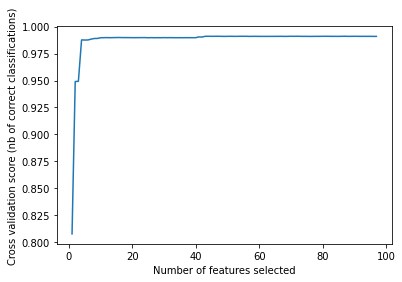

In [5]:
min_features_to_select = 1  # Minimum number of features to consider
rfecv = RFECV(estimator=CatBoostClassifier(), step=1, cv=StratifiedKFold(2),
              scoring=metrics.make_scorer(f1_score, average='weighted'),
              min_features_to_select=min_features_to_select)
rfecv.fit(X, Y)

print("Optimal number of features : %d" % rfecv.n_features_)
print("Ranking %s" % rfecv.ranking_) # 重要程度排名
print('Best features :', X.columns[rfecv.support_])

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(min_features_to_select,
               len(rfecv.grid_scores_) + min_features_to_select),
         rfecv.grid_scores_)
plt.show()

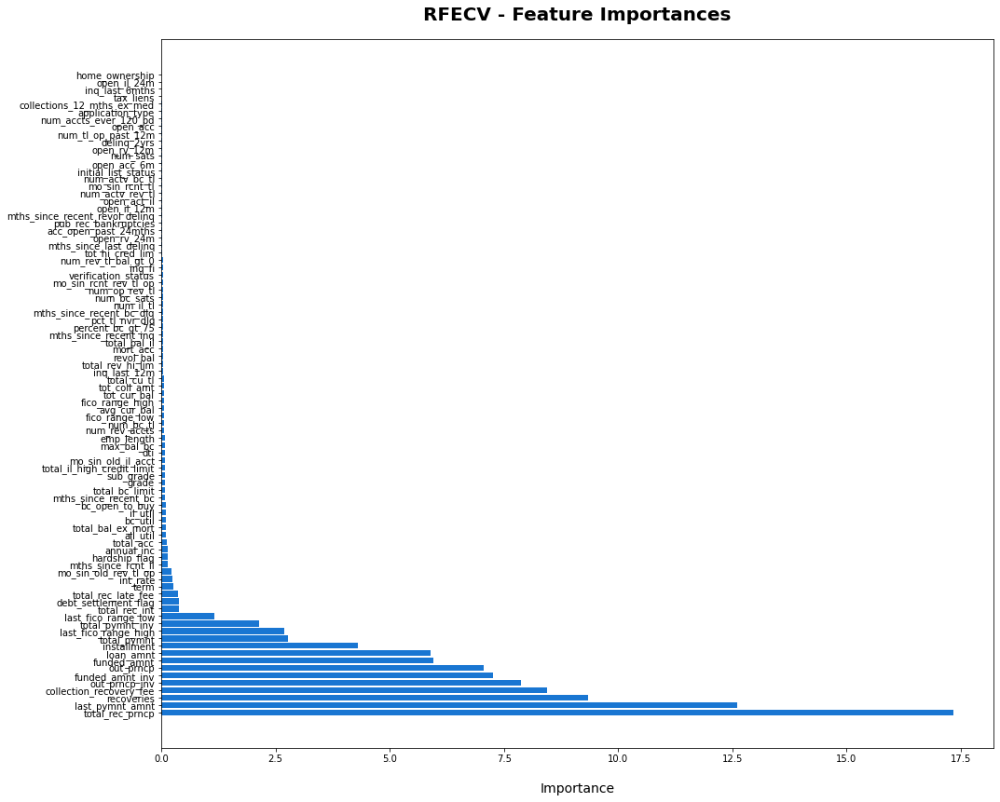

In [6]:
dset = pd.DataFrame()
dset['attr'] = X.columns[rfecv.support_]
dset['importance'] = rfecv.estimator_.feature_importances_

dset = dset.sort_values(by='importance', ascending=False)


plt.figure(figsize=(16, 14))
plt.barh(y=dset['attr'], width=dset['importance'], color='#1976D2')
plt.title('RFECV - Feature Importances', fontsize=20, fontweight='bold', pad=20)
plt.xlabel('Importance', fontsize=14, labelpad=20)
plt.show()

In [7]:
rfecv.n_features_
X=rfecv.transform(X)

# Data Conversion

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn import tree
from sklearn import metrics
from imblearn.over_sampling import SMOTE

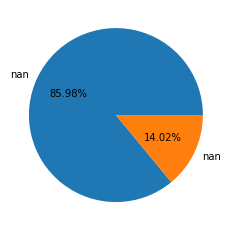

In [9]:
plt.axes(aspect = 'equal')
counts = full.loan_status.value_counts()
plt.pie(x = counts,
        labels=pd.Series(counts.index).map({'0':'未違約','1':'違約'}),
        autopct='%.2f%%'
       )

plt.show()

In [10]:
predictors = full.columns[:-1]

X_train,X_test,y_train,y_test = model_selection.train_test_split(full[predictors], full.loan_status, random_state=12)

In [11]:
from imblearn.over_sampling import BorderlineSMOTE
over_samples = SMOTE(random_state=1234) 
#over_samples_X,over_samples_y = BorderlineSMOTE(random_state=42, kind='borderline-1').fit_resample(X_train, y_train)
over_samples_X,over_samples_y = over_samples.fit_resample(X_train, y_train)

In [12]:
print(y_train.value_counts()/len(y_train))

print(pd.Series(over_samples_y).value_counts()/len(over_samples_y))

0.0    0.859935
1.0    0.140065
Name: loan_status, dtype: float64
0.0    0.5
1.0    0.5
Name: loan_status, dtype: float64


In [13]:
# Cast Y to a np array
Y = np.array(Y.loan_status)
Y

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [14]:
# Declare the Classifier
# If we don't give the iteration a limit it's going to take a ling time
classifier = CatBoostClassifier() #hyperperameter

In [15]:
#Make pipeline of clf
clf_pipeline = make_pipeline(classifier)
y_pred = cross_val_predict(clf_pipeline, over_samples_X,over_samples_y, cv=10)
print('Accuracy score:', metrics.accuracy_score(over_samples_y, y_pred))
print('Recall score:', metrics.recall_score(over_samples_y, y_pred))
print('Fbeta score:', fbeta_score(over_samples_y, y_pred, beta=1.5))
print('F1-score:', f1_score(over_samples_y, y_pred))

Learning rate set to 0.190644
0:	learn: 0.2886221	total: 325ms	remaining: 5m 24s
1:	learn: 0.1621571	total: 639ms	remaining: 5m 19s
2:	learn: 0.1157011	total: 991ms	remaining: 5m 29s
3:	learn: 0.0944293	total: 1.3s	remaining: 5m 24s
4:	learn: 0.0836652	total: 1.58s	remaining: 5m 14s
5:	learn: 0.0738692	total: 1.94s	remaining: 5m 21s
6:	learn: 0.0690306	total: 2.21s	remaining: 5m 14s
7:	learn: 0.0645459	total: 2.49s	remaining: 5m 9s
8:	learn: 0.0569991	total: 2.85s	remaining: 5m 13s
9:	learn: 0.0502921	total: 3.19s	remaining: 5m 15s
10:	learn: 0.0486311	total: 3.46s	remaining: 5m 11s
11:	learn: 0.0461553	total: 3.85s	remaining: 5m 17s
12:	learn: 0.0430491	total: 4.18s	remaining: 5m 17s
13:	learn: 0.0398780	total: 4.55s	remaining: 5m 20s
14:	learn: 0.0369631	total: 4.95s	remaining: 5m 24s
15:	learn: 0.0339612	total: 5.34s	remaining: 5m 28s
16:	learn: 0.0332374	total: 5.68s	remaining: 5m 28s
17:	learn: 0.0326428	total: 5.99s	remaining: 5m 26s
18:	learn: 0.0318427	total: 6.27s	remaining: 5

159:	learn: 0.0123378	total: 42.5s	remaining: 3m 42s
160:	learn: 0.0123378	total: 42.7s	remaining: 3m 42s
161:	learn: 0.0123378	total: 42.9s	remaining: 3m 41s
162:	learn: 0.0123378	total: 43s	remaining: 3m 40s
163:	learn: 0.0123378	total: 43.2s	remaining: 3m 40s
164:	learn: 0.0123378	total: 43.4s	remaining: 3m 39s
165:	learn: 0.0123378	total: 43.6s	remaining: 3m 38s
166:	learn: 0.0123378	total: 43.8s	remaining: 3m 38s
167:	learn: 0.0123378	total: 44s	remaining: 3m 37s
168:	learn: 0.0123378	total: 44.2s	remaining: 3m 37s
169:	learn: 0.0123378	total: 44.3s	remaining: 3m 36s
170:	learn: 0.0123378	total: 44.5s	remaining: 3m 35s
171:	learn: 0.0123378	total: 44.7s	remaining: 3m 35s
172:	learn: 0.0123378	total: 44.9s	remaining: 3m 34s
173:	learn: 0.0123378	total: 45.1s	remaining: 3m 34s
174:	learn: 0.0123378	total: 45.3s	remaining: 3m 33s
175:	learn: 0.0123378	total: 45.5s	remaining: 3m 32s
176:	learn: 0.0123378	total: 45.6s	remaining: 3m 32s
177:	learn: 0.0123378	total: 45.8s	remaining: 3m 3

316:	learn: 0.0123362	total: 1m 12s	remaining: 2m 36s
317:	learn: 0.0123362	total: 1m 12s	remaining: 2m 35s
318:	learn: 0.0123362	total: 1m 12s	remaining: 2m 35s
319:	learn: 0.0123362	total: 1m 13s	remaining: 2m 35s
320:	learn: 0.0123362	total: 1m 13s	remaining: 2m 34s
321:	learn: 0.0123361	total: 1m 13s	remaining: 2m 34s
322:	learn: 0.0123361	total: 1m 13s	remaining: 2m 34s
323:	learn: 0.0123360	total: 1m 13s	remaining: 2m 33s
324:	learn: 0.0123360	total: 1m 14s	remaining: 2m 33s
325:	learn: 0.0123359	total: 1m 14s	remaining: 2m 33s
326:	learn: 0.0123359	total: 1m 14s	remaining: 2m 33s
327:	learn: 0.0123358	total: 1m 14s	remaining: 2m 32s
328:	learn: 0.0123358	total: 1m 14s	remaining: 2m 32s
329:	learn: 0.0123358	total: 1m 14s	remaining: 2m 32s
330:	learn: 0.0123357	total: 1m 15s	remaining: 2m 31s
331:	learn: 0.0123356	total: 1m 15s	remaining: 2m 31s
332:	learn: 0.0123356	total: 1m 15s	remaining: 2m 31s
333:	learn: 0.0123355	total: 1m 15s	remaining: 2m 31s
334:	learn: 0.0123355	total:

470:	learn: 0.0122447	total: 1m 42s	remaining: 1m 55s
471:	learn: 0.0122446	total: 1m 42s	remaining: 1m 54s
472:	learn: 0.0122446	total: 1m 42s	remaining: 1m 54s
473:	learn: 0.0122446	total: 1m 43s	remaining: 1m 54s
474:	learn: 0.0122445	total: 1m 43s	remaining: 1m 54s
475:	learn: 0.0122445	total: 1m 43s	remaining: 1m 53s
476:	learn: 0.0122445	total: 1m 43s	remaining: 1m 53s
477:	learn: 0.0122444	total: 1m 43s	remaining: 1m 53s
478:	learn: 0.0122444	total: 1m 43s	remaining: 1m 53s
479:	learn: 0.0122444	total: 1m 44s	remaining: 1m 52s
480:	learn: 0.0122443	total: 1m 44s	remaining: 1m 52s
481:	learn: 0.0122443	total: 1m 44s	remaining: 1m 52s
482:	learn: 0.0122443	total: 1m 44s	remaining: 1m 52s
483:	learn: 0.0122443	total: 1m 44s	remaining: 1m 51s
484:	learn: 0.0122443	total: 1m 45s	remaining: 1m 51s
485:	learn: 0.0122442	total: 1m 45s	remaining: 1m 51s
486:	learn: 0.0122441	total: 1m 45s	remaining: 1m 51s
487:	learn: 0.0122441	total: 1m 45s	remaining: 1m 50s
488:	learn: 0.0122441	total:

624:	learn: 0.0119449	total: 2m 13s	remaining: 1m 19s
625:	learn: 0.0119449	total: 2m 13s	remaining: 1m 19s
626:	learn: 0.0119449	total: 2m 13s	remaining: 1m 19s
627:	learn: 0.0119449	total: 2m 13s	remaining: 1m 19s
628:	learn: 0.0119449	total: 2m 14s	remaining: 1m 19s
629:	learn: 0.0119449	total: 2m 14s	remaining: 1m 18s
630:	learn: 0.0119449	total: 2m 14s	remaining: 1m 18s
631:	learn: 0.0119449	total: 2m 14s	remaining: 1m 18s
632:	learn: 0.0119449	total: 2m 14s	remaining: 1m 18s
633:	learn: 0.0119449	total: 2m 14s	remaining: 1m 17s
634:	learn: 0.0119449	total: 2m 15s	remaining: 1m 17s
635:	learn: 0.0119449	total: 2m 15s	remaining: 1m 17s
636:	learn: 0.0119449	total: 2m 15s	remaining: 1m 17s
637:	learn: 0.0119449	total: 2m 15s	remaining: 1m 17s
638:	learn: 0.0119449	total: 2m 15s	remaining: 1m 16s
639:	learn: 0.0119449	total: 2m 16s	remaining: 1m 16s
640:	learn: 0.0119449	total: 2m 16s	remaining: 1m 16s
641:	learn: 0.0119449	total: 2m 16s	remaining: 1m 16s
642:	learn: 0.0119449	total:

779:	learn: 0.0118603	total: 2m 43s	remaining: 46s
780:	learn: 0.0118603	total: 2m 43s	remaining: 45.8s
781:	learn: 0.0118603	total: 2m 43s	remaining: 45.6s
782:	learn: 0.0118603	total: 2m 43s	remaining: 45.4s
783:	learn: 0.0118603	total: 2m 43s	remaining: 45.2s
784:	learn: 0.0118602	total: 2m 44s	remaining: 44.9s
785:	learn: 0.0118602	total: 2m 44s	remaining: 44.7s
786:	learn: 0.0118601	total: 2m 44s	remaining: 44.5s
787:	learn: 0.0118601	total: 2m 44s	remaining: 44.3s
788:	learn: 0.0118601	total: 2m 44s	remaining: 44.1s
789:	learn: 0.0118601	total: 2m 45s	remaining: 43.9s
790:	learn: 0.0118600	total: 2m 45s	remaining: 43.7s
791:	learn: 0.0118600	total: 2m 45s	remaining: 43.4s
792:	learn: 0.0118600	total: 2m 45s	remaining: 43.2s
793:	learn: 0.0118600	total: 2m 45s	remaining: 43s
794:	learn: 0.0118599	total: 2m 45s	remaining: 42.8s
795:	learn: 0.0118599	total: 2m 46s	remaining: 42.6s
796:	learn: 0.0118599	total: 2m 46s	remaining: 42.4s
797:	learn: 0.0118599	total: 2m 46s	remaining: 42.

936:	learn: 0.0114728	total: 3m 14s	remaining: 13.1s
937:	learn: 0.0114588	total: 3m 14s	remaining: 12.9s
938:	learn: 0.0114450	total: 3m 14s	remaining: 12.7s
939:	learn: 0.0113973	total: 3m 15s	remaining: 12.5s
940:	learn: 0.0113973	total: 3m 15s	remaining: 12.2s
941:	learn: 0.0113973	total: 3m 15s	remaining: 12s
942:	learn: 0.0113973	total: 3m 15s	remaining: 11.8s
943:	learn: 0.0113972	total: 3m 15s	remaining: 11.6s
944:	learn: 0.0113972	total: 3m 16s	remaining: 11.4s
945:	learn: 0.0113972	total: 3m 16s	remaining: 11.2s
946:	learn: 0.0113972	total: 3m 16s	remaining: 11s
947:	learn: 0.0113972	total: 3m 16s	remaining: 10.8s
948:	learn: 0.0113972	total: 3m 16s	remaining: 10.6s
949:	learn: 0.0113972	total: 3m 17s	remaining: 10.4s
950:	learn: 0.0113972	total: 3m 17s	remaining: 10.2s
951:	learn: 0.0113972	total: 3m 17s	remaining: 9.95s
952:	learn: 0.0113972	total: 3m 17s	remaining: 9.74s
953:	learn: 0.0113972	total: 3m 17s	remaining: 9.54s
954:	learn: 0.0113972	total: 3m 17s	remaining: 9.3

93:	learn: 0.0178942	total: 27.5s	remaining: 4m 25s
94:	learn: 0.0178652	total: 27.8s	remaining: 4m 24s
95:	learn: 0.0178367	total: 28.1s	remaining: 4m 24s
96:	learn: 0.0176446	total: 28.4s	remaining: 4m 24s
97:	learn: 0.0175636	total: 28.7s	remaining: 4m 23s
98:	learn: 0.0174773	total: 29s	remaining: 4m 23s
99:	learn: 0.0174436	total: 29.3s	remaining: 4m 23s
100:	learn: 0.0174205	total: 29.5s	remaining: 4m 22s
101:	learn: 0.0173852	total: 29.8s	remaining: 4m 22s
102:	learn: 0.0173070	total: 30.1s	remaining: 4m 21s
103:	learn: 0.0172832	total: 30.3s	remaining: 4m 21s
104:	learn: 0.0172094	total: 30.6s	remaining: 4m 21s
105:	learn: 0.0171086	total: 30.9s	remaining: 4m 20s
106:	learn: 0.0170734	total: 31.2s	remaining: 4m 20s
107:	learn: 0.0170214	total: 31.5s	remaining: 4m 19s
108:	learn: 0.0169848	total: 31.7s	remaining: 4m 19s
109:	learn: 0.0169660	total: 32s	remaining: 4m 18s
110:	learn: 0.0169140	total: 32.3s	remaining: 4m 18s
111:	learn: 0.0169015	total: 32.6s	remaining: 4m 18s
112:

249:	learn: 0.0149327	total: 1m 6s	remaining: 3m 19s
250:	learn: 0.0149326	total: 1m 6s	remaining: 3m 18s
251:	learn: 0.0149326	total: 1m 6s	remaining: 3m 18s
252:	learn: 0.0149326	total: 1m 6s	remaining: 3m 17s
253:	learn: 0.0149325	total: 1m 7s	remaining: 3m 17s
254:	learn: 0.0149325	total: 1m 7s	remaining: 3m 16s
255:	learn: 0.0149324	total: 1m 7s	remaining: 3m 16s
256:	learn: 0.0149324	total: 1m 7s	remaining: 3m 15s
257:	learn: 0.0149323	total: 1m 7s	remaining: 3m 15s
258:	learn: 0.0149323	total: 1m 8s	remaining: 3m 15s
259:	learn: 0.0149323	total: 1m 8s	remaining: 3m 14s
260:	learn: 0.0149323	total: 1m 8s	remaining: 3m 14s
261:	learn: 0.0149323	total: 1m 8s	remaining: 3m 13s
262:	learn: 0.0149322	total: 1m 8s	remaining: 3m 13s
263:	learn: 0.0149321	total: 1m 9s	remaining: 3m 12s
264:	learn: 0.0149320	total: 1m 9s	remaining: 3m 12s
265:	learn: 0.0149320	total: 1m 9s	remaining: 3m 12s
266:	learn: 0.0149319	total: 1m 9s	remaining: 3m 11s
267:	learn: 0.0149319	total: 1m 10s	remaining:

403:	learn: 0.0146635	total: 1m 38s	remaining: 2m 25s
404:	learn: 0.0146635	total: 1m 38s	remaining: 2m 25s
405:	learn: 0.0146635	total: 1m 38s	remaining: 2m 24s
406:	learn: 0.0146634	total: 1m 39s	remaining: 2m 24s
407:	learn: 0.0146634	total: 1m 39s	remaining: 2m 24s
408:	learn: 0.0146634	total: 1m 39s	remaining: 2m 23s
409:	learn: 0.0146634	total: 1m 39s	remaining: 2m 23s
410:	learn: 0.0146633	total: 1m 39s	remaining: 2m 23s
411:	learn: 0.0146633	total: 1m 40s	remaining: 2m 22s
412:	learn: 0.0146632	total: 1m 40s	remaining: 2m 22s
413:	learn: 0.0146632	total: 1m 40s	remaining: 2m 22s
414:	learn: 0.0146632	total: 1m 40s	remaining: 2m 22s
415:	learn: 0.0146631	total: 1m 40s	remaining: 2m 21s
416:	learn: 0.0146631	total: 1m 41s	remaining: 2m 21s
417:	learn: 0.0146631	total: 1m 41s	remaining: 2m 21s
418:	learn: 0.0146631	total: 1m 41s	remaining: 2m 20s
419:	learn: 0.0146631	total: 1m 41s	remaining: 2m 20s
420:	learn: 0.0146631	total: 1m 42s	remaining: 2m 20s
421:	learn: 0.0146630	total:

558:	learn: 0.0146630	total: 2m 10s	remaining: 1m 42s
559:	learn: 0.0146630	total: 2m 10s	remaining: 1m 42s
560:	learn: 0.0146630	total: 2m 10s	remaining: 1m 42s
561:	learn: 0.0146630	total: 2m 10s	remaining: 1m 41s
562:	learn: 0.0146630	total: 2m 11s	remaining: 1m 41s
563:	learn: 0.0146630	total: 2m 11s	remaining: 1m 41s
564:	learn: 0.0146630	total: 2m 11s	remaining: 1m 41s
565:	learn: 0.0146630	total: 2m 11s	remaining: 1m 40s
566:	learn: 0.0146630	total: 2m 11s	remaining: 1m 40s
567:	learn: 0.0146630	total: 2m 12s	remaining: 1m 40s
568:	learn: 0.0146630	total: 2m 12s	remaining: 1m 40s
569:	learn: 0.0146630	total: 2m 12s	remaining: 1m 39s
570:	learn: 0.0146630	total: 2m 12s	remaining: 1m 39s
571:	learn: 0.0146630	total: 2m 12s	remaining: 1m 39s
572:	learn: 0.0146630	total: 2m 13s	remaining: 1m 39s
573:	learn: 0.0146630	total: 2m 13s	remaining: 1m 38s
574:	learn: 0.0146630	total: 2m 13s	remaining: 1m 38s
575:	learn: 0.0146630	total: 2m 13s	remaining: 1m 38s
576:	learn: 0.0146630	total:

711:	learn: 0.0146627	total: 2m 41s	remaining: 1m 5s
712:	learn: 0.0146627	total: 2m 42s	remaining: 1m 5s
713:	learn: 0.0146627	total: 2m 42s	remaining: 1m 5s
714:	learn: 0.0146627	total: 2m 42s	remaining: 1m 4s
715:	learn: 0.0146627	total: 2m 42s	remaining: 1m 4s
716:	learn: 0.0146627	total: 2m 42s	remaining: 1m 4s
717:	learn: 0.0146627	total: 2m 43s	remaining: 1m 4s
718:	learn: 0.0146627	total: 2m 43s	remaining: 1m 3s
719:	learn: 0.0146627	total: 2m 43s	remaining: 1m 3s
720:	learn: 0.0146627	total: 2m 43s	remaining: 1m 3s
721:	learn: 0.0146627	total: 2m 43s	remaining: 1m 3s
722:	learn: 0.0146627	total: 2m 44s	remaining: 1m 2s
723:	learn: 0.0146627	total: 2m 44s	remaining: 1m 2s
724:	learn: 0.0146627	total: 2m 44s	remaining: 1m 2s
725:	learn: 0.0146627	total: 2m 44s	remaining: 1m 2s
726:	learn: 0.0146627	total: 2m 44s	remaining: 1m 1s
727:	learn: 0.0146627	total: 2m 45s	remaining: 1m 1s
728:	learn: 0.0146627	total: 2m 45s	remaining: 1m 1s
729:	learn: 0.0146627	total: 2m 45s	remaining:

868:	learn: 0.0146614	total: 3m 15s	remaining: 29.4s
869:	learn: 0.0146614	total: 3m 15s	remaining: 29.2s
870:	learn: 0.0146614	total: 3m 15s	remaining: 29s
871:	learn: 0.0146614	total: 3m 15s	remaining: 28.7s
872:	learn: 0.0146614	total: 3m 16s	remaining: 28.5s
873:	learn: 0.0146614	total: 3m 16s	remaining: 28.3s
874:	learn: 0.0146614	total: 3m 16s	remaining: 28.1s
875:	learn: 0.0146614	total: 3m 16s	remaining: 27.8s
876:	learn: 0.0146307	total: 3m 17s	remaining: 27.6s
877:	learn: 0.0146306	total: 3m 17s	remaining: 27.4s
878:	learn: 0.0146306	total: 3m 17s	remaining: 27.2s
879:	learn: 0.0146305	total: 3m 17s	remaining: 27s
880:	learn: 0.0146305	total: 3m 17s	remaining: 26.7s
881:	learn: 0.0146305	total: 3m 18s	remaining: 26.5s
882:	learn: 0.0146304	total: 3m 18s	remaining: 26.3s
883:	learn: 0.0146304	total: 3m 18s	remaining: 26.1s
884:	learn: 0.0146304	total: 3m 18s	remaining: 25.9s
885:	learn: 0.0146304	total: 3m 19s	remaining: 25.6s
886:	learn: 0.0146304	total: 3m 19s	remaining: 25.

24:	learn: 0.0408638	total: 7.83s	remaining: 5m 5s
25:	learn: 0.0401722	total: 8.11s	remaining: 5m 3s
26:	learn: 0.0386426	total: 8.43s	remaining: 5m 3s
27:	learn: 0.0379687	total: 8.71s	remaining: 5m 2s
28:	learn: 0.0371054	total: 9s	remaining: 5m 1s
29:	learn: 0.0362397	total: 9.33s	remaining: 5m 1s
30:	learn: 0.0357805	total: 9.6s	remaining: 5m
31:	learn: 0.0349328	total: 9.89s	remaining: 4m 59s
32:	learn: 0.0338184	total: 10.2s	remaining: 4m 57s
33:	learn: 0.0335259	total: 10.5s	remaining: 4m 57s
34:	learn: 0.0333250	total: 10.7s	remaining: 4m 55s
35:	learn: 0.0327823	total: 11s	remaining: 4m 54s
36:	learn: 0.0320259	total: 11.3s	remaining: 4m 54s
37:	learn: 0.0317089	total: 11.6s	remaining: 4m 54s
38:	learn: 0.0311469	total: 11.9s	remaining: 4m 52s
39:	learn: 0.0308425	total: 12.2s	remaining: 4m 52s
40:	learn: 0.0306337	total: 12.5s	remaining: 4m 51s
41:	learn: 0.0304485	total: 12.7s	remaining: 4m 49s
42:	learn: 0.0303082	total: 13s	remaining: 4m 48s
43:	learn: 0.0296665	total: 13

182:	learn: 0.0209374	total: 51s	remaining: 3m 47s
183:	learn: 0.0209212	total: 51.3s	remaining: 3m 47s
184:	learn: 0.0209115	total: 51.6s	remaining: 3m 47s
185:	learn: 0.0208777	total: 51.9s	remaining: 3m 46s
186:	learn: 0.0208638	total: 52.1s	remaining: 3m 46s
187:	learn: 0.0208629	total: 52.3s	remaining: 3m 45s
188:	learn: 0.0208564	total: 52.5s	remaining: 3m 45s
189:	learn: 0.0208563	total: 52.7s	remaining: 3m 44s
190:	learn: 0.0208541	total: 52.9s	remaining: 3m 43s
191:	learn: 0.0208355	total: 53.2s	remaining: 3m 43s
192:	learn: 0.0208118	total: 53.4s	remaining: 3m 43s
193:	learn: 0.0208019	total: 53.7s	remaining: 3m 42s
194:	learn: 0.0207955	total: 53.9s	remaining: 3m 42s
195:	learn: 0.0207786	total: 54.2s	remaining: 3m 42s
196:	learn: 0.0207557	total: 54.5s	remaining: 3m 41s
197:	learn: 0.0207461	total: 54.7s	remaining: 3m 41s
198:	learn: 0.0207128	total: 55s	remaining: 3m 41s
199:	learn: 0.0207128	total: 55.2s	remaining: 3m 40s
200:	learn: 0.0207057	total: 55.4s	remaining: 3m 4

337:	learn: 0.0200196	total: 1m 28s	remaining: 2m 52s
338:	learn: 0.0200196	total: 1m 28s	remaining: 2m 52s
339:	learn: 0.0200196	total: 1m 28s	remaining: 2m 52s
340:	learn: 0.0200196	total: 1m 28s	remaining: 2m 51s
341:	learn: 0.0200196	total: 1m 29s	remaining: 2m 51s
342:	learn: 0.0200194	total: 1m 29s	remaining: 2m 51s
343:	learn: 0.0200194	total: 1m 29s	remaining: 2m 50s
344:	learn: 0.0200194	total: 1m 29s	remaining: 2m 50s
345:	learn: 0.0200193	total: 1m 29s	remaining: 2m 49s
346:	learn: 0.0200193	total: 1m 30s	remaining: 2m 49s
347:	learn: 0.0200193	total: 1m 30s	remaining: 2m 49s
348:	learn: 0.0200193	total: 1m 30s	remaining: 2m 49s
349:	learn: 0.0200192	total: 1m 30s	remaining: 2m 48s
350:	learn: 0.0200192	total: 1m 31s	remaining: 2m 48s
351:	learn: 0.0200190	total: 1m 31s	remaining: 2m 48s
352:	learn: 0.0200190	total: 1m 31s	remaining: 2m 47s
353:	learn: 0.0200189	total: 1m 31s	remaining: 2m 47s
354:	learn: 0.0200188	total: 1m 32s	remaining: 2m 47s
355:	learn: 0.0200188	total:

490:	learn: 0.0193308	total: 2m 3s	remaining: 2m 7s
491:	learn: 0.0193307	total: 2m 3s	remaining: 2m 7s
492:	learn: 0.0193239	total: 2m 3s	remaining: 2m 7s
493:	learn: 0.0193239	total: 2m 3s	remaining: 2m 6s
494:	learn: 0.0193143	total: 2m 3s	remaining: 2m 6s
495:	learn: 0.0193026	total: 2m 4s	remaining: 2m 6s
496:	learn: 0.0192930	total: 2m 4s	remaining: 2m 6s
497:	learn: 0.0192897	total: 2m 4s	remaining: 2m 5s
498:	learn: 0.0192897	total: 2m 4s	remaining: 2m 5s
499:	learn: 0.0192763	total: 2m 5s	remaining: 2m 5s
500:	learn: 0.0192763	total: 2m 5s	remaining: 2m 4s
501:	learn: 0.0192633	total: 2m 5s	remaining: 2m 4s
502:	learn: 0.0192633	total: 2m 5s	remaining: 2m 4s
503:	learn: 0.0192633	total: 2m 6s	remaining: 2m 4s
504:	learn: 0.0192541	total: 2m 6s	remaining: 2m 3s
505:	learn: 0.0192540	total: 2m 6s	remaining: 2m 3s
506:	learn: 0.0192540	total: 2m 6s	remaining: 2m 3s
507:	learn: 0.0192540	total: 2m 7s	remaining: 2m 3s
508:	learn: 0.0192540	total: 2m 7s	remaining: 2m 2s
509:	learn: 

644:	learn: 0.0189325	total: 2m 38s	remaining: 1m 27s
645:	learn: 0.0189324	total: 2m 39s	remaining: 1m 27s
646:	learn: 0.0189324	total: 2m 39s	remaining: 1m 26s
647:	learn: 0.0189324	total: 2m 39s	remaining: 1m 26s
648:	learn: 0.0189324	total: 2m 39s	remaining: 1m 26s
649:	learn: 0.0189324	total: 2m 39s	remaining: 1m 26s
650:	learn: 0.0189324	total: 2m 40s	remaining: 1m 25s
651:	learn: 0.0189324	total: 2m 40s	remaining: 1m 25s
652:	learn: 0.0189324	total: 2m 40s	remaining: 1m 25s
653:	learn: 0.0189324	total: 2m 40s	remaining: 1m 25s
654:	learn: 0.0189324	total: 2m 41s	remaining: 1m 24s
655:	learn: 0.0189324	total: 2m 41s	remaining: 1m 24s
656:	learn: 0.0189323	total: 2m 41s	remaining: 1m 24s
657:	learn: 0.0189323	total: 2m 41s	remaining: 1m 24s
658:	learn: 0.0189323	total: 2m 42s	remaining: 1m 23s
659:	learn: 0.0189323	total: 2m 42s	remaining: 1m 23s
660:	learn: 0.0189323	total: 2m 42s	remaining: 1m 23s
661:	learn: 0.0189323	total: 2m 42s	remaining: 1m 23s
662:	learn: 0.0189323	total:

799:	learn: 0.0187941	total: 3m 14s	remaining: 48.5s
800:	learn: 0.0187940	total: 3m 14s	remaining: 48.3s
801:	learn: 0.0187940	total: 3m 14s	remaining: 48s
802:	learn: 0.0187940	total: 3m 14s	remaining: 47.8s
803:	learn: 0.0187940	total: 3m 14s	remaining: 47.5s
804:	learn: 0.0187939	total: 3m 15s	remaining: 47.3s
805:	learn: 0.0187939	total: 3m 15s	remaining: 47s
806:	learn: 0.0187939	total: 3m 15s	remaining: 46.8s
807:	learn: 0.0187938	total: 3m 15s	remaining: 46.5s
808:	learn: 0.0187938	total: 3m 15s	remaining: 46.3s
809:	learn: 0.0187938	total: 3m 16s	remaining: 46s
810:	learn: 0.0187938	total: 3m 16s	remaining: 45.8s
811:	learn: 0.0187937	total: 3m 16s	remaining: 45.5s
812:	learn: 0.0187937	total: 3m 16s	remaining: 45.3s
813:	learn: 0.0187937	total: 3m 16s	remaining: 45s
814:	learn: 0.0187937	total: 3m 17s	remaining: 44.8s
815:	learn: 0.0187935	total: 3m 17s	remaining: 44.5s
816:	learn: 0.0187935	total: 3m 17s	remaining: 44.3s
817:	learn: 0.0187935	total: 3m 17s	remaining: 44s
818

955:	learn: 0.0185754	total: 3m 47s	remaining: 10.5s
956:	learn: 0.0185754	total: 3m 47s	remaining: 10.2s
957:	learn: 0.0185752	total: 3m 48s	remaining: 10s
958:	learn: 0.0185728	total: 3m 48s	remaining: 9.76s
959:	learn: 0.0185474	total: 3m 48s	remaining: 9.52s
960:	learn: 0.0185412	total: 3m 48s	remaining: 9.29s
961:	learn: 0.0185411	total: 3m 49s	remaining: 9.05s
962:	learn: 0.0185411	total: 3m 49s	remaining: 8.81s
963:	learn: 0.0185409	total: 3m 49s	remaining: 8.57s
964:	learn: 0.0185285	total: 3m 49s	remaining: 8.34s
965:	learn: 0.0185285	total: 3m 50s	remaining: 8.1s
966:	learn: 0.0185285	total: 3m 50s	remaining: 7.86s
967:	learn: 0.0185284	total: 3m 50s	remaining: 7.62s
968:	learn: 0.0185284	total: 3m 50s	remaining: 7.38s
969:	learn: 0.0185284	total: 3m 50s	remaining: 7.14s
970:	learn: 0.0185164	total: 3m 51s	remaining: 6.9s
971:	learn: 0.0185164	total: 3m 51s	remaining: 6.67s
972:	learn: 0.0185163	total: 3m 51s	remaining: 6.43s
973:	learn: 0.0185163	total: 3m 51s	remaining: 6.1

112:	learn: 0.0229909	total: 32.8s	remaining: 4m 17s
113:	learn: 0.0229795	total: 33.1s	remaining: 4m 16s
114:	learn: 0.0229537	total: 33.3s	remaining: 4m 16s
115:	learn: 0.0229287	total: 33.6s	remaining: 4m 16s
116:	learn: 0.0228992	total: 33.9s	remaining: 4m 15s
117:	learn: 0.0228785	total: 34.1s	remaining: 4m 14s
118:	learn: 0.0227832	total: 34.4s	remaining: 4m 14s
119:	learn: 0.0227434	total: 34.7s	remaining: 4m 14s
120:	learn: 0.0225852	total: 35s	remaining: 4m 14s
121:	learn: 0.0224751	total: 35.3s	remaining: 4m 14s
122:	learn: 0.0224400	total: 35.6s	remaining: 4m 13s
123:	learn: 0.0224165	total: 35.9s	remaining: 4m 13s
124:	learn: 0.0224165	total: 36.1s	remaining: 4m 12s
125:	learn: 0.0223983	total: 36.3s	remaining: 4m 12s
126:	learn: 0.0223509	total: 36.6s	remaining: 4m 11s
127:	learn: 0.0223252	total: 36.8s	remaining: 4m 11s
128:	learn: 0.0222976	total: 37.1s	remaining: 4m 10s
129:	learn: 0.0222710	total: 37.4s	remaining: 4m 10s
130:	learn: 0.0222435	total: 37.7s	remaining: 4m

268:	learn: 0.0198690	total: 1m 12s	remaining: 3m 18s
269:	learn: 0.0198689	total: 1m 13s	remaining: 3m 17s
270:	learn: 0.0198689	total: 1m 13s	remaining: 3m 17s
271:	learn: 0.0198689	total: 1m 13s	remaining: 3m 16s
272:	learn: 0.0198689	total: 1m 13s	remaining: 3m 16s
273:	learn: 0.0198688	total: 1m 13s	remaining: 3m 15s
274:	learn: 0.0198676	total: 1m 14s	remaining: 3m 15s
275:	learn: 0.0198675	total: 1m 14s	remaining: 3m 15s
276:	learn: 0.0198675	total: 1m 14s	remaining: 3m 14s
277:	learn: 0.0198666	total: 1m 14s	remaining: 3m 14s
278:	learn: 0.0198665	total: 1m 15s	remaining: 3m 13s
279:	learn: 0.0198665	total: 1m 15s	remaining: 3m 13s
280:	learn: 0.0198665	total: 1m 15s	remaining: 3m 13s
281:	learn: 0.0198664	total: 1m 15s	remaining: 3m 12s
282:	learn: 0.0198658	total: 1m 15s	remaining: 3m 12s
283:	learn: 0.0198657	total: 1m 16s	remaining: 3m 11s
284:	learn: 0.0198649	total: 1m 16s	remaining: 3m 11s
285:	learn: 0.0198473	total: 1m 16s	remaining: 3m 11s
286:	learn: 0.0198307	total:

421:	learn: 0.0192700	total: 1m 47s	remaining: 2m 26s
422:	learn: 0.0192700	total: 1m 47s	remaining: 2m 26s
423:	learn: 0.0192699	total: 1m 47s	remaining: 2m 25s
424:	learn: 0.0192699	total: 1m 47s	remaining: 2m 25s
425:	learn: 0.0192699	total: 1m 47s	remaining: 2m 25s
426:	learn: 0.0192699	total: 1m 47s	remaining: 2m 24s
427:	learn: 0.0192699	total: 1m 48s	remaining: 2m 24s
428:	learn: 0.0192479	total: 1m 48s	remaining: 2m 24s
429:	learn: 0.0192394	total: 1m 48s	remaining: 2m 24s
430:	learn: 0.0192393	total: 1m 48s	remaining: 2m 23s
431:	learn: 0.0192262	total: 1m 49s	remaining: 2m 23s
432:	learn: 0.0192177	total: 1m 49s	remaining: 2m 23s
433:	learn: 0.0192176	total: 1m 49s	remaining: 2m 22s
434:	learn: 0.0192176	total: 1m 49s	remaining: 2m 22s
435:	learn: 0.0192176	total: 1m 50s	remaining: 2m 22s
436:	learn: 0.0192175	total: 1m 50s	remaining: 2m 22s
437:	learn: 0.0192082	total: 1m 50s	remaining: 2m 21s
438:	learn: 0.0192012	total: 1m 50s	remaining: 2m 21s
439:	learn: 0.0191897	total:

576:	learn: 0.0188351	total: 2m 22s	remaining: 1m 44s
577:	learn: 0.0188351	total: 2m 22s	remaining: 1m 44s
578:	learn: 0.0188351	total: 2m 22s	remaining: 1m 43s
579:	learn: 0.0188350	total: 2m 22s	remaining: 1m 43s
580:	learn: 0.0188350	total: 2m 23s	remaining: 1m 43s
581:	learn: 0.0188350	total: 2m 23s	remaining: 1m 42s
582:	learn: 0.0188350	total: 2m 23s	remaining: 1m 42s
583:	learn: 0.0188350	total: 2m 23s	remaining: 1m 42s
584:	learn: 0.0188350	total: 2m 23s	remaining: 1m 42s
585:	learn: 0.0188350	total: 2m 24s	remaining: 1m 41s
586:	learn: 0.0188350	total: 2m 24s	remaining: 1m 41s
587:	learn: 0.0188349	total: 2m 24s	remaining: 1m 41s
588:	learn: 0.0188349	total: 2m 24s	remaining: 1m 41s
589:	learn: 0.0188349	total: 2m 24s	remaining: 1m 40s
590:	learn: 0.0188349	total: 2m 25s	remaining: 1m 40s
591:	learn: 0.0188349	total: 2m 25s	remaining: 1m 40s
592:	learn: 0.0188349	total: 2m 25s	remaining: 1m 39s
593:	learn: 0.0188349	total: 2m 25s	remaining: 1m 39s
594:	learn: 0.0188349	total:

729:	learn: 0.0187133	total: 2m 57s	remaining: 1m 5s
730:	learn: 0.0187132	total: 2m 57s	remaining: 1m 5s
731:	learn: 0.0187132	total: 2m 57s	remaining: 1m 5s
732:	learn: 0.0187131	total: 2m 57s	remaining: 1m 4s
733:	learn: 0.0187129	total: 2m 58s	remaining: 1m 4s
734:	learn: 0.0187129	total: 2m 58s	remaining: 1m 4s
735:	learn: 0.0187126	total: 2m 58s	remaining: 1m 4s
736:	learn: 0.0187126	total: 2m 58s	remaining: 1m 3s
737:	learn: 0.0187125	total: 2m 58s	remaining: 1m 3s
738:	learn: 0.0187125	total: 2m 59s	remaining: 1m 3s
739:	learn: 0.0187125	total: 2m 59s	remaining: 1m 3s
740:	learn: 0.0187124	total: 2m 59s	remaining: 1m 2s
741:	learn: 0.0187124	total: 2m 59s	remaining: 1m 2s
742:	learn: 0.0187123	total: 3m	remaining: 1m 2s
743:	learn: 0.0187122	total: 3m	remaining: 1m 2s
744:	learn: 0.0187122	total: 3m	remaining: 1m 1s
745:	learn: 0.0187120	total: 3m	remaining: 1m 1s
746:	learn: 0.0187120	total: 3m 1s	remaining: 1m 1s
747:	learn: 0.0187120	total: 3m 1s	remaining: 1m 1s
748:	learn:

886:	learn: 0.0184601	total: 3m 34s	remaining: 27.3s
887:	learn: 0.0184601	total: 3m 34s	remaining: 27s
888:	learn: 0.0184600	total: 3m 34s	remaining: 26.8s
889:	learn: 0.0184600	total: 3m 34s	remaining: 26.6s
890:	learn: 0.0184600	total: 3m 35s	remaining: 26.3s
891:	learn: 0.0184600	total: 3m 35s	remaining: 26.1s
892:	learn: 0.0184599	total: 3m 35s	remaining: 25.8s
893:	learn: 0.0184599	total: 3m 35s	remaining: 25.6s
894:	learn: 0.0184599	total: 3m 35s	remaining: 25.3s
895:	learn: 0.0184599	total: 3m 36s	remaining: 25.1s
896:	learn: 0.0184599	total: 3m 36s	remaining: 24.9s
897:	learn: 0.0184599	total: 3m 36s	remaining: 24.6s
898:	learn: 0.0184599	total: 3m 36s	remaining: 24.4s
899:	learn: 0.0184599	total: 3m 37s	remaining: 24.1s
900:	learn: 0.0184599	total: 3m 37s	remaining: 23.9s
901:	learn: 0.0184598	total: 3m 37s	remaining: 23.6s
902:	learn: 0.0184598	total: 3m 37s	remaining: 23.4s
903:	learn: 0.0184567	total: 3m 37s	remaining: 23.1s
904:	learn: 0.0184567	total: 3m 38s	remaining: 2

42:	learn: 0.0310863	total: 13.1s	remaining: 4m 51s
43:	learn: 0.0303089	total: 13.4s	remaining: 4m 50s
44:	learn: 0.0301224	total: 13.7s	remaining: 4m 49s
45:	learn: 0.0298434	total: 13.9s	remaining: 4m 48s
46:	learn: 0.0297197	total: 14.2s	remaining: 4m 48s
47:	learn: 0.0295738	total: 14.5s	remaining: 4m 48s
48:	learn: 0.0294179	total: 14.8s	remaining: 4m 47s
49:	learn: 0.0290370	total: 15s	remaining: 4m 45s
50:	learn: 0.0288744	total: 15.3s	remaining: 4m 45s
51:	learn: 0.0287496	total: 15.6s	remaining: 4m 45s
52:	learn: 0.0286747	total: 15.9s	remaining: 4m 44s
53:	learn: 0.0285198	total: 16.2s	remaining: 4m 43s
54:	learn: 0.0284148	total: 16.5s	remaining: 4m 43s
55:	learn: 0.0281886	total: 16.8s	remaining: 4m 43s
56:	learn: 0.0280008	total: 17.1s	remaining: 4m 42s
57:	learn: 0.0279153	total: 17.4s	remaining: 4m 42s
58:	learn: 0.0278318	total: 17.7s	remaining: 4m 41s
59:	learn: 0.0277141	total: 18s	remaining: 4m 41s
60:	learn: 0.0276299	total: 18.3s	remaining: 4m 41s
61:	learn: 0.027

199:	learn: 0.0205835	total: 57.1s	remaining: 3m 48s
200:	learn: 0.0205143	total: 57.4s	remaining: 3m 48s
201:	learn: 0.0205007	total: 57.6s	remaining: 3m 47s
202:	learn: 0.0204821	total: 57.9s	remaining: 3m 47s
203:	learn: 0.0204630	total: 58.2s	remaining: 3m 47s
204:	learn: 0.0204372	total: 58.5s	remaining: 3m 46s
205:	learn: 0.0204155	total: 58.8s	remaining: 3m 46s
206:	learn: 0.0204155	total: 59s	remaining: 3m 45s
207:	learn: 0.0203823	total: 59.3s	remaining: 3m 45s
208:	learn: 0.0203823	total: 59.5s	remaining: 3m 45s
209:	learn: 0.0203823	total: 59.7s	remaining: 3m 44s
210:	learn: 0.0203823	total: 59.9s	remaining: 3m 43s
211:	learn: 0.0203822	total: 1m	remaining: 3m 43s
212:	learn: 0.0203822	total: 1m	remaining: 3m 42s
213:	learn: 0.0203822	total: 1m	remaining: 3m 42s
214:	learn: 0.0203821	total: 1m	remaining: 3m 41s
215:	learn: 0.0203821	total: 1m	remaining: 3m 41s
216:	learn: 0.0203697	total: 1m 1s	remaining: 3m 40s
217:	learn: 0.0203696	total: 1m 1s	remaining: 3m 40s
218:	learn

354:	learn: 0.0201783	total: 1m 30s	remaining: 2m 44s
355:	learn: 0.0201783	total: 1m 30s	remaining: 2m 43s
356:	learn: 0.0201782	total: 1m 30s	remaining: 2m 43s
357:	learn: 0.0201782	total: 1m 31s	remaining: 2m 43s
358:	learn: 0.0201781	total: 1m 31s	remaining: 2m 42s
359:	learn: 0.0201781	total: 1m 31s	remaining: 2m 42s
360:	learn: 0.0201781	total: 1m 31s	remaining: 2m 42s
361:	learn: 0.0201675	total: 1m 31s	remaining: 2m 42s
362:	learn: 0.0201675	total: 1m 32s	remaining: 2m 41s
363:	learn: 0.0201674	total: 1m 32s	remaining: 2m 41s
364:	learn: 0.0201673	total: 1m 32s	remaining: 2m 40s
365:	learn: 0.0201673	total: 1m 32s	remaining: 2m 40s
366:	learn: 0.0201672	total: 1m 32s	remaining: 2m 40s
367:	learn: 0.0201672	total: 1m 33s	remaining: 2m 39s
368:	learn: 0.0201671	total: 1m 33s	remaining: 2m 39s
369:	learn: 0.0201671	total: 1m 33s	remaining: 2m 39s
370:	learn: 0.0201670	total: 1m 33s	remaining: 2m 38s
371:	learn: 0.0201670	total: 1m 33s	remaining: 2m 38s
372:	learn: 0.0201670	total:

509:	learn: 0.0196688	total: 2m 4s	remaining: 1m 59s
510:	learn: 0.0196687	total: 2m 4s	remaining: 1m 59s
511:	learn: 0.0196687	total: 2m 5s	remaining: 1m 59s
512:	learn: 0.0196643	total: 2m 5s	remaining: 1m 58s
513:	learn: 0.0196643	total: 2m 5s	remaining: 1m 58s
514:	learn: 0.0196642	total: 2m 5s	remaining: 1m 58s
515:	learn: 0.0196575	total: 2m 6s	remaining: 1m 58s
516:	learn: 0.0196574	total: 2m 6s	remaining: 1m 58s
517:	learn: 0.0196517	total: 2m 6s	remaining: 1m 57s
518:	learn: 0.0196350	total: 2m 6s	remaining: 1m 57s
519:	learn: 0.0196350	total: 2m 7s	remaining: 1m 57s
520:	learn: 0.0196260	total: 2m 7s	remaining: 1m 57s
521:	learn: 0.0196260	total: 2m 7s	remaining: 1m 56s
522:	learn: 0.0196210	total: 2m 7s	remaining: 1m 56s
523:	learn: 0.0196100	total: 2m 8s	remaining: 1m 56s
524:	learn: 0.0196100	total: 2m 8s	remaining: 1m 56s
525:	learn: 0.0196099	total: 2m 8s	remaining: 1m 55s
526:	learn: 0.0196098	total: 2m 8s	remaining: 1m 55s
527:	learn: 0.0196097	total: 2m 9s	remaining: 

662:	learn: 0.0193450	total: 2m 41s	remaining: 1m 21s
663:	learn: 0.0193450	total: 2m 41s	remaining: 1m 21s
664:	learn: 0.0193450	total: 2m 41s	remaining: 1m 21s
665:	learn: 0.0193449	total: 2m 41s	remaining: 1m 21s
666:	learn: 0.0193449	total: 2m 41s	remaining: 1m 20s
667:	learn: 0.0193449	total: 2m 42s	remaining: 1m 20s
668:	learn: 0.0193449	total: 2m 42s	remaining: 1m 20s
669:	learn: 0.0193448	total: 2m 42s	remaining: 1m 20s
670:	learn: 0.0193448	total: 2m 42s	remaining: 1m 19s
671:	learn: 0.0193447	total: 2m 43s	remaining: 1m 19s
672:	learn: 0.0193447	total: 2m 43s	remaining: 1m 19s
673:	learn: 0.0193447	total: 2m 43s	remaining: 1m 19s
674:	learn: 0.0193446	total: 2m 43s	remaining: 1m 18s
675:	learn: 0.0193445	total: 2m 44s	remaining: 1m 18s
676:	learn: 0.0193445	total: 2m 44s	remaining: 1m 18s
677:	learn: 0.0193445	total: 2m 44s	remaining: 1m 18s
678:	learn: 0.0193445	total: 2m 44s	remaining: 1m 17s
679:	learn: 0.0193445	total: 2m 44s	remaining: 1m 17s
680:	learn: 0.0193444	total:

819:	learn: 0.0189354	total: 3m 17s	remaining: 43.3s
820:	learn: 0.0189353	total: 3m 17s	remaining: 43s
821:	learn: 0.0189352	total: 3m 17s	remaining: 42.8s
822:	learn: 0.0189351	total: 3m 17s	remaining: 42.5s
823:	learn: 0.0189350	total: 3m 17s	remaining: 42.3s
824:	learn: 0.0189350	total: 3m 18s	remaining: 42s
825:	learn: 0.0189350	total: 3m 18s	remaining: 41.8s
826:	learn: 0.0189346	total: 3m 18s	remaining: 41.5s
827:	learn: 0.0189341	total: 3m 18s	remaining: 41.3s
828:	learn: 0.0189313	total: 3m 18s	remaining: 41s
829:	learn: 0.0189308	total: 3m 19s	remaining: 40.8s
830:	learn: 0.0189307	total: 3m 19s	remaining: 40.6s
831:	learn: 0.0189307	total: 3m 19s	remaining: 40.3s
832:	learn: 0.0189194	total: 3m 19s	remaining: 40.1s
833:	learn: 0.0189132	total: 3m 20s	remaining: 39.8s
834:	learn: 0.0189131	total: 3m 20s	remaining: 39.6s
835:	learn: 0.0189013	total: 3m 20s	remaining: 39.4s
836:	learn: 0.0188819	total: 3m 20s	remaining: 39.1s
837:	learn: 0.0188819	total: 3m 21s	remaining: 38.9s

975:	learn: 0.0186727	total: 3m 53s	remaining: 5.74s
976:	learn: 0.0186726	total: 3m 53s	remaining: 5.5s
977:	learn: 0.0186726	total: 3m 53s	remaining: 5.26s
978:	learn: 0.0186725	total: 3m 54s	remaining: 5.02s
979:	learn: 0.0186723	total: 3m 54s	remaining: 4.78s
980:	learn: 0.0186721	total: 3m 54s	remaining: 4.54s
981:	learn: 0.0186719	total: 3m 54s	remaining: 4.31s
982:	learn: 0.0186718	total: 3m 55s	remaining: 4.07s
983:	learn: 0.0186716	total: 3m 55s	remaining: 3.83s
984:	learn: 0.0186714	total: 3m 55s	remaining: 3.59s
985:	learn: 0.0186714	total: 3m 55s	remaining: 3.35s
986:	learn: 0.0186712	total: 3m 56s	remaining: 3.11s
987:	learn: 0.0186618	total: 3m 56s	remaining: 2.87s
988:	learn: 0.0186618	total: 3m 56s	remaining: 2.63s
989:	learn: 0.0186617	total: 3m 57s	remaining: 2.39s
990:	learn: 0.0186616	total: 3m 57s	remaining: 2.15s
991:	learn: 0.0186616	total: 3m 57s	remaining: 1.92s
992:	learn: 0.0186476	total: 3m 57s	remaining: 1.68s
993:	learn: 0.0186258	total: 3m 58s	remaining: 

132:	learn: 0.0221040	total: 37.9s	remaining: 4m 7s
133:	learn: 0.0221039	total: 38.1s	remaining: 4m 6s
134:	learn: 0.0220970	total: 38.4s	remaining: 4m 5s
135:	learn: 0.0220803	total: 38.6s	remaining: 4m 5s
136:	learn: 0.0220656	total: 38.9s	remaining: 4m 4s
137:	learn: 0.0220393	total: 39.1s	remaining: 4m 4s
138:	learn: 0.0219955	total: 39.4s	remaining: 4m 4s
139:	learn: 0.0219809	total: 39.7s	remaining: 4m 3s
140:	learn: 0.0218955	total: 40s	remaining: 4m 3s
141:	learn: 0.0218349	total: 40.3s	remaining: 4m 3s
142:	learn: 0.0218093	total: 40.6s	remaining: 4m 3s
143:	learn: 0.0217893	total: 40.8s	remaining: 4m 2s
144:	learn: 0.0217355	total: 41.1s	remaining: 4m 2s
145:	learn: 0.0217193	total: 41.4s	remaining: 4m 1s
146:	learn: 0.0217033	total: 41.6s	remaining: 4m 1s
147:	learn: 0.0216190	total: 42s	remaining: 4m 1s
148:	learn: 0.0216033	total: 42.2s	remaining: 4m 1s
149:	learn: 0.0215864	total: 42.5s	remaining: 4m
150:	learn: 0.0215727	total: 42.7s	remaining: 4m
151:	learn: 0.0215551	

288:	learn: 0.0201490	total: 1m 16s	remaining: 3m 9s
289:	learn: 0.0201490	total: 1m 17s	remaining: 3m 8s
290:	learn: 0.0201490	total: 1m 17s	remaining: 3m 8s
291:	learn: 0.0201490	total: 1m 17s	remaining: 3m 7s
292:	learn: 0.0201490	total: 1m 17s	remaining: 3m 7s
293:	learn: 0.0201490	total: 1m 17s	remaining: 3m 7s
294:	learn: 0.0201490	total: 1m 18s	remaining: 3m 6s
295:	learn: 0.0201490	total: 1m 18s	remaining: 3m 6s
296:	learn: 0.0201490	total: 1m 18s	remaining: 3m 5s
297:	learn: 0.0201490	total: 1m 18s	remaining: 3m 5s
298:	learn: 0.0201490	total: 1m 18s	remaining: 3m 4s
299:	learn: 0.0201413	total: 1m 19s	remaining: 3m 4s
300:	learn: 0.0201322	total: 1m 19s	remaining: 3m 4s
301:	learn: 0.0201033	total: 1m 19s	remaining: 3m 4s
302:	learn: 0.0201033	total: 1m 19s	remaining: 3m 3s
303:	learn: 0.0200484	total: 1m 20s	remaining: 3m 3s
304:	learn: 0.0200088	total: 1m 20s	remaining: 3m 3s
305:	learn: 0.0199874	total: 1m 20s	remaining: 3m 3s
306:	learn: 0.0199873	total: 1m 20s	remaining:

441:	learn: 0.0195154	total: 1m 52s	remaining: 2m 21s
442:	learn: 0.0195153	total: 1m 52s	remaining: 2m 21s
443:	learn: 0.0195153	total: 1m 52s	remaining: 2m 20s
444:	learn: 0.0195153	total: 1m 52s	remaining: 2m 20s
445:	learn: 0.0195152	total: 1m 53s	remaining: 2m 20s
446:	learn: 0.0195152	total: 1m 53s	remaining: 2m 20s
447:	learn: 0.0195152	total: 1m 53s	remaining: 2m 19s
448:	learn: 0.0195151	total: 1m 53s	remaining: 2m 19s
449:	learn: 0.0195151	total: 1m 53s	remaining: 2m 19s
450:	learn: 0.0195150	total: 1m 54s	remaining: 2m 18s
451:	learn: 0.0195150	total: 1m 54s	remaining: 2m 18s
452:	learn: 0.0195150	total: 1m 54s	remaining: 2m 18s
453:	learn: 0.0195150	total: 1m 54s	remaining: 2m 18s
454:	learn: 0.0195149	total: 1m 54s	remaining: 2m 17s
455:	learn: 0.0195149	total: 1m 55s	remaining: 2m 17s
456:	learn: 0.0195148	total: 1m 55s	remaining: 2m 17s
457:	learn: 0.0195147	total: 1m 55s	remaining: 2m 16s
458:	learn: 0.0195106	total: 1m 55s	remaining: 2m 16s
459:	learn: 0.0195103	total:

595:	learn: 0.0191175	total: 2m 27s	remaining: 1m 40s
596:	learn: 0.0191174	total: 2m 28s	remaining: 1m 39s
597:	learn: 0.0191174	total: 2m 28s	remaining: 1m 39s
598:	learn: 0.0191172	total: 2m 28s	remaining: 1m 39s
599:	learn: 0.0191171	total: 2m 28s	remaining: 1m 39s
600:	learn: 0.0191099	total: 2m 29s	remaining: 1m 38s
601:	learn: 0.0191097	total: 2m 29s	remaining: 1m 38s
602:	learn: 0.0191097	total: 2m 29s	remaining: 1m 38s
603:	learn: 0.0191096	total: 2m 29s	remaining: 1m 38s
604:	learn: 0.0191096	total: 2m 29s	remaining: 1m 37s
605:	learn: 0.0191096	total: 2m 29s	remaining: 1m 37s
606:	learn: 0.0191095	total: 2m 30s	remaining: 1m 37s
607:	learn: 0.0191095	total: 2m 30s	remaining: 1m 36s
608:	learn: 0.0191095	total: 2m 30s	remaining: 1m 36s
609:	learn: 0.0191095	total: 2m 30s	remaining: 1m 36s
610:	learn: 0.0191094	total: 2m 30s	remaining: 1m 36s
611:	learn: 0.0191094	total: 2m 31s	remaining: 1m 35s
612:	learn: 0.0191043	total: 2m 31s	remaining: 1m 35s
613:	learn: 0.0191043	total:

749:	learn: 0.0187007	total: 3m 5s	remaining: 1m 1s
750:	learn: 0.0186986	total: 3m 5s	remaining: 1m 1s
751:	learn: 0.0186986	total: 3m 6s	remaining: 1m 1s
752:	learn: 0.0186986	total: 3m 6s	remaining: 1m 1s
753:	learn: 0.0186986	total: 3m 6s	remaining: 1m
754:	learn: 0.0186986	total: 3m 6s	remaining: 1m
755:	learn: 0.0186985	total: 3m 7s	remaining: 1m
756:	learn: 0.0186985	total: 3m 7s	remaining: 1m
757:	learn: 0.0186984	total: 3m 7s	remaining: 59.8s
758:	learn: 0.0186965	total: 3m 7s	remaining: 59.6s
759:	learn: 0.0186965	total: 3m 7s	remaining: 59.3s
760:	learn: 0.0186964	total: 3m 8s	remaining: 59.1s
761:	learn: 0.0186963	total: 3m 8s	remaining: 58.8s
762:	learn: 0.0186963	total: 3m 8s	remaining: 58.5s
763:	learn: 0.0186962	total: 3m 8s	remaining: 58.3s
764:	learn: 0.0186962	total: 3m 8s	remaining: 58s
765:	learn: 0.0186962	total: 3m 9s	remaining: 57.7s
766:	learn: 0.0186961	total: 3m 9s	remaining: 57.5s
767:	learn: 0.0186933	total: 3m 9s	remaining: 57.2s
768:	learn: 0.0186932	tota

906:	learn: 0.0184156	total: 3m 43s	remaining: 22.9s
907:	learn: 0.0184133	total: 3m 43s	remaining: 22.6s
908:	learn: 0.0184051	total: 3m 43s	remaining: 22.4s
909:	learn: 0.0184050	total: 3m 43s	remaining: 22.1s
910:	learn: 0.0183953	total: 3m 44s	remaining: 21.9s
911:	learn: 0.0183713	total: 3m 44s	remaining: 21.6s
912:	learn: 0.0183595	total: 3m 44s	remaining: 21.4s
913:	learn: 0.0183594	total: 3m 44s	remaining: 21.2s
914:	learn: 0.0183594	total: 3m 45s	remaining: 20.9s
915:	learn: 0.0183593	total: 3m 45s	remaining: 20.7s
916:	learn: 0.0183593	total: 3m 45s	remaining: 20.4s
917:	learn: 0.0183593	total: 3m 45s	remaining: 20.2s
918:	learn: 0.0183592	total: 3m 46s	remaining: 19.9s
919:	learn: 0.0183592	total: 3m 46s	remaining: 19.7s
920:	learn: 0.0183587	total: 3m 46s	remaining: 19.4s
921:	learn: 0.0183587	total: 3m 46s	remaining: 19.2s
922:	learn: 0.0183585	total: 3m 47s	remaining: 18.9s
923:	learn: 0.0183585	total: 3m 47s	remaining: 18.7s
924:	learn: 0.0183584	total: 3m 47s	remaining:

63:	learn: 0.0266473	total: 18.8s	remaining: 4m 34s
64:	learn: 0.0265519	total: 19.1s	remaining: 4m 34s
65:	learn: 0.0264724	total: 19.4s	remaining: 4m 34s
66:	learn: 0.0263235	total: 19.7s	remaining: 4m 34s
67:	learn: 0.0262234	total: 20s	remaining: 4m 34s
68:	learn: 0.0261122	total: 20.3s	remaining: 4m 34s
69:	learn: 0.0260065	total: 20.6s	remaining: 4m 33s
70:	learn: 0.0259460	total: 20.9s	remaining: 4m 32s
71:	learn: 0.0258904	total: 21.1s	remaining: 4m 32s
72:	learn: 0.0258033	total: 21.4s	remaining: 4m 32s
73:	learn: 0.0257610	total: 21.7s	remaining: 4m 31s
74:	learn: 0.0256576	total: 22s	remaining: 4m 31s
75:	learn: 0.0255791	total: 22.3s	remaining: 4m 31s
76:	learn: 0.0253259	total: 22.6s	remaining: 4m 30s
77:	learn: 0.0252639	total: 22.9s	remaining: 4m 30s
78:	learn: 0.0251654	total: 23.2s	remaining: 4m 29s
79:	learn: 0.0250812	total: 23.5s	remaining: 4m 29s
80:	learn: 0.0250094	total: 23.7s	remaining: 4m 29s
81:	learn: 0.0249658	total: 24s	remaining: 4m 28s
82:	learn: 0.02479

220:	learn: 0.0206530	total: 1m	remaining: 3m 34s
221:	learn: 0.0206530	total: 1m 1s	remaining: 3m 34s
222:	learn: 0.0206529	total: 1m 1s	remaining: 3m 33s
223:	learn: 0.0206529	total: 1m 1s	remaining: 3m 33s
224:	learn: 0.0206529	total: 1m 1s	remaining: 3m 32s
225:	learn: 0.0206528	total: 1m 2s	remaining: 3m 32s
226:	learn: 0.0206528	total: 1m 2s	remaining: 3m 32s
227:	learn: 0.0206528	total: 1m 2s	remaining: 3m 31s
228:	learn: 0.0206528	total: 1m 2s	remaining: 3m 31s
229:	learn: 0.0206528	total: 1m 2s	remaining: 3m 30s
230:	learn: 0.0206526	total: 1m 3s	remaining: 3m 30s
231:	learn: 0.0206526	total: 1m 3s	remaining: 3m 30s
232:	learn: 0.0206525	total: 1m 3s	remaining: 3m 29s
233:	learn: 0.0206525	total: 1m 3s	remaining: 3m 29s
234:	learn: 0.0206465	total: 1m 4s	remaining: 3m 28s
235:	learn: 0.0206463	total: 1m 4s	remaining: 3m 28s
236:	learn: 0.0206151	total: 1m 4s	remaining: 3m 28s
237:	learn: 0.0205880	total: 1m 4s	remaining: 3m 27s
238:	learn: 0.0205750	total: 1m 5s	remaining: 3m 

374:	learn: 0.0198400	total: 1m 36s	remaining: 2m 41s
375:	learn: 0.0198307	total: 1m 37s	remaining: 2m 41s
376:	learn: 0.0198055	total: 1m 37s	remaining: 2m 40s
377:	learn: 0.0197994	total: 1m 37s	remaining: 2m 40s
378:	learn: 0.0197960	total: 1m 37s	remaining: 2m 40s
379:	learn: 0.0197959	total: 1m 38s	remaining: 2m 40s
380:	learn: 0.0197870	total: 1m 38s	remaining: 2m 39s
381:	learn: 0.0197744	total: 1m 38s	remaining: 2m 39s
382:	learn: 0.0197631	total: 1m 38s	remaining: 2m 39s
383:	learn: 0.0197461	total: 1m 39s	remaining: 2m 39s
384:	learn: 0.0197324	total: 1m 39s	remaining: 2m 38s
385:	learn: 0.0197177	total: 1m 39s	remaining: 2m 38s
386:	learn: 0.0197131	total: 1m 39s	remaining: 2m 38s
387:	learn: 0.0197131	total: 1m 40s	remaining: 2m 37s
388:	learn: 0.0197127	total: 1m 40s	remaining: 2m 37s
389:	learn: 0.0197125	total: 1m 40s	remaining: 2m 37s
390:	learn: 0.0197124	total: 1m 40s	remaining: 2m 36s
391:	learn: 0.0197048	total: 1m 40s	remaining: 2m 36s
392:	learn: 0.0197048	total:

528:	learn: 0.0192347	total: 2m 12s	remaining: 1m 58s
529:	learn: 0.0192346	total: 2m 13s	remaining: 1m 58s
530:	learn: 0.0192346	total: 2m 13s	remaining: 1m 57s
531:	learn: 0.0192345	total: 2m 13s	remaining: 1m 57s
532:	learn: 0.0192344	total: 2m 13s	remaining: 1m 57s
533:	learn: 0.0192343	total: 2m 14s	remaining: 1m 57s
534:	learn: 0.0192343	total: 2m 14s	remaining: 1m 56s
535:	learn: 0.0192343	total: 2m 14s	remaining: 1m 56s
536:	learn: 0.0192342	total: 2m 14s	remaining: 1m 56s
537:	learn: 0.0192326	total: 2m 15s	remaining: 1m 55s
538:	learn: 0.0192234	total: 2m 15s	remaining: 1m 55s
539:	learn: 0.0192090	total: 2m 15s	remaining: 1m 55s
540:	learn: 0.0191981	total: 2m 15s	remaining: 1m 55s
541:	learn: 0.0191870	total: 2m 16s	remaining: 1m 54s
542:	learn: 0.0191704	total: 2m 16s	remaining: 1m 54s
543:	learn: 0.0191704	total: 2m 16s	remaining: 1m 54s
544:	learn: 0.0191695	total: 2m 16s	remaining: 1m 54s
545:	learn: 0.0191695	total: 2m 17s	remaining: 1m 53s
546:	learn: 0.0191695	total:

680:	learn: 0.0189180	total: 2m 47s	remaining: 1m 18s
681:	learn: 0.0189179	total: 2m 48s	remaining: 1m 18s
682:	learn: 0.0189177	total: 2m 48s	remaining: 1m 18s
683:	learn: 0.0189176	total: 2m 48s	remaining: 1m 17s
684:	learn: 0.0189174	total: 2m 48s	remaining: 1m 17s
685:	learn: 0.0189174	total: 2m 49s	remaining: 1m 17s
686:	learn: 0.0189172	total: 2m 49s	remaining: 1m 17s
687:	learn: 0.0189062	total: 2m 49s	remaining: 1m 16s
688:	learn: 0.0188876	total: 2m 49s	remaining: 1m 16s
689:	learn: 0.0188875	total: 2m 49s	remaining: 1m 16s
690:	learn: 0.0188875	total: 2m 50s	remaining: 1m 16s
691:	learn: 0.0188875	total: 2m 50s	remaining: 1m 15s
692:	learn: 0.0188875	total: 2m 50s	remaining: 1m 15s
693:	learn: 0.0188875	total: 2m 50s	remaining: 1m 15s
694:	learn: 0.0188875	total: 2m 50s	remaining: 1m 15s
695:	learn: 0.0188874	total: 2m 51s	remaining: 1m 14s
696:	learn: 0.0188874	total: 2m 51s	remaining: 1m 14s
697:	learn: 0.0188874	total: 2m 51s	remaining: 1m 14s
698:	learn: 0.0188874	total:

836:	learn: 0.0188853	total: 3m 19s	remaining: 38.9s
837:	learn: 0.0188853	total: 3m 20s	remaining: 38.7s
838:	learn: 0.0188853	total: 3m 20s	remaining: 38.5s
839:	learn: 0.0188853	total: 3m 20s	remaining: 38.2s
840:	learn: 0.0188853	total: 3m 20s	remaining: 38s
841:	learn: 0.0188852	total: 3m 21s	remaining: 37.7s
842:	learn: 0.0188852	total: 3m 21s	remaining: 37.5s
843:	learn: 0.0188852	total: 3m 21s	remaining: 37.2s
844:	learn: 0.0188852	total: 3m 21s	remaining: 37s
845:	learn: 0.0188852	total: 3m 21s	remaining: 36.7s
846:	learn: 0.0188851	total: 3m 22s	remaining: 36.5s
847:	learn: 0.0188851	total: 3m 22s	remaining: 36.2s
848:	learn: 0.0188851	total: 3m 22s	remaining: 36s
849:	learn: 0.0188851	total: 3m 22s	remaining: 35.8s
850:	learn: 0.0188851	total: 3m 22s	remaining: 35.5s
851:	learn: 0.0188850	total: 3m 23s	remaining: 35.3s
852:	learn: 0.0188850	total: 3m 23s	remaining: 35s
853:	learn: 0.0188850	total: 3m 23s	remaining: 34.8s
854:	learn: 0.0188850	total: 3m 23s	remaining: 34.5s
8

992:	learn: 0.0188384	total: 3m 52s	remaining: 1.64s
993:	learn: 0.0188384	total: 3m 52s	remaining: 1.4s
994:	learn: 0.0188384	total: 3m 52s	remaining: 1.17s
995:	learn: 0.0188384	total: 3m 52s	remaining: 934ms
996:	learn: 0.0188383	total: 3m 52s	remaining: 701ms
997:	learn: 0.0188383	total: 3m 53s	remaining: 467ms
998:	learn: 0.0188383	total: 3m 53s	remaining: 234ms
999:	learn: 0.0188383	total: 3m 53s	remaining: 0us
Learning rate set to 0.190644
0:	learn: 0.2913100	total: 316ms	remaining: 5m 15s
1:	learn: 0.1774558	total: 622ms	remaining: 5m 10s
2:	learn: 0.1307210	total: 975ms	remaining: 5m 23s
3:	learn: 0.1104793	total: 1.27s	remaining: 5m 16s
4:	learn: 0.1009705	total: 1.53s	remaining: 5m 5s
5:	learn: 0.0929480	total: 1.84s	remaining: 5m 5s
6:	learn: 0.0881540	total: 2.18s	remaining: 5m 8s
7:	learn: 0.0837315	total: 2.46s	remaining: 5m 5s
8:	learn: 0.0802080	total: 2.71s	remaining: 4m 58s
9:	learn: 0.0735418	total: 3.05s	remaining: 5m 2s
10:	learn: 0.0693549	total: 3.3s	remaining: 

150:	learn: 0.0217427	total: 43.1s	remaining: 4m 2s
151:	learn: 0.0217408	total: 43.4s	remaining: 4m 1s
152:	learn: 0.0217404	total: 43.6s	remaining: 4m 1s
153:	learn: 0.0217404	total: 43.8s	remaining: 4m
154:	learn: 0.0217403	total: 44s	remaining: 4m
155:	learn: 0.0217402	total: 44.2s	remaining: 3m 59s
156:	learn: 0.0217402	total: 44.5s	remaining: 3m 58s
157:	learn: 0.0217400	total: 44.7s	remaining: 3m 58s
158:	learn: 0.0217364	total: 44.9s	remaining: 3m 57s
159:	learn: 0.0217364	total: 45.1s	remaining: 3m 56s
160:	learn: 0.0217364	total: 45.3s	remaining: 3m 56s
161:	learn: 0.0217363	total: 45.5s	remaining: 3m 55s
162:	learn: 0.0217169	total: 45.8s	remaining: 3m 55s
163:	learn: 0.0217168	total: 46s	remaining: 3m 54s
164:	learn: 0.0217167	total: 46.2s	remaining: 3m 53s
165:	learn: 0.0217167	total: 46.4s	remaining: 3m 53s
166:	learn: 0.0217166	total: 46.6s	remaining: 3m 52s
167:	learn: 0.0217165	total: 46.8s	remaining: 3m 51s
168:	learn: 0.0217165	total: 47s	remaining: 3m 51s
169:	learn

306:	learn: 0.0198392	total: 1m 20s	remaining: 3m 2s
307:	learn: 0.0198392	total: 1m 21s	remaining: 3m 2s
308:	learn: 0.0198392	total: 1m 21s	remaining: 3m 1s
309:	learn: 0.0198392	total: 1m 21s	remaining: 3m 1s
310:	learn: 0.0198392	total: 1m 21s	remaining: 3m
311:	learn: 0.0198392	total: 1m 21s	remaining: 3m
312:	learn: 0.0198392	total: 1m 22s	remaining: 2m 59s
313:	learn: 0.0198392	total: 1m 22s	remaining: 2m 59s
314:	learn: 0.0198391	total: 1m 22s	remaining: 2m 59s
315:	learn: 0.0198232	total: 1m 22s	remaining: 2m 58s
316:	learn: 0.0198231	total: 1m 22s	remaining: 2m 58s
317:	learn: 0.0198223	total: 1m 23s	remaining: 2m 58s
318:	learn: 0.0198125	total: 1m 23s	remaining: 2m 57s
319:	learn: 0.0198020	total: 1m 23s	remaining: 2m 57s
320:	learn: 0.0197917	total: 1m 23s	remaining: 2m 57s
321:	learn: 0.0197605	total: 1m 24s	remaining: 2m 57s
322:	learn: 0.0197567	total: 1m 24s	remaining: 2m 56s
323:	learn: 0.0197455	total: 1m 24s	remaining: 2m 56s
324:	learn: 0.0197396	total: 1m 24s	rema

458:	learn: 0.0193556	total: 1m 56s	remaining: 2m 16s
459:	learn: 0.0193556	total: 1m 56s	remaining: 2m 16s
460:	learn: 0.0193556	total: 1m 56s	remaining: 2m 16s
461:	learn: 0.0193556	total: 1m 56s	remaining: 2m 15s
462:	learn: 0.0193556	total: 1m 56s	remaining: 2m 15s
463:	learn: 0.0193556	total: 1m 57s	remaining: 2m 15s
464:	learn: 0.0193556	total: 1m 57s	remaining: 2m 15s
465:	learn: 0.0193556	total: 1m 57s	remaining: 2m 14s
466:	learn: 0.0193556	total: 1m 57s	remaining: 2m 14s
467:	learn: 0.0193556	total: 1m 57s	remaining: 2m 14s
468:	learn: 0.0193556	total: 1m 58s	remaining: 2m 13s
469:	learn: 0.0193555	total: 1m 58s	remaining: 2m 13s
470:	learn: 0.0193555	total: 1m 58s	remaining: 2m 13s
471:	learn: 0.0193555	total: 1m 58s	remaining: 2m 12s
472:	learn: 0.0193438	total: 1m 59s	remaining: 2m 12s
473:	learn: 0.0193241	total: 1m 59s	remaining: 2m 12s
474:	learn: 0.0193000	total: 1m 59s	remaining: 2m 12s
475:	learn: 0.0192997	total: 2m	remaining: 2m 12s
476:	learn: 0.0192997	total: 2m	

613:	learn: 0.0192638	total: 2m 32s	remaining: 1m 35s
614:	learn: 0.0192638	total: 2m 32s	remaining: 1m 35s
615:	learn: 0.0192638	total: 2m 33s	remaining: 1m 35s
616:	learn: 0.0192638	total: 2m 33s	remaining: 1m 35s
617:	learn: 0.0192637	total: 2m 33s	remaining: 1m 34s
618:	learn: 0.0192637	total: 2m 33s	remaining: 1m 34s
619:	learn: 0.0192637	total: 2m 33s	remaining: 1m 34s
620:	learn: 0.0192637	total: 2m 34s	remaining: 1m 34s
621:	learn: 0.0192637	total: 2m 34s	remaining: 1m 33s
622:	learn: 0.0192637	total: 2m 34s	remaining: 1m 33s
623:	learn: 0.0192637	total: 2m 34s	remaining: 1m 33s
624:	learn: 0.0192637	total: 2m 35s	remaining: 1m 33s
625:	learn: 0.0192637	total: 2m 35s	remaining: 1m 32s
626:	learn: 0.0192637	total: 2m 35s	remaining: 1m 32s
627:	learn: 0.0192637	total: 2m 35s	remaining: 1m 32s
628:	learn: 0.0192637	total: 2m 35s	remaining: 1m 32s
629:	learn: 0.0192637	total: 2m 36s	remaining: 1m 31s
630:	learn: 0.0192637	total: 2m 36s	remaining: 1m 31s
631:	learn: 0.0192636	total:

767:	learn: 0.0192387	total: 3m 8s	remaining: 56.8s
768:	learn: 0.0192387	total: 3m 8s	remaining: 56.6s
769:	learn: 0.0192387	total: 3m 8s	remaining: 56.3s
770:	learn: 0.0192387	total: 3m 8s	remaining: 56.1s
771:	learn: 0.0192386	total: 3m 9s	remaining: 55.8s
772:	learn: 0.0192386	total: 3m 9s	remaining: 55.6s
773:	learn: 0.0192386	total: 3m 9s	remaining: 55.3s
774:	learn: 0.0192386	total: 3m 9s	remaining: 55.1s
775:	learn: 0.0192386	total: 3m 10s	remaining: 54.9s
776:	learn: 0.0192386	total: 3m 10s	remaining: 54.6s
777:	learn: 0.0192385	total: 3m 10s	remaining: 54.3s
778:	learn: 0.0192385	total: 3m 10s	remaining: 54.1s
779:	learn: 0.0192385	total: 3m 10s	remaining: 53.8s
780:	learn: 0.0192385	total: 3m 11s	remaining: 53.6s
781:	learn: 0.0192385	total: 3m 11s	remaining: 53.3s
782:	learn: 0.0192385	total: 3m 11s	remaining: 53.1s
783:	learn: 0.0192385	total: 3m 11s	remaining: 52.9s
784:	learn: 0.0192385	total: 3m 12s	remaining: 52.6s
785:	learn: 0.0192385	total: 3m 12s	remaining: 52.3s
7

923:	learn: 0.0192358	total: 3m 45s	remaining: 18.5s
924:	learn: 0.0192358	total: 3m 45s	remaining: 18.3s
925:	learn: 0.0192357	total: 3m 45s	remaining: 18s
926:	learn: 0.0192357	total: 3m 45s	remaining: 17.8s
927:	learn: 0.0192357	total: 3m 45s	remaining: 17.5s
928:	learn: 0.0192357	total: 3m 46s	remaining: 17.3s
929:	learn: 0.0192357	total: 3m 46s	remaining: 17s
930:	learn: 0.0192357	total: 3m 46s	remaining: 16.8s
931:	learn: 0.0192356	total: 3m 46s	remaining: 16.6s
932:	learn: 0.0192356	total: 3m 47s	remaining: 16.3s
933:	learn: 0.0192346	total: 3m 47s	remaining: 16.1s
934:	learn: 0.0192346	total: 3m 47s	remaining: 15.8s
935:	learn: 0.0192346	total: 3m 47s	remaining: 15.6s
936:	learn: 0.0192346	total: 3m 48s	remaining: 15.3s
937:	learn: 0.0192346	total: 3m 48s	remaining: 15.1s
938:	learn: 0.0192346	total: 3m 48s	remaining: 14.8s
939:	learn: 0.0192346	total: 3m 48s	remaining: 14.6s
940:	learn: 0.0192345	total: 3m 49s	remaining: 14.4s
941:	learn: 0.0192345	total: 3m 49s	remaining: 14.

80:	learn: 0.0247092	total: 23.6s	remaining: 4m 27s
81:	learn: 0.0246745	total: 23.8s	remaining: 4m 26s
82:	learn: 0.0246347	total: 24.1s	remaining: 4m 26s
83:	learn: 0.0245896	total: 24.4s	remaining: 4m 25s
84:	learn: 0.0244783	total: 24.6s	remaining: 4m 25s
85:	learn: 0.0244201	total: 24.9s	remaining: 4m 25s
86:	learn: 0.0241927	total: 25.3s	remaining: 4m 25s
87:	learn: 0.0241593	total: 25.5s	remaining: 4m 24s
88:	learn: 0.0240861	total: 25.8s	remaining: 4m 24s
89:	learn: 0.0240546	total: 26.1s	remaining: 4m 23s
90:	learn: 0.0240324	total: 26.3s	remaining: 4m 22s
91:	learn: 0.0239983	total: 26.6s	remaining: 4m 22s
92:	learn: 0.0239491	total: 26.9s	remaining: 4m 22s
93:	learn: 0.0239285	total: 27.1s	remaining: 4m 21s
94:	learn: 0.0238995	total: 27.4s	remaining: 4m 21s
95:	learn: 0.0238477	total: 27.7s	remaining: 4m 20s
96:	learn: 0.0238223	total: 28s	remaining: 4m 20s
97:	learn: 0.0238024	total: 28.2s	remaining: 4m 19s
98:	learn: 0.0236820	total: 28.6s	remaining: 4m 19s
99:	learn: 0.0

236:	learn: 0.0205886	total: 1m 4s	remaining: 3m 29s
237:	learn: 0.0205885	total: 1m 5s	remaining: 3m 28s
238:	learn: 0.0205884	total: 1m 5s	remaining: 3m 28s
239:	learn: 0.0205883	total: 1m 5s	remaining: 3m 27s
240:	learn: 0.0205882	total: 1m 5s	remaining: 3m 27s
241:	learn: 0.0205871	total: 1m 6s	remaining: 3m 26s
242:	learn: 0.0205870	total: 1m 6s	remaining: 3m 26s
243:	learn: 0.0205869	total: 1m 6s	remaining: 3m 25s
244:	learn: 0.0205869	total: 1m 6s	remaining: 3m 25s
245:	learn: 0.0205868	total: 1m 6s	remaining: 3m 24s
246:	learn: 0.0205868	total: 1m 7s	remaining: 3m 24s
247:	learn: 0.0205868	total: 1m 7s	remaining: 3m 24s
248:	learn: 0.0205867	total: 1m 7s	remaining: 3m 23s
249:	learn: 0.0205867	total: 1m 7s	remaining: 3m 23s
250:	learn: 0.0205867	total: 1m 7s	remaining: 3m 22s
251:	learn: 0.0205866	total: 1m 8s	remaining: 3m 22s
252:	learn: 0.0205779	total: 1m 8s	remaining: 3m 21s
253:	learn: 0.0205611	total: 1m 8s	remaining: 3m 21s
254:	learn: 0.0205425	total: 1m 8s	remaining: 

389:	learn: 0.0202253	total: 1m 38s	remaining: 2m 33s
390:	learn: 0.0202252	total: 1m 38s	remaining: 2m 33s
391:	learn: 0.0201939	total: 1m 38s	remaining: 2m 33s
392:	learn: 0.0201474	total: 1m 39s	remaining: 2m 33s
393:	learn: 0.0201472	total: 1m 39s	remaining: 2m 32s
394:	learn: 0.0201444	total: 1m 39s	remaining: 2m 32s
395:	learn: 0.0201443	total: 1m 39s	remaining: 2m 32s
396:	learn: 0.0201437	total: 1m 39s	remaining: 2m 31s
397:	learn: 0.0201436	total: 1m 40s	remaining: 2m 31s
398:	learn: 0.0201436	total: 1m 40s	remaining: 2m 31s
399:	learn: 0.0201435	total: 1m 40s	remaining: 2m 30s
400:	learn: 0.0201304	total: 1m 40s	remaining: 2m 30s
401:	learn: 0.0201304	total: 1m 41s	remaining: 2m 30s
402:	learn: 0.0201303	total: 1m 41s	remaining: 2m 30s
403:	learn: 0.0201252	total: 1m 41s	remaining: 2m 29s
404:	learn: 0.0201150	total: 1m 41s	remaining: 2m 29s
405:	learn: 0.0201001	total: 1m 42s	remaining: 2m 29s
406:	learn: 0.0201000	total: 1m 42s	remaining: 2m 28s
407:	learn: 0.0201000	total:

543:	learn: 0.0193674	total: 2m 13s	remaining: 1m 51s
544:	learn: 0.0193674	total: 2m 13s	remaining: 1m 51s
545:	learn: 0.0193674	total: 2m 13s	remaining: 1m 51s
546:	learn: 0.0193674	total: 2m 14s	remaining: 1m 50s
547:	learn: 0.0193674	total: 2m 14s	remaining: 1m 50s
548:	learn: 0.0193674	total: 2m 14s	remaining: 1m 50s
549:	learn: 0.0193674	total: 2m 14s	remaining: 1m 50s
550:	learn: 0.0193674	total: 2m 14s	remaining: 1m 49s
551:	learn: 0.0193674	total: 2m 15s	remaining: 1m 49s
552:	learn: 0.0193674	total: 2m 15s	remaining: 1m 49s
553:	learn: 0.0193674	total: 2m 15s	remaining: 1m 49s
554:	learn: 0.0193674	total: 2m 15s	remaining: 1m 48s
555:	learn: 0.0193674	total: 2m 15s	remaining: 1m 48s
556:	learn: 0.0193674	total: 2m 15s	remaining: 1m 48s
557:	learn: 0.0193674	total: 2m 16s	remaining: 1m 47s
558:	learn: 0.0193674	total: 2m 16s	remaining: 1m 47s
559:	learn: 0.0193673	total: 2m 16s	remaining: 1m 47s
560:	learn: 0.0193673	total: 2m 16s	remaining: 1m 47s
561:	learn: 0.0193673	total:

695:	learn: 0.0193547	total: 2m 45s	remaining: 1m 12s
696:	learn: 0.0193547	total: 2m 45s	remaining: 1m 11s
697:	learn: 0.0193547	total: 2m 45s	remaining: 1m 11s
698:	learn: 0.0193547	total: 2m 46s	remaining: 1m 11s
699:	learn: 0.0193547	total: 2m 46s	remaining: 1m 11s
700:	learn: 0.0193546	total: 2m 46s	remaining: 1m 10s
701:	learn: 0.0193546	total: 2m 46s	remaining: 1m 10s
702:	learn: 0.0193423	total: 2m 46s	remaining: 1m 10s
703:	learn: 0.0193293	total: 2m 47s	remaining: 1m 10s
704:	learn: 0.0193293	total: 2m 47s	remaining: 1m 10s
705:	learn: 0.0193069	total: 2m 47s	remaining: 1m 9s
706:	learn: 0.0192865	total: 2m 47s	remaining: 1m 9s
707:	learn: 0.0192865	total: 2m 48s	remaining: 1m 9s
708:	learn: 0.0192865	total: 2m 48s	remaining: 1m 9s
709:	learn: 0.0192865	total: 2m 48s	remaining: 1m 8s
710:	learn: 0.0192802	total: 2m 48s	remaining: 1m 8s
711:	learn: 0.0192802	total: 2m 49s	remaining: 1m 8s
712:	learn: 0.0192802	total: 2m 49s	remaining: 1m 8s
713:	learn: 0.0192801	total: 2m 49s	

852:	learn: 0.0190045	total: 3m 19s	remaining: 34.5s
853:	learn: 0.0190045	total: 3m 20s	remaining: 34.2s
854:	learn: 0.0190045	total: 3m 20s	remaining: 34s
855:	learn: 0.0190045	total: 3m 20s	remaining: 33.7s
856:	learn: 0.0190045	total: 3m 20s	remaining: 33.5s
857:	learn: 0.0190045	total: 3m 20s	remaining: 33.3s
858:	learn: 0.0190045	total: 3m 21s	remaining: 33s
859:	learn: 0.0190045	total: 3m 21s	remaining: 32.8s
860:	learn: 0.0190045	total: 3m 21s	remaining: 32.5s
861:	learn: 0.0190045	total: 3m 21s	remaining: 32.3s
862:	learn: 0.0190045	total: 3m 22s	remaining: 32.1s
863:	learn: 0.0190045	total: 3m 22s	remaining: 31.8s
864:	learn: 0.0190045	total: 3m 22s	remaining: 31.6s
865:	learn: 0.0190045	total: 3m 22s	remaining: 31.4s
866:	learn: 0.0190045	total: 3m 22s	remaining: 31.1s
867:	learn: 0.0190045	total: 3m 23s	remaining: 30.9s
868:	learn: 0.0190045	total: 3m 23s	remaining: 30.7s
869:	learn: 0.0190045	total: 3m 23s	remaining: 30.4s
870:	learn: 0.0190045	total: 3m 23s	remaining: 30.

7:	learn: 0.0841431	total: 2.84s	remaining: 5m 52s
8:	learn: 0.0761645	total: 3.17s	remaining: 5m 49s
9:	learn: 0.0722421	total: 3.44s	remaining: 5m 40s
10:	learn: 0.0682187	total: 3.76s	remaining: 5m 37s
11:	learn: 0.0637469	total: 4.08s	remaining: 5m 35s
12:	learn: 0.0608437	total: 4.37s	remaining: 5m 31s
13:	learn: 0.0589938	total: 4.66s	remaining: 5m 27s
14:	learn: 0.0555152	total: 4.99s	remaining: 5m 27s
15:	learn: 0.0522120	total: 5.34s	remaining: 5m 28s
16:	learn: 0.0488374	total: 5.69s	remaining: 5m 28s
17:	learn: 0.0480620	total: 5.98s	remaining: 5m 26s
18:	learn: 0.0461551	total: 6.32s	remaining: 5m 26s
19:	learn: 0.0451567	total: 6.62s	remaining: 5m 24s
20:	learn: 0.0428497	total: 6.91s	remaining: 5m 22s
21:	learn: 0.0422250	total: 7.19s	remaining: 5m 19s
22:	learn: 0.0416208	total: 7.54s	remaining: 5m 20s
23:	learn: 0.0411766	total: 7.84s	remaining: 5m 18s
24:	learn: 0.0402190	total: 8.13s	remaining: 5m 17s
25:	learn: 0.0396549	total: 8.43s	remaining: 5m 15s
26:	learn: 0.03

165:	learn: 0.0211853	total: 50.1s	remaining: 4m 11s
166:	learn: 0.0211651	total: 50.4s	remaining: 4m 11s
167:	learn: 0.0211035	total: 50.7s	remaining: 4m 11s
168:	learn: 0.0210916	total: 51s	remaining: 4m 10s
169:	learn: 0.0210766	total: 51.3s	remaining: 4m 10s
170:	learn: 0.0210645	total: 51.6s	remaining: 4m 9s
171:	learn: 0.0210446	total: 51.9s	remaining: 4m 9s
172:	learn: 0.0210207	total: 52.2s	remaining: 4m 9s
173:	learn: 0.0209992	total: 52.5s	remaining: 4m 9s
174:	learn: 0.0209865	total: 52.8s	remaining: 4m 9s
175:	learn: 0.0209680	total: 53.1s	remaining: 4m 8s
176:	learn: 0.0209627	total: 53.4s	remaining: 4m 8s
177:	learn: 0.0209502	total: 53.7s	remaining: 4m 7s
178:	learn: 0.0209404	total: 54s	remaining: 4m 7s
179:	learn: 0.0208619	total: 54.3s	remaining: 4m 7s
180:	learn: 0.0208358	total: 54.6s	remaining: 4m 7s
181:	learn: 0.0208222	total: 54.9s	remaining: 4m 6s
182:	learn: 0.0208147	total: 55.2s	remaining: 4m 6s
183:	learn: 0.0208146	total: 55.4s	remaining: 4m 5s
184:	learn:

319:	learn: 0.0198855	total: 1m 30s	remaining: 3m 12s
320:	learn: 0.0198855	total: 1m 31s	remaining: 3m 12s
321:	learn: 0.0198854	total: 1m 31s	remaining: 3m 12s
322:	learn: 0.0198701	total: 1m 31s	remaining: 3m 12s
323:	learn: 0.0198701	total: 1m 32s	remaining: 3m 11s
324:	learn: 0.0198700	total: 1m 32s	remaining: 3m 11s
325:	learn: 0.0198553	total: 1m 32s	remaining: 3m 11s
326:	learn: 0.0198553	total: 1m 32s	remaining: 3m 11s
327:	learn: 0.0198552	total: 1m 33s	remaining: 3m 10s
328:	learn: 0.0198552	total: 1m 33s	remaining: 3m 10s
329:	learn: 0.0198551	total: 1m 33s	remaining: 3m 9s
330:	learn: 0.0198551	total: 1m 33s	remaining: 3m 9s
331:	learn: 0.0198551	total: 1m 34s	remaining: 3m 9s
332:	learn: 0.0198402	total: 1m 34s	remaining: 3m 9s
333:	learn: 0.0198402	total: 1m 34s	remaining: 3m 8s
334:	learn: 0.0198339	total: 1m 34s	remaining: 3m 8s
335:	learn: 0.0198248	total: 1m 35s	remaining: 3m 8s
336:	learn: 0.0198152	total: 1m 35s	remaining: 3m 7s
337:	learn: 0.0198151	total: 1m 35s	

473:	learn: 0.0192843	total: 2m 11s	remaining: 2m 26s
474:	learn: 0.0192843	total: 2m 12s	remaining: 2m 26s
475:	learn: 0.0192843	total: 2m 12s	remaining: 2m 25s
476:	learn: 0.0192787	total: 2m 12s	remaining: 2m 25s
477:	learn: 0.0192787	total: 2m 13s	remaining: 2m 25s
478:	learn: 0.0192787	total: 2m 13s	remaining: 2m 25s
479:	learn: 0.0192787	total: 2m 13s	remaining: 2m 24s
480:	learn: 0.0192786	total: 2m 13s	remaining: 2m 24s
481:	learn: 0.0192786	total: 2m 14s	remaining: 2m 24s
482:	learn: 0.0192786	total: 2m 14s	remaining: 2m 24s
483:	learn: 0.0192786	total: 2m 14s	remaining: 2m 23s
484:	learn: 0.0192786	total: 2m 15s	remaining: 2m 23s
485:	learn: 0.0192786	total: 2m 15s	remaining: 2m 23s
486:	learn: 0.0192785	total: 2m 15s	remaining: 2m 22s
487:	learn: 0.0192785	total: 2m 15s	remaining: 2m 22s
488:	learn: 0.0192785	total: 2m 16s	remaining: 2m 22s
489:	learn: 0.0192784	total: 2m 16s	remaining: 2m 21s
490:	learn: 0.0192784	total: 2m 16s	remaining: 2m 21s
491:	learn: 0.0192784	total:

626:	learn: 0.0188360	total: 2m 49s	remaining: 1m 40s
627:	learn: 0.0188360	total: 2m 49s	remaining: 1m 40s
628:	learn: 0.0188359	total: 2m 50s	remaining: 1m 40s
629:	learn: 0.0188359	total: 2m 50s	remaining: 1m 40s
630:	learn: 0.0188358	total: 2m 50s	remaining: 1m 39s
631:	learn: 0.0188358	total: 2m 50s	remaining: 1m 39s
632:	learn: 0.0188357	total: 2m 51s	remaining: 1m 39s
633:	learn: 0.0188229	total: 2m 51s	remaining: 1m 38s
634:	learn: 0.0188229	total: 2m 51s	remaining: 1m 38s
635:	learn: 0.0188228	total: 2m 51s	remaining: 1m 38s
636:	learn: 0.0188228	total: 2m 52s	remaining: 1m 38s
637:	learn: 0.0188130	total: 2m 52s	remaining: 1m 37s
638:	learn: 0.0188129	total: 2m 52s	remaining: 1m 37s
639:	learn: 0.0188129	total: 2m 52s	remaining: 1m 37s
640:	learn: 0.0188129	total: 2m 52s	remaining: 1m 36s
641:	learn: 0.0188003	total: 2m 53s	remaining: 1m 36s
642:	learn: 0.0188001	total: 2m 53s	remaining: 1m 36s
643:	learn: 0.0188000	total: 2m 53s	remaining: 1m 36s
644:	learn: 0.0188000	total:

780:	learn: 0.0186068	total: 3m 23s	remaining: 57.1s
781:	learn: 0.0186068	total: 3m 23s	remaining: 56.9s
782:	learn: 0.0186066	total: 3m 24s	remaining: 56.6s
783:	learn: 0.0186065	total: 3m 24s	remaining: 56.3s
784:	learn: 0.0186065	total: 3m 24s	remaining: 56s
785:	learn: 0.0186064	total: 3m 24s	remaining: 55.7s
786:	learn: 0.0186062	total: 3m 24s	remaining: 55.5s
787:	learn: 0.0186062	total: 3m 25s	remaining: 55.2s
788:	learn: 0.0186062	total: 3m 25s	remaining: 54.9s
789:	learn: 0.0186010	total: 3m 25s	remaining: 54.6s
790:	learn: 0.0186010	total: 3m 25s	remaining: 54.4s
791:	learn: 0.0186009	total: 3m 25s	remaining: 54.1s
792:	learn: 0.0186009	total: 3m 26s	remaining: 53.8s
793:	learn: 0.0186009	total: 3m 26s	remaining: 53.5s
794:	learn: 0.0186009	total: 3m 26s	remaining: 53.3s
795:	learn: 0.0186007	total: 3m 26s	remaining: 53s
796:	learn: 0.0186007	total: 3m 27s	remaining: 52.7s
797:	learn: 0.0186006	total: 3m 27s	remaining: 52.5s
798:	learn: 0.0185890	total: 3m 27s	remaining: 52.

937:	learn: 0.0183777	total: 3m 58s	remaining: 15.8s
938:	learn: 0.0183777	total: 3m 58s	remaining: 15.5s
939:	learn: 0.0183776	total: 3m 59s	remaining: 15.3s
940:	learn: 0.0183776	total: 3m 59s	remaining: 15s
941:	learn: 0.0183776	total: 3m 59s	remaining: 14.7s
942:	learn: 0.0183775	total: 3m 59s	remaining: 14.5s
943:	learn: 0.0183775	total: 3m 59s	remaining: 14.2s
944:	learn: 0.0183775	total: 4m	remaining: 14s
945:	learn: 0.0183774	total: 4m	remaining: 13.7s
946:	learn: 0.0183774	total: 4m	remaining: 13.5s
947:	learn: 0.0183677	total: 4m	remaining: 13.2s
948:	learn: 0.0183676	total: 4m	remaining: 12.9s
949:	learn: 0.0183676	total: 4m 1s	remaining: 12.7s
950:	learn: 0.0183676	total: 4m 1s	remaining: 12.4s
951:	learn: 0.0183676	total: 4m 1s	remaining: 12.2s
952:	learn: 0.0183676	total: 4m 1s	remaining: 11.9s
953:	learn: 0.0183674	total: 4m 1s	remaining: 11.7s
954:	learn: 0.0183674	total: 4m 2s	remaining: 11.4s
955:	learn: 0.0183674	total: 4m 2s	remaining: 11.1s
956:	learn: 0.0183673	to

# Training

In [16]:
# Splitting the trainset
x_train, x_test, y_train, y_test = train_test_split(over_samples_X,over_samples_y, test_size=0.2)

# Declare the model
model = classifier

# Cross_val_score(fbeta)
scoring = cross_val_score(model, x_train, y_train, cv=5, 
                          scoring=metrics.make_scorer(f1_score, average='weighted'))
print('Cross_val_score(mean):', scoring.mean())
print('Corss_val_score(std):', scoring.std())

# Fitting trainset
model = model.fit(x_train, y_train)
y_pred = model.predict(x_test)

# Showing Score
print('Accuracy:', metrics.accuracy_score(y_test, y_pred))
print('Recall:', metrics.recall_score(y_test, y_pred))
print('fbeta:', metrics.fbeta_score(y_test, y_pred, beta=1.5))
print('F1-score:', metrics.f1_score(y_test, y_pred))

Learning rate set to 0.164816
0:	learn: 0.3366708	total: 270ms	remaining: 4m 30s
1:	learn: 0.2114936	total: 561ms	remaining: 4m 39s
2:	learn: 0.1590228	total: 840ms	remaining: 4m 39s
3:	learn: 0.1267373	total: 1.13s	remaining: 4m 41s
4:	learn: 0.1130985	total: 1.38s	remaining: 4m 34s
5:	learn: 0.1047665	total: 1.64s	remaining: 4m 31s
6:	learn: 0.0947060	total: 1.92s	remaining: 4m 32s
7:	learn: 0.0843211	total: 2.18s	remaining: 4m 30s
8:	learn: 0.0800808	total: 2.43s	remaining: 4m 27s
9:	learn: 0.0775887	total: 2.66s	remaining: 4m 23s
10:	learn: 0.0725280	total: 2.98s	remaining: 4m 28s
11:	learn: 0.0667766	total: 3.29s	remaining: 4m 30s
12:	learn: 0.0633801	total: 3.56s	remaining: 4m 30s
13:	learn: 0.0601510	total: 3.86s	remaining: 4m 32s
14:	learn: 0.0590443	total: 4.07s	remaining: 4m 26s
15:	learn: 0.0558912	total: 4.32s	remaining: 4m 25s
16:	learn: 0.0521671	total: 4.59s	remaining: 4m 25s
17:	learn: 0.0503479	total: 4.8s	remaining: 4m 21s
18:	learn: 0.0492758	total: 4.98s	remaining: 

159:	learn: 0.0207577	total: 34.3s	remaining: 3m
160:	learn: 0.0207576	total: 34.5s	remaining: 2m 59s
161:	learn: 0.0207576	total: 34.6s	remaining: 2m 59s
162:	learn: 0.0207573	total: 34.8s	remaining: 2m 58s
163:	learn: 0.0207573	total: 34.9s	remaining: 2m 58s
164:	learn: 0.0207568	total: 35.1s	remaining: 2m 57s
165:	learn: 0.0207493	total: 35.3s	remaining: 2m 57s
166:	learn: 0.0207222	total: 35.5s	remaining: 2m 56s
167:	learn: 0.0206345	total: 35.7s	remaining: 2m 56s
168:	learn: 0.0206122	total: 35.9s	remaining: 2m 56s
169:	learn: 0.0205585	total: 36.1s	remaining: 2m 56s
170:	learn: 0.0205584	total: 36.2s	remaining: 2m 55s
171:	learn: 0.0205583	total: 36.4s	remaining: 2m 55s
172:	learn: 0.0205583	total: 36.5s	remaining: 2m 54s
173:	learn: 0.0205582	total: 36.7s	remaining: 2m 54s
174:	learn: 0.0205582	total: 36.8s	remaining: 2m 53s
175:	learn: 0.0205429	total: 37s	remaining: 2m 53s
176:	learn: 0.0205429	total: 37.2s	remaining: 2m 52s
177:	learn: 0.0205235	total: 37.4s	remaining: 2m 52s

316:	learn: 0.0194176	total: 1m	remaining: 2m 9s
317:	learn: 0.0194176	total: 1m	remaining: 2m 9s
318:	learn: 0.0194175	total: 1m	remaining: 2m 9s
319:	learn: 0.0194173	total: 1m	remaining: 2m 8s
320:	learn: 0.0194172	total: 1m	remaining: 2m 8s
321:	learn: 0.0194172	total: 1m	remaining: 2m 8s
322:	learn: 0.0194171	total: 1m 1s	remaining: 2m 7s
323:	learn: 0.0194160	total: 1m 1s	remaining: 2m 7s
324:	learn: 0.0194158	total: 1m 1s	remaining: 2m 7s
325:	learn: 0.0194158	total: 1m 1s	remaining: 2m 7s
326:	learn: 0.0194157	total: 1m 1s	remaining: 2m 6s
327:	learn: 0.0194156	total: 1m 1s	remaining: 2m 6s
328:	learn: 0.0194155	total: 1m 1s	remaining: 2m 6s
329:	learn: 0.0193926	total: 1m 2s	remaining: 2m 6s
330:	learn: 0.0193164	total: 1m 2s	remaining: 2m 6s
331:	learn: 0.0193010	total: 1m 2s	remaining: 2m 5s
332:	learn: 0.0192457	total: 1m 2s	remaining: 2m 5s
333:	learn: 0.0192396	total: 1m 2s	remaining: 2m 5s
334:	learn: 0.0192156	total: 1m 3s	remaining: 2m 5s
335:	learn: 0.0191353	total: 1

471:	learn: 0.0186681	total: 1m 26s	remaining: 1m 36s
472:	learn: 0.0186681	total: 1m 26s	remaining: 1m 36s
473:	learn: 0.0186679	total: 1m 26s	remaining: 1m 36s
474:	learn: 0.0186679	total: 1m 27s	remaining: 1m 36s
475:	learn: 0.0186679	total: 1m 27s	remaining: 1m 36s
476:	learn: 0.0186679	total: 1m 27s	remaining: 1m 35s
477:	learn: 0.0186678	total: 1m 27s	remaining: 1m 35s
478:	learn: 0.0186677	total: 1m 27s	remaining: 1m 35s
479:	learn: 0.0186676	total: 1m 27s	remaining: 1m 35s
480:	learn: 0.0186676	total: 1m 28s	remaining: 1m 34s
481:	learn: 0.0186486	total: 1m 28s	remaining: 1m 34s
482:	learn: 0.0186167	total: 1m 28s	remaining: 1m 34s
483:	learn: 0.0185978	total: 1m 28s	remaining: 1m 34s
484:	learn: 0.0185978	total: 1m 28s	remaining: 1m 34s
485:	learn: 0.0185174	total: 1m 29s	remaining: 1m 34s
486:	learn: 0.0185173	total: 1m 29s	remaining: 1m 34s
487:	learn: 0.0185173	total: 1m 29s	remaining: 1m 33s
488:	learn: 0.0185172	total: 1m 29s	remaining: 1m 33s
489:	learn: 0.0185171	total:

624:	learn: 0.0180836	total: 1m 52s	remaining: 1m 7s
625:	learn: 0.0180828	total: 1m 52s	remaining: 1m 7s
626:	learn: 0.0180828	total: 1m 53s	remaining: 1m 7s
627:	learn: 0.0180672	total: 1m 53s	remaining: 1m 7s
628:	learn: 0.0180672	total: 1m 53s	remaining: 1m 6s
629:	learn: 0.0180672	total: 1m 53s	remaining: 1m 6s
630:	learn: 0.0180671	total: 1m 53s	remaining: 1m 6s
631:	learn: 0.0180671	total: 1m 53s	remaining: 1m 6s
632:	learn: 0.0180671	total: 1m 54s	remaining: 1m 6s
633:	learn: 0.0180671	total: 1m 54s	remaining: 1m 5s
634:	learn: 0.0180671	total: 1m 54s	remaining: 1m 5s
635:	learn: 0.0180671	total: 1m 54s	remaining: 1m 5s
636:	learn: 0.0180670	total: 1m 54s	remaining: 1m 5s
637:	learn: 0.0180670	total: 1m 54s	remaining: 1m 5s
638:	learn: 0.0180670	total: 1m 54s	remaining: 1m 4s
639:	learn: 0.0180670	total: 1m 55s	remaining: 1m 4s
640:	learn: 0.0180670	total: 1m 55s	remaining: 1m 4s
641:	learn: 0.0180670	total: 1m 55s	remaining: 1m 4s
642:	learn: 0.0180670	total: 1m 55s	remaining:

781:	learn: 0.0180670	total: 2m 16s	remaining: 38s
782:	learn: 0.0180670	total: 2m 16s	remaining: 37.8s
783:	learn: 0.0180670	total: 2m 16s	remaining: 37.6s
784:	learn: 0.0180670	total: 2m 16s	remaining: 37.5s
785:	learn: 0.0180670	total: 2m 16s	remaining: 37.3s
786:	learn: 0.0180670	total: 2m 17s	remaining: 37.1s
787:	learn: 0.0180670	total: 2m 17s	remaining: 36.9s
788:	learn: 0.0180670	total: 2m 17s	remaining: 36.7s
789:	learn: 0.0180670	total: 2m 17s	remaining: 36.6s
790:	learn: 0.0180670	total: 2m 17s	remaining: 36.4s
791:	learn: 0.0180670	total: 2m 17s	remaining: 36.2s
792:	learn: 0.0180670	total: 2m 17s	remaining: 36s
793:	learn: 0.0180670	total: 2m 18s	remaining: 35.8s
794:	learn: 0.0180670	total: 2m 18s	remaining: 35.7s
795:	learn: 0.0180670	total: 2m 18s	remaining: 35.5s
796:	learn: 0.0180670	total: 2m 18s	remaining: 35.3s
797:	learn: 0.0180670	total: 2m 18s	remaining: 35.1s
798:	learn: 0.0180670	total: 2m 18s	remaining: 34.9s
799:	learn: 0.0180670	total: 2m 18s	remaining: 34.

937:	learn: 0.0180670	total: 2m 40s	remaining: 10.6s
938:	learn: 0.0180670	total: 2m 40s	remaining: 10.4s
939:	learn: 0.0180670	total: 2m 40s	remaining: 10.3s
940:	learn: 0.0180670	total: 2m 40s	remaining: 10.1s
941:	learn: 0.0180670	total: 2m 40s	remaining: 9.91s
942:	learn: 0.0180670	total: 2m 41s	remaining: 9.73s
943:	learn: 0.0180670	total: 2m 41s	remaining: 9.56s
944:	learn: 0.0180670	total: 2m 41s	remaining: 9.39s
945:	learn: 0.0180670	total: 2m 41s	remaining: 9.22s
946:	learn: 0.0180670	total: 2m 41s	remaining: 9.05s
947:	learn: 0.0180670	total: 2m 41s	remaining: 8.88s
948:	learn: 0.0180670	total: 2m 41s	remaining: 8.7s
949:	learn: 0.0180670	total: 2m 42s	remaining: 8.53s
950:	learn: 0.0180670	total: 2m 42s	remaining: 8.36s
951:	learn: 0.0180670	total: 2m 42s	remaining: 8.19s
952:	learn: 0.0180670	total: 2m 42s	remaining: 8.02s
953:	learn: 0.0180670	total: 2m 42s	remaining: 7.84s
954:	learn: 0.0180670	total: 2m 42s	remaining: 7.67s
955:	learn: 0.0180670	total: 2m 43s	remaining: 

94:	learn: 0.0236541	total: 19.7s	remaining: 3m 8s
95:	learn: 0.0236343	total: 19.9s	remaining: 3m 7s
96:	learn: 0.0236179	total: 20.1s	remaining: 3m 6s
97:	learn: 0.0236079	total: 20.2s	remaining: 3m 6s
98:	learn: 0.0235674	total: 20.4s	remaining: 3m 5s
99:	learn: 0.0235404	total: 20.6s	remaining: 3m 5s
100:	learn: 0.0234263	total: 20.9s	remaining: 3m 5s
101:	learn: 0.0233872	total: 21s	remaining: 3m 5s
102:	learn: 0.0233707	total: 21.2s	remaining: 3m 4s
103:	learn: 0.0233287	total: 21.4s	remaining: 3m 4s
104:	learn: 0.0233039	total: 21.6s	remaining: 3m 4s
105:	learn: 0.0232573	total: 21.8s	remaining: 3m 4s
106:	learn: 0.0232270	total: 22s	remaining: 3m 3s
107:	learn: 0.0231820	total: 22.2s	remaining: 3m 3s
108:	learn: 0.0231307	total: 22.4s	remaining: 3m 3s
109:	learn: 0.0231002	total: 22.7s	remaining: 3m 3s
110:	learn: 0.0229638	total: 22.9s	remaining: 3m 3s
111:	learn: 0.0229310	total: 23.2s	remaining: 3m 3s
112:	learn: 0.0229147	total: 23.4s	remaining: 3m 3s
113:	learn: 0.0227809	

252:	learn: 0.0190551	total: 49.9s	remaining: 2m 27s
253:	learn: 0.0190551	total: 50.1s	remaining: 2m 27s
254:	learn: 0.0190551	total: 50.3s	remaining: 2m 26s
255:	learn: 0.0190550	total: 50.4s	remaining: 2m 26s
256:	learn: 0.0190550	total: 50.6s	remaining: 2m 26s
257:	learn: 0.0190549	total: 50.8s	remaining: 2m 26s
258:	learn: 0.0190549	total: 51s	remaining: 2m 25s
259:	learn: 0.0190549	total: 51.1s	remaining: 2m 25s
260:	learn: 0.0190549	total: 51.3s	remaining: 2m 25s
261:	learn: 0.0190548	total: 51.5s	remaining: 2m 25s
262:	learn: 0.0190548	total: 51.7s	remaining: 2m 24s
263:	learn: 0.0190547	total: 51.8s	remaining: 2m 24s
264:	learn: 0.0190547	total: 52s	remaining: 2m 24s
265:	learn: 0.0190546	total: 52.2s	remaining: 2m 23s
266:	learn: 0.0190546	total: 52.3s	remaining: 2m 23s
267:	learn: 0.0190545	total: 52.5s	remaining: 2m 23s
268:	learn: 0.0190545	total: 52.7s	remaining: 2m 23s
269:	learn: 0.0190544	total: 52.9s	remaining: 2m 22s
270:	learn: 0.0190544	total: 53s	remaining: 2m 22s

408:	learn: 0.0189292	total: 1m 16s	remaining: 1m 51s
409:	learn: 0.0189291	total: 1m 17s	remaining: 1m 50s
410:	learn: 0.0189291	total: 1m 17s	remaining: 1m 50s
411:	learn: 0.0189291	total: 1m 17s	remaining: 1m 50s
412:	learn: 0.0189091	total: 1m 17s	remaining: 1m 50s
413:	learn: 0.0188942	total: 1m 17s	remaining: 1m 50s
414:	learn: 0.0188942	total: 1m 17s	remaining: 1m 49s
415:	learn: 0.0188920	total: 1m 18s	remaining: 1m 49s
416:	learn: 0.0188919	total: 1m 18s	remaining: 1m 49s
417:	learn: 0.0188919	total: 1m 18s	remaining: 1m 49s
418:	learn: 0.0188918	total: 1m 18s	remaining: 1m 48s
419:	learn: 0.0188918	total: 1m 18s	remaining: 1m 48s
420:	learn: 0.0188918	total: 1m 18s	remaining: 1m 48s
421:	learn: 0.0188918	total: 1m 19s	remaining: 1m 48s
422:	learn: 0.0188918	total: 1m 19s	remaining: 1m 48s
423:	learn: 0.0188917	total: 1m 19s	remaining: 1m 47s
424:	learn: 0.0188917	total: 1m 19s	remaining: 1m 47s
425:	learn: 0.0188917	total: 1m 19s	remaining: 1m 47s
426:	learn: 0.0188917	total:

561:	learn: 0.0188678	total: 1m 42s	remaining: 1m 20s
562:	learn: 0.0188678	total: 1m 42s	remaining: 1m 19s
563:	learn: 0.0188678	total: 1m 42s	remaining: 1m 19s
564:	learn: 0.0188644	total: 1m 43s	remaining: 1m 19s
565:	learn: 0.0188644	total: 1m 43s	remaining: 1m 19s
566:	learn: 0.0188644	total: 1m 43s	remaining: 1m 18s
567:	learn: 0.0188643	total: 1m 43s	remaining: 1m 18s
568:	learn: 0.0188642	total: 1m 43s	remaining: 1m 18s
569:	learn: 0.0188642	total: 1m 43s	remaining: 1m 18s
570:	learn: 0.0188642	total: 1m 44s	remaining: 1m 18s
571:	learn: 0.0188642	total: 1m 44s	remaining: 1m 17s
572:	learn: 0.0188641	total: 1m 44s	remaining: 1m 17s
573:	learn: 0.0188571	total: 1m 44s	remaining: 1m 17s
574:	learn: 0.0188431	total: 1m 44s	remaining: 1m 17s
575:	learn: 0.0188430	total: 1m 44s	remaining: 1m 17s
576:	learn: 0.0188430	total: 1m 45s	remaining: 1m 16s
577:	learn: 0.0188430	total: 1m 45s	remaining: 1m 16s
578:	learn: 0.0188430	total: 1m 45s	remaining: 1m 16s
579:	learn: 0.0188429	total:

717:	learn: 0.0180298	total: 2m 9s	remaining: 50.9s
718:	learn: 0.0180298	total: 2m 9s	remaining: 50.7s
719:	learn: 0.0180298	total: 2m 9s	remaining: 50.5s
720:	learn: 0.0180298	total: 2m 10s	remaining: 50.4s
721:	learn: 0.0180172	total: 2m 10s	remaining: 50.2s
722:	learn: 0.0180172	total: 2m 10s	remaining: 50s
723:	learn: 0.0180090	total: 2m 10s	remaining: 49.8s
724:	learn: 0.0180090	total: 2m 10s	remaining: 49.6s
725:	learn: 0.0179883	total: 2m 10s	remaining: 49.4s
726:	learn: 0.0179882	total: 2m 11s	remaining: 49.2s
727:	learn: 0.0179881	total: 2m 11s	remaining: 49.1s
728:	learn: 0.0179881	total: 2m 11s	remaining: 48.9s
729:	learn: 0.0179881	total: 2m 11s	remaining: 48.7s
730:	learn: 0.0179881	total: 2m 11s	remaining: 48.5s
731:	learn: 0.0179878	total: 2m 11s	remaining: 48.3s
732:	learn: 0.0179878	total: 2m 12s	remaining: 48.1s
733:	learn: 0.0179877	total: 2m 12s	remaining: 47.9s
734:	learn: 0.0179877	total: 2m 12s	remaining: 47.7s
735:	learn: 0.0179877	total: 2m 12s	remaining: 47.5

873:	learn: 0.0178640	total: 2m 34s	remaining: 22.3s
874:	learn: 0.0178639	total: 2m 34s	remaining: 22.1s
875:	learn: 0.0178639	total: 2m 34s	remaining: 21.9s
876:	learn: 0.0178639	total: 2m 34s	remaining: 21.7s
877:	learn: 0.0178639	total: 2m 35s	remaining: 21.6s
878:	learn: 0.0178639	total: 2m 35s	remaining: 21.4s
879:	learn: 0.0178639	total: 2m 35s	remaining: 21.2s
880:	learn: 0.0178638	total: 2m 35s	remaining: 21s
881:	learn: 0.0178638	total: 2m 35s	remaining: 20.9s
882:	learn: 0.0178637	total: 2m 36s	remaining: 20.7s
883:	learn: 0.0178636	total: 2m 36s	remaining: 20.5s
884:	learn: 0.0178635	total: 2m 36s	remaining: 20.3s
885:	learn: 0.0178634	total: 2m 36s	remaining: 20.2s
886:	learn: 0.0178634	total: 2m 36s	remaining: 20s
887:	learn: 0.0178633	total: 2m 37s	remaining: 19.8s
888:	learn: 0.0178633	total: 2m 37s	remaining: 19.6s
889:	learn: 0.0178632	total: 2m 37s	remaining: 19.5s
890:	learn: 0.0178632	total: 2m 37s	remaining: 19.3s
891:	learn: 0.0178631	total: 2m 37s	remaining: 19.

29:	learn: 0.0369779	total: 6.5s	remaining: 3m 30s
30:	learn: 0.0365507	total: 6.73s	remaining: 3m 30s
31:	learn: 0.0363242	total: 6.93s	remaining: 3m 29s
32:	learn: 0.0357611	total: 7.11s	remaining: 3m 28s
33:	learn: 0.0352002	total: 7.29s	remaining: 3m 27s
34:	learn: 0.0345749	total: 7.51s	remaining: 3m 27s
35:	learn: 0.0342643	total: 7.73s	remaining: 3m 27s
36:	learn: 0.0340065	total: 7.97s	remaining: 3m 27s
37:	learn: 0.0338445	total: 8.15s	remaining: 3m 26s
38:	learn: 0.0328954	total: 8.36s	remaining: 3m 26s
39:	learn: 0.0326651	total: 8.61s	remaining: 3m 26s
40:	learn: 0.0319875	total: 8.78s	remaining: 3m 25s
41:	learn: 0.0317629	total: 8.97s	remaining: 3m 24s
42:	learn: 0.0315659	total: 9.2s	remaining: 3m 24s
43:	learn: 0.0314040	total: 9.4s	remaining: 3m 24s
44:	learn: 0.0312708	total: 9.6s	remaining: 3m 23s
45:	learn: 0.0308977	total: 9.82s	remaining: 3m 23s
46:	learn: 0.0302591	total: 10s	remaining: 3m 23s
47:	learn: 0.0301898	total: 10.2s	remaining: 3m 22s
48:	learn: 0.03008

187:	learn: 0.0207455	total: 37s	remaining: 2m 39s
188:	learn: 0.0207453	total: 37.2s	remaining: 2m 39s
189:	learn: 0.0207453	total: 37.4s	remaining: 2m 39s
190:	learn: 0.0207453	total: 37.5s	remaining: 2m 39s
191:	learn: 0.0207452	total: 37.7s	remaining: 2m 38s
192:	learn: 0.0207450	total: 37.9s	remaining: 2m 38s
193:	learn: 0.0207449	total: 38.1s	remaining: 2m 38s
194:	learn: 0.0207448	total: 38.3s	remaining: 2m 37s
195:	learn: 0.0207270	total: 38.5s	remaining: 2m 37s
196:	learn: 0.0207130	total: 38.7s	remaining: 2m 37s
197:	learn: 0.0207129	total: 38.9s	remaining: 2m 37s
198:	learn: 0.0206952	total: 39.1s	remaining: 2m 37s
199:	learn: 0.0206951	total: 39.3s	remaining: 2m 37s
200:	learn: 0.0206951	total: 39.4s	remaining: 2m 36s
201:	learn: 0.0206951	total: 39.6s	remaining: 2m 36s
202:	learn: 0.0206950	total: 39.7s	remaining: 2m 35s
203:	learn: 0.0206949	total: 39.9s	remaining: 2m 35s
204:	learn: 0.0206949	total: 40s	remaining: 2m 35s
205:	learn: 0.0206948	total: 40.2s	remaining: 2m 3

345:	learn: 0.0191941	total: 1m 4s	remaining: 2m 1s
346:	learn: 0.0191815	total: 1m 4s	remaining: 2m 1s
347:	learn: 0.0191815	total: 1m 4s	remaining: 2m
348:	learn: 0.0191814	total: 1m 4s	remaining: 2m
349:	learn: 0.0191813	total: 1m 4s	remaining: 2m
350:	learn: 0.0191813	total: 1m 4s	remaining: 2m
351:	learn: 0.0191812	total: 1m 5s	remaining: 1m 59s
352:	learn: 0.0191812	total: 1m 5s	remaining: 1m 59s
353:	learn: 0.0191811	total: 1m 5s	remaining: 1m 59s
354:	learn: 0.0191811	total: 1m 5s	remaining: 1m 59s
355:	learn: 0.0191660	total: 1m 5s	remaining: 1m 59s
356:	learn: 0.0191658	total: 1m 5s	remaining: 1m 58s
357:	learn: 0.0191657	total: 1m 6s	remaining: 1m 58s
358:	learn: 0.0191657	total: 1m 6s	remaining: 1m 58s
359:	learn: 0.0191657	total: 1m 6s	remaining: 1m 57s
360:	learn: 0.0191657	total: 1m 6s	remaining: 1m 57s
361:	learn: 0.0191656	total: 1m 6s	remaining: 1m 57s
362:	learn: 0.0191656	total: 1m 6s	remaining: 1m 57s
363:	learn: 0.0191655	total: 1m 6s	remaining: 1m 56s
364:	learn:

499:	learn: 0.0183999	total: 1m 29s	remaining: 1m 29s
500:	learn: 0.0183999	total: 1m 29s	remaining: 1m 29s
501:	learn: 0.0183999	total: 1m 30s	remaining: 1m 29s
502:	learn: 0.0183999	total: 1m 30s	remaining: 1m 29s
503:	learn: 0.0183999	total: 1m 30s	remaining: 1m 28s
504:	learn: 0.0183993	total: 1m 30s	remaining: 1m 28s
505:	learn: 0.0183993	total: 1m 30s	remaining: 1m 28s
506:	learn: 0.0183993	total: 1m 30s	remaining: 1m 28s
507:	learn: 0.0183992	total: 1m 30s	remaining: 1m 28s
508:	learn: 0.0183992	total: 1m 31s	remaining: 1m 27s
509:	learn: 0.0183992	total: 1m 31s	remaining: 1m 27s
510:	learn: 0.0183948	total: 1m 31s	remaining: 1m 27s
511:	learn: 0.0183948	total: 1m 31s	remaining: 1m 27s
512:	learn: 0.0183947	total: 1m 31s	remaining: 1m 27s
513:	learn: 0.0183947	total: 1m 31s	remaining: 1m 26s
514:	learn: 0.0183947	total: 1m 32s	remaining: 1m 26s
515:	learn: 0.0183947	total: 1m 32s	remaining: 1m 26s
516:	learn: 0.0183946	total: 1m 32s	remaining: 1m 26s
517:	learn: 0.0183945	total:

652:	learn: 0.0181746	total: 1m 53s	remaining: 1m
653:	learn: 0.0181746	total: 1m 54s	remaining: 1m
654:	learn: 0.0181746	total: 1m 54s	remaining: 1m
655:	learn: 0.0181746	total: 1m 54s	remaining: 59.9s
656:	learn: 0.0181745	total: 1m 54s	remaining: 59.8s
657:	learn: 0.0181713	total: 1m 54s	remaining: 59.6s
658:	learn: 0.0181546	total: 1m 54s	remaining: 59.5s
659:	learn: 0.0181546	total: 1m 55s	remaining: 59.3s
660:	learn: 0.0181546	total: 1m 55s	remaining: 59.1s
661:	learn: 0.0181545	total: 1m 55s	remaining: 59s
662:	learn: 0.0181545	total: 1m 55s	remaining: 58.8s
663:	learn: 0.0181545	total: 1m 55s	remaining: 58.7s
664:	learn: 0.0181545	total: 1m 56s	remaining: 58.5s
665:	learn: 0.0181545	total: 1m 56s	remaining: 58.3s
666:	learn: 0.0181545	total: 1m 56s	remaining: 58.1s
667:	learn: 0.0181545	total: 1m 56s	remaining: 58s
668:	learn: 0.0181545	total: 1m 56s	remaining: 57.8s
669:	learn: 0.0181545	total: 1m 56s	remaining: 57.6s
670:	learn: 0.0181545	total: 1m 57s	remaining: 57.4s
671:	l

810:	learn: 0.0181327	total: 2m 21s	remaining: 32.9s
811:	learn: 0.0181327	total: 2m 21s	remaining: 32.7s
812:	learn: 0.0181327	total: 2m 21s	remaining: 32.5s
813:	learn: 0.0181327	total: 2m 21s	remaining: 32.4s
814:	learn: 0.0181327	total: 2m 21s	remaining: 32.2s
815:	learn: 0.0181327	total: 2m 21s	remaining: 32s
816:	learn: 0.0181327	total: 2m 22s	remaining: 31.8s
817:	learn: 0.0181327	total: 2m 22s	remaining: 31.7s
818:	learn: 0.0181327	total: 2m 22s	remaining: 31.5s
819:	learn: 0.0181327	total: 2m 22s	remaining: 31.3s
820:	learn: 0.0181327	total: 2m 22s	remaining: 31.1s
821:	learn: 0.0181327	total: 2m 22s	remaining: 31s
822:	learn: 0.0181327	total: 2m 23s	remaining: 30.8s
823:	learn: 0.0181327	total: 2m 23s	remaining: 30.6s
824:	learn: 0.0181327	total: 2m 23s	remaining: 30.4s
825:	learn: 0.0181327	total: 2m 23s	remaining: 30.3s
826:	learn: 0.0181327	total: 2m 23s	remaining: 30.1s
827:	learn: 0.0181327	total: 2m 23s	remaining: 29.9s
828:	learn: 0.0181327	total: 2m 24s	remaining: 29.

967:	learn: 0.0181327	total: 2m 48s	remaining: 5.58s
968:	learn: 0.0181327	total: 2m 48s	remaining: 5.4s
969:	learn: 0.0181327	total: 2m 48s	remaining: 5.23s
970:	learn: 0.0181327	total: 2m 49s	remaining: 5.05s
971:	learn: 0.0181327	total: 2m 49s	remaining: 4.88s
972:	learn: 0.0181327	total: 2m 49s	remaining: 4.7s
973:	learn: 0.0181327	total: 2m 49s	remaining: 4.53s
974:	learn: 0.0181327	total: 2m 49s	remaining: 4.35s
975:	learn: 0.0181327	total: 2m 50s	remaining: 4.18s
976:	learn: 0.0181327	total: 2m 50s	remaining: 4.01s
977:	learn: 0.0181327	total: 2m 50s	remaining: 3.83s
978:	learn: 0.0181327	total: 2m 50s	remaining: 3.66s
979:	learn: 0.0181327	total: 2m 50s	remaining: 3.48s
980:	learn: 0.0181327	total: 2m 50s	remaining: 3.31s
981:	learn: 0.0181327	total: 2m 51s	remaining: 3.13s
982:	learn: 0.0181327	total: 2m 51s	remaining: 2.96s
983:	learn: 0.0181327	total: 2m 51s	remaining: 2.79s
984:	learn: 0.0181327	total: 2m 51s	remaining: 2.61s
985:	learn: 0.0181327	total: 2m 51s	remaining: 2

125:	learn: 0.0219726	total: 26s	remaining: 3m
126:	learn: 0.0219220	total: 26.2s	remaining: 3m
127:	learn: 0.0218889	total: 26.4s	remaining: 2m 59s
128:	learn: 0.0218606	total: 26.6s	remaining: 2m 59s
129:	learn: 0.0218464	total: 26.7s	remaining: 2m 58s
130:	learn: 0.0218199	total: 27s	remaining: 2m 58s
131:	learn: 0.0217487	total: 27.2s	remaining: 2m 58s
132:	learn: 0.0217293	total: 27.3s	remaining: 2m 58s
133:	learn: 0.0216367	total: 27.6s	remaining: 2m 58s
134:	learn: 0.0215870	total: 27.8s	remaining: 2m 57s
135:	learn: 0.0215094	total: 28s	remaining: 2m 57s
136:	learn: 0.0214958	total: 28.2s	remaining: 2m 57s
137:	learn: 0.0214810	total: 28.3s	remaining: 2m 56s
138:	learn: 0.0214446	total: 28.5s	remaining: 2m 56s
139:	learn: 0.0213338	total: 28.8s	remaining: 2m 56s
140:	learn: 0.0212704	total: 29s	remaining: 2m 56s
141:	learn: 0.0212546	total: 29.2s	remaining: 2m 56s
142:	learn: 0.0212234	total: 29.5s	remaining: 2m 56s
143:	learn: 0.0212104	total: 29.7s	remaining: 2m 56s
144:	lear

281:	learn: 0.0191749	total: 54.1s	remaining: 2m 17s
282:	learn: 0.0191746	total: 54.2s	remaining: 2m 17s
283:	learn: 0.0191746	total: 54.4s	remaining: 2m 17s
284:	learn: 0.0191745	total: 54.5s	remaining: 2m 16s
285:	learn: 0.0191745	total: 54.7s	remaining: 2m 16s
286:	learn: 0.0191744	total: 54.8s	remaining: 2m 16s
287:	learn: 0.0191565	total: 55s	remaining: 2m 16s
288:	learn: 0.0191565	total: 55.2s	remaining: 2m 15s
289:	learn: 0.0191565	total: 55.3s	remaining: 2m 15s
290:	learn: 0.0191565	total: 55.4s	remaining: 2m 15s
291:	learn: 0.0191565	total: 55.6s	remaining: 2m 14s
292:	learn: 0.0191565	total: 55.8s	remaining: 2m 14s
293:	learn: 0.0191565	total: 55.9s	remaining: 2m 14s
294:	learn: 0.0191565	total: 56.1s	remaining: 2m 13s
295:	learn: 0.0191565	total: 56.2s	remaining: 2m 13s
296:	learn: 0.0191565	total: 56.4s	remaining: 2m 13s
297:	learn: 0.0191561	total: 56.5s	remaining: 2m 13s
298:	learn: 0.0191560	total: 56.7s	remaining: 2m 12s
299:	learn: 0.0191560	total: 56.8s	remaining: 2m

437:	learn: 0.0179624	total: 1m 20s	remaining: 1m 43s
438:	learn: 0.0179624	total: 1m 20s	remaining: 1m 43s
439:	learn: 0.0179623	total: 1m 20s	remaining: 1m 43s
440:	learn: 0.0179623	total: 1m 21s	remaining: 1m 42s
441:	learn: 0.0179622	total: 1m 21s	remaining: 1m 42s
442:	learn: 0.0179621	total: 1m 21s	remaining: 1m 42s
443:	learn: 0.0179621	total: 1m 21s	remaining: 1m 42s
444:	learn: 0.0179621	total: 1m 21s	remaining: 1m 41s
445:	learn: 0.0179620	total: 1m 21s	remaining: 1m 41s
446:	learn: 0.0179620	total: 1m 22s	remaining: 1m 41s
447:	learn: 0.0179620	total: 1m 22s	remaining: 1m 41s
448:	learn: 0.0179620	total: 1m 22s	remaining: 1m 41s
449:	learn: 0.0179620	total: 1m 22s	remaining: 1m 40s
450:	learn: 0.0179620	total: 1m 22s	remaining: 1m 40s
451:	learn: 0.0179620	total: 1m 22s	remaining: 1m 40s
452:	learn: 0.0179619	total: 1m 23s	remaining: 1m 40s
453:	learn: 0.0179619	total: 1m 23s	remaining: 1m 40s
454:	learn: 0.0179619	total: 1m 23s	remaining: 1m 39s
455:	learn: 0.0179619	total:

589:	learn: 0.0179235	total: 1m 44s	remaining: 1m 12s
590:	learn: 0.0179235	total: 1m 44s	remaining: 1m 12s
591:	learn: 0.0179235	total: 1m 45s	remaining: 1m 12s
592:	learn: 0.0179235	total: 1m 45s	remaining: 1m 12s
593:	learn: 0.0179235	total: 1m 45s	remaining: 1m 11s
594:	learn: 0.0179235	total: 1m 45s	remaining: 1m 11s
595:	learn: 0.0179094	total: 1m 45s	remaining: 1m 11s
596:	learn: 0.0178742	total: 1m 45s	remaining: 1m 11s
597:	learn: 0.0178558	total: 1m 46s	remaining: 1m 11s
598:	learn: 0.0178128	total: 1m 46s	remaining: 1m 11s
599:	learn: 0.0177929	total: 1m 46s	remaining: 1m 11s
600:	learn: 0.0177929	total: 1m 46s	remaining: 1m 10s
601:	learn: 0.0177811	total: 1m 46s	remaining: 1m 10s
602:	learn: 0.0177810	total: 1m 47s	remaining: 1m 10s
603:	learn: 0.0177730	total: 1m 47s	remaining: 1m 10s
604:	learn: 0.0177730	total: 1m 47s	remaining: 1m 10s
605:	learn: 0.0177370	total: 1m 47s	remaining: 1m 9s
606:	learn: 0.0177369	total: 1m 47s	remaining: 1m 9s
607:	learn: 0.0177369	total: 1

746:	learn: 0.0173636	total: 2m 12s	remaining: 44.8s
747:	learn: 0.0173635	total: 2m 12s	remaining: 44.6s
748:	learn: 0.0173635	total: 2m 12s	remaining: 44.4s
749:	learn: 0.0173635	total: 2m 12s	remaining: 44.2s
750:	learn: 0.0173635	total: 2m 12s	remaining: 44.1s
751:	learn: 0.0173572	total: 2m 13s	remaining: 43.9s
752:	learn: 0.0173492	total: 2m 13s	remaining: 43.7s
753:	learn: 0.0173491	total: 2m 13s	remaining: 43.5s
754:	learn: 0.0173491	total: 2m 13s	remaining: 43.3s
755:	learn: 0.0173491	total: 2m 13s	remaining: 43.2s
756:	learn: 0.0173491	total: 2m 13s	remaining: 43s
757:	learn: 0.0173491	total: 2m 14s	remaining: 42.8s
758:	learn: 0.0173490	total: 2m 14s	remaining: 42.6s
759:	learn: 0.0173490	total: 2m 14s	remaining: 42.5s
760:	learn: 0.0173490	total: 2m 14s	remaining: 42.3s
761:	learn: 0.0173489	total: 2m 14s	remaining: 42.1s
762:	learn: 0.0173456	total: 2m 14s	remaining: 41.9s
763:	learn: 0.0173456	total: 2m 15s	remaining: 41.7s
764:	learn: 0.0173455	total: 2m 15s	remaining: 4

902:	learn: 0.0172940	total: 2m 38s	remaining: 17s
903:	learn: 0.0172940	total: 2m 38s	remaining: 16.9s
904:	learn: 0.0172940	total: 2m 38s	remaining: 16.7s
905:	learn: 0.0172939	total: 2m 39s	remaining: 16.5s
906:	learn: 0.0172939	total: 2m 39s	remaining: 16.3s
907:	learn: 0.0172939	total: 2m 39s	remaining: 16.2s
908:	learn: 0.0172939	total: 2m 39s	remaining: 16s
909:	learn: 0.0172938	total: 2m 39s	remaining: 15.8s
910:	learn: 0.0172938	total: 2m 39s	remaining: 15.6s
911:	learn: 0.0172938	total: 2m 40s	remaining: 15.4s
912:	learn: 0.0172938	total: 2m 40s	remaining: 15.3s
913:	learn: 0.0172938	total: 2m 40s	remaining: 15.1s
914:	learn: 0.0172938	total: 2m 40s	remaining: 14.9s
915:	learn: 0.0172938	total: 2m 40s	remaining: 14.7s
916:	learn: 0.0172937	total: 2m 40s	remaining: 14.6s
917:	learn: 0.0172937	total: 2m 41s	remaining: 14.4s
918:	learn: 0.0172937	total: 2m 41s	remaining: 14.2s
919:	learn: 0.0172937	total: 2m 41s	remaining: 14s
920:	learn: 0.0172935	total: 2m 41s	remaining: 13.9s

59:	learn: 0.0269661	total: 12.6s	remaining: 3m 18s
60:	learn: 0.0268657	total: 12.8s	remaining: 3m 17s
61:	learn: 0.0267642	total: 13s	remaining: 3m 16s
62:	learn: 0.0266589	total: 13.2s	remaining: 3m 16s
63:	learn: 0.0265741	total: 13.4s	remaining: 3m 16s
64:	learn: 0.0264984	total: 13.6s	remaining: 3m 15s
65:	learn: 0.0264068	total: 13.8s	remaining: 3m 15s
66:	learn: 0.0260528	total: 14.1s	remaining: 3m 15s
67:	learn: 0.0258208	total: 14.3s	remaining: 3m 15s
68:	learn: 0.0257444	total: 14.5s	remaining: 3m 15s
69:	learn: 0.0256959	total: 14.7s	remaining: 3m 15s
70:	learn: 0.0254589	total: 14.9s	remaining: 3m 15s
71:	learn: 0.0253799	total: 15.1s	remaining: 3m 14s
72:	learn: 0.0253062	total: 15.3s	remaining: 3m 14s
73:	learn: 0.0252870	total: 15.5s	remaining: 3m 13s
74:	learn: 0.0251952	total: 15.6s	remaining: 3m 12s
75:	learn: 0.0250806	total: 15.9s	remaining: 3m 13s
76:	learn: 0.0249866	total: 16.1s	remaining: 3m 12s
77:	learn: 0.0249611	total: 16.3s	remaining: 3m 12s
78:	learn: 0.0

216:	learn: 0.0205133	total: 40.7s	remaining: 2m 26s
217:	learn: 0.0205133	total: 40.8s	remaining: 2m 26s
218:	learn: 0.0205133	total: 40.9s	remaining: 2m 26s
219:	learn: 0.0205133	total: 41.1s	remaining: 2m 25s
220:	learn: 0.0205133	total: 41.2s	remaining: 2m 25s
221:	learn: 0.0205133	total: 41.4s	remaining: 2m 24s
222:	learn: 0.0205133	total: 41.5s	remaining: 2m 24s
223:	learn: 0.0205133	total: 41.6s	remaining: 2m 24s
224:	learn: 0.0205133	total: 41.8s	remaining: 2m 23s
225:	learn: 0.0205133	total: 41.9s	remaining: 2m 23s
226:	learn: 0.0205133	total: 42.1s	remaining: 2m 23s
227:	learn: 0.0205133	total: 42.2s	remaining: 2m 22s
228:	learn: 0.0205133	total: 42.3s	remaining: 2m 22s
229:	learn: 0.0205133	total: 42.5s	remaining: 2m 22s
230:	learn: 0.0205133	total: 42.6s	remaining: 2m 21s
231:	learn: 0.0205133	total: 42.7s	remaining: 2m 21s
232:	learn: 0.0205133	total: 42.9s	remaining: 2m 21s
233:	learn: 0.0205133	total: 43s	remaining: 2m 20s
234:	learn: 0.0205133	total: 43.2s	remaining: 2m

374:	learn: 0.0205133	total: 1m 3s	remaining: 1m 45s
375:	learn: 0.0205133	total: 1m 3s	remaining: 1m 44s
376:	learn: 0.0205133	total: 1m 3s	remaining: 1m 44s
377:	learn: 0.0205133	total: 1m 3s	remaining: 1m 44s
378:	learn: 0.0205133	total: 1m 3s	remaining: 1m 44s
379:	learn: 0.0205133	total: 1m 3s	remaining: 1m 43s
380:	learn: 0.0205133	total: 1m 3s	remaining: 1m 43s
381:	learn: 0.0205133	total: 1m 3s	remaining: 1m 43s
382:	learn: 0.0205133	total: 1m 4s	remaining: 1m 43s
383:	learn: 0.0205133	total: 1m 4s	remaining: 1m 43s
384:	learn: 0.0205133	total: 1m 4s	remaining: 1m 42s
385:	learn: 0.0205133	total: 1m 4s	remaining: 1m 42s
386:	learn: 0.0205133	total: 1m 4s	remaining: 1m 42s
387:	learn: 0.0205133	total: 1m 4s	remaining: 1m 42s
388:	learn: 0.0205133	total: 1m 5s	remaining: 1m 42s
389:	learn: 0.0205133	total: 1m 5s	remaining: 1m 41s
390:	learn: 0.0205133	total: 1m 5s	remaining: 1m 41s
391:	learn: 0.0205133	total: 1m 5s	remaining: 1m 41s
392:	learn: 0.0205133	total: 1m 5s	remaining: 

528:	learn: 0.0205133	total: 1m 24s	remaining: 1m 15s
529:	learn: 0.0205133	total: 1m 24s	remaining: 1m 14s
530:	learn: 0.0205133	total: 1m 24s	remaining: 1m 14s
531:	learn: 0.0205133	total: 1m 24s	remaining: 1m 14s
532:	learn: 0.0205133	total: 1m 24s	remaining: 1m 14s
533:	learn: 0.0205133	total: 1m 25s	remaining: 1m 14s
534:	learn: 0.0205133	total: 1m 25s	remaining: 1m 14s
535:	learn: 0.0205133	total: 1m 25s	remaining: 1m 13s
536:	learn: 0.0205133	total: 1m 25s	remaining: 1m 13s
537:	learn: 0.0205133	total: 1m 25s	remaining: 1m 13s
538:	learn: 0.0205133	total: 1m 25s	remaining: 1m 13s
539:	learn: 0.0205133	total: 1m 25s	remaining: 1m 13s
540:	learn: 0.0205133	total: 1m 25s	remaining: 1m 12s
541:	learn: 0.0205133	total: 1m 26s	remaining: 1m 12s
542:	learn: 0.0205133	total: 1m 26s	remaining: 1m 12s
543:	learn: 0.0205133	total: 1m 26s	remaining: 1m 12s
544:	learn: 0.0205133	total: 1m 26s	remaining: 1m 12s
545:	learn: 0.0205133	total: 1m 26s	remaining: 1m 12s
546:	learn: 0.0205133	total:

684:	learn: 0.0205133	total: 1m 45s	remaining: 48.7s
685:	learn: 0.0205133	total: 1m 46s	remaining: 48.6s
686:	learn: 0.0205133	total: 1m 46s	remaining: 48.4s
687:	learn: 0.0205133	total: 1m 46s	remaining: 48.2s
688:	learn: 0.0205133	total: 1m 46s	remaining: 48.1s
689:	learn: 0.0205133	total: 1m 46s	remaining: 47.9s
690:	learn: 0.0205133	total: 1m 46s	remaining: 47.8s
691:	learn: 0.0205133	total: 1m 46s	remaining: 47.6s
692:	learn: 0.0205133	total: 1m 47s	remaining: 47.4s
693:	learn: 0.0205133	total: 1m 47s	remaining: 47.3s
694:	learn: 0.0205133	total: 1m 47s	remaining: 47.1s
695:	learn: 0.0205133	total: 1m 47s	remaining: 46.9s
696:	learn: 0.0205133	total: 1m 47s	remaining: 46.8s
697:	learn: 0.0205133	total: 1m 47s	remaining: 46.6s
698:	learn: 0.0205133	total: 1m 47s	remaining: 46.5s
699:	learn: 0.0205133	total: 1m 48s	remaining: 46.3s
700:	learn: 0.0205133	total: 1m 48s	remaining: 46.1s
701:	learn: 0.0205133	total: 1m 48s	remaining: 46s
702:	learn: 0.0205133	total: 1m 48s	remaining: 4

842:	learn: 0.0205133	total: 2m 8s	remaining: 23.9s
843:	learn: 0.0205133	total: 2m 8s	remaining: 23.7s
844:	learn: 0.0205133	total: 2m 8s	remaining: 23.6s
845:	learn: 0.0205133	total: 2m 8s	remaining: 23.4s
846:	learn: 0.0205133	total: 2m 8s	remaining: 23.3s
847:	learn: 0.0205133	total: 2m 8s	remaining: 23.1s
848:	learn: 0.0205133	total: 2m 8s	remaining: 22.9s
849:	learn: 0.0205133	total: 2m 9s	remaining: 22.8s
850:	learn: 0.0205133	total: 2m 9s	remaining: 22.6s
851:	learn: 0.0205133	total: 2m 9s	remaining: 22.5s
852:	learn: 0.0205133	total: 2m 9s	remaining: 22.3s
853:	learn: 0.0205133	total: 2m 9s	remaining: 22.2s
854:	learn: 0.0205133	total: 2m 9s	remaining: 22s
855:	learn: 0.0205133	total: 2m 9s	remaining: 21.9s
856:	learn: 0.0205133	total: 2m 10s	remaining: 21.7s
857:	learn: 0.0205133	total: 2m 10s	remaining: 21.6s
858:	learn: 0.0205133	total: 2m 10s	remaining: 21.4s
859:	learn: 0.0205133	total: 2m 10s	remaining: 21.2s
860:	learn: 0.0205133	total: 2m 10s	remaining: 21.1s
861:	lear

998:	learn: 0.0205133	total: 2m 29s	remaining: 150ms
999:	learn: 0.0205133	total: 2m 29s	remaining: 0us
Cross_val_score(mean): 0.9945065152537904
Corss_val_score(std): 0.0003287335203851114
Learning rate set to 0.181293
0:	learn: 0.3011082	total: 285ms	remaining: 4m 44s
1:	learn: 0.1854424	total: 561ms	remaining: 4m 40s
2:	learn: 0.1344485	total: 847ms	remaining: 4m 41s
3:	learn: 0.1133320	total: 1.12s	remaining: 4m 39s
4:	learn: 0.1023923	total: 1.38s	remaining: 4m 34s
5:	learn: 0.0945851	total: 1.62s	remaining: 4m 28s
6:	learn: 0.0871290	total: 1.9s	remaining: 4m 29s
7:	learn: 0.0833278	total: 2.14s	remaining: 4m 25s
8:	learn: 0.0744697	total: 2.44s	remaining: 4m 28s
9:	learn: 0.0718424	total: 2.65s	remaining: 4m 22s
10:	learn: 0.0674552	total: 2.92s	remaining: 4m 22s
11:	learn: 0.0614859	total: 3.22s	remaining: 4m 25s
12:	learn: 0.0601073	total: 3.47s	remaining: 4m 23s
13:	learn: 0.0585685	total: 3.75s	remaining: 4m 24s
14:	learn: 0.0572954	total: 4.01s	remaining: 4m 23s
15:	learn: 

154:	learn: 0.0202966	total: 40.3s	remaining: 3m 39s
155:	learn: 0.0202789	total: 40.5s	remaining: 3m 39s
156:	learn: 0.0202639	total: 40.8s	remaining: 3m 38s
157:	learn: 0.0202638	total: 41s	remaining: 3m 38s
158:	learn: 0.0202637	total: 41.1s	remaining: 3m 37s
159:	learn: 0.0202637	total: 41.3s	remaining: 3m 36s
160:	learn: 0.0202636	total: 41.5s	remaining: 3m 36s
161:	learn: 0.0202629	total: 41.7s	remaining: 3m 35s
162:	learn: 0.0202629	total: 41.8s	remaining: 3m 34s
163:	learn: 0.0202629	total: 42s	remaining: 3m 34s
164:	learn: 0.0202629	total: 42.2s	remaining: 3m 33s
165:	learn: 0.0202628	total: 42.4s	remaining: 3m 32s
166:	learn: 0.0202628	total: 42.6s	remaining: 3m 32s
167:	learn: 0.0202628	total: 42.7s	remaining: 3m 31s
168:	learn: 0.0202628	total: 42.9s	remaining: 3m 31s
169:	learn: 0.0202627	total: 43.1s	remaining: 3m 30s
170:	learn: 0.0202626	total: 43.3s	remaining: 3m 29s
171:	learn: 0.0202626	total: 43.5s	remaining: 3m 29s
172:	learn: 0.0202491	total: 43.7s	remaining: 3m 2

311:	learn: 0.0192347	total: 1m 11s	remaining: 2m 37s
312:	learn: 0.0192164	total: 1m 11s	remaining: 2m 36s
313:	learn: 0.0192164	total: 1m 11s	remaining: 2m 36s
314:	learn: 0.0192163	total: 1m 11s	remaining: 2m 36s
315:	learn: 0.0192163	total: 1m 12s	remaining: 2m 35s
316:	learn: 0.0192163	total: 1m 12s	remaining: 2m 35s
317:	learn: 0.0192162	total: 1m 12s	remaining: 2m 35s
318:	learn: 0.0192162	total: 1m 12s	remaining: 2m 35s
319:	learn: 0.0192162	total: 1m 12s	remaining: 2m 34s
320:	learn: 0.0192161	total: 1m 13s	remaining: 2m 34s
321:	learn: 0.0192161	total: 1m 13s	remaining: 2m 34s
322:	learn: 0.0192160	total: 1m 13s	remaining: 2m 33s
323:	learn: 0.0192160	total: 1m 13s	remaining: 2m 33s
324:	learn: 0.0192159	total: 1m 13s	remaining: 2m 33s
325:	learn: 0.0192159	total: 1m 14s	remaining: 2m 33s
326:	learn: 0.0192159	total: 1m 14s	remaining: 2m 32s
327:	learn: 0.0191941	total: 1m 14s	remaining: 2m 32s
328:	learn: 0.0191941	total: 1m 14s	remaining: 2m 32s
329:	learn: 0.0191891	total:

464:	learn: 0.0184746	total: 1m 42s	remaining: 1m 58s
465:	learn: 0.0184746	total: 1m 43s	remaining: 1m 58s
466:	learn: 0.0184746	total: 1m 43s	remaining: 1m 57s
467:	learn: 0.0184745	total: 1m 43s	remaining: 1m 57s
468:	learn: 0.0184739	total: 1m 43s	remaining: 1m 57s
469:	learn: 0.0184635	total: 1m 43s	remaining: 1m 57s
470:	learn: 0.0184227	total: 1m 44s	remaining: 1m 56s
471:	learn: 0.0184226	total: 1m 44s	remaining: 1m 56s
472:	learn: 0.0184226	total: 1m 44s	remaining: 1m 56s
473:	learn: 0.0184226	total: 1m 44s	remaining: 1m 56s
474:	learn: 0.0184225	total: 1m 44s	remaining: 1m 55s
475:	learn: 0.0184224	total: 1m 45s	remaining: 1m 55s
476:	learn: 0.0184224	total: 1m 45s	remaining: 1m 55s
477:	learn: 0.0184223	total: 1m 45s	remaining: 1m 55s
478:	learn: 0.0184223	total: 1m 45s	remaining: 1m 54s
479:	learn: 0.0184157	total: 1m 45s	remaining: 1m 54s
480:	learn: 0.0184157	total: 1m 46s	remaining: 1m 54s
481:	learn: 0.0184157	total: 1m 46s	remaining: 1m 54s
482:	learn: 0.0184157	total:

617:	learn: 0.0180023	total: 2m 13s	remaining: 1m 22s
618:	learn: 0.0180023	total: 2m 13s	remaining: 1m 22s
619:	learn: 0.0180022	total: 2m 14s	remaining: 1m 22s
620:	learn: 0.0180020	total: 2m 14s	remaining: 1m 21s
621:	learn: 0.0180019	total: 2m 14s	remaining: 1m 21s
622:	learn: 0.0180018	total: 2m 14s	remaining: 1m 21s
623:	learn: 0.0180016	total: 2m 14s	remaining: 1m 21s
624:	learn: 0.0180016	total: 2m 15s	remaining: 1m 21s
625:	learn: 0.0180014	total: 2m 15s	remaining: 1m 20s
626:	learn: 0.0180014	total: 2m 15s	remaining: 1m 20s
627:	learn: 0.0180014	total: 2m 15s	remaining: 1m 20s
628:	learn: 0.0180013	total: 2m 15s	remaining: 1m 20s
629:	learn: 0.0180013	total: 2m 16s	remaining: 1m 19s
630:	learn: 0.0179918	total: 2m 16s	remaining: 1m 19s
631:	learn: 0.0179918	total: 2m 16s	remaining: 1m 19s
632:	learn: 0.0179916	total: 2m 16s	remaining: 1m 19s
633:	learn: 0.0179915	total: 2m 16s	remaining: 1m 19s
634:	learn: 0.0179915	total: 2m 17s	remaining: 1m 18s
635:	learn: 0.0179915	total:

772:	learn: 0.0177753	total: 2m 45s	remaining: 48.6s
773:	learn: 0.0177753	total: 2m 45s	remaining: 48.3s
774:	learn: 0.0177753	total: 2m 45s	remaining: 48.1s
775:	learn: 0.0177753	total: 2m 45s	remaining: 47.9s
776:	learn: 0.0177753	total: 2m 46s	remaining: 47.7s
777:	learn: 0.0177753	total: 2m 46s	remaining: 47.5s
778:	learn: 0.0177753	total: 2m 46s	remaining: 47.2s
779:	learn: 0.0177753	total: 2m 46s	remaining: 47s
780:	learn: 0.0177753	total: 2m 46s	remaining: 46.8s
781:	learn: 0.0177753	total: 2m 47s	remaining: 46.6s
782:	learn: 0.0177753	total: 2m 47s	remaining: 46.4s
783:	learn: 0.0177753	total: 2m 47s	remaining: 46.1s
784:	learn: 0.0177753	total: 2m 47s	remaining: 45.9s
785:	learn: 0.0177753	total: 2m 47s	remaining: 45.7s
786:	learn: 0.0177753	total: 2m 48s	remaining: 45.5s
787:	learn: 0.0177753	total: 2m 48s	remaining: 45.3s
788:	learn: 0.0177753	total: 2m 48s	remaining: 45.1s
789:	learn: 0.0177753	total: 2m 48s	remaining: 44.8s
790:	learn: 0.0177753	total: 2m 48s	remaining: 4

930:	learn: 0.0175802	total: 3m 16s	remaining: 14.6s
931:	learn: 0.0175801	total: 3m 16s	remaining: 14.3s
932:	learn: 0.0175631	total: 3m 16s	remaining: 14.1s
933:	learn: 0.0175527	total: 3m 17s	remaining: 13.9s
934:	learn: 0.0175449	total: 3m 17s	remaining: 13.7s
935:	learn: 0.0175273	total: 3m 17s	remaining: 13.5s
936:	learn: 0.0175123	total: 3m 17s	remaining: 13.3s
937:	learn: 0.0175058	total: 3m 17s	remaining: 13.1s
938:	learn: 0.0175058	total: 3m 18s	remaining: 12.9s
939:	learn: 0.0175057	total: 3m 18s	remaining: 12.7s
940:	learn: 0.0174907	total: 3m 18s	remaining: 12.5s
941:	learn: 0.0174792	total: 3m 18s	remaining: 12.2s
942:	learn: 0.0174792	total: 3m 19s	remaining: 12s
943:	learn: 0.0174752	total: 3m 19s	remaining: 11.8s
944:	learn: 0.0174752	total: 3m 19s	remaining: 11.6s
945:	learn: 0.0174752	total: 3m 19s	remaining: 11.4s
946:	learn: 0.0174751	total: 3m 19s	remaining: 11.2s
947:	learn: 0.0174750	total: 3m 20s	remaining: 11s
948:	learn: 0.0174750	total: 3m 20s	remaining: 10.

# Testing

In [17]:
# Create the testset, using the rest of the data for testing
# Do the same thing with the trainset
test_X = pd.read_csv('x_train.csv')
test_Y = pd.read_csv('y_train.csv')
test_X.drop(['Data_id', 'id'], axis=1, inplace=True)
test_Y.drop('Data_ID', axis=1, inplace=True)
test_X = test_X[800000:]
test_Y = test_Y[800000:]

In [18]:
test_X.fillna(0,inplace=True)
test_Y.fillna(0,inplace=True)

In [19]:
# Predictions on testingset
pred = model.predict(test_X)
#pred = model.predict(rfecv.transform(test_X))
pred

array([1., 0., 1., ..., 0., 0., 0.])

In [20]:
# Cast test_Y.loan_status to np array
test_Y = np.array(test_Y.loan_status)

In [21]:
#Showing testing scores
print('Accuracy:', metrics.accuracy_score(test_Y, pred))
print('Recall:', metrics.recall_score(test_Y, pred))
print('fbeta:', metrics.fbeta_score(test_Y, pred, beta=1.5))
print('F1-score:', metrics.f1_score(test_Y, pred))
print('Precision:', metrics.precision_score(test_Y, pred))

Accuracy: 0.9911415065875491
Recall: 0.9416345766998103
fbeta: 0.9573801957144207
F1-score: 0.9674914373449863
Precision: 0.9948084279555529
